In [ ]:
# default_exp mining.unsupervised.traceability.approach.libest

# Neural Unsupervised Approaches for SE Traceability [approach]

> This module is dedicated to evaluate word2vec/doc2vec or any neural unsupervised approaches on traceability datasets. Consider to Copy the entire notebook for a new and separeted empirical evaluation. 
>
> Author: @danaderp April 2020

This copy is for Cisco purposes. It was adapted to process private github data from cisco. 

In [ ]:
#TODO
# http://www.ashukumar27.io/similarity_functions/
# https://www.kdnuggets.com/2017/08/comparing-distance-measurements-python-scipy.html
# https://towardsdatascience.com/importance-of-distance-metrics-in-machine-learning-modelling-e51395ffe60d
# https://www.kdnuggets.com/2019/01/comparison-text-distance-metrics.html

In [ ]:
#hide
#! pip install seaborn
#! pip install sklearn
#!pip install pyprg
#!pip install pyemd
#!pip install gensim
!pip install tensorflow_datasets

     |████████████████████████████████| 3.5 MB 4.0 MB/s eta 0:00:01
     |████████████████████████████████| 294 kB 11.6 MB/s eta 0:00:01
     |████████████████████████████████| 177 kB 11.3 MB/s eta 0:00:01
     |████████████████████████████████| 44 kB 2.6 MB/s  eta 0:00:01
     |████████████████████████████████| 100 kB 6.8 MB/s eta 0:00:01
  Created wheel for promise: filename=promise-2.3-py3-none-any.whl size=23950 sha256=0572af46630caddc33573ff44c59d2a1ea9f622506632ba1b276fec0aa04ad66
  Stored in directory: /root/.cache/pip/wheels/59/9a/1d/3f1afbbb5122d0410547bf9eb50955f4a7a98e53a6d8b99bd1
  Created wheel for dill: filename=dill-0.3.2-py3-none-any.whl size=81196 sha256=974ac32e6655ba5f325adfd8c54aaa2928ad3034c1c3600afc01f27a0688bcdf
  Stored in directory: /root/.cache/pip/wheels/02/49/cf/660924cd9bc5fcddc3a0246fe39800c83028d3ccea244de352
Successfully built promise dill
ERROR: After October 2020 you may experience errors when installing or updating packages. This is because pip will c

In [ ]:
# export
# Imports
import numpy as np
import gensim
import pandas as pd
from itertools import product 
from random import sample 
import functools 
import os
from enum import Enum, unique, auto

In [ ]:
#export
from datetime import datetime
import seaborn as sns

In [ ]:
#export
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

In [ ]:
#export
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import plot_precision_recall_curve
from sklearn.metrics import auc
import matplotlib.pyplot as plt
from prg import prg
from pandas.plotting import scatter_matrix
from pandas.plotting import lag_plot
import math as m
import random as r
import collections
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
#export
from gensim.models import WordEmbeddingSimilarityIndex
from gensim.similarities import SparseTermSimilarityMatrix
from gensim import corpora

In [ ]:
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance.cosine.html
#export
from scipy.spatial import distance
from scipy.stats import pearsonr

In [ ]:
#export
from sklearn.metrics import average_precision_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix

In [ ]:
import ds4se as ds

In [ ]:
from ds4se.mgmnt.prep.conv import *

# Artifacts Similarity with BasicSequenceVectorization

We test diferent similarities based on [blog](https://www.kdnuggets.com/2017/08/comparing-distance-measurements-python-scipy.html) and [blog2](https://www.kdnuggets.com/2019/01/comparison-text-distance-metrics.html)

In [ ]:
#export
#@unique
class VectorizationType(Enum):
    word2vec = auto()
    doc2vec = auto()
    vsm2vec = auto()

In [ ]:
VectorizationType.word2vec

<VectorizationType.word2vec: 1>

In [ ]:
#export
#@unique
class LinkType(Enum):
    req2tc = auto()
    req2src = auto()
    issue2src = auto()
    pr2src = auto()

In [ ]:
#export
#@unique
class DistanceMetric(Enum):
    WMD = auto()
    COS = auto()
    SCM = auto()
    EUC = auto()
    MAN = auto()

In [ ]:
#export
#@unique
class SimilarityMetric(Enum):
    WMD_sim = auto()
    COS_sim = auto()
    SCM_sim = auto()
    EUC_sim = auto()
    MAN_sim = auto()
    Pearson = auto()

In [ ]:
class EntropyMetric(Enum):
    MSI_I = auto() #Minimum shared information Entropy
    MSI_X = auto() #Minimum shared information Extropy

In [ ]:
#export
#@unique
class Preprocessing(Enum):
    conv = auto()
    bpe = auto()

In [ ]:
LinkType.req2tc

<LinkType.req2tc: 1>

In [ ]:
Preprocessing.bpe

<Preprocessing.bpe: 2>

In [ ]:
#"path_to_trained_model": '/tf/data/test_data_traceability/models/word2vec_libest.model',
#path_to_trained_model = '/tf/data/test_data_traceability/models/wv/conv/[word2vec-Py-Java-Wiki-SK-500-20E[0]-1592979270.711115].model',
#path_to_trained_model = '/tf/data/test_data_traceability/models/wv/conv/[word2vec-Py-Java-Wiki-SK-500-20E[12]-1593160455.729312].model'
#"path_to_trained_model": '/tf/data/test_data_traceability/models/wv/bpe32k/[word2vec-Py-Java-SK-500-20E-32k-1593748814.350487].model',
#path_to_trained_model = '/tf/data/test_data_traceability/models/wv/bpe128k/[word2vec-Java-Py-Wiki-SK-500-20E-128k[15]-1595189771.501188].model'

In [ ]:
path_to_trained_model = 'test_data/models/wv/bpe8k/[word2vec-Java-Py-Wiki-SK-500-20E-8k[12]-1594546477.788739].model'

In [ ]:
#Experiment 1A (LIBEST)
#path_to_trained_model = '/tf/data/test_data_traceability/models/wv/bpe128k/[word2vec-Java-Py-SK-500-20E-128k-1594873397.267055].model'
path_to_trained_model = '/tf/data/test_data_traceability/models/wv/bpe128k/[word2vec-Java-Py-Wiki-SK-500-20E-128k[0]-1594923236.007244].model'
path_model_prefix = '/tf/data/test_data_traceability/sentencepiece/wiki_py_java_bpe_128k'

In [ ]:
#Experiment 1A
def libest_params_bpe():
        return {
        "vectorizationType": VectorizationType.word2vec,
        "linkType": LinkType.req2tc,#TC
        "system": 'libest',
        "path_to_trained_model": path_to_trained_model,
        "source_type": 'req', #TODO Standardize the artifacts 
        "target_type": 'tc', #TC
        #"path_mappings": 'cisco/libest_data/sacp-pr-mappings.csv',
        "system_path_config": {
            "system_path": '/tf/data/cisco/libest_data/[libest-all-corpus-1596063103.098236].csv',
            "sep": '~',
            "names": ['ids','bpe128k'],
            "prep": Preprocessing.bpe
        },
        "saving_path": '/tf/data/cisco/libest_data/results/',
        "names": ['Source','Target','Linked?'],
        "model_prefix":path_model_prefix #For BPE Analysis
    }

In [ ]:
def default_params():
    return {
        "vectorizationType": VectorizationType.word2vec,
        "linkType": LinkType.req2tc,
        "system": 'sacp',
        "path_to_trained_model": path_to_trained_model,
        "source_path": '/tf/main/benchmarking/traceability/testbeds/nltk/[libest-pre-req].csv',
        #"target_path": '/tf/main/benchmarking/traceability/testbeds/nltk/[libest-pre-tc].csv',
        #"system_path": '/tf/main/benchmarking/traceability/testbeds/nltk/[libest-pre-all].csv',
        "saving_path": 'test_data/',
        "names": ['Source','Target','Linked?']
    }

In [ ]:
def libest_params():
        return {
        "vectorizationType": VectorizationType.word2vec,
        "linkType": LinkType.req2src,
        "system": 'libest',
        "path_to_trained_model": path_to_trained_model,
        "source_type": 'req', #TODO Standardize the artifacts 
        "target_type": 'tc',
        #"path_mappings": 'cisco/libest_data/sacp-pr-mappings.csv',
        "system_path_config": {
            "system_path": 'data/cisco/libest_data/[libest-all-corpus-1596063103.098236].csv',
            "sep": '~',
            "names": ['ids','conv'],
            "prep": Preprocessing.conv
        },
        "saving_path": 'data/cisco/libest_data/results/',
        "names": ['Source','Target','Linked?']
    }

In [ ]:
#CISCO GitHub Parameters
def cisco_params():
    return {
        "vectorizationType": VectorizationType.word2vec,
        "linkType": LinkType.issue2src,
        "system": 'sacp-python-common',
        "path_to_trained_model": 'test_data/models/wv/conv/[word2vec-Py-Java-Wiki-SK-500-20E[0]-1592979270.711115].model',
        "source_type": 'pr', #TODO Standardize the artifacts 
        "target_type": 'py',
        "path_mappings": 'cisco/sacp_data/sacp-pr-mappings.csv',
        "system_path_config": {
            "system_path": 'cisco/sacp_data/[sacp-python-common-all-corpus-1596383717.992744].csv', #MUST have bpe8k <----
            "sep": '~',
            "names": ['ids','conv'],
            "prep": Preprocessing.conv
        },
        "saving_path": 'test_data/',
        "names": ['Source','Target','Linked?']
    }

In [ ]:
def cisco_params_bpe():
    return {
        "vectorizationType": VectorizationType.word2vec,
        "linkType": LinkType.issue2src,
        "system": 'sacp-python-common',
        "path_to_trained_model": path_to_trained_model,
        "source_type": 'pr', #TODO Standardize the artifacts 
        "target_type": 'py',
        "path_mappings": 'cisco/sacp_data/sacp-pr-mappings.csv',
        "system_path_config": {
            "system_path": 'cisco/sacp_data/[sacp-python-common-all-corpus-1596383717.992744].csv',
            "sep": '~',
            "names": ['ids','bpe8k'],
            "prep": Preprocessing.bpe
        },
        "saving_path": 'test_data/',
        "names": ['Source','Target','Linked?'],
        "model_prefix":'test_data/sentencepiece/wiki_py_java_bpe_8k' #For BPE Analysis
    }

In [ ]:
#parameters = default_params()
#parameters = libest_params()
#parameters = cisco_params()
#parameters = cisco_params_bpe()
parameters = libest_params_bpe() #Experiment 1A
parameters

{'vectorizationType': <VectorizationType.word2vec: 1>,
 'linkType': <LinkType.req2tc: 1>,
 'system': 'libest',
 'path_to_trained_model': '/tf/data/test_data_traceability/models/wv/bpe128k/[word2vec-Java-Py-Wiki-SK-500-20E-128k[0]-1594923236.007244].model',
 'source_type': 'req',
 'target_type': 'tc',
 'system_path_config': {'system_path': '/tf/data/cisco/libest_data/[libest-all-corpus-1596063103.098236].csv',
  'sep': '~',
  'names': ['ids', 'bpe128k'],
  'prep': <Preprocessing.bpe: 2>},
 'saving_path': '/tf/data/cisco/libest_data/results/',
 'names': ['Source', 'Target', 'Linked?'],
 'model_prefix': '/tf/data/test_data_traceability/sentencepiece/wiki_py_java_bpe_128k'}

In [ ]:
#tst
parameters['system_path_config']['system_path']

'/tf/data/cisco/libest_data/[libest-all-corpus-1596063103.098236].csv'

In [ ]:
#tst
parameters['system_path_config']['names'][1]

'bpe128k'

In [ ]:
parameters['system_path_config']['sep'] #tst

'~'

In [ ]:
#tst
import os
os.path.abspath(os.getcwd())

'/tf/main/nbs'

In [ ]:
#tst
df_all_system = pd.read_csv(
            #'/tf/data/cisco/libest_data/[libest-all-corpus-1596063103.098236].csv',
            parameters['system_path_config']['system_path'], 
            #names = params['system_path_config']['names'], #include the names into the files!!!
            header = 0, 
            index_col = 0, 
            sep = parameters['system_path_config']['sep'] 
        )

In [ ]:
df_all_system.head()

,ids,filenames,text,type,conv,bpe128k,bpe32k,bpe8k
0,test_data/LibEST_semeru_format/test/us903.c,us903.c,/*--------------------------------------------...,tc,unit test user stori server simpl enrol august...,"['▁/*', '----------------', '----------------'...","['▁/', '*', '--------', '--------', '--------'...","['▁/', '*', '-', '-', '-', '-', '-', '-', '-',..."
1,test_data/LibEST_semeru_format/test/us3496.c,us3496.c,/*--------------------------------------------...,tc,unit test uri path segment extens support marc...,"['▁/*', '----------------', '----------------'...","['▁/', '*', '--------', '--------', '--------'...","['▁/', '*', '-', '-', '-', '-', '-', '-', '-',..."
2,test_data/LibEST_semeru_format/test/us899.c,us899.c,/*--------------------------------------------...,tc,unit test user stori client simpl enrol septem...,"['▁/*', '----------------', '----------------'...","['▁/', '*', '--------', '--------', '--------'...","['▁/', '*', '-', '-', '-', '-', '-', '-', '-',..."
3,test_data/LibEST_semeru_format/test/us4020.c,us4020.c,/*--------------------------------------------...,tc,unit test user stori unit test client proxi mo...,"['▁/*', '----------------', '----------------'...","['▁/', '*', '--------', '--------', '--------'...","['▁/', '*', '-', '-', '-', '-', '-', '-', '-',..."
4,test_data/LibEST_semeru_format/test/us897.c,us897.c,/*--------------------------------------------...,tc,unit test user stori client cacert june copyri...,"['▁/*', '----------------', '----------------'...","['▁/', '*', '--------', '--------', '--------'...","['▁/', '*', '-', '-', '-', '-', '-', '-', '-',..."


In [ ]:
len(df_all_system[tag].values) #tst

NameError: name 'tag' is not defined

In [ ]:
#tst
len(df_all_system[df_all_system[tag].notnull()]) #some files are _init_ thefore are empty

In [ ]:
#tst
df_all_system[df_all_system[tag].notnull()][tag].values

In [ ]:
#tst
df_all_system.loc[df_all_system['type'] == parameters['source_type']][parameters['system_path_config']['names']]

In [ ]:
df_all_system.loc[df_all_system['type'] == parameters['target_type']][parameters['system_path_config']['names']]

In [ ]:
#tst
tag = parameters['system_path_config']['names'][1]
[doc.split() for doc in df_all_system[df_all_system[tag].notnull()][tag].values]

### Defining BasicSequenceVectorization

In [ ]:
#tst
print(list(VectorizationType), list(DistanceMetric), list(SimilarityMetric), list(LinkType))

[<VectorizationType.word2vec: 1>, <VectorizationType.doc2vec: 2>, <VectorizationType.vsm2vec: 3>] [<DistanceMetric.WMD: 1>, <DistanceMetric.COS: 2>, <DistanceMetric.SCM: 3>, <DistanceMetric.EUC: 4>, <DistanceMetric.MAN: 5>] [<SimilarityMetric.WMD_sim: 1>, <SimilarityMetric.COS_sim: 2>, <SimilarityMetric.SCM_sim: 3>, <SimilarityMetric.EUC_sim: 4>, <SimilarityMetric.MAN_sim: 5>, <SimilarityMetric.Pearson: 6>] [<LinkType.req2tc: 1>, <LinkType.req2src: 2>, <LinkType.issue2src: 3>, <LinkType.pr2src: 4>]


In [ ]:
#export
class BasicSequenceVectorization():
    '''Implementation of the class sequence-vanilla-vectorization other classes can inheritance this one'''
    def __init__(self, params):
                
        self.params = params
        self.df_nonground_link = None
        self.df_ground_link = None
        self.prep = ConventionalPreprocessing(params, bpe = True)
        
        self.df_all_system = pd.read_csv(
            params['system_path_config']['system_path'], 
            #names = params['system_path_config']['names'], #include the names into the files!!!
            header = 0, 
            index_col = 0, 
            sep = params['system_path_config']['sep'] 
        )
        
        #self.df_source = pd.read_csv(params['source_path'], names=['ids', 'text'], header=None, sep=' ')
        #self.df_target = pd.read_csv(params['target_path'], names=['ids', 'text'], header=None, sep=' ')
        self.df_source = self.df_all_system.loc[self.df_all_system['type'] == params['source_type']][params['system_path_config']['names']]
        self.df_target = self.df_all_system.loc[self.df_all_system['type'] == params['target_type']][params['system_path_config']['names']]
        
        #NA verification
        tag = parameters['system_path_config']['names'][1]
        self.df_source[tag] = self.df_source[tag].fillna("")
        self.df_target[tag] = self.df_target[tag].fillna("")
        
        if params['system_path_config']['prep'] == Preprocessing.conv: #if conventional preprocessing
            self.documents = [doc.split() for doc in self.df_all_system[self.df_all_system[tag].notnull()][tag].values] #Preparing Corpus
            self.dictionary = corpora.Dictionary( self.documents ) #Preparing Dictionary
            logging.info("conventional preprocessing documents and dictionary")
        elif params['system_path_config']['prep'] == Preprocessing.bpe:
            self.documents = [eval(doc) for doc in self.df_all_system[tag].values] #Preparing Corpus
            self.dictionary = corpora.Dictionary( self.documents ) #Preparing Dictionary
            logging.info("bpe preprocessing documents and dictionary")
            
        ####INFO science params
        abstracted_vocab = [ set(doc) for doc in self.df_all_system[ 'bpe8k' ].values] #creation of sets
        abstracted_vocab = functools.reduce( lambda a,b : a.union(b), abstracted_vocab ) #union of sets
        self.vocab = {self.prep.sp_bpe.id_to_piece(id): 0 for id in range(self.prep.sp_bpe.get_piece_size())}
        dict_abs_vocab = { elem : 0 for elem in abstracted_vocab - set(self.vocab.keys()) } #Ignored vocab by BPE
        self.vocab.update(dict_abs_vocab) #Updating
        
        
        #This can be extended for future metrics <---------------------
        self.dict_labels = {
            DistanceMetric.COS:[DistanceMetric.COS, SimilarityMetric.COS_sim],
            SimilarityMetric.Pearson:[SimilarityMetric.Pearson],
            DistanceMetric.EUC:[DistanceMetric.EUC, SimilarityMetric.EUC_sim],
            DistanceMetric.WMD:[DistanceMetric.WMD, SimilarityMetric.WMD_sim],
            DistanceMetric.SCM:[DistanceMetric.SCM, SimilarityMetric.SCM_sim],
            DistanceMetric.MAN:[DistanceMetric.MAN, SimilarityMetric.MAN_sim],
            EntropyMetric.MSI_I:[EntropyMetric.MSI_I, EntropyMetric.MSI_X]
        }

        
    def ground_truth_processing(self, path_to_ground_truth = '', from_mappings = False):
        'Optional class when corpus has ground truth. This function create tuples of links'
        
        if from_mappings:
            df_mapping = pd.read_csv(self.params['path_mappings'], header = 0, sep = ',')
            ground_links = list(zip(df_mapping['id_pr'].astype(str), df_mapping['doc_id']))
        else:
            ground_truth = open(path_to_ground_truth,'r')
            #Organizing The Ground Truth under the given format
            ground_links = [ [(line.strip().split()[0], elem) for elem in line.strip().split()[1:]] for line in ground_truth]
            ground_links = functools.reduce(lambda a,b : a+b,ground_links) #reducing into one list
            assert len(ground_links) ==  len(set(ground_links)) #To Verify Redundancies in the file
        return ground_links
    
    def samplingLinks(self, sampling = False, samples = 10, basename = False):
        
        if basename:
            source = [os.path.basename(elem) for elem in self.df_source['ids'].values ] 
            target = [os.path.basename(elem) for elem in self.df_target['ids'].values ]
        else:
            source = self.df_source['ids'].values
            target = self.df_target['ids'].values

        if sampling:
            links = sample( list( product( source , target ) ), samples)
        else:
            links = list( product( source , target ))

        return links
    
    def cos_scipy(self, vector_v, vector_w):
        cos =  distance.cosine( vector_v, vector_w )
        return [cos, 1.-cos]
    
    def euclidean_scipy(self, vector_v, vector_w):
        dst = distance.euclidean(vector_v,vector_w)
        return [dst, 1./(1.+dst)] #Computing the inverse for similarity
    
    def manhattan_scipy(self, vector_v, vector_w):
        dst = distance.cityblock(vector_v,vector_w)
        n = len(vector_v)
        return [dst, 1./(1.+dst)] #Computing the inverse for similarity
    
    def pearson_abs_scipy(self, vector_v, vector_w):
        '''We are not sure that pearson correlation works well on doc2vec inference vectors'''
        #vector_v =  np.asarray(vector_v, dtype=np.float32)
        #vector_w =  np.asarray(vector_w, dtype=np.float32)
        logging.info("pearson_abs_scipy" + str(vector_v) + "__" + str(vector_w))
        corr, _ = pearsonr(vector_v, vector_w)
        return [abs(corr)] #Absolute value of the correlation
    

    def computeDistanceMetric(self, links, metric_list):
        '''Metric List Iteration''' 
        
        metric_labels = [ self.dict_labels[metric] for metric in metric_list] #tracking of the labels
        distSim = [[link[0], link[1], self.distance( metric_list, link )] for link in links] #Return the link with metrics
        distSim = [[elem[0], elem[1]] + elem[2] for elem in distSim] #Return the link with metrics
        
        return distSim, functools.reduce(lambda a,b : a+b, metric_labels)
    
    def ComputeDistanceArtifacts(self, metric_list, sampling = False , samples = 10, basename = False):
        '''Acticates Distance and Similarity Computations
        @metric_list if [] then Computes All metrics
        @sampling is False by the default
        @samples is the number of samples (or links) to be generated'''
        links_ = self.samplingLinks( sampling, samples, basename )
        
        docs, metric_labels = self.computeDistanceMetric( metric_list=metric_list, links=links_) #checkpoints
        self.df_nonground_link = pd.DataFrame(docs, columns =[self.params['names'][0], self.params['names'][1]]+ metric_labels) #Transforming into a Pandas
        logging.info("Non-groundtruth links computed")
        pass 
    
    
    def SaveLinks(self, grtruth=False, sep=' ', mode='a'):
        timestamp = datetime.timestamp(datetime.now())
        path_to_link = self.params['saving_path'] + '['+ self.params['system'] + '-' + str(self.params['vectorizationType']) + '-' + str(self.params['linkType']) + '-' + str(grtruth) + '-{}].csv'.format(timestamp)
        
        if grtruth:
            self.df_ground_link.to_csv(path_to_link, header=True, index=True, sep=sep, mode=mode)
        else:
            self.df_nonground_link.to_csv(path_to_link, header=True, index=True, sep=sep, mode=mode)
        
        logging.info('Saving in...' + path_to_link)
        pass
    
    def findDistInDF(self, g_tuple, from_mappings=False, semeru_format=False):
        '''Return the index values of the matched mappings
        .eq is used for Source since it must match the exact code to avoid number substrings
        for the target, the substring might works fine'''

        if from_mappings:
            dist = self.df_ground_link.loc[(self.df_ground_link["Source"].eq(g_tuple[0]) ) & 
                 (self.df_ground_link["Target"].str.contains(g_tuple[1], regex=False))]
            logging.info('findDistInDF: from_mappings')
        elif semeru_format:
            dist = self.df_ground_link.loc[(self.df_ground_link["Source"].str.contains(g_tuple[0], regex=False) ) & 
                 (self.df_ground_link["Target"].str.contains(g_tuple[1], regex=False))]
            logging.info('findDistInDF: semeru_format')
        else:
            dist = self.df_ground_link[self.df_ground_link[self.params['names'][0]].str.contains( g_tuple[0][:g_tuple[0].find('.')] + '-' ) 
                     & self.df_ground_link[self.params['names'][1]].str.contains(g_tuple[1][:g_tuple[1].find('.')]) ]
            logging.info('findDistInDF: default')
        return dist.index.values
    
        
    def MatchWithGroundTruth(self, path_to_ground_truth='', from_mappings=False, semeru_format=False ):
        self.df_ground_link = self.df_nonground_link.copy()
        self.df_ground_link[self.params['names'][2]] = 0
        
        matchGT = [ self.findDistInDF( g , from_mappings=from_mappings, semeru_format=semeru_format ) for g in self.ground_truth_processing(path_to_ground_truth,from_mappings)]
        matchGT = functools.reduce(lambda a,b : np.concatenate([a,b]), matchGT) #Concatenate indexes
        new_column = pd.Series(np.full([len(matchGT)], 1 ), name=self.params['names'][2], index = matchGT)
        
        self.df_ground_link.update(new_column)
        logging.info("Groundtruth links computed")
        pass

In [ ]:
general2vec =  BasicSequenceVectorization(params = parameters)

2020-10-15 20:36:26,759 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-10-15 20:36:26,886 : INFO : built Dictionary(6117 unique tokens: ['\n', '\n\n', '"', '");', '",']...) from 87 documents (total 366503 corpus positions)
2020-10-15 20:36:26,887 : INFO : bpe preprocessing documents and dictionary


In [ ]:
general2vec.vocab

{'<unk>': 0,
 '<s>': 0,
 '</s>': 0,
 '▁t': 0,
 '▁a': 0,
 'he': 0,
 'in': 0,
 'er': 0,
 '▁the': 0,
 'on': 0,
 '▁s': 0,
 '▁c': 0,
 'or': 0,
 'at': 0,
 're': 0,
 'an': 0,
 '▁w': 0,
 '▁o': 0,
 'en': 0,
 '▁b': 0,
 'ed': 0,
 'is': 0,
 '▁f': 0,
 '▁p': 0,
 '▁in': 0,
 'es': 0,
 'al': 0,
 'it': 0,
 'ar': 0,
 '▁m': 0,
 '▁of': 0,
 '▁an': 0,
 '▁d': 0,
 'ic': 0,
 'as': 0,
 'ro': 0,
 'ing': 0,
 '▁and': 0,
 '▁h': 0,
 '▁l': 0,
 'ion': 0,
 '▁to': 0,
 'il': 0,
 '▁n': 0,
 'un': 0,
 '▁re': 0,
 'le': 0,
 '▁1': 0,
 '▁g': 0,
 'ent': 0,
 'us': 0,
 '▁e': 0,
 'am': 0,
 'ur': 0,
 'ate': 0,
 'ol': 0,
 'om': 0,
 'el': 0,
 '▁(': 0,
 'ac': 0,
 'ad': 0,
 'ut': 0,
 'ory': 0,
 '▁th': 0,
 'st': 0,
 '▁st': 0,
 'et': 0,
 'iv': 0,
 '▁2': 0,
 '▁on': 0,
 'ers': 0,
 '▁for': 0,
 '▁was': 0,
 'ec': 0,
 'ir': 0,
 'ation': 0,
 '▁he': 0,
 'ig': 0,
 'ateg': 0,
 'id': 0,
 '▁categ': 0,
 '▁category': 0,
 'ot': 0,
 '▁is': 0,
 '▁as': 0,
 'ly': 0,
 'im': 0,
 '▁r': 0,
 'ay': 0,
 'ter': 0,
 '▁19': 0,
 'ch': 0,
 '▁j': 0,
 'ul': 0,
 '▁v': 0,
 

In [ ]:
general2vec.documents

[['▁/*',
  '----------------',
  '----------------',
  '----------------',
  '----------------',
  '--',
  '\n',
  '▁*',
  '▁us',
  '90',
  '3.',
  'c',
  '▁-',
  '▁unit',
  '▁tests',
  '▁for',
  '▁user',
  '▁story',
  '▁90',
  '3',
  '▁-',
  '▁server',
  '▁simple',
  '▁enroll',
  '\n',
  '▁*',
  '\n',
  '▁*',
  '▁august',
  ',',
  '▁2013',
  '\n',
  '▁*',
  '\n',
  '▁*',
  '▁copyright',
  '▁(',
  'c',
  ')',
  '▁2013,',
  '▁2016',
  '▁by',
  '▁cisco',
  '▁systems',
  ',',
  '▁inc',
  '.',
  '\n',
  '▁*',
  '▁all',
  '▁rights',
  '▁reserved',
  '.',
  '\n',
  '▁*',
  '----------------',
  '----------------',
  '----------------',
  '----------------',
  '--',
  '\n',
  '▁*/',
  '\n',
  '#',
  'include',
  '▁<',
  'st',
  'dio',
  '.',
  'h',
  '>',
  '\n',
  '#',
  'ifn',
  'def',
  '▁win',
  '32',
  '\n',
  '#',
  'include',
  '▁<',
  'un',
  'ist',
  'd',
  '.',
  'h',
  '>',
  '\n',
  '#',
  'end',
  'if',
  '▁',
  '\n',
  '#',
  'include',
  '▁<',
  'est',
  '.',
  'h',
  '>',
  '\

In [ ]:
general2vec.dictionary

In [ ]:
general2vec.df_all_system.head()

,ids,filenames,text,type,conv,bpe128k,bpe32k,bpe8k
0,test_data/LibEST_semeru_format/test/us903.c,us903.c,/*--------------------------------------------...,tc,unit test user stori server simpl enrol august...,"['▁/*', '----------------', '----------------'...","['▁/', '*', '--------', '--------', '--------'...","['▁/', '*', '-', '-', '-', '-', '-', '-', '-',..."
1,test_data/LibEST_semeru_format/test/us3496.c,us3496.c,/*--------------------------------------------...,tc,unit test uri path segment extens support marc...,"['▁/*', '----------------', '----------------'...","['▁/', '*', '--------', '--------', '--------'...","['▁/', '*', '-', '-', '-', '-', '-', '-', '-',..."
2,test_data/LibEST_semeru_format/test/us899.c,us899.c,/*--------------------------------------------...,tc,unit test user stori client simpl enrol septem...,"['▁/*', '----------------', '----------------'...","['▁/', '*', '--------', '--------', '--------'...","['▁/', '*', '-', '-', '-', '-', '-', '-', '-',..."
3,test_data/LibEST_semeru_format/test/us4020.c,us4020.c,/*--------------------------------------------...,tc,unit test user stori unit test client proxi mo...,"['▁/*', '----------------', '----------------'...","['▁/', '*', '--------', '--------', '--------'...","['▁/', '*', '-', '-', '-', '-', '-', '-', '-',..."
4,test_data/LibEST_semeru_format/test/us897.c,us897.c,/*--------------------------------------------...,tc,unit test user stori client cacert june copyri...,"['▁/*', '----------------', '----------------'...","['▁/', '*', '--------', '--------', '--------'...","['▁/', '*', '-', '-', '-', '-', '-', '-', '-',..."


In [ ]:
general2vec.df_all_system.shape

(87, 8)

In [ ]:
#tst
path_to_ground_truth = '/tf/main/benchmarking/traceability/testbeds/groundtruth/english/[libest-ground-req-to-tc].txt'
general2vec.ground_truth_processing(path_to_ground_truth)

[('RQ4.txt', 'us1864.c'),
 ('RQ4.txt', 'us901.c'),
 ('RQ4.txt', 'us1005.c'),
 ('RQ4.txt', 'us3512.c'),
 ('RQ4.txt', 'us895.c'),
 ('RQ4.txt', 'us897.c'),
 ('RQ4.txt', 'us900.c'),
 ('RQ6.txt', 'us1005.c'),
 ('RQ6.txt', 'us1159.c'),
 ('RQ6.txt', 'us3496.c'),
 ('RQ6.txt', 'us3512.c'),
 ('RQ6.txt', 'us3612.c'),
 ('RQ6.txt', 'us4020.c'),
 ('RQ6.txt', 'us748.c'),
 ('RQ6.txt', 'us893.c'),
 ('RQ6.txt', 'us895.c'),
 ('RQ6.txt', 'us896.c'),
 ('RQ6.txt', 'us897.c'),
 ('RQ6.txt', 'us898.c'),
 ('RQ6.txt', 'us899.c'),
 ('RQ6.txt', 'us900.c'),
 ('RQ8.txt', 'us1005.c'),
 ('RQ8.txt', 'us1159.c'),
 ('RQ8.txt', 'us1883.c'),
 ('RQ8.txt', 'us2174.c'),
 ('RQ8.txt', 'us3496.c'),
 ('RQ8.txt', 'us3512.c'),
 ('RQ8.txt', 'us3612.c'),
 ('RQ8.txt', 'us4020.c'),
 ('RQ8.txt', 'us748.c'),
 ('RQ8.txt', 'us893.c'),
 ('RQ8.txt', 'us895.c'),
 ('RQ8.txt', 'us896.c'),
 ('RQ8.txt', 'us897.c'),
 ('RQ8.txt', 'us898.c'),
 ('RQ8.txt', 'us899.c'),
 ('RQ8.txt', 'us900.c'),
 ('RQ11.txt', 'us1159.c'),
 ('RQ11.txt', 'us1883.c'),
 ('R

# Artifacts Similarity with Word2Vec

In [ ]:
from collections import Counter
import dit

In [ ]:
import math

In [ ]:
#export
class Word2VecSeqVect(BasicSequenceVectorization):       
    
    def __init__(self, params):
        super().__init__(params)
        self.new_model = gensim.models.Word2Vec.load( params['path_to_trained_model'] )
        self.new_model.init_sims(replace=True)  # Normalizes the vectors in the word2vec class.
        #Computes cosine similarities between word embeddings and retrieves the closest 
        #word embeddings by cosine similarity for a given word embedding.
        self.similarity_index = WordEmbeddingSimilarityIndex(self.new_model.wv)
        #Build a term similarity matrix and compute the Soft Cosine Measure.
        self.similarity_matrix = SparseTermSimilarityMatrix(self.similarity_index, self.dictionary)
        
        self.dict_distance_dispatcher = {
            DistanceMetric.COS: self.cos_scipy,
            SimilarityMetric.Pearson: self.pearson_abs_scipy,
            DistanceMetric.WMD: self.wmd_gensim,
            DistanceMetric.SCM: self.scm_gensim,
            EntropyMetric.MSI_I: self.msi
        }
    
    def wmd_gensim(self, sentence_a, sentence_b ):
        wmd = self.new_model.wv.wmdistance(sentence_a, sentence_b)
        return [wmd, self.wmd_similarity(wmd)]
    
    def wmd_similarity(self, dist):
        return 1./( 1.+float( dist ) ) #Associated Similarity
    
    def scm_gensim(self, sentence_a, sentence_b ):
        '''Compute SoftCosine Similarity of Gensim'''
        #Convert the sentences into bag-of-words vectors.
        sentence_1 = self.dictionary.doc2bow(sentence_a)
        sentence_2 = self.dictionary.doc2bow(sentence_b)
        
        #Return the inner product(s) between real vectors / corpora vec1 and vec2 expressed in a non-orthogonal normalized basis,
        #where the dot product between the basis vectors is given by the sparse term similarity matrix.
        scm_similarity = self.similarity_matrix.inner_product(sentence_1, sentence_2, normalized=True)
        return [1-scm_similarity, scm_similarity]
    
    def msi(self, sentence_a, sentence_b):
        '''@danaderp
        Minimum Shared Information'''
        token_counts_1 = self.get_cnts(sentence_a, self.vocab)
        token_counts_2 = self.get_cnts(sentence_b, self.vocab)
        logging.info('token count processed')
        
        #Minimum Shared Tokens
        token_counts = { token: min(token_counts_1[token],token_counts_2[token]) for token in self.vocab }
            
        alphabet = list(set(token_counts.keys())) #[ list(set(cnt.keys())) for cnt in token_counts ]
        frequencies = self.get_freqs(token_counts) #[ get_freqs(cnt) for cnt in token_counts ]
        logging.info('frequencies processed')
            
        if not frequencies:
            #"List is empty"
            entropies = float('nan')
            extropies = float('nan')
        else:
            scalar_distribution = dit.ScalarDistribution(alphabet, frequencies) #[dit.ScalarDistribution(alphabet[id], frequencies[id]) for id in range( len(token_counts) )]
            logging.info('scalar_distribution processed')
            
            entropies = dit.shannon.entropy( scalar_distribution ) #[ dit.shannon.entropy( dist ) for dist in scalar_distribution ]
            logging.info('entropies processed')
            
            extropies = dit.other.extropy( scalar_distribution )# [ dit.other.extropy( dist ) for dist in scalar_distribution ]
            logging.info('extropies processed')
        return [entropies,extropies]
        
    
    def distance(self, metric_list,link):
        '''Iterate on the metrics'''
        #Computation of sentences can be moved directly to wmd_gensim method if we cannot generalize it for 
        #the remaining metrics
        ids = parameters['system_path_config']['names'][0]
        txt = parameters['system_path_config']['names'][1]
        
        if self.params['system_path_config']['prep'] == Preprocessing.conv: #if conventional preprocessing
            sentence_a = self.df_source[self.df_source[ids].str.contains(link[0])][txt].values[0].split()
            sentence_b = self.df_target[self.df_target[ids].str.contains(link[1])][txt].values[0].split()
        elif self.params['system_path_config']['prep'] == Preprocessing.bpe:
            sentence_a = eval(self.df_source[self.df_source[ids].str.contains(link[0])][txt].values[0])
            sentence_b = eval(self.df_target[self.df_target[ids].str.contains(link[1])][txt].values[0])
        
        dist = [ self.dict_distance_dispatcher[metric](sentence_a,sentence_b) for metric in metric_list]
        logging.info("Computed distances or similarities "+ str(link) + str(dist))    
        return functools.reduce(lambda a,b : a+b, dist) #Always return a list
    
    #################################3TODO substitute this block in the future by importing information science module
    def get_cnts(self, toks, vocab):
        '''@danaderp
        Counts tokens within ONE document'''
        #logging.info("encoding_size:" len
        cnt = Counter(vocab)
        for tok in toks:
            cnt[tok] += 1
        return cnt

    def get_freqs(self, dict_token_counts):

        num_tokens = sum( dict_token_counts.values() ) #number of subwords inside the document
        if num_tokens == 0.0:
            frequencies = []
            logging.info('---------------> NO SHARED INFORMATION <-------------------------')
        else:
            frequencies = [ (dict_token_counts[token])/num_tokens for token in dict_token_counts ]
        return frequencies
    #################################3


### Testing BasicSequenceVectorization

In [ ]:
#export
def LoadLinks(timestamp, params, grtruth=False, sep=' ' ):
    '''Returns a pandas from a saved link computation at a give timestamp
    @timestamp is the version of the model for a given system'''
    
    path= params['saving_path'] + '['+ params['system'] + '-' + str(params['vectorizationType']) + '-' + str(params['linkType']) + '-' + str(grtruth) + '-{}].csv'.format(timestamp)
    
    logging.info("Loading computed links from... "+ path)

    return pd.read_csv(path, header=0, index_col=0, sep=sep)

### Testing Word2Vec SequenceVectorization

In [ ]:
#hide
#tst
metric_list = ['a','b']
A = [[1,3,4],[4,5],[1,8,9,7]]
B = ((1,3,4),(4,5),(1,8,9,7))
functools.reduce(lambda a,b : a+b, B)
dist_sim_T = [([12,13],['metric1','metric2']),([12,13],['metric1','metric2'])]
dist_sim_T
separated_merged_list_a = functools.reduce(lambda a,b : a[1]+b[1], dist_sim_T)
separated_merged_list_a

['metric1', 'metric2', 'metric1', 'metric2']

In [ ]:
#[step 1]Creating the Vectorization Class
word2vec = Word2VecSeqVect( params = parameters )

2020-10-15 21:41:50,616 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-10-15 21:41:50,744 : INFO : built Dictionary(6117 unique tokens: ['\n', '\n\n', '"', '");', '",']...) from 87 documents (total 366503 corpus positions)
2020-10-15 21:41:50,744 : INFO : bpe preprocessing documents and dictionary
2020-10-15 21:41:50,914 : INFO : loading Word2Vec object from /tf/data/test_data_traceability/models/wv/bpe128k/[word2vec-Java-Py-Wiki-SK-500-20E-128k[0]-1594923236.007244].model
2020-10-15 21:41:52,024 : INFO : loading wv recursively from /tf/data/test_data_traceability/models/wv/bpe128k/[word2vec-Java-Py-Wiki-SK-500-20E-128k[0]-1594923236.007244].model.wv.* with mmap=None
2020-10-15 21:41:52,025 : INFO : loading vectors from /tf/data/test_data_traceability/models/wv/bpe128k/[word2vec-Java-Py-Wiki-SK-500-20E-128k[0]-1594923236.007244].model.wv.vectors.npy with mmap=None
2020-10-15 21:42:16,405 : INFO : setting ignored attribute vectors_norm to None
2020-10-15 21:42:16,40

In [ ]:
len(word2vec.new_model.wv.vocab)

In [ ]:
word2vec.df_source['ids'][0]

In [ ]:
ids = parameters['system_path_config']['names'][0]
txt = parameters['system_path_config']['names'][1]
print(ids,txt)

ids bpe8k


In [ ]:
idss = word2vec.df_source[ids][35] #Selecting an ID
idss = word2vec.df_source[ids] == idss #Search for an specific ID
list(word2vec.df_source[idss][txt])[0].split() #Retrieving text and splitting

["['▁requirement',",
 "'▁17:',",
 "'▁http',",
 "'▁ur',",
 "'is',",
 "'▁for',",
 "'▁control',",
 "'\\n',",
 "'▁',",
 "'\\n',",
 "'the',",
 "'▁est',",
 "'▁server',",
 "'▁must',",
 "'▁support',",
 "'▁the',",
 "'▁use',",
 "'▁of',",
 "'▁the',",
 "'▁path',",
 "'-',",
 "'prefix',",
 "'▁of',",
 '\'▁"\',',
 "'/.',",
 "'well',",
 "'-',",
 "'▁known',",
 '\'/"\',',
 "'▁as',",
 "'▁defined',",
 "'▁in',",
 "'▁[',",
 "'rfc',",
 "'5',",
 "'78',",
 "'5]',",
 "'▁and',",
 "'▁the',",
 "'▁registered',",
 "'▁name',",
 "'▁of',",
 '\'▁"\',',
 "'est',",
 '\'".\',',
 "'▁thus',",
 "',',",
 "'▁a',",
 "'▁valid',",
 "'▁est',",
 "'▁server',",
 "'▁uri',",
 "'▁path',",
 "'▁begins',",
 "'▁with',",
 '\'▁"\',',
 "'https',",
 "'://',",
 "'www',",
 "'.',",
 "'example',",
 "'.',",
 "'com',",
 "'/.',",
 "'well',",
 "'-',",
 "'known',",
 "'/',",
 "'est',",
 '\'".\',',
 "'▁each',",
 "'▁est',",
 "'▁operation',",
 "'▁is',",
 "'▁indicated',",
 "'▁by',",
 "'▁a',",
 "'▁path',",
 "'-',",
 "'suffix',",
 "'▁that',",
 "'▁indicates',",
 

In [ ]:
word2vec.df_source.head()

,ids,bpe128k
35,test_data/LibEST_semeru_format/requirements/RQ...,"['▁requirement', '▁17:', '▁http', '▁ur', 'is',..."
36,test_data/LibEST_semeru_format/requirements/RQ...,"['▁requirement', '▁46', ':', '▁server', '-', '..."
37,test_data/LibEST_semeru_format/requirements/RQ...,"['▁requirement', '▁18:', '▁http', '-', 'based'..."
38,test_data/LibEST_semeru_format/requirements/RQ...,"['▁requirement', '▁48', ':', '▁csr', '▁attribu..."
39,test_data/LibEST_semeru_format/requirements/RQ...,"['▁requirement', '▁42', ':', '▁server', '-', '..."


In [ ]:
word2vec.df_target.head()

,ids,bpe128k
0,test_data/LibEST_semeru_format/test/us903.c,"['▁/*', '----------------', '----------------'..."
1,test_data/LibEST_semeru_format/test/us3496.c,"['▁/*', '----------------', '----------------'..."
2,test_data/LibEST_semeru_format/test/us899.c,"['▁/*', '----------------', '----------------'..."
3,test_data/LibEST_semeru_format/test/us4020.c,"['▁/*', '----------------', '----------------'..."
4,test_data/LibEST_semeru_format/test/us897.c,"['▁/*', '----------------', '----------------'..."


In [ ]:
links = word2vec.samplingLinks(sampling=True, samples = 2)
links

[('137',
  'sacp-python-common/test/python/third_party/test_binary_scan_func.py'),
 ('48', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')]

In [ ]:
print( len(links), word2vec.df_source.shape, word2vec.df_target.shape )

2 (288, 2) (74, 2)


In [ ]:
links[0][0]

'137'

In [ ]:
#tst
#word2vec.df_source[word2vec.df_source[ids].str.contains(links[0][0])][txt].values[0].split() #conventioanal
eval(word2vec.df_source[word2vec.df_source[ids].str.contains(links[0][0])][txt].values[0]) #BPE

['▁add',
 '▁c',
 's',
 'd',
 'l',
 '▁changes',
 '▁to',
 '▁add',
 '▁c',
 's',
 'd',
 'l',
 '▁id',
 '▁as',
 '▁in',
 'put',
 '▁in',
 '▁3',
 'rd',
 '▁party',
 '▁sc',
 'an',
 '▁-',
 '▁[',
 'c',
 'ic',
 '-5',
 '34',
 ']',
 '(',
 'h',
 'tt',
 'ps',
 '://',
 'in',
 'f',
 'os',
 'ec',
 '-',
 'j',
 'ira',
 '.',
 'c',
 'is',
 'co',
 '.',
 'com',
 '/',
 'j',
 'ira',
 '/',
 'b',
 'row',
 'se',
 '/',
 'c',
 'ic',
 '-5',
 '3',
 '4)',
 '▁fil',
 'es',
 '▁changed',
 ':',
 '▁*',
 '*',
 'b',
 'inary',
 '_',
 'sc',
 'an',
 '_',
 'f',
 'unc',
 '.',
 'py',
 '*',
 '*',
 '▁-',
 '▁added',
 '▁a',
 '▁new',
 '▁field',
 '▁for',
 '▁c',
 's',
 'd',
 'l',
 '▁id',
 '▁and',
 '▁if',
 '▁the',
 '▁value',
 '▁is',
 '▁defined',
 '▁we',
 '▁app',
 'end',
 '▁it',
 '▁to',
 '▁re',
 'q',
 '_',
 'b',
 'ody',
 '▁for',
 '▁the',
 '▁image',
 '▁ap',
 'i',
 '▁call',
 '.',
 '▁*',
 '*',
 'b',
 'inary',
 'sc',
 'an',
 '.',
 'py',
 '*',
 '*',
 '▁-',
 '▁added',
 '▁the',
 '▁c',
 's',
 'd',
 'l',
 '▁id',
 '▁param',
 '.',
 '▁test',
 'ed',
 ':',
 

In [ ]:
#tst
word2vec.df_target[word2vec.df_target[ids].str.contains(links[0][1])][txt].values[0].split()

### Running Example and Experimentation

In [ ]:
metric_list = [DistanceMetric.WMD,DistanceMetric.SCM,EntropyMetric.MSI_I]

In [ ]:
#[optional] computeDistanceMetric Testing [WARNING!] Time Consuming!!
computeDistanceMetric = word2vec.computeDistanceMetric(links, metric_list = metric_list )
computeDistanceMetric

In [ ]:
#[step 2]NonGroundTruth Computation
word2vec.ComputeDistanceArtifacts( sampling=False, samples = 5, metric_list = metric_list )
word2vec.df_nonground_link.head()

2020-08-02 18:30:48,887 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 18:30:48,888 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:30:48,890 : INFO : built Dictionary(281 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1717 corpus positions)
2020-08-02 18:30:49,097 : INFO : token count processed
2020-08-02 18:30:49,105 : INFO : frequencies processed
2020-08-02 18:30:49,907 : INFO : scalar_distribution processed
2020-08-02 18:30:49,908 : INFO : entropies processed
2020-08-02 18:30:49,909 : INFO : extropies processed
2020-08-02 18:30:49,916 : INFO : Computed distances or similarities ('295', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.2049744641126088, 0.453519991399288], [0.7800953388214111, 0.21990466], [3.0220552088742005, 1.3359632893587228]]
2020-08-02 18:30:49,923 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:30:49,925 : INFO : built Dictionary(3

2020-08-02 18:31:00,257 : INFO : entropies processed
2020-08-02 18:31:00,258 : INFO : extropies processed
2020-08-02 18:31:00,261 : INFO : Computed distances or similarities ('295', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.2119014614866537, 0.45209970580148917], [0.7882629185914993, 0.21173708], [3.41041725276052, 1.3615443860042813]]
2020-08-02 18:31:00,264 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:31:00,265 : INFO : built Dictionary(82 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 153 corpus positions)
2020-08-02 18:31:00,301 : INFO : token count processed
2020-08-02 18:31:00,307 : INFO : frequencies processed
2020-08-02 18:31:01,072 : INFO : scalar_distribution processed
2020-08-02 18:31:01,074 : INFO : entropies processed
2020-08-02 18:31:01,076 : INFO : extropies processed
2020-08-02 18:31:01,078 : INFO : Computed distances or similarities ('295', 'sacp-python-common/sacp_python_common/fireEx

2020-08-02 18:31:10,923 : INFO : built Dictionary(149 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 405 corpus positions)
2020-08-02 18:31:11,010 : INFO : token count processed
2020-08-02 18:31:11,023 : INFO : frequencies processed
2020-08-02 18:31:11,816 : INFO : scalar_distribution processed
2020-08-02 18:31:11,817 : INFO : entropies processed
2020-08-02 18:31:11,818 : INFO : extropies processed
2020-08-02 18:31:11,822 : INFO : Computed distances or similarities ('295', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.2093152712817254, 0.4526289267080719], [0.7984235435724258, 0.20157646], [1.9219280948873623, 1.2148067842293933]]
2020-08-02 18:31:11,827 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:31:11,828 : INFO : built Dictionary(51 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 70 corpus positions)
2020-08-02 18:31:11,845 : INFO : token count processed
2020-08-02 18:31:11,85

2020-08-02 18:31:21,617 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 18:31:21,618 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:31:21,623 : INFO : built Dictionary(527 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 8374 corpus positions)
2020-08-02 18:31:22,047 : INFO : token count processed
2020-08-02 18:31:22,054 : INFO : frequencies processed
2020-08-02 18:31:22,819 : INFO : scalar_distribution processed
2020-08-02 18:31:22,820 : INFO : entropies processed
2020-08-02 18:31:22,821 : INFO : extropies processed
2020-08-02 18:31:22,824 : INFO : Computed distances or similarities ('295', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.225933641726603, 0.4492496906710679], [0.8046628683805466, 0.19533713], [3.41041725276052, 1.3615443860042813]]
2020-08-02 18:31:22,834 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:31:22,836 : INFO : built Dict

2020-08-02 18:31:32,915 : INFO : entropies processed
2020-08-02 18:31:32,915 : INFO : extropies processed
2020-08-02 18:31:32,917 : INFO : Computed distances or similarities ('295', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.1278892264990186, 0.4699492753414067], [0.6841607987880707, 0.3158392], [3.039148671903071, 1.3416265543077697]]
2020-08-02 18:31:32,920 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:31:32,921 : INFO : built Dictionary(168 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 358 corpus positions)
2020-08-02 18:31:33,019 : INFO : token count processed
2020-08-02 18:31:33,048 : INFO : frequencies processed
2020-08-02 18:31:33,859 : INFO : scalar_distribution processed
2020-08-02 18:31:33,860 : INFO : entropies processed
2020-08-02 18:31:33,860 : INFO : extropies processed
2020-08-02 18:31:33,864 : INFO : Computed distances or similarities ('295', 'sacp-python-common/setup.py')[[1.23923391736862, 0.446581

2020-08-02 18:31:42,579 : INFO : token count processed
2020-08-02 18:31:42,586 : INFO : frequencies processed
2020-08-02 18:31:43,354 : INFO : scalar_distribution processed
2020-08-02 18:31:43,355 : INFO : entropies processed
2020-08-02 18:31:43,356 : INFO : extropies processed
2020-08-02 18:31:43,360 : INFO : Computed distances or similarities ('295', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.2239391896900806, 0.4496525825147926], [0.810677781701088, 0.18932222], [2.503258334775646, 1.2991301890771525]]
2020-08-02 18:31:43,369 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:31:43,373 : INFO : built Dictionary(248 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1337 corpus positions)
2020-08-02 18:31:43,533 : INFO : token count processed
2020-08-02 18:31:43,540 : INFO : frequencies processed
2020-08-02 18:31:44,336 : INFO : scalar_distribution processed
2020-08-02 18:31:44,337 : INFO : entropies proces

2020-08-02 18:31:53,370 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:31:53,372 : INFO : built Dictionary(158 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 315 corpus positions)
2020-08-02 18:31:53,466 : INFO : token count processed
2020-08-02 18:31:53,473 : INFO : frequencies processed
2020-08-02 18:31:54,235 : INFO : scalar_distribution processed
2020-08-02 18:31:54,236 : INFO : entropies processed
2020-08-02 18:31:54,237 : INFO : extropies processed
2020-08-02 18:31:54,242 : INFO : Computed distances or similarities ('295', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.2363986742985114, 0.4471474659202563], [0.8118807673454285, 0.18811923], [0.9182958340544896, 0.9182958340544896]]
2020-08-02 18:31:54,246 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:31:54,250 : INFO : built Dictionary(235 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1442 corpus p

2020-08-02 18:32:04,901 : INFO : entropies processed
2020-08-02 18:32:04,902 : INFO : extropies processed
2020-08-02 18:32:04,903 : INFO : Computed distances or similarities ('294', 'sacp-python-common/sacp_python_common/auth_utility.py')[[0.7825420058466618, 0.5609965973985706], [0.2841871976852417, 0.7158128], [5.49952077618355, 1.416466074844037]]
2020-08-02 18:32:04,911 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:32:04,915 : INFO : built Dictionary(429 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 3083 corpus positions)
2020-08-02 18:32:06,949 : INFO : token count processed
2020-08-02 18:32:06,960 : INFO : frequencies processed
2020-08-02 18:32:07,754 : INFO : scalar_distribution processed
2020-08-02 18:32:07,755 : INFO : entropies processed
2020-08-02 18:32:07,755 : INFO : extropies processed
2020-08-02 18:32:07,756 : INFO : Computed distances or similarities ('294', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[

2020-08-02 18:32:27,625 : INFO : token count processed
2020-08-02 18:32:27,632 : INFO : frequencies processed
2020-08-02 18:32:28,394 : INFO : scalar_distribution processed
2020-08-02 18:32:28,395 : INFO : entropies processed
2020-08-02 18:32:28,396 : INFO : extropies processed
2020-08-02 18:32:28,398 : INFO : Computed distances or similarities ('294', 'sacp-python-common/sacp_python_common/fireException.py')[[1.0344128653777545, 0.4915423103236804], [0.5584234297275543, 0.44157657], [3.7600172778496534, 1.3727204111507159]]
2020-08-02 18:32:28,405 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:32:28,407 : INFO : built Dictionary(299 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 962 corpus positions)
2020-08-02 18:32:29,093 : INFO : token count processed
2020-08-02 18:32:29,100 : INFO : frequencies processed
2020-08-02 18:32:29,999 : INFO : scalar_distribution processed
2020-08-02 18:32:30,001 : INFO : entropies processed
2020-08-02

2020-08-02 18:32:55,911 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:32:55,914 : INFO : built Dictionary(209 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 423 corpus positions)
2020-08-02 18:32:56,033 : INFO : token count processed
2020-08-02 18:32:56,040 : INFO : frequencies processed
2020-08-02 18:32:56,805 : INFO : scalar_distribution processed
2020-08-02 18:32:56,806 : INFO : entropies processed
2020-08-02 18:32:56,807 : INFO : extropies processed
2020-08-02 18:32:56,811 : INFO : Computed distances or similarities ('294', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.1403422579446005, 0.46721499624098134], [0.6792942881584167, 0.3207057], [3.3371753411230767, 1.3498156511278132]]
2020-08-02 18:32:56,840 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:32:56,851 : INFO : built Dictionary(721 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 14904 corpus position

2020-08-02 18:33:34,433 : INFO : frequencies processed
2020-08-02 18:33:35,208 : INFO : scalar_distribution processed
2020-08-02 18:33:35,209 : INFO : entropies processed
2020-08-02 18:33:35,210 : INFO : extropies processed
2020-08-02 18:33:35,213 : INFO : Computed distances or similarities ('294', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[0.9572098076833983, 0.5109314270112026], [0.44321078062057495, 0.5567892], [4.534098237775659, 1.3959389587678737]]
2020-08-02 18:33:35,218 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:33:35,221 : INFO : built Dictionary(397 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 1536 corpus positions)
2020-08-02 18:33:36,635 : INFO : token count processed
2020-08-02 18:33:36,649 : INFO : frequencies processed
2020-08-02 18:33:37,415 : INFO : scalar_distribution processed
2020-08-02 18:33:37,416 : INFO : entropies processed
2020-08-02 18:33:37,416 : INFO : extropies processed
2020

2020-08-02 18:33:58,475 : INFO : built Dictionary(268 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 768 corpus positions)
2020-08-02 18:33:58,984 : INFO : token count processed
2020-08-02 18:33:59,000 : INFO : frequencies processed
2020-08-02 18:33:59,768 : INFO : scalar_distribution processed
2020-08-02 18:33:59,769 : INFO : entropies processed
2020-08-02 18:33:59,769 : INFO : extropies processed
2020-08-02 18:33:59,771 : INFO : Computed distances or similarities ('294', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[0.7955932228805882, 0.5569190099725069], [0.2700388431549072, 0.72996116], [4.849303951822582, 1.398108502391426]]
2020-08-02 18:33:59,775 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:33:59,777 : INFO : built Dictionary(257 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 765 corpus positions)
2020-08-02 18:34:00,237 : INFO : token count processed
2020-08-02 18:34:00,244 : INFO : frequen

2020-08-02 18:34:18,764 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:34:18,767 : INFO : built Dictionary(421 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 3232 corpus positions)
2020-08-02 18:34:20,290 : INFO : token count processed
2020-08-02 18:34:20,296 : INFO : frequencies processed
2020-08-02 18:34:21,061 : INFO : scalar_distribution processed
2020-08-02 18:34:21,061 : INFO : entropies processed
2020-08-02 18:34:21,062 : INFO : extropies processed
2020-08-02 18:34:21,063 : INFO : Computed distances or similarities ('294', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[0.7328821986059498, 0.5770732718037435], [0.21950864791870117, 0.78049135], [5.787139114365296, 1.4207589167937507]]
2020-08-02 18:34:21,067 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:34:21,069 : INFO : built Dictionary(297 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 1006 corpus positions)

2020-08-02 18:34:38,876 : INFO : Computed distances or similarities ('294', 'sacp-python-common/test/python/third_party/test_cve.py')[[0.8032206242597213, 0.5545633110815441], [0.300423264503479, 0.69957674], [5.2473039160268335, 1.4114080482243865]]
2020-08-02 18:34:38,882 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:34:38,885 : INFO : built Dictionary(345 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 1986 corpus positions)
2020-08-02 18:34:39,823 : INFO : token count processed
2020-08-02 18:34:39,830 : INFO : frequencies processed
2020-08-02 18:34:40,637 : INFO : scalar_distribution processed
2020-08-02 18:34:40,638 : INFO : entropies processed
2020-08-02 18:34:40,638 : INFO : extropies processed
2020-08-02 18:34:40,639 : INFO : Computed distances or similarities ('294', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[0.8234322774732975, 0.5484163093710751], [0.2948078513145447, 0.70519215], [5.196444642038129, 1.4

2020-08-02 18:34:57,300 : INFO : token count processed
2020-08-02 18:34:57,307 : INFO : frequencies processed
2020-08-02 18:34:58,081 : INFO : scalar_distribution processed
2020-08-02 18:34:58,082 : INFO : entropies processed
2020-08-02 18:34:58,083 : INFO : extropies processed
2020-08-02 18:34:58,086 : INFO : Computed distances or similarities ('293', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.1237881890874544, 0.4708567479272395], [0.7358449697494507, 0.26415503], [4.083274571476652, 1.3909988597366896]]
2020-08-02 18:34:58,089 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:34:58,091 : INFO : built Dictionary(221 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 685 corpus positions)
2020-08-02 18:34:58,426 : INFO : token count processed
2020-08-02 18:34:58,433 : INFO : frequencies processed
2020-08-02 18:34:59,194 : INFO : scalar_distribution processed
2020-08-02 18:34:59,195 : INFO : entropies processed
2020-08-02 18:

2020-08-02 18:35:14,206 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:35:14,209 : INFO : built Dictionary(348 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 3750 corpus positions)
2020-08-02 18:35:14,976 : INFO : token count processed
2020-08-02 18:35:14,985 : INFO : frequencies processed
2020-08-02 18:35:15,758 : INFO : scalar_distribution processed
2020-08-02 18:35:15,759 : INFO : entropies processed
2020-08-02 18:35:15,760 : INFO : extropies processed
2020-08-02 18:35:15,761 : INFO : Computed distances or similarities ('293', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.1248160055730292, 0.47062898499313394], [0.7610082179307938, 0.23899178], [4.50860460787487, 1.4005771588709819]]
2020-08-02 18:35:15,767 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:35:15,769 : INFO : built Dictionary(362 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 1938 corpus posi

2020-08-02 18:35:38,700 : INFO : extropies processed
2020-08-02 18:35:38,703 : INFO : Computed distances or similarities ('293', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.0369481394912587, 0.4909305154179117], [0.594580888748169, 0.4054191], [5.2067930155782225, 1.4185538654617165]]
2020-08-02 18:35:38,713 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:35:38,716 : INFO : built Dictionary(489 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 4304 corpus positions)
2020-08-02 18:35:40,565 : INFO : token count processed
2020-08-02 18:35:40,572 : INFO : frequencies processed
2020-08-02 18:35:41,332 : INFO : scalar_distribution processed
2020-08-02 18:35:41,333 : INFO : entropies processed
2020-08-02 18:35:41,333 : INFO : extropies processed
2020-08-02 18:35:41,335 : INFO : Computed distances or similarities ('293', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.0941366538545645, 0.47752375574

2020-08-02 18:35:56,047 : INFO : built Dictionary(354 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 1319 corpus positions)
2020-08-02 18:35:56,841 : INFO : token count processed
2020-08-02 18:35:56,853 : INFO : frequencies processed
2020-08-02 18:35:57,613 : INFO : scalar_distribution processed
2020-08-02 18:35:57,614 : INFO : entropies processed
2020-08-02 18:35:57,614 : INFO : extropies processed
2020-08-02 18:35:57,615 : INFO : Computed distances or similarities ('293', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.0538932633361382, 0.48688021809648485], [0.6313233375549316, 0.36867666], [4.8693606909445775, 1.4103226775712325]]
2020-08-02 18:35:57,625 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:35:57,629 : INFO : built Dictionary(610 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 5355 corpus positions)
2020-08-02 18:36:00,072 : INFO : token count processed
2020-08-02 18:36:00,080

2020-08-02 18:36:13,224 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:36:13,226 : INFO : built Dictionary(205 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 548 corpus positions)
2020-08-02 18:36:13,502 : INFO : token count processed
2020-08-02 18:36:13,509 : INFO : frequencies processed
2020-08-02 18:36:14,276 : INFO : scalar_distribution processed
2020-08-02 18:36:14,277 : INFO : entropies processed
2020-08-02 18:36:14,277 : INFO : extropies processed
2020-08-02 18:36:14,278 : INFO : Computed distances or similarities ('293', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.1126814550786845, 0.4733321237785732], [0.6775612533092499, 0.32243875], [3.6062389286533896, 1.3670062675779622]]
2020-08-02 18:36:14,282 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:36:14,284 : INFO : built Dictionary(207 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 645 corpus positions)
2020-08

2020-08-02 18:36:30,106 : INFO : Computed distances or similarities ('293', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.0782318624233582, 0.48117826412012216], [0.6209836900234222, 0.3790163], [4.776864454101657, 1.4092002557512857]]
2020-08-02 18:36:30,111 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:36:30,112 : INFO : built Dictionary(238 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 789 corpus positions)
2020-08-02 18:36:30,539 : INFO : token count processed
2020-08-02 18:36:30,553 : INFO : frequencies processed
2020-08-02 18:36:31,356 : INFO : scalar_distribution processed
2020-08-02 18:36:31,356 : INFO : entropies processed
2020-08-02 18:36:31,357 : INFO : extropies processed
2020-08-02 18:36:31,358 : INFO : Computed distances or similarities ('293', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.0719091078564005, 0.48264665482097385], [0.6311089992523193, 0.368891], [4.265311532225102

2020-08-02 18:36:44,495 : INFO : frequencies processed
2020-08-02 18:36:45,297 : INFO : scalar_distribution processed
2020-08-02 18:36:45,297 : INFO : entropies processed
2020-08-02 18:36:45,298 : INFO : extropies processed
2020-08-02 18:36:45,299 : INFO : Computed distances or similarities ('293', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.0759914818532623, 0.4816975448797546], [0.6600200831890106, 0.33997992], [4.787233041173864, 1.4112320071342668]]
2020-08-02 18:36:45,304 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:36:45,306 : INFO : built Dictionary(278 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 2039 corpus positions)
2020-08-02 18:36:45,840 : INFO : token count processed
2020-08-02 18:36:45,848 : INFO : frequencies processed
2020-08-02 18:36:46,651 : INFO : scalar_distribution processed
2020-08-02 18:36:46,652 : INFO : entropies processed
2020-08-02 18:36:46,653 : INFO : extropies processed
2020-08-02

2020-08-02 18:37:00,081 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:37:00,086 : INFO : built Dictionary(200 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 668 corpus positions)
2020-08-02 18:37:00,362 : INFO : token count processed
2020-08-02 18:37:00,374 : INFO : frequencies processed
2020-08-02 18:37:01,167 : INFO : scalar_distribution processed
2020-08-02 18:37:01,169 : INFO : entropies processed
2020-08-02 18:37:01,169 : INFO : extropies processed
2020-08-02 18:37:01,174 : INFO : Computed distances or similarities ('287', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.105994237667881, 0.47483510738727], [0.7235744297504425, 0.27642557], [4.260332600569877, 1.3901126731137545]]
2020-08-02 18:37:01,184 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:37:01,186 : INFO : built Dictionary(291 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 2708 corpus positions)
2020-08-0

2020-08-02 18:37:15,920 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:37:15,922 : INFO : built Dictionary(342 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1921 corpus positions)
2020-08-02 18:37:16,627 : INFO : token count processed
2020-08-02 18:37:16,634 : INFO : frequencies processed
2020-08-02 18:37:17,400 : INFO : scalar_distribution processed
2020-08-02 18:37:17,401 : INFO : entropies processed
2020-08-02 18:37:17,402 : INFO : extropies processed
2020-08-02 18:37:17,406 : INFO : Computed distances or similarities ('287', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.0721541440695077, 0.4825895809257211], [0.6915525794029236, 0.30844742], [4.838562939644917, 1.4114161289993064]]
2020-08-02 18:37:17,417 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:37:17,419 : INFO : built Dictionary(283 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1720 corpus 

2020-08-02 18:37:37,325 : INFO : extropies processed
2020-08-02 18:37:37,329 : INFO : Computed distances or similarities ('287', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.0976792906820099, 0.47671729631981735], [0.6880858838558197, 0.31191412], [5.064964725016599, 1.4132622884104922]]
2020-08-02 18:37:37,336 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:37:37,337 : INFO : built Dictionary(234 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 793 corpus positions)
2020-08-02 18:37:37,687 : INFO : token count processed
2020-08-02 18:37:37,694 : INFO : frequencies processed
2020-08-02 18:37:38,456 : INFO : scalar_distribution processed
2020-08-02 18:37:38,458 : INFO : entropies processed
2020-08-02 18:37:38,459 : INFO : extropies processed
2020-08-02 18:37:38,460 : INFO : Computed distances or similarities ('287', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.073414889787899, 0.48229614098232676]

2020-08-02 18:37:52,361 : INFO : built Dictionary(593 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 5338 corpus positions)
2020-08-02 18:37:54,488 : INFO : token count processed
2020-08-02 18:37:54,507 : INFO : frequencies processed
2020-08-02 18:37:55,272 : INFO : scalar_distribution processed
2020-08-02 18:37:55,273 : INFO : entropies processed
2020-08-02 18:37:55,274 : INFO : extropies processed
2020-08-02 18:37:55,275 : INFO : Computed distances or similarities ('287', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.0513601618526496, 0.4874814372415558], [0.6546376049518585, 0.3453624], [5.6322710348140115, 1.422595866479852]]
2020-08-02 18:37:55,279 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:37:55,283 : INFO : built Dictionary(234 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 804 corpus positions)
2020-08-02 18:37:55,662 : INFO : token count processed
2020-08-02 18:3

2020-08-02 18:38:07,667 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:38:07,669 : INFO : built Dictionary(193 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 628 corpus positions)
2020-08-02 18:38:07,929 : INFO : token count processed
2020-08-02 18:38:07,938 : INFO : frequencies processed
2020-08-02 18:38:08,713 : INFO : scalar_distribution processed
2020-08-02 18:38:08,714 : INFO : entropies processed
2020-08-02 18:38:08,715 : INFO : extropies processed
2020-08-02 18:38:08,719 : INFO : Computed distances or similarities ('287', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.1136850387783268, 0.4731073843329008], [0.7126015722751617, 0.28739843], [3.6234651896016463, 1.3631007425359722]]
2020-08-02 18:38:08,742 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:38:08,749 : INFO : built Dictionary(441 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 11800 corpus positions)
2020-

2020-08-02 18:38:23,499 : INFO : Computed distances or similarities ('287', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.0859660280895465, 0.479394192682927], [0.6878469586372375, 0.31215304], [4.116729296672175, 1.386842583334775]]
2020-08-02 18:38:23,506 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:38:23,515 : INFO : built Dictionary(274 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 969 corpus positions)
2020-08-02 18:38:24,010 : INFO : token count processed
2020-08-02 18:38:24,018 : INFO : frequencies processed
2020-08-02 18:38:24,816 : INFO : scalar_distribution processed
2020-08-02 18:38:24,819 : INFO : entropies processed
2020-08-02 18:38:24,820 : INFO : extropies processed
2020-08-02 18:38:24,822 : INFO : Computed distances or similarities ('287', 'sacp-python-common/test/python/test_auth_utility.py')[[1.0981854777942888, 0.47660228830257995], [0.6595481038093567, 0.3404519], [4.461320140211008, 1.39

2020-08-02 18:38:37,398 : INFO : frequencies processed
2020-08-02 18:38:38,170 : INFO : scalar_distribution processed
2020-08-02 18:38:38,171 : INFO : entropies processed
2020-08-02 18:38:38,174 : INFO : extropies processed
2020-08-02 18:38:38,175 : INFO : Computed distances or similarities ('287', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.0922398881065798, 0.47795666533485937], [0.6861222386360168, 0.31387776], [4.669196429470699, 1.4064848517150674]]
2020-08-02 18:38:38,181 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:38:38,183 : INFO : built Dictionary(243 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 914 corpus positions)
2020-08-02 18:38:38,565 : INFO : token count processed
2020-08-02 18:38:38,577 : INFO : frequencies processed
2020-08-02 18:38:39,344 : INFO : scalar_distribution processed
2020-08-02 18:38:39,346 : INFO : entropies processed
2020-08-02 18:38:39,347 : INFO : extropies processed
202

2020-08-02 18:38:49,595 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:38:49,599 : INFO : built Dictionary(228 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 2565 corpus positions)
2020-08-02 18:38:49,668 : INFO : token count processed
2020-08-02 18:38:49,675 : INFO : frequencies processed
2020-08-02 18:38:50,440 : INFO : scalar_distribution processed
2020-08-02 18:38:50,441 : INFO : entropies processed
2020-08-02 18:38:50,442 : INFO : extropies processed
2020-08-02 18:38:50,443 : INFO : Computed distances or similarities ('274', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.2281860857931972, 0.44879555005569316], [0.8568145185709, 0.14318548], [2.321928094887362, 1.2877123795494492]]
2020-08-02 18:38:50,448 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:38:50,450 : INFO : built Dictionary(207 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 1685 corpus posi

2020-08-02 18:38:59,348 : INFO : Computed distances or similarities ('274', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.2332257752690399, 0.44778275939410045], [0.8423315286636353, 0.15766847], [2.321928094887362, 1.2877123795494492]]
2020-08-02 18:38:59,355 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:38:59,357 : INFO : built Dictionary(217 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 1577 corpus positions)
2020-08-02 18:38:59,444 : INFO : token count processed
2020-08-02 18:38:59,451 : INFO : frequencies processed
2020-08-02 18:39:00,218 : INFO : scalar_distribution processed
2020-08-02 18:39:00,219 : INFO : entropies processed
2020-08-02 18:39:00,220 : INFO : extropies processed
2020-08-02 18:39:00,223 : INFO : Computed distances or similarities ('274', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.2482010450940473, 0.4448000779032498], [0.8791163563728333, 0.120

2020-08-02 18:39:09,053 : INFO : token count processed
2020-08-02 18:39:09,062 : INFO : frequencies processed
2020-08-02 18:39:09,832 : INFO : scalar_distribution processed
2020-08-02 18:39:09,833 : INFO : entropies processed
2020-08-02 18:39:09,834 : INFO : extropies processed
2020-08-02 18:39:09,838 : INFO : Computed distances or similarities ('274', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.2528873285489748, 0.44387483889133217], [0.8805515766143799, 0.11944842], [1.584962500721156, 1.1699250014423124]]
2020-08-02 18:39:09,844 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:39:09,845 : INFO : built Dictionary(165 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 811 corpus positions)
2020-08-02 18:39:09,903 : INFO : token count processed
2020-08-02 18:39:09,910 : INFO : frequencies processed
2020-08-02 18:39:10,677 : INFO : scalar_distribution processed
2020-08-02 18:39:10,679 : INFO : entropies processed
20

2020-08-02 18:39:19,242 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:39:19,246 : INFO : built Dictionary(171 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 661 corpus positions)
2020-08-02 18:39:19,296 : INFO : token count processed
2020-08-02 18:39:19,306 : INFO : frequencies processed
2020-08-02 18:39:20,112 : INFO : scalar_distribution processed
2020-08-02 18:39:20,113 : INFO : entropies processed
2020-08-02 18:39:20,114 : INFO : extropies processed
2020-08-02 18:39:20,115 : INFO : Computed distances or similarities ('274', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.2510519682658445, 0.44423674535171903], [0.8805001974105835, 0.1194998], [1.584962500721156, 1.1699250014423124]]
2020-08-02 18:39:20,121 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:39:20,123 : INFO : built Dictionary(296 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 2331

2020-08-02 18:39:28,919 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:39:28,923 : INFO : built Dictionary(387 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 11657 corpus positions)
2020-08-02 18:39:29,088 : INFO : token count processed
2020-08-02 18:39:29,099 : INFO : frequencies processed
2020-08-02 18:39:29,872 : INFO : scalar_distribution processed
2020-08-02 18:39:29,873 : INFO : entropies processed
2020-08-02 18:39:29,875 : INFO : extropies processed
2020-08-02 18:39:29,877 : INFO : Computed distances or similarities ('274', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.2076147893526588, 0.45297757780161957], [0.8262778967618942, 0.1737221], [3.169925001442312, 1.3594000115384994]]
2020-08-02 18:39:29,884 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:39:29,886 : INFO : built Dictionary(269 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 2

2020-08-02 18:39:39,072 : INFO : extropies processed
2020-08-02 18:39:39,073 : INFO : Computed distances or similarities ('274', 'sacp-python-common/test/python/test_auth_utility.py')[[1.202902876678189, 0.45394647698128404], [0.7991315126419067, 0.20086849], [2.584962500721156, 1.315172029168969]]
2020-08-02 18:39:39,087 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:39:39,090 : INFO : built Dictionary(280 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 8483 corpus positions)
2020-08-02 18:39:39,204 : INFO : token count processed
2020-08-02 18:39:39,217 : INFO : frequencies processed
2020-08-02 18:39:40,013 : INFO : scalar_distribution processed
2020-08-02 18:39:40,014 : INFO : entropies processed
2020-08-02 18:39:40,015 : INFO : extropies processed
2020-08-02 18:39:40,019 : INFO : Computed distances or similarities ('274', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.2047541022701673, 0.45356532003

2020-08-02 18:39:48,076 : INFO : token count processed
2020-08-02 18:39:48,084 : INFO : frequencies processed
2020-08-02 18:39:48,892 : INFO : scalar_distribution processed
2020-08-02 18:39:48,893 : INFO : entropies processed
2020-08-02 18:39:48,894 : INFO : extropies processed
2020-08-02 18:39:48,898 : INFO : Computed distances or similarities ('274', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.231173272594581, 0.44819468406284857], [0.8598155379295349, 0.14018446], [2.0, 1.2451124978365313]]
2020-08-02 18:39:48,907 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:39:48,909 : INFO : built Dictionary(295 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 2287 corpus positions)
2020-08-02 18:39:49,018 : INFO : token count processed
2020-08-02 18:39:49,027 : INFO : frequencies processed
2020-08-02 18:39:49,827 : INFO : scalar_distribution processed
2020-08-02 18:39:49,828 : INFO : entropies processed
2020-08-02 1

2020-08-02 18:40:01,491 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:40:01,493 : INFO : built Dictionary(281 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 1922 corpus positions)
2020-08-02 18:40:02,127 : INFO : token count processed
2020-08-02 18:40:02,134 : INFO : frequencies processed
2020-08-02 18:40:02,896 : INFO : scalar_distribution processed
2020-08-02 18:40:02,897 : INFO : entropies processed
2020-08-02 18:40:02,897 : INFO : extropies processed
2020-08-02 18:40:02,900 : INFO : Computed distances or similarities ('289', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[0.9955550477084515, 0.5011137132740721], [0.5600213408470154, 0.43997866], [4.819818352582948, 1.4046307486008907]]
2020-08-02 18:40:02,914 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:40:02,918 : INFO : built Dictionary(442 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 7825 corpus p

2020-08-02 18:40:19,615 : INFO : Computed distances or similarities ('289', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[0.9765839007727943, 0.5059233759867341], [0.5772272050380707, 0.4227728], [5.310405469926241, 1.4168411748299554]]
2020-08-02 18:40:19,627 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:40:19,630 : INFO : built Dictionary(436 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 3945 corpus positions)
2020-08-02 18:40:20,883 : INFO : token count processed
2020-08-02 18:40:20,891 : INFO : frequencies processed
2020-08-02 18:40:21,698 : INFO : scalar_distribution processed
2020-08-02 18:40:21,699 : INFO : entropies processed
2020-08-02 18:40:21,700 : INFO : extropies processed
2020-08-02 18:40:21,704 : INFO : Computed distances or similarities ('289', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[0.9722728699609092, 0.5070292327348295], [0.5992820262908936, 0.40071797], [5.46621246038509

2020-08-02 18:40:43,788 : INFO : token count processed
2020-08-02 18:40:43,795 : INFO : frequencies processed
2020-08-02 18:40:44,558 : INFO : scalar_distribution processed
2020-08-02 18:40:44,559 : INFO : entropies processed
2020-08-02 18:40:44,560 : INFO : extropies processed
2020-08-02 18:40:44,561 : INFO : Computed distances or similarities ('289', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.0100226815625466, 0.4975068237651042], [0.5625283122062683, 0.4374717], [4.5056147678187335, 1.3978826505839874]]
2020-08-02 18:40:44,567 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:40:44,569 : INFO : built Dictionary(429 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 2314 corpus positions)
2020-08-02 18:40:45,891 : INFO : token count processed
2020-08-02 18:40:45,898 : INFO : frequencies processed
2020-08-02 18:40:46,660 : INFO : scalar_distribution processed
2020-08-02 18:40:46,661 : INFO : entropies processed
2020-

2020-08-02 18:41:03,480 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:41:03,482 : INFO : built Dictionary(362 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 2568 corpus positions)
2020-08-02 18:41:04,484 : INFO : token count processed
2020-08-02 18:41:04,491 : INFO : frequencies processed
2020-08-02 18:41:05,268 : INFO : scalar_distribution processed
2020-08-02 18:41:05,269 : INFO : entropies processed
2020-08-02 18:41:05,270 : INFO : extropies processed
2020-08-02 18:41:05,273 : INFO : Computed distances or similarities ('289', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[0.9852507070602285, 0.5037147179666824], [0.5470541417598724, 0.45294586], [5.224234760307129, 1.4148975996067201]]
2020-08-02 18:41:05,280 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:41:05,281 : INFO : built Dictionary(251 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 1035 corpus

2020-08-02 18:41:19,048 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:41:19,050 : INFO : built Dictionary(337 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 3209 corpus positions)
2020-08-02 18:41:19,822 : INFO : token count processed
2020-08-02 18:41:19,832 : INFO : frequencies processed
2020-08-02 18:41:20,629 : INFO : scalar_distribution processed
2020-08-02 18:41:20,630 : INFO : entropies processed
2020-08-02 18:41:20,631 : INFO : extropies processed
2020-08-02 18:41:20,634 : INFO : Computed distances or similarities ('289', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[0.956200989417296, 0.5111949157626565], [0.47636276483535767, 0.52363724], [4.982963359863593, 1.407378403671934]]
2020-08-02 18:41:20,640 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:41:20,642 : INFO : built Dictionary(306 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 1710 corpus po

2020-08-02 18:41:36,314 : INFO : Computed distances or similarities ('289', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[0.9782667852631134, 0.5054929938921247], [0.5224047005176544, 0.4775953], [5.067431278825623, 1.4071250990561321]]
2020-08-02 18:41:36,320 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:41:36,322 : INFO : built Dictionary(290 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 1737 corpus positions)
2020-08-02 18:41:37,005 : INFO : token count processed
2020-08-02 18:41:37,027 : INFO : frequencies processed
2020-08-02 18:41:37,791 : INFO : scalar_distribution processed
2020-08-02 18:41:37,792 : INFO : entropies processed
2020-08-02 18:41:37,792 : INFO : extropies processed
2020-08-02 18:41:37,793 : INFO : Computed distances or similarities ('289', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[0.9973647806609298, 0.5006596740276451], [0.593778520822525, 0.40622148], [4.84190

2020-08-02 18:41:51,406 : INFO : frequencies processed
2020-08-02 18:41:52,168 : INFO : scalar_distribution processed
2020-08-02 18:41:52,169 : INFO : entropies processed
2020-08-02 18:41:52,170 : INFO : extropies processed
2020-08-02 18:41:52,174 : INFO : Computed distances or similarities ('289', 'sacp-python-common/test/python/third_party/test_triage.py')[[0.9819306486786034, 0.5045585226035643], [0.5945914387702942, 0.40540856], [5.349746428500813, 1.4151386695026844]]
2020-08-02 18:41:52,182 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:41:52,191 : INFO : built Dictionary(292 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 1777 corpus positions)
2020-08-02 18:41:52,788 : INFO : token count processed
2020-08-02 18:41:52,795 : INFO : frequencies processed
2020-08-02 18:41:53,565 : INFO : scalar_distribution processed
2020-08-02 18:41:53,566 : INFO : entropies processed
2020-08-02 18:41:53,568 : INFO : extropies processed
2020-08-0

2020-08-02 18:42:06,037 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:42:06,041 : INFO : built Dictionary(435 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 7736 corpus positions)
2020-08-02 18:42:07,197 : INFO : token count processed
2020-08-02 18:42:07,204 : INFO : frequencies processed
2020-08-02 18:42:07,968 : INFO : scalar_distribution processed
2020-08-02 18:42:07,969 : INFO : entropies processed
2020-08-02 18:42:07,970 : INFO : extropies processed
2020-08-02 18:42:07,974 : INFO : Computed distances or similarities ('291', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.0292691852401468, 0.49278824478954397], [0.591493546962738, 0.40850645], [5.1107787922352585, 1.4153056538545228]]
2020-08-02 18:42:07,984 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:42:07,987 : INFO : built Dictionary(348 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 3341 corpus 

2020-08-02 18:42:22,848 : INFO : Computed distances or similarities ('291', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.0629475174760863, 0.48474330613289196], [0.684534341096878, 0.31546566], [4.958265086514732, 1.4113223746057115]]
2020-08-02 18:42:22,857 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:42:22,859 : INFO : built Dictionary(447 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 4295 corpus positions)
2020-08-02 18:42:23,923 : INFO : token count processed
2020-08-02 18:42:23,930 : INFO : frequencies processed
2020-08-02 18:42:24,696 : INFO : scalar_distribution processed
2020-08-02 18:42:24,697 : INFO : entropies processed
2020-08-02 18:42:24,698 : INFO : extropies processed
2020-08-02 18:42:24,699 : INFO : Computed distances or similarities ('291', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.0348405525508066, 0.49143899690146925], [0.5884591937065125, 0.4115408],

2020-08-02 18:42:42,594 : INFO : token count processed
2020-08-02 18:42:42,602 : INFO : frequencies processed
2020-08-02 18:42:43,364 : INFO : scalar_distribution processed
2020-08-02 18:42:43,365 : INFO : entropies processed
2020-08-02 18:42:43,366 : INFO : extropies processed
2020-08-02 18:42:43,370 : INFO : Computed distances or similarities ('291', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.0365179292538937, 0.4910342234828071], [0.5811896026134491, 0.4188104], [5.181943213479427, 1.4166104832144413]]
2020-08-02 18:42:43,381 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:42:43,384 : INFO : built Dictionary(364 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 2080 corpus positions)
2020-08-02 18:42:44,214 : INFO : token count processed
2020-08-02 18:42:44,227 : INFO : frequencies processed
2020-08-02 18:42:45,024 : INFO : scalar_distribution processed
2020-08-02 18:42:45,025 : INFO : entropies 

2020-08-02 18:42:59,060 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:42:59,061 : INFO : built Dictionary(227 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 946 corpus positions)
2020-08-02 18:42:59,402 : INFO : token count processed
2020-08-02 18:42:59,409 : INFO : frequencies processed
2020-08-02 18:43:00,174 : INFO : scalar_distribution processed
2020-08-02 18:43:00,175 : INFO : entropies processed
2020-08-02 18:43:00,176 : INFO : extropies processed
2020-08-02 18:43:00,180 : INFO : Computed distances or similarities ('291', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.0626296027303812, 0.4848180200052699], [0.6347644329071045, 0.36523557], [4.682005814760213, 1.4047983458671593]]
2020-08-02 18:43:00,191 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:43:00,200 : INFO : built Dictionary(377 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 3927 corpus positio

2020-08-02 18:43:12,819 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:43:12,820 : INFO : built Dictionary(294 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1621 corpus positions)
2020-08-02 18:43:13,347 : INFO : token count processed
2020-08-02 18:43:13,355 : INFO : frequencies processed
2020-08-02 18:43:14,129 : INFO : scalar_distribution processed
2020-08-02 18:43:14,130 : INFO : entropies processed
2020-08-02 18:43:14,131 : INFO : extropies processed
2020-08-02 18:43:14,134 : INFO : Computed distances or similarities ('291', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.0559814547292177, 0.48638571019197474], [0.6039393544197083, 0.39606065], [4.648227076702804, 1.4046319290580263]]
2020-08-02 18:43:14,140 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:43:14,142 : INFO : built Dictionary(295 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1583 corpus positio

2020-08-02 18:43:27,970 : INFO : Computed distances or similarities ('291', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.0660798078631921, 0.48400840867528394], [0.6297609210014343, 0.37023908], [4.334371209686142, 1.3941936654958307]]
2020-08-02 18:43:27,976 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:43:27,980 : INFO : built Dictionary(276 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1618 corpus positions)
2020-08-02 18:43:28,508 : INFO : token count processed
2020-08-02 18:43:28,515 : INFO : frequencies processed
2020-08-02 18:43:29,281 : INFO : scalar_distribution processed
2020-08-02 18:43:29,282 : INFO : entropies processed
2020-08-02 18:43:29,283 : INFO : extropies processed
2020-08-02 18:43:29,287 : INFO : Computed distances or similarities ('291', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.0428104198401202, 0.48952168556016307], [0.6023893058300018, 0.3976107], [4.6309121817

2020-08-02 18:43:41,362 : INFO : frequencies processed
2020-08-02 18:43:42,169 : INFO : scalar_distribution processed
2020-08-02 18:43:42,172 : INFO : entropies processed
2020-08-02 18:43:42,174 : INFO : extropies processed
2020-08-02 18:43:42,176 : INFO : Computed distances or similarities ('291', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.0448429269797104, 0.48903511697938956], [0.6061778366565704, 0.39382216], [4.328388354269105, 1.392030841911938]]
2020-08-02 18:43:42,184 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:43:42,186 : INFO : built Dictionary(287 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 2141 corpus positions)
2020-08-02 18:43:42,754 : INFO : token count processed
2020-08-02 18:43:42,772 : INFO : frequencies processed
2020-08-02 18:43:43,561 : INFO : scalar_distribution processed
2020-08-02 18:43:43,562 : INFO : entropies processed
2020-08-02 18:43:43,563 : INFO : extropies processed
2020-08

2020-08-02 18:43:52,608 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:43:52,610 : INFO : built Dictionary(303 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 3205 corpus positions)
2020-08-02 18:43:52,799 : INFO : token count processed
2020-08-02 18:43:52,807 : INFO : frequencies processed
2020-08-02 18:43:53,587 : INFO : scalar_distribution processed
2020-08-02 18:43:53,588 : INFO : entropies processed
2020-08-02 18:43:53,589 : INFO : extropies processed
2020-08-02 18:43:53,593 : INFO : Computed distances or similarities ('292', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.1521513831923413, 0.46465132880972077], [0.703128308057785, 0.2968717], [3.584962500721156, 1.3808397029224486]]
2020-08-02 18:43:53,600 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:43:53,601 : INFO : built Dictionary(208 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 831 corpu

2020-08-02 18:44:03,302 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:44:03,308 : INFO : built Dictionary(473 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 6748 corpus positions)
2020-08-02 18:44:03,664 : INFO : token count processed
2020-08-02 18:44:03,680 : INFO : frequencies processed
2020-08-02 18:44:04,472 : INFO : scalar_distribution processed
2020-08-02 18:44:04,473 : INFO : entropies processed
2020-08-02 18:44:04,474 : INFO : extropies processed
2020-08-02 18:44:04,477 : INFO : Computed distances or similarities ('292', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.094707130424987, 0.4773937060104025], [0.6159599423408508, 0.38404006], [3.6644977792004623, 1.381962919072374]]
2020-08-02 18:44:04,494 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:44:04,499 : INFO : built Dictionary(524 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 docume

2020-08-02 18:44:14,884 : INFO : Computed distances or similarities ('292', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.1602015414535423, 0.46291976966516124], [0.7034679353237152, 0.29653206], [2.321928094887362, 1.2877123795494492]]
2020-08-02 18:44:14,888 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:44:14,890 : INFO : built Dictionary(154 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 606 corpus positions)
2020-08-02 18:44:14,960 : INFO : token count processed
2020-08-02 18:44:14,967 : INFO : frequencies processed
2020-08-02 18:44:15,730 : INFO : scalar_distribution processed
2020-08-02 18:44:15,731 : INFO : entropies processed
2020-08-02 18:44:15,732 : INFO : extropies processed
2020-08-02 18:44:15,736 : INFO : Computed distances or similarities ('292', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.13749941862628, 0.4678363845556862], [0.6813986003398895, 0.3186014],

2020-08-02 18:44:24,950 : INFO : token count processed
2020-08-02 18:44:24,957 : INFO : frequencies processed
2020-08-02 18:44:25,726 : INFO : scalar_distribution processed
2020-08-02 18:44:25,727 : INFO : entropies processed
2020-08-02 18:44:25,727 : INFO : extropies processed
2020-08-02 18:44:25,728 : INFO : Computed distances or similarities ('292', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.1464693842655287, 0.46588132462097825], [0.6799875497817993, 0.32001245], [3.2776134368191157, 1.3618978811135465]]
2020-08-02 18:44:25,731 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:44:25,732 : INFO : built Dictionary(116 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 216 corpus positions)
2020-08-02 18:44:25,782 : INFO : token count processed
2020-08-02 18:44:25,789 : INFO : frequencies processed
2020-08-02 18:44:26,572 : INFO : scalar_distribution processed
2020-08-02 18:44:26,573 : INFO : entropies processed


2020-08-02 18:44:35,008 : INFO : built Dictionary(249 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 1447 corpus positions)
2020-08-02 18:44:35,154 : INFO : token count processed
2020-08-02 18:44:35,161 : INFO : frequencies processed
2020-08-02 18:44:35,930 : INFO : scalar_distribution processed
2020-08-02 18:44:35,931 : INFO : entropies processed
2020-08-02 18:44:35,932 : INFO : extropies processed
2020-08-02 18:44:35,936 : INFO : Computed distances or similarities ('292', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.1578112936780482, 0.4634325545193865], [0.6985247433185577, 0.30147526], [3.0, 1.3485155455967714]]
2020-08-02 18:44:35,942 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:44:35,943 : INFO : built Dictionary(201 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 1202 corpus positions)
2020-08-02 18:44:36,049 : INFO : token count processed
2020-08-02 18:44:36,056 : INFO : frequencies proce

2020-08-02 18:44:45,402 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:44:45,404 : INFO : built Dictionary(239 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 1436 corpus positions)
2020-08-02 18:44:45,537 : INFO : token count processed
2020-08-02 18:44:45,544 : INFO : frequencies processed
2020-08-02 18:44:46,322 : INFO : scalar_distribution processed
2020-08-02 18:44:46,323 : INFO : entropies processed
2020-08-02 18:44:46,324 : INFO : extropies processed
2020-08-02 18:44:46,327 : INFO : Computed distances or similarities ('292', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1126490578052715, 0.473339382281907], [0.6902726888656616, 0.3097273], [3.321928094887362, 1.3680278410054498]]
2020-08-02 18:44:46,333 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:44:46,334 : INFO : built Dictionary(213 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 1590 corpus positions)
20

2020-08-02 18:44:55,548 : INFO : Computed distances or similarities ('292', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.1141888095044046, 0.47299465189885953], [0.6398600041866302, 0.36014], [2.807354922057604, 1.3343545280186873]]
2020-08-02 18:44:55,554 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:44:55,558 : INFO : built Dictionary(246 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 2276 corpus positions)
2020-08-02 18:44:55,695 : INFO : token count processed
2020-08-02 18:44:55,702 : INFO : frequencies processed
2020-08-02 18:44:56,462 : INFO : scalar_distribution processed
2020-08-02 18:44:56,463 : INFO : entropies processed
2020-08-02 18:44:56,464 : INFO : extropies processed
2020-08-02 18:44:56,468 : INFO : Computed distances or similarities ('292', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.1154327993497923, 0.472716505250067], [0.6795249581336975, 0.32047504], [3.321928

2020-08-02 18:45:04,680 : INFO : token count processed
2020-08-02 18:45:04,692 : INFO : frequencies processed
2020-08-02 18:45:05,490 : INFO : scalar_distribution processed
2020-08-02 18:45:05,491 : INFO : entropies processed
2020-08-02 18:45:05,492 : INFO : extropies processed
2020-08-02 18:45:05,493 : INFO : Computed distances or similarities ('290', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.1415786993257029, 0.4669452494623988], [0.6888706088066101, 0.3111294], [2.321928094887362, 1.2877123795494492]]
2020-08-02 18:45:05,500 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:45:05,503 : INFO : built Dictionary(402 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 3255 corpus positions)
2020-08-02 18:45:05,668 : INFO : token count processed
2020-08-02 18:45:05,682 : INFO : frequencies processed
2020-08-02 18:45:06,480 : INFO : scalar_distribution processed
2020-08-02 18:45:06,481 : INFO : entropies processed
2020-08-02 18

2020-08-02 18:45:14,704 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:45:14,711 : INFO : built Dictionary(521 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 7972 corpus positions)
2020-08-02 18:45:14,947 : INFO : token count processed
2020-08-02 18:45:14,955 : INFO : frequencies processed
2020-08-02 18:45:15,761 : INFO : scalar_distribution processed
2020-08-02 18:45:15,762 : INFO : entropies processed
2020-08-02 18:45:15,762 : INFO : extropies processed
2020-08-02 18:45:15,763 : INFO : Computed distances or similarities ('290', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.1340446917267475, 0.4685937477676988], [0.6835628151893616, 0.31643718], [3.0, 1.3485155455967714]]
2020-08-02 18:45:15,767 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:45:15,768 : INFO : built Dictionary(134 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 381 corpus positions)
2020-08-0

2020-08-02 18:45:24,404 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:45:24,405 : INFO : built Dictionary(145 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 744 corpus positions)
2020-08-02 18:45:24,453 : INFO : token count processed
2020-08-02 18:45:24,461 : INFO : frequencies processed
2020-08-02 18:45:25,262 : INFO : scalar_distribution processed
2020-08-02 18:45:25,263 : INFO : entropies processed
2020-08-02 18:45:25,263 : INFO : extropies processed
2020-08-02 18:45:25,264 : INFO : Computed distances or similarities ('290', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.2423703723335513, 0.4459566592290181], [0.8471860140562057, 0.15281399], [1.0, 1.0]]
2020-08-02 18:45:25,278 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 18:45:25,280 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:45:25,283 : INFO : built Dictionary(516 unique tokens: ['#', 

2020-08-02 18:45:34,394 : INFO : Computed distances or similarities ('290', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.2559298648126958, 0.44327619204732127], [0.8579603284597397, 0.14203967], [0.0, 0.0]]
2020-08-02 18:45:34,400 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:45:34,402 : INFO : built Dictionary(245 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 1436 corpus positions)
2020-08-02 18:45:34,489 : INFO : token count processed
2020-08-02 18:45:34,496 : INFO : frequencies processed
2020-08-02 18:45:35,260 : INFO : scalar_distribution processed
2020-08-02 18:45:35,261 : INFO : entropies processed
2020-08-02 18:45:35,261 : INFO : extropies processed
2020-08-02 18:45:35,264 : INFO : Computed distances or similarities ('290', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.1678847651148168, 0.4612791307415445], [0.742737203836441, 0.2572628], [2.321928094887362, 1.2877123795494492]]
2020-08-02 18:4

2020-08-02 18:45:44,115 : INFO : extropies processed
2020-08-02 18:45:44,117 : INFO : Computed distances or similarities ('290', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.2364248201403463, 0.44714223835936734], [0.8222909867763519, 0.17770901], [1.584962500721156, 1.1699250014423124]]
2020-08-02 18:45:44,121 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:45:44,125 : INFO : built Dictionary(217 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 1130 corpus positions)
2020-08-02 18:45:44,189 : INFO : token count processed
2020-08-02 18:45:44,198 : INFO : frequencies processed
2020-08-02 18:45:44,974 : INFO : scalar_distribution processed
2020-08-02 18:45:44,975 : INFO : entropies processed
2020-08-02 18:45:44,977 : INFO : extropies processed
2020-08-02 18:45:44,979 : INFO : Computed distances or similarities ('290', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.2225749507073826, 0.449928

2020-08-02 18:45:53,393 : INFO : token count processed
2020-08-02 18:45:53,404 : INFO : frequencies processed
2020-08-02 18:45:54,207 : INFO : scalar_distribution processed
2020-08-02 18:45:54,208 : INFO : entropies processed
2020-08-02 18:45:54,209 : INFO : extropies processed
2020-08-02 18:45:54,213 : INFO : Computed distances or similarities ('290', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.2021974721286341, 0.4540918844273328], [0.8027471601963043, 0.19725284], [2.0, 1.2451124978365313]]
2020-08-02 18:45:54,218 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:45:54,231 : INFO : built Dictionary(142 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 291 corpus positions)
2020-08-02 18:45:54,283 : INFO : token count processed
2020-08-02 18:45:54,299 : INFO : frequencies processed
2020-08-02 18:45:55,066 : INFO : scalar_distribution processed
2020-08-02 18:45:55,067 : INFO : entropies processed
2020-08-02 18:45:55,

2020-08-02 18:46:02,972 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:46:02,974 : INFO : built Dictionary(303 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 1762 corpus positions)
2020-08-02 18:46:03,406 : INFO : token count processed
2020-08-02 18:46:03,413 : INFO : frequencies processed
2020-08-02 18:46:04,179 : INFO : scalar_distribution processed
2020-08-02 18:46:04,180 : INFO : entropies processed
2020-08-02 18:46:04,181 : INFO : extropies processed
2020-08-02 18:46:04,184 : INFO : Computed distances or similarities ('288', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.152964986497331, 0.4644757375394687], [0.783210426568985, 0.21678957], [4.011365041826379, 1.394040874344608]]
2020-08-02 18:46:04,193 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:46:04,196 : INFO : built Dictionary(364 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 2775 corpus positions)
20

2020-08-02 18:46:16,666 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:46:16,670 : INFO : built Dictionary(105 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 198 corpus positions)
2020-08-02 18:46:16,734 : INFO : token count processed
2020-08-02 18:46:16,742 : INFO : frequencies processed
2020-08-02 18:46:17,515 : INFO : scalar_distribution processed
2020-08-02 18:46:17,516 : INFO : entropies processed
2020-08-02 18:46:17,517 : INFO : extropies processed
2020-08-02 18:46:17,521 : INFO : Computed distances or similarities ('288', 'sacp-python-common/sacp_python_common/fireException.py')[[1.148707164203076, 0.46539613059413115], [0.8287741839885712, 0.17122582], [2.9219280948873623, 1.3359016564230495]]
2020-08-02 18:46:17,527 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:46:17,529 : INFO : built Dictionary(197 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 654 corpus positions)

2020-08-02 18:46:31,056 : INFO : extropies processed
2020-08-02 18:46:31,057 : INFO : Computed distances or similarities ('288', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.189470801257733, 0.4567313706241498], [0.8225522339344025, 0.17744777], [2.9219280948873623, 1.3359016564230495]]
2020-08-02 18:46:31,060 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:46:31,061 : INFO : built Dictionary(80 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 115 corpus positions)
2020-08-02 18:46:31,090 : INFO : token count processed
2020-08-02 18:46:31,097 : INFO : frequencies processed
2020-08-02 18:46:31,864 : INFO : scalar_distribution processed
2020-08-02 18:46:31,865 : INFO : entropies processed
2020-08-02 18:46:31,866 : INFO : extropies processed
2020-08-02 18:46:31,867 : INFO : Computed distances or similarities ('288', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.26061531766194, 0.4423574379006

2020-08-02 18:46:44,303 : INFO : built Dictionary(538 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 8419 corpus positions)
2020-08-02 18:46:45,258 : INFO : token count processed
2020-08-02 18:46:45,265 : INFO : frequencies processed
2020-08-02 18:46:46,030 : INFO : scalar_distribution processed
2020-08-02 18:46:46,031 : INFO : entropies processed
2020-08-02 18:46:46,032 : INFO : extropies processed
2020-08-02 18:46:46,040 : INFO : Computed distances or similarities ('288', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.1553887467705883, 0.4639534290500016], [0.8088186085224152, 0.19118139], [4.788754913993501, 1.4123386349686988]]
2020-08-02 18:46:46,050 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:46:46,053 : INFO : built Dictionary(373 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 3862 corpus positions)
2020-08-02 18:46:46,583 : INFO : token count processed
2020-08-02 18:46:46,5

2020-08-02 18:46:58,378 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:46:58,381 : INFO : built Dictionary(190 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 403 corpus positions)
2020-08-02 18:46:58,583 : INFO : token count processed
2020-08-02 18:46:58,590 : INFO : frequencies processed
2020-08-02 18:46:59,354 : INFO : scalar_distribution processed
2020-08-02 18:46:59,355 : INFO : entropies processed
2020-08-02 18:46:59,356 : INFO : extropies processed
2020-08-02 18:46:59,359 : INFO : Computed distances or similarities ('288', 'sacp-python-common/setup.py')[[1.16466270161667, 0.4619657368573653], [0.7878054529428482, 0.21219455], [3.2359263506290326, 1.3581587235455306]]
2020-08-02 18:46:59,367 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:46:59,368 : INFO : built Dictionary(252 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 1451 corpus positions)
2020-08-02 18:46:59,685 : I

2020-08-02 18:47:10,418 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:47:10,422 : INFO : built Dictionary(269 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 1382 corpus positions)
2020-08-02 18:47:10,800 : INFO : token count processed
2020-08-02 18:47:10,814 : INFO : frequencies processed
2020-08-02 18:47:11,623 : INFO : scalar_distribution processed
2020-08-02 18:47:11,624 : INFO : entropies processed
2020-08-02 18:47:11,625 : INFO : extropies processed
2020-08-02 18:47:11,627 : INFO : Computed distances or similarities ('288', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.1829415925154174, 0.45809746052238326], [0.7741817831993103, 0.22581822], [3.9321380397593746, 1.3913834784291288]]
2020-08-02 18:47:11,647 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:47:11,651 : INFO : built Dictionary(429 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 document

2020-08-02 18:47:23,316 : INFO : extropies processed
2020-08-02 18:47:23,320 : INFO : Computed distances or similarities ('288', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1528678655279707, 0.46449669114028946], [0.7581405490636826, 0.24185945], [3.5, 1.3725783057344971]]
2020-08-02 18:47:23,328 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:47:23,330 : INFO : built Dictionary(260 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 1487 corpus positions)
2020-08-02 18:47:23,635 : INFO : token count processed
2020-08-02 18:47:23,647 : INFO : frequencies processed
2020-08-02 18:47:24,414 : INFO : scalar_distribution processed
2020-08-02 18:47:24,415 : INFO : entropies processed
2020-08-02 18:47:24,416 : INFO : extropies processed
2020-08-02 18:47:24,420 : INFO : Computed distances or similarities ('288', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1753340823035412, 0.4596995046117529

2020-08-02 18:47:34,732 : INFO : built Dictionary(341 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 2742 corpus positions)
2020-08-02 18:47:35,094 : INFO : token count processed
2020-08-02 18:47:35,116 : INFO : frequencies processed
2020-08-02 18:47:35,894 : INFO : scalar_distribution processed
2020-08-02 18:47:35,895 : INFO : entropies processed
2020-08-02 18:47:35,895 : INFO : extropies processed
2020-08-02 18:47:35,896 : INFO : Computed distances or similarities ('273', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.1537020676670218, 0.4643167757568441], [0.8282559961080551, 0.171744], [4.15565155225257, 1.3956264151799573]]
2020-08-02 18:47:35,903 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:47:35,905 : INFO : built Dictionary(288 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 2762 corpus positions)
2020-08-02 18:47:36,127 : INFO : token count processed
2020-08-02 18:47:36,134 :

2020-08-02 18:47:46,235 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:47:46,237 : INFO : built Dictionary(175 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 621 corpus positions)
2020-08-02 18:47:46,362 : INFO : token count processed
2020-08-02 18:47:46,386 : INFO : frequencies processed
2020-08-02 18:47:47,152 : INFO : scalar_distribution processed
2020-08-02 18:47:47,154 : INFO : entropies processed
2020-08-02 18:47:47,155 : INFO : extropies processed
2020-08-02 18:47:47,159 : INFO : Computed distances or similarities ('273', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.168904530921442, 0.4610622485883036], [0.850432276725769, 0.14956772], [3.095795255000934, 1.3487605247277434]]
2020-08-02 18:47:47,169 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:47:47,171 : INFO : built Dictionary(355 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 3169 corpu

2020-08-02 18:47:58,268 : INFO : entropies processed
2020-08-02 18:47:58,269 : INFO : extropies processed
2020-08-02 18:47:58,270 : INFO : Computed distances or similarities ('273', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2467177427552973, 0.44509373873267866], [0.8671808838844299, 0.13281912], [0.0, 0.0]]
2020-08-02 18:47:58,294 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:47:58,299 : INFO : built Dictionary(657 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 14563 corpus positions)
2020-08-02 18:47:59,050 : INFO : token count processed
2020-08-02 18:47:59,063 : INFO : frequencies processed
2020-08-02 18:47:59,831 : INFO : scalar_distribution processed
2020-08-02 18:47:59,833 : INFO : entropies processed
2020-08-02 18:47:59,833 : INFO : extropies processed
2020-08-02 18:47:59,834 : INFO : Computed distances or similarities ('273', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py'

2020-08-02 18:48:09,740 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:48:09,743 : INFO : built Dictionary(355 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 3829 corpus positions)
2020-08-02 18:48:10,099 : INFO : token count processed
2020-08-02 18:48:10,119 : INFO : frequencies processed
2020-08-02 18:48:10,929 : INFO : scalar_distribution processed
2020-08-02 18:48:10,930 : INFO : entropies processed
2020-08-02 18:48:10,931 : INFO : extropies processed
2020-08-02 18:48:10,932 : INFO : Computed distances or similarities ('273', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.1589995933582602, 0.46317748418124044], [0.8018139004707336, 0.1981861], [3.979097891134805, 1.3874758880893119]]
2020-08-02 18:48:10,935 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:48:10,941 : INFO : built Dictionary(138 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 3

2020-08-02 18:48:21,234 : INFO : extropies processed
2020-08-02 18:48:21,236 : INFO : Computed distances or similarities ('273', 'sacp-python-common/setup.py')[[1.1803285052050365, 0.45864648268035224], [0.8512856960296631, 0.1487143], [2.5, 1.2968140217166515]]
2020-08-02 18:48:21,246 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:48:21,249 : INFO : built Dictionary(229 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 1418 corpus positions)
2020-08-02 18:48:21,448 : INFO : token count processed
2020-08-02 18:48:21,468 : INFO : frequencies processed
2020-08-02 18:48:22,280 : INFO : scalar_distribution processed
2020-08-02 18:48:22,281 : INFO : entropies processed
2020-08-02 18:48:22,285 : INFO : extropies processed
2020-08-02 18:48:22,286 : INFO : Computed distances or similarities ('273', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.1787406628515655, 0.45898073921803356], [0.8432866930961609, 0.1567133], [3.7841837

2020-08-02 18:48:31,379 : INFO : token count processed
2020-08-02 18:48:31,387 : INFO : frequencies processed
2020-08-02 18:48:32,160 : INFO : scalar_distribution processed
2020-08-02 18:48:32,161 : INFO : entropies processed
2020-08-02 18:48:32,162 : INFO : extropies processed
2020-08-02 18:48:32,166 : INFO : Computed distances or similarities ('273', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.176720701786341, 0.45940666580666184], [0.8515560626983643, 0.14844394], [3.5465935642949384, 1.3764678303056375]]
2020-08-02 18:48:32,187 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:48:32,190 : INFO : built Dictionary(410 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 10292 corpus positions)
2020-08-02 18:48:32,579 : INFO : token count processed
2020-08-02 18:48:32,606 : INFO : frequencies processed
2020-08-02 18:48:33,414 : INFO : scalar_distribution processed
2020-08-02 18:48:33,416 : I

2020-08-02 18:48:42,532 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:48:42,534 : INFO : built Dictionary(236 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 1454 corpus positions)
2020-08-02 18:48:42,709 : INFO : token count processed
2020-08-02 18:48:42,723 : INFO : frequencies processed
2020-08-02 18:48:43,531 : INFO : scalar_distribution processed
2020-08-02 18:48:43,533 : INFO : entropies processed
2020-08-02 18:48:43,537 : INFO : extropies processed
2020-08-02 18:48:43,539 : INFO : Computed distances or similarities ('273', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1537900774769658, 0.4642978024912433], [0.8388111293315887, 0.16118887], [3.6219280948873624, 1.3709563519274055]]
2020-08-02 18:48:43,547 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:48:43,549 : INFO : built Dictionary(258 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total

2020-08-02 18:48:54,065 : INFO : scalar_distribution processed
2020-08-02 18:48:54,066 : INFO : entropies processed
2020-08-02 18:48:54,067 : INFO : extropies processed
2020-08-02 18:48:54,072 : INFO : Computed distances or similarities ('283', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.1349554707130354, 0.4683938441423411], [0.679918110370636, 0.3200819], [4.06667707370723, 1.3839338862795214]]
2020-08-02 18:48:54,081 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:48:54,083 : INFO : built Dictionary(297 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 2776 corpus positions)
2020-08-02 18:48:54,398 : INFO : token count processed
2020-08-02 18:48:54,406 : INFO : frequencies processed
2020-08-02 18:48:55,216 : INFO : scalar_distribution processed
2020-08-02 18:48:55,217 : INFO : entropies processed
2020-08-02 18:48:55,218 : INFO : extropies processed
2020-08-02 18:48:55,222 : INFO : Computed distances or similarities (

2020-08-02 18:49:05,427 : INFO : token count processed
2020-08-02 18:49:05,440 : INFO : frequencies processed
2020-08-02 18:49:06,235 : INFO : scalar_distribution processed
2020-08-02 18:49:06,236 : INFO : entropies processed
2020-08-02 18:49:06,238 : INFO : extropies processed
2020-08-02 18:49:06,241 : INFO : Computed distances or similarities ('283', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.1618598719864988, 0.4625646707994611], [0.7087774872779846, 0.2912225], [3.3027227528624894, 1.342089957691207]]
2020-08-02 18:49:06,248 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:49:06,253 : INFO : built Dictionary(368 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 3183 corpus positions)
2020-08-02 18:49:06,678 : INFO : token count processed
2020-08-02 18:49:06,685 : INFO : frequencies processed
2020-08-02 18:49:07,446 : INFO : scalar_distribution processed
2020-08-02 18:49:07,447 : INFO : entropies processed
2020

2020-08-02 18:49:18,134 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:49:18,144 : INFO : built Dictionary(664 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 14577 corpus positions)
2020-08-02 18:49:19,227 : INFO : token count processed
2020-08-02 18:49:19,240 : INFO : frequencies processed
2020-08-02 18:49:20,039 : INFO : scalar_distribution processed
2020-08-02 18:49:20,041 : INFO : entropies processed
2020-08-02 18:49:20,042 : INFO : extropies processed
2020-08-02 18:49:20,044 : INFO : Computed distances or similarities ('283', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.1064579657939326, 0.47473057437587934], [0.6381514966487885, 0.3618485], [4.427333493898265, 1.3865234622288611]]
2020-08-02 18:49:20,056 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:49:20,059 : INFO : built Dictionary(472 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 4902 co

2020-08-02 18:49:32,419 : INFO : scalar_distribution processed
2020-08-02 18:49:32,420 : INFO : entropies processed
2020-08-02 18:49:32,423 : INFO : extropies processed
2020-08-02 18:49:32,424 : INFO : Computed distances or similarities ('283', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.123855170209265, 0.47084189827382117], [0.6717188358306885, 0.32828116], [4.066677073707229, 1.3839338862795214]]
2020-08-02 18:49:32,427 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:49:32,428 : INFO : built Dictionary(146 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 353 corpus positions)
2020-08-02 18:49:32,543 : INFO : token count processed
2020-08-02 18:49:32,550 : INFO : frequencies processed
2020-08-02 18:49:33,314 : INFO : scalar_distribution processed
2020-08-02 18:49:33,315 : INFO : entropies processed
2020-08-02 18:49:33,315 : INFO : extropies processed
2020-08-02 18:49:33,316 : INFO : Computed distances or 

2020-08-02 18:49:43,660 : INFO : built Dictionary(243 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 1432 corpus positions)
2020-08-02 18:49:43,930 : INFO : token count processed
2020-08-02 18:49:43,937 : INFO : frequencies processed
2020-08-02 18:49:44,702 : INFO : scalar_distribution processed
2020-08-02 18:49:44,703 : INFO : entropies processed
2020-08-02 18:49:44,704 : INFO : extropies processed
2020-08-02 18:49:44,705 : INFO : Computed distances or similarities ('283', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.1296981057923257, 0.46955011946538944], [0.6386933624744415, 0.36130664], [3.2538013905715872, 1.3169556310623827]]
2020-08-02 18:49:44,708 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:49:44,710 : INFO : built Dictionary(156 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 441 corpus positions)
2020-08-02 18:49:44,823 : INFO : token count processed
2020-08-02 18:49:44,830 : INFO : 

2020-08-02 18:49:55,379 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:49:55,383 : INFO : built Dictionary(418 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 10306 corpus positions)
2020-08-02 18:49:55,884 : INFO : token count processed
2020-08-02 18:49:55,891 : INFO : frequencies processed
2020-08-02 18:49:56,664 : INFO : scalar_distribution processed
2020-08-02 18:49:56,665 : INFO : entropies processed
2020-08-02 18:49:56,666 : INFO : extropies processed
2020-08-02 18:49:56,670 : INFO : Computed distances or similarities ('283', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.0687007626423515, 0.48339519086496585], [0.5855733752250671, 0.41442662], [3.8954238702803154, 1.3607796611033744]]
2020-08-02 18:49:56,680 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:49:56,682 : INFO : built Dictionary(344 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 docu

2020-08-02 18:50:07,350 : INFO : extropies processed
2020-08-02 18:50:07,354 : INFO : Computed distances or similarities ('283', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1375559383164429, 0.46782401436830157], [0.6934477388858795, 0.30655226], [3.9139770731827515, 1.3837651655416812]]
2020-08-02 18:50:07,359 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:50:07,361 : INFO : built Dictionary(265 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 1748 corpus positions)
2020-08-02 18:50:07,687 : INFO : token count processed
2020-08-02 18:50:07,696 : INFO : frequencies processed
2020-08-02 18:50:08,462 : INFO : scalar_distribution processed
2020-08-02 18:50:08,463 : INFO : entropies processed
2020-08-02 18:50:08,463 : INFO : extropies processed
2020-08-02 18:50:08,464 : INFO : Computed distances or similarities ('283', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.142075415293949, 0.46683697168

2020-08-02 18:50:18,321 : INFO : built Dictionary(289 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 2756 corpus positions)
2020-08-02 18:50:18,535 : INFO : token count processed
2020-08-02 18:50:18,542 : INFO : frequencies processed
2020-08-02 18:50:19,304 : INFO : scalar_distribution processed
2020-08-02 18:50:19,306 : INFO : entropies processed
2020-08-02 18:50:19,307 : INFO : extropies processed
2020-08-02 18:50:19,312 : INFO : Computed distances or similarities ('285', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.2117437173115346, 0.4521319500866678], [0.9010032340884209, 0.098996766], [3.248365046750904, 1.3505750756551962]]
2020-08-02 18:50:19,326 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:50:19,327 : INFO : built Dictionary(177 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 879 corpus positions)
2020-08-02 18:50:19,446 : INFO : token count processed
2020-08-02 18:50:19,453 : 

2020-08-02 18:50:29,453 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:50:29,456 : INFO : built Dictionary(361 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 3163 corpus positions)
2020-08-02 18:50:29,751 : INFO : token count processed
2020-08-02 18:50:29,758 : INFO : frequencies processed
2020-08-02 18:50:30,520 : INFO : scalar_distribution processed
2020-08-02 18:50:30,521 : INFO : entropies processed
2020-08-02 18:50:30,522 : INFO : extropies processed
2020-08-02 18:50:30,526 : INFO : Computed distances or similarities ('285', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.18942728364451, 0.45674044873296954], [0.8650431334972382, 0.13495687], [3.248365046750904, 1.3505750756551962]]
2020-08-02 18:50:30,535 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:50:30,538 : INFO : built Dictionary(285 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 3620 corpus positio

2020-08-02 18:50:41,782 : INFO : extropies processed
2020-08-02 18:50:41,784 : INFO : Computed distances or similarities ('285', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.1892513202179187, 0.45677715973717437], [0.8456086218357086, 0.15439138], [3.902311575917029, 1.3865345180851412]]
2020-08-02 18:50:41,795 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:50:41,797 : INFO : built Dictionary(469 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 4882 corpus positions)
2020-08-02 18:50:42,220 : INFO : token count processed
2020-08-02 18:50:42,231 : INFO : frequencies processed
2020-08-02 18:50:43,026 : INFO : scalar_distribution processed
2020-08-02 18:50:43,027 : INFO : entropies processed
2020-08-02 18:50:43,028 : INFO : extropies processed
2020-08-02 18:50:43,029 : INFO : Computed distances or similarities ('285', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.1942143578483928, 0.

2020-08-02 18:50:52,757 : INFO : built Dictionary(137 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 333 corpus positions)
2020-08-02 18:50:52,839 : INFO : token count processed
2020-08-02 18:50:52,846 : INFO : frequencies processed
2020-08-02 18:50:53,748 : INFO : scalar_distribution processed
2020-08-02 18:50:53,749 : INFO : entropies processed
2020-08-02 18:50:53,750 : INFO : extropies processed
2020-08-02 18:50:53,754 : INFO : Computed distances or similarities ('285', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.2115006005255102, 0.4521816542859513], [0.8756605833768845, 0.12433942], [2.0, 1.2451124978365313]]
2020-08-02 18:50:53,761 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:50:53,763 : INFO : built Dictionary(302 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 1189 corpus positions)
2020-08-02 18:50:53,997 : INFO : token count processed
2020-08-02 18:50:54,004 : INFO : freque

2020-08-02 18:51:04,040 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:51:04,041 : INFO : built Dictionary(144 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 421 corpus positions)
2020-08-02 18:51:04,122 : INFO : token count processed
2020-08-02 18:51:04,130 : INFO : frequencies processed
2020-08-02 18:51:04,896 : INFO : scalar_distribution processed
2020-08-02 18:51:04,897 : INFO : entropies processed
2020-08-02 18:51:04,898 : INFO : extropies processed
2020-08-02 18:51:04,899 : INFO : Computed distances or similarities ('285', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.1904540552673755, 0.45652635242236844], [0.8545665889978409, 0.14543341], [2.75, 1.3226647836567116]]
2020-08-02 18:51:04,902 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:51:04,903 : INFO : built Dictionary(136 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 418 corpus positions)
2020-08-02 18:51:

2020-08-02 18:51:14,927 : INFO : Computed distances or similarities ('285', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.1936217611199587, 0.45586710422194565], [0.8571003377437592, 0.14289966], [3.6178096843744547, 1.3728792670388625]]
2020-08-02 18:51:14,937 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:51:14,947 : INFO : built Dictionary(342 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 2885 corpus positions)
2020-08-02 18:51:15,228 : INFO : token count processed
2020-08-02 18:51:15,235 : INFO : frequencies processed
2020-08-02 18:51:15,996 : INFO : scalar_distribution processed
2020-08-02 18:51:15,997 : INFO : entropies processed
2020-08-02 18:51:15,998 : INFO : extropies processed
2020-08-02 18:51:16,001 : INFO : Computed distances or similarities ('285', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.172717459908564, 0.4602531246939414], [0.8104371726512909, 0.

2020-08-02 18:51:25,230 : INFO : frequencies processed
2020-08-02 18:51:26,010 : INFO : scalar_distribution processed
2020-08-02 18:51:26,011 : INFO : entropies processed
2020-08-02 18:51:26,012 : INFO : extropies processed
2020-08-02 18:51:26,013 : INFO : Computed distances or similarities ('285', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2032965342590067, 0.45386537147906475], [0.8813413307070732, 0.11865867], [2.6416041678685933, 1.2962416748397703]]
2020-08-02 18:51:26,018 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:51:26,020 : INFO : built Dictionary(236 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 1639 corpus positions)
2020-08-02 18:51:26,187 : INFO : token count processed
2020-08-02 18:51:26,194 : INFO : frequencies processed
2020-08-02 18:51:26,959 : INFO : scalar_distribution processed
2020-08-02 18:51:26,960 : INFO : entropies processed
2020-08-02 18:51:26,962 : INFO : extropies processed
2020-08-0

2020-08-02 18:51:35,679 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:51:35,681 : INFO : built Dictionary(155 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 841 corpus positions)
2020-08-02 18:51:35,706 : INFO : token count processed
2020-08-02 18:51:35,715 : INFO : frequencies processed
2020-08-02 18:51:36,477 : INFO : scalar_distribution processed
2020-08-02 18:51:36,477 : INFO : entropies processed
2020-08-02 18:51:36,478 : INFO : extropies processed
2020-08-02 18:51:36,481 : INFO : Computed distances or similarities ('286', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.3179627851864613, 0.43141331102930464], [0.9776008073240519, 0.022399193], [0.0, 0.0]]
2020-08-02 18:51:36,487 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:51:36,488 : INFO : built Dictionary(129 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 517 corpu

2020-08-02 18:51:43,641 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:51:43,644 : INFO : built Dictionary(268 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 3582 corpus positions)
2020-08-02 18:51:43,699 : INFO : token count processed
2020-08-02 18:51:43,713 : INFO : frequencies processed
2020-08-02 18:51:44,509 : INFO : scalar_distribution processed
2020-08-02 18:51:44,510 : INFO : entropies processed
2020-08-02 18:51:44,511 : INFO : extropies processed
2020-08-02 18:51:44,512 : INFO : Computed distances or similarities ('286', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.3188107680978973, 0.4312555443324478], [0.9786896724253893, 0.021310328], [0.0, 0.0]]
2020-08-02 18:51:44,517 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:51:44,522 : INFO : built Dictionary(281 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (to

2020-08-02 18:51:51,272 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:51:51,275 : INFO : built Dictionary(418 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 4136 corpus positions)
2020-08-02 18:51:51,381 : INFO : token count processed
2020-08-02 18:51:51,393 : INFO : frequencies processed
2020-08-02 18:51:52,207 : INFO : scalar_distribution processed
2020-08-02 18:51:52,208 : INFO : entropies processed
2020-08-02 18:51:52,208 : INFO : extropies processed
2020-08-02 18:51:52,209 : INFO : Computed distances or similarities ('286', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.3208672410856417, 0.4308734176161777], [0.9757218547165394, 0.024278145], [0.0, 0.0]]
2020-08-02 18:51:52,212 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:51:52,214 : INFO : built Dictionary(166 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total

2020-08-02 18:51:56,864 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:51:56,881 : INFO : built Dictionary(559 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 5187 corpus positions)
2020-08-02 18:51:57,004 : INFO : token count processed
2020-08-02 18:51:57,011 : INFO : frequencies processed
2020-08-02 18:51:57,781 : INFO : scalar_distribution processed
2020-08-02 18:51:57,782 : INFO : entropies processed
2020-08-02 18:51:57,784 : INFO : extropies processed
2020-08-02 18:51:57,789 : INFO : Computed distances or similarities ('286', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.3100156036893595, 0.4328975087453458], [0.9573746919631958, 0.042625308], [1.584962500721156, 1.1699250014423124]]
2020-08-02 18:51:57,793 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:51:57,794 : INFO : built Dictionary(166 unique tokens: ['vert', '▁changes', '▁in', '▁pro

2020-08-02 18:52:02,394 : INFO : token count processed
2020-08-02 18:52:02,403 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 18:52:02,411 : INFO : frequencies processed
2020-08-02 18:52:02,413 : INFO : Computed distances or similarities ('286', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.321209507265287, 0.43080988461836056], [0.98453807272017, 0.015461927], [nan, nan]]
2020-08-02 18:52:02,450 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:52:02,458 : INFO : built Dictionary(387 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 11649 corpus positions)
2020-08-02 18:52:02,544 : INFO : token count processed
2020-08-02 18:52:02,551 : INFO : frequencies processed
2020-08-02 18:52:03,321 : INFO : scalar_distribution processed
2020-08-02 18:52:03,321 : INFO : entropies processed
2020-08-02 18:52:03,322 : INFO : extropies processed
2020-08-02 18:52:03,325 : INFO : Co

2020-08-02 18:52:09,675 : INFO : token count processed
2020-08-02 18:52:09,683 : INFO : frequencies processed
2020-08-02 18:52:10,446 : INFO : scalar_distribution processed
2020-08-02 18:52:10,447 : INFO : entropies processed
2020-08-02 18:52:10,448 : INFO : extropies processed
2020-08-02 18:52:10,452 : INFO : Computed distances or similarities ('286', 'sacp-python-common/test/python/test_auth_utility.py')[[1.3163044673597035, 0.4317221738728823], [0.968103788793087, 0.03189621], [0.0, 0.0]]
2020-08-02 18:52:10,469 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:52:10,472 : INFO : built Dictionary(280 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 8475 corpus positions)
2020-08-02 18:52:10,532 : INFO : token count processed
2020-08-02 18:52:10,538 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 18:52:10,539 : INFO : frequencies processed
2020-08-02 18:52:10,540 : INFO : Comp

2020-08-02 18:52:14,219 : INFO : Computed distances or similarities ('286', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.3183788740559297, 0.4313358835307759], [0.978191651403904, 0.021808349], [nan, nan]]
2020-08-02 18:52:14,224 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:52:14,227 : INFO : built Dictionary(291 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 2279 corpus positions)
2020-08-02 18:52:14,308 : INFO : token count processed
2020-08-02 18:52:14,318 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 18:52:14,322 : INFO : frequencies processed
2020-08-02 18:52:14,328 : INFO : Computed distances or similarities ('286', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.3130253800454497, 0.4323342098305685], [0.9808555152267218, 0.019144485], [nan, nan]]
2020-08-02 18:52:14,339 : INFO : adding document #0 to Dictionary(0 unique token

2020-08-02 18:52:22,612 : INFO : entropies processed
2020-08-02 18:52:22,613 : INFO : extropies processed
2020-08-02 18:52:22,615 : INFO : Computed distances or similarities ('284', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.1968606103287571, 0.455195015695762], [0.8132608234882355, 0.18673918], [2.0, 1.2451124978365313]]
2020-08-02 18:52:22,630 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:52:22,633 : INFO : built Dictionary(395 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 7597 corpus positions)
2020-08-02 18:52:22,896 : INFO : token count processed
2020-08-02 18:52:22,906 : INFO : frequencies processed
2020-08-02 18:52:23,689 : INFO : scalar_distribution processed
2020-08-02 18:52:23,690 : INFO : entropies processed
2020-08-02 18:52:23,691 : INFO : extropies processed
2020-08-02 18:52:23,695 : INFO : Computed distances or similarities ('284', 'sacp-python-common/sacp_python_common/csbcicd_report/

2020-08-02 18:52:32,560 : INFO : token count processed
2020-08-02 18:52:32,569 : INFO : frequencies processed
2020-08-02 18:52:33,364 : INFO : scalar_distribution processed
2020-08-02 18:52:33,365 : INFO : entropies processed
2020-08-02 18:52:33,366 : INFO : extropies processed
2020-08-02 18:52:33,368 : INFO : Computed distances or similarities ('284', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.2283174179577996, 0.4487690990256121], [0.8628898113965988, 0.13711019], [2.0, 1.2451124978365313]]
2020-08-02 18:52:33,381 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:52:33,383 : INFO : built Dictionary(409 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 4156 corpus positions)
2020-08-02 18:52:33,654 : INFO : token count processed
2020-08-02 18:52:33,675 : INFO : frequencies processed
2020-08-02 18:52:34,447 : INFO : scalar_distribution processed
2020-08-02 18:52:34,447 : INFO : entropies processed
2020-08-02 18:52:34,448

2020-08-02 18:52:43,893 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:52:43,896 : INFO : built Dictionary(381 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 2086 corpus positions)
2020-08-02 18:52:44,142 : INFO : token count processed
2020-08-02 18:52:44,150 : INFO : frequencies processed
2020-08-02 18:52:44,915 : INFO : scalar_distribution processed
2020-08-02 18:52:44,915 : INFO : entropies processed
2020-08-02 18:52:44,916 : INFO : extropies processed
2020-08-02 18:52:44,917 : INFO : Computed distances or similarities ('284', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.1935304203576136, 0.45588608697615823], [0.7824599295854568, 0.21754007], [3.169925001442312, 1.3594000115384994]]
2020-08-02 18:52:44,922 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:52:44,924 : INFO : built Dictionary(322 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (to

2020-08-02 18:52:54,844 : INFO : scalar_distribution processed
2020-08-02 18:52:54,845 : INFO : entropies processed
2020-08-02 18:52:54,848 : INFO : extropies processed
2020-08-02 18:52:54,850 : INFO : Computed distances or similarities ('284', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.1575981724619036, 0.4634783310272093], [0.7630634903907776, 0.23693651], [3.169925001442312, 1.3594000115384994]]
2020-08-02 18:52:54,855 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:52:54,856 : INFO : built Dictionary(181 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 807 corpus positions)
2020-08-02 18:52:54,938 : INFO : token count processed
2020-08-02 18:52:54,949 : INFO : frequencies processed
2020-08-02 18:52:55,723 : INFO : scalar_distribution processed
2020-08-02 18:52:55,724 : INFO : entropies processed
2020-08-02 18:52:55,725 : INFO : extropies processed
2020-08-02 18:52:55,729 : INFO : Computed distances

2020-08-02 18:53:04,226 : INFO : token count processed
2020-08-02 18:53:04,243 : INFO : frequencies processed
2020-08-02 18:53:05,052 : INFO : scalar_distribution processed
2020-08-02 18:53:05,054 : INFO : entropies processed
2020-08-02 18:53:05,054 : INFO : extropies processed
2020-08-02 18:53:05,057 : INFO : Computed distances or similarities ('284', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.2121313096643487, 0.45205273106130944], [0.8387646079063416, 0.16123539], [3.169925001442312, 1.3594000115384994]]
2020-08-02 18:53:05,063 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:53:05,065 : INFO : built Dictionary(246 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 1482 corpus positions)
2020-08-02 18:53:05,192 : INFO : token count processed
2020-08-02 18:53:05,199 : INFO : frequencies processed
2020-08-02 18:53:05,962 : INFO : scalar_distribution processed
2020-08-02 18:53:05,963 : INFO : entropies proc

2020-08-02 18:53:14,577 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:53:14,579 : INFO : built Dictionary(223 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 1509 corpus positions)
2020-08-02 18:53:14,705 : INFO : token count processed
2020-08-02 18:53:14,725 : INFO : frequencies processed
2020-08-02 18:53:15,534 : INFO : scalar_distribution processed
2020-08-02 18:53:15,535 : INFO : entropies processed
2020-08-02 18:53:15,537 : INFO : extropies processed
2020-08-02 18:53:15,539 : INFO : Computed distances or similarities ('284', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.2032899549772336, 0.45386672677420387], [0.8226704001426697, 0.1773296], [2.584962500721156, 1.315172029168969]]
2020-08-02 18:53:15,547 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:53:15,549 : INFO : built Dictionary(231 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 1479 corpus p

2020-08-02 18:53:24,777 : INFO : Computed distances or similarities ('284', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.2096682712018412, 0.4525566181280681], [0.819928914308548, 0.18007109], [2.584962500721156, 1.315172029168969]]
2020-08-02 18:53:24,787 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:53:24,788 : INFO : built Dictionary(224 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 1549 corpus positions)
2020-08-02 18:53:24,904 : INFO : token count processed
2020-08-02 18:53:24,912 : INFO : frequencies processed
2020-08-02 18:53:25,718 : INFO : scalar_distribution processed
2020-08-02 18:53:25,721 : INFO : entropies processed
2020-08-02 18:53:25,722 : INFO : extropies processed
2020-08-02 18:53:25,724 : INFO : Computed distances or similarities ('284', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.1977465566973142, 0.45501151939137147], [0.8126273602247238, 0.18737264], [2.321928094887

2020-08-02 18:53:33,923 : INFO : token count processed
2020-08-02 18:53:33,930 : INFO : frequencies processed
2020-08-02 18:53:34,694 : INFO : scalar_distribution processed
2020-08-02 18:53:34,695 : INFO : entropies processed
2020-08-02 18:53:34,695 : INFO : extropies processed
2020-08-02 18:53:34,696 : INFO : Computed distances or similarities ('282', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.2662860191819898, 0.4412505709941005], [0.9074560552835464, 0.092543945], [2.584962500721156, 1.315172029168969]]
2020-08-02 18:53:34,703 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:53:34,708 : INFO : built Dictionary(296 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 3190 corpus positions)
2020-08-02 18:53:34,797 : INFO : token count processed
2020-08-02 18:53:34,804 : INFO : frequencies processed
2020-08-02 18:53:35,595 : INFO : scalar_distribution processed
2020-08-02 18:53:35,596 : INFO : entropies

2020-08-02 18:53:42,808 : INFO : built Dictionary(404 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 4144 corpus positions)
2020-08-02 18:53:42,938 : INFO : token count processed
2020-08-02 18:53:42,947 : INFO : frequencies processed
2020-08-02 18:53:43,747 : INFO : scalar_distribution processed
2020-08-02 18:53:43,748 : INFO : entropies processed
2020-08-02 18:53:43,749 : INFO : extropies processed
2020-08-02 18:53:43,753 : INFO : Computed distances or similarities ('282', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.2855306694127597, 0.43753514813123834], [0.9368752911686897, 0.06312471], [2.321928094887362, 1.2877123795494492]]
2020-08-02 18:53:43,768 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:53:43,771 : INFO : built Dictionary(466 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 6733 corpus positions)
2020-08-02 18:53:43,958 : INFO : token count

2020-08-02 18:53:51,496 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:53:51,498 : INFO : built Dictionary(314 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 1929 corpus positions)
2020-08-02 18:53:51,613 : INFO : token count processed
2020-08-02 18:53:51,625 : INFO : frequencies processed
2020-08-02 18:53:52,425 : INFO : scalar_distribution processed
2020-08-02 18:53:52,427 : INFO : entropies processed
2020-08-02 18:53:52,428 : INFO : extropies processed
2020-08-02 18:53:52,432 : INFO : Computed distances or similarities ('282', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.2829671283980806, 0.43802645581747074], [0.9263421595096588, 0.07365784], [1.584962500721156, 1.1699250014423124]]
2020-08-02 18:53:52,438 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:53:52,439 : INFO : built Dictionary(148 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 

2020-08-02 18:53:58,251 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:53:58,265 : INFO : built Dictionary(326 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 3776 corpus positions)
2020-08-02 18:53:58,388 : INFO : token count processed
2020-08-02 18:53:58,397 : INFO : frequencies processed
2020-08-02 18:53:59,204 : INFO : scalar_distribution processed
2020-08-02 18:53:59,205 : INFO : entropies processed
2020-08-02 18:53:59,205 : INFO : extropies processed
2020-08-02 18:53:59,206 : INFO : Computed distances or similarities ('282', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.2838806290484164, 0.43785125513177636], [0.9357451051473618, 0.064254895], [2.321928094887362, 1.2877123795494492]]
2020-08-02 18:53:59,209 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:53:59,209 : INFO : built Dictionary(106 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 2

2020-08-02 18:54:04,604 : INFO : token count processed
2020-08-02 18:54:04,611 : INFO : frequencies processed
2020-08-02 18:54:05,376 : INFO : scalar_distribution processed
2020-08-02 18:54:05,377 : INFO : entropies processed
2020-08-02 18:54:05,377 : INFO : extropies processed
2020-08-02 18:54:05,379 : INFO : Computed distances or similarities ('282', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.2955689142790947, 0.4356218599144266], [0.9473737515509129, 0.05262625], [0.0, 0.0]]
2020-08-02 18:54:05,383 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:54:05,385 : INFO : built Dictionary(193 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 1187 corpus positions)
2020-08-02 18:54:05,431 : INFO : token count processed
2020-08-02 18:54:05,450 : INFO : frequencies processed
2020-08-02 18:54:06,216 : INFO : scalar_distribution processed
2020-08-02 18:54:06,217 : INFO : entropies processed
2020-08-02 18:54:06,217 : INFO : ext

2020-08-02 18:54:14,011 : INFO : built Dictionary(235 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 1421 corpus positions)
2020-08-02 18:54:14,071 : INFO : token count processed
2020-08-02 18:54:14,079 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 18:54:14,080 : INFO : frequencies processed
2020-08-02 18:54:14,081 : INFO : Computed distances or similarities ('282', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.2958273240158724, 0.4355728279471799], [0.9573654308915138, 0.04263457], [nan, nan]]
2020-08-02 18:54:14,086 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:54:14,090 : INFO : built Dictionary(209 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 1575 corpus positions)
2020-08-02 18:54:14,171 : INFO : token count processed
2020-08-02 18:54:14,178 : INFO : frequencies processed
2020-08-02 18:54:14,987 : INFO : scalar_distribution processed
2

2020-08-02 18:54:20,697 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 18:54:20,705 : INFO : frequencies processed
2020-08-02 18:54:20,708 : INFO : Computed distances or similarities ('282', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.299730158736887, 0.4348336243714976], [0.9678624011576176, 0.0321376], [nan, nan]]
2020-08-02 18:54:20,715 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 18:54:20,718 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:54:20,723 : INFO : built Dictionary(302 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 1748 corpus positions)
2020-08-02 18:54:21,148 : INFO : token count processed
2020-08-02 18:54:21,170 : INFO : frequencies processed
2020-08-02 18:54:21,975 : INFO : scalar_distribution processed
2020-08-02 18:54:21,976 : INFO : entropies processed
2020-08-02 18:54:21,979 : INFO : extropies processed
2020-08-02

2020-08-02 18:54:33,088 : INFO : built Dictionary(422 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 3310 corpus positions)
2020-08-02 18:54:33,807 : INFO : token count processed
2020-08-02 18:54:33,814 : INFO : frequencies processed
2020-08-02 18:54:34,577 : INFO : scalar_distribution processed
2020-08-02 18:54:34,578 : INFO : entropies processed
2020-08-02 18:54:34,579 : INFO : extropies processed
2020-08-02 18:54:34,583 : INFO : Computed distances or similarities ('281', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.0880151206898816, 0.47892373483847156], [0.7315223813056946, 0.26847762], [4.7254805569978675, 1.4108811336120248]]
2020-08-02 18:54:34,588 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:54:34,589 : INFO : built Dictionary(108 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 184 corpus positions)
2020-08-02 18:54:34,658 : INFO : token count processed
2020-08-02 18:54:34,665 : 

2020-08-02 18:54:47,898 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:54:47,899 : INFO : built Dictionary(170 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 436 corpus positions)
2020-08-02 18:54:48,071 : INFO : token count processed
2020-08-02 18:54:48,094 : INFO : frequencies processed
2020-08-02 18:54:48,889 : INFO : scalar_distribution processed
2020-08-02 18:54:48,890 : INFO : entropies processed
2020-08-02 18:54:48,891 : INFO : extropies processed
2020-08-02 18:54:48,895 : INFO : Computed distances or similarities ('281', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.1208894246536703, 0.47150030000422793], [0.7684198766946793, 0.23158012], [3.5465935642949384, 1.3764678303056375]]
2020-08-02 18:54:48,899 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:54:48,900 : INFO : built Dictionary(77 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 101 corpus posit

2020-08-02 18:55:02,237 : INFO : Computed distances or similarities ('281', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.1577997147127466, 0.4634350413440125], [0.7842649966478348, 0.215735], [3.2516291673878226, 1.3589504783379556]]
2020-08-02 18:55:02,253 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 18:55:02,254 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:55:02,258 : INFO : built Dictionary(537 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 8405 corpus positions)
2020-08-02 18:55:03,266 : INFO : token count processed
2020-08-02 18:55:03,283 : INFO : frequencies processed
2020-08-02 18:55:04,047 : INFO : scalar_distribution processed
2020-08-02 18:55:04,048 : INFO : entropies processed
2020-08-02 18:55:04,049 : INFO : extropies processed
2020-08-02 18:55:04,050 : INFO : Computed distances or similarities ('281', 'sacp-python-common/sacp_python_common/third_party/HubRestAp

2020-08-02 18:55:15,455 : INFO : token count processed
2020-08-02 18:55:15,462 : INFO : frequencies processed
2020-08-02 18:55:16,236 : INFO : scalar_distribution processed
2020-08-02 18:55:16,237 : INFO : entropies processed
2020-08-02 18:55:16,238 : INFO : extropies processed
2020-08-02 18:55:16,240 : INFO : Computed distances or similarities ('281', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.1229428184645895, 0.47104424636516884], [0.7045269906520844, 0.295473], [4.003856189774725, 1.3889685837463253]]
2020-08-02 18:55:16,247 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:55:16,249 : INFO : built Dictionary(188 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 389 corpus positions)
2020-08-02 18:55:16,462 : INFO : token count processed
2020-08-02 18:55:16,469 : INFO : frequencies processed
2020-08-02 18:55:17,237 : INFO : scalar_distribution processed
2020-08-02 18:55:17,238 : INFO : entropies processed
2020-08-02 18:55:

2020-08-02 18:55:27,238 : INFO : built Dictionary(246 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 1185 corpus positions)
2020-08-02 18:55:27,525 : INFO : token count processed
2020-08-02 18:55:27,533 : INFO : frequencies processed
2020-08-02 18:55:28,297 : INFO : scalar_distribution processed
2020-08-02 18:55:28,298 : INFO : entropies processed
2020-08-02 18:55:28,299 : INFO : extropies processed
2020-08-02 18:55:28,303 : INFO : Computed distances or similarities ('281', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.123187780628273, 0.4709898997742394], [0.7324155867099762, 0.2675844], [4.334962500721156, 1.4043693211870838]]
2020-08-02 18:55:28,307 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:55:28,309 : INFO : built Dictionary(266 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 1368 corpus positions)
2020-08-02 18:55:28,663 : INFO : token count processed
2020-08-02 18:55:28,670 :

2020-08-02 18:55:40,111 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:55:40,114 : INFO : built Dictionary(171 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 346 corpus positions)
2020-08-02 18:55:40,283 : INFO : token count processed
2020-08-02 18:55:40,290 : INFO : frequencies processed
2020-08-02 18:55:41,083 : INFO : scalar_distribution processed
2020-08-02 18:55:41,084 : INFO : entropies processed
2020-08-02 18:55:41,085 : INFO : extropies processed
2020-08-02 18:55:41,089 : INFO : Computed distances or similarities ('281', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1373390755178052, 0.46787148162615877], [0.7366493344306946, 0.26335067], [4.1219280948873624, 1.3984144061464991]]
2020-08-02 18:55:41,096 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:55:41,098 : INFO : built Dictionary(260 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 1473 corpus positi

2020-08-02 18:55:52,182 : INFO : entropies processed
2020-08-02 18:55:52,183 : INFO : extropies processed
2020-08-02 18:55:52,187 : INFO : Computed distances or similarities ('280', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.227217999358242, 0.4489906243071596], [0.8424863815307617, 0.15751362], [2.807354922057604, 1.3343545280186873]]
2020-08-02 18:55:52,199 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:55:52,201 : INFO : built Dictionary(336 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 2717 corpus positions)
2020-08-02 18:55:52,415 : INFO : token count processed
2020-08-02 18:55:52,423 : INFO : frequencies processed
2020-08-02 18:55:53,226 : INFO : scalar_distribution processed
2020-08-02 18:55:53,227 : INFO : entropies processed
2020-08-02 18:55:53,228 : INFO : extropies processed
2020-08-02 18:55:53,232 : INFO : Computed distances or similarities ('280', 'sacp-python-common/sacp_python_common/bandit/bandi

2020-08-02 18:56:01,847 : INFO : token count processed
2020-08-02 18:56:01,852 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 18:56:01,855 : INFO : frequencies processed
2020-08-02 18:56:01,856 : INFO : Computed distances or similarities ('280', 'sacp-python-common/sacp_python_common/fireException.py')[[1.2794476357422555, 0.43870277356661913], [0.9237072169780731, 0.07629278], [nan, nan]]
2020-08-02 18:56:01,861 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:56:01,863 : INFO : built Dictionary(167 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 596 corpus positions)
2020-08-02 18:56:01,935 : INFO : token count processed
2020-08-02 18:56:01,942 : INFO : frequencies processed
2020-08-02 18:56:02,727 : INFO : scalar_distribution processed
2020-08-02 18:56:02,728 : INFO : entropies processed
2020-08-02 18:56:02,729 : INFO : extropies processed
2020-08-02 18:56:02,730 : INFO : Computed distances

2020-08-02 18:56:11,928 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:56:11,929 : INFO : built Dictionary(41 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 57 corpus positions)
2020-08-02 18:56:11,943 : INFO : token count processed
2020-08-02 18:56:11,950 : INFO : frequencies processed
2020-08-02 18:56:12,713 : INFO : scalar_distribution processed
2020-08-02 18:56:12,714 : INFO : entropies processed
2020-08-02 18:56:12,717 : INFO : extropies processed
2020-08-02 18:56:12,718 : INFO : Computed distances or similarities ('280', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.1538336502287685, 0.4642884095964354], [0.8295096755027771, 0.17049032], [1.584962500721156, 1.1699250014423124]]
2020-08-02 18:56:12,744 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:56:12,749 : INFO : built Dictionary(655 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 14538 corpus p

2020-08-02 18:56:22,981 : INFO : scalar_distribution processed
2020-08-02 18:56:22,982 : INFO : entropies processed
2020-08-02 18:56:22,983 : INFO : extropies processed
2020-08-02 18:56:22,986 : INFO : Computed distances or similarities ('280', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.2351286652642732, 0.4474015368962053], [0.8568001985549927, 0.1431998], [3.5898980954642865, 1.3723420196801313]]
2020-08-02 18:56:22,996 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:56:23,000 : INFO : built Dictionary(350 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 3804 corpus positions)
2020-08-02 18:56:23,213 : INFO : token count processed
2020-08-02 18:56:23,236 : INFO : frequencies processed
2020-08-02 18:56:24,031 : INFO : scalar_distribution processed
2020-08-02 18:56:24,032 : INFO : entropies processed
2020-08-02 18:56:24,035 : INFO : extropies processed
2020-08-02 18:56:24,036 : INFO : Computed distances o

2020-08-02 18:56:32,921 : INFO : built Dictionary(159 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 345 corpus positions)
2020-08-02 18:56:32,990 : INFO : token count processed
2020-08-02 18:56:32,997 : INFO : frequencies processed
2020-08-02 18:56:33,762 : INFO : scalar_distribution processed
2020-08-02 18:56:33,763 : INFO : entropies processed
2020-08-02 18:56:33,763 : INFO : extropies processed
2020-08-02 18:56:33,765 : INFO : Computed distances or similarities ('280', 'sacp-python-common/setup.py')[[1.2389356083369045, 0.4466408039053907], [0.8791259899735451, 0.12087401], [2.0, 1.2451124978365313]]
2020-08-02 18:56:33,769 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:56:33,771 : INFO : built Dictionary(224 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 1393 corpus positions)
2020-08-02 18:56:33,887 : INFO : token count processed
2020-08-02 18:56:33,894 : INFO : frequencies processed
2020-08-02 

2020-08-02 18:56:43,135 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:56:43,137 : INFO : built Dictionary(242 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 1324 corpus positions)
2020-08-02 18:56:43,271 : INFO : token count processed
2020-08-02 18:56:43,280 : INFO : frequencies processed
2020-08-02 18:56:44,081 : INFO : scalar_distribution processed
2020-08-02 18:56:44,082 : INFO : entropies processed
2020-08-02 18:56:44,086 : INFO : extropies processed
2020-08-02 18:56:44,088 : INFO : Computed distances or similarities ('280', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.221088102583709, 0.45022977649411444], [0.8517934828996658, 0.14820652], [2.584962500721156, 1.315172029168969]]
2020-08-02 18:56:44,108 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:56:44,112 : INFO : built Dictionary(403 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 docum

2020-08-02 18:56:53,439 : INFO : extropies processed
2020-08-02 18:56:53,440 : INFO : Computed distances or similarities ('280', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.2431343112700095, 0.4458047808264427], [0.8707208335399628, 0.12927917], [2.0, 1.2451124978365313]]
2020-08-02 18:56:53,445 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:56:53,447 : INFO : built Dictionary(231 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 1429 corpus positions)
2020-08-02 18:56:53,575 : INFO : token count processed
2020-08-02 18:56:53,582 : INFO : frequencies processed
2020-08-02 18:56:54,345 : INFO : scalar_distribution processed
2020-08-02 18:56:54,346 : INFO : entropies processed
2020-08-02 18:56:54,347 : INFO : extropies processed
2020-08-02 18:56:54,350 : INFO : Computed distances or similarities ('280', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.2078386273220953, 0.45293165343923

2020-08-02 18:57:03,633 : INFO : token count processed
2020-08-02 18:57:03,645 : INFO : frequencies processed
2020-08-02 18:57:04,406 : INFO : scalar_distribution processed
2020-08-02 18:57:04,406 : INFO : entropies processed
2020-08-02 18:57:04,407 : INFO : extropies processed
2020-08-02 18:57:04,408 : INFO : Computed distances or similarities ('278', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.0074773516193698, 0.4981376249118482], [0.556085467338562, 0.44391453], [5.1045873425280455, 1.4157379344109824]]
2020-08-02 18:57:04,414 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:57:04,416 : INFO : built Dictionary(299 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 2823 corpus positions)
2020-08-02 18:57:04,839 : INFO : token count processed
2020-08-02 18:57:04,851 : INFO : frequencies processed
2020-08-02 18:57:05,647 : INFO : scalar_distribution processed
2020-08-02 18:57:05,648 : INFO : entropies processed
2020-08-02 

2020-08-02 18:57:16,516 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:57:16,517 : INFO : built Dictionary(194 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 682 corpus positions)
2020-08-02 18:57:16,732 : INFO : token count processed
2020-08-02 18:57:16,739 : INFO : frequencies processed
2020-08-02 18:57:17,513 : INFO : scalar_distribution processed
2020-08-02 18:57:17,514 : INFO : entropies processed
2020-08-02 18:57:17,514 : INFO : extropies processed
2020-08-02 18:57:17,518 : INFO : Computed distances or similarities ('278', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.0674097001607983, 0.48369706300701903], [0.6268898248672485, 0.37311018], [4.318867931899243, 1.3984320145349072]]
2020-08-02 18:57:17,527 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:57:17,529 : INFO : built Dictionary(367 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 3230 corpus positions

2020-08-02 18:57:31,206 : INFO : extropies processed
2020-08-02 18:57:31,207 : INFO : Computed distances or similarities ('278', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.115120005566151, 0.472786412765422], [0.7152207791805267, 0.28477922], [2.6464393446710157, 1.3017576173934455]]
2020-08-02 18:57:31,231 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:57:31,236 : INFO : built Dictionary(664 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 14624 corpus positions)
2020-08-02 18:57:32,766 : INFO : token count processed
2020-08-02 18:57:32,776 : INFO : frequencies processed
2020-08-02 18:57:33,585 : INFO : scalar_distribution processed
2020-08-02 18:57:33,586 : INFO : entropies processed
2020-08-02 18:57:33,587 : INFO : extropies processed
2020-08-02 18:57:33,591 : INFO : Computed distances or similarities ('278', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.0325669425188186, 0.49198871

2020-08-02 18:57:45,884 : INFO : built Dictionary(367 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 3890 corpus positions)
2020-08-02 18:57:46,455 : INFO : token count processed
2020-08-02 18:57:46,463 : INFO : frequencies processed
2020-08-02 18:57:47,227 : INFO : scalar_distribution processed
2020-08-02 18:57:47,228 : INFO : entropies processed
2020-08-02 18:57:47,228 : INFO : extropies processed
2020-08-02 18:57:47,229 : INFO : Computed distances or similarities ('278', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.002206347379589, 0.49944902098066046], [0.5361557900905609, 0.4638442], [4.95405904922889, 1.412776407831142]]
2020-08-02 18:57:47,232 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:57:47,233 : INFO : built Dictionary(159 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 400 corpus positions)
2020-08-02 18:57:47,390 : INFO : token count processed
2020-08-02 18:57:47,397 : IN

2020-08-02 18:57:59,624 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:57:59,629 : INFO : built Dictionary(246 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1479 corpus positions)
2020-08-02 18:58:00,010 : INFO : token count processed
2020-08-02 18:58:00,026 : INFO : frequencies processed
2020-08-02 18:58:00,797 : INFO : scalar_distribution processed
2020-08-02 18:58:00,798 : INFO : entropies processed
2020-08-02 18:58:00,799 : INFO : extropies processed
2020-08-02 18:58:00,800 : INFO : Computed distances or similarities ('278', 'sacp-python-common/test/python/bandit/test_bandit.py')[[0.9992512737563639, 0.5001872516610254], [0.5387946665287018, 0.46120533], [4.396895531192927, 1.3878240776376995]]
2020-08-02 18:58:00,804 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:58:00,805 : INFO : built Dictionary(164 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 488 corpus positions)
2020-08

2020-08-02 18:58:12,176 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:58:12,180 : INFO : built Dictionary(411 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 10353 corpus positions)
2020-08-02 18:58:12,858 : INFO : token count processed
2020-08-02 18:58:12,865 : INFO : frequencies processed
2020-08-02 18:58:13,660 : INFO : scalar_distribution processed
2020-08-02 18:58:13,661 : INFO : entropies processed
2020-08-02 18:58:13,662 : INFO : extropies processed
2020-08-02 18:58:13,663 : INFO : Computed distances or similarities ('278', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[0.9394470332019514, 0.5156108843813275], [0.4774954915046692, 0.5225045], [5.074044722553463, 1.4071279650137365]]
2020-08-02 18:58:13,670 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:58:13,674 : INFO : built Dictionary(350 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (

2020-08-02 18:58:25,206 : INFO : Computed distances or similarities ('278', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.0204386655289142, 0.49494202277019783], [0.5896427035331726, 0.4103573], [4.824862957617356, 1.410733186084184]]
2020-08-02 18:58:25,211 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:58:25,213 : INFO : built Dictionary(268 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1795 corpus positions)
2020-08-02 18:58:25,627 : INFO : token count processed
2020-08-02 18:58:25,635 : INFO : frequencies processed
2020-08-02 18:58:26,395 : INFO : scalar_distribution processed
2020-08-02 18:58:26,402 : INFO : entropies processed
2020-08-02 18:58:26,404 : INFO : extropies processed
2020-08-02 18:58:26,407 : INFO : Computed distances or similarities ('278', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.0389499678352778, 0.4904485229040146], [0.6249806582927704, 0.37501934], [4.450817351331

2020-08-02 18:58:37,474 : INFO : token count processed
2020-08-02 18:58:37,481 : INFO : frequencies processed
2020-08-02 18:58:38,241 : INFO : scalar_distribution processed
2020-08-02 18:58:38,242 : INFO : entropies processed
2020-08-02 18:58:38,243 : INFO : extropies processed
2020-08-02 18:58:38,246 : INFO : Computed distances or similarities ('277', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.189164909636479, 0.456795189616873], [0.8481067270040512, 0.15189327], [4.164497779200461, 1.3953242621858761]]
2020-08-02 18:58:38,251 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:58:38,252 : INFO : built Dictionary(189 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 910 corpus positions)
2020-08-02 18:58:38,434 : INFO : token count processed
2020-08-02 18:58:38,441 : INFO : frequencies processed
2020-08-02 18:58:39,251 : INFO : scalar_distribution processed
2020-08-02 18:58:39,252 : INFO : entropies processed
2020-08-

2020-08-02 18:58:49,571 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:58:49,574 : INFO : built Dictionary(366 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 3194 corpus positions)
2020-08-02 18:58:50,043 : INFO : token count processed
2020-08-02 18:58:50,058 : INFO : frequencies processed
2020-08-02 18:58:50,823 : INFO : scalar_distribution processed
2020-08-02 18:58:50,824 : INFO : entropies processed
2020-08-02 18:58:50,825 : INFO : extropies processed
2020-08-02 18:58:50,829 : INFO : Computed distances or similarities ('277', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.1638609640791027, 0.462136900937894], [0.8059414327144623, 0.19405857], [4.543851526544547, 1.406979690309176]]
2020-08-02 18:58:50,838 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:58:50,841 : INFO : built Dictionary(300 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 3651 corpus positions)
2

2020-08-02 18:59:04,326 : INFO : extropies processed
2020-08-02 18:59:04,330 : INFO : Computed distances or similarities ('277', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.1161193069325945, 0.4725631474198602], [0.7217544615268707, 0.27824554], [4.796565630242719, 1.4114946252814577]]
2020-08-02 18:59:04,342 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:59:04,345 : INFO : built Dictionary(468 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 4913 corpus positions)
2020-08-02 18:59:05,015 : INFO : token count processed
2020-08-02 18:59:05,024 : INFO : frequencies processed
2020-08-02 18:59:05,827 : INFO : scalar_distribution processed
2020-08-02 18:59:05,828 : INFO : entropies processed
2020-08-02 18:59:05,829 : INFO : extropies processed
2020-08-02 18:59:05,830 : INFO : Computed distances or similarities ('277', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.0705016104327771, 0.482

2020-08-02 18:59:17,214 : INFO : token count processed
2020-08-02 18:59:17,230 : INFO : frequencies processed
2020-08-02 18:59:18,028 : INFO : scalar_distribution processed
2020-08-02 18:59:18,029 : INFO : entropies processed
2020-08-02 18:59:18,030 : INFO : extropies processed
2020-08-02 18:59:18,033 : INFO : Computed distances or similarities ('277', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.1452808416009386, 0.4661394352702741], [0.7670560479164124, 0.23294395], [2.751629167387823, 1.2995901901368234]]
2020-08-02 18:59:18,039 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:59:18,044 : INFO : built Dictionary(307 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 1220 corpus positions)
2020-08-02 18:59:18,412 : INFO : token count processed
2020-08-02 18:59:18,419 : INFO : frequencies processed
2020-08-02 18:59:19,177 : INFO : scalar_distribution processed
2020-08-02 18:59:19,178 : INFO : entropies processed
202

2020-08-02 18:59:29,461 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:59:29,462 : INFO : built Dictionary(156 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 452 corpus positions)
2020-08-02 18:59:29,595 : INFO : token count processed
2020-08-02 18:59:29,602 : INFO : frequencies processed
2020-08-02 18:59:30,370 : INFO : scalar_distribution processed
2020-08-02 18:59:30,370 : INFO : entropies processed
2020-08-02 18:59:30,371 : INFO : extropies processed
2020-08-02 18:59:30,372 : INFO : Computed distances or similarities ('277', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.1059487594855664, 0.47484536150075957], [0.7481766641139984, 0.25182334], [3.721928094887362, 1.3747546725700366]]
2020-08-02 18:59:30,375 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:59:30,378 : INFO : built Dictionary(145 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 449 corpus positions)
2020-08-

2020-08-02 18:59:41,832 : INFO : Computed distances or similarities ('277', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.1261517635550238, 0.47033331163903086], [0.7577156871557236, 0.24228431], [4.589020906951572, 1.4081039292705713]]
2020-08-02 18:59:41,844 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:59:41,847 : INFO : built Dictionary(343 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 2916 corpus positions)
2020-08-02 18:59:42,268 : INFO : token count processed
2020-08-02 18:59:42,275 : INFO : frequencies processed
2020-08-02 18:59:43,044 : INFO : scalar_distribution processed
2020-08-02 18:59:43,045 : INFO : entropies processed
2020-08-02 18:59:43,045 : INFO : extropies processed
2020-08-02 18:59:43,047 : INFO : Computed distances or similarities ('277', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.0207289664197958, 0.4948709186723536], [0.6197623312473297, 0.38

2020-08-02 18:59:53,061 : INFO : token count processed
2020-08-02 18:59:53,068 : INFO : frequencies processed
2020-08-02 18:59:53,833 : INFO : scalar_distribution processed
2020-08-02 18:59:53,834 : INFO : entropies processed
2020-08-02 18:59:53,838 : INFO : extropies processed
2020-08-02 18:59:53,840 : INFO : Computed distances or similarities ('277', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.1164587438931557, 0.47248735789696195], [0.7339704930782318, 0.2660295], [4.215061012203069, 1.3965159328027847]]
2020-08-02 18:59:53,847 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 18:59:53,849 : INFO : built Dictionary(246 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 1670 corpus positions)
2020-08-02 18:59:54,107 : INFO : token count processed
2020-08-02 18:59:54,114 : INFO : frequencies processed
2020-08-02 18:59:54,883 : INFO : scalar_distribution processed
2020-08-02 18:59:54,884 : INFO : entropies processed
2020-08-02 

2020-08-02 19:00:05,522 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:00:05,524 : INFO : built Dictionary(201 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 925 corpus positions)
2020-08-02 19:00:05,797 : INFO : token count processed
2020-08-02 19:00:05,806 : INFO : frequencies processed
2020-08-02 19:00:06,569 : INFO : scalar_distribution processed
2020-08-02 19:00:06,570 : INFO : entropies processed
2020-08-02 19:00:06,570 : INFO : extropies processed
2020-08-02 19:00:06,572 : INFO : Computed distances or similarities ('279', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.1382589725002272, 0.46767019938221893], [0.8214864134788513, 0.17851359], [3.975418017913833, 1.3904234261135309]]
2020-08-02 19:00:06,575 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:00:06,576 : INFO : built Dictionary(176 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 601 corpus positions)
2020-08

2020-08-02 19:00:19,065 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:00:19,068 : INFO : built Dictionary(309 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 3666 corpus positions)
2020-08-02 19:00:19,521 : INFO : token count processed
2020-08-02 19:00:19,536 : INFO : frequencies processed
2020-08-02 19:00:20,321 : INFO : scalar_distribution processed
2020-08-02 19:00:20,322 : INFO : entropies processed
2020-08-02 19:00:20,323 : INFO : extropies processed
2020-08-02 19:00:20,327 : INFO : Computed distances or similarities ('279', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.1321512390660355, 0.4690098815119881], [0.8213944584131241, 0.17860554], [4.324862957617356, 1.4012033316554449]]
2020-08-02 19:00:20,334 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:00:20,336 : INFO : built Dictionary(318 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1854 corpus posi

2020-08-02 19:00:35,789 : INFO : extropies processed
2020-08-02 19:00:35,793 : INFO : Computed distances or similarities ('279', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.0715147935925753, 0.4827385269432353], [0.7087050676345825, 0.29129493], [5.074862957617356, 1.4159560125634305]]
2020-08-02 19:00:35,803 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:00:35,806 : INFO : built Dictionary(447 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 4220 corpus positions)
2020-08-02 19:00:36,719 : INFO : token count processed
2020-08-02 19:00:36,730 : INFO : frequencies processed
2020-08-02 19:00:37,528 : INFO : scalar_distribution processed
2020-08-02 19:00:37,529 : INFO : entropies processed
2020-08-02 19:00:37,530 : INFO : extropies processed
2020-08-02 19:00:37,535 : INFO : Computed distances or similarities ('279', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.1057555318401675, 0.4748889341

2020-08-02 19:00:48,861 : INFO : built Dictionary(315 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1235 corpus positions)
2020-08-02 19:00:49,347 : INFO : token count processed
2020-08-02 19:00:49,354 : INFO : frequencies processed
2020-08-02 19:00:50,123 : INFO : scalar_distribution processed
2020-08-02 19:00:50,124 : INFO : entropies processed
2020-08-02 19:00:50,127 : INFO : extropies processed
2020-08-02 19:00:50,128 : INFO : Computed distances or similarities ('279', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.0863347918427468, 0.4793094588221644], [0.7025207579135895, 0.29747924], [4.763295224701002, 1.4097458314046443]]
2020-08-02 19:00:50,140 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:00:50,143 : INFO : built Dictionary(576 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 5271 corpus positions)
2020-08-02 19:00:51,322 : INFO : token count processed
2020-08-02 19:00:51,347 :

2020-08-02 19:01:02,688 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:01:02,689 : INFO : built Dictionary(157 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 464 corpus positions)
2020-08-02 19:01:02,844 : INFO : token count processed
2020-08-02 19:01:02,852 : INFO : frequencies processed
2020-08-02 19:01:03,657 : INFO : scalar_distribution processed
2020-08-02 19:01:03,658 : INFO : entropies processed
2020-08-02 19:01:03,659 : INFO : extropies processed
2020-08-02 19:01:03,662 : INFO : Computed distances or similarities ('279', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.1074582104179962, 0.47450525711808], [0.7580469101667404, 0.24195309], [4.142664355548848, 1.3998246368249863]]
2020-08-02 19:01:03,668 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:01:03,672 : INFO : built Dictionary(160 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 561 corpus positions)
2020-08-02

2020-08-02 19:01:16,067 : INFO : Computed distances or similarities ('279', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.0698278193859554, 0.48313197389368573], [0.6756149530410767, 0.32438505], [4.696865596089288, 1.406467902261175]]
2020-08-02 19:01:16,073 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:01:16,074 : INFO : built Dictionary(194 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 705 corpus positions)
2020-08-02 19:01:16,309 : INFO : token count processed
2020-08-02 19:01:16,316 : INFO : frequencies processed
2020-08-02 19:01:17,084 : INFO : scalar_distribution processed
2020-08-02 19:01:17,085 : INFO : entropies processed
2020-08-02 19:01:17,086 : INFO : extropies processed
2020-08-02 19:01:17,090 : INFO : Computed distances or similarities ('279', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.0648032187391396, 0.48430765262495296], [0.6812044084072113, 0.3187956], [4.22017552146434

2020-08-02 19:01:28,085 : INFO : frequencies processed
2020-08-02 19:01:28,854 : INFO : scalar_distribution processed
2020-08-02 19:01:28,855 : INFO : entropies processed
2020-08-02 19:01:28,856 : INFO : extropies processed
2020-08-02 19:01:28,857 : INFO : Computed distances or similarities ('279', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.0690627162404145, 0.48331062763387267], [0.7137809097766876, 0.2862191], [4.179229296672174, 1.3882971653431908]]
2020-08-02 19:01:28,863 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:01:28,864 : INFO : built Dictionary(236 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1955 corpus positions)
2020-08-02 19:01:29,164 : INFO : token count processed
2020-08-02 19:01:29,173 : INFO : frequencies processed
2020-08-02 19:01:29,954 : INFO : scalar_distribution processed
2020-08-02 19:01:29,954 : INFO : entropies processed
2020-08-02 19:01:29,955 : INFO : extropies processed
2020-08-02

2020-08-02 19:01:39,761 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:01:39,762 : INFO : built Dictionary(138 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 529 corpus positions)
2020-08-02 19:01:39,821 : INFO : token count processed
2020-08-02 19:01:39,840 : INFO : frequencies processed
2020-08-02 19:01:40,628 : INFO : scalar_distribution processed
2020-08-02 19:01:40,629 : INFO : entropies processed
2020-08-02 19:01:40,630 : INFO : extropies processed
2020-08-02 19:01:40,634 : INFO : Computed distances or similarities ('276', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.2837794923494217, 0.4378706452833838], [0.9318688958883286, 0.068131104], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:01:40,647 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:01:40,649 : INFO : built Dictionary(230 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 2569 corpu

2020-08-02 19:01:49,113 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:01:49,115 : INFO : built Dictionary(290 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 1782 corpus positions)
2020-08-02 19:01:49,233 : INFO : token count processed
2020-08-02 19:01:49,244 : INFO : frequencies processed
2020-08-02 19:01:50,015 : INFO : scalar_distribution processed
2020-08-02 19:01:50,016 : INFO : entropies processed
2020-08-02 19:01:50,017 : INFO : extropies processed
2020-08-02 19:01:50,018 : INFO : Computed distances or similarities ('276', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.2841380087385112, 0.4378019174735778], [0.933254636824131, 0.06674536], [1.5, 1.1225562489182657]]
2020-08-02 19:01:50,023 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:01:50,027 : INFO : built Dictionary(221 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 1581 corp

2020-08-02 19:01:58,710 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:01:58,711 : INFO : built Dictionary(177 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 654 corpus positions)
2020-08-02 19:01:58,790 : INFO : token count processed
2020-08-02 19:01:58,797 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:01:58,813 : INFO : frequencies processed
2020-08-02 19:01:58,814 : INFO : Computed distances or similarities ('276', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.2854203615717497, 0.4375562661532739], [0.9399781823158264, 0.060021818], [nan, nan]]
2020-08-02 19:01:58,829 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:01:58,832 : INFO : built Dictionary(167 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 815 corpus positions)
2020-08-02 19:01:58,907 : INFO : token count processed
2020-08-02 19:01:58,916 : INF

2020-08-02 19:02:07,641 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:02:07,642 : INFO : built Dictionary(177 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 665 corpus positions)
2020-08-02 19:02:07,710 : INFO : token count processed
2020-08-02 19:02:07,727 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:02:07,729 : INFO : frequencies processed
2020-08-02 19:02:07,730 : INFO : Computed distances or similarities ('276', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.2857710463440617, 0.437489135930492], [0.9414325840771198, 0.058567416], [nan, nan]]
2020-08-02 19:02:07,745 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:02:07,749 : INFO : built Dictionary(300 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 2335 corpus positions)
2020-08-02 19:02:07,909 : INFO : token count processed
2020-08-02 19:02:07,9

2020-08-02 19:02:23,105 : INFO : token count processed
2020-08-02 19:02:23,115 : INFO : frequencies processed
2020-08-02 19:02:23,885 : INFO : scalar_distribution processed
2020-08-02 19:02:23,886 : INFO : entropies processed
2020-08-02 19:02:23,887 : INFO : extropies processed
2020-08-02 19:02:23,889 : INFO : Computed distances or similarities ('276', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.2768859658502125, 0.43919634755471376], [0.9341408461332321, 0.065859154], [1.0, 1.0]]
2020-08-02 19:02:23,894 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:02:23,896 : INFO : built Dictionary(220 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 1504 corpus positions)
2020-08-02 19:02:23,978 : INFO : token count processed
2020-08-02 19:02:23,985 : INFO : frequencies processed
2020-08-02 19:02:24,765 : INFO : scalar_distribution processed
2020-08-02 19:02:24,766 : INFO : entropies processed
2020-08-02 19:02

2020-08-02 19:02:31,339 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:02:31,342 : INFO : frequencies processed
2020-08-02 19:02:31,343 : INFO : Computed distances or similarities ('276', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.2888629143313937, 0.4368981618508651], [0.9511217400431633, 0.04887826], [nan, nan]]
2020-08-02 19:02:31,347 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:02:31,349 : INFO : built Dictionary(220 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 1544 corpus positions)
2020-08-02 19:02:31,427 : INFO : token count processed
2020-08-02 19:02:31,435 : INFO : frequencies processed
2020-08-02 19:02:32,198 : INFO : scalar_distribution processed
2020-08-02 19:02:32,200 : INFO : entropies processed
2020-08-02 19:02:32,202 : INFO : extropies processed
2020-08-02 19:02:32,207 : INFO : Computed distances or similarities ('276', 'sacp-python-common/test

2020-08-02 19:02:41,597 : INFO : built Dictionary(406 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 7643 corpus positions)
2020-08-02 19:02:42,202 : INFO : token count processed
2020-08-02 19:02:42,216 : INFO : frequencies processed
2020-08-02 19:02:43,014 : INFO : scalar_distribution processed
2020-08-02 19:02:43,015 : INFO : entropies processed
2020-08-02 19:02:43,016 : INFO : extropies processed
2020-08-02 19:02:43,020 : INFO : Computed distances or similarities ('275', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.086637418618054, 0.4792399441692576], [0.6603210270404816, 0.33967897], [4.549761383184821, 1.4053243491847442]]
2020-08-02 19:02:43,030 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:02:43,032 : INFO : built Dictionary(316 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 3248 corpus positions)
2020-08-02 19:02:43,435 : INFO : token count processed
2020-08-02 19:02:43,442

2020-08-02 19:02:54,320 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:02:54,322 : INFO : built Dictionary(419 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 4202 corpus positions)
2020-08-02 19:02:54,829 : INFO : token count processed
2020-08-02 19:02:54,843 : INFO : frequencies processed
2020-08-02 19:02:55,643 : INFO : scalar_distribution processed
2020-08-02 19:02:55,644 : INFO : entropies processed
2020-08-02 19:02:55,646 : INFO : extropies processed
2020-08-02 19:02:55,649 : INFO : Computed distances or similarities ('275', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.0669955055622158, 0.48379398857376976], [0.6432575285434723, 0.35674247], [4.6077057303184, 1.4088460680204005]]
2020-08-02 19:02:55,665 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:02:55,669 : INFO : built Dictionary(475 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (tota

2020-08-02 19:03:08,584 : INFO : Computed distances or similarities ('275', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.0852426313987569, 0.4795605005107782], [0.6398026049137115, 0.3601974], [4.2527152789797045, 1.3930676526991819]]
2020-08-02 19:03:08,589 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:03:08,591 : INFO : built Dictionary(333 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 1987 corpus positions)
2020-08-02 19:03:09,010 : INFO : token count processed
2020-08-02 19:03:09,018 : INFO : frequencies processed
2020-08-02 19:03:09,825 : INFO : scalar_distribution processed
2020-08-02 19:03:09,826 : INFO : entropies processed
2020-08-02 19:03:09,826 : INFO : extropies processed
2020-08-02 19:03:09,827 : INFO : Computed distances or similarities ('275', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.061029157616668, 0.48519449436434936], [0.641324520

2020-08-02 19:03:20,108 : INFO : built Dictionary(197 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 853 corpus positions)
2020-08-02 19:03:20,271 : INFO : token count processed
2020-08-02 19:03:20,278 : INFO : frequencies processed
2020-08-02 19:03:21,047 : INFO : scalar_distribution processed
2020-08-02 19:03:21,048 : INFO : entropies processed
2020-08-02 19:03:21,049 : INFO : extropies processed
2020-08-02 19:03:21,053 : INFO : Computed distances or similarities ('275', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.1126364998754132, 0.47334219590496146], [0.7049168944358826, 0.2950831], [3.7841837197791883, 1.3830098939805733]]
2020-08-02 19:03:21,062 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:03:21,064 : INFO : built Dictionary(338 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 3834 corpus positions)
2020-08-02 19:03:21,443 : INFO : token count processed
2020-08-02 19:03:21,454 : I

2020-08-02 19:03:31,876 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:03:31,880 : INFO : built Dictionary(258 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 1528 corpus positions)
2020-08-02 19:03:32,135 : INFO : token count processed
2020-08-02 19:03:32,143 : INFO : frequencies processed
2020-08-02 19:03:32,917 : INFO : scalar_distribution processed
2020-08-02 19:03:32,918 : INFO : entropies processed
2020-08-02 19:03:32,919 : INFO : extropies processed
2020-08-02 19:03:32,920 : INFO : Computed distances or similarities ('275', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.0764580853070569, 0.48158930203116745], [0.6705465912818909, 0.3294534], [4.2824842613426, 1.401170719511053]]
2020-08-02 19:03:32,924 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:03:32,931 : INFO : built Dictionary(259 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 1490 corpus positions)


2020-08-02 19:03:44,024 : INFO : Computed distances or similarities ('275', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.1020276462882326, 0.4757311359656965], [0.6657079756259918, 0.33429202], [4.056020968057882, 1.3896960111754624]]
2020-08-02 19:03:44,031 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:03:44,034 : INFO : built Dictionary(243 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 1525 corpus positions)
2020-08-02 19:03:44,292 : INFO : token count processed
2020-08-02 19:03:44,302 : INFO : frequencies processed
2020-08-02 19:03:45,131 : INFO : scalar_distribution processed
2020-08-02 19:03:45,132 : INFO : entropies processed
2020-08-02 19:03:45,135 : INFO : extropies processed
2020-08-02 19:03:45,137 : INFO : Computed distances or similarities ('275', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.0512807499052408, 0.48750030928052884], [0.6478843688964844, 0.35211563], [4.1375375112

2020-08-02 19:03:54,881 : INFO : frequencies processed
2020-08-02 19:03:55,638 : INFO : scalar_distribution processed
2020-08-02 19:03:55,639 : INFO : entropies processed
2020-08-02 19:03:55,639 : INFO : extropies processed
2020-08-02 19:03:55,640 : INFO : Computed distances or similarities ('275', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.0636219167955014, 0.48458489021712453], [0.6550281047821045, 0.3449719], [4.366729296672174, 1.4023138826641035]]
2020-08-02 19:03:55,645 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:03:55,647 : INFO : built Dictionary(253 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 2048 corpus positions)
2020-08-02 19:03:55,912 : INFO : token count processed
2020-08-02 19:03:55,919 : INFO : frequencies processed
2020-08-02 19:03:56,682 : INFO : scalar_distribution processed
2020-08-02 19:03:56,683 : INFO : entropies processed
2020-08-02 19:03:56,683 : INFO : extropies processed
2020-08

2020-08-02 19:04:05,584 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:04:05,586 : INFO : built Dictionary(300 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 3208 corpus positions)
2020-08-02 19:04:05,779 : INFO : token count processed
2020-08-02 19:04:05,790 : INFO : frequencies processed
2020-08-02 19:04:06,592 : INFO : scalar_distribution processed
2020-08-02 19:04:06,593 : INFO : entropies processed
2020-08-02 19:04:06,594 : INFO : extropies processed
2020-08-02 19:04:06,599 : INFO : Computed distances or similarities ('216', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.1119230559358066, 0.4735020990416214], [0.7294692695140839, 0.27053073], [3.794653473544342, 1.3826918618338855]]
2020-08-02 19:04:06,606 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:04:06,607 : INFO : built Dictionary(206 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 834 corpus

2020-08-02 19:04:16,488 : INFO : Computed distances or similarities ('216', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.1113159169063374, 0.4736382613291132], [0.7195888161659241, 0.28041118], [3.8841837197791893, 1.3868082146232046]]
2020-08-02 19:04:16,500 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:04:16,503 : INFO : built Dictionary(470 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 6751 corpus positions)
2020-08-02 19:04:16,868 : INFO : token count processed
2020-08-02 19:04:16,877 : INFO : frequencies processed
2020-08-02 19:04:17,685 : INFO : scalar_distribution processed
2020-08-02 19:04:17,686 : INFO : entropies processed
2020-08-02 19:04:17,687 : INFO : extropies processed
2020-08-02 19:04:17,688 : INFO : Computed distances or similarities ('216', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.1153351552806052, 0.4727383258882

2020-08-02 19:04:27,083 : INFO : token count processed
2020-08-02 19:04:27,090 : INFO : frequencies processed
2020-08-02 19:04:27,871 : INFO : scalar_distribution processed
2020-08-02 19:04:27,872 : INFO : entropies processed
2020-08-02 19:04:27,873 : INFO : extropies processed
2020-08-02 19:04:27,877 : INFO : Computed distances or similarities ('216', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.1479878819279512, 0.46555197467056403], [0.75276218354702, 0.24723782], [3.3927474104487847, 1.3672090515720436]]
2020-08-02 19:04:27,884 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:04:27,885 : INFO : built Dictionary(155 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 609 corpus positions)
2020-08-02 19:04:27,966 : INFO : token count processed
2020-08-02 19:04:27,973 : INFO : frequencies processed
2020-08-02 19:04:28,744 : INFO : scalar_distribution processed
2020-08-02 19:04:28,746 : INFO : entr

2020-08-02 19:04:37,694 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:04:37,696 : INFO : built Dictionary(331 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 3794 corpus positions)
2020-08-02 19:04:37,908 : INFO : token count processed
2020-08-02 19:04:37,926 : INFO : frequencies processed
2020-08-02 19:04:38,704 : INFO : scalar_distribution processed
2020-08-02 19:04:38,705 : INFO : entropies processed
2020-08-02 19:04:38,706 : INFO : extropies processed
2020-08-02 19:04:38,707 : INFO : Computed distances or similarities ('216', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.1252056891679931, 0.4705426891603583], [0.7261973917484283, 0.2738026], [3.6835423624332306, 1.377974449419992]]
2020-08-02 19:04:38,710 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:04:38,711 : INFO : built Dictionary(113 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 219 corpus positio

2020-08-02 19:04:48,192 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:04:48,194 : INFO : built Dictionary(246 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 1450 corpus positions)
2020-08-02 19:04:48,333 : INFO : token count processed
2020-08-02 19:04:48,340 : INFO : frequencies processed
2020-08-02 19:04:49,103 : INFO : scalar_distribution processed
2020-08-02 19:04:49,104 : INFO : entropies processed
2020-08-02 19:04:49,104 : INFO : extropies processed
2020-08-02 19:04:49,105 : INFO : Computed distances or similarities ('216', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.1321177963205076, 0.46901723803710355], [0.7333339750766754, 0.26666602], [3.4594316186372978, 1.3750352374993497]]
2020-08-02 19:04:49,109 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:04:49,111 : INFO : built Dictionary(203 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 1205 corpus positions)
2020

2020-08-02 19:04:58,559 : INFO : Computed distances or similarities ('216', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.119369195422394, 0.47183850843915764], [0.7547533810138702, 0.24524662], [3.321928094887362, 1.3680278410054498]]
2020-08-02 19:04:58,563 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:04:58,567 : INFO : built Dictionary(239 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 1439 corpus positions)
2020-08-02 19:04:58,691 : INFO : token count processed
2020-08-02 19:04:58,701 : INFO : frequencies processed
2020-08-02 19:04:59,481 : INFO : scalar_distribution processed
2020-08-02 19:04:59,482 : INFO : entropies processed
2020-08-02 19:04:59,482 : INFO : extropies processed
2020-08-02 19:04:59,483 : INFO : Computed distances or similarities ('216', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1181125051200305, 0.4721184533790057], [0.750907376408577, 0.24909262], [3.321928094887362, 1

2020-08-02 19:05:07,927 : INFO : frequencies processed
2020-08-02 19:05:08,690 : INFO : scalar_distribution processed
2020-08-02 19:05:08,691 : INFO : entropies processed
2020-08-02 19:05:08,692 : INFO : extropies processed
2020-08-02 19:05:08,693 : INFO : Computed distances or similarities ('216', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.1321978931593275, 0.4689996192230903], [0.7673468738794327, 0.23265313], [3.5465935642949384, 1.3764678303056375]]
2020-08-02 19:05:08,699 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:05:08,702 : INFO : built Dictionary(246 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 2279 corpus positions)
2020-08-02 19:05:08,851 : INFO : token count processed
2020-08-02 19:05:08,858 : INFO : frequencies processed
2020-08-02 19:05:09,665 : INFO : scalar_distribution processed
2020-08-02 19:05:09,667 : INFO : entropies processed
2020-08-02 19:05:09,667 : INFO : extropies processed

2020-08-02 19:05:18,211 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:05:18,214 : INFO : built Dictionary(202 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 826 corpus positions)
2020-08-02 19:05:18,290 : INFO : token count processed
2020-08-02 19:05:18,300 : INFO : frequencies processed
2020-08-02 19:05:19,086 : INFO : scalar_distribution processed
2020-08-02 19:05:19,087 : INFO : entropies processed
2020-08-02 19:05:19,088 : INFO : extropies processed
2020-08-02 19:05:19,089 : INFO : Computed distances or similarities ('272', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.2242336179789521, 0.44959306069146143], [0.8414223790168762, 0.15857762], [2.725480556997868, 1.3192201298976012]]
2020-08-02 19:05:19,096 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:05:19,098 : INFO : built Dictionary(401 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 3262 corpus pos

2020-08-02 19:05:28,463 : INFO : extropies processed
2020-08-02 19:05:28,465 : INFO : Computed distances or similarities ('272', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.222463943956817, 0.44995105667254426], [0.8377286195755005, 0.16227138], [2.446439344671015, 1.2856945251022454]]
2020-08-02 19:05:28,479 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:05:28,482 : INFO : built Dictionary(525 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 7979 corpus positions)
2020-08-02 19:05:28,754 : INFO : token count processed
2020-08-02 19:05:28,767 : INFO : frequencies processed
2020-08-02 19:05:29,529 : INFO : scalar_distribution processed
2020-08-02 19:05:29,531 : INFO : entropies processed
2020-08-02 19:05:29,531 : INFO : extropies processed
2020-08-02 19:05:29,536 : INFO : Computed distances or similarities ('272', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.

2020-08-02 19:05:38,339 : INFO : built Dictionary(149 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 601 corpus positions)
2020-08-02 19:05:38,390 : INFO : token count processed
2020-08-02 19:05:38,400 : INFO : frequencies processed
2020-08-02 19:05:39,202 : INFO : scalar_distribution processed
2020-08-02 19:05:39,203 : INFO : entropies processed
2020-08-02 19:05:39,203 : INFO : extropies processed
2020-08-02 19:05:39,205 : INFO : Computed distances or similarities ('272', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.2056613954950077, 0.45337874709258086], [0.8257041871547699, 0.17429581], [2.2359263506290326, 1.2653331222512114]]
2020-08-02 19:05:39,208 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:05:39,210 : INFO : built Dictionary(146 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 751 corpus positions)
2020-08-02 19:05:39,268 : INFO : token count processed
2020-08-02 19:05:3

2020-08-02 19:05:48,690 : INFO : entropies processed
2020-08-02 19:05:48,691 : INFO : extropies processed
2020-08-02 19:05:48,695 : INFO : Computed distances or similarities ('272', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.1970077188010435, 0.4551645364931728], [0.7658388614654541, 0.23416114], [2.663532754804255, 1.307883000782319]]
2020-08-02 19:05:48,701 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:05:48,714 : INFO : built Dictionary(107 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 211 corpus positions)
2020-08-02 19:05:48,759 : INFO : token count processed
2020-08-02 19:05:48,772 : INFO : frequencies processed
2020-08-02 19:05:49,530 : INFO : scalar_distribution processed
2020-08-02 19:05:49,531 : INFO : entropies processed
2020-08-02 19:05:49,532 : INFO : extropies processed
2020-08-02 19:05:49,535 : INFO : Computed distances or similarities ('272', 'sacp-python-common/sacp_python_common/we

2020-08-02 19:05:57,877 : INFO : token count processed
2020-08-02 19:05:57,884 : INFO : frequencies processed
2020-08-02 19:05:58,653 : INFO : scalar_distribution processed
2020-08-02 19:05:58,654 : INFO : entropies processed
2020-08-02 19:05:58,655 : INFO : extropies processed
2020-08-02 19:05:58,659 : INFO : Computed distances or similarities ('272', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.2067139351703688, 0.45316249834747846], [0.7870748937129974, 0.2129251], [1.9182958340544893, 1.2183406773511978]]
2020-08-02 19:05:58,665 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:05:58,667 : INFO : built Dictionary(198 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 1197 corpus positions)
2020-08-02 19:05:58,737 : INFO : token count processed
2020-08-02 19:05:58,744 : INFO : frequencies processed
2020-08-02 19:05:59,520 : INFO : scalar_distribution processed
2020-08-02 19:05:59,521 : INFO : entropies processed
2020-0

2020-08-02 19:06:07,966 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:06:07,967 : INFO : built Dictionary(236 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 1431 corpus positions)
2020-08-02 19:06:08,059 : INFO : token count processed
2020-08-02 19:06:08,066 : INFO : frequencies processed
2020-08-02 19:06:08,826 : INFO : scalar_distribution processed
2020-08-02 19:06:08,828 : INFO : entropies processed
2020-08-02 19:06:08,828 : INFO : extropies processed
2020-08-02 19:06:08,830 : INFO : Computed distances or similarities ('272', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.225656503623849, 0.44930563111234106], [0.8277368396520615, 0.17226316], [2.2359263506290326, 1.2653331222512114]]
2020-08-02 19:06:08,834 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:06:08,836 : INFO : built Dictionary(211 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 1585 corpu

2020-08-02 19:06:17,878 : INFO : Computed distances or similarities ('272', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.228883778707341, 0.4486550665194208], [0.8425900936126709, 0.1574099], [2.2359263506290326, 1.2653331222512114]]
2020-08-02 19:06:17,884 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:06:17,885 : INFO : built Dictionary(243 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 2271 corpus positions)
2020-08-02 19:06:17,991 : INFO : token count processed
2020-08-02 19:06:17,998 : INFO : frequencies processed
2020-08-02 19:06:18,768 : INFO : scalar_distribution processed
2020-08-02 19:06:18,770 : INFO : entropies processed
2020-08-02 19:06:18,771 : INFO : extropies processed
2020-08-02 19:06:18,774 : INFO : Computed distances or similarities ('272', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.2448571754590654, 0.44546263830593297], [0.8805072903633118, 0.11949271], 

2020-08-02 19:06:27,954 : INFO : token count processed
2020-08-02 19:06:27,963 : INFO : frequencies processed
2020-08-02 19:06:28,761 : INFO : scalar_distribution processed
2020-08-02 19:06:28,763 : INFO : entropies processed
2020-08-02 19:06:28,763 : INFO : extropies processed
2020-08-02 19:06:28,767 : INFO : Computed distances or similarities ('271', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.2158065214541451, 0.4513029410815796], [0.831300750374794, 0.16869925], [2.7321588913645702, 1.3224858119561373]]
2020-08-02 19:06:28,777 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:06:28,779 : INFO : built Dictionary(408 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 3277 corpus positions)
2020-08-02 19:06:29,111 : INFO : token count processed
2020-08-02 19:06:29,124 : INFO : frequencies processed
2020-08-02 19:06:30,057 : INFO : scalar_distribution processed
2020-08-02 19:06:30,058 : INFO : entropies processed
2020-08-02 19

2020-08-02 19:06:39,300 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:06:39,303 : INFO : built Dictionary(530 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 7994 corpus positions)
2020-08-02 19:06:39,725 : INFO : token count processed
2020-08-02 19:06:39,732 : INFO : frequencies processed
2020-08-02 19:06:40,497 : INFO : scalar_distribution processed
2020-08-02 19:06:40,499 : INFO : entropies processed
2020-08-02 19:06:40,500 : INFO : extropies processed
2020-08-02 19:06:40,503 : INFO : Computed distances or similarities ('271', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.2120455965994263, 0.45207024734810985], [0.8037272840738297, 0.19627272], [3.7849418274376414, 1.3835505843718552]]
2020-08-02 19:06:40,509 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:06:40,511 : INFO : built Dictionary(150 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 403 corpus positi

2020-08-02 19:06:50,019 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:06:50,020 : INFO : built Dictionary(160 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 766 corpus positions)
2020-08-02 19:06:50,104 : INFO : token count processed
2020-08-02 19:06:50,111 : INFO : frequencies processed
2020-08-02 19:06:50,874 : INFO : scalar_distribution processed
2020-08-02 19:06:50,876 : INFO : entropies processed
2020-08-02 19:06:50,877 : INFO : extropies processed
2020-08-02 19:06:50,881 : INFO : Computed distances or similarities ('271', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.2181358689579365, 0.4508290109702759], [0.8213898837566376, 0.17861012], [1.5219280948873621, 1.1419011889093373]]
2020-08-02 19:06:50,899 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 19:06:50,901 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:06:50,907 : INFO : built Diction

2020-08-02 19:07:01,533 : INFO : entropies processed
2020-08-02 19:07:01,533 : INFO : extropies processed
2020-08-02 19:07:01,534 : INFO : Computed distances or similarities ('271', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.2108824763342276, 0.45230807639221887], [0.7866863906383514, 0.21331361], [0.9182958340544896, 0.9182958340544896]]
2020-08-02 19:07:01,539 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:07:01,540 : INFO : built Dictionary(260 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 1458 corpus positions)
2020-08-02 19:07:01,719 : INFO : token count processed
2020-08-02 19:07:01,726 : INFO : frequencies processed
2020-08-02 19:07:02,484 : INFO : scalar_distribution processed
2020-08-02 19:07:02,485 : INFO : entropies processed
2020-08-02 19:07:02,485 : INFO : extropies processed
2020-08-02 19:07:02,486 : INFO : Computed distances or similarities ('271', 'sacp-python-common/sacp_python_common/webexSend.

2020-08-02 19:07:11,169 : INFO : token count processed
2020-08-02 19:07:11,182 : INFO : frequencies processed
2020-08-02 19:07:11,977 : INFO : scalar_distribution processed
2020-08-02 19:07:11,978 : INFO : entropies processed
2020-08-02 19:07:11,978 : INFO : extropies processed
2020-08-02 19:07:11,979 : INFO : Computed distances or similarities ('271', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.2284160823295687, 0.44874922952207735], [0.8252739757299423, 0.17472602], [1.5, 1.1225562489182657]]
2020-08-02 19:07:11,983 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:07:11,984 : INFO : built Dictionary(234 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 1152 corpus positions)
2020-08-02 19:07:12,128 : INFO : token count processed
2020-08-02 19:07:12,135 : INFO : frequencies processed
2020-08-02 19:07:12,901 : INFO : scalar_distribution processed
2020-08-02 19:07:12,902 : INFO : entropies processed
2020-08-02 19:07:1

2020-08-02 19:07:21,781 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:07:21,783 : INFO : built Dictionary(224 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 1600 corpus positions)
2020-08-02 19:07:21,914 : INFO : token count processed
2020-08-02 19:07:21,921 : INFO : frequencies processed
2020-08-02 19:07:22,692 : INFO : scalar_distribution processed
2020-08-02 19:07:22,693 : INFO : entropies processed
2020-08-02 19:07:22,694 : INFO : extropies processed
2020-08-02 19:07:22,698 : INFO : Computed distances or similarities ('271', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.2374162375836697, 0.44694410597465073], [0.8468607068061829, 0.1531393], [2.2516291673878226, 1.2667563532600834]]
2020-08-02 19:07:22,703 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:07:22,704 : INFO : built Dictionary(158 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 313 corpus position

2020-08-02 19:07:32,403 : INFO : Computed distances or similarities ('271', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.1740769893104053, 0.45996531167794086], [0.796168178319931, 0.20383182], [3.0849625007211556, 1.3480058660457088]]
2020-08-02 19:07:32,411 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 19:07:32,412 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:07:32,414 : INFO : built Dictionary(288 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 1737 corpus positions)
2020-08-02 19:07:32,729 : INFO : token count processed
2020-08-02 19:07:32,736 : INFO : frequencies processed
2020-08-02 19:07:33,500 : INFO : scalar_distribution processed
2020-08-02 19:07:33,501 : INFO : entropies processed
2020-08-02 19:07:33,502 : INFO : extropies processed
2020-08-02 19:07:33,506 : INFO : Computed distances or similarities ('270', 'sacp-python-common/sacp_python_common/auth_utility.py'

2020-08-02 19:07:44,139 : INFO : token count processed
2020-08-02 19:07:44,147 : INFO : frequencies processed
2020-08-02 19:07:44,913 : INFO : scalar_distribution processed
2020-08-02 19:07:44,918 : INFO : entropies processed
2020-08-02 19:07:44,919 : INFO : extropies processed
2020-08-02 19:07:44,920 : INFO : Computed distances or similarities ('270', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.1149772133858564, 0.47281833282690794], [0.7743216454982758, 0.22567835], [4.760067015271105, 1.4132745517157284]]
2020-08-02 19:07:44,923 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:07:44,924 : INFO : built Dictionary(95 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 173 corpus positions)
2020-08-02 19:07:44,978 : INFO : token count processed
2020-08-02 19:07:44,985 : INFO : frequencies processed
2020-08-02 19:07:45,754 : INFO : scalar_distribution processed
2020-08-02 19:07:45,755 : INFO : entropies processed
20

2020-08-02 19:07:57,032 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:07:57,036 : INFO : built Dictionary(160 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 425 corpus positions)
2020-08-02 19:07:57,169 : INFO : token count processed
2020-08-02 19:07:57,176 : INFO : frequencies processed
2020-08-02 19:07:57,966 : INFO : scalar_distribution processed
2020-08-02 19:07:57,967 : INFO : entropies processed
2020-08-02 19:07:57,968 : INFO : extropies processed
2020-08-02 19:07:57,972 : INFO : Computed distances or similarities ('270', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.178950449511002, 0.45893654911905823], [0.8233573883771896, 0.17664261], [3.2776134368191157, 1.3618978811135465]]
2020-08-02 19:07:57,978 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:07:57,979 : INFO : built Dictionary(66 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 90 corpus posit

2020-08-02 19:08:09,962 : INFO : Computed distances or similarities ('270', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.1619606606079347, 0.46254310645911756], [0.8207304328680038, 0.17926957], [3.584962500721156, 1.3808397029224486]]
2020-08-02 19:08:09,982 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 19:08:09,983 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:08:09,991 : INFO : built Dictionary(527 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 8394 corpus positions)
2020-08-02 19:08:10,726 : INFO : token count processed
2020-08-02 19:08:10,734 : INFO : frequencies processed
2020-08-02 19:08:11,501 : INFO : scalar_distribution processed
2020-08-02 19:08:11,502 : INFO : entropies processed
2020-08-02 19:08:11,503 : INFO : extropies processed
2020-08-02 19:08:11,507 : INFO : Computed distances or similarities ('270', 'sacp-python-common/sacp_python_common/third_party/HubRes

2020-08-02 19:08:21,811 : INFO : token count processed
2020-08-02 19:08:21,818 : INFO : frequencies processed
2020-08-02 19:08:22,590 : INFO : scalar_distribution processed
2020-08-02 19:08:22,591 : INFO : entropies processed
2020-08-02 19:08:22,593 : INFO : extropies processed
2020-08-02 19:08:22,595 : INFO : Computed distances or similarities ('270', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.170145552225534, 0.4607985851338299], [0.8216509073972702, 0.1783491], [3.9698157824268097, 1.3940979755711045]]
2020-08-02 19:08:22,602 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:08:22,604 : INFO : built Dictionary(176 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 378 corpus positions)
2020-08-02 19:08:22,750 : INFO : token count processed
2020-08-02 19:08:22,757 : INFO : frequencies processed
2020-08-02 19:08:23,516 : INFO : scalar_distribution processed
2020-08-02 19:08:23,518 : INFO : entropies processed
2020-08-02 19:08

2020-08-02 19:08:33,127 : INFO : built Dictionary(239 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 1174 corpus positions)
2020-08-02 19:08:33,343 : INFO : token count processed
2020-08-02 19:08:33,350 : INFO : frequencies processed
2020-08-02 19:08:34,118 : INFO : scalar_distribution processed
2020-08-02 19:08:34,119 : INFO : entropies processed
2020-08-02 19:08:34,120 : INFO : extropies processed
2020-08-02 19:08:34,124 : INFO : Computed distances or similarities ('270', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.1656083615343173, 0.46176400948669566], [0.798310786485672, 0.20168921], [3.8924071185928764, 1.3869143508791244]]
2020-08-02 19:08:34,131 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:08:34,134 : INFO : built Dictionary(258 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 1357 corpus positions)
2020-08-02 19:08:34,398 : INFO : token count processed
2020-08-02 19:08:34,

2020-08-02 19:08:45,255 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:08:45,256 : INFO : built Dictionary(163 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 335 corpus positions)
2020-08-02 19:08:45,402 : INFO : token count processed
2020-08-02 19:08:45,409 : INFO : frequencies processed
2020-08-02 19:08:46,172 : INFO : scalar_distribution processed
2020-08-02 19:08:46,174 : INFO : entropies processed
2020-08-02 19:08:46,175 : INFO : extropies processed
2020-08-02 19:08:46,180 : INFO : Computed distances or similarities ('270', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1157974314222694, 0.4726350382833132], [0.743293285369873, 0.2567067], [3.75, 1.3846096858033596]]
2020-08-02 19:08:46,190 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:08:46,192 : INFO : built Dictionary(244 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 1462 corpus positions)
2020-08-02

2020-08-02 19:08:57,014 : INFO : extropies processed
2020-08-02 19:08:57,016 : INFO : Computed distances or similarities ('269', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.0230890719757737, 0.4942936096349865], [0.5641812086105347, 0.4358188], [4.502684604440193, 1.393939137932911]]
2020-08-02 19:08:57,023 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:08:57,026 : INFO : built Dictionary(365 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 2815 corpus positions)
2020-08-02 19:08:57,792 : INFO : token count processed
2020-08-02 19:08:57,803 : INFO : frequencies processed
2020-08-02 19:08:58,597 : INFO : scalar_distribution processed
2020-08-02 19:08:58,599 : INFO : entropies processed
2020-08-02 19:08:58,601 : INFO : extropies processed
2020-08-02 19:08:58,603 : INFO : Computed distances or similarities ('269', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.00769369093666, 0.49808394802170475], [0.566420823

2020-08-02 19:09:11,007 : INFO : token count processed
2020-08-02 19:09:11,014 : INFO : frequencies processed
2020-08-02 19:09:11,772 : INFO : scalar_distribution processed
2020-08-02 19:09:11,778 : INFO : entropies processed
2020-08-02 19:09:11,779 : INFO : extropies processed
2020-08-02 19:09:11,780 : INFO : Computed distances or similarities ('269', 'sacp-python-common/sacp_python_common/fireException.py')[[1.0879169377578262, 0.4789462559147017], [0.7060333788394928, 0.29396662], [3.202819531114783, 1.354100834893818]]
2020-08-02 19:09:11,784 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:09:11,789 : INFO : built Dictionary(211 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 694 corpus positions)
2020-08-02 19:09:12,095 : INFO : token count processed
2020-08-02 19:09:12,102 : INFO : frequencies processed
2020-08-02 19:09:12,869 : INFO : scalar_distribution processed
2020-08-02 19:09:12,870 : INFO : entropies processed
2020-08-02 19

2020-08-02 19:09:26,756 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:09:26,757 : INFO : built Dictionary(100 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 155 corpus positions)
2020-08-02 19:09:26,799 : INFO : token count processed
2020-08-02 19:09:26,807 : INFO : frequencies processed
2020-08-02 19:09:27,575 : INFO : scalar_distribution processed
2020-08-02 19:09:27,578 : INFO : entropies processed
2020-08-02 19:09:27,579 : INFO : extropies processed
2020-08-02 19:09:27,580 : INFO : Computed distances or similarities ('269', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.1797968283823257, 0.45875835168643747], [0.7457775771617889, 0.25422242], [1.8423709931771086, 1.1893232685884285]]
2020-08-02 19:09:27,606 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:09:27,611 : INFO : built Dictionary(675 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 14636 corpus positions

2020-08-02 19:09:44,239 : INFO : entropies processed
2020-08-02 19:09:44,240 : INFO : extropies processed
2020-08-02 19:09:44,244 : INFO : Computed distances or similarities ('269', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.0618852088567805, 0.4849930518462051], [0.6156839430332184, 0.38431606], [4.934538841759952, 1.4066721079178777]]
2020-08-02 19:09:44,259 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:09:44,261 : INFO : built Dictionary(383 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 3902 corpus positions)
2020-08-02 19:09:44,938 : INFO : token count processed
2020-08-02 19:09:44,946 : INFO : frequencies processed
2020-08-02 19:09:45,714 : INFO : scalar_distribution processed
2020-08-02 19:09:45,715 : INFO : entropies processed
2020-08-02 19:09:45,717 : INFO : extropies processed
2020-08-02 19:09:45,720 : INFO : Computed distances or similarities ('269', 'sacp-python-common/sacp_python_common/third_p

2020-08-02 19:09:58,332 : INFO : token count processed
2020-08-02 19:09:58,339 : INFO : frequencies processed
2020-08-02 19:09:59,105 : INFO : scalar_distribution processed
2020-08-02 19:09:59,106 : INFO : entropies processed
2020-08-02 19:09:59,107 : INFO : extropies processed
2020-08-02 19:09:59,108 : INFO : Computed distances or similarities ('269', 'sacp-python-common/setup.py')[[0.9859231126593544, 0.5035441672567563], [0.5554985105991364, 0.4445015], [4.384904386073434, 1.3992690198822233]]
2020-08-02 19:09:59,112 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:09:59,114 : INFO : built Dictionary(260 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1491 corpus positions)
2020-08-02 19:09:59,541 : INFO : token count processed
2020-08-02 19:09:59,548 : INFO : frequencies processed
2020-08-02 19:10:00,312 : INFO : scalar_distribution processed
2020-08-02 19:10:00,313 : INFO : entropies processed
2020-08-02 19:10:00,314 : INFO : extrop

2020-08-02 19:10:11,510 : INFO : built Dictionary(278 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1422 corpus positions)
2020-08-02 19:10:11,981 : INFO : token count processed
2020-08-02 19:10:11,996 : INFO : frequencies processed
2020-08-02 19:10:12,768 : INFO : scalar_distribution processed
2020-08-02 19:10:12,771 : INFO : entropies processed
2020-08-02 19:10:12,772 : INFO : extropies processed
2020-08-02 19:10:12,774 : INFO : Computed distances or similarities ('269', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[0.9861288050225812, 0.5034920179754558], [0.49042797088623047, 0.509572], [4.393752253315556, 1.3868193417025745]]
2020-08-02 19:10:12,797 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:10:12,801 : INFO : built Dictionary(433 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 10365 corpus positions)
2020-08-02 19:10:13,688 : INFO : token count processed
2020-08-

2020-08-02 19:10:25,917 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:10:25,918 : INFO : built Dictionary(268 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1527 corpus positions)
2020-08-02 19:10:26,373 : INFO : token count processed
2020-08-02 19:10:26,385 : INFO : frequencies processed
2020-08-02 19:10:27,178 : INFO : scalar_distribution processed
2020-08-02 19:10:27,179 : INFO : entropies processed
2020-08-02 19:10:27,180 : INFO : extropies processed
2020-08-02 19:10:27,184 : INFO : Computed distances or similarities ('269', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.0648510152512098, 0.4842964420260315], [0.6034224331378937, 0.39657757], [4.597082818407665, 1.4042471062166721]]
2020-08-02 19:10:27,192 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:10:27,194 : INFO : built Dictionary(286 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1807 corpus po

2020-08-02 19:10:39,841 : INFO : entropies processed
2020-08-02 19:10:39,842 : INFO : extropies processed
2020-08-02 19:10:39,846 : INFO : Computed distances or similarities ('268', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.170345284054769, 0.46075617891165227], [0.8221839815378189, 0.17781602], [4.231009444816111, 1.3923163072518279]]
2020-08-02 19:10:39,854 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:10:39,856 : INFO : built Dictionary(299 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 2790 corpus positions)
2020-08-02 19:10:40,216 : INFO : token count processed
2020-08-02 19:10:40,223 : INFO : frequencies processed
2020-08-02 19:10:40,984 : INFO : scalar_distribution processed
2020-08-02 19:10:40,985 : INFO : entropies processed
2020-08-02 19:10:40,988 : INFO : extropies processed
2020-08-02 19:10:40,989 : INFO : Computed distances or similarities ('268', 'sacp-python-common/sacp_python_common/bandit/bandit

2020-08-02 19:10:51,580 : INFO : token count processed
2020-08-02 19:10:51,587 : INFO : frequencies processed
2020-08-02 19:10:52,353 : INFO : scalar_distribution processed
2020-08-02 19:10:52,354 : INFO : entropies processed
2020-08-02 19:10:52,355 : INFO : extropies processed
2020-08-02 19:10:52,357 : INFO : Computed distances or similarities ('268', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.1634803164601923, 0.4622182103492227], [0.8357411473989487, 0.16425885], [3.7004397181410926, 1.385726609039231]]
2020-08-02 19:10:52,366 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:10:52,368 : INFO : built Dictionary(366 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 3197 corpus positions)
2020-08-02 19:10:52,810 : INFO : token count processed
2020-08-02 19:10:52,817 : INFO : frequencies processed
2020-08-02 19:10:53,577 : INFO : scalar_distribution processed
2020-08-02 19:10:53,578 : INFO : entropies processed
20

2020-08-02 19:11:04,672 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:11:04,678 : INFO : built Dictionary(665 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 14591 corpus positions)
2020-08-02 19:11:05,859 : INFO : token count processed
2020-08-02 19:11:05,877 : INFO : frequencies processed
2020-08-02 19:11:06,672 : INFO : scalar_distribution processed
2020-08-02 19:11:06,673 : INFO : entropies processed
2020-08-02 19:11:06,674 : INFO : extropies processed
2020-08-02 19:11:06,675 : INFO : Computed distances or similarities ('268', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.129135362451514, 0.46967422439904766], [0.7813153862953186, 0.21868461], [4.708443392651209, 1.4060395783133508]]
2020-08-02 19:11:06,684 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:11:06,687 : INFO : built Dictionary(468 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 4916 

2020-08-02 19:11:19,476 : INFO : entropies processed
2020-08-02 19:11:19,477 : INFO : extropies processed
2020-08-02 19:11:19,491 : INFO : Computed distances or similarities ('268', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.178647696872978, 0.4590003245753337], [0.8263403028249741, 0.1736597], [4.3264658909811935, 1.3967583097374743]]
2020-08-02 19:11:19,495 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:11:19,497 : INFO : built Dictionary(153 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 367 corpus positions)
2020-08-02 19:11:19,642 : INFO : token count processed
2020-08-02 19:11:19,664 : INFO : frequencies processed
2020-08-02 19:11:20,473 : INFO : scalar_distribution processed
2020-08-02 19:11:20,474 : INFO : entropies processed
2020-08-02 19:11:20,475 : INFO : extropies processed
2020-08-02 19:11:20,479 : INFO : Computed distances or similarities ('268', 'sacp-python-common/sacp_python_common/thi

2020-08-02 19:11:31,397 : INFO : token count processed
2020-08-02 19:11:31,404 : INFO : frequencies processed
2020-08-02 19:11:32,177 : INFO : scalar_distribution processed
2020-08-02 19:11:32,178 : INFO : entropies processed
2020-08-02 19:11:32,179 : INFO : extropies processed
2020-08-02 19:11:32,181 : INFO : Computed distances or similarities ('268', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.1929327748802512, 0.45601033075653974], [0.83943971991539, 0.16056028], [3.6053265004585895, 1.3635316829850241]]
2020-08-02 19:11:32,185 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:11:32,188 : INFO : built Dictionary(161 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 455 corpus positions)
2020-08-02 19:11:32,317 : INFO : token count processed
2020-08-02 19:11:32,328 : INFO : frequencies processed
2020-08-02 19:11:33,127 : INFO : scalar_distribution processed
2020-08-02 19:11:33,128 : INFO : entropies processed
2020-08-02 

2020-08-02 19:11:42,859 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:11:42,863 : INFO : built Dictionary(419 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 10320 corpus positions)
2020-08-02 19:11:43,418 : INFO : token count processed
2020-08-02 19:11:43,431 : INFO : frequencies processed
2020-08-02 19:11:44,241 : INFO : scalar_distribution processed
2020-08-02 19:11:44,242 : INFO : entropies processed
2020-08-02 19:11:44,245 : INFO : extropies processed
2020-08-02 19:11:44,246 : INFO : Computed distances or similarities ('268', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.1570952892641622, 0.4635863816387659], [0.7854706197977066, 0.21452938], [4.284326509048844, 1.3945877896417405]]
2020-08-02 19:11:44,255 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:11:44,257 : INFO : built Dictionary(349 unique tokens: ['-', '2', '26', '63', '64']...) from 2 docu

2020-08-02 19:11:55,217 : INFO : extropies processed
2020-08-02 19:11:55,221 : INFO : Computed distances or similarities ('268', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1208799969941927, 0.4715023959004024], [0.7798452526330948, 0.22015475], [3.880456373480624, 1.3774472593187561]]
2020-08-02 19:11:55,227 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:11:55,228 : INFO : built Dictionary(267 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 1762 corpus positions)
2020-08-02 19:11:55,568 : INFO : token count processed
2020-08-02 19:11:55,575 : INFO : frequencies processed
2020-08-02 19:11:56,339 : INFO : scalar_distribution processed
2020-08-02 19:11:56,340 : INFO : entropies processed
2020-08-02 19:11:56,341 : INFO : extropies processed
2020-08-02 19:11:56,342 : INFO : Computed distances or similarities ('268', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.169603207434696, 0.460913772884

2020-08-02 19:12:05,959 : INFO : built Dictionary(283 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 2746 corpus positions)
2020-08-02 19:12:06,157 : INFO : token count processed
2020-08-02 19:12:06,168 : INFO : frequencies processed
2020-08-02 19:12:06,932 : INFO : scalar_distribution processed
2020-08-02 19:12:06,934 : INFO : entropies processed
2020-08-02 19:12:06,934 : INFO : extropies processed
2020-08-02 19:12:06,938 : INFO : Computed distances or similarities ('267', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.2211492303224405, 0.45021738582365833], [0.8655051589012146, 0.13449484], [3.521640636343319, 1.3740281872300928]]
2020-08-02 19:12:06,943 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:12:06,947 : INFO : built Dictionary(170 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 869 corpus positions)
2020-08-02 19:12:07,043 : INFO : token count processed
2020-08-02 19:12:07,051 

2020-08-02 19:12:16,904 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:12:16,906 : INFO : built Dictionary(350 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 3153 corpus positions)
2020-08-02 19:12:17,163 : INFO : token count processed
2020-08-02 19:12:17,170 : INFO : frequencies processed
2020-08-02 19:12:17,933 : INFO : scalar_distribution processed
2020-08-02 19:12:17,934 : INFO : entropies processed
2020-08-02 19:12:17,935 : INFO : extropies processed
2020-08-02 19:12:17,937 : INFO : Computed distances or similarities ('267', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.1162882595889907, 0.47252542061269687], [0.7692210078239441, 0.23077899], [4.021928094887363, 1.394616085503868]]
2020-08-02 19:12:17,946 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:12:17,948 : INFO : built Dictionary(284 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 3610 corpus posi

2020-08-02 19:12:28,695 : INFO : extropies processed
2020-08-02 19:12:28,696 : INFO : Computed distances or similarities ('267', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.172353398249482, 0.46033025786956044], [0.7873918861150742, 0.21260811], [4.243856189774724, 1.4014225974728611]]
2020-08-02 19:12:28,706 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:12:28,709 : INFO : built Dictionary(457 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 4872 corpus positions)
2020-08-02 19:12:29,082 : INFO : token count processed
2020-08-02 19:12:29,089 : INFO : frequencies processed
2020-08-02 19:12:29,859 : INFO : scalar_distribution processed
2020-08-02 19:12:29,860 : INFO : entropies processed
2020-08-02 19:12:29,861 : INFO : extropies processed
2020-08-02 19:12:29,862 : INFO : Computed distances or similarities ('267', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.19588507623924, 0.45

2020-08-02 19:12:39,061 : INFO : built Dictionary(132 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 323 corpus positions)
2020-08-02 19:12:39,138 : INFO : token count processed
2020-08-02 19:12:39,151 : INFO : frequencies processed
2020-08-02 19:12:39,948 : INFO : scalar_distribution processed
2020-08-02 19:12:39,949 : INFO : entropies processed
2020-08-02 19:12:39,950 : INFO : extropies processed
2020-08-02 19:12:39,951 : INFO : Computed distances or similarities ('267', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.229913522425793, 0.4484478837153103], [0.8586059361696243, 0.14139406], [2.0, 1.2451124978365313]]
2020-08-02 19:12:39,955 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:12:39,957 : INFO : built Dictionary(297 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 1179 corpus positions)
2020-08-02 19:12:40,149 : INFO : token count processed
2020-08-02 19:12:40,157 : INFO : frequ

2020-08-02 19:12:49,846 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:12:49,847 : INFO : built Dictionary(139 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 411 corpus positions)
2020-08-02 19:12:49,931 : INFO : token count processed
2020-08-02 19:12:49,941 : INFO : frequencies processed
2020-08-02 19:12:50,890 : INFO : scalar_distribution processed
2020-08-02 19:12:50,891 : INFO : entropies processed
2020-08-02 19:12:50,892 : INFO : extropies processed
2020-08-02 19:12:50,893 : INFO : Computed distances or similarities ('267', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.2025319673653285, 0.45402292217179535], [0.8374327123165131, 0.16256729], [2.807354922057604, 1.3343545280186873]]
2020-08-02 19:12:50,897 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:12:50,898 : INFO : built Dictionary(128 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 408 corpus positions)
20

2020-08-02 19:13:00,617 : INFO : Computed distances or similarities ('267', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.1334341318955554, 0.4687278529248524], [0.7465915977954865, 0.2534084], [4.011365041826379, 1.394040874344608]]
2020-08-02 19:13:00,624 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:13:00,626 : INFO : built Dictionary(336 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 2875 corpus positions)
2020-08-02 19:13:00,860 : INFO : token count processed
2020-08-02 19:13:00,873 : INFO : frequencies processed
2020-08-02 19:13:01,636 : INFO : scalar_distribution processed
2020-08-02 19:13:01,637 : INFO : entropies processed
2020-08-02 19:13:01,638 : INFO : extropies processed
2020-08-02 19:13:01,642 : INFO : Computed distances or similarities ('267', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.1822247754893251, 0.45824793634091515], [0.7892265766859055, 0.2

2020-08-02 19:13:10,154 : INFO : token count processed
2020-08-02 19:13:10,161 : INFO : frequencies processed
2020-08-02 19:13:10,934 : INFO : scalar_distribution processed
2020-08-02 19:13:10,935 : INFO : entropies processed
2020-08-02 19:13:10,936 : INFO : extropies processed
2020-08-02 19:13:10,941 : INFO : Computed distances or similarities ('267', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.1714702988540613, 0.460517466219881], [0.7955850213766098, 0.20441498], [3.095795255000934, 1.3487605247277434]]
2020-08-02 19:13:10,948 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:13:10,949 : INFO : built Dictionary(230 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 1629 corpus positions)
2020-08-02 19:13:11,083 : INFO : token count processed
2020-08-02 19:13:11,090 : INFO : frequencies processed
2020-08-02 19:13:11,858 : INFO : scalar_distribution processed
2020-08-02 19:13:11,858 : INFO : entropies processed
2020-08-0

2020-08-02 19:13:21,478 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:13:21,480 : INFO : built Dictionary(193 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 932 corpus positions)
2020-08-02 19:13:21,687 : INFO : token count processed
2020-08-02 19:13:21,696 : INFO : frequencies processed
2020-08-02 19:13:22,505 : INFO : scalar_distribution processed
2020-08-02 19:13:22,506 : INFO : entropies processed
2020-08-02 19:13:22,507 : INFO : extropies processed
2020-08-02 19:13:22,511 : INFO : Computed distances or similarities ('266', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.0184312167709093, 0.495434271770629], [0.616094559431076, 0.38390544], [3.7193758224153695, 1.3715742053681013]]
2020-08-02 19:13:22,519 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:13:22,520 : INFO : built Dictionary(167 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 608 corpus positions)
2020-08

2020-08-02 19:13:34,683 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:13:34,686 : INFO : built Dictionary(305 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 3673 corpus positions)
2020-08-02 19:13:35,088 : INFO : token count processed
2020-08-02 19:13:35,109 : INFO : frequencies processed
2020-08-02 19:13:35,895 : INFO : scalar_distribution processed
2020-08-02 19:13:35,896 : INFO : entropies processed
2020-08-02 19:13:35,899 : INFO : extropies processed
2020-08-02 19:13:35,900 : INFO : Computed distances or similarities ('266', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.1086970934505682, 0.47422647999369555], [0.6510195434093475, 0.34898046], [3.8245334068819115, 1.3775930472418767]]
2020-08-02 19:13:35,907 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:13:35,909 : INFO : built Dictionary(312 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 1861 corpus 

2020-08-02 19:13:50,008 : INFO : extropies processed
2020-08-02 19:13:50,009 : INFO : Computed distances or similarities ('266', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.056424561346164, 0.48628090657767], [0.5998879969120026, 0.400112], [4.828015987088678, 1.4117486205111691]]
2020-08-02 19:13:50,018 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:13:50,020 : INFO : built Dictionary(446 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 4227 corpus positions)
2020-08-02 19:13:50,839 : INFO : token count processed
2020-08-02 19:13:50,862 : INFO : frequencies processed
2020-08-02 19:13:51,626 : INFO : scalar_distribution processed
2020-08-02 19:13:51,629 : INFO : entropies processed
2020-08-02 19:13:51,631 : INFO : extropies processed
2020-08-02 19:13:51,633 : INFO : Computed distances or similarities ('266', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.1293149412367762, 0.46963461375946

2020-08-02 19:14:02,492 : INFO : built Dictionary(318 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 1242 corpus positions)
2020-08-02 19:14:02,899 : INFO : token count processed
2020-08-02 19:14:02,906 : INFO : frequencies processed
2020-08-02 19:14:03,708 : INFO : scalar_distribution processed
2020-08-02 19:14:03,709 : INFO : entropies processed
2020-08-02 19:14:03,710 : INFO : extropies processed
2020-08-02 19:14:03,711 : INFO : Computed distances or similarities ('266', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.0597341711532169, 0.4854995435843616], [0.6111997067928314, 0.3888003], [3.9885548621928453, 1.3861293602850722]]
2020-08-02 19:14:03,721 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:14:03,725 : INFO : built Dictionary(584 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 5278 corpus positions)
2020-08-02 19:14:04,773 : INFO : token count processed
2020-08-02 19:14:04,790

2020-08-02 19:14:15,499 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:14:15,501 : INFO : built Dictionary(152 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 471 corpus positions)
2020-08-02 19:14:15,632 : INFO : token count processed
2020-08-02 19:14:15,638 : INFO : frequencies processed
2020-08-02 19:14:16,402 : INFO : scalar_distribution processed
2020-08-02 19:14:16,403 : INFO : entropies processed
2020-08-02 19:14:16,404 : INFO : extropies processed
2020-08-02 19:14:16,405 : INFO : Computed distances or similarities ('266', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.0572728654919052, 0.4860803915580224], [0.6388970613479614, 0.36110294], [3.490601562950723, 1.3546321911175778]]
2020-08-02 19:14:16,409 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:14:16,412 : INFO : built Dictionary(155 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 568 corpus positions)
2020-0

2020-08-02 19:14:28,390 : INFO : extropies processed
2020-08-02 19:14:28,394 : INFO : Computed distances or similarities ('266', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.0616776748980694, 0.4850418725368604], [0.608305960893631, 0.39169404], [4.57817193947184, 1.4060669832921204]]
2020-08-02 19:14:28,400 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:14:28,402 : INFO : built Dictionary(192 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 712 corpus positions)
2020-08-02 19:14:28,599 : INFO : token count processed
2020-08-02 19:14:28,607 : INFO : frequencies processed
2020-08-02 19:14:29,374 : INFO : scalar_distribution processed
2020-08-02 19:14:29,378 : INFO : entropies processed
2020-08-02 19:14:29,379 : INFO : extropies processed
2020-08-02 19:14:29,381 : INFO : Computed distances or similarities ('266', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.1018139307615638, 0.4757795090061391],

2020-08-02 19:14:39,887 : INFO : token count processed
2020-08-02 19:14:39,895 : INFO : frequencies processed
2020-08-02 19:14:40,701 : INFO : scalar_distribution processed
2020-08-02 19:14:40,703 : INFO : entropies processed
2020-08-02 19:14:40,703 : INFO : extropies processed
2020-08-02 19:14:40,707 : INFO : Computed distances or similarities ('266', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.0998806807977204, 0.4762175342363318], [0.6772457361221313, 0.32275426], [3.9885548621928453, 1.3861293602850722]]
2020-08-02 19:14:40,714 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:14:40,718 : INFO : built Dictionary(233 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 1962 corpus positions)
2020-08-02 19:14:40,987 : INFO : token count processed
2020-08-02 19:14:41,011 : INFO : frequencies processed
2020-08-02 19:14:41,819 : INFO : scalar_distribution processed
2020-08-02 19:14:41,820 : INFO : entropies processed
2020-0

2020-08-02 19:14:51,544 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:14:51,545 : INFO : built Dictionary(143 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 545 corpus positions)
2020-08-02 19:14:51,622 : INFO : token count processed
2020-08-02 19:14:51,629 : INFO : frequencies processed
2020-08-02 19:14:52,392 : INFO : scalar_distribution processed
2020-08-02 19:14:52,393 : INFO : entropies processed
2020-08-02 19:14:52,394 : INFO : extropies processed
2020-08-02 19:14:52,395 : INFO : Computed distances or similarities ('264', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.2029132272855128, 0.4539443440685252], [0.8504122346639633, 0.14958777], [3.095795255000934, 1.3487605247277434]]
2020-08-02 19:14:52,401 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:14:52,403 : INFO : built Dictionary(237 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 2585 corpus positions)
20

2020-08-02 19:15:02,485 : INFO : Computed distances or similarities ('264', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.1881577774059149, 0.4570054364112221], [0.8696611821651459, 0.13033882], [2.94770277922009, 1.3393100707180505]]
2020-08-02 19:15:02,495 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:15:02,498 : INFO : built Dictionary(294 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 1798 corpus positions)
2020-08-02 19:15:02,694 : INFO : token count processed
2020-08-02 19:15:02,712 : INFO : frequencies processed
2020-08-02 19:15:03,518 : INFO : scalar_distribution processed
2020-08-02 19:15:03,519 : INFO : entropies processed
2020-08-02 19:15:03,520 : INFO : extropies processed
2020-08-02 19:15:03,524 : INFO : Computed distances or similarities ('264', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.1738482801551753, 0.4600137043274323], [0.7964569330215454, 0.20354307], 

2020-08-02 19:15:13,963 : INFO : token count processed
2020-08-02 19:15:13,971 : INFO : frequencies processed
2020-08-02 19:15:14,762 : INFO : scalar_distribution processed
2020-08-02 19:15:14,763 : INFO : entropies processed
2020-08-02 19:15:14,764 : INFO : extropies processed
2020-08-02 19:15:14,767 : INFO : Computed distances or similarities ('264', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.1872569023850235, 0.4571936652295313], [0.805380254983902, 0.19461975], [3.238901256602631, 1.3579502728384498]]
2020-08-02 19:15:14,771 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:15:14,777 : INFO : built Dictionary(184 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 670 corpus positions)
2020-08-02 19:15:14,884 : INFO : token count processed
2020-08-02 19:15:14,902 : INFO : frequencies processed
2020-08-02 19:15:15,703 : INFO : scalar_distribution processed
2020-08-02 19:15:15,704 : INFO : entropies processed
202

2020-08-02 19:15:24,646 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:15:24,649 : INFO : built Dictionary(573 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 5215 corpus positions)
2020-08-02 19:15:25,124 : INFO : token count processed
2020-08-02 19:15:25,131 : INFO : frequencies processed
2020-08-02 19:15:25,894 : INFO : scalar_distribution processed
2020-08-02 19:15:25,895 : INFO : entropies processed
2020-08-02 19:15:25,896 : INFO : extropies processed
2020-08-02 19:15:25,900 : INFO : Computed distances or similarities ('264', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.1831662028386147, 0.4580503301579933], [0.8126491755247116, 0.18735082], [3.3927474104487847, 1.3672090515720436]]
2020-08-02 19:15:25,906 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:15:25,907 : INFO : built Dictionary(184 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total

2020-08-02 19:15:35,386 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:15:35,388 : INFO : built Dictionary(128 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 505 corpus positions)
2020-08-02 19:15:35,456 : INFO : token count processed
2020-08-02 19:15:35,474 : INFO : frequencies processed
2020-08-02 19:15:36,277 : INFO : scalar_distribution processed
2020-08-02 19:15:36,278 : INFO : entropies processed
2020-08-02 19:15:36,281 : INFO : extropies processed
2020-08-02 19:15:36,282 : INFO : Computed distances or similarities ('264', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.1408634037770577, 0.467101263086534], [0.7769112586975098, 0.22308874], [3.095795255000934, 1.3487605247277434]]
2020-08-02 19:15:36,303 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:15:36,307 : INFO : built Dictionary(397 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 11677 corpus positions)
202

2020-08-02 19:15:46,147 : INFO : extropies processed
2020-08-02 19:15:46,150 : INFO : Computed distances or similarities ('264', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.1755281992741897, 0.45965848676823623], [0.7845135033130646, 0.2154865], [2.725480556997868, 1.3192201298976014]]
2020-08-02 19:15:46,156 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:15:46,160 : INFO : built Dictionary(222 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 846 corpus positions)
2020-08-02 19:15:46,284 : INFO : token count processed
2020-08-02 19:15:46,291 : INFO : frequencies processed
2020-08-02 19:15:47,058 : INFO : scalar_distribution processed
2020-08-02 19:15:47,059 : INFO : entropies processed
2020-08-02 19:15:47,060 : INFO : extropies processed
2020-08-02 19:15:47,061 : INFO : Computed distances or similarities ('264', 'sacp-python-common/test/python/test_auth_utility.py')[[1.1788124968019957, 0.4589656069385383], [

2020-08-02 19:15:55,985 : INFO : token count processed
2020-08-02 19:15:55,992 : INFO : frequencies processed
2020-08-02 19:15:56,758 : INFO : scalar_distribution processed
2020-08-02 19:15:56,760 : INFO : entropies processed
2020-08-02 19:15:56,760 : INFO : extropies processed
2020-08-02 19:15:56,765 : INFO : Computed distances or similarities ('264', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.185273269027074, 0.45760867264221805], [0.8173782825469971, 0.18262172], [2.9219280948873623, 1.3359016564230495]]
2020-08-02 19:15:56,771 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:15:56,772 : INFO : built Dictionary(195 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 791 corpus positions)
2020-08-02 19:15:56,883 : INFO : token count processed
2020-08-02 19:15:56,892 : INFO : frequencies processed
2020-08-02 19:15:57,654 : INFO : scalar_distribution processed
2020-08-02 19:15:57,655 : INFO : entropies processed

2020-08-02 19:16:08,856 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:16:08,858 : INFO : built Dictionary(295 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 2690 corpus positions)
2020-08-02 19:16:09,420 : INFO : token count processed
2020-08-02 19:16:09,431 : INFO : frequencies processed
2020-08-02 19:16:10,247 : INFO : scalar_distribution processed
2020-08-02 19:16:10,248 : INFO : entropies processed
2020-08-02 19:16:10,249 : INFO : extropies processed
2020-08-02 19:16:10,253 : INFO : Computed distances or similarities ('262', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.1510681107374605, 0.46488532604258886], [0.8192232847213745, 0.18077672], [4.528741321315405, 1.4063547907586864]]
2020-08-02 19:16:10,260 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:16:10,262 : INFO : built Dictionary(277 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 1810 corpus positions)
2020

2020-08-02 19:16:25,952 : INFO : Computed distances or similarities ('262', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.121000850850391, 0.4714755298655639], [0.7594178318977356, 0.24058217], [4.6505719454545815, 1.4109365067632833]]
2020-08-02 19:16:25,957 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:16:25,959 : INFO : built Dictionary(284 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 1702 corpus positions)
2020-08-02 19:16:26,459 : INFO : token count processed
2020-08-02 19:16:26,466 : INFO : frequencies processed
2020-08-02 19:16:27,232 : INFO : scalar_distribution processed
2020-08-02 19:16:27,233 : INFO : entropies processed
2020-08-02 19:16:27,234 : INFO : extropies processed
2020-08-02 19:16:27,235 : INFO : Computed distances or similarities ('262', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.1452795946284473, 0.4661397062200629], [0.8159495294094086, 0.18405047], 

2020-08-02 19:16:46,898 : INFO : token count processed
2020-08-02 19:16:46,906 : INFO : frequencies processed
2020-08-02 19:16:47,672 : INFO : scalar_distribution processed
2020-08-02 19:16:47,673 : INFO : entropies processed
2020-08-02 19:16:47,674 : INFO : extropies processed
2020-08-02 19:16:47,678 : INFO : Computed distances or similarities ('262', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.1376338205343248, 0.4678069697409816], [0.7873830944299698, 0.2126169], [4.392747410448784, 1.4057077168145842]]
2020-08-02 19:16:47,683 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:16:47,685 : INFO : built Dictionary(237 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 936 corpus positions)
2020-08-02 19:16:48,075 : INFO : token count processed
2020-08-02 19:16:48,082 : INFO : frequencies processed
2020-08-02 19:16:48,843 : INFO : scalar_distribution processed
2020-08-02 19:16:48,844 : INFO : entropies processed
2020-08-02 

2020-08-02 19:17:04,845 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:17:04,851 : INFO : built Dictionary(240 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 786 corpus positions)
2020-08-02 19:17:05,245 : INFO : token count processed
2020-08-02 19:17:05,259 : INFO : frequencies processed
2020-08-02 19:17:06,024 : INFO : scalar_distribution processed
2020-08-02 19:17:06,026 : INFO : entropies processed
2020-08-02 19:17:06,026 : INFO : extropies processed
2020-08-02 19:17:06,028 : INFO : Computed distances or similarities ('262', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.1365830276123623, 0.4680370418918393], [0.7833497673273087, 0.21665023], [4.392747410448784, 1.4057077168145842]]
2020-08-02 19:17:06,034 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:17:06,036 : INFO : built Dictionary(367 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 2456 corpus positi

2020-08-02 19:17:19,022 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:17:19,025 : INFO : built Dictionary(448 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 11782 corpus positions)
2020-08-02 19:17:20,158 : INFO : token count processed
2020-08-02 19:17:20,166 : INFO : frequencies processed
2020-08-02 19:17:20,970 : INFO : scalar_distribution processed
2020-08-02 19:17:20,970 : INFO : entropies processed
2020-08-02 19:17:20,973 : INFO : extropies processed
2020-08-02 19:17:20,975 : INFO : Computed distances or similarities ('262', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.1342338601191855, 0.46855221383478346], [0.7801713347434998, 0.21982867], [5.017559429596344, 1.4172426593681766]]
2020-08-02 19:17:20,981 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:17:20,985 : INFO : built Dictionary(336 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 3097 corpus po

2020-08-02 19:17:35,546 : INFO : extropies processed
2020-08-02 19:17:35,550 : INFO : Computed distances or similarities ('262', 'sacp-python-common/test/python/test_auth_utility.py')[[1.1005605647425933, 0.4760633979256589], [0.7173194587230682, 0.28268054], [4.943592952326203, 1.416980441834198]]
2020-08-02 19:17:35,567 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:17:35,570 : INFO : built Dictionary(349 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 8608 corpus positions)
2020-08-02 19:17:36,455 : INFO : token count processed
2020-08-02 19:17:36,470 : INFO : frequencies processed
2020-08-02 19:17:37,268 : INFO : scalar_distribution processed
2020-08-02 19:17:37,269 : INFO : entropies processed
2020-08-02 19:17:37,270 : INFO : extropies processed
2020-08-02 19:17:37,274 : INFO : Computed distances or similarities ('262', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.1289038185470255, 0.469725307121906], 

2020-08-02 19:17:49,627 : INFO : frequencies processed
2020-08-02 19:17:50,395 : INFO : scalar_distribution processed
2020-08-02 19:17:50,396 : INFO : entropies processed
2020-08-02 19:17:50,396 : INFO : extropies processed
2020-08-02 19:17:50,397 : INFO : Computed distances or similarities ('262', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.1126297157892673, 0.47334371590357255], [0.7212369441986084, 0.27876306], [4.348394345536403, 1.3998331307007372]]
2020-08-02 19:17:50,406 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:17:50,408 : INFO : built Dictionary(359 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 2412 corpus positions)
2020-08-02 19:17:51,141 : INFO : token count processed
2020-08-02 19:17:51,153 : INFO : frequencies processed
2020-08-02 19:17:51,918 : INFO : scalar_distribution processed
2020-08-02 19:17:51,919 : INFO : entropies processed
2020-08-02 19:17:51,920 : INFO : extropies processed
2020-0

2020-08-02 19:17:59,215 : INFO : token count processed
2020-08-02 19:17:59,222 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:17:59,225 : INFO : frequencies processed
2020-08-02 19:17:59,227 : INFO : Computed distances or similarities ('263', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.307707379926346, 0.4333305031212044], [0.984135627746582, 0.015864372], [nan, nan]]
2020-08-02 19:17:59,241 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:17:59,246 : INFO : built Dictionary(395 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 7586 corpus positions)
2020-08-02 19:17:59,402 : INFO : token count processed
2020-08-02 19:17:59,411 : INFO : frequencies processed
2020-08-02 19:18:00,214 : INFO : scalar_distribution processed
2020-08-02 19:18:00,217 : INFO : entropies processed
2020-08-02 19:18:00,219 : INFO : extropies processed
2020-08-02 19:18:00,221 : INFO

2020-08-02 19:18:06,831 : INFO : entropies processed
2020-08-02 19:18:06,832 : INFO : extropies processed
2020-08-02 19:18:06,836 : INFO : Computed distances or similarities ('263', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.3166784538100629, 0.43165248002172113], [0.9927250253967941, 0.0072749746], [0.0, 0.0]]
2020-08-02 19:18:06,849 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:18:06,852 : INFO : built Dictionary(408 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 4145 corpus positions)
2020-08-02 19:18:06,990 : INFO : token count processed
2020-08-02 19:18:06,998 : INFO : frequencies processed
2020-08-02 19:18:07,765 : INFO : scalar_distribution processed
2020-08-02 19:18:07,766 : INFO : entropies processed
2020-08-02 19:18:07,767 : INFO : extropies processed
2020-08-02 19:18:07,768 : INFO : Computed distances or similarities ('263', 'sacp-python-common/sacp_python_common/security_results_push/securi

2020-08-02 19:18:14,724 : INFO : scalar_distribution processed
2020-08-02 19:18:14,725 : INFO : entropies processed
2020-08-02 19:18:14,726 : INFO : extropies processed
2020-08-02 19:18:14,730 : INFO : Computed distances or similarities ('263', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.300593582263567, 0.43467042927942723], [0.9707000814378262, 0.029299919], [1.0, 1.0]]
2020-08-02 19:18:14,737 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:18:14,739 : INFO : built Dictionary(316 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 1930 corpus positions)
2020-08-02 19:18:14,851 : INFO : token count processed
2020-08-02 19:18:14,858 : INFO : frequencies processed
2020-08-02 19:18:15,626 : INFO : scalar_distribution processed
2020-08-02 19:18:15,627 : INFO : entropies processed
2020-08-02 19:18:15,628 : INFO : extropies processed
2020-08-02 19:18:15,632 : INFO : Computed distances or sim

2020-08-02 19:18:20,826 : INFO : frequencies processed
2020-08-02 19:18:20,828 : INFO : Computed distances or similarities ('263', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.3120813877581867, 0.43251072617716474], [0.9851140417158604, 0.014885958], [nan, nan]]
2020-08-02 19:18:20,838 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:18:20,843 : INFO : built Dictionary(330 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 3777 corpus positions)
2020-08-02 19:18:20,942 : INFO : token count processed
2020-08-02 19:18:20,951 : INFO : frequencies processed
2020-08-02 19:18:21,720 : INFO : scalar_distribution processed
2020-08-02 19:18:21,721 : INFO : entropies processed
2020-08-02 19:18:21,722 : INFO : extropies processed
2020-08-02 19:18:21,726 : INFO : Computed distances or similarities ('263', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.3011473493175925, 0.43456582660669296],

2020-08-02 19:18:24,862 : INFO : token count processed
2020-08-02 19:18:24,871 : INFO : frequencies processed
2020-08-02 19:18:25,633 : INFO : scalar_distribution processed
2020-08-02 19:18:25,634 : INFO : entropies processed
2020-08-02 19:18:25,634 : INFO : extropies processed
2020-08-02 19:18:25,639 : INFO : Computed distances or similarities ('263', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.3085004568812166, 0.4331816339993277], [0.9839138314127922, 0.016086169], [0.0, 0.0]]
2020-08-02 19:18:25,645 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:18:25,647 : INFO : built Dictionary(196 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 1188 corpus positions)
2020-08-02 19:18:25,696 : INFO : token count processed
2020-08-02 19:18:25,702 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:18:25,703 : INFO : frequencies processed
2020-08-02 19:18:25,704 : INFO : Computed di

2020-08-02 19:18:29,187 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:18:29,189 : INFO : built Dictionary(211 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 1576 corpus positions)
2020-08-02 19:18:29,247 : INFO : token count processed
2020-08-02 19:18:29,254 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:18:29,258 : INFO : frequencies processed
2020-08-02 19:18:29,276 : INFO : Computed distances or similarities ('263', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.3123736653125169, 0.43245605803283965], [0.9870755849406123, 0.012924415], [nan, nan]]
2020-08-02 19:18:29,281 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:18:29,294 : INFO : built Dictionary(142 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 289 corpus positions)
2020-08-02 19:18:29,350 : INFO : token count processed
2020-08-02 1

2020-08-02 19:18:32,823 : INFO : frequencies processed
2020-08-02 19:18:32,825 : INFO : Computed distances or similarities ('172', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.310555211122217, 0.4327964097920467], [0.9809136427938938, 0.019086357], [nan, nan]]
2020-08-02 19:18:32,833 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:18:32,836 : INFO : built Dictionary(331 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 2701 corpus positions)
2020-08-02 19:18:32,921 : INFO : token count processed
2020-08-02 19:18:32,932 : INFO : frequencies processed
2020-08-02 19:18:33,726 : INFO : scalar_distribution processed
2020-08-02 19:18:33,727 : INFO : entropies processed
2020-08-02 19:18:33,727 : INFO : extropies processed
2020-08-02 19:18:33,731 : INFO : Computed distances or similarities ('172', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.29701236063025, 0.43534811442008176], [0.9587260000407696, 0.041

2020-08-02 19:18:40,711 : INFO : Computed distances or similarities ('172', 'sacp-python-common/sacp_python_common/fireException.py')[[1.3180020335558722, 0.4314060063467569], [0.9920403175055981, 0.0079596825], [nan, nan]]
2020-08-02 19:18:40,715 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:18:40,716 : INFO : built Dictionary(155 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 580 corpus positions)
2020-08-02 19:18:40,746 : INFO : token count processed
2020-08-02 19:18:40,753 : INFO : frequencies processed
2020-08-02 19:18:41,674 : INFO : scalar_distribution processed
2020-08-02 19:18:41,675 : INFO : entropies processed
2020-08-02 19:18:41,678 : INFO : extropies processed
2020-08-02 19:18:41,680 : INFO : Computed distances or similarities ('172', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.3017367517510112, 0.4344545479578693], [0.9630628451704979, 0.036937155], [1.0, 1.0]]
2020-08-02 19:18:41,688 :

2020-08-02 19:18:49,726 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:18:49,726 : INFO : frequencies processed
2020-08-02 19:18:49,727 : INFO : Computed distances or similarities ('172', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.3209034094747596, 0.4308667029905862], [0.9873457690700889, 0.012654231], [nan, nan]]
2020-08-02 19:18:49,751 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:18:49,756 : INFO : built Dictionary(649 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 14522 corpus positions)
2020-08-02 19:18:49,980 : INFO : token count processed
2020-08-02 19:18:49,995 : INFO : frequencies processed
2020-08-02 19:18:50,765 : INFO : scalar_distribution processed
2020-08-02 19:18:50,766 : INFO : entropies processed
2020-08-02 19:18:50,766 : INFO : extropies processed
2020-08-02 19:18:50,767 : INFO : Computed distances or similarities ('172', 'sacp-python-common

2020-08-02 19:18:56,507 : INFO : frequencies processed
2020-08-02 19:18:57,303 : INFO : scalar_distribution processed
2020-08-02 19:18:57,305 : INFO : entropies processed
2020-08-02 19:18:57,308 : INFO : extropies processed
2020-08-02 19:18:57,309 : INFO : Computed distances or similarities ('172', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.296646393216908, 0.4354174865375344], [0.9547762423753738, 0.045223758], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:18:57,313 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:18:57,316 : INFO : built Dictionary(116 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 298 corpus positions)
2020-08-02 19:18:57,341 : INFO : token count processed
2020-08-02 19:18:57,352 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:18:57,361 : INFO : frequencies processed
2020-08-02 19:18:57,364 : INFO : Computed distances or simila

2020-08-02 19:19:05,395 : INFO : scalar_distribution processed
2020-08-02 19:19:05,396 : INFO : entropies processed
2020-08-02 19:19:05,397 : INFO : extropies processed
2020-08-02 19:19:05,398 : INFO : Computed distances or similarities ('172', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.2984898568661678, 0.4350682675465146], [0.9632763527333736, 0.036723647], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:19:05,401 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:19:05,403 : INFO : built Dictionary(124 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 386 corpus positions)
2020-08-02 19:19:05,425 : INFO : token count processed
2020-08-02 19:19:05,432 : INFO : frequencies processed
2020-08-02 19:19:06,200 : INFO : scalar_distribution processed
2020-08-02 19:19:06,201 : INFO : entropies processed
2020-08-02 19:19:06,202 : INFO : extropies processed
2020-08-02 19:19:06,203 : INFO : Computed distances or simi

2020-08-02 19:19:14,032 : INFO : built Dictionary(396 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 10251 corpus positions)
2020-08-02 19:19:14,137 : INFO : token count processed
2020-08-02 19:19:14,151 : INFO : frequencies processed
2020-08-02 19:19:14,950 : INFO : scalar_distribution processed
2020-08-02 19:19:14,951 : INFO : entropies processed
2020-08-02 19:19:14,952 : INFO : extropies processed
2020-08-02 19:19:14,956 : INFO : Computed distances or similarities ('172', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.2957053685561988, 0.4355959670159738], [0.960852425545454, 0.039147574], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:19:14,963 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:19:14,966 : INFO : built Dictionary(322 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 2850 corpus positions)
2020-08-02 19:19:15,041 : INFO : to

2020-08-02 19:19:23,667 : INFO : Computed distances or similarities ('172', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.2915282498676972, 0.4363899943444885], [0.9579236060380936, 0.042076394], [2.0, 1.2451124978365313]]
2020-08-02 19:19:23,674 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:19:23,676 : INFO : built Dictionary(238 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 1693 corpus positions)
2020-08-02 19:19:23,753 : INFO : token count processed
2020-08-02 19:19:23,762 : INFO : frequencies processed
2020-08-02 19:19:24,531 : INFO : scalar_distribution processed
2020-08-02 19:19:24,532 : INFO : entropies processed
2020-08-02 19:19:24,533 : INFO : extropies processed
2020-08-02 19:19:24,537 : INFO : Computed distances or similarities ('172', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2950856019366255, 0.4357135956742468], [0.9637596011161804, 0.0362404], [1.0, 1.0]]
2020-

2020-08-02 19:19:33,659 : INFO : token count processed
2020-08-02 19:19:33,666 : INFO : frequencies processed
2020-08-02 19:19:34,430 : INFO : scalar_distribution processed
2020-08-02 19:19:34,431 : INFO : entropies processed
2020-08-02 19:19:34,433 : INFO : extropies processed
2020-08-02 19:19:34,438 : INFO : Computed distances or similarities ('255', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.1504057449145457, 0.46502851955491714], [0.8277292847633362, 0.17227072], [4.241729296672174, 1.389751747351606]]
2020-08-02 19:19:34,443 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:19:34,444 : INFO : built Dictionary(204 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 953 corpus positions)
2020-08-02 19:19:34,686 : INFO : token count processed
2020-08-02 19:19:34,694 : INFO : frequencies processed
2020-08-02 19:19:35,454 : INFO : scalar_distribution processed
2020-08-02 19:19:35,455 : INFO : entropies processed
2020-

2020-08-02 19:19:46,598 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:19:46,600 : INFO : built Dictionary(383 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 3237 corpus positions)
2020-08-02 19:19:47,253 : INFO : token count processed
2020-08-02 19:19:47,264 : INFO : frequencies processed
2020-08-02 19:19:48,034 : INFO : scalar_distribution processed
2020-08-02 19:19:48,035 : INFO : entropies processed
2020-08-02 19:19:48,035 : INFO : extropies processed
2020-08-02 19:19:48,036 : INFO : Computed distances or similarities ('255', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.1431146905036365, 0.46661058525290494], [0.7983865588903427, 0.20161344], [4.265544846790008, 1.3888386064568217]]
2020-08-02 19:19:48,044 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:19:48,046 : INFO : built Dictionary(311 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 3694 corpus positio

2020-08-02 19:20:02,972 : INFO : extropies processed
2020-08-02 19:20:02,973 : INFO : Computed distances or similarities ('255', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.05936549847346, 0.4855864589074971], [0.7058732211589813, 0.29412678], [4.9872178475009505, 1.4056281453211903]]
2020-08-02 19:20:02,984 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:20:02,988 : INFO : built Dictionary(476 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 4956 corpus positions)
2020-08-02 19:20:03,922 : INFO : token count processed
2020-08-02 19:20:03,930 : INFO : frequencies processed
2020-08-02 19:20:04,695 : INFO : scalar_distribution processed
2020-08-02 19:20:04,696 : INFO : entropies processed
2020-08-02 19:20:04,697 : INFO : extropies processed
2020-08-02 19:20:04,701 : INFO : Computed distances or similarities ('255', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.0492851956549818, 0.487

2020-08-02 19:20:16,888 : INFO : built Dictionary(166 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 407 corpus positions)
2020-08-02 19:20:17,050 : INFO : token count processed
2020-08-02 19:20:17,058 : INFO : frequencies processed
2020-08-02 19:20:17,822 : INFO : scalar_distribution processed
2020-08-02 19:20:17,823 : INFO : entropies processed
2020-08-02 19:20:17,825 : INFO : extropies processed
2020-08-02 19:20:17,826 : INFO : Computed distances or similarities ('255', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.1183778498465724, 0.47205931655319516], [0.7504761517047882, 0.24952385], [3.0574760762899316, 1.3065633102011562]]
2020-08-02 19:20:17,833 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:20:17,835 : INFO : built Dictionary(325 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 1263 corpus positions)
2020-08-02 19:20:18,352 : INFO : token count processed
2020-08-02 19:20:18,360 :

2020-08-02 19:20:30,336 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:20:30,338 : INFO : built Dictionary(169 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 495 corpus positions)
2020-08-02 19:20:30,526 : INFO : token count processed
2020-08-02 19:20:30,547 : INFO : frequencies processed
2020-08-02 19:20:31,317 : INFO : scalar_distribution processed
2020-08-02 19:20:31,318 : INFO : entropies processed
2020-08-02 19:20:31,319 : INFO : extropies processed
2020-08-02 19:20:31,323 : INFO : Computed distances or similarities ('255', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.0877814143668045, 0.4789773455777631], [0.7464768886566162, 0.2535231], [3.844106544814538, 1.370334513402872]]
2020-08-02 19:20:31,329 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:20:31,330 : INFO : built Dictionary(158 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 492 corpus positions)
2020-08-0

2020-08-02 19:20:43,731 : INFO : Computed distances or similarities ('255', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.1136667143856362, 0.4731114859282167], [0.7946932911872864, 0.20530671], [4.12307418942857, 1.3713153156347007]]
2020-08-02 19:20:43,738 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:20:43,742 : INFO : built Dictionary(356 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 2959 corpus positions)
2020-08-02 19:20:44,327 : INFO : token count processed
2020-08-02 19:20:44,334 : INFO : frequencies processed
2020-08-02 19:20:45,096 : INFO : scalar_distribution processed
2020-08-02 19:20:45,098 : INFO : entropies processed
2020-08-02 19:20:45,099 : INFO : extropies processed
2020-08-02 19:20:45,103 : INFO : Computed distances or similarities ('255', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.0653167534125678, 0.4841872310131984], [0.6710253357887268, 0.328

2020-08-02 19:20:55,898 : INFO : token count processed
2020-08-02 19:20:55,905 : INFO : frequencies processed
2020-08-02 19:20:56,668 : INFO : scalar_distribution processed
2020-08-02 19:20:56,669 : INFO : entropies processed
2020-08-02 19:20:56,670 : INFO : extropies processed
2020-08-02 19:20:56,674 : INFO : Computed distances or similarities ('255', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.0627734197983787, 0.48478421837418423], [0.7180404961109161, 0.2819595], [4.258171939471839, 1.3736831700636434]]
2020-08-02 19:20:56,681 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:20:56,682 : INFO : built Dictionary(252 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 1713 corpus positions)
2020-08-02 19:20:57,019 : INFO : token count processed
2020-08-02 19:20:57,025 : INFO : frequencies processed
2020-08-02 19:20:57,795 : INFO : scalar_distribution processed
2020-08-02 19:20:57,796 : INFO : entropies processed
2020-08-02

2020-08-02 19:21:07,471 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:21:07,473 : INFO : built Dictionary(157 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 843 corpus positions)
2020-08-02 19:21:07,506 : INFO : token count processed
2020-08-02 19:21:07,513 : INFO : frequencies processed
2020-08-02 19:21:08,273 : INFO : scalar_distribution processed
2020-08-02 19:21:08,274 : INFO : entropies processed
2020-08-02 19:21:08,275 : INFO : extropies processed
2020-08-02 19:21:08,280 : INFO : Computed distances or similarities ('250', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.3238235414150852, 0.43032527305883694], [0.9884394835680723, 0.011560516], [0.0, 0.0]]
2020-08-02 19:21:08,297 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:21:08,298 : INFO : built Dictionary(131 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 519 corpus positi

2020-08-02 19:21:15,330 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:21:15,332 : INFO : built Dictionary(267 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 3584 corpus positions)
2020-08-02 19:21:15,385 : INFO : token count processed
2020-08-02 19:21:15,392 : INFO : frequencies processed
2020-08-02 19:21:16,155 : INFO : scalar_distribution processed
2020-08-02 19:21:16,156 : INFO : entropies processed
2020-08-02 19:21:16,157 : INFO : extropies processed
2020-08-02 19:21:16,162 : INFO : Computed distances or similarities ('250', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.309973153440965, 0.4329054640788303], [0.9701200611889362, 0.029879939], [2.0, 1.2451124978365313]]
2020-08-02 19:21:16,171 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:21:16,172 : INFO : built Dictionary(283 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documen

2020-08-02 19:21:23,012 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:21:23,015 : INFO : built Dictionary(418 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 4138 corpus positions)
2020-08-02 19:21:23,136 : INFO : token count processed
2020-08-02 19:21:23,144 : INFO : frequencies processed
2020-08-02 19:21:23,950 : INFO : scalar_distribution processed
2020-08-02 19:21:23,951 : INFO : entropies processed
2020-08-02 19:21:23,951 : INFO : extropies processed
2020-08-02 19:21:23,953 : INFO : Computed distances or similarities ('250', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.3132150276571084, 0.4322987651575259], [0.9686240032315254, 0.031375997], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:21:23,956 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:21:23,958 : INFO : built Dictionary(168 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) fr

2020-08-02 19:21:28,784 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:21:28,787 : INFO : built Dictionary(559 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 5189 corpus positions)
2020-08-02 19:21:28,941 : INFO : token count processed
2020-08-02 19:21:28,961 : INFO : frequencies processed
2020-08-02 19:21:29,770 : INFO : scalar_distribution processed
2020-08-02 19:21:29,771 : INFO : entropies processed
2020-08-02 19:21:29,774 : INFO : extropies processed
2020-08-02 19:21:29,776 : INFO : Computed distances or similarities ('250', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.3014192222910403, 0.43451449015208526], [0.9514366313815117, 0.04856337], [2.321928094887362, 1.2877123795494492]]
2020-08-02 19:21:29,782 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:21:29,784 : INFO : built Dictionary(168 unique tokens: ['ging', '▁before', '▁calls', '▁for',

2020-08-02 19:21:34,418 : INFO : token count processed
2020-08-02 19:21:34,424 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:21:34,425 : INFO : frequencies processed
2020-08-02 19:21:34,425 : INFO : Computed distances or similarities ('250', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.3224783860573668, 0.430574512987222], [0.9854385815560818, 0.014561418], [nan, nan]]
2020-08-02 19:21:34,444 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:21:34,448 : INFO : built Dictionary(390 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 11651 corpus positions)
2020-08-02 19:21:34,544 : INFO : token count processed
2020-08-02 19:21:34,551 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:21:34,552 : INFO : frequencies processed
2020-08-02 19:21:34,553 : INFO : Computed distances or similarities ('250', 'sacp-python-common/test/python/

2020-08-02 19:21:40,720 : INFO : entropies processed
2020-08-02 19:21:40,721 : INFO : extropies processed
2020-08-02 19:21:40,725 : INFO : Computed distances or similarities ('250', 'sacp-python-common/test/python/test_auth_utility.py')[[1.3114973381103918, 0.4326200093388307], [0.9611863307654858, 0.03881367], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:21:40,739 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:21:40,746 : INFO : built Dictionary(281 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 8477 corpus positions)
2020-08-02 19:21:40,831 : INFO : token count processed
2020-08-02 19:21:40,854 : INFO : frequencies processed
2020-08-02 19:21:41,625 : INFO : scalar_distribution processed
2020-08-02 19:21:41,626 : INFO : entropies processed
2020-08-02 19:21:41,627 : INFO : extropies processed
2020-08-02 19:21:41,631 : INFO : Computed distances or similarities ('250', 'sacp-python-common/test/python/third_

2020-08-02 19:21:49,470 : INFO : token count processed
2020-08-02 19:21:49,477 : INFO : frequencies processed
2020-08-02 19:21:50,249 : INFO : scalar_distribution processed
2020-08-02 19:21:50,251 : INFO : entropies processed
2020-08-02 19:21:50,251 : INFO : extropies processed
2020-08-02 19:21:50,256 : INFO : Computed distances or similarities ('250', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.3126629399087602, 0.432401965173296], [0.9697790071368217, 0.030220993], [0.0, 0.0]]
2020-08-02 19:21:50,264 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:21:50,268 : INFO : built Dictionary(292 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 2281 corpus positions)
2020-08-02 19:21:50,326 : INFO : token count processed
2020-08-02 19:21:50,333 : INFO : frequencies processed
2020-08-02 19:21:51,108 : INFO : scalar_distribution processed
2020-08-02 19:21:51,109 : INFO : entropies processed
2020-08-02 19:

2020-08-02 19:22:00,954 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:22:00,958 : INFO : built Dictionary(242 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 1758 corpus positions)
2020-08-02 19:22:01,281 : INFO : token count processed
2020-08-02 19:22:01,288 : INFO : frequencies processed
2020-08-02 19:22:02,055 : INFO : scalar_distribution processed
2020-08-02 19:22:02,056 : INFO : entropies processed
2020-08-02 19:22:02,056 : INFO : extropies processed
2020-08-02 19:22:02,058 : INFO : Computed distances or similarities ('246', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.1448534422383636, 0.4662323216622216], [0.8150541186332703, 0.18494588], [4.208410187268526, 1.394667901009433]]
2020-08-02 19:22:02,071 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:22:02,076 : INFO : built Dictionary(414 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 7661 corpus po

2020-08-02 19:22:15,111 : INFO : Computed distances or similarities ('246', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.1348386281751155, 0.4684194799561086], [0.8071046322584152, 0.19289537], [4.504706483564822, 1.407337603893827]]
2020-08-02 19:22:15,120 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:22:15,123 : INFO : built Dictionary(422 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 3781 corpus positions)
2020-08-02 19:22:15,831 : INFO : token count processed
2020-08-02 19:22:15,851 : INFO : frequencies processed
2020-08-02 19:22:16,628 : INFO : scalar_distribution processed
2020-08-02 19:22:16,629 : INFO : entropies processed
2020-08-02 19:22:16,629 : INFO : extropies processed
2020-08-02 19:22:16,632 : INFO : Computed distances or similarities ('246', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.1805489859432525, 0.4586001077923156], [0.8458022624254227, 0.15419774], [3.99767027648761

2020-08-02 19:22:30,747 : INFO : token count processed
2020-08-02 19:22:30,754 : INFO : frequencies processed
2020-08-02 19:22:31,526 : INFO : scalar_distribution processed
2020-08-02 19:22:31,527 : INFO : entropies processed
2020-08-02 19:22:31,528 : INFO : extropies processed
2020-08-02 19:22:31,529 : INFO : Computed distances or similarities ('246', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.1860024885704064, 0.4574560208547503], [0.8277390748262405, 0.17226093], [3.0271691184406184, 1.334157713553925]]
2020-08-02 19:22:31,534 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:22:31,537 : INFO : built Dictionary(402 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 2150 corpus positions)
2020-08-02 19:22:32,254 : INFO : token count processed
2020-08-02 19:22:32,265 : INFO : frequencies processed
2020-08-02 19:22:33,030 : INFO : scalar_distribution processed
2020-08-02 19:22:33,031 : INFO : entropies processed
2020-

2020-08-02 19:22:45,128 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:22:45,130 : INFO : built Dictionary(334 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 2404 corpus positions)
2020-08-02 19:22:45,702 : INFO : token count processed
2020-08-02 19:22:45,710 : INFO : frequencies processed
2020-08-02 19:22:46,469 : INFO : scalar_distribution processed
2020-08-02 19:22:46,470 : INFO : entropies processed
2020-08-02 19:22:46,471 : INFO : extropies processed
2020-08-02 19:22:46,476 : INFO : Computed distances or similarities ('246', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.2036071710641036, 0.4538013912511949], [0.8307820111513138, 0.16921799], [4.32316116739216, 1.4014044867135895]]
2020-08-02 19:22:46,480 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:22:46,482 : INFO : built Dictionary(213 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 871 corpus p

2020-08-02 19:22:57,828 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:22:57,830 : INFO : built Dictionary(301 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 3045 corpus positions)
2020-08-02 19:22:58,226 : INFO : token count processed
2020-08-02 19:22:58,233 : INFO : frequencies processed
2020-08-02 19:22:58,994 : INFO : scalar_distribution processed
2020-08-02 19:22:58,995 : INFO : entropies processed
2020-08-02 19:22:58,995 : INFO : extropies processed
2020-08-02 19:22:58,996 : INFO : Computed distances or similarities ('246', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.1600758346565019, 0.4629467095348628], [0.7925059497356415, 0.20749405], [4.607017709595356, 1.4086265630953483]]
2020-08-02 19:22:59,001 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:22:59,002 : INFO : built Dictionary(280 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 1546 corpus p

2020-08-02 19:23:11,216 : INFO : extropies processed
2020-08-02 19:23:11,220 : INFO : Computed distances or similarities ('246', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.184137684739534, 0.457846594098418], [0.8224035352468491, 0.17759646], [4.152492594515675, 1.3948392987730973]]
2020-08-02 19:23:11,227 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:23:11,230 : INFO : built Dictionary(258 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 1573 corpus positions)
2020-08-02 19:23:11,600 : INFO : token count processed
2020-08-02 19:23:11,620 : INFO : frequencies processed
2020-08-02 19:23:12,388 : INFO : scalar_distribution processed
2020-08-02 19:23:12,388 : INFO : entropies processed
2020-08-02 19:23:12,389 : INFO : extropies processed
2020-08-02 19:23:12,393 : INFO : Computed distances or similarities ('246', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.1948663001624609, 0.45560861

2020-08-02 19:23:23,027 : INFO : token count processed
2020-08-02 19:23:23,034 : INFO : frequencies processed
2020-08-02 19:23:23,941 : INFO : scalar_distribution processed
2020-08-02 19:23:23,942 : INFO : entropies processed
2020-08-02 19:23:23,943 : INFO : extropies processed
2020-08-02 19:23:23,945 : INFO : Computed distances or similarities ('246', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.1914505677960072, 0.45631875739990946], [0.8133434057235718, 0.1866566], [4.105388542207534, 1.3936738798262605]]
2020-08-02 19:23:23,951 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:23:23,953 : INFO : built Dictionary(258 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 1613 corpus positions)
2020-08-02 19:23:24,279 : INFO : token count processed
2020-08-02 19:23:24,286 : INFO : frequencies processed
2020-08-02 19:23:25,052 : INFO : scalar_distribution processed
2020-08-02 19:23:25,054 : INFO : entropies processed
2020-08

2020-08-02 19:23:34,093 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:23:34,096 : INFO : built Dictionary(392 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 7601 corpus positions)
2020-08-02 19:23:34,329 : INFO : token count processed
2020-08-02 19:23:34,335 : INFO : frequencies processed
2020-08-02 19:23:35,099 : INFO : scalar_distribution processed
2020-08-02 19:23:35,100 : INFO : entropies processed
2020-08-02 19:23:35,101 : INFO : extropies processed
2020-08-02 19:23:35,105 : INFO : Computed distances or similarities ('260', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.2136890637742217, 0.45173462541078524], [0.8601883202791214, 0.13981168], [3.4613201402110083, 1.368539624592205]]
2020-08-02 19:23:35,116 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:23:35,118 : INFO : built Dictionary(299 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 

2020-08-02 19:23:44,420 : INFO : extropies processed
2020-08-02 19:23:44,421 : INFO : Computed distances or similarities ('260', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.2714053952861357, 0.44025606440633946], [0.9393155947327614, 0.060684405], [2.5, 1.2968140217166515]]
2020-08-02 19:23:44,432 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:23:44,434 : INFO : built Dictionary(406 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 4160 corpus positions)
2020-08-02 19:23:44,641 : INFO : token count processed
2020-08-02 19:23:44,655 : INFO : frequencies processed
2020-08-02 19:23:45,458 : INFO : scalar_distribution processed
2020-08-02 19:23:45,459 : INFO : entropies processed
2020-08-02 19:23:45,460 : INFO : extropies processed
2020-08-02 19:23:45,464 : INFO : Computed distances or similarities ('260', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.2368668145948718, 0.44705

2020-08-02 19:23:54,175 : INFO : token count processed
2020-08-02 19:23:54,185 : INFO : frequencies processed
2020-08-02 19:23:54,989 : INFO : scalar_distribution processed
2020-08-02 19:23:54,990 : INFO : entropies processed
2020-08-02 19:23:54,991 : INFO : extropies processed
2020-08-02 19:23:54,995 : INFO : Computed distances or similarities ('260', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.234398813726726, 0.4475476776377769], [0.8619215041399002, 0.1380785], [3.189898095464288, 1.351714529210319]]
2020-08-02 19:23:55,001 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:23:55,003 : INFO : built Dictionary(317 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 1945 corpus positions)
2020-08-02 19:23:55,168 : INFO : token count processed
2020-08-02 19:23:55,175 : INFO : frequencies processed
2020-08-02 19:23:55,939 : INFO : scalar_distribution processed
2020-08-02 19:23:55,941 : INFO : entrop

2020-08-02 19:24:04,622 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:24:04,624 : INFO : built Dictionary(180 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 811 corpus positions)
2020-08-02 19:24:04,692 : INFO : token count processed
2020-08-02 19:24:04,700 : INFO : frequencies processed
2020-08-02 19:24:05,470 : INFO : scalar_distribution processed
2020-08-02 19:24:05,471 : INFO : entropies processed
2020-08-02 19:24:05,472 : INFO : extropies processed
2020-08-02 19:24:05,473 : INFO : Computed distances or similarities ('260', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.2683084109392162, 0.4408571582141865], [0.9330314174294472, 0.06696858], [1.5, 1.1225562489182657]]
2020-08-02 19:24:05,481 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:24:05,483 : INFO : built Dictionary(329 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 3792 corpus positions

2020-08-02 19:24:14,392 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:24:14,393 : INFO : built Dictionary(243 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 1486 corpus positions)
2020-08-02 19:24:14,510 : INFO : token count processed
2020-08-02 19:24:14,529 : INFO : frequencies processed
2020-08-02 19:24:15,308 : INFO : scalar_distribution processed
2020-08-02 19:24:15,309 : INFO : entropies processed
2020-08-02 19:24:15,310 : INFO : extropies processed
2020-08-02 19:24:15,314 : INFO : Computed distances or similarities ('260', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.2330888244336045, 0.4478102210079519], [0.8896512240171432, 0.110348776], [2.7219280948873625, 1.3198385641318495]]
2020-08-02 19:24:15,323 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:24:15,325 : INFO : built Dictionary(244 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 1448 c

2020-08-02 19:24:24,872 : INFO : extropies processed
2020-08-02 19:24:24,876 : INFO : Computed distances or similarities ('260', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.2317549441105569, 0.4480778692297419], [0.8854464888572693, 0.11455351], [2.5032583347756456, 1.2991301890771525]]
2020-08-02 19:24:24,885 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:24:24,887 : INFO : built Dictionary(229 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 1483 corpus positions)
2020-08-02 19:24:24,994 : INFO : token count processed
2020-08-02 19:24:25,008 : INFO : frequencies processed
2020-08-02 19:24:25,806 : INFO : scalar_distribution processed
2020-08-02 19:24:25,807 : INFO : entropies processed
2020-08-02 19:24:25,808 : INFO : extropies processed
2020-08-02 19:24:25,812 : INFO : Computed distances or similarities ('260', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.2381581331158358, 0.4467959

2020-08-02 19:24:33,916 : INFO : token count processed
2020-08-02 19:24:33,923 : INFO : frequencies processed
2020-08-02 19:24:34,690 : INFO : scalar_distribution processed
2020-08-02 19:24:34,694 : INFO : entropies processed
2020-08-02 19:24:34,695 : INFO : extropies processed
2020-08-02 19:24:34,696 : INFO : Computed distances or similarities ('260', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.2332850586705382, 0.4477708728304009], [0.8855031132698059, 0.11449689], [2.5032583347756456, 1.2991301890771525]]
2020-08-02 19:24:34,701 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:24:34,703 : INFO : built Dictionary(243 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 2006 corpus positions)
2020-08-02 19:24:34,812 : INFO : token count processed
2020-08-02 19:24:34,819 : INFO : frequencies processed
2020-08-02 19:24:35,582 : INFO : scalar_distribution processed
2020-08-02 19:24:35,583 : INFO : entropies processe

2020-08-02 19:24:44,223 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:24:44,225 : INFO : built Dictionary(303 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 3205 corpus positions)
2020-08-02 19:24:44,409 : INFO : token count processed
2020-08-02 19:24:44,416 : INFO : frequencies processed
2020-08-02 19:24:45,181 : INFO : scalar_distribution processed
2020-08-02 19:24:45,182 : INFO : entropies processed
2020-08-02 19:24:45,182 : INFO : extropies processed
2020-08-02 19:24:45,184 : INFO : Computed distances or similarities ('261', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.2185426125512093, 0.4507463567941351], [0.8774034604430199, 0.12259654], [3.4182958340544896, 1.369895090630202]]
2020-08-02 19:24:45,188 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:24:45,189 : INFO : built Dictionary(209 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 831 corp

2020-08-02 19:24:54,837 : INFO : Computed distances or similarities ('261', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.2093483537720597, 0.4526221491023279], [0.8539932370185852, 0.14600676], [3.640223928941852, 1.3797477693995936]]
2020-08-02 19:24:54,849 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:24:54,852 : INFO : built Dictionary(473 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 6748 corpus positions)
2020-08-02 19:24:55,208 : INFO : token count processed
2020-08-02 19:24:55,215 : INFO : frequencies processed
2020-08-02 19:24:55,982 : INFO : scalar_distribution processed
2020-08-02 19:24:55,983 : INFO : entropies processed
2020-08-02 19:24:55,984 : INFO : extropies processed
2020-08-02 19:24:55,985 : INFO : Computed distances or similarities ('261', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.1574712314646254, 0.4635056011018

2020-08-02 19:25:05,398 : INFO : token count processed
2020-08-02 19:25:05,405 : INFO : frequencies processed
2020-08-02 19:25:06,173 : INFO : scalar_distribution processed
2020-08-02 19:25:06,174 : INFO : entropies processed
2020-08-02 19:25:06,175 : INFO : extropies processed
2020-08-02 19:25:06,179 : INFO : Computed distances or similarities ('261', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.2134795262478149, 0.45177738856033267], [0.8442914634943008, 0.15570854], [2.75, 1.3226647836567116]]
2020-08-02 19:25:06,184 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:25:06,185 : INFO : built Dictionary(157 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 606 corpus positions)
2020-08-02 19:25:06,261 : INFO : token count processed
2020-08-02 19:25:06,268 : INFO : frequencies processed
2020-08-02 19:25:07,037 : INFO : scalar_distribution processed
2020-08-02 19:25:07,038 : INFO : entropies proce

2020-08-02 19:25:16,104 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:25:16,107 : INFO : built Dictionary(335 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 3791 corpus positions)
2020-08-02 19:25:16,331 : INFO : token count processed
2020-08-02 19:25:16,353 : INFO : frequencies processed
2020-08-02 19:25:17,158 : INFO : scalar_distribution processed
2020-08-02 19:25:17,159 : INFO : entropies processed
2020-08-02 19:25:17,159 : INFO : extropies processed
2020-08-02 19:25:17,162 : INFO : Computed distances or similarities ('261', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.2194285954044362, 0.45056642149722986], [0.8623666018247604, 0.1376334], [3.121928094887362, 1.3519647487142497]]
2020-08-02 19:25:17,167 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:25:17,168 : INFO : built Dictionary(116 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 216 corpus posi

2020-08-02 19:25:26,526 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:25:26,528 : INFO : built Dictionary(249 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 1447 corpus positions)
2020-08-02 19:25:26,671 : INFO : token count processed
2020-08-02 19:25:26,678 : INFO : frequencies processed
2020-08-02 19:25:27,444 : INFO : scalar_distribution processed
2020-08-02 19:25:27,445 : INFO : entropies processed
2020-08-02 19:25:27,446 : INFO : extropies processed
2020-08-02 19:25:27,450 : INFO : Computed distances or similarities ('261', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.1908561453396314, 0.4564425656733285], [0.7998043298721313, 0.20019567], [2.75, 1.3226647836567116]]
2020-08-02 19:25:27,456 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:25:27,458 : INFO : built Dictionary(202 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 1202 corpus positions)
2020-08-02 19:25:

2020-08-02 19:25:36,904 : INFO : Computed distances or similarities ('261', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.1870840596719032, 0.457229796713902], [0.8283020555973053, 0.17169794], [2.2516291673878226, 1.2667563532600834]]
2020-08-02 19:25:36,909 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:25:36,912 : INFO : built Dictionary(241 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 1436 corpus positions)
2020-08-02 19:25:37,042 : INFO : token count processed
2020-08-02 19:25:37,050 : INFO : frequencies processed
2020-08-02 19:25:37,858 : INFO : scalar_distribution processed
2020-08-02 19:25:37,859 : INFO : entropies processed
2020-08-02 19:25:37,860 : INFO : extropies processed
2020-08-02 19:25:37,864 : INFO : Computed distances or similarities ('261', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1544464361017475, 0.4641563527610362], [0.7701685279607773, 0.22983147], [2.75, 1.3226647836

2020-08-02 19:25:46,538 : INFO : frequencies processed
2020-08-02 19:25:47,344 : INFO : scalar_distribution processed
2020-08-02 19:25:47,345 : INFO : entropies processed
2020-08-02 19:25:47,346 : INFO : extropies processed
2020-08-02 19:25:47,347 : INFO : Computed distances or similarities ('261', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.180318536093591, 0.4586485797582902], [0.8105441480875015, 0.18945585], [2.521640636343318, 1.2998438251349491]]
2020-08-02 19:25:47,353 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:25:47,355 : INFO : built Dictionary(248 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 2276 corpus positions)
2020-08-02 19:25:47,504 : INFO : token count processed
2020-08-02 19:25:47,512 : INFO : frequencies processed
2020-08-02 19:25:48,320 : INFO : scalar_distribution processed
2020-08-02 19:25:48,321 : INFO : entropies processed
2020-08-02 19:25:48,322 : INFO : extropies processed


2020-08-02 19:25:56,413 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:25:56,417 : INFO : built Dictionary(199 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 817 corpus positions)
2020-08-02 19:25:56,469 : INFO : token count processed
2020-08-02 19:25:56,477 : INFO : frequencies processed
2020-08-02 19:25:57,251 : INFO : scalar_distribution processed
2020-08-02 19:25:57,251 : INFO : entropies processed
2020-08-02 19:25:57,253 : INFO : extropies processed
2020-08-02 19:25:57,254 : INFO : Computed distances or similarities ('257', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.2888767515384785, 0.43689552062069115], [0.948044877499342, 0.051955123], [2.321928094887362, 1.2877123795494492]]
2020-08-02 19:25:57,262 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:25:57,264 : INFO : built Dictionary(397 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 3253 corpus p

2020-08-02 19:26:05,804 : INFO : Computed distances or similarities ('257', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.2767972819050193, 0.43921345477155954], [0.9349339231848717, 0.06506608], [2.807354922057604, 1.3343545280186873]]
2020-08-02 19:26:05,817 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:26:05,821 : INFO : built Dictionary(519 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 7970 corpus positions)
2020-08-02 19:26:06,021 : INFO : token count processed
2020-08-02 19:26:06,028 : INFO : frequencies processed
2020-08-02 19:26:06,799 : INFO : scalar_distribution processed
2020-08-02 19:26:06,800 : INFO : entropies processed
2020-08-02 19:26:06,801 : INFO : extropies processed
2020-08-02 19:26:06,802 : INFO : Computed distances or similarities ('257', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.2795586228152738, 0.4386814140208387], [0.930702909

2020-08-02 19:26:15,206 : INFO : token count processed
2020-08-02 19:26:15,213 : INFO : frequencies processed
2020-08-02 19:26:15,986 : INFO : scalar_distribution processed
2020-08-02 19:26:15,987 : INFO : entropies processed
2020-08-02 19:26:15,990 : INFO : extropies processed
2020-08-02 19:26:15,992 : INFO : Computed distances or similarities ('257', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.2734851012705293, 0.43985333329923887], [0.9299121052026749, 0.070087895], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:26:15,999 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:26:16,001 : INFO : built Dictionary(141 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 742 corpus positions)
2020-08-02 19:26:16,040 : INFO : token count processed
2020-08-02 19:26:16,047 : INFO : frequencies processed
2020-08-02 19:26:16,811 : INFO : scalar_distribution processed
2020-08-02 19:26:16,813 : INFO : entropies processed

2020-08-02 19:26:25,336 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:26:25,337 : INFO : built Dictionary(106 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 202 corpus positions)
2020-08-02 19:26:25,365 : INFO : token count processed
2020-08-02 19:26:25,375 : INFO : frequencies processed
2020-08-02 19:26:26,183 : INFO : scalar_distribution processed
2020-08-02 19:26:26,184 : INFO : entropies processed
2020-08-02 19:26:26,185 : INFO : extropies processed
2020-08-02 19:26:26,189 : INFO : Computed distances or similarities ('257', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.2851140451144871, 0.4376149199808969], [0.9371054396033287, 0.06289456], [0.0, 0.0]]
2020-08-02 19:26:26,194 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:26:26,196 : INFO : built Dictionary(242 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 1434 corpus positions)
2020-08-02 19:

2020-08-02 19:26:35,016 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:26:35,017 : INFO : built Dictionary(191 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 1188 corpus positions)
2020-08-02 19:26:35,069 : INFO : token count processed
2020-08-02 19:26:35,076 : INFO : frequencies processed
2020-08-02 19:26:35,876 : INFO : scalar_distribution processed
2020-08-02 19:26:35,877 : INFO : entropies processed
2020-08-02 19:26:35,878 : INFO : extropies processed
2020-08-02 19:26:35,881 : INFO : Computed distances or similarities ('257', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.2775268745645316, 0.4390727552627462], [0.9315610826015472, 0.06843892], [2.321928094887362, 1.2877123795494492]]
2020-08-02 19:26:35,887 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:26:35,888 : INFO : built Dictionary(214 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 1128 

2020-08-02 19:26:45,081 : INFO : extropies processed
2020-08-02 19:26:45,085 : INFO : Computed distances or similarities ('257', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.287336849402386, 0.43718965147668154], [0.951143492013216, 0.048856508], [2.584962500721156, 1.315172029168969]]
2020-08-02 19:26:45,093 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:26:45,095 : INFO : built Dictionary(206 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 1576 corpus positions)
2020-08-02 19:26:45,147 : INFO : token count processed
2020-08-02 19:26:45,154 : INFO : frequencies processed
2020-08-02 19:26:45,938 : INFO : scalar_distribution processed
2020-08-02 19:26:45,939 : INFO : entropies processed
2020-08-02 19:26:45,940 : INFO : extropies processed
2020-08-02 19:26:45,943 : INFO : Computed distances or similarities ('257', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.2912403263283105, 0.4364448323072639

2020-08-02 19:26:54,015 : INFO : token count processed
2020-08-02 19:26:54,037 : INFO : frequencies processed
2020-08-02 19:26:54,843 : INFO : scalar_distribution processed
2020-08-02 19:26:54,844 : INFO : entropies processed
2020-08-02 19:26:54,845 : INFO : extropies processed
2020-08-02 19:26:54,849 : INFO : Computed distances or similarities ('257', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.2876275328520632, 0.43713409881601917], [0.9569299556314945, 0.043070044], [2.584962500721156, 1.315172029168969]]
2020-08-02 19:26:54,858 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 19:26:54,858 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:26:54,860 : INFO : built Dictionary(295 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 1750 corpus positions)
2020-08-02 19:26:55,246 : INFO : token count processed
2020-08-02 19:26:55,253 : INFO : frequencies processed
2020-08-02 19:26:56,

2020-08-02 19:27:06,640 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:27:06,643 : INFO : built Dictionary(423 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 3312 corpus positions)
2020-08-02 19:27:07,343 : INFO : token count processed
2020-08-02 19:27:07,354 : INFO : frequencies processed
2020-08-02 19:27:08,146 : INFO : scalar_distribution processed
2020-08-02 19:27:08,147 : INFO : entropies processed
2020-08-02 19:27:08,148 : INFO : extropies processed
2020-08-02 19:27:08,152 : INFO : Computed distances or similarities ('259', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.1596431289997886, 0.4630394654431343], [0.8163438588380814, 0.18365614], [4.280173484544102, 1.39100531320749]]
2020-08-02 19:27:08,158 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:27:08,160 : INFO : built Dictionary(104 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 186 corpus posit

2020-08-02 19:27:20,907 : INFO : extropies processed
2020-08-02 19:27:20,908 : INFO : Computed distances or similarities ('259', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.1516959630900108, 0.46474967521151017], [0.802824929356575, 0.19717507], [4.419743069713447, 1.3974687928964558]]
2020-08-02 19:27:20,912 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:27:20,913 : INFO : built Dictionary(168 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 438 corpus positions)
2020-08-02 19:27:21,060 : INFO : token count processed
2020-08-02 19:27:21,068 : INFO : frequencies processed
2020-08-02 19:27:21,829 : INFO : scalar_distribution processed
2020-08-02 19:27:21,830 : INFO : entropies processed
2020-08-02 19:27:21,831 : INFO : extropies processed
2020-08-02 19:27:21,835 : INFO : Computed distances or similarities ('259', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.1580849039044514, 0.46337379877

2020-08-02 19:27:33,769 : INFO : token count processed
2020-08-02 19:27:33,776 : INFO : frequencies processed
2020-08-02 19:27:34,541 : INFO : scalar_distribution processed
2020-08-02 19:27:34,542 : INFO : entropies processed
2020-08-02 19:27:34,543 : INFO : extropies processed
2020-08-02 19:27:34,545 : INFO : Computed distances or similarities ('259', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.1534478199348, 0.46437159551433993], [0.8503523617982864, 0.14964764], [3.5465935642949384, 1.3764678303056375]]
2020-08-02 19:27:34,559 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 19:27:34,559 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:27:34,563 : INFO : built Dictionary(535 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 8407 corpus positions)
2020-08-02 19:27:35,372 : INFO : token count processed
2020-08-02 19:27:35,379 : INFO : frequencies processed
2020-08-02 19:27:36,139 

2020-08-02 19:27:46,953 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:27:46,956 : INFO : built Dictionary(277 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 1493 corpus positions)
2020-08-02 19:27:47,341 : INFO : token count processed
2020-08-02 19:27:47,355 : INFO : frequencies processed
2020-08-02 19:27:48,114 : INFO : scalar_distribution processed
2020-08-02 19:27:48,116 : INFO : entropies processed
2020-08-02 19:27:48,116 : INFO : extropies processed
2020-08-02 19:27:48,118 : INFO : Computed distances or similarities ('259', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.187141190870201, 0.4572178532297353], [0.8279061317443848, 0.17209387], [3.5249449750847117, 1.3515247825189942]]
2020-08-02 19:27:48,121 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:27:48,123 : INFO : built Dictionary(189 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 391 corpus positions)
2020-

2020-08-02 19:27:59,027 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:27:59,029 : INFO : built Dictionary(246 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 1187 corpus positions)
2020-08-02 19:27:59,304 : INFO : token count processed
2020-08-02 19:27:59,311 : INFO : frequencies processed
2020-08-02 19:28:00,084 : INFO : scalar_distribution processed
2020-08-02 19:28:00,085 : INFO : entropies processed
2020-08-02 19:28:00,086 : INFO : extropies processed
2020-08-02 19:28:00,087 : INFO : Computed distances or similarities ('259', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.13995045486753, 0.46730053853602105], [0.7845356911420822, 0.21546431], [3.840811597071988, 1.3733868811825505]]
2020-08-02 19:28:00,092 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:28:00,096 : INFO : built Dictionary(261 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 1370 corpus

2020-08-02 19:28:11,382 : INFO : extropies processed
2020-08-02 19:28:11,384 : INFO : Computed distances or similarities ('259', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.103618016762562, 0.47537147525432666], [0.7557180225849152, 0.24428198], [4.249867762256288, 1.3929505438344194]]
2020-08-02 19:28:11,391 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:28:11,392 : INFO : built Dictionary(170 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 348 corpus positions)
2020-08-02 19:28:11,556 : INFO : token count processed
2020-08-02 19:28:11,569 : INFO : frequencies processed
2020-08-02 19:28:12,359 : INFO : scalar_distribution processed
2020-08-02 19:28:12,360 : INFO : entropies processed
2020-08-02 19:28:12,361 : INFO : extropies processed
2020-08-02 19:28:12,362 : INFO : Computed distances or similarities ('259', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.0924606100045333, 0.477906248375128

2020-08-02 19:28:22,501 : INFO : built Dictionary(265 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 1692 corpus positions)
2020-08-02 19:28:22,597 : INFO : token count processed
2020-08-02 19:28:22,607 : INFO : frequencies processed
2020-08-02 19:28:23,398 : INFO : scalar_distribution processed
2020-08-02 19:28:23,399 : INFO : entropies processed
2020-08-02 19:28:23,400 : INFO : extropies processed
2020-08-02 19:28:23,401 : INFO : Computed distances or similarities ('258', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.2561068973541687, 0.44324140898320996], [0.899938277900219, 0.10006172], [3.0, 1.3485155455967714]]
2020-08-02 19:28:23,407 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:28:23,411 : INFO : built Dictionary(329 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 2705 corpus positions)
2020-08-02 19:28:23,537 : INFO : token count processed
2020-08-02 19:28:23,546 : INFO : frequencie

2020-08-02 19:28:32,546 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:28:32,547 : INFO : built Dictionary(65 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 128 corpus positions)
2020-08-02 19:28:32,566 : INFO : token count processed
2020-08-02 19:28:32,573 : INFO : frequencies processed
2020-08-02 19:28:33,343 : INFO : scalar_distribution processed
2020-08-02 19:28:33,344 : INFO : entropies processed
2020-08-02 19:28:33,346 : INFO : extropies processed
2020-08-02 19:28:33,348 : INFO : Computed distances or similarities ('258', 'sacp-python-common/sacp_python_common/fireException.py')[[1.2719219939471273, 0.44015595723101764], [0.940606564283371, 0.059393436], [0.0, 0.0]]
2020-08-02 19:28:33,353 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:28:33,356 : INFO : built Dictionary(157 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 584 corpus positions)
2020-08-02 19:28:33,405 : I

2020-08-02 19:28:42,667 : INFO : Computed distances or similarities ('258', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.2681460305381502, 0.4408887199219424], [0.9121178090572357, 0.08788219], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:28:42,671 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:28:42,672 : INFO : built Dictionary(32 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 45 corpus positions)
2020-08-02 19:28:42,682 : INFO : token count processed
2020-08-02 19:28:42,690 : INFO : frequencies processed
2020-08-02 19:28:43,465 : INFO : scalar_distribution processed
2020-08-02 19:28:43,466 : INFO : entropies processed
2020-08-02 19:28:43,467 : INFO : extropies processed
2020-08-02 19:28:43,468 : INFO : Computed distances or similarities ('258', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2211984870307024, 0.45020740192237385], [0.9002019986510277, 0.099798], [1.0, 1.0]]


2020-08-02 19:28:52,393 : INFO : token count processed
2020-08-02 19:28:52,416 : INFO : frequencies processed
2020-08-02 19:28:53,329 : INFO : scalar_distribution processed
2020-08-02 19:28:53,330 : INFO : entropies processed
2020-08-02 19:28:53,331 : INFO : extropies processed
2020-08-02 19:28:53,335 : INFO : Computed distances or similarities ('258', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.2513494796790021, 0.444178040338091], [0.9048890545964241, 0.095110945], [3.0, 1.3485155455967714]]
2020-08-02 19:28:53,347 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:28:53,349 : INFO : built Dictionary(341 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 3792 corpus positions)
2020-08-02 19:28:53,470 : INFO : token count processed
2020-08-02 19:28:53,477 : INFO : frequencies processed
2020-08-02 19:28:54,245 : INFO : scalar_distribution processed
2020-08-02 19:28:54,246 : INFO : entropies processed
2020-08-02 1

2020-08-02 19:29:02,226 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:29:02,229 : INFO : built Dictionary(152 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 333 corpus positions)
2020-08-02 19:29:02,270 : INFO : token count processed
2020-08-02 19:29:02,278 : INFO : frequencies processed
2020-08-02 19:29:03,062 : INFO : scalar_distribution processed
2020-08-02 19:29:03,063 : INFO : entropies processed
2020-08-02 19:29:03,063 : INFO : extropies processed
2020-08-02 19:29:03,064 : INFO : Computed distances or similarities ('258', 'sacp-python-common/setup.py')[[1.2859401453439856, 0.4374567733266354], [0.9477761760354042, 0.052223824], [0.0, 0.0]]
2020-08-02 19:29:03,069 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:29:03,070 : INFO : built Dictionary(215 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 1381 corpus positions)
2020-08-02 19:29:03,155 : INFO : token count process

2020-08-02 19:29:11,863 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:29:11,865 : INFO : built Dictionary(232 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 1312 corpus positions)
2020-08-02 19:29:11,947 : INFO : token count processed
2020-08-02 19:29:11,956 : INFO : frequencies processed
2020-08-02 19:29:12,762 : INFO : scalar_distribution processed
2020-08-02 19:29:12,763 : INFO : entropies processed
2020-08-02 19:29:12,764 : INFO : extropies processed
2020-08-02 19:29:12,767 : INFO : Computed distances or similarities ('258', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.2714224418953946, 0.4402527603652394], [0.9278394505381584, 0.07216055], [2.584962500721156, 1.315172029168969]]
2020-08-02 19:29:12,788 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:29:12,791 : INFO : built Dictionary(400 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents

2020-08-02 19:29:21,680 : INFO : extropies processed
2020-08-02 19:29:21,681 : INFO : Computed distances or similarities ('258', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.2658500560643189, 0.44133547024596836], [0.911250464618206, 0.088749535], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:29:21,692 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:29:21,694 : INFO : built Dictionary(222 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 1417 corpus positions)
2020-08-02 19:29:21,779 : INFO : token count processed
2020-08-02 19:29:21,801 : INFO : frequencies processed
2020-08-02 19:29:22,607 : INFO : scalar_distribution processed
2020-08-02 19:29:22,608 : INFO : entropies processed
2020-08-02 19:29:22,608 : INFO : extropies processed
2020-08-02 19:29:22,609 : INFO : Computed distances or similarities ('258', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.264270023338369, 0.44

2020-08-02 19:29:30,574 : INFO : built Dictionary(330 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 2700 corpus positions)
2020-08-02 19:29:30,652 : INFO : token count processed
2020-08-02 19:29:30,659 : INFO : frequencies processed
2020-08-02 19:29:31,427 : INFO : scalar_distribution processed
2020-08-02 19:29:31,428 : INFO : entropies processed
2020-08-02 19:29:31,429 : INFO : extropies processed
2020-08-02 19:29:31,433 : INFO : Computed distances or similarities ('233', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.2776237119784974, 0.4390540872668262], [0.9057834818959236, 0.09421652], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:29:31,441 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:29:31,444 : INFO : built Dictionary(271 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 2720 corpus positions)
2020-08-02 19:29:31,502 : INFO : token count processed
2020-08-

2020-08-02 19:29:40,030 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:29:40,031 : INFO : built Dictionary(155 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 579 corpus positions)
2020-08-02 19:29:40,067 : INFO : token count processed
2020-08-02 19:29:40,080 : INFO : frequencies processed
2020-08-02 19:29:40,903 : INFO : scalar_distribution processed
2020-08-02 19:29:40,903 : INFO : entropies processed
2020-08-02 19:29:40,904 : INFO : extropies processed
2020-08-02 19:29:40,907 : INFO : Computed distances or similarities ('233', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.2886676278752827, 0.4369354413110497], [0.9303053990006447, 0.0696946], [0.0, 0.0]]
2020-08-02 19:29:40,915 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:29:40,917 : INFO : built Dictionary(343 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 3127 corpus positions)
2

2020-08-02 19:29:49,169 : INFO : frequencies processed
2020-08-02 19:29:49,171 : INFO : Computed distances or similarities ('233', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2911724363200714, 0.436457764657004], [0.9514702409505844, 0.04852976], [nan, nan]]
2020-08-02 19:29:49,196 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:29:49,201 : INFO : built Dictionary(647 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 14521 corpus positions)
2020-08-02 19:29:49,402 : INFO : token count processed
2020-08-02 19:29:49,410 : INFO : frequencies processed
2020-08-02 19:29:50,205 : INFO : scalar_distribution processed
2020-08-02 19:29:50,206 : INFO : entropies processed
2020-08-02 19:29:50,207 : INFO : extropies processed
2020-08-02 19:29:50,211 : INFO : Computed distances or similarities ('233', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2737216852627025, 0.4398075659310349], [0

2020-08-02 19:29:58,260 : INFO : built Dictionary(340 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 3787 corpus positions)
2020-08-02 19:29:58,331 : INFO : token count processed
2020-08-02 19:29:58,338 : INFO : frequencies processed
2020-08-02 19:29:59,122 : INFO : scalar_distribution processed
2020-08-02 19:29:59,123 : INFO : entropies processed
2020-08-02 19:29:59,123 : INFO : extropies processed
2020-08-02 19:29:59,124 : INFO : Computed distances or similarities ('233', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.2617740021423889, 0.4421308225546778], [0.8767320886254311, 0.12326791], [2.321928094887362, 1.2877123795494492]]
2020-08-02 19:29:59,127 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:29:59,128 : INFO : built Dictionary(112 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 297 corpus positions)
2020-08-02 19:29:59,149 : INFO : token count process

2020-08-02 19:30:07,680 : INFO : Computed distances or similarities ('233', 'sacp-python-common/setup.py')[[1.2650879057914073, 0.4414839695374234], [0.8827903494238853, 0.11720965], [1.0, 1.0]]
2020-08-02 19:30:07,684 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:30:07,686 : INFO : built Dictionary(214 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 1376 corpus positions)
2020-08-02 19:30:07,732 : INFO : token count processed
2020-08-02 19:30:07,738 : INFO : frequencies processed
2020-08-02 19:30:08,501 : INFO : scalar_distribution processed
2020-08-02 19:30:08,502 : INFO : entropies processed
2020-08-02 19:30:08,503 : INFO : extropies processed
2020-08-02 19:30:08,504 : INFO : Computed distances or similarities ('233', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.2870124096296565, 0.43725167200204806], [0.9328489154577255, 0.067151085], [1.0, 1.0]]
2020-08-02 19:30:08,507 : INFO : adding document #0 to Di

2020-08-02 19:30:16,961 : INFO : entropies processed
2020-08-02 19:30:16,961 : INFO : extropies processed
2020-08-02 19:30:16,965 : INFO : Computed distances or similarities ('233', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.2829153325214329, 0.43803639397152794], [0.9159615561366081, 0.084038444], [1.0, 1.0]]
2020-08-02 19:30:16,985 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:30:16,988 : INFO : built Dictionary(395 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 10250 corpus positions)
2020-08-02 19:30:17,083 : INFO : token count processed
2020-08-02 19:30:17,092 : INFO : frequencies processed
2020-08-02 19:30:17,854 : INFO : scalar_distribution processed
2020-08-02 19:30:17,855 : INFO : entropies processed
2020-08-02 19:30:17,857 : INFO : extropies processed
2020-08-02 19:30:17,859 : INFO : Computed distances or similarities ('233', 'sacp-python-common/test/python/securit

2020-08-02 19:30:25,647 : INFO : token count processed
2020-08-02 19:30:25,654 : INFO : frequencies processed
2020-08-02 19:30:26,418 : INFO : scalar_distribution processed
2020-08-02 19:30:26,419 : INFO : entropies processed
2020-08-02 19:30:26,420 : INFO : extropies processed
2020-08-02 19:30:26,423 : INFO : Computed distances or similarities ('233', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.2780873816347689, 0.43896472455871915], [0.9177713468670845, 0.08222865], [1.0, 1.0]]
2020-08-02 19:30:26,429 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:30:26,431 : INFO : built Dictionary(236 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 1692 corpus positions)
2020-08-02 19:30:26,482 : INFO : token count processed
2020-08-02 19:30:26,492 : INFO : frequencies processed
2020-08-02 19:30:27,292 : INFO : scalar_distribution processed
2020-08-02 19:30:27,293 : INFO : entropies processed
2020-08-02 1

2020-08-02 19:30:41,209 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:30:41,211 : INFO : built Dictionary(460 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 3368 corpus positions)
2020-08-02 19:30:43,863 : INFO : token count processed
2020-08-02 19:30:43,870 : INFO : frequencies processed
2020-08-02 19:30:44,634 : INFO : scalar_distribution processed
2020-08-02 19:30:44,635 : INFO : entropies processed
2020-08-02 19:30:44,636 : INFO : extropies processed
2020-08-02 19:30:44,639 : INFO : Computed distances or similarities ('256', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.0046597358096117, 0.49883777388093004], [0.5719124376773834, 0.42808756], [5.756769375528345, 1.4221236041206022]]
2020-08-02 19:30:44,647 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:30:44,649 : INFO : built Dictionary(367 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 1491 corpus positi

2020-08-02 19:31:16,136 : INFO : Computed distances or similarities ('256', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[0.9602685525763247, 0.5101341847706166], [0.5451792776584625, 0.45482072], [5.248952198638736, 1.4124706538783396]]
2020-08-02 19:31:16,146 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:31:16,149 : INFO : built Dictionary(501 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 3775 corpus positions)
2020-08-02 19:31:19,578 : INFO : token count processed
2020-08-02 19:31:19,585 : INFO : frequencies processed
2020-08-02 19:31:20,350 : INFO : scalar_distribution processed
2020-08-02 19:31:20,351 : INFO : entropies processed
2020-08-02 19:31:20,354 : INFO : extropies processed
2020-08-02 19:31:20,357 : INFO : Computed distances or similarities ('256', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[0.9178494952258582, 0.5214173492181322], [0.5148354768753052, 0.48516452], [6.258079861785

2020-08-02 19:32:14,013 : INFO : token count processed
2020-08-02 19:32:14,021 : INFO : frequencies processed
2020-08-02 19:32:14,830 : INFO : scalar_distribution processed
2020-08-02 19:32:14,831 : INFO : entropies processed
2020-08-02 19:32:14,832 : INFO : extropies processed
2020-08-02 19:32:14,836 : INFO : Computed distances or similarities ('256', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[0.8701559764708413, 0.5347147577963487], [0.43355792760849, 0.5664421], [6.522390300124437, 1.4309400406390496]]
2020-08-02 19:32:14,848 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:32:14,851 : INFO : built Dictionary(581 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 5494 corpus positions)
2020-08-02 19:32:20,716 : INFO : token count processed
2020-08-02 19:32:20,730 : INFO : frequencies processed
2020-08-02 19:32:21,529 : INFO : scalar_distribution processed
2020-08-02 19:32:21,530 : INFO : entropies processe

2020-08-02 19:33:00,117 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:33:00,119 : INFO : built Dictionary(342 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 945 corpus positions)
2020-08-02 19:33:00,994 : INFO : token count processed
2020-08-02 19:33:01,001 : INFO : frequencies processed
2020-08-02 19:33:01,766 : INFO : scalar_distribution processed
2020-08-02 19:33:01,767 : INFO : entropies processed
2020-08-02 19:33:01,768 : INFO : extropies processed
2020-08-02 19:33:01,769 : INFO : Computed distances or similarities ('256', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[0.9956203412128608, 0.5010973176351964], [0.5177100002765656, 0.48229], [4.797938498105537, 1.4026494840764991]]
2020-08-02 19:33:01,776 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:33:01,778 : INFO : built Dictionary(465 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 1801 corpus positions

2020-08-02 19:33:34,031 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:33:34,033 : INFO : built Dictionary(349 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 1033 corpus positions)
2020-08-02 19:33:34,859 : INFO : token count processed
2020-08-02 19:33:34,866 : INFO : frequencies processed
2020-08-02 19:33:35,630 : INFO : scalar_distribution processed
2020-08-02 19:33:35,631 : INFO : entropies processed
2020-08-02 19:33:35,632 : INFO : extropies processed
2020-08-02 19:33:35,634 : INFO : Computed distances or similarities ('256', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[0.9571923967462431, 0.5109359721928521], [0.47271138429641724, 0.5272886], [4.824205802318819, 1.4032752152289312]]
2020-08-02 19:33:35,640 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:33:35,641 : INFO : built Dictionary(340 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 1030 corpus positions)
2020-

2020-08-02 19:34:08,385 : INFO : Computed distances or similarities ('256', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[0.9148388813239625, 0.5222371499520511], [0.48277390003204346, 0.5172261], [6.070200520487237, 1.4271632020142495]]
2020-08-02 19:34:08,392 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:34:08,395 : INFO : built Dictionary(492 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 3497 corpus positions)
2020-08-02 19:34:11,633 : INFO : token count processed
2020-08-02 19:34:11,647 : INFO : frequencies processed
2020-08-02 19:34:12,442 : INFO : scalar_distribution processed
2020-08-02 19:34:12,443 : INFO : entropies processed
2020-08-02 19:34:12,444 : INFO : extropies processed
2020-08-02 19:34:12,449 : INFO : Computed distances or similarities ('256', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[0.8757735431572541, 0.533113394017076], [0.38956665992736816, 0.61

2020-08-02 19:34:37,364 : INFO : token count processed
2020-08-02 19:34:37,387 : INFO : frequencies processed
2020-08-02 19:34:38,158 : INFO : scalar_distribution processed
2020-08-02 19:34:38,159 : INFO : entropies processed
2020-08-02 19:34:38,160 : INFO : extropies processed
2020-08-02 19:34:38,164 : INFO : Computed distances or similarities ('256', 'sacp-python-common/test/python/third_party/test_cve.py')[[0.9121424751057331, 0.5229735822612822], [0.4998112916946411, 0.5001887], [5.7238294065980835, 1.4222361132924126]]
2020-08-02 19:34:38,174 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:34:38,176 : INFO : built Dictionary(411 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 2251 corpus positions)
2020-08-02 19:34:39,624 : INFO : token count processed
2020-08-02 19:34:39,631 : INFO : frequencies processed
2020-08-02 19:34:40,399 : INFO : scalar_distribution processed
2020-08-02 19:34:40,400 : INFO : entropies processed
2020-08-02

2020-08-02 19:34:58,551 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:34:58,556 : INFO : built Dictionary(154 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 843 corpus positions)
2020-08-02 19:34:58,588 : INFO : token count processed
2020-08-02 19:34:58,595 : INFO : frequencies processed
2020-08-02 19:34:59,355 : INFO : scalar_distribution processed
2020-08-02 19:34:59,356 : INFO : entropies processed
2020-08-02 19:34:59,356 : INFO : extropies processed
2020-08-02 19:34:59,357 : INFO : Computed distances or similarities ('253', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.2605523574960225, 0.44236975829557157], [0.9067208915948868, 0.09327911], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:34:59,360 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:34:59,362 : INFO : built Dictionary(129 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 519 c

2020-08-02 19:35:07,266 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:35:07,268 : INFO : built Dictionary(267 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 3584 corpus positions)
2020-08-02 19:35:07,334 : INFO : token count processed
2020-08-02 19:35:07,346 : INFO : frequencies processed
2020-08-02 19:35:08,155 : INFO : scalar_distribution processed
2020-08-02 19:35:08,156 : INFO : entropies processed
2020-08-02 19:35:08,157 : INFO : extropies processed
2020-08-02 19:35:08,158 : INFO : Computed distances or similarities ('253', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.2701111573742188, 0.4405070636085835], [0.9243896454572678, 0.075610355], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:35:08,163 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:35:08,165 : INFO : built Dictionary(282 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 document

2020-08-02 19:35:17,085 : INFO : extropies processed
2020-08-02 19:35:17,086 : INFO : Computed distances or similarities ('253', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.2777151202839487, 0.4390364673328138], [0.9185192063450813, 0.08148079], [1.5, 1.1225562489182657]]
2020-08-02 19:35:17,095 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:35:17,098 : INFO : built Dictionary(418 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 4138 corpus positions)
2020-08-02 19:35:17,202 : INFO : token count processed
2020-08-02 19:35:17,213 : INFO : frequencies processed
2020-08-02 19:35:18,022 : INFO : scalar_distribution processed
2020-08-02 19:35:18,023 : INFO : entropies processed
2020-08-02 19:35:18,024 : INFO : extropies processed
2020-08-02 19:35:18,028 : INFO : Computed distances or similarities ('253', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.2596855291376843, 0.442539453877

2020-08-02 19:35:25,216 : INFO : token count processed
2020-08-02 19:35:25,223 : INFO : frequencies processed
2020-08-02 19:35:25,997 : INFO : scalar_distribution processed
2020-08-02 19:35:25,998 : INFO : entropies processed
2020-08-02 19:35:25,998 : INFO : extropies processed
2020-08-02 19:35:26,000 : INFO : Computed distances or similarities ('253', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.2860527726763733, 0.4374352210728977], [0.9287064373493195, 0.07129356], [1.5, 1.1225562489182657]]
2020-08-02 19:35:26,009 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:35:26,015 : INFO : built Dictionary(560 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 5189 corpus positions)
2020-08-02 19:35:26,143 : INFO : token count processed
2020-08-02 19:35:26,151 : INFO : frequencies processed
2020-08-02 19:35:26,918 : INFO : scalar_distribution processed
2020-08-02 19:35:26,918 : INFO : entropies processed
20

2020-08-02 19:35:34,462 : INFO : built Dictionary(112 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 382 corpus positions)
2020-08-02 19:35:34,483 : INFO : token count processed
2020-08-02 19:35:34,491 : INFO : frequencies processed
2020-08-02 19:35:35,274 : INFO : scalar_distribution processed
2020-08-02 19:35:35,275 : INFO : entropies processed
2020-08-02 19:35:35,276 : INFO : extropies processed
2020-08-02 19:35:35,277 : INFO : Computed distances or similarities ('253', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.2964043005394856, 0.43546338933657014], [0.9531998932361603, 0.046800107], [1.0, 1.0]]
2020-08-02 19:35:35,285 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:35:35,286 : INFO : built Dictionary(114 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 479 corpus positions)
2020-08-02 19:35:35,306 : INFO : token count processed
2020-08-02 19:35:35,313 : INFO : frequencie

2020-08-02 19:35:43,806 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:35:43,807 : INFO : built Dictionary(150 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 623 corpus positions)
2020-08-02 19:35:43,833 : INFO : token count processed
2020-08-02 19:35:43,841 : INFO : frequencies processed
2020-08-02 19:35:44,600 : INFO : scalar_distribution processed
2020-08-02 19:35:44,602 : INFO : entropies processed
2020-08-02 19:35:44,603 : INFO : extropies processed
2020-08-02 19:35:44,605 : INFO : Computed distances or similarities ('253', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.2447964755473842, 0.4454746837377113], [0.8551153242588043, 0.14488468], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:35:44,609 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:35:44,611 : INFO : built Dictionary(206 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (t

2020-08-02 19:35:53,474 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:35:53,478 : INFO : built Dictionary(195 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 1873 corpus positions)
2020-08-02 19:35:53,516 : INFO : token count processed
2020-08-02 19:35:53,530 : INFO : frequencies processed
2020-08-02 19:35:54,327 : INFO : scalar_distribution processed
2020-08-02 19:35:54,327 : INFO : entropies processed
2020-08-02 19:35:54,328 : INFO : extropies processed
2020-08-02 19:35:54,331 : INFO : Computed distances or similarities ('253', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.2959245369679526, 0.4355543851282767], [0.9532703720033169, 0.046729628], [2.0, 1.2451124978365313]]
2020-08-02 19:35:54,335 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:35:54,336 : INFO : built Dictionary(180 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 765 co

2020-08-02 19:36:04,310 : INFO : Computed distances or similarities ('252', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.114032240801088, 0.47302968266040324], [0.7580163925886154, 0.2419836], [3.681880802803402, 1.3784731924832672]]
2020-08-02 19:36:04,319 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:36:04,321 : INFO : built Dictionary(258 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 2623 corpus positions)
2020-08-02 19:36:04,617 : INFO : token count processed
2020-08-02 19:36:04,624 : INFO : frequencies processed
2020-08-02 19:36:05,406 : INFO : scalar_distribution processed
2020-08-02 19:36:05,407 : INFO : entropies processed
2020-08-02 19:36:05,408 : INFO : extropies processed
2020-08-02 19:36:05,410 : INFO : Computed distances or similarities ('252', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.1275219789070916, 0.47003039682518355], [0.8064075410366058, 0.19359246], [4.073329701949521, 1.39231

2020-08-02 19:36:16,942 : INFO : frequencies processed
2020-08-02 19:36:17,708 : INFO : scalar_distribution processed
2020-08-02 19:36:17,709 : INFO : entropies processed
2020-08-02 19:36:17,710 : INFO : extropies processed
2020-08-02 19:36:17,711 : INFO : Computed distances or similarities ('252', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.1159841957134933, 0.47259332183377095], [0.7490428686141968, 0.25095713], [4.616874605956221, 1.4082442100825672]]
2020-08-02 19:36:17,716 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:36:17,718 : INFO : built Dictionary(246 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 1635 corpus positions)
2020-08-02 19:36:18,039 : INFO : token count processed
2020-08-02 19:36:18,046 : INFO : frequencies processed
2020-08-02 19:36:18,812 : INFO : scalar_distribution processed
2020-08-02 19:36:18,813 : INFO : entropies processed
2020-08-02 19:36:18,813 : INFO : extropies proce

2020-08-02 19:36:32,283 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:36:32,286 : INFO : built Dictionary(207 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 708 corpus positions)
2020-08-02 19:36:32,520 : INFO : token count processed
2020-08-02 19:36:32,528 : INFO : frequencies processed
2020-08-02 19:36:33,330 : INFO : scalar_distribution processed
2020-08-02 19:36:33,331 : INFO : entropies processed
2020-08-02 19:36:33,331 : INFO : extropies processed
2020-08-02 19:36:33,334 : INFO : Computed distances or similarities ('252', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.1600433661655603, 0.4629536682752662], [0.8256360590457916, 0.17436394], [3.3927474104487847, 1.3672090515720436]]
2020-08-02 19:36:33,337 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:36:33,339 : INFO : built Dictionary(196 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 869 corpus positions)

2020-08-02 19:36:46,419 : INFO : entropies processed
2020-08-02 19:36:46,420 : INFO : extropies processed
2020-08-02 19:36:46,424 : INFO : Computed distances or similarities ('252', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.1319135939830445, 0.4690621621919041], [0.7814964950084686, 0.2185035], [4.737668464598916, 1.4087320560819758]]
2020-08-02 19:36:46,431 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:36:46,434 : INFO : built Dictionary(209 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 719 corpus positions)
2020-08-02 19:36:46,667 : INFO : token count processed
2020-08-02 19:36:46,674 : INFO : frequencies processed
2020-08-02 19:36:47,439 : INFO : scalar_distribution processed
2020-08-02 19:36:47,440 : INFO : entropies processed
2020-08-02 19:36:47,441 : INFO : extropies processed
2020-08-02 19:36:47,445 : INFO : Computed distances or similarities ('252', 'sacp-python-common/sacp_python_

2020-08-02 19:36:57,374 : INFO : token count processed
2020-08-02 19:36:57,381 : INFO : frequencies processed
2020-08-02 19:36:58,144 : INFO : scalar_distribution processed
2020-08-02 19:36:58,145 : INFO : entropies processed
2020-08-02 19:36:58,150 : INFO : extropies processed
2020-08-02 19:36:58,155 : INFO : Computed distances or similarities ('252', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.1471024691205434, 0.4657439569754682], [0.7922225743532181, 0.20777743], [3.2402239289418517, 1.3431603347450127]]
2020-08-02 19:36:58,177 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:36:58,181 : INFO : built Dictionary(412 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 11715 corpus positions)
2020-08-02 19:36:58,807 : INFO : token count processed
2020-08-02 19:36:58,833 : INFO : frequencies processed
2020-08-02 19:36:59,629 : INFO : scalar_distribution processed
2020-08-02 19:36:59,630 : INFO : entropies processed
2020-08-0

2020-08-02 19:37:10,296 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:37:10,298 : INFO : built Dictionary(241 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 884 corpus positions)
2020-08-02 19:37:10,577 : INFO : token count processed
2020-08-02 19:37:10,601 : INFO : frequencies processed
2020-08-02 19:37:11,380 : INFO : scalar_distribution processed
2020-08-02 19:37:11,381 : INFO : entropies processed
2020-08-02 19:37:11,382 : INFO : extropies processed
2020-08-02 19:37:11,385 : INFO : Computed distances or similarities ('252', 'sacp-python-common/test/python/test_auth_utility.py')[[1.1271585079049384, 0.4701107116765412], [0.7612442821264267, 0.23875572], [4.106603137064474, 1.3974772952154462]]
2020-08-02 19:37:11,400 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:37:11,403 : INFO : built Dictionary(307 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 8541 corpus positions)
2020

2020-08-02 19:37:22,835 : INFO : Computed distances or similarities ('252', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.1438661849538472, 0.4664470231482885], [0.7850478738546371, 0.21495213], [3.9139770731827515, 1.3837651655416812]]
2020-08-02 19:37:22,841 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:37:22,843 : INFO : built Dictionary(219 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 829 corpus positions)
2020-08-02 19:37:23,114 : INFO : token count processed
2020-08-02 19:37:23,133 : INFO : frequencies processed
2020-08-02 19:37:24,089 : INFO : scalar_distribution processed
2020-08-02 19:37:24,090 : INFO : entropies processed
2020-08-02 19:37:24,091 : INFO : extropies processed
2020-08-02 19:37:24,096 : INFO : Computed distances or similarities ('252', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.1437706099597096, 0.466467818596876], [0.7400131225585938, 0.25998688], [3.6168746

2020-08-02 19:37:34,342 : INFO : token count processed
2020-08-02 19:37:34,349 : INFO : frequencies processed
2020-08-02 19:37:35,116 : INFO : scalar_distribution processed
2020-08-02 19:37:35,117 : INFO : entropies processed
2020-08-02 19:37:35,122 : INFO : extropies processed
2020-08-02 19:37:35,123 : INFO : Computed distances or similarities ('251', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.1192851203959282, 0.4718572269375337], [0.7138168513774872, 0.28618315], [3.8796640049025943, 1.387374506454425]]
2020-08-02 19:37:35,129 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:37:35,131 : INFO : built Dictionary(223 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 1725 corpus positions)
2020-08-02 19:37:35,338 : INFO : token count processed
2020-08-02 19:37:35,358 : INFO : frequencies processed
2020-08-02 19:37:36,165 : INFO : scalar_distribution processed
2020-08-02 19:37:36,166 : INFO : entropies processed
2020-08-02 

2020-08-02 19:37:46,157 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:37:46,158 : INFO : built Dictionary(232 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 1617 corpus positions)
2020-08-02 19:37:46,385 : INFO : token count processed
2020-08-02 19:37:46,391 : INFO : frequencies processed
2020-08-02 19:37:47,182 : INFO : scalar_distribution processed
2020-08-02 19:37:47,183 : INFO : entropies processed
2020-08-02 19:37:47,184 : INFO : extropies processed
2020-08-02 19:37:47,195 : INFO : Computed distances or similarities ('251', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.1129672028017767, 0.4732681125736398], [0.681418776512146, 0.31858122], [4.163856189774725, 1.3990174095103045]]
2020-08-02 19:37:47,205 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:37:47,207 : INFO : built Dictionary(395 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 3748 corpus po

2020-08-02 19:37:59,998 : INFO : extropies processed
2020-08-02 19:38:00,003 : INFO : Computed distances or similarities ('251', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.0873523379443504, 0.47907580422422213], [0.6396476030349731, 0.3603524], [4.001629167387823, 1.3881959048360293]]
2020-08-02 19:38:00,011 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:38:00,014 : INFO : built Dictionary(183 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 851 corpus positions)
2020-08-02 19:38:00,161 : INFO : token count processed
2020-08-02 19:38:00,167 : INFO : frequencies processed
2020-08-02 19:38:00,935 : INFO : scalar_distribution processed
2020-08-02 19:38:00,936 : INFO : entropies processed
2020-08-02 19:38:00,937 : INFO : extropies processed
2020-08-02 19:38:00,942 : INFO : Computed distances or similarities ('251', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.0748594596472265, 0.48196035415816685], 

2020-08-02 19:38:11,484 : INFO : built Dictionary(187 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 701 corpus positions)
2020-08-02 19:38:11,649 : INFO : token count processed
2020-08-02 19:38:11,672 : INFO : frequencies processed
2020-08-02 19:38:12,448 : INFO : scalar_distribution processed
2020-08-02 19:38:12,449 : INFO : entropies processed
2020-08-02 19:38:12,450 : INFO : extropies processed
2020-08-02 19:38:12,451 : INFO : Computed distances or similarities ('251', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.12040826145944, 0.4716072928860018], [0.6571725606918335, 0.34282744], [3.8230679822736606, 1.3806412677662334]]
2020-08-02 19:38:12,457 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:38:12,459 : INFO : built Dictionary(309 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 2371 corpus positions)
2020-08-02 19:38:12,787 : INFO : token count processed
2020-08-02 19:38:12,795 : 

2020-08-02 19:38:22,413 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:38:22,417 : INFO : built Dictionary(393 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 11697 corpus positions)
2020-08-02 19:38:22,874 : INFO : token count processed
2020-08-02 19:38:22,881 : INFO : frequencies processed
2020-08-02 19:38:23,643 : INFO : scalar_distribution processed
2020-08-02 19:38:23,644 : INFO : entropies processed
2020-08-02 19:38:23,645 : INFO : extropies processed
2020-08-02 19:38:23,649 : INFO : Computed distances or similarities ('251', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.0123018317066035, 0.4969433433114329], [0.5191974341869354, 0.48080257], [4.868507898969236, 1.414404757962712]]
2020-08-02 19:38:23,658 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:38:23,661 : INFO : built Dictionary(283 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 3012 corpus po

2020-08-02 19:38:34,682 : INFO : extropies processed
2020-08-02 19:38:34,687 : INFO : Computed distances or similarities ('251', 'sacp-python-common/test/python/test_auth_utility.py')[[1.0343556008834867, 0.4915561466076613], [0.5645332634449005, 0.43546674], [4.164497779200461, 1.395324262185876]]
2020-08-02 19:38:34,705 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:38:34,711 : INFO : built Dictionary(298 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 8523 corpus positions)
2020-08-02 19:38:35,065 : INFO : token count processed
2020-08-02 19:38:35,075 : INFO : frequencies processed
2020-08-02 19:38:35,896 : INFO : scalar_distribution processed
2020-08-02 19:38:35,897 : INFO : entropies processed
2020-08-02 19:38:35,898 : INFO : extropies processed
2020-08-02 19:38:35,901 : INFO : Computed distances or similarities ('251', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.0603613930341227, 0.4853517462426255]

2020-08-02 19:38:45,203 : INFO : token count processed
2020-08-02 19:38:45,218 : INFO : frequencies processed
2020-08-02 19:38:46,014 : INFO : scalar_distribution processed
2020-08-02 19:38:46,015 : INFO : entropies processed
2020-08-02 19:38:46,016 : INFO : extropies processed
2020-08-02 19:38:46,017 : INFO : Computed distances or similarities ('251', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.054213031732009, 0.4868044280474895], [0.5784431099891663, 0.4215569], [3.521928094887362, 1.3671580312847744]]
2020-08-02 19:38:46,022 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:38:46,031 : INFO : built Dictionary(307 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 2327 corpus positions)
2020-08-02 19:38:46,346 : INFO : token count processed
2020-08-02 19:38:46,354 : INFO : frequencies processed
2020-08-02 19:38:47,123 : INFO : scalar_distribution processed
2020-08-02 19:38:47,124 : INFO : entropies processed
2020-0

2020-08-02 19:38:55,514 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:38:55,516 : INFO : built Dictionary(203 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 1681 corpus positions)
2020-08-02 19:38:55,564 : INFO : token count processed
2020-08-02 19:38:55,572 : INFO : frequencies processed
2020-08-02 19:38:56,338 : INFO : scalar_distribution processed
2020-08-02 19:38:56,340 : INFO : entropies processed
2020-08-02 19:38:56,343 : INFO : extropies processed
2020-08-02 19:38:56,344 : INFO : Computed distances or similarities ('249', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.2620234274383815, 0.4420820703578855], [0.8899679407477379, 0.11003206], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:38:56,362 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:38:56,365 : INFO : built Dictionary(386 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total

2020-08-02 19:39:05,328 : INFO : extropies processed
2020-08-02 19:39:05,332 : INFO : Computed distances or similarities ('249', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.2489258735674347, 0.4446567189045303], [0.8751271739602089, 0.124872826], [2.584962500721156, 1.315172029168969]]
2020-08-02 19:39:05,341 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:39:05,344 : INFO : built Dictionary(377 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 3704 corpus positions)
2020-08-02 19:39:05,450 : INFO : token count processed
2020-08-02 19:39:05,461 : INFO : frequencies processed
2020-08-02 19:39:06,276 : INFO : scalar_distribution processed
2020-08-02 19:39:06,277 : INFO : entropies processed
2020-08-02 19:39:06,278 : INFO : extropies processed
2020-08-02 19:39:06,282 : INFO : Computed distances or similarities ('249', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.2470571208656138, 0.445026515

2020-08-02 19:39:14,690 : INFO : token count processed
2020-08-02 19:39:14,697 : INFO : frequencies processed
2020-08-02 19:39:15,458 : INFO : scalar_distribution processed
2020-08-02 19:39:15,462 : INFO : entropies processed
2020-08-02 19:39:15,463 : INFO : extropies processed
2020-08-02 19:39:15,467 : INFO : Computed distances or similarities ('249', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.2552039032166673, 0.4434188849060029], [0.8827408030629158, 0.1172592], [2.0, 1.2451124978365313]]
2020-08-02 19:39:15,476 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:39:15,479 : INFO : built Dictionary(372 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 2073 corpus positions)
2020-08-02 19:39:15,597 : INFO : token count processed
2020-08-02 19:39:15,606 : INFO : frequencies processed
2020-08-02 19:39:16,412 : INFO : scalar_distribution processed
2020-08-02 19:39:16,413 : INFO : entropies processed
2020-08-02 19

2020-08-02 19:39:24,534 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:39:24,536 : INFO : built Dictionary(294 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 2327 corpus positions)
2020-08-02 19:39:24,619 : INFO : token count processed
2020-08-02 19:39:24,626 : INFO : frequencies processed
2020-08-02 19:39:25,397 : INFO : scalar_distribution processed
2020-08-02 19:39:25,398 : INFO : entropies processed
2020-08-02 19:39:25,401 : INFO : extropies processed
2020-08-02 19:39:25,402 : INFO : Computed distances or similarities ('249', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.2719252692341978, 0.4401553226867677], [0.8957039341330528, 0.104296066], [2.321928094887362, 1.2877123795494492]]
2020-08-02 19:39:25,408 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:39:25,410 : INFO : built Dictionary(171 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (to

2020-08-02 19:39:34,076 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:39:34,078 : INFO : built Dictionary(265 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 2968 corpus positions)
2020-08-02 19:39:34,155 : INFO : token count processed
2020-08-02 19:39:34,176 : INFO : frequencies processed
2020-08-02 19:39:34,965 : INFO : scalar_distribution processed
2020-08-02 19:39:34,966 : INFO : entropies processed
2020-08-02 19:39:34,967 : INFO : extropies processed
2020-08-02 19:39:34,971 : INFO : Computed distances or similarities ('249', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.264946230761213, 0.4415115848749821], [0.895012691617012, 0.10498731], [2.584962500721156, 1.315172029168969]]
2020-08-02 19:39:34,978 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:39:34,982 : INFO : built Dictionary(236 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 14

2020-08-02 19:39:43,736 : INFO : entropies processed
2020-08-02 19:39:43,737 : INFO : extropies processed
2020-08-02 19:39:43,741 : INFO : Computed distances or similarities ('249', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.2257391677723537, 0.44928894386167306], [0.8430221229791641, 0.15697788], [2.321928094887362, 1.2877123795494492]]
2020-08-02 19:39:43,748 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:39:43,752 : INFO : built Dictionary(212 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 1496 corpus positions)
2020-08-02 19:39:43,805 : INFO : token count processed
2020-08-02 19:39:43,812 : INFO : frequencies processed
2020-08-02 19:39:44,584 : INFO : scalar_distribution processed
2020-08-02 19:39:44,585 : INFO : entropies processed
2020-08-02 19:39:44,589 : INFO : extropies processed
2020-08-02 19:39:44,592 : INFO : Computed distances or similarities ('249', 'sacp-python-common/test/python/t

2020-08-02 19:39:52,420 : INFO : token count processed
2020-08-02 19:39:52,427 : INFO : frequencies processed
2020-08-02 19:39:53,196 : INFO : scalar_distribution processed
2020-08-02 19:39:53,197 : INFO : entropies processed
2020-08-02 19:39:53,198 : INFO : extropies processed
2020-08-02 19:39:53,201 : INFO : Computed distances or similarities ('249', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.2882121775302844, 0.43702240981835916], [0.928082287311554, 0.07191771], [2.321928094887362, 1.2877123795494492]]
2020-08-02 19:39:53,207 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:39:53,209 : INFO : built Dictionary(212 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 1536 corpus positions)
2020-08-02 19:39:53,263 : INFO : token count processed
2020-08-02 19:39:53,269 : INFO : frequencies processed
2020-08-02 19:39:54,034 : INFO : scalar_distribution processed
2020-08-02 19:39:54,035 : INFO : entropies processed


2020-08-02 19:40:02,049 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:40:02,052 : INFO : built Dictionary(390 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 7584 corpus positions)
2020-08-02 19:40:02,178 : INFO : token count processed
2020-08-02 19:40:02,185 : INFO : frequencies processed
2020-08-02 19:40:02,951 : INFO : scalar_distribution processed
2020-08-02 19:40:02,953 : INFO : entropies processed
2020-08-02 19:40:02,953 : INFO : extropies processed
2020-08-02 19:40:02,957 : INFO : Computed distances or similarities ('248', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.2870515846547186, 0.4372441822955088], [0.9477910473942757, 0.052208953], [2.321928094887362, 1.2877123795494492]]
2020-08-02 19:40:02,968 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:40:02,970 : INFO : built Dictionary(294 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 docum

2020-08-02 19:40:11,870 : INFO : Computed distances or similarities ('248', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.2991949982512094, 0.4349348362190288], [0.978173304349184, 0.021826696], [0.0, 0.0]]
2020-08-02 19:40:11,881 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:40:11,884 : INFO : built Dictionary(402 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 4143 corpus positions)
2020-08-02 19:40:12,007 : INFO : token count processed
2020-08-02 19:40:12,016 : INFO : frequencies processed
2020-08-02 19:40:12,820 : INFO : scalar_distribution processed
2020-08-02 19:40:12,821 : INFO : entropies processed
2020-08-02 19:40:12,821 : INFO : extropies processed
2020-08-02 19:40:12,823 : INFO : Computed distances or similarities ('248', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.2897785707615617, 0.43672345124070583], [0.9428127743303776, 0.057187226], [2.58496250072

2020-08-02 19:40:20,371 : INFO : frequencies processed
2020-08-02 19:40:21,138 : INFO : scalar_distribution processed
2020-08-02 19:40:21,139 : INFO : entropies processed
2020-08-02 19:40:21,140 : INFO : extropies processed
2020-08-02 19:40:21,144 : INFO : Computed distances or similarities ('248', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.2787591793940551, 0.43883531399132314], [0.9172303751111031, 0.082769625], [2.0, 1.2451124978365313]]
2020-08-02 19:40:21,153 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:40:21,155 : INFO : built Dictionary(312 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 1928 corpus positions)
2020-08-02 19:40:21,245 : INFO : token count processed
2020-08-02 19:40:21,252 : INFO : frequencies processed
2020-08-02 19:40:22,023 : INFO : scalar_distribution processed
2020-08-02 19:40:22,024 : INFO : entropies processed
2020-08-02 19:40:22,025 : INFO : extropies p

2020-08-02 19:40:30,127 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:40:30,129 : INFO : built Dictionary(172 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 794 corpus positions)
2020-08-02 19:40:30,174 : INFO : token count processed
2020-08-02 19:40:30,181 : INFO : frequencies processed
2020-08-02 19:40:30,942 : INFO : scalar_distribution processed
2020-08-02 19:40:30,943 : INFO : entropies processed
2020-08-02 19:40:30,943 : INFO : extropies processed
2020-08-02 19:40:30,947 : INFO : Computed distances or similarities ('248', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.2928046186252267, 0.43614706280537907], [0.9573113173246384, 0.042688683], [1.0, 1.0]]
2020-08-02 19:40:30,957 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:40:30,959 : INFO : built Dictionary(325 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 3775 corpus positions)

2020-08-02 19:40:39,703 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:40:39,704 : INFO : built Dictionary(238 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 1469 corpus positions)
2020-08-02 19:40:39,757 : INFO : token count processed
2020-08-02 19:40:39,765 : INFO : frequencies processed
2020-08-02 19:40:40,529 : INFO : scalar_distribution processed
2020-08-02 19:40:40,530 : INFO : entropies processed
2020-08-02 19:40:40,531 : INFO : extropies processed
2020-08-02 19:40:40,535 : INFO : Computed distances or similarities ('248', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.2977835114540397, 0.4352020088120481], [0.9615612961351871, 0.038438704], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:40:40,545 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:40:40,547 : INFO : built Dictionary(239 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (t

2020-08-02 19:40:49,347 : INFO : extropies processed
2020-08-02 19:40:49,348 : INFO : Computed distances or similarities ('248', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.2824179830905391, 0.4381318441269624], [0.9361365884542465, 0.06386341], [2.321928094887362, 1.2877123795494492]]
2020-08-02 19:40:49,352 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:40:49,355 : INFO : built Dictionary(220 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 1466 corpus positions)
2020-08-02 19:40:49,407 : INFO : token count processed
2020-08-02 19:40:49,418 : INFO : frequencies processed
2020-08-02 19:40:50,212 : INFO : scalar_distribution processed
2020-08-02 19:40:50,213 : INFO : entropies processed
2020-08-02 19:40:50,214 : INFO : extropies processed
2020-08-02 19:40:50,215 : INFO : Computed distances or similarities ('248', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.2860249460996322, 0.43

2020-08-02 19:40:58,096 : INFO : token count processed
2020-08-02 19:40:58,128 : INFO : frequencies processed
2020-08-02 19:40:58,937 : INFO : scalar_distribution processed
2020-08-02 19:40:58,938 : INFO : entropies processed
2020-08-02 19:40:58,939 : INFO : extropies processed
2020-08-02 19:40:58,942 : INFO : Computed distances or similarities ('248', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.2959888485256947, 0.4355421850773022], [0.9587343409657478, 0.04126566], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:40:58,948 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:40:58,950 : INFO : built Dictionary(235 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 1989 corpus positions)
2020-08-02 19:40:59,017 : INFO : token count processed
2020-08-02 19:40:59,037 : INFO : frequencies processed
2020-08-02 19:40:59,845 : INFO : scalar_distribution processed
2020-08-02 19:40:59,846 : INFO : entropies pro

2020-08-02 19:41:08,729 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:41:08,731 : INFO : built Dictionary(308 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 3215 corpus positions)
2020-08-02 19:41:08,979 : INFO : token count processed
2020-08-02 19:41:08,987 : INFO : frequencies processed
2020-08-02 19:41:09,764 : INFO : scalar_distribution processed
2020-08-02 19:41:09,770 : INFO : entropies processed
2020-08-02 19:41:09,771 : INFO : extropies processed
2020-08-02 19:41:09,774 : INFO : Computed distances or similarities ('247', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.2388730861484005, 0.446653276680515], [0.8969045132398605, 0.10309549], [3.584962500721156, 1.3808397029224486]]
2020-08-02 19:41:09,781 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:41:09,784 : INFO : built Dictionary(214 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 841

2020-08-02 19:41:19,846 : INFO : Computed distances or similarities ('247', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.2312004148485582, 0.4481892318345927], [0.8805461600422859, 0.11945384], [3.9057645846554525, 1.387409274247779]]
2020-08-02 19:41:19,860 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:41:19,863 : INFO : built Dictionary(474 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 6758 corpus positions)
2020-08-02 19:41:20,291 : INFO : token count processed
2020-08-02 19:41:20,297 : INFO : frequencies processed
2020-08-02 19:41:21,055 : INFO : scalar_distribution processed
2020-08-02 19:41:21,056 : INFO : entropies processed
2020-08-02 19:41:21,057 : INFO : extropies processed
2020-08-02 19:41:21,058 : INFO : Computed distances or similarities ('247', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.1752670374302365, 0.4597136732

2020-08-02 19:41:31,043 : INFO : token count processed
2020-08-02 19:41:31,050 : INFO : frequencies processed
2020-08-02 19:41:31,853 : INFO : scalar_distribution processed
2020-08-02 19:41:31,854 : INFO : entropies processed
2020-08-02 19:41:31,857 : INFO : extropies processed
2020-08-02 19:41:31,858 : INFO : Computed distances or similarities ('247', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.1824854488976455, 0.4581932037645847], [0.8280934244394302, 0.17190658], [3.2776134368191157, 1.3618978811135465]]
2020-08-02 19:41:31,862 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:41:31,865 : INFO : built Dictionary(160 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 616 corpus positions)
2020-08-02 19:41:31,955 : INFO : token count processed
2020-08-02 19:41:31,969 : INFO : frequencies processed
2020-08-02 19:41:32,772 : INFO : scalar_distribution processed
2020-08-02 19:41:32,773 : INFO :

2020-08-02 19:41:42,089 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:41:42,091 : INFO : built Dictionary(337 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 3801 corpus positions)
2020-08-02 19:41:42,348 : INFO : token count processed
2020-08-02 19:41:42,370 : INFO : frequencies processed
2020-08-02 19:41:43,171 : INFO : scalar_distribution processed
2020-08-02 19:41:43,172 : INFO : entropies processed
2020-08-02 19:41:43,173 : INFO : extropies processed
2020-08-02 19:41:43,174 : INFO : Computed distances or similarities ('247', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.2004193036001136, 0.4544588380786773], [0.852926954627037, 0.14707305], [3.6644977792004623, 1.381962919072374]]
2020-08-02 19:41:43,177 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:41:43,178 : INFO : built Dictionary(121 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 226 corpus

2020-08-02 19:41:52,677 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:41:52,679 : INFO : built Dictionary(254 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 1457 corpus positions)
2020-08-02 19:41:52,839 : INFO : token count processed
2020-08-02 19:41:52,847 : INFO : frequencies processed
2020-08-02 19:41:53,638 : INFO : scalar_distribution processed
2020-08-02 19:41:53,638 : INFO : entropies processed
2020-08-02 19:41:53,639 : INFO : extropies processed
2020-08-02 19:41:53,642 : INFO : Computed distances or similarities ('247', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.204613137034021, 0.4535943214714539], [0.8449089080095291, 0.15509109], [3.0, 1.3485155455967714]]
2020-08-02 19:41:53,648 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:41:53,649 : INFO : built Dictionary(206 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 1212 corpus positions)
2020-08-02 19

2020-08-02 19:42:03,416 : INFO : extropies processed
2020-08-02 19:42:03,419 : INFO : Computed distances or similarities ('247', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.2179788399040898, 0.4508609288820998], [0.8743961006402969, 0.1256039], [2.584962500721156, 1.315172029168969]]
2020-08-02 19:42:03,423 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:42:03,425 : INFO : built Dictionary(250 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 1446 corpus positions)
2020-08-02 19:42:03,585 : INFO : token count processed
2020-08-02 19:42:03,596 : INFO : frequencies processed
2020-08-02 19:42:04,395 : INFO : scalar_distribution processed
2020-08-02 19:42:04,396 : INFO : entropies processed
2020-08-02 19:42:04,397 : INFO : extropies processed
2020-08-02 19:42:04,398 : INFO : Computed distances or similarities ('247', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.2214756166786722, 0.450151238434523], 

2020-08-02 19:42:13,345 : INFO : token count processed
2020-08-02 19:42:13,360 : INFO : frequencies processed
2020-08-02 19:42:14,152 : INFO : scalar_distribution processed
2020-08-02 19:42:14,153 : INFO : entropies processed
2020-08-02 19:42:14,154 : INFO : extropies processed
2020-08-02 19:42:14,158 : INFO : Computed distances or similarities ('247', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.2122253367436566, 0.4520335172871568], [0.8671087473630905, 0.13289125], [2.807354922057604, 1.3343545280186873]]
2020-08-02 19:42:14,167 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:42:14,169 : INFO : built Dictionary(257 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 2286 corpus positions)
2020-08-02 19:42:14,353 : INFO : token count processed
2020-08-02 19:42:14,361 : INFO : frequencies processed
2020-08-02 19:42:15,160 : INFO : scalar_distribution processed
2020-08-02 19:42:15,161 : INFO : entropies proc

2020-08-02 19:42:18,974 : INFO : frequencies processed
2020-08-02 19:42:18,975 : INFO : Computed distances or similarities ('245', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.3243128743546118, 0.4302346775399884], [0.985653068870306, 0.014346931], [nan, nan]]
2020-08-02 19:42:18,988 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:42:18,990 : INFO : built Dictionary(394 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 3246 corpus positions)
2020-08-02 19:42:19,094 : INFO : token count processed
2020-08-02 19:42:19,113 : INFO : frequencies processed
2020-08-02 19:42:19,879 : INFO : scalar_distribution processed
2020-08-02 19:42:19,880 : INFO : entropies processed
2020-08-02 19:42:19,880 : INFO : extropies processed
2020-08-02 19:42:19,884 : INFO : Computed distances or similarities ('245', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.303500481722583, 0.4341218974923716], [0.9395174719393

2020-08-02 19:42:25,275 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:42:25,276 : INFO : built Dictionary(128 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 372 corpus positions)
2020-08-02 19:42:25,302 : INFO : token count processed
2020-08-02 19:42:25,311 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:42:25,311 : INFO : frequencies processed
2020-08-02 19:42:25,312 : INFO : Computed distances or similarities ('245', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.318736317872769, 0.4312693911299969], [0.9820098634809256, 0.017990137], [nan, nan]]
2020-08-02 19:42:25,315 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:42:25,317 : INFO : built Dictionary(26 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 37 corpus positions)
2020-08-02 19:42:25,322 : INFO : token count processed
2020-08-02 

2020-08-02 19:42:30,308 : INFO : token count processed
2020-08-02 19:42:30,316 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:42:30,318 : INFO : frequencies processed
2020-08-02 19:42:30,320 : INFO : Computed distances or similarities ('245', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.3241639971453365, 0.43026223675620734], [0.9889228129759431, 0.011077187], [nan, nan]]
2020-08-02 19:42:30,329 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:42:30,333 : INFO : built Dictionary(341 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 3784 corpus positions)
2020-08-02 19:42:30,386 : INFO : token count processed
2020-08-02 19:42:30,395 : INFO : frequencies processed
2020-08-02 19:42:31,163 : INFO : scalar_distribution processed
2020-08-02 19:42:31,164 : INFO : entropies processed
2020-08-02 19:42:31,165 : INFO : extropies processed
2020-08-02 19:42:31,169 : INFO 

2020-08-02 19:42:33,304 : INFO : built Dictionary(213 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 1373 corpus positions)
2020-08-02 19:42:33,351 : INFO : token count processed
2020-08-02 19:42:33,357 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:42:33,358 : INFO : frequencies processed
2020-08-02 19:42:33,359 : INFO : Computed distances or similarities ('245', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.3262672353238076, 0.4298732255758242], [0.9886610675603151, 0.011338932], [nan, nan]]
2020-08-02 19:42:33,362 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:42:33,363 : INFO : built Dictionary(122 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 382 corpus positions)
2020-08-02 19:42:33,377 : INFO : token count processed
2020-08-02 19:42:33,383 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-

2020-08-02 19:42:37,936 : INFO : extropies processed
2020-08-02 19:42:37,939 : INFO : Computed distances or similarities ('245', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.322447511614067, 0.4305802370125535], [0.9877100912854075, 0.012289909], [1.0, 1.0]]
2020-08-02 19:42:37,949 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:42:37,952 : INFO : built Dictionary(320 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 2846 corpus positions)
2020-08-02 19:42:38,021 : INFO : token count processed
2020-08-02 19:42:38,040 : INFO : frequencies processed
2020-08-02 19:42:38,856 : INFO : scalar_distribution processed
2020-08-02 19:42:38,856 : INFO : entropies processed
2020-08-02 19:42:38,857 : INFO : extropies processed
2020-08-02 19:42:38,860 : INFO : Computed distances or similarities ('245', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.3203902387692317, 0.430961

2020-08-02 19:42:41,815 : INFO : built Dictionary(215 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 1600 corpus positions)
2020-08-02 19:42:41,843 : INFO : token count processed
2020-08-02 19:42:41,851 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:42:41,853 : INFO : frequencies processed
2020-08-02 19:42:41,855 : INFO : Computed distances or similarities ('245', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.325519006811953, 0.4300115359499457], [0.9916244223713875, 0.008375578], [nan, nan]]
2020-08-02 19:42:41,862 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:42:41,865 : INFO : built Dictionary(196 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 1870 corpus positions)
2020-08-02 19:42:41,893 : INFO : token count processed
2020-08-02 19:42:41,903 : INFO : frequencies processed
2020-08-02 19:42:42,667 : INFO : scalar_distrib

2020-08-02 19:42:48,098 : INFO : token count processed
2020-08-02 19:42:48,104 : INFO : frequencies processed
2020-08-02 19:42:48,875 : INFO : scalar_distribution processed
2020-08-02 19:42:48,877 : INFO : entropies processed
2020-08-02 19:42:48,877 : INFO : extropies processed
2020-08-02 19:42:48,882 : INFO : Computed distances or similarities ('187', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.0327714449628043, 0.49193922045589245], [0.6020856499671936, 0.39791435], [3.8841837197791893, 1.3868082146232044]]
2020-08-02 19:42:48,890 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:42:48,892 : INFO : built Dictionary(232 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 2594 corpus positions)
2020-08-02 19:42:49,060 : INFO : token count processed
2020-08-02 19:42:49,086 : INFO : frequencies processed
2020-08-02 19:42:49,884 : INFO : scalar_distribution processed
2020-08-02 19:42:49,885 : INFO : entropies processed
2020-0

2020-08-02 19:42:59,012 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:42:59,013 : INFO : built Dictionary(290 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 1807 corpus positions)
2020-08-02 19:42:59,223 : INFO : token count processed
2020-08-02 19:42:59,231 : INFO : frequencies processed
2020-08-02 19:43:00,000 : INFO : scalar_distribution processed
2020-08-02 19:43:00,001 : INFO : entropies processed
2020-08-02 19:43:00,002 : INFO : extropies processed
2020-08-02 19:43:00,006 : INFO : Computed distances or similarities ('187', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.069547512345551, 0.48319741104500463], [0.6294553279876709, 0.37054467], [4.053508854797678, 1.3937927964478642]]
2020-08-02 19:43:00,011 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:43:00,016 : INFO : built Dictionary(223 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 1606

2020-08-02 19:43:11,225 : INFO : entropies processed
2020-08-02 19:43:11,226 : INFO : extropies processed
2020-08-02 19:43:11,230 : INFO : Computed distances or similarities ('187', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.0644469933654024, 0.4843912210939495], [0.6058211028575897, 0.3941789], [4.0836169753972325, 1.3934948289123374]]
2020-08-02 19:43:11,235 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:43:11,236 : INFO : built Dictionary(180 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 679 corpus positions)
2020-08-02 19:43:11,348 : INFO : token count processed
2020-08-02 19:43:11,355 : INFO : frequencies processed
2020-08-02 19:43:12,161 : INFO : scalar_distribution processed
2020-08-02 19:43:12,162 : INFO : entropies processed
2020-08-02 19:43:12,163 : INFO : extropies processed
2020-08-02 19:43:12,167 : INFO : Computed distances or similarities ('187', 'sacp-python-common/sacp_python_common/third

2020-08-02 19:43:21,492 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:43:21,498 : INFO : built Dictionary(563 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 5224 corpus positions)
2020-08-02 19:43:22,028 : INFO : token count processed
2020-08-02 19:43:22,037 : INFO : frequencies processed
2020-08-02 19:43:22,840 : INFO : scalar_distribution processed
2020-08-02 19:43:22,842 : INFO : entropies processed
2020-08-02 19:43:22,842 : INFO : extropies processed
2020-08-02 19:43:22,844 : INFO : Computed distances or similarities ('187', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.0723550679843692, 0.4825427917488233], [0.6178213059902191, 0.3821787], [4.491443355765328, 1.4057149634278607]]
2020-08-02 19:43:22,847 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:43:22,849 : INFO : built Dictionary(180 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (tot

2020-08-02 19:43:32,300 : INFO : Computed distances or similarities ('187', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.0452288584476235, 0.48894283682219475], [0.6253418922424316, 0.3746581], [3.499227547132693, 1.3728680378337992]]
2020-08-02 19:43:32,303 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:43:32,309 : INFO : built Dictionary(127 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 514 corpus positions)
2020-08-02 19:43:32,380 : INFO : token count processed
2020-08-02 19:43:32,387 : INFO : frequencies processed
2020-08-02 19:43:33,152 : INFO : scalar_distribution processed
2020-08-02 19:43:33,153 : INFO : entropies processed
2020-08-02 19:43:33,153 : INFO : extropies processed
2020-08-02 19:43:33,156 : INFO : Computed distances or similarities ('187', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.0134835666728954, 0.49665168196649956], [0.5917500853538513, 0.4082499], [3.653756708287001, 1.376496

2020-08-02 19:43:42,595 : INFO : token count processed
2020-08-02 19:43:42,603 : INFO : frequencies processed
2020-08-02 19:43:43,404 : INFO : scalar_distribution processed
2020-08-02 19:43:43,405 : INFO : entropies processed
2020-08-02 19:43:43,406 : INFO : extropies processed
2020-08-02 19:43:43,409 : INFO : Computed distances or similarities ('187', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.05194126858032, 0.4873433832206473], [0.6445443630218506, 0.35545564], [3.577819531114783, 1.3721479049971124]]
2020-08-02 19:43:43,414 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:43:43,416 : INFO : built Dictionary(221 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 855 corpus positions)
2020-08-02 19:43:43,560 : INFO : token count processed
2020-08-02 19:43:43,567 : INFO : frequencies processed
2020-08-02 19:43:44,333 : INFO : scalar_distribution processed
2020-08-02 19:43:44,334 : INFO : entropies processed
2

2020-08-02 19:43:52,872 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:43:52,873 : INFO : built Dictionary(210 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 1908 corpus positions)
2020-08-02 19:43:53,016 : INFO : token count processed
2020-08-02 19:43:53,037 : INFO : frequencies processed
2020-08-02 19:43:53,849 : INFO : scalar_distribution processed
2020-08-02 19:43:53,854 : INFO : entropies processed
2020-08-02 19:43:53,855 : INFO : extropies processed
2020-08-02 19:43:53,856 : INFO : Computed distances or similarities ('187', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.079758257414432, 0.48082511341640544], [0.6500579416751862, 0.34994206], [3.68354236243323, 1.377974449419992]]
2020-08-02 19:43:53,859 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:43:53,865 : INFO : built Dictionary(195 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 800 corpus 

2020-08-02 19:44:01,872 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:44:01,874 : INFO : built Dictionary(227 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 2559 corpus positions)
2020-08-02 19:44:01,916 : INFO : token count processed
2020-08-02 19:44:01,922 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:44:01,923 : INFO : frequencies processed
2020-08-02 19:44:01,924 : INFO : Computed distances or similarities ('190', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.3208667149137368, 0.43087351530101486], [0.9883502945303917, 0.0116497055], [nan, nan]]
2020-08-02 19:44:01,929 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:44:01,931 : INFO : built Dictionary(203 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 1679 corpus positions)
2020-08-02 19:44:01,971 : INFO : token count processed
2020-08-02

2020-08-02 19:44:07,535 : INFO : token count processed
2020-08-02 19:44:07,544 : INFO : frequencies processed
2020-08-02 19:44:08,323 : INFO : scalar_distribution processed
2020-08-02 19:44:08,324 : INFO : entropies processed
2020-08-02 19:44:08,328 : INFO : extropies processed
2020-08-02 19:44:08,329 : INFO : Computed distances or similarities ('190', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.3196653002008578, 0.4310966758494904], [0.9869329137727618, 0.013067086], [0.0, 0.0]]
2020-08-02 19:44:08,336 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:44:08,338 : INFO : built Dictionary(378 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 3702 corpus positions)
2020-08-02 19:44:08,426 : INFO : token count processed
2020-08-02 19:44:08,433 : INFO : frequencies processed
2020-08-02 19:44:09,208 : INFO : scalar_distribution processed
2020-08-02 19:44:09,209 : INFO : entropies processed
2020-08-0

2020-08-02 19:44:14,978 : INFO : token count processed
2020-08-02 19:44:14,985 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:44:14,985 : INFO : frequencies processed
2020-08-02 19:44:14,986 : INFO : Computed distances or similarities ('190', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.3160018491581964, 0.4317785844443401], [0.9848682722076774, 0.015131728], [nan, nan]]
2020-08-02 19:44:14,992 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:44:14,994 : INFO : built Dictionary(373 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 2071 corpus positions)
2020-08-02 19:44:15,099 : INFO : token count processed
2020-08-02 19:44:15,106 : INFO : frequencies processed
2020-08-02 19:44:15,875 : INFO : scalar_distribution processed
2020-08-02 19:44:15,876 : INFO : entropies processed
2020-08-02 19:44:15,877 : INFO : extropies processed
2020-08-02 19:44:15,878 : INFO : 

2020-08-02 19:44:20,693 : INFO : frequencies processed
2020-08-02 19:44:21,463 : INFO : scalar_distribution processed
2020-08-02 19:44:21,464 : INFO : entropies processed
2020-08-02 19:44:21,464 : INFO : extropies processed
2020-08-02 19:44:21,465 : INFO : Computed distances or similarities ('190', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.3137681078480181, 0.43219542900955477], [0.9804184343665838, 0.019581566], [1.0, 1.0]]
2020-08-02 19:44:21,469 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:44:21,470 : INFO : built Dictionary(172 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 792 corpus positions)
2020-08-02 19:44:21,501 : INFO : token count processed
2020-08-02 19:44:21,507 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:44:21,507 : INFO : frequencies processed
2020-08-02 19:44:21,510 : INFO : Computed distances or similarities ('190', 'sa

2020-08-02 19:44:26,172 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:44:26,174 : INFO : built Dictionary(239 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 1467 corpus positions)
2020-08-02 19:44:26,231 : INFO : token count processed
2020-08-02 19:44:26,243 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:44:26,244 : INFO : frequencies processed
2020-08-02 19:44:26,246 : INFO : Computed distances or similarities ('190', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.3184206814944084, 0.4313281053701694], [0.9843506012111902, 0.015649399], [nan, nan]]
2020-08-02 19:44:26,250 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:44:26,254 : INFO : built Dictionary(240 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 1429 corpus positions)
2020-08-02 19:44:26,347 : INFO : token count processed
2020

2020-08-02 19:44:30,409 : INFO : frequencies processed
2020-08-02 19:44:31,179 : INFO : scalar_distribution processed
2020-08-02 19:44:31,180 : INFO : entropies processed
2020-08-02 19:44:31,181 : INFO : extropies processed
2020-08-02 19:44:31,182 : INFO : Computed distances or similarities ('190', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.3135858506964588, 0.43222947603131734], [0.9804650507867336, 0.01953495], [0.0, 0.0]]
2020-08-02 19:44:31,187 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:44:31,188 : INFO : built Dictionary(231 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 1418 corpus positions)
2020-08-02 19:44:31,243 : INFO : token count processed
2020-08-02 19:44:31,249 : INFO : frequencies processed
2020-08-02 19:44:32,017 : INFO : scalar_distribution processed
2020-08-02 19:44:32,018 : INFO : entropies processed
2020-08-02 19:44:32,021 : INFO : extropies processed
2020-08-02 19:44:

2020-08-02 19:44:38,516 : INFO : frequencies processed
2020-08-02 19:44:39,285 : INFO : scalar_distribution processed
2020-08-02 19:44:39,286 : INFO : entropies processed
2020-08-02 19:44:39,290 : INFO : extropies processed
2020-08-02 19:44:39,293 : INFO : Computed distances or similarities ('190', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.314015049978311, 0.43214930689814357], [0.9819704331457615, 0.018029567], [0.0, 0.0]]
2020-08-02 19:44:39,301 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:44:39,302 : INFO : built Dictionary(238 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 2258 corpus positions)
2020-08-02 19:44:39,355 : INFO : token count processed
2020-08-02 19:44:39,364 : INFO : frequencies processed
2020-08-02 19:44:40,187 : INFO : scalar_distribution processed
2020-08-02 19:44:40,188 : INFO : entropies processed
2020-08-02 19:44:40,190 : INFO : extropies processed
2020-08-02 

2020-08-02 19:44:49,181 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:44:49,182 : INFO : built Dictionary(210 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 845 corpus positions)
2020-08-02 19:44:49,304 : INFO : token count processed
2020-08-02 19:44:49,311 : INFO : frequencies processed
2020-08-02 19:44:50,082 : INFO : scalar_distribution processed
2020-08-02 19:44:50,084 : INFO : entropies processed
2020-08-02 19:44:50,084 : INFO : extropies processed
2020-08-02 19:44:50,088 : INFO : Computed distances or similarities ('208', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.1707630414102954, 0.46066750765681114], [0.7796085327863693, 0.22039147], [3.373557262275185, 1.3659961090863855]]
2020-08-02 19:44:50,098 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:44:50,100 : INFO : built Dictionary(403 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 3281 corpus posit

2020-08-02 19:45:00,323 : INFO : extropies processed
2020-08-02 19:45:00,326 : INFO : Computed distances or similarities ('208', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.0613500858580542, 0.4851189552228542], [0.6159493029117584, 0.3840507], [4.284683810317087, 1.402050623664073]]
2020-08-02 19:45:00,343 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:45:00,347 : INFO : built Dictionary(525 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 7998 corpus positions)
2020-08-02 19:45:00,776 : INFO : token count processed
2020-08-02 19:45:00,783 : INFO : frequencies processed
2020-08-02 19:45:01,547 : INFO : scalar_distribution processed
2020-08-02 19:45:01,548 : INFO : entropies processed
2020-08-02 19:45:01,548 : INFO : extropies processed
2020-08-02 19:45:01,550 : INFO : Computed distances or similarities ('208', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.112

2020-08-02 19:45:11,040 : INFO : token count processed
2020-08-02 19:45:11,047 : INFO : frequencies processed
2020-08-02 19:45:11,815 : INFO : scalar_distribution processed
2020-08-02 19:45:11,816 : INFO : entropies processed
2020-08-02 19:45:11,817 : INFO : extropies processed
2020-08-02 19:45:11,818 : INFO : Computed distances or similarities ('208', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.1307292677387621, 0.46932288167292624], [0.7190794050693512, 0.2809206], [2.918295834054489, 1.3370612537534623]]
2020-08-02 19:45:11,822 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:45:11,825 : INFO : built Dictionary(156 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 770 corpus positions)
2020-08-02 19:45:11,910 : INFO : token count processed
2020-08-02 19:45:11,920 : INFO : frequencies processed
2020-08-02 19:45:12,738 : INFO : scalar_distribution processed
2020-08-02 19:45:12,738 : INFO : entropies processed
202

2020-08-02 19:45:22,122 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:45:22,126 : INFO : built Dictionary(117 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 230 corpus positions)
2020-08-02 19:45:22,186 : INFO : token count processed
2020-08-02 19:45:22,204 : INFO : frequencies processed
2020-08-02 19:45:23,013 : INFO : scalar_distribution processed
2020-08-02 19:45:23,014 : INFO : entropies processed
2020-08-02 19:45:23,015 : INFO : extropies processed
2020-08-02 19:45:23,019 : INFO : Computed distances or similarities ('208', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.0748684375965265, 0.48195826871720787], [0.6255730986595154, 0.3744269], [2.688721875540867, 1.3140740647742295]]
2020-08-02 19:45:23,025 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:45:23,027 : INFO : built Dictionary(256 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 1462 corpus 

2020-08-02 19:45:32,485 : INFO : Computed distances or similarities ('208', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.1470690390614326, 0.46575120865099845], [0.7179690897464752, 0.2820309], [3.5, 1.3725783057344971]]
2020-08-02 19:45:32,496 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:45:32,498 : INFO : built Dictionary(205 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 1216 corpus positions)
2020-08-02 19:45:32,610 : INFO : token count processed
2020-08-02 19:45:32,619 : INFO : frequencies processed
2020-08-02 19:45:33,396 : INFO : scalar_distribution processed
2020-08-02 19:45:33,399 : INFO : entropies processed
2020-08-02 19:45:33,402 : INFO : extropies processed
2020-08-02 19:45:33,405 : INFO : Computed distances or similarities ('208', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.151539291163359, 0.46478351759929515], [0.7106729447841644, 0.28932706], [2.913977073182752, 1.335623168341

2020-08-02 19:45:42,536 : INFO : token count processed
2020-08-02 19:45:42,543 : INFO : frequencies processed
2020-08-02 19:45:43,305 : INFO : scalar_distribution processed
2020-08-02 19:45:43,306 : INFO : entropies processed
2020-08-02 19:45:43,309 : INFO : extropies processed
2020-08-02 19:45:43,311 : INFO : Computed distances or similarities ('208', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.120004162689878, 0.47169718701457264], [0.6900033354759216, 0.30999666], [3.625, 1.3785939957689282]]
2020-08-02 19:45:43,317 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:45:43,319 : INFO : built Dictionary(215 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 1604 corpus positions)
2020-08-02 19:45:43,461 : INFO : token count processed
2020-08-02 19:45:43,468 : INFO : frequencies processed
2020-08-02 19:45:44,234 : INFO : scalar_distribution processed
2020-08-02 19:45:44,235 : INFO : entropies processed
2020-08-02 19:45

2020-08-02 19:45:52,754 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:45:52,756 : INFO : built Dictionary(247 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 2290 corpus positions)
2020-08-02 19:45:52,919 : INFO : token count processed
2020-08-02 19:45:52,930 : INFO : frequencies processed
2020-08-02 19:45:53,734 : INFO : scalar_distribution processed
2020-08-02 19:45:53,735 : INFO : entropies processed
2020-08-02 19:45:53,736 : INFO : extropies processed
2020-08-02 19:45:53,741 : INFO : Computed distances or similarities ('208', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.0883443269430502, 0.4788482373803821], [0.6961146295070648, 0.30388537], [3.6143694458867563, 1.3782696611940735]]
2020-08-02 19:45:53,748 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 19:45:53,748 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:45:53,752 : INFO : built

2020-08-02 19:46:06,817 : INFO : extropies processed
2020-08-02 19:46:06,818 : INFO : Computed distances or similarities ('235', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.0481473566966064, 0.4882461199534339], [0.6277149617671967, 0.37228504], [4.570609016654901, 1.405350572843929]]
2020-08-02 19:46:06,825 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:46:06,828 : INFO : built Dictionary(427 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 3354 corpus positions)
2020-08-02 19:46:07,741 : INFO : token count processed
2020-08-02 19:46:07,748 : INFO : frequencies processed
2020-08-02 19:46:08,516 : INFO : scalar_distribution processed
2020-08-02 19:46:08,517 : INFO : entropies processed
2020-08-02 19:46:08,518 : INFO : extropies processed
2020-08-02 19:46:08,522 : INFO : Computed distances or similarities ('235', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.0101507648057497, 0.49747512351225787], [0.

2020-08-02 19:46:22,263 : INFO : token count processed
2020-08-02 19:46:22,270 : INFO : frequencies processed
2020-08-02 19:46:23,033 : INFO : scalar_distribution processed
2020-08-02 19:46:23,034 : INFO : entropies processed
2020-08-02 19:46:23,034 : INFO : extropies processed
2020-08-02 19:46:23,035 : INFO : Computed distances or similarities ('235', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.0008183301428284, 0.49979550113808435], [0.5465821623802185, 0.45341784], [5.556697836675157, 1.4240987834164056]]
2020-08-02 19:46:23,039 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:46:23,040 : INFO : built Dictionary(183 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 480 corpus positions)
2020-08-02 19:46:23,255 : INFO : token count processed
2020-08-02 19:46:23,262 : INFO : frequencies processed
2020-08-02 19:46:24,035 : INFO : scalar_distribution processed
2020-08-02 19:46:24,036 : INFO : entropies processed
2020-08

2020-08-02 19:46:37,692 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:46:37,696 : INFO : built Dictionary(191 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 843 corpus positions)
2020-08-02 19:46:37,954 : INFO : token count processed
2020-08-02 19:46:37,961 : INFO : frequencies processed
2020-08-02 19:46:38,773 : INFO : scalar_distribution processed
2020-08-02 19:46:38,774 : INFO : entropies processed
2020-08-02 19:46:38,775 : INFO : extropies processed
2020-08-02 19:46:38,779 : INFO : Computed distances or similarities ('235', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.0474515596126273, 0.4884120434034579], [0.6079767942428589, 0.3920232], [4.278351811711312, 1.396426216936328]]
2020-08-02 19:46:38,798 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 19:46:38,799 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:46:38,803 : INFO : built Dictionary(5

2020-08-02 19:46:52,938 : INFO : entropies processed
2020-08-02 19:46:52,939 : INFO : extropies processed
2020-08-02 19:46:52,943 : INFO : Computed distances or similarities ('235', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.0040602036730861, 0.49898700556359415], [0.5671545267105103, 0.43284547], [4.0836169753972325, 1.3934948289123377]]
2020-08-02 19:46:52,950 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:46:52,952 : INFO : built Dictionary(288 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 1535 corpus positions)
2020-08-02 19:46:53,453 : INFO : token count processed
2020-08-02 19:46:53,461 : INFO : frequencies processed
2020-08-02 19:46:54,228 : INFO : scalar_distribution processed
2020-08-02 19:46:54,229 : INFO : entropies processed
2020-08-02 19:46:54,230 : INFO : extropies processed
2020-08-02 19:46:54,234 : INFO : Computed distances or similarities ('235', 'sacp-python-common/sacp_python_common/webexSend.py

2020-08-02 19:47:05,127 : INFO : token count processed
2020-08-02 19:47:05,137 : INFO : frequencies processed
2020-08-02 19:47:05,948 : INFO : scalar_distribution processed
2020-08-02 19:47:05,949 : INFO : entropies processed
2020-08-02 19:47:05,949 : INFO : extropies processed
2020-08-02 19:47:05,950 : INFO : Computed distances or similarities ('235', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.0651297606805252, 0.48423107304911844], [0.5953285098075867, 0.4046715], [4.3921266846335385, 1.4031815826407412]]
2020-08-02 19:47:05,955 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:47:05,956 : INFO : built Dictionary(260 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 1229 corpus positions)
2020-08-02 19:47:06,399 : INFO : token count processed
2020-08-02 19:47:06,411 : INFO : frequencies processed
2020-08-02 19:47:07,226 : INFO : scalar_distribution processed
2020-08-02 19:47:07,227 : INFO : entropies processed
2020-0

2020-08-02 19:47:19,169 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:47:19,172 : INFO : built Dictionary(251 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 1677 corpus positions)
2020-08-02 19:47:19,582 : INFO : token count processed
2020-08-02 19:47:19,589 : INFO : frequencies processed
2020-08-02 19:47:20,359 : INFO : scalar_distribution processed
2020-08-02 19:47:20,360 : INFO : entropies processed
2020-08-02 19:47:20,360 : INFO : extropies processed
2020-08-02 19:47:20,365 : INFO : Computed distances or similarities ('235', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.0626436849461238, 0.48481471002400495], [0.5967214703559875, 0.40327853], [4.715813838426509, 1.4110125554527502]]
2020-08-02 19:47:20,369 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:47:20,373 : INFO : built Dictionary(194 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 390 corpus positions)
2

2020-08-02 19:47:32,634 : INFO : Computed distances or similarities ('235', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.0108332218357312, 0.49730628534527566], [0.6220667660236359, 0.37793323], [5.016402296401944, 1.416104935599741]]
2020-08-02 19:47:32,639 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 19:47:32,646 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:47:32,647 : INFO : built Dictionary(262 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 1684 corpus positions)
2020-08-02 19:47:32,706 : INFO : token count processed
2020-08-02 19:47:32,714 : INFO : frequencies processed
2020-08-02 19:47:33,486 : INFO : scalar_distribution processed
2020-08-02 19:47:33,487 : INFO : entropies processed
2020-08-02 19:47:33,488 : INFO : extropies processed
2020-08-02 19:47:33,490 : INFO : Computed distances or similarities ('241', 'sacp-python-common/sacp_python_common/auth_uti

2020-08-02 19:47:41,360 : INFO : token count processed
2020-08-02 19:47:41,368 : INFO : frequencies processed
2020-08-02 19:47:42,168 : INFO : scalar_distribution processed
2020-08-02 19:47:42,169 : INFO : entropies processed
2020-08-02 19:47:42,170 : INFO : extropies processed
2020-08-02 19:47:42,173 : INFO : Computed distances or similarities ('241', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.2806798194237539, 0.438465755466133], [0.8755185455083847, 0.124481454], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:47:42,177 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:47:42,178 : INFO : built Dictionary(56 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 120 corpus positions)
2020-08-02 19:47:42,189 : INFO : token count processed
2020-08-02 19:47:42,196 : INFO : frequencies processed
2020-08-02 19:47:42,963 : INFO : scalar_distribution processed
2020-08-02 19:47:42,964 : INFO : entropies proc

2020-08-02 19:47:50,759 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:47:50,760 : INFO : built Dictionary(124 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 372 corpus positions)
2020-08-02 19:47:50,782 : INFO : token count processed
2020-08-02 19:47:50,789 : INFO : frequencies processed
2020-08-02 19:47:51,553 : INFO : scalar_distribution processed
2020-08-02 19:47:51,554 : INFO : entropies processed
2020-08-02 19:47:51,554 : INFO : extropies processed
2020-08-02 19:47:51,556 : INFO : Computed distances or similarities ('241', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.2345226059391416, 0.44752288356452435], [0.7725521922111511, 0.22744781], [2.0, 1.2451124978365313]]
2020-08-02 19:47:51,559 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:47:51,560 : INFO : built Dictionary(26 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 37 corpus p

2020-08-02 19:47:59,543 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 19:47:59,543 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:47:59,546 : INFO : built Dictionary(510 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 8341 corpus positions)
2020-08-02 19:47:59,643 : INFO : token count processed
2020-08-02 19:47:59,650 : INFO : frequencies processed
2020-08-02 19:48:00,423 : INFO : scalar_distribution processed
2020-08-02 19:48:00,424 : INFO : entropies processed
2020-08-02 19:48:00,425 : INFO : extropies processed
2020-08-02 19:48:00,429 : INFO : Computed distances or similarities ('241', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.2822807472509385, 0.43815818943595075], [0.8929383307695389, 0.10706167], [2.0, 1.2451124978365313]]
2020-08-02 19:48:00,440 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:48:00,442 : INFO : built Dictiona

2020-08-02 19:48:09,007 : INFO : extropies processed
2020-08-02 19:48:09,008 : INFO : Computed distances or similarities ('241', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.287034172174384, 0.4372475112819394], [0.9004623368382454, 0.09953766], [1.0, 1.0]]
2020-08-02 19:48:09,011 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:48:09,012 : INFO : built Dictionary(144 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 325 corpus positions)
2020-08-02 19:48:09,044 : INFO : token count processed
2020-08-02 19:48:09,060 : INFO : frequencies processed
2020-08-02 19:48:09,851 : INFO : scalar_distribution processed
2020-08-02 19:48:09,852 : INFO : entropies processed
2020-08-02 19:48:09,853 : INFO : extropies processed
2020-08-02 19:48:09,857 : INFO : Computed distances or similarities ('241', 'sacp-python-common/setup.py')[[1.2763861202483624, 0.43929278565926955], [0.8768624737858772, 0.123137526], [0.0, 0.0]]
2020-08-02 1

2020-08-02 19:48:18,399 : INFO : extropies processed
2020-08-02 19:48:18,401 : INFO : Computed distances or similarities ('241', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.2731785751506322, 0.4399126451971487], [0.8646204918622971, 0.13537951], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:48:18,405 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:48:18,407 : INFO : built Dictionary(228 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 1304 corpus positions)
2020-08-02 19:48:18,449 : INFO : token count processed
2020-08-02 19:48:18,462 : INFO : frequencies processed
2020-08-02 19:48:19,232 : INFO : scalar_distribution processed
2020-08-02 19:48:19,233 : INFO : entropies processed
2020-08-02 19:48:19,234 : INFO : extropies processed
2020-08-02 19:48:19,237 : INFO : Computed distances or similarities ('241', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')

2020-08-02 19:48:27,029 : INFO : token count processed
2020-08-02 19:48:27,036 : INFO : frequencies processed
2020-08-02 19:48:27,851 : INFO : scalar_distribution processed
2020-08-02 19:48:27,853 : INFO : entropies processed
2020-08-02 19:48:27,854 : INFO : extropies processed
2020-08-02 19:48:27,858 : INFO : Computed distances or similarities ('241', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.2984716134269234, 0.4350717207723277], [0.9217217341065407, 0.078278266], [0.0, 0.0]]
2020-08-02 19:48:27,863 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:48:27,865 : INFO : built Dictionary(217 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 1409 corpus positions)
2020-08-02 19:48:27,903 : INFO : token count processed
2020-08-02 19:48:27,918 : INFO : frequencies processed
2020-08-02 19:48:28,858 : INFO : scalar_distribution processed
2020-08-02 19:48:28,860 : INFO : entropies processed
2020-08-02 19:48:28,8

2020-08-02 19:48:36,471 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:48:36,473 : INFO : built Dictionary(331 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 2718 corpus positions)
2020-08-02 19:48:36,637 : INFO : token count processed
2020-08-02 19:48:36,656 : INFO : frequencies processed
2020-08-02 19:48:37,470 : INFO : scalar_distribution processed
2020-08-02 19:48:37,471 : INFO : entropies processed
2020-08-02 19:48:37,474 : INFO : extropies processed
2020-08-02 19:48:37,476 : INFO : Computed distances or similarities ('243', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.2077604790840133, 0.4529476858897728], [0.8621053546667099, 0.13789465], [3.3735572622751855, 1.3659961090863855]]
2020-08-02 19:48:37,485 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:48:37,487 : INFO : built Dictionary(275 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 2738 corpus positi

2020-08-02 19:48:46,525 : INFO : Computed distances or similarities ('243', 'sacp-python-common/sacp_python_common/fireException.py')[[1.2290742135160384, 0.4486167369109915], [0.896896630525589, 0.10310337], [0.9182958340544896, 0.9182958340544896]]
2020-08-02 19:48:46,535 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:48:46,536 : INFO : built Dictionary(160 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 597 corpus positions)
2020-08-02 19:48:46,589 : INFO : token count processed
2020-08-02 19:48:46,596 : INFO : frequencies processed
2020-08-02 19:48:47,359 : INFO : scalar_distribution processed
2020-08-02 19:48:47,360 : INFO : entropies processed
2020-08-02 19:48:47,361 : INFO : extropies processed
2020-08-02 19:48:47,365 : INFO : Computed distances or similarities ('243', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.2287917656104306, 0.4486735887262739], [0.8952997326850891, 0.10470027], [2.235926350629032

2020-08-02 19:48:56,303 : INFO : token count processed
2020-08-02 19:48:56,311 : INFO : frequencies processed
2020-08-02 19:48:57,087 : INFO : scalar_distribution processed
2020-08-02 19:48:57,087 : INFO : entropies processed
2020-08-02 19:48:57,088 : INFO : extropies processed
2020-08-02 19:48:57,091 : INFO : Computed distances or similarities ('243', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2189827889744247, 0.45065694288786373], [0.8717910945415497, 0.1282089], [1.0, 1.0]]
2020-08-02 19:48:57,116 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:48:57,121 : INFO : built Dictionary(648 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 14539 corpus positions)
2020-08-02 19:48:57,526 : INFO : token count processed
2020-08-02 19:48:57,549 : INFO : frequencies processed
2020-08-02 19:48:58,318 : INFO : scalar_distribution processed
2020-08-02 19:48:58,319 : INFO : entropies processed
2020-08-02 19:48:58,322 : INFO 

2020-08-02 19:49:06,755 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:49:06,758 : INFO : built Dictionary(343 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 3805 corpus positions)
2020-08-02 19:49:06,925 : INFO : token count processed
2020-08-02 19:49:06,950 : INFO : frequencies processed
2020-08-02 19:49:07,750 : INFO : scalar_distribution processed
2020-08-02 19:49:07,751 : INFO : entropies processed
2020-08-02 19:49:07,752 : INFO : extropies processed
2020-08-02 19:49:07,756 : INFO : Computed distances or similarities ('243', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.1819203690483238, 0.458311867924018], [0.8046568334102631, 0.19534317], [3.3735572622751855, 1.3659961090863855]]
2020-08-02 19:49:07,761 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:49:07,763 : INFO : built Dictionary(120 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 315 cor

2020-08-02 19:49:16,820 : INFO : extropies processed
2020-08-02 19:49:16,824 : INFO : Computed distances or similarities ('243', 'sacp-python-common/setup.py')[[1.2361317036113688, 0.44720085064086024], [0.8969821557402611, 0.103017844], [1.9219280948873623, 1.2148067842293933]]
2020-08-02 19:49:16,831 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:49:16,832 : INFO : built Dictionary(220 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 1394 corpus positions)
2020-08-02 19:49:16,935 : INFO : token count processed
2020-08-02 19:49:16,942 : INFO : frequencies processed
2020-08-02 19:49:17,712 : INFO : scalar_distribution processed
2020-08-02 19:49:17,713 : INFO : entropies processed
2020-08-02 19:49:17,714 : INFO : extropies processed
2020-08-02 19:49:17,718 : INFO : Computed distances or similarities ('243', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.234224828918802, 0.44758252932133297], [0.8928966969251633, 0.1071033

2020-08-02 19:49:26,055 : INFO : frequencies processed
2020-08-02 19:49:26,859 : INFO : scalar_distribution processed
2020-08-02 19:49:26,860 : INFO : entropies processed
2020-08-02 19:49:26,860 : INFO : extropies processed
2020-08-02 19:49:26,864 : INFO : Computed distances or similarities ('243', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.2189846091232461, 0.4506565732310847], [0.8798333257436752, 0.120166674], [2.5, 1.2968140217166513]]
2020-08-02 19:49:26,884 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:49:26,888 : INFO : built Dictionary(400 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 10268 corpus positions)
2020-08-02 19:49:27,079 : INFO : token count processed
2020-08-02 19:49:27,087 : INFO : frequencies processed
2020-08-02 19:49:27,856 : INFO : scalar_distribution processed
2020-08-02 19:49:27,857 : INFO : entropies processed
2020-08-02 19:49:27,858 : INFO : extropies pro

2020-08-02 19:49:35,887 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:49:35,889 : INFO : built Dictionary(224 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 1430 corpus positions)
2020-08-02 19:49:35,980 : INFO : token count processed
2020-08-02 19:49:35,987 : INFO : frequencies processed
2020-08-02 19:49:36,753 : INFO : scalar_distribution processed
2020-08-02 19:49:36,754 : INFO : entropies processed
2020-08-02 19:49:36,755 : INFO : extropies processed
2020-08-02 19:49:36,759 : INFO : Computed distances or similarities ('243', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.224535606904621, 0.4495320267727573], [0.9015441983938217, 0.0984558], [2.725480556997868, 1.3192201298976014]]
2020-08-02 19:49:36,766 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:49:36,768 : INFO : built Dictionary(241 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 1710 cor

2020-08-02 19:49:46,023 : INFO : extropies processed
2020-08-02 19:49:46,024 : INFO : Computed distances or similarities ('244', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.2749365750491946, 0.43957269445121805], [0.9182198196649551, 0.08178018], [0.9182958340544896, 0.9182958340544896]]
2020-08-02 19:49:46,031 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:49:46,033 : INFO : built Dictionary(276 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 2728 corpus positions)
2020-08-02 19:49:46,117 : INFO : token count processed
2020-08-02 19:49:46,124 : INFO : frequencies processed
2020-08-02 19:49:46,884 : INFO : scalar_distribution processed
2020-08-02 19:49:46,885 : INFO : entropies processed
2020-08-02 19:49:46,885 : INFO : extropies processed
2020-08-02 19:49:46,886 : INFO : Computed distances or similarities ('244', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.2753253350102904, 0.439497589

2020-08-02 19:49:54,975 : INFO : token count processed
2020-08-02 19:49:54,988 : INFO : frequencies processed
2020-08-02 19:49:55,776 : INFO : scalar_distribution processed
2020-08-02 19:49:55,777 : INFO : entropies processed
2020-08-02 19:49:55,778 : INFO : extropies processed
2020-08-02 19:49:55,782 : INFO : Computed distances or similarities ('244', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.2694033911576255, 0.44064444597921343], [0.9204045757651329, 0.079595424], [1.0, 1.0]]
2020-08-02 19:49:55,792 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:49:55,794 : INFO : built Dictionary(347 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 3135 corpus positions)
2020-08-02 19:49:55,911 : INFO : token count processed
2020-08-02 19:49:55,919 : INFO : frequencies processed
2020-08-02 19:49:56,733 : INFO : scalar_distribution processed
2020-08-02 19:49:56,734 : INFO : entropies processed
2020-08-02 19:49:56,73

2020-08-02 19:50:04,235 : INFO : built Dictionary(651 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 14529 corpus positions)
2020-08-02 19:50:04,538 : INFO : token count processed
2020-08-02 19:50:04,546 : INFO : frequencies processed
2020-08-02 19:50:05,309 : INFO : scalar_distribution processed
2020-08-02 19:50:05,311 : INFO : entropies processed
2020-08-02 19:50:05,311 : INFO : extropies processed
2020-08-02 19:50:05,315 : INFO : Computed distances or similarities ('244', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2549252239668192, 0.4434736856776208], [0.8878831937909126, 0.112116806], [2.521640636343318, 1.2998438251349491]]
2020-08-02 19:50:05,327 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:50:05,330 : INFO : built Dictionary(455 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 4854 corpus positions)
2020-08-02 19:50:05,512 : INFO : token count processed

2020-08-02 19:50:14,902 : INFO : Computed distances or similarities ('244', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.2790998169718877, 0.4387697250261921], [0.9166880548000336, 0.083311945], [1.5, 1.1225562489182657]]
2020-08-02 19:50:14,907 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:50:14,909 : INFO : built Dictionary(119 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 305 corpus positions)
2020-08-02 19:50:14,944 : INFO : token count processed
2020-08-02 19:50:14,951 : INFO : frequencies processed
2020-08-02 19:50:15,721 : INFO : scalar_distribution processed
2020-08-02 19:50:15,722 : INFO : entropies processed
2020-08-02 19:50:15,723 : INFO : extropies processed
2020-08-02 19:50:15,727 : INFO : Computed distances or similarities ('244', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.2717745958910875, 0.44018451558032196], [0.9165652394294739, 0.08343476], [0.0, 0.0]

2020-08-02 19:50:24,802 : INFO : scalar_distribution processed
2020-08-02 19:50:24,805 : INFO : entropies processed
2020-08-02 19:50:24,805 : INFO : extropies processed
2020-08-02 19:50:24,809 : INFO : Computed distances or similarities ('244', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.2801228773811932, 0.4385728549632104], [0.922468975186348, 0.077531025], [0.9182958340544896, 0.9182958340544896]]
2020-08-02 19:50:24,815 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:50:24,816 : INFO : built Dictionary(128 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 393 corpus positions)
2020-08-02 19:50:24,866 : INFO : token count processed
2020-08-02 19:50:24,873 : INFO : frequencies processed
2020-08-02 19:50:25,643 : INFO : scalar_distribution processed
2020-08-02 19:50:25,644 : INFO : entropies processed
2020-08-02 19:50:25,645 : INFO : extropies processed
2020-08-02 19:50:25,649 : INFO : Computed distances or simil

2020-08-02 19:50:33,475 : INFO : built Dictionary(399 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 10258 corpus positions)
2020-08-02 19:50:33,617 : INFO : token count processed
2020-08-02 19:50:33,625 : INFO : frequencies processed
2020-08-02 19:50:34,394 : INFO : scalar_distribution processed
2020-08-02 19:50:34,395 : INFO : entropies processed
2020-08-02 19:50:34,395 : INFO : extropies processed
2020-08-02 19:50:34,396 : INFO : Computed distances or similarities ('244', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.234595940252263, 0.447508196889998], [0.8891654759645462, 0.110834524], [1.9219280948873623, 1.2148067842293933]]
2020-08-02 19:50:34,402 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:50:34,404 : INFO : built Dictionary(326 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 2857 corpus positions)
2020-08-02 19:50:34,510 : INFO : toke

2020-08-02 19:50:43,234 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:50:43,236 : INFO : built Dictionary(241 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 1700 corpus positions)
2020-08-02 19:50:43,310 : INFO : token count processed
2020-08-02 19:50:43,318 : INFO : frequencies processed
2020-08-02 19:50:44,090 : INFO : scalar_distribution processed
2020-08-02 19:50:44,093 : INFO : entropies processed
2020-08-02 19:50:44,094 : INFO : extropies processed
2020-08-02 19:50:44,096 : INFO : Computed distances or similarities ('244', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2191095489548402, 0.45063120046100547], [0.8556488156318665, 0.14435118], [1.5, 1.1225562489182657]]
2020-08-02 19:50:44,104 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:50:44,106 : INFO : built Dictionary(220 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 1611 corpus position

2020-08-02 19:50:53,356 : INFO : extropies processed
2020-08-02 19:50:53,359 : INFO : Computed distances or similarities ('242', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.2346782361253417, 0.4474917166302552], [0.9217928126454353, 0.07820719], [3.169925001442312, 1.3594000115384994]]
2020-08-02 19:50:53,366 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:50:53,368 : INFO : built Dictionary(170 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 865 corpus positions)
2020-08-02 19:50:53,474 : INFO : token count processed
2020-08-02 19:50:53,488 : INFO : frequencies processed
2020-08-02 19:50:54,288 : INFO : scalar_distribution processed
2020-08-02 19:50:54,290 : INFO : entropies processed
2020-08-02 19:50:54,290 : INFO : extropies processed
2020-08-02 19:50:54,295 : INFO : Computed distances or similarities ('242', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.2020470519632651, 0.454122903099839], [0

2020-08-02 19:51:03,591 : INFO : frequencies processed
2020-08-02 19:51:04,362 : INFO : scalar_distribution processed
2020-08-02 19:51:04,362 : INFO : entropies processed
2020-08-02 19:51:04,363 : INFO : extropies processed
2020-08-02 19:51:04,367 : INFO : Computed distances or similarities ('242', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.2196750223867414, 0.45051639988485065], [0.8893411979079247, 0.1106588], [3.2776134368191157, 1.3618978811135465]]
2020-08-02 19:51:04,377 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:51:04,379 : INFO : built Dictionary(285 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 3606 corpus positions)
2020-08-02 19:51:04,570 : INFO : token count processed
2020-08-02 19:51:04,577 : INFO : frequencies processed
2020-08-02 19:51:05,339 : INFO : scalar_distribution processed
2020-08-02 19:51:05,340 : INFO : entropies processed
2020-08-02 19:51:05,343 : INFO : extropies processed
202

2020-08-02 19:51:15,227 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:51:15,230 : INFO : built Dictionary(461 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 4868 corpus positions)
2020-08-02 19:51:15,610 : INFO : token count processed
2020-08-02 19:51:15,620 : INFO : frequencies processed
2020-08-02 19:51:16,398 : INFO : scalar_distribution processed
2020-08-02 19:51:16,399 : INFO : entropies processed
2020-08-02 19:51:16,400 : INFO : extropies processed
2020-08-02 19:51:16,404 : INFO : Computed distances or similarities ('242', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.191853438229912, 0.45623488439426674], [0.8275593221187592, 0.17244068], [3.773557262275185, 1.3866235995561977]]
2020-08-02 19:51:16,428 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:51:16,432 : INFO : built Dictionary(431 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 4160 corpu

2020-08-02 19:51:26,869 : INFO : entropies processed
2020-08-02 19:51:26,872 : INFO : extropies processed
2020-08-02 19:51:26,873 : INFO : Computed distances or similarities ('242', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.2172475735370958, 0.45100962650045245], [0.8701176196336746, 0.12988238], [1.0, 1.0]]
2020-08-02 19:51:26,881 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:51:26,882 : INFO : built Dictionary(298 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 1175 corpus positions)
2020-08-02 19:51:27,072 : INFO : token count processed
2020-08-02 19:51:27,079 : INFO : frequencies processed
2020-08-02 19:51:27,843 : INFO : scalar_distribution processed
2020-08-02 19:51:27,844 : INFO : entropies processed
2020-08-02 19:51:27,845 : INFO : extropies processed
2020-08-02 19:51:27,847 : INFO : Computed distances or similarities ('242', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1

2020-08-02 19:51:36,824 : INFO : token count processed
2020-08-02 19:51:36,844 : INFO : frequencies processed
2020-08-02 19:51:37,653 : INFO : scalar_distribution processed
2020-08-02 19:51:37,654 : INFO : entropies processed
2020-08-02 19:51:37,655 : INFO : extropies processed
2020-08-02 19:51:37,656 : INFO : Computed distances or similarities ('242', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.1743743015658548, 0.4599024184933843], [0.8472191840410233, 0.15278082], [2.807354922057604, 1.3343545280186873]]
2020-08-02 19:51:37,659 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:51:37,661 : INFO : built Dictionary(130 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 404 corpus positions)
2020-08-02 19:51:37,744 : INFO : token count processed
2020-08-02 19:51:37,757 : INFO : frequencies processed
2020-08-02 19:51:38,557 : INFO : scalar_distribution processed
2020-08-02 19:51:38,558 : INFO : entropies processed
2020-08-02 

2020-08-02 19:51:47,631 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:51:47,633 : INFO : built Dictionary(335 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 2871 corpus positions)
2020-08-02 19:51:47,848 : INFO : token count processed
2020-08-02 19:51:47,855 : INFO : frequencies processed
2020-08-02 19:51:48,622 : INFO : scalar_distribution processed
2020-08-02 19:51:48,623 : INFO : entropies processed
2020-08-02 19:51:48,627 : INFO : extropies processed
2020-08-02 19:51:48,628 : INFO : Computed distances or similarities ('242', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.1937886316384612, 0.45583242869352286], [0.8208390325307846, 0.17916097], [3.2776134368191157, 1.3618978811135465]]
2020-08-02 19:51:48,633 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:51:48,634 : INFO : built Dictionary(169 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 645 corpus posi

2020-08-02 19:51:58,358 : INFO : Computed distances or similarities ('242', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.1719298349089526, 0.4604200301166359], [0.8231524676084518, 0.17684753], [2.521640636343318, 1.2998438251349491]]
2020-08-02 19:51:58,363 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:51:58,365 : INFO : built Dictionary(233 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 1625 corpus positions)
2020-08-02 19:51:58,522 : INFO : token count processed
2020-08-02 19:51:58,540 : INFO : frequencies processed
2020-08-02 19:51:59,351 : INFO : scalar_distribution processed
2020-08-02 19:51:59,352 : INFO : entropies processed
2020-08-02 19:51:59,353 : INFO : extropies processed
2020-08-02 19:51:59,357 : INFO : Computed distances or similarities ('242', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.186416084729078, 0.4573694856090997], [0.8398721367120743, 0.16012786], [2.521640636343318, 1

2020-08-02 19:52:05,579 : INFO : frequencies processed
2020-08-02 19:52:05,580 : INFO : Computed distances or similarities ('240', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.3348228018454475, 0.428298027246264], [0.9959454908967018, 0.004054509], [nan, nan]]
2020-08-02 19:52:05,584 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:52:05,588 : INFO : built Dictionary(128 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 515 corpus positions)
2020-08-02 19:52:05,614 : INFO : token count processed
2020-08-02 19:52:05,624 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:52:05,627 : INFO : frequencies processed
2020-08-02 19:52:05,628 : INFO : Computed distances or similarities ('240', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.3353188982525206, 0.428207043050216], [0.996257979888469, 0.00374202], [nan, nan]]
2020-08-02 19:52:05,640 : INFO : adding d

2020-08-02 19:52:06,395 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:52:06,397 : INFO : frequencies processed
2020-08-02 19:52:06,399 : INFO : Computed distances or similarities ('240', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.3303239483354095, 0.42912488656966224], [0.9899632465094328, 0.0100367535], [nan, nan]]
2020-08-02 19:52:06,407 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:52:06,410 : INFO : built Dictionary(212 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 1567 corpus positions)
2020-08-02 19:52:06,438 : INFO : token count processed
2020-08-02 19:52:06,445 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:52:06,448 : INFO : frequencies processed
2020-08-02 19:52:06,450 : INFO : Computed distances or similarities ('240', 'sacp-python-common/sacp_python_common/harden_check/hardenReport

2020-08-02 19:52:08,347 : INFO : built Dictionary(157 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 801 corpus positions)
2020-08-02 19:52:08,366 : INFO : token count processed
2020-08-02 19:52:08,372 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:52:08,373 : INFO : frequencies processed
2020-08-02 19:52:08,374 : INFO : Computed distances or similarities ('240', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.329800654601741, 0.42922127179629505], [0.9885377986356616, 0.011462201], [nan, nan]]
2020-08-02 19:52:08,380 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:52:08,382 : INFO : built Dictionary(371 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 2067 corpus positions)
2020-08-02 19:52:08,472 : INFO : token count processed
2020-08-02 19:52:08,481 : INFO : ---------------> NO SHARED INFORMATION <---------

2020-08-02 19:52:09,310 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:52:09,312 : INFO : built Dictionary(168 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 788 corpus positions)
2020-08-02 19:52:09,330 : INFO : token count processed
2020-08-02 19:52:09,337 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:52:09,340 : INFO : frequencies processed
2020-08-02 19:52:09,342 : INFO : Computed distances or similarities ('240', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.3315854641373563, 0.4288927064356963], [0.989132123067975, 0.010867877], [nan, nan]]
2020-08-02 19:52:09,351 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:52:09,355 : INFO : built Dictionary(324 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 3769 corpus positions)
2020-08-02 19:52:09,404 : INFO : token count pr

2020-08-02 19:52:09,921 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:52:09,924 : INFO : built Dictionary(236 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 1425 corpus positions)
2020-08-02 19:52:09,959 : INFO : token count processed
2020-08-02 19:52:09,975 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:52:09,980 : INFO : frequencies processed
2020-08-02 19:52:09,982 : INFO : Computed distances or similarities ('240', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.3265557993559831, 0.42981990815643073], [0.9868356958031654, 0.013164304], [nan, nan]]
2020-08-02 19:52:09,987 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:52:09,998 : INFO : built Dictionary(187 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 1180 corpus positions)
2020-08-02 19:52:10,031 : INFO : token count processed
20

2020-08-02 19:52:11,628 : INFO : Computed distances or similarities ('240', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.3276120220091787, 0.42962486468720285], [0.9886433454230428, 0.011356655], [nan, nan]]
2020-08-02 19:52:11,633 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:52:11,637 : INFO : built Dictionary(203 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 1568 corpus positions)
2020-08-02 19:52:11,679 : INFO : token count processed
2020-08-02 19:52:11,686 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:52:11,694 : INFO : frequencies processed
2020-08-02 19:52:11,695 : INFO : Computed distances or similarities ('240', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.33170477865905, 0.42887075977735667], [0.993406243622303, 0.0065937564], [nan, nan]]
2020-08-02 19:52:11,698 : INFO : adding document #0 to Dictionary(0 unique tokens: []

2020-08-02 19:52:13,023 : INFO : token count processed
2020-08-02 19:52:13,031 : INFO : frequencies processed
2020-08-02 19:52:13,812 : INFO : scalar_distribution processed
2020-08-02 19:52:13,813 : INFO : entropies processed
2020-08-02 19:52:13,813 : INFO : extropies processed
2020-08-02 19:52:13,814 : INFO : Computed distances or similarities ('237', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.0200819030508081, 0.4950294334550298], [0.5658038258552551, 0.43419617], [5.027554124775204, 1.4152203766492741]]
2020-08-02 19:52:13,820 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:52:13,822 : INFO : built Dictionary(363 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 2802 corpus positions)
2020-08-02 19:52:14,585 : INFO : token count processed
2020-08-02 19:52:14,602 : INFO : frequencies processed
2020-08-02 19:52:15,412 : INFO : scalar_distribution processed
2020-08-02 19:52:15,413 : INFO : entropies processed
2020-08-02 1

2020-08-02 19:52:27,258 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:52:27,260 : INFO : built Dictionary(126 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 225 corpus positions)
2020-08-02 19:52:27,352 : INFO : token count processed
2020-08-02 19:52:27,363 : INFO : frequencies processed
2020-08-02 19:52:28,180 : INFO : scalar_distribution processed
2020-08-02 19:52:28,181 : INFO : entropies processed
2020-08-02 19:52:28,184 : INFO : extropies processed
2020-08-02 19:52:28,185 : INFO : Computed distances or similarities ('237', 'sacp-python-common/sacp_python_common/fireException.py')[[1.1407512260920187, 0.4671257396991049], [0.7015615105628967, 0.2984385], [2.8464393446710154, 1.3178207096846455]]
2020-08-02 19:52:28,191 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:52:28,192 : INFO : built Dictionary(208 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 681 corpus positions)
2020-0

2020-08-02 19:52:42,998 : INFO : extropies processed
2020-08-02 19:52:43,001 : INFO : Computed distances or similarities ('237', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.0659191596057906, 0.4840460457275663], [0.5916713178157806, 0.40832868], [3.778423503030125, 1.3732537348859826]]
2020-08-02 19:52:43,006 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:52:43,007 : INFO : built Dictionary(94 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 142 corpus positions)
2020-08-02 19:52:43,048 : INFO : token count processed
2020-08-02 19:52:43,055 : INFO : frequencies processed
2020-08-02 19:52:43,827 : INFO : scalar_distribution processed
2020-08-02 19:52:43,830 : INFO : entropies processed
2020-08-02 19:52:43,831 : INFO : extropies processed
2020-08-02 19:52:43,832 : INFO : Computed distances or similarities ('237', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.117240197077926, 0.472312967314777

2020-08-02 19:52:57,765 : INFO : built Dictionary(543 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 8446 corpus positions)
2020-08-02 19:52:59,079 : INFO : token count processed
2020-08-02 19:52:59,089 : INFO : frequencies processed
2020-08-02 19:52:59,866 : INFO : scalar_distribution processed
2020-08-02 19:52:59,866 : INFO : entropies processed
2020-08-02 19:52:59,867 : INFO : extropies processed
2020-08-02 19:52:59,868 : INFO : Computed distances or similarities ('237', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.0603330390494534, 0.48535842557830156], [0.6195773780345917, 0.38042262], [5.352152887348474, 1.4216699468718685]]
2020-08-02 19:52:59,876 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:52:59,879 : INFO : built Dictionary(376 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 3889 corpus positions)
2020-08-02 19:53:00,536 : INFO : token count processed
2020-08-02 19:53:00,543 : 

2020-08-02 19:53:13,250 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:53:13,252 : INFO : built Dictionary(194 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 430 corpus positions)
2020-08-02 19:53:13,519 : INFO : token count processed
2020-08-02 19:53:13,533 : INFO : frequencies processed
2020-08-02 19:53:14,483 : INFO : scalar_distribution processed
2020-08-02 19:53:14,484 : INFO : entropies processed
2020-08-02 19:53:14,486 : INFO : extropies processed
2020-08-02 19:53:14,492 : INFO : Computed distances or similarities ('237', 'sacp-python-common/setup.py')[[0.9931139943643662, 0.5017274490207546], [0.5841567814350128, 0.41584322], [4.6077057303184, 1.4088460680204005]]
2020-08-02 19:53:14,499 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:53:14,501 : INFO : built Dictionary(263 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1478 corpus positions)
2020-08-02 19:53:14,947 : INFO : t

2020-08-02 19:53:26,546 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:53:26,548 : INFO : built Dictionary(272 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1409 corpus positions)
2020-08-02 19:53:27,019 : INFO : token count processed
2020-08-02 19:53:27,026 : INFO : frequencies processed
2020-08-02 19:53:27,789 : INFO : scalar_distribution processed
2020-08-02 19:53:27,790 : INFO : entropies processed
2020-08-02 19:53:27,791 : INFO : extropies processed
2020-08-02 19:53:27,794 : INFO : Computed distances or similarities ('237', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.0013614804297433, 0.49965986143856156], [0.5445729494094849, 0.45542705], [4.8533080115802445, 1.4113467517837468]]
2020-08-02 19:53:27,812 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:53:27,816 : INFO : built Dictionary(424 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (tot

2020-08-02 19:53:40,586 : INFO : Computed distances or similarities ('237', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.103294861279652, 0.47544451251670744], [0.6486272513866425, 0.35137275], [3.9057645846554525, 1.387409274247779]]
2020-08-02 19:53:40,591 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:53:40,595 : INFO : built Dictionary(265 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1514 corpus positions)
2020-08-02 19:53:40,977 : INFO : token count processed
2020-08-02 19:53:40,984 : INFO : frequencies processed
2020-08-02 19:53:41,745 : INFO : scalar_distribution processed
2020-08-02 19:53:41,747 : INFO : entropies processed
2020-08-02 19:53:41,750 : INFO : extropies processed
2020-08-02 19:53:41,751 : INFO : Computed distances or similarities ('237', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.0673604910626318, 0.4837085763818558], [0.6526735723018646, 0.34732643], [4.719

2020-08-02 19:53:52,471 : INFO : token count processed
2020-08-02 19:53:52,478 : INFO : frequencies processed
2020-08-02 19:53:53,250 : INFO : scalar_distribution processed
2020-08-02 19:53:53,251 : INFO : entropies processed
2020-08-02 19:53:53,251 : INFO : extropies processed
2020-08-02 19:53:53,255 : INFO : Computed distances or similarities ('239', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.3088783376515047, 0.4331107376654408], [0.9572266228497028, 0.042773377], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:53:53,264 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:53:53,269 : INFO : built Dictionary(268 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 2717 corpus positions)
2020-08-02 19:53:53,310 : INFO : token count processed
2020-08-02 19:53:53,319 : INFO : frequencies processed
2020-08-02 19:53:54,088 : INFO : scalar_distribution processed
2020-08-02 19:53:54,089 : INFO : entropies p

2020-08-02 19:53:58,672 : INFO : frequencies processed
2020-08-02 19:53:59,438 : INFO : scalar_distribution processed
2020-08-02 19:53:59,439 : INFO : entropies processed
2020-08-02 19:53:59,440 : INFO : extropies processed
2020-08-02 19:53:59,441 : INFO : Computed distances or similarities ('239', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.3146840849560246, 0.43202439870709114], [0.965449258685112, 0.03455074], [0.0, 0.0]]
2020-08-02 19:53:59,448 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:53:59,450 : INFO : built Dictionary(340 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 3124 corpus positions)
2020-08-02 19:53:59,500 : INFO : token count processed
2020-08-02 19:53:59,507 : INFO : frequencies processed
2020-08-02 19:54:00,285 : INFO : scalar_distribution processed
2020-08-02 19:54:00,286 : INFO : entropies processed
2020-08-02 19:54:00,287 : INFO : extropies processed
2020-08-02 19:54:

2020-08-02 19:54:07,239 : INFO : built Dictionary(647 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 14518 corpus positions)
2020-08-02 19:54:07,382 : INFO : token count processed
2020-08-02 19:54:07,389 : INFO : frequencies processed
2020-08-02 19:54:08,156 : INFO : scalar_distribution processed
2020-08-02 19:54:08,157 : INFO : entropies processed
2020-08-02 19:54:08,158 : INFO : extropies processed
2020-08-02 19:54:08,162 : INFO : Computed distances or similarities ('239', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.321188789892618, 0.4308137297381406], [0.9862918565049767, 0.0137081435], [1.0, 1.0]]
2020-08-02 19:54:08,175 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:54:08,178 : INFO : built Dictionary(449 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 4843 corpus positions)
2020-08-02 19:54:08,254 : INFO : token count processed
2020-08-02

2020-08-02 19:54:14,636 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:54:14,639 : INFO : built Dictionary(111 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 294 corpus positions)
2020-08-02 19:54:14,660 : INFO : token count processed
2020-08-02 19:54:14,673 : INFO : frequencies processed
2020-08-02 19:54:15,473 : INFO : scalar_distribution processed
2020-08-02 19:54:15,474 : INFO : entropies processed
2020-08-02 19:54:15,477 : INFO : extropies processed
2020-08-02 19:54:15,479 : INFO : Computed distances or similarities ('239', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.3069170384707374, 0.4334789605884151], [0.9499313198029995, 0.05006868], [0.0, 0.0]]
2020-08-02 19:54:15,487 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:54:15,490 : INFO : built Dictionary(281 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 1150 corpus

2020-08-02 19:54:19,405 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:54:19,406 : INFO : frequencies processed
2020-08-02 19:54:19,407 : INFO : Computed distances or similarities ('239', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.3244226691032672, 0.430214355285817], [0.9912879513576627, 0.008712049], [nan, nan]]
2020-08-02 19:54:19,410 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:54:19,415 : INFO : built Dictionary(112 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 379 corpus positions)
2020-08-02 19:54:19,442 : INFO : token count processed
2020-08-02 19:54:19,453 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 19:54:19,454 : INFO : frequencies processed
2020-08-02 19:54:19,455 : INFO : Computed distances or similarities ('239', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.3239682199677993, 0.430298483175

2020-08-02 19:54:25,533 : INFO : extropies processed
2020-08-02 19:54:25,537 : INFO : Computed distances or similarities ('239', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.2885979776236238, 0.4369487388249615], [0.9133418872952461, 0.08665811], [1.584962500721156, 1.1699250014423124]]
2020-08-02 19:54:25,542 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:54:25,543 : INFO : built Dictionary(149 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 620 corpus positions)
2020-08-02 19:54:25,570 : INFO : token count processed
2020-08-02 19:54:25,577 : INFO : frequencies processed
2020-08-02 19:54:26,349 : INFO : scalar_distribution processed
2020-08-02 19:54:26,350 : INFO : entropies processed
2020-08-02 19:54:26,351 : INFO : extropies processed
2020-08-02 19:54:26,352 : INFO : Computed distances or similarities ('239', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.2824568876901066, 

2020-08-02 19:54:33,049 : INFO : extropies processed
2020-08-02 19:54:33,050 : INFO : Computed distances or similarities ('239', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.3173529598697191, 0.4315268400270883], [0.976786045357585, 0.023213955], [0.0, 0.0]]
2020-08-02 19:54:33,057 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:54:33,059 : INFO : built Dictionary(196 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 1870 corpus positions)
2020-08-02 19:54:33,088 : INFO : token count processed
2020-08-02 19:54:33,099 : INFO : frequencies processed
2020-08-02 19:54:33,916 : INFO : scalar_distribution processed
2020-08-02 19:54:33,917 : INFO : entropies processed
2020-08-02 19:54:33,917 : INFO : extropies processed
2020-08-02 19:54:33,921 : INFO : Computed distances or similarities ('239', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.3225781435907047, 0.43055601929242326], [0.9

2020-08-02 19:54:43,055 : INFO : frequencies processed
2020-08-02 19:54:43,854 : INFO : scalar_distribution processed
2020-08-02 19:54:43,856 : INFO : entropies processed
2020-08-02 19:54:43,857 : INFO : extropies processed
2020-08-02 19:54:43,861 : INFO : Computed distances or similarities ('238', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.1448579706316542, 0.46623133731577715], [0.7568053901195526, 0.24319461], [3.973660689688186, 1.3864587577980974]]
2020-08-02 19:54:43,869 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:54:43,871 : INFO : built Dictionary(273 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 2664 corpus positions)
2020-08-02 19:54:44,293 : INFO : token count processed
2020-08-02 19:54:44,319 : INFO : frequencies processed
2020-08-02 19:54:45,114 : INFO : scalar_distribution processed
2020-08-02 19:54:45,115 : INFO : entropies processed
2020-08-02 19:54:45,116 : INFO : extropies processed
2020-08-02

2020-08-02 19:54:56,989 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:54:56,993 : INFO : built Dictionary(320 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 1877 corpus positions)
2020-08-02 19:54:57,473 : INFO : token count processed
2020-08-02 19:54:57,480 : INFO : frequencies processed
2020-08-02 19:54:58,241 : INFO : scalar_distribution processed
2020-08-02 19:54:58,242 : INFO : entropies processed
2020-08-02 19:54:58,242 : INFO : extropies processed
2020-08-02 19:54:58,246 : INFO : Computed distances or similarities ('238', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.1143817216504983, 0.47295149677107234], [0.7139764428138733, 0.28602356], [4.645460001609542, 1.4062162267632023]]
2020-08-02 19:54:58,252 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:54:58,254 : INFO : built Dictionary(258 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 1676 

2020-08-02 19:55:14,332 : INFO : entropies processed
2020-08-02 19:55:14,333 : INFO : extropies processed
2020-08-02 19:55:14,337 : INFO : Computed distances or similarities ('238', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.0889481655018503, 0.4787098198579568], [0.6912903487682343, 0.30870965], [4.953015925121576, 1.4139239692926173]]
2020-08-02 19:55:14,343 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:55:14,345 : INFO : built Dictionary(220 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 749 corpus positions)
2020-08-02 19:55:14,646 : INFO : token count processed
2020-08-02 19:55:14,660 : INFO : frequencies processed
2020-08-02 19:55:15,480 : INFO : scalar_distribution processed
2020-08-02 19:55:15,481 : INFO : entropies processed
2020-08-02 19:55:15,482 : INFO : extropies processed
2020-08-02 19:55:15,483 : INFO : Computed distances or similarities ('238', 'sacp-python-common/sacp_python_common/third_

2020-08-02 19:55:27,535 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:55:27,538 : INFO : built Dictionary(588 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 5294 corpus positions)
2020-08-02 19:55:28,833 : INFO : token count processed
2020-08-02 19:55:28,840 : INFO : frequencies processed
2020-08-02 19:55:29,606 : INFO : scalar_distribution processed
2020-08-02 19:55:29,607 : INFO : entropies processed
2020-08-02 19:55:29,610 : INFO : extropies processed
2020-08-02 19:55:29,611 : INFO : Computed distances or similarities ('238', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.1043368620458702, 0.47520908749741897], [0.7304385900497437, 0.2695614], [5.145912698531292, 1.4172598655846251]]
2020-08-02 19:55:29,617 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:55:29,619 : INFO : built Dictionary(220 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (tota

2020-08-02 19:55:40,966 : INFO : Computed distances or similarities ('238', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.1648359998378781, 0.46192875583872806], [0.7791232317686081, 0.22087677], [3.378783493486176, 1.3660934553878117]]
2020-08-02 19:55:40,970 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:55:40,971 : INFO : built Dictionary(172 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 584 corpus positions)
2020-08-02 19:55:41,150 : INFO : token count processed
2020-08-02 19:55:41,160 : INFO : frequencies processed
2020-08-02 19:55:41,956 : INFO : scalar_distribution processed
2020-08-02 19:55:41,957 : INFO : entropies processed
2020-08-02 19:55:41,958 : INFO : extropies processed
2020-08-02 19:55:41,964 : INFO : Computed distances or similarities ('238', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.1660599749968115, 0.4616677338315492], [0.7851252555847168, 0.21487474], [3.2402239289418517, 1.34316

2020-08-02 19:55:54,354 : INFO : token count processed
2020-08-02 19:55:54,361 : INFO : frequencies processed
2020-08-02 19:55:55,128 : INFO : scalar_distribution processed
2020-08-02 19:55:55,129 : INFO : entropies processed
2020-08-02 19:55:55,130 : INFO : extropies processed
2020-08-02 19:55:55,130 : INFO : Computed distances or similarities ('238', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.159186275717811, 0.4631374380459855], [0.7479012608528137, 0.25209874], [2.9995812306460645, 1.3120987901327013]]
2020-08-02 19:55:55,134 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:55:55,136 : INFO : built Dictionary(260 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 925 corpus positions)
2020-08-02 19:55:55,531 : INFO : token count processed
2020-08-02 19:55:55,545 : INFO : frequencies processed
2020-08-02 19:55:56,308 : INFO : scalar_distribution processed
2020-08-02 19:55:56,310 : INFO : entropies processed


2020-08-02 19:56:07,210 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:56:07,212 : INFO : built Dictionary(248 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 1978 corpus positions)
2020-08-02 19:56:07,564 : INFO : token count processed
2020-08-02 19:56:07,572 : INFO : frequencies processed
2020-08-02 19:56:08,374 : INFO : scalar_distribution processed
2020-08-02 19:56:08,375 : INFO : entropies processed
2020-08-02 19:56:08,379 : INFO : extropies processed
2020-08-02 19:56:08,380 : INFO : Computed distances or similarities ('238', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.161655187462429, 0.46260847049056963], [0.7827191203832626, 0.21728088], [3.9228287372391666, 1.3829490948500882]]
2020-08-02 19:56:08,384 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:56:08,386 : INFO : built Dictionary(233 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 870 corpus

2020-08-02 19:56:19,838 : INFO : extropies processed
2020-08-02 19:56:19,842 : INFO : Computed distances or similarities ('226', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.0126740305865942, 0.49685144479583204], [0.5775158107280731, 0.4224842], [4.389898095464288, 1.4033325025121182]]
2020-08-02 19:56:19,850 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:56:19,853 : INFO : built Dictionary(241 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 2629 corpus positions)
2020-08-02 19:56:20,087 : INFO : token count processed
2020-08-02 19:56:20,094 : INFO : frequencies processed
2020-08-02 19:56:20,858 : INFO : scalar_distribution processed
2020-08-02 19:56:20,861 : INFO : entropies processed
2020-08-02 19:56:20,863 : INFO : extropies processed
2020-08-02 19:56:20,866 : INFO : Computed distances or similarities ('226', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.0209487458070865, 0.49481710116336464], [0.605379

2020-08-02 19:56:31,528 : INFO : token count processed
2020-08-02 19:56:31,541 : INFO : frequencies processed
2020-08-02 19:56:32,339 : INFO : scalar_distribution processed
2020-08-02 19:56:32,340 : INFO : entropies processed
2020-08-02 19:56:32,341 : INFO : extropies processed
2020-08-02 19:56:32,345 : INFO : Computed distances or similarities ('226', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.009581343458606, 0.4976160846910242], [0.5553888380527496, 0.44461116], [4.34998469665736, 1.3975499527385662]]
2020-08-02 19:56:32,352 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:56:32,354 : INFO : built Dictionary(232 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 1641 corpus positions)
2020-08-02 19:56:32,605 : INFO : token count processed
2020-08-02 19:56:32,613 : INFO : frequencies processed
2020-08-02 19:56:33,376 : INFO : scalar_distribution processed
2020-08-02 19:56:33,377 : INFO : entropies processe

2020-08-02 19:56:45,393 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:56:45,398 : INFO : built Dictionary(182 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 714 corpus positions)
2020-08-02 19:56:45,570 : INFO : token count processed
2020-08-02 19:56:45,586 : INFO : frequencies processed
2020-08-02 19:56:46,365 : INFO : scalar_distribution processed
2020-08-02 19:56:46,366 : INFO : entropies processed
2020-08-02 19:56:46,367 : INFO : extropies processed
2020-08-02 19:56:46,371 : INFO : Computed distances or similarities ('226', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.007446594079696, 0.49814525723831027], [0.5642810165882111, 0.43571898], [4.558106629718651, 1.405243625538192]]
2020-08-02 19:56:46,378 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:56:46,379 : INFO : built Dictionary(186 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 875 corpus positions)
2020-

2020-08-02 19:56:58,426 : INFO : entropies processed
2020-08-02 19:56:58,427 : INFO : extropies processed
2020-08-02 19:56:58,430 : INFO : Computed distances or similarities ('226', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.0493757048637218, 0.48795347657666194], [0.5982695519924164, 0.40173045], [4.489117935094402, 1.3887903294532968]]
2020-08-02 19:56:58,436 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:56:58,437 : INFO : built Dictionary(183 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 725 corpus positions)
2020-08-02 19:56:58,613 : INFO : token count processed
2020-08-02 19:56:58,619 : INFO : frequencies processed
2020-08-02 19:56:59,383 : INFO : scalar_distribution processed
2020-08-02 19:56:59,385 : INFO : entropies processed
2020-08-02 19:56:59,385 : INFO : extropies processed
2020-08-02 19:56:59,387 : INFO : Computed distances or similarities ('226', 'sacp-python-common/sacp_python_

2020-08-02 19:57:08,620 : INFO : token count processed
2020-08-02 19:57:08,627 : INFO : frequencies processed
2020-08-02 19:57:09,391 : INFO : scalar_distribution processed
2020-08-02 19:57:09,392 : INFO : entropies processed
2020-08-02 19:57:09,393 : INFO : extropies processed
2020-08-02 19:57:09,397 : INFO : Computed distances or similarities ('226', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[0.9876350797201614, 0.5031104603671966], [0.4893890619277954, 0.51061094], [3.4532415821521862, 1.3299676280857318]]
2020-08-02 19:57:09,418 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:57:09,424 : INFO : built Dictionary(398 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 11721 corpus positions)
2020-08-02 19:57:09,925 : INFO : token count processed
2020-08-02 19:57:09,946 : INFO : frequencies processed
2020-08-02 19:57:10,745 : INFO : scalar_distribution processed
2020-08-02 19:57:10,746 : INFO : entropies processed
2020-08-02 

2020-08-02 19:57:20,666 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:57:20,667 : INFO : built Dictionary(224 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 890 corpus positions)
2020-08-02 19:57:20,888 : INFO : token count processed
2020-08-02 19:57:20,895 : INFO : frequencies processed
2020-08-02 19:57:21,660 : INFO : scalar_distribution processed
2020-08-02 19:57:21,661 : INFO : entropies processed
2020-08-02 19:57:21,662 : INFO : extropies processed
2020-08-02 19:57:21,666 : INFO : Computed distances or similarities ('226', 'sacp-python-common/test/python/test_auth_utility.py')[[0.935442583991369, 0.5166776882307449], [0.48578083515167236, 0.51421916], [4.4628148954723565, 1.4019382379628647]]
2020-08-02 19:57:21,684 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:57:21,687 : INFO : built Dictionary(298 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 8547 corpus positions)
2020-08

2020-08-02 19:57:32,274 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:57:32,275 : INFO : built Dictionary(204 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 835 corpus positions)
2020-08-02 19:57:32,451 : INFO : token count processed
2020-08-02 19:57:32,460 : INFO : frequencies processed
2020-08-02 19:57:33,277 : INFO : scalar_distribution processed
2020-08-02 19:57:33,278 : INFO : entropies processed
2020-08-02 19:57:33,282 : INFO : extropies processed
2020-08-02 19:57:33,283 : INFO : Computed distances or similarities ('226', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.069229397621479, 0.4832716958059227], [0.6093197762966156, 0.39068022], [3.7857295447768164, 1.3514637338549886]]
2020-08-02 19:57:33,288 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:57:33,290 : INFO : built Dictionary(304 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 2351 corpus positions)

2020-08-02 19:57:45,330 : INFO : extropies processed
2020-08-02 19:57:45,331 : INFO : Computed distances or similarities ('209', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.022469526678769, 0.4944450271357938], [0.6089006960391998, 0.3910993], [5.137907837484892, 1.4178571656206918]]
2020-08-02 19:57:45,336 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:57:45,342 : INFO : built Dictionary(251 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1803 corpus positions)
2020-08-02 19:57:45,763 : INFO : token count processed
2020-08-02 19:57:45,770 : INFO : frequencies processed
2020-08-02 19:57:46,535 : INFO : scalar_distribution processed
2020-08-02 19:57:46,536 : INFO : entropies processed
2020-08-02 19:57:46,537 : INFO : extropies processed
2020-08-02 19:57:46,541 : INFO : Computed distances or similarities ('209', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.0341967603183884, 0.4915945298445378],

2020-08-02 19:57:59,535 : INFO : token count processed
2020-08-02 19:57:59,542 : INFO : frequencies processed
2020-08-02 19:58:00,314 : INFO : scalar_distribution processed
2020-08-02 19:58:00,315 : INFO : entropies processed
2020-08-02 19:58:00,316 : INFO : extropies processed
2020-08-02 19:58:00,320 : INFO : Computed distances or similarities ('209', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.008552446701588, 0.4978709924364602], [0.5822464823722839, 0.41775352], [4.962373354557567, 1.412361217897763]]
2020-08-02 19:58:00,329 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:58:00,332 : INFO : built Dictionary(415 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 3826 corpus positions)
2020-08-02 19:58:01,163 : INFO : token count processed
2020-08-02 19:58:01,174 : INFO : frequencies processed
2020-08-02 19:58:01,976 : INFO : scalar_distribution processed
2020-08-02 19:58:01,978 : INFO : entropies processed
2

2020-08-02 19:58:17,556 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:58:17,558 : INFO : built Dictionary(215 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 929 corpus positions)
2020-08-02 19:58:17,870 : INFO : token count processed
2020-08-02 19:58:17,878 : INFO : frequencies processed
2020-08-02 19:58:18,679 : INFO : scalar_distribution processed
2020-08-02 19:58:18,680 : INFO : entropies processed
2020-08-02 19:58:18,681 : INFO : extropies processed
2020-08-02 19:58:18,685 : INFO : Computed distances or similarities ('209', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.0273796013948164, 0.4932475394898963], [0.576383650302887, 0.42361635], [4.206198332810096, 1.3913313042727735]]
2020-08-02 19:58:18,694 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:58:18,696 : INFO : built Dictionary(404 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 2195 corpus positions)
2

2020-08-02 19:58:33,456 : INFO : entropies processed
2020-08-02 19:58:33,457 : INFO : extropies processed
2020-08-02 19:58:33,461 : INFO : Computed distances or similarities ('209', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.0518984604547479, 0.4873535505155441], [0.5831860601902008, 0.41681394], [4.59394270791827, 1.4057122134282216]]
2020-08-02 19:58:33,469 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:58:33,471 : INFO : built Dictionary(337 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 2449 corpus positions)
2020-08-02 19:58:34,151 : INFO : token count processed
2020-08-02 19:58:34,161 : INFO : frequencies processed
2020-08-02 19:58:34,960 : INFO : scalar_distribution processed
2020-08-02 19:58:34,961 : INFO : entropies processed
2020-08-02 19:58:34,962 : INFO : extropies processed
2020-08-02 19:58:34,966 : INFO : Computed distances or similarities ('209', 'sacp-python-common/sacp_python_common/third_p

2020-08-02 19:58:46,340 : INFO : token count processed
2020-08-02 19:58:46,347 : INFO : frequencies processed
2020-08-02 19:58:47,112 : INFO : scalar_distribution processed
2020-08-02 19:58:47,113 : INFO : entropies processed
2020-08-02 19:58:47,114 : INFO : extropies processed
2020-08-02 19:58:47,118 : INFO : Computed distances or similarities ('209', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[0.9111896265037758, 0.5232343175854007], [0.4394838213920593, 0.5605162], [5.217432020977894, 1.4088904361715004]]
2020-08-02 19:58:47,132 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:58:47,134 : INFO : built Dictionary(309 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 3090 corpus positions)
2020-08-02 19:58:47,678 : INFO : token count processed
2020-08-02 19:58:47,687 : INFO : frequencies processed
2020-08-02 19:58:48,451 : INFO : scalar_distribution processed
2020-08-02 19:58:48,454 : INFO : entropies processed
2

2020-08-02 19:59:00,204 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:59:00,207 : INFO : built Dictionary(322 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 8601 corpus positions)
2020-08-02 19:59:00,816 : INFO : token count processed
2020-08-02 19:59:00,827 : INFO : frequencies processed
2020-08-02 19:59:01,613 : INFO : scalar_distribution processed
2020-08-02 19:59:01,614 : INFO : entropies processed
2020-08-02 19:59:01,614 : INFO : extropies processed
2020-08-02 19:59:01,618 : INFO : Computed distances or similarities ('209', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.005796083711472, 0.4985551662607828], [0.5482049286365509, 0.45179507], [4.637242076078168, 1.3873116215467955]]
2020-08-02 19:59:01,625 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:59:01,627 : INFO : built Dictionary(260 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1618 corpus pos

2020-08-02 19:59:13,493 : INFO : Computed distances or similarities ('209', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.0409080070585819, 0.48997798849406743], [0.5828624665737152, 0.41713753], [4.185979129983103, 1.3737867294553725]]
2020-08-02 19:59:13,499 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:59:13,501 : INFO : built Dictionary(330 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 2405 corpus positions)
2020-08-02 19:59:14,116 : INFO : token count processed
2020-08-02 19:59:14,123 : INFO : frequencies processed
2020-08-02 19:59:14,901 : INFO : scalar_distribution processed
2020-08-02 19:59:14,902 : INFO : entropies processed
2020-08-02 19:59:14,905 : INFO : extropies processed
2020-08-02 19:59:14,906 : INFO : Computed distances or similarities ('209', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.037700169262263, 0.4907493335302828], [0.644441157579422, 0.35555884], [4.753829393756428,

2020-08-02 19:59:24,694 : INFO : token count processed
2020-08-02 19:59:24,701 : INFO : frequencies processed
2020-08-02 19:59:25,500 : INFO : scalar_distribution processed
2020-08-02 19:59:25,501 : INFO : entropies processed
2020-08-02 19:59:25,501 : INFO : extropies processed
2020-08-02 19:59:25,506 : INFO : Computed distances or similarities ('236', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.1629015326524665, 0.46234189809540405], [0.8152239173650742, 0.18477608], [2.807354922057604, 1.3343545280186873]]
2020-08-02 19:59:25,523 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:59:25,527 : INFO : built Dictionary(395 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 7599 corpus positions)
2020-08-02 19:59:25,768 : INFO : token count processed
2020-08-02 19:59:25,775 : INFO : frequencies processed
2020-08-02 19:59:26,542 : INFO : scalar_distribution processed
2020-08-02 19:59:26,543 : INFO : entropies pro

2020-08-02 19:59:34,823 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:59:34,826 : INFO : built Dictionary(384 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 3719 corpus positions)
2020-08-02 19:59:35,055 : INFO : token count processed
2020-08-02 19:59:35,062 : INFO : frequencies processed
2020-08-02 19:59:35,824 : INFO : scalar_distribution processed
2020-08-02 19:59:35,825 : INFO : entropies processed
2020-08-02 19:59:35,827 : INFO : extropies processed
2020-08-02 19:59:35,830 : INFO : Computed distances or similarities ('236', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.2301376960818806, 0.4484028056908305], [0.8955840021371841, 0.104416], [3.169925001442312, 1.3594000115384994]]
2020-08-02 19:59:35,838 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:59:35,841 : INFO : built Dictionary(409 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 4158 corpus positions

2020-08-02 19:59:45,941 : INFO : extropies processed
2020-08-02 19:59:45,945 : INFO : Computed distances or similarities ('236', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.2088915324471492, 0.4527157559846939], [0.8527957946062088, 0.1472042], [2.321928094887362, 1.2877123795494492]]
2020-08-02 19:59:45,952 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:59:45,956 : INFO : built Dictionary(382 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 2088 corpus positions)
2020-08-02 19:59:46,195 : INFO : token count processed
2020-08-02 19:59:46,216 : INFO : frequencies processed
2020-08-02 19:59:46,988 : INFO : scalar_distribution processed
2020-08-02 19:59:46,989 : INFO : entropies processed
2020-08-02 19:59:46,989 : INFO : extropies processed
2020-08-02 19:59:46,992 : INFO : Computed distances or similarities ('236', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.2173372071981605

2020-08-02 19:59:55,829 : INFO : built Dictionary(302 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 2342 corpus positions)
2020-08-02 19:59:55,988 : INFO : token count processed
2020-08-02 19:59:55,999 : INFO : frequencies processed
2020-08-02 19:59:56,800 : INFO : scalar_distribution processed
2020-08-02 19:59:56,802 : INFO : entropies processed
2020-08-02 19:59:56,803 : INFO : extropies processed
2020-08-02 19:59:56,804 : INFO : Computed distances or similarities ('236', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.1690841471466895, 0.4610240692208483], [0.8114016801118851, 0.18859832], [3.0, 1.3485155455967714]]
2020-08-02 19:59:56,809 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 19:59:56,810 : INFO : built Dictionary(180 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 809 corpus positions)
2020-08-02 19:59:56,894 : INFO : token count processed
2020-08-02 19:59:56,905 : I

2020-08-02 20:00:05,710 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:00:05,712 : INFO : built Dictionary(273 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 2983 corpus positions)
2020-08-02 20:00:05,839 : INFO : token count processed
2020-08-02 20:00:05,846 : INFO : frequencies processed
2020-08-02 20:00:06,609 : INFO : scalar_distribution processed
2020-08-02 20:00:06,610 : INFO : entropies processed
2020-08-02 20:00:06,613 : INFO : extropies processed
2020-08-02 20:00:06,614 : INFO : Computed distances or similarities ('236', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.1820151169249096, 0.4582919670186746], [0.8436605781316757, 0.15633942], [3.121928094887362, 1.3519647487142497]]
2020-08-02 20:00:06,619 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:00:06,621 : INFO : built Dictionary(246 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 1484 

2020-08-02 20:00:16,121 : INFO : extropies processed
2020-08-02 20:00:16,122 : INFO : Computed distances or similarities ('236', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.2254581226397288, 0.449345682952618], [0.873136579990387, 0.12686342], [2.807354922057604, 1.3343545280186873]]
2020-08-02 20:00:16,127 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:00:16,131 : INFO : built Dictionary(222 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 1511 corpus positions)
2020-08-02 20:00:16,235 : INFO : token count processed
2020-08-02 20:00:16,244 : INFO : frequencies processed
2020-08-02 20:00:17,043 : INFO : scalar_distribution processed
2020-08-02 20:00:17,044 : INFO : entropies processed
2020-08-02 20:00:17,045 : INFO : extropies processed
2020-08-02 20:00:17,049 : INFO : Computed distances or similarities ('236', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.1902192224851411, 0.4565

2020-08-02 20:00:25,430 : INFO : token count processed
2020-08-02 20:00:25,445 : INFO : frequencies processed
2020-08-02 20:00:26,244 : INFO : scalar_distribution processed
2020-08-02 20:00:26,245 : INFO : entropies processed
2020-08-02 20:00:26,246 : INFO : extropies processed
2020-08-02 20:00:26,247 : INFO : Computed distances or similarities ('236', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.2075179391797615, 0.4529974512332008], [0.8502046316862106, 0.14979537], [2.584962500721156, 1.315172029168969]]
2020-08-02 20:00:26,252 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:00:26,255 : INFO : built Dictionary(221 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 1551 corpus positions)
2020-08-02 20:00:26,368 : INFO : token count processed
2020-08-02 20:00:26,376 : INFO : frequencies processed
2020-08-02 20:00:27,161 : INFO : scalar_distribution processed
2020-08-02 20:00:27,162 : INFO : entropies processed
2020

2020-08-02 20:00:35,843 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:00:35,849 : INFO : built Dictionary(401 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 7607 corpus positions)
2020-08-02 20:00:36,203 : INFO : token count processed
2020-08-02 20:00:36,212 : INFO : frequencies processed
2020-08-02 20:00:36,982 : INFO : scalar_distribution processed
2020-08-02 20:00:36,983 : INFO : entropies processed
2020-08-02 20:00:36,984 : INFO : extropies processed
2020-08-02 20:00:36,991 : INFO : Computed distances or similarities ('234', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.2115668347257222, 0.45216811190063794], [0.8555860221385956, 0.14441398], [3.499227547132693, 1.3728680378337987]]
2020-08-02 20:00:36,999 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:00:37,001 : INFO : built Dictionary(307 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 32

2020-08-02 20:00:47,095 : INFO : extropies processed
2020-08-02 20:00:47,098 : INFO : Computed distances or similarities ('234', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.2655522785167674, 0.4413934780859214], [0.9415595605969429, 0.05844044], [2.7219280948873625, 1.3198385641318495]]
2020-08-02 20:00:47,111 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:00:47,113 : INFO : built Dictionary(413 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 4166 corpus positions)
2020-08-02 20:00:47,419 : INFO : token count processed
2020-08-02 20:00:47,429 : INFO : frequencies processed
2020-08-02 20:00:48,226 : INFO : scalar_distribution processed
2020-08-02 20:00:48,227 : INFO : entropies processed
2020-08-02 20:00:48,228 : INFO : extropies processed
2020-08-02 20:00:48,232 : INFO : Computed distances or similarities ('234', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.1920407401568

2020-08-02 20:00:58,404 : INFO : token count processed
2020-08-02 20:00:58,412 : INFO : frequencies processed
2020-08-02 20:00:59,214 : INFO : scalar_distribution processed
2020-08-02 20:00:59,215 : INFO : entropies processed
2020-08-02 20:00:59,216 : INFO : extropies processed
2020-08-02 20:00:59,219 : INFO : Computed distances or similarities ('234', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.2234520701090719, 0.44975109355559206], [0.8516945987939835, 0.1483054], [3.7254805569978675, 1.3829870736079668]]
2020-08-02 20:00:59,226 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:00:59,228 : INFO : built Dictionary(324 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 1951 corpus positions)
2020-08-02 20:00:59,470 : INFO : token count processed
2020-08-02 20:00:59,477 : INFO : frequencies processed
2020-08-02 20:01:00,245 : INFO : scalar_distribution processed
2020-08-02 20:01:00,246 : INFO : ent

2020-08-02 20:01:09,378 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:01:09,379 : INFO : built Dictionary(187 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 817 corpus positions)
2020-08-02 20:01:09,499 : INFO : token count processed
2020-08-02 20:01:09,516 : INFO : frequencies processed
2020-08-02 20:01:10,317 : INFO : scalar_distribution processed
2020-08-02 20:01:10,319 : INFO : entropies processed
2020-08-02 20:01:10,319 : INFO : extropies processed
2020-08-02 20:01:10,324 : INFO : Computed distances or similarities ('234', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.2676271739199338, 0.44098959983415176], [0.9303641468286514, 0.06963585], [2.2359263506290326, 1.2653331222512112]]
2020-08-02 20:01:10,338 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:01:10,342 : INFO : built Dictionary(338 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 3798 co

2020-08-02 20:01:20,039 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:01:20,041 : INFO : built Dictionary(251 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 1492 corpus positions)
2020-08-02 20:01:20,192 : INFO : token count processed
2020-08-02 20:01:20,199 : INFO : frequencies processed
2020-08-02 20:01:20,964 : INFO : scalar_distribution processed
2020-08-02 20:01:20,965 : INFO : entropies processed
2020-08-02 20:01:20,967 : INFO : extropies processed
2020-08-02 20:01:20,971 : INFO : Computed distances or similarities ('234', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.2238271133849847, 0.44967524407859927], [0.885145291686058, 0.11485471], [2.9139770731827523, 1.3356231683419404]]
2020-08-02 20:01:20,976 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:01:20,978 : INFO : built Dictionary(250 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 1454 corp

2020-08-02 20:01:30,764 : INFO : extropies processed
2020-08-02 20:01:30,765 : INFO : Computed distances or similarities ('234', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.2213986698594759, 0.45016683118085205], [0.8820489197969437, 0.11795108], [3.251629167387823, 1.3589504783379556]]
2020-08-02 20:01:30,774 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:01:30,775 : INFO : built Dictionary(235 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 1489 corpus positions)
2020-08-02 20:01:30,943 : INFO : token count processed
2020-08-02 20:01:30,952 : INFO : frequencies processed
2020-08-02 20:01:31,716 : INFO : scalar_distribution processed
2020-08-02 20:01:31,717 : INFO : entropies processed
2020-08-02 20:01:31,718 : INFO : extropies processed
2020-08-02 20:01:31,722 : INFO : Computed distances or similarities ('234', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.1895273345571054, 0.45671957

2020-08-02 20:01:40,457 : INFO : token count processed
2020-08-02 20:01:40,467 : INFO : frequencies processed
2020-08-02 20:01:41,272 : INFO : scalar_distribution processed
2020-08-02 20:01:41,273 : INFO : entropies processed
2020-08-02 20:01:41,274 : INFO : extropies processed
2020-08-02 20:01:41,278 : INFO : Computed distances or similarities ('234', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.2177971651725141, 0.4508978619432106], [0.8838992267847061, 0.11610077], [2.94770277922009, 1.3393100707180505]]
2020-08-02 20:01:41,286 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:01:41,289 : INFO : built Dictionary(248 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 2012 corpus positions)
2020-08-02 20:01:41,475 : INFO : token count processed
2020-08-02 20:01:41,489 : INFO : frequencies processed
2020-08-02 20:01:42,291 : INFO : scalar_distribution processed
2020-08-02 20:01:42,293 : INFO : entropies processed
2

2020-08-02 20:01:52,828 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:01:52,829 : INFO : built Dictionary(326 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 3255 corpus positions)
2020-08-02 20:01:53,342 : INFO : token count processed
2020-08-02 20:01:53,350 : INFO : frequencies processed
2020-08-02 20:01:54,115 : INFO : scalar_distribution processed
2020-08-02 20:01:54,116 : INFO : entropies processed
2020-08-02 20:01:54,116 : INFO : extropies processed
2020-08-02 20:01:54,120 : INFO : Computed distances or similarities ('232', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.0885631395322417, 0.47879806986537254], [0.6704570055007935, 0.329543], [4.548394345536403, 1.4083675598063172]]
2020-08-02 20:01:54,126 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:01:54,128 : INFO : built Dictionary(233 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 881 corpus 

2020-08-02 20:02:06,663 : INFO : Computed distances or similarities ('232', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.082946973667138, 0.48008903377864076], [0.6754284203052521, 0.32457158], [4.80700942128139, 1.4142789410521477]]
2020-08-02 20:02:06,677 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:02:06,682 : INFO : built Dictionary(490 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 6798 corpus positions)
2020-08-02 20:02:07,684 : INFO : token count processed
2020-08-02 20:02:07,691 : INFO : frequencies processed
2020-08-02 20:02:08,453 : INFO : scalar_distribution processed
2020-08-02 20:02:08,455 : INFO : entropies processed
2020-08-02 20:02:08,455 : INFO : extropies processed
2020-08-02 20:02:08,460 : INFO : Computed distances or similarities ('232', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.0889314490379023, 0.478713650685171

2020-08-02 20:02:21,559 : INFO : token count processed
2020-08-02 20:02:21,572 : INFO : frequencies processed
2020-08-02 20:02:22,369 : INFO : scalar_distribution processed
2020-08-02 20:02:22,370 : INFO : entropies processed
2020-08-02 20:02:22,371 : INFO : extropies processed
2020-08-02 20:02:22,375 : INFO : Computed distances or similarities ('232', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.102032592497892, 0.47573001654159786], [0.7097904086112976, 0.2902096], [4.975418017913833, 1.416961390870676]]
2020-08-02 20:02:22,382 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:02:22,384 : INFO : built Dictionary(182 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 656 corpus positions)
2020-08-02 20:02:22,566 : INFO : token count processed
2020-08-02 20:02:22,573 : INFO : frequencies processed
2020-08-02 20:02:23,340 : INFO : scalar_distribution processed
2020-08-02 20:02:23,341 : INFO : entrop

2020-08-02 20:02:34,887 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:02:34,892 : INFO : built Dictionary(346 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 3841 corpus positions)
2020-08-02 20:02:35,380 : INFO : token count processed
2020-08-02 20:02:35,391 : INFO : frequencies processed
2020-08-02 20:02:36,182 : INFO : scalar_distribution processed
2020-08-02 20:02:36,183 : INFO : entropies processed
2020-08-02 20:02:36,183 : INFO : extropies processed
2020-08-02 20:02:36,186 : INFO : Computed distances or similarities ('232', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.0673216539306558, 0.48371766343117056], [0.677688479423523, 0.32231152], [5.0331841754063085, 1.4185310633173633]]
2020-08-02 20:02:36,190 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:02:36,191 : INFO : built Dictionary(142 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 266 corpus posit

2020-08-02 20:02:47,066 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:02:47,068 : INFO : built Dictionary(272 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 1497 corpus positions)
2020-08-02 20:02:47,465 : INFO : token count processed
2020-08-02 20:02:47,474 : INFO : frequencies processed
2020-08-02 20:02:48,387 : INFO : scalar_distribution processed
2020-08-02 20:02:48,388 : INFO : entropies processed
2020-08-02 20:02:48,388 : INFO : extropies processed
2020-08-02 20:02:48,391 : INFO : Computed distances or similarities ('232', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.1004684640382116, 0.47608427220919614], [0.6859858930110931, 0.3140141], [4.293660689688186, 1.4013179594871903]]
2020-08-02 20:02:48,396 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:02:48,407 : INFO : built Dictionary(230 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 1252 corpus positions)
2020-0

2020-08-02 20:03:00,159 : INFO : extropies processed
2020-08-02 20:03:00,160 : INFO : Computed distances or similarities ('232', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.1066857748220973, 0.4746792388079075], [0.7137878239154816, 0.28621218], [4.293660689688186, 1.4013179594871903]]
2020-08-02 20:03:00,165 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:03:00,167 : INFO : built Dictionary(263 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 1486 corpus positions)
2020-08-02 20:03:00,483 : INFO : token count processed
2020-08-02 20:03:00,490 : INFO : frequencies processed
2020-08-02 20:03:01,261 : INFO : scalar_distribution processed
2020-08-02 20:03:01,262 : INFO : entropies processed
2020-08-02 20:03:01,263 : INFO : extropies processed
2020-08-02 20:03:01,264 : INFO : Computed distances or similarities ('232', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1086857767650062, 0.47422902502530645], 

2020-08-02 20:03:11,668 : INFO : token count processed
2020-08-02 20:03:11,675 : INFO : frequencies processed
2020-08-02 20:03:12,442 : INFO : scalar_distribution processed
2020-08-02 20:03:12,443 : INFO : entropies processed
2020-08-02 20:03:12,444 : INFO : extropies processed
2020-08-02 20:03:12,445 : INFO : Computed distances or similarities ('232', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.0866852506016855, 0.47922895880519356], [0.6827048063278198, 0.3172952], [4.213660689688186, 1.3989127715246337]]
2020-08-02 20:03:12,451 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:03:12,453 : INFO : built Dictionary(268 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 2326 corpus positions)
2020-08-02 20:03:12,832 : INFO : token count processed
2020-08-02 20:03:12,840 : INFO : frequencies processed
2020-08-02 20:03:13,621 : INFO : scalar_distribution processed
2020-08-02 20:03:13,622 : INFO : entropies processe

2020-08-02 20:03:21,462 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:03:21,465 : INFO : built Dictionary(199 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 813 corpus positions)
2020-08-02 20:03:21,502 : INFO : token count processed
2020-08-02 20:03:21,509 : INFO : frequencies processed
2020-08-02 20:03:22,272 : INFO : scalar_distribution processed
2020-08-02 20:03:22,272 : INFO : entropies processed
2020-08-02 20:03:22,273 : INFO : extropies processed
2020-08-02 20:03:22,277 : INFO : Computed distances or similarities ('230', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.304381370060043, 0.4339559471329799], [0.9619405642151833, 0.038059436], [0.0, 0.0]]
2020-08-02 20:03:22,284 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:03:22,287 : INFO : built Dictionary(398 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 3249 corpus positions)
20

2020-08-02 20:03:29,614 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:03:29,617 : INFO : built Dictionary(521 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 7966 corpus positions)
2020-08-02 20:03:29,754 : INFO : token count processed
2020-08-02 20:03:29,765 : INFO : frequencies processed
2020-08-02 20:03:30,535 : INFO : scalar_distribution processed
2020-08-02 20:03:30,536 : INFO : entropies processed
2020-08-02 20:03:30,539 : INFO : extropies processed
2020-08-02 20:03:30,540 : INFO : Computed distances or similarities ('230', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.301462775471465, 0.4345062673434488], [0.9497572369873524, 0.050242763], [1.0, 1.0]]
2020-08-02 20:03:30,544 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:03:30,545 : INFO : built Dictionary(131 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 375 corpus posit

2020-08-02 20:03:34,663 : INFO : token count processed
2020-08-02 20:03:34,669 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:03:34,670 : INFO : frequencies processed
2020-08-02 20:03:34,671 : INFO : Computed distances or similarities ('230', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.3015822461636872, 0.43448371296173116], [0.9560785219073296, 0.043921478], [nan, nan]]
2020-08-02 20:03:34,685 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 20:03:34,686 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:03:34,690 : INFO : built Dictionary(515 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 8344 corpus positions)
2020-08-02 20:03:34,829 : INFO : token count processed
2020-08-02 20:03:34,836 : INFO : frequencies processed
2020-08-02 20:03:35,614 : INFO : scalar_distribution processed
2020-08-02 20:03:35,615 : INFO : entropie

2020-08-02 20:03:40,352 : INFO : token count processed
2020-08-02 20:03:40,361 : INFO : frequencies processed
2020-08-02 20:03:41,125 : INFO : scalar_distribution processed
2020-08-02 20:03:41,126 : INFO : entropies processed
2020-08-02 20:03:41,127 : INFO : extropies processed
2020-08-02 20:03:41,131 : INFO : Computed distances or similarities ('230', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.3033621334590877, 0.434147972424225], [0.9585930965840816, 0.041406903], [0.0, 0.0]]
2020-08-02 20:03:41,136 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:03:41,137 : INFO : built Dictionary(148 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 328 corpus positions)
2020-08-02 20:03:41,168 : INFO : token count processed
2020-08-02 20:03:41,176 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:03:41,177 : INFO : frequencies processed
2020-08-02 20:03:41,178 : INFO : Computed di

2020-08-02 20:03:45,262 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:03:45,265 : INFO : built Dictionary(233 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 1307 corpus positions)
2020-08-02 20:03:45,315 : INFO : token count processed
2020-08-02 20:03:45,322 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:03:45,324 : INFO : frequencies processed
2020-08-02 20:03:45,326 : INFO : Computed distances or similarities ('230', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.3081842636481067, 0.43324097462630246], [0.9598236978054047, 0.040176302], [nan, nan]]
2020-08-02 20:03:45,344 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:03:45,349 : INFO : built Dictionary(397 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 10250 corpus positions)
2020-08-02 20:03:45,449 : INFO : tok

2020-08-02 20:03:49,975 : INFO : token count processed
2020-08-02 20:03:49,982 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:03:49,983 : INFO : frequencies processed
2020-08-02 20:03:49,984 : INFO : Computed distances or similarities ('230', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.3048666713946806, 0.4338645755135577], [0.9657106697559357, 0.03428933], [nan, nan]]
2020-08-02 20:03:49,989 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:03:49,991 : INFO : built Dictionary(238 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 1692 corpus positions)
2020-08-02 20:03:50,043 : INFO : token count processed
2020-08-02 20:03:50,051 : INFO : frequencies processed
2020-08-02 20:03:50,824 : INFO : scalar_distribution processed
2020-08-02 20:03:50,825 : INFO : entropies processed
2020-08-02 20:03:50,828 : INFO : extropies processed
2020-08-02 20:03:50,829 : 

2020-08-02 20:03:56,399 : INFO : entropies processed
2020-08-02 20:03:56,399 : INFO : extropies processed
2020-08-02 20:03:56,403 : INFO : Computed distances or similarities ('228', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.3045476496433912, 0.4339246359929861], [0.9715940076857805, 0.028405992], [1.0, 1.0]]
2020-08-02 20:03:56,409 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:03:56,410 : INFO : built Dictionary(160 unique tokens: ['ied', 'mission', 'ror', '▁den', '▁er']...) from 2 documents (total 845 corpus positions)
2020-08-02 20:03:56,450 : INFO : token count processed
2020-08-02 20:03:56,457 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:03:56,464 : INFO : frequencies processed
2020-08-02 20:03:56,465 : INFO : Computed distances or similarities ('228', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.3204022239578554, 0.43095976623153015], [0.9945355700328946, 0.00546443], 

2020-08-02 20:04:03,002 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:04:03,004 : INFO : built Dictionary(271 unique tokens: ['ied', 'mission', 'ror', '▁den', '▁er']...) from 2 documents (total 3586 corpus positions)
2020-08-02 20:04:03,072 : INFO : token count processed
2020-08-02 20:04:03,079 : INFO : frequencies processed
2020-08-02 20:04:03,851 : INFO : scalar_distribution processed
2020-08-02 20:04:03,852 : INFO : entropies processed
2020-08-02 20:04:03,852 : INFO : extropies processed
2020-08-02 20:04:03,853 : INFO : Computed distances or similarities ('228', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.3202311201201098, 0.4309915470611538], [0.9894833602011204, 0.01051664], [1.0, 1.0]]
2020-08-02 20:04:03,858 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:04:03,859 : INFO : built Dictionary(285 unique tokens: ['ied', 'mission', 'ror', '▁den', '▁er']...) from 2 documents (total 1774 corpus pos

2020-08-02 20:04:10,160 : INFO : built Dictionary(422 unique tokens: ['ied', 'mission', 'ror', '▁den', '▁er']...) from 2 documents (total 4140 corpus positions)
2020-08-02 20:04:10,316 : INFO : token count processed
2020-08-02 20:04:10,336 : INFO : frequencies processed
2020-08-02 20:04:11,145 : INFO : scalar_distribution processed
2020-08-02 20:04:11,146 : INFO : entropies processed
2020-08-02 20:04:11,147 : INFO : extropies processed
2020-08-02 20:04:11,148 : INFO : Computed distances or similarities ('228', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.3164792579396913, 0.431689598157427], [0.989779100753367, 0.010220899], [0.0, 0.0]]
2020-08-02 20:04:11,152 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:04:11,155 : INFO : built Dictionary(170 unique tokens: ['ied', 'mission', 'ror', '▁den', '▁er']...) from 2 documents (total 646 corpus positions)
2020-08-02 20:04:11,197 : INFO : token count processed
2020-08-02 20:04:11,205 : INF

2020-08-02 20:04:16,434 : INFO : token count processed
2020-08-02 20:04:16,445 : INFO : frequencies processed
2020-08-02 20:04:17,212 : INFO : scalar_distribution processed
2020-08-02 20:04:17,213 : INFO : entropies processed
2020-08-02 20:04:17,217 : INFO : extropies processed
2020-08-02 20:04:17,220 : INFO : Computed distances or similarities ('228', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.3033153328646216, 0.43415679378832817], [0.9673852287232876, 0.03261477], [2.321928094887362, 1.2877123795494492]]
2020-08-02 20:04:17,226 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:04:17,228 : INFO : built Dictionary(170 unique tokens: ['ied', 'mission', 'ror', '▁den', '▁er']...) from 2 documents (total 657 corpus positions)
2020-08-02 20:04:17,268 : INFO : token count processed
2020-08-02 20:04:17,276 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:04:17,287 : INFO : frequencies 

2020-08-02 20:04:20,395 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:04:20,401 : INFO : built Dictionary(390 unique tokens: ['ied', 'mission', 'ror', '▁den', '▁er']...) from 2 documents (total 11653 corpus positions)
2020-08-02 20:04:20,516 : INFO : token count processed
2020-08-02 20:04:20,523 : INFO : frequencies processed
2020-08-02 20:04:21,300 : INFO : scalar_distribution processed
2020-08-02 20:04:21,301 : INFO : entropies processed
2020-08-02 20:04:21,302 : INFO : extropies processed
2020-08-02 20:04:21,306 : INFO : Computed distances or similarities ('228', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.3020490095457586, 0.43439561705826607], [0.9718045424669981, 0.028195458], [1.0, 1.0]]
2020-08-02 20:04:21,317 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:04:21,320 : INFO : built Dictionary(271 unique tokens: ['ied', 'mission', 'ror', '▁den', '▁er']...) from 2 documents (total 2968 corpus 

2020-08-02 20:04:26,364 : INFO : token count processed
2020-08-02 20:04:26,370 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:04:26,370 : INFO : frequencies processed
2020-08-02 20:04:26,371 : INFO : Computed distances or similarities ('228', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.3152199776254947, 0.4319244001278906], [0.9931944943964481, 0.0068055056], [nan, nan]]
2020-08-02 20:04:26,376 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:04:26,378 : INFO : built Dictionary(216 unique tokens: ['ied', 'mission', 'ror', '▁den', '▁er']...) from 2 documents (total 1496 corpus positions)
2020-08-02 20:04:26,428 : INFO : token count processed
2020-08-02 20:04:26,436 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:04:26,438 : INFO : frequencies processed
2020-08-02 20:04:26,440 : INFO : Computed distances or similarities ('228', 'sacp-python-common/t

2020-08-02 20:04:27,313 : INFO : token count processed
2020-08-02 20:04:27,321 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:04:27,323 : INFO : frequencies processed
2020-08-02 20:04:27,326 : INFO : Computed distances or similarities ('228', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.3136517911257002, 0.4322171572384508], [0.9861778309568763, 0.013822169], [nan, nan]]
2020-08-02 20:04:27,332 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:04:27,335 : INFO : built Dictionary(240 unique tokens: ['ied', 'mission', 'ror', '▁den', '▁er']...) from 2 documents (total 1989 corpus positions)
2020-08-02 20:04:27,395 : INFO : token count processed
2020-08-02 20:04:27,403 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:04:27,405 : INFO : frequencies processed
2020-08-02 20:04:27,407 : INFO : Computed distances or similarities ('228', 'sacp-python-common/test/pyth

2020-08-02 20:04:36,083 : INFO : token count processed
2020-08-02 20:04:36,106 : INFO : frequencies processed
2020-08-02 20:04:36,867 : INFO : scalar_distribution processed
2020-08-02 20:04:36,868 : INFO : entropies processed
2020-08-02 20:04:36,871 : INFO : extropies processed
2020-08-02 20:04:36,873 : INFO : Computed distances or similarities ('229', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.080933577776704, 0.4805535412948706], [0.5768813788890839, 0.42311862], [3.8365916681089787, 1.3877044860218604]]
2020-08-02 20:04:36,879 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:04:36,880 : INFO : built Dictionary(219 unique tokens: ['.', ':', '@', '_', 'able']...) from 2 documents (total 845 corpus positions)
2020-08-02 20:04:37,072 : INFO : token count processed
2020-08-02 20:04:37,088 : INFO : frequencies processed
2020-08-02 20:04:37,874 : INFO : scalar_distribution processed
2020-08-02 20:04:37,875 : INFO : entropies proc

2020-08-02 20:04:47,793 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:04:47,797 : INFO : built Dictionary(480 unique tokens: ['.', ':', '@', '_', 'able']...) from 2 documents (total 6762 corpus positions)
2020-08-02 20:04:48,409 : INFO : token count processed
2020-08-02 20:04:48,421 : INFO : frequencies processed
2020-08-02 20:04:49,186 : INFO : scalar_distribution processed
2020-08-02 20:04:49,187 : INFO : entropies processed
2020-08-02 20:04:49,188 : INFO : extropies processed
2020-08-02 20:04:49,192 : INFO : Computed distances or similarities ('229', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.0974279571507881, 0.4767744210668534], [0.6135605871677399, 0.3864394], [4.106603137064474, 1.3974772952154462]]
2020-08-02 20:04:49,209 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:04:49,213 : INFO : built Dictionary(533 unique tokens: ['.', ':', '@', '_', 'able']...) from 2 docu

2020-08-02 20:05:00,739 : INFO : extropies processed
2020-08-02 20:05:00,741 : INFO : Computed distances or similarities ('229', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.1055930916970742, 0.4749255703503549], [0.6460186541080475, 0.35398135], [3.8365916681089787, 1.3877044860218604]]
2020-08-02 20:05:00,745 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:05:00,746 : INFO : built Dictionary(164 unique tokens: ['.', ':', '@', '_', 'able']...) from 2 documents (total 620 corpus positions)
2020-08-02 20:05:00,865 : INFO : token count processed
2020-08-02 20:05:00,879 : INFO : frequencies processed
2020-08-02 20:05:01,661 : INFO : scalar_distribution processed
2020-08-02 20:05:01,662 : INFO : entropies processed
2020-08-02 20:05:01,663 : INFO : extropies processed
2020-08-02 20:05:01,667 : INFO : Computed distances or similarities ('229', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.12691184128339,

2020-08-02 20:05:11,434 : INFO : built Dictionary(337 unique tokens: ['.', ':', '@', '_', 'able']...) from 2 documents (total 3805 corpus positions)
2020-08-02 20:05:11,739 : INFO : token count processed
2020-08-02 20:05:11,751 : INFO : frequencies processed
2020-08-02 20:05:12,553 : INFO : scalar_distribution processed
2020-08-02 20:05:12,554 : INFO : entropies processed
2020-08-02 20:05:12,554 : INFO : extropies processed
2020-08-02 20:05:12,555 : INFO : Computed distances or similarities ('229', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.0708492033249706, 0.48289368361269025], [0.5751950442790985, 0.42480496], [4.2626923908396215, 1.4023109474566757]]
2020-08-02 20:05:12,558 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:05:12,562 : INFO : built Dictionary(124 unique tokens: ['.', ':', '@', '_', 'able']...) from 2 documents (total 230 corpus positions)
2020-08-02 20:05:12,647 : INFO : token count processed
2020-08-02 20:05:12,6

2020-08-02 20:05:22,649 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:05:22,663 : INFO : built Dictionary(256 unique tokens: ['.', ':', '@', '_', 'able']...) from 2 documents (total 1461 corpus positions)
2020-08-02 20:05:22,888 : INFO : token count processed
2020-08-02 20:05:22,904 : INFO : frequencies processed
2020-08-02 20:05:23,716 : INFO : scalar_distribution processed
2020-08-02 20:05:23,717 : INFO : entropies processed
2020-08-02 20:05:23,720 : INFO : extropies processed
2020-08-02 20:05:23,721 : INFO : Computed distances or similarities ('229', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.1067591719657368, 0.47466270151179074], [0.6370501220226288, 0.36294988], [3.625, 1.3785939957689282]]
2020-08-02 20:05:23,725 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:05:23,729 : INFO : built Dictionary(210 unique tokens: ['.', ':', '@', '_', 'able']...) from 2 documents (total 1216 corpus positions)
2020-08-02 20

2020-08-02 20:05:34,108 : INFO : extropies processed
2020-08-02 20:05:34,110 : INFO : Computed distances or similarities ('229', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.0356972536066784, 0.4912321801428397], [0.6036552488803864, 0.39634475], [3.8365916681089787, 1.3877044860218604]]
2020-08-02 20:05:34,114 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:05:34,116 : INFO : built Dictionary(250 unique tokens: ['.', ':', '@', '_', 'able']...) from 2 documents (total 1450 corpus positions)
2020-08-02 20:05:34,324 : INFO : token count processed
2020-08-02 20:05:34,333 : INFO : frequencies processed
2020-08-02 20:05:35,147 : INFO : scalar_distribution processed
2020-08-02 20:05:35,148 : INFO : entropies processed
2020-08-02 20:05:35,151 : INFO : extropies processed
2020-08-02 20:05:35,153 : INFO : Computed distances or similarities ('229', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1126395710994645, 0.473341507789508],

2020-08-02 20:05:44,358 : INFO : token count processed
2020-08-02 20:05:44,367 : INFO : frequencies processed
2020-08-02 20:05:45,186 : INFO : scalar_distribution processed
2020-08-02 20:05:45,188 : INFO : entropies processed
2020-08-02 20:05:45,188 : INFO : extropies processed
2020-08-02 20:05:45,191 : INFO : Computed distances or similarities ('229', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.0575511385468532, 0.486014651721488], [0.6037575602531433, 0.39624244], [3.8365916681089787, 1.3877044860218604]]
2020-08-02 20:05:45,202 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:05:45,204 : INFO : built Dictionary(257 unique tokens: ['.', ':', '@', '_', 'able']...) from 2 documents (total 2290 corpus positions)
2020-08-02 20:05:45,433 : INFO : token count processed
2020-08-02 20:05:45,446 : INFO : frequencies processed
2020-08-02 20:05:46,241 : INFO : scalar_distribution processed
2020-08-02 20:05:46,242 : INFO : entropies proces

2020-08-02 20:05:55,777 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:05:55,779 : INFO : built Dictionary(223 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 862 corpus positions)
2020-08-02 20:05:55,966 : INFO : token count processed
2020-08-02 20:05:55,973 : INFO : frequencies processed
2020-08-02 20:05:56,743 : INFO : scalar_distribution processed
2020-08-02 20:05:56,744 : INFO : entropies processed
2020-08-02 20:05:56,745 : INFO : extropies processed
2020-08-02 20:05:56,746 : INFO : Computed distances or similarities ('231', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.16101116359048, 0.4627463369224426], [0.7959911525249481, 0.20400885], [3.238901256602631, 1.3579502728384498]]
2020-08-02 20:05:56,753 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:05:56,756 : INFO : built Dictionary(408 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 3298 corpus positions)

2020-08-02 20:06:08,299 : INFO : extropies processed
2020-08-02 20:06:08,303 : INFO : Computed distances or similarities ('231', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.040735660566715, 0.4900193686635038], [0.664732962846756, 0.33526704], [4.93083688484323, 1.4155248901074104]]
2020-08-02 20:06:08,319 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:06:08,326 : INFO : built Dictionary(524 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 8015 corpus positions)
2020-08-02 20:06:08,881 : INFO : token count processed
2020-08-02 20:06:08,890 : INFO : frequencies processed
2020-08-02 20:06:09,653 : INFO : scalar_distribution processed
2020-08-02 20:06:09,654 : INFO : entropies processed
2020-08-02 20:06:09,654 : INFO : extropies processed
2020-08-02 20:06:09,657 : INFO : Computed distances or similarities ('231', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.06301

2020-08-02 20:06:20,236 : INFO : token count processed
2020-08-02 20:06:20,249 : INFO : frequencies processed
2020-08-02 20:06:21,058 : INFO : scalar_distribution processed
2020-08-02 20:06:21,059 : INFO : entropies processed
2020-08-02 20:06:21,060 : INFO : extropies processed
2020-08-02 20:06:21,062 : INFO : Computed distances or similarities ('231', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.1713842972818034, 0.4605357058406596], [0.767098918557167, 0.23290108], [2.725480556997868, 1.3192201298976014]]
2020-08-02 20:06:21,068 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:06:21,069 : INFO : built Dictionary(163 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 787 corpus positions)
2020-08-02 20:06:21,191 : INFO : token count processed
2020-08-02 20:06:21,198 : INFO : frequencies processed
2020-08-02 20:06:21,969 : INFO : scalar_distribution processed
2020-08-02 20:06:21,970 : INFO : entropies processed
2020-

2020-08-02 20:06:32,437 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:06:32,438 : INFO : built Dictionary(126 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 247 corpus positions)
2020-08-02 20:06:32,530 : INFO : token count processed
2020-08-02 20:06:32,543 : INFO : frequencies processed
2020-08-02 20:06:33,341 : INFO : scalar_distribution processed
2020-08-02 20:06:33,342 : INFO : entropies processed
2020-08-02 20:06:33,343 : INFO : extropies processed
2020-08-02 20:06:33,344 : INFO : Computed distances or similarities ('231', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.095461614664941, 0.47722181737979363], [0.7091006338596344, 0.29089937], [3.09306920777189, 1.3315827525040738]]
2020-08-02 20:06:33,348 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:06:33,352 : INFO : built Dictionary(264 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 1479 corpus pos

2020-08-02 20:06:43,477 : INFO : Computed distances or similarities ('231', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.12788945815694, 0.4699492241792224], [0.7264176905155182, 0.2735823], [3.9321380397593746, 1.3913834784291288]]
2020-08-02 20:06:43,484 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:06:43,485 : INFO : built Dictionary(213 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 1233 corpus positions)
2020-08-02 20:06:43,656 : INFO : token count processed
2020-08-02 20:06:43,663 : INFO : frequencies processed
2020-08-02 20:06:44,430 : INFO : scalar_distribution processed
2020-08-02 20:06:44,431 : INFO : entropies processed
2020-08-02 20:06:44,432 : INFO : extropies processed
2020-08-02 20:06:44,436 : INFO : Computed distances or similarities ('231', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.1286106929288173, 0.46978999181107695], [0.7244384288787842, 0.27556157], [3.521640636343319, 1.

2020-08-02 20:06:54,464 : INFO : token count processed
2020-08-02 20:06:54,473 : INFO : frequencies processed
2020-08-02 20:06:55,282 : INFO : scalar_distribution processed
2020-08-02 20:06:55,283 : INFO : entropies processed
2020-08-02 20:06:55,284 : INFO : extropies processed
2020-08-02 20:06:55,288 : INFO : Computed distances or similarities ('231', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1172320853075997, 0.4723147768916964], [0.7461364567279816, 0.25386354], [3.640223928941852, 1.3797477693995936]]
2020-08-02 20:06:55,293 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:06:55,295 : INFO : built Dictionary(225 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 1621 corpus positions)
2020-08-02 20:06:55,479 : INFO : token count processed
2020-08-02 20:06:55,492 : INFO : frequencies processed
2020-08-02 20:06:56,294 : INFO : scalar_distribution processed
2020-08-02 20:06:56,295 : INFO : entropies processed
2020-

2020-08-02 20:07:05,451 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:07:05,453 : INFO : built Dictionary(256 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 2307 corpus positions)
2020-08-02 20:07:05,711 : INFO : token count processed
2020-08-02 20:07:05,718 : INFO : frequencies processed
2020-08-02 20:07:06,487 : INFO : scalar_distribution processed
2020-08-02 20:07:06,490 : INFO : entropies processed
2020-08-02 20:07:06,491 : INFO : extropies processed
2020-08-02 20:07:06,492 : INFO : Computed distances or similarities ('231', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.140371654355, 0.4672085793910168], [0.798383355140686, 0.20161664], [3.94770277922009, 1.392421898435754]]
2020-08-02 20:07:06,497 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 20:07:06,498 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:07:06,502 : INFO : built Dictiona

2020-08-02 20:07:16,464 : INFO : entropies processed
2020-08-02 20:07:16,465 : INFO : extropies processed
2020-08-02 20:07:16,466 : INFO : Computed distances or similarities ('227', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.1955102232492416, 0.45547499137583225], [0.8065634071826935, 0.1934366], [3.0, 1.3485155455967714]]
2020-08-02 20:07:16,475 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:07:16,478 : INFO : built Dictionary(404 unique tokens: ['-', ':', 'act', 'ated', 'b']...) from 2 documents (total 3268 corpus positions)
2020-08-02 20:07:16,777 : INFO : token count processed
2020-08-02 20:07:16,790 : INFO : frequencies processed
2020-08-02 20:07:17,588 : INFO : scalar_distribution processed
2020-08-02 20:07:17,589 : INFO : entropies processed
2020-08-02 20:07:17,590 : INFO : extropies processed
2020-08-02 20:07:17,591 : INFO : Computed distances or similarities ('227', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[

2020-08-02 20:07:26,590 : INFO : built Dictionary(526 unique tokens: ['-', ':', 'act', 'ated', 'b']...) from 2 documents (total 7985 corpus positions)
2020-08-02 20:07:26,972 : INFO : token count processed
2020-08-02 20:07:26,979 : INFO : frequencies processed
2020-08-02 20:07:27,742 : INFO : scalar_distribution processed
2020-08-02 20:07:27,746 : INFO : entropies processed
2020-08-02 20:07:27,747 : INFO : extropies processed
2020-08-02 20:07:27,750 : INFO : Computed distances or similarities ('227', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.0845101660993814, 0.47972901080700414], [0.6806311309337616, 0.31936887], [3.875, 1.3906253758377911]]
2020-08-02 20:07:27,754 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:07:27,755 : INFO : built Dictionary(143 unique tokens: ['-', ':', 'act', 'ated', 'b']...) from 2 documents (total 394 corpus positions)
2020-08-02 20:07:27,825 : INFO : token count processed
2020-08-02 20:07:27,832 : INFO : f

2020-08-02 20:07:37,931 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:07:37,932 : INFO : built Dictionary(151 unique tokens: ['-', ':', 'act', 'ated', 'b']...) from 2 documents (total 757 corpus positions)
2020-08-02 20:07:38,023 : INFO : token count processed
2020-08-02 20:07:38,032 : INFO : frequencies processed
2020-08-02 20:07:38,842 : INFO : scalar_distribution processed
2020-08-02 20:07:38,843 : INFO : entropies processed
2020-08-02 20:07:38,846 : INFO : extropies processed
2020-08-02 20:07:38,847 : INFO : Computed distances or similarities ('227', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.1775302477930905, 0.45923587101189156], [0.8055450618267059, 0.19445494], [3.0, 1.3485155455967714]]
2020-08-02 20:07:38,863 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 20:07:38,867 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:07:38,872 : INFO : built Dictionary(522 uni

2020-08-02 20:07:48,945 : INFO : entropies processed
2020-08-02 20:07:48,946 : INFO : extropies processed
2020-08-02 20:07:48,950 : INFO : Computed distances or similarities ('227', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.1880421433660646, 0.45702958831570256], [0.7820092141628265, 0.21799079], [2.584962500721156, 1.315172029168969]]
2020-08-02 20:07:48,957 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:07:48,962 : INFO : built Dictionary(255 unique tokens: ['-', ':', 'act', 'ated', 'b']...) from 2 documents (total 1449 corpus positions)
2020-08-02 20:07:49,113 : INFO : token count processed
2020-08-02 20:07:49,120 : INFO : frequencies processed
2020-08-02 20:07:49,884 : INFO : scalar_distribution processed
2020-08-02 20:07:49,885 : INFO : entropies processed
2020-08-02 20:07:49,886 : INFO : extropies processed
2020-08-02 20:07:49,887 : INFO : Computed distances or similarities ('227', 'sacp-python-common/sacp_python_common/webexSend

2020-08-02 20:07:58,326 : INFO : token count processed
2020-08-02 20:07:58,335 : INFO : frequencies processed
2020-08-02 20:07:59,145 : INFO : scalar_distribution processed
2020-08-02 20:07:59,146 : INFO : entropies processed
2020-08-02 20:07:59,147 : INFO : extropies processed
2020-08-02 20:07:59,148 : INFO : Computed distances or similarities ('227', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.2008700254684903, 0.45436576827708575], [0.8007513582706451, 0.19924864], [2.807354922057604, 1.3343545280186873]]
2020-08-02 20:07:59,153 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:07:59,154 : INFO : built Dictionary(225 unique tokens: ['-', ':', 'act', 'ated', 'b']...) from 2 documents (total 1143 corpus positions)
2020-08-02 20:07:59,274 : INFO : token count processed
2020-08-02 20:07:59,284 : INFO : frequencies processed
2020-08-02 20:08:00,086 : INFO : scalar_distribution processed
2020-08-02 20:08:00,087 : INFO : entropies processed
2

2020-08-02 20:08:08,887 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:08:08,889 : INFO : built Dictionary(216 unique tokens: ['-', ':', 'act', 'ated', 'b']...) from 2 documents (total 1591 corpus positions)
2020-08-02 20:08:09,023 : INFO : token count processed
2020-08-02 20:08:09,046 : INFO : frequencies processed
2020-08-02 20:08:09,820 : INFO : scalar_distribution processed
2020-08-02 20:08:09,821 : INFO : entropies processed
2020-08-02 20:08:09,822 : INFO : extropies processed
2020-08-02 20:08:09,826 : INFO : Computed distances or similarities ('227', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.1564111138479216, 0.4637334660252191], [0.7859513461589813, 0.21404865], [3.169925001442312, 1.3594000115384994]]
2020-08-02 20:08:09,831 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:08:09,832 : INFO : built Dictionary(150 unique tokens: ['-', ':', 'act', 'ated', 'b']...) from 2 documents (total 304 corpus pos

2020-08-02 20:08:19,173 : INFO : Computed distances or similarities ('227', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.1688593658912805, 0.4610718498979558], [0.8028868287801743, 0.19711317], [3.321928094887362, 1.3680278410054498]]
2020-08-02 20:08:19,178 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 20:08:19,179 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:08:19,182 : INFO : built Dictionary(315 unique tokens: ['&', '(', ',', '-', '.']...) from 2 documents (total 1814 corpus positions)
2020-08-02 20:08:19,829 : INFO : token count processed
2020-08-02 20:08:19,842 : INFO : frequencies processed
2020-08-02 20:08:20,639 : INFO : scalar_distribution processed
2020-08-02 20:08:20,640 : INFO : entropies processed
2020-08-02 20:08:20,641 : INFO : extropies processed
2020-08-02 20:08:20,645 : INFO : Computed distances or similarities ('225', 'sacp-python-common/sacp_python_common/auth_utility.py')[

2020-08-02 20:08:34,566 : INFO : token count processed
2020-08-02 20:08:34,578 : INFO : frequencies processed
2020-08-02 20:08:35,375 : INFO : scalar_distribution processed
2020-08-02 20:08:35,376 : INFO : entropies processed
2020-08-02 20:08:35,376 : INFO : extropies processed
2020-08-02 20:08:35,379 : INFO : Computed distances or similarities ('225', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[0.9712797066555329, 0.5072846824444802], [0.5354771912097931, 0.4645228], [5.423487650544802, 1.4219432473525515]]
2020-08-02 20:08:35,383 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:08:35,386 : INFO : built Dictionary(140 unique tokens: ['&', '(', ',', '-', '.']...) from 2 documents (total 250 corpus positions)
2020-08-02 20:08:35,503 : INFO : token count processed
2020-08-02 20:08:35,511 : INFO : frequencies processed
2020-08-02 20:08:36,276 : INFO : scalar_distribution processed
2020-08-02 20:08:36,277 : INFO : entropies processed
2020

2020-08-02 20:08:51,051 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:08:51,052 : INFO : built Dictionary(195 unique tokens: ['&', '(', ',', '-', '.']...) from 2 documents (total 502 corpus positions)
2020-08-02 20:08:51,312 : INFO : token count processed
2020-08-02 20:08:51,320 : INFO : frequencies processed
2020-08-02 20:08:52,080 : INFO : scalar_distribution processed
2020-08-02 20:08:52,081 : INFO : entropies processed
2020-08-02 20:08:52,083 : INFO : extropies processed
2020-08-02 20:08:52,087 : INFO : Computed distances or similarities ('225', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[0.980308493683112, 0.5049718279701625], [0.5369279682636261, 0.46307203], [4.211702142428217, 1.3953483369900133]]
2020-08-02 20:08:52,094 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:08:52,095 : INFO : built Dictionary(110 unique tokens: ['&', '(', ',', '-', '.']...) from 2 documents (total 167 corpus positio

2020-08-02 20:09:08,420 : INFO : Computed distances or similarities ('225', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[0.9996937156501581, 0.5000765828155195], [0.5745400488376617, 0.42545995], [4.297626721392667, 1.3975162206175864]]
2020-08-02 20:09:08,434 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 20:09:08,435 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:09:08,439 : INFO : built Dictionary(547 unique tokens: ['&', '(', ',', '-', '.']...) from 2 documents (total 8471 corpus positions)
2020-08-02 20:09:10,021 : INFO : token count processed
2020-08-02 20:09:10,028 : INFO : frequencies processed
2020-08-02 20:09:10,830 : INFO : scalar_distribution processed
2020-08-02 20:09:10,832 : INFO : entropies processed
2020-08-02 20:09:10,832 : INFO : extropies processed
2020-08-02 20:09:10,834 : INFO : Computed distances or similarities ('225', 'sacp-python-common/sacp_python_common/third_party/HubRestA

2020-08-02 20:09:24,543 : INFO : token count processed
2020-08-02 20:09:24,552 : INFO : frequencies processed
2020-08-02 20:09:25,336 : INFO : scalar_distribution processed
2020-08-02 20:09:25,337 : INFO : entropies processed
2020-08-02 20:09:25,339 : INFO : extropies processed
2020-08-02 20:09:25,340 : INFO : Computed distances or similarities ('225', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.029100109483842, 0.49282930661039576], [0.5856875479221344, 0.41431245], [4.642112768885315, 1.408028233947028]]
2020-08-02 20:09:25,343 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:09:25,344 : INFO : built Dictionary(209 unique tokens: ['&', '(', ',', '-', '.']...) from 2 documents (total 455 corpus positions)
2020-08-02 20:09:25,656 : INFO : token count processed
2020-08-02 20:09:25,666 : INFO : frequencies processed
2020-08-02 20:09:26,461 : INFO : scalar_distribution processed
2020-08-02 20:09:26,462 : INFO : entropies processed
2020-08-02 20:09:

2020-08-02 20:09:38,122 : INFO : built Dictionary(267 unique tokens: ['&', '(', ',', '-', '.']...) from 2 documents (total 1251 corpus positions)
2020-08-02 20:09:38,606 : INFO : token count processed
2020-08-02 20:09:38,615 : INFO : frequencies processed
2020-08-02 20:09:39,424 : INFO : scalar_distribution processed
2020-08-02 20:09:39,425 : INFO : entropies processed
2020-08-02 20:09:39,427 : INFO : extropies processed
2020-08-02 20:09:39,428 : INFO : Computed distances or similarities ('225', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[0.9668386547638165, 0.5084301132570952], [0.5300558507442474, 0.46994415], [4.86832633585, 1.4119072758013487]]
2020-08-02 20:09:39,432 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:09:39,434 : INFO : built Dictionary(281 unique tokens: ['&', '(', ',', '-', '.']...) from 2 documents (total 1434 corpus positions)
2020-08-02 20:09:39,942 : INFO : token count processed
2020-08-02 20:09:39,950 : I

2020-08-02 20:09:53,190 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:09:53,192 : INFO : built Dictionary(208 unique tokens: ['&', '(', ',', '-', '.']...) from 2 documents (total 412 corpus positions)
2020-08-02 20:09:53,493 : INFO : token count processed
2020-08-02 20:09:53,501 : INFO : frequencies processed
2020-08-02 20:09:54,306 : INFO : scalar_distribution processed
2020-08-02 20:09:54,307 : INFO : entropies processed
2020-08-02 20:09:54,308 : INFO : extropies processed
2020-08-02 20:09:54,311 : INFO : Computed distances or similarities ('225', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.0821573393862007, 0.4802711020363092], [0.6176002323627472, 0.38239977], [3.715589437882739, 1.366982763484939]]
2020-08-02 20:09:54,318 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:09:54,319 : INFO : built Dictionary(280 unique tokens: ['&', '(', ',', '-', '.']...) from 2 documents (total 1539 corpus positions

2020-08-02 20:10:07,459 : INFO : extropies processed
2020-08-02 20:10:07,463 : INFO : Computed distances or similarities ('224', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.2022694538005105, 0.45407704233207047], [0.8140535354614258, 0.18594646], [3.2776134368191157, 1.3618978811135465]]
2020-08-02 20:10:07,471 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:10:07,474 : INFO : built Dictionary(350 unique tokens: ['.', ':', 'act', 'an', 'ge']...) from 2 documents (total 2735 corpus positions)
2020-08-02 20:10:07,862 : INFO : token count processed
2020-08-02 20:10:07,879 : INFO : frequencies processed
2020-08-02 20:10:08,691 : INFO : scalar_distribution processed
2020-08-02 20:10:08,692 : INFO : entropies processed
2020-08-02 20:10:08,693 : INFO : extropies processed
2020-08-02 20:10:08,697 : INFO : Computed distances or similarities ('224', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.176095906893066, 0.4595385694317839], [0.8

2020-08-02 20:10:18,334 : INFO : token count processed
2020-08-02 20:10:18,341 : INFO : frequencies processed
2020-08-02 20:10:19,110 : INFO : scalar_distribution processed
2020-08-02 20:10:19,111 : INFO : entropies processed
2020-08-02 20:10:19,113 : INFO : extropies processed
2020-08-02 20:10:19,115 : INFO : Computed distances or similarities ('224', 'sacp-python-common/sacp_python_common/fireException.py')[[1.167655566567695, 0.46132790440661114], [0.81083944439888, 0.18916056], [2.0, 1.2451124978365313]]
2020-08-02 20:10:19,121 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:10:19,122 : INFO : built Dictionary(179 unique tokens: ['.', ':', 'act', 'an', 'ge']...) from 2 documents (total 614 corpus positions)
2020-08-02 20:10:19,257 : INFO : token count processed
2020-08-02 20:10:19,267 : INFO : frequencies processed
2020-08-02 20:10:20,073 : INFO : scalar_distribution processed
2020-08-02 20:10:20,074 : INFO : entropies processed
2020-08-02 20:10:20,077 

2020-08-02 20:10:30,647 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:10:30,648 : INFO : built Dictionary(58 unique tokens: ['.', ':', 'act', 'an', 'ge']...) from 2 documents (total 75 corpus positions)
2020-08-02 20:10:30,667 : INFO : token count processed
2020-08-02 20:10:30,674 : INFO : frequencies processed
2020-08-02 20:10:31,439 : INFO : scalar_distribution processed
2020-08-02 20:10:31,441 : INFO : entropies processed
2020-08-02 20:10:31,442 : INFO : extropies processed
2020-08-02 20:10:31,443 : INFO : Computed distances or similarities ('224', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2238768794241701, 0.44966518122124216], [0.82047238945961, 0.17952761], [1.0, 1.0]]
2020-08-02 20:10:31,476 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:10:31,481 : INFO : built Dictionary(660 unique tokens: ['.', ':', 'act', 'an', 'ge']...) from 2 documents (total 14556 corpus positions)
2020-08-02 20:10:32,337 

2020-08-02 20:10:43,474 : INFO : entropies processed
2020-08-02 20:10:43,475 : INFO : extropies processed
2020-08-02 20:10:43,479 : INFO : Computed distances or similarities ('224', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.1846342821331546, 0.45774251927584164], [0.8303179144859314, 0.16968209], [3.94770277922009, 1.392421898435754]]
2020-08-02 20:10:43,489 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:10:43,492 : INFO : built Dictionary(360 unique tokens: ['.', ':', 'act', 'an', 'ge']...) from 2 documents (total 3822 corpus positions)
2020-08-02 20:10:43,822 : INFO : token count processed
2020-08-02 20:10:43,828 : INFO : frequencies processed
2020-08-02 20:10:44,597 : INFO : scalar_distribution processed
2020-08-02 20:10:44,598 : INFO : entropies processed
2020-08-02 20:10:44,599 : INFO : extropies processed
2020-08-02 20:10:44,600 : INFO : Computed distances or similarities ('224', 'sacp-python-common/sacp_python_common/thir

2020-08-02 20:10:54,386 : INFO : token count processed
2020-08-02 20:10:54,395 : INFO : frequencies processed
2020-08-02 20:10:55,181 : INFO : scalar_distribution processed
2020-08-02 20:10:55,182 : INFO : entropies processed
2020-08-02 20:10:55,185 : INFO : extropies processed
2020-08-02 20:10:55,187 : INFO : Computed distances or similarities ('224', 'sacp-python-common/setup.py')[[1.1721027324496733, 0.4603833810715809], [0.8115087598562241, 0.18849124], [2.807354922057604, 1.3343545280186873]]
2020-08-02 20:10:55,198 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:10:55,199 : INFO : built Dictionary(238 unique tokens: ['.', ':', 'act', 'an', 'ge']...) from 2 documents (total 1411 corpus positions)
2020-08-02 20:10:55,403 : INFO : token count processed
2020-08-02 20:10:55,410 : INFO : frequencies processed
2020-08-02 20:10:56,179 : INFO : scalar_distribution processed
2020-08-02 20:10:56,180 : INFO : entropies processed
2020-08-02 20:10:56,181 : INFO : e

2020-08-02 20:11:05,326 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:11:05,328 : INFO : built Dictionary(255 unique tokens: ['.', ':', 'act', 'an', 'ge']...) from 2 documents (total 1342 corpus positions)
2020-08-02 20:11:05,553 : INFO : token count processed
2020-08-02 20:11:05,561 : INFO : frequencies processed
2020-08-02 20:11:06,323 : INFO : scalar_distribution processed
2020-08-02 20:11:06,324 : INFO : entropies processed
2020-08-02 20:11:06,324 : INFO : extropies processed
2020-08-02 20:11:06,325 : INFO : Computed distances or similarities ('224', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.1290605261710027, 0.46969073340458034], [0.7769061475992203, 0.22309385], [3.121928094887362, 1.3519647487142497]]
2020-08-02 20:11:06,342 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:11:06,345 : INFO : built Dictionary(414 unique tokens: ['.', ':', 'act', 'an', 'ge']...) from 2 documen

2020-08-02 20:11:17,025 : INFO : extropies processed
2020-08-02 20:11:17,029 : INFO : Computed distances or similarities ('224', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1167223053587705, 0.4724285266274012], [0.7412497103214264, 0.2587503], [3.4594316186372978, 1.3750352374993497]]
2020-08-02 20:11:17,034 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:11:17,037 : INFO : built Dictionary(241 unique tokens: ['.', ':', 'act', 'an', 'ge']...) from 2 documents (total 1447 corpus positions)
2020-08-02 20:11:17,244 : INFO : token count processed
2020-08-02 20:11:17,252 : INFO : frequencies processed
2020-08-02 20:11:18,020 : INFO : scalar_distribution processed
2020-08-02 20:11:18,021 : INFO : entropies processed
2020-08-02 20:11:18,022 : INFO : extropies processed
2020-08-02 20:11:18,023 : INFO : Computed distances or similarities ('224', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.134857939738952, 0.468

2020-08-02 20:11:27,677 : INFO : token count processed
2020-08-02 20:11:27,685 : INFO : frequencies processed
2020-08-02 20:11:28,503 : INFO : scalar_distribution processed
2020-08-02 20:11:28,504 : INFO : entropies processed
2020-08-02 20:11:28,505 : INFO : extropies processed
2020-08-02 20:11:28,509 : INFO : Computed distances or similarities ('217', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.149595504560436, 0.4652038013098129], [0.7781547456979752, 0.22184525], [4.0724312513221195, 1.3934996692996977]]
2020-08-02 20:11:28,517 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:11:28,520 : INFO : built Dictionary(291 unique tokens: ['.', 'act', 'bc', 'd', 'es']...) from 2 documents (total 2782 corpus positions)
2020-08-02 20:11:28,803 : INFO : token count processed
2020-08-02 20:11:28,811 : INFO : frequencies processed
2020-08-02 20:11:29,610 : INFO : scalar_distribution processed
2020-08-02 20:11:29,614 : INFO : entropies processed
2020-08

2020-08-02 20:11:39,301 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:11:39,308 : INFO : built Dictionary(181 unique tokens: ['.', 'act', 'bc', 'd', 'es']...) from 2 documents (total 641 corpus positions)
2020-08-02 20:11:39,486 : INFO : token count processed
2020-08-02 20:11:39,508 : INFO : frequencies processed
2020-08-02 20:11:40,297 : INFO : scalar_distribution processed
2020-08-02 20:11:40,298 : INFO : entropies processed
2020-08-02 20:11:40,300 : INFO : extropies processed
2020-08-02 20:11:40,304 : INFO : Computed distances or similarities ('217', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.1644341372106266, 0.4620145204735733], [0.822470173239708, 0.17752983], [3.4713544870139286, 1.37003203408741]]
2020-08-02 20:11:40,314 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:11:40,323 : INFO : built Dictionary(361 unique tokens: ['.', 'act', 'bc', 'd', 'es']...) from 2 documents (total 3189 corpus posi

2020-08-02 20:11:52,558 : INFO : entropies processed
2020-08-02 20:11:52,561 : INFO : extropies processed
2020-08-02 20:11:52,562 : INFO : Computed distances or similarities ('217', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.1992108104658163, 0.4547085687470722], [0.8182291090488434, 0.18177089], [0.8112781244591328, 0.8112781244591328]]
2020-08-02 20:11:52,588 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:11:52,592 : INFO : built Dictionary(667 unique tokens: ['.', 'act', 'bc', 'd', 'es']...) from 2 documents (total 14583 corpus positions)
2020-08-02 20:11:53,580 : INFO : token count processed
2020-08-02 20:11:53,599 : INFO : frequencies processed
2020-08-02 20:11:54,396 : INFO : scalar_distribution processed
2020-08-02 20:11:54,397 : INFO : entropies processed
2020-08-02 20:11:54,397 : INFO : extropies processed
2020-08-02 20:11:54,400 : INFO : Computed distances or similarities ('217', 'sacp-python-common/sacp_python_common/third_

2020-08-02 20:12:05,139 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:12:05,142 : INFO : built Dictionary(365 unique tokens: ['.', 'act', 'bc', 'd', 'es']...) from 2 documents (total 3849 corpus positions)
2020-08-02 20:12:05,552 : INFO : token count processed
2020-08-02 20:12:05,561 : INFO : frequencies processed
2020-08-02 20:12:06,368 : INFO : scalar_distribution processed
2020-08-02 20:12:06,369 : INFO : entropies processed
2020-08-02 20:12:06,369 : INFO : extropies processed
2020-08-02 20:12:06,370 : INFO : Computed distances or similarities ('217', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.1303487410945856, 0.4694067129526381], [0.7283642292022705, 0.27163577], [3.948394345536403, 1.3898815370068793]]
2020-08-02 20:12:06,373 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:12:06,380 : INFO : built Dictionary(144 unique tokens: ['.', 'act', 'bc', 'd', 'es']...) from 2 documents (total 359 cor

2020-08-02 20:12:17,471 : INFO : extropies processed
2020-08-02 20:12:17,472 : INFO : Computed distances or similarities ('217', 'sacp-python-common/setup.py')[[1.1566060723207443, 0.4636915442438176], [0.7642880529165268, 0.23571195], [2.4116022179746714, 1.2794907761529437]]
2020-08-02 20:12:17,477 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:12:17,478 : INFO : built Dictionary(240 unique tokens: ['.', 'act', 'bc', 'd', 'es']...) from 2 documents (total 1438 corpus positions)
2020-08-02 20:12:17,723 : INFO : token count processed
2020-08-02 20:12:17,729 : INFO : frequencies processed
2020-08-02 20:12:18,494 : INFO : scalar_distribution processed
2020-08-02 20:12:18,495 : INFO : entropies processed
2020-08-02 20:12:18,496 : INFO : extropies processed
2020-08-02 20:12:18,500 : INFO : Computed distances or similarities ('217', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.152651213375517, 0.4645434401014393], [0.7827808558940887, 0.21721914],

2020-08-02 20:12:28,100 : INFO : token count processed
2020-08-02 20:12:28,107 : INFO : frequencies processed
2020-08-02 20:12:28,875 : INFO : scalar_distribution processed
2020-08-02 20:12:28,876 : INFO : entropies processed
2020-08-02 20:12:28,877 : INFO : extropies processed
2020-08-02 20:12:28,881 : INFO : Computed distances or similarities ('217', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.064443751192864, 0.48439198182182786], [0.7181229889392853, 0.281877], [3.636842188131012, 1.3750049780674065]]
2020-08-02 20:12:28,900 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:12:28,905 : INFO : built Dictionary(413 unique tokens: ['.', 'act', 'bc', 'd', 'es']...) from 2 documents (total 10312 corpus positions)
2020-08-02 20:12:29,392 : INFO : token count processed
2020-08-02 20:12:29,399 : INFO : frequencies processed
2020-08-02 20:12:30,168 : INFO : scalar_distribution processed
2020-08-02 20:12:30,169 : INFO : 

2020-08-02 20:12:39,868 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:12:39,869 : INFO : built Dictionary(248 unique tokens: ['.', 'act', 'bc', 'd', 'es']...) from 2 documents (total 1474 corpus positions)
2020-08-02 20:12:40,123 : INFO : token count processed
2020-08-02 20:12:40,141 : INFO : frequencies processed
2020-08-02 20:12:40,909 : INFO : scalar_distribution processed
2020-08-02 20:12:40,910 : INFO : entropies processed
2020-08-02 20:12:40,913 : INFO : extropies processed
2020-08-02 20:12:40,914 : INFO : Computed distances or similarities ('217', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1765716031382987, 0.45943813590058147], [0.8093144446611404, 0.19068556], [3.2135132560090707, 1.347697869415561]]
2020-08-02 20:12:40,921 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:12:40,923 : INFO : built Dictionary(264 unique tokens: ['.', 'act', 'bc', 'd', 'es']...) from 2 documents (total 1754 

2020-08-02 20:12:51,539 : INFO : entropies processed
2020-08-02 20:12:51,542 : INFO : extropies processed
2020-08-02 20:12:51,543 : INFO : Computed distances or similarities ('218', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.1431193807193132, 0.46660956407587595], [0.6943628787994385, 0.30563712], [3.327819531114783, 1.3601165249282494]]
2020-08-02 20:12:51,553 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:12:51,556 : INFO : built Dictionary(281 unique tokens: ['.', '_', 'an', 'ed', 'f']...) from 2 documents (total 2743 corpus positions)
2020-08-02 20:12:51,735 : INFO : token count processed
2020-08-02 20:12:51,756 : INFO : frequencies processed
2020-08-02 20:12:52,559 : INFO : scalar_distribution processed
2020-08-02 20:12:52,560 : INFO : entropies processed
2020-08-02 20:12:52,560 : INFO : extropies processed
2020-08-02 20:12:52,561 : INFO : Computed distances or similarities ('218', 'sacp-python-common/sacp_python_common/bandit/bandit

2020-08-02 20:13:01,222 : INFO : token count processed
2020-08-02 20:13:01,229 : INFO : frequencies processed
2020-08-02 20:13:01,993 : INFO : scalar_distribution processed
2020-08-02 20:13:01,994 : INFO : entropies processed
2020-08-02 20:13:01,995 : INFO : extropies processed
2020-08-02 20:13:01,999 : INFO : Computed distances or similarities ('218', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.1810016400644887, 0.4585049280249196], [0.7503805607557297, 0.24961944], [2.1556390622295662, 1.2407663947533207]]
2020-08-02 20:13:02,006 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:13:02,008 : INFO : built Dictionary(352 unique tokens: ['.', '_', 'an', 'ed', 'f']...) from 2 documents (total 3150 corpus positions)
2020-08-02 20:13:02,224 : INFO : token count processed
2020-08-02 20:13:02,231 : INFO : frequencies processed
2020-08-02 20:13:02,997 : INFO : scalar_distribution processed
2020-08-02 20:13:02,999 : INFO : entropies processed
20

2020-08-02 20:13:12,380 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:13:12,385 : INFO : built Dictionary(655 unique tokens: ['.', '_', 'an', 'ed', 'f']...) from 2 documents (total 14544 corpus positions)
2020-08-02 20:13:12,926 : INFO : token count processed
2020-08-02 20:13:12,934 : INFO : frequencies processed
2020-08-02 20:13:13,704 : INFO : scalar_distribution processed
2020-08-02 20:13:13,705 : INFO : entropies processed
2020-08-02 20:13:13,706 : INFO : extropies processed
2020-08-02 20:13:13,710 : INFO : Computed distances or similarities ('218', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.1346919549216814, 0.4684516647446158], [0.6700663268566132, 0.32993367], [3.7841837197791888, 1.3830098939805733]]
2020-08-02 20:13:13,722 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:13:13,725 : INFO : built Dictionary(458 unique tokens: ['.', '_', 'an', 'ed', 'f']...) from 2 documents (total 4869 c

2020-08-02 20:13:24,248 : INFO : scalar_distribution processed
2020-08-02 20:13:24,249 : INFO : entropies processed
2020-08-02 20:13:24,249 : INFO : extropies processed
2020-08-02 20:13:24,252 : INFO : Computed distances or similarities ('218', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.1043089487084083, 0.47521539107353233], [0.6178286075592041, 0.3821714], [3.323231428797621, 1.358590359366923]]
2020-08-02 20:13:24,256 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:13:24,258 : INFO : built Dictionary(130 unique tokens: ['.', '_', 'an', 'ed', 'f']...) from 2 documents (total 320 corpus positions)
2020-08-02 20:13:24,322 : INFO : token count processed
2020-08-02 20:13:24,330 : INFO : frequencies processed
2020-08-02 20:13:25,136 : INFO : scalar_distribution processed
2020-08-02 20:13:25,137 : INFO : entropies processed
2020-08-02 20:13:25,138 : INFO : extropies processed
2020-08-02 20:13:25,142 : INFO : Computed distances or s

2020-08-02 20:13:34,083 : INFO : built Dictionary(226 unique tokens: ['.', '_', 'an', 'ed', 'f']...) from 2 documents (total 1399 corpus positions)
2020-08-02 20:13:34,214 : INFO : token count processed
2020-08-02 20:13:34,221 : INFO : frequencies processed
2020-08-02 20:13:34,998 : INFO : scalar_distribution processed
2020-08-02 20:13:34,999 : INFO : entropies processed
2020-08-02 20:13:35,000 : INFO : extropies processed
2020-08-02 20:13:35,001 : INFO : Computed distances or similarities ('218', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.128483939626218, 0.46981796826505984], [0.6827395260334015, 0.31726047], [2.8553885422075336, 1.3250186770664762]]
2020-08-02 20:13:35,004 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:13:35,006 : INFO : built Dictionary(139 unique tokens: ['.', '_', 'an', 'ed', 'f']...) from 2 documents (total 408 corpus positions)
2020-08-02 20:13:35,082 : INFO : token count processed
2020-08-02 20:13:35,095 : INFO : f

2020-08-02 20:13:44,554 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:13:44,557 : INFO : built Dictionary(403 unique tokens: ['.', '_', 'an', 'ed', 'f']...) from 2 documents (total 10273 corpus positions)
2020-08-02 20:13:44,856 : INFO : token count processed
2020-08-02 20:13:44,867 : INFO : frequencies processed
2020-08-02 20:13:45,670 : INFO : scalar_distribution processed
2020-08-02 20:13:45,671 : INFO : entropies processed
2020-08-02 20:13:45,672 : INFO : extropies processed
2020-08-02 20:13:45,676 : INFO : Computed distances or similarities ('218', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.16306093117529, 0.4623078275731485], [0.7731465399265289, 0.22685346], [3.572431251322119, 1.3732570370060984]]
2020-08-02 20:13:45,687 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:13:45,690 : INFO : built Dictionary(328 unique tokens: ['.', '_', 'an', 'ed', 'f']...) from 2 document

2020-08-02 20:13:55,151 : INFO : Computed distances or similarities ('218', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.0808073946390684, 0.48058268274919197], [0.630322128534317, 0.36967787], [3.180832987205441, 1.3478475537994532]]
2020-08-02 20:13:55,158 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:13:55,160 : INFO : built Dictionary(251 unique tokens: ['.', '_', 'an', 'ed', 'f']...) from 2 documents (total 1715 corpus positions)
2020-08-02 20:13:55,329 : INFO : token count processed
2020-08-02 20:13:55,341 : INFO : frequencies processed
2020-08-02 20:13:56,120 : INFO : scalar_distribution processed
2020-08-02 20:13:56,121 : INFO : entropies processed
2020-08-02 20:13:56,122 : INFO : extropies processed
2020-08-02 20:13:56,126 : INFO : Computed distances or similarities ('218', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.1677771490170028, 0.46130203026333155], [0.7452076077461243, 0.2547924], [2.446439344

2020-08-02 20:14:04,897 : INFO : token count processed
2020-08-02 20:14:04,911 : INFO : frequencies processed
2020-08-02 20:14:05,707 : INFO : scalar_distribution processed
2020-08-02 20:14:05,708 : INFO : entropies processed
2020-08-02 20:14:05,709 : INFO : extropies processed
2020-08-02 20:14:05,710 : INFO : Computed distances or similarities ('219', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.1450293353361622, 0.46619409046137034], [0.7092540264129639, 0.29074597], [2.9219280948873623, 1.3359016564230495]]
2020-08-02 20:14:05,714 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:14:05,715 : INFO : built Dictionary(162 unique tokens: ['.', '_', 'an', 'f', 'inary']...) from 2 documents (total 854 corpus positions)
2020-08-02 20:14:05,772 : INFO : token count processed
2020-08-02 20:14:05,781 : INFO : frequencies processed
2020-08-02 20:14:06,545 : INFO : scalar_distribution processed
2020-08-02 20:14:06,546 : INFO : entropies processed

2020-08-02 20:14:14,887 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:14:14,892 : INFO : built Dictionary(345 unique tokens: ['.', '_', 'an', 'f', 'inary']...) from 2 documents (total 3138 corpus positions)
2020-08-02 20:14:15,058 : INFO : token count processed
2020-08-02 20:14:15,076 : INFO : frequencies processed
2020-08-02 20:14:15,854 : INFO : scalar_distribution processed
2020-08-02 20:14:15,855 : INFO : entropies processed
2020-08-02 20:14:15,856 : INFO : extropies processed
2020-08-02 20:14:15,859 : INFO : Computed distances or similarities ('219', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.1454658528320703, 0.4660992383915009], [0.6879911720752716, 0.31200883], [3.251629167387823, 1.3589504783379556]]
2020-08-02 20:14:15,868 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:14:15,870 : INFO : built Dictionary(273 unique tokens: ['.', '_', 'an', 'f', 'inary']...) from 2 documents (total 3595 corpus 

2020-08-02 20:14:25,469 : INFO : extropies processed
2020-08-02 20:14:25,470 : INFO : Computed distances or similarities ('219', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.1469089059366475, 0.46578594799005824], [0.6854641735553741, 0.31453583], [3.251629167387823, 1.3589504783379556]]
2020-08-02 20:14:25,479 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:14:25,482 : INFO : built Dictionary(452 unique tokens: ['.', '_', 'an', 'f', 'inary']...) from 2 documents (total 4857 corpus positions)
2020-08-02 20:14:25,695 : INFO : token count processed
2020-08-02 20:14:25,702 : INFO : frequencies processed
2020-08-02 20:14:26,468 : INFO : scalar_distribution processed
2020-08-02 20:14:26,469 : INFO : entropies processed
2020-08-02 20:14:26,470 : INFO : extropies processed
2020-08-02 20:14:26,471 : INFO : Computed distances or similarities ('219', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.128404337717752, 

2020-08-02 20:14:34,948 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:14:34,949 : INFO : built Dictionary(121 unique tokens: ['.', '_', 'an', 'f', 'inary']...) from 2 documents (total 308 corpus positions)
2020-08-02 20:14:34,989 : INFO : token count processed
2020-08-02 20:14:34,996 : INFO : frequencies processed
2020-08-02 20:14:35,759 : INFO : scalar_distribution processed
2020-08-02 20:14:35,760 : INFO : entropies processed
2020-08-02 20:14:35,760 : INFO : extropies processed
2020-08-02 20:14:35,762 : INFO : Computed distances or similarities ('219', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.1683390075753879, 0.46118249798872024], [0.7397190928459167, 0.2602809], [1.5, 1.1225562489182657]]
2020-08-02 20:14:35,766 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:14:35,768 : INFO : built Dictionary(287 unique tokens: ['.', '_', 'an', 'f', 'inary']...) from 2 documents (total 1164 corpus positions)
2

2020-08-02 20:14:44,978 : INFO : Computed distances or similarities ('219', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.1352205443776369, 0.46833569611024656], [0.7214080095291138, 0.278592], [2.5216406363433186, 1.2998438251349493]]
2020-08-02 20:14:44,981 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:14:44,982 : INFO : built Dictionary(131 unique tokens: ['.', '_', 'an', 'f', 'inary']...) from 2 documents (total 396 corpus positions)
2020-08-02 20:14:45,026 : INFO : token count processed
2020-08-02 20:14:45,036 : INFO : frequencies processed
2020-08-02 20:14:45,833 : INFO : scalar_distribution processed
2020-08-02 20:14:45,834 : INFO : entropies processed
2020-08-02 20:14:45,838 : INFO : extropies processed
2020-08-02 20:14:45,839 : INFO : Computed distances or similarities ('219', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.134284567434325, 0.4685410817556181], [0.693048894405365, 0.3069511], [1.5, 1.1225562489182657]]
2020

2020-08-02 20:14:54,285 : INFO : frequencies processed
2020-08-02 20:14:55,080 : INFO : scalar_distribution processed
2020-08-02 20:14:55,081 : INFO : entropies processed
2020-08-02 20:14:55,082 : INFO : extropies processed
2020-08-02 20:14:55,083 : INFO : Computed distances or similarities ('219', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.1737675866575128, 0.4600307807228127], [0.7583192735910416, 0.24168073], [3.251629167387823, 1.3589504783379556]]
2020-08-02 20:14:55,089 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:14:55,092 : INFO : built Dictionary(325 unique tokens: ['.', '_', 'an', 'f', 'inary']...) from 2 documents (total 2860 corpus positions)
2020-08-02 20:14:55,244 : INFO : token count processed
2020-08-02 20:14:55,258 : INFO : frequencies processed
2020-08-02 20:14:56,055 : INFO : scalar_distribution processed
2020-08-02 20:14:56,058 : INFO : entropies processed
2020-08-02 20:14:56,059 : IN

2020-08-02 20:15:04,153 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:15:04,163 : INFO : built Dictionary(244 unique tokens: ['.', '_', 'an', 'f', 'inary']...) from 2 documents (total 1703 corpus positions)
2020-08-02 20:15:04,258 : INFO : token count processed
2020-08-02 20:15:04,271 : INFO : frequencies processed
2020-08-02 20:15:05,071 : INFO : scalar_distribution processed
2020-08-02 20:15:05,072 : INFO : entropies processed
2020-08-02 20:15:05,073 : INFO : extropies processed
2020-08-02 20:15:05,074 : INFO : Computed distances or similarities ('219', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.1812146225671516, 0.4584601577734993], [0.7733825743198395, 0.22661743], [1.9219280948873623, 1.2148067842293933]]
2020-08-02 20:15:05,079 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:15:05,081 : INFO : built Dictionary(221 unique tokens: ['.', '_', 'an', 'f', 'inary']...) from 2 documents (total 1614 corpus posi

2020-08-02 20:15:14,246 : INFO : entropies processed
2020-08-02 20:15:14,249 : INFO : extropies processed
2020-08-02 20:15:14,250 : INFO : Computed distances or similarities ('223', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.2703273122314689, 0.44046512351433403], [0.9447918981313705, 0.055208102], [2.321928094887362, 1.2877123795494492]]
2020-08-02 20:15:14,257 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:15:14,259 : INFO : built Dictionary(162 unique tokens: ['act', 'an', 'der', 'f', 'ix']...) from 2 documents (total 852 corpus positions)
2020-08-02 20:15:14,330 : INFO : token count processed
2020-08-02 20:15:14,348 : INFO : frequencies processed
2020-08-02 20:15:15,158 : INFO : scalar_distribution processed
2020-08-02 20:15:15,159 : INFO : entropies processed
2020-08-02 20:15:15,159 : INFO : extropies processed
2020-08-02 20:15:15,160 : INFO : Computed distances or similarities ('223', 'sacp-python-common/sacp_python_common/cav

2020-08-02 20:15:23,537 : INFO : token count processed
2020-08-02 20:15:23,558 : INFO : frequencies processed
2020-08-02 20:15:24,354 : INFO : scalar_distribution processed
2020-08-02 20:15:24,355 : INFO : entropies processed
2020-08-02 20:15:24,356 : INFO : extropies processed
2020-08-02 20:15:24,359 : INFO : Computed distances or similarities ('223', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.258640447567667, 0.44274421857489593], [0.9165498688817024, 0.08345013], [2.807354922057604, 1.3343545280186873]]
2020-08-02 20:15:24,370 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:15:24,372 : INFO : built Dictionary(273 unique tokens: ['act', 'an', 'der', 'f', 'ix']...) from 2 documents (total 3593 corpus positions)
2020-08-02 20:15:24,480 : INFO : token count processed
2020-08-02 20:15:24,487 : INFO : frequencies processed
2020-08-02 20:15:25,252 : INFO : scalar_distribution processed
2020-08-02 20:15:25,252 : INFO : entropies processed


2020-08-02 20:15:34,067 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:15:34,071 : INFO : built Dictionary(455 unique tokens: ['act', 'an', 'der', 'f', 'ix']...) from 2 documents (total 4855 corpus positions)
2020-08-02 20:15:34,300 : INFO : token count processed
2020-08-02 20:15:34,314 : INFO : frequencies processed
2020-08-02 20:15:35,108 : INFO : scalar_distribution processed
2020-08-02 20:15:35,109 : INFO : entropies processed
2020-08-02 20:15:35,110 : INFO : extropies processed
2020-08-02 20:15:35,114 : INFO : Computed distances or similarities ('223', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.2577796299349577, 0.44291302248519626], [0.9101056307554245, 0.08989437], [2.807354922057604, 1.3343545280186873]]
2020-08-02 20:15:35,123 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:15:35,125 : INFO : built Dictionary(423 unique tokens: ['act', 'an', 'der', 'f', 'ix']...) from 2 documents (total 4147 

2020-08-02 20:15:43,485 : INFO : frequencies processed
2020-08-02 20:15:43,486 : INFO : Computed distances or similarities ('223', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.291903064878159, 0.4363186276611404], [0.9509571567177773, 0.049042843], [nan, nan]]
2020-08-02 20:15:43,491 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:15:43,492 : INFO : built Dictionary(290 unique tokens: ['act', 'an', 'der', 'f', 'ix']...) from 2 documents (total 1162 corpus positions)
2020-08-02 20:15:43,602 : INFO : token count processed
2020-08-02 20:15:43,609 : INFO : frequencies processed
2020-08-02 20:15:44,368 : INFO : scalar_distribution processed
2020-08-02 20:15:44,369 : INFO : entropies processed
2020-08-02 20:15:44,372 : INFO : extropies processed
2020-08-02 20:15:44,374 : INFO : Computed distances or similarities ('223', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.2729143065678197, 0.4399637932281024], [0.9265345

2020-08-02 20:15:52,947 : INFO : frequencies processed
2020-08-02 20:15:52,950 : INFO : Computed distances or similarities ('223', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.2945543615068018, 0.4358144730741153], [0.960700485855341, 0.039299514], [nan, nan]]
2020-08-02 20:15:52,956 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:15:52,957 : INFO : built Dictionary(123 unique tokens: ['act', 'an', 'der', 'f', 'ix']...) from 2 documents (total 391 corpus positions)
2020-08-02 20:15:52,993 : INFO : token count processed
2020-08-02 20:15:52,999 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:15:53,000 : INFO : frequencies processed
2020-08-02 20:15:53,001 : INFO : Computed distances or similarities ('223', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.2930471968717312, 0.43610092341938755], [0.9512947499752045, 0.04870525], [nan, nan]]
2020-08-02 20:15:53,005 : INFO : adding document #0 to Dic

2020-08-02 20:16:01,265 : INFO : entropies processed
2020-08-02 20:16:01,266 : INFO : extropies processed
2020-08-02 20:16:01,267 : INFO : Computed distances or similarities ('223', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.2303876183590485, 0.44835256067988966], [0.8764258772134781, 0.12357412], [3.169925001442312, 1.3594000115384994]]
2020-08-02 20:16:01,270 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:16:01,271 : INFO : built Dictionary(159 unique tokens: ['act', 'an', 'der', 'f', 'ix']...) from 2 documents (total 632 corpus positions)
2020-08-02 20:16:01,322 : INFO : token count processed
2020-08-02 20:16:01,332 : INFO : frequencies processed
2020-08-02 20:16:02,142 : INFO : scalar_distribution processed
2020-08-02 20:16:02,143 : INFO : entropies processed
2020-08-02 20:16:02,144 : INFO : extropies processed
2020-08-02 20:16:02,145 : INFO : Computed distances or similarities ('223', 'sacp-python-common/test/python/spotbugs/test_s

2020-08-02 20:16:09,399 : INFO : frequencies processed
2020-08-02 20:16:10,156 : INFO : scalar_distribution processed
2020-08-02 20:16:10,157 : INFO : entropies processed
2020-08-02 20:16:10,157 : INFO : extropies processed
2020-08-02 20:16:10,160 : INFO : Computed distances or similarities ('223', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.282950484666886, 0.4380296492264544], [0.9451150894165039, 0.05488491], [2.0, 1.2451124978365313]]
2020-08-02 20:16:10,166 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:16:10,167 : INFO : built Dictionary(202 unique tokens: ['act', 'an', 'der', 'f', 'ix']...) from 2 documents (total 1882 corpus positions)
2020-08-02 20:16:10,243 : INFO : token count processed
2020-08-02 20:16:10,249 : INFO : frequencies processed
2020-08-02 20:16:11,016 : INFO : scalar_distribution processed
2020-08-02 20:16:11,017 : INFO : entropies processed
2020-08-02 20:16:11,018 : INFO : extropies processed
2020-08-02 20:16:11

2020-08-02 20:16:20,159 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:16:20,160 : INFO : built Dictionary(157 unique tokens: ['.', 'an', 'ate', 'ed', 'ers']...) from 2 documents (total 565 corpus positions)
2020-08-02 20:16:20,288 : INFO : token count processed
2020-08-02 20:16:20,295 : INFO : frequencies processed
2020-08-02 20:16:21,066 : INFO : scalar_distribution processed
2020-08-02 20:16:21,067 : INFO : entropies processed
2020-08-02 20:16:21,067 : INFO : extropies processed
2020-08-02 20:16:21,068 : INFO : Computed distances or similarities ('220', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.1863735299902345, 0.45737838767397926], [0.894763819873333, 0.10523618], [3.773557262275185, 1.3866235995561977]]
2020-08-02 20:16:21,074 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:16:21,076 : INFO : built Dictionary(250 unique tokens: ['.', 'an', 'ate', 'ed', 'ers']...) from 2 documents (total 2605 corpus posit

2020-08-02 20:16:32,274 : INFO : Computed distances or similarities ('220', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.2283368488849347, 0.44876518579334296], [0.9295152276754379, 0.07048477], [3.75, 1.3846096858033596]]
2020-08-02 20:16:32,279 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:16:32,283 : INFO : built Dictionary(305 unique tokens: ['.', 'an', 'ate', 'ed', 'ers']...) from 2 documents (total 1818 corpus positions)
2020-08-02 20:16:32,609 : INFO : token count processed
2020-08-02 20:16:32,617 : INFO : frequencies processed
2020-08-02 20:16:33,384 : INFO : scalar_distribution processed
2020-08-02 20:16:33,385 : INFO : entropies processed
2020-08-02 20:16:33,386 : INFO : extropies processed
2020-08-02 20:16:33,390 : INFO : Computed distances or similarities ('220', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.1846703906670457, 0.4577349536442748], [0.8588379621505737, 0.14116204], [4.1219

2020-08-02 20:16:45,939 : INFO : token count processed
2020-08-02 20:16:45,946 : INFO : frequencies processed
2020-08-02 20:16:46,707 : INFO : scalar_distribution processed
2020-08-02 20:16:46,708 : INFO : entropies processed
2020-08-02 20:16:46,709 : INFO : extropies processed
2020-08-02 20:16:46,710 : INFO : Computed distances or similarities ('220', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.1895378963908143, 0.45671737477043794], [0.8443122953176498, 0.1556877], [4.186704345910024, 1.400026419702932]]
2020-08-02 20:16:46,713 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:16:46,714 : INFO : built Dictionary(200 unique tokens: ['.', 'an', 'ate', 'ed', 'ers']...) from 2 documents (total 690 corpus positions)
2020-08-02 20:16:46,870 : INFO : token count processed
2020-08-02 20:16:46,880 : INFO : frequencies processed
2020-08-02 20:16:47,680 : INFO : scalar_distribution processed
2020-08-02 20:16:47,681 : INFO : entropies processed

2020-08-02 20:16:58,048 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:16:58,051 : INFO : built Dictionary(585 unique tokens: ['.', 'an', 'ate', 'ed', 'ers']...) from 2 documents (total 5235 corpus positions)
2020-08-02 20:16:58,877 : INFO : token count processed
2020-08-02 20:16:58,884 : INFO : frequencies processed
2020-08-02 20:16:59,650 : INFO : scalar_distribution processed
2020-08-02 20:16:59,651 : INFO : entropies processed
2020-08-02 20:16:59,652 : INFO : extropies processed
2020-08-02 20:16:59,653 : INFO : Computed distances or similarities ('220', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.2072988031181588, 0.453042423883591], [0.863487645983696, 0.13651235], [4.106603137064474, 1.3974772952154462]]
2020-08-02 20:16:59,657 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:16:59,660 : INFO : built Dictionary(200 unique tokens: ['.', 'an', 'ate', 'ed', 'ers']...) from 2 documents (

2020-08-02 20:17:10,069 : INFO : Computed distances or similarities ('220', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.207345318416499, 0.453032876938973], [0.8785266652703285, 0.121473335], [2.2516291673878226, 1.2667563532600834]]
2020-08-02 20:17:10,072 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:17:10,074 : INFO : built Dictionary(151 unique tokens: ['.', 'an', 'ate', 'ed', 'ers']...) from 2 documents (total 525 corpus positions)
2020-08-02 20:17:10,184 : INFO : token count processed
2020-08-02 20:17:10,191 : INFO : frequencies processed
2020-08-02 20:17:10,966 : INFO : scalar_distribution processed
2020-08-02 20:17:10,967 : INFO : entropies processed
2020-08-02 20:17:10,968 : INFO : extropies processed
2020-08-02 20:17:10,973 : INFO : Computed distances or similarities ('220', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.2152588600781853, 0.4514145132297117], [0.8957824632525444, 0.10421754], [2.2516291673878226, 1.266

2020-08-02 20:17:21,266 : INFO : token count processed
2020-08-02 20:17:21,275 : INFO : frequencies processed
2020-08-02 20:17:22,042 : INFO : scalar_distribution processed
2020-08-02 20:17:22,044 : INFO : entropies processed
2020-08-02 20:17:22,044 : INFO : extropies processed
2020-08-02 20:17:22,048 : INFO : Computed distances or similarities ('220', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.2224646551607432, 0.44995091268512144], [0.8599458932876587, 0.1400541], [1.5, 1.1225562489182657]]
2020-08-02 20:17:22,054 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:17:22,056 : INFO : built Dictionary(240 unique tokens: ['.', 'an', 'ate', 'ed', 'ers']...) from 2 documents (total 866 corpus positions)
2020-08-02 20:17:22,310 : INFO : token count processed
2020-08-02 20:17:22,317 : INFO : frequencies processed
2020-08-02 20:17:23,082 : INFO : scalar_distribution processed
2020-08-02 20:17:23,083 : INFO : entropies processed
2020-08-02 

2020-08-02 20:17:32,809 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:17:32,810 : INFO : built Dictionary(230 unique tokens: ['.', 'an', 'ate', 'ed', 'ers']...) from 2 documents (total 1919 corpus positions)
2020-08-02 20:17:33,016 : INFO : token count processed
2020-08-02 20:17:33,024 : INFO : frequencies processed
2020-08-02 20:17:33,789 : INFO : scalar_distribution processed
2020-08-02 20:17:33,789 : INFO : entropies processed
2020-08-02 20:17:33,790 : INFO : extropies processed
2020-08-02 20:17:33,794 : INFO : Computed distances or similarities ('220', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.2100592944635606, 0.4524765478035404], [0.8778430819511414, 0.12215692], [3.095795255000934, 1.3487605247277434]]
2020-08-02 20:17:33,799 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:17:33,800 : INFO : built Dictionary(212 unique tokens: ['.', 'an', 'ate', 'ed', 'ers']...) from 2 documents (total 811 c

2020-08-02 20:17:41,872 : INFO : Computed distances or similarities ('221', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.3141011353667886, 0.4321332307896294], [0.9789900034666061, 0.021009997], [nan, nan]]
2020-08-02 20:17:41,878 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:17:41,880 : INFO : built Dictionary(224 unique tokens: ['ug', '▁b', '▁not', '▁reports', '▁showing']...) from 2 documents (total 2558 corpus positions)
2020-08-02 20:17:41,921 : INFO : token count processed
2020-08-02 20:17:41,928 : INFO : frequencies processed
2020-08-02 20:17:42,701 : INFO : scalar_distribution processed
2020-08-02 20:17:42,702 : INFO : entropies processed
2020-08-02 20:17:42,705 : INFO : extropies processed
2020-08-02 20:17:42,706 : INFO : Computed distances or similarities ('221', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.3056562653415602, 0.4337159944575953], [0.9670223072171211, 0.032977693], [1.0, 1.0]]
2020-08-02 20:17:42,714 :

2020-08-02 20:17:50,027 : INFO : extropies processed
2020-08-02 20:17:50,028 : INFO : Computed distances or similarities ('221', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.3149145498326875, 0.43198138785393864], [0.9794408567249775, 0.020559143], [1.0, 1.0]]
2020-08-02 20:17:50,033 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:17:50,036 : INFO : built Dictionary(214 unique tokens: ['ug', '▁b', '▁not', '▁reports', '▁showing']...) from 2 documents (total 1570 corpus positions)
2020-08-02 20:17:50,084 : INFO : token count processed
2020-08-02 20:17:50,094 : INFO : frequencies processed
2020-08-02 20:17:50,864 : INFO : scalar_distribution processed
2020-08-02 20:17:50,865 : INFO : entropies processed
2020-08-02 20:17:50,868 : INFO : extropies processed
2020-08-02 20:17:50,869 : INFO : Computed distances or similarities ('221', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.315928169526797, 0.431792321

2020-08-02 20:17:58,564 : INFO : token count processed
2020-08-02 20:17:58,571 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:17:58,577 : INFO : frequencies processed
2020-08-02 20:17:58,577 : INFO : Computed distances or similarities ('221', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.3194165354821785, 0.4311429123239014], [0.9870661739259958, 0.012933826], [nan, nan]]
2020-08-02 20:17:58,582 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:17:58,585 : INFO : built Dictionary(160 unique tokens: ['ug', '▁b', '▁not', '▁reports', '▁showing']...) from 2 documents (total 804 corpus positions)
2020-08-02 20:17:58,638 : INFO : token count processed
2020-08-02 20:17:58,647 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:17:58,655 : INFO : frequencies processed
2020-08-02 20:17:58,657 : INFO : Computed distances or similarities ('221', 'sacp-python-common/sacp_pytho

2020-08-02 20:18:04,456 : INFO : token count processed
2020-08-02 20:18:04,462 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:18:04,463 : INFO : frequencies processed
2020-08-02 20:18:04,464 : INFO : Computed distances or similarities ('221', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.319157567368485, 0.43119105578267614], [0.9878574274480343, 0.012142573], [nan, nan]]
2020-08-02 20:18:04,470 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:18:04,472 : INFO : built Dictionary(293 unique tokens: ['ug', '▁b', '▁not', '▁reports', '▁showing']...) from 2 documents (total 2324 corpus positions)
2020-08-02 20:18:04,535 : INFO : token count processed
2020-08-02 20:18:04,542 : INFO : frequencies processed
2020-08-02 20:18:05,306 : INFO : scalar_distribution processed
2020-08-02 20:18:05,307 : INFO : entropies processed
2020-08-02 20:18:05,308 : INFO : extropies processed
2020-08-02 20:18:05,312 : I

2020-08-02 20:18:10,029 : INFO : Computed distances or similarities ('221', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.3098579518824385, 0.4329270547502895], [0.9796884283423424, 0.020311572], [1.584962500721156, 1.1699250014423124]]
2020-08-02 20:18:10,038 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:18:10,040 : INFO : built Dictionary(265 unique tokens: ['ug', '▁b', '▁not', '▁reports', '▁showing']...) from 2 documents (total 2965 corpus positions)
2020-08-02 20:18:10,095 : INFO : token count processed
2020-08-02 20:18:10,106 : INFO : frequencies processed
2020-08-02 20:18:10,907 : INFO : scalar_distribution processed
2020-08-02 20:18:10,908 : INFO : entropies processed
2020-08-02 20:18:10,909 : INFO : extropies processed
2020-08-02 20:18:10,910 : INFO : Computed distances or similarities ('221', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.3024988672260864, 0.43431074570070927], [0.96728036180138

2020-08-02 20:18:27,570 : INFO : token count processed
2020-08-02 20:18:27,582 : INFO : frequencies processed
2020-08-02 20:18:28,398 : INFO : scalar_distribution processed
2020-08-02 20:18:28,399 : INFO : entropies processed
2020-08-02 20:18:28,399 : INFO : extropies processed
2020-08-02 20:18:28,401 : INFO : Computed distances or similarities ('221', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.311298932581031, 0.4326571461196923], [0.9829672910273075, 0.017032709], [0.0, 0.0]]
2020-08-02 20:18:28,405 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:18:28,407 : INFO : built Dictionary(211 unique tokens: ['ug', '▁b', '▁not', '▁reports', '▁showing']...) from 2 documents (total 1533 corpus positions)
2020-08-02 20:18:28,462 : INFO : token count processed
2020-08-02 20:18:28,482 : INFO : frequencies processed
2020-08-02 20:18:29,294 : INFO : scalar_distribution processed
2020-08-02 20:18:29,295 : INFO : entropies processed
2020-08-02 20:18:2

2020-08-02 20:18:36,330 : INFO : built Dictionary(388 unique tokens: ['an', 'inary', '▁b', '▁fix', '▁hot']...) from 2 documents (total 7582 corpus positions)
2020-08-02 20:18:36,461 : INFO : token count processed
2020-08-02 20:18:36,469 : INFO : frequencies processed
2020-08-02 20:18:37,234 : INFO : scalar_distribution processed
2020-08-02 20:18:37,235 : INFO : entropies processed
2020-08-02 20:18:37,236 : INFO : extropies processed
2020-08-02 20:18:37,239 : INFO : Computed distances or similarities ('222', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.2887989859169795, 0.4369103648476855], [0.9375053606927395, 0.06249464], [2.321928094887362, 1.2877123795494492]]
2020-08-02 20:18:37,248 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:18:37,250 : INFO : built Dictionary(294 unique tokens: ['an', 'inary', '▁b', '▁fix', '▁hot']...) from 2 documents (total 3187 corpus positions)
2020-08-02 20:18:37,323 : INFO : token count processe

2020-08-02 20:18:44,510 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:18:44,515 : INFO : built Dictionary(402 unique tokens: ['an', 'inary', '▁b', '▁fix', '▁hot']...) from 2 documents (total 4141 corpus positions)
2020-08-02 20:18:44,607 : INFO : token count processed
2020-08-02 20:18:44,614 : INFO : frequencies processed
2020-08-02 20:18:45,383 : INFO : scalar_distribution processed
2020-08-02 20:18:45,385 : INFO : entropies processed
2020-08-02 20:18:45,386 : INFO : extropies processed
2020-08-02 20:18:45,390 : INFO : Computed distances or similarities ('222', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.3077881335347157, 0.43331534011675216], [0.9641639851033688, 0.035836015], [2.0, 1.2451124978365313]]
2020-08-02 20:18:45,404 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:18:45,407 : INFO : built Dictionary(464 unique tokens: ['an', 'inary', '▁b', '▁fix', '▁hot']...) from 2 do

2020-08-02 20:18:52,748 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:18:52,750 : INFO : built Dictionary(311 unique tokens: ['an', 'inary', '▁b', '▁fix', '▁hot']...) from 2 documents (total 1926 corpus positions)
2020-08-02 20:18:52,835 : INFO : token count processed
2020-08-02 20:18:52,847 : INFO : frequencies processed
2020-08-02 20:18:53,649 : INFO : scalar_distribution processed
2020-08-02 20:18:53,650 : INFO : entropies processed
2020-08-02 20:18:53,651 : INFO : extropies processed
2020-08-02 20:18:53,655 : INFO : Computed distances or similarities ('222', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.3008031046045834, 0.4346308460722719], [0.9550508968532085, 0.044949103], [1.584962500721156, 1.1699250014423124]]
2020-08-02 20:18:53,660 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:18:53,661 : INFO : built Dictionary(145 unique tokens: ['an', 'inary', '▁b', '▁fix', '▁hot']...)

2020-08-02 20:19:00,227 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:19:00,229 : INFO : built Dictionary(324 unique tokens: ['an', 'inary', '▁b', '▁fix', '▁hot']...) from 2 documents (total 3773 corpus positions)
2020-08-02 20:19:00,299 : INFO : token count processed
2020-08-02 20:19:00,308 : INFO : frequencies processed
2020-08-02 20:19:01,077 : INFO : scalar_distribution processed
2020-08-02 20:19:01,078 : INFO : entropies processed
2020-08-02 20:19:01,079 : INFO : extropies processed
2020-08-02 20:19:01,081 : INFO : Computed distances or similarities ('222', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.304875439763209, 0.4338629249755617], [0.96125353500247, 0.038746465], [2.0, 1.2451124978365313]]
2020-08-02 20:19:01,084 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:19:01,085 : INFO : built Dictionary(103 unique tokens: ['an', 'inary', '▁b', '▁fix', '▁hot']...) from 2 documents (total 198 corpus 

2020-08-02 20:19:05,793 : INFO : frequencies processed
2020-08-02 20:19:06,612 : INFO : scalar_distribution processed
2020-08-02 20:19:06,613 : INFO : entropies processed
2020-08-02 20:19:06,614 : INFO : extropies processed
2020-08-02 20:19:06,618 : INFO : Computed distances or similarities ('222', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.3103991795519938, 0.43282563846560423], [0.9736082032322884, 0.026391797], [0.0, 0.0]]
2020-08-02 20:19:06,624 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:19:06,626 : INFO : built Dictionary(190 unique tokens: ['an', 'inary', '▁b', '▁fix', '▁hot']...) from 2 documents (total 1184 corpus positions)
2020-08-02 20:19:06,668 : INFO : token count processed
2020-08-02 20:19:06,676 : INFO : frequencies processed
2020-08-02 20:19:07,481 : INFO : scalar_distribution processed
2020-08-02 20:19:07,482 : INFO : entropies processed
2020-08-02 20:19:07,483 : INFO : extropies processed
2020-08-02 20:19:07,487 : INFO :

2020-08-02 20:19:14,651 : INFO : token count processed
2020-08-02 20:19:14,660 : INFO : frequencies processed
2020-08-02 20:19:15,432 : INFO : scalar_distribution processed
2020-08-02 20:19:15,433 : INFO : entropies processed
2020-08-02 20:19:15,433 : INFO : extropies processed
2020-08-02 20:19:15,434 : INFO : Computed distances or similarities ('222', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.2959549404775488, 0.4355486174271366], [0.9525757059454918, 0.047424294], [0.0, 0.0]]
2020-08-02 20:19:15,439 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:19:15,443 : INFO : built Dictionary(205 unique tokens: ['an', 'inary', '▁b', '▁fix', '▁hot']...) from 2 documents (total 1572 corpus positions)
2020-08-02 20:19:15,487 : INFO : token count processed
2020-08-02 20:19:15,496 : INFO : frequencies processed
2020-08-02 20:19:16,300 : INFO : scalar_distribution processed
2020-08-02 20:19:16,300 : INFO : entropies processed
2020-08-02 20:19:16,301 : I

2020-08-02 20:19:24,005 : INFO : token count processed
2020-08-02 20:19:24,013 : INFO : frequencies processed
2020-08-02 20:19:24,781 : INFO : scalar_distribution processed
2020-08-02 20:19:24,782 : INFO : entropies processed
2020-08-02 20:19:24,783 : INFO : extropies processed
2020-08-02 20:19:24,784 : INFO : Computed distances or similarities ('222', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.3043567142489019, 0.43396059030988476], [0.9733802881091833, 0.026619712], [0.0, 0.0]]
2020-08-02 20:19:24,789 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 20:19:24,790 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:19:24,791 : INFO : built Dictionary(295 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 1752 corpus positions)
2020-08-02 20:19:25,127 : INFO : token count processed
2020-08-02 20:19:25,134 : INFO : frequencies processed
2020-08-02 20:19:25,908 : INFO : scalar_distribut

2020-08-02 20:19:36,201 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:19:36,203 : INFO : built Dictionary(417 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 3314 corpus positions)
2020-08-02 20:19:36,801 : INFO : token count processed
2020-08-02 20:19:36,808 : INFO : frequencies processed
2020-08-02 20:19:37,573 : INFO : scalar_distribution processed
2020-08-02 20:19:37,574 : INFO : entropies processed
2020-08-02 20:19:37,577 : INFO : extropies processed
2020-08-02 20:19:37,581 : INFO : Computed distances or similarities ('215', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.1153463556197034, 0.4727358228326841], [0.7400955259799957, 0.25990447], [4.2344795541337445, 1.3955876266539093]]
2020-08-02 20:19:37,587 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:19:37,588 : INFO : built Dictionary(94 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 188 corpus posit

2020-08-02 20:19:49,746 : INFO : extropies processed
2020-08-02 20:19:49,748 : INFO : Computed distances or similarities ('215', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.017797638028647, 0.49558983574635485], [0.6269855499267578, 0.37301445], [4.4410768800263725, 1.403139125186452]]
2020-08-02 20:19:49,753 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:19:49,754 : INFO : built Dictionary(160 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 440 corpus positions)
2020-08-02 20:19:49,882 : INFO : token count processed
2020-08-02 20:19:49,892 : INFO : frequencies processed
2020-08-02 20:19:50,714 : INFO : scalar_distribution processed
2020-08-02 20:19:50,715 : INFO : entropies processed
2020-08-02 20:19:50,716 : INFO : extropies processed
2020-08-02 20:19:50,720 : INFO : Computed distances or similarities ('215', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.097250980336657, 0.4768146537423

2020-08-02 20:20:01,831 : INFO : token count processed
2020-08-02 20:20:01,841 : INFO : frequencies processed
2020-08-02 20:20:02,657 : INFO : scalar_distribution processed
2020-08-02 20:20:02,658 : INFO : entropies processed
2020-08-02 20:20:02,658 : INFO : extropies processed
2020-08-02 20:20:02,659 : INFO : Computed distances or similarities ('215', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.1488929277108035, 0.46535589889315293], [0.8107210099697113, 0.18927899], [3.1556390622295662, 1.3476547441220017]]
2020-08-02 20:20:02,674 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 20:20:02,675 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:20:02,678 : INFO : built Dictionary(536 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 8409 corpus positions)
2020-08-02 20:20:03,417 : INFO : token count processed
2020-08-02 20:20:03,428 : INFO : frequencies processed
2020-08-02 20:20:04,36

2020-08-02 20:20:14,502 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:20:14,507 : INFO : built Dictionary(272 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 1495 corpus positions)
2020-08-02 20:20:14,810 : INFO : token count processed
2020-08-02 20:20:14,818 : INFO : frequencies processed
2020-08-02 20:20:15,600 : INFO : scalar_distribution processed
2020-08-02 20:20:15,601 : INFO : entropies processed
2020-08-02 20:20:15,602 : INFO : extropies processed
2020-08-02 20:20:15,606 : INFO : Computed distances or similarities ('215', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.1383158192522806, 0.4676577664517661], [0.7737647891044617, 0.22623521], [3.261043983337284, 1.3444737137727927]]
2020-08-02 20:20:15,612 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:20:15,613 : INFO : built Dictionary(175 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 393 corpus positions)
2020-08

2020-08-02 20:20:26,031 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:20:26,033 : INFO : built Dictionary(245 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 1189 corpus positions)
2020-08-02 20:20:26,267 : INFO : token count processed
2020-08-02 20:20:26,276 : INFO : frequencies processed
2020-08-02 20:20:27,058 : INFO : scalar_distribution processed
2020-08-02 20:20:27,059 : INFO : entropies processed
2020-08-02 20:20:27,060 : INFO : extropies processed
2020-08-02 20:20:27,064 : INFO : Computed distances or similarities ('215', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.1275114602641578, 0.47003272070545615], [0.760352224111557, 0.23964778], [3.1841837197791887, 1.3432870681129108]]
2020-08-02 20:20:27,069 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:20:27,071 : INFO : built Dictionary(262 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 1372 corpus

2020-08-02 20:20:38,239 : INFO : extropies processed
2020-08-02 20:20:38,243 : INFO : Computed distances or similarities ('215', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.096652884612872, 0.4769506709188254], [0.7474052608013153, 0.25259474], [3.3632869239960543, 1.3467085955281546]]
2020-08-02 20:20:38,247 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:20:38,248 : INFO : built Dictionary(168 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 350 corpus positions)
2020-08-02 20:20:38,387 : INFO : token count processed
2020-08-02 20:20:38,406 : INFO : frequencies processed
2020-08-02 20:20:39,209 : INFO : scalar_distribution processed
2020-08-02 20:20:39,210 : INFO : entropies processed
2020-08-02 20:20:39,211 : INFO : extropies processed
2020-08-02 20:20:39,215 : INFO : Computed distances or similarities ('215', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1205378551383407, 0.4715784712717432

2020-08-02 20:20:49,053 : INFO : built Dictionary(286 unique tokens: [',', '-', '.', '3', '76']...) from 2 documents (total 1746 corpus positions)
2020-08-02 20:20:49,379 : INFO : token count processed
2020-08-02 20:20:49,386 : INFO : frequencies processed
2020-08-02 20:20:50,159 : INFO : scalar_distribution processed
2020-08-02 20:20:50,160 : INFO : entropies processed
2020-08-02 20:20:50,161 : INFO : extropies processed
2020-08-02 20:20:50,162 : INFO : Computed distances or similarities ('205', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.094620837313756, 0.4774133734306056], [0.7625561654567719, 0.23744383], [4.3637132757501895, 1.4033950360813567]]
2020-08-02 20:20:50,169 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:20:50,171 : INFO : built Dictionary(351 unique tokens: [',', '-', '.', '3', '76']...) from 2 documents (total 2759 corpus positions)
2020-08-02 20:20:50,618 : INFO : token count processed
2020-08-02 20:20:50,625 : INFO : fr

2020-08-02 20:21:01,466 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:21:01,467 : INFO : built Dictionary(96 unique tokens: [',', '-', '.', '3', '76']...) from 2 documents (total 182 corpus positions)
2020-08-02 20:21:01,526 : INFO : token count processed
2020-08-02 20:21:01,534 : INFO : frequencies processed
2020-08-02 20:21:02,358 : INFO : scalar_distribution processed
2020-08-02 20:21:02,359 : INFO : entropies processed
2020-08-02 20:21:02,360 : INFO : extropies processed
2020-08-02 20:21:02,364 : INFO : Computed distances or similarities ('205', 'sacp-python-common/sacp_python_common/fireException.py')[[1.1694664282621903, 0.4609428322894266], [0.842756375670433, 0.15724362], [2.251629167387823, 1.2667563532600834]]
2020-08-02 20:21:02,369 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:21:02,370 : INFO : built Dictionary(184 unique tokens: [',', '-', '.', '3', '76']...) from 2 documents (total 638 corpus positions)
2020-0

2020-08-02 20:21:14,379 : INFO : extropies processed
2020-08-02 20:21:14,383 : INFO : Computed distances or similarities ('205', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.131060498778613, 0.4692499347499219], [0.8020579516887665, 0.19794205], [3.4182958340544896, 1.369895090630202]]
2020-08-02 20:21:14,388 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:21:14,389 : INFO : built Dictionary(67 unique tokens: [',', '-', '.', '3', '76']...) from 2 documents (total 99 corpus positions)
2020-08-02 20:21:14,414 : INFO : token count processed
2020-08-02 20:21:14,430 : INFO : frequencies processed
2020-08-02 20:21:15,351 : INFO : scalar_distribution processed
2020-08-02 20:21:15,352 : INFO : entropies processed
2020-08-02 20:21:15,353 : INFO : extropies processed
2020-08-02 20:21:15,357 : INFO : Computed distances or similarities ('205', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2368310688427682, 0.447061029296840

2020-08-02 20:21:26,334 : INFO : built Dictionary(531 unique tokens: [',', '-', '.', '3', '76']...) from 2 documents (total 8403 corpus positions)
2020-08-02 20:21:27,085 : INFO : token count processed
2020-08-02 20:21:27,113 : INFO : frequencies processed
2020-08-02 20:21:27,883 : INFO : scalar_distribution processed
2020-08-02 20:21:27,884 : INFO : entropies processed
2020-08-02 20:21:27,884 : INFO : extropies processed
2020-08-02 20:21:27,885 : INFO : Computed distances or similarities ('205', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.0993554754133412, 0.476336671760227], [0.7869799882173538, 0.21302001], [4.601409765557392, 1.4096838002007006]]
2020-08-02 20:21:27,893 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:21:27,895 : INFO : built Dictionary(361 unique tokens: [',', '-', '.', '3', '76']...) from 2 documents (total 3846 corpus positions)
2020-08-02 20:21:28,319 : INFO : token count processed
2020-08-02 20:21:28,327 : 

2020-08-02 20:21:39,278 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:21:39,281 : INFO : built Dictionary(174 unique tokens: [',', '-', '.', '3', '76']...) from 2 documents (total 387 corpus positions)
2020-08-02 20:21:39,431 : INFO : token count processed
2020-08-02 20:21:39,444 : INFO : frequencies processed
2020-08-02 20:21:40,244 : INFO : scalar_distribution processed
2020-08-02 20:21:40,246 : INFO : entropies processed
2020-08-02 20:21:40,247 : INFO : extropies processed
2020-08-02 20:21:40,251 : INFO : Computed distances or similarities ('205', 'sacp-python-common/setup.py')[[1.1054738689880879, 0.4749524630674283], [0.7597863376140594, 0.24021366], [3.7345216647797517, 1.3834830067024522]]
2020-08-02 20:21:40,256 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:21:40,258 : INFO : built Dictionary(241 unique tokens: [',', '-', '.', '3', '76']...) from 2 documents (total 1435 corpus positions)
2020-08-02 20:21:40,507 : INF

2020-08-02 20:21:50,838 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:21:50,839 : INFO : built Dictionary(255 unique tokens: [',', '-', '.', '3', '76']...) from 2 documents (total 1366 corpus positions)
2020-08-02 20:21:51,108 : INFO : token count processed
2020-08-02 20:21:51,115 : INFO : frequencies processed
2020-08-02 20:21:51,874 : INFO : scalar_distribution processed
2020-08-02 20:21:51,876 : INFO : entropies processed
2020-08-02 20:21:51,880 : INFO : extropies processed
2020-08-02 20:21:51,882 : INFO : Computed distances or similarities ('205', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.14256032921036, 0.46673131503771925], [0.7577715665102005, 0.24222843], [4.1219280948873624, 1.3984144061464991]]
2020-08-02 20:21:51,901 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:21:51,905 : INFO : built Dictionary(415 unique tokens: [',', '-', '.', '3', '76']...) from 2 documents (tot

2020-08-02 20:22:02,741 : INFO : Computed distances or similarities ('205', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.0581440838065914, 0.48587463232917777], [0.6435959041118622, 0.3564041], [3.5434651896016467, 1.3666845421982197]]
2020-08-02 20:22:02,747 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:22:02,748 : INFO : built Dictionary(238 unique tokens: [',', '-', '.', '3', '76']...) from 2 documents (total 1471 corpus positions)
2020-08-02 20:22:02,987 : INFO : token count processed
2020-08-02 20:22:02,998 : INFO : frequencies processed
2020-08-02 20:22:03,798 : INFO : scalar_distribution processed
2020-08-02 20:22:03,799 : INFO : entropies processed
2020-08-02 20:22:03,800 : INFO : extropies processed
2020-08-02 20:22:03,801 : INFO : Computed distances or similarities ('205', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.0302126453273015, 0.49255924117189437], [0.6511601507663727, 0.34883985], [4.

2020-08-02 20:22:13,778 : INFO : token count processed
2020-08-02 20:22:13,788 : INFO : frequencies processed
2020-08-02 20:22:14,562 : INFO : scalar_distribution processed
2020-08-02 20:22:14,562 : INFO : entropies processed
2020-08-02 20:22:14,563 : INFO : extropies processed
2020-08-02 20:22:14,564 : INFO : Computed distances or similarities ('214', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.2766886642131468, 0.4392344090427547], [0.950446967035532, 0.049553033], [2.0, 1.2451124978365313]]
2020-08-02 20:22:14,570 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:22:14,572 : INFO : built Dictionary(282 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 2736 corpus positions)
2020-08-02 20:22:14,702 : INFO : token count processed
2020-08-02 20:22:14,709 : INFO : frequencies processed
2020-08-02 20:22:15,484 : INFO : scalar_distribution processed
2020-08-02 20:22:15,485 : INFO : entropies processed
2020-08-02 20:2

2020-08-02 20:22:23,376 : INFO : token count processed
2020-08-02 20:22:23,383 : INFO : frequencies processed
2020-08-02 20:22:24,154 : INFO : scalar_distribution processed
2020-08-02 20:22:24,155 : INFO : entropies processed
2020-08-02 20:22:24,156 : INFO : extropies processed
2020-08-02 20:22:24,157 : INFO : Computed distances or similarities ('214', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.2858783651992265, 0.43746859641538477], [0.9580158106982708, 0.04198419], [0.0, 0.0]]
2020-08-02 20:22:24,164 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:22:24,166 : INFO : built Dictionary(352 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 3143 corpus positions)
2020-08-02 20:22:24,344 : INFO : token count processed
2020-08-02 20:22:24,355 : INFO : frequencies processed
2020-08-02 20:22:25,125 : INFO : scalar_distribution processed
2020-08-02 20:22:25,128 : INFO : entropies processed
2020-08-02 20:22:25,128

2020-08-02 20:22:32,426 : INFO : built Dictionary(652 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 14537 corpus positions)
2020-08-02 20:22:32,889 : INFO : token count processed
2020-08-02 20:22:32,906 : INFO : frequencies processed
2020-08-02 20:22:33,702 : INFO : scalar_distribution processed
2020-08-02 20:22:33,703 : INFO : entropies processed
2020-08-02 20:22:33,704 : INFO : extropies processed
2020-08-02 20:22:33,709 : INFO : Computed distances or similarities ('214', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2560074373091776, 0.44326095005818617], [0.9160884916782379, 0.08391151], [3.521640636343319, 1.3740281872300928]]
2020-08-02 20:22:33,721 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:22:33,724 : INFO : built Dictionary(460 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 4862 corpus positions)
2020-08-02 20:22:33,987 : INFO : token count processed

2020-08-02 20:22:43,395 : INFO : entropies processed
2020-08-02 20:22:43,396 : INFO : extropies processed
2020-08-02 20:22:43,400 : INFO : Computed distances or similarities ('214', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.2689188403972411, 0.44073855009504026], [0.9289964139461517, 0.071003586], [2.9219280948873623, 1.3359016564230495]]
2020-08-02 20:22:43,405 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:22:43,406 : INFO : built Dictionary(127 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 313 corpus positions)
2020-08-02 20:22:43,458 : INFO : token count processed
2020-08-02 20:22:43,470 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:22:43,471 : INFO : frequencies processed
2020-08-02 20:22:43,471 : INFO : Computed distances or similarities ('214', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.2885289055421378, 0.436961926754

2020-08-02 20:22:52,091 : INFO : token count processed
2020-08-02 20:22:52,098 : INFO : frequencies processed
2020-08-02 20:22:52,867 : INFO : scalar_distribution processed
2020-08-02 20:22:52,867 : INFO : entropies processed
2020-08-02 20:22:52,868 : INFO : extropies processed
2020-08-02 20:22:52,869 : INFO : Computed distances or similarities ('214', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.27310990168844, 0.4399259355023756], [0.9458859376609325, 0.054114062], [2.0, 1.2451124978365313]]
2020-08-02 20:22:52,872 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:22:52,874 : INFO : built Dictionary(135 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 401 corpus positions)
2020-08-02 20:22:52,922 : INFO : token count processed
2020-08-02 20:22:52,932 : INFO : frequencies processed
2020-08-02 20:22:53,746 : INFO : scalar_distribution processed
2020-08-02 20:22:53,746 : INFO : entropies processed
2020-08-02 20:22:53

2020-08-02 20:23:02,264 : INFO : built Dictionary(404 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 10266 corpus positions)
2020-08-02 20:23:02,483 : INFO : token count processed
2020-08-02 20:23:02,491 : INFO : frequencies processed
2020-08-02 20:23:03,257 : INFO : scalar_distribution processed
2020-08-02 20:23:03,257 : INFO : entropies processed
2020-08-02 20:23:03,258 : INFO : extropies processed
2020-08-02 20:23:03,259 : INFO : Computed distances or similarities ('214', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.2791874583106806, 0.43875285306334294], [0.9580690115690231, 0.04193099], [2.5216406363433186, 1.2998438251349493]]
2020-08-02 20:23:03,265 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:23:03,267 : INFO : built Dictionary(327 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 2865 corpus positions)
2020-08-02 20:23:03,439 : INFO : to

2020-08-02 20:23:12,339 : INFO : Computed distances or similarities ('214', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.216575118823401, 0.4511464517975905], [0.8699963539838791, 0.13000365], [2.9139770731827523, 1.3356231683419404]]
2020-08-02 20:23:12,350 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:23:12,352 : INFO : built Dictionary(247 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 1708 corpus positions)
2020-08-02 20:23:12,472 : INFO : token count processed
2020-08-02 20:23:12,482 : INFO : frequencies processed
2020-08-02 20:23:13,283 : INFO : scalar_distribution processed
2020-08-02 20:23:13,285 : INFO : entropies processed
2020-08-02 20:23:13,287 : INFO : extropies processed
2020-08-02 20:23:13,289 : INFO : Computed distances or similarities ('214', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2770001180361454, 0.439174329451715], [0.9503553621470928, 0.049644638], [1.9

2020-08-02 20:23:21,528 : INFO : built Dictionary(276 unique tokens: ['-', '11', '7', ':', 'act']...) from 2 documents (total 2726 corpus positions)
2020-08-02 20:23:21,618 : INFO : token count processed
2020-08-02 20:23:21,625 : INFO : frequencies processed
2020-08-02 20:23:22,391 : INFO : scalar_distribution processed
2020-08-02 20:23:22,392 : INFO : entropies processed
2020-08-02 20:23:22,393 : INFO : extropies processed
2020-08-02 20:23:22,394 : INFO : Computed distances or similarities ('207', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.2494859047656242, 0.4445460173284308], [0.8983492106199265, 0.10165079], [2.0, 1.2451124978365313]]
2020-08-02 20:23:22,397 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:23:22,398 : INFO : built Dictionary(161 unique tokens: ['-', '11', '7', ':', 'act']...) from 2 documents (total 849 corpus positions)
2020-08-02 20:23:22,444 : INFO : token count processed
2020-08-02 20:23:22,452 : INFO : freque

2020-08-02 20:23:31,315 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:23:31,317 : INFO : built Dictionary(347 unique tokens: ['-', '11', '7', ':', 'act']...) from 2 documents (total 3133 corpus positions)
2020-08-02 20:23:31,435 : INFO : token count processed
2020-08-02 20:23:31,442 : INFO : frequencies processed
2020-08-02 20:23:32,212 : INFO : scalar_distribution processed
2020-08-02 20:23:32,213 : INFO : entropies processed
2020-08-02 20:23:32,214 : INFO : extropies processed
2020-08-02 20:23:32,216 : INFO : Computed distances or similarities ('207', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.2401896738031923, 0.4463907729305305], [0.8720858097076416, 0.12791419], [2.321928094887362, 1.2877123795494492]]
2020-08-02 20:23:32,223 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:23:32,225 : INFO : built Dictionary(272 unique tokens: ['-', '11', '7', ':', 'act']...) from 2 documents (total 3590 corpus posi

2020-08-02 20:23:40,945 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:23:40,948 : INFO : built Dictionary(455 unique tokens: ['-', '11', '7', ':', 'act']...) from 2 documents (total 4852 corpus positions)
2020-08-02 20:23:41,128 : INFO : token count processed
2020-08-02 20:23:41,136 : INFO : frequencies processed
2020-08-02 20:23:41,907 : INFO : scalar_distribution processed
2020-08-02 20:23:41,910 : INFO : entropies processed
2020-08-02 20:23:41,911 : INFO : extropies processed
2020-08-02 20:23:41,914 : INFO : Computed distances or similarities ('207', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.2291045155651086, 0.44861063849511174], [0.8474462628364563, 0.15255374], [2.321928094887362, 1.2877123795494492]]
2020-08-02 20:23:41,924 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:23:41,927 : INFO : built Dictionary(422 unique tokens: ['-', '11', '7', ':', 'act']...) from 2 documents (total 4144 corpus

2020-08-02 20:23:51,002 : INFO : entropies processed
2020-08-02 20:23:51,003 : INFO : extropies processed
2020-08-02 20:23:51,004 : INFO : Computed distances or similarities ('207', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.2519646933527957, 0.4440566954498601], [0.887932188808918, 0.11206781], [0.0, 0.0]]
2020-08-02 20:23:51,009 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:23:51,012 : INFO : built Dictionary(289 unique tokens: ['-', '11', '7', ':', 'act']...) from 2 documents (total 1159 corpus positions)
2020-08-02 20:23:51,104 : INFO : token count processed
2020-08-02 20:23:51,113 : INFO : frequencies processed
2020-08-02 20:23:51,911 : INFO : scalar_distribution processed
2020-08-02 20:23:51,912 : INFO : entropies processed
2020-08-02 20:23:51,913 : INFO : extropies processed
2020-08-02 20:23:51,917 : INFO : Computed distances or similarities ('207', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.24

2020-08-02 20:24:00,275 : INFO : frequencies processed
2020-08-02 20:24:01,081 : INFO : scalar_distribution processed
2020-08-02 20:24:01,082 : INFO : entropies processed
2020-08-02 20:24:01,082 : INFO : extropies processed
2020-08-02 20:24:01,086 : INFO : Computed distances or similarities ('207', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.2439491557618838, 0.44564289588837486], [0.8649620562791824, 0.13503794], [1.584962500721156, 1.1699250014423124]]
2020-08-02 20:24:01,091 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:24:01,095 : INFO : built Dictionary(118 unique tokens: ['-', '11', '7', ':', 'act']...) from 2 documents (total 388 corpus positions)
2020-08-02 20:24:01,138 : INFO : token count processed
2020-08-02 20:24:01,153 : INFO : frequencies processed
2020-08-02 20:24:01,959 : INFO : scalar_distribution processed
2020-08-02 20:24:01,960 : INFO : entropies processed
2020-08-02 20:24:01,960 : INFO : extropies processed
2020-08-02 20

2020-08-02 20:24:10,020 : INFO : built Dictionary(325 unique tokens: ['-', '11', '7', ':', 'act']...) from 2 documents (total 2855 corpus positions)
2020-08-02 20:24:10,126 : INFO : token count processed
2020-08-02 20:24:10,133 : INFO : frequencies processed
2020-08-02 20:24:10,902 : INFO : scalar_distribution processed
2020-08-02 20:24:10,903 : INFO : entropies processed
2020-08-02 20:24:10,904 : INFO : extropies processed
2020-08-02 20:24:10,906 : INFO : Computed distances or similarities ('207', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.2446547796660306, 0.4455028047336456], [0.8597080856561661, 0.14029191], [2.321928094887362, 1.2877123795494492]]
2020-08-02 20:24:10,910 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:24:10,911 : INFO : built Dictionary(158 unique tokens: ['-', '11', '7', ':', 'act']...) from 2 documents (total 629 corpus positions)
2020-08-02 20:24:10,962 : INFO : token count processed
2020-08-02 20:24:10,971 : INF

2020-08-02 20:24:19,787 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:24:19,789 : INFO : built Dictionary(222 unique tokens: ['-', '11', '7', ':', 'act']...) from 2 documents (total 1609 corpus positions)
2020-08-02 20:24:19,867 : INFO : token count processed
2020-08-02 20:24:19,874 : INFO : frequencies processed
2020-08-02 20:24:20,678 : INFO : scalar_distribution processed
2020-08-02 20:24:20,680 : INFO : entropies processed
2020-08-02 20:24:20,683 : INFO : extropies processed
2020-08-02 20:24:20,684 : INFO : Computed distances or similarities ('207', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.2331636823051586, 0.447795209963186], [0.8553521931171417, 0.1446478], [1.0, 1.0]]
2020-08-02 20:24:20,693 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:24:20,694 : INFO : built Dictionary(204 unique tokens: ['-', '11', '7', ':', 'act']...) from 2 documents (total 1879 corpus positions)
2020-08-02 20:24:20,770 : 

2020-08-02 20:24:30,793 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:24:30,794 : INFO : built Dictionary(160 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 568 corpus positions)
2020-08-02 20:24:30,916 : INFO : token count processed
2020-08-02 20:24:30,923 : INFO : frequencies processed
2020-08-02 20:24:31,687 : INFO : scalar_distribution processed
2020-08-02 20:24:31,689 : INFO : entropies processed
2020-08-02 20:24:31,689 : INFO : extropies processed
2020-08-02 20:24:31,692 : INFO : Computed distances or similarities ('211', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.2212153875358263, 0.4502039764407452], [0.9244846776127815, 0.07551532], [3.121928094887362, 1.3519647487142497]]
2020-08-02 20:24:31,703 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:24:31,705 : INFO : built Dictionary(255 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 2608 corpus positio

2020-08-02 20:24:43,081 : INFO : extropies processed
2020-08-02 20:24:43,082 : INFO : Computed distances or similarities ('211', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.2241205759737714, 0.44961591147646157], [0.9300142228603363, 0.06998578], [3.521640636343319, 1.3740281872300928]]
2020-08-02 20:24:43,087 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:24:43,089 : INFO : built Dictionary(305 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 1821 corpus positions)
2020-08-02 20:24:43,394 : INFO : token count processed
2020-08-02 20:24:43,403 : INFO : frequencies processed
2020-08-02 20:24:44,193 : INFO : scalar_distribution processed
2020-08-02 20:24:44,195 : INFO : entropies processed
2020-08-02 20:24:44,199 : INFO : extropies processed
2020-08-02 20:24:44,200 : INFO : Computed distances or similarities ('211', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.192938345017664

2020-08-02 20:24:55,988 : INFO : built Dictionary(438 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 4187 corpus positions)
2020-08-02 20:24:56,616 : INFO : token count processed
2020-08-02 20:24:56,624 : INFO : frequencies processed
2020-08-02 20:24:57,386 : INFO : scalar_distribution processed
2020-08-02 20:24:57,387 : INFO : entropies processed
2020-08-02 20:24:57,388 : INFO : extropies processed
2020-08-02 20:24:57,392 : INFO : Computed distances or similarities ('211', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.1483120521400665, 0.4654817250612351], [0.820249930024147, 0.17975007], [4.262692390839622, 1.4023109474566753]]
2020-08-02 20:24:57,397 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:24:57,399 : INFO : built Dictionary(200 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 693 corpus positions)
2020-08-02 20:24:57,566 : INFO : token count processed
2020-08-02 20:24:57,

2020-08-02 20:25:08,398 : INFO : entropies processed
2020-08-02 20:25:08,400 : INFO : extropies processed
2020-08-02 20:25:08,403 : INFO : Computed distances or similarities ('211', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.1936983094153077, 0.45585119690707726], [0.8592644929885864, 0.1407355], [3.9698157824268097, 1.3940979755711045]]
2020-08-02 20:25:08,418 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:25:08,422 : INFO : built Dictionary(584 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 5238 corpus positions)
2020-08-02 20:25:09,240 : INFO : token count processed
2020-08-02 20:25:09,259 : INFO : frequencies processed
2020-08-02 20:25:10,043 : INFO : scalar_distribution processed
2020-08-02 20:25:10,044 : INFO : entropies processed
2020-08-02 20:25:10,045 : INFO : extropies processed
2020-08-02 20:25:10,049 : INFO : Computed distances or similarities ('211', 'sacp-python-common/sacp_python_common

2020-08-02 20:25:19,448 : INFO : token count processed
2020-08-02 20:25:19,461 : INFO : frequencies processed
2020-08-02 20:25:20,234 : INFO : scalar_distribution processed
2020-08-02 20:25:20,235 : INFO : entropies processed
2020-08-02 20:25:20,238 : INFO : extropies processed
2020-08-02 20:25:20,239 : INFO : Computed distances or similarities ('211', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.2054448768178292, 0.453423257371488], [0.8838633373379707, 0.11613666], [2.75, 1.3226647836567116]]
2020-08-02 20:25:20,242 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:25:20,243 : INFO : built Dictionary(147 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 528 corpus positions)
2020-08-02 20:25:20,349 : INFO : token count processed
2020-08-02 20:25:20,359 : INFO : frequencies processed
2020-08-02 20:25:21,138 : INFO : scalar_distribution processed
2020-08-02 20:25:21,139 : INFO : entropies processed
2020-08-02 20:25:21,139

2020-08-02 20:25:31,185 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:25:31,187 : INFO : built Dictionary(183 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 672 corpus positions)
2020-08-02 20:25:31,326 : INFO : token count processed
2020-08-02 20:25:31,333 : INFO : frequencies processed
2020-08-02 20:25:32,247 : INFO : scalar_distribution processed
2020-08-02 20:25:32,248 : INFO : entropies processed
2020-08-02 20:25:32,249 : INFO : extropies processed
2020-08-02 20:25:32,253 : INFO : Computed distances or similarities ('211', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.199026461699014, 0.45474668787176803], [0.8553136438131332, 0.14468636], [2.94770277922009, 1.3393100707180505]]
2020-08-02 20:25:32,260 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:25:32,261 : INFO : built Dictionary(233 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 869 corpus

2020-08-02 20:25:42,693 : INFO : extropies processed
2020-08-02 20:25:42,697 : INFO : Computed distances or similarities ('211', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.1695299556301608, 0.4609293351331213], [0.8501996695995331, 0.14980033], [3.6901165175936654, 1.3778211807876932]]
2020-08-02 20:25:42,704 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:25:42,706 : INFO : built Dictionary(218 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 1922 corpus positions)
2020-08-02 20:25:42,908 : INFO : token count processed
2020-08-02 20:25:42,928 : INFO : frequencies processed
2020-08-02 20:25:43,733 : INFO : scalar_distribution processed
2020-08-02 20:25:43,734 : INFO : entropies processed
2020-08-02 20:25:43,735 : INFO : extropies processed
2020-08-02 20:25:43,741 : INFO : Computed distances or similarities ('211', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.1894625013284925, 0.45673310

2020-08-02 20:25:53,348 : INFO : built Dictionary(156 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 568 corpus positions)
2020-08-02 20:25:53,470 : INFO : token count processed
2020-08-02 20:25:53,478 : INFO : frequencies processed
2020-08-02 20:25:54,283 : INFO : scalar_distribution processed
2020-08-02 20:25:54,286 : INFO : entropies processed
2020-08-02 20:25:54,287 : INFO : extropies processed
2020-08-02 20:25:54,293 : INFO : Computed distances or similarities ('210', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.1171138700998327, 0.4723411499603679], [0.8027365952730179, 0.1972634], [3.321928094887362, 1.3680278410054498]]
2020-08-02 20:25:54,302 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:25:54,304 : INFO : built Dictionary(247 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 2608 corpus positions)
2020-08-02 20:25:54,531 : INFO : token count processed
2020-08-02 20:25:54,539 : INFO : 

2020-08-02 20:26:05,498 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:26:05,500 : INFO : built Dictionary(303 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 1821 corpus positions)
2020-08-02 20:26:05,793 : INFO : token count processed
2020-08-02 20:26:05,803 : INFO : frequencies processed
2020-08-02 20:26:06,570 : INFO : scalar_distribution processed
2020-08-02 20:26:06,571 : INFO : entropies processed
2020-08-02 20:26:06,572 : INFO : extropies processed
2020-08-02 20:26:06,576 : INFO : Computed distances or similarities ('210', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.1833421267107673, 0.4580134225260027], [0.843092069029808, 0.15690793], [3.8077635764171944, 1.3831286652220194]]
2020-08-02 20:26:06,584 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:26:06,586 : INFO : built Dictionary(236 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 1620 c

2020-08-02 20:26:19,324 : INFO : extropies processed
2020-08-02 20:26:19,328 : INFO : Computed distances or similarities ('210', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.1973399004131664, 0.455095727252743], [0.8537224233150482, 0.14627758], [3.589898095464287, 1.3723420196801313]]
2020-08-02 20:26:19,334 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:26:19,336 : INFO : built Dictionary(192 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 693 corpus positions)
2020-08-02 20:26:19,490 : INFO : token count processed
2020-08-02 20:26:19,508 : INFO : frequencies processed
2020-08-02 20:26:20,312 : INFO : scalar_distribution processed
2020-08-02 20:26:20,313 : INFO : entropies processed
2020-08-02 20:26:20,314 : INFO : extropies processed
2020-08-02 20:26:20,317 : INFO : Computed distances or similarities ('210', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.1651299708431306, 0.4618660373587580

2020-08-02 20:26:30,253 : INFO : built Dictionary(580 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 5238 corpus positions)
2020-08-02 20:26:31,010 : INFO : token count processed
2020-08-02 20:26:31,034 : INFO : frequencies processed
2020-08-02 20:26:31,836 : INFO : scalar_distribution processed
2020-08-02 20:26:31,837 : INFO : entropies processed
2020-08-02 20:26:31,838 : INFO : extropies processed
2020-08-02 20:26:31,842 : INFO : Computed distances or similarities ('210', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.20762050817639, 0.4529764043667325], [0.8598134070634842, 0.1401866], [3.898612854801849, 1.3796742852100126]]
2020-08-02 20:26:31,847 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:26:31,849 : INFO : built Dictionary(193 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 704 corpus positions)
2020-08-02 20:26:32,005 : INFO : token count processed
2020-08-02 

2020-08-02 20:26:41,986 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:26:41,987 : INFO : built Dictionary(143 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 528 corpus positions)
2020-08-02 20:26:42,086 : INFO : token count processed
2020-08-02 20:26:42,094 : INFO : frequencies processed
2020-08-02 20:26:42,882 : INFO : scalar_distribution processed
2020-08-02 20:26:42,883 : INFO : entropies processed
2020-08-02 20:26:42,884 : INFO : extropies processed
2020-08-02 20:26:42,887 : INFO : Computed distances or similarities ('210', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.1828019348496523, 0.45812677001721563], [0.8622639626264572, 0.13773604], [3.0, 1.3485155455967714]]
2020-08-02 20:26:42,910 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:26:42,918 : INFO : built Dictionary(408 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 11700 corpus positions)
2020-08-02 20

2020-08-02 20:26:53,693 : INFO : extropies processed
2020-08-02 20:26:53,697 : INFO : Computed distances or similarities ('210', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.127004246601065, 0.4701448065268283], [0.7867869287729263, 0.21321307], [3.4594316186372978, 1.3750352374993497]]
2020-08-02 20:26:53,702 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:26:53,706 : INFO : built Dictionary(235 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 869 corpus positions)
2020-08-02 20:26:53,927 : INFO : token count processed
2020-08-02 20:26:53,944 : INFO : frequencies processed
2020-08-02 20:26:54,757 : INFO : scalar_distribution processed
2020-08-02 20:26:54,758 : INFO : entropies processed
2020-08-02 20:26:54,759 : INFO : extropies processed
2020-08-02 20:26:54,763 : INFO : Computed distances or similarities ('210', 'sacp-python-common/test/python/test_auth_utility.py')[[1.1782651555140995, 0.45908093303911235],

2020-08-02 20:27:04,169 : INFO : token count processed
2020-08-02 20:27:04,176 : INFO : frequencies processed
2020-08-02 20:27:04,948 : INFO : scalar_distribution processed
2020-08-02 20:27:04,950 : INFO : entropies processed
2020-08-02 20:27:04,950 : INFO : extropies processed
2020-08-02 20:27:04,955 : INFO : Computed distances or similarities ('210', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.1904499398331356, 0.4565272101476001], [0.8676867336034775, 0.13231327], [3.188721875540867, 1.3469079016509693]]
2020-08-02 20:27:04,960 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:27:04,961 : INFO : built Dictionary(208 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 814 corpus positions)
2020-08-02 20:27:05,125 : INFO : token count processed
2020-08-02 20:27:05,131 : INFO : frequencies processed
2020-08-02 20:27:05,903 : INFO : scalar_distribution processed
2020-08-02 20:27:05,904 : INFO : entropies processed

2020-08-02 20:27:15,426 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:27:15,428 : INFO : built Dictionary(251 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 3062 corpus positions)
2020-08-02 20:27:15,640 : INFO : token count processed
2020-08-02 20:27:15,647 : INFO : frequencies processed
2020-08-02 20:27:16,411 : INFO : scalar_distribution processed
2020-08-02 20:27:16,412 : INFO : entropies processed
2020-08-02 20:27:16,413 : INFO : extropies processed
2020-08-02 20:27:16,416 : INFO : Computed distances or similarities ('213', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.2492971165139881, 0.44458332901338654], [0.8884652182459831, 0.11153478], [2.6388452815760615, 1.2902743262136236]]
2020-08-02 20:27:16,422 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:27:16,424 : INFO : built Dictionary(230 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 2182 corpus positi

2020-08-02 20:27:26,414 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:27:26,416 : INFO : built Dictionary(240 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 2074 corpus positions)
2020-08-02 20:27:26,628 : INFO : token count processed
2020-08-02 20:27:26,637 : INFO : frequencies processed
2020-08-02 20:27:27,438 : INFO : scalar_distribution processed
2020-08-02 20:27:27,439 : INFO : entropies processed
2020-08-02 20:27:27,440 : INFO : extropies processed
2020-08-02 20:27:27,444 : INFO : Computed distances or similarities ('213', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.223953351964716, 0.4496497190989038], [0.8799813911318779, 0.12001861], [2.308577287593049, 1.222293300654117]]
2020-08-02 20:27:27,456 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:27:27,458 : INFO : built Dictionary(404 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 4205 corp

2020-08-02 20:27:40,091 : INFO : entropies processed
2020-08-02 20:27:40,092 : INFO : extropies processed
2020-08-02 20:27:40,093 : INFO : Computed distances or similarities ('213', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.2373179100057017, 0.44696374865986366], [0.9046970531344414, 0.09530295], [2.591793226077496, 1.2669983465316796]]
2020-08-02 20:27:40,098 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:27:40,099 : INFO : built Dictionary(190 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 1308 corpus positions)
2020-08-02 20:27:40,249 : INFO : token count processed
2020-08-02 20:27:40,256 : INFO : frequencies processed
2020-08-02 20:27:41,021 : INFO : scalar_distribution processed
2020-08-02 20:27:41,022 : INFO : entropies processed
2020-08-02 20:27:41,023 : INFO : extropies processed
2020-08-02 20:27:41,025 : INFO : Computed distances or similarities ('213', 'sacp-python-common/sacp_python_common/third_par

2020-08-02 20:27:51,369 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:27:51,371 : INFO : built Dictionary(193 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 1158 corpus positions)
2020-08-02 20:27:51,522 : INFO : token count processed
2020-08-02 20:27:51,530 : INFO : frequencies processed
2020-08-02 20:27:52,293 : INFO : scalar_distribution processed
2020-08-02 20:27:52,294 : INFO : entropies processed
2020-08-02 20:27:52,295 : INFO : extropies processed
2020-08-02 20:27:52,296 : INFO : Computed distances or similarities ('213', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.2349139991809717, 0.4474445103330463], [0.9043384343385696, 0.095661566], [2.6016094970590276, 1.2788103799733324]]
2020-08-02 20:27:52,303 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:27:52,305 : INFO : built Dictionary(321 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 2828 co

2020-08-02 20:28:02,331 : INFO : Computed distances or similarities ('213', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.2220639283387513, 0.45003205679488045], [0.8530371338129044, 0.14696287], [1.765246528378741, 1.152238734553879]]
2020-08-02 20:28:02,358 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:28:02,362 : INFO : built Dictionary(409 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 12154 corpus positions)
2020-08-02 20:28:02,807 : INFO : token count processed
2020-08-02 20:28:02,819 : INFO : frequencies processed
2020-08-02 20:28:03,619 : INFO : scalar_distribution processed
2020-08-02 20:28:03,620 : INFO : entropies processed
2020-08-02 20:28:03,621 : INFO : extropies processed
2020-08-02 20:28:03,625 : INFO : Computed distances or similarities ('213', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.230851751751637, 0.4482592799879294], [0.8953093811869621, 0.10469062], [2.73756192289

2020-08-02 20:28:13,199 : INFO : token count processed
2020-08-02 20:28:13,206 : INFO : frequencies processed
2020-08-02 20:28:13,966 : INFO : scalar_distribution processed
2020-08-02 20:28:13,967 : INFO : entropies processed
2020-08-02 20:28:13,968 : INFO : extropies processed
2020-08-02 20:28:13,971 : INFO : Computed distances or similarities ('213', 'sacp-python-common/test/python/test_auth_utility.py')[[1.2352184899663856, 0.44738355757563486], [0.8681460320949554, 0.13185397], [2.6282129458410015, 1.2887798046183305]]
2020-08-02 20:28:13,989 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:28:13,992 : INFO : built Dictionary(304 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 8980 corpus positions)
2020-08-02 20:28:14,286 : INFO : token count processed
2020-08-02 20:28:14,293 : INFO : frequencies processed
2020-08-02 20:28:15,058 : INFO : scalar_distribution processed
2020-08-02 20:28:15,062 : INFO : entropies processed
2020-08-

2020-08-02 20:28:24,137 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:28:24,139 : INFO : built Dictionary(207 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 1268 corpus positions)
2020-08-02 20:28:24,301 : INFO : token count processed
2020-08-02 20:28:24,308 : INFO : frequencies processed
2020-08-02 20:28:25,085 : INFO : scalar_distribution processed
2020-08-02 20:28:25,086 : INFO : entropies processed
2020-08-02 20:28:25,087 : INFO : extropies processed
2020-08-02 20:28:25,091 : INFO : Computed distances or similarities ('213', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.2406784321493778, 0.44629340187862077], [0.9009646847844124, 0.099035315], [2.763865121950854, 1.2908639220265001]]
2020-08-02 20:28:25,099 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:28:25,101 : INFO : built Dictionary(315 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 2784 corpus

2020-08-02 20:28:34,727 : INFO : entropies processed
2020-08-02 20:28:34,728 : INFO : extropies processed
2020-08-02 20:28:34,732 : INFO : Computed distances or similarities ('212', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.124441263349519, 0.4707120019046049], [0.7913818955421448, 0.2086181], [3.327819531114783, 1.3601165249282494]]
2020-08-02 20:28:34,740 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:28:34,742 : INFO : built Dictionary(212 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 1708 corpus positions)
2020-08-02 20:28:34,844 : INFO : token count processed
2020-08-02 20:28:34,852 : INFO : frequencies processed
2020-08-02 20:28:35,767 : INFO : scalar_distribution processed
2020-08-02 20:28:35,768 : INFO : entropies processed
2020-08-02 20:28:35,769 : INFO : extropies processed
2020-08-02 20:28:35,773 : INFO : Computed distances or similarities ('212', 'sacp-python-common/sacp_python_common/csbcicd_report/

2020-08-02 20:28:44,587 : INFO : token count processed
2020-08-02 20:28:44,608 : INFO : frequencies processed
2020-08-02 20:28:45,415 : INFO : scalar_distribution processed
2020-08-02 20:28:45,416 : INFO : entropies processed
2020-08-02 20:28:45,419 : INFO : extropies processed
2020-08-02 20:28:45,421 : INFO : Computed distances or similarities ('212', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.1253549527932616, 0.47050964295904707], [0.7724244892597198, 0.22757551], [3.0220552088742, 1.3359632893587228]]
2020-08-02 20:28:45,430 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:28:45,433 : INFO : built Dictionary(388 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 3731 corpus positions)
2020-08-02 20:28:45,687 : INFO : token count processed
2020-08-02 20:28:45,712 : INFO : frequencies processed
2020-08-02 20:28:46,513 : INFO : scalar_distribution processed
2020-08-02 20:28:46,514 : INFO : entropies proces

2020-08-02 20:28:55,929 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:28:55,933 : INFO : built Dictionary(171 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 834 corpus positions)
2020-08-02 20:28:56,009 : INFO : token count processed
2020-08-02 20:28:56,034 : INFO : frequencies processed
2020-08-02 20:28:56,839 : INFO : scalar_distribution processed
2020-08-02 20:28:56,841 : INFO : entropies processed
2020-08-02 20:28:56,844 : INFO : extropies processed
2020-08-02 20:28:56,845 : INFO : Computed distances or similarities ('212', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.1188626151586605, 0.4719513161664424], [0.7079302072525024, 0.2920698], [2.1556390622295662, 1.2407663947533207]]
2020-08-02 20:28:56,852 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:28:56,857 : INFO : built Dictionary(377 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 2100 corpus pos

2020-08-02 20:29:06,866 : INFO : scalar_distribution processed
2020-08-02 20:29:06,867 : INFO : entropies processed
2020-08-02 20:29:06,868 : INFO : extropies processed
2020-08-02 20:29:06,875 : INFO : Computed distances or similarities ('212', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.1310277856934463, 0.46925713813468434], [0.7315386533737183, 0.26846135], [2.1556390622295662, 1.2407663947533207]]
2020-08-02 20:29:06,880 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:29:06,882 : INFO : built Dictionary(304 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 2354 corpus positions)
2020-08-02 20:29:07,058 : INFO : token count processed
2020-08-02 20:29:07,065 : INFO : frequencies processed
2020-08-02 20:29:07,864 : INFO : scalar_distribution processed
2020-08-02 20:29:07,865 : INFO : entropies processed
2020-08-02 20:29:07,866 : INFO : extropies processed
2020-08-02 20:29:07,869 : INFO : Computed distances 

2020-08-02 20:29:16,130 : INFO : token count processed
2020-08-02 20:29:16,141 : INFO : frequencies processed
2020-08-02 20:29:16,944 : INFO : scalar_distribution processed
2020-08-02 20:29:16,945 : INFO : entropies processed
2020-08-02 20:29:16,946 : INFO : extropies processed
2020-08-02 20:29:16,950 : INFO : Computed distances or similarities ('212', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.1434625794889222, 0.4665348532645882], [0.78448686003685, 0.21551314], [3.4992275417233563, 1.3656242268937078]]
2020-08-02 20:29:16,958 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:29:16,960 : INFO : built Dictionary(276 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 2995 corpus positions)
2020-08-02 20:29:17,105 : INFO : token count processed
2020-08-02 20:29:17,128 : INFO : frequencies processed
2020-08-02 20:29:17,928 : INFO : scalar_distribution processed
2020-08-02 20:29:17,929 : INFO : entropies process

2020-08-02 20:29:26,493 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:29:26,496 : INFO : built Dictionary(286 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 8506 corpus positions)
2020-08-02 20:29:26,662 : INFO : token count processed
2020-08-02 20:29:26,669 : INFO : frequencies processed
2020-08-02 20:29:27,437 : INFO : scalar_distribution processed
2020-08-02 20:29:27,438 : INFO : entropies processed
2020-08-02 20:29:27,439 : INFO : extropies processed
2020-08-02 20:29:27,443 : INFO : Computed distances or similarities ('212', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.048508778486036, 0.4881599778835493], [0.6413938403129578, 0.35860616], [3.260828171224455, 1.3521243979271798]]
2020-08-02 20:29:27,450 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:29:27,453 : INFO : built Dictionary(221 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 1523 co

2020-08-02 20:29:36,709 : INFO : extropies processed
2020-08-02 20:29:36,713 : INFO : Computed distances or similarities ('212', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.1560686875458244, 0.46380711606097497], [0.7621583938598633, 0.2378416], [2.1556390622295662, 1.2407663947533207]]
2020-08-02 20:29:36,720 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:29:36,724 : INFO : built Dictionary(300 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 2310 corpus positions)
2020-08-02 20:29:36,880 : INFO : token count processed
2020-08-02 20:29:36,888 : INFO : frequencies processed
2020-08-02 20:29:37,650 : INFO : scalar_distribution processed
2020-08-02 20:29:37,651 : INFO : entropies processed
2020-08-02 20:29:37,652 : INFO : extropies processed
2020-08-02 20:29:37,654 : INFO : Computed distances or similarities ('212', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.1699295549451945, 0.4608444535542

2020-08-02 20:29:47,379 : INFO : token count processed
2020-08-02 20:29:47,386 : INFO : frequencies processed
2020-08-02 20:29:48,149 : INFO : scalar_distribution processed
2020-08-02 20:29:48,151 : INFO : entropies processed
2020-08-02 20:29:48,153 : INFO : extropies processed
2020-08-02 20:29:48,156 : INFO : Computed distances or similarities ('206', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.1512698615774317, 0.4648417280697383], [0.7741803526878357, 0.22581965], [3.2776134368191157, 1.3618978811135465]]
2020-08-02 20:29:48,178 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:29:48,181 : INFO : built Dictionary(417 unique tokens: ['+', '.', '/', ':', 'act']...) from 2 documents (total 7629 corpus positions)
2020-08-02 20:29:48,806 : INFO : token count processed
2020-08-02 20:29:48,816 : INFO : frequencies processed
2020-08-02 20:29:49,625 : INFO : scalar_distribution processed
2020-08-02 20:29:49,626 : INFO : entropies proces

2020-08-02 20:30:00,012 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:30:00,015 : INFO : built Dictionary(411 unique tokens: ['+', '.', '/', ':', 'act']...) from 2 documents (total 3749 corpus positions)
2020-08-02 20:30:00,578 : INFO : token count processed
2020-08-02 20:30:00,589 : INFO : frequencies processed
2020-08-02 20:30:01,356 : INFO : scalar_distribution processed
2020-08-02 20:30:01,357 : INFO : entropies processed
2020-08-02 20:30:01,360 : INFO : extropies processed
2020-08-02 20:30:01,361 : INFO : Computed distances or similarities ('206', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.2143807630378312, 0.4515935184643381], [0.877283364534378, 0.122716635], [3.7004397181410926, 1.385726609039231]]
2020-08-02 20:30:01,370 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:30:01,374 : INFO : built Dictionary(431 unique tokens: ['+', '.', '/', ':', 'act']...) from 2 documents (total 4188 corpus positions)
20

2020-08-02 20:30:14,884 : INFO : extropies processed
2020-08-02 20:30:14,885 : INFO : Computed distances or similarities ('206', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.1535731369024822, 0.46434457361328146], [0.7526645958423615, 0.2473354], [2.75, 1.3226647836567114]]
2020-08-02 20:30:14,891 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:30:14,895 : INFO : built Dictionary(403 unique tokens: ['+', '.', '/', ':', 'act']...) from 2 documents (total 2118 corpus positions)
2020-08-02 20:30:15,467 : INFO : token count processed
2020-08-02 20:30:15,474 : INFO : frequencies processed
2020-08-02 20:30:16,260 : INFO : scalar_distribution processed
2020-08-02 20:30:16,261 : INFO : entropies processed
2020-08-02 20:30:16,262 : INFO : extropies processed
2020-08-02 20:30:16,266 : INFO : Computed distances or similarities ('206', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.1517608518518532, 0.46473566016

2020-08-02 20:30:27,265 : INFO : built Dictionary(325 unique tokens: ['+', '.', '/', ':', 'act']...) from 2 documents (total 2372 corpus positions)
2020-08-02 20:30:27,711 : INFO : token count processed
2020-08-02 20:30:27,735 : INFO : frequencies processed
2020-08-02 20:30:28,521 : INFO : scalar_distribution processed
2020-08-02 20:30:28,522 : INFO : entropies processed
2020-08-02 20:30:28,522 : INFO : extropies processed
2020-08-02 20:30:28,526 : INFO : Computed distances or similarities ('206', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.171783492716045, 0.4604510547915594], [0.7665884792804718, 0.23341152], [3.9698157824268097, 1.3940979755711045]]
2020-08-02 20:30:28,532 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:30:28,533 : INFO : built Dictionary(206 unique tokens: ['+', '.', '/', ':', 'act']...) from 2 documents (total 839 corpus positions)
2020-08-02 20:30:28,722 : INFO : token count processed
2020-08-02 20:30:28

2020-08-02 20:30:39,159 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:30:39,161 : INFO : built Dictionary(294 unique tokens: ['+', '.', '/', ':', 'act']...) from 2 documents (total 3013 corpus positions)
2020-08-02 20:30:39,478 : INFO : token count processed
2020-08-02 20:30:39,485 : INFO : frequencies processed
2020-08-02 20:30:40,251 : INFO : scalar_distribution processed
2020-08-02 20:30:40,252 : INFO : entropies processed
2020-08-02 20:30:40,254 : INFO : extropies processed
2020-08-02 20:30:40,257 : INFO : Computed distances or similarities ('206', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.1282837262343575, 0.4698621653088204], [0.7680841386318207, 0.23191586], [4.221928094887363, 1.4022127267891302]]
2020-08-02 20:30:40,267 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:30:40,270 : INFO : built Dictionary(265 unique tokens: ['+', '.', '/', ':', 'act']...) from 2 documents (total 1514 corpus

2020-08-02 20:30:51,680 : INFO : Computed distances or similarities ('206', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.1604459597840484, 0.4628673980347821], [0.7617902457714081, 0.23820975], [4.221928094887363, 1.4022127267891302]]
2020-08-02 20:30:51,685 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:30:51,687 : INFO : built Dictionary(241 unique tokens: ['+', '.', '/', ':', 'act']...) from 2 documents (total 1541 corpus positions)
2020-08-02 20:30:51,951 : INFO : token count processed
2020-08-02 20:30:51,964 : INFO : frequencies processed
2020-08-02 20:30:52,765 : INFO : scalar_distribution processed
2020-08-02 20:30:52,766 : INFO : entropies processed
2020-08-02 20:30:52,766 : INFO : extropies processed
2020-08-02 20:30:52,771 : INFO : Computed distances or similarities ('206', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.1208178863100966, 0.4715162044110488], [0.7603383809328079, 0.23966162], [4.05

2020-08-02 20:31:02,613 : INFO : frequencies processed
2020-08-02 20:31:03,420 : INFO : scalar_distribution processed
2020-08-02 20:31:03,421 : INFO : entropies processed
2020-08-02 20:31:03,422 : INFO : extropies processed
2020-08-02 20:31:03,426 : INFO : Computed distances or similarities ('206', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.1650702555862955, 0.4618787761828092], [0.8002070784568787, 0.19979292], [3.875, 1.3906253758377911]]
2020-08-02 20:31:03,432 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:31:03,434 : INFO : built Dictionary(242 unique tokens: ['+', '.', '/', ':', 'act']...) from 2 documents (total 1581 corpus positions)
2020-08-02 20:31:03,696 : INFO : token count processed
2020-08-02 20:31:03,717 : INFO : frequencies processed
2020-08-02 20:31:04,509 : INFO : scalar_distribution processed
2020-08-02 20:31:04,510 : INFO : entropies processed
2020-08-02 20:31:04,511 : INFO : extropies processed
2020-08-02 20:31:04,

2020-08-02 20:31:14,549 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:31:14,552 : INFO : built Dictionary(409 unique tokens: ['#', '(', ')', '-', '/']...) from 2 documents (total 7655 corpus positions)
2020-08-02 20:31:15,180 : INFO : token count processed
2020-08-02 20:31:15,197 : INFO : frequencies processed
2020-08-02 20:31:15,959 : INFO : scalar_distribution processed
2020-08-02 20:31:15,960 : INFO : entropies processed
2020-08-02 20:31:15,961 : INFO : extropies processed
2020-08-02 20:31:15,965 : INFO : Computed distances or similarities ('204', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.0789053189308977, 0.48102238754878085], [0.7430632710456848, 0.25693673], [4.718461946954114, 1.405885522000498]]
2020-08-02 20:31:15,973 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:31:15,975 : INFO : built Dictionary(315 unique tokens: ['#', '(', ')', '-', '/']...) from 2 documents (total 3260 corpus p

2020-08-02 20:31:27,634 : INFO : Computed distances or similarities ('204', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.1501247250350062, 0.46508929847486824], [0.8088550567626953, 0.19114494], [3.960011530389629, 1.3729564858237109]]
2020-08-02 20:31:27,642 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:31:27,645 : INFO : built Dictionary(420 unique tokens: ['#', '(', ')', '-', '/']...) from 2 documents (total 4214 corpus positions)
2020-08-02 20:31:28,244 : INFO : token count processed
2020-08-02 20:31:28,251 : INFO : frequencies processed
2020-08-02 20:31:29,012 : INFO : scalar_distribution processed
2020-08-02 20:31:29,013 : INFO : entropies processed
2020-08-02 20:31:29,014 : INFO : extropies processed
2020-08-02 20:31:29,018 : INFO : Computed distances or similarities ('204', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.0855732861862841, 0.47948446914978354], [0.733713686466217, 0.2662863],

2020-08-02 20:31:42,097 : INFO : token count processed
2020-08-02 20:31:42,104 : INFO : frequencies processed
2020-08-02 20:31:42,875 : INFO : scalar_distribution processed
2020-08-02 20:31:42,876 : INFO : entropies processed
2020-08-02 20:31:42,878 : INFO : extropies processed
2020-08-02 20:31:42,880 : INFO : Computed distances or similarities ('204', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.076364002412196, 0.48161112350159196], [0.7303620874881744, 0.2696379], [4.954993533620925, 1.4161425530220275]]
2020-08-02 20:31:42,885 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:31:42,887 : INFO : built Dictionary(338 unique tokens: ['#', '(', ')', '-', '/']...) from 2 documents (total 1999 corpus positions)
2020-08-02 20:31:43,380 : INFO : token count processed
2020-08-02 20:31:43,402 : INFO : frequencies processed
2020-08-02 20:31:44,203 : INFO : scalar_distribution processed
2020-08-02 20:31:44,204 : INFO : entropies 

2020-08-02 20:31:55,272 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:31:55,273 : INFO : built Dictionary(201 unique tokens: ['#', '(', ')', '-', '/']...) from 2 documents (total 865 corpus positions)
2020-08-02 20:31:55,475 : INFO : token count processed
2020-08-02 20:31:55,484 : INFO : frequencies processed
2020-08-02 20:31:56,266 : INFO : scalar_distribution processed
2020-08-02 20:31:56,267 : INFO : entropies processed
2020-08-02 20:31:56,268 : INFO : extropies processed
2020-08-02 20:31:56,269 : INFO : Computed distances or similarities ('204', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.1272191434175534, 0.4700973113627669], [0.7879586666822433, 0.21204133], [4.1757358691004915, 1.39945878886432]]
2020-08-02 20:31:56,281 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:31:56,284 : INFO : built Dictionary(346 unique tokens: ['#', '(', ')', '-', '/']...) from 2 documents (total 3846 corpus position

2020-08-02 20:32:07,163 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:32:07,165 : INFO : built Dictionary(264 unique tokens: ['#', '(', ')', '-', '/']...) from 2 documents (total 1540 corpus positions)
2020-08-02 20:32:07,471 : INFO : token count processed
2020-08-02 20:32:07,484 : INFO : frequencies processed
2020-08-02 20:32:08,427 : INFO : scalar_distribution processed
2020-08-02 20:32:08,428 : INFO : entropies processed
2020-08-02 20:32:08,429 : INFO : extropies processed
2020-08-02 20:32:08,430 : INFO : Computed distances or similarities ('204', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.1132468945637937, 0.47320547474714975], [0.7677313387393951, 0.23226866], [4.423251796980336, 1.4050943077946942]]
2020-08-02 20:32:08,435 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:32:08,437 : INFO : built Dictionary(263 unique tokens: ['#', '(', ')', '-', '/']...) from 2 documents (total 1502 corpus positio

2020-08-02 20:32:19,777 : INFO : Computed distances or similarities ('204', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.0825294015221096, 0.480185297393211], [0.7705938369035721, 0.22940616], [4.3921266846335385, 1.4031815826407414]]
2020-08-02 20:32:19,783 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:32:19,785 : INFO : built Dictionary(249 unique tokens: ['#', '(', ')', '-', '/']...) from 2 documents (total 1537 corpus positions)
2020-08-02 20:32:20,061 : INFO : token count processed
2020-08-02 20:32:20,073 : INFO : frequencies processed
2020-08-02 20:32:20,870 : INFO : scalar_distribution processed
2020-08-02 20:32:20,871 : INFO : entropies processed
2020-08-02 20:32:20,872 : INFO : extropies processed
2020-08-02 20:32:20,876 : INFO : Computed distances or similarities ('204', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.0932382092194228, 0.4777287150576638], [0.7592429965734482, 0.240757], [4.3231611673921

2020-08-02 20:32:30,933 : INFO : frequencies processed
2020-08-02 20:32:31,695 : INFO : scalar_distribution processed
2020-08-02 20:32:31,696 : INFO : entropies processed
2020-08-02 20:32:31,697 : INFO : extropies processed
2020-08-02 20:32:31,702 : INFO : Computed distances or similarities ('204', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.0779572437143774, 0.4812418556853876], [0.761236846446991, 0.23876315], [4.298068512058839, 1.3999560441668948]]
2020-08-02 20:32:31,707 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:32:31,709 : INFO : built Dictionary(260 unique tokens: ['#', '(', ')', '-', '/']...) from 2 documents (total 2060 corpus positions)
2020-08-02 20:32:32,030 : INFO : token count processed
2020-08-02 20:32:32,037 : INFO : frequencies processed
2020-08-02 20:32:32,800 : INFO : scalar_distribution processed
2020-08-02 20:32:32,801 : INFO : entropies processed
2020-08-02 20:32:32,802 : INFO : extropies processed
2020-08-

2020-08-02 20:32:43,237 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:32:43,241 : INFO : built Dictionary(317 unique tokens: ['-', '.', '1', '63', '_']...) from 2 documents (total 3276 corpus positions)
2020-08-02 20:32:43,658 : INFO : token count processed
2020-08-02 20:32:43,672 : INFO : frequencies processed
2020-08-02 20:32:44,467 : INFO : scalar_distribution processed
2020-08-02 20:32:44,468 : INFO : entropies processed
2020-08-02 20:32:44,469 : INFO : extropies processed
2020-08-02 20:32:44,474 : INFO : Computed distances or similarities ('203', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.0602865527408691, 0.4853693767353216], [0.6076629757881165, 0.39233702], [4.483617685440305, 1.4061805988076466]]
2020-08-02 20:32:44,480 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:32:44,482 : INFO : built Dictionary(227 unique tokens: ['-', '.', '1', '63', '_']...) from 2 documents (total 902 corpus

2020-08-02 20:32:56,400 : INFO : Computed distances or similarities ('203', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.044707169566538, 0.4890675862460991], [0.5982506275177002, 0.40174937], [4.815015818724122, 1.4140964361161528]]
2020-08-02 20:32:56,411 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:32:56,414 : INFO : built Dictionary(477 unique tokens: ['-', '.', '1', '63', '_']...) from 2 documents (total 6819 corpus positions)
2020-08-02 20:32:57,233 : INFO : token count processed
2020-08-02 20:32:57,240 : INFO : frequencies processed
2020-08-02 20:32:58,004 : INFO : scalar_distribution processed
2020-08-02 20:32:58,005 : INFO : entropies processed
2020-08-02 20:32:58,006 : INFO : extropies processed
2020-08-02 20:32:58,007 : INFO : Computed distances or similarities ('203', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.0583856750220966, 0.485817605580288

2020-08-02 20:33:09,964 : INFO : token count processed
2020-08-02 20:33:09,975 : INFO : frequencies processed
2020-08-02 20:33:10,777 : INFO : scalar_distribution processed
2020-08-02 20:33:10,778 : INFO : entropies processed
2020-08-02 20:33:10,779 : INFO : extropies processed
2020-08-02 20:33:10,783 : INFO : Computed distances or similarities ('203', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.0134499144652618, 0.49665998285613333], [0.6107509136199951, 0.3892491], [4.857766828055777, 1.415215936196114]]
2020-08-02 20:33:10,788 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:33:10,791 : INFO : built Dictionary(175 unique tokens: ['-', '.', '1', '63', '_']...) from 2 documents (total 677 corpus positions)
2020-08-02 20:33:10,954 : INFO : token count processed
2020-08-02 20:33:10,961 : INFO : frequencies processed
2020-08-02 20:33:11,727 : INFO : scalar_distribution processed
2020-08-02 20:33:11,729 : INFO : entro

2020-08-02 20:33:22,695 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:33:22,697 : INFO : built Dictionary(338 unique tokens: ['-', '.', '1', '63', '_']...) from 2 documents (total 3862 corpus positions)
2020-08-02 20:33:23,095 : INFO : token count processed
2020-08-02 20:33:23,103 : INFO : frequencies processed
2020-08-02 20:33:24,024 : INFO : scalar_distribution processed
2020-08-02 20:33:24,025 : INFO : entropies processed
2020-08-02 20:33:24,026 : INFO : extropies processed
2020-08-02 20:33:24,030 : INFO : Computed distances or similarities ('203', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.0224510583992699, 0.494449542225996], [0.5877920091152191, 0.412208], [4.945464952495108, 1.4168385489329705]]
2020-08-02 20:33:24,035 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:33:24,036 : INFO : built Dictionary(135 unique tokens: ['-', '.', '1', '63', '_']...) from 2 documents (total 287 corpus positions

2020-08-02 20:33:34,453 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:33:34,455 : INFO : built Dictionary(260 unique tokens: ['-', '.', '1', '63', '_']...) from 2 documents (total 1518 corpus positions)
2020-08-02 20:33:34,752 : INFO : token count processed
2020-08-02 20:33:34,778 : INFO : frequencies processed
2020-08-02 20:33:35,568 : INFO : scalar_distribution processed
2020-08-02 20:33:35,569 : INFO : entropies processed
2020-08-02 20:33:35,570 : INFO : extropies processed
2020-08-02 20:33:35,574 : INFO : Computed distances or similarities ('203', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.0880104145717604, 0.4789248142735411], [0.6498528718948364, 0.35014713], [4.42511855035714, 1.4046391818702613]]
2020-08-02 20:33:35,581 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:33:35,583 : INFO : built Dictionary(221 unique tokens: ['-', '.', '1', '63', '_']...) from 2 documents (total 1273 corpus positions)
2020-08

2020-08-02 20:33:46,673 : INFO : extropies processed
2020-08-02 20:33:46,677 : INFO : Computed distances or similarities ('203', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.093977901829503, 0.47755995854889516], [0.6774129569530487, 0.32258704], [4.254830815378348, 1.400893839424239]]
2020-08-02 20:33:46,684 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:33:46,686 : INFO : built Dictionary(255 unique tokens: ['-', '.', '1', '63', '_']...) from 2 documents (total 1507 corpus positions)
2020-08-02 20:33:46,945 : INFO : token count processed
2020-08-02 20:33:46,952 : INFO : frequencies processed
2020-08-02 20:33:47,722 : INFO : scalar_distribution processed
2020-08-02 20:33:47,722 : INFO : entropies processed
2020-08-02 20:33:47,723 : INFO : extropies processed
2020-08-02 20:33:47,725 : INFO : Computed distances or similarities ('203', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1049202817128967, 0.47507737404014255], [

2020-08-02 20:33:57,602 : INFO : token count processed
2020-08-02 20:33:57,609 : INFO : frequencies processed
2020-08-02 20:33:58,374 : INFO : scalar_distribution processed
2020-08-02 20:33:58,376 : INFO : entropies processed
2020-08-02 20:33:58,378 : INFO : extropies processed
2020-08-02 20:33:58,383 : INFO : Computed distances or similarities ('203', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.0920833696181258, 0.4779924234962648], [0.6718593835830688, 0.32814062], [4.27280432733462, 1.4017526759475756]]
2020-08-02 20:33:58,394 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:33:58,396 : INFO : built Dictionary(260 unique tokens: ['-', '.', '1', '63', '_']...) from 2 documents (total 2347 corpus positions)
2020-08-02 20:33:58,720 : INFO : token count processed
2020-08-02 20:33:58,731 : INFO : frequencies processed
2020-08-02 20:33:59,497 : INFO : scalar_distribution processed
2020-08-02 20:33:59,499 : INFO : entropies processed

2020-08-02 20:34:12,748 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:34:12,750 : INFO : built Dictionary(266 unique tokens: ['(', ').', ',', '-', '.']...) from 2 documents (total 952 corpus positions)
2020-08-02 20:34:13,182 : INFO : token count processed
2020-08-02 20:34:13,190 : INFO : frequencies processed
2020-08-02 20:34:13,959 : INFO : scalar_distribution processed
2020-08-02 20:34:13,960 : INFO : entropies processed
2020-08-02 20:34:13,963 : INFO : extropies processed
2020-08-02 20:34:13,964 : INFO : Computed distances or similarities ('193', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.0569982244659273, 0.4861452907960759], [0.6574435234069824, 0.34255648], [4.507712913596131, 1.4035412665971903]]
2020-08-02 20:34:13,973 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:34:13,976 : INFO : built Dictionary(449 unique tokens: ['(', ').', ',', '-', '.']...) from 2 documents (total 3388 corpus positions)
2020-08

2020-08-02 20:34:30,312 : INFO : Computed distances or similarities ('193', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.0353699902649778, 0.4913111644481962], [0.5944522619247437, 0.40554774], [5.379497827968631, 1.4197181071869966]]
2020-08-02 20:34:30,326 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:34:30,330 : INFO : built Dictionary(567 unique tokens: ['(', ').', ',', '-', '.']...) from 2 documents (total 8105 corpus positions)
2020-08-02 20:34:31,979 : INFO : token count processed
2020-08-02 20:34:31,995 : INFO : frequencies processed
2020-08-02 20:34:32,806 : INFO : scalar_distribution processed
2020-08-02 20:34:32,807 : INFO : entropies processed
2020-08-02 20:34:32,808 : INFO : extropies processed
2020-08-02 20:34:32,812 : INFO : Computed distances or similarities ('193', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.047580639630327, 0.4883812537808236], [0.5782018303871155, 0

2020-08-02 20:34:49,170 : INFO : token count processed
2020-08-02 20:34:49,177 : INFO : frequencies processed
2020-08-02 20:34:49,986 : INFO : scalar_distribution processed
2020-08-02 20:34:49,987 : INFO : entropies processed
2020-08-02 20:34:49,987 : INFO : extropies processed
2020-08-02 20:34:49,988 : INFO : Computed distances or similarities ('193', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.0600932012759134, 0.48541493141215775], [0.6141151785850525, 0.38588482], [4.5289137497147385, 1.4015961070671716]]
2020-08-02 20:34:49,992 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:34:49,995 : INFO : built Dictionary(211 unique tokens: ['(', ').', ',', '-', '.']...) from 2 documents (total 877 corpus positions)
2020-08-02 20:34:50,284 : INFO : token count processed
2020-08-02 20:34:50,292 : INFO : frequencies processed
2020-08-02 20:34:51,059 : INFO : scalar_distribution processed
2020-08-02 20:34:51,060 : INFO : entropies processed
2020-08

2020-08-02 20:35:06,195 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:35:06,206 : INFO : built Dictionary(178 unique tokens: ['(', ').', ',', '-', '.']...) from 2 documents (total 337 corpus positions)
2020-08-02 20:35:06,414 : INFO : token count processed
2020-08-02 20:35:06,421 : INFO : frequencies processed
2020-08-02 20:35:07,191 : INFO : scalar_distribution processed
2020-08-02 20:35:07,192 : INFO : entropies processed
2020-08-02 20:35:07,193 : INFO : extropies processed
2020-08-02 20:35:07,197 : INFO : Computed distances or similarities ('193', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.036205155582938, 0.49110964936817164], [0.570655107498169, 0.4293449], [3.8798938235206664, 1.3791922903018474]]
2020-08-02 20:35:07,205 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:35:07,207 : INFO : built Dictionary(303 unique tokens: ['(', ').', ',', '-', '.']...) from 2 documents (total 1569 corpus positions)
20

2020-08-02 20:35:20,582 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:35:20,583 : INFO : built Dictionary(259 unique tokens: ['(', ').', ',', '-', '.']...) from 2 documents (total 1323 corpus positions)
2020-08-02 20:35:21,005 : INFO : token count processed
2020-08-02 20:35:21,012 : INFO : frequencies processed
2020-08-02 20:35:21,777 : INFO : scalar_distribution processed
2020-08-02 20:35:21,778 : INFO : entropies processed
2020-08-02 20:35:21,778 : INFO : extropies processed
2020-08-02 20:35:21,780 : INFO : Computed distances or similarities ('193', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.0413155131983314, 0.4898801745905516], [0.5687384307384491, 0.43126157], [4.3533080115802445, 1.3939504930195734]]
2020-08-02 20:35:21,784 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:35:21,786 : INFO : built Dictionary(279 unique tokens: ['(', ').', ',', '-', '.']...) from 2 documents (total 1263 corpus position

2020-08-02 20:35:36,062 : INFO : extropies processed
2020-08-02 20:35:36,066 : INFO : Computed distances or similarities ('193', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.0380824236287929, 0.4906572906013813], [0.5780467689037323, 0.42195323], [4.609067076590741, 1.4018364804796382]]
2020-08-02 20:35:36,073 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:35:36,077 : INFO : built Dictionary(270 unique tokens: ['(', ').', ',', '-', '.']...) from 2 documents (total 1711 corpus positions)
2020-08-02 20:35:36,520 : INFO : token count processed
2020-08-02 20:35:36,528 : INFO : frequencies processed
2020-08-02 20:35:37,302 : INFO : scalar_distribution processed
2020-08-02 20:35:37,303 : INFO : entropies processed
2020-08-02 20:35:37,304 : INFO : extropies processed
2020-08-02 20:35:37,308 : INFO : Computed distances or similarities ('193', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.010650218881881, 0.49735154857322644], [0.5

2020-08-02 20:35:49,450 : INFO : token count processed
2020-08-02 20:35:49,472 : INFO : frequencies processed
2020-08-02 20:35:50,240 : INFO : scalar_distribution processed
2020-08-02 20:35:50,241 : INFO : entropies processed
2020-08-02 20:35:50,243 : INFO : extropies processed
2020-08-02 20:35:50,255 : INFO : Computed distances or similarities ('193', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.065604009600689, 0.4841198968205501], [0.6467128992080688, 0.3532871], [4.672197222397132, 1.404510766466041]]
2020-08-02 20:35:50,261 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 20:35:50,262 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:35:50,263 : INFO : built Dictionary(277 unique tokens: ['-', '.', '/', '3', '69']...) from 2 documents (total 1758 corpus positions)
2020-08-02 20:35:50,495 : INFO : token count processed
2020-08-02 20:35:50,502 : INFO : frequencies processed
2020-08-02 20:35:51,266 :

2020-08-02 20:36:00,468 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:36:00,471 : INFO : built Dictionary(403 unique tokens: ['-', '.', '/', '3', '69']...) from 2 documents (total 3320 corpus positions)
2020-08-02 20:36:00,881 : INFO : token count processed
2020-08-02 20:36:00,892 : INFO : frequencies processed
2020-08-02 20:36:01,660 : INFO : scalar_distribution processed
2020-08-02 20:36:01,661 : INFO : entropies processed
2020-08-02 20:36:01,662 : INFO : extropies processed
2020-08-02 20:36:01,663 : INFO : Computed distances or similarities ('195', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.0889876534280247, 0.4787007708537682], [0.646096259355545, 0.35390374], [4.2919752233265935, 1.3967950848975705]]
2020-08-02 20:36:01,666 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:36:01,667 : INFO : built Dictionary(83 unique tokens: ['-', '.', '/', '3', '69']...) from 2 documents (total 194 corpus positi

2020-08-02 20:36:12,507 : INFO : extropies processed
2020-08-02 20:36:12,508 : INFO : Computed distances or similarities ('195', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.0739698073050072, 0.4821670963954084], [0.6398297548294067, 0.36017025], [4.469077346436162, 1.4023293177630638]]
2020-08-02 20:36:12,512 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:36:12,513 : INFO : built Dictionary(140 unique tokens: ['-', '.', '/', '3', '69']...) from 2 documents (total 446 corpus positions)
2020-08-02 20:36:12,602 : INFO : token count processed
2020-08-02 20:36:12,610 : INFO : frequencies processed
2020-08-02 20:36:13,413 : INFO : scalar_distribution processed
2020-08-02 20:36:13,414 : INFO : entropies processed
2020-08-02 20:36:13,414 : INFO : extropies processed
2020-08-02 20:36:13,417 : INFO : Computed distances or similarities ('195', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.0209021069902822, 0.494828520659

2020-08-02 20:36:23,583 : INFO : token count processed
2020-08-02 20:36:23,590 : INFO : frequencies processed
2020-08-02 20:36:24,496 : INFO : scalar_distribution processed
2020-08-02 20:36:24,497 : INFO : entropies processed
2020-08-02 20:36:24,498 : INFO : extropies processed
2020-08-02 20:36:24,502 : INFO : Computed distances or similarities ('195', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[0.9767409444526871, 0.5058831825213579], [0.5583559274673462, 0.44164407], [3.6277635530073997, 1.3645148095739503]]
2020-08-02 20:36:24,518 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 20:36:24,519 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:36:24,522 : INFO : built Dictionary(518 unique tokens: ['-', '.', '/', '3', '69']...) from 2 documents (total 8415 corpus positions)
2020-08-02 20:36:25,038 : INFO : token count processed
2020-08-02 20:36:25,060 : INFO : frequencies processed
2020-08-02 20:36:25,837

2020-08-02 20:36:35,233 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:36:35,235 : INFO : built Dictionary(253 unique tokens: ['-', '.', '/', '3', '69']...) from 2 documents (total 1501 corpus positions)
2020-08-02 20:36:35,459 : INFO : token count processed
2020-08-02 20:36:35,472 : INFO : frequencies processed
2020-08-02 20:36:36,268 : INFO : scalar_distribution processed
2020-08-02 20:36:36,269 : INFO : entropies processed
2020-08-02 20:36:36,270 : INFO : extropies processed
2020-08-02 20:36:36,274 : INFO : Computed distances or similarities ('195', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.0759740638538158, 0.4817015864560517], [0.6801719665527344, 0.31982803], [3.9852431629963667, 1.3890899151238336]]
2020-08-02 20:36:36,278 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:36:36,279 : INFO : built Dictionary(159 unique tokens: ['-', '.', '/', '3', '69']...) from 2 documents (total 399 corpus positions)
2020-0

2020-08-02 20:36:45,904 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:36:45,905 : INFO : built Dictionary(226 unique tokens: ['-', '.', '/', '3', '69']...) from 2 documents (total 1195 corpus positions)
2020-08-02 20:36:46,078 : INFO : token count processed
2020-08-02 20:36:46,086 : INFO : frequencies processed
2020-08-02 20:36:46,887 : INFO : scalar_distribution processed
2020-08-02 20:36:46,888 : INFO : entropies processed
2020-08-02 20:36:46,890 : INFO : extropies processed
2020-08-02 20:36:46,893 : INFO : Computed distances or similarities ('195', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[0.9747940229293188, 0.5063819256028768], [0.5397091507911682, 0.46029085], [3.8801799226757376, 1.385226354539453]]
2020-08-02 20:36:46,899 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:36:46,901 : INFO : built Dictionary(240 unique tokens: ['-', '.', '/', '3', '69']...) from 2 documents (total 1378 corpus 

2020-08-02 20:36:57,021 : INFO : extropies processed
2020-08-02 20:36:57,022 : INFO : Computed distances or similarities ('195', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[0.9378538781318094, 0.5160347801682814], [0.5182302296161652, 0.48176977], [3.8172972844309245, 1.3797501376203396]]
2020-08-02 20:36:57,027 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:36:57,028 : INFO : built Dictionary(152 unique tokens: ['-', '.', '/', '3', '69']...) from 2 documents (total 356 corpus positions)
2020-08-02 20:36:57,125 : INFO : token count processed
2020-08-02 20:36:57,132 : INFO : frequencies processed
2020-08-02 20:36:57,897 : INFO : scalar_distribution processed
2020-08-02 20:36:57,898 : INFO : entropies processed
2020-08-02 20:36:57,901 : INFO : extropies processed
2020-08-02 20:36:57,903 : INFO : Computed distances or similarities ('195', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1021353653925263, 0.475706758215007

2020-08-02 20:37:06,996 : INFO : token count processed
2020-08-02 20:37:07,005 : INFO : frequencies processed
2020-08-02 20:37:07,782 : INFO : scalar_distribution processed
2020-08-02 20:37:07,783 : INFO : entropies processed
2020-08-02 20:37:07,784 : INFO : extropies processed
2020-08-02 20:37:07,788 : INFO : Computed distances or similarities ('201', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.0782319694306877, 0.48117823934444665], [0.6262463629245758, 0.37375364], [3.8114605475663934, 1.3833569540010022]]
2020-08-02 20:37:07,796 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:37:07,811 : INFO : built Dictionary(347 unique tokens: ['-', '.', '7', '70', ':']...) from 2 documents (total 2767 corpus positions)
2020-08-02 20:37:08,216 : INFO : token count processed
2020-08-02 20:37:08,237 : INFO : frequencies processed
2020-08-02 20:37:09,026 : INFO : scalar_distribution processed
2020-08-02 20:37:09,027 : INFO : entropies processed
2020-08-0

2020-08-02 20:37:18,702 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:37:18,705 : INFO : built Dictionary(90 unique tokens: ['-', '.', '7', '70', ':']...) from 2 documents (total 190 corpus positions)
2020-08-02 20:37:18,751 : INFO : token count processed
2020-08-02 20:37:18,759 : INFO : frequencies processed
2020-08-02 20:37:19,535 : INFO : scalar_distribution processed
2020-08-02 20:37:19,537 : INFO : entropies processed
2020-08-02 20:37:19,538 : INFO : extropies processed
2020-08-02 20:37:19,539 : INFO : Computed distances or similarities ('201', 'sacp-python-common/sacp_python_common/fireException.py')[[1.0981407250568191, 0.4766124540921436], [0.7049143016338348, 0.2950857], [2.0545851693377997, 1.214217834028108]]
2020-08-02 20:37:19,543 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:37:19,544 : INFO : built Dictionary(176 unique tokens: ['-', '.', '7', '70', ':']...) from 2 documents (total 646 corpus positions)
2020-0

2020-08-02 20:37:31,281 : INFO : extropies processed
2020-08-02 20:37:31,284 : INFO : Computed distances or similarities ('201', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.1064739727589248, 0.4747269669277062], [0.6727208495140076, 0.32727915], [3.100916685694772, 1.340217952189957]]
2020-08-02 20:37:31,288 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:37:31,289 : INFO : built Dictionary(61 unique tokens: ['-', '.', '7', '70', ':']...) from 2 documents (total 107 corpus positions)
2020-08-02 20:37:31,313 : INFO : token count processed
2020-08-02 20:37:31,320 : INFO : frequencies processed
2020-08-02 20:37:32,094 : INFO : scalar_distribution processed
2020-08-02 20:37:32,095 : INFO : entropies processed
2020-08-02 20:37:32,096 : INFO : extropies processed
2020-08-02 20:37:32,099 : INFO : Computed distances or similarities ('201', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.1324061680440927, 0.46895381142009

2020-08-02 20:37:42,782 : INFO : built Dictionary(530 unique tokens: ['-', '.', '7', '70', ':']...) from 2 documents (total 8411 corpus positions)
2020-08-02 20:37:43,473 : INFO : token count processed
2020-08-02 20:37:43,483 : INFO : frequencies processed
2020-08-02 20:37:44,292 : INFO : scalar_distribution processed
2020-08-02 20:37:44,293 : INFO : entropies processed
2020-08-02 20:37:44,294 : INFO : extropies processed
2020-08-02 20:37:44,298 : INFO : Computed distances or similarities ('201', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.1149304390285673, 0.47282878980139], [0.7042714953422546, 0.2957285], [4.146963301322424, 1.394427690942993]]
2020-08-02 20:37:44,309 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:37:44,311 : INFO : built Dictionary(362 unique tokens: ['-', '.', '7', '70', ':']...) from 2 documents (total 3854 corpus positions)
2020-08-02 20:37:44,680 : INFO : token count processed
2020-08-02 20:37:44,688 : INF

2020-08-02 20:37:55,319 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:37:55,320 : INFO : built Dictionary(170 unique tokens: ['-', '.', '7', '70', ':']...) from 2 documents (total 395 corpus positions)
2020-08-02 20:37:55,447 : INFO : token count processed
2020-08-02 20:37:55,455 : INFO : frequencies processed
2020-08-02 20:37:56,228 : INFO : scalar_distribution processed
2020-08-02 20:37:56,229 : INFO : entropies processed
2020-08-02 20:37:56,229 : INFO : extropies processed
2020-08-02 20:37:56,232 : INFO : Computed distances or similarities ('201', 'sacp-python-common/setup.py')[[1.0614961805720071, 0.4850845756709227], [0.6367607712745667, 0.36323923], [3.368884070537636, 1.359125136230712]]
2020-08-02 20:37:56,238 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:37:56,242 : INFO : built Dictionary(235 unique tokens: ['-', '.', '7', '70', ':']...) from 2 documents (total 1443 corpus positions)
2020-08-02 20:37:56,458 : INFO 

2020-08-02 20:38:06,497 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:38:06,498 : INFO : built Dictionary(243 unique tokens: ['-', '.', '7', '70', ':']...) from 2 documents (total 1374 corpus positions)
2020-08-02 20:38:06,723 : INFO : token count processed
2020-08-02 20:38:06,730 : INFO : frequencies processed
2020-08-02 20:38:07,532 : INFO : scalar_distribution processed
2020-08-02 20:38:07,533 : INFO : entropies processed
2020-08-02 20:38:07,535 : INFO : extropies processed
2020-08-02 20:38:07,536 : INFO : Computed distances or similarities ('201', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[0.9942196889130177, 0.501449266376999], [0.5687338411808014, 0.43126616], [4.377336696990887, 1.4016225833117861]]
2020-08-02 20:38:07,553 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:38:07,557 : INFO : built Dictionary(410 unique tokens: ['-', '.', '7', '70', ':']...) from 2 documents (tota

2020-08-02 20:38:18,164 : INFO : extropies processed
2020-08-02 20:38:18,168 : INFO : Computed distances or similarities ('201', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.0819351943916515, 0.48032234754175585], [0.6342482566833496, 0.36575174], [3.317640005966217, 1.3512069524609842]]
2020-08-02 20:38:18,175 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:38:18,177 : INFO : built Dictionary(241 unique tokens: ['-', '.', '7', '70', ':']...) from 2 documents (total 1479 corpus positions)
2020-08-02 20:38:18,392 : INFO : token count processed
2020-08-02 20:38:18,398 : INFO : frequencies processed
2020-08-02 20:38:19,163 : INFO : scalar_distribution processed
2020-08-02 20:38:19,164 : INFO : entropies processed
2020-08-02 20:38:19,164 : INFO : extropies processed
2020-08-02 20:38:19,167 : INFO : Computed distances or similarities ('201', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.0372834140311347, 0.4908

2020-08-02 20:38:28,730 : INFO : built Dictionary(349 unique tokens: ['ave', 'cess', 'der', 'ec', 'ge']...) from 2 documents (total 2756 corpus positions)
2020-08-02 20:38:29,093 : INFO : token count processed
2020-08-02 20:38:29,107 : INFO : frequencies processed
2020-08-02 20:38:29,906 : INFO : scalar_distribution processed
2020-08-02 20:38:29,907 : INFO : entropies processed
2020-08-02 20:38:29,908 : INFO : extropies processed
2020-08-02 20:38:29,912 : INFO : Computed distances or similarities ('202', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.2033979122355702, 0.4538444892077612], [0.8903279602527618, 0.10967204], [3.7254805569978675, 1.372331957615305]]
2020-08-02 20:38:29,921 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:38:29,923 : INFO : built Dictionary(292 unique tokens: ['ave', 'cess', 'der', 'ec', 'ge']...) from 2 documents (total 2776 corpus positions)
2020-08-02 20:38:30,187 : INFO : token count processed
2020-08-02 20:38:3

2020-08-02 20:38:40,347 : INFO : Computed distances or similarities ('202', 'sacp-python-common/sacp_python_common/fireException.py')[[1.2419157891894024, 0.44604708384767866], [0.9065583795309067, 0.09344162], [1.0, 1.0]]
2020-08-02 20:38:40,355 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:38:40,356 : INFO : built Dictionary(178 unique tokens: ['ave', 'cess', 'der', 'ec', 'ge']...) from 2 documents (total 635 corpus positions)
2020-08-02 20:38:40,486 : INFO : token count processed
2020-08-02 20:38:40,497 : INFO : frequencies processed
2020-08-02 20:38:41,264 : INFO : scalar_distribution processed
2020-08-02 20:38:41,265 : INFO : entropies processed
2020-08-02 20:38:41,267 : INFO : extropies processed
2020-08-02 20:38:41,271 : INFO : Computed distances or similarities ('202', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.2096220934020123, 0.4525660758851142], [0.8947380855679512, 0.105261914], [3.121928094887362, 1.3519647487142497]]

2020-08-02 20:38:51,926 : INFO : token count processed
2020-08-02 20:38:51,935 : INFO : frequencies processed
2020-08-02 20:38:52,705 : INFO : scalar_distribution processed
2020-08-02 20:38:52,706 : INFO : entropies processed
2020-08-02 20:38:52,707 : INFO : extropies processed
2020-08-02 20:38:52,708 : INFO : Computed distances or similarities ('202', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2479663232753189, 0.4448465217855158], [0.9138398393988609, 0.08616016], [1.0, 1.0]]
2020-08-02 20:38:52,732 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:38:52,737 : INFO : built Dictionary(664 unique tokens: ['ave', 'cess', 'der', 'ec', 'ge']...) from 2 documents (total 14577 corpus positions)
2020-08-02 20:38:53,707 : INFO : token count processed
2020-08-02 20:38:53,724 : INFO : frequencies processed
2020-08-02 20:38:54,491 : INFO : scalar_distribution processed
2020-08-02 20:38:54,492 : INFO : entropies processed
2020-08-02 20:38:54,493 : 

2020-08-02 20:39:04,593 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:39:04,596 : INFO : built Dictionary(364 unique tokens: ['ave', 'cess', 'der', 'ec', 'ge']...) from 2 documents (total 3843 corpus positions)
2020-08-02 20:39:04,943 : INFO : token count processed
2020-08-02 20:39:04,950 : INFO : frequencies processed
2020-08-02 20:39:05,712 : INFO : scalar_distribution processed
2020-08-02 20:39:05,713 : INFO : entropies processed
2020-08-02 20:39:05,714 : INFO : extropies processed
2020-08-02 20:39:05,715 : INFO : Computed distances or similarities ('202', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.23338798308406, 0.44775023756468474], [0.9055145829916, 0.09448542], [3.3371753411230767, 1.3498156511278132]]
2020-08-02 20:39:05,718 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:39:05,719 : INFO : built Dictionary(141 unique tokens: ['ave', 'cess', 'der', 'ec', 'ge']...) from 2 documents (total 

2020-08-02 20:39:16,146 : INFO : entropies processed
2020-08-02 20:39:16,147 : INFO : extropies processed
2020-08-02 20:39:16,150 : INFO : Computed distances or similarities ('202', 'sacp-python-common/setup.py')[[1.2160938799679115, 0.4512444211138202], [0.8842427060008049, 0.115757294], [2.0, 1.1742577727983856]]
2020-08-02 20:39:16,156 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:39:16,158 : INFO : built Dictionary(234 unique tokens: ['ave', 'cess', 'der', 'ec', 'ge']...) from 2 documents (total 1432 corpus positions)
2020-08-02 20:39:16,353 : INFO : token count processed
2020-08-02 20:39:16,360 : INFO : frequencies processed
2020-08-02 20:39:17,123 : INFO : scalar_distribution processed
2020-08-02 20:39:17,124 : INFO : entropies processed
2020-08-02 20:39:17,125 : INFO : extropies processed
2020-08-02 20:39:17,129 : INFO : Computed distances or similarities ('202', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.1946058434993376, 0.4556626

2020-08-02 20:39:26,407 : INFO : token count processed
2020-08-02 20:39:26,417 : INFO : frequencies processed
2020-08-02 20:39:27,217 : INFO : scalar_distribution processed
2020-08-02 20:39:27,218 : INFO : entropies processed
2020-08-02 20:39:27,218 : INFO : extropies processed
2020-08-02 20:39:27,219 : INFO : Computed distances or similarities ('202', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.174568815813888, 0.45986128041927443], [0.8704792112112045, 0.12952079], [3.334679141051595, 1.357106332533047]]
2020-08-02 20:39:27,237 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:39:27,240 : INFO : built Dictionary(412 unique tokens: ['ave', 'cess', 'der', 'ec', 'ge']...) from 2 documents (total 10306 corpus positions)
2020-08-02 20:39:27,705 : INFO : token count processed
2020-08-02 20:39:27,713 : INFO : frequencies processed
2020-08-02 20:39:28,471 : INFO : scalar_distribution processed
2020-08-02 20:39:28,472 : I

2020-08-02 20:39:37,561 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:39:37,563 : INFO : built Dictionary(247 unique tokens: ['ave', 'cess', 'der', 'ec', 'ge']...) from 2 documents (total 1468 corpus positions)
2020-08-02 20:39:37,773 : INFO : token count processed
2020-08-02 20:39:37,782 : INFO : frequencies processed
2020-08-02 20:39:38,581 : INFO : scalar_distribution processed
2020-08-02 20:39:38,583 : INFO : entropies processed
2020-08-02 20:39:38,583 : INFO : extropies processed
2020-08-02 20:39:38,590 : INFO : Computed distances or similarities ('202', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.2520043889169385, 0.4440488681644765], [0.9206133782863617, 0.07938662], [2.5216406363433186, 1.2998438251349493]]
2020-08-02 20:39:38,595 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:39:38,598 : INFO : built Dictionary(262 unique tokens: ['ave', 'cess', 'der', 'ec', 'ge']...) from 2 documents (t

2020-08-02 20:39:49,048 : INFO : scalar_distribution processed
2020-08-02 20:39:49,049 : INFO : entropies processed
2020-08-02 20:39:49,049 : INFO : extropies processed
2020-08-02 20:39:49,053 : INFO : Computed distances or similarities ('180', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.1765475874744904, 0.45944320526450244], [0.7989479601383209, 0.20105204], [4.00182282562223, 1.3937544716796082]]
2020-08-02 20:39:49,059 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:39:49,061 : INFO : built Dictionary(285 unique tokens: ['(', '>', '_', 'act', 'ame']...) from 2 documents (total 2765 corpus positions)
2020-08-02 20:39:49,287 : INFO : token count processed
2020-08-02 20:39:49,301 : INFO : frequencies processed
2020-08-02 20:39:50,097 : INFO : scalar_distribution processed
2020-08-02 20:39:50,098 : INFO : entropies processed
2020-08-02 20:39:50,099 : INFO : extropies processed
2020-08-02 20:39:50,100 : INFO : Computed distances or similarit

2020-08-02 20:39:59,309 : INFO : built Dictionary(177 unique tokens: ['(', '>', '_', 'act', 'ame']...) from 2 documents (total 624 corpus positions)
2020-08-02 20:39:59,416 : INFO : token count processed
2020-08-02 20:39:59,439 : INFO : frequencies processed
2020-08-02 20:40:00,242 : INFO : scalar_distribution processed
2020-08-02 20:40:00,243 : INFO : entropies processed
2020-08-02 20:40:00,243 : INFO : extropies processed
2020-08-02 20:40:00,246 : INFO : Computed distances or similarities ('180', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.1846395497839353, 0.4577414155570431], [0.8035798370838165, 0.19642016], [2.725480556997868, 1.3192201298976014]]
2020-08-02 20:40:00,253 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:40:00,256 : INFO : built Dictionary(351 unique tokens: ['(', '>', '_', 'act', 'ame']...) from 2 documents (total 3172 corpus positions)
2020-08-02 20:40:00,558 : INFO : token count processed
2020-08-02 20:40:00,566

2020-08-02 20:40:11,155 : INFO : Computed distances or similarities ('180', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2092670182725518, 0.45263881266009665], [0.8758369609713554, 0.12416304], [1.0, 1.0]]
2020-08-02 20:40:11,179 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:40:11,184 : INFO : built Dictionary(654 unique tokens: ['(', '>', '_', 'act', 'ame']...) from 2 documents (total 14566 corpus positions)
2020-08-02 20:40:11,889 : INFO : token count processed
2020-08-02 20:40:11,896 : INFO : frequencies processed
2020-08-02 20:40:12,659 : INFO : scalar_distribution processed
2020-08-02 20:40:12,660 : INFO : entropies processed
2020-08-02 20:40:12,660 : INFO : extropies processed
2020-08-02 20:40:12,661 : INFO : Computed distances or similarities ('180', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.1673779719464696, 0.4613869906142509], [0.7745504826307297, 0.22544952], [4.594672032363179, 1.409653429

2020-08-02 20:40:22,791 : INFO : token count processed
2020-08-02 20:40:22,799 : INFO : frequencies processed
2020-08-02 20:40:23,571 : INFO : scalar_distribution processed
2020-08-02 20:40:23,571 : INFO : entropies processed
2020-08-02 20:40:23,572 : INFO : extropies processed
2020-08-02 20:40:23,573 : INFO : Computed distances or similarities ('180', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.1645806790688842, 0.461983242144691], [0.7938239574432373, 0.20617604], [4.251629167387822, 1.4017549191576797]]
2020-08-02 20:40:23,576 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:40:23,577 : INFO : built Dictionary(137 unique tokens: ['(', '>', '_', 'act', 'ame']...) from 2 documents (total 342 corpus positions)
2020-08-02 20:40:23,658 : INFO : token count processed
2020-08-02 20:40:23,665 : INFO : frequencies processed
2020-08-02 20:40:24,430 : INFO : scalar_distribution processed
2020-08-02 20:40:24,431 : INFO : entropies process

2020-08-02 20:40:33,916 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:40:33,922 : INFO : built Dictionary(232 unique tokens: ['(', '>', '_', 'act', 'ame']...) from 2 documents (total 1421 corpus positions)
2020-08-02 20:40:34,103 : INFO : token count processed
2020-08-02 20:40:34,111 : INFO : frequencies processed
2020-08-02 20:40:34,878 : INFO : scalar_distribution processed
2020-08-02 20:40:34,882 : INFO : entropies processed
2020-08-02 20:40:34,883 : INFO : extropies processed
2020-08-02 20:40:34,884 : INFO : Computed distances or similarities ('180', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.1765813636813143, 0.4594360756212079], [0.8185976445674896, 0.18140236], [3.521640636343319, 1.3740281872300928]]
2020-08-02 20:40:34,888 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:40:34,889 : INFO : built Dictionary(146 unique tokens: ['(', '>', '_', 'act', 'ame']...) from 2 documents (total 430 corpus positions)

2020-08-02 20:40:44,635 : INFO : Computed distances or similarities ('180', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.110408205570241, 0.4738419787037342], [0.7124893367290497, 0.28751066], [4.133660689688186, 1.3965075835620768]]
2020-08-02 20:40:44,652 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:40:44,656 : INFO : built Dictionary(403 unique tokens: ['(', '>', '_', 'act', 'ame']...) from 2 documents (total 10295 corpus positions)
2020-08-02 20:40:45,033 : INFO : token count processed
2020-08-02 20:40:45,061 : INFO : frequencies processed
2020-08-02 20:40:45,856 : INFO : scalar_distribution processed
2020-08-02 20:40:45,857 : INFO : entropies processed
2020-08-02 20:40:45,858 : INFO : extropies processed
2020-08-02 20:40:45,860 : INFO : Computed distances or similarities ('180', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.167268502033728, 0.4614102955225054

2020-08-02 20:40:55,087 : INFO : token count processed
2020-08-02 20:40:55,094 : INFO : frequencies processed
2020-08-02 20:40:55,859 : INFO : scalar_distribution processed
2020-08-02 20:40:55,859 : INFO : entropies processed
2020-08-02 20:40:55,860 : INFO : extropies processed
2020-08-02 20:40:55,863 : INFO : Computed distances or similarities ('180', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.18277576703611, 0.45813226218735864], [0.8175445944070816, 0.1824554], [3.2516291673878226, 1.3589504783379556]]
2020-08-02 20:40:55,869 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:40:55,870 : INFO : built Dictionary(255 unique tokens: ['(', '>', '_', 'act', 'ame']...) from 2 documents (total 1737 corpus positions)
2020-08-02 20:40:56,089 : INFO : token count processed
2020-08-02 20:40:56,101 : INFO : frequencies processed
2020-08-02 20:40:56,871 : INFO : scalar_distribution processed
2020-08-02 20:40:56,872 : INFO : entropies proce

2020-08-02 20:41:05,805 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:41:05,807 : INFO : built Dictionary(281 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 2742 corpus positions)
2020-08-02 20:41:05,966 : INFO : token count processed
2020-08-02 20:41:05,977 : INFO : frequencies processed
2020-08-02 20:41:06,789 : INFO : scalar_distribution processed
2020-08-02 20:41:06,790 : INFO : entropies processed
2020-08-02 20:41:06,791 : INFO : extropies processed
2020-08-02 20:41:06,794 : INFO : Computed distances or similarities ('198', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.2665178561294723, 0.44120543647853616], [0.9457712434232235, 0.054228757], [2.918295834054489, 1.3370612537534623]]
2020-08-02 20:41:06,801 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:41:06,802 : INFO : built Dictionary(168 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 865 c

2020-08-02 20:41:16,067 : INFO : Computed distances or similarities ('198', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.23282113410049, 0.44786390845537116], [0.9072442054748535, 0.092755795], [1.9182958340544896, 1.2183406773511978]]
2020-08-02 20:41:16,078 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:41:16,083 : INFO : built Dictionary(352 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 3149 corpus positions)
2020-08-02 20:41:16,285 : INFO : token count processed
2020-08-02 20:41:16,292 : INFO : frequencies processed
2020-08-02 20:41:17,052 : INFO : scalar_distribution processed
2020-08-02 20:41:17,053 : INFO : entropies processed
2020-08-02 20:41:17,054 : INFO : extropies processed
2020-08-02 20:41:17,058 : INFO : Computed distances or similarities ('198', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.255755853385369, 0.4433103868484839], [0.9244817793369293, 0.07551822], [3.084962

2020-08-02 20:41:26,661 : INFO : token count processed
2020-08-02 20:41:26,673 : INFO : frequencies processed
2020-08-02 20:41:27,469 : INFO : scalar_distribution processed
2020-08-02 20:41:27,470 : INFO : entropies processed
2020-08-02 20:41:27,471 : INFO : extropies processed
2020-08-02 20:41:27,473 : INFO : Computed distances or similarities ('198', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2251107267542134, 0.44941583714294886], [0.8974753096699715, 0.10252469], [3.7216117239699007, 1.3829423200332716]]
2020-08-02 20:41:27,488 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:41:27,491 : INFO : built Dictionary(459 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 4868 corpus positions)
2020-08-02 20:41:27,808 : INFO : token count processed
2020-08-02 20:41:27,823 : INFO : frequencies processed
2020-08-02 20:41:28,624 : INFO : scalar_distribution processed
2020-08-02 20:41:28,624 : INFO : entropi

2020-08-02 20:41:37,497 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:41:37,498 : INFO : built Dictionary(127 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 319 corpus positions)
2020-08-02 20:41:37,554 : INFO : token count processed
2020-08-02 20:41:37,572 : INFO : frequencies processed
2020-08-02 20:41:38,377 : INFO : scalar_distribution processed
2020-08-02 20:41:38,378 : INFO : entropies processed
2020-08-02 20:41:38,379 : INFO : extropies processed
2020-08-02 20:41:38,383 : INFO : Computed distances or similarities ('198', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.22343319585388, 0.449754911397715], [0.8838292732834816, 0.11617073], [1.5219280948873621, 1.1419011889093373]]
2020-08-02 20:41:38,388 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:41:38,390 : INFO : built Dictionary(296 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 1175 cor

2020-08-02 20:41:47,934 : INFO : Computed distances or similarities ('198', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.2387806449997858, 0.44667171937253175], [0.9058847203850746, 0.09411528], [2.0, 1.2451124978365313]]
2020-08-02 20:41:47,937 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:41:47,938 : INFO : built Dictionary(137 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 407 corpus positions)
2020-08-02 20:41:47,997 : INFO : token count processed
2020-08-02 20:41:48,016 : INFO : frequencies processed
2020-08-02 20:41:48,825 : INFO : scalar_distribution processed
2020-08-02 20:41:48,826 : INFO : entropies processed
2020-08-02 20:41:48,827 : INFO : extropies processed
2020-08-02 20:41:48,830 : INFO : Computed distances or similarities ('198', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.2446240297560554, 0.44550890783641817], [0.9246446117758751, 0.07535539], [1.584962500721156, 1.1699250014423124

2020-08-02 20:41:57,545 : INFO : token count processed
2020-08-02 20:41:57,554 : INFO : frequencies processed
2020-08-02 20:41:58,371 : INFO : scalar_distribution processed
2020-08-02 20:41:58,372 : INFO : entropies processed
2020-08-02 20:41:58,375 : INFO : extropies processed
2020-08-02 20:41:58,377 : INFO : Computed distances or similarities ('198', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.2581315680622494, 0.4428439928582732], [0.9393439292907715, 0.06065607], [3.373557262275186, 1.3659961090863855]]
2020-08-02 20:41:58,385 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:41:58,387 : INFO : built Dictionary(327 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 2871 corpus positions)
2020-08-02 20:41:58,576 : INFO : token count processed
2020-08-02 20:41:58,595 : INFO : frequencies processed
2020-08-02 20:41:59,400 : INFO : scalar_distribution processed
2020-08-02 20:41:59,401 

2020-08-02 20:42:07,737 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:42:07,741 : INFO : built Dictionary(250 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 1714 corpus positions)
2020-08-02 20:42:07,890 : INFO : token count processed
2020-08-02 20:42:07,908 : INFO : frequencies processed
2020-08-02 20:42:08,724 : INFO : scalar_distribution processed
2020-08-02 20:42:08,726 : INFO : entropies processed
2020-08-02 20:42:08,729 : INFO : extropies processed
2020-08-02 20:42:08,730 : INFO : Computed distances or similarities ('198', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.234021231022541, 0.4476233198295465], [0.9159125536680222, 0.08408745], [2.0, 1.2451124978365313]]
2020-08-02 20:42:08,738 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:42:08,739 : INFO : built Dictionary(229 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 1625 corpus positions)
2020-

2020-08-02 20:42:19,783 : INFO : extropies processed
2020-08-02 20:42:19,784 : INFO : Computed distances or similarities ('196', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.0197221114510924, 0.49511761758232103], [0.6031852960586548, 0.3968147], [5.362608927718004, 1.4214178522492262]]
2020-08-02 20:42:19,788 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:42:19,791 : INFO : built Dictionary(207 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 988 corpus positions)
2020-08-02 20:42:20,101 : INFO : token count processed
2020-08-02 20:42:20,107 : INFO : frequencies processed
2020-08-02 20:42:20,872 : INFO : scalar_distribution processed
2020-08-02 20:42:20,873 : INFO : entropies processed
2020-08-02 20:42:20,876 : INFO : extropies processed
2020-08-02 20:42:20,878 : INFO : Computed distances or similarities ('196', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[0.9732255007776249, 0.5067844499302852], [0.55

2020-08-02 20:42:34,071 : INFO : token count processed
2020-08-02 20:42:34,080 : INFO : frequencies processed
2020-08-02 20:42:34,848 : INFO : scalar_distribution processed
2020-08-02 20:42:34,849 : INFO : entropies processed
2020-08-02 20:42:34,851 : INFO : extropies processed
2020-08-02 20:42:34,855 : INFO : Computed distances or similarities ('196', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.0012395977422632, 0.4996902925207802], [0.5608867406845093, 0.43911326], [5.287434012940903, 1.4183463756834582]]
2020-08-02 20:42:34,868 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:42:34,870 : INFO : built Dictionary(316 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 3729 corpus positions)
2020-08-02 20:42:35,450 : INFO : token count processed
2020-08-02 20:42:35,457 : INFO : frequencies processed
2020-08-02 20:42:36,223 : INFO : scalar_distribution processed
2020-08-02 20:42:36,224 : INFO : entropies processed
2020-0

2020-08-02 20:42:52,365 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:42:52,368 : INFO : built Dictionary(481 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 4991 corpus positions)
2020-08-02 20:42:53,465 : INFO : token count processed
2020-08-02 20:42:53,474 : INFO : frequencies processed
2020-08-02 20:42:54,276 : INFO : scalar_distribution processed
2020-08-02 20:42:54,277 : INFO : entropies processed
2020-08-02 20:42:54,278 : INFO : extropies processed
2020-08-02 20:42:54,282 : INFO : Computed distances or similarities ('196', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[0.9556161391132025, 0.5113477946921945], [0.5021622180938721, 0.49783778], [5.577794011183623, 1.4214015030955123]]
2020-08-02 20:42:54,292 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:42:54,297 : INFO : built Dictionary(456 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 4283 corpus positi

2020-08-02 20:43:09,266 : INFO : entropies processed
2020-08-02 20:43:09,269 : INFO : extropies processed
2020-08-02 20:43:09,271 : INFO : Computed distances or similarities ('196', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.0272922255398806, 0.49326879835179843], [0.5884390771389008, 0.41156092], [4.225619876671973, 1.3985728731995308]]
2020-08-02 20:43:09,277 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:43:09,279 : INFO : built Dictionary(325 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 1298 corpus positions)
2020-08-02 20:43:09,866 : INFO : token count processed
2020-08-02 20:43:09,884 : INFO : frequencies processed
2020-08-02 20:43:10,662 : INFO : scalar_distribution processed
2020-08-02 20:43:10,663 : INFO : entropies processed
2020-08-02 20:43:10,664 : INFO : extropies processed
2020-08-02 20:43:10,665 : INFO : Computed distances or similarities ('196', 'sacp-python-common/sacp_python_common/third_p

2020-08-02 20:43:23,897 : INFO : token count processed
2020-08-02 20:43:23,904 : INFO : frequencies processed
2020-08-02 20:43:24,672 : INFO : scalar_distribution processed
2020-08-02 20:43:24,673 : INFO : entropies processed
2020-08-02 20:43:24,674 : INFO : extropies processed
2020-08-02 20:43:24,675 : INFO : Computed distances or similarities ('196', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[0.9295737283389306, 0.5182491787244885], [0.4950721263885498, 0.5049279], [4.62485824461423, 1.4047803389903728]]
2020-08-02 20:43:24,678 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:43:24,682 : INFO : built Dictionary(175 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 527 corpus positions)
2020-08-02 20:43:24,906 : INFO : token count processed
2020-08-02 20:43:24,914 : INFO : frequencies processed
2020-08-02 20:43:25,683 : INFO : scalar_distribution processed
2020-08-02 20:43:25,684 : INFO : entropies processed
2020-08-02 20:43:

2020-08-02 20:43:38,022 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:43:38,026 : INFO : built Dictionary(361 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 2994 corpus positions)
2020-08-02 20:43:38,766 : INFO : token count processed
2020-08-02 20:43:38,774 : INFO : frequencies processed
2020-08-02 20:43:39,538 : INFO : scalar_distribution processed
2020-08-02 20:43:39,540 : INFO : entropies processed
2020-08-02 20:43:39,541 : INFO : extropies processed
2020-08-02 20:43:39,542 : INFO : Computed distances or similarities ('196', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[0.9065256674727472, 0.5245143126373852], [0.4134518504142761, 0.58654815], [5.308250513868242, 1.4166249839072889]]
2020-08-02 20:43:39,546 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:43:39,547 : INFO : built Dictionary(212 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 768 corpus positions)
202

2020-08-02 20:43:52,639 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:43:52,641 : INFO : built Dictionary(272 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 1748 corpus positions)
2020-08-02 20:43:53,083 : INFO : token count processed
2020-08-02 20:43:53,093 : INFO : frequencies processed
2020-08-02 20:43:53,898 : INFO : scalar_distribution processed
2020-08-02 20:43:53,899 : INFO : entropies processed
2020-08-02 20:43:53,900 : INFO : extropies processed
2020-08-02 20:43:53,901 : INFO : Computed distances or similarities ('196', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[0.9719491206518421, 0.5071124754321463], [0.48037189245224, 0.5196281], [4.741962189482495, 1.404378143409506]]
2020-08-02 20:43:53,907 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:43:53,908 : INFO : built Dictionary(256 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 2018 corpus positions)
2020-

2020-08-02 20:44:05,827 : INFO : extropies processed
2020-08-02 20:44:05,828 : INFO : Computed distances or similarities ('171', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.16138427648279, 0.4626664544942906], [0.7873185724020004, 0.21268143], [2.75, 1.3226647836567116]]
2020-08-02 20:44:05,831 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:44:05,832 : INFO : built Dictionary(149 unique tokens: ['"', "'", '.', 'ate', 'com']...) from 2 documents (total 545 corpus positions)
2020-08-02 20:44:05,930 : INFO : token count processed
2020-08-02 20:44:05,938 : INFO : frequencies processed
2020-08-02 20:44:06,742 : INFO : scalar_distribution processed
2020-08-02 20:44:06,743 : INFO : entropies processed
2020-08-02 20:44:06,744 : INFO : extropies processed
2020-08-02 20:44:06,745 : INFO : Computed distances or similarities ('171', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.1478619167660085, 0.4655792777897377], [0.757173091173172, 0.2

2020-08-02 20:44:16,307 : INFO : token count processed
2020-08-02 20:44:16,318 : INFO : frequencies processed
2020-08-02 20:44:17,120 : INFO : scalar_distribution processed
2020-08-02 20:44:17,121 : INFO : entropies processed
2020-08-02 20:44:17,124 : INFO : extropies processed
2020-08-02 20:44:17,126 : INFO : Computed distances or similarities ('171', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.16766558150386, 0.4613257730033388], [0.7948925644159317, 0.20510744], [3.2776134368191157, 1.3618978811135465]]
2020-08-02 20:44:17,132 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:44:17,134 : INFO : built Dictionary(297 unique tokens: ['"', "'", '.', 'ate', 'com']...) from 2 documents (total 1798 corpus positions)
2020-08-02 20:44:17,356 : INFO : token count processed
2020-08-02 20:44:17,364 : INFO : frequencies processed
2020-08-02 20:44:18,167 : INFO : scalar_distribution processed
2020-08-02 20:44:18,168 : INFO : entropies process

2020-08-02 20:44:28,574 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:44:28,579 : INFO : built Dictionary(429 unique tokens: ['"', "'", '.', 'ate', 'com']...) from 2 documents (total 4164 corpus positions)
2020-08-02 20:44:28,995 : INFO : token count processed
2020-08-02 20:44:29,007 : INFO : frequencies processed
2020-08-02 20:44:29,804 : INFO : scalar_distribution processed
2020-08-02 20:44:29,806 : INFO : entropies processed
2020-08-02 20:44:29,807 : INFO : extropies processed
2020-08-02 20:44:29,809 : INFO : Computed distances or similarities ('171', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.141916462080647, 0.466871616005325], [0.7424350380897522, 0.25756496], [3.94770277922009, 1.392421898435754]]
2020-08-02 20:44:29,815 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:44:29,817 : INFO : built Dictionary(180 unique tokens: ['"', "'", '.', 'ate', 'com']...) from 2 documents (total 670 corpus posi

2020-08-02 20:44:39,899 : INFO : scalar_distribution processed
2020-08-02 20:44:39,900 : INFO : entropies processed
2020-08-02 20:44:39,901 : INFO : extropies processed
2020-08-02 20:44:39,905 : INFO : Computed distances or similarities ('171', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.0656304270994588, 0.4841137053757442], [0.6445274353027344, 0.35547256], [3.94770277922009, 1.392421898435754]]
2020-08-02 20:44:39,921 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:44:39,924 : INFO : built Dictionary(570 unique tokens: ['"', "'", '.', 'ate', 'com']...) from 2 documents (total 5215 corpus positions)
2020-08-02 20:44:40,476 : INFO : token count processed
2020-08-02 20:44:40,484 : INFO : frequencies processed
2020-08-02 20:44:41,262 : INFO : scalar_distribution processed
2020-08-02 20:44:41,263 : INFO : entropies processed
2020-08-02 20:44:41,264 : INFO : extropies processed
2020-08-02 20:44:41,266 : INFO : Computed distances or 

2020-08-02 20:44:50,081 : INFO : built Dictionary(132 unique tokens: ['"', "'", '.', 'ate', 'com']...) from 2 documents (total 408 corpus positions)
2020-08-02 20:44:50,149 : INFO : token count processed
2020-08-02 20:44:50,157 : INFO : frequencies processed
2020-08-02 20:44:50,919 : INFO : scalar_distribution processed
2020-08-02 20:44:50,920 : INFO : entropies processed
2020-08-02 20:44:50,921 : INFO : extropies processed
2020-08-02 20:44:50,927 : INFO : Computed distances or similarities ('171', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.1377000657741945, 0.4677924728593006], [0.7437311410903931, 0.25626886], [2.75, 1.3226647836567116]]
2020-08-02 20:44:50,931 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:44:50,932 : INFO : built Dictionary(135 unique tokens: ['"', "'", '.', 'ate', 'com']...) from 2 documents (total 505 corpus positions)
2020-08-02 20:44:51,019 : INFO : token count processed
2020-08-02 20:44:51,028 : INFO : frequencies 

2020-08-02 20:45:01,244 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:45:01,246 : INFO : built Dictionary(169 unique tokens: ['"', "'", '.', 'ate', 'com']...) from 2 documents (total 649 corpus positions)
2020-08-02 20:45:01,351 : INFO : token count processed
2020-08-02 20:45:01,358 : INFO : frequencies processed
2020-08-02 20:45:02,122 : INFO : scalar_distribution processed
2020-08-02 20:45:02,123 : INFO : entropies processed
2020-08-02 20:45:02,123 : INFO : extropies processed
2020-08-02 20:45:02,126 : INFO : Computed distances or similarities ('171', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.1230548991684672, 0.4710193789108647], [0.7309524416923523, 0.26904756], [3.169925001442312, 1.3594000115384994]]
2020-08-02 20:45:02,131 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:45:02,133 : INFO : built Dictionary(222 unique tokens: ['"', "'", '.', 'ate', 'com']...) from 2 documents (total 846 corpus 

2020-08-02 20:45:12,062 : INFO : Computed distances or similarities ('171', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.1342547593501604, 0.4685476256379444], [0.7613927572965622, 0.23860724], [3.75, 1.3846096858033596]]
2020-08-02 20:45:12,070 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:45:12,071 : INFO : built Dictionary(212 unique tokens: ['"', "'", '.', 'ate', 'com']...) from 2 documents (total 1899 corpus positions)
2020-08-02 20:45:12,210 : INFO : token count processed
2020-08-02 20:45:12,217 : INFO : frequencies processed
2020-08-02 20:45:12,979 : INFO : scalar_distribution processed
2020-08-02 20:45:12,980 : INFO : entropies processed
2020-08-02 20:45:12,981 : INFO : extropies processed
2020-08-02 20:45:12,983 : INFO : Computed distances or similarities ('171', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.1487195833791672, 0.46539344069613675], [0.7726016193628311, 0.22739838], [3.584962500721156, 1.

2020-08-02 20:45:21,474 : INFO : token count processed
2020-08-02 20:45:21,480 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:45:21,483 : INFO : frequencies processed
2020-08-02 20:45:21,484 : INFO : Computed distances or similarities ('200', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.2785838985486218, 0.43886907154788773], [0.911152571439743, 0.08884743], [nan, nan]]
2020-08-02 20:45:21,492 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:45:21,493 : INFO : built Dictionary(229 unique tokens: ['#', '19', '9)', 'or', 'rib']...) from 2 documents (total 2564 corpus positions)
2020-08-02 20:45:21,562 : INFO : token count processed
2020-08-02 20:45:21,575 : INFO : frequencies processed
2020-08-02 20:45:22,376 : INFO : scalar_distribution processed
2020-08-02 20:45:22,377 : INFO : entropies processed
2020-08-02 20:45:22,379 : INFO : extropies processed
2020-08-02 20:45:22,381 : INFO : Computed distances o

2020-08-02 20:45:29,011 : INFO : entropies processed
2020-08-02 20:45:29,014 : INFO : extropies processed
2020-08-02 20:45:29,017 : INFO : Computed distances or similarities ('200', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.2122006110106374, 0.4520385696589935], [0.8032801896333694, 0.19671981], [2.0, 1.2451124978365313]]
2020-08-02 20:45:29,022 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:45:29,025 : INFO : built Dictionary(218 unique tokens: ['#', '19', '9)', 'or', 'rib']...) from 2 documents (total 1576 corpus positions)
2020-08-02 20:45:29,109 : INFO : token count processed
2020-08-02 20:45:29,121 : INFO : frequencies processed
2020-08-02 20:45:29,930 : INFO : scalar_distribution processed
2020-08-02 20:45:29,931 : INFO : entropies processed
2020-08-02 20:45:29,932 : INFO : extropies processed
2020-08-02 20:45:29,933 : INFO : Computed distances or similarities ('200', 'sacp-python-common/sacp_python_common/harden_che

2020-08-02 20:45:37,931 : INFO : scalar_distribution processed
2020-08-02 20:45:37,932 : INFO : entropies processed
2020-08-02 20:45:37,933 : INFO : extropies processed
2020-08-02 20:45:37,937 : INFO : Computed distances or similarities ('200', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.2693467378391443, 0.44065544648861943], [0.8951793536543846, 0.10482065], [0.0, 0.0]]
2020-08-02 20:45:37,943 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:45:37,944 : INFO : built Dictionary(166 unique tokens: ['#', '19', '9)', 'or', 'rib']...) from 2 documents (total 810 corpus positions)
2020-08-02 20:45:37,990 : INFO : token count processed
2020-08-02 20:45:37,996 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 20:45:37,997 : INFO : frequencies processed
2020-08-02 20:45:37,998 : INFO : Computed distances or similarities ('200', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.2704795128107895, 

2020-08-02 20:45:45,782 : INFO : scalar_distribution processed
2020-08-02 20:45:45,783 : INFO : entropies processed
2020-08-02 20:45:45,784 : INFO : extropies processed
2020-08-02 20:45:45,788 : INFO : Computed distances or similarities ('200', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.2688546806807073, 0.4407510135025384], [0.8961034789681435, 0.10389652], [0.0, 0.0]]
2020-08-02 20:45:45,796 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:45:45,798 : INFO : built Dictionary(299 unique tokens: ['#', '19', '9)', 'or', 'rib']...) from 2 documents (total 2330 corpus positions)
2020-08-02 20:45:45,897 : INFO : token count processed
2020-08-02 20:45:45,904 : INFO : frequencies processed
2020-08-02 20:45:46,667 : INFO : scalar_distribution processed
2020-08-02 20:45:46,669 : INFO : entropies processed
2020-08-02 20:45:46,670 : INFO : extropies processed
2020-08-02 20:45:46,673 : INFO : Computed distances or similarities ('200', 'sacp-

2020-08-02 20:45:52,989 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:45:52,990 : INFO : built Dictionary(273 unique tokens: ['#', '19', '9)', 'or', 'rib']...) from 2 documents (total 2971 corpus positions)
2020-08-02 20:45:53,076 : INFO : token count processed
2020-08-02 20:45:53,086 : INFO : frequencies processed
2020-08-02 20:45:53,851 : INFO : scalar_distribution processed
2020-08-02 20:45:53,852 : INFO : entropies processed
2020-08-02 20:45:53,853 : INFO : extropies processed
2020-08-02 20:45:53,856 : INFO : Computed distances or similarities ('200', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.2722884903652851, 0.44008496466892], [0.9044632017612457, 0.0955368], [0.0, 0.0]]
2020-08-02 20:45:53,862 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:45:53,866 : INFO : built Dictionary(242 unique tokens: ['#', '19', '9)', 'or', 'rib']...) from 2 documents (total 1472 corpus positions)
2020-08-02 20:

2020-08-02 20:46:02,011 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:46:02,013 : INFO : built Dictionary(218 unique tokens: ['#', '19', '9)', 'or', 'rib']...) from 2 documents (total 1499 corpus positions)
2020-08-02 20:46:02,087 : INFO : token count processed
2020-08-02 20:46:02,104 : INFO : frequencies processed
2020-08-02 20:46:02,867 : INFO : scalar_distribution processed
2020-08-02 20:46:02,868 : INFO : entropies processed
2020-08-02 20:46:02,869 : INFO : extropies processed
2020-08-02 20:46:02,870 : INFO : Computed distances or similarities ('200', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.2741458801924745, 0.43972552891609756], [0.9100609198212624, 0.08993908], [0.0, 0.0]]
2020-08-02 20:46:02,875 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:46:02,877 : INFO : built Dictionary(227 unique tokens: ['#', '19', '9)', 'or', 'rib']...) from 2 documents (total 1469 corpus positions)
2020-08-02 20:4

2020-08-02 20:46:11,691 : INFO : built Dictionary(218 unique tokens: ['#', '19', '9)', 'or', 'rib']...) from 2 documents (total 1539 corpus positions)
2020-08-02 20:46:11,753 : INFO : token count processed
2020-08-02 20:46:11,791 : INFO : frequencies processed
2020-08-02 20:46:12,591 : INFO : scalar_distribution processed
2020-08-02 20:46:12,592 : INFO : entropies processed
2020-08-02 20:46:12,593 : INFO : extropies processed
2020-08-02 20:46:12,594 : INFO : Computed distances or similarities ('200', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.267275494592943, 0.4410580021637537], [0.895608976483345, 0.10439102], [0.0, 0.0]]
2020-08-02 20:46:12,600 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:46:12,604 : INFO : built Dictionary(241 unique tokens: ['#', '19', '9)', 'or', 'rib']...) from 2 documents (total 1992 corpus positions)
2020-08-02 20:46:12,679 : INFO : token count processed
2020-08-02 20:46:12,686 : INFO : frequencies proces

2020-08-02 20:46:22,896 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:46:22,898 : INFO : built Dictionary(313 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 3229 corpus positions)
2020-08-02 20:46:23,215 : INFO : token count processed
2020-08-02 20:46:23,225 : INFO : frequencies processed
2020-08-02 20:46:23,996 : INFO : scalar_distribution processed
2020-08-02 20:46:23,997 : INFO : entropies processed
2020-08-02 20:46:24,000 : INFO : extropies processed
2020-08-02 20:46:24,001 : INFO : Computed distances or similarities ('199', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.0940592293473286, 0.47754141142974155], [0.700209766626358, 0.29979023], [4.106603137064474, 1.3974772952154462]]
2020-08-02 20:46:24,007 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:46:24,009 : INFO : built Dictionary(217 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 855 corpus

2020-08-02 20:46:35,174 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:46:35,180 : INFO : built Dictionary(481 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 6772 corpus positions)
2020-08-02 20:46:35,827 : INFO : token count processed
2020-08-02 20:46:35,835 : INFO : frequencies processed
2020-08-02 20:46:36,635 : INFO : scalar_distribution processed
2020-08-02 20:46:36,636 : INFO : entropies processed
2020-08-02 20:46:36,637 : INFO : extropies processed
2020-08-02 20:46:36,641 : INFO : Computed distances or similarities ('199', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.1068624422863782, 0.474639435365697], [0.725618988275528, 0.274381], [4.307354922057605, 1.4032589940281572]]
2020-08-02 20:46:36,656 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:46:36,665 : INFO : built Dictionary(533 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (

2020-08-02 20:46:48,651 : INFO : extropies processed
2020-08-02 20:46:48,652 : INFO : Computed distances or similarities ('199', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.1604000448136622, 0.4628772353530716], [0.7455407381057739, 0.25445926], [4.088779347361361, 1.396606630271964]]
2020-08-02 20:46:48,655 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:46:48,657 : INFO : built Dictionary(168 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 630 corpus positions)
2020-08-02 20:46:48,791 : INFO : token count processed
2020-08-02 20:46:48,805 : INFO : frequencies processed
2020-08-02 20:46:49,625 : INFO : scalar_distribution processed
2020-08-02 20:46:49,626 : INFO : entropies processed
2020-08-02 20:46:49,629 : INFO : extropies processed
2020-08-02 20:46:49,630 : INFO : Computed distances or similarities ('199', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.1696761330301522, 0

2020-08-02 20:46:59,819 : INFO : built Dictionary(344 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 3815 corpus positions)
2020-08-02 20:47:00,147 : INFO : token count processed
2020-08-02 20:47:00,168 : INFO : frequencies processed
2020-08-02 20:47:01,123 : INFO : scalar_distribution processed
2020-08-02 20:47:01,124 : INFO : entropies processed
2020-08-02 20:47:01,125 : INFO : extropies processed
2020-08-02 20:47:01,129 : INFO : Computed distances or similarities ('199', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.099194839990476, 0.47637312218456906], [0.6995956003665924, 0.3004044], [4.004886164091842, 1.3937786241520365]]
2020-08-02 20:47:01,134 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:47:01,135 : INFO : built Dictionary(128 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 240 corpus positions)
2020-08-02 20:47:01,238 : INFO : token count processed
2020-08-02 20:47:01,246 : IN

2020-08-02 20:47:11,372 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:47:11,374 : INFO : built Dictionary(256 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 1471 corpus positions)
2020-08-02 20:47:11,627 : INFO : token count processed
2020-08-02 20:47:11,634 : INFO : frequencies processed
2020-08-02 20:47:12,397 : INFO : scalar_distribution processed
2020-08-02 20:47:12,398 : INFO : entropies processed
2020-08-02 20:47:12,399 : INFO : extropies processed
2020-08-02 20:47:12,403 : INFO : Computed distances or similarities ('199', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.1313156800234154, 0.4691937517153788], [0.7151979804039001, 0.28480202], [4.011365041826379, 1.394040874344608]]
2020-08-02 20:47:12,411 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:47:12,412 : INFO : built Dictionary(213 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 1226 corpus positions)
2020-08

2020-08-02 20:47:22,968 : INFO : Computed distances or similarities ('199', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.1117611386657464, 0.4735384043632038], [0.7289535403251648, 0.27104646], [3.8365916681089787, 1.3877044860218606]]
2020-08-02 20:47:22,975 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:47:22,977 : INFO : built Dictionary(251 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 1460 corpus positions)
2020-08-02 20:47:23,203 : INFO : token count processed
2020-08-02 20:47:23,213 : INFO : frequencies processed
2020-08-02 20:47:24,043 : INFO : scalar_distribution processed
2020-08-02 20:47:24,044 : INFO : entropies processed
2020-08-02 20:47:24,045 : INFO : extropies processed
2020-08-02 20:47:24,049 : INFO : Computed distances or similarities ('199', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1302658868919737, 0.4694249699782712], [0.7275881469249725, 0.27241185], [3.75, 1.3846096858

2020-08-02 20:47:34,454 : INFO : scalar_distribution processed
2020-08-02 20:47:34,455 : INFO : entropies processed
2020-08-02 20:47:34,456 : INFO : extropies processed
2020-08-02 20:47:34,460 : INFO : Computed distances or similarities ('199', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.0942315524481874, 0.4775021171039971], [0.6954120993614197, 0.3045879], [3.9321380397593746, 1.3913834784291288]]
2020-08-02 20:47:34,468 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:47:34,469 : INFO : built Dictionary(257 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 2300 corpus positions)
2020-08-02 20:47:34,730 : INFO : token count processed
2020-08-02 20:47:34,744 : INFO : frequencies processed
2020-08-02 20:47:35,542 : INFO : scalar_distribution processed
2020-08-02 20:47:35,543 : INFO : entropies processed
2020-08-02 20:47:35,544 : INFO : extropies processed
2020-08-02 20:47:35,545 : INFO : Computed distances or 

2020-08-02 20:47:45,016 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:47:45,017 : INFO : built Dictionary(219 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 840 corpus positions)
2020-08-02 20:47:45,165 : INFO : token count processed
2020-08-02 20:47:45,173 : INFO : frequencies processed
2020-08-02 20:47:45,941 : INFO : scalar_distribution processed
2020-08-02 20:47:45,942 : INFO : entropies processed
2020-08-02 20:47:45,948 : INFO : extropies processed
2020-08-02 20:47:45,950 : INFO : Computed distances or similarities ('197', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.2391881293634222, 0.44659043466985937], [0.9112182557582855, 0.088781744], [2.321928094887362, 1.2877123795494492]]
2020-08-02 20:47:45,959 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:47:45,961 : INFO : built Dictionary(409 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 3276 corpus positi

2020-08-02 20:47:56,648 : INFO : extropies processed
2020-08-02 20:47:56,649 : INFO : Computed distances or similarities ('197', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.2186974246962379, 0.4507149054526487], [0.8890889510512352, 0.11091105], [3.8365916681089787, 1.3877044860218604]]
2020-08-02 20:47:56,663 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:47:56,667 : INFO : built Dictionary(533 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 7993 corpus positions)
2020-08-02 20:47:57,161 : INFO : token count processed
2020-08-02 20:47:57,177 : INFO : frequencies processed
2020-08-02 20:47:57,970 : INFO : scalar_distribution processed
2020-08-02 20:47:57,971 : INFO : entropies processed
2020-08-02 20:47:57,972 : INFO : extropies processed
2020-08-02 20:47:57,976 : INFO : Computed distances or similarities ('197', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.2

2020-08-02 20:48:07,976 : INFO : token count processed
2020-08-02 20:48:07,993 : INFO : frequencies processed
2020-08-02 20:48:08,977 : INFO : scalar_distribution processed
2020-08-02 20:48:08,978 : INFO : entropies processed
2020-08-02 20:48:08,979 : INFO : extropies processed
2020-08-02 20:48:08,980 : INFO : Computed distances or similarities ('197', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.217181549954527, 0.45102305673638193], [0.8760704025626183, 0.1239296], [2.0, 1.2451124978365313]]
2020-08-02 20:48:08,983 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:48:08,988 : INFO : built Dictionary(160 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 765 corpus positions)
2020-08-02 20:48:09,083 : INFO : token count processed
2020-08-02 20:48:09,093 : INFO : frequencies processed
2020-08-02 20:48:09,898 : INFO : scalar_distribution processed
2020-08-02 20:48:09,899 : INFO : entropies processed
2020-08-02 20:48:09

2020-08-02 20:48:19,457 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:48:19,458 : INFO : built Dictionary(123 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 225 corpus positions)
2020-08-02 20:48:19,521 : INFO : token count processed
2020-08-02 20:48:19,531 : INFO : frequencies processed
2020-08-02 20:48:20,327 : INFO : scalar_distribution processed
2020-08-02 20:48:20,328 : INFO : entropies processed
2020-08-02 20:48:20,329 : INFO : extropies processed
2020-08-02 20:48:20,333 : INFO : Computed distances or similarities ('197', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.194261649490148, 0.45573416471657197], [0.8539307117462158, 0.14606929], [1.9219280948873623, 1.2148067842293933]]
2020-08-02 20:48:20,342 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:48:20,344 : INFO : built Dictionary(262 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 1457 corpus p

2020-08-02 20:48:30,015 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:48:30,017 : INFO : built Dictionary(209 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 1211 corpus positions)
2020-08-02 20:48:30,153 : INFO : token count processed
2020-08-02 20:48:30,160 : INFO : frequencies processed
2020-08-02 20:48:30,923 : INFO : scalar_distribution processed
2020-08-02 20:48:30,924 : INFO : entropies processed
2020-08-02 20:48:30,925 : INFO : extropies processed
2020-08-02 20:48:30,926 : INFO : Computed distances or similarities ('197', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.2155034666440327, 0.45136467401459995], [0.8582888841629028, 0.14171112], [2.75, 1.3226647836567114]]
2020-08-02 20:48:30,931 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:48:30,932 : INFO : built Dictionary(229 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 1151 corpus positions)


2020-08-02 20:48:40,891 : INFO : extropies processed
2020-08-02 20:48:40,892 : INFO : Computed distances or similarities ('197', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.2176359940624846, 0.45093063184283066], [0.8719591498374939, 0.12804085], [2.94770277922009, 1.3393100707180505]]
2020-08-02 20:48:40,897 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:48:40,899 : INFO : built Dictionary(223 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 1599 corpus positions)
2020-08-02 20:48:41,040 : INFO : token count processed
2020-08-02 20:48:41,047 : INFO : frequencies processed
2020-08-02 20:48:41,808 : INFO : scalar_distribution processed
2020-08-02 20:48:41,809 : INFO : entropies processed
2020-08-02 20:48:41,810 : INFO : extropies processed
2020-08-02 20:48:41,812 : INFO : Computed distances or similarities ('197', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.218347949863874, 0.45078591032635956],

2020-08-02 20:48:50,712 : INFO : token count processed
2020-08-02 20:48:50,723 : INFO : frequencies processed
2020-08-02 20:48:51,487 : INFO : scalar_distribution processed
2020-08-02 20:48:51,488 : INFO : entropies processed
2020-08-02 20:48:51,489 : INFO : extropies processed
2020-08-02 20:48:51,492 : INFO : Computed distances or similarities ('197', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.2111851850373792, 0.45224615593790507], [0.8940316811203957, 0.10596832], [2.94770277922009, 1.3393100707180505]]
2020-08-02 20:48:51,503 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 20:48:51,504 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:48:51,507 : INFO : built Dictionary(290 unique tokens: ['#', '-', '0)', '1)', '19']...) from 2 documents (total 1734 corpus positions)
2020-08-02 20:48:51,824 : INFO : token count processed
2020-08-02 20:48:51,832 : INFO : frequencies processed
2020-08-02 20:48:52,

2020-08-02 20:49:02,670 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:49:02,673 : INFO : built Dictionary(419 unique tokens: ['#', '-', '0)', '1)', '19']...) from 2 documents (total 3296 corpus positions)
2020-08-02 20:49:03,199 : INFO : token count processed
2020-08-02 20:49:03,208 : INFO : frequencies processed
2020-08-02 20:49:04,000 : INFO : scalar_distribution processed
2020-08-02 20:49:04,002 : INFO : entropies processed
2020-08-02 20:49:04,002 : INFO : extropies processed
2020-08-02 20:49:04,004 : INFO : Computed distances or similarities ('194', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.1870345022260795, 0.457240157383044], [0.7561629563570023, 0.24383704], [3.8110378683422788, 1.3808140666100979]]
2020-08-02 20:49:04,007 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:49:04,008 : INFO : built Dictionary(93 unique tokens: ['#', '-', '0)', '1)', '19']...) from 2 documents (total 170 corpus po

2020-08-02 20:49:16,050 : INFO : extropies processed
2020-08-02 20:49:16,052 : INFO : Computed distances or similarities ('194', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.1961224930611356, 0.4553480068436975], [0.7692437916994095, 0.23075621], [4.151798852506846, 1.394329428442601]]
2020-08-02 20:49:16,057 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:49:16,058 : INFO : built Dictionary(160 unique tokens: ['#', '-', '0)', '1)', '19']...) from 2 documents (total 422 corpus positions)
2020-08-02 20:49:16,184 : INFO : token count processed
2020-08-02 20:49:16,191 : INFO : frequencies processed
2020-08-02 20:49:16,956 : INFO : scalar_distribution processed
2020-08-02 20:49:16,957 : INFO : entropies processed
2020-08-02 20:49:16,957 : INFO : extropies processed
2020-08-02 20:49:16,960 : INFO : Computed distances or similarities ('194', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.208438972865024, 0.452808527782

2020-08-02 20:49:26,958 : INFO : token count processed
2020-08-02 20:49:26,968 : INFO : frequencies processed
2020-08-02 20:49:27,748 : INFO : scalar_distribution processed
2020-08-02 20:49:27,749 : INFO : entropies processed
2020-08-02 20:49:27,751 : INFO : extropies processed
2020-08-02 20:49:27,752 : INFO : Computed distances or similarities ('194', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.197022843499336, 0.4551614030590767], [0.801694855093956, 0.19830514], [2.584962500721156, 1.315172029168969]]
2020-08-02 20:49:27,767 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 20:49:27,767 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:49:27,771 : INFO : built Dictionary(534 unique tokens: ['#', '-', '0)', '1)', '19']...) from 2 documents (total 8391 corpus positions)
2020-08-02 20:49:28,437 : INFO : token count processed
2020-08-02 20:49:28,448 : INFO : frequencies processed
2020-08-02 20:49:29,246 :

2020-08-02 20:49:39,347 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:49:39,352 : INFO : built Dictionary(268 unique tokens: ['#', '-', '0)', '1)', '19']...) from 2 documents (total 1477 corpus positions)
2020-08-02 20:49:39,632 : INFO : token count processed
2020-08-02 20:49:39,646 : INFO : frequencies processed
2020-08-02 20:49:40,432 : INFO : scalar_distribution processed
2020-08-02 20:49:40,433 : INFO : entropies processed
2020-08-02 20:49:40,434 : INFO : extropies processed
2020-08-02 20:49:40,436 : INFO : Computed distances or similarities ('194', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.1299533261018775, 0.46949385591943676], [0.699995368719101, 0.30000463], [3.2806390622295662, 1.3536704341564332]]
2020-08-02 20:49:40,440 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:49:40,441 : INFO : built Dictionary(179 unique tokens: ['#', '-', '0)', '1)', '19']...) from 2 documents (total 375 corpus positions)
20

2020-08-02 20:49:50,674 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:49:50,677 : INFO : built Dictionary(239 unique tokens: ['#', '-', '0)', '1)', '19']...) from 2 documents (total 1171 corpus positions)
2020-08-02 20:49:50,890 : INFO : token count processed
2020-08-02 20:49:50,897 : INFO : frequencies processed
2020-08-02 20:49:51,658 : INFO : scalar_distribution processed
2020-08-02 20:49:51,659 : INFO : entropies processed
2020-08-02 20:49:51,660 : INFO : extropies processed
2020-08-02 20:49:51,664 : INFO : Computed distances or similarities ('194', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.1736584690785283, 0.4600538742518858], [0.7710169851779938, 0.22898301], [3.506890595608519, 1.3728719392429896]]
2020-08-02 20:49:51,671 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:49:51,673 : INFO : built Dictionary(259 unique tokens: ['#', '-', '0)', '1)', '19']...) from 2 documents (total 1354 cor

2020-08-02 20:50:02,421 : INFO : extropies processed
2020-08-02 20:50:02,424 : INFO : Computed distances or similarities ('194', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.2001638852403083, 0.45451159648081263], [0.7916109710931778, 0.20838903], [3.334679141051595, 1.357106332533047]]
2020-08-02 20:50:02,430 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:50:02,434 : INFO : built Dictionary(165 unique tokens: ['#', '-', '0)', '1)', '19']...) from 2 documents (total 332 corpus positions)
2020-08-02 20:50:02,565 : INFO : token count processed
2020-08-02 20:50:02,574 : INFO : frequencies processed
2020-08-02 20:50:03,338 : INFO : scalar_distribution processed
2020-08-02 20:50:03,339 : INFO : entropies processed
2020-08-02 20:50:03,340 : INFO : extropies processed
2020-08-02 20:50:03,342 : INFO : Computed distances or similarities ('194', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1806106805997785, 0.45858713290579

2020-08-02 20:50:13,061 : INFO : built Dictionary(298 unique tokens: ['-5', '.', '29', ':', 'atic']...) from 2 documents (total 1745 corpus positions)
2020-08-02 20:50:13,399 : INFO : token count processed
2020-08-02 20:50:13,406 : INFO : frequencies processed
2020-08-02 20:50:14,175 : INFO : scalar_distribution processed
2020-08-02 20:50:14,176 : INFO : entropies processed
2020-08-02 20:50:14,176 : INFO : extropies processed
2020-08-02 20:50:14,177 : INFO : Computed distances or similarities ('132', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.1916535459731994, 0.45627649581629104], [0.8392567783594131, 0.16074322], [3.5465935642949384, 1.3764678303056375]]
2020-08-02 20:50:14,183 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:50:14,185 : INFO : built Dictionary(357 unique tokens: ['-5', '.', '29', ':', 'atic']...) from 2 documents (total 2758 corpus positions)
2020-08-02 20:50:14,666 : INFO : token count processed
2020-08-02 20:50:14,673 :

2020-08-02 20:50:25,772 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:50:25,773 : INFO : built Dictionary(99 unique tokens: ['-5', '.', '29', ':', 'atic']...) from 2 documents (total 181 corpus positions)
2020-08-02 20:50:25,838 : INFO : token count processed
2020-08-02 20:50:25,867 : INFO : frequencies processed
2020-08-02 20:50:26,680 : INFO : scalar_distribution processed
2020-08-02 20:50:26,680 : INFO : entropies processed
2020-08-02 20:50:26,681 : INFO : extropies processed
2020-08-02 20:50:26,684 : INFO : Computed distances or similarities ('132', 'sacp-python-common/sacp_python_common/fireException.py')[[1.1708141709114745, 0.46065665748815493], [0.8413005620241165, 0.15869944], [1.9182958340544896, 1.2183406773511978]]
2020-08-02 20:50:26,689 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:50:26,690 : INFO : built Dictionary(185 unique tokens: ['-5', '.', '29', ':', 'atic']...) from 2 documents (total 637 corpus positi

2020-08-02 20:50:39,035 : INFO : extropies processed
2020-08-02 20:50:39,038 : INFO : Computed distances or similarities ('132', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.1554712336427069, 0.4639356742005869], [0.8424786180257797, 0.15752138], [3.2776134368191157, 1.3618978811135465]]
2020-08-02 20:50:39,042 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:50:39,043 : INFO : built Dictionary(69 unique tokens: ['-5', '.', '29', ':', 'atic']...) from 2 documents (total 98 corpus positions)
2020-08-02 20:50:39,073 : INFO : token count processed
2020-08-02 20:50:39,081 : INFO : frequencies processed
2020-08-02 20:50:39,999 : INFO : scalar_distribution processed
2020-08-02 20:50:40,000 : INFO : entropies processed
2020-08-02 20:50:40,001 : INFO : extropies processed
2020-08-02 20:50:40,002 : INFO : Computed distances or similarities ('132', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2345127690843523, 0.447524853

2020-08-02 20:50:51,434 : INFO : built Dictionary(538 unique tokens: ['-5', '.', '29', ':', 'atic']...) from 2 documents (total 8402 corpus positions)
2020-08-02 20:50:52,241 : INFO : token count processed
2020-08-02 20:50:52,249 : INFO : frequencies processed
2020-08-02 20:50:53,016 : INFO : scalar_distribution processed
2020-08-02 20:50:53,017 : INFO : entropies processed
2020-08-02 20:50:53,020 : INFO : extropies processed
2020-08-02 20:50:53,022 : INFO : Computed distances or similarities ('132', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.1823156024489827, 0.4582288642750872], [0.8640938699245453, 0.13590613], [4.280394654123194, 1.4012767811908364]]
2020-08-02 20:50:53,032 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:50:53,034 : INFO : built Dictionary(370 unique tokens: ['-5', '.', '29', ':', 'atic']...) from 2 documents (total 3845 corpus positions)
2020-08-02 20:50:53,499 : INFO : token count processed
2020-08-02 20:50:

2020-08-02 20:51:04,553 : INFO : Computed distances or similarities ('132', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.135009506129113, 0.46838198946151477], [0.7913463115692139, 0.20865369], [3.9690016298759923, 1.3907663955465712]]
2020-08-02 20:51:04,559 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:51:04,560 : INFO : built Dictionary(180 unique tokens: ['-5', '.', '29', ':', 'atic']...) from 2 documents (total 386 corpus positions)
2020-08-02 20:51:04,725 : INFO : token count processed
2020-08-02 20:51:04,733 : INFO : frequencies processed
2020-08-02 20:51:05,533 : INFO : scalar_distribution processed
2020-08-02 20:51:05,534 : INFO : entropies processed
2020-08-02 20:51:05,535 : INFO : extropies processed
2020-08-02 20:51:05,536 : INFO : Computed distances or similarities ('132', 'sacp-python-common/setup.py')[[1.133002291934069, 0.4688227498777155], [0.8154070526361465, 0.18459295], [3.2516291673878226, 1.3589504783379556]]
2020-08-02 2

2020-08-02 20:51:15,320 : INFO : frequencies processed
2020-08-02 20:51:16,082 : INFO : scalar_distribution processed
2020-08-02 20:51:16,083 : INFO : entropies processed
2020-08-02 20:51:16,084 : INFO : extropies processed
2020-08-02 20:51:16,088 : INFO : Computed distances or similarities ('132', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.1569275574804392, 0.46362243207098014], [0.804769903421402, 0.1952301], [3.94770277922009, 1.392421898435754]]
2020-08-02 20:51:16,095 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:51:16,097 : INFO : built Dictionary(259 unique tokens: ['-5', '.', '29', ':', 'atic']...) from 2 documents (total 1365 corpus positions)
2020-08-02 20:51:16,390 : INFO : token count processed
2020-08-02 20:51:16,398 : INFO : frequencies processed
2020-08-02 20:51:17,161 : INFO : scalar_distribution processed
2020-08-02 20:51:17,166 : INFO : entropies processed
2020-08-02 20:51:17,167 : INFO : extropies processe

2020-08-02 20:51:27,189 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:51:27,194 : INFO : built Dictionary(165 unique tokens: ['-5', '.', '29', ':', 'atic']...) from 2 documents (total 343 corpus positions)
2020-08-02 20:51:27,334 : INFO : token count processed
2020-08-02 20:51:27,342 : INFO : frequencies processed
2020-08-02 20:51:28,146 : INFO : scalar_distribution processed
2020-08-02 20:51:28,147 : INFO : entropies processed
2020-08-02 20:51:28,148 : INFO : extropies processed
2020-08-02 20:51:28,149 : INFO : Computed distances or similarities ('132', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1043923339669026, 0.4751965609544592], [0.7523478418588638, 0.24765216], [3.852168723603281, 1.388790491136778]]
2020-08-02 20:51:28,154 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:51:28,156 : INFO : built Dictionary(256 unique tokens: ['-5', '.', '29', ':', 'atic']...) from 2 documents (total 1470 corpus

2020-08-02 20:51:39,759 : INFO : entropies processed
2020-08-02 20:51:39,760 : INFO : extropies processed
2020-08-02 20:51:39,764 : INFO : Computed distances or similarities ('177', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.069440522260824, 0.4832223923534266], [0.6107423901557922, 0.3892576], [4.266914061707362, 1.3923199581624621]]
2020-08-02 20:51:39,773 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:51:39,775 : INFO : built Dictionary(414 unique tokens: [',', '-', '-8', '.', '/']...) from 2 documents (total 2909 corpus positions)
2020-08-02 20:51:41,043 : INFO : token count processed
2020-08-02 20:51:41,050 : INFO : frequencies processed
2020-08-02 20:51:41,821 : INFO : scalar_distribution processed
2020-08-02 20:51:41,822 : INFO : entropies processed
2020-08-02 20:51:41,823 : INFO : extropies processed
2020-08-02 20:51:41,827 : INFO : Computed distances or similarities ('177', 'sacp-python-common/sacp_python_common/bandit/bandit.py')

2020-08-02 20:51:57,923 : INFO : token count processed
2020-08-02 20:51:57,946 : INFO : frequencies processed
2020-08-02 20:51:58,754 : INFO : scalar_distribution processed
2020-08-02 20:51:58,755 : INFO : entropies processed
2020-08-02 20:51:58,758 : INFO : extropies processed
2020-08-02 20:51:58,759 : INFO : Computed distances or similarities ('177', 'sacp-python-common/sacp_python_common/fireException.py')[[1.129847800313224, 0.469517117539073], [0.7184304296970367, 0.28156957], [2.60845859334435, 1.2722024459904269]]
2020-08-02 20:51:58,763 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:51:58,765 : INFO : built Dictionary(251 unique tokens: [',', '-', '-8', '.', '/']...) from 2 documents (total 788 corpus positions)
2020-08-02 20:51:59,258 : INFO : token count processed
2020-08-02 20:51:59,268 : INFO : frequencies processed
2020-08-02 20:52:00,073 : INFO : scalar_distribution processed
2020-08-02 20:52:00,074 : INFO : entropies processed
2020-08-02 20:

2020-08-02 20:52:19,779 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:52:19,779 : INFO : built Dictionary(142 unique tokens: [',', '-', '-8', '.', '/']...) from 2 documents (total 249 corpus positions)
2020-08-02 20:52:19,862 : INFO : token count processed
2020-08-02 20:52:19,870 : INFO : frequencies processed
2020-08-02 20:52:20,651 : INFO : scalar_distribution processed
2020-08-02 20:52:20,652 : INFO : entropies processed
2020-08-02 20:52:20,654 : INFO : extropies processed
2020-08-02 20:52:20,657 : INFO : Computed distances or similarities ('177', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.1913680271685039, 0.4563359452187105], [0.7108228504657745, 0.28917715], [1.4056390622295665, 1.092359383894995]]
2020-08-02 20:52:20,686 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:52:20,692 : INFO : built Dictionary(708 unique tokens: [',', '-', '-8', '.', '/']...) from 2 documents (total 14730 corpus positions

2020-08-02 20:52:45,019 : INFO : entropies processed
2020-08-02 20:52:45,020 : INFO : extropies processed
2020-08-02 20:52:45,023 : INFO : Computed distances or similarities ('177', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.1060067071340591, 0.47483229593358767], [0.6867659687995911, 0.31323403], [5.1981995855801735, 1.4153062400631258]]
2020-08-02 20:52:45,035 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:52:45,038 : INFO : built Dictionary(428 unique tokens: [',', '-', '-8', '.', '/']...) from 2 documents (total 3996 corpus positions)
2020-08-02 20:52:46,176 : INFO : token count processed
2020-08-02 20:52:46,187 : INFO : frequencies processed
2020-08-02 20:52:46,954 : INFO : scalar_distribution processed
2020-08-02 20:52:46,955 : INFO : entropies processed
2020-08-02 20:52:46,956 : INFO : extropies processed
2020-08-02 20:52:46,960 : INFO : Computed distances or similarities ('177', 'sacp-python-common/sacp_python_common/thir

2020-08-02 20:53:03,491 : INFO : token count processed
2020-08-02 20:53:03,501 : INFO : frequencies processed
2020-08-02 20:53:04,264 : INFO : scalar_distribution processed
2020-08-02 20:53:04,265 : INFO : entropies processed
2020-08-02 20:53:04,266 : INFO : extropies processed
2020-08-02 20:53:04,270 : INFO : Computed distances or similarities ('177', 'sacp-python-common/setup.py')[[0.9156715819135868, 0.522010144871016], [0.5325134992599487, 0.4674865], [4.703402899037711, 1.4069647087557033]]
2020-08-02 20:53:04,275 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:53:04,278 : INFO : built Dictionary(302 unique tokens: [',', '-', '-8', '.', '/']...) from 2 documents (total 1585 corpus positions)
2020-08-02 20:53:04,976 : INFO : token count processed
2020-08-02 20:53:04,983 : INFO : frequencies processed
2020-08-02 20:53:05,750 : INFO : scalar_distribution processed
2020-08-02 20:53:05,750 : INFO : entropies processed
2020-08-02 20:53:05,751 : INFO : extrop

2020-08-02 20:53:19,700 : INFO : built Dictionary(319 unique tokens: [',', '-', '-8', '.', '/']...) from 2 documents (total 1516 corpus positions)
2020-08-02 20:53:20,487 : INFO : token count processed
2020-08-02 20:53:20,495 : INFO : frequencies processed
2020-08-02 20:53:21,262 : INFO : scalar_distribution processed
2020-08-02 20:53:21,263 : INFO : entropies processed
2020-08-02 20:53:21,264 : INFO : extropies processed
2020-08-02 20:53:21,268 : INFO : Computed distances or similarities ('177', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.002045458879073, 0.49948915773365643], [0.5671713352203369, 0.43282866], [4.402754047894066, 1.3971069801179894]]
2020-08-02 20:53:21,287 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:53:21,294 : INFO : built Dictionary(468 unique tokens: [',', '-', '-8', '.', '/']...) from 2 documents (total 10459 corpus positions)
2020-08-02 20:53:22,677 : INFO : token count processed
2020-

2020-08-02 20:53:37,454 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:53:37,456 : INFO : built Dictionary(311 unique tokens: [',', '-', '-8', '.', '/']...) from 2 documents (total 1621 corpus positions)
2020-08-02 20:53:38,202 : INFO : token count processed
2020-08-02 20:53:38,209 : INFO : frequencies processed
2020-08-02 20:53:39,031 : INFO : scalar_distribution processed
2020-08-02 20:53:39,033 : INFO : entropies processed
2020-08-02 20:53:39,035 : INFO : extropies processed
2020-08-02 20:53:39,036 : INFO : Computed distances or similarities ('177', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.0833070932576219, 0.4800060457895921], [0.6569452583789825, 0.34305474], [4.319359199417025, 1.3949469492506927]]
2020-08-02 20:53:39,041 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:53:39,043 : INFO : built Dictionary(320 unique tokens: [',', '-', '-8', '.', '/']...) from 2 documents (total 1901 corpus 

2020-08-02 20:53:54,486 : INFO : entropies processed
2020-08-02 20:53:54,488 : INFO : extropies processed
2020-08-02 20:53:54,491 : INFO : Computed distances or similarities ('191', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.129502609450967, 0.4695932259307361], [0.7522515207529068, 0.24774848], [4.565311532225103, 1.4067642206442292]]
2020-08-02 20:53:54,499 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:53:54,503 : INFO : built Dictionary(308 unique tokens: ['%', ',', '-', '.', '.)']...) from 2 documents (total 2820 corpus positions)
2020-08-02 20:53:54,967 : INFO : token count processed
2020-08-02 20:53:54,984 : INFO : frequencies processed
2020-08-02 20:53:55,782 : INFO : scalar_distribution processed
2020-08-02 20:53:55,783 : INFO : entropies processed
2020-08-02 20:53:55,783 : INFO : extropies processed
2020-08-02 20:53:55,786 : INFO : Computed distances or similarities ('191', 'sacp-python-common/sacp_python_common/bandit/banditRep

2020-08-02 20:54:07,338 : INFO : token count processed
2020-08-02 20:54:07,348 : INFO : frequencies processed
2020-08-02 20:54:08,110 : INFO : scalar_distribution processed
2020-08-02 20:54:08,111 : INFO : entropies processed
2020-08-02 20:54:08,112 : INFO : extropies processed
2020-08-02 20:54:08,116 : INFO : Computed distances or similarities ('191', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.1177430626158742, 0.47220081493964716], [0.7841984033584595, 0.2158016], [3.973660689688186, 1.3916972076369634]]
2020-08-02 20:54:08,125 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:54:08,128 : INFO : built Dictionary(380 unique tokens: ['%', ',', '-', '.', '.)']...) from 2 documents (total 3227 corpus positions)
2020-08-02 20:54:08,759 : INFO : token count processed
2020-08-02 20:54:08,766 : INFO : frequencies processed
2020-08-02 20:54:09,565 : INFO : scalar_distribution processed
2020-08-02 20:54:09,566 : INFO : entropies processed
2020

2020-08-02 20:54:22,288 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:54:22,293 : INFO : built Dictionary(679 unique tokens: ['%', ',', '-', '.', '.)']...) from 2 documents (total 14621 corpus positions)
2020-08-02 20:54:23,966 : INFO : token count processed
2020-08-02 20:54:23,980 : INFO : frequencies processed
2020-08-02 20:54:24,781 : INFO : scalar_distribution processed
2020-08-02 20:54:24,782 : INFO : entropies processed
2020-08-02 20:54:24,783 : INFO : extropies processed
2020-08-02 20:54:24,787 : INFO : Computed distances or similarities ('191', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.1214500320737886, 0.471375702883026], [0.7388753592967987, 0.26112464], [5.010174939209765, 1.4175817193928508]]
2020-08-02 20:54:24,800 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:54:24,803 : INFO : built Dictionary(483 unique tokens: ['%', ',', '-', '.', '.)']...) from 2 documents (total 4946 corpu

2020-08-02 20:54:39,011 : INFO : entropies processed
2020-08-02 20:54:39,012 : INFO : extropies processed
2020-08-02 20:54:39,014 : INFO : Computed distances or similarities ('191', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.1268984052698041, 0.47016820245024665], [0.7171083688735962, 0.28289163], [4.499597622210291, 1.4066795805880508]]
2020-08-02 20:54:39,021 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:54:39,022 : INFO : built Dictionary(165 unique tokens: ['%', ',', '-', '.', '.)']...) from 2 documents (total 397 corpus positions)
2020-08-02 20:54:39,189 : INFO : token count processed
2020-08-02 20:54:39,196 : INFO : frequencies processed
2020-08-02 20:54:39,968 : INFO : scalar_distribution processed
2020-08-02 20:54:39,969 : INFO : entropies processed
2020-08-02 20:54:39,972 : INFO : extropies processed
2020-08-02 20:54:39,973 : INFO : Computed distances or similarities ('191', 'sacp-python-common/sacp_python_common/thi

2020-08-02 20:54:51,971 : INFO : token count processed
2020-08-02 20:54:51,983 : INFO : frequencies processed
2020-08-02 20:54:52,897 : INFO : scalar_distribution processed
2020-08-02 20:54:52,898 : INFO : entropies processed
2020-08-02 20:54:52,899 : INFO : extropies processed
2020-08-02 20:54:52,900 : INFO : Computed distances or similarities ('191', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.145617517525084, 0.46606629179345765], [0.7708753645420074, 0.22912464], [4.490919497949654, 1.405449020701278]]
2020-08-02 20:54:52,903 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:54:52,908 : INFO : built Dictionary(172 unique tokens: ['%', ',', '-', '.', '.)']...) from 2 documents (total 485 corpus positions)
2020-08-02 20:54:53,092 : INFO : token count processed
2020-08-02 20:54:53,100 : INFO : frequencies processed
2020-08-02 20:54:53,866 : INFO : scalar_distribution processed
2020-08-02 20:54:53,867 : INFO : entropies processed
2020-08-02 20:

2020-08-02 20:55:04,507 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:55:04,510 : INFO : built Dictionary(432 unique tokens: ['%', ',', '-', '.', '.)']...) from 2 documents (total 10350 corpus positions)
2020-08-02 20:55:05,251 : INFO : token count processed
2020-08-02 20:55:05,259 : INFO : frequencies processed
2020-08-02 20:55:06,022 : INFO : scalar_distribution processed
2020-08-02 20:55:06,025 : INFO : entropies processed
2020-08-02 20:55:06,026 : INFO : extropies processed
2020-08-02 20:55:06,027 : INFO : Computed distances or similarities ('191', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.1347238661079004, 0.46844466203642227], [0.7361868619918823, 0.26381314], [4.675923766179065, 1.4096723408918375]]
2020-08-02 20:55:06,034 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:55:06,036 : INFO : built Dictionary(352 unique tokens: ['%', ',', '-', '.', '.)']...) from 2 documen

2020-08-02 20:55:17,983 : INFO : Computed distances or similarities ('191', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1360976049013172, 0.46814340211115857], [0.7722530215978622, 0.22774698], [4.309101316131473, 1.4013497878992696]]
2020-08-02 20:55:17,992 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:55:17,993 : INFO : built Dictionary(280 unique tokens: ['%', ',', '-', '.', '.)']...) from 2 documents (total 1792 corpus positions)
2020-08-02 20:55:18,440 : INFO : token count processed
2020-08-02 20:55:18,447 : INFO : frequencies processed
2020-08-02 20:55:19,209 : INFO : scalar_distribution processed
2020-08-02 20:55:19,210 : INFO : entropies processed
2020-08-02 20:55:19,210 : INFO : extropies processed
2020-08-02 20:55:19,211 : INFO : Computed distances or similarities ('191', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.1581084548943879, 0.46336874207229656], [0.7884684652090073, 0.21153153], [4.38451713

2020-08-02 20:55:30,112 : INFO : token count processed
2020-08-02 20:55:30,118 : INFO : frequencies processed
2020-08-02 20:55:30,882 : INFO : scalar_distribution processed
2020-08-02 20:55:30,883 : INFO : entropies processed
2020-08-02 20:55:30,884 : INFO : extropies processed
2020-08-02 20:55:30,888 : INFO : Computed distances or similarities ('184', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.1993794048772632, 0.4546737128584712], [0.8589486628770828, 0.14105134], [3.9698157824268097, 1.3940979755711045]]
2020-08-02 20:55:30,893 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:55:30,895 : INFO : built Dictionary(172 unique tokens: ['-', '-6', '.', '77', ':']...) from 2 documents (total 881 corpus positions)
2020-08-02 20:55:31,018 : INFO : token count processed
2020-08-02 20:55:31,024 : INFO : frequencies processed
2020-08-02 20:55:31,788 : INFO : scalar_distribution processed
2020-08-02 20:55:31,789 : INFO : entropies processed
202

2020-08-02 20:55:40,941 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:55:40,944 : INFO : built Dictionary(350 unique tokens: ['-', '-6', '.', '77', ':']...) from 2 documents (total 3165 corpus positions)
2020-08-02 20:55:41,260 : INFO : token count processed
2020-08-02 20:55:41,270 : INFO : frequencies processed
2020-08-02 20:55:42,040 : INFO : scalar_distribution processed
2020-08-02 20:55:42,041 : INFO : entropies processed
2020-08-02 20:55:42,042 : INFO : extropies processed
2020-08-02 20:55:42,043 : INFO : Computed distances or similarities ('184', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.0724353939733833, 0.48252408876435315], [0.6316649317741394, 0.36833507], [4.322756958897398, 1.3963432198946908]]
2020-08-02 20:55:42,050 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:55:42,053 : INFO : built Dictionary(285 unique tokens: ['-', '-6', '.', '77', ':']...) from 2 documents (total 3622 corpus posit

2020-08-02 20:55:53,528 : INFO : extropies processed
2020-08-02 20:55:53,534 : INFO : Computed distances or similarities ('184', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.117597566443418, 0.47223325897542295], [0.7611105144023895, 0.23888949], [4.597276316262592, 1.4067243048668105]]
2020-08-02 20:55:53,543 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:55:53,546 : INFO : built Dictionary(459 unique tokens: ['-', '-6', '.', '77', ':']...) from 2 documents (total 4884 corpus positions)
2020-08-02 20:55:53,966 : INFO : token count processed
2020-08-02 20:55:53,973 : INFO : frequencies processed
2020-08-02 20:55:54,740 : INFO : scalar_distribution processed
2020-08-02 20:55:54,741 : INFO : entropies processed
2020-08-02 20:55:54,742 : INFO : extropies processed
2020-08-02 20:55:54,747 : INFO : Computed distances or similarities ('184', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.1067539774898476, 0.4

2020-08-02 20:56:04,727 : INFO : built Dictionary(134 unique tokens: ['-', '-6', '.', '77', ':']...) from 2 documents (total 335 corpus positions)
2020-08-02 20:56:04,807 : INFO : token count processed
2020-08-02 20:56:04,816 : INFO : frequencies processed
2020-08-02 20:56:05,615 : INFO : scalar_distribution processed
2020-08-02 20:56:05,616 : INFO : entropies processed
2020-08-02 20:56:05,616 : INFO : extropies processed
2020-08-02 20:56:05,617 : INFO : Computed distances or similarities ('184', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.1110748544903997, 0.47369234580807595], [0.7752769589424133, 0.22472304], [3.121928094887362, 1.3519647487142497]]
2020-08-02 20:56:05,621 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:56:05,623 : INFO : built Dictionary(298 unique tokens: ['-', '-6', '.', '77', ':']...) from 2 documents (total 1191 corpus positions)
2020-08-02 20:56:05,879 : INFO : token count processed
2020-08-02 20:56:05,887 

2020-08-02 20:56:16,006 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:56:16,007 : INFO : built Dictionary(144 unique tokens: ['-', '-6', '.', '77', ':']...) from 2 documents (total 423 corpus positions)
2020-08-02 20:56:16,097 : INFO : token count processed
2020-08-02 20:56:16,106 : INFO : frequencies processed
2020-08-02 20:56:16,907 : INFO : scalar_distribution processed
2020-08-02 20:56:16,910 : INFO : entropies processed
2020-08-02 20:56:16,911 : INFO : extropies processed
2020-08-02 20:56:16,913 : INFO : Computed distances or similarities ('184', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.1329827002292028, 0.4688270560715488], [0.7823167443275452, 0.21768326], [3.095795255000934, 1.3487605247277434]]
2020-08-02 20:56:16,920 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:56:16,922 : INFO : built Dictionary(135 unique tokens: ['-', '-6', '.', '77', ':']...) from 2 documents (total 420 corpus positions)
2020-

2020-08-02 20:56:27,033 : INFO : Computed distances or similarities ('184', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.1178508801955562, 0.47217677568859945], [0.7484440505504608, 0.25155595], [3.740953260404839, 1.3726748052257478]]
2020-08-02 20:56:27,043 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:56:27,045 : INFO : built Dictionary(335 unique tokens: ['-', '-6', '.', '77', ':']...) from 2 documents (total 2887 corpus positions)
2020-08-02 20:56:27,345 : INFO : token count processed
2020-08-02 20:56:27,382 : INFO : frequencies processed
2020-08-02 20:56:28,178 : INFO : scalar_distribution processed
2020-08-02 20:56:28,178 : INFO : entropies processed
2020-08-02 20:56:28,179 : INFO : extropies processed
2020-08-02 20:56:28,182 : INFO : Computed distances or similarities ('184', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.0829064407956928, 0.48009837619878365], [0.7243781089782715, 0

2020-08-02 20:56:37,194 : INFO : token count processed
2020-08-02 20:56:37,201 : INFO : frequencies processed
2020-08-02 20:56:37,973 : INFO : scalar_distribution processed
2020-08-02 20:56:37,975 : INFO : entropies processed
2020-08-02 20:56:37,976 : INFO : extropies processed
2020-08-02 20:56:37,977 : INFO : Computed distances or similarities ('184', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.1237978146819172, 0.4708546138841238], [0.7840522229671478, 0.21594778], [3.8924071185928764, 1.3869143508791244]]
2020-08-02 20:56:37,982 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:56:37,986 : INFO : built Dictionary(232 unique tokens: ['-', '-6', '.', '77', ':']...) from 2 documents (total 1641 corpus positions)
2020-08-02 20:56:38,165 : INFO : token count processed
2020-08-02 20:56:38,180 : INFO : frequencies processed
2020-08-02 20:56:38,947 : INFO : scalar_distribution processed
2020-08-02 20:56:38,948 : INFO : entropies processed
2020-08-

2020-08-02 20:56:48,504 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:56:48,505 : INFO : built Dictionary(182 unique tokens: [',', '-', '.', '2', '68']...) from 2 documents (total 885 corpus positions)
2020-08-02 20:56:48,675 : INFO : token count processed
2020-08-02 20:56:48,682 : INFO : frequencies processed
2020-08-02 20:56:49,451 : INFO : scalar_distribution processed
2020-08-02 20:56:49,454 : INFO : entropies processed
2020-08-02 20:56:49,455 : INFO : extropies processed
2020-08-02 20:56:49,458 : INFO : Computed distances or similarities ('181', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.1726504544912972, 0.46026731908614327], [0.849995881319046, 0.15000412], [3.7004397181410926, 1.385726609039231]]
2020-08-02 20:56:49,462 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:56:49,464 : INFO : built Dictionary(157 unique tokens: [',', '-', '.', '2', '68']...) from 2 documents (total 561 corpus positions)
2020-0

2020-08-02 20:57:00,506 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:57:00,508 : INFO : built Dictionary(291 unique tokens: [',', '-', '.', '2', '68']...) from 2 documents (total 3626 corpus positions)
2020-08-02 20:57:00,800 : INFO : token count processed
2020-08-02 20:57:00,807 : INFO : frequencies processed
2020-08-02 20:57:01,569 : INFO : scalar_distribution processed
2020-08-02 20:57:01,569 : INFO : entropies processed
2020-08-02 20:57:01,572 : INFO : extropies processed
2020-08-02 20:57:01,573 : INFO : Computed distances or similarities ('181', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.1764119338673593, 0.459471841905892], [0.8579937070608139, 0.1420063], [4.087462841250339, 1.3994054600054309]]
2020-08-02 20:57:01,578 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:57:01,580 : INFO : built Dictionary(300 unique tokens: [',', '-', '.', '2', '68']...) from 2 documents (total 1814 corpus posi

2020-08-02 20:57:14,240 : INFO : extropies processed
2020-08-02 20:57:14,244 : INFO : Computed distances or similarities ('181', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.109887795339812, 0.47395885326638565], [0.7406586706638336, 0.25934133], [4.458591205867172, 1.4029726816973889]]
2020-08-02 20:57:14,254 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:57:14,257 : INFO : built Dictionary(433 unique tokens: [',', '-', '.', '2', '68']...) from 2 documents (total 4180 corpus positions)
2020-08-02 20:57:14,864 : INFO : token count processed
2020-08-02 20:57:14,878 : INFO : frequencies processed
2020-08-02 20:57:15,675 : INFO : scalar_distribution processed
2020-08-02 20:57:15,676 : INFO : entropies processed
2020-08-02 20:57:15,677 : INFO : extropies processed
2020-08-02 20:57:15,681 : INFO : Computed distances or similarities ('181', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.0992492667966476, 0.476360771

2020-08-02 20:57:25,763 : INFO : built Dictionary(308 unique tokens: [',', '-', '.', '2', '68']...) from 2 documents (total 1195 corpus positions)
2020-08-02 20:57:26,077 : INFO : token count processed
2020-08-02 20:57:26,084 : INFO : frequencies processed
2020-08-02 20:57:26,856 : INFO : scalar_distribution processed
2020-08-02 20:57:26,857 : INFO : entropies processed
2020-08-02 20:57:26,860 : INFO : extropies processed
2020-08-02 20:57:26,861 : INFO : Computed distances or similarities ('181', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.1536881033455926, 0.46431978634537435], [0.759888231754303, 0.24011177], [3.725480556997868, 1.372331957615305]]
2020-08-02 20:57:26,871 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:57:26,876 : INFO : built Dictionary(577 unique tokens: [',', '-', '.', '2', '68']...) from 2 documents (total 5231 corpus positions)
2020-08-02 20:57:27,686 : INFO : token count processed
2020-08-02 20:57:27,710 

2020-08-02 20:57:37,819 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:57:37,821 : INFO : built Dictionary(142 unique tokens: [',', '-', '.', '2', '68']...) from 2 documents (total 424 corpus positions)
2020-08-02 20:57:37,935 : INFO : token count processed
2020-08-02 20:57:37,952 : INFO : frequencies processed
2020-08-02 20:57:38,760 : INFO : scalar_distribution processed
2020-08-02 20:57:38,761 : INFO : entropies processed
2020-08-02 20:57:38,762 : INFO : extropies processed
2020-08-02 20:57:38,766 : INFO : Computed distances or similarities ('181', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.1566232064050093, 0.4636878602762295], [0.7922700941562653, 0.2077299], [3.321928094887362, 1.3680278410054498]]
2020-08-02 20:57:38,772 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:57:38,773 : INFO : built Dictionary(143 unique tokens: [',', '-', '.', '2', '68']...) from 2 documents (total 521 corpus positions)
2020-08

2020-08-02 20:57:49,730 : INFO : Computed distances or similarities ('181', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.1206113500259767, 0.4715621275854015], [0.7341756522655487, 0.26582435], [4.168295834054489, 1.3934247088948368]]
2020-08-02 20:57:49,734 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:57:49,739 : INFO : built Dictionary(179 unique tokens: [',', '-', '.', '2', '68']...) from 2 documents (total 665 corpus positions)
2020-08-02 20:57:49,883 : INFO : token count processed
2020-08-02 20:57:49,892 : INFO : frequencies processed
2020-08-02 20:57:50,657 : INFO : scalar_distribution processed
2020-08-02 20:57:50,658 : INFO : entropies processed
2020-08-02 20:57:50,658 : INFO : extropies processed
2020-08-02 20:57:50,660 : INFO : Computed distances or similarities ('181', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.141697904427508, 0.4669192596830353], [0.7549976706504822, 0.24500233], [3.54659356429493

2020-08-02 20:58:00,445 : INFO : frequencies processed
2020-08-02 20:58:01,251 : INFO : scalar_distribution processed
2020-08-02 20:58:01,252 : INFO : entropies processed
2020-08-02 20:58:01,253 : INFO : extropies processed
2020-08-02 20:58:01,257 : INFO : Computed distances or similarities ('181', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.0916676292014003, 0.47808742939804466], [0.7425748407840729, 0.25742516], [3.6168746059562222, 1.3660924459112245]]
2020-08-02 20:58:01,265 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:58:01,267 : INFO : built Dictionary(222 unique tokens: [',', '-', '.', '2', '68']...) from 2 documents (total 1915 corpus positions)
2020-08-02 20:58:01,459 : INFO : token count processed
2020-08-02 20:58:01,468 : INFO : frequencies processed
2020-08-02 20:58:02,235 : INFO : scalar_distribution processed
2020-08-02 20:58:02,237 : INFO : entropies processed
2020-08-02 20:58:02,237 : INFO : extropies processed
2020-08

2020-08-02 20:58:11,628 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:58:11,631 : INFO : built Dictionary(144 unique tokens: ['.', 'able', 'ar', 'ath', 'be']...) from 2 documents (total 553 corpus positions)
2020-08-02 20:58:11,699 : INFO : token count processed
2020-08-02 20:58:11,716 : INFO : frequencies processed
2020-08-02 20:58:12,529 : INFO : scalar_distribution processed
2020-08-02 20:58:12,530 : INFO : entropies processed
2020-08-02 20:58:12,530 : INFO : extropies processed
2020-08-02 20:58:12,534 : INFO : Computed distances or similarities ('192', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.1825672268576823, 0.45817603586018035], [0.8528294116258621, 0.14717059], [2.440223928941852, 1.2859454096206198]]
2020-08-02 20:58:12,543 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:58:12,545 : INFO : built Dictionary(238 unique tokens: ['.', 'able', 'ar', 'ath', 'be']...) from 2 documents (total 2593 corpus po

2020-08-02 20:58:22,529 : INFO : Computed distances or similarities ('192', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.2452600672849123, 0.4453827040220125], [0.9122749343514442, 0.087725066], [2.668980145022533, 1.3123370947608675]]
2020-08-02 20:58:22,533 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:58:22,535 : INFO : built Dictionary(291 unique tokens: ['.', 'able', 'ar', 'ath', 'be']...) from 2 documents (total 1806 corpus positions)
2020-08-02 20:58:22,700 : INFO : token count processed
2020-08-02 20:58:22,707 : INFO : frequencies processed
2020-08-02 20:58:23,472 : INFO : scalar_distribution processed
2020-08-02 20:58:23,473 : INFO : entropies processed
2020-08-02 20:58:23,477 : INFO : extropies processed
2020-08-02 20:58:23,480 : INFO : Computed distances or similarities ('192', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.1808494167196515, 0.4585369316805747], [0.8159586489200592, 0.1840

2020-08-02 20:58:33,611 : INFO : token count processed
2020-08-02 20:58:33,618 : INFO : frequencies processed
2020-08-02 20:58:34,380 : INFO : scalar_distribution processed
2020-08-02 20:58:34,381 : INFO : entropies processed
2020-08-02 20:58:34,382 : INFO : extropies processed
2020-08-02 20:58:34,386 : INFO : Computed distances or similarities ('192', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.1858317484688814, 0.4574917537456733], [0.812010869383812, 0.18798913], [3.573557262275185, 1.3709719059333145]]
2020-08-02 20:58:34,392 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:58:34,393 : INFO : built Dictionary(181 unique tokens: ['.', 'able', 'ar', 'ath', 'be']...) from 2 documents (total 678 corpus positions)
2020-08-02 20:58:34,486 : INFO : token count processed
2020-08-02 20:58:34,494 : INFO : frequencies processed
2020-08-02 20:58:35,257 : INFO : scalar_distribution processed
2020-08-02 20:58:35,258 : INFO : entropies processe

2020-08-02 20:58:44,175 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:58:44,178 : INFO : built Dictionary(568 unique tokens: ['.', 'able', 'ar', 'ath', 'be']...) from 2 documents (total 5223 corpus positions)
2020-08-02 20:58:44,630 : INFO : token count processed
2020-08-02 20:58:44,637 : INFO : frequencies processed
2020-08-02 20:58:45,405 : INFO : scalar_distribution processed
2020-08-02 20:58:45,406 : INFO : entropies processed
2020-08-02 20:58:45,407 : INFO : extropies processed
2020-08-02 20:58:45,408 : INFO : Computed distances or similarities ('192', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.2013673113159493, 0.4542631276750506], [0.8316776752471924, 0.16832232], [3.5944825065194204, 1.3715567400972672]]
2020-08-02 20:58:45,412 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:58:45,418 : INFO : built Dictionary(181 unique tokens: ['.', 'able', 'ar', 'ath', 'be']...) from 2 docume

2020-08-02 20:58:54,759 : INFO : Computed distances or similarities ('192', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.197271703584344, 0.4551098520809828], [0.8584707826375961, 0.14152922], [2.2359263506290326, 1.2653331222512114]]
2020-08-02 20:58:54,764 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:58:54,765 : INFO : built Dictionary(130 unique tokens: ['.', 'able', 'ar', 'ath', 'be']...) from 2 documents (total 513 corpus positions)
2020-08-02 20:58:54,837 : INFO : token count processed
2020-08-02 20:58:54,850 : INFO : frequencies processed
2020-08-02 20:58:55,653 : INFO : scalar_distribution processed
2020-08-02 20:58:55,654 : INFO : entropies processed
2020-08-02 20:58:55,655 : INFO : extropies processed
2020-08-02 20:58:55,658 : INFO : Computed distances or similarities ('192', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.2189018491969457, 0.45067338168288756], [0.8840670585632324, 0.11593294], [2.25, 1.270963259776591

2020-08-02 20:59:04,795 : INFO : token count processed
2020-08-02 20:59:04,802 : INFO : frequencies processed
2020-08-02 20:59:05,567 : INFO : scalar_distribution processed
2020-08-02 20:59:05,568 : INFO : entropies processed
2020-08-02 20:59:05,569 : INFO : extropies processed
2020-08-02 20:59:05,570 : INFO : Computed distances or similarities ('192', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.1439181139294885, 0.4664357250880008], [0.7577076554298401, 0.24229234], [2.625, 1.302829711751083]]
2020-08-02 20:59:05,574 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:59:05,576 : INFO : built Dictionary(218 unique tokens: ['.', 'able', 'ar', 'ath', 'be']...) from 2 documents (total 854 corpus positions)
2020-08-02 20:59:05,693 : INFO : token count processed
2020-08-02 20:59:05,701 : INFO : frequencies processed
2020-08-02 20:59:06,465 : INFO : scalar_distribution processed
2020-08-02 20:59:06,466 : INFO : entropies processed
2020-08-0

2020-08-02 20:59:15,033 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:59:15,037 : INFO : built Dictionary(210 unique tokens: ['.', 'able', 'ar', 'ath', 'be']...) from 2 documents (total 1907 corpus positions)
2020-08-02 20:59:15,152 : INFO : token count processed
2020-08-02 20:59:15,166 : INFO : frequencies processed
2020-08-02 20:59:15,947 : INFO : scalar_distribution processed
2020-08-02 20:59:15,948 : INFO : entropies processed
2020-08-02 20:59:15,949 : INFO : extropies processed
2020-08-02 20:59:15,953 : INFO : Computed distances or similarities ('192', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.2083763701505563, 0.4528213639289325], [0.8507187217473984, 0.14928128], [2.8073549220576037, 1.3157132888195116]]
2020-08-02 20:59:15,959 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:59:15,960 : INFO : built Dictionary(193 unique tokens: ['.', 'able', 'ar', 'ath', 'be']...) from 2 documents (total 79

2020-08-02 20:59:26,146 : INFO : entropies processed
2020-08-02 20:59:26,146 : INFO : extropies processed
2020-08-02 20:59:26,148 : INFO : Computed distances or similarities ('189', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.0266563038866172, 0.49342357561183486], [0.5850352346897125, 0.41496477], [3.6978458230844122, 1.3811267109035295]]
2020-08-02 20:59:26,153 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:59:26,155 : INFO : built Dictionary(242 unique tokens: ['-', '_', 'act', 'age', 'an']...) from 2 documents (total 2606 corpus positions)
2020-08-02 20:59:26,341 : INFO : token count processed
2020-08-02 20:59:26,351 : INFO : frequencies processed
2020-08-02 20:59:27,126 : INFO : scalar_distribution processed
2020-08-02 20:59:27,127 : INFO : entropies processed
2020-08-02 20:59:27,128 : INFO : extropies processed
2020-08-02 20:59:27,131 : INFO : Computed distances or similarities ('189', 'sacp-python-common/sacp_python_common/cave/caveZ

2020-08-02 20:59:37,272 : INFO : token count processed
2020-08-02 20:59:37,280 : INFO : frequencies processed
2020-08-02 20:59:38,054 : INFO : scalar_distribution processed
2020-08-02 20:59:38,055 : INFO : entropies processed
2020-08-02 20:59:38,056 : INFO : extropies processed
2020-08-02 20:59:38,059 : INFO : Computed distances or similarities ('189', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.0512076600234714, 0.48751768018873204], [0.6191576421260834, 0.38084236], [4.280226253673659, 1.401470334664162]]
2020-08-02 20:59:38,066 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:59:38,070 : INFO : built Dictionary(230 unique tokens: ['-', '_', 'act', 'age', 'an']...) from 2 documents (total 1618 corpus positions)
2020-08-02 20:59:38,285 : INFO : token count processed
2020-08-02 20:59:38,293 : INFO : frequencies processed
2020-08-02 20:59:39,065 : INFO : scalar_distribution processed
2020-08-02 20:59:39,066 : INFO : entropies p

2020-08-02 20:59:50,668 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:59:50,672 : INFO : built Dictionary(192 unique tokens: ['-', '_', 'act', 'age', 'an']...) from 2 documents (total 691 corpus positions)
2020-08-02 20:59:50,815 : INFO : token count processed
2020-08-02 20:59:50,822 : INFO : frequencies processed
2020-08-02 20:59:51,592 : INFO : scalar_distribution processed
2020-08-02 20:59:51,593 : INFO : entropies processed
2020-08-02 20:59:51,594 : INFO : extropies processed
2020-08-02 20:59:51,598 : INFO : Computed distances or similarities ('189', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.13351155201919, 0.4687108438918851], [0.6859303414821625, 0.31406966], [2.873140679513133, 1.3293299963322658]]
2020-08-02 20:59:51,603 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 20:59:51,607 : INFO : built Dictionary(183 unique tokens: ['-', '_', 'act', 'age', 'an']...) from 2 documents (total 852 corpus positio

2020-08-02 21:00:03,022 : INFO : scalar_distribution processed
2020-08-02 21:00:03,023 : INFO : entropies processed
2020-08-02 21:00:03,023 : INFO : extropies processed
2020-08-02 21:00:03,024 : INFO : Computed distances or similarities ('189', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.1129680645071411, 0.4732679195666188], [0.6605678796768188, 0.33943212], [4.19438848899739, 1.3950919501056032]]
2020-08-02 21:00:03,028 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:00:03,031 : INFO : built Dictionary(192 unique tokens: ['-', '_', 'act', 'age', 'an']...) from 2 documents (total 702 corpus positions)
2020-08-02 21:00:03,195 : INFO : token count processed
2020-08-02 21:00:03,203 : INFO : frequencies processed
2020-08-02 21:00:04,005 : INFO : scalar_distribution processed
2020-08-02 21:00:04,006 : INFO : entropies processed
2020-08-02 21:00:04,007 : INFO : extropies processed
2020-08-02 21:00:04,008 : INFO : Computed 

2020-08-02 21:00:12,935 : INFO : built Dictionary(138 unique tokens: ['-', '_', 'act', 'age', 'an']...) from 2 documents (total 526 corpus positions)
2020-08-02 21:00:13,031 : INFO : token count processed
2020-08-02 21:00:13,045 : INFO : frequencies processed
2020-08-02 21:00:13,860 : INFO : scalar_distribution processed
2020-08-02 21:00:13,861 : INFO : entropies processed
2020-08-02 21:00:13,864 : INFO : extropies processed
2020-08-02 21:00:13,865 : INFO : Computed distances or similarities ('189', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.0634782034611412, 0.4846186396942146], [0.6271994411945343, 0.37280056], [3.3371753411230767, 1.3618987274847136]]
2020-08-02 21:00:13,886 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:00:13,890 : INFO : built Dictionary(395 unique tokens: ['-', '_', 'act', 'age', 'an']...) from 2 documents (total 11698 corpus positions)
2020-08-02 21:00:14,314 : INFO : token count processed
2020-08-02 21:00:14,322 : I

2020-08-02 21:00:24,916 : INFO : Computed distances or similarities ('189', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.0499257389076393, 0.48782254938311975], [0.5956552624702454, 0.40434474], [3.202819531114783, 1.354100834893818]]
2020-08-02 21:00:24,920 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:00:24,924 : INFO : built Dictionary(231 unique tokens: ['-', '_', 'act', 'age', 'an']...) from 2 documents (total 867 corpus positions)
2020-08-02 21:00:25,124 : INFO : token count processed
2020-08-02 21:00:25,137 : INFO : frequencies processed
2020-08-02 21:00:25,938 : INFO : scalar_distribution processed
2020-08-02 21:00:25,939 : INFO : entropies processed
2020-08-02 21:00:25,940 : INFO : extropies processed
2020-08-02 21:00:25,944 : INFO : Computed distances or similarities ('189', 'sacp-python-common/test/python/test_auth_utility.py')[[1.0936222909739028, 0.4776410741857473], [0.5948701798915863, 0.40512982], [3.23909791798878

2020-08-02 21:00:35,342 : INFO : token count processed
2020-08-02 21:00:35,350 : INFO : frequencies processed
2020-08-02 21:00:36,117 : INFO : scalar_distribution processed
2020-08-02 21:00:36,119 : INFO : entropies processed
2020-08-02 21:00:36,120 : INFO : extropies processed
2020-08-02 21:00:36,121 : INFO : Computed distances or similarities ('189', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.1038015494145352, 0.4753300045236154], [0.6626787185668945, 0.33732128], [3.784941827437642, 1.383550584371855]]
2020-08-02 21:00:36,125 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:00:36,128 : INFO : built Dictionary(209 unique tokens: ['-', '_', 'act', 'age', 'an']...) from 2 documents (total 812 corpus positions)
2020-08-02 21:00:36,302 : INFO : token count processed
2020-08-02 21:00:36,309 : INFO : frequencies processed
2020-08-02 21:00:37,076 : INFO : scalar_distribution processed
2020-08-02 21:00:37,077 : INFO : entropies processe

2020-08-02 21:00:46,162 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:00:46,164 : INFO : built Dictionary(241 unique tokens: ['-', '_', 'age', 'an', 'd']...) from 2 documents (total 2598 corpus positions)
2020-08-02 21:00:46,327 : INFO : token count processed
2020-08-02 21:00:46,334 : INFO : frequencies processed
2020-08-02 21:00:47,098 : INFO : scalar_distribution processed
2020-08-02 21:00:47,099 : INFO : entropies processed
2020-08-02 21:00:47,100 : INFO : extropies processed
2020-08-02 21:00:47,103 : INFO : Computed distances or similarities ('188', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.1661159181674496, 0.46165581057453636], [0.7752463668584824, 0.22475363], [3.3660913291191923, 1.3658114548894809]]
2020-08-02 21:00:47,109 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:00:47,111 : INFO : built Dictionary(221 unique tokens: ['-', '_', 'age', 'an', 'd']...) from 2 documents (total 1718 corpus position

2020-08-02 21:00:57,363 : INFO : Computed distances or similarities ('188', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.112375621983654, 0.4734006535546632], [0.7047796547412872, 0.29522035], [4.085055102756477, 1.3968272244699826]]
2020-08-02 21:00:57,367 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:00:57,371 : INFO : built Dictionary(229 unique tokens: ['-', '_', 'age', 'an', 'd']...) from 2 documents (total 1610 corpus positions)
2020-08-02 21:00:57,535 : INFO : token count processed
2020-08-02 21:00:57,542 : INFO : frequencies processed
2020-08-02 21:00:58,306 : INFO : scalar_distribution processed
2020-08-02 21:00:58,307 : INFO : entropies processed
2020-08-02 21:00:58,307 : INFO : extropies processed
2020-08-02 21:00:58,311 : INFO : Computed distances or similarities ('188', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.1575788392396242, 0.4634824840757248], [0.749259889125824, 0.2507401], 

2020-08-02 21:01:09,009 : INFO : token count processed
2020-08-02 21:01:09,016 : INFO : frequencies processed
2020-08-02 21:01:09,783 : INFO : scalar_distribution processed
2020-08-02 21:01:09,786 : INFO : entropies processed
2020-08-02 21:01:09,787 : INFO : extropies processed
2020-08-02 21:01:09,790 : INFO : Computed distances or similarities ('188', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.191443868978604, 0.45632015227754086], [0.7804198861122131, 0.21958011], [1.9182958340544893, 1.2183406773511978]]
2020-08-02 21:01:09,795 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:01:09,796 : INFO : built Dictionary(179 unique tokens: ['-', '_', 'age', 'an', 'd']...) from 2 documents (total 844 corpus positions)
2020-08-02 21:01:09,909 : INFO : token count processed
2020-08-02 21:01:09,916 : INFO : frequencies processed
2020-08-02 21:01:10,680 : INFO : scalar_distribution processed
2020-08-02 21:01:10,681 : INFO : entropies processed
2020-0

2020-08-02 21:01:20,344 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:01:20,345 : INFO : built Dictionary(188 unique tokens: ['-', '_', 'age', 'an', 'd']...) from 2 documents (total 694 corpus positions)
2020-08-02 21:01:20,471 : INFO : token count processed
2020-08-02 21:01:20,480 : INFO : frequencies processed
2020-08-02 21:01:21,249 : INFO : scalar_distribution processed
2020-08-02 21:01:21,250 : INFO : entropies processed
2020-08-02 21:01:21,251 : INFO : extropies processed
2020-08-02 21:01:21,252 : INFO : Computed distances or similarities ('188', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.1770686588878618, 0.4593332396373948], [0.7705889642238617, 0.22941104], [2.25, 1.2709632597765914]]
2020-08-02 21:01:21,258 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:01:21,260 : INFO : built Dictionary(304 unique tokens: ['-', '_', 'age', 'an', 'd']...) from 2 documents (total 2364 corpus positions)
20

2020-08-02 21:01:30,847 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:01:30,851 : INFO : built Dictionary(397 unique tokens: ['-', '_', 'age', 'an', 'd']...) from 2 documents (total 11690 corpus positions)
2020-08-02 21:01:31,217 : INFO : token count processed
2020-08-02 21:01:31,228 : INFO : frequencies processed
2020-08-02 21:01:32,006 : INFO : scalar_distribution processed
2020-08-02 21:01:32,007 : INFO : entropies processed
2020-08-02 21:01:32,007 : INFO : extropies processed
2020-08-02 21:01:32,008 : INFO : Computed distances or similarities ('188', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.1458009688580868, 0.46602644630744194], [0.7412557899951935, 0.2587442], [4.047299098426643, 1.3942961030049816]]
2020-08-02 21:01:32,014 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:01:32,019 : INFO : built Dictionary(277 unique tokens: ['-', '_', 'age', 'an', 'd']...) from 2 documents (total 3005 corp

2020-08-02 21:01:42,030 : INFO : extropies processed
2020-08-02 21:01:42,031 : INFO : Computed distances or similarities ('188', 'sacp-python-common/test/python/test_auth_utility.py')[[1.1495291568376143, 0.46521816036736124], [0.6996677815914154, 0.30033222], [3.1898980954642875, 1.351714529210319]]
2020-08-02 21:01:42,047 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:01:42,050 : INFO : built Dictionary(295 unique tokens: ['-', '_', 'age', 'an', 'd']...) from 2 documents (total 8516 corpus positions)
2020-08-02 21:01:42,300 : INFO : token count processed
2020-08-02 21:01:42,310 : INFO : frequencies processed
2020-08-02 21:01:43,107 : INFO : scalar_distribution processed
2020-08-02 21:01:43,108 : INFO : entropies processed
2020-08-02 21:01:43,109 : INFO : extropies processed
2020-08-02 21:01:43,112 : INFO : Computed distances or similarities ('188', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.1432353778896756, 0.4665843100185

2020-08-02 21:01:52,100 : INFO : token count processed
2020-08-02 21:01:52,107 : INFO : frequencies processed
2020-08-02 21:01:53,028 : INFO : scalar_distribution processed
2020-08-02 21:01:53,029 : INFO : entropies processed
2020-08-02 21:01:53,029 : INFO : extropies processed
2020-08-02 21:01:53,033 : INFO : Computed distances or similarities ('188', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.1821296741712164, 0.4582679076484329], [0.8007948845624924, 0.19920512], [2.75, 1.3226647836567116]]
2020-08-02 21:01:53,043 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:01:53,045 : INFO : built Dictionary(307 unique tokens: ['-', '_', 'age', 'an', 'd']...) from 2 documents (total 2320 corpus positions)
2020-08-02 21:01:53,279 : INFO : token count processed
2020-08-02 21:01:53,292 : INFO : frequencies processed
2020-08-02 21:01:54,064 : INFO : scalar_distribution processed
2020-08-02 21:01:54,065 : INFO : entropies processed
2020-08-02 21:0

2020-08-02 21:02:03,012 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:02:03,014 : INFO : built Dictionary(217 unique tokens: ['0', '2.', ':', 'aging', 'ases']...) from 2 documents (total 1703 corpus positions)
2020-08-02 21:02:03,165 : INFO : token count processed
2020-08-02 21:02:03,185 : INFO : frequencies processed
2020-08-02 21:02:03,982 : INFO : scalar_distribution processed
2020-08-02 21:02:03,983 : INFO : entropies processed
2020-08-02 21:02:03,984 : INFO : extropies processed
2020-08-02 21:02:03,988 : INFO : Computed distances or similarities ('178', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.1844562057991477, 0.4577798343337199], [0.8299057632684708, 0.17009424], [3.121928094887362, 1.3519647487142497]]
2020-08-02 21:02:04,007 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:02:04,010 : INFO : built Dictionary(399 unique tokens: ['0', '2.', ':', 'aging', 'ases']...) from 2 documents (total

2020-08-02 21:02:14,095 : INFO : entropies processed
2020-08-02 21:02:14,097 : INFO : extropies processed
2020-08-02 21:02:14,098 : INFO : Computed distances or similarities ('178', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.1851490108268041, 0.457634694496933], [0.83888840675354, 0.1611116], [3.095795255000934, 1.3487605247277434]]
2020-08-02 21:02:14,109 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:02:14,111 : INFO : built Dictionary(394 unique tokens: ['0', '2.', ':', 'aging', 'ases']...) from 2 documents (total 3726 corpus positions)
2020-08-02 21:02:14,420 : INFO : token count processed
2020-08-02 21:02:14,436 : INFO : frequencies processed
2020-08-02 21:02:15,232 : INFO : scalar_distribution processed
2020-08-02 21:02:15,233 : INFO : entropies processed
2020-08-02 21:02:15,234 : INFO : extropies processed
2020-08-02 21:02:15,238 : INFO : Computed distances or similarities ('178', 'sacp-python-common/sacp_python_common/

2020-08-02 21:02:25,500 : INFO : built Dictionary(177 unique tokens: ['0', '2.', ':', 'aging', 'ases']...) from 2 documents (total 829 corpus positions)
2020-08-02 21:02:25,601 : INFO : token count processed
2020-08-02 21:02:25,622 : INFO : frequencies processed
2020-08-02 21:02:26,424 : INFO : scalar_distribution processed
2020-08-02 21:02:26,425 : INFO : entropies processed
2020-08-02 21:02:26,426 : INFO : extropies processed
2020-08-02 21:02:26,430 : INFO : Computed distances or similarities ('178', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.2235341819842944, 0.4497344849034857], [0.864816889166832, 0.13518311], [2.5216406363433186, 1.2998438251349493]]
2020-08-02 21:02:26,439 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:02:26,442 : INFO : built Dictionary(380 unique tokens: ['0', '2.', ':', 'aging', 'ases']...) from 2 documents (total 2095 corpus positions)
2020-08-02 21:02:26,770 : INFO : token count processed
2020-08-02 21:02

2020-08-02 21:02:36,762 : INFO : entropies processed
2020-08-02 21:02:36,765 : INFO : extropies processed
2020-08-02 21:02:36,766 : INFO : Computed distances or similarities ('178', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.2089177850810524, 0.4527103755304803], [0.8483777791261673, 0.15162222], [3.121928094887362, 1.3519647487142497]]
2020-08-02 21:02:36,774 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:02:36,776 : INFO : built Dictionary(305 unique tokens: ['0', '2.', ':', 'aging', 'ases']...) from 2 documents (total 2349 corpus positions)
2020-08-02 21:02:36,996 : INFO : token count processed
2020-08-02 21:02:37,015 : INFO : frequencies processed
2020-08-02 21:02:37,782 : INFO : scalar_distribution processed
2020-08-02 21:02:37,783 : INFO : entropies processed
2020-08-02 21:02:37,784 : INFO : extropies processed
2020-08-02 21:02:37,788 : INFO : Computed distances or similarities ('178', 'sacp-python-common/sacp_python_commo

2020-08-02 21:02:46,456 : INFO : token count processed
2020-08-02 21:02:46,480 : INFO : frequencies processed
2020-08-02 21:02:47,283 : INFO : scalar_distribution processed
2020-08-02 21:02:47,284 : INFO : entropies processed
2020-08-02 21:02:47,285 : INFO : extropies processed
2020-08-02 21:02:47,289 : INFO : Computed distances or similarities ('178', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.1497789719127214, 0.46516409968894185], [0.7850353419780731, 0.21496466], [3.75, 1.3846096858033596]]
2020-08-02 21:02:47,298 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:02:47,300 : INFO : built Dictionary(276 unique tokens: ['0', '2.', ':', 'aging', 'ases']...) from 2 documents (total 2990 corpus positions)
2020-08-02 21:02:47,488 : INFO : token count processed
2020-08-02 21:02:47,509 : INFO : frequencies processed
2020-08-02 21:02:48,329 : INFO : scalar_distribution processed
2020-08-02 21:02:48,330 : INFO : entropies processed
2020

2020-08-02 21:02:57,265 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:02:57,268 : INFO : built Dictionary(292 unique tokens: ['0', '2.', ':', 'aging', 'ases']...) from 2 documents (total 8501 corpus positions)
2020-08-02 21:02:57,481 : INFO : token count processed
2020-08-02 21:02:57,488 : INFO : frequencies processed
2020-08-02 21:02:58,254 : INFO : scalar_distribution processed
2020-08-02 21:02:58,255 : INFO : entropies processed
2020-08-02 21:02:58,256 : INFO : extropies processed
2020-08-02 21:02:58,260 : INFO : Computed distances or similarities ('178', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.1457566805861596, 0.46603606506159334], [0.8051764369010925, 0.19482356], [3.5465935642949384, 1.3764678303056375]]
2020-08-02 21:02:58,269 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:02:58,271 : INFO : built Dictionary(224 unique tokens: ['0', '2.', ':', 'aging', 'ases']...) from 2 documents (to

2020-08-02 21:03:07,548 : INFO : extropies processed
2020-08-02 21:03:07,552 : INFO : Computed distances or similarities ('178', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.1765387812351689, 0.45944506416398784], [0.7883914709091187, 0.21160853], [3.121928094887362, 1.3519647487142497]]
2020-08-02 21:03:07,560 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:03:07,571 : INFO : built Dictionary(304 unique tokens: ['0', '2.', ':', 'aging', 'ases']...) from 2 documents (total 2305 corpus positions)
2020-08-02 21:03:07,791 : INFO : token count processed
2020-08-02 21:03:07,798 : INFO : frequencies processed
2020-08-02 21:03:08,606 : INFO : scalar_distribution processed
2020-08-02 21:03:08,606 : INFO : entropies processed
2020-08-02 21:03:08,607 : INFO : extropies processed
2020-08-02 21:03:08,608 : INFO : Computed distances or similarities ('178', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.1616275429960983, 0.462614386

2020-08-02 21:03:16,773 : INFO : token count processed
2020-08-02 21:03:16,780 : INFO : frequencies processed
2020-08-02 21:03:17,549 : INFO : scalar_distribution processed
2020-08-02 21:03:17,550 : INFO : entropies processed
2020-08-02 21:03:17,551 : INFO : extropies processed
2020-08-02 21:03:17,555 : INFO : Computed distances or similarities ('179', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.2965197043364514, 0.435441506603113], [0.9652183540165424, 0.034781646], [0.0, 0.0]]
2020-08-02 21:03:17,570 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:03:17,577 : INFO : built Dictionary(393 unique tokens: ['0', '2.', 'f', 'ix', '▁as']...) from 2 documents (total 7587 corpus positions)
2020-08-02 21:03:17,749 : INFO : token count processed
2020-08-02 21:03:17,766 : INFO : frequencies processed
2020-08-02 21:03:18,566 : INFO : scalar_distribution processed
2020-08-02 21:03:18,567 : INFO : entropies processed
2020-08-02 21:03:18,568 

2020-08-02 21:03:26,875 : INFO : built Dictionary(382 unique tokens: ['0', '2.', 'f', 'ix', '▁as']...) from 2 documents (total 3707 corpus positions)
2020-08-02 21:03:27,009 : INFO : token count processed
2020-08-02 21:03:27,016 : INFO : frequencies processed
2020-08-02 21:03:27,785 : INFO : scalar_distribution processed
2020-08-02 21:03:27,786 : INFO : entropies processed
2020-08-02 21:03:27,787 : INFO : extropies processed
2020-08-02 21:03:27,791 : INFO : Computed distances or similarities ('179', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.2568079510166366, 0.44310372069963894], [0.920255571603775, 0.07974443], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:03:27,802 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:03:27,808 : INFO : built Dictionary(406 unique tokens: ['0', '2.', 'f', 'ix', '▁as']...) from 2 documents (total 4146 corpus positions)
2020-08-02 21:03:27,957 : INFO : token count processed
2020-08-02 21:03:27,964 : INFO

2020-08-02 21:03:37,519 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:03:37,521 : INFO : built Dictionary(375 unique tokens: ['0', '2.', 'f', 'ix', '▁as']...) from 2 documents (total 2076 corpus positions)
2020-08-02 21:03:37,673 : INFO : token count processed
2020-08-02 21:03:37,680 : INFO : frequencies processed
2020-08-02 21:03:38,448 : INFO : scalar_distribution processed
2020-08-02 21:03:38,449 : INFO : entropies processed
2020-08-02 21:03:38,450 : INFO : extropies processed
2020-08-02 21:03:38,454 : INFO : Computed distances or similarities ('179', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.27949248835939, 0.4386941413962395], [0.9207085594534874, 0.07929144], [2.321928094887362, 1.2877123795494492]]
2020-08-02 21:03:38,462 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:03:38,465 : INFO : built Dictionary(315 unique tokens: ['0', '2.', 'f', 'ix', '▁as']...) from 2 documents (total

2020-08-02 21:03:47,689 : INFO : extropies processed
2020-08-02 21:03:47,691 : INFO : Computed distances or similarities ('179', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.29000130167128, 0.4366809744912301], [0.944369837641716, 0.055630162], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:03:47,697 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:03:47,699 : INFO : built Dictionary(174 unique tokens: ['0', '2.', 'f', 'ix', '▁as']...) from 2 documents (total 797 corpus positions)
2020-08-02 21:03:47,762 : INFO : token count processed
2020-08-02 21:03:47,776 : INFO : frequencies processed
2020-08-02 21:03:48,578 : INFO : scalar_distribution processed
2020-08-02 21:03:48,578 : INFO : entropies processed
2020-08-02 21:03:48,579 : INFO : extropies processed
2020-08-02 21:03:48,583 : INFO : Computed distances or similarities ('179', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.2870730233585312, 0.437

2020-08-02 21:03:57,493 : INFO : scalar_distribution processed
2020-08-02 21:03:57,494 : INFO : entropies processed
2020-08-02 21:03:57,496 : INFO : extropies processed
2020-08-02 21:03:57,499 : INFO : Computed distances or similarities ('179', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.289269410263484, 0.4368205836834664], [0.9457528069615364, 0.054247193], [2.0, 1.2451124978365313]]
2020-08-02 21:03:57,505 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:03:57,507 : INFO : built Dictionary(240 unique tokens: ['0', '2.', 'f', 'ix', '▁as']...) from 2 documents (total 1472 corpus positions)
2020-08-02 21:03:57,578 : INFO : token count processed
2020-08-02 21:03:57,586 : INFO : frequencies processed
2020-08-02 21:03:58,369 : INFO : scalar_distribution processed
2020-08-02 21:03:58,370 : INFO : entropies processed
2020-08-02 21:03:58,371 : INFO : extropies processed
2020-08-02 21:03:58,375 : INFO : Computed distances or similaritie

2020-08-02 21:04:06,523 : INFO : token count processed
2020-08-02 21:04:06,530 : INFO : frequencies processed
2020-08-02 21:04:07,292 : INFO : scalar_distribution processed
2020-08-02 21:04:07,293 : INFO : entropies processed
2020-08-02 21:04:07,294 : INFO : extropies processed
2020-08-02 21:04:07,295 : INFO : Computed distances or similarities ('179', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.2881890471626543, 0.43702682749923843], [0.9437152072787285, 0.056284793], [2.0, 1.2451124978365313]]
2020-08-02 21:04:07,300 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:04:07,301 : INFO : built Dictionary(224 unique tokens: ['0', '2.', 'f', 'ix', '▁as']...) from 2 documents (total 1469 corpus positions)
2020-08-02 21:04:07,373 : INFO : token count processed
2020-08-02 21:04:07,380 : INFO : frequencies processed
2020-08-02 21:04:08,200 : INFO : scalar_distribution processed
2020-08-02 21:04:08,200 : INFO : entropies processed
2020-08-02 2

2020-08-02 21:04:16,077 : INFO : token count processed
2020-08-02 21:04:16,084 : INFO : frequencies processed
2020-08-02 21:04:16,864 : INFO : scalar_distribution processed
2020-08-02 21:04:16,865 : INFO : entropies processed
2020-08-02 21:04:16,866 : INFO : extropies processed
2020-08-02 21:04:16,870 : INFO : Computed distances or similarities ('179', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.2811741542894, 0.43837073908612045], [0.9363304600119591, 0.06366954], [1.0, 1.0]]
2020-08-02 21:04:16,892 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:04:16,895 : INFO : built Dictionary(238 unique tokens: ['0', '2.', 'f', 'ix', '▁as']...) from 2 documents (total 1992 corpus positions)
2020-08-02 21:04:16,974 : INFO : token count processed
2020-08-02 21:04:16,992 : INFO : frequencies processed
2020-08-02 21:04:17,770 : INFO : scalar_distribution processed
2020-08-02 21:04:17,771 : INFO : entropies processed
2020-08-02 21:04:17,772 : INFO :

2020-08-02 21:04:25,533 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:04:25,535 : INFO : built Dictionary(292 unique tokens: ['b', 's', 'ug', '▁b', '▁fix']...) from 2 documents (total 3187 corpus positions)
2020-08-02 21:04:25,603 : INFO : token count processed
2020-08-02 21:04:25,610 : INFO : frequencies processed
2020-08-02 21:04:26,397 : INFO : scalar_distribution processed
2020-08-02 21:04:26,398 : INFO : entropies processed
2020-08-02 21:04:26,399 : INFO : extropies processed
2020-08-02 21:04:26,401 : INFO : Computed distances or similarities ('186', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.2677406571790044, 0.4409675316418093], [0.8946685940027237, 0.105331406], [2.251629167387823, 1.2667563532600834]]
2020-08-02 21:04:26,405 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:04:26,406 : INFO : built Dictionary(197 unique tokens: ['b', 's', 'ug', '▁b', '▁fix']...) from 2 documents (total 8

2020-08-02 21:04:35,240 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:04:35,243 : INFO : built Dictionary(463 unique tokens: ['b', 's', 'ug', '▁b', '▁fix']...) from 2 documents (total 6730 corpus positions)
2020-08-02 21:04:35,370 : INFO : token count processed
2020-08-02 21:04:35,378 : INFO : frequencies processed
2020-08-02 21:04:36,150 : INFO : scalar_distribution processed
2020-08-02 21:04:36,151 : INFO : entropies processed
2020-08-02 21:04:36,152 : INFO : extropies processed
2020-08-02 21:04:36,156 : INFO : Computed distances or similarities ('186', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.2221100102860738, 0.4500227240645301], [0.8321544080972672, 0.16784559], [2.251629167387823, 1.2667563532600834]]
2020-08-02 21:04:36,173 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:04:36,176 : INFO : built Dictionary(517 unique tokens: ['b', 's', 'ug', '▁b', '▁fix']...) from 2

2020-08-02 21:04:44,351 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:04:44,353 : INFO : built Dictionary(143 unique tokens: ['b', 's', 'ug', '▁b', '▁fix']...) from 2 documents (total 588 corpus positions)
2020-08-02 21:04:44,379 : INFO : token count processed
2020-08-02 21:04:44,388 : INFO : frequencies processed
2020-08-02 21:04:45,202 : INFO : scalar_distribution processed
2020-08-02 21:04:45,202 : INFO : entropies processed
2020-08-02 21:04:45,203 : INFO : extropies processed
2020-08-02 21:04:45,204 : INFO : Computed distances or similarities ('186', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.3002783711387949, 0.4347299929203489], [0.9535951837897301, 0.046404816], [0.0, 0.0]]
2020-08-02 21:04:45,208 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:04:45,209 : INFO : built Dictionary(138 unique tokens: ['b', 's', 'ug', '▁b', '▁fix']...) from 2 documents (total 738 corpus positions)
2020-08-02 21:04:45,23

2020-08-02 21:04:54,073 : INFO : extropies processed
2020-08-02 21:04:54,077 : INFO : Computed distances or similarities ('186', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.2722134113332704, 0.44009950606410175], [0.900599978864193, 0.09940002], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:04:54,082 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:04:54,083 : INFO : built Dictionary(101 unique tokens: ['b', 's', 'ug', '▁b', '▁fix']...) from 2 documents (total 198 corpus positions)
2020-08-02 21:04:54,113 : INFO : token count processed
2020-08-02 21:04:54,126 : INFO : frequencies processed
2020-08-02 21:04:54,933 : INFO : scalar_distribution processed
2020-08-02 21:04:54,934 : INFO : entropies processed
2020-08-02 21:04:54,935 : INFO : extropies processed
2020-08-02 21:04:54,936 : INFO : Computed distances or similarities ('186', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.302009152594062, 0.43440313817741

2020-08-02 21:05:03,537 : INFO : extropies processed
2020-08-02 21:05:03,539 : INFO : Computed distances or similarities ('186', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.2930982979877723, 0.4360912050205239], [0.9363982826471329, 0.06360172], [1.0, 1.0]]
2020-08-02 21:05:03,543 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:05:03,546 : INFO : built Dictionary(190 unique tokens: ['b', 's', 'ug', '▁b', '▁fix']...) from 2 documents (total 1184 corpus positions)
2020-08-02 21:05:03,578 : INFO : token count processed
2020-08-02 21:05:03,585 : INFO : frequencies processed
2020-08-02 21:05:04,348 : INFO : scalar_distribution processed
2020-08-02 21:05:04,349 : INFO : entropies processed
2020-08-02 21:05:04,352 : INFO : extropies processed
2020-08-02 21:05:04,353 : INFO : Computed distances or similarities ('186', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.292075424653208, 0.4362858173182937], [0.936952754855156, 0.063047245],

2020-08-02 21:05:12,019 : INFO : token count processed
2020-08-02 21:05:12,035 : INFO : frequencies processed
2020-08-02 21:05:12,842 : INFO : scalar_distribution processed
2020-08-02 21:05:12,843 : INFO : entropies processed
2020-08-02 21:05:12,844 : INFO : extropies processed
2020-08-02 21:05:12,849 : INFO : Computed distances or similarities ('186', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.2833729375066274, 0.4379486082076321], [0.9286895617842674, 0.07131044], [1.0, 1.0]]
2020-08-02 21:05:12,856 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:05:12,857 : INFO : built Dictionary(204 unique tokens: ['b', 's', 'ug', '▁b', '▁fix']...) from 2 documents (total 1572 corpus positions)
2020-08-02 21:05:12,898 : INFO : token count processed
2020-08-02 21:05:12,906 : INFO : frequencies processed
2020-08-02 21:05:13,672 : INFO : scalar_distribution processed
2020-08-02 21:05:13,673 : INFO : entropies processed
2020-08-02 21:05:13,674 : INFO : ex

2020-08-02 21:05:20,660 : INFO : frequencies processed
2020-08-02 21:05:21,433 : INFO : scalar_distribution processed
2020-08-02 21:05:21,434 : INFO : entropies processed
2020-08-02 21:05:21,435 : INFO : extropies processed
2020-08-02 21:05:21,436 : INFO : Computed distances or similarities ('186', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.3003351621693409, 0.4347192602389931], [0.960987988859415, 0.03901201], [1.0, 1.0]]
2020-08-02 21:05:21,441 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:05:21,442 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:05:21,444 : INFO : built Dictionary(312 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 1834 corpus positions)
2020-08-02 21:05:22,056 : INFO : token count processed
2020-08-02 21:05:22,078 : INFO : frequencies processed
2020-08-02 21:05:22,894 : INFO : scalar_distribution processed
2020-08-02 21:05:22,895 : INFO : entropies pr

2020-08-02 21:05:35,551 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:05:35,554 : INFO : built Dictionary(437 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 3396 corpus positions)
2020-08-02 21:05:36,579 : INFO : token count processed
2020-08-02 21:05:36,586 : INFO : frequencies processed
2020-08-02 21:05:37,350 : INFO : scalar_distribution processed
2020-08-02 21:05:37,354 : INFO : entropies processed
2020-08-02 21:05:37,355 : INFO : extropies processed
2020-08-02 21:05:37,356 : INFO : Computed distances or similarities ('185', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.0072153487395474, 0.49820264707917905], [0.6028833091259003, 0.3971167], [5.353219654741328, 1.4211388351830565]]
2020-08-02 21:05:37,359 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:05:37,365 : INFO : built Dictionary(134 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 270 corpus positio

2020-08-02 21:05:53,362 : INFO : extropies processed
2020-08-02 21:05:53,366 : INFO : Computed distances or similarities ('185', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.0263094088983404, 0.49350804749195626], [0.5951737761497498, 0.40482622], [5.540381144981084, 1.4222587536057183]]
2020-08-02 21:05:53,372 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:05:53,373 : INFO : built Dictionary(190 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 522 corpus positions)
2020-08-02 21:05:53,627 : INFO : token count processed
2020-08-02 21:05:53,634 : INFO : frequencies processed
2020-08-02 21:05:54,411 : INFO : scalar_distribution processed
2020-08-02 21:05:54,413 : INFO : entropies processed
2020-08-02 21:05:54,413 : INFO : extropies processed
2020-08-02 21:05:54,417 : INFO : Computed distances or similarities ('185', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.0377449833441366, 0.490738540972

2020-08-02 21:06:09,807 : INFO : token count processed
2020-08-02 21:06:09,818 : INFO : frequencies processed
2020-08-02 21:06:10,586 : INFO : scalar_distribution processed
2020-08-02 21:06:10,587 : INFO : entropies processed
2020-08-02 21:06:10,588 : INFO : extropies processed
2020-08-02 21:06:10,591 : INFO : Computed distances or similarities ('185', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.050201219841166, 0.4877570017627208], [0.6248310804367065, 0.37516892], [4.631305423879506, 1.4083019724092671]]
2020-08-02 21:06:10,607 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:06:10,608 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:06:10,612 : INFO : built Dictionary(545 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 8491 corpus positions)
2020-08-02 21:06:12,158 : INFO : token count processed
2020-08-02 21:06:12,165 : INFO : frequencies processed
2020-08-02 21:06:12,933 : 

2020-08-02 21:06:26,089 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:06:26,093 : INFO : built Dictionary(292 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 1577 corpus positions)
2020-08-02 21:06:26,700 : INFO : token count processed
2020-08-02 21:06:26,710 : INFO : frequencies processed
2020-08-02 21:06:27,508 : INFO : scalar_distribution processed
2020-08-02 21:06:27,509 : INFO : entropies processed
2020-08-02 21:06:27,510 : INFO : extropies processed
2020-08-02 21:06:27,514 : INFO : Computed distances or similarities ('185', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.0473361399847632, 0.48843957788360165], [0.6571685373783112, 0.34283146], [5.010174939209763, 1.4151750796986726]]
2020-08-02 21:06:27,520 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:06:27,521 : INFO : built Dictionary(205 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 475 corpus positions)
2020-08-

2020-08-02 21:06:40,109 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:06:40,112 : INFO : built Dictionary(260 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 1271 corpus positions)
2020-08-02 21:06:40,583 : INFO : token count processed
2020-08-02 21:06:40,589 : INFO : frequencies processed
2020-08-02 21:06:41,365 : INFO : scalar_distribution processed
2020-08-02 21:06:41,365 : INFO : entropies processed
2020-08-02 21:06:41,366 : INFO : extropies processed
2020-08-02 21:06:41,367 : INFO : Computed distances or similarities ('185', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[0.977812320207857, 0.5056091469259861], [0.5621294379234314, 0.43787056], [5.0829157999632795, 1.4145542293041526]]
2020-08-02 21:06:41,372 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:06:41,373 : INFO : built Dictionary(278 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 1454 corpus po

2020-08-02 21:06:55,319 : INFO : extropies processed
2020-08-02 21:06:55,320 : INFO : Computed distances or similarities ('185', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[0.9991361823467454, 0.5002160477262336], [0.5557114779949188, 0.44428852], [4.882311693282961, 1.4088253562695898]]
2020-08-02 21:06:55,323 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:06:55,324 : INFO : built Dictionary(199 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 432 corpus positions)
2020-08-02 21:06:55,602 : INFO : token count processed
2020-08-02 21:06:55,609 : INFO : frequencies processed
2020-08-02 21:06:56,377 : INFO : scalar_distribution processed
2020-08-02 21:06:56,378 : INFO : entropies processed
2020-08-02 21:06:56,379 : INFO : extropies processed
2020-08-02 21:06:56,382 : INFO : Computed distances or similarities ('185', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.0530966857745938, 0.48706912194089846

2020-08-02 21:07:08,757 : INFO : token count processed
2020-08-02 21:07:08,764 : INFO : frequencies processed
2020-08-02 21:07:09,530 : INFO : scalar_distribution processed
2020-08-02 21:07:09,531 : INFO : entropies processed
2020-08-02 21:07:09,532 : INFO : extropies processed
2020-08-02 21:07:09,535 : INFO : Computed distances or similarities ('183', 'sacp-python-common/sacp_python_common/auth_utility.py')[[0.9710915217694445, 0.5073331141429203], [0.5144219100475311, 0.4855781], [4.736775154423267, 1.39954486171188]]
2020-08-02 21:07:09,543 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:07:09,546 : INFO : built Dictionary(370 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 2811 corpus positions)
2020-08-02 21:07:10,284 : INFO : token count processed
2020-08-02 21:07:10,305 : INFO : frequencies processed
2020-08-02 21:07:11,113 : INFO : scalar_distribution processed
2020-08-02 21:07:11,114 : INFO : entropies processed
2020-08-02 21:0

2020-08-02 21:07:23,109 : INFO : built Dictionary(124 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 234 corpus positions)
2020-08-02 21:07:23,225 : INFO : token count processed
2020-08-02 21:07:23,233 : INFO : frequencies processed
2020-08-02 21:07:24,018 : INFO : scalar_distribution processed
2020-08-02 21:07:24,019 : INFO : entropies processed
2020-08-02 21:07:24,020 : INFO : extropies processed
2020-08-02 21:07:24,024 : INFO : Computed distances or similarities ('183', 'sacp-python-common/sacp_python_common/fireException.py')[[1.1108776690485735, 0.4737365952858489], [0.6876271963119507, 0.3123728], [2.950212064914747, 1.3236480206617924]]
2020-08-02 21:07:24,030 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:07:24,034 : INFO : built Dictionary(209 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 690 corpus positions)
2020-08-02 21:07:24,322 : INFO : token count processed
2020-08-02 21:07:24,345 : INFO : freque

2020-08-02 21:07:39,075 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:07:39,076 : INFO : built Dictionary(96 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 151 corpus positions)
2020-08-02 21:07:39,133 : INFO : token count processed
2020-08-02 21:07:39,153 : INFO : frequencies processed
2020-08-02 21:07:39,924 : INFO : scalar_distribution processed
2020-08-02 21:07:39,926 : INFO : entropies processed
2020-08-02 21:07:39,926 : INFO : extropies processed
2020-08-02 21:07:39,929 : INFO : Computed distances or similarities ('183', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.1602342683522509, 0.4629127565700382], [0.7136167883872986, 0.2863832], [2.058813890331201, 1.2062416803425784]]
2020-08-02 21:07:39,960 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:07:39,966 : INFO : built Dictionary(675 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 14632 corpus positions)
20

2020-08-02 21:07:56,150 : INFO : entropies processed
2020-08-02 21:07:56,151 : INFO : extropies processed
2020-08-02 21:07:56,155 : INFO : Computed distances or similarities ('183', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.0265616170223741, 0.49344662979914694], [0.5735253691673279, 0.42647463], [5.152384059770648, 1.4115892678380355]]
2020-08-02 21:07:56,166 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:07:56,169 : INFO : built Dictionary(383 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 3898 corpus positions)
2020-08-02 21:07:56,858 : INFO : token count processed
2020-08-02 21:07:56,873 : INFO : frequencies processed
2020-08-02 21:07:57,662 : INFO : scalar_distribution processed
2020-08-02 21:07:57,663 : INFO : entropies processed
2020-08-02 21:07:57,664 : INFO : extropies processed
2020-08-02 21:07:57,665 : INFO : Computed distances or similarities ('183', 'sacp-python-common/sacp_python_common/third_

2020-08-02 21:08:10,045 : INFO : token count processed
2020-08-02 21:08:10,058 : INFO : frequencies processed
2020-08-02 21:08:10,863 : INFO : scalar_distribution processed
2020-08-02 21:08:10,863 : INFO : entropies processed
2020-08-02 21:08:10,864 : INFO : extropies processed
2020-08-02 21:08:10,867 : INFO : Computed distances or similarities ('183', 'sacp-python-common/setup.py')[[0.9808247159702407, 0.5048402273747798], [0.5570957362651825, 0.44290426], [4.378240189894802, 1.4010739695655596]]
2020-08-02 21:08:10,874 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:08:10,875 : INFO : built Dictionary(253 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1487 corpus positions)
2020-08-02 21:08:11,299 : INFO : token count processed
2020-08-02 21:08:11,308 : INFO : frequencies processed
2020-08-02 21:08:12,083 : INFO : scalar_distribution processed
2020-08-02 21:08:12,084 : INFO : entropies processed
2020-08-02 21:08:12,085 : INFO : extro

2020-08-02 21:08:22,897 : INFO : built Dictionary(274 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1418 corpus positions)
2020-08-02 21:08:23,388 : INFO : token count processed
2020-08-02 21:08:23,396 : INFO : frequencies processed
2020-08-02 21:08:24,165 : INFO : scalar_distribution processed
2020-08-02 21:08:24,166 : INFO : entropies processed
2020-08-02 21:08:24,167 : INFO : extropies processed
2020-08-02 21:08:24,171 : INFO : Computed distances or similarities ('183', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[0.9767498454750217, 0.5058809046016116], [0.4697933793067932, 0.5302066], [4.443841116991255, 1.3878000758574147]]
2020-08-02 21:08:24,192 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:08:24,198 : INFO : built Dictionary(427 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 10361 corpus positions)
2020-08-02 21:08:25,006 : INFO : token count processed
2020-08-

2020-08-02 21:08:36,918 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:08:36,935 : INFO : built Dictionary(263 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1523 corpus positions)
2020-08-02 21:08:37,374 : INFO : token count processed
2020-08-02 21:08:37,382 : INFO : frequencies processed
2020-08-02 21:08:38,152 : INFO : scalar_distribution processed
2020-08-02 21:08:38,153 : INFO : entropies processed
2020-08-02 21:08:38,154 : INFO : extropies processed
2020-08-02 21:08:38,155 : INFO : Computed distances or similarities ('183', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.0265659914656322, 0.49344556467010997], [0.5870331227779388, 0.41296688], [4.713955340947278, 1.4075170211527603]]
2020-08-02 21:08:38,161 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:08:38,164 : INFO : built Dictionary(277 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1803 corpus p

2020-08-02 21:08:50,380 : INFO : entropies processed
2020-08-02 21:08:50,381 : INFO : extropies processed
2020-08-02 21:08:50,383 : INFO : Computed distances or similarities ('182', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.1582203762598027, 0.46334471261595656], [0.7814636826515198, 0.21853632], [3.886842188131012, 1.3885639923890565]]
2020-08-02 21:08:50,389 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:08:50,393 : INFO : built Dictionary(288 unique tokens: [',', ':', 'act', 'age', 'am']...) from 2 documents (total 2766 corpus positions)
2020-08-02 21:08:50,635 : INFO : token count processed
2020-08-02 21:08:50,642 : INFO : frequencies processed
2020-08-02 21:08:51,407 : INFO : scalar_distribution processed
2020-08-02 21:08:51,409 : INFO : entropies processed
2020-08-02 21:08:51,413 : INFO : extropies processed
2020-08-02 21:08:51,414 : INFO : Computed distances or similarities ('182', 'sacp-python-common/sacp_python_common/bandit/ban

2020-08-02 21:09:00,771 : INFO : token count processed
2020-08-02 21:09:00,778 : INFO : frequencies processed
2020-08-02 21:09:01,542 : INFO : scalar_distribution processed
2020-08-02 21:09:01,543 : INFO : entropies processed
2020-08-02 21:09:01,544 : INFO : extropies processed
2020-08-02 21:09:01,548 : INFO : Computed distances or similarities ('182', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.2043736297169219, 0.45364360493117345], [0.8408112525939941, 0.15918875], [3.3248629576173565, 1.3574960179923317]]
2020-08-02 21:09:01,557 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:09:01,559 : INFO : built Dictionary(358 unique tokens: [',', ':', 'act', 'age', 'am']...) from 2 documents (total 3173 corpus positions)
2020-08-02 21:09:01,914 : INFO : token count processed
2020-08-02 21:09:01,922 : INFO : frequencies processed
2020-08-02 21:09:02,687 : INFO : scalar_distribution processed
2020-08-02 21:09:02,687 : INFO : entropies processe

2020-08-02 21:09:12,783 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:09:12,788 : INFO : built Dictionary(660 unique tokens: [',', ':', 'act', 'age', 'am']...) from 2 documents (total 14567 corpus positions)
2020-08-02 21:09:13,654 : INFO : token count processed
2020-08-02 21:09:13,689 : INFO : frequencies processed
2020-08-02 21:09:14,622 : INFO : scalar_distribution processed
2020-08-02 21:09:14,623 : INFO : entropies processed
2020-08-02 21:09:14,624 : INFO : extropies processed
2020-08-02 21:09:14,628 : INFO : Computed distances or similarities ('182', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.1455636010712347, 0.4660780037006226], [0.7708683460950851, 0.22913165], [4.27137063437885, 1.3984817464310604]]
2020-08-02 21:09:14,640 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:09:14,643 : INFO : built Dictionary(463 unique tokens: [',', ':', 'act', 'age', 'am']...) from 2 documents (total 48

2020-08-02 21:09:25,873 : INFO : scalar_distribution processed
2020-08-02 21:09:25,875 : INFO : entropies processed
2020-08-02 21:09:25,875 : INFO : extropies processed
2020-08-02 21:09:25,880 : INFO : Computed distances or similarities ('182', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.1222173170610565, 0.47120527759374126], [0.7421439290046692, 0.25785607], [3.9690016298759927, 1.3907663955465712]]
2020-08-02 21:09:25,884 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:09:25,885 : INFO : built Dictionary(138 unique tokens: [',', ':', 'act', 'age', 'am']...) from 2 documents (total 343 corpus positions)
2020-08-02 21:09:25,974 : INFO : token count processed
2020-08-02 21:09:25,981 : INFO : frequencies processed
2020-08-02 21:09:26,747 : INFO : scalar_distribution processed
2020-08-02 21:09:26,748 : INFO : entropies processed
2020-08-02 21:09:26,749 : INFO : extropies processed
2020-08-02 21:09:26,753 : INFO : Computed distance

2020-08-02 21:09:36,260 : INFO : built Dictionary(234 unique tokens: [',', ':', 'act', 'age', 'am']...) from 2 documents (total 1422 corpus positions)
2020-08-02 21:09:36,459 : INFO : token count processed
2020-08-02 21:09:36,467 : INFO : frequencies processed
2020-08-02 21:09:37,243 : INFO : scalar_distribution processed
2020-08-02 21:09:37,244 : INFO : entropies processed
2020-08-02 21:09:37,245 : INFO : extropies processed
2020-08-02 21:09:37,248 : INFO : Computed distances or similarities ('182', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.1771701013513118, 0.45931183759106675], [0.8072557300329208, 0.19274427], [3.4613201402110083, 1.3685396245922048]]
2020-08-02 21:09:37,254 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:09:37,255 : INFO : built Dictionary(145 unique tokens: [',', ':', 'act', 'age', 'am']...) from 2 documents (total 431 corpus positions)
2020-08-02 21:09:37,348 : INFO : token count processed
2020-08-02 21:09:37,355 : I

2020-08-02 21:09:47,502 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:09:47,506 : INFO : built Dictionary(406 unique tokens: [',', ':', 'act', 'age', 'am']...) from 2 documents (total 10296 corpus positions)
2020-08-02 21:09:47,937 : INFO : token count processed
2020-08-02 21:09:47,953 : INFO : frequencies processed
2020-08-02 21:09:48,749 : INFO : scalar_distribution processed
2020-08-02 21:09:48,750 : INFO : entropies processed
2020-08-02 21:09:48,751 : INFO : extropies processed
2020-08-02 21:09:48,755 : INFO : Computed distances or similarities ('182', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.143884274762351, 0.46644308733075146], [0.7815120816230774, 0.21848792], [4.288909765557392, 1.399304364141023]]
2020-08-02 21:09:48,764 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:09:48,768 : INFO : built Dictionary(337 unique tokens: [',', ':', 'act', 'age', 'am']...) from 2 d

2020-08-02 21:09:58,764 : INFO : extropies processed
2020-08-02 21:09:58,766 : INFO : Computed distances or similarities ('182', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.178425303178589, 0.4590471835508327], [0.8253488093614578, 0.17465119], [3.6835423624332306, 1.377974449419992]]
2020-08-02 21:09:58,772 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:09:58,774 : INFO : built Dictionary(257 unique tokens: [',', ':', 'act', 'age', 'am']...) from 2 documents (total 1738 corpus positions)
2020-08-02 21:09:59,017 : INFO : token count processed
2020-08-02 21:09:59,025 : INFO : frequencies processed
2020-08-02 21:09:59,786 : INFO : scalar_distribution processed
2020-08-02 21:09:59,787 : INFO : entropies processed
2020-08-02 21:09:59,788 : INFO : extropies processed
2020-08-02 21:09:59,789 : INFO : Computed distances or similarities ('182', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.1533814729756748, 0.4643859030

2020-08-02 21:10:08,074 : INFO : token count processed
2020-08-02 21:10:08,082 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:10:08,084 : INFO : frequencies processed
2020-08-02 21:10:08,086 : INFO : Computed distances or similarities ('176', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.2953256560600985, 0.43566802704435803], [0.9741464294493198, 0.02585357], [nan, nan]]
2020-08-02 21:10:08,092 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:10:08,094 : INFO : built Dictionary(156 unique tokens: ['0', '2.', 'ge', '▁mer', '▁release']...) from 2 documents (total 841 corpus positions)
2020-08-02 21:10:08,120 : INFO : token count processed
2020-08-02 21:10:08,128 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:10:08,130 : INFO : frequencies processed
2020-08-02 21:10:08,133 : INFO : Computed distances or similarities ('176', 'sacp-python-common/sacp_python_c

2020-08-02 21:10:11,125 : INFO : built Dictionary(268 unique tokens: ['0', '2.', 'ge', '▁mer', '▁release']...) from 2 documents (total 3582 corpus positions)
2020-08-02 21:10:11,197 : INFO : token count processed
2020-08-02 21:10:11,210 : INFO : frequencies processed
2020-08-02 21:10:12,003 : INFO : scalar_distribution processed
2020-08-02 21:10:12,004 : INFO : entropies processed
2020-08-02 21:10:12,005 : INFO : extropies processed
2020-08-02 21:10:12,007 : INFO : Computed distances or similarities ('176', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.295372370513743, 0.4356591605118011], [0.982376353815198, 0.017623646], [0.0, 0.0]]
2020-08-02 21:10:12,012 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:10:12,014 : INFO : built Dictionary(282 unique tokens: ['0', '2.', 'ge', '▁mer', '▁release']...) from 2 documents (total 1770 corpus positions)
2020-08-02 21:10:12,074 : INFO : token count processed
2020-08-02 21:10:12,099 : INFO 

2020-08-02 21:10:17,980 : INFO : token count processed
2020-08-02 21:10:17,987 : INFO : frequencies processed
2020-08-02 21:10:18,753 : INFO : scalar_distribution processed
2020-08-02 21:10:18,758 : INFO : entropies processed
2020-08-02 21:10:18,761 : INFO : extropies processed
2020-08-02 21:10:18,762 : INFO : Computed distances or similarities ('176', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.296620946761853, 0.43542231094337164], [0.9696795288473368, 0.030320471], [0.0, 0.0]]
2020-08-02 21:10:18,765 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:10:18,767 : INFO : built Dictionary(165 unique tokens: ['0', '2.', 'ge', '▁mer', '▁release']...) from 2 documents (total 642 corpus positions)
2020-08-02 21:10:18,794 : INFO : token count processed
2020-08-02 21:10:18,804 : INFO : frequencies processed
2020-08-02 21:10:19,569 : INFO : scalar_distribution processed
2020-08-02 21:10:19,572 : INFO : entropies processed
2020-08-02 21:10:19,

2020-08-02 21:10:25,178 : INFO : token count processed
2020-08-02 21:10:25,185 : INFO : frequencies processed
2020-08-02 21:10:25,953 : INFO : scalar_distribution processed
2020-08-02 21:10:25,954 : INFO : entropies processed
2020-08-02 21:10:25,955 : INFO : extropies processed
2020-08-02 21:10:25,959 : INFO : Computed distances or similarities ('176', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.3000270991479965, 0.4347774860437218], [0.9778013713657856, 0.022198629], [0.0, 0.0]]
2020-08-02 21:10:25,963 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:10:25,964 : INFO : built Dictionary(165 unique tokens: ['0', '2.', 'ge', '▁mer', '▁release']...) from 2 documents (total 653 corpus positions)
2020-08-02 21:10:25,991 : INFO : token count processed
2020-08-02 21:10:25,998 : INFO : frequencies processed
2020-08-02 21:10:26,766 : INFO : scalar_distribution processed
2020-08-02 21:10:26,767 : INFO : entropies processed
2020-

2020-08-02 21:10:32,061 : INFO : Computed distances or similarities ('176', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.2940290732545423, 0.43591426615238954], [0.9676790498197079, 0.03232095], [0.0, 0.0]]
2020-08-02 21:10:32,083 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:10:32,087 : INFO : built Dictionary(387 unique tokens: ['0', '2.', 'ge', '▁mer', '▁release']...) from 2 documents (total 11649 corpus positions)
2020-08-02 21:10:32,180 : INFO : token count processed
2020-08-02 21:10:32,197 : INFO : frequencies processed
2020-08-02 21:10:33,017 : INFO : scalar_distribution processed
2020-08-02 21:10:33,017 : INFO : entropies processed
2020-08-02 21:10:33,018 : INFO : extropies processed
2020-08-02 21:10:33,019 : INFO : Computed distances or similarities ('176', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.2964332376211396, 0.4354579021142777], [0.977203868329525, 0.022796132], [0.0, 0.0]]
2020-08-02 21:10:33,0

2020-08-02 21:10:40,915 : INFO : extropies processed
2020-08-02 21:10:40,916 : INFO : Computed distances or similarities ('176', 'sacp-python-common/test/python/test_auth_utility.py')[[1.2944836434462637, 0.43582790527023413], [0.9535814598202705, 0.04641854], [0.0, 0.0]]
2020-08-02 21:10:40,931 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:10:40,933 : INFO : built Dictionary(277 unique tokens: ['0', '2.', 'ge', '▁mer', '▁release']...) from 2 documents (total 8475 corpus positions)
2020-08-02 21:10:40,995 : INFO : token count processed
2020-08-02 21:10:41,015 : INFO : frequencies processed
2020-08-02 21:10:41,812 : INFO : scalar_distribution processed
2020-08-02 21:10:41,813 : INFO : entropies processed
2020-08-02 21:10:41,816 : INFO : extropies processed
2020-08-02 21:10:41,817 : INFO : Computed distances or similarities ('176', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.2868387693360814, 0.437284872641162], [0.945550467818

2020-08-02 21:10:46,311 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:10:46,313 : INFO : built Dictionary(289 unique tokens: ['0', '2.', 'ge', '▁mer', '▁release']...) from 2 documents (total 2279 corpus positions)
2020-08-02 21:10:46,359 : INFO : token count processed
2020-08-02 21:10:46,369 : INFO : frequencies processed
2020-08-02 21:10:47,172 : INFO : scalar_distribution processed
2020-08-02 21:10:47,173 : INFO : entropies processed
2020-08-02 21:10:47,177 : INFO : extropies processed
2020-08-02 21:10:47,178 : INFO : Computed distances or similarities ('176', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.2681163575603247, 0.4408944879157961], [0.9148781597614288, 0.08512184], [1.0, 1.0]]
2020-08-02 21:10:47,185 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:10:47,187 : INFO : built Dictionary(211 unique tokens: ['0', '2.', 'ge', '▁mer', '▁release']...) from 2 documents (total 1532 corpus positions)
2020-0

2020-08-02 21:10:57,228 : INFO : Computed distances or similarities ('174', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.1386234377395308, 0.4675904988009361], [0.7752372771501541, 0.22476272], [3.572469458770136, 1.3725136963533666]]
2020-08-02 21:10:57,245 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:10:57,248 : INFO : built Dictionary(408 unique tokens: ['.', '00', '2', '9', ':']...) from 2 documents (total 7630 corpus positions)
2020-08-02 21:10:57,791 : INFO : token count processed
2020-08-02 21:10:57,799 : INFO : frequencies processed
2020-08-02 21:10:58,564 : INFO : scalar_distribution processed
2020-08-02 21:10:58,565 : INFO : entropies processed
2020-08-02 21:10:58,566 : INFO : extropies processed
2020-08-02 21:10:58,570 : INFO : Computed distances or similarities ('174', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.1534474371572132, 0.46437167805688795], [0.7982999831438065, 0.20170002],

2020-08-02 21:11:09,089 : INFO : token count processed
2020-08-02 21:11:09,105 : INFO : frequencies processed
2020-08-02 21:11:09,897 : INFO : scalar_distribution processed
2020-08-02 21:11:09,898 : INFO : entropies processed
2020-08-02 21:11:09,899 : INFO : extropies processed
2020-08-02 21:11:09,903 : INFO : Computed distances or similarities ('174', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.2119351003982786, 0.4520928303095064], [0.8711379617452621, 0.12886204], [3.681880802803402, 1.3784731924832672]]
2020-08-02 21:11:09,914 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:11:09,916 : INFO : built Dictionary(418 unique tokens: ['.', '00', '2', '9', ':']...) from 2 documents (total 4189 corpus positions)
2020-08-02 21:11:10,383 : INFO : token count processed
2020-08-02 21:11:10,396 : INFO : frequencies processed
2020-08-02 21:11:11,179 : INFO : scalar_distribution processed
2020-08-02 21:11:11,180 : INFO : entropies processed
2020-08-02 2

2020-08-02 21:11:22,701 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:11:22,704 : INFO : built Dictionary(393 unique tokens: ['.', '00', '2', '9', ':']...) from 2 documents (total 2119 corpus positions)
2020-08-02 21:11:23,219 : INFO : token count processed
2020-08-02 21:11:23,227 : INFO : frequencies processed
2020-08-02 21:11:24,028 : INFO : scalar_distribution processed
2020-08-02 21:11:24,029 : INFO : entropies processed
2020-08-02 21:11:24,030 : INFO : extropies processed
2020-08-02 21:11:24,036 : INFO : Computed distances or similarities ('174', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.1668483589161216, 0.46149976110936053], [0.7759613394737244, 0.22403866], [4.106377316818026, 1.394921566950688]]
2020-08-02 21:11:24,041 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:11:24,043 : INFO : built Dictionary(332 unique tokens: ['.', '00', '2', '9', ':']...) from 2 documents (total 197

2020-08-02 21:11:35,578 : INFO : scalar_distribution processed
2020-08-02 21:11:35,579 : INFO : entropies processed
2020-08-02 21:11:35,580 : INFO : extropies processed
2020-08-02 21:11:35,583 : INFO : Computed distances or similarities ('174', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.1195363782383654, 0.471801291200834], [0.7566023021936417, 0.2433977], [4.1336606896881865, 1.3965075835620768]]
2020-08-02 21:11:35,587 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:11:35,588 : INFO : built Dictionary(198 unique tokens: ['.', '00', '2', '9', ':']...) from 2 documents (total 840 corpus positions)
2020-08-02 21:11:35,744 : INFO : token count processed
2020-08-02 21:11:35,751 : INFO : frequencies processed
2020-08-02 21:11:36,516 : INFO : scalar_distribution processed
2020-08-02 21:11:36,517 : INFO : entropies processed
2020-08-02 21:11:36,517 : INFO : extropies processed
2020-08-02 21:11:36,520 : INFO : Computed distances or 

2020-08-02 21:11:46,101 : INFO : token count processed
2020-08-02 21:11:46,108 : INFO : frequencies processed
2020-08-02 21:11:46,894 : INFO : scalar_distribution processed
2020-08-02 21:11:46,894 : INFO : entropies processed
2020-08-02 21:11:46,895 : INFO : extropies processed
2020-08-02 21:11:46,898 : INFO : Computed distances or similarities ('174', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.1683897358453572, 0.46117170888108133], [0.8084595203399658, 0.19154048], [3.454822399946606, 1.3672062119190402]]
2020-08-02 21:11:46,904 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:11:46,905 : INFO : built Dictionary(265 unique tokens: ['.', '00', '2', '9', ':']...) from 2 documents (total 1515 corpus positions)
2020-08-02 21:11:47,147 : INFO : token count processed
2020-08-02 21:11:47,154 : INFO : frequencies processed
2020-08-02 21:11:47,928 : INFO : scalar_distribution processed
2020-08-02 21:11:47,929 : INFO : entropies process

2020-08-02 21:11:57,739 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:11:57,740 : INFO : built Dictionary(239 unique tokens: ['.', '00', '2', '9', ':']...) from 2 documents (total 1542 corpus positions)
2020-08-02 21:11:57,980 : INFO : token count processed
2020-08-02 21:11:57,987 : INFO : frequencies processed
2020-08-02 21:11:58,750 : INFO : scalar_distribution processed
2020-08-02 21:11:58,751 : INFO : entropies processed
2020-08-02 21:11:58,752 : INFO : extropies processed
2020-08-02 21:11:58,756 : INFO : Computed distances or similarities ('174', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.1635226886773942, 0.462209157885615], [0.7946640402078629, 0.20533596], [3.452819531114783, 1.366132214962681]]
2020-08-02 21:11:58,762 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:11:58,764 : INFO : built Dictionary(245 unique tokens: ['.', '00', '2', '9', ':']...) from 2 documents (total 1512 corpus position

2020-08-02 21:12:09,043 : INFO : Computed distances or similarities ('174', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.1196625867499153, 0.4717731993058871], [0.7446938157081604, 0.25530618], [3.6835423624332306, 1.377974449419992]]
2020-08-02 21:12:09,048 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:12:09,049 : INFO : built Dictionary(240 unique tokens: ['.', '00', '2', '9', ':']...) from 2 documents (total 1582 corpus positions)
2020-08-02 21:12:09,261 : INFO : token count processed
2020-08-02 21:12:09,268 : INFO : frequencies processed
2020-08-02 21:12:10,178 : INFO : scalar_distribution processed
2020-08-02 21:12:10,180 : INFO : entropies processed
2020-08-02 21:12:10,181 : INFO : extropies processed
2020-08-02 21:12:10,183 : INFO : Computed distances or similarities ('174', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.1586144874864117, 0.46326011698570835], [0.7952007204294205, 0.20479928], [3.3232314287976

2020-08-02 21:12:18,728 : INFO : token count processed
2020-08-02 21:12:18,735 : INFO : frequencies processed
2020-08-02 21:12:19,501 : INFO : scalar_distribution processed
2020-08-02 21:12:19,502 : INFO : entropies processed
2020-08-02 21:12:19,502 : INFO : extropies processed
2020-08-02 21:12:19,505 : INFO : Computed distances or similarities ('49', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.2218807180190878, 0.45006916523023227], [0.8342659920454025, 0.16573401], [3.169925001442312, 1.3594000115384994]]
2020-08-02 21:12:19,514 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:12:19,516 : INFO : built Dictionary(295 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 3189 corpus positions)
2020-08-02 21:12:19,601 : INFO : token count processed
2020-08-02 21:12:19,609 : INFO : frequencies processed
2020-08-02 21:12:20,382 : INFO : scalar_distribution processed
2020-08-02 21:12:20,383 : INFO : entropies

2020-08-02 21:12:28,409 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:12:28,412 : INFO : built Dictionary(403 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 4143 corpus positions)
2020-08-02 21:12:28,529 : INFO : token count processed
2020-08-02 21:12:28,540 : INFO : frequencies processed
2020-08-02 21:12:29,346 : INFO : scalar_distribution processed
2020-08-02 21:12:29,347 : INFO : entropies processed
2020-08-02 21:12:29,350 : INFO : extropies processed
2020-08-02 21:12:29,353 : INFO : Computed distances or similarities ('49', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.2535795482535996, 0.4437384962846974], [0.8660005927085876, 0.1339994], [2.321928094887362, 1.2877123795494492]]
2020-08-02 21:12:29,365 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:12:29,370 : INFO : built Dictionary(463 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 

2020-08-02 21:12:38,753 : INFO : Computed distances or similarities ('49', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.268456604570938, 0.4408283579174497], [0.8877510577440262, 0.11224894], [2.321928094887362, 1.2877123795494492]]
2020-08-02 21:12:38,762 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:12:38,765 : INFO : built Dictionary(312 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 1928 corpus positions)
2020-08-02 21:12:38,853 : INFO : token count processed
2020-08-02 21:12:38,860 : INFO : frequencies processed
2020-08-02 21:12:39,624 : INFO : scalar_distribution processed
2020-08-02 21:12:39,624 : INFO : entropies processed
2020-08-02 21:12:39,625 : INFO : extropies processed
2020-08-02 21:12:39,626 : INFO : Computed distances or similarities ('49', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.2705826333556876, 0.44041559435434546], [0.896

2020-08-02 21:12:47,643 : INFO : token count processed
2020-08-02 21:12:47,651 : INFO : frequencies processed
2020-08-02 21:12:48,453 : INFO : scalar_distribution processed
2020-08-02 21:12:48,454 : INFO : entropies processed
2020-08-02 21:12:48,455 : INFO : extropies processed
2020-08-02 21:12:48,456 : INFO : Computed distances or similarities ('49', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.288476253608789, 0.43697198012129695], [0.9292324483394623, 0.07076755], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:12:48,464 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:12:48,466 : INFO : built Dictionary(323 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 3775 corpus positions)
2020-08-02 21:12:48,555 : INFO : token count processed
2020-08-02 21:12:48,564 : INFO : frequencies processed
2020-08-02 21:12:49,367 : INFO : scalar_distribution processed
2020-08-02 21:12:49,368 : INFO : entropies proce

2020-08-02 21:12:57,112 : INFO : built Dictionary(236 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 1469 corpus positions)
2020-08-02 21:12:57,169 : INFO : token count processed
2020-08-02 21:12:57,187 : INFO : frequencies processed
2020-08-02 21:12:57,992 : INFO : scalar_distribution processed
2020-08-02 21:12:57,993 : INFO : entropies processed
2020-08-02 21:12:57,994 : INFO : extropies processed
2020-08-02 21:12:57,998 : INFO : Computed distances or similarities ('49', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.2603487350294613, 0.4424096089699035], [0.8867437168955803, 0.11325628], [2.321928094887362, 1.2877123795494492]]
2020-08-02 21:12:58,005 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:12:58,007 : INFO : built Dictionary(237 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 1431 corpus positions)
2020-08-02 21:12:58,075 : INFO : token count processed
2020-08-02 21:

2020-08-02 21:13:06,924 : INFO : Computed distances or similarities ('49', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.2491284735927823, 0.44461666451742926], [0.8737389892339706, 0.12626101], [2.0, 1.2451124978365313]]
2020-08-02 21:13:06,931 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:13:06,933 : INFO : built Dictionary(221 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 1466 corpus positions)
2020-08-02 21:13:06,999 : INFO : token count processed
2020-08-02 21:13:07,008 : INFO : frequencies processed
2020-08-02 21:13:07,813 : INFO : scalar_distribution processed
2020-08-02 21:13:07,814 : INFO : entropies processed
2020-08-02 21:13:07,817 : INFO : extropies processed
2020-08-02 21:13:07,819 : INFO : Computed distances or similarities ('49', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.257317279198374, 0.44300374130619474], [0.8820213750004768, 0.117978625], [2.0, 1.245112497836

2020-08-02 21:13:15,785 : INFO : frequencies processed
2020-08-02 21:13:16,589 : INFO : scalar_distribution processed
2020-08-02 21:13:16,589 : INFO : entropies processed
2020-08-02 21:13:16,590 : INFO : extropies processed
2020-08-02 21:13:16,591 : INFO : Computed distances or similarities ('49', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.247004795603711, 0.44503687840653955], [0.868982270359993, 0.13101773], [2.0, 1.2451124978365313]]
2020-08-02 21:13:16,596 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:13:16,597 : INFO : built Dictionary(236 unique tokens: ['apping', 'ated', 'b', 'f', 's']...) from 2 documents (total 1989 corpus positions)
2020-08-02 21:13:16,673 : INFO : token count processed
2020-08-02 21:13:16,683 : INFO : frequencies processed
2020-08-02 21:13:17,450 : INFO : scalar_distribution processed
2020-08-02 21:13:17,451 : INFO : entropies processed
2020-08-02 21:13:17,453 : INFO : extropies processed
2020-08-02 21:1

2020-08-02 21:13:25,417 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:13:25,420 : INFO : built Dictionary(293 unique tokens: ['c', 'd', '▁and', '▁b', '▁fix']...) from 2 documents (total 3188 corpus positions)
2020-08-02 21:13:25,519 : INFO : token count processed
2020-08-02 21:13:25,527 : INFO : frequencies processed
2020-08-02 21:13:26,315 : INFO : scalar_distribution processed
2020-08-02 21:13:26,316 : INFO : entropies processed
2020-08-02 21:13:26,316 : INFO : extropies processed
2020-08-02 21:13:26,318 : INFO : Computed distances or similarities ('173', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.169503928968412, 0.4609348647160528], [0.7373115718364716, 0.26268843], [2.584962500721156, 1.315172029168969]]
2020-08-02 21:13:26,321 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:13:26,322 : INFO : built Dictionary(198 unique tokens: ['c', 'd', '▁and', '▁b', '▁fix']...) from 2 documents (total 

2020-08-02 21:13:35,250 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:13:35,256 : INFO : built Dictionary(464 unique tokens: ['c', 'd', '▁and', '▁b', '▁fix']...) from 2 documents (total 6731 corpus positions)
2020-08-02 21:13:35,426 : INFO : token count processed
2020-08-02 21:13:35,438 : INFO : frequencies processed
2020-08-02 21:13:36,227 : INFO : scalar_distribution processed
2020-08-02 21:13:36,228 : INFO : entropies processed
2020-08-02 21:13:36,229 : INFO : extropies processed
2020-08-02 21:13:36,230 : INFO : Computed distances or similarities ('173', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.2198958576892092, 0.45047158250069697], [0.8193473070859909, 0.1806527], [2.584962500721156, 1.315172029168969]]
2020-08-02 21:13:36,244 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:13:36,247 : INFO : built Dictionary(518 unique tokens: ['c', 'd', '▁and', '▁b', '▁fix']...) fro

2020-08-02 21:13:45,478 : INFO : Computed distances or similarities ('173', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.2621482143702798, 0.44205768377487714], [0.8697968423366547, 0.13020316], [2.0, 1.2451124978365313]]
2020-08-02 21:13:45,483 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:13:45,485 : INFO : built Dictionary(144 unique tokens: ['c', 'd', '▁and', '▁b', '▁fix']...) from 2 documents (total 589 corpus positions)
2020-08-02 21:13:45,534 : INFO : token count processed
2020-08-02 21:13:45,553 : INFO : frequencies processed
2020-08-02 21:13:46,362 : INFO : scalar_distribution processed
2020-08-02 21:13:46,363 : INFO : entropies processed
2020-08-02 21:13:46,363 : INFO : extropies processed
2020-08-02 21:13:46,364 : INFO : Computed distances or similarities ('173', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.2535673726892707, 0.44374089371318], [0.8747800290584564, 0.12521997], [1.0, 1

2020-08-02 21:13:54,502 : INFO : token count processed
2020-08-02 21:13:54,511 : INFO : frequencies processed
2020-08-02 21:13:55,312 : INFO : scalar_distribution processed
2020-08-02 21:13:55,313 : INFO : entropies processed
2020-08-02 21:13:55,314 : INFO : extropies processed
2020-08-02 21:13:55,318 : INFO : Computed distances or similarities ('173', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.2298699228093333, 0.4484566520096095], [0.8147655427455902, 0.18523446], [2.321928094887362, 1.2877123795494492]]
2020-08-02 21:13:55,321 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:13:55,325 : INFO : built Dictionary(102 unique tokens: ['c', 'd', '▁and', '▁b', '▁fix']...) from 2 documents (total 199 corpus positions)
2020-08-02 21:13:55,359 : INFO : token count processed
2020-08-02 21:13:55,378 : INFO : frequencies processed
2020-08-02 21:13:56,193 : INFO : scalar_distribution processed
2020-08-02 21:13:56,195 : INFO : entropies process

2020-08-02 21:14:04,062 : INFO : token count processed
2020-08-02 21:14:04,069 : INFO : frequencies processed
2020-08-02 21:14:04,840 : INFO : scalar_distribution processed
2020-08-02 21:14:04,842 : INFO : entropies processed
2020-08-02 21:14:04,843 : INFO : extropies processed
2020-08-02 21:14:04,845 : INFO : Computed distances or similarities ('173', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.2456970439429682, 0.44529603968494874], [0.8371756374835968, 0.16282436], [2.0, 1.2451124978365313]]
2020-08-02 21:14:04,854 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:14:04,856 : INFO : built Dictionary(191 unique tokens: ['c', 'd', '▁and', '▁b', '▁fix']...) from 2 documents (total 1185 corpus positions)
2020-08-02 21:14:04,899 : INFO : token count processed
2020-08-02 21:14:04,906 : INFO : frequencies processed
2020-08-02 21:14:05,671 : INFO : scalar_distribution processed
2020-08-02 21:14:05,672 : INFO : entropies processed
2020-08-02 21:14:05,6

2020-08-02 21:14:13,672 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:14:13,673 : INFO : built Dictionary(229 unique tokens: ['c', 'd', '▁and', '▁b', '▁fix']...) from 2 documents (total 1419 corpus positions)
2020-08-02 21:14:13,726 : INFO : token count processed
2020-08-02 21:14:13,733 : INFO : frequencies processed
2020-08-02 21:14:14,497 : INFO : scalar_distribution processed
2020-08-02 21:14:14,498 : INFO : entropies processed
2020-08-02 21:14:14,499 : INFO : extropies processed
2020-08-02 21:14:14,500 : INFO : Computed distances or similarities ('173', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.2593654491921946, 0.4426021475886234], [0.875309944152832, 0.124690056], [2.0, 1.2451124978365313]]
2020-08-02 21:14:14,504 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:14:14,506 : INFO : built Dictionary(204 unique tokens: ['c', 'd', '▁and', '▁b', '▁fix']...) from 2 documents (total 1573 corpus positions)
2020

2020-08-02 21:14:23,050 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:14:23,054 : INFO : built Dictionary(236 unique tokens: ['c', 'd', '▁and', '▁b', '▁fix']...) from 2 documents (total 2259 corpus positions)
2020-08-02 21:14:23,113 : INFO : token count processed
2020-08-02 21:14:23,124 : INFO : frequencies processed
2020-08-02 21:14:23,946 : INFO : scalar_distribution processed
2020-08-02 21:14:23,947 : INFO : entropies processed
2020-08-02 21:14:23,948 : INFO : extropies processed
2020-08-02 21:14:23,952 : INFO : Computed distances or similarities ('173', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.2108221457744184, 0.4523204193115745], [0.8308129012584686, 0.1691871], [2.0, 1.2451124978365313]]
2020-08-02 21:14:23,960 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:14:23,961 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:14:23,963 : INFO : built Dictionary(338 

2020-08-02 21:14:39,022 : INFO : extropies processed
2020-08-02 21:14:39,025 : INFO : Computed distances or similarities ('164', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.0931046714201536, 0.4777591936295802], [0.7637357711791992, 0.23626423], [4.2457817728566996, 1.3935421094893568]]
2020-08-02 21:14:39,036 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:14:39,039 : INFO : built Dictionary(448 unique tokens: ["'", ',', '.', '_', 'ab']...) from 2 documents (total 3417 corpus positions)
2020-08-02 21:14:40,293 : INFO : token count processed
2020-08-02 21:14:40,300 : INFO : frequencies processed
2020-08-02 21:14:41,067 : INFO : scalar_distribution processed
2020-08-02 21:14:41,068 : INFO : entropies processed
2020-08-02 21:14:41,069 : INFO : extropies processed
2020-08-02 21:14:41,073 : INFO : Computed distances or similarities ('164', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.0593128247173786, 0.4855988793918382], [

2020-08-02 21:14:57,839 : INFO : token count processed
2020-08-02 21:14:57,847 : INFO : frequencies processed
2020-08-02 21:14:58,612 : INFO : scalar_distribution processed
2020-08-02 21:14:58,613 : INFO : entropies processed
2020-08-02 21:14:58,613 : INFO : extropies processed
2020-08-02 21:14:58,617 : INFO : Computed distances or similarities ('164', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.0772184782567003, 0.4814130099782509], [0.7162074148654938, 0.2837926], [5.36193426990361, 1.4180434784589198]]
2020-08-02 21:14:58,623 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:14:58,624 : INFO : built Dictionary(211 unique tokens: ["'", ',', '.', '_', 'ab']...) from 2 documents (total 543 corpus positions)
2020-08-02 21:14:58,926 : INFO : token count processed
2020-08-02 21:14:58,936 : INFO : frequencies processed
2020-08-02 21:14:59,744 : INFO : scalar_distribution processed
2020-08-02 21:14:59,745 : INFO : entropies processed
2020-08-0

2020-08-02 21:15:16,373 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:15:16,374 : INFO : built Dictionary(216 unique tokens: ["'", ',', '.', '_', 'ab']...) from 2 documents (total 906 corpus positions)
2020-08-02 21:15:16,679 : INFO : token count processed
2020-08-02 21:15:16,686 : INFO : frequencies processed
2020-08-02 21:15:17,448 : INFO : scalar_distribution processed
2020-08-02 21:15:17,450 : INFO : entropies processed
2020-08-02 21:15:17,453 : INFO : extropies processed
2020-08-02 21:15:17,454 : INFO : Computed distances or similarities ('164', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.0774001679057974, 0.4813709055430029], [0.6810788214206696, 0.31892118], [3.8297381180118126, 1.376874899883282]]
2020-08-02 21:15:17,484 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:15:17,484 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:15:17,489 : INFO : built Dictionar

2020-08-02 21:15:34,171 : INFO : entropies processed
2020-08-02 21:15:34,172 : INFO : extropies processed
2020-08-02 21:15:34,173 : INFO : Computed distances or similarities ('164', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.1234121626030584, 0.4709401300471574], [0.723648875951767, 0.27635112], [2.3843641434371503, 1.276406420999493]]
2020-08-02 21:15:34,183 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:15:34,185 : INFO : built Dictionary(309 unique tokens: ["'", ',', '.', '_', 'ab']...) from 2 documents (total 1598 corpus positions)
2020-08-02 21:15:34,859 : INFO : token count processed
2020-08-02 21:15:34,869 : INFO : frequencies processed
2020-08-02 21:15:35,671 : INFO : scalar_distribution processed
2020-08-02 21:15:35,672 : INFO : entropies processed
2020-08-02 21:15:35,675 : INFO : extropies processed
2020-08-02 21:15:35,676 : INFO : Computed distances or similarities ('164', 'sacp-python-common/sacp_python_common/webexSend.py')

2020-08-02 21:15:48,452 : INFO : token count processed
2020-08-02 21:15:48,460 : INFO : frequencies processed
2020-08-02 21:15:49,230 : INFO : scalar_distribution processed
2020-08-02 21:15:49,231 : INFO : entropies processed
2020-08-02 21:15:49,232 : INFO : extropies processed
2020-08-02 21:15:49,236 : INFO : Computed distances or similarities ('164', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.0802897022183797, 0.4807022785978413], [0.6820875108242035, 0.3179125], [4.185833097814853, 1.390668716350774]]
2020-08-02 21:15:49,244 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:15:49,248 : INFO : built Dictionary(283 unique tokens: ["'", ',', '.', '_', 'ab']...) from 2 documents (total 1292 corpus positions)
2020-08-02 21:15:49,771 : INFO : token count processed
2020-08-02 21:15:49,778 : INFO : frequencies processed
2020-08-02 21:15:50,548 : INFO : scalar_distribution processed
2020-08-02 21:15:50,549 : INFO : entropies processed
2020-08-

2020-08-02 21:16:03,876 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:16:03,877 : INFO : built Dictionary(277 unique tokens: ["'", ',', '.', '_', 'ab']...) from 2 documents (total 1740 corpus positions)
2020-08-02 21:16:04,376 : INFO : token count processed
2020-08-02 21:16:04,385 : INFO : frequencies processed
2020-08-02 21:16:05,195 : INFO : scalar_distribution processed
2020-08-02 21:16:05,196 : INFO : entropies processed
2020-08-02 21:16:05,198 : INFO : extropies processed
2020-08-02 21:16:05,201 : INFO : Computed distances or similarities ('164', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.0968227067472551, 0.47691204257858943], [0.7000157535076141, 0.29998425], [4.050792904685078, 1.3801480754876048]]
2020-08-02 21:16:05,207 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:16:05,208 : INFO : built Dictionary(204 unique tokens: ["'", ',', '.', '_', 'ab']...) from 2 documents (total 453 corpus positions)

2020-08-02 21:16:18,700 : INFO : Computed distances or similarities ('164', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.1176938733511461, 0.4722117831023184], [0.7597965449094772, 0.24020346], [3.9298674059100573, 1.3718102986644183]]
2020-08-02 21:16:18,705 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:16:18,706 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:16:18,707 : INFO : built Dictionary(321 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 1824 corpus positions)
2020-08-02 21:16:19,347 : INFO : token count processed
2020-08-02 21:16:19,355 : INFO : frequencies processed
2020-08-02 21:16:20,121 : INFO : scalar_distribution processed
2020-08-02 21:16:20,122 : INFO : entropies processed
2020-08-02 21:16:20,123 : INFO : extropies processed
2020-08-02 21:16:20,125 : INFO : Computed distances or similarities ('165', 'sacp-python-common/sacp_python_common/auth_utility.py')

2020-08-02 21:16:34,017 : INFO : token count processed
2020-08-02 21:16:34,032 : INFO : frequencies processed
2020-08-02 21:16:34,802 : INFO : scalar_distribution processed
2020-08-02 21:16:34,803 : INFO : entropies processed
2020-08-02 21:16:34,805 : INFO : extropies processed
2020-08-02 21:16:34,807 : INFO : Computed distances or similarities ('165', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.0440947433093895, 0.4892141145967628], [0.6223016083240509, 0.3776984], [5.219610897539735, 1.4183056457107273]]
2020-08-02 21:16:34,810 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:16:34,811 : INFO : built Dictionary(135 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 260 corpus positions)
2020-08-02 21:16:34,913 : INFO : token count processed
2020-08-02 21:16:34,920 : INFO : frequencies processed
2020-08-02 21:16:35,687 : INFO : scalar_distribution processed
2020-08-02 21:16:35,689 : INFO : entropies processed
2020

2020-08-02 21:16:50,861 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:16:50,862 : INFO : built Dictionary(190 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 512 corpus positions)
2020-08-02 21:16:51,108 : INFO : token count processed
2020-08-02 21:16:51,115 : INFO : frequencies processed
2020-08-02 21:16:51,881 : INFO : scalar_distribution processed
2020-08-02 21:16:51,882 : INFO : entropies processed
2020-08-02 21:16:51,883 : INFO : extropies processed
2020-08-02 21:16:51,885 : INFO : Computed distances or similarities ('165', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.0541849664191973, 0.4868110790155253], [0.6497664153575897, 0.35023358], [4.474937501201927, 1.4051574168882934]]
2020-08-02 21:16:51,890 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:16:51,893 : INFO : built Dictionary(109 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 177 corpus positi

2020-08-02 21:17:08,245 : INFO : Computed distances or similarities ('165', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.092792683212475, 0.47783041675441146], [0.6770061254501343, 0.32299387], [4.206238928653389, 1.3965795858216714]]
2020-08-02 21:17:08,263 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:17:08,265 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:17:08,270 : INFO : built Dictionary(553 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 8481 corpus positions)
2020-08-02 21:17:09,751 : INFO : token count processed
2020-08-02 21:17:09,771 : INFO : frequencies processed
2020-08-02 21:17:10,532 : INFO : scalar_distribution processed
2020-08-02 21:17:10,533 : INFO : entropies processed
2020-08-02 21:17:10,536 : INFO : extropies processed
2020-08-02 21:17:10,537 : INFO : Computed distances or similarities ('165', 'sacp-python-common/sacp_python_common/third_party/HubRestA

2020-08-02 21:17:24,298 : INFO : token count processed
2020-08-02 21:17:24,305 : INFO : frequencies processed
2020-08-02 21:17:25,073 : INFO : scalar_distribution processed
2020-08-02 21:17:25,074 : INFO : entropies processed
2020-08-02 21:17:25,075 : INFO : extropies processed
2020-08-02 21:17:25,076 : INFO : Computed distances or similarities ('165', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.023219272635052, 0.4942618002534122], [0.6494715213775635, 0.35052848], [4.768060725604932, 1.4098255231281374]]
2020-08-02 21:17:25,080 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:17:25,081 : INFO : built Dictionary(198 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 465 corpus positions)
2020-08-02 21:17:25,342 : INFO : token count processed
2020-08-02 21:17:25,349 : INFO : frequencies processed
2020-08-02 21:17:26,115 : INFO : scalar_distribution processed
2020-08-02 21:17:26,117 : INFO : entropies processed
2020-08-02 21:17:

2020-08-02 21:17:37,378 : INFO : built Dictionary(269 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 1261 corpus positions)
2020-08-02 21:17:37,811 : INFO : token count processed
2020-08-02 21:17:37,824 : INFO : frequencies processed
2020-08-02 21:17:38,624 : INFO : scalar_distribution processed
2020-08-02 21:17:38,625 : INFO : entropies processed
2020-08-02 21:17:38,626 : INFO : extropies processed
2020-08-02 21:17:38,627 : INFO : Computed distances or similarities ('165', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.0018930102592098, 0.49952719494760495], [0.5881434381008148, 0.41185656], [4.658862460271799, 1.4066890114312105]]
2020-08-02 21:17:38,632 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:17:38,634 : INFO : built Dictionary(287 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 1444 corpus positions)
2020-08-02 21:17:39,176 : INFO : token count processed
2020-08-02 21:17:39,19

2020-08-02 21:17:52,202 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:17:52,204 : INFO : built Dictionary(198 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 422 corpus positions)
2020-08-02 21:17:52,460 : INFO : token count processed
2020-08-02 21:17:52,468 : INFO : frequencies processed
2020-08-02 21:17:53,234 : INFO : scalar_distribution processed
2020-08-02 21:17:53,235 : INFO : entropies processed
2020-08-02 21:17:53,236 : INFO : extropies processed
2020-08-02 21:17:53,237 : INFO : Computed distances or similarities ('165', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.0330692359166935, 0.4918671643511976], [0.6051091253757477, 0.39489087], [4.347985717495782, 1.3987780183995935]]
2020-08-02 21:17:53,248 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:17:53,249 : INFO : built Dictionary(275 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 1549 corpus position

2020-08-02 21:18:06,004 : INFO : entropies processed
2020-08-02 21:18:06,005 : INFO : extropies processed
2020-08-02 21:18:06,006 : INFO : Computed distances or similarities ('166', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.1956173915218806, 0.4554527596025532], [0.8485057651996613, 0.15149423], [3.521640636343319, 1.3740281872300928]]
2020-08-02 21:18:06,013 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:18:06,015 : INFO : built Dictionary(345 unique tokens: [',', '.', 'er', 'ers', 'it']...) from 2 documents (total 2742 corpus positions)
2020-08-02 21:18:06,371 : INFO : token count processed
2020-08-02 21:18:06,382 : INFO : frequencies processed
2020-08-02 21:18:07,206 : INFO : scalar_distribution processed
2020-08-02 21:18:07,207 : INFO : entropies processed
2020-08-02 21:18:07,210 : INFO : extropies processed
2020-08-02 21:18:07,212 : INFO : Computed distances or similarities ('166', 'sacp-python-common/sacp_python_common/bandit/bandit

2020-08-02 21:18:16,770 : INFO : token count processed
2020-08-02 21:18:16,777 : INFO : frequencies processed
2020-08-02 21:18:17,555 : INFO : scalar_distribution processed
2020-08-02 21:18:17,556 : INFO : entropies processed
2020-08-02 21:18:17,558 : INFO : extropies processed
2020-08-02 21:18:17,559 : INFO : Computed distances or similarities ('166', 'sacp-python-common/sacp_python_common/fireException.py')[[1.1914677289083555, 0.45631518402424026], [0.864924892783165, 0.1350751], [1.9502120649147465, 1.2308224193674733]]
2020-08-02 21:18:17,568 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:18:17,570 : INFO : built Dictionary(173 unique tokens: [',', '.', 'er', 'ers', 'it']...) from 2 documents (total 621 corpus positions)
2020-08-02 21:18:17,686 : INFO : token count processed
2020-08-02 21:18:17,693 : INFO : frequencies processed
2020-08-02 21:18:18,459 : INFO : scalar_distribution processed
2020-08-02 21:18:18,460 : INFO : entropies processed
2020-08-

2020-08-02 21:18:29,168 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:18:29,169 : INFO : built Dictionary(57 unique tokens: [',', '.', 'er', 'ers', 'it']...) from 2 documents (total 82 corpus positions)
2020-08-02 21:18:29,186 : INFO : token count processed
2020-08-02 21:18:29,194 : INFO : frequencies processed
2020-08-02 21:18:29,972 : INFO : scalar_distribution processed
2020-08-02 21:18:29,973 : INFO : entropies processed
2020-08-02 21:18:29,973 : INFO : extropies processed
2020-08-02 21:18:29,974 : INFO : Computed distances or similarities ('166', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2495708485816026, 0.4445292312667188], [0.8656984716653824, 0.13430153], [0.0, 0.0]]
2020-08-02 21:18:30,000 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:18:30,005 : INFO : built Dictionary(658 unique tokens: [',', '.', 'er', 'ers', 'it']...) from 2 documents (total 14563 corpus positions)
2020-08-02 21:18:30,810

2020-08-02 21:18:41,881 : INFO : entropies processed
2020-08-02 21:18:41,884 : INFO : extropies processed
2020-08-02 21:18:41,885 : INFO : Computed distances or similarities ('166', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.2073331698780816, 0.4530353703039915], [0.8802464976906776, 0.1197535], [3.5841837197791886, 1.3754132526953111]]
2020-08-02 21:18:41,892 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:18:41,894 : INFO : built Dictionary(358 unique tokens: [',', '.', 'er', 'ers', 'it']...) from 2 documents (total 3829 corpus positions)
2020-08-02 21:18:42,266 : INFO : token count processed
2020-08-02 21:18:42,278 : INFO : frequencies processed
2020-08-02 21:18:43,085 : INFO : scalar_distribution processed
2020-08-02 21:18:43,086 : INFO : entropies processed
2020-08-02 21:18:43,089 : INFO : extropies processed
2020-08-02 21:18:43,090 : INFO : Computed distances or similarities ('166', 'sacp-python-common/sacp_python_common/thi

2020-08-02 21:18:52,705 : INFO : built Dictionary(167 unique tokens: [',', '.', 'er', 'ers', 'it']...) from 2 documents (total 370 corpus positions)
2020-08-02 21:18:52,823 : INFO : token count processed
2020-08-02 21:18:52,830 : INFO : frequencies processed
2020-08-02 21:18:53,606 : INFO : scalar_distribution processed
2020-08-02 21:18:53,607 : INFO : entropies processed
2020-08-02 21:18:53,607 : INFO : extropies processed
2020-08-02 21:18:53,608 : INFO : Computed distances or similarities ('166', 'sacp-python-common/setup.py')[[1.1640018178235436, 0.4621068206891597], [0.8387216329574585, 0.16127837], [3.2516291673878226, 1.3589504783379556]]
2020-08-02 21:18:53,612 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:18:53,614 : INFO : built Dictionary(231 unique tokens: [',', '.', 'er', 'ers', 'it']...) from 2 documents (total 1418 corpus positions)
2020-08-02 21:18:53,824 : INFO : token count processed
2020-08-02 21:18:53,833 : INFO : frequencies processed


2020-08-02 21:19:03,464 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:19:03,465 : INFO : built Dictionary(248 unique tokens: [',', '.', 'er', 'ers', 'it']...) from 2 documents (total 1349 corpus positions)
2020-08-02 21:19:03,685 : INFO : token count processed
2020-08-02 21:19:03,695 : INFO : frequencies processed
2020-08-02 21:19:04,468 : INFO : scalar_distribution processed
2020-08-02 21:19:04,470 : INFO : entropies processed
2020-08-02 21:19:04,472 : INFO : extropies processed
2020-08-02 21:19:04,474 : INFO : Computed distances or similarities ('166', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.1679867350165378, 0.46125743476579517], [0.8471861928701401, 0.1528138], [3.75, 1.3846096858033596]]
2020-08-02 21:19:04,496 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:19:04,501 : INFO : built Dictionary(411 unique tokens: [',', '.', 'er', 'ers', 'it']...) from 2 documents (total 1029

2020-08-02 21:19:15,079 : INFO : extropies processed
2020-08-02 21:19:15,080 : INFO : Computed distances or similarities ('166', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1423971451667456, 0.4667668654506953], [0.7813624888658524, 0.21863751], [3.3927474104487847, 1.3672090515720436]]
2020-08-02 21:19:15,085 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:19:15,086 : INFO : built Dictionary(243 unique tokens: [',', '.', 'er', 'ers', 'it']...) from 2 documents (total 1454 corpus positions)
2020-08-02 21:19:15,263 : INFO : token count processed
2020-08-02 21:19:15,270 : INFO : frequencies processed
2020-08-02 21:19:16,046 : INFO : scalar_distribution processed
2020-08-02 21:19:16,047 : INFO : entropies processed
2020-08-02 21:19:16,048 : INFO : extropies processed
2020-08-02 21:19:16,053 : INFO : Computed distances or similarities ('166', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1916697902476612, 0.4

2020-08-02 21:19:25,018 : INFO : built Dictionary(328 unique tokens: ['m', 'os', 'ts', '▁by', '▁c']...) from 2 documents (total 2700 corpus positions)
2020-08-02 21:19:25,098 : INFO : token count processed
2020-08-02 21:19:25,105 : INFO : frequencies processed
2020-08-02 21:19:25,872 : INFO : scalar_distribution processed
2020-08-02 21:19:25,873 : INFO : entropies processed
2020-08-02 21:19:25,874 : INFO : extropies processed
2020-08-02 21:19:25,876 : INFO : Computed distances or similarities ('170', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.294056431044845, 0.4359090676529446], [0.9357976913452148, 0.06420231], [2.321928094887362, 1.2877123795494492]]
2020-08-02 21:19:25,883 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:19:25,885 : INFO : built Dictionary(271 unique tokens: ['m', 'os', 'ts', '▁by', '▁c']...) from 2 documents (total 2720 corpus positions)
2020-08-02 21:19:25,940 : INFO : token count processed
2020-08-02 21:19:25,948 : I

2020-08-02 21:19:34,666 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:19:34,670 : INFO : built Dictionary(154 unique tokens: ['m', 'os', 'ts', '▁by', '▁c']...) from 2 documents (total 579 corpus positions)
2020-08-02 21:19:34,711 : INFO : token count processed
2020-08-02 21:19:34,718 : INFO : frequencies processed
2020-08-02 21:19:35,487 : INFO : scalar_distribution processed
2020-08-02 21:19:35,488 : INFO : entropies processed
2020-08-02 21:19:35,489 : INFO : extropies processed
2020-08-02 21:19:35,493 : INFO : Computed distances or similarities ('170', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.2824467174932879, 0.4381263283544496], [0.9160380885004997, 0.08396191], [1.0, 1.0]]
2020-08-02 21:19:35,502 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:19:35,506 : INFO : built Dictionary(342 unique tokens: ['m', 'os', 'ts', '▁by', '▁c']...) from 2 documents (total 3127 corpus positions)
2020-08-02 21:19:3

2020-08-02 21:19:43,653 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:19:43,662 : INFO : built Dictionary(648 unique tokens: ['m', 'os', 'ts', '▁by', '▁c']...) from 2 documents (total 14521 corpus positions)
2020-08-02 21:19:43,871 : INFO : token count processed
2020-08-02 21:19:43,883 : INFO : frequencies processed
2020-08-02 21:19:44,693 : INFO : scalar_distribution processed
2020-08-02 21:19:44,694 : INFO : entropies processed
2020-08-02 21:19:44,697 : INFO : extropies processed
2020-08-02 21:19:44,698 : INFO : Computed distances or similarities ('170', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2873708427925663, 0.4371831542537007], [0.9224720224738121, 0.07752798], [2.0, 1.2451124978365313]]
2020-08-02 21:19:44,709 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:19:44,712 : INFO : built Dictionary(448 unique tokens: ['m', 'os', 'ts', '▁by', '▁c']...) from 2 documents (total 4846 corpus pos

2020-08-02 21:19:53,807 : INFO : Computed distances or similarities ('170', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.288710251921628, 0.4369273039959463], [0.9270903095602989, 0.07290969], [2.321928094887362, 1.2877123795494492]]
2020-08-02 21:19:53,811 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:19:53,814 : INFO : built Dictionary(114 unique tokens: ['m', 'os', 'ts', '▁by', '▁c']...) from 2 documents (total 297 corpus positions)
2020-08-02 21:19:53,852 : INFO : token count processed
2020-08-02 21:19:53,869 : INFO : frequencies processed
2020-08-02 21:19:54,642 : INFO : scalar_distribution processed
2020-08-02 21:19:54,643 : INFO : entropies processed
2020-08-02 21:19:54,648 : INFO : extropies processed
2020-08-02 21:19:54,650 : INFO : Computed distances or similarities ('170', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.2960297343150227, 0.43553442930403996], [0.9401179552078247, 0.059882045], [0

2020-08-02 21:20:03,421 : INFO : entropies processed
2020-08-02 21:20:03,422 : INFO : extropies processed
2020-08-02 21:20:03,426 : INFO : Computed distances or similarities ('170', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.2848745595356537, 0.4376607879091735], [0.9238511025905609, 0.0761489], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:20:03,432 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:20:03,433 : INFO : built Dictionary(124 unique tokens: ['m', 'os', 'ts', '▁by', '▁c']...) from 2 documents (total 385 corpus positions)
2020-08-02 21:20:03,458 : INFO : token count processed
2020-08-02 21:20:03,467 : INFO : frequencies processed
2020-08-02 21:20:04,275 : INFO : scalar_distribution processed
2020-08-02 21:20:04,276 : INFO : entropies processed
2020-08-02 21:20:04,277 : INFO : extropies processed
2020-08-02 21:20:04,278 : INFO : Computed distances or similarities ('170', 'sacp-python-common/test/python/cave/test_cave_ca.py')

2020-08-02 21:20:12,305 : INFO : token count processed
2020-08-02 21:20:12,313 : INFO : frequencies processed
2020-08-02 21:20:13,129 : INFO : scalar_distribution processed
2020-08-02 21:20:13,130 : INFO : entropies processed
2020-08-02 21:20:13,131 : INFO : extropies processed
2020-08-02 21:20:13,132 : INFO : Computed distances or similarities ('170', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.2872867349160213, 0.43719923030844465], [0.9367439225316048, 0.06325608], [1.0, 1.0]]
2020-08-02 21:20:13,138 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:20:13,140 : INFO : built Dictionary(321 unique tokens: ['m', 'os', 'ts', '▁by', '▁c']...) from 2 documents (total 2849 corpus positions)
2020-08-02 21:20:13,213 : INFO : token count processed
2020-08-02 21:20:13,220 : INFO : frequencies processed
2020-08-02 21:20:14,000 : INFO : scalar_distribution processed
2020-08-02 21:20:14,001 : INFO : entropies processed
2

2020-08-02 21:20:21,847 : INFO : token count processed
2020-08-02 21:20:21,854 : INFO : frequencies processed
2020-08-02 21:20:22,628 : INFO : scalar_distribution processed
2020-08-02 21:20:22,629 : INFO : entropies processed
2020-08-02 21:20:22,630 : INFO : extropies processed
2020-08-02 21:20:22,635 : INFO : Computed distances or similarities ('170', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2829847264621144, 0.43802307935264884], [0.9243819043040276, 0.075618096], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:20:22,640 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:20:22,641 : INFO : built Dictionary(215 unique tokens: ['m', 'os', 'ts', '▁by', '▁c']...) from 2 documents (total 1603 corpus positions)
2020-08-02 21:20:22,680 : INFO : token count processed
2020-08-02 21:20:22,700 : INFO : frequencies processed
2020-08-02 21:20:23,494 : INFO : scalar_distribution processed
2020-08-02 21:20:23,495 : INFO : entropies processed
2020

2020-08-02 21:20:31,318 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:20:31,319 : INFO : built Dictionary(160 unique tokens: ['#', '16', '8)', 'are', 'm']...) from 2 documents (total 850 corpus positions)
2020-08-02 21:20:31,371 : INFO : token count processed
2020-08-02 21:20:31,399 : INFO : frequencies processed
2020-08-02 21:20:32,214 : INFO : scalar_distribution processed
2020-08-02 21:20:32,215 : INFO : entropies processed
2020-08-02 21:20:32,215 : INFO : extropies processed
2020-08-02 21:20:32,216 : INFO : Computed distances or similarities ('169', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.2581334022417967, 0.4428436331561433], [0.8739869147539139, 0.12601309], [1.0, 1.0]]
2020-08-02 21:20:32,220 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:20:32,223 : INFO : built Dictionary(134 unique tokens: ['#', '16', '8)', 'are', 'm']...) from 2 documents (total 526 corpus positions)
2020-08-02 21:20:32,262 : INF

2020-08-02 21:20:41,240 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:20:41,243 : INFO : built Dictionary(269 unique tokens: ['#', '16', '8)', 'are', 'm']...) from 2 documents (total 3591 corpus positions)
2020-08-02 21:20:41,320 : INFO : token count processed
2020-08-02 21:20:41,327 : INFO : frequencies processed
2020-08-02 21:20:42,099 : INFO : scalar_distribution processed
2020-08-02 21:20:42,100 : INFO : entropies processed
2020-08-02 21:20:42,100 : INFO : extropies processed
2020-08-02 21:20:42,101 : INFO : Computed distances or similarities ('169', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.2375802798384676, 0.44691133945468575], [0.850902870297432, 0.14909713], [2.5, 1.2968140217166515]]
2020-08-02 21:20:42,106 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:20:42,107 : INFO : built Dictionary(281 unique tokens: ['#', '16', '8)', 'are', 'm']...) from 2 documents (total 1779 corpus positions)

2020-08-02 21:20:49,869 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:20:49,872 : INFO : built Dictionary(418 unique tokens: ['#', '16', '8)', 'are', 'm']...) from 2 documents (total 4145 corpus positions)
2020-08-02 21:20:50,036 : INFO : token count processed
2020-08-02 21:20:50,044 : INFO : frequencies processed
2020-08-02 21:20:50,850 : INFO : scalar_distribution processed
2020-08-02 21:20:50,851 : INFO : entropies processed
2020-08-02 21:20:50,852 : INFO : extropies processed
2020-08-02 21:20:50,853 : INFO : Computed distances or similarities ('169', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.226683123115975, 0.44909847729057223], [0.8196092993021011, 0.1803907], [2.725480556997868, 1.3192201298976014]]
2020-08-02 21:20:50,857 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:20:50,858 : INFO : built Dictionary(170 unique tokens: ['#', '16', '8)', 'are', 'm']...) from 2 documents (total 651 corpus p

2020-08-02 21:20:59,207 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:20:59,210 : INFO : built Dictionary(564 unique tokens: ['#', '16', '8)', 'are', 'm']...) from 2 documents (total 5196 corpus positions)
2020-08-02 21:20:59,430 : INFO : token count processed
2020-08-02 21:20:59,438 : INFO : frequencies processed
2020-08-02 21:21:00,207 : INFO : scalar_distribution processed
2020-08-02 21:21:00,208 : INFO : entropies processed
2020-08-02 21:21:00,208 : INFO : extropies processed
2020-08-02 21:21:00,209 : INFO : Computed distances or similarities ('169', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.2604177433934765, 0.4423961026331085], [0.8622109591960907, 0.13778904], [1.9182958340544893, 1.2183406773511978]]
2020-08-02 21:21:00,213 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:21:00,215 : INFO : built Dictionary(170 unique tokens: ['#', '16', '8)', 'are', 'm']...) from 2 documents (t

2020-08-02 21:21:08,732 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:21:08,734 : INFO : built Dictionary(119 unique tokens: ['#', '16', '8)', 'are', 'm']...) from 2 documents (total 486 corpus positions)
2020-08-02 21:21:08,778 : INFO : token count processed
2020-08-02 21:21:08,797 : INFO : frequencies processed
2020-08-02 21:21:09,611 : INFO : scalar_distribution processed
2020-08-02 21:21:09,612 : INFO : entropies processed
2020-08-02 21:21:09,612 : INFO : extropies processed
2020-08-02 21:21:09,614 : INFO : Computed distances or similarities ('169', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.255025268228492, 0.44345401095464554], [0.8625047653913498, 0.13749523], [0.9182958340544896, 0.9182958340544896]]
2020-08-02 21:21:09,638 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:21:09,642 : INFO : built Dictionary(391 unique tokens: ['#', '16', '8)', 'are', 'm']...) from 2 documents (total 11658 corpus position

2020-08-02 21:21:18,686 : INFO : extropies processed
2020-08-02 21:21:18,691 : INFO : Computed distances or similarities ('169', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.2600800315780336, 0.44246220754482735], [0.8555227369070053, 0.14447726], [0.0, 0.0]]
2020-08-02 21:21:18,699 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:21:18,700 : INFO : built Dictionary(210 unique tokens: ['#', '16', '8)', 'are', 'm']...) from 2 documents (total 827 corpus positions)
2020-08-02 21:21:18,768 : INFO : token count processed
2020-08-02 21:21:18,776 : INFO : frequencies processed
2020-08-02 21:21:19,582 : INFO : scalar_distribution processed
2020-08-02 21:21:19,583 : INFO : entropies processed
2020-08-02 21:21:19,583 : INFO : extropies processed
2020-08-02 21:21:19,587 : INFO : Computed distances or similarities ('169', 'sacp-python-common/test/python/test_auth_utility.py')[[1.2491994528005255, 0.4446026335080595], [0.8347702771425247, 0.1652

2020-08-02 21:21:28,676 : INFO : scalar_distribution processed
2020-08-02 21:21:28,677 : INFO : entropies processed
2020-08-02 21:21:28,678 : INFO : extropies processed
2020-08-02 21:21:28,686 : INFO : Computed distances or similarities ('169', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.2603108389734927, 0.4424170263476435], [0.8703377693891525, 0.12966223], [0.9182958340544896, 0.9182958340544896]]
2020-08-02 21:21:28,692 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:21:28,695 : INFO : built Dictionary(186 unique tokens: ['#', '16', '8)', 'are', 'm']...) from 2 documents (total 772 corpus positions)
2020-08-02 21:21:28,770 : INFO : token count processed
2020-08-02 21:21:28,783 : INFO : frequencies processed
2020-08-02 21:21:29,589 : INFO : scalar_distribution processed
2020-08-02 21:21:29,590 : INFO : entropies processed
2020-08-02 21:21:29,591 : INFO : extropies processed
2020-08-02 21:21:29,595 : INFO : Computed distances or

2020-08-02 21:21:36,087 : INFO : token count processed
2020-08-02 21:21:36,094 : INFO : frequencies processed
2020-08-02 21:21:36,896 : INFO : scalar_distribution processed
2020-08-02 21:21:36,897 : INFO : entropies processed
2020-08-02 21:21:36,898 : INFO : extropies processed
2020-08-02 21:21:36,902 : INFO : Computed distances or similarities ('167', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.3092507110827345, 0.4330408972922354], [0.9873680491000414, 0.012631951], [0.0, 0.0]]
2020-08-02 21:21:36,908 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:21:36,910 : INFO : built Dictionary(204 unique tokens: ['ge', 'it', 'rics', '▁band', '▁into']...) from 2 documents (total 1681 corpus positions)
2020-08-02 21:21:36,957 : INFO : token count processed
2020-08-02 21:21:36,968 : INFO : frequencies processed
2020-08-02 21:21:37,736 : INFO : scalar_distribution processed
2020-08-02 21:21:37,737 : INFO : entropies processed
2020-08-02 21:21:37,737 : I

2020-08-02 21:21:45,470 : INFO : built Dictionary(216 unique tokens: ['ge', 'it', 'rics', '▁band', '▁into']...) from 2 documents (total 1573 corpus positions)
2020-08-02 21:21:45,524 : INFO : token count processed
2020-08-02 21:21:45,532 : INFO : frequencies processed
2020-08-02 21:21:46,301 : INFO : scalar_distribution processed
2020-08-02 21:21:46,302 : INFO : entropies processed
2020-08-02 21:21:46,303 : INFO : extropies processed
2020-08-02 21:21:46,304 : INFO : Computed distances or similarities ('167', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.3114404927387673, 0.4326306487843541], [0.9879318876191974, 0.012068112], [0.0, 0.0]]
2020-08-02 21:21:46,311 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:21:46,314 : INFO : built Dictionary(378 unique tokens: ['ge', 'it', 'rics', '▁band', '▁into']...) from 2 documents (total 3704 corpus positions)
2020-08-02 21:21:46,427 : INFO : token count processed
2020-08-02 21:21:46,448 : 

2020-08-02 21:21:54,960 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:21:54,962 : INFO : built Dictionary(161 unique tokens: ['ge', 'it', 'rics', '▁band', '▁into']...) from 2 documents (total 807 corpus positions)
2020-08-02 21:21:54,998 : INFO : token count processed
2020-08-02 21:21:55,005 : INFO : frequencies processed
2020-08-02 21:21:55,771 : INFO : scalar_distribution processed
2020-08-02 21:21:55,772 : INFO : entropies processed
2020-08-02 21:21:55,773 : INFO : extropies processed
2020-08-02 21:21:55,776 : INFO : Computed distances or similarities ('167', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.3102483512611767, 0.43285389618570436], [0.9855899326503277, 0.014410067], [0.0, 0.0]]
2020-08-02 21:21:55,782 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:21:55,784 : INFO : built Dictionary(372 unique tokens: ['ge', 'it', 'rics', '▁band', '▁into']...) from 2 documents (total 2073 corpus positions)
2

2020-08-02 21:22:04,811 : INFO : extropies processed
2020-08-02 21:22:04,815 : INFO : Computed distances or similarities ('167', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.3112474525397535, 0.43266678299683275], [0.9855133797973394, 0.01448662], [0.0, 0.0]]
2020-08-02 21:22:04,823 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:22:04,825 : INFO : built Dictionary(294 unique tokens: ['ge', 'it', 'rics', '▁band', '▁into']...) from 2 documents (total 2327 corpus positions)
2020-08-02 21:22:04,915 : INFO : token count processed
2020-08-02 21:22:04,922 : INFO : frequencies processed
2020-08-02 21:22:05,688 : INFO : scalar_distribution processed
2020-08-02 21:22:05,689 : INFO : entropies processed
2020-08-02 21:22:05,690 : INFO : extropies processed
2020-08-02 21:22:05,691 : INFO : Computed distances or similarities ('167', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.2948273233169378, 0.4357626344428401],

2020-08-02 21:22:11,062 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:22:11,067 : INFO : built Dictionary(268 unique tokens: ['ge', 'it', 'rics', '▁band', '▁into']...) from 2 documents (total 2968 corpus positions)
2020-08-02 21:22:11,153 : INFO : token count processed
2020-08-02 21:22:11,160 : INFO : frequencies processed
2020-08-02 21:22:11,940 : INFO : scalar_distribution processed
2020-08-02 21:22:11,940 : INFO : entropies processed
2020-08-02 21:22:11,941 : INFO : extropies processed
2020-08-02 21:22:11,942 : INFO : Computed distances or similarities ('167', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.312893470380618, 0.43235886685063646], [0.9880621815100312, 0.0119378185], [1.0, 1.0]]
2020-08-02 21:22:11,946 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:22:11,947 : INFO : built Dictionary(239 unique tokens: ['ge', 'it', 'rics', '▁band', '▁into']...) from 2 documents (total 1469 corpus posi

2020-08-02 21:22:17,774 : INFO : token count processed
2020-08-02 21:22:17,791 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:22:17,794 : INFO : frequencies processed
2020-08-02 21:22:17,797 : INFO : Computed distances or similarities ('167', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.3098608811352006, 0.4329265057333416], [0.988003620877862, 0.011996379], [nan, nan]]
2020-08-02 21:22:17,805 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:22:17,811 : INFO : built Dictionary(224 unique tokens: ['ge', 'it', 'rics', '▁band', '▁into']...) from 2 documents (total 1466 corpus positions)
2020-08-02 21:22:17,889 : INFO : token count processed
2020-08-02 21:22:17,898 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:22:17,905 : INFO : frequencies processed
2020-08-02 21:22:17,906 : INFO : Computed distances or similarities ('167', 'sacp-python-common/test/python

2020-08-02 21:22:20,273 : INFO : token count processed
2020-08-02 21:22:20,281 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:22:20,283 : INFO : frequencies processed
2020-08-02 21:22:20,286 : INFO : Computed distances or similarities ('167', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.311416456369741, 0.43263514770098055], [0.9910010090097785, 0.008998991], [nan, nan]]
2020-08-02 21:22:20,293 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:22:20,296 : INFO : built Dictionary(240 unique tokens: ['ge', 'it', 'rics', '▁band', '▁into']...) from 2 documents (total 2260 corpus positions)
2020-08-02 21:22:20,363 : INFO : token count processed
2020-08-02 21:22:20,370 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:22:20,372 : INFO : frequencies processed
2020-08-02 21:22:20,374 : INFO : Computed distances or similarities ('167', 'sacp-python-common/test/

2020-08-02 21:22:29,106 : INFO : built Dictionary(210 unique tokens: [',', '.', 'are', 'er', 'ional']...) from 2 documents (total 836 corpus positions)
2020-08-02 21:22:29,208 : INFO : token count processed
2020-08-02 21:22:29,221 : INFO : frequencies processed
2020-08-02 21:22:30,019 : INFO : scalar_distribution processed
2020-08-02 21:22:30,020 : INFO : entropies processed
2020-08-02 21:22:30,021 : INFO : extropies processed
2020-08-02 21:22:30,026 : INFO : Computed distances or similarities ('163', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.2292485794436068, 0.4485816472964122], [0.9092353656888008, 0.090764634], [2.321928094887362, 1.2877123795494492]]
2020-08-02 21:22:30,036 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:22:30,038 : INFO : built Dictionary(402 unique tokens: [',', '.', 'are', 'er', 'ional']...) from 2 documents (total 3272 corpus positions)
2020-08-02 21:22:30,335 : INFO : token count processed
2020-08-02 21:22:30,344 : 

2020-08-02 21:22:40,078 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:22:40,081 : INFO : built Dictionary(525 unique tokens: [',', '.', 'are', 'er', 'ional']...) from 2 documents (total 7989 corpus positions)
2020-08-02 21:22:40,433 : INFO : token count processed
2020-08-02 21:22:40,441 : INFO : frequencies processed
2020-08-02 21:22:41,352 : INFO : scalar_distribution processed
2020-08-02 21:22:41,353 : INFO : entropies processed
2020-08-02 21:22:41,354 : INFO : extropies processed
2020-08-02 21:22:41,357 : INFO : Computed distances or similarities ('163', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.2132679162177944, 0.4518205828912382], [0.8858647719025612, 0.11413523], [3.6143694458867563, 1.3782696611940735]]
2020-08-02 21:22:41,361 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:22:41,364 : INFO : built Dictionary(142 unique tokens: [',', '.', 'are', 'er', 'ional']...) from 2 documents (total 398 corp

2020-08-02 21:22:51,343 : INFO : extropies processed
2020-08-02 21:22:51,348 : INFO : Computed distances or similarities ('163', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.2200401681316726, 0.4504423002587263], [0.8942435532808304, 0.10575645], [2.0, 1.2451124978365313]]
2020-08-02 21:22:51,352 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:22:51,354 : INFO : built Dictionary(152 unique tokens: [',', '.', 'are', 'er', 'ional']...) from 2 documents (total 761 corpus positions)
2020-08-02 21:22:51,421 : INFO : token count processed
2020-08-02 21:22:51,430 : INFO : frequencies processed
2020-08-02 21:22:52,226 : INFO : scalar_distribution processed
2020-08-02 21:22:52,226 : INFO : entropies processed
2020-08-02 21:22:52,227 : INFO : extropies processed
2020-08-02 21:22:52,228 : INFO : Computed distances or similarities ('163', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.208884469482602, 0.45271720355489437], [0.867131

2020-08-02 21:23:01,167 : INFO : built Dictionary(115 unique tokens: [',', '.', 'are', 'er', 'ional']...) from 2 documents (total 221 corpus positions)
2020-08-02 21:23:01,215 : INFO : token count processed
2020-08-02 21:23:01,223 : INFO : frequencies processed
2020-08-02 21:23:01,990 : INFO : scalar_distribution processed
2020-08-02 21:23:01,991 : INFO : entropies processed
2020-08-02 21:23:01,991 : INFO : extropies processed
2020-08-02 21:23:01,994 : INFO : Computed distances or similarities ('163', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.2051019389356084, 0.453493773844621], [0.8751623407006264, 0.12483766], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:23:02,001 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:23:02,004 : INFO : built Dictionary(252 unique tokens: [',', '.', 'are', 'er', 'ional']...) from 2 documents (total 1453 corpus positions)
2020-08-02 21:23:02,152 : INFO : token count processed
2020-08-02 21:23:02,16

2020-08-02 21:23:11,333 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:23:11,335 : INFO : built Dictionary(201 unique tokens: [',', '.', 'are', 'er', 'ional']...) from 2 documents (total 1207 corpus positions)
2020-08-02 21:23:11,435 : INFO : token count processed
2020-08-02 21:23:11,441 : INFO : frequencies processed
2020-08-02 21:23:12,211 : INFO : scalar_distribution processed
2020-08-02 21:23:12,212 : INFO : entropies processed
2020-08-02 21:23:12,213 : INFO : extropies processed
2020-08-02 21:23:12,217 : INFO : Computed distances or similarities ('163', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.2058551223971588, 0.4533389295817735], [0.8629585802555084, 0.13704142], [2.521640636343318, 1.2998438251349493]]
2020-08-02 21:23:12,221 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:23:12,222 : INFO : built Dictionary(223 unique tokens: [',', '.', 'are', 'er', 'ional']...) from 2 documents (total 1147 corp

2020-08-02 21:23:21,835 : INFO : entropies processed
2020-08-02 21:23:21,836 : INFO : extropies processed
2020-08-02 21:23:21,840 : INFO : Computed distances or similarities ('163', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1863484181410682, 0.45738364100733997], [0.85069639980793, 0.1493036], [2.94770277922009, 1.3393100707180505]]
2020-08-02 21:23:21,846 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:23:21,850 : INFO : built Dictionary(215 unique tokens: [',', '.', 'are', 'er', 'ional']...) from 2 documents (total 1595 corpus positions)
2020-08-02 21:23:21,950 : INFO : token count processed
2020-08-02 21:23:21,957 : INFO : frequencies processed
2020-08-02 21:23:22,728 : INFO : scalar_distribution processed
2020-08-02 21:23:22,729 : INFO : entropies processed
2020-08-02 21:23:22,732 : INFO : extropies processed
2020-08-02 21:23:22,733 : INFO : Computed distances or similarities ('163', 'sacp-python-common/test/python/third_party/test_bo

2020-08-02 21:23:31,234 : INFO : token count processed
2020-08-02 21:23:31,248 : INFO : frequencies processed
2020-08-02 21:23:32,050 : INFO : scalar_distribution processed
2020-08-02 21:23:32,051 : INFO : entropies processed
2020-08-02 21:23:32,052 : INFO : extropies processed
2020-08-02 21:23:32,056 : INFO : Computed distances or similarities ('163', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.2056513054833933, 0.4533808211270452], [0.8946058750152588, 0.105394125], [2.94770277922009, 1.3393100707180505]]
2020-08-02 21:23:32,062 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:23:32,063 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:23:32,064 : INFO : built Dictionary(261 unique tokens: ['m', 'ts', '▁c', '\r\n', '\r\n\r\n']...) from 2 documents (total 1683 corpus positions)
2020-08-02 21:23:32,101 : INFO : token count processed
2020-08-02 21:23:32,109 : INFO : frequencies processed
2020-08-02 

2020-08-02 21:23:40,458 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:23:40,460 : INFO : built Dictionary(394 unique tokens: ['m', 'ts', '▁c', '\r\n', '\r\n\r\n']...) from 2 documents (total 3245 corpus positions)
2020-08-02 21:23:40,539 : INFO : token count processed
2020-08-02 21:23:40,546 : INFO : frequencies processed
2020-08-02 21:23:41,456 : INFO : scalar_distribution processed
2020-08-02 21:23:41,457 : INFO : entropies processed
2020-08-02 21:23:41,457 : INFO : extropies processed
2020-08-02 21:23:41,461 : INFO : Computed distances or similarities ('168', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.3028322804612749, 0.4342478644600606], [0.931755393743515, 0.068244606], [1.0, 1.0]]
2020-08-02 21:23:41,466 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:23:41,467 : INFO : built Dictionary(56 unique tokens: ['m', 'ts', '▁c', '\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 119 corpus positions

2020-08-02 21:23:49,336 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:23:49,337 : INFO : built Dictionary(127 unique tokens: ['m', 'ts', '▁c', '\r\n', '\r\n\r\n']...) from 2 documents (total 371 corpus positions)
2020-08-02 21:23:49,359 : INFO : token count processed
2020-08-02 21:23:49,366 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:23:49,372 : INFO : frequencies processed
2020-08-02 21:23:49,373 : INFO : Computed distances or similarities ('168', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.3090736629588593, 0.4330741006844254], [0.9494213946163654, 0.050578605], [nan, nan]]
2020-08-02 21:23:49,375 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:23:49,378 : INFO : built Dictionary(25 unique tokens: ['m', 'ts', '▁c', '\r\n', '\r\n\r\n']...) from 2 documents (total 36 corpus positions)
2020-08-02 21:23:49,382 : INFO : token count processed
2020-08-02 21:23

2020-08-02 21:23:57,240 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:23:57,241 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:23:57,244 : INFO : built Dictionary(511 unique tokens: ['m', 'ts', '▁c', '\r\n', '\r\n\r\n']...) from 2 documents (total 8340 corpus positions)
2020-08-02 21:23:57,337 : INFO : token count processed
2020-08-02 21:23:57,352 : INFO : frequencies processed
2020-08-02 21:23:58,148 : INFO : scalar_distribution processed
2020-08-02 21:23:58,149 : INFO : entropies processed
2020-08-02 21:23:58,151 : INFO : extropies processed
2020-08-02 21:23:58,157 : INFO : Computed distances or similarities ('168', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.3050041348962014, 0.4338387011375283], [0.9431808888912201, 0.05681911], [1.0, 1.0]]
2020-08-02 21:23:58,167 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:23:58,169 : INFO : built Dictionary(338 unique 

2020-08-02 21:24:05,360 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:24:05,361 : INFO : built Dictionary(143 unique tokens: ['m', 'ts', '▁c', '\r\n', '\r\n\r\n']...) from 2 documents (total 324 corpus positions)
2020-08-02 21:24:05,376 : INFO : token count processed
2020-08-02 21:24:05,383 : INFO : frequencies processed
2020-08-02 21:24:06,187 : INFO : scalar_distribution processed
2020-08-02 21:24:06,187 : INFO : entropies processed
2020-08-02 21:24:06,188 : INFO : extropies processed
2020-08-02 21:24:06,189 : INFO : Computed distances or similarities ('168', 'sacp-python-common/setup.py')[[1.3057386533979398, 0.43370049703001323], [0.9412406906485558, 0.05875931], [0.0, 0.0]]
2020-08-02 21:24:06,198 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:24:06,199 : INFO : built Dictionary(211 unique tokens: ['m', 'ts', '▁c', '\r\n', '\r\n\r\n']...) from 2 documents (total 1372 corpus positions)
2020-08-02 21:24:06,234 : INFO : tok

2020-08-02 21:24:14,587 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:24:14,589 : INFO : built Dictionary(228 unique tokens: ['m', 'ts', '▁c', '\r\n', '\r\n\r\n']...) from 2 documents (total 1303 corpus positions)
2020-08-02 21:24:14,624 : INFO : token count processed
2020-08-02 21:24:14,631 : INFO : frequencies processed
2020-08-02 21:24:15,399 : INFO : scalar_distribution processed
2020-08-02 21:24:15,400 : INFO : entropies processed
2020-08-02 21:24:15,401 : INFO : extropies processed
2020-08-02 21:24:15,405 : INFO : Computed distances or similarities ('168', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.2924953166745288, 0.4362059074784022], [0.9100764617323875, 0.08992354], [0.0, 0.0]]
2020-08-02 21:24:15,426 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:24:15,430 : INFO : built Dictionary(393 unique tokens: ['m', 'ts', '▁c', '\r\n', '\r\n\r\n']...) from 2 documents (total 1024

2020-08-02 21:24:22,370 : INFO : built Dictionary(217 unique tokens: ['m', 'ts', '▁c', '\r\n', '\r\n\r\n']...) from 2 documents (total 1408 corpus positions)
2020-08-02 21:24:22,401 : INFO : token count processed
2020-08-02 21:24:22,408 : INFO : frequencies processed
2020-08-02 21:24:23,185 : INFO : scalar_distribution processed
2020-08-02 21:24:23,186 : INFO : entropies processed
2020-08-02 21:24:23,186 : INFO : extropies processed
2020-08-02 21:24:23,189 : INFO : Computed distances or similarities ('168', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.3006290556147793, 0.4346637271051842], [0.9388334602117538, 0.06116654], [0.0, 0.0]]
2020-08-02 21:24:23,196 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:24:23,198 : INFO : built Dictionary(234 unique tokens: ['m', 'ts', '▁c', '\r\n', '\r\n\r\n']...) from 2 documents (total 1688 corpus positions)
2020-08-02 21:24:23,229 : INFO : token count processed
2020-08-02 21:24:23,242 : IN

2020-08-02 21:24:30,626 : INFO : built Dictionary(287 unique tokens: [',', '.', 'ers', 'ge', 'icts']...) from 2 documents (total 2753 corpus positions)
2020-08-02 21:24:30,851 : INFO : token count processed
2020-08-02 21:24:30,858 : INFO : frequencies processed
2020-08-02 21:24:31,624 : INFO : scalar_distribution processed
2020-08-02 21:24:31,625 : INFO : entropies processed
2020-08-02 21:24:31,628 : INFO : extropies processed
2020-08-02 21:24:31,629 : INFO : Computed distances or similarities ('162', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.2498090753898317, 0.44448216114815287], [0.945125587284565, 0.054874413], [3.521640636343319, 1.3740281872300928]]
2020-08-02 21:24:31,635 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:24:31,643 : INFO : built Dictionary(174 unique tokens: [',', '.', 'ers', 'ge', 'icts']...) from 2 documents (total 876 corpus positions)
2020-08-02 21:24:31,756 : INFO : token count processed
2020-08-02 21:24:3

2020-08-02 21:24:41,684 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:24:41,686 : INFO : built Dictionary(357 unique tokens: [',', '.', 'ers', 'ge', 'icts']...) from 2 documents (total 3160 corpus positions)
2020-08-02 21:24:42,002 : INFO : token count processed
2020-08-02 21:24:42,009 : INFO : frequencies processed
2020-08-02 21:24:42,774 : INFO : scalar_distribution processed
2020-08-02 21:24:42,776 : INFO : entropies processed
2020-08-02 21:24:42,779 : INFO : extropies processed
2020-08-02 21:24:42,780 : INFO : Computed distances or similarities ('162', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.2280019595554765, 0.44883263935706613], [0.914104089140892, 0.08589591], [3.6835423624332306, 1.377974449419992]]
2020-08-02 21:24:42,793 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:24:42,795 : INFO : built Dictionary(288 unique tokens: [',', '.', 'ers', 'ge', 'icts']...) from 2 documents (total 3617 corpu

2020-08-02 21:24:54,054 : INFO : entropies processed
2020-08-02 21:24:54,055 : INFO : extropies processed
2020-08-02 21:24:54,059 : INFO : Computed distances or similarities ('162', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.201663860606115, 0.4542019414919684], [0.8639167547225952, 0.13608325], [4.1429146733542535, 1.3964707127312828]]
2020-08-02 21:24:54,070 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:24:54,072 : INFO : built Dictionary(465 unique tokens: [',', '.', 'ers', 'ge', 'icts']...) from 2 documents (total 4879 corpus positions)
2020-08-02 21:24:54,502 : INFO : token count processed
2020-08-02 21:24:54,511 : INFO : frequencies processed
2020-08-02 21:24:55,279 : INFO : scalar_distribution processed
2020-08-02 21:24:55,281 : INFO : entropies processed
2020-08-02 21:24:55,282 : INFO : extropies processed
2020-08-02 21:24:55,287 : INFO : Computed distances or similarities ('162', 'sacp-python-common/sacp_python_co

2020-08-02 21:25:04,843 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:25:04,844 : INFO : built Dictionary(135 unique tokens: [',', '.', 'ers', 'ge', 'icts']...) from 2 documents (total 330 corpus positions)
2020-08-02 21:25:04,918 : INFO : token count processed
2020-08-02 21:25:04,925 : INFO : frequencies processed
2020-08-02 21:25:05,692 : INFO : scalar_distribution processed
2020-08-02 21:25:05,693 : INFO : entropies processed
2020-08-02 21:25:05,693 : INFO : extropies processed
2020-08-02 21:25:05,695 : INFO : Computed distances or similarities ('162', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.218532570257928, 0.4507483971189747], [0.8852063417434692, 0.11479366], [2.2516291673878226, 1.2667563532600834]]
2020-08-02 21:25:05,699 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:25:05,701 : INFO : built Dictionary(300 unique tokens: [',', '.', 'ers', 'ge', 'icts']...) from 2 documents (total 1186 cor

2020-08-02 21:25:15,936 : INFO : Computed distances or similarities ('162', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.2027990202598247, 0.45396787941282446], [0.863686591386795, 0.13631341], [3.0220552088742, 1.3359632893587228]]
2020-08-02 21:25:15,941 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:25:15,942 : INFO : built Dictionary(143 unique tokens: [',', '.', 'ers', 'ge', 'icts']...) from 2 documents (total 418 corpus positions)
2020-08-02 21:25:16,024 : INFO : token count processed
2020-08-02 21:25:16,036 : INFO : frequencies processed
2020-08-02 21:25:16,837 : INFO : scalar_distribution processed
2020-08-02 21:25:16,838 : INFO : entropies processed
2020-08-02 21:25:16,839 : INFO : extropies processed
2020-08-02 21:25:16,840 : INFO : Computed distances or similarities ('162', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.207182784790548, 0.45306623759975345], [0.8880322948098183, 0.111967705], [2.75, 1.3226647836567116]]


2020-08-02 21:25:25,988 : INFO : token count processed
2020-08-02 21:25:25,996 : INFO : frequencies processed
2020-08-02 21:25:26,762 : INFO : scalar_distribution processed
2020-08-02 21:25:26,763 : INFO : entropies processed
2020-08-02 21:25:26,766 : INFO : extropies processed
2020-08-02 21:25:26,770 : INFO : Computed distances or similarities ('162', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.2169356209578612, 0.4510730896046203], [0.9092647358775139, 0.090735264], [3.5724694587701356, 1.3725136963533666]]
2020-08-02 21:25:26,781 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:25:26,783 : INFO : built Dictionary(335 unique tokens: [',', '.', 'ers', 'ge', 'icts']...) from 2 documents (total 2882 corpus positions)
2020-08-02 21:25:27,071 : INFO : token count processed
2020-08-02 21:25:27,081 : INFO : frequencies processed
2020-08-02 21:25:27,847 : INFO : scalar_distribution processed
2020-08-02 21:25:27,848

2020-08-02 21:25:36,755 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:25:36,756 : INFO : built Dictionary(254 unique tokens: [',', '.', 'ers', 'ge', 'icts']...) from 2 documents (total 1725 corpus positions)
2020-08-02 21:25:36,948 : INFO : token count processed
2020-08-02 21:25:36,960 : INFO : frequencies processed
2020-08-02 21:25:37,762 : INFO : scalar_distribution processed
2020-08-02 21:25:37,762 : INFO : entropies processed
2020-08-02 21:25:37,763 : INFO : extropies processed
2020-08-02 21:25:37,764 : INFO : Computed distances or similarities ('162', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.1665559300218973, 0.4615620516152071], [0.8412686139345169, 0.15873139], [3.180832987205441, 1.3478475537994532]]
2020-08-02 21:25:37,769 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:25:37,770 : INFO : built Dictionary(233 unique tokens: [',', '.', 'ers', 'ge', 'icts']...) from 2 documents (total 1636 corpus pos

2020-08-02 21:25:48,222 : INFO : entropies processed
2020-08-02 21:25:48,223 : INFO : extropies processed
2020-08-02 21:25:48,227 : INFO : Computed distances or similarities ('159', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.1272450979534698, 0.470091575701388], [0.6977169513702393, 0.30228305], [4.528873077386131, 1.4085615885931473]]
2020-08-02 21:25:48,234 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:25:48,236 : INFO : built Dictionary(177 unique tokens: ['#', ')', ',', '-', '.']...) from 2 documents (total 908 corpus positions)
2020-08-02 21:25:48,402 : INFO : token count processed
2020-08-02 21:25:48,409 : INFO : frequencies processed
2020-08-02 21:25:49,184 : INFO : scalar_distribution processed
2020-08-02 21:25:49,185 : INFO : entropies processed
2020-08-02 21:25:49,186 : INFO : extropies processed
2020-08-02 21:25:49,187 : INFO : Computed distances or similarities ('159', 'sacp-python-common/sacp_python_common/cave/caveCa.

2020-08-02 21:25:59,683 : INFO : token count processed
2020-08-02 21:25:59,692 : INFO : frequencies processed
2020-08-02 21:26:00,501 : INFO : scalar_distribution processed
2020-08-02 21:26:00,502 : INFO : entropies processed
2020-08-02 21:26:00,503 : INFO : extropies processed
2020-08-02 21:26:00,507 : INFO : Computed distances or similarities ('159', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.072825884858901, 0.48243318809581104], [0.6266122162342072, 0.37338778], [4.5614821867207755, 1.408525672199541]]
2020-08-02 21:26:00,516 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:26:00,519 : INFO : built Dictionary(288 unique tokens: ['#', ')', ',', '-', '.']...) from 2 documents (total 3649 corpus positions)
2020-08-02 21:26:00,801 : INFO : token count processed
2020-08-02 21:26:00,808 : INFO : frequencies processed
2020-08-02 21:26:01,584 : INFO : scalar_distribution processed
2020-08-02 21:26:01,585 : INFO : entropies processed
2020-0

2020-08-02 21:26:13,183 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:26:13,187 : INFO : built Dictionary(462 unique tokens: ['#', ')', ',', '-', '.']...) from 2 documents (total 4911 corpus positions)
2020-08-02 21:26:13,734 : INFO : token count processed
2020-08-02 21:26:13,742 : INFO : frequencies processed
2020-08-02 21:26:14,512 : INFO : scalar_distribution processed
2020-08-02 21:26:14,513 : INFO : entropies processed
2020-08-02 21:26:14,514 : INFO : extropies processed
2020-08-02 21:26:14,518 : INFO : Computed distances or similarities ('159', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.0011985289922414, 0.49970054720336887], [0.5425231456756592, 0.45747685], [4.8637132757501895, 1.4150665092927546]]
2020-08-02 21:26:14,528 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:26:14,530 : INFO : built Dictionary(429 unique tokens: ['#', ')', ',', '-', '.']...) from 2 documents (total 4203 corpus posi

2020-08-02 21:26:26,018 : INFO : entropies processed
2020-08-02 21:26:26,019 : INFO : extropies processed
2020-08-02 21:26:26,020 : INFO : Computed distances or similarities ('159', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.0503005387980109, 0.487733374242905], [0.612656831741333, 0.38734317], [3.446439344671015, 1.3676053818146474]]
2020-08-02 21:26:26,025 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:26:26,027 : INFO : built Dictionary(302 unique tokens: ['#', ')', ',', '-', '.']...) from 2 documents (total 1218 corpus positions)
2020-08-02 21:26:26,349 : INFO : token count processed
2020-08-02 21:26:26,358 : INFO : frequencies processed
2020-08-02 21:26:27,163 : INFO : scalar_distribution processed
2020-08-02 21:26:27,164 : INFO : entropies processed
2020-08-02 21:26:27,165 : INFO : extropies processed
2020-08-02 21:26:27,166 : INFO : Computed distances or similarities ('159', 'sacp-python-common/sacp_python_common/third_part

2020-08-02 21:26:37,350 : INFO : token count processed
2020-08-02 21:26:37,358 : INFO : frequencies processed
2020-08-02 21:26:38,123 : INFO : scalar_distribution processed
2020-08-02 21:26:38,124 : INFO : entropies processed
2020-08-02 21:26:38,125 : INFO : extropies processed
2020-08-02 21:26:38,126 : INFO : Computed distances or similarities ('159', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.0277741668146514, 0.49315156311062963], [0.5942914187908173, 0.40570858], [3.825251737288651, 1.3878541744783042]]
2020-08-02 21:26:38,129 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:26:38,136 : INFO : built Dictionary(139 unique tokens: ['#', ')', ',', '-', '.']...) from 2 documents (total 447 corpus positions)
2020-08-02 21:26:38,251 : INFO : token count processed
2020-08-02 21:26:38,267 : INFO : frequencies processed
2020-08-02 21:26:39,072 : INFO : scalar_distribution processed
2020-08-02 21:26:39,074 : INFO : entropies processed
2020-08-02 21:

2020-08-02 21:26:48,984 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:26:48,986 : INFO : built Dictionary(339 unique tokens: ['#', ')', ',', '-', '.']...) from 2 documents (total 2914 corpus positions)
2020-08-02 21:26:49,357 : INFO : token count processed
2020-08-02 21:26:49,369 : INFO : frequencies processed
2020-08-02 21:26:50,167 : INFO : scalar_distribution processed
2020-08-02 21:26:50,168 : INFO : entropies processed
2020-08-02 21:26:50,169 : INFO : extropies processed
2020-08-02 21:26:50,170 : INFO : Computed distances or similarities ('159', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[0.9678628710591903, 0.5081654899366824], [0.4689820408821106, 0.53101796], [4.507432777857286, 1.4072951004512888]]
2020-08-02 21:26:50,173 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:26:50,175 : INFO : built Dictionary(180 unique tokens: ['#', ')', ',', '-', '.']...) from 2 documents (total 688 corpus positions)
202

2020-08-02 21:27:00,687 : INFO : Computed distances or similarities ('159', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.0721333779486952, 0.48259441725220803], [0.6446800827980042, 0.35531992], [3.8248629576173565, 1.3837247833035193]]
2020-08-02 21:27:00,692 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:27:00,693 : INFO : built Dictionary(238 unique tokens: ['#', ')', ',', '-', '.']...) from 2 documents (total 1668 corpus positions)
2020-08-02 21:27:00,915 : INFO : token count processed
2020-08-02 21:27:00,922 : INFO : frequencies processed
2020-08-02 21:27:01,847 : INFO : scalar_distribution processed
2020-08-02 21:27:01,848 : INFO : entropies processed
2020-08-02 21:27:01,849 : INFO : extropies processed
2020-08-02 21:27:01,853 : INFO : Computed distances or similarities ('159', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.0113633247177236, 0.4971752182765592], [0.545596569776535, 0.45440343], [4.160704752887782, 1.3

2020-08-02 21:27:12,533 : INFO : token count processed
2020-08-02 21:27:12,540 : INFO : frequencies processed
2020-08-02 21:27:13,302 : INFO : scalar_distribution processed
2020-08-02 21:27:13,303 : INFO : entropies processed
2020-08-02 21:27:13,304 : INFO : extropies processed
2020-08-02 21:27:13,305 : INFO : Computed distances or similarities ('161', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.1225918134080148, 0.4711221411875743], [0.7923112362623215, 0.20768876], [4.319902579793958, 1.3962015529707712]]
2020-08-02 21:27:13,315 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:27:13,316 : INFO : built Dictionary(180 unique tokens: ['#', '-', '15', '2', '3']...) from 2 documents (total 633 corpus positions)
2020-08-02 21:27:13,527 : INFO : token count processed
2020-08-02 21:27:13,544 : INFO : frequencies processed
2020-08-02 21:27:14,356 : INFO : scalar_distribution processed
2020-08-02 21:27:14,357 : INFO : entropies processed
2020-08-02 21

2020-08-02 21:27:26,159 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:27:26,162 : INFO : built Dictionary(308 unique tokens: ['#', '-', '15', '2', '3']...) from 2 documents (total 3698 corpus positions)
2020-08-02 21:27:26,666 : INFO : token count processed
2020-08-02 21:27:26,676 : INFO : frequencies processed
2020-08-02 21:27:27,471 : INFO : scalar_distribution processed
2020-08-02 21:27:27,472 : INFO : entropies processed
2020-08-02 21:27:27,472 : INFO : extropies processed
2020-08-02 21:27:27,474 : INFO : Computed distances or similarities ('161', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.1455351708540011, 0.4660841796417458], [0.8141511380672455, 0.18584886], [4.75586608569048, 1.4103062040467893]]
2020-08-02 21:27:27,480 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:27:27,481 : INFO : built Dictionary(314 unique tokens: ['#', '-', '15', '2', '3']...) from 2 documents (total 1886 corpus pos

2020-08-02 21:27:43,651 : INFO : extropies processed
2020-08-02 21:27:43,654 : INFO : Computed distances or similarities ('161', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.1159437398121193, 0.472602357607482], [0.7907054126262665, 0.20929459], [5.383428973883763, 1.421818696871891]]
2020-08-02 21:27:43,665 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:27:43,667 : INFO : built Dictionary(446 unique tokens: ['#', '-', '15', '2', '3']...) from 2 documents (total 4252 corpus positions)
2020-08-02 21:27:44,615 : INFO : token count processed
2020-08-02 21:27:44,623 : INFO : frequencies processed
2020-08-02 21:27:45,383 : INFO : scalar_distribution processed
2020-08-02 21:27:45,386 : INFO : entropies processed
2020-08-02 21:27:45,387 : INFO : extropies processed
2020-08-02 21:27:45,388 : INFO : Computed distances or similarities ('161', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.1223277829640397, 0.47118075163

2020-08-02 21:27:57,279 : INFO : built Dictionary(324 unique tokens: ['#', '-', '15', '2', '3']...) from 2 documents (total 1267 corpus positions)
2020-08-02 21:27:57,810 : INFO : token count processed
2020-08-02 21:27:57,817 : INFO : frequencies processed
2020-08-02 21:27:58,583 : INFO : scalar_distribution processed
2020-08-02 21:27:58,584 : INFO : entropies processed
2020-08-02 21:27:58,586 : INFO : extropies processed
2020-08-02 21:27:58,587 : INFO : Computed distances or similarities ('161', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.1548929336555662, 0.46406017875959954], [0.8070499449968338, 0.19295006], [4.69394270791827, 1.40756202518299]]
2020-08-02 21:27:58,598 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:27:58,600 : INFO : built Dictionary(590 unique tokens: ['#', '-', '15', '2', '3']...) from 2 documents (total 5303 corpus positions)
2020-08-02 21:28:00,019 : INFO : token count processed
2020-08-02 21:28:00,034 :

2020-08-02 21:28:11,391 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:28:11,395 : INFO : built Dictionary(166 unique tokens: ['#', '-', '15', '2', '3']...) from 2 documents (total 496 corpus positions)
2020-08-02 21:28:11,569 : INFO : token count processed
2020-08-02 21:28:11,576 : INFO : frequencies processed
2020-08-02 21:28:12,344 : INFO : scalar_distribution processed
2020-08-02 21:28:12,346 : INFO : entropies processed
2020-08-02 21:28:12,347 : INFO : extropies processed
2020-08-02 21:28:12,348 : INFO : Computed distances or similarities ('161', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.1082261761312895, 0.4743324086009855], [0.7904384136199951, 0.20956159], [3.8444138295776114, 1.381096381088172]]
2020-08-02 21:28:12,351 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:28:12,356 : INFO : built Dictionary(170 unique tokens: ['#', '-', '15', '2', '3']...) from 2 documents (total 593 corpus positions)
2020-0

2020-08-02 21:28:25,486 : INFO : extropies processed
2020-08-02 21:28:25,490 : INFO : Computed distances or similarities ('161', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.0658060951084567, 0.48407253825412844], [0.7524241060018539, 0.2475759], [4.871272380112911, 1.4126852099694513]]
2020-08-02 21:28:25,500 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:28:25,501 : INFO : built Dictionary(206 unique tokens: ['#', '-', '15', '2', '3']...) from 2 documents (total 737 corpus positions)
2020-08-02 21:28:25,757 : INFO : token count processed
2020-08-02 21:28:25,764 : INFO : frequencies processed
2020-08-02 21:28:26,531 : INFO : scalar_distribution processed
2020-08-02 21:28:26,531 : INFO : entropies processed
2020-08-02 21:28:26,532 : INFO : extropies processed
2020-08-02 21:28:26,535 : INFO : Computed distances or similarities ('161', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.1048326445818926, 0.4750971544336920

2020-08-02 21:28:37,541 : INFO : token count processed
2020-08-02 21:28:37,549 : INFO : frequencies processed
2020-08-02 21:28:38,323 : INFO : scalar_distribution processed
2020-08-02 21:28:38,324 : INFO : entropies processed
2020-08-02 21:28:38,326 : INFO : extropies processed
2020-08-02 21:28:38,328 : INFO : Computed distances or similarities ('161', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.1222758012980047, 0.47119229243832966], [0.8179926872253418, 0.18200731], [4.332874360347045, 1.3971459824541208]]
2020-08-02 21:28:38,334 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:28:38,335 : INFO : built Dictionary(247 unique tokens: ['#', '-', '15', '2', '3']...) from 2 documents (total 1987 corpus positions)
2020-08-02 21:28:38,667 : INFO : token count processed
2020-08-02 21:28:38,674 : INFO : frequencies processed
2020-08-02 21:28:39,446 : INFO : scalar_distribution processed
2020-08-02 21:28:39,447 : INFO : entropies processed
2020-0

2020-08-02 21:28:49,412 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:28:49,413 : INFO : built Dictionary(133 unique tokens: ['ec', 'er', 'ization', 'on', 'os']...) from 2 documents (total 527 corpus positions)
2020-08-02 21:28:49,452 : INFO : token count processed
2020-08-02 21:28:49,459 : INFO : frequencies processed
2020-08-02 21:28:50,227 : INFO : scalar_distribution processed
2020-08-02 21:28:50,228 : INFO : entropies processed
2020-08-02 21:28:50,231 : INFO : extropies processed
2020-08-02 21:28:50,233 : INFO : Computed distances or similarities ('160', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.2846274556311286, 0.43770812503159284], [0.9667889885604382, 0.03321101], [2.0, 1.2451124978365313]]
2020-08-02 21:28:50,241 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:28:50,242 : INFO : built Dictionary(227 unique tokens: ['ec', 'er', 'ization', 'on', 'os']...) from 2 documents (total 2567 corpus positions)

2020-08-02 21:28:59,433 : INFO : extropies processed
2020-08-02 21:28:59,434 : INFO : Computed distances or similarities ('160', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.2807183392130517, 0.4384583500762501], [0.9703389462083578, 0.029661054], [2.321928094887362, 1.2877123795494492]]
2020-08-02 21:28:59,440 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:28:59,442 : INFO : built Dictionary(283 unique tokens: ['ec', 'er', 'ization', 'on', 'os']...) from 2 documents (total 1780 corpus positions)
2020-08-02 21:28:59,538 : INFO : token count processed
2020-08-02 21:28:59,547 : INFO : frequencies processed
2020-08-02 21:29:00,318 : INFO : scalar_distribution processed
2020-08-02 21:29:00,319 : INFO : entropies processed
2020-08-02 21:29:00,320 : INFO : extropies processed
2020-08-02 21:29:00,324 : INFO : Computed distances or similarities ('160', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.2774738491

2020-08-02 21:29:08,923 : INFO : built Dictionary(420 unique tokens: ['ec', 'er', 'ization', 'on', 'os']...) from 2 documents (total 4146 corpus positions)
2020-08-02 21:29:09,092 : INFO : token count processed
2020-08-02 21:29:09,103 : INFO : frequencies processed
2020-08-02 21:29:09,915 : INFO : scalar_distribution processed
2020-08-02 21:29:09,918 : INFO : entropies processed
2020-08-02 21:29:09,921 : INFO : extropies processed
2020-08-02 21:29:09,923 : INFO : Computed distances or similarities ('160', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.2822619465450764, 0.4381617988740581], [0.9571135677397251, 0.042886432], [2.521640636343318, 1.2998438251349491]]
2020-08-02 21:29:09,927 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:29:09,929 : INFO : built Dictionary(169 unique tokens: ['ec', 'er', 'ization', 'on', 'os']...) from 2 documents (total 652 corpus positions)
2020-08-02 21:29:09,975 : INFO : token count processed
2020-08-

2020-08-02 21:29:19,126 : INFO : entropies processed
2020-08-02 21:29:19,127 : INFO : extropies processed
2020-08-02 21:29:19,133 : INFO : Computed distances or similarities ('160', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.27458388755225, 0.4396408527610432], [0.9484656378626823, 0.051534362], [2.584962500721156, 1.315172029168969]]
2020-08-02 21:29:19,151 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:29:19,153 : INFO : built Dictionary(561 unique tokens: ['ec', 'er', 'ization', 'on', 'os']...) from 2 documents (total 5197 corpus positions)
2020-08-02 21:29:19,391 : INFO : token count processed
2020-08-02 21:29:19,398 : INFO : frequencies processed
2020-08-02 21:29:20,168 : INFO : scalar_distribution processed
2020-08-02 21:29:20,169 : INFO : entropies processed
2020-08-02 21:29:20,172 : INFO : extropies processed
2020-08-02 21:29:20,174 : INFO : Computed distances or similarities ('160', 'sacp-python-common/sacp_python_comm

2020-08-02 21:29:28,130 : INFO : token count processed
2020-08-02 21:29:28,140 : INFO : frequencies processed
2020-08-02 21:29:28,946 : INFO : scalar_distribution processed
2020-08-02 21:29:28,946 : INFO : entropies processed
2020-08-02 21:29:28,947 : INFO : extropies processed
2020-08-02 21:29:28,950 : INFO : Computed distances or similarities ('160', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.2584574042633576, 0.4427801020786445], [0.9397077932953835, 0.060292207], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:29:28,955 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:29:28,956 : INFO : built Dictionary(119 unique tokens: ['ec', 'er', 'ization', 'on', 'os']...) from 2 documents (total 487 corpus positions)
2020-08-02 21:29:28,989 : INFO : token count processed
2020-08-02 21:29:28,999 : INFO : frequencies processed
2020-08-02 21:29:29,799 : INFO : scalar_distribution processed
2020-08-02 21:29:29,801 : INFO : entropies processed
202

2020-08-02 21:29:37,919 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:29:37,920 : INFO : built Dictionary(156 unique tokens: ['ec', 'er', 'ization', 'on', 'os']...) from 2 documents (total 631 corpus positions)
2020-08-02 21:29:37,974 : INFO : token count processed
2020-08-02 21:29:37,982 : INFO : frequencies processed
2020-08-02 21:29:38,750 : INFO : scalar_distribution processed
2020-08-02 21:29:38,750 : INFO : entropies processed
2020-08-02 21:29:38,751 : INFO : extropies processed
2020-08-02 21:29:38,752 : INFO : Computed distances or similarities ('160', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.2660755308379157, 0.4412915573163772], [0.9389285333454609, 0.061071467], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:29:38,755 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:29:38,757 : INFO : built Dictionary(211 unique tokens: ['ec', 'er', 'ization', 'on', 'os']...) from 2 documents (tota

2020-08-02 21:29:47,613 : INFO : extropies processed
2020-08-02 21:29:47,614 : INFO : Computed distances or similarities ('160', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.238483646036303, 0.4467309831683185], [0.9224008247256279, 0.077599175], [2.584962500721156, 1.315172029168969]]
2020-08-02 21:29:47,621 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:29:47,623 : INFO : built Dictionary(201 unique tokens: ['ec', 'er', 'ization', 'on', 'os']...) from 2 documents (total 1881 corpus positions)
2020-08-02 21:29:47,681 : INFO : token count processed
2020-08-02 21:29:47,687 : INFO : frequencies processed
2020-08-02 21:29:48,464 : INFO : scalar_distribution processed
2020-08-02 21:29:48,466 : INFO : entropies processed
2020-08-02 21:29:48,467 : INFO : extropies processed
2020-08-02 21:29:48,471 : INFO : Computed distances or similarities ('160', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.2451477301424823, 0.44540

2020-08-02 21:29:57,676 : INFO : built Dictionary(165 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 593 corpus positions)
2020-08-02 21:29:57,844 : INFO : token count processed
2020-08-02 21:29:57,851 : INFO : frequencies processed
2020-08-02 21:29:58,619 : INFO : scalar_distribution processed
2020-08-02 21:29:58,620 : INFO : entropies processed
2020-08-02 21:29:58,623 : INFO : extropies processed
2020-08-02 21:29:58,631 : INFO : Computed distances or similarities ('154', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[0.9790443848598707, 0.5052943772510724], [0.5925768613815308, 0.40742314], [4.128724445269141, 1.3949141218133367]]
2020-08-02 21:29:58,637 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:29:58,639 : INFO : built Dictionary(254 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 2633 corpus positions)
2020-08-02 21:29:58,967 : INFO : token count processed
2020-08-02 21:29:58,974 : INFO : fre

2020-08-02 21:30:11,069 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:30:11,071 : INFO : built Dictionary(308 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 1846 corpus positions)
2020-08-02 21:30:11,481 : INFO : token count processed
2020-08-02 21:30:11,488 : INFO : frequencies processed
2020-08-02 21:30:12,273 : INFO : scalar_distribution processed
2020-08-02 21:30:12,274 : INFO : entropies processed
2020-08-02 21:30:12,275 : INFO : extropies processed
2020-08-02 21:30:12,279 : INFO : Computed distances or similarities ('154', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.070153107575348, 0.4830560581923541], [0.6255965530872345, 0.37440345], [4.6553407132416735, 1.4090542684903897]]
2020-08-02 21:30:12,288 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:30:12,290 : INFO : built Dictionary(241 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 1645 corpu

2020-08-02 21:30:26,971 : INFO : extropies processed
2020-08-02 21:30:26,975 : INFO : Computed distances or similarities ('154', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.0764885061960219, 0.48158224667081273], [0.6354019641876221, 0.36459804], [4.840759133645202, 1.4131690831622672]]
2020-08-02 21:30:26,982 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:30:26,984 : INFO : built Dictionary(207 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 718 corpus positions)
2020-08-02 21:30:27,207 : INFO : token count processed
2020-08-02 21:30:27,217 : INFO : frequencies processed
2020-08-02 21:30:28,018 : INFO : scalar_distribution processed
2020-08-02 21:30:28,019 : INFO : entropies processed
2020-08-02 21:30:28,020 : INFO : extropies processed
2020-08-02 21:30:28,022 : INFO : Computed distances or similarities ('154', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.1601347585308008, 0.4629340813348803

2020-08-02 21:30:39,310 : INFO : built Dictionary(582 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 5263 corpus positions)
2020-08-02 21:30:40,420 : INFO : token count processed
2020-08-02 21:30:40,432 : INFO : frequencies processed
2020-08-02 21:30:41,254 : INFO : scalar_distribution processed
2020-08-02 21:30:41,255 : INFO : entropies processed
2020-08-02 21:30:41,259 : INFO : extropies processed
2020-08-02 21:30:41,260 : INFO : Computed distances or similarities ('154', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.112874584964787, 0.4732888582767755], [0.7072378396987915, 0.29276216], [4.956247343982751, 1.4155118363466546]]
2020-08-02 21:30:41,264 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:30:41,266 : INFO : built Dictionary(208 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 729 corpus positions)
2020-08-02 21:30:41,511 : INFO : token count processed
2020-08-02 21

2020-08-02 21:30:52,304 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:30:52,305 : INFO : built Dictionary(151 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 553 corpus positions)
2020-08-02 21:30:52,449 : INFO : token count processed
2020-08-02 21:30:52,456 : INFO : frequencies processed
2020-08-02 21:30:53,227 : INFO : scalar_distribution processed
2020-08-02 21:30:53,228 : INFO : entropies processed
2020-08-02 21:30:53,229 : INFO : extropies processed
2020-08-02 21:30:53,233 : INFO : Computed distances or similarities ('154', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.014273342735553, 0.4964569499003128], [0.607235848903656, 0.39276415], [4.057476076289931, 1.3926511500202943]]
2020-08-02 21:30:53,258 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:30:53,264 : INFO : built Dictionary(409 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 11725 corpus positions)
2020-0

2020-08-02 21:31:05,319 : INFO : extropies processed
2020-08-02 21:31:05,320 : INFO : Computed distances or similarities ('154', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.0055695982125334, 0.49861146723167893], [0.5762141048908234, 0.4237859], [4.110577243331642, 1.3913598365112347]]
2020-08-02 21:31:05,324 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:31:05,326 : INFO : built Dictionary(239 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 894 corpus positions)
2020-08-02 21:31:05,646 : INFO : token count processed
2020-08-02 21:31:05,653 : INFO : frequencies processed
2020-08-02 21:31:06,420 : INFO : scalar_distribution processed
2020-08-02 21:31:06,421 : INFO : entropies processed
2020-08-02 21:31:06,422 : INFO : extropies processed
2020-08-02 21:31:06,424 : INFO : Computed distances or similarities ('154', 'sacp-python-common/test/python/test_auth_utility.py')[[1.0522695619014284, 0.4872654248565182], [0

2020-08-02 21:31:17,039 : INFO : token count processed
2020-08-02 21:31:17,050 : INFO : frequencies processed
2020-08-02 21:31:17,819 : INFO : scalar_distribution processed
2020-08-02 21:31:17,820 : INFO : entropies processed
2020-08-02 21:31:17,821 : INFO : extropies processed
2020-08-02 21:31:17,825 : INFO : Computed distances or similarities ('154', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.1138969785974806, 0.47305995047283506], [0.7248806059360504, 0.2751194], [4.039148671903071, 1.389451073209306]]
2020-08-02 21:31:17,831 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:31:17,833 : INFO : built Dictionary(217 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 839 corpus positions)
2020-08-02 21:31:18,096 : INFO : token count processed
2020-08-02 21:31:18,103 : INFO : frequencies processed
2020-08-02 21:31:18,870 : INFO : scalar_distribution processed
2020-08-02 21:31:18,871 : INFO : entropies processed
20

2020-08-02 21:31:28,214 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:31:28,216 : INFO : built Dictionary(229 unique tokens: ['.', 'ate', 'e', 'f', 'ix']...) from 2 documents (total 2570 corpus positions)
2020-08-02 21:31:28,317 : INFO : token count processed
2020-08-02 21:31:28,326 : INFO : frequencies processed
2020-08-02 21:31:29,090 : INFO : scalar_distribution processed
2020-08-02 21:31:29,091 : INFO : entropies processed
2020-08-02 21:31:29,091 : INFO : extropies processed
2020-08-02 21:31:29,095 : INFO : Computed distances or similarities ('148', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.2581577430274749, 0.44283885972435055], [0.9348023980855942, 0.0651976], [2.75, 1.3226647836567116]]
2020-08-02 21:31:29,102 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:31:29,104 : INFO : built Dictionary(209 unique tokens: ['.', 'ate', 'e', 'f', 'ix']...) from 2 documents (total 1690 corpus positions)
2020-08-02 2

2020-08-02 21:31:38,398 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:31:38,400 : INFO : built Dictionary(218 unique tokens: ['.', 'ate', 'e', 'f', 'ix']...) from 2 documents (total 1582 corpus positions)
2020-08-02 21:31:38,490 : INFO : token count processed
2020-08-02 21:31:38,497 : INFO : frequencies processed
2020-08-02 21:31:39,265 : INFO : scalar_distribution processed
2020-08-02 21:31:39,266 : INFO : entropies processed
2020-08-02 21:31:39,270 : INFO : extropies processed
2020-08-02 21:31:39,271 : INFO : Computed distances or similarities ('148', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.2244039652394507, 0.4495586303688111], [0.9039927646517754, 0.096007235], [2.807354922057604, 1.3343545280186873]]
2020-08-02 21:31:39,282 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:31:39,285 : INFO : built Dictionary(383 unique tokens: ['.', 'ate', 'e', 'f', 'ix']...) from 2 documents (total 3713 cor

2020-08-02 21:31:49,464 : INFO : entropies processed
2020-08-02 21:31:49,467 : INFO : extropies processed
2020-08-02 21:31:49,468 : INFO : Computed distances or similarities ('148', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.201312910863228, 0.4542743537573028], [0.8684778213500977, 0.13152218], [2.0, 1.2451124978365313]]
2020-08-02 21:31:49,474 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:31:49,475 : INFO : built Dictionary(164 unique tokens: ['.', 'ate', 'e', 'f', 'ix']...) from 2 documents (total 816 corpus positions)
2020-08-02 21:31:49,540 : INFO : token count processed
2020-08-02 21:31:49,562 : INFO : frequencies processed
2020-08-02 21:31:50,474 : INFO : scalar_distribution processed
2020-08-02 21:31:50,475 : INFO : entropies processed
2020-08-02 21:31:50,476 : INFO : extropies processed
2020-08-02 21:31:50,477 : INFO : Computed distances or similarities ('148', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.

2020-08-02 21:31:59,028 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:31:59,029 : INFO : built Dictionary(173 unique tokens: ['.', 'ate', 'e', 'f', 'ix']...) from 2 documents (total 666 corpus positions)
2020-08-02 21:31:59,100 : INFO : token count processed
2020-08-02 21:31:59,134 : INFO : frequencies processed
2020-08-02 21:31:59,926 : INFO : scalar_distribution processed
2020-08-02 21:31:59,928 : INFO : entropies processed
2020-08-02 21:31:59,931 : INFO : extropies processed
2020-08-02 21:31:59,933 : INFO : Computed distances or similarities ('148', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.1995687202274563, 0.4546345794081807], [0.8672924488782883, 0.13270755], [2.0, 1.2451124978365313]]
2020-08-02 21:31:59,939 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:31:59,941 : INFO : built Dictionary(297 unique tokens: ['.', 'ate', 'e', 'f', 'ix']...) from 2 documents (total 2336 corpus positions)
202

2020-08-02 21:32:08,783 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:32:08,787 : INFO : built Dictionary(389 unique tokens: ['.', 'ate', 'e', 'f', 'ix']...) from 2 documents (total 11662 corpus positions)
2020-08-02 21:32:08,976 : INFO : token count processed
2020-08-02 21:32:08,987 : INFO : frequencies processed
2020-08-02 21:32:09,757 : INFO : scalar_distribution processed
2020-08-02 21:32:09,758 : INFO : entropies processed
2020-08-02 21:32:09,759 : INFO : extropies processed
2020-08-02 21:32:09,763 : INFO : Computed distances or similarities ('148', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.2406337091401665, 0.44630230988703], [0.9089909046888351, 0.091009095], [3.251629167387823, 1.3589504783379556]]
2020-08-02 21:32:09,772 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:32:09,774 : INFO : built Dictionary(270 unique tokens: ['.', 'ate', 'e', 'f', 'ix']...) from 2 documents (total 2977 corpu

2020-08-02 21:32:18,971 : INFO : extropies processed
2020-08-02 21:32:18,972 : INFO : Computed distances or similarities ('148', 'sacp-python-common/test/python/test_auth_utility.py')[[1.2316138096042588, 0.4481062071296889], [0.8775216788053513, 0.12247832], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:32:18,986 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:32:18,989 : INFO : built Dictionary(284 unique tokens: ['.', 'ate', 'e', 'f', 'ix']...) from 2 documents (total 8488 corpus positions)
2020-08-02 21:32:19,117 : INFO : token count processed
2020-08-02 21:32:19,125 : INFO : frequencies processed
2020-08-02 21:32:19,891 : INFO : scalar_distribution processed
2020-08-02 21:32:19,892 : INFO : entropies processed
2020-08-02 21:32:19,893 : INFO : extropies processed
2020-08-02 21:32:19,894 : INFO : Computed distances or similarities ('148', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.1935750055567782, 0.45587682092784

2020-08-02 21:32:27,922 : INFO : token count processed
2020-08-02 21:32:27,932 : INFO : frequencies processed
2020-08-02 21:32:28,739 : INFO : scalar_distribution processed
2020-08-02 21:32:28,740 : INFO : entropies processed
2020-08-02 21:32:28,741 : INFO : extropies processed
2020-08-02 21:32:28,743 : INFO : Computed distances or similarities ('148', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.2234469832999098, 0.4497521224975909], [0.8841747343540192, 0.115825266], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:32:28,749 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:32:28,750 : INFO : built Dictionary(298 unique tokens: ['.', 'ate', 'e', 'f', 'ix']...) from 2 documents (total 2292 corpus positions)
2020-08-02 21:32:28,868 : INFO : token count processed
2020-08-02 21:32:28,875 : INFO : frequencies processed
2020-08-02 21:32:29,657 : INFO : scalar_distribution processed
2020-08-02 21:32:29,658 : INFO : entropies processed
2

2020-08-02 21:32:37,663 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:32:37,669 : INFO : built Dictionary(205 unique tokens: ['ce', 'ners', 'our', 'ribution', '▁cont']...) from 2 documents (total 1680 corpus positions)
2020-08-02 21:32:37,727 : INFO : token count processed
2020-08-02 21:32:37,734 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:32:37,739 : INFO : frequencies processed
2020-08-02 21:32:37,741 : INFO : Computed distances or similarities ('131', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.314754874877496, 0.43201118652052656], [0.9787355586886406, 0.021264441], [nan, nan]]
2020-08-02 21:32:37,764 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:32:37,769 : INFO : built Dictionary(392 unique tokens: ['ce', 'ners', 'our', 'ribution', '▁cont']...) from 2 documents (total 7583 corpus positions)
2020-08-02 21:32:37,910 : INFO : token count processed
2

2020-08-02 21:32:45,834 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:32:45,837 : INFO : built Dictionary(381 unique tokens: ['ce', 'ners', 'our', 'ribution', '▁cont']...) from 2 documents (total 3703 corpus positions)
2020-08-02 21:32:45,939 : INFO : token count processed
2020-08-02 21:32:45,946 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:32:45,946 : INFO : frequencies processed
2020-08-02 21:32:45,947 : INFO : Computed distances or similarities ('131', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.3197869449382147, 0.4310740700485467], [0.9919770061969757, 0.008022994], [nan, nan]]
2020-08-02 21:32:45,955 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:32:45,958 : INFO : built Dictionary(405 unique tokens: ['ce', 'ners', 'our', 'ribution', '▁cont']...) from 2 documents (total 4142 corpus positions)
2020-08-02 21:32:46,063 : INFO : token count processed
2020-08-02 21:3

2020-08-02 21:32:52,143 : INFO : token count processed
2020-08-02 21:32:52,152 : INFO : frequencies processed
2020-08-02 21:32:52,928 : INFO : scalar_distribution processed
2020-08-02 21:32:52,929 : INFO : entropies processed
2020-08-02 21:32:52,932 : INFO : extropies processed
2020-08-02 21:32:52,933 : INFO : Computed distances or similarities ('131', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.299735504634721, 0.43483261356998326], [0.9428540244698524, 0.057145976], [1.0, 1.0]]
2020-08-02 21:32:52,939 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:32:52,943 : INFO : built Dictionary(312 unique tokens: ['ce', 'ners', 'our', 'ribution', '▁cont']...) from 2 documents (total 1927 corpus positions)
2020-08-02 21:32:53,038 : INFO : token count processed
2020-08-02 21:32:53,061 : INFO : frequencies processed
2020-08-02 21:32:53,864 : INFO : scalar_distribution processed
2020-08-02 21:32:53,866 : INFO : entropies processed


2020-08-02 21:32:58,830 : INFO : token count processed
2020-08-02 21:32:58,844 : INFO : frequencies processed
2020-08-02 21:32:59,657 : INFO : scalar_distribution processed
2020-08-02 21:32:59,659 : INFO : entropies processed
2020-08-02 21:32:59,660 : INFO : extropies processed
2020-08-02 21:32:59,664 : INFO : Computed distances or similarities ('131', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.3062950200129084, 0.4335958718734965], [0.9618600346148014, 0.038139965], [1.0, 1.0]]
2020-08-02 21:32:59,675 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:32:59,677 : INFO : built Dictionary(327 unique tokens: ['ce', 'ners', 'our', 'ribution', '▁cont']...) from 2 documents (total 3774 corpus positions)
2020-08-02 21:32:59,767 : INFO : token count processed
2020-08-02 21:32:59,778 : INFO : frequencies processed
2020-08-02 21:33:00,582 : INFO : scalar_distribution processed
2020-08-02 21:33:00,583 : INFO : entropies processed
2020-08-02 21

2020-08-02 21:33:05,283 : INFO : extropies processed
2020-08-02 21:33:05,287 : INFO : Computed distances or similarities ('131', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.3106154834383856, 0.43278512031431465], [0.9713087268173695, 0.028691273], [1.0, 1.0]]
2020-08-02 21:33:05,295 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:33:05,297 : INFO : built Dictionary(237 unique tokens: ['ce', 'ners', 'our', 'ribution', '▁cont']...) from 2 documents (total 1430 corpus positions)
2020-08-02 21:33:05,354 : INFO : token count processed
2020-08-02 21:33:05,362 : INFO : frequencies processed
2020-08-02 21:33:06,145 : INFO : scalar_distribution processed
2020-08-02 21:33:06,146 : INFO : entropies processed
2020-08-02 21:33:06,147 : INFO : extropies processed
2020-08-02 21:33:06,148 : INFO : Computed distances or similarities ('131', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.2976337206418993, 0.43523038115954615], [0.94598520174

2020-08-02 21:33:12,753 : INFO : entropies processed
2020-08-02 21:33:12,753 : INFO : extropies processed
2020-08-02 21:33:12,758 : INFO : Computed distances or similarities ('131', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.3048569324413029, 0.4338664087669861], [0.9566881619393826, 0.043311838], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:33:12,767 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:33:12,769 : INFO : built Dictionary(231 unique tokens: ['ce', 'ners', 'our', 'ribution', '▁cont']...) from 2 documents (total 1419 corpus positions)
2020-08-02 21:33:12,839 : INFO : token count processed
2020-08-02 21:33:12,855 : INFO : frequencies processed
2020-08-02 21:33:13,673 : INFO : scalar_distribution processed
2020-08-02 21:33:13,673 : INFO : entropies processed
2020-08-02 21:33:13,674 : INFO : extropies processed
2020-08-02 21:33:13,675 : INFO : Computed distances or similarities ('131', 'sacp-python-common/test/python

2020-08-02 21:33:21,595 : INFO : scalar_distribution processed
2020-08-02 21:33:21,596 : INFO : entropies processed
2020-08-02 21:33:21,597 : INFO : extropies processed
2020-08-02 21:33:21,600 : INFO : Computed distances or similarities ('131', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.307211902836236, 0.43342356147292266], [0.9647783972322941, 0.035221603], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:33:21,609 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:33:21,610 : INFO : built Dictionary(238 unique tokens: ['ce', 'ners', 'our', 'ribution', '▁cont']...) from 2 documents (total 2259 corpus positions)
2020-08-02 21:33:21,670 : INFO : token count processed
2020-08-02 21:33:21,683 : INFO : frequencies processed
2020-08-02 21:33:22,485 : INFO : scalar_distribution processed
2020-08-02 21:33:22,486 : INFO : entropies processed
2020-08-02 21:33:22,488 : INFO : extropies processed
2020-08-02 21:33:22,492 : INFO : Compu

2020-08-02 21:33:32,980 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:33:32,982 : INFO : built Dictionary(226 unique tokens: ['.', '_', 'c', 'che', 'en']...) from 2 documents (total 863 corpus positions)
2020-08-02 21:33:33,218 : INFO : token count processed
2020-08-02 21:33:33,229 : INFO : frequencies processed
2020-08-02 21:33:34,029 : INFO : scalar_distribution processed
2020-08-02 21:33:34,034 : INFO : entropies processed
2020-08-02 21:33:34,035 : INFO : extropies processed
2020-08-02 21:33:34,036 : INFO : Computed distances or similarities ('158', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.138027467841963, 0.4677208385023036], [0.7729641795158386, 0.22703582], [4.070656113151928, 1.393859846984369]]
2020-08-02 21:33:34,043 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:33:34,046 : INFO : built Dictionary(418 unique tokens: ['.', '_', 'c', 'che', 'en']...) from 2 documents (total 3299 corpus positions)
2020-

2020-08-02 21:33:46,515 : INFO : extropies processed
2020-08-02 21:33:46,519 : INFO : Computed distances or similarities ('158', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.1176735235056465, 0.4722163208352232], [0.665891706943512, 0.3341083], [4.788909765557392, 1.4140475462259463]]
2020-08-02 21:33:46,538 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:33:46,542 : INFO : built Dictionary(536 unique tokens: ['.', '_', 'c', 'che', 'en']...) from 2 documents (total 8016 corpus positions)
2020-08-02 21:33:47,344 : INFO : token count processed
2020-08-02 21:33:47,351 : INFO : frequencies processed
2020-08-02 21:33:48,118 : INFO : scalar_distribution processed
2020-08-02 21:33:48,119 : INFO : entropies processed
2020-08-02 21:33:48,120 : INFO : extropies processed
2020-08-02 21:33:48,124 : INFO : Computed distances or similarities ('158', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.1028470

2020-08-02 21:33:59,738 : INFO : token count processed
2020-08-02 21:33:59,745 : INFO : frequencies processed
2020-08-02 21:34:00,511 : INFO : scalar_distribution processed
2020-08-02 21:34:00,512 : INFO : entropies processed
2020-08-02 21:34:00,513 : INFO : extropies processed
2020-08-02 21:34:00,516 : INFO : Computed distances or similarities ('158', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.130926424725292, 0.46927945911080193], [0.6880665719509125, 0.31193343], [3.4565647621309536, 1.3654661895235272]]
2020-08-02 21:34:00,521 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:34:00,522 : INFO : built Dictionary(173 unique tokens: ['.', '_', 'c', 'che', 'en']...) from 2 documents (total 788 corpus positions)
2020-08-02 21:34:00,678 : INFO : token count processed
2020-08-02 21:34:00,685 : INFO : frequencies processed
2020-08-02 21:34:01,446 : INFO : scalar_distribution processed
2020-08-02 21:34:01,448 : INFO : entropies processed
2020-0

2020-08-02 21:34:12,714 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:34:12,715 : INFO : built Dictionary(139 unique tokens: ['.', '_', 'c', 'che', 'en']...) from 2 documents (total 248 corpus positions)
2020-08-02 21:34:12,819 : INFO : token count processed
2020-08-02 21:34:12,826 : INFO : frequencies processed
2020-08-02 21:34:13,596 : INFO : scalar_distribution processed
2020-08-02 21:34:13,597 : INFO : entropies processed
2020-08-02 21:34:13,598 : INFO : extropies processed
2020-08-02 21:34:13,602 : INFO : Computed distances or similarities ('158', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.1500347107415545, 0.46510877010683077], [0.767028346657753, 0.23297165], [2.8464393446710154, 1.3178207096846455]]
2020-08-02 21:34:13,608 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:34:13,610 : INFO : built Dictionary(272 unique tokens: ['.', '_', 'c', 'che', 'en']...) from 2 documents (total 1480 corpus positio

2020-08-02 21:34:24,184 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:34:24,186 : INFO : built Dictionary(223 unique tokens: ['.', '_', 'c', 'che', 'en']...) from 2 documents (total 1234 corpus positions)
2020-08-02 21:34:24,419 : INFO : token count processed
2020-08-02 21:34:24,428 : INFO : frequencies processed
2020-08-02 21:34:25,201 : INFO : scalar_distribution processed
2020-08-02 21:34:25,202 : INFO : entropies processed
2020-08-02 21:34:25,202 : INFO : extropies processed
2020-08-02 21:34:25,207 : INFO : Computed distances or similarities ('158', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.1031757305983343, 0.4754714432329006], [0.662650465965271, 0.33734953], [3.577819531114783, 1.372147904997112]]
2020-08-02 21:34:25,211 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:34:25,213 : INFO : built Dictionary(242 unique tokens: ['.', '_', 'c', 'che', 'en']...) from 2 documents (total 1174 corpus positio

2020-08-02 21:34:36,666 : INFO : extropies processed
2020-08-02 21:34:36,667 : INFO : Computed distances or similarities ('158', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1566893443070856, 0.463673640637978], [0.7594365924596786, 0.24056341], [3.9841837197791894, 1.3906065352658359]]
2020-08-02 21:34:36,671 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:34:36,672 : INFO : built Dictionary(234 unique tokens: ['.', '_', 'c', 'che', 'en']...) from 2 documents (total 1622 corpus positions)
2020-08-02 21:34:36,911 : INFO : token count processed
2020-08-02 21:34:36,918 : INFO : frequencies processed
2020-08-02 21:34:37,695 : INFO : scalar_distribution processed
2020-08-02 21:34:37,696 : INFO : entropies processed
2020-08-02 21:34:37,697 : INFO : extropies processed
2020-08-02 21:34:37,701 : INFO : Computed distances or similarities ('158', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.0963165956149308, 0.4770271828653159], [0

2020-08-02 21:34:47,882 : INFO : token count processed
2020-08-02 21:34:47,898 : INFO : frequencies processed
2020-08-02 21:34:48,669 : INFO : scalar_distribution processed
2020-08-02 21:34:48,670 : INFO : entropies processed
2020-08-02 21:34:48,671 : INFO : extropies processed
2020-08-02 21:34:48,675 : INFO : Computed distances or similarities ('158', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.1565378041590095, 0.4637062230355718], [0.7947949171066284, 0.20520508], [4.070656113151928, 1.393859846984369]]
2020-08-02 21:34:48,680 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:34:48,681 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:34:48,683 : INFO : built Dictionary(265 unique tokens: ['are', 'ge', '▁for', '▁master', '▁mer']...) from 2 documents (total 1686 corpus positions)
2020-08-02 21:34:48,744 : INFO : token count processed
2020-08-02 21:34:48,755 : INFO : frequencies processed
2020-08-0

2020-08-02 21:34:56,687 : INFO : token count processed
2020-08-02 21:34:56,695 : INFO : frequencies processed
2020-08-02 21:34:57,465 : INFO : scalar_distribution processed
2020-08-02 21:34:57,466 : INFO : entropies processed
2020-08-02 21:34:57,467 : INFO : extropies processed
2020-08-02 21:34:57,468 : INFO : Computed distances or similarities ('157', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.3062315096233972, 0.4336078124972362], [0.9666675552725792, 0.033332445], [0.0, 0.0]]
2020-08-02 21:34:57,471 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:34:57,472 : INFO : built Dictionary(60 unique tokens: ['are', 'ge', '▁for', '▁master', '▁mer']...) from 2 documents (total 122 corpus positions)
2020-08-02 21:34:57,482 : INFO : token count processed
2020-08-02 21:34:57,488 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:34:57,489 : INFO : frequencies processed
2020-08-02 21:34:57,489 : INFO : C

2020-08-02 21:35:05,405 : INFO : token count processed
2020-08-02 21:35:05,411 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:35:05,416 : INFO : frequencies processed
2020-08-02 21:35:05,417 : INFO : Computed distances or similarities ('157', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.3138953192666873, 0.4321716681275439], [0.9833243805915117, 0.01667562], [nan, nan]]
2020-08-02 21:35:05,420 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:35:05,423 : INFO : built Dictionary(28 unique tokens: ['are', 'ge', '▁for', '▁master', '▁mer']...) from 2 documents (total 39 corpus positions)
2020-08-02 21:35:05,428 : INFO : token count processed
2020-08-02 21:35:05,439 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:35:05,445 : INFO : frequencies processed
2020-08-02 21:35:05,446 : INFO : Computed distances or similarities ('157', 'sacp-python-common/sacp_pyt

2020-08-02 21:35:11,316 : INFO : entropies processed
2020-08-02 21:35:11,318 : INFO : extropies processed
2020-08-02 21:35:11,321 : INFO : Computed distances or similarities ('157', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.3100372399874207, 0.43289345413559027], [0.9757611323148012, 0.024238868], [1.0, 1.0]]
2020-08-02 21:35:11,330 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:35:11,332 : INFO : built Dictionary(343 unique tokens: ['are', 'ge', '▁for', '▁master', '▁mer']...) from 2 documents (total 3786 corpus positions)
2020-08-02 21:35:11,402 : INFO : token count processed
2020-08-02 21:35:11,410 : INFO : frequencies processed
2020-08-02 21:35:12,176 : INFO : scalar_distribution processed
2020-08-02 21:35:12,178 : INFO : entropies processed
2020-08-02 21:35:12,179 : INFO : extropies processed
2020-08-02 21:35:12,182 : INFO : Computed distances or similarities ('157', 'sacp-python-common/sacp_python_common/third_party/ipCentr

2020-08-02 21:35:17,681 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:35:17,683 : INFO : built Dictionary(214 unique tokens: ['are', 'ge', '▁for', '▁master', '▁mer']...) from 2 documents (total 1375 corpus positions)
2020-08-02 21:35:17,723 : INFO : token count processed
2020-08-02 21:35:17,733 : INFO : frequencies processed
2020-08-02 21:35:18,502 : INFO : scalar_distribution processed
2020-08-02 21:35:18,503 : INFO : entropies processed
2020-08-02 21:35:18,504 : INFO : extropies processed
2020-08-02 21:35:18,508 : INFO : Computed distances or similarities ('157', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.311608172855678, 0.43259926649447505], [0.9791472814977169, 0.020852719], [0.0, 0.0]]
2020-08-02 21:35:18,516 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:35:18,517 : INFO : built Dictionary(124 unique tokens: ['are', 'ge', '▁for', '▁master', '▁mer']...) from 2 documents (total 384 corpus positions)
2020-

2020-08-02 21:35:23,985 : INFO : token count processed
2020-08-02 21:35:24,000 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:35:24,013 : INFO : frequencies processed
2020-08-02 21:35:24,014 : INFO : Computed distances or similarities ('157', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.3141689559712306, 0.4321205664001794], [0.9864941239356995, 0.013505876], [nan, nan]]
2020-08-02 21:35:24,021 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:35:24,043 : INFO : built Dictionary(322 unique tokens: ['are', 'ge', '▁for', '▁master', '▁mer']...) from 2 documents (total 2848 corpus positions)
2020-08-02 21:35:24,113 : INFO : token count processed
2020-08-02 21:35:24,132 : INFO : frequencies processed
2020-08-02 21:35:24,936 : INFO : scalar_distribution processed
2020-08-02 21:35:24,937 : INFO : entropies processed
2020-08-02 21:35:24,938 : INFO : extropies processed
2020-08-

2020-08-02 21:35:30,357 : INFO : extropies processed
2020-08-02 21:35:30,358 : INFO : Computed distances or similarities ('157', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.3091140781740926, 0.43306652081509084], [0.9756141230463982, 0.024385877], [0.0, 0.0]]
2020-08-02 21:35:30,364 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:35:30,365 : INFO : built Dictionary(216 unique tokens: ['are', 'ge', '▁for', '▁master', '▁mer']...) from 2 documents (total 1602 corpus positions)
2020-08-02 21:35:30,418 : INFO : token count processed
2020-08-02 21:35:30,431 : INFO : frequencies processed
2020-08-02 21:35:31,234 : INFO : scalar_distribution processed
2020-08-02 21:35:31,235 : INFO : entropies processed
2020-08-02 21:35:31,235 : INFO : extropies processed
2020-08-02 21:35:31,236 : INFO : Computed distances or similarities ('157', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.3146959185998326, 0.43202219002697484], [0.9809144660830

2020-08-02 21:35:39,056 : INFO : frequencies processed
2020-08-02 21:35:39,880 : INFO : scalar_distribution processed
2020-08-02 21:35:39,881 : INFO : entropies processed
2020-08-02 21:35:39,881 : INFO : extropies processed
2020-08-02 21:35:39,882 : INFO : Computed distances or similarities ('156', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.3115329190184495, 0.4326133501160052], [0.9823943488299847, 0.017605651], [1.0, 1.0]]
2020-08-02 21:35:39,886 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:35:39,887 : INFO : built Dictionary(130 unique tokens: ['er', 'part', 'rd', '▁3', '▁contain']...) from 2 documents (total 517 corpus positions)
2020-08-02 21:35:39,913 : INFO : token count processed
2020-08-02 21:35:39,919 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:35:39,922 : INFO : frequencies processed
2020-08-02 21:35:39,923 : INFO : Computed distances or similarities ('156', 'sacp-python-common/sacp_

2020-08-02 21:35:47,735 : INFO : token count processed
2020-08-02 21:35:47,743 : INFO : frequencies processed
2020-08-02 21:35:48,512 : INFO : scalar_distribution processed
2020-08-02 21:35:48,513 : INFO : entropies processed
2020-08-02 21:35:48,514 : INFO : extropies processed
2020-08-02 21:35:48,515 : INFO : Computed distances or similarities ('156', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.3036807276981859, 0.4340879306652835], [0.9777879137545824, 0.022212086], [1.0, 1.0]]
2020-08-02 21:35:48,520 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:35:48,521 : INFO : built Dictionary(281 unique tokens: ['er', 'part', 'rd', '▁3', '▁contain']...) from 2 documents (total 1770 corpus positions)
2020-08-02 21:35:48,571 : INFO : token count processed
2020-08-02 21:35:48,578 : INFO : frequencies processed
2020-08-02 21:35:49,349 : INFO : scalar_distribution processed
2020-08-02 21:35:49,350 : INFO : entropies processed
2020-08-02 21:3

2020-08-02 21:35:56,702 : INFO : built Dictionary(417 unique tokens: ['er', 'part', 'rd', '▁3', '▁contain']...) from 2 documents (total 4136 corpus positions)
2020-08-02 21:35:56,803 : INFO : token count processed
2020-08-02 21:35:56,811 : INFO : frequencies processed
2020-08-02 21:35:57,579 : INFO : scalar_distribution processed
2020-08-02 21:35:57,580 : INFO : entropies processed
2020-08-02 21:35:57,581 : INFO : extropies processed
2020-08-02 21:35:57,585 : INFO : Computed distances or similarities ('156', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.3062151678509464, 0.4336108850293674], [0.9731259383261204, 0.026874062], [1.0, 1.0]]
2020-08-02 21:35:57,591 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:35:57,592 : INFO : built Dictionary(165 unique tokens: ['er', 'part', 'rd', '▁3', '▁contain']...) from 2 documents (total 642 corpus positions)
2020-08-02 21:35:57,616 : INFO : token count processed
2020-08-02 21:35:57,624 : INFO 

2020-08-02 21:36:06,138 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:36:06,141 : INFO : built Dictionary(560 unique tokens: ['er', 'part', 'rd', '▁3', '▁contain']...) from 2 documents (total 5187 corpus positions)
2020-08-02 21:36:06,261 : INFO : token count processed
2020-08-02 21:36:06,270 : INFO : frequencies processed
2020-08-02 21:36:07,039 : INFO : scalar_distribution processed
2020-08-02 21:36:07,040 : INFO : entropies processed
2020-08-02 21:36:07,041 : INFO : extropies processed
2020-08-02 21:36:07,042 : INFO : Computed distances or similarities ('156', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.3085552081759244, 0.43317136036358306], [0.9728833939880133, 0.027116606], [1.0, 1.0]]
2020-08-02 21:36:07,045 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:36:07,046 : INFO : built Dictionary(165 unique tokens: ['er', 'part', 'rd', '▁3', '▁contain']...) from 2 documents (total 653 c

2020-08-02 21:36:15,411 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:36:15,414 : INFO : built Dictionary(114 unique tokens: ['er', 'part', 'rd', '▁3', '▁contain']...) from 2 documents (total 477 corpus positions)
2020-08-02 21:36:15,430 : INFO : token count processed
2020-08-02 21:36:15,439 : INFO : frequencies processed
2020-08-02 21:36:16,258 : INFO : scalar_distribution processed
2020-08-02 21:36:16,259 : INFO : entropies processed
2020-08-02 21:36:16,260 : INFO : extropies processed
2020-08-02 21:36:16,264 : INFO : Computed distances or similarities ('156', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.3040630435268734, 0.43401590195608575], [0.9711232949048281, 0.028876705], [0.0, 0.0]]
2020-08-02 21:36:16,286 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:36:16,290 : INFO : built Dictionary(386 unique tokens: ['er', 'part', 'rd', '▁3', '▁contain']...) from 2 documents (total 11649 corpus positions)
2020-08

2020-08-02 21:36:25,129 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:36:25,132 : INFO : built Dictionary(206 unique tokens: ['er', 'part', 'rd', '▁3', '▁contain']...) from 2 documents (total 818 corpus positions)
2020-08-02 21:36:25,165 : INFO : token count processed
2020-08-02 21:36:25,180 : INFO : frequencies processed
2020-08-02 21:36:25,949 : INFO : scalar_distribution processed
2020-08-02 21:36:25,950 : INFO : entropies processed
2020-08-02 21:36:25,950 : INFO : extropies processed
2020-08-02 21:36:25,955 : INFO : Computed distances or similarities ('156', 'sacp-python-common/test/python/test_auth_utility.py')[[1.2982054199004247, 0.4351221136896141], [0.9563209488987923, 0.04367905], [0.0, 0.0]]
2020-08-02 21:36:25,974 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:36:25,977 : INFO : built Dictionary(278 unique tokens: ['er', 'part', 'rd', '▁3', '▁contain']...) from 2 documents (total 8475 corpus positions)
2020-08-02 

2020-08-02 21:36:34,517 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:36:34,519 : INFO : built Dictionary(179 unique tokens: ['er', 'part', 'rd', '▁3', '▁contain']...) from 2 documents (total 763 corpus positions)
2020-08-02 21:36:34,553 : INFO : token count processed
2020-08-02 21:36:34,567 : INFO : frequencies processed
2020-08-02 21:36:35,366 : INFO : scalar_distribution processed
2020-08-02 21:36:35,367 : INFO : entropies processed
2020-08-02 21:36:35,368 : INFO : extropies processed
2020-08-02 21:36:35,372 : INFO : Computed distances or similarities ('156', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.2946091509916449, 0.4358040669226117], [0.9521021544933319, 0.047897846], [1.0, 1.0]]
2020-08-02 21:36:35,382 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:36:35,383 : INFO : built Dictionary(289 unique tokens: ['er', 'part', 'rd', '▁3', '▁contain']...) from 2 documents (total 2279 corpus positions)
2

2020-08-02 21:36:46,119 : INFO : Computed distances or similarities ('155', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.1694850085420545, 0.46093888460285964], [0.8016595542430878, 0.19834045], [4.034709089239382, 1.3886208725312166]]
2020-08-02 21:36:46,126 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:36:46,128 : INFO : built Dictionary(253 unique tokens: ['.', ':', '@', 'ab', 'alle']...) from 2 documents (total 1794 corpus positions)
2020-08-02 21:36:46,473 : INFO : token count processed
2020-08-02 21:36:46,480 : INFO : frequencies processed
2020-08-02 21:36:47,250 : INFO : scalar_distribution processed
2020-08-02 21:36:47,251 : INFO : entropies processed
2020-08-02 21:36:47,251 : INFO : extropies processed
2020-08-02 21:36:47,253 : INFO : Computed distances or similarities ('155', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.1033834357639918, 0.47542449132047077], [0.703787088394165, 0.2962129], [3.381620107

2020-08-02 21:36:59,707 : INFO : token count processed
2020-08-02 21:36:59,714 : INFO : frequencies processed
2020-08-02 21:37:00,521 : INFO : scalar_distribution processed
2020-08-02 21:37:00,522 : INFO : entropies processed
2020-08-02 21:37:00,525 : INFO : extropies processed
2020-08-02 21:37:00,527 : INFO : Computed distances or similarities ('155', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.1548227026714595, 0.4640753036248605], [0.7824471294879913, 0.21755287], [3.913400745661378, 1.3774286516937]]
2020-08-02 21:37:00,540 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:37:00,543 : INFO : built Dictionary(427 unique tokens: ['.', ':', '@', 'ab', 'alle']...) from 2 documents (total 3817 corpus positions)
2020-08-02 21:37:01,279 : INFO : token count processed
2020-08-02 21:37:01,287 : INFO : frequencies processed
2020-08-02 21:37:02,094 : INFO : scalar_distribution processed
2020-08-02 21:37:02,095 : INFO : entropies processe

2020-08-02 21:37:16,161 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:37:16,162 : INFO : built Dictionary(213 unique tokens: ['.', ':', '@', 'ab', 'alle']...) from 2 documents (total 920 corpus positions)
2020-08-02 21:37:16,429 : INFO : token count processed
2020-08-02 21:37:16,449 : INFO : frequencies processed
2020-08-02 21:37:17,259 : INFO : scalar_distribution processed
2020-08-02 21:37:17,260 : INFO : entropies processed
2020-08-02 21:37:17,261 : INFO : extropies processed
2020-08-02 21:37:17,262 : INFO : Computed distances or similarities ('155', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.117931526363757, 0.4721587962368567], [0.6932019293308258, 0.30679807], [2.9928560501604604, 1.3239879327968538]]
2020-08-02 21:37:17,268 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:37:17,273 : INFO : built Dictionary(410 unique tokens: ['.', ':', '@', 'ab', 'alle']...) from 2 documents (total 2186 corpus pos

2020-08-02 21:37:31,039 : INFO : scalar_distribution processed
2020-08-02 21:37:31,040 : INFO : entropies processed
2020-08-02 21:37:31,041 : INFO : extropies processed
2020-08-02 21:37:31,042 : INFO : Computed distances or similarities ('155', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.1169186476821116, 0.4723847093013872], [0.709180623292923, 0.29081938], [3.3532696895151077, 1.3481369028612082]]
2020-08-02 21:37:31,048 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:37:31,050 : INFO : built Dictionary(334 unique tokens: ['.', ':', '@', 'ab', 'alle']...) from 2 documents (total 2440 corpus positions)
2020-08-02 21:37:31,586 : INFO : token count processed
2020-08-02 21:37:31,596 : INFO : frequencies processed
2020-08-02 21:37:32,364 : INFO : scalar_distribution processed
2020-08-02 21:37:32,365 : INFO : entropies processed
2020-08-02 21:37:32,366 : INFO : extropies processed
2020-08-02 21:37:32,369 : INFO : Computed distances or

2020-08-02 21:37:43,168 : INFO : token count processed
2020-08-02 21:37:43,180 : INFO : frequencies processed
2020-08-02 21:37:43,999 : INFO : scalar_distribution processed
2020-08-02 21:37:44,000 : INFO : entropies processed
2020-08-02 21:37:44,001 : INFO : extropies processed
2020-08-02 21:37:44,005 : INFO : Computed distances or similarities ('155', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.1452918901696825, 0.46613703458362715], [0.7591111660003662, 0.24088883], [4.423890100476991, 1.396205330735553]]
2020-08-02 21:37:44,016 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:37:44,018 : INFO : built Dictionary(306 unique tokens: ['.', ':', '@', 'ab', 'alle']...) from 2 documents (total 3081 corpus positions)
2020-08-02 21:37:44,461 : INFO : token count processed
2020-08-02 21:37:44,472 : INFO : frequencies processed
2020-08-02 21:37:45,279 : INFO : scalar_distribution processed
2020-08-02 21:37:45,280 : INFO : entropies proces

2020-08-02 21:37:56,365 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:37:56,368 : INFO : built Dictionary(323 unique tokens: ['.', ':', '@', 'ab', 'alle']...) from 2 documents (total 8592 corpus positions)
2020-08-02 21:37:56,900 : INFO : token count processed
2020-08-02 21:37:56,914 : INFO : frequencies processed
2020-08-02 21:37:57,687 : INFO : scalar_distribution processed
2020-08-02 21:37:57,688 : INFO : entropies processed
2020-08-02 21:37:57,689 : INFO : extropies processed
2020-08-02 21:37:57,691 : INFO : Computed distances or similarities ('155', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.093526412139072, 0.47766294908037227], [0.6866718530654907, 0.31332815], [3.9307054704550772, 1.3783711811194028]]
2020-08-02 21:37:57,696 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:37:57,698 : INFO : built Dictionary(258 unique tokens: ['.', ':', '@', 'ab', 'alle']...) from 2 documents (total 1609 

2020-08-02 21:38:09,514 : INFO : extropies processed
2020-08-02 21:38:09,523 : INFO : Computed distances or similarities ('155', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.1434016587403268, 0.46654811333294294], [0.7170990407466888, 0.28290096], [3.6053885422075336, 1.3542641035645495]]
2020-08-02 21:38:09,529 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:38:09,532 : INFO : built Dictionary(333 unique tokens: ['.', ':', '@', 'ab', 'alle']...) from 2 documents (total 2396 corpus positions)
2020-08-02 21:38:10,055 : INFO : token count processed
2020-08-02 21:38:10,064 : INFO : frequencies processed
2020-08-02 21:38:10,885 : INFO : scalar_distribution processed
2020-08-02 21:38:10,886 : INFO : entropies processed
2020-08-02 21:38:10,887 : INFO : extropies processed
2020-08-02 21:38:10,891 : INFO : Computed distances or similarities ('155', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.1578290082367035, 0.463428749999

2020-08-02 21:38:19,849 : INFO : built Dictionary(203 unique tokens: ['3', 'ge', 'on', 'th', '▁changes']...) from 2 documents (total 1680 corpus positions)
2020-08-02 21:38:19,913 : INFO : token count processed
2020-08-02 21:38:19,924 : INFO : frequencies processed
2020-08-02 21:38:20,723 : INFO : scalar_distribution processed
2020-08-02 21:38:20,724 : INFO : entropies processed
2020-08-02 21:38:20,724 : INFO : extropies processed
2020-08-02 21:38:20,727 : INFO : Computed distances or similarities ('153', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.2946592540205655, 0.4357945513033621], [0.9738071486353874, 0.026192851], [1.0, 1.0]]
2020-08-02 21:38:20,746 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:38:20,749 : INFO : built Dictionary(389 unique tokens: ['3', 'ge', 'on', 'th', '▁changes']...) from 2 documents (total 7583 corpus positions)
2020-08-02 21:38:20,866 : INFO : token count processed
2020-08-02 21:38:20,873 : INFO :

2020-08-02 21:38:28,822 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:38:28,832 : INFO : built Dictionary(379 unique tokens: ['3', 'ge', 'on', 'th', '▁changes']...) from 2 documents (total 3703 corpus positions)
2020-08-02 21:38:28,948 : INFO : token count processed
2020-08-02 21:38:28,969 : INFO : frequencies processed
2020-08-02 21:38:29,737 : INFO : scalar_distribution processed
2020-08-02 21:38:29,738 : INFO : entropies processed
2020-08-02 21:38:29,739 : INFO : extropies processed
2020-08-02 21:38:29,740 : INFO : Computed distances or similarities ('153', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.2802926330376714, 0.4385402055471534], [0.9546081498265266, 0.04539185], [1.0, 1.0]]
2020-08-02 21:38:29,748 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:38:29,751 : INFO : built Dictionary(402 unique tokens: ['3', 'ge', 'on', 'th', '▁changes']...) from 2 documents (total 4142 corpus positions)
2020-08-02 21:3

2020-08-02 21:38:38,143 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:38:38,146 : INFO : built Dictionary(371 unique tokens: ['3', 'ge', 'on', 'th', '▁changes']...) from 2 documents (total 2072 corpus positions)
2020-08-02 21:38:38,251 : INFO : token count processed
2020-08-02 21:38:38,258 : INFO : frequencies processed
2020-08-02 21:38:39,029 : INFO : scalar_distribution processed
2020-08-02 21:38:39,030 : INFO : entropies processed
2020-08-02 21:38:39,031 : INFO : extropies processed
2020-08-02 21:38:39,035 : INFO : Computed distances or similarities ('153', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.275801383304691, 0.4394056561069051], [0.9385159499943256, 0.06148405], [2.321928094887362, 1.2877123795494492]]
2020-08-02 21:38:39,043 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:38:39,045 : INFO : built Dictionary(310 unique tokens: ['3', 'ge', 'on', 'th', '▁changes']...) from 2 doc

2020-08-02 21:38:47,784 : INFO : entropies processed
2020-08-02 21:38:47,786 : INFO : extropies processed
2020-08-02 21:38:47,789 : INFO : Computed distances or similarities ('153', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.2823639370153412, 0.4381422190308988], [0.9520815536379814, 0.047918446], [2.321928094887362, 1.2877123795494492]]
2020-08-02 21:38:47,796 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:38:47,799 : INFO : built Dictionary(172 unique tokens: ['3', 'ge', 'on', 'th', '▁changes']...) from 2 documents (total 793 corpus positions)
2020-08-02 21:38:47,860 : INFO : token count processed
2020-08-02 21:38:47,869 : INFO : frequencies processed
2020-08-02 21:38:48,688 : INFO : scalar_distribution processed
2020-08-02 21:38:48,689 : INFO : entropies processed
2020-08-02 21:38:48,690 : INFO : extropies processed
2020-08-02 21:38:48,694 : INFO : Computed distances or similarities ('153', 'sacp-python-common/sacp_python

2020-08-02 21:38:56,599 : INFO : scalar_distribution processed
2020-08-02 21:38:56,599 : INFO : entropies processed
2020-08-02 21:38:56,600 : INFO : extropies processed
2020-08-02 21:38:56,602 : INFO : Computed distances or similarities ('153', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.256604483907005, 0.4431436732185498], [0.9160956293344498, 0.08390437], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:38:56,607 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:38:56,609 : INFO : built Dictionary(237 unique tokens: ['3', 'ge', 'on', 'th', '▁changes']...) from 2 documents (total 1468 corpus positions)
2020-08-02 21:38:56,657 : INFO : token count processed
2020-08-02 21:38:56,664 : INFO : frequencies processed
2020-08-02 21:38:57,428 : INFO : scalar_distribution processed
2020-08-02 21:38:57,429 : INFO : entropies processed
2020-08-02 21:38:57,432 : INFO : extropies processed
2020-08-02 21:38:57,434 : INFO : Computed dista

2020-08-02 21:39:05,235 : INFO : built Dictionary(211 unique tokens: ['3', 'ge', 'on', 'th', '▁changes']...) from 2 documents (total 1495 corpus positions)
2020-08-02 21:39:05,285 : INFO : token count processed
2020-08-02 21:39:05,292 : INFO : frequencies processed
2020-08-02 21:39:06,093 : INFO : scalar_distribution processed
2020-08-02 21:39:06,094 : INFO : entropies processed
2020-08-02 21:39:06,095 : INFO : extropies processed
2020-08-02 21:39:06,096 : INFO : Computed distances or similarities ('153', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.2621595975694615, 0.4420554593382504], [0.927961453795433, 0.072038546], [2.0, 1.2451124978365313]]
2020-08-02 21:39:06,101 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:39:06,102 : INFO : built Dictionary(220 unique tokens: ['3', 'ge', 'on', 'th', '▁changes']...) from 2 documents (total 1465 corpus positions)
2020-08-02 21:39:06,156 : INFO : token count processed
2020-08-02 21:39:06,169

2020-08-02 21:39:14,708 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:39:14,709 : INFO : built Dictionary(211 unique tokens: ['3', 'ge', 'on', 'th', '▁changes']...) from 2 documents (total 1535 corpus positions)
2020-08-02 21:39:14,754 : INFO : token count processed
2020-08-02 21:39:14,766 : INFO : frequencies processed
2020-08-02 21:39:15,575 : INFO : scalar_distribution processed
2020-08-02 21:39:15,576 : INFO : entropies processed
2020-08-02 21:39:15,577 : INFO : extropies processed
2020-08-02 21:39:15,581 : INFO : Computed distances or similarities ('153', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.2434116471861907, 0.4457496693726515], [0.8904104009270668, 0.1095896], [2.0, 1.2451124978365313]]
2020-08-02 21:39:15,587 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:39:15,591 : INFO : built Dictionary(235 unique tokens: ['3', 'ge', 'on', 'th', '▁changes']...) from 2 documents (total 1988 corpus posi

2020-08-02 21:39:24,346 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:39:24,356 : INFO : built Dictionary(295 unique tokens: ['ional', 'ira', 'rics', '▁for', '▁j']...) from 2 documents (total 3187 corpus positions)
2020-08-02 21:39:24,428 : INFO : token count processed
2020-08-02 21:39:24,435 : INFO : frequencies processed
2020-08-02 21:39:25,203 : INFO : scalar_distribution processed
2020-08-02 21:39:25,204 : INFO : entropies processed
2020-08-02 21:39:25,207 : INFO : extropies processed
2020-08-02 21:39:25,208 : INFO : Computed distances or similarities ('152', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.2921767158005246, 0.4362665378750076], [0.9457708410918713, 0.05422916], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:39:25,214 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:39:25,227 : INFO : built Dictionary(199 unique tokens: ['ional', 'ira', 'rics', '▁for', '▁j']...) from 2 doc

2020-08-02 21:39:32,308 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:39:32,311 : INFO : built Dictionary(466 unique tokens: ['ional', 'ira', 'rics', '▁for', '▁j']...) from 2 documents (total 6730 corpus positions)
2020-08-02 21:39:32,450 : INFO : token count processed
2020-08-02 21:39:32,457 : INFO : frequencies processed
2020-08-02 21:39:33,224 : INFO : scalar_distribution processed
2020-08-02 21:39:33,225 : INFO : entropies processed
2020-08-02 21:39:33,225 : INFO : extropies processed
2020-08-02 21:39:33,230 : INFO : Computed distances or similarities ('152', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.2899969317461568, 0.43668180779503707], [0.9457764439284801, 0.054223556], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:39:33,248 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:39:33,252 : INFO : built Dictionary(519 unique tokens: ['ional', 'ira', 'rics', '▁for'

2020-08-02 21:39:41,642 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:39:41,643 : INFO : built Dictionary(144 unique tokens: ['ional', 'ira', 'rics', '▁for', '▁j']...) from 2 documents (total 588 corpus positions)
2020-08-02 21:39:41,686 : INFO : token count processed
2020-08-02 21:39:41,694 : INFO : frequencies processed
2020-08-02 21:39:42,490 : INFO : scalar_distribution processed
2020-08-02 21:39:42,491 : INFO : entropies processed
2020-08-02 21:39:42,494 : INFO : extropies processed
2020-08-02 21:39:42,495 : INFO : Computed distances or similarities ('152', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.3096541984291696, 0.4329652467802821], [0.9736656956374645, 0.026334304], [0.0, 0.0]]
2020-08-02 21:39:42,500 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:39:42,501 : INFO : built Dictionary(140 unique tokens: ['ional', 'ira', 'rics', '▁for', '▁j']...) from 2 documents (total 738 corpus positions)
2020-0

2020-08-02 21:39:51,467 : INFO : extropies processed
2020-08-02 21:39:51,468 : INFO : Computed distances or similarities ('152', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.2961169760689037, 0.4355178810236675], [0.9487345851957798, 0.051265415], [2.321928094887362, 1.2877123795494492]]
2020-08-02 21:39:51,473 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:39:51,474 : INFO : built Dictionary(103 unique tokens: ['ional', 'ira', 'rics', '▁for', '▁j']...) from 2 documents (total 198 corpus positions)
2020-08-02 21:39:51,501 : INFO : token count processed
2020-08-02 21:39:51,511 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:39:51,514 : INFO : frequencies processed
2020-08-02 21:39:51,516 : INFO : Computed distances or similarities ('152', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.3046950504545205, 0.43389688358240064], [0.9654905274510384, 0.034509473], [nan, nan]]
2020-08

2020-08-02 21:39:59,377 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:39:59,379 : INFO : built Dictionary(191 unique tokens: ['ional', 'ira', 'rics', '▁for', '▁j']...) from 2 documents (total 1184 corpus positions)
2020-08-02 21:39:59,414 : INFO : token count processed
2020-08-02 21:39:59,424 : INFO : frequencies processed
2020-08-02 21:40:00,197 : INFO : scalar_distribution processed
2020-08-02 21:40:00,202 : INFO : entropies processed
2020-08-02 21:40:00,203 : INFO : extropies processed
2020-08-02 21:40:00,206 : INFO : Computed distances or similarities ('152', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.3022828081126465, 0.4343515038535925], [0.9594703800976276, 0.04052962], [0.0, 0.0]]
2020-08-02 21:40:00,211 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:40:00,213 : INFO : built Dictionary(214 unique tokens: ['ional', 'ira', 'rics', '▁for', '▁j']...) from 2 documents (total 1124 corpus positions)
202

2020-08-02 21:40:08,278 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:40:08,280 : INFO : built Dictionary(206 unique tokens: ['ional', 'ira', 'rics', '▁for', '▁j']...) from 2 documents (total 1572 corpus positions)
2020-08-02 21:40:08,318 : INFO : token count processed
2020-08-02 21:40:08,325 : INFO : frequencies processed
2020-08-02 21:40:09,090 : INFO : scalar_distribution processed
2020-08-02 21:40:09,091 : INFO : entropies processed
2020-08-02 21:40:09,091 : INFO : extropies processed
2020-08-02 21:40:09,093 : INFO : Computed distances or similarities ('152', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.307980154784482, 0.43327928878720345], [0.9703070092946291, 0.02969299], [0.0, 0.0]]
2020-08-02 21:40:09,096 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:40:09,100 : INFO : built Dictionary(137 unique tokens: ['ional', 'ira', 'rics', '▁for', '▁j']...) from 2 documents (total 285 corpus positions)
2020-

2020-08-02 21:40:17,506 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:40:17,509 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:40:17,511 : INFO : built Dictionary(315 unique tokens: ['(', '-', '.', '/', '2']...) from 2 documents (total 1830 corpus positions)
2020-08-02 21:40:18,132 : INFO : token count processed
2020-08-02 21:40:18,139 : INFO : frequencies processed
2020-08-02 21:40:18,900 : INFO : scalar_distribution processed
2020-08-02 21:40:18,901 : INFO : entropies processed
2020-08-02 21:40:18,901 : INFO : extropies processed
2020-08-02 21:40:18,904 : INFO : Computed distances or similarities ('146', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.0009583217733753, 0.49976053429925366], [0.559890866279602, 0.44010913], [5.056564762130954, 1.414902829406984]]
2020-08-02 21:40:18,911 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:40:18,913 : INFO : built Dictionary(376 u

2020-08-02 21:40:33,399 : INFO : extropies processed
2020-08-02 21:40:33,403 : INFO : Computed distances or similarities ('146', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[0.9938208656025932, 0.5015495711034048], [0.5488642752170563, 0.45113572], [5.352821224550756, 1.4206988815762212]]
2020-08-02 21:40:33,409 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:40:33,418 : INFO : built Dictionary(139 unique tokens: ['(', '-', '.', '/', '2']...) from 2 documents (total 266 corpus positions)
2020-08-02 21:40:33,535 : INFO : token count processed
2020-08-02 21:40:33,542 : INFO : frequencies processed
2020-08-02 21:40:34,311 : INFO : scalar_distribution processed
2020-08-02 21:40:34,312 : INFO : entropies processed
2020-08-02 21:40:34,313 : INFO : extropies processed
2020-08-02 21:40:34,314 : INFO : Computed distances or similarities ('146', 'sacp-python-common/sacp_python_common/fireException.py')[[1.1085643758865122, 0.47425632882541985],

2020-08-02 21:40:50,119 : INFO : token count processed
2020-08-02 21:40:50,136 : INFO : frequencies processed
2020-08-02 21:40:50,940 : INFO : scalar_distribution processed
2020-08-02 21:40:50,942 : INFO : entropies processed
2020-08-02 21:40:50,942 : INFO : extropies processed
2020-08-02 21:40:50,947 : INFO : Computed distances or similarities ('146', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.02892898290692, 0.4928708734631332], [0.592982679605484, 0.40701732], [4.346225868535943, 1.3950956282116616]]
2020-08-02 21:40:50,952 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:40:50,953 : INFO : built Dictionary(111 unique tokens: ['(', '-', '.', '/', '2']...) from 2 documents (total 183 corpus positions)
2020-08-02 21:40:51,018 : INFO : token count processed
2020-08-02 21:40:51,037 : INFO : frequencies processed
2020-08-02 21:40:51,993 : INFO : scalar_distribution processed
2020-08-02 21:40:51,994 : INFO : entropies processed
2020

2020-08-02 21:41:07,805 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:41:07,805 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:41:07,809 : INFO : built Dictionary(553 unique tokens: ['(', '-', '.', '/', '2']...) from 2 documents (total 8487 corpus positions)
2020-08-02 21:41:09,447 : INFO : token count processed
2020-08-02 21:41:09,467 : INFO : frequencies processed
2020-08-02 21:41:10,276 : INFO : scalar_distribution processed
2020-08-02 21:41:10,280 : INFO : entropies processed
2020-08-02 21:41:10,281 : INFO : extropies processed
2020-08-02 21:41:10,282 : INFO : Computed distances or similarities ('146', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.0397238375227817, 0.4902624471038624], [0.6156970858573914, 0.3843029], [5.445876475888277, 1.4224253350700184]]
2020-08-02 21:41:10,290 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:41:10,292 : INFO : built Dictio

2020-08-02 21:41:25,118 : INFO : entropies processed
2020-08-02 21:41:25,119 : INFO : extropies processed
2020-08-02 21:41:25,123 : INFO : Computed distances or similarities ('146', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.0514361525267353, 0.4874633796271501], [0.6348564922809601, 0.3651435], [4.842234947916855, 1.4107254969003387]]
2020-08-02 21:41:25,126 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:41:25,128 : INFO : built Dictionary(210 unique tokens: ['(', '-', '.', '/', '2']...) from 2 documents (total 471 corpus positions)
2020-08-02 21:41:25,439 : INFO : token count processed
2020-08-02 21:41:25,447 : INFO : frequencies processed
2020-08-02 21:41:26,211 : INFO : scalar_distribution processed
2020-08-02 21:41:26,212 : INFO : entropies processed
2020-08-02 21:41:26,213 : INFO : extropies processed
2020-08-02 21:41:26,214 : INFO : Computed distances or similarities ('146', 'sacp-python-common/setup.py')[[0.9992386231992116, 0.5001904

2020-08-02 21:41:38,491 : INFO : token count processed
2020-08-02 21:41:38,503 : INFO : frequencies processed
2020-08-02 21:41:39,301 : INFO : scalar_distribution processed
2020-08-02 21:41:39,302 : INFO : entropies processed
2020-08-02 21:41:39,303 : INFO : extropies processed
2020-08-02 21:41:39,307 : INFO : Computed distances or similarities ('146', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[0.9875092446559844, 0.5031423137722757], [0.5333182215690613, 0.46668178], [4.8543911104661905, 1.4111732458217694]]
2020-08-02 21:41:39,311 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:41:39,313 : INFO : built Dictionary(284 unique tokens: ['(', '-', '.', '/', '2']...) from 2 documents (total 1450 corpus positions)
2020-08-02 21:41:39,840 : INFO : token count processed
2020-08-02 21:41:39,847 : INFO : frequencies processed
2020-08-02 21:41:40,615 : INFO : scalar_distribution processed
2020-08-02 21:41:40,616 : INFO : entropies process

2020-08-02 21:41:53,101 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:41:53,102 : INFO : built Dictionary(202 unique tokens: ['(', '-', '.', '/', '2']...) from 2 documents (total 428 corpus positions)
2020-08-02 21:41:53,413 : INFO : token count processed
2020-08-02 21:41:53,426 : INFO : frequencies processed
2020-08-02 21:41:54,230 : INFO : scalar_distribution processed
2020-08-02 21:41:54,231 : INFO : entropies processed
2020-08-02 21:41:54,232 : INFO : extropies processed
2020-08-02 21:41:54,236 : INFO : Computed distances or similarities ('146', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.036918625457751, 0.4909376287799778], [0.5865129828453064, 0.41348702], [4.241729296672174, 1.3897517473516054]]
2020-08-02 21:41:54,242 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:41:54,246 : INFO : built Dictionary(279 unique tokens: ['(', '-', '.', '/', '2']...) from 2 documents (total 1555 corpus positions

2020-08-02 21:42:07,834 : INFO : extropies processed
2020-08-02 21:42:07,838 : INFO : Computed distances or similarities ('93', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.0651350979189336, 0.48422982157812067], [0.6522504091262817, 0.3477496], [4.594312789884634, 1.405128960499193]]
2020-08-02 21:42:07,846 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:42:07,851 : INFO : built Dictionary(408 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 2866 corpus positions)
2020-08-02 21:42:09,053 : INFO : token count processed
2020-08-02 21:42:09,072 : INFO : frequencies processed
2020-08-02 21:42:09,883 : INFO : scalar_distribution processed
2020-08-02 21:42:09,884 : INFO : entropies processed
2020-08-02 21:42:09,885 : INFO : extropies processed
2020-08-02 21:42:09,886 : INFO : Computed distances or similarities ('93', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.1094823453542804, 0.4740499498383114], [0.685503154

2020-08-02 21:42:24,677 : INFO : token count processed
2020-08-02 21:42:24,685 : INFO : frequencies processed
2020-08-02 21:42:25,460 : INFO : scalar_distribution processed
2020-08-02 21:42:25,461 : INFO : entropies processed
2020-08-02 21:42:25,462 : INFO : extropies processed
2020-08-02 21:42:25,466 : INFO : Computed distances or similarities ('93', 'sacp-python-common/sacp_python_common/fireException.py')[[1.1404850411736553, 0.46718383019004284], [0.7348629832267761, 0.26513702], [2.939829017466402, 1.328231371910075]]
2020-08-02 21:42:25,472 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:42:25,473 : INFO : built Dictionary(245 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 745 corpus positions)
2020-08-02 21:42:25,913 : INFO : token count processed
2020-08-02 21:42:25,920 : INFO : frequencies processed
2020-08-02 21:42:26,681 : INFO : scalar_distribution processed
2020-08-02 21:42:26,682 : INFO : entropies processed
2020-08-02 21

2020-08-02 21:42:44,970 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:42:44,970 : INFO : built Dictionary(129 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 206 corpus positions)
2020-08-02 21:42:45,038 : INFO : token count processed
2020-08-02 21:42:45,063 : INFO : frequencies processed
2020-08-02 21:42:45,864 : INFO : scalar_distribution processed
2020-08-02 21:42:45,865 : INFO : entropies processed
2020-08-02 21:42:45,866 : INFO : extropies processed
2020-08-02 21:42:45,870 : INFO : Computed distances or similarities ('93', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.203495374170373, 0.4538244153911623], [0.7719151675701141, 0.22808483], [2.1556390622295662, 1.2407663947533207]]
2020-08-02 21:42:45,899 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:42:45,904 : INFO : built Dictionary(703 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 14687 corpus positions)
2

2020-08-02 21:43:07,387 : INFO : entropies processed
2020-08-02 21:43:07,388 : INFO : extropies processed
2020-08-02 21:43:07,391 : INFO : Computed distances or similarities ('93', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.0761186861678669, 0.48166803114990314], [0.7061055302619934, 0.29389447], [5.211387271685215, 1.4183202376178745]]
2020-08-02 21:43:07,401 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:43:07,404 : INFO : built Dictionary(415 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 3953 corpus positions)
2020-08-02 21:43:08,503 : INFO : token count processed
2020-08-02 21:43:08,512 : INFO : frequencies processed
2020-08-02 21:43:09,320 : INFO : scalar_distribution processed
2020-08-02 21:43:09,321 : INFO : entropies processed
2020-08-02 21:43:09,322 : INFO : extropies processed
2020-08-02 21:43:09,323 : INFO : Computed distances or similarities ('93', 'sacp-python-common/sacp_python_common/third_pa

2020-08-02 21:43:24,674 : INFO : token count processed
2020-08-02 21:43:24,687 : INFO : frequencies processed
2020-08-02 21:43:25,492 : INFO : scalar_distribution processed
2020-08-02 21:43:25,493 : INFO : entropies processed
2020-08-02 21:43:25,494 : INFO : extropies processed
2020-08-02 21:43:25,498 : INFO : Computed distances or similarities ('93', 'sacp-python-common/setup.py')[[1.101814781206859, 0.47577931649419714], [0.6824789941310883, 0.317521], [3.8980685120588383, 1.3864458182143853]]
2020-08-02 21:43:25,506 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:43:25,509 : INFO : built Dictionary(297 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 1542 corpus positions)
2020-08-02 21:43:26,173 : INFO : token count processed
2020-08-02 21:43:26,183 : INFO : frequencies processed
2020-08-02 21:43:26,994 : INFO : scalar_distribution processed
2020-08-02 21:43:26,995 : INFO : entropies processed
2020-08-02 21:43:26,997 : INFO : extropi

2020-08-02 21:43:39,619 : INFO : built Dictionary(312 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 1473 corpus positions)
2020-08-02 21:43:40,317 : INFO : token count processed
2020-08-02 21:43:40,347 : INFO : frequencies processed
2020-08-02 21:43:41,122 : INFO : scalar_distribution processed
2020-08-02 21:43:41,123 : INFO : entropies processed
2020-08-02 21:43:41,124 : INFO : extropies processed
2020-08-02 21:43:41,125 : INFO : Computed distances or similarities ('93', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.1106189887622757, 0.4737946570766082], [0.6519954204559326, 0.34800458], [4.4200427723692055, 1.3994540666094857]]
2020-08-02 21:43:41,143 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:43:41,146 : INFO : built Dictionary(473 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 10416 corpus positions)
2020-08-02 21:43:42,590 : INFO : token count processed
2020-08

2020-08-02 21:43:56,157 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:43:56,159 : INFO : built Dictionary(301 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 1578 corpus positions)
2020-08-02 21:43:56,762 : INFO : token count processed
2020-08-02 21:43:56,769 : INFO : frequencies processed
2020-08-02 21:43:57,534 : INFO : scalar_distribution processed
2020-08-02 21:43:57,535 : INFO : entropies processed
2020-08-02 21:43:57,536 : INFO : extropies processed
2020-08-02 21:43:57,540 : INFO : Computed distances or similarities ('93', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.0797797069609567, 0.48082015448705057], [0.6712517738342285, 0.32874823], [4.460463458392951, 1.4030752499981791]]
2020-08-02 21:43:57,553 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:43:57,555 : INFO : built Dictionary(310 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 1858 corpus po

2020-08-02 21:44:09,955 : INFO : Computed distances or similarities ('147', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.3121156788659847, 0.4325043115881064], [0.957877978682518, 0.04212202], [1.0, 1.0]]
2020-08-02 21:44:09,964 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:09,965 : INFO : built Dictionary(272 unique tokens: ['ional', 'rics', '▁making', '▁met', '▁opt']...) from 2 documents (total 2718 corpus positions)
2020-08-02 21:44:10,013 : INFO : token count processed
2020-08-02 21:44:10,019 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:44:10,020 : INFO : frequencies processed
2020-08-02 21:44:10,020 : INFO : Computed distances or similarities ('147', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.3300876783587687, 0.429168399664842], [0.9936719164252281, 0.0063280836], [nan, nan]]
2020-08-02 21:44:10,024 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
20

2020-08-02 21:44:12,283 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:44:12,284 : INFO : frequencies processed
2020-08-02 21:44:12,285 : INFO : Computed distances or similarities ('147', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.3282876630951364, 0.42950019271701084], [0.9919687351211905, 0.008031265], [nan, nan]]
2020-08-02 21:44:12,292 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:12,295 : INFO : built Dictionary(268 unique tokens: ['ional', 'rics', '▁making', '▁met', '▁opt']...) from 2 documents (total 3582 corpus positions)
2020-08-02 21:44:12,341 : INFO : token count processed
2020-08-02 21:44:12,348 : INFO : frequencies processed
2020-08-02 21:44:13,151 : INFO : scalar_distribution processed
2020-08-02 21:44:13,152 : INFO : entropies processed
2020-08-02 21:44:13,152 : INFO : extropies processed
2020-08-02 21:44:13,154 : INFO : Computed distances or similarities ('147', 'sacp-pyth

2020-08-02 21:44:18,146 : INFO : Computed distances or similarities ('147', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.317458484241592, 0.4315071906572939], [0.967561349272728, 0.03243865], [1.0, 1.0]]
2020-08-02 21:44:18,156 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:18,158 : INFO : built Dictionary(417 unique tokens: ['ional', 'rics', '▁making', '▁met', '▁opt']...) from 2 documents (total 4136 corpus positions)
2020-08-02 21:44:18,267 : INFO : token count processed
2020-08-02 21:44:18,277 : INFO : frequencies processed
2020-08-02 21:44:19,084 : INFO : scalar_distribution processed
2020-08-02 21:44:19,085 : INFO : entropies processed
2020-08-02 21:44:19,088 : INFO : extropies processed
2020-08-02 21:44:19,089 : INFO : Computed distances or similarities ('147', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.317058112167802, 0.4315817522006024], [0.968192495405674, 0.031807505], [1.0, 1.0]]
2020-08-02 

2020-08-02 21:44:21,321 : INFO : built Dictionary(561 unique tokens: ['ional', 'rics', '▁making', '▁met', '▁opt']...) from 2 documents (total 5187 corpus positions)
2020-08-02 21:44:21,452 : INFO : token count processed
2020-08-02 21:44:21,470 : INFO : frequencies processed
2020-08-02 21:44:22,249 : INFO : scalar_distribution processed
2020-08-02 21:44:22,250 : INFO : entropies processed
2020-08-02 21:44:22,250 : INFO : extropies processed
2020-08-02 21:44:22,252 : INFO : Computed distances or similarities ('147', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.3153591315093314, 0.43189844132219873], [0.9700698684900999, 0.029930132], [0.0, 0.0]]
2020-08-02 21:44:22,255 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:22,257 : INFO : built Dictionary(166 unique tokens: ['ional', 'rics', '▁making', '▁met', '▁opt']...) from 2 documents (total 653 corpus positions)
2020-08-02 21:44:22,286 : INFO : token count processed
202

2020-08-02 21:44:24,444 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:24,448 : INFO : built Dictionary(388 unique tokens: ['ional', 'rics', '▁making', '▁met', '▁opt']...) from 2 documents (total 11649 corpus positions)
2020-08-02 21:44:24,564 : INFO : token count processed
2020-08-02 21:44:24,575 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:44:24,581 : INFO : frequencies processed
2020-08-02 21:44:24,582 : INFO : Computed distances or similarities ('147', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.3251703930519299, 0.4300760077576243], [0.9909982457756996, 0.009001754], [nan, nan]]
2020-08-02 21:44:24,588 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:24,595 : INFO : built Dictionary(267 unique tokens: ['ional', 'rics', '▁making', '▁met', '▁opt']...) from 2 documents (total 2964 corpus positions)
2020-08-02 21:44:24,662 : INFO : token count process

2020-08-02 21:44:25,425 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:25,433 : INFO : built Dictionary(212 unique tokens: ['ional', 'rics', '▁making', '▁met', '▁opt']...) from 2 documents (total 1492 corpus positions)
2020-08-02 21:44:25,503 : INFO : token count processed
2020-08-02 21:44:25,515 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:44:25,521 : INFO : frequencies processed
2020-08-02 21:44:25,525 : INFO : Computed distances or similarities ('147', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.3268274560507392, 0.42976972675802644], [0.9900614013895392, 0.009938599], [nan, nan]]
2020-08-02 21:44:25,531 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:25,538 : INFO : built Dictionary(221 unique tokens: ['ional', 'rics', '▁making', '▁met', '▁opt']...) from 2 documents (total 1462 corpus positions)
2020-08-02 21:44:25,606 : INFO : token count processed
2

2020-08-02 21:44:26,187 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:26,190 : INFO : built Dictionary(236 unique tokens: ['ional', 'rics', '▁making', '▁met', '▁opt']...) from 2 documents (total 1985 corpus positions)
2020-08-02 21:44:26,235 : INFO : token count processed
2020-08-02 21:44:26,242 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:44:26,244 : INFO : frequencies processed
2020-08-02 21:44:26,246 : INFO : Computed distances or similarities ('147', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.3248263111627114, 0.43013966041182305], [0.9876956678926945, 0.012304332], [nan, nan]]
2020-08-02 21:44:26,253 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:26,256 : INFO : built Dictionary(237 unique tokens: ['ional', 'rics', '▁making', '▁met', '▁opt']...) from 2 documents (total 2256 corpus positions)
2020-08-02 21:44:26,307 : INFO : token count proces

2020-08-02 21:44:35,381 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:35,382 : INFO : built Dictionary(204 unique tokens: [',', '.', '2', 'apping', 'b']...) from 2 documents (total 841 corpus positions)
2020-08-02 21:44:35,500 : INFO : token count processed
2020-08-02 21:44:35,511 : INFO : frequencies processed
2020-08-02 21:44:36,319 : INFO : scalar_distribution processed
2020-08-02 21:44:36,320 : INFO : entropies processed
2020-08-02 21:44:36,321 : INFO : extropies processed
2020-08-02 21:44:36,322 : INFO : Computed distances or similarities ('145', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.1138931725163659, 0.473060802220959], [0.7176426649093628, 0.28235734], [3.7950885863977324, 1.3850620783618597]]
2020-08-02 21:44:36,329 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:36,331 : INFO : built Dictionary(402 unique tokens: [',', '.', '2', 'apping', 'b']...) from 2 documents (total 3277 corpus positions)

2020-08-02 21:44:46,683 : INFO : extropies processed
2020-08-02 21:44:46,684 : INFO : Computed distances or similarities ('145', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.080472111116166, 0.48066013221561693], [0.7228017151355743, 0.27719828], [4.349199939349345, 1.4036021960570282]]
2020-08-02 21:44:46,699 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:46,702 : INFO : built Dictionary(523 unique tokens: [',', '.', '2', 'apping', 'b']...) from 2 documents (total 7994 corpus positions)
2020-08-02 21:44:47,107 : INFO : token count processed
2020-08-02 21:44:47,116 : INFO : frequencies processed
2020-08-02 21:44:47,879 : INFO : scalar_distribution processed
2020-08-02 21:44:47,882 : INFO : entropies processed
2020-08-02 21:44:47,883 : INFO : extropies processed
2020-08-02 21:44:47,884 : INFO : Computed distances or similarities ('145', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.109

2020-08-02 21:44:57,439 : INFO : built Dictionary(155 unique tokens: [',', '.', '2', 'apping', 'b']...) from 2 documents (total 616 corpus positions)
2020-08-02 21:44:57,517 : INFO : token count processed
2020-08-02 21:44:57,529 : INFO : frequencies processed
2020-08-02 21:44:58,300 : INFO : scalar_distribution processed
2020-08-02 21:44:58,301 : INFO : entropies processed
2020-08-02 21:44:58,301 : INFO : extropies processed
2020-08-02 21:44:58,304 : INFO : Computed distances or similarities ('145', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.1483556598245137, 0.46547227663490504], [0.7717224806547165, 0.22827752], [3.056564762130954, 1.344838699053715]]
2020-08-02 21:44:58,308 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:44:58,309 : INFO : built Dictionary(150 unique tokens: [',', '.', '2', 'apping', 'b']...) from 2 documents (total 766 corpus positions)
2020-08-02 21:44:58,390 : INFO : token count processed
2020-08-02 21:44:58,397 : 

2020-08-02 21:45:08,598 : INFO : entropies processed
2020-08-02 21:45:08,601 : INFO : extropies processed
2020-08-02 21:45:08,603 : INFO : Computed distances or similarities ('145', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.0847887730171117, 0.4796649008008602], [0.6854650676250458, 0.31453493], [3.979097891134805, 1.3922944206506047]]
2020-08-02 21:45:08,608 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:45:08,609 : INFO : built Dictionary(114 unique tokens: [',', '.', '2', 'apping', 'b']...) from 2 documents (total 226 corpus positions)
2020-08-02 21:45:08,662 : INFO : token count processed
2020-08-02 21:45:08,672 : INFO : frequencies processed
2020-08-02 21:45:09,480 : INFO : scalar_distribution processed
2020-08-02 21:45:09,481 : INFO : entropies processed
2020-08-02 21:45:09,484 : INFO : extropies processed
2020-08-02 21:45:09,485 : INFO : Computed distances or similarities ('145', 'sacp-python-common/sacp_python_common/webe

2020-08-02 21:45:18,295 : INFO : token count processed
2020-08-02 21:45:18,305 : INFO : frequencies processed
2020-08-02 21:45:19,272 : INFO : scalar_distribution processed
2020-08-02 21:45:19,273 : INFO : entropies processed
2020-08-02 21:45:19,274 : INFO : extropies processed
2020-08-02 21:45:19,277 : INFO : Computed distances or similarities ('145', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.0556062439258171, 0.4864744904112521], [0.6564104855060577, 0.3435895], [3.721928094887362, 1.3832211235759746]]
2020-08-02 21:45:19,284 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:45:19,285 : INFO : built Dictionary(201 unique tokens: [',', '.', '2', 'apping', 'b']...) from 2 documents (total 1212 corpus positions)
2020-08-02 21:45:19,394 : INFO : token count processed
2020-08-02 21:45:19,404 : INFO : frequencies processed
2020-08-02 21:45:20,171 : INFO : scalar_distribution processed
2020-08-02 21:45:20,172 : INFO : entropies processed
2020-08-02 

2020-08-02 21:45:28,991 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:45:28,993 : INFO : built Dictionary(239 unique tokens: [',', '.', '2', 'apping', 'b']...) from 2 documents (total 1446 corpus positions)
2020-08-02 21:45:29,130 : INFO : token count processed
2020-08-02 21:45:29,142 : INFO : frequencies processed
2020-08-02 21:45:29,906 : INFO : scalar_distribution processed
2020-08-02 21:45:29,907 : INFO : entropies processed
2020-08-02 21:45:29,907 : INFO : extropies processed
2020-08-02 21:45:29,911 : INFO : Computed distances or similarities ('145', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1359351743994577, 0.4681790028019747], [0.7614722847938538, 0.23852772], [3.5, 1.3725783057344971]]
2020-08-02 21:45:29,917 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:45:29,918 : INFO : built Dictionary(215 unique tokens: [',', '.', '2', 'apping', 'b']...) from 2 documents (total 1600 corpus positions)
2020-08-

2020-08-02 21:45:39,208 : INFO : Computed distances or similarities ('145', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.1040014563433649, 0.47528484212075744], [0.7313874363899231, 0.26861256], [3.725650756112093, 1.3837316117320941]]
2020-08-02 21:45:39,217 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:45:39,219 : INFO : built Dictionary(248 unique tokens: [',', '.', '2', 'apping', 'b']...) from 2 documents (total 2286 corpus positions)
2020-08-02 21:45:39,390 : INFO : token count processed
2020-08-02 21:45:39,404 : INFO : frequencies processed
2020-08-02 21:45:40,204 : INFO : scalar_distribution processed
2020-08-02 21:45:40,205 : INFO : entropies processed
2020-08-02 21:45:40,206 : INFO : extropies processed
2020-08-02 21:45:40,207 : INFO : Computed distances or similarities ('145', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.1646597431667194, 0.4619663682279609], [0.8107658624649048, 0.18923414], [3

2020-08-02 21:45:50,623 : INFO : built Dictionary(228 unique tokens: [',', '.', 'age', 'ans', 'ations']...) from 2 documents (total 874 corpus positions)
2020-08-02 21:45:50,869 : INFO : token count processed
2020-08-02 21:45:50,877 : INFO : frequencies processed
2020-08-02 21:45:51,644 : INFO : scalar_distribution processed
2020-08-02 21:45:51,645 : INFO : entropies processed
2020-08-02 21:45:51,646 : INFO : extropies processed
2020-08-02 21:45:51,647 : INFO : Computed distances or similarities ('142', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.1787745374620848, 0.45897360319110214], [0.8255708515644073, 0.17442915], [3.689703732199547, 1.3724970686353841]]
2020-08-02 21:45:51,654 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:45:51,656 : INFO : built Dictionary(422 unique tokens: [',', '.', 'age', 'ans', 'ations']...) from 2 documents (total 3310 corpus positions)
2020-08-02 21:45:52,341 : INFO : token count processed
2020-08-02 21:45:52,34

2020-08-02 21:46:04,146 : INFO : Computed distances or similarities ('142', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.148785482766756, 0.4653791679160124], [0.8038749843835831, 0.19612502], [4.273684376262023, 1.3993285430939952]]
2020-08-02 21:46:04,161 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:46:04,165 : INFO : built Dictionary(545 unique tokens: [',', '.', 'age', 'ans', 'ations']...) from 2 documents (total 8027 corpus positions)
2020-08-02 21:46:04,983 : INFO : token count processed
2020-08-02 21:46:04,991 : INFO : frequencies processed
2020-08-02 21:46:05,755 : INFO : scalar_distribution processed
2020-08-02 21:46:05,756 : INFO : entropies processed
2020-08-02 21:46:05,757 : INFO : extropies processed
2020-08-02 21:46:05,758 : INFO : Computed distances or similarities ('142', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.1764645020947861, 0.4594607442655407], [0.80825869739

2020-08-02 21:46:17,485 : INFO : token count processed
2020-08-02 21:46:17,494 : INFO : frequencies processed
2020-08-02 21:46:18,300 : INFO : scalar_distribution processed
2020-08-02 21:46:18,302 : INFO : entropies processed
2020-08-02 21:46:18,305 : INFO : extropies processed
2020-08-02 21:46:18,306 : INFO : Computed distances or similarities ('142', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.1889844438873198, 0.4568328490375859], [0.8490191102027893, 0.15098089], [2.6464393446710153, 1.3017576173934458]]
2020-08-02 21:46:18,312 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:46:18,323 : INFO : built Dictionary(173 unique tokens: [',', '.', 'age', 'ans', 'ations']...) from 2 documents (total 799 corpus positions)
2020-08-02 21:46:18,493 : INFO : token count processed
2020-08-02 21:46:18,504 : INFO : frequencies processed
2020-08-02 21:46:19,309 : INFO : scalar_distribution processed
2020-08-02 21:46:19,310 : INFO : entropies processed


2020-08-02 21:46:30,405 : INFO : Computed distances or similarities ('142', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.1260644920211984, 0.4703526180663146], [0.7200579643249512, 0.27994204], [3.9647351787255047, 1.3881044171633616]]
2020-08-02 21:46:30,408 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:46:30,409 : INFO : built Dictionary(139 unique tokens: [',', '.', 'age', 'ans', 'ations']...) from 2 documents (total 259 corpus positions)
2020-08-02 21:46:30,505 : INFO : token count processed
2020-08-02 21:46:30,512 : INFO : frequencies processed
2020-08-02 21:46:31,423 : INFO : scalar_distribution processed
2020-08-02 21:46:31,426 : INFO : entropies processed
2020-08-02 21:46:31,426 : INFO : extropies processed
2020-08-02 21:46:31,429 : INFO : Computed distances or similarities ('142', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.1466166413588306, 0.4658493653375339], [0.7715919464826584, 0.22840805], [2.66122

2020-08-02 21:46:41,358 : INFO : token count processed
2020-08-02 21:46:41,365 : INFO : frequencies processed
2020-08-02 21:46:42,131 : INFO : scalar_distribution processed
2020-08-02 21:46:42,132 : INFO : entropies processed
2020-08-02 21:46:42,132 : INFO : extropies processed
2020-08-02 21:46:42,135 : INFO : Computed distances or similarities ('142', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.1461088531336356, 0.4659595893935447], [0.7630218118429184, 0.23697819], [3.51602764126623, 1.3679893545177262]]
2020-08-02 21:46:42,141 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:46:42,142 : INFO : built Dictionary(224 unique tokens: [',', '.', 'age', 'ans', 'ations']...) from 2 documents (total 1245 corpus positions)
2020-08-02 21:46:42,357 : INFO : token count processed
2020-08-02 21:46:42,364 : INFO : frequencies processed
2020-08-02 21:46:43,169 : INFO : scalar_distribution processed
2020-08-02 21:46:43,174 : INFO : entropies processed
2020-08

2020-08-02 21:46:53,554 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:46:53,556 : INFO : built Dictionary(263 unique tokens: [',', '.', 'age', 'ans', 'ations']...) from 2 documents (total 1479 corpus positions)
2020-08-02 21:46:53,824 : INFO : token count processed
2020-08-02 21:46:53,831 : INFO : frequencies processed
2020-08-02 21:46:54,614 : INFO : scalar_distribution processed
2020-08-02 21:46:54,616 : INFO : entropies processed
2020-08-02 21:46:54,616 : INFO : extropies processed
2020-08-02 21:46:54,618 : INFO : Computed distances or similarities ('142', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1620083172189328, 0.46253291073659464], [0.7894024848937988, 0.21059752], [3.454822399946606, 1.3672062119190402]]
2020-08-02 21:46:54,622 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:46:54,624 : INFO : built Dictionary(238 unique tokens: [',', '.', 'age', 'ans', 'ations']...) from 2 documents (total 1633 cor

2020-08-02 21:47:05,570 : INFO : extropies processed
2020-08-02 21:47:05,571 : INFO : Computed distances or similarities ('142', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.1053808195532577, 0.4749734540719293], [0.7514380365610123, 0.24856196], [3.5220552088742005, 1.3696572573869945]]
2020-08-02 21:47:05,576 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:47:05,578 : INFO : built Dictionary(271 unique tokens: [',', '.', 'age', 'ans', 'ations']...) from 2 documents (total 2319 corpus positions)
2020-08-02 21:47:05,911 : INFO : token count processed
2020-08-02 21:47:05,918 : INFO : frequencies processed
2020-08-02 21:47:06,682 : INFO : scalar_distribution processed
2020-08-02 21:47:06,683 : INFO : entropies processed
2020-08-02 21:47:06,684 : INFO : extropies processed
2020-08-02 21:47:06,688 : INFO : Computed distances or similarities ('142', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.1988195376464321, 

2020-08-02 21:47:15,265 : INFO : built Dictionary(211 unique tokens: ['ab', 'an', 'd', 'ge', 'ling']...) from 2 documents (total 830 corpus positions)
2020-08-02 21:47:15,367 : INFO : token count processed
2020-08-02 21:47:15,380 : INFO : frequencies processed
2020-08-02 21:47:16,178 : INFO : scalar_distribution processed
2020-08-02 21:47:16,179 : INFO : entropies processed
2020-08-02 21:47:16,180 : INFO : extropies processed
2020-08-02 21:47:16,184 : INFO : Computed distances or similarities ('143', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.2594745907635843, 0.44258076815196773], [0.8986112475395203, 0.10138875], [0.9182958340544896, 0.9182958340544896]]
2020-08-02 21:47:16,194 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:47:16,196 : INFO : built Dictionary(406 unique tokens: ['ab', 'an', 'd', 'ge', 'ling']...) from 2 documents (total 3266 corpus positions)
2020-08-02 21:47:16,451 : INFO : token count processed
2020-08-02 21:47:16,458 : I

2020-08-02 21:47:25,571 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:47:25,574 : INFO : built Dictionary(526 unique tokens: ['ab', 'an', 'd', 'ge', 'ling']...) from 2 documents (total 7983 corpus positions)
2020-08-02 21:47:25,912 : INFO : token count processed
2020-08-02 21:47:25,923 : INFO : frequencies processed
2020-08-02 21:47:26,730 : INFO : scalar_distribution processed
2020-08-02 21:47:26,731 : INFO : entropies processed
2020-08-02 21:47:26,732 : INFO : extropies processed
2020-08-02 21:47:26,736 : INFO : Computed distances or similarities ('143', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.2453185336220058, 0.4453711066050229], [0.8762588873505592, 0.12374111], [3.2359263506290326, 1.3581587235455306]]
2020-08-02 21:47:26,741 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:47:26,743 : INFO : built Dictionary(142 unique tokens: ['ab', 'an', 'd', 'ge', 'ling']...) from 2 documents (total 392 corpus

2020-08-02 21:47:36,768 : INFO : extropies processed
2020-08-02 21:47:36,772 : INFO : Computed distances or similarities ('143', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.2706366303068466, 0.44040512103641316], [0.9347236528992653, 0.06527635], [0.9182958340544896, 0.9182958340544896]]
2020-08-02 21:47:36,778 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:47:36,780 : INFO : built Dictionary(149 unique tokens: ['ab', 'an', 'd', 'ge', 'ling']...) from 2 documents (total 755 corpus positions)
2020-08-02 21:47:36,842 : INFO : token count processed
2020-08-02 21:47:36,849 : INFO : frequencies processed
2020-08-02 21:47:37,643 : INFO : scalar_distribution processed
2020-08-02 21:47:37,644 : INFO : entropies processed
2020-08-02 21:47:37,645 : INFO : extropies processed
2020-08-02 21:47:37,646 : INFO : Computed distances or similarities ('143', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.2405226031532028, 0.4463244417140

2020-08-02 21:47:46,611 : INFO : built Dictionary(115 unique tokens: ['ab', 'an', 'd', 'ge', 'ling']...) from 2 documents (total 215 corpus positions)
2020-08-02 21:47:46,666 : INFO : token count processed
2020-08-02 21:47:46,679 : INFO : frequencies processed
2020-08-02 21:47:47,445 : INFO : scalar_distribution processed
2020-08-02 21:47:47,446 : INFO : entropies processed
2020-08-02 21:47:47,447 : INFO : extropies processed
2020-08-02 21:47:47,451 : INFO : Computed distances or similarities ('143', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.26216048325548, 0.4420552862637305], [0.9078086242079735, 0.092191376], [0.0, 0.0]]
2020-08-02 21:47:47,457 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:47:47,459 : INFO : built Dictionary(254 unique tokens: ['ab', 'an', 'd', 'ge', 'ling']...) from 2 documents (total 1447 corpus positions)
2020-08-02 21:47:47,586 : INFO : token count processed
2020-08-02 21:47:47,593 : INFO : frequencies processe

2020-08-02 21:47:56,673 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:47:56,674 : INFO : built Dictionary(202 unique tokens: ['ab', 'an', 'd', 'ge', 'ling']...) from 2 documents (total 1201 corpus positions)
2020-08-02 21:47:56,778 : INFO : token count processed
2020-08-02 21:47:56,792 : INFO : frequencies processed
2020-08-02 21:47:57,603 : INFO : scalar_distribution processed
2020-08-02 21:47:57,604 : INFO : entropies processed
2020-08-02 21:47:57,605 : INFO : extropies processed
2020-08-02 21:47:57,607 : INFO : Computed distances or similarities ('143', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.2529484831531348, 0.4438627902402991], [0.8927378356456757, 0.107262164], [1.5219280948873621, 1.1419011889093373]]
2020-08-02 21:47:57,611 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:47:57,613 : INFO : built Dictionary(225 unique tokens: ['ab', 'an', 'd', 'ge', 'ling']...) from 2 documents (total 1141 corp

2020-08-02 21:48:07,057 : INFO : extropies processed
2020-08-02 21:48:07,061 : INFO : Computed distances or similarities ('143', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.2658920595719088, 0.4413272890805436], [0.9234513863921165, 0.07654861], [2.0, 1.2451124978365313]]
2020-08-02 21:48:07,069 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:07,074 : INFO : built Dictionary(215 unique tokens: ['ab', 'an', 'd', 'ge', 'ling']...) from 2 documents (total 1589 corpus positions)
2020-08-02 21:48:07,170 : INFO : token count processed
2020-08-02 21:48:07,177 : INFO : frequencies processed
2020-08-02 21:48:07,946 : INFO : scalar_distribution processed
2020-08-02 21:48:07,947 : INFO : entropies processed
2020-08-02 21:48:07,947 : INFO : extropies processed
2020-08-02 21:48:07,950 : INFO : Computed distances or similarities ('143', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.2456417380267362, 0.44530700648568644], [0.888693429

2020-08-02 21:48:16,339 : INFO : token count processed
2020-08-02 21:48:16,356 : INFO : frequencies processed
2020-08-02 21:48:17,161 : INFO : scalar_distribution processed
2020-08-02 21:48:17,162 : INFO : entropies processed
2020-08-02 21:48:17,163 : INFO : extropies processed
2020-08-02 21:48:17,164 : INFO : Computed distances or similarities ('143', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.2731971854577475, 0.43990904370164996], [0.9378750771284103, 0.062124923], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:48:17,169 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:48:17,170 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:17,171 : INFO : built Dictionary(263 unique tokens: ['rics', '▁met', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 1682 corpus positions)
2020-08-02 21:48:17,206 : INFO : token count processed
2020-08-02 21:48:17,217 : INFO : --------------->

2020-08-02 21:48:20,149 : INFO : extropies processed
2020-08-02 21:48:20,153 : INFO : Computed distances or similarities ('144', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.3373297840800134, 0.42783864168898433], [0.960648562759161, 0.039351437], [1.0, 1.0]]
2020-08-02 21:48:20,159 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:20,170 : INFO : built Dictionary(56 unique tokens: ['rics', '▁met', '\r\n', '\r\n\r\n\r\n', '"']...) from 2 documents (total 118 corpus positions)
2020-08-02 21:48:20,177 : INFO : token count processed
2020-08-02 21:48:20,186 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:48:20,186 : INFO : frequencies processed
2020-08-02 21:48:20,189 : INFO : Computed distances or similarities ('144', 'sacp-python-common/sacp_python_common/fireException.py')[[1.3516672781170775, 0.4252302225341484], [0.999160865554586, 0.00083913445], [nan, nan]]
2020-08-02 21:48:20,192 : INFO 

2020-08-02 21:48:24,030 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:24,033 : INFO : built Dictionary(24 unique tokens: ['rics', '▁met', '\r\n', '\r\n\r\n', '(']...) from 2 documents (total 35 corpus positions)
2020-08-02 21:48:24,037 : INFO : token count processed
2020-08-02 21:48:24,043 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:48:24,049 : INFO : frequencies processed
2020-08-02 21:48:24,050 : INFO : Computed distances or similarities ('144', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.3496580407197054, 0.4255938450063558], [1.0, 0.0], [nan, nan]]
2020-08-02 21:48:24,095 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:24,104 : INFO : built Dictionary(645 unique tokens: ['rics', '▁met', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 14516 corpus positions)
2020-08-02 21:48:24,207 : INFO : token count processed
2020-08-02 21:48:24,214 :

2020-08-02 21:48:28,083 : INFO : token count processed
2020-08-02 21:48:28,092 : INFO : frequencies processed
2020-08-02 21:48:28,861 : INFO : scalar_distribution processed
2020-08-02 21:48:28,862 : INFO : entropies processed
2020-08-02 21:48:28,865 : INFO : extropies processed
2020-08-02 21:48:28,867 : INFO : Computed distances or similarities ('144', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.3377764171822695, 0.42775690294853075], [0.969030924141407, 0.030969076], [1.0, 1.0]]
2020-08-02 21:48:28,872 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:28,875 : INFO : built Dictionary(110 unique tokens: ['rics', '▁met', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 292 corpus positions)
2020-08-02 21:48:28,899 : INFO : token count processed
2020-08-02 21:48:28,907 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:48:28,909 : INFO : frequencies processed
2020-08-02 21:48:2

2020-08-02 21:48:31,064 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:31,067 : INFO : built Dictionary(120 unique tokens: ['rics', '▁met', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 380 corpus positions)
2020-08-02 21:48:31,082 : INFO : token count processed
2020-08-02 21:48:31,090 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:48:31,093 : INFO : frequencies processed
2020-08-02 21:48:31,095 : INFO : Computed distances or similarities ('144', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.3468005318014966, 0.4261120561585865], [0.9997066269861534, 0.000293373], [nan, nan]]
2020-08-02 21:48:31,100 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:31,103 : INFO : built Dictionary(110 unique tokens: ['rics', '▁met', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 377 corpus positions)
2020-08-02 21:48:31,113 : INFO : token count processe

2020-08-02 21:48:31,736 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:31,742 : INFO : built Dictionary(149 unique tokens: ['rics', '▁met', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 618 corpus positions)
2020-08-02 21:48:31,771 : INFO : token count processed
2020-08-02 21:48:31,779 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:48:31,785 : INFO : frequencies processed
2020-08-02 21:48:31,788 : INFO : Computed distances or similarities ('144', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.3481127772197166, 0.4258739229655103], [0.9957381198182702, 0.00426188], [nan, nan]]
2020-08-02 21:48:31,793 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:31,798 : INFO : built Dictionary(204 unique tokens: ['rics', '▁met', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 815 corpus positions)
2020-08-02 21:48:31,836 : INFO : token cou

2020-08-02 21:48:32,484 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:32,491 : INFO : built Dictionary(178 unique tokens: ['rics', '▁met', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 760 corpus positions)
2020-08-02 21:48:32,526 : INFO : token count processed
2020-08-02 21:48:32,537 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:48:32,548 : INFO : frequencies processed
2020-08-02 21:48:32,550 : INFO : Computed distances or similarities ('144', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.349614263915712, 0.4256017744518906], [0.9984706927789375, 0.0015293072], [nan, nan]]
2020-08-02 21:48:32,558 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:32,567 : INFO : built Dictionary(288 unique tokens: ['rics', '▁met', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 2276 corpus positions)
2020-08-02 21:48:32,621 : INFO : token coun

2020-08-02 21:48:41,912 : INFO : built Dictionary(283 unique tokens: ['(', '*', '-', '.', '/']...) from 2 documents (total 1887 corpus positions)
2020-08-02 21:48:42,555 : INFO : token count processed
2020-08-02 21:48:42,568 : INFO : frequencies processed
2020-08-02 21:48:43,370 : INFO : scalar_distribution processed
2020-08-02 21:48:43,374 : INFO : entropies processed
2020-08-02 21:48:43,374 : INFO : extropies processed
2020-08-02 21:48:43,376 : INFO : Computed distances or similarities ('141', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[0.9796216560822474, 0.5051470299527037], [0.5520430207252502, 0.44795698], [4.8436198135562325, 1.3964208354135648]]
2020-08-02 21:48:43,390 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:43,393 : INFO : built Dictionary(445 unique tokens: ['(', '*', '-', '.', '/']...) from 2 documents (total 7790 corpus positions)
2020-08-02 21:48:44,938 : INFO : token count processed
2020-08-02 21:48:44,949

2020-08-02 21:48:59,858 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:48:59,863 : INFO : built Dictionary(456 unique tokens: ['(', '*', '-', '.', '/']...) from 2 documents (total 3910 corpus positions)
2020-08-02 21:49:01,159 : INFO : token count processed
2020-08-02 21:49:01,168 : INFO : frequencies processed
2020-08-02 21:49:01,976 : INFO : scalar_distribution processed
2020-08-02 21:49:01,977 : INFO : entropies processed
2020-08-02 21:49:01,980 : INFO : extropies processed
2020-08-02 21:49:01,981 : INFO : Computed distances or similarities ('141', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.0503108322017458, 0.4877309256207462], [0.7135679721832275, 0.28643203], [5.2903168376926555, 1.4210981573661576]]
2020-08-02 21:49:01,989 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:49:01,992 : INFO : built Dictionary(451 unique tokens: ['(', '*', '-', '.', '/']...) from 2 documents (total 4349 corpus positions)
2020-

2020-08-02 21:49:25,586 : INFO : extropies processed
2020-08-02 21:49:25,588 : INFO : Computed distances or similarities ('141', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[0.9882092684045368, 0.502965163623074], [0.5270589888095856, 0.472941], [4.3056837026590085, 1.376542142582751]]
2020-08-02 21:49:25,596 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:49:25,598 : INFO : built Dictionary(430 unique tokens: ['(', '*', '-', '.', '/']...) from 2 documents (total 2279 corpus positions)
2020-08-02 21:49:27,001 : INFO : token count processed
2020-08-02 21:49:27,019 : INFO : frequencies processed
2020-08-02 21:49:27,828 : INFO : scalar_distribution processed
2020-08-02 21:49:27,829 : INFO : entropies processed
2020-08-02 21:49:27,830 : INFO : extropies processed
2020-08-02 21:49:27,834 : INFO : Computed distances or similarities ('141', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[0.9509283842141819, 0.512

2020-08-02 21:49:45,265 : INFO : built Dictionary(361 unique tokens: ['(', '*', '-', '.', '/']...) from 2 documents (total 2533 corpus positions)
2020-08-02 21:49:46,283 : INFO : token count processed
2020-08-02 21:49:46,291 : INFO : frequencies processed
2020-08-02 21:49:47,094 : INFO : scalar_distribution processed
2020-08-02 21:49:47,095 : INFO : entropies processed
2020-08-02 21:49:47,095 : INFO : extropies processed
2020-08-02 21:49:47,096 : INFO : Computed distances or similarities ('141', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[0.9890190129832143, 0.502760402727452], [0.541451632976532, 0.45854837], [5.370283611885727, 1.4146587938468842]]
2020-08-02 21:49:47,100 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:49:47,102 : INFO : built Dictionary(256 unique tokens: ['(', '*', '-', '.', '/']...) from 2 documents (total 1000 corpus positions)
2020-08-02 21:49:47,602 : INFO : token count processed
2020-08-02 21:49:47,610 

2020-08-02 21:50:01,198 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:50:01,201 : INFO : built Dictionary(337 unique tokens: ['(', '*', '-', '.', '/']...) from 2 documents (total 3174 corpus positions)
2020-08-02 21:50:02,026 : INFO : token count processed
2020-08-02 21:50:02,034 : INFO : frequencies processed
2020-08-02 21:50:02,798 : INFO : scalar_distribution processed
2020-08-02 21:50:02,801 : INFO : entropies processed
2020-08-02 21:50:02,804 : INFO : extropies processed
2020-08-02 21:50:02,806 : INFO : Computed distances or similarities ('141', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[0.9553349305458568, 0.5114213347177494], [0.5302151143550873, 0.4697849], [5.161987336278691, 1.4085564423072992]]
2020-08-02 21:50:02,812 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:50:02,816 : INFO : built Dictionary(315 unique tokens: ['(', '*', '-', '.', '/']...) from 2 documents (total 1675 corpus posi

2020-08-02 21:50:18,563 : INFO : Computed distances or similarities ('141', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[0.9503293215230266, 0.5127339208637302], [0.4798296093940735, 0.5201704], [4.80015240135148, 1.3982320016021335]]
2020-08-02 21:50:18,574 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:50:18,575 : INFO : built Dictionary(291 unique tokens: ['(', '*', '-', '.', '/']...) from 2 documents (total 1702 corpus positions)
2020-08-02 21:50:19,253 : INFO : token count processed
2020-08-02 21:50:19,264 : INFO : frequencies processed
2020-08-02 21:50:20,063 : INFO : scalar_distribution processed
2020-08-02 21:50:20,065 : INFO : entropies processed
2020-08-02 21:50:20,068 : INFO : extropies processed
2020-08-02 21:50:20,069 : INFO : Computed distances or similarities ('141', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[0.9509270118899761, 0.5125768385518646], [0.5424628853797913, 0.4575371], [4.8890167

2020-08-02 21:50:34,048 : INFO : frequencies processed
2020-08-02 21:50:34,830 : INFO : scalar_distribution processed
2020-08-02 21:50:34,831 : INFO : entropies processed
2020-08-02 21:50:34,832 : INFO : extropies processed
2020-08-02 21:50:34,833 : INFO : Computed distances or similarities ('141', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.045491830460256, 0.48887997747465456], [0.6589545905590057, 0.3410454], [4.879792441076101, 1.3974768698362332]]
2020-08-02 21:50:34,839 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:50:34,842 : INFO : built Dictionary(297 unique tokens: ['(', '*', '-', '.', '/']...) from 2 documents (total 1742 corpus positions)
2020-08-02 21:50:35,476 : INFO : token count processed
2020-08-02 21:50:35,483 : INFO : frequencies processed
2020-08-02 21:50:36,247 : INFO : scalar_distribution processed
2020-08-02 21:50:36,250 : INFO : entropies processed
2020-08-02 21:50:36,253 : INFO : extropies processed
2020-08-02 

2020-08-02 21:50:46,009 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:50:46,016 : INFO : built Dictionary(398 unique tokens: ['.', 'ate', 'fl', 'lers', 'ona']...) from 2 documents (total 7603 corpus positions)
2020-08-02 21:50:46,306 : INFO : token count processed
2020-08-02 21:50:46,317 : INFO : frequencies processed
2020-08-02 21:50:47,083 : INFO : scalar_distribution processed
2020-08-02 21:50:47,084 : INFO : entropies processed
2020-08-02 21:50:47,084 : INFO : extropies processed
2020-08-02 21:50:47,086 : INFO : Computed distances or similarities ('139', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.267579315994786, 0.44099890704872674], [0.9416256174445152, 0.058374383], [3.1395722619867223, 1.3443087794908566]]
2020-08-02 21:50:47,093 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:50:47,095 : INFO : built Dictionary(302 unique tokens: ['.', 'ate', 'fl', 'lers', 'ona']...) from 2 documents (t

2020-08-02 21:50:56,542 : INFO : extropies processed
2020-08-02 21:50:56,543 : INFO : Computed distances or similarities ('139', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.2995652532553672, 0.43486480698225694], [0.9858035976067185, 0.014196402], [1.0, 1.0]]
2020-08-02 21:50:56,551 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:50:56,553 : INFO : built Dictionary(410 unique tokens: ['.', 'ate', 'fl', 'lers', 'ona']...) from 2 documents (total 4162 corpus positions)
2020-08-02 21:50:56,800 : INFO : token count processed
2020-08-02 21:50:56,807 : INFO : frequencies processed
2020-08-02 21:50:57,567 : INFO : scalar_distribution processed
2020-08-02 21:50:57,568 : INFO : entropies processed
2020-08-02 21:50:57,569 : INFO : extropies processed
2020-08-02 21:50:57,573 : INFO : Computed distances or similarities ('139', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.237096468818342, 0.447007991804757], [

2020-08-02 21:51:07,297 : INFO : token count processed
2020-08-02 21:51:07,315 : INFO : frequencies processed
2020-08-02 21:51:08,128 : INFO : scalar_distribution processed
2020-08-02 21:51:08,129 : INFO : entropies processed
2020-08-02 21:51:08,130 : INFO : extropies processed
2020-08-02 21:51:08,134 : INFO : Computed distances or similarities ('139', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.211019249344986, 0.4522800967455394], [0.8467080891132355, 0.15329191], [3.41041725276052, 1.3615443860042815]]
2020-08-02 21:51:08,140 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:51:08,142 : INFO : built Dictionary(318 unique tokens: ['.', 'ate', 'fl', 'lers', 'ona']...) from 2 documents (total 1947 corpus positions)
2020-08-02 21:51:08,335 : INFO : token count processed
2020-08-02 21:51:08,342 : INFO : frequencies processed
2020-08-02 21:51:09,109 : INFO : scalar_distribution processed
2020-08-02 21:51:09,110 : INFO : ent

2020-08-02 21:51:18,023 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:51:18,025 : INFO : built Dictionary(181 unique tokens: ['.', 'ate', 'fl', 'lers', 'ona']...) from 2 documents (total 813 corpus positions)
2020-08-02 21:51:18,102 : INFO : token count processed
2020-08-02 21:51:18,109 : INFO : frequencies processed
2020-08-02 21:51:18,874 : INFO : scalar_distribution processed
2020-08-02 21:51:18,875 : INFO : entropies processed
2020-08-02 21:51:18,876 : INFO : extropies processed
2020-08-02 21:51:18,880 : INFO : Computed distances or similarities ('139', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.2223045462038844, 0.4499833300112664], [0.8843306079506874, 0.11566939], [2.4193819456463714, 1.2761517340193214]]
2020-08-02 21:51:18,893 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:51:18,895 : INFO : built Dictionary(331 unique tokens: ['.', 'ate', 'fl', 'lers', 'ona']...) from 2 documents (total 37

2020-08-02 21:51:28,074 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:51:28,075 : INFO : built Dictionary(250 unique tokens: ['.', 'ate', 'fl', 'lers', 'ona']...) from 2 documents (total 1488 corpus positions)
2020-08-02 21:51:28,200 : INFO : token count processed
2020-08-02 21:51:28,207 : INFO : frequencies processed
2020-08-02 21:51:28,976 : INFO : scalar_distribution processed
2020-08-02 21:51:28,977 : INFO : entropies processed
2020-08-02 21:51:28,978 : INFO : extropies processed
2020-08-02 21:51:28,982 : INFO : Computed distances or similarities ('139', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.2628951352472382, 0.441911772412177], [0.9388198107481003, 0.06118019], [2.0, 1.2451124978365313]]
2020-08-02 21:51:28,990 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:51:28,991 : INFO : built Dictionary(249 unique tokens: ['.', 'ate', 'fl', 'lers', 'ona']...) from 2 documents (total 1450 corpus positio

2020-08-02 21:51:38,620 : INFO : extropies processed
2020-08-02 21:51:38,622 : INFO : Computed distances or similarities ('139', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.2346893832990198, 0.4474894844328313], [0.8890955299139023, 0.11090447], [2.4193819456463714, 1.2761517340193214]]
2020-08-02 21:51:38,628 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:51:38,630 : INFO : built Dictionary(234 unique tokens: ['.', 'ate', 'fl', 'lers', 'ona']...) from 2 documents (total 1485 corpus positions)
2020-08-02 21:51:38,759 : INFO : token count processed
2020-08-02 21:51:38,767 : INFO : frequencies processed
2020-08-02 21:51:39,574 : INFO : scalar_distribution processed
2020-08-02 21:51:39,575 : INFO : entropies processed
2020-08-02 21:51:39,576 : INFO : extropies processed
2020-08-02 21:51:39,580 : INFO : Computed distances or similarities ('139', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.2528408907086852, 0.44388

2020-08-02 21:51:48,021 : INFO : token count processed
2020-08-02 21:51:48,029 : INFO : frequencies processed
2020-08-02 21:51:48,797 : INFO : scalar_distribution processed
2020-08-02 21:51:48,798 : INFO : entropies processed
2020-08-02 21:51:48,799 : INFO : extropies processed
2020-08-02 21:51:48,800 : INFO : Computed distances or similarities ('139', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.2440596462613474, 0.4456209538218032], [0.9107265919446945, 0.08927341], [2.1556390622295662, 1.2407663947533205]]
2020-08-02 21:51:48,805 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:51:48,807 : INFO : built Dictionary(247 unique tokens: ['.', 'ate', 'fl', 'lers', 'ona']...) from 2 documents (total 2008 corpus positions)
2020-08-02 21:51:48,936 : INFO : token count processed
2020-08-02 21:51:48,943 : INFO : frequencies processed
2020-08-02 21:51:49,708 : INFO : scalar_distribution processed
2020-08-02 21:51:49,708 : INFO : entropies proces

2020-08-02 21:52:04,147 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:52:04,149 : INFO : built Dictionary(364 unique tokens: ["'", '(', '*', ',', '-']...) from 2 documents (total 3584 corpus positions)
2020-08-02 21:52:05,252 : INFO : token count processed
2020-08-02 21:52:05,263 : INFO : frequencies processed
2020-08-02 21:52:06,027 : INFO : scalar_distribution processed
2020-08-02 21:52:06,028 : INFO : entropies processed
2020-08-02 21:52:06,029 : INFO : extropies processed
2020-08-02 21:52:06,030 : INFO : Computed distances or similarities ('140', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[0.9443030229497478, 0.5143231215486548], [0.49601829051971436, 0.5039817], [5.443169418438419, 1.4148634298460738]]
2020-08-02 21:52:06,034 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:52:06,036 : INFO : built Dictionary(278 unique tokens: ["'", '(', '*', ',', '-']...) from 2 documents (total 1210 corpus 

2020-08-02 21:52:23,599 : INFO : Computed distances or similarities ('140', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[0.8977131744235494, 0.5269500225205322], [0.4614099860191345, 0.53859], [5.864447774030608, 1.422941403990863]]
2020-08-02 21:52:23,613 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:52:23,617 : INFO : built Dictionary(510 unique tokens: ["'", '(', '*', ',', '-']...) from 2 documents (total 7127 corpus positions)
2020-08-02 21:52:26,009 : INFO : token count processed
2020-08-02 21:52:26,018 : INFO : frequencies processed
2020-08-02 21:52:26,789 : INFO : scalar_distribution processed
2020-08-02 21:52:26,790 : INFO : entropies processed
2020-08-02 21:52:26,791 : INFO : extropies processed
2020-08-02 21:52:26,795 : INFO : Computed distances or similarities ('140', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[0.8895756782896329, 0.5292193435222237], 

2020-08-02 21:52:49,747 : INFO : token count processed
2020-08-02 21:52:49,754 : INFO : frequencies processed
2020-08-02 21:52:50,520 : INFO : scalar_distribution processed
2020-08-02 21:52:50,522 : INFO : entropies processed
2020-08-02 21:52:50,522 : INFO : extropies processed
2020-08-02 21:52:50,524 : INFO : Computed distances or similarities ('140', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[0.9490739054217762, 0.5130641774117857], [0.49336957931518555, 0.5066304], [5.342606244744347, 1.4128529007356625]]
2020-08-02 21:52:50,528 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:52:50,531 : INFO : built Dictionary(236 unique tokens: ["'", '(', '*', ',', '-']...) from 2 documents (total 985 corpus positions)
2020-08-02 21:52:50,962 : INFO : token count processed
2020-08-02 21:52:50,972 : INFO : frequencies processed
2020-08-02 21:52:51,775 : INFO : scalar_distribution processed
2020-08-02 21:52:51,776 : INFO : entro

2020-08-02 21:53:09,995 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:53:09,997 : INFO : built Dictionary(395 unique tokens: ["'", '(', '*', ',', '-']...) from 2 documents (total 4170 corpus positions)
2020-08-02 21:53:11,162 : INFO : token count processed
2020-08-02 21:53:11,169 : INFO : frequencies processed
2020-08-02 21:53:11,934 : INFO : scalar_distribution processed
2020-08-02 21:53:11,935 : INFO : entropies processed
2020-08-02 21:53:11,936 : INFO : extropies processed
2020-08-02 21:53:11,937 : INFO : Computed distances or similarities ('140', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[0.955069331468226, 0.5114908120670154], [0.4695872664451599, 0.53041273], [5.428501815072149, 1.4149773059657358]]
2020-08-02 21:53:11,941 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:53:11,942 : INFO : built Dictionary(207 unique tokens: ["'", '(', '*', ',', '-']...) from 2 documents (total 595 corpus positions

2020-08-02 21:53:26,467 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:53:26,471 : INFO : built Dictionary(322 unique tokens: ["'", '(', '*', ',', '-']...) from 2 documents (total 1826 corpus positions)
2020-08-02 21:53:27,326 : INFO : token count processed
2020-08-02 21:53:27,333 : INFO : frequencies processed
2020-08-02 21:53:28,096 : INFO : scalar_distribution processed
2020-08-02 21:53:28,098 : INFO : entropies processed
2020-08-02 21:53:28,099 : INFO : extropies processed
2020-08-02 21:53:28,101 : INFO : Computed distances or similarities ('140', 'sacp-python-common/test/python/gosec/test_gosec.py')[[0.9336066469359934, 0.5171682676952973], [0.4470123052597046, 0.5529877], [5.005314001392535, 1.404443181993171]]
2020-08-02 21:53:28,107 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:53:28,109 : INFO : built Dictionary(288 unique tokens: ["'", '(', '*', ',', '-']...) from 2 documents (total 1581 corpus positions)
2020-08-02

2020-08-02 21:53:44,196 : INFO : Computed distances or similarities ('140', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[0.9338091821263559, 0.5171141026957125], [0.5042881667613983, 0.49571183], [5.114152461925148, 1.4078243707192901]]
2020-08-02 21:53:44,202 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:53:44,203 : INFO : built Dictionary(317 unique tokens: ["'", '(', '*', ',', '-']...) from 2 documents (total 1815 corpus positions)
2020-08-02 21:53:44,994 : INFO : token count processed
2020-08-02 21:53:45,005 : INFO : frequencies processed
2020-08-02 21:53:45,828 : INFO : scalar_distribution processed
2020-08-02 21:53:45,829 : INFO : entropies processed
2020-08-02 21:53:45,830 : INFO : extropies processed
2020-08-02 21:53:45,834 : INFO : Computed distances or similarities ('140', 'sacp-python-common/test/python/third_party/test_bom.py')[[0.9620587199712873, 0.5096687422355198], [0.5266441702842712, 0.47335583], [4.866294887832478, 1

2020-08-02 21:54:00,564 : INFO : frequencies processed
2020-08-02 21:54:01,334 : INFO : scalar_distribution processed
2020-08-02 21:54:01,336 : INFO : entropies processed
2020-08-02 21:54:01,337 : INFO : extropies processed
2020-08-02 21:54:01,341 : INFO : Computed distances or similarities ('140', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[0.954756952034052, 0.5115725507252628], [0.5054120719432831, 0.49458793], [5.075349904749107, 1.407528527498857]]
2020-08-02 21:54:01,350 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:54:01,354 : INFO : built Dictionary(321 unique tokens: ["'", '(', '*', ',', '-']...) from 2 documents (total 2655 corpus positions)
2020-08-02 21:54:02,225 : INFO : token count processed
2020-08-02 21:54:02,239 : INFO : frequencies processed
2020-08-02 21:54:03,012 : INFO : scalar_distribution processed
2020-08-02 21:54:03,013 : INFO : entropies processed
2020-08-02 21:54:03,014 : INFO : extropies processed
202

2020-08-02 21:54:13,103 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:54:13,104 : INFO : built Dictionary(226 unique tokens: ['-5', '.', '0.', '6', '_']...) from 2 documents (total 866 corpus positions)
2020-08-02 21:54:13,326 : INFO : token count processed
2020-08-02 21:54:13,333 : INFO : frequencies processed
2020-08-02 21:54:14,099 : INFO : scalar_distribution processed
2020-08-02 21:54:14,100 : INFO : entropies processed
2020-08-02 21:54:14,101 : INFO : extropies processed
2020-08-02 21:54:14,105 : INFO : Computed distances or similarities ('138', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.1486996841349983, 0.46539775073433304], [0.777680292725563, 0.2223197], [3.503258334775645, 1.3628971327875181]]
2020-08-02 21:54:14,114 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:54:14,124 : INFO : built Dictionary(414 unique tokens: ['-5', '.', '0.', '6', '_']...) from 2 documents (total 3302 corpus positions)
2020-0

2020-08-02 21:54:26,092 : INFO : Computed distances or similarities ('138', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.1284373446821818, 0.4698282533420405], [0.7507468312978745, 0.24925317], [4.6746251753497905, 1.4107884074210808]]
2020-08-02 21:54:26,107 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:54:26,111 : INFO : built Dictionary(536 unique tokens: ['-5', '.', '0.', '6', '_']...) from 2 documents (total 8019 corpus positions)
2020-08-02 21:54:26,858 : INFO : token count processed
2020-08-02 21:54:26,890 : INFO : frequencies processed
2020-08-02 21:54:27,663 : INFO : scalar_distribution processed
2020-08-02 21:54:27,664 : INFO : entropies processed
2020-08-02 21:54:27,664 : INFO : extropies processed
2020-08-02 21:54:27,665 : INFO : Computed distances or similarities ('138', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.1198521458678456, 0.4717310129148702], [0.7257034182548523

2020-08-02 21:54:39,032 : INFO : token count processed
2020-08-02 21:54:39,045 : INFO : frequencies processed
2020-08-02 21:54:39,854 : INFO : scalar_distribution processed
2020-08-02 21:54:39,855 : INFO : entropies processed
2020-08-02 21:54:39,856 : INFO : extropies processed
2020-08-02 21:54:39,860 : INFO : Computed distances or similarities ('138', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.1308213544572223, 0.46930259916356387], [0.7308724522590637, 0.26912755], [3.2810361125534233, 1.353462307959731]]
2020-08-02 21:54:39,873 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:54:39,874 : INFO : built Dictionary(167 unique tokens: ['-5', '.', '0.', '6', '_']...) from 2 documents (total 791 corpus positions)
2020-08-02 21:54:40,037 : INFO : token count processed
2020-08-02 21:54:40,048 : INFO : frequencies processed
2020-08-02 21:54:40,865 : INFO : scalar_distribution processed
2020-08-02 21:54:40,866 : INFO : entropies processed
2020-08

2020-08-02 21:54:51,790 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:54:51,791 : INFO : built Dictionary(137 unique tokens: ['-5', '.', '0.', '6', '_']...) from 2 documents (total 251 corpus positions)
2020-08-02 21:54:51,890 : INFO : token count processed
2020-08-02 21:54:51,903 : INFO : frequencies processed
2020-08-02 21:54:52,711 : INFO : scalar_distribution processed
2020-08-02 21:54:52,712 : INFO : entropies processed
2020-08-02 21:54:52,715 : INFO : extropies processed
2020-08-02 21:54:52,716 : INFO : Computed distances or similarities ('138', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.1723394680171524, 0.46033320975969316], [0.772597998380661, 0.227402], [2.0, 1.1742577727983858]]
2020-08-02 21:54:52,723 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:54:52,725 : INFO : built Dictionary(270 unique tokens: ['-5', '.', '0.', '6', '_']...) from 2 documents (total 1483 corpus positions)
2020-08-02 21:5

2020-08-02 21:55:03,351 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:55:03,353 : INFO : built Dictionary(219 unique tokens: ['-5', '.', '0.', '6', '_']...) from 2 documents (total 1237 corpus positions)
2020-08-02 21:55:03,559 : INFO : token count processed
2020-08-02 21:55:03,569 : INFO : frequencies processed
2020-08-02 21:55:04,355 : INFO : scalar_distribution processed
2020-08-02 21:55:04,356 : INFO : entropies processed
2020-08-02 21:55:04,357 : INFO : extropies processed
2020-08-02 21:55:04,359 : INFO : Computed distances or similarities ('138', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.1297546117280717, 0.4695376615189508], [0.7031545639038086, 0.29684544], [3.4058222502856896, 1.3608141046751132]]
2020-08-02 21:55:04,364 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:55:04,365 : INFO : built Dictionary(238 unique tokens: ['-5', '.', '0.', '6', '_']...) from 2 documents (total 1177 corpus positi

2020-08-02 21:55:15,536 : INFO : extropies processed
2020-08-02 21:55:15,540 : INFO : Computed distances or similarities ('138', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1356501838972743, 0.4682414786559915], [0.7334193587303162, 0.26658064], [3.9182958340544896, 1.3855815028066252]]
2020-08-02 21:55:15,548 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:55:15,550 : INFO : built Dictionary(230 unique tokens: ['-5', '.', '0.', '6', '_']...) from 2 documents (total 1625 corpus positions)
2020-08-02 21:55:15,774 : INFO : token count processed
2020-08-02 21:55:15,792 : INFO : frequencies processed
2020-08-02 21:55:16,602 : INFO : scalar_distribution processed
2020-08-02 21:55:16,603 : INFO : entropies processed
2020-08-02 21:55:16,604 : INFO : extropies processed
2020-08-02 21:55:16,608 : INFO : Computed distances or similarities ('138', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.1391115833253471, 0.4674837945786139], [0

2020-08-02 21:55:26,611 : INFO : token count processed
2020-08-02 21:55:26,620 : INFO : frequencies processed
2020-08-02 21:55:27,423 : INFO : scalar_distribution processed
2020-08-02 21:55:27,423 : INFO : entropies processed
2020-08-02 21:55:27,424 : INFO : extropies processed
2020-08-02 21:55:27,425 : INFO : Computed distances or similarities ('138', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.1698192044097873, 0.46086789072917717], [0.8046898692846298, 0.19531013], [3.834962500721156, 1.3829671007772215]]
2020-08-02 21:55:27,437 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:55:27,438 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:55:27,440 : INFO : built Dictionary(310 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 1833 corpus positions)
2020-08-02 21:55:28,043 : INFO : token count processed
2020-08-02 21:55:28,050 : INFO : frequencies processed
2020-08-02 21:55:28,8

2020-08-02 21:55:41,478 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:55:41,481 : INFO : built Dictionary(431 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 3395 corpus positions)
2020-08-02 21:55:42,637 : INFO : token count processed
2020-08-02 21:55:42,644 : INFO : frequencies processed
2020-08-02 21:55:43,407 : INFO : scalar_distribution processed
2020-08-02 21:55:43,408 : INFO : entropies processed
2020-08-02 21:55:43,409 : INFO : extropies processed
2020-08-02 21:55:43,410 : INFO : Computed distances or similarities ('137', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[0.9528360429977417, 0.5120757595527217], [0.5044113397598267, 0.49558866], [5.490765292824625, 1.4237627525953267]]
2020-08-02 21:55:43,414 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:55:43,415 : INFO : built Dictionary(135 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 269 corpus posit

2020-08-02 21:55:59,275 : INFO : extropies processed
2020-08-02 21:55:59,277 : INFO : Computed distances or similarities ('137', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[0.9320111111735482, 0.5175953669296326], [0.47627586126327515, 0.52372414], [5.62423050884153, 1.425469124946333]]
2020-08-02 21:55:59,280 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:55:59,281 : INFO : built Dictionary(194 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 521 corpus positions)
2020-08-02 21:55:59,530 : INFO : token count processed
2020-08-02 21:55:59,546 : INFO : frequencies processed
2020-08-02 21:56:00,315 : INFO : scalar_distribution processed
2020-08-02 21:56:00,316 : INFO : entropies processed
2020-08-02 21:56:00,317 : INFO : extropies processed
2020-08-02 21:56:00,319 : INFO : Computed distances or similarities ('137', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[0.9936431188713203, 0.5015942876306

2020-08-02 21:56:15,524 : INFO : token count processed
2020-08-02 21:56:15,531 : INFO : frequencies processed
2020-08-02 21:56:16,299 : INFO : scalar_distribution processed
2020-08-02 21:56:16,300 : INFO : entropies processed
2020-08-02 21:56:16,300 : INFO : extropies processed
2020-08-02 21:56:16,304 : INFO : Computed distances or similarities ('137', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[0.9793877871927043, 0.5052067141518867], [0.518943727016449, 0.48105627], [4.538509874214109, 1.4054297604157568]]
2020-08-02 21:56:16,322 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 21:56:16,323 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:56:16,326 : INFO : built Dictionary(546 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 8490 corpus positions)
2020-08-02 21:56:17,810 : INFO : token count processed
2020-08-02 21:56:17,818 : INFO : frequencies processed
2020-08-02 21:56:18,588 :

2020-08-02 21:56:31,593 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:56:31,595 : INFO : built Dictionary(293 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 1576 corpus positions)
2020-08-02 21:56:32,171 : INFO : token count processed
2020-08-02 21:56:32,178 : INFO : frequencies processed
2020-08-02 21:56:32,957 : INFO : scalar_distribution processed
2020-08-02 21:56:32,958 : INFO : entropies processed
2020-08-02 21:56:32,959 : INFO : extropies processed
2020-08-02 21:56:32,962 : INFO : Computed distances or similarities ('137', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.0204638565110484, 0.49493585187255335], [0.5893855690956116, 0.41061443], [4.887376466708188, 1.4133096703018677]]
2020-08-02 21:56:32,967 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:56:32,968 : INFO : built Dictionary(204 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 474 corpus positions)
2020-0

2020-08-02 21:56:45,398 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:56:45,400 : INFO : built Dictionary(259 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 1270 corpus positions)
2020-08-02 21:56:45,839 : INFO : token count processed
2020-08-02 21:56:45,847 : INFO : frequencies processed
2020-08-02 21:56:46,682 : INFO : scalar_distribution processed
2020-08-02 21:56:46,683 : INFO : entropies processed
2020-08-02 21:56:46,684 : INFO : extropies processed
2020-08-02 21:56:46,687 : INFO : Computed distances or similarities ('137', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[0.9635468607843752, 0.5092824724338544], [0.4937359094619751, 0.5062641], [5.07243125132212, 1.416088754264197]]
2020-08-02 21:56:46,694 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:56:46,695 : INFO : built Dictionary(279 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 1453 corpus pos

2020-08-02 21:57:00,489 : INFO : extropies processed
2020-08-02 21:57:00,493 : INFO : Computed distances or similarities ('137', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[0.9522906790061301, 0.5122188057103663], [0.4926144480705261, 0.50738555], [5.008626696847584, 1.4151808160624981]]
2020-08-02 21:57:00,497 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:57:00,498 : INFO : built Dictionary(197 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 431 corpus positions)
2020-08-02 21:57:00,766 : INFO : token count processed
2020-08-02 21:57:00,773 : INFO : frequencies processed
2020-08-02 21:57:01,543 : INFO : scalar_distribution processed
2020-08-02 21:57:01,546 : INFO : entropies processed
2020-08-02 21:57:01,547 : INFO : extropies processed
2020-08-02 21:57:01,548 : INFO : Computed distances or similarities ('137', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[0.9989015552582929, 0.5002747620909137

2020-08-02 21:57:13,335 : INFO : token count processed
2020-08-02 21:57:13,347 : INFO : frequencies processed
2020-08-02 21:57:14,155 : INFO : scalar_distribution processed
2020-08-02 21:57:14,156 : INFO : entropies processed
2020-08-02 21:57:14,157 : INFO : extropies processed
2020-08-02 21:57:14,158 : INFO : Computed distances or similarities ('129', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.2034899612387544, 0.4538255302228931], [0.84470996260643, 0.15529004], [3.0849625007211556, 1.3480058660457088]]
2020-08-02 21:57:14,164 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:57:14,166 : INFO : built Dictionary(339 unique tokens: ['-4', '3', '8', 'ar', 'be']...) from 2 documents (total 2729 corpus positions)
2020-08-02 21:57:14,439 : INFO : token count processed
2020-08-02 21:57:14,446 : INFO : frequencies processed
2020-08-02 21:57:15,207 : INFO : scalar_distribution processed
2020-08-02 21:57:15,207 : INFO : entropies processed
2020-08-02

2020-08-02 21:57:24,201 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:57:24,203 : INFO : built Dictionary(79 unique tokens: ['-4', '3', '8', 'ar', 'be']...) from 2 documents (total 152 corpus positions)
2020-08-02 21:57:24,236 : INFO : token count processed
2020-08-02 21:57:24,243 : INFO : frequencies processed
2020-08-02 21:57:25,158 : INFO : scalar_distribution processed
2020-08-02 21:57:25,159 : INFO : entropies processed
2020-08-02 21:57:25,160 : INFO : extropies processed
2020-08-02 21:57:25,161 : INFO : Computed distances or similarities ('129', 'sacp-python-common/sacp_python_common/fireException.py')[[1.1821537915512585, 0.45826284282608504], [0.8438393622636795, 0.15616064], [1.5219280948873621, 1.1419011889093373]]
2020-08-02 21:57:25,165 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:57:25,166 : INFO : built Dictionary(173 unique tokens: ['-4', '3', '8', 'ar', 'be']...) from 2 documents (total 608 corpus positions)

2020-08-02 21:57:35,533 : INFO : extropies processed
2020-08-02 21:57:35,542 : INFO : Computed distances or similarities ('129', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.2255363958472516, 0.44932987924437173], [0.8675825297832489, 0.13241747], [2.0, 1.2451124978365313]]
2020-08-02 21:57:35,547 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:57:35,548 : INFO : built Dictionary(50 unique tokens: ['-4', '3', '8', 'ar', 'be']...) from 2 documents (total 69 corpus positions)
2020-08-02 21:57:35,567 : INFO : token count processed
2020-08-02 21:57:35,573 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 21:57:35,576 : INFO : frequencies processed
2020-08-02 21:57:35,577 : INFO : Computed distances or similarities ('129', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.283063273159345, 0.4380080095704844], [0.9399363249540329, 0.060063675], [nan, nan]]
2020-08-02 21:57:35,603 : INFO

2020-08-02 21:57:45,780 : INFO : token count processed
2020-08-02 21:57:45,802 : INFO : frequencies processed
2020-08-02 21:57:46,568 : INFO : scalar_distribution processed
2020-08-02 21:57:46,569 : INFO : entropies processed
2020-08-02 21:57:46,569 : INFO : extropies processed
2020-08-02 21:57:46,571 : INFO : Computed distances or similarities ('129', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.2241367593040005, 0.44961263996775547], [0.8782586827874184, 0.12174132], [3.826874881864637, 1.3871628992312004]]
2020-08-02 21:57:46,578 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:57:46,581 : INFO : built Dictionary(354 unique tokens: ['-4', '3', '8', 'ar', 'be']...) from 2 documents (total 3816 corpus positions)
2020-08-02 21:57:46,835 : INFO : token count processed
2020-08-02 21:57:46,842 : INFO : frequencies processed
2020-08-02 21:57:47,615 : INFO : scalar_distribution processed
2020-08-02 21:57:47,616 : INFO : entropies processe

2020-08-02 21:57:56,643 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:57:56,645 : INFO : built Dictionary(163 unique tokens: ['-4', '3', '8', 'ar', 'be']...) from 2 documents (total 357 corpus positions)
2020-08-02 21:57:56,732 : INFO : token count processed
2020-08-02 21:57:56,739 : INFO : frequencies processed
2020-08-02 21:57:57,508 : INFO : scalar_distribution processed
2020-08-02 21:57:57,509 : INFO : entropies processed
2020-08-02 21:57:57,512 : INFO : extropies processed
2020-08-02 21:57:57,514 : INFO : Computed distances or similarities ('129', 'sacp-python-common/setup.py')[[1.171939147251955, 0.4604180560331304], [0.8163490742444992, 0.18365093], [2.5, 1.2968140217166515]]
2020-08-02 21:57:57,520 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:57:57,522 : INFO : built Dictionary(232 unique tokens: ['-4', '3', '8', 'ar', 'be']...) from 2 documents (total 1405 corpus positions)
2020-08-02 21:57:57,665 : INFO : token co

2020-08-02 21:58:07,290 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:58:07,293 : INFO : built Dictionary(246 unique tokens: ['-4', '3', '8', 'ar', 'be']...) from 2 documents (total 1336 corpus positions)
2020-08-02 21:58:07,472 : INFO : token count processed
2020-08-02 21:58:07,481 : INFO : frequencies processed
2020-08-02 21:58:08,297 : INFO : scalar_distribution processed
2020-08-02 21:58:08,298 : INFO : entropies processed
2020-08-02 21:58:08,299 : INFO : extropies processed
2020-08-02 21:58:08,303 : INFO : Computed distances or similarities ('129', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.1983791699173758, 0.4548805836972992], [0.8445077538490295, 0.15549225], [2.9139770731827523, 1.3356231683419404]]
2020-08-02 21:58:08,323 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:58:08,330 : INFO : built Dictionary(404 unique tokens: ['-4', '3', '8', 'ar', 'be']...) from 2 documents

2020-08-02 21:58:18,267 : INFO : extropies processed
2020-08-02 21:58:18,271 : INFO : Computed distances or similarities ('129', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.2155708513028023, 0.45135094615095656], [0.8415195494890213, 0.15848045], [2.5, 1.2968140217166513]]
2020-08-02 21:58:18,278 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:58:18,282 : INFO : built Dictionary(233 unique tokens: ['-4', '3', '8', 'ar', 'be']...) from 2 documents (total 1441 corpus positions)
2020-08-02 21:58:18,440 : INFO : token count processed
2020-08-02 21:58:18,453 : INFO : frequencies processed
2020-08-02 21:58:19,247 : INFO : scalar_distribution processed
2020-08-02 21:58:19,248 : INFO : entropies processed
2020-08-02 21:58:19,249 : INFO : extropies processed
2020-08-02 21:58:19,254 : INFO : Computed distances or similarities ('129', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.211472735685401, 0.4521873518327913]

2020-08-02 21:58:28,537 : INFO : built Dictionary(393 unique tokens: ['#', ',', '-4', '-5', '.']...) from 2 documents (total 2872 corpus positions)
2020-08-02 21:58:29,509 : INFO : token count processed
2020-08-02 21:58:29,516 : INFO : frequencies processed
2020-08-02 21:58:30,286 : INFO : scalar_distribution processed
2020-08-02 21:58:30,286 : INFO : entropies processed
2020-08-02 21:58:30,287 : INFO : extropies processed
2020-08-02 21:58:30,288 : INFO : Computed distances or similarities ('136', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.1162615220062104, 0.47253139066290945], [0.694352775812149, 0.30564722], [4.647742678581274, 1.4021095876395437]]
2020-08-02 21:58:30,294 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:58:30,296 : INFO : built Dictionary(333 unique tokens: ['#', ',', '-4', '-5', '.']...) from 2 documents (total 2892 corpus positions)
2020-08-02 21:58:30,992 : INFO : token count processed
2020-08-02 21:58:31,001 : INFO :

2020-08-02 21:58:44,961 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:58:44,964 : INFO : built Dictionary(232 unique tokens: ['#', ',', '-4', '-5', '.']...) from 2 documents (total 751 corpus positions)
2020-08-02 21:58:45,342 : INFO : token count processed
2020-08-02 21:58:45,349 : INFO : frequencies processed
2020-08-02 21:58:46,114 : INFO : scalar_distribution processed
2020-08-02 21:58:46,116 : INFO : entropies processed
2020-08-02 21:58:46,116 : INFO : extropies processed
2020-08-02 21:58:46,117 : INFO : Computed distances or similarities ('136', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.1498578819623926, 0.465147025945361], [0.7337759435176849, 0.26622406], [3.5645404777369882, 1.3493434671804736]]
2020-08-02 21:58:46,124 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:58:46,126 : INFO : built Dictionary(401 unique tokens: ['#', ',', '-4', '-5', '.']...) from 2 documents (total 3299 corpus positi

2020-08-02 21:59:02,847 : INFO : extropies processed
2020-08-02 21:59:02,848 : INFO : Computed distances or similarities ('136', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2150814037824964, 0.45145067729447297], [0.8013125956058502, 0.1986874], [1.584962500721156, 1.1699250014423124]]
2020-08-02 21:59:02,874 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:59:02,879 : INFO : built Dictionary(700 unique tokens: ['#', ',', '-4', '-5', '.']...) from 2 documents (total 14693 corpus positions)
2020-08-02 21:59:05,875 : INFO : token count processed
2020-08-02 21:59:05,888 : INFO : frequencies processed
2020-08-02 21:59:06,685 : INFO : scalar_distribution processed
2020-08-02 21:59:06,685 : INFO : entropies processed
2020-08-02 21:59:06,686 : INFO : extropies processed
2020-08-02 21:59:06,687 : INFO : Computed distances or similarities ('136', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.1000880246697438, 0.47617

2020-08-02 21:59:22,282 : INFO : built Dictionary(407 unique tokens: ['#', ',', '-4', '-5', '.']...) from 2 documents (total 3959 corpus positions)
2020-08-02 21:59:23,193 : INFO : token count processed
2020-08-02 21:59:23,203 : INFO : frequencies processed
2020-08-02 21:59:23,974 : INFO : scalar_distribution processed
2020-08-02 21:59:23,975 : INFO : entropies processed
2020-08-02 21:59:23,978 : INFO : extropies processed
2020-08-02 21:59:23,981 : INFO : Computed distances or similarities ('136', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.0944413764045549, 0.47745428029915105], [0.6598776578903198, 0.34012234], [4.553114130220893, 1.402345027968266]]
2020-08-02 21:59:23,986 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:59:23,988 : INFO : built Dictionary(197 unique tokens: ['#', ',', '-4', '-5', '.']...) from 2 documents (total 469 corpus positions)
2020-08-02 21:59:24,258 : INFO : token count processed
2020-08-02 21:59:24,2

2020-08-02 21:59:39,164 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:59:39,166 : INFO : built Dictionary(283 unique tokens: ['#', ',', '-4', '-5', '.']...) from 2 documents (total 1548 corpus positions)
2020-08-02 21:59:39,731 : INFO : token count processed
2020-08-02 21:59:39,742 : INFO : frequencies processed
2020-08-02 21:59:40,511 : INFO : scalar_distribution processed
2020-08-02 21:59:40,512 : INFO : entropies processed
2020-08-02 21:59:40,512 : INFO : extropies processed
2020-08-02 21:59:40,516 : INFO : Computed distances or similarities ('136', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.133876745982369, 0.4686306282135484], [0.7201067507266998, 0.27989325], [4.1805002947831085, 1.3862924348065813]]
2020-08-02 21:59:40,522 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:59:40,524 : INFO : built Dictionary(197 unique tokens: ['#', ',', '-4', '-5', '.']...) from 2 documents (total 557 corpus positions)
202

2020-08-02 21:59:54,084 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:59:54,088 : INFO : built Dictionary(451 unique tokens: ['#', ',', '-4', '-5', '.']...) from 2 documents (total 10422 corpus positions)
2020-08-02 21:59:55,131 : INFO : token count processed
2020-08-02 21:59:55,140 : INFO : frequencies processed
2020-08-02 21:59:55,902 : INFO : scalar_distribution processed
2020-08-02 21:59:55,906 : INFO : entropies processed
2020-08-02 21:59:55,907 : INFO : extropies processed
2020-08-02 21:59:55,909 : INFO : Computed distances or similarities ('136', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.076370661603249, 0.4816095789120137], [0.6740857362747192, 0.32591426], [4.859908150490568, 1.4078233082706155]]
2020-08-02 21:59:55,918 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 21:59:55,920 : INFO : built Dictionary(386 unique tokens: ['#', ',', '-4', '-5', '.']...) from 2 documen

2020-08-02 22:00:09,656 : INFO : Computed distances or similarities ('136', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1050700039929184, 0.475043584347879], [0.6932028532028198, 0.30679715], [4.0606858798532945, 1.3830882120556935]]
2020-08-02 22:00:09,661 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:00:09,663 : INFO : built Dictionary(308 unique tokens: ['#', ',', '-4', '-5', '.']...) from 2 documents (total 1864 corpus positions)
2020-08-02 22:00:10,279 : INFO : token count processed
2020-08-02 22:00:10,287 : INFO : frequencies processed
2020-08-02 22:00:11,052 : INFO : scalar_distribution processed
2020-08-02 22:00:11,053 : INFO : entropies processed
2020-08-02 22:00:11,054 : INFO : extropies processed
2020-08-02 22:00:11,057 : INFO : Computed distances or similarities ('136', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.0731942733284243, 0.4823474639424616], [0.6433616578578949, 0.35663834], [4.096481704

2020-08-02 22:00:23,555 : INFO : token count processed
2020-08-02 22:00:23,562 : INFO : frequencies processed
2020-08-02 22:00:24,326 : INFO : scalar_distribution processed
2020-08-02 22:00:24,327 : INFO : entropies processed
2020-08-02 22:00:24,328 : INFO : extropies processed
2020-08-02 22:00:24,329 : INFO : Computed distances or similarities ('135', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.0972758675580037, 0.47680899564460527], [0.7276017069816589, 0.2723983], [4.759950999234257, 1.410794789991273]]
2020-08-02 22:00:24,333 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:00:24,337 : INFO : built Dictionary(181 unique tokens: ['-4', '.', '/', '5', '9']...) from 2 documents (total 931 corpus positions)
2020-08-02 22:00:24,514 : INFO : token count processed
2020-08-02 22:00:24,520 : INFO : frequencies processed
2020-08-02 22:00:25,287 : INFO : scalar_distribution processed
2020-08-02 22:00:25,288 : INFO : entropies processed
2020-0

2020-08-02 22:00:35,735 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:00:35,748 : INFO : built Dictionary(360 unique tokens: ['-4', '.', '/', '5', '9']...) from 2 documents (total 3215 corpus positions)
2020-08-02 22:00:36,224 : INFO : token count processed
2020-08-02 22:00:36,233 : INFO : frequencies processed
2020-08-02 22:00:37,042 : INFO : scalar_distribution processed
2020-08-02 22:00:37,043 : INFO : entropies processed
2020-08-02 22:00:37,043 : INFO : extropies processed
2020-08-02 22:00:37,044 : INFO : Computed distances or similarities ('135', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.09828596918747, 0.4765794628018387], [0.6992492377758026, 0.30075076], [4.758063383509937, 1.4111220513822464]]
2020-08-02 22:00:37,052 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:00:37,054 : INFO : built Dictionary(294 unique tokens: ['-4', '.', '/', '5', '9']...) from 2 documents (total 3672 corpus positions)

2020-08-02 22:00:50,414 : INFO : extropies processed
2020-08-02 22:00:50,418 : INFO : Computed distances or similarities ('135', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.065288066879206, 0.4841939562993116], [0.637097030878067, 0.36290297], [4.804265764328691, 1.4098868021368793]]
2020-08-02 22:00:50,430 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:00:50,433 : INFO : built Dictionary(466 unique tokens: ['-4', '.', '/', '5', '9']...) from 2 documents (total 4934 corpus positions)
2020-08-02 22:00:51,130 : INFO : token count processed
2020-08-02 22:00:51,140 : INFO : frequencies processed
2020-08-02 22:00:51,947 : INFO : scalar_distribution processed
2020-08-02 22:00:51,948 : INFO : entropies processed
2020-08-02 22:00:51,948 : INFO : extropies processed
2020-08-02 22:00:51,949 : INFO : Computed distances or similarities ('135', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.0343758826465448, 0.4915

2020-08-02 22:01:03,316 : INFO : built Dictionary(148 unique tokens: ['-4', '.', '/', '5', '9']...) from 2 documents (total 385 corpus positions)
2020-08-02 22:01:03,444 : INFO : token count processed
2020-08-02 22:01:03,471 : INFO : frequencies processed
2020-08-02 22:01:04,279 : INFO : scalar_distribution processed
2020-08-02 22:01:04,280 : INFO : entropies processed
2020-08-02 22:01:04,280 : INFO : extropies processed
2020-08-02 22:01:04,283 : INFO : Computed distances or similarities ('135', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.0641638075639888, 0.4844576754691501], [0.67824986577034, 0.32175013], [3.403701696057348, 1.3503818978670281]]
2020-08-02 22:01:04,289 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:01:04,291 : INFO : built Dictionary(308 unique tokens: ['-4', '.', '/', '5', '9']...) from 2 documents (total 1241 corpus positions)
2020-08-02 22:01:04,671 : INFO : token count processed
2020-08-02 22:01:04,678 : INF

2020-08-02 22:01:16,037 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:01:16,038 : INFO : built Dictionary(151 unique tokens: ['-4', '.', '/', '5', '9']...) from 2 documents (total 473 corpus positions)
2020-08-02 22:01:16,167 : INFO : token count processed
2020-08-02 22:01:16,174 : INFO : frequencies processed
2020-08-02 22:01:16,937 : INFO : scalar_distribution processed
2020-08-02 22:01:16,939 : INFO : entropies processed
2020-08-02 22:01:16,939 : INFO : extropies processed
2020-08-02 22:01:16,943 : INFO : Computed distances or similarities ('135', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.0075288047042001, 0.49812485761435704], [0.6203634440898895, 0.37963656], [4.098117812148849, 1.3921838598817355]]
2020-08-02 22:01:16,949 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:01:16,951 : INFO : built Dictionary(142 unique tokens: ['-4', '.', '/', '5', '9']...) from 2 documents (total 470 corpus positions)
2020-0

2020-08-02 22:01:28,167 : INFO : Computed distances or similarities ('135', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.057145793312667, 0.48611041728339444], [0.6980491876602173, 0.3019508], [4.626588115090381, 1.4060724064591574]]
2020-08-02 22:01:28,176 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:01:28,178 : INFO : built Dictionary(344 unique tokens: ['-4', '.', '/', '5', '9']...) from 2 documents (total 2937 corpus positions)
2020-08-02 22:01:28,633 : INFO : token count processed
2020-08-02 22:01:28,640 : INFO : frequencies processed
2020-08-02 22:01:29,411 : INFO : scalar_distribution processed
2020-08-02 22:01:29,412 : INFO : entropies processed
2020-08-02 22:01:29,413 : INFO : extropies processed
2020-08-02 22:01:29,417 : INFO : Computed distances or similarities ('135', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[0.9739183423402004, 0.5066065695577048], [0.5453018546104431, 0.454

2020-08-02 22:01:39,352 : INFO : token count processed
2020-08-02 22:01:39,372 : INFO : frequencies processed
2020-08-02 22:01:40,173 : INFO : scalar_distribution processed
2020-08-02 22:01:40,174 : INFO : entropies processed
2020-08-02 22:01:40,175 : INFO : extropies processed
2020-08-02 22:01:40,179 : INFO : Computed distances or similarities ('135', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.0445796975996382, 0.4890980777976091], [0.6779834926128387, 0.3220165], [4.310586418631468, 1.397327984129781]]
2020-08-02 22:01:40,187 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:01:40,189 : INFO : built Dictionary(241 unique tokens: ['-4', '.', '/', '5', '9']...) from 2 documents (total 1691 corpus positions)
2020-08-02 22:01:40,441 : INFO : token count processed
2020-08-02 22:01:40,449 : INFO : frequencies processed
2020-08-02 22:01:41,400 : INFO : scalar_distribution processed
2020-08-02 22:01:41,401 : INFO : entropies processed
2020-08-02 2

2020-08-02 22:01:51,211 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:01:51,212 : INFO : built Dictionary(172 unique tokens: ['(', '-', '-5', '.', '/']...) from 2 documents (total 890 corpus positions)
2020-08-02 22:01:51,353 : INFO : token count processed
2020-08-02 22:01:51,360 : INFO : frequencies processed
2020-08-02 22:01:52,135 : INFO : scalar_distribution processed
2020-08-02 22:01:52,136 : INFO : entropies processed
2020-08-02 22:01:52,137 : INFO : extropies processed
2020-08-02 22:01:52,141 : INFO : Computed distances or similarities ('133', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.059582375258489, 0.48553532600243504], [0.6591539978981018, 0.340846], [4.254525464966175, 1.3990328232058713]]
2020-08-02 22:01:52,147 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:01:52,148 : INFO : built Dictionary(147 unique tokens: ['(', '-', '-5', '.', '/']...) from 2 documents (total 566 corpus positions)
2020-08-

2020-08-02 22:02:02,922 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:02:02,924 : INFO : built Dictionary(287 unique tokens: ['(', '-', '-5', '.', '/']...) from 2 documents (total 3631 corpus positions)
2020-08-02 22:02:03,207 : INFO : token count processed
2020-08-02 22:02:03,214 : INFO : frequencies processed
2020-08-02 22:02:03,991 : INFO : scalar_distribution processed
2020-08-02 22:02:03,992 : INFO : entropies processed
2020-08-02 22:02:03,993 : INFO : extropies processed
2020-08-02 22:02:03,995 : INFO : Computed distances or similarities ('133', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.09237423305008, 0.4779259772006882], [0.6760323345661163, 0.32396767], [4.103465189601647, 1.3939977576138491]]
2020-08-02 22:02:04,001 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:02:04,003 : INFO : built Dictionary(297 unique tokens: ['(', '-', '-5', '.', '/']...) from 2 documents (total 1819 corpus posi

2020-08-02 22:02:16,435 : INFO : extropies processed
2020-08-02 22:02:16,439 : INFO : Computed distances or similarities ('133', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.0611133692829735, 0.48517467059460345], [0.6152727603912354, 0.38472724], [4.767278500114893, 1.4121694664469648]]
2020-08-02 22:02:16,449 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:02:16,452 : INFO : built Dictionary(432 unique tokens: ['(', '-', '-5', '.', '/']...) from 2 documents (total 4185 corpus positions)
2020-08-02 22:02:17,016 : INFO : token count processed
2020-08-02 22:02:17,036 : INFO : frequencies processed
2020-08-02 22:02:17,842 : INFO : scalar_distribution processed
2020-08-02 22:02:17,843 : INFO : entropies processed
2020-08-02 22:02:17,843 : INFO : extropies processed
2020-08-02 22:02:17,846 : INFO : Computed distances or similarities ('133', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.066385051012309, 0.483936911

2020-08-02 22:02:27,638 : INFO : built Dictionary(297 unique tokens: ['(', '-', '-5', '.', '/']...) from 2 documents (total 1200 corpus positions)
2020-08-02 22:02:27,929 : INFO : token count processed
2020-08-02 22:02:27,939 : INFO : frequencies processed
2020-08-02 22:02:28,741 : INFO : scalar_distribution processed
2020-08-02 22:02:28,743 : INFO : entropies processed
2020-08-02 22:02:28,744 : INFO : extropies processed
2020-08-02 22:02:28,748 : INFO : Computed distances or similarities ('133', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.086255809443539, 0.47932760473257924], [0.6377753615379333, 0.36222464], [4.456564762130954, 1.4049911014610938]]
2020-08-02 22:02:28,761 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:02:28,764 : INFO : built Dictionary(569 unique tokens: ['(', '-', '-5', '.', '/']...) from 2 documents (total 5236 corpus positions)
2020-08-02 22:02:29,512 : INFO : token count processed
2020-08-02 22:02:29,520

2020-08-02 22:02:39,279 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:02:39,280 : INFO : built Dictionary(138 unique tokens: ['(', '-', '-5', '.', '/']...) from 2 documents (total 429 corpus positions)
2020-08-02 22:02:39,402 : INFO : token count processed
2020-08-02 22:02:39,412 : INFO : frequencies processed
2020-08-02 22:02:40,223 : INFO : scalar_distribution processed
2020-08-02 22:02:40,224 : INFO : entropies processed
2020-08-02 22:02:40,224 : INFO : extropies processed
2020-08-02 22:02:40,228 : INFO : Computed distances or similarities ('133', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.037532562883786, 0.49078970231752644], [0.5718779563903809, 0.42812204], [3.419381945646371, 1.36352700040423]]
2020-08-02 22:02:40,233 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:02:40,234 : INFO : built Dictionary(138 unique tokens: ['(', '-', '-5', '.', '/']...) from 2 documents (total 526 corpus positions)
2020-08-

2020-08-02 22:02:51,199 : INFO : extropies processed
2020-08-02 22:02:51,200 : INFO : Computed distances or similarities ('133', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.022064850035153, 0.49454398061596067], [0.5549400150775909, 0.44505998], [4.180832987205441, 1.3966421091758285]]
2020-08-02 22:02:51,204 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:02:51,210 : INFO : built Dictionary(175 unique tokens: ['(', '-', '-5', '.', '/']...) from 2 documents (total 670 corpus positions)
2020-08-02 22:02:51,354 : INFO : token count processed
2020-08-02 22:02:51,375 : INFO : frequencies processed
2020-08-02 22:02:52,186 : INFO : scalar_distribution processed
2020-08-02 22:02:52,187 : INFO : entropies processed
2020-08-02 22:02:52,188 : INFO : extropies processed
2020-08-02 22:02:52,189 : INFO : Computed distances or similarities ('133', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.0772317998794052, 0.4814099225989394

2020-08-02 22:03:01,807 : INFO : token count processed
2020-08-02 22:03:01,814 : INFO : frequencies processed
2020-08-02 22:03:02,577 : INFO : scalar_distribution processed
2020-08-02 22:03:02,577 : INFO : entropies processed
2020-08-02 22:03:02,578 : INFO : extropies processed
2020-08-02 22:03:02,579 : INFO : Computed distances or similarities ('133', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.0223760135905509, 0.4944678898878888], [0.5732640027999878, 0.426736], [4.324862957617356, 1.4012033316554446]]
2020-08-02 22:03:02,584 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:03:02,587 : INFO : built Dictionary(219 unique tokens: ['(', '-', '-5', '.', '/']...) from 2 documents (total 1920 corpus positions)
2020-08-02 22:03:02,764 : INFO : token count processed
2020-08-02 22:03:02,771 : INFO : frequencies processed
2020-08-02 22:03:03,534 : INFO : scalar_distribution processed
2020-08-02 22:03:03,535 : INFO : entropies processed
2020-08-0

2020-08-02 22:03:14,636 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:03:14,637 : INFO : built Dictionary(193 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 653 corpus positions)
2020-08-02 22:03:14,895 : INFO : token count processed
2020-08-02 22:03:14,903 : INFO : frequencies processed
2020-08-02 22:03:15,667 : INFO : scalar_distribution processed
2020-08-02 22:03:15,668 : INFO : entropies processed
2020-08-02 22:03:15,669 : INFO : extropies processed
2020-08-02 22:03:15,673 : INFO : Computed distances or similarities ('134', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.0461726061058647, 0.48871732375653854], [0.609272688627243, 0.3907273], [4.58349912956458, 1.4021558929574505]]
2020-08-02 22:03:15,683 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:03:15,686 : INFO : built Dictionary(281 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 2693 corpus positions)
2020-0

2020-08-02 22:03:30,385 : INFO : Computed distances or similarities ('134', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.0653860837273688, 0.4841709779487408], [0.6323684453964233, 0.36763155], [4.965318279423823, 1.41196489192924]]
2020-08-02 22:03:30,394 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:03:30,396 : INFO : built Dictionary(338 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 1906 corpus positions)
2020-08-02 22:03:31,087 : INFO : token count processed
2020-08-02 22:03:31,096 : INFO : frequencies processed
2020-08-02 22:03:31,867 : INFO : scalar_distribution processed
2020-08-02 22:03:31,867 : INFO : entropies processed
2020-08-02 22:03:31,869 : INFO : extropies processed
2020-08-02 22:03:31,870 : INFO : Computed distances or similarities ('134', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.0559639898018585, 0.48638984192343465], [0.5773631036281586, 0.4226369], [4

2020-08-02 22:03:50,780 : INFO : token count processed
2020-08-02 22:03:50,787 : INFO : frequencies processed
2020-08-02 22:03:51,553 : INFO : scalar_distribution processed
2020-08-02 22:03:51,554 : INFO : entropies processed
2020-08-02 22:03:51,555 : INFO : extropies processed
2020-08-02 22:03:51,559 : INFO : Computed distances or similarities ('134', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.036222884537631, 0.49110537338208526], [0.5513834655284882, 0.44861653], [5.326360407952695, 1.4198465355222398]]
2020-08-02 22:03:51,571 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:03:51,572 : INFO : built Dictionary(228 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 778 corpus positions)
2020-08-02 22:03:51,926 : INFO : token count processed
2020-08-02 22:03:51,936 : INFO : frequencies processed
2020-08-02 22:03:52,741 : INFO : scalar_distribution processed
2020-08-02 22:03:52,742 : INFO : entropies processed
202

2020-08-02 22:04:06,304 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:04:06,307 : INFO : built Dictionary(583 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 5323 corpus positions)
2020-08-02 22:04:08,324 : INFO : token count processed
2020-08-02 22:04:08,333 : INFO : frequencies processed
2020-08-02 22:04:09,139 : INFO : scalar_distribution processed
2020-08-02 22:04:09,141 : INFO : entropies processed
2020-08-02 22:04:09,141 : INFO : extropies processed
2020-08-02 22:04:09,145 : INFO : Computed distances or similarities ('134', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.003657433280313, 0.49908731072997714], [0.5703934729099274, 0.42960653], [5.944778969861635, 1.4280818801367887]]
2020-08-02 22:04:09,151 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:04:09,154 : INFO : built Dictionary(230 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 78

2020-08-02 22:04:21,671 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:04:21,673 : INFO : built Dictionary(184 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 613 corpus positions)
2020-08-02 22:04:21,906 : INFO : token count processed
2020-08-02 22:04:21,917 : INFO : frequencies processed
2020-08-02 22:04:22,688 : INFO : scalar_distribution processed
2020-08-02 22:04:22,689 : INFO : entropies processed
2020-08-02 22:04:22,693 : INFO : extropies processed
2020-08-02 22:04:22,694 : INFO : Computed distances or similarities ('134', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[0.9759501109005679, 0.5060856519015227], [0.520748645067215, 0.47925135], [4.282739857027812, 1.394136884494424]]
2020-08-02 22:04:22,716 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:04:22,720 : INFO : built Dictionary(428 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 11785 corpus positions)
2020-0

2020-08-02 22:04:37,224 : INFO : extropies processed
2020-08-02 22:04:37,225 : INFO : Computed distances or similarities ('134', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.0261568847388074, 0.49354519757679594], [0.5426564812660217, 0.45734352], [4.45148902643068, 1.3993162074095904]]
2020-08-02 22:04:37,229 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:04:37,231 : INFO : built Dictionary(261 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 954 corpus positions)
2020-08-02 22:04:37,686 : INFO : token count processed
2020-08-02 22:04:37,696 : INFO : frequencies processed
2020-08-02 22:04:38,497 : INFO : scalar_distribution processed
2020-08-02 22:04:38,498 : INFO : entropies processed
2020-08-02 22:04:38,499 : INFO : extropies processed
2020-08-02 22:04:38,500 : INFO : Computed distances or similarities ('134', 'sacp-python-common/test/python/test_auth_utility.py')[[0.9767132045206527, 0.5058902817632046], [0

2020-08-02 22:04:51,095 : INFO : token count processed
2020-08-02 22:04:51,114 : INFO : frequencies processed
2020-08-02 22:04:51,938 : INFO : scalar_distribution processed
2020-08-02 22:04:51,938 : INFO : entropies processed
2020-08-02 22:04:51,941 : INFO : extropies processed
2020-08-02 22:04:51,942 : INFO : Computed distances or similarities ('134', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[0.9989584947846205, 0.5002605119661306], [0.5655481815338135, 0.43445182], [4.911322908673849, 1.4106267778432942]]
2020-08-02 22:04:51,947 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:04:51,948 : INFO : built Dictionary(242 unique tokens: ['(', '*', '-', '-5', '.']...) from 2 documents (total 899 corpus positions)
2020-08-02 22:04:52,358 : INFO : token count processed
2020-08-02 22:04:52,372 : INFO : frequencies processed
2020-08-02 22:04:53,177 : INFO : scalar_distribution processed
2020-08-02 22:04:53,178 : INFO : entropies processed
2

2020-08-02 22:05:03,189 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:05:03,192 : INFO : built Dictionary(222 unique tokens: ['ate', '▁master', '▁to', '▁upd', '\r\n']...) from 2 documents (total 2556 corpus positions)
2020-08-02 22:05:03,222 : INFO : token count processed
2020-08-02 22:05:03,231 : INFO : frequencies processed
2020-08-02 22:05:04,001 : INFO : scalar_distribution processed
2020-08-02 22:05:04,002 : INFO : entropies processed
2020-08-02 22:05:04,003 : INFO : extropies processed
2020-08-02 22:05:04,007 : INFO : Computed distances or similarities ('130', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.3248953390277507, 0.4301268892466319], [0.9869969617575407, 0.013003038], [1.0, 1.0]]
2020-08-02 22:05:04,013 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:05:04,015 : INFO : built Dictionary(200 unique tokens: ['ate', '▁master', '▁to', '▁upd', '\r\n']...) from 2 documents (total 1676 corpus positions)
2

2020-08-02 22:05:11,837 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:05:11,839 : INFO : built Dictionary(211 unique tokens: ['ate', '▁master', '▁to', '▁upd', '\r\n']...) from 2 documents (total 1568 corpus positions)
2020-08-02 22:05:11,883 : INFO : token count processed
2020-08-02 22:05:11,892 : INFO : frequencies processed
2020-08-02 22:05:12,843 : INFO : scalar_distribution processed
2020-08-02 22:05:12,844 : INFO : entropies processed
2020-08-02 22:05:12,847 : INFO : extropies processed
2020-08-02 22:05:12,848 : INFO : Computed distances or similarities ('130', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.315262215766875, 0.43191652037943096], [0.9686148725450039, 0.031385127], [1.0, 1.0]]
2020-08-02 22:05:12,858 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:05:12,860 : INFO : built Dictionary(376 unique tokens: ['ate', '▁master', '▁to', '▁upd', '\r\n']...) from 2 documents (total 3699 corpus

2020-08-02 22:05:21,753 : INFO : Computed distances or similarities ('130', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.3057528151952613, 0.43369783326722966], [0.9444041810929775, 0.05559582], [0.0, 0.0]]
2020-08-02 22:05:21,757 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:05:21,760 : INFO : built Dictionary(157 unique tokens: ['ate', '▁master', '▁to', '▁upd', '\r\n']...) from 2 documents (total 802 corpus positions)
2020-08-02 22:05:21,798 : INFO : token count processed
2020-08-02 22:05:21,815 : INFO : frequencies processed
2020-08-02 22:05:22,592 : INFO : scalar_distribution processed
2020-08-02 22:05:22,593 : INFO : entropies processed
2020-08-02 22:05:22,596 : INFO : extropies processed
2020-08-02 22:05:22,597 : INFO : Computed distances or similarities ('130', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.3075029373998104, 0.43336889578430665], [0.9546462707221508, 0.04535373], [0.0, 0.0]]
2020-08-02 22:05:22,

2020-08-02 22:05:30,269 : INFO : token count processed
2020-08-02 22:05:30,276 : INFO : frequencies processed
2020-08-02 22:05:31,044 : INFO : scalar_distribution processed
2020-08-02 22:05:31,045 : INFO : entropies processed
2020-08-02 22:05:31,046 : INFO : extropies processed
2020-08-02 22:05:31,047 : INFO : Computed distances or similarities ('130', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.3047560125400723, 0.433885406767157], [0.9448774680495262, 0.055122532], [0.0, 0.0]]
2020-08-02 22:05:31,052 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:05:31,054 : INFO : built Dictionary(293 unique tokens: ['ate', '▁master', '▁to', '▁upd', '\r\n']...) from 2 documents (total 2322 corpus positions)
2020-08-02 22:05:31,109 : INFO : token count processed
2020-08-02 22:05:31,120 : INFO : frequencies processed
2020-08-02 22:05:31,900 : INFO : scalar_distribution processed
2020-08-02 22:05:31,901 : INFO : entropies processed
2020-08-02 22:

2020-08-02 22:05:38,084 : INFO : entropies processed
2020-08-02 22:05:38,085 : INFO : extropies processed
2020-08-02 22:05:38,089 : INFO : Computed distances or similarities ('130', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.325267970997476, 0.4300579599739756], [0.9898576596751809, 0.01014234], [1.0, 1.0]]
2020-08-02 22:05:38,100 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:05:38,102 : INFO : built Dictionary(265 unique tokens: ['ate', '▁master', '▁to', '▁upd', '\r\n']...) from 2 documents (total 2963 corpus positions)
2020-08-02 22:05:38,139 : INFO : token count processed
2020-08-02 22:05:38,147 : INFO : frequencies processed
2020-08-02 22:05:39,061 : INFO : scalar_distribution processed
2020-08-02 22:05:39,061 : INFO : entropies processed
2020-08-02 22:05:39,062 : INFO : extropies processed
2020-08-02 22:05:39,063 : INFO : Computed distances or similarities ('130', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd

2020-08-02 22:05:46,843 : INFO : scalar_distribution processed
2020-08-02 22:05:46,844 : INFO : entropies processed
2020-08-02 22:05:46,844 : INFO : extropies processed
2020-08-02 22:05:46,846 : INFO : Computed distances or similarities ('130', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.3257270393380953, 0.42997307211279673], [0.9893882721662521, 0.010611728], [1.0, 1.0]]
2020-08-02 22:05:46,850 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:05:46,852 : INFO : built Dictionary(211 unique tokens: ['ate', '▁master', '▁to', '▁upd', '\r\n']...) from 2 documents (total 1491 corpus positions)
2020-08-02 22:05:46,886 : INFO : token count processed
2020-08-02 22:05:46,896 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:05:46,896 : INFO : frequencies processed
2020-08-02 22:05:46,897 : INFO : Computed distances or similarities ('130', 'sacp-python-common/test/python/third_party/test_BinaryScan.

2020-08-02 22:05:53,824 : INFO : extropies processed
2020-08-02 22:05:53,825 : INFO : Computed distances or similarities ('130', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.3193133170088713, 0.4311620998622391], [0.9815960600972176, 0.01840394], [0.0, 0.0]]
2020-08-02 22:05:53,829 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:05:53,831 : INFO : built Dictionary(211 unique tokens: ['ate', '▁master', '▁to', '▁upd', '\r\n']...) from 2 documents (total 1531 corpus positions)
2020-08-02 22:05:53,860 : INFO : token count processed
2020-08-02 22:05:53,866 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:05:53,869 : INFO : frequencies processed
2020-08-02 22:05:53,870 : INFO : Computed distances or similarities ('130', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.3234975920686485, 0.4303856407742964], [0.9850279204547405, 0.01497208], [nan, nan]]
2020-08-02 22:05:53,877 : INFO : add

2020-08-02 22:06:07,733 : INFO : frequencies processed
2020-08-02 22:06:08,533 : INFO : scalar_distribution processed
2020-08-02 22:06:08,534 : INFO : entropies processed
2020-08-02 22:06:08,534 : INFO : extropies processed
2020-08-02 22:06:08,539 : INFO : Computed distances or similarities ('117', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.04278103551806, 0.4895287270700526], [0.6650025844573975, 0.33499742], [5.67922151593559, 1.4259195026728628]]
2020-08-02 22:06:08,549 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:06:08,551 : INFO : built Dictionary(381 unique tokens: ["'", '(', ')', ').', ',']...) from 2 documents (total 3365 corpus positions)
2020-08-02 22:06:09,678 : INFO : token count processed
2020-08-02 22:06:09,685 : INFO : frequencies processed
2020-08-02 22:06:10,450 : INFO : scalar_distribution processed
2020-08-02 22:06:10,451 : INFO : entropies processed
2020-08-02 22:06:10,452 : INFO : extropies processed
2

2020-08-02 22:06:25,954 : INFO : built Dictionary(477 unique tokens: ["'", '(', ')', ').', ',']...) from 2 documents (total 4319 corpus positions)
2020-08-02 22:06:27,590 : INFO : token count processed
2020-08-02 22:06:27,608 : INFO : frequencies processed
2020-08-02 22:06:28,412 : INFO : scalar_distribution processed
2020-08-02 22:06:28,413 : INFO : entropies processed
2020-08-02 22:06:28,416 : INFO : extropies processed
2020-08-02 22:06:28,417 : INFO : Computed distances or similarities ('117', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.0468951830239064, 0.48854480106924003], [0.6214689612388611, 0.37853104], [5.552086857133702, 1.4252032023623507]]
2020-08-02 22:06:28,431 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:06:28,435 : INFO : built Dictionary(525 unique tokens: ["'", '(', ')', ').', ',']...) from 2 documents (total 6908 corpus positions)
2020-08-02 22:06:30,468 : INFO : token count processed
202

2020-08-02 22:06:52,813 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:06:52,818 : INFO : built Dictionary(391 unique tokens: ["'", '(', ')', ').', ',']...) from 2 documents (total 2104 corpus positions)
2020-08-02 22:06:54,011 : INFO : token count processed
2020-08-02 22:06:54,018 : INFO : frequencies processed
2020-08-02 22:06:54,939 : INFO : scalar_distribution processed
2020-08-02 22:06:54,941 : INFO : entropies processed
2020-08-02 22:06:54,941 : INFO : extropies processed
2020-08-02 22:06:54,946 : INFO : Computed distances or similarities ('117', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.0355958595699135, 0.49125664866074287], [0.6160961985588074, 0.3839038], [5.2066975331261265, 1.415777611990895]]
2020-08-02 22:06:54,952 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:06:54,953 : INFO : built Dictionary(246 unique tokens: ["'", '(', ')', ').', ',']...) from 2 documents (tota

2020-08-02 22:07:14,124 : INFO : entropies processed
2020-08-02 22:07:14,124 : INFO : extropies processed
2020-08-02 22:07:14,125 : INFO : Computed distances or similarities ('117', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.0747373903883815, 0.4819887107798277], [0.6695643663406372, 0.33043563], [4.728590336097446, 1.410450786651261]]
2020-08-02 22:07:14,133 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:07:14,136 : INFO : built Dictionary(403 unique tokens: ["'", '(', ')', ').', ',']...) from 2 documents (total 3951 corpus positions)
2020-08-02 22:07:15,255 : INFO : token count processed
2020-08-02 22:07:15,269 : INFO : frequencies processed
2020-08-02 22:07:16,072 : INFO : scalar_distribution processed
2020-08-02 22:07:16,073 : INFO : entropies processed
2020-08-02 22:07:16,075 : INFO : extropies processed
2020-08-02 22:07:16,077 : INFO : Computed distances or similarities ('117', 'sacp-python-common/sacp_python_common/third_p

2020-08-02 22:07:29,508 : INFO : token count processed
2020-08-02 22:07:29,515 : INFO : frequencies processed
2020-08-02 22:07:30,279 : INFO : scalar_distribution processed
2020-08-02 22:07:30,280 : INFO : entropies processed
2020-08-02 22:07:30,281 : INFO : extropies processed
2020-08-02 22:07:30,282 : INFO : Computed distances or similarities ('117', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.068836431139159, 0.4833634911626977], [0.6636835634708405, 0.33631644], [5.131135628199829, 1.4190508893019362]]
2020-08-02 22:07:30,287 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:07:30,289 : INFO : built Dictionary(325 unique tokens: ["'", '(', ')', ').', ',']...) from 2 documents (total 1607 corpus positions)
2020-08-02 22:07:31,027 : INFO : token count processed
2020-08-02 22:07:31,034 : INFO : frequencies processed
2020-08-02 22:07:31,802 : INFO : scalar_distribution processed
2020-08-02 22:07:31,803 : INFO : entropies processed
2020

2020-08-02 22:07:46,242 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:07:46,244 : INFO : built Dictionary(304 unique tokens: ["'", '(', ')', ').', ',']...) from 2 documents (total 1642 corpus positions)
2020-08-02 22:07:46,923 : INFO : token count processed
2020-08-02 22:07:46,935 : INFO : frequencies processed
2020-08-02 22:07:47,732 : INFO : scalar_distribution processed
2020-08-02 22:07:47,733 : INFO : entropies processed
2020-08-02 22:07:47,736 : INFO : extropies processed
2020-08-02 22:07:47,737 : INFO : Computed distances or similarities ('117', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.0280562179226267, 0.49308297825408276], [0.6348219215869904, 0.36517808], [5.219001317291154, 1.4203896377064607]]
2020-08-02 22:07:47,744 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:07:47,746 : INFO : built Dictionary(319 unique tokens: ["'", '(', ')', ').', ',']...) from 2 documents (total 1596 corpus positi

2020-08-02 22:08:02,662 : INFO : Computed distances or similarities ('117', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.0360286776726482, 0.491152217533146], [0.6484535336494446, 0.35154647], [5.086345003710959, 1.418332152992632]]
2020-08-02 22:08:02,668 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:08:02,670 : INFO : built Dictionary(316 unique tokens: ["'", '(', ')', ').', ',']...) from 2 documents (total 2165 corpus positions)
2020-08-02 22:08:03,417 : INFO : token count processed
2020-08-02 22:08:03,427 : INFO : frequencies processed
2020-08-02 22:08:04,202 : INFO : scalar_distribution processed
2020-08-02 22:08:04,203 : INFO : entropies processed
2020-08-02 22:08:04,204 : INFO : extropies processed
2020-08-02 22:08:04,208 : INFO : Computed distances or similarities ('117', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.0442301434175296, 0.4891817113743402], [0.6393161416053772, 0.36068386], [5.2532473

2020-08-02 22:08:12,833 : INFO : scalar_distribution processed
2020-08-02 22:08:12,834 : INFO : entropies processed
2020-08-02 22:08:12,835 : INFO : extropies processed
2020-08-02 22:08:12,839 : INFO : Computed distances or similarities ('128', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.303881118626621, 0.43405017381978256], [0.9539195820689201, 0.046080418], [1.584962500721156, 1.1699250014423124]]
2020-08-02 22:08:12,848 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:08:12,850 : INFO : built Dictionary(196 unique tokens: ['out', 'time', '▁b', '▁d', '\r\n']...) from 2 documents (total 810 corpus positions)
2020-08-02 22:08:12,877 : INFO : token count processed
2020-08-02 22:08:12,888 : INFO : frequencies processed
2020-08-02 22:08:13,658 : INFO : scalar_distribution processed
2020-08-02 22:08:13,659 : INFO : entropies processed
2020-08-02 22:08:13,660 : INFO : extropies processed
2020-08-02 22:08:13,664 : INFO : Computed d

2020-08-02 22:08:20,670 : INFO : token count processed
2020-08-02 22:08:20,695 : INFO : frequencies processed
2020-08-02 22:08:21,492 : INFO : scalar_distribution processed
2020-08-02 22:08:21,493 : INFO : entropies processed
2020-08-02 22:08:21,493 : INFO : extropies processed
2020-08-02 22:08:21,497 : INFO : Computed distances or similarities ('128', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.3002696362654453, 0.43473164373178835], [0.9414252862334251, 0.058574714], [2.0, 1.2451124978365313]]
2020-08-02 22:08:21,514 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:08:21,518 : INFO : built Dictionary(516 unique tokens: ['out', 'time', '▁b', '▁d', '\r\n']...) from 2 documents (total 7963 corpus positions)
2020-08-02 22:08:21,618 : INFO : token count processed
2020-08-02 22:08:21,624 : INFO : frequencies processed
2020-08-02 22:08:22,387 : INFO : scalar_distribution processed
2020-08-02 22:08:22,388 : INFO 

2020-08-02 22:08:27,282 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:08:27,283 : INFO : frequencies processed
2020-08-02 22:08:27,285 : INFO : Computed distances or similarities ('128', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.320789758425202, 0.43088780289971684], [0.9866202566772699, 0.013379743], [nan, nan]]
2020-08-02 22:08:27,288 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:08:27,294 : INFO : built Dictionary(138 unique tokens: ['out', 'time', '▁b', '▁d', '\r\n']...) from 2 documents (total 735 corpus positions)
2020-08-02 22:08:27,341 : INFO : token count processed
2020-08-02 22:08:27,349 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:08:27,361 : INFO : frequencies processed
2020-08-02 22:08:27,362 : INFO : Computed distances or similarities ('128', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.3182158091338763, 0.43136622

2020-08-02 22:08:32,954 : INFO : frequencies processed
2020-08-02 22:08:32,955 : INFO : Computed distances or similarities ('128', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.3169920780342983, 0.4315940522543285], [0.9733821377158165, 0.026617862], [nan, nan]]
2020-08-02 22:08:32,960 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:08:32,961 : INFO : built Dictionary(241 unique tokens: ['out', 'time', '▁b', '▁d', '\r\n']...) from 2 documents (total 1427 corpus positions)
2020-08-02 22:08:33,037 : INFO : token count processed
2020-08-02 22:08:33,046 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:08:33,051 : INFO : frequencies processed
2020-08-02 22:08:33,052 : INFO : Computed distances or similarities ('128', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.316871857484595, 0.43161644730999066], [0.9791897721588612, 0.020810228], [nan, nan]]
2020-08-02 22:08:33,057 : INFO : adding document 

2020-08-02 22:08:39,442 : INFO : built Dictionary(213 unique tokens: ['out', 'time', '▁b', '▁d', '\r\n']...) from 2 documents (total 1121 corpus positions)
2020-08-02 22:08:39,472 : INFO : token count processed
2020-08-02 22:08:39,481 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:08:39,484 : INFO : frequencies processed
2020-08-02 22:08:39,486 : INFO : Computed distances or similarities ('128', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.317448986624129, 0.4315089591062449], [0.9830254260450602, 0.016974574], [nan, nan]]
2020-08-02 22:08:39,492 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:08:39,495 : INFO : built Dictionary(229 unique tokens: ['out', 'time', '▁b', '▁d', '\r\n']...) from 2 documents (total 1304 corpus positions)
2020-08-02 22:08:39,532 : INFO : token count processed
2020-08-02 22:08:39,541 : INFO : frequencies processed
2020-08-02 22:08:40,312 : INFO : scalar_distrib

2020-08-02 22:08:45,498 : INFO : scalar_distribution processed
2020-08-02 22:08:45,499 : INFO : entropies processed
2020-08-02 22:08:45,499 : INFO : extropies processed
2020-08-02 22:08:45,503 : INFO : Computed distances or similarities ('128', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.3124476251548813, 0.43244222663552123], [0.9697697963565588, 0.030230204], [0.0, 0.0]]
2020-08-02 22:08:45,508 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:08:45,510 : INFO : built Dictionary(218 unique tokens: ['out', 'time', '▁b', '▁d', '\r\n']...) from 2 documents (total 1409 corpus positions)
2020-08-02 22:08:45,543 : INFO : token count processed
2020-08-02 22:08:45,550 : INFO : frequencies processed
2020-08-02 22:08:46,313 : INFO : scalar_distribution processed
2020-08-02 22:08:46,314 : INFO : entropies processed
2020-08-02 22:08:46,318 : INFO : extropies processed
2020-08-02 22:08:46,319 : INFO : Computed distances or similarities ('128', '

2020-08-02 22:08:50,254 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:08:50,258 : INFO : built Dictionary(274 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 2726 corpus positions)
2020-08-02 22:08:50,347 : INFO : token count processed
2020-08-02 22:08:50,354 : INFO : frequencies processed
2020-08-02 22:08:51,120 : INFO : scalar_distribution processed
2020-08-02 22:08:51,121 : INFO : entropies processed
2020-08-02 22:08:51,122 : INFO : extropies processed
2020-08-02 22:08:51,127 : INFO : Computed distances or similarities ('74', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.2452558826901354, 0.4453835341038537], [0.8787093833088875, 0.12129062], [2.584962500721156, 1.315172029168969]]
2020-08-02 22:08:51,133 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:08:51,135 : INFO : built Dictionary(159 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 849 corpu

2020-08-02 22:09:00,102 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:09:00,104 : INFO : built Dictionary(345 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 3133 corpus positions)
2020-08-02 22:09:00,241 : INFO : token count processed
2020-08-02 22:09:00,259 : INFO : frequencies processed
2020-08-02 22:09:01,069 : INFO : scalar_distribution processed
2020-08-02 22:09:01,070 : INFO : entropies processed
2020-08-02 22:09:01,071 : INFO : extropies processed
2020-08-02 22:09:01,075 : INFO : Computed distances or similarities ('74', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.2406125530764698, 0.44630652391327164], [0.8611629456281662, 0.13883705], [2.807354922057604, 1.3343545280186873]]
2020-08-02 22:09:01,084 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:09:01,087 : INFO : built Dictionary(271 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 3590 cor

2020-08-02 22:09:10,663 : INFO : extropies processed
2020-08-02 22:09:10,665 : INFO : Computed distances or similarities ('74', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2346026073192942, 0.44750686172322796], [0.8458307832479477, 0.15416922], [3.0, 1.3485155455967714]]
2020-08-02 22:09:10,675 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:09:10,678 : INFO : built Dictionary(454 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 4852 corpus positions)
2020-08-02 22:09:10,858 : INFO : token count processed
2020-08-02 22:09:10,865 : INFO : frequencies processed
2020-08-02 22:09:11,636 : INFO : scalar_distribution processed
2020-08-02 22:09:11,638 : INFO : entropies processed
2020-08-02 22:09:11,639 : INFO : extropies processed
2020-08-02 22:09:11,640 : INFO : Computed distances or similarities ('74', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.2414854273795815, 0.44613272421

2020-08-02 22:09:19,846 : INFO : token count processed
2020-08-02 22:09:19,853 : INFO : frequencies processed
2020-08-02 22:09:20,622 : INFO : scalar_distribution processed
2020-08-02 22:09:20,623 : INFO : entropies processed
2020-08-02 22:09:20,623 : INFO : extropies processed
2020-08-02 22:09:20,625 : INFO : Computed distances or similarities ('74', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.2608159708291484, 0.4423181775530595], [0.900957778096199, 0.09904222], [0.0, 0.0]]
2020-08-02 22:09:20,629 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:09:20,631 : INFO : built Dictionary(288 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 1159 corpus positions)
2020-08-02 22:09:20,732 : INFO : token count processed
2020-08-02 22:09:20,744 : INFO : frequencies processed
2020-08-02 22:09:21,509 : INFO : scalar_distribution processed
2020-08-02 22:09:21,510 : INFO : entropies processed
2020-08-02 22:09:21,511 : I

2020-08-02 22:09:29,513 : INFO : built Dictionary(126 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 391 corpus positions)
2020-08-02 22:09:29,551 : INFO : token count processed
2020-08-02 22:09:29,558 : INFO : frequencies processed
2020-08-02 22:09:30,328 : INFO : scalar_distribution processed
2020-08-02 22:09:30,329 : INFO : entropies processed
2020-08-02 22:09:30,330 : INFO : extropies processed
2020-08-02 22:09:30,331 : INFO : Computed distances or similarities ('74', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.2068413977572734, 0.4531363246204557], [0.8249128460884094, 0.17508715], [2.321928094887362, 1.2877123795494492]]
2020-08-02 22:09:30,335 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:09:30,336 : INFO : built Dictionary(116 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 388 corpus positions)
2020-08-02 22:09:30,370 : INFO : token count processed
2020-08-02 22:09:30,378 : IN

2020-08-02 22:09:39,333 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:09:39,334 : INFO : built Dictionary(324 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 2855 corpus positions)
2020-08-02 22:09:39,450 : INFO : token count processed
2020-08-02 22:09:39,463 : INFO : frequencies processed
2020-08-02 22:09:40,267 : INFO : scalar_distribution processed
2020-08-02 22:09:40,268 : INFO : entropies processed
2020-08-02 22:09:40,269 : INFO : extropies processed
2020-08-02 22:09:40,270 : INFO : Computed distances or similarities ('74', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.174617671394264, 0.45985094904468715], [0.766398623585701, 0.23360138], [2.584962500721156, 1.315172029168969]]
2020-08-02 22:09:40,274 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:09:40,276 : INFO : built Dictionary(155 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 629 corpus pos

2020-08-02 22:09:49,071 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:09:49,073 : INFO : built Dictionary(220 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 1609 corpus positions)
2020-08-02 22:09:49,145 : INFO : token count processed
2020-08-02 22:09:49,155 : INFO : frequencies processed
2020-08-02 22:09:49,928 : INFO : scalar_distribution processed
2020-08-02 22:09:49,929 : INFO : entropies processed
2020-08-02 22:09:49,930 : INFO : extropies processed
2020-08-02 22:09:49,931 : INFO : Computed distances or similarities ('74', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.1836811163892806, 0.45794232156639303], [0.7916104793548584, 0.20838952], [2.0, 1.2451124978365313]]
2020-08-02 22:09:49,936 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:09:49,938 : INFO : built Dictionary(199 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 1879 corpus positions)
2

2020-08-02 22:09:58,958 : INFO : extropies processed
2020-08-02 22:09:58,959 : INFO : Computed distances or similarities ('84', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.2266584301467511, 0.44910345765699394], [0.8519134223461151, 0.14808658], [2.321928094887362, 1.2877123795494492]]
2020-08-02 22:09:58,963 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:09:58,964 : INFO : built Dictionary(142 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 534 corpus positions)
2020-08-02 22:09:59,025 : INFO : token count processed
2020-08-02 22:09:59,032 : INFO : frequencies processed
2020-08-02 22:09:59,796 : INFO : scalar_distribution processed
2020-08-02 22:09:59,797 : INFO : entropies processed
2020-08-02 22:09:59,798 : INFO : extropies processed
2020-08-02 22:09:59,799 : INFO : Computed distances or similarities ('84', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.2270468393185334, 0.4490251315531359], [0.849613

2020-08-02 22:10:08,727 : INFO : token count processed
2020-08-02 22:10:08,734 : INFO : frequencies processed
2020-08-02 22:10:09,497 : INFO : scalar_distribution processed
2020-08-02 22:10:09,499 : INFO : entropies processed
2020-08-02 22:10:09,500 : INFO : extropies processed
2020-08-02 22:10:09,504 : INFO : Computed distances or similarities ('84', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.2220794010395666, 0.45002892314836496], [0.8422071933746338, 0.1577928], [3.0, 1.3485155455967714]]
2020-08-02 22:10:09,510 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:10:09,512 : INFO : built Dictionary(288 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 1787 corpus positions)
2020-08-02 22:10:09,671 : INFO : token count processed
2020-08-02 22:10:09,680 : INFO : frequencies processed
2020-08-02 22:10:10,480 : INFO : scalar_distribution processed
2020-08-02 22:10:10,481 : INFO : entropies processed
2020-08-02 

2020-08-02 22:10:20,037 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:10:20,039 : INFO : built Dictionary(425 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 4153 corpus positions)
2020-08-02 22:10:20,319 : INFO : token count processed
2020-08-02 22:10:20,327 : INFO : frequencies processed
2020-08-02 22:10:21,096 : INFO : scalar_distribution processed
2020-08-02 22:10:21,097 : INFO : entropies processed
2020-08-02 22:10:21,098 : INFO : extropies processed
2020-08-02 22:10:21,101 : INFO : Computed distances or similarities ('84', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.16363157269782, 0.46218589736750126], [0.7591554373502731, 0.24084456], [3.4594316186372978, 1.3750352374993497]]
2020-08-02 22:10:21,107 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:10:21,108 : INFO : built Dictionary(178 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 659 corpus p

2020-08-02 22:10:30,784 : INFO : entropies processed
2020-08-02 22:10:30,787 : INFO : extropies processed
2020-08-02 22:10:30,789 : INFO : Computed distances or similarities ('84', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.1827858813430774, 0.4581301393541613], [0.7764550149440765, 0.22354499], [3.321928094887362, 1.3680278410054498]]
2020-08-02 22:10:30,800 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:10:30,803 : INFO : built Dictionary(570 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 5204 corpus positions)
2020-08-02 22:10:31,209 : INFO : token count processed
2020-08-02 22:10:31,216 : INFO : frequencies processed
2020-08-02 22:10:31,984 : INFO : scalar_distribution processed
2020-08-02 22:10:31,985 : INFO : entropies processed
2020-08-02 22:10:31,986 : INFO : extropies processed
2020-08-02 22:10:31,990 : INFO : Computed distances or similarities ('84', 'sacp-python-common/sacp_python_common/thi

2020-08-02 22:10:40,514 : INFO : token count processed
2020-08-02 22:10:40,524 : INFO : frequencies processed
2020-08-02 22:10:41,296 : INFO : scalar_distribution processed
2020-08-02 22:10:41,297 : INFO : entropies processed
2020-08-02 22:10:41,301 : INFO : extropies processed
2020-08-02 22:10:41,303 : INFO : Computed distances or similarities ('84', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.2111820946243466, 0.45224678801041396], [0.8255513608455658, 0.17444864], [0.0, 0.0]]
2020-08-02 22:10:41,307 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:10:41,310 : INFO : built Dictionary(131 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 494 corpus positions)
2020-08-02 22:10:41,365 : INFO : token count processed
2020-08-02 22:10:41,375 : INFO : frequencies processed
2020-08-02 22:10:42,163 : INFO : scalar_distribution processed
2020-08-02 22:10:42,164 : INFO : entropies processed
2020-08-02 22:10:42,164 : INFO : extrop

2020-08-02 22:10:50,953 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:10:50,955 : INFO : built Dictionary(165 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 638 corpus positions)
2020-08-02 22:10:51,042 : INFO : token count processed
2020-08-02 22:10:51,052 : INFO : frequencies processed
2020-08-02 22:10:51,844 : INFO : scalar_distribution processed
2020-08-02 22:10:51,845 : INFO : entropies processed
2020-08-02 22:10:51,846 : INFO : extropies processed
2020-08-02 22:10:51,850 : INFO : Computed distances or similarities ('84', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.1717286896716426, 0.460462674161751], [0.7717729657888412, 0.22822703], [2.0, 1.2451124978365313]]
2020-08-02 22:10:51,856 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:10:51,860 : INFO : built Dictionary(219 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 835 corpus positions)
2020-

2020-08-02 22:11:01,035 : INFO : Computed distances or similarities ('84', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.2003440344925895, 0.4544743841526605], [0.8179379403591156, 0.18206206], [2.584962500721156, 1.315172029168969]]
2020-08-02 22:11:01,041 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:11:01,043 : INFO : built Dictionary(209 unique tokens: ['#', '.', '28', '3)', 'att']...) from 2 documents (total 1888 corpus positions)
2020-08-02 22:11:01,138 : INFO : token count processed
2020-08-02 22:11:01,145 : INFO : frequencies processed
2020-08-02 22:11:01,909 : INFO : scalar_distribution processed
2020-08-02 22:11:01,910 : INFO : entropies processed
2020-08-02 22:11:01,910 : INFO : extropies processed
2020-08-02 22:11:01,914 : INFO : Computed distances or similarities ('84', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.2114245741695264, 0.4521971997962164], [0.8302802294492722, 0.16971977], [2.5849625007

2020-08-02 22:11:15,254 : INFO : token count processed
2020-08-02 22:11:15,265 : INFO : frequencies processed
2020-08-02 22:11:16,083 : INFO : scalar_distribution processed
2020-08-02 22:11:16,084 : INFO : entropies processed
2020-08-02 22:11:16,084 : INFO : extropies processed
2020-08-02 22:11:16,085 : INFO : Computed distances or similarities ('94', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[0.7668663055664053, 0.5659737790287588], [0.2510836720466614, 0.7489163], [5.195719587558327, 1.4075357177680148]]
2020-08-02 22:11:16,092 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:11:16,094 : INFO : built Dictionary(339 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 2942 corpus positions)
2020-08-02 22:11:17,104 : INFO : token count processed
2020-08-02 22:11:17,113 : INFO : frequencies processed
2020-08-02 22:11:17,911 : INFO : scalar_distribution processed
2020-08-02 22:11:17,912 : INFO : entropies processed
2020-08-02 22

2020-08-02 22:11:38,036 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:11:38,040 : INFO : built Dictionary(385 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 2155 corpus positions)
2020-08-02 22:11:39,270 : INFO : token count processed
2020-08-02 22:11:39,277 : INFO : frequencies processed
2020-08-02 22:11:40,045 : INFO : scalar_distribution processed
2020-08-02 22:11:40,046 : INFO : entropies processed
2020-08-02 22:11:40,047 : INFO : extropies processed
2020-08-02 22:11:40,051 : INFO : Computed distances or similarities ('94', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[0.8061084731937012, 0.5536766007368995], [0.31360214948654175, 0.68639785], [5.766627213004697, 1.420487160754383]]
2020-08-02 22:11:40,059 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:11:40,063 : INFO : built Dictionary(330 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 1954 corpus

2020-08-02 22:12:17,335 : INFO : extropies processed
2020-08-02 22:12:17,338 : INFO : Computed distances or similarities ('94', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[0.825944390971538, 0.5476618044583087], [0.31680142879486084, 0.6831986], [5.905653928308856, 1.4225179590735288]]
2020-08-02 22:12:17,345 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:12:17,347 : INFO : built Dictionary(304 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 1027 corpus positions)
2020-08-02 22:12:18,073 : INFO : token count processed
2020-08-02 22:12:18,084 : INFO : frequencies processed
2020-08-02 22:12:18,848 : INFO : scalar_distribution processed
2020-08-02 22:12:18,849 : INFO : entropies processed
2020-08-02 22:12:18,850 : INFO : extropies processed
2020-08-02 22:12:18,853 : INFO : Computed distances or similarities ('94', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[0.8674780789384534, 0.5354815198518628], 

2020-08-02 22:12:40,409 : INFO : built Dictionary(649 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 5572 corpus positions)
2020-08-02 22:12:46,077 : INFO : token count processed
2020-08-02 22:12:46,087 : INFO : frequencies processed
2020-08-02 22:12:46,853 : INFO : scalar_distribution processed
2020-08-02 22:12:46,854 : INFO : entropies processed
2020-08-02 22:12:46,855 : INFO : extropies processed
2020-08-02 22:12:46,858 : INFO : Computed distances or similarities ('94', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[0.7921480368094438, 0.5579896188600006], [0.28040575981140137, 0.71959424], [5.959262888626651, 1.4228013055650073]]
2020-08-02 22:12:46,866 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:12:46,868 : INFO : built Dictionary(304 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 1038 corpus positions)
2020-08-02 22:12:47,608 : INFO : token count processed
2020-08-02 

2020-08-02 22:13:04,040 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:13:04,041 : INFO : built Dictionary(261 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 862 corpus positions)
2020-08-02 22:13:04,523 : INFO : token count processed
2020-08-02 22:13:04,536 : INFO : frequencies processed
2020-08-02 22:13:05,333 : INFO : scalar_distribution processed
2020-08-02 22:13:05,334 : INFO : entropies processed
2020-08-02 22:13:05,335 : INFO : extropies processed
2020-08-02 22:13:05,338 : INFO : Computed distances or similarities ('94', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[0.7923304145578488, 0.5579328408856414], [0.27691715955734253, 0.72308284], [4.856438499741976, 1.4025976672849172]]
2020-08-02 22:13:05,362 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:13:05,366 : INFO : built Dictionary(457 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 12034 corpus positions)
2020

2020-08-02 22:13:26,066 : INFO : Computed distances or similarities ('94', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[0.8504205442457992, 0.5404176921347268], [0.3378583788871765, 0.6621416], [4.95696278547487, 1.4067682546093065]]
2020-08-02 22:13:26,072 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:13:26,074 : INFO : built Dictionary(329 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 1203 corpus positions)
2020-08-02 22:13:26,980 : INFO : token count processed
2020-08-02 22:13:26,987 : INFO : frequencies processed
2020-08-02 22:13:27,754 : INFO : scalar_distribution processed
2020-08-02 22:13:27,758 : INFO : entropies processed
2020-08-02 22:13:27,759 : INFO : extropies processed
2020-08-02 22:13:27,762 : INFO : Computed distances or similarities ('94', 'sacp-python-common/test/python/test_auth_utility.py')[[0.7780708266341057, 0.562407292792157], [0.2598181962966919, 0.7401818], [5.500569913900362, 1.4176

2020-08-02 22:13:45,297 : INFO : frequencies processed
2020-08-02 22:13:46,095 : INFO : scalar_distribution processed
2020-08-02 22:13:46,096 : INFO : entropies processed
2020-08-02 22:13:46,097 : INFO : extropies processed
2020-08-02 22:13:46,098 : INFO : Computed distances or similarities ('94', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[0.7991802565365297, 0.5558086780726612], [0.29417091608047485, 0.7058291], [5.138320349529898, 1.4099378154960336]]
2020-08-02 22:13:46,103 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:13:46,105 : INFO : built Dictionary(324 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 1148 corpus positions)
2020-08-02 22:13:46,954 : INFO : token count processed
2020-08-02 22:13:46,963 : INFO : frequencies processed
2020-08-02 22:13:47,767 : INFO : scalar_distribution processed
2020-08-02 22:13:47,770 : INFO : entropies processed
2020-08-02 22:13:47,771 : INFO : extropies processed
202

2020-08-02 22:14:01,539 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:14:01,541 : INFO : built Dictionary(256 unique tokens: ['*', ',', '.', '=', 'ates']...) from 2 documents (total 2614 corpus positions)
2020-08-02 22:14:01,823 : INFO : token count processed
2020-08-02 22:14:01,830 : INFO : frequencies processed
2020-08-02 22:14:02,601 : INFO : scalar_distribution processed
2020-08-02 22:14:02,602 : INFO : entropies processed
2020-08-02 22:14:02,604 : INFO : extropies processed
2020-08-02 22:14:02,607 : INFO : Computed distances or similarities ('112', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.1470918921408813, 0.46574625131805264], [0.8170266896486282, 0.18297331], [4.106603137064474, 1.3974772952154462]]
2020-08-02 22:14:02,614 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:14:02,615 : INFO : built Dictionary(238 unique tokens: ['*', ',', '.', '=', 'ates']...) from 2 documents (total 1734 corpus positions

2020-08-02 22:14:14,595 : INFO : Computed distances or similarities ('112', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.1526036262084203, 0.4645537096680416], [0.7537001967430115, 0.2462998], [4.323856189774724, 1.4038277854354182]]
2020-08-02 22:14:14,600 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:14:14,602 : INFO : built Dictionary(246 unique tokens: ['*', ',', '.', '=', 'ates']...) from 2 documents (total 1626 corpus positions)
2020-08-02 22:14:14,902 : INFO : token count processed
2020-08-02 22:14:14,912 : INFO : frequencies processed
2020-08-02 22:14:15,722 : INFO : scalar_distribution processed
2020-08-02 22:14:15,723 : INFO : entropies processed
2020-08-02 22:14:15,724 : INFO : extropies processed
2020-08-02 22:14:15,726 : INFO : Computed distances or similarities ('112', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.154934265135385, 0.4640512781196945], [0.8006266951560974, 0.1993733], 

2020-08-02 22:14:29,787 : INFO : token count processed
2020-08-02 22:14:29,800 : INFO : frequencies processed
2020-08-02 22:14:30,619 : INFO : scalar_distribution processed
2020-08-02 22:14:30,620 : INFO : entropies processed
2020-08-02 22:14:30,623 : INFO : extropies processed
2020-08-02 22:14:30,624 : INFO : Computed distances or similarities ('112', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.1641384587197996, 0.4620776438636704], [0.7674514502286911, 0.23254855], [3.2516291673878226, 1.3589504783379556]]
2020-08-02 22:14:30,630 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:14:30,631 : INFO : built Dictionary(199 unique tokens: ['*', ',', '.', '=', 'ates']...) from 2 documents (total 860 corpus positions)
2020-08-02 22:14:30,838 : INFO : token count processed
2020-08-02 22:14:30,851 : INFO : frequencies processed
2020-08-02 22:14:31,652 : INFO : scalar_distribution processed
2020-08-02 22:14:31,653 : INFO : entropies processed
2020-0

2020-08-02 22:14:43,385 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:14:43,387 : INFO : built Dictionary(205 unique tokens: ['*', ',', '.', '=', 'ates']...) from 2 documents (total 710 corpus positions)
2020-08-02 22:14:43,595 : INFO : token count processed
2020-08-02 22:14:43,602 : INFO : frequencies processed
2020-08-02 22:14:44,370 : INFO : scalar_distribution processed
2020-08-02 22:14:44,374 : INFO : entropies processed
2020-08-02 22:14:44,375 : INFO : extropies processed
2020-08-02 22:14:44,377 : INFO : Computed distances or similarities ('112', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.163090736628653, 0.46230145738526846], [0.7657200396060944, 0.23427996], [3.2516291673878226, 1.3589504783379556]]
2020-08-02 22:14:44,384 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:14:44,386 : INFO : built Dictionary(327 unique tokens: ['*', ',', '.', '=', 'ates']...) from 2 documents (total 2380 corpus

2020-08-02 22:14:54,966 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:14:54,973 : INFO : built Dictionary(416 unique tokens: ['*', ',', '.', '=', 'ates']...) from 2 documents (total 11706 corpus positions)
2020-08-02 22:14:55,573 : INFO : token count processed
2020-08-02 22:14:55,582 : INFO : frequencies processed
2020-08-02 22:14:56,350 : INFO : scalar_distribution processed
2020-08-02 22:14:56,351 : INFO : entropies processed
2020-08-02 22:14:56,352 : INFO : extropies processed
2020-08-02 22:14:56,353 : INFO : Computed distances or similarities ('112', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.1552537890917336, 0.46398248088519534], [0.7904584258794785, 0.20954157], [4.334962500721156, 1.404369321187084]]
2020-08-02 22:14:56,359 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:14:56,361 : INFO : built Dictionary(298 unique tokens: ['*', ',', '.', '=', 'ates']...) from 2 documents (total 3021 corp

2020-08-02 22:15:07,741 : INFO : extropies processed
2020-08-02 22:15:07,742 : INFO : Computed distances or similarities ('112', 'sacp-python-common/test/python/test_auth_utility.py')[[1.0847650750701818, 0.47967035324895574], [0.6981916725635529, 0.30180833], [4.521640636343318, 1.4089852839339438]]
2020-08-02 22:15:07,757 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:15:07,760 : INFO : built Dictionary(314 unique tokens: ['*', ',', '.', '=', 'ates']...) from 2 documents (total 8532 corpus positions)
2020-08-02 22:15:08,191 : INFO : token count processed
2020-08-02 22:15:08,208 : INFO : frequencies processed
2020-08-02 22:15:09,130 : INFO : scalar_distribution processed
2020-08-02 22:15:09,131 : INFO : entropies processed
2020-08-02 22:15:09,132 : INFO : extropies processed
2020-08-02 22:15:09,133 : INFO : Computed distances or similarities ('112', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.1879417103849537, 0.4570505673224

2020-08-02 22:15:19,065 : INFO : token count processed
2020-08-02 22:15:19,072 : INFO : frequencies processed
2020-08-02 22:15:19,841 : INFO : scalar_distribution processed
2020-08-02 22:15:19,846 : INFO : entropies processed
2020-08-02 22:15:19,847 : INFO : extropies processed
2020-08-02 22:15:19,848 : INFO : Computed distances or similarities ('112', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.1165687004670404, 0.4724628119934594], [0.7073401510715485, 0.29265985], [3.7254805569978675, 1.382987073607967]]
2020-08-02 22:15:19,854 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:15:19,856 : INFO : built Dictionary(323 unique tokens: ['*', ',', '.', '=', 'ates']...) from 2 documents (total 2336 corpus positions)
2020-08-02 22:15:20,265 : INFO : token count processed
2020-08-02 22:15:20,276 : INFO : frequencies processed
2020-08-02 22:15:21,047 : INFO : scalar_distribution processed
2020-08-02 22:15:21,048 : INFO : entropies processed
20

2020-08-02 22:15:30,959 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:15:30,960 : INFO : built Dictionary(219 unique tokens: ['.', ':', '_', 'ab', 'age']...) from 2 documents (total 1748 corpus positions)
2020-08-02 22:15:31,170 : INFO : token count processed
2020-08-02 22:15:31,189 : INFO : frequencies processed
2020-08-02 22:15:32,001 : INFO : scalar_distribution processed
2020-08-02 22:15:32,002 : INFO : entropies processed
2020-08-02 22:15:32,003 : INFO : extropies processed
2020-08-02 22:15:32,008 : INFO : Computed distances or similarities ('122', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.0268221200290883, 0.4933832081848645], [0.5676202178001404, 0.43237978], [4.2299853096640385, 1.390882547649956]]
2020-08-02 22:15:32,024 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:15:32,028 : INFO : built Dictionary(403 unique tokens: ['.', ':', '_', 'ab', 'age']...) from 2 documents (total 7651 corp

2020-08-02 22:15:43,419 : INFO : extropies processed
2020-08-02 22:15:43,421 : INFO : Computed distances or similarities ('122', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.0739929914946655, 0.4821617064768042], [0.6696562469005585, 0.33034375], [4.082112238699807, 1.3845023494330544]]
2020-08-02 22:15:43,430 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:15:43,432 : INFO : built Dictionary(402 unique tokens: ['.', ':', '_', 'ab', 'age']...) from 2 documents (total 3771 corpus positions)
2020-08-02 22:15:43,927 : INFO : token count processed
2020-08-02 22:15:43,941 : INFO : frequencies processed
2020-08-02 22:15:44,747 : INFO : scalar_distribution processed
2020-08-02 22:15:44,748 : INFO : entropies processed
2020-08-02 22:15:44,749 : INFO : extropies processed
2020-08-02 22:15:44,753 : INFO : Computed distances or similarities ('122', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.0990017762530269, 0.47641693842923

2020-08-02 22:15:56,796 : INFO : token count processed
2020-08-02 22:15:56,808 : INFO : frequencies processed
2020-08-02 22:15:57,585 : INFO : scalar_distribution processed
2020-08-02 22:15:57,586 : INFO : entropies processed
2020-08-02 22:15:57,586 : INFO : extropies processed
2020-08-02 22:15:57,587 : INFO : Computed distances or similarities ('122', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.0290755754398913, 0.4928352655288388], [0.5516550242900848, 0.44834498], [3.953247032409818, 1.3804274628464794]]
2020-08-02 22:15:57,593 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:15:57,595 : INFO : built Dictionary(388 unique tokens: ['.', ':', '_', 'ab', 'age']...) from 2 documents (total 2140 corpus positions)
2020-08-02 22:15:58,076 : INFO : token count processed
2020-08-02 22:15:58,083 : INFO : frequencies processed
2020-08-02 22:15:58,848 : INFO : scalar_distribution processed
2020-08-02 22:15:58,849 : INFO : entropies processed
202

2020-08-02 22:16:09,390 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:16:09,392 : INFO : built Dictionary(313 unique tokens: ['.', ':', '_', 'ab', 'age']...) from 2 documents (total 2394 corpus positions)
2020-08-02 22:16:09,753 : INFO : token count processed
2020-08-02 22:16:09,764 : INFO : frequencies processed
2020-08-02 22:16:10,567 : INFO : scalar_distribution processed
2020-08-02 22:16:10,568 : INFO : entropies processed
2020-08-02 22:16:10,571 : INFO : extropies processed
2020-08-02 22:16:10,573 : INFO : Computed distances or similarities ('122', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.0468672284900167, 0.48855147323732595], [0.5625345408916473, 0.43746546], [4.1741921975709, 1.390967192011047]]
2020-08-02 22:16:10,577 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:16:10,587 : INFO : built Dictionary(194 unique tokens: ['.', ':', '_', 'ab', 'age']...) from 2 documents (total 861 corpu

2020-08-02 22:16:20,932 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:16:20,934 : INFO : built Dictionary(281 unique tokens: ['.', ':', '_', 'ab', 'age']...) from 2 documents (total 3035 corpus positions)
2020-08-02 22:16:21,229 : INFO : token count processed
2020-08-02 22:16:21,240 : INFO : frequencies processed
2020-08-02 22:16:22,046 : INFO : scalar_distribution processed
2020-08-02 22:16:22,047 : INFO : entropies processed
2020-08-02 22:16:22,048 : INFO : extropies processed
2020-08-02 22:16:22,049 : INFO : Computed distances or similarities ('122', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[0.9877854018901998, 0.5030724136765934], [0.626653403043747, 0.3733466], [4.411360663475922, 1.3983409501311035]]
2020-08-02 22:16:22,055 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:16:22,057 : INFO : built Dictionary(257 unique tokens: ['.', ':', '_', 'ab', 'age']...) from 2 documents (total 1536 corpus

2020-08-02 22:16:32,953 : INFO : extropies processed
2020-08-02 22:16:32,954 : INFO : Computed distances or similarities ('122', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[0.9733354436249696, 0.5067562148293572], [0.4993303418159485, 0.50066966], [4.012155432453933, 1.3870355039520608]]
2020-08-02 22:16:32,959 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:16:32,961 : INFO : built Dictionary(232 unique tokens: ['.', ':', '_', 'ab', 'age']...) from 2 documents (total 1563 corpus positions)
2020-08-02 22:16:33,184 : INFO : token count processed
2020-08-02 22:16:33,193 : INFO : frequencies processed
2020-08-02 22:16:34,001 : INFO : scalar_distribution processed
2020-08-02 22:16:34,002 : INFO : entropies processed
2020-08-02 22:16:34,002 : INFO : extropies processed
2020-08-02 22:16:34,003 : INFO : Computed distances or similarities ('122', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[0.9958541565684363, 0.5010

2020-08-02 22:16:43,879 : INFO : token count processed
2020-08-02 22:16:43,887 : INFO : frequencies processed
2020-08-02 22:16:44,690 : INFO : scalar_distribution processed
2020-08-02 22:16:44,691 : INFO : entropies processed
2020-08-02 22:16:44,692 : INFO : extropies processed
2020-08-02 22:16:44,694 : INFO : Computed distances or similarities ('122', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.0964183788171713, 0.47700402272003267], [0.7004579305648804, 0.29954207], [3.8768375630523932, 1.3772451467892823]]
2020-08-02 22:16:44,701 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:16:44,703 : INFO : built Dictionary(233 unique tokens: ['.', ':', '_', 'ab', 'age']...) from 2 documents (total 1603 corpus positions)
2020-08-02 22:16:44,923 : INFO : token count processed
2020-08-02 22:16:44,930 : INFO : frequencies processed
2020-08-02 22:16:45,717 : INFO : scalar_distribution processed
2020-08-02 22:16:45,718 : INFO : entropies processed
202

2020-08-02 22:16:56,067 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:16:56,074 : INFO : built Dictionary(412 unique tokens: ['#', ',', '.', '2%', '3']...) from 2 documents (total 7651 corpus positions)
2020-08-02 22:16:56,887 : INFO : token count processed
2020-08-02 22:16:56,897 : INFO : frequencies processed
2020-08-02 22:16:57,696 : INFO : scalar_distribution processed
2020-08-02 22:16:57,697 : INFO : entropies processed
2020-08-02 22:16:57,698 : INFO : extropies processed
2020-08-02 22:16:57,702 : INFO : Computed distances or similarities ('116', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.0758164800523127, 0.4817381544127634], [0.6938469409942627, 0.30615306], [5.041527262852108, 1.4177498109180202]]
2020-08-02 22:16:57,711 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:16:57,713 : INFO : built Dictionary(326 unique tokens: ['#', ',', '.', '2%', '3']...) from 2 documents (total 3256 corpus

2020-08-02 22:17:10,148 : INFO : Computed distances or similarities ('116', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.1762583279391285, 0.4595042726140785], [0.8290095031261444, 0.1709905], [3.5724312513221195, 1.3732570370060986]]
2020-08-02 22:17:10,158 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:17:10,161 : INFO : built Dictionary(431 unique tokens: ['#', ',', '.', '2%', '3']...) from 2 documents (total 4210 corpus positions)
2020-08-02 22:17:10,834 : INFO : token count processed
2020-08-02 22:17:10,841 : INFO : frequencies processed
2020-08-02 22:17:11,610 : INFO : scalar_distribution processed
2020-08-02 22:17:11,612 : INFO : entropies processed
2020-08-02 22:17:11,613 : INFO : extropies processed
2020-08-02 22:17:11,614 : INFO : Computed distances or similarities ('116', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.074481138847328, 0.48204824872770047], [0.636454313993454, 0.3635457], 

2020-08-02 22:17:25,647 : INFO : token count processed
2020-08-02 22:17:25,655 : INFO : frequencies processed
2020-08-02 22:17:26,451 : INFO : scalar_distribution processed
2020-08-02 22:17:26,452 : INFO : entropies processed
2020-08-02 22:17:26,453 : INFO : extropies processed
2020-08-02 22:17:26,457 : INFO : Computed distances or similarities ('116', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.0896672338337912, 0.47854509263915584], [0.6445909440517426, 0.35540906], [4.607017709595356, 1.408626563095348]]
2020-08-02 22:17:26,464 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:17:26,474 : INFO : built Dictionary(340 unique tokens: ['#', ',', '.', '2%', '3']...) from 2 documents (total 1995 corpus positions)
2020-08-02 22:17:27,042 : INFO : token count processed
2020-08-02 22:17:27,051 : INFO : frequencies processed
2020-08-02 22:17:27,855 : INFO : scalar_distribution processed
2020-08-02 22:17:27,856 : INFO : entropie

2020-08-02 22:17:39,605 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:17:39,607 : INFO : built Dictionary(216 unique tokens: ['#', ',', '.', '2%', '3']...) from 2 documents (total 861 corpus positions)
2020-08-02 22:17:39,861 : INFO : token count processed
2020-08-02 22:17:39,875 : INFO : frequencies processed
2020-08-02 22:17:40,677 : INFO : scalar_distribution processed
2020-08-02 22:17:40,678 : INFO : entropies processed
2020-08-02 22:17:40,682 : INFO : extropies processed
2020-08-02 22:17:40,683 : INFO : Computed distances or similarities ('116', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.1465599584897197, 0.4658616667309782], [0.7253398597240448, 0.27466014], [3.3248629576173565, 1.3574960179923317]]
2020-08-02 22:17:40,696 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:17:40,699 : INFO : built Dictionary(357 unique tokens: ['#', ',', '.', '2%', '3']...) from 2 documents (total 3842 corpus posi

2020-08-02 22:17:51,844 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:17:51,846 : INFO : built Dictionary(271 unique tokens: ['#', ',', '.', '2%', '3']...) from 2 documents (total 1536 corpus positions)
2020-08-02 22:17:52,222 : INFO : token count processed
2020-08-02 22:17:52,229 : INFO : frequencies processed
2020-08-02 22:17:52,996 : INFO : scalar_distribution processed
2020-08-02 22:17:53,002 : INFO : entropies processed
2020-08-02 22:17:53,003 : INFO : extropies processed
2020-08-02 22:17:53,007 : INFO : Computed distances or similarities ('116', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.1023749720211418, 0.4756525421526678], [0.7091135382652283, 0.29088646], [4.415061012203069, 1.405050361908365]]
2020-08-02 22:17:53,014 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:17:53,018 : INFO : built Dictionary(270 unique tokens: ['#', ',', '.', '2%', '3']...) from 2 documents (total 1498 corpus positio

2020-08-02 22:18:05,346 : INFO : Computed distances or similarities ('116', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.043734502729044, 0.48930034633396746], [0.6659333109855652, 0.3340667], [4.491443355765328, 1.4057149634278607]]
2020-08-02 22:18:05,353 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:18:05,355 : INFO : built Dictionary(250 unique tokens: ['#', ',', '.', '2%', '3']...) from 2 documents (total 1533 corpus positions)
2020-08-02 22:18:05,707 : INFO : token count processed
2020-08-02 22:18:05,716 : INFO : frequencies processed
2020-08-02 22:18:06,489 : INFO : scalar_distribution processed
2020-08-02 22:18:06,490 : INFO : entropies processed
2020-08-02 22:18:06,492 : INFO : extropies processed
2020-08-02 22:18:06,494 : INFO : Computed distances or similarities ('116', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.033770102626033, 0.49169765978405605], [0.661091536283493, 0.33890846], [4.662015342220

2020-08-02 22:18:17,096 : INFO : frequencies processed
2020-08-02 22:18:17,865 : INFO : scalar_distribution processed
2020-08-02 22:18:17,866 : INFO : entropies processed
2020-08-02 22:18:17,867 : INFO : extropies processed
2020-08-02 22:18:17,871 : INFO : Computed distances or similarities ('116', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.0378331504137528, 0.4907173091167765], [0.6568048000335693, 0.3431952], [4.300497519854927, 1.4003920045428813]]
2020-08-02 22:18:17,883 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:18:17,885 : INFO : built Dictionary(263 unique tokens: ['#', ',', '.', '2%', '3']...) from 2 documents (total 2056 corpus positions)
2020-08-02 22:18:18,254 : INFO : token count processed
2020-08-02 22:18:18,261 : INFO : frequencies processed
2020-08-02 22:18:19,030 : INFO : scalar_distribution processed
2020-08-02 22:18:19,031 : INFO : entropies processed
2020-08-02 22:18:19,032 : INFO : extropies processed
2020-08

2020-08-02 22:18:25,935 : INFO : token count processed
2020-08-02 22:18:25,943 : INFO : frequencies processed
2020-08-02 22:18:26,870 : INFO : scalar_distribution processed
2020-08-02 22:18:26,872 : INFO : entropies processed
2020-08-02 22:18:26,873 : INFO : extropies processed
2020-08-02 22:18:26,874 : INFO : Computed distances or similarities ('126', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.2770424426640505, 0.4391661662792895], [0.9401623718440533, 0.05983763], [2.321928094887362, 1.2877123795494492]]
2020-08-02 22:18:26,878 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:18:26,879 : INFO : built Dictionary(201 unique tokens: ['ault', 'ona', 'ror', '▁cor', '▁def']...) from 2 documents (total 815 corpus positions)
2020-08-02 22:18:26,932 : INFO : token count processed
2020-08-02 22:18:26,945 : INFO : frequencies processed
2020-08-02 22:18:27,737 : INFO : scalar_distribution processed
2020-08-02 22:18:27,738 : INFO : entr

2020-08-02 22:18:35,840 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:18:35,845 : INFO : built Dictionary(466 unique tokens: ['ault', 'ona', 'ror', '▁cor', '▁def']...) from 2 documents (total 6732 corpus positions)
2020-08-02 22:18:36,020 : INFO : token count processed
2020-08-02 22:18:36,033 : INFO : frequencies processed
2020-08-02 22:18:36,839 : INFO : scalar_distribution processed
2020-08-02 22:18:36,840 : INFO : entropies processed
2020-08-02 22:18:36,842 : INFO : extropies processed
2020-08-02 22:18:36,845 : INFO : Computed distances or similarities ('126', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.2968472808734943, 0.435379403901725], [0.9704594817012548, 0.029540518], [2.321928094887362, 1.2877123795494492]]
2020-08-02 22:18:36,862 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:18:36,865 : INFO : built Dictionary(520 unique tokens: ['ault', 'ona', 'ror', '▁cor', '▁

2020-08-02 22:18:45,175 : INFO : Computed distances or similarities ('126', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.2538901998522252, 0.44367733621875827], [0.8856728300452232, 0.11432717], [2.321928094887362, 1.2877123795494492]]
2020-08-02 22:18:45,179 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:18:45,180 : INFO : built Dictionary(144 unique tokens: ['ault', 'ona', 'ror', '▁cor', '▁def']...) from 2 documents (total 590 corpus positions)
2020-08-02 22:18:45,214 : INFO : token count processed
2020-08-02 22:18:45,234 : INFO : frequencies processed
2020-08-02 22:18:45,999 : INFO : scalar_distribution processed
2020-08-02 22:18:46,000 : INFO : entropies processed
2020-08-02 22:18:46,001 : INFO : extropies processed
2020-08-02 22:18:46,005 : INFO : Computed distances or similarities ('126', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.277577558219532, 0.43906298443761343], [0.9380685463547707

2020-08-02 22:18:54,336 : INFO : built Dictionary(324 unique tokens: ['ault', 'ona', 'ror', '▁cor', '▁def']...) from 2 documents (total 3775 corpus positions)
2020-08-02 22:18:54,417 : INFO : token count processed
2020-08-02 22:18:54,424 : INFO : frequencies processed
2020-08-02 22:18:55,186 : INFO : scalar_distribution processed
2020-08-02 22:18:55,187 : INFO : entropies processed
2020-08-02 22:18:55,188 : INFO : extropies processed
2020-08-02 22:18:55,192 : INFO : Computed distances or similarities ('126', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.2710366479320971, 0.4403275486155429], [0.9220343083143234, 0.07796569], [2.584962500721156, 1.315172029168969]]
2020-08-02 22:18:55,195 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:18:55,197 : INFO : built Dictionary(104 unique tokens: ['ault', 'ona', 'ror', '▁cor', '▁def']...) from 2 documents (total 200 corpus positions)
2020-08-02 22:18:55,219 : INFO : token count processed
2020

2020-08-02 22:19:03,007 : INFO : built Dictionary(240 unique tokens: ['ault', 'ona', 'ror', '▁cor', '▁def']...) from 2 documents (total 1431 corpus positions)
2020-08-02 22:19:03,075 : INFO : token count processed
2020-08-02 22:19:03,082 : INFO : frequencies processed
2020-08-02 22:19:03,845 : INFO : scalar_distribution processed
2020-08-02 22:19:03,846 : INFO : entropies processed
2020-08-02 22:19:03,849 : INFO : extropies processed
2020-08-02 22:19:03,851 : INFO : Computed distances or similarities ('126', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.2905947692065087, 0.4365678353253259], [0.9525612592697144, 0.04743874], [1.0, 1.0]]
2020-08-02 22:19:03,859 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:19:03,860 : INFO : built Dictionary(192 unique tokens: ['ault', 'ona', 'ror', '▁cor', '▁def']...) from 2 documents (total 1186 corpus positions)
2020-08-02 22:19:03,901 : INFO : token count processed
2020-08-02 22:19:03,908 : INFO : frequencie

2020-08-02 22:19:12,676 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:19:12,680 : INFO : built Dictionary(231 unique tokens: ['ault', 'ona', 'ror', '▁cor', '▁def']...) from 2 documents (total 1420 corpus positions)
2020-08-02 22:19:12,737 : INFO : token count processed
2020-08-02 22:19:12,747 : INFO : frequencies processed
2020-08-02 22:19:13,540 : INFO : scalar_distribution processed
2020-08-02 22:19:13,541 : INFO : entropies processed
2020-08-02 22:19:13,542 : INFO : extropies processed
2020-08-02 22:19:13,543 : INFO : Computed distances or similarities ('126', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.2863388443338912, 0.4373804882326368], [0.9477087296545506, 0.05229127], [1.584962500721156, 1.1699250014423124]]
2020-08-02 22:19:13,547 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:19:13,549 : INFO : built Dictionary(206 unique tokens: ['ault', 'ona', 'ror', '▁cor', '▁def']...) from 2 documents (total 1

2020-08-02 22:19:22,333 : INFO : Computed distances or similarities ('126', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.2999978472714437, 0.4347830156390494], [0.9725633561611176, 0.027436644], [0.0, 0.0]]
2020-08-02 22:19:22,344 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:19:22,348 : INFO : built Dictionary(238 unique tokens: ['ault', 'ona', 'ror', '▁cor', '▁def']...) from 2 documents (total 2260 corpus positions)
2020-08-02 22:19:22,409 : INFO : token count processed
2020-08-02 22:19:22,417 : INFO : frequencies processed
2020-08-02 22:19:23,186 : INFO : scalar_distribution processed
2020-08-02 22:19:23,187 : INFO : entropies processed
2020-08-02 22:19:23,188 : INFO : extropies processed
2020-08-02 22:19:23,192 : INFO : Computed distances or similarities ('126', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.2911623065619409, 0.43645969433766313], [0.9624163135886192, 0.037583686], [1.584962500721156, 1

2020-08-02 22:19:43,773 : INFO : token count processed
2020-08-02 22:19:43,780 : INFO : frequencies processed
2020-08-02 22:19:44,549 : INFO : scalar_distribution processed
2020-08-02 22:19:44,550 : INFO : entropies processed
2020-08-02 22:19:44,553 : INFO : extropies processed
2020-08-02 22:19:44,555 : INFO : Computed distances or similarities ('123', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.0107374176510442, 0.49732998014639135], [0.5629527270793915, 0.43704727], [4.911913391765827, 1.4005954705408452]]
2020-08-02 22:19:44,564 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:19:44,567 : INFO : built Dictionary(494 unique tokens: ['"', '#', "'", ',', '-']...) from 2 documents (total 3655 corpus positions)
2020-08-02 22:19:48,027 : INFO : token count processed
2020-08-02 22:19:48,049 : INFO : frequencies processed
2020-08-02 22:19:48,858 : INFO : scalar_distribution processed
2020-08-02 22:19:48,859 : INFO : entropies processed
2020-08-02 22:

2020-08-02 22:20:12,196 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:20:12,200 : INFO : built Dictionary(596 unique tokens: ['"', '#', "'", ',', '-']...) from 2 documents (total 8372 corpus positions)
2020-08-02 22:20:16,808 : INFO : token count processed
2020-08-02 22:20:16,833 : INFO : frequencies processed
2020-08-02 22:20:17,637 : INFO : scalar_distribution processed
2020-08-02 22:20:17,638 : INFO : entropies processed
2020-08-02 22:20:17,638 : INFO : extropies processed
2020-08-02 22:20:17,642 : INFO : Computed distances or similarities ('123', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[0.9186227902724939, 0.5212071935505229], [0.4828096628189087, 0.51719034], [6.219915593226757, 1.4278213141109164]]
2020-08-02 22:20:17,648 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:20:17,650 : INFO : built Dictionary(275 unique tokens: ['"', '#', "'", ',', '-']...) from 2 documents (total 781 corpus positions)
2

2020-08-02 22:20:48,052 : INFO : Computed distances or similarities ('123', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.0171602122025278, 0.4957464429204186], [0.5988789498806, 0.40112105], [4.848187499615211, 1.3933200255272582]]
2020-08-02 22:20:48,058 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:20:48,060 : INFO : built Dictionary(285 unique tokens: ['"', '#', "'", ',', '-']...) from 2 documents (total 1144 corpus positions)
2020-08-02 22:20:48,674 : INFO : token count processed
2020-08-02 22:20:48,682 : INFO : frequencies processed
2020-08-02 22:20:49,458 : INFO : scalar_distribution processed
2020-08-02 22:20:49,459 : INFO : entropies processed
2020-08-02 22:20:49,460 : INFO : extropies processed
2020-08-02 22:20:49,463 : INFO : Computed distances or similarities ('123', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.0052383456040166, 0.4986938346716986], [0.570544421672821, 0.42945558], [4.794630394323674, 1.39

2020-08-02 22:21:16,538 : INFO : token count processed
2020-08-02 22:21:16,570 : INFO : frequencies processed
2020-08-02 22:21:17,365 : INFO : scalar_distribution processed
2020-08-02 22:21:17,366 : INFO : entropies processed
2020-08-02 22:21:17,367 : INFO : extropies processed
2020-08-02 22:21:17,370 : INFO : Computed distances or similarities ('123', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.0204704662200195, 0.4949342327536427], [0.5672889947891235, 0.432711], [4.542004078159668, 1.4018690529399833]]
2020-08-02 22:21:17,376 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:21:17,378 : INFO : built Dictionary(373 unique tokens: ['"', '#', "'", ',', '-']...) from 2 documents (total 1836 corpus positions)
2020-08-02 22:21:18,575 : INFO : token count processed
2020-08-02 22:21:18,584 : INFO : frequencies processed
2020-08-02 22:21:19,386 : INFO : scalar_distribution processed
2020-08-02 22:21:19,387 : INFO : entropies processed
2020-08-02 

2020-08-02 22:21:35,626 : INFO : built Dictionary(330 unique tokens: ['"', '#', "'", ',', '-']...) from 2 documents (total 1590 corpus positions)
2020-08-02 22:21:36,519 : INFO : token count processed
2020-08-02 22:21:36,532 : INFO : frequencies processed
2020-08-02 22:21:37,313 : INFO : scalar_distribution processed
2020-08-02 22:21:37,314 : INFO : entropies processed
2020-08-02 22:21:37,316 : INFO : extropies processed
2020-08-02 22:21:37,320 : INFO : Computed distances or similarities ('123', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[0.9811578495130586, 0.5047553380190207], [0.5284533202648163, 0.47154668], [4.945606483461959, 1.4049038224552584]]
2020-08-02 22:21:37,326 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:21:37,328 : INFO : built Dictionary(338 unique tokens: ['"', '#', "'", ',', '-']...) from 2 documents (total 1530 corpus positions)
2020-08-02 22:21:38,306 : INFO : token count processed
2020-08-02 22:21:38,328 : INFO :

2020-08-02 22:21:58,089 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:21:58,090 : INFO : built Dictionary(334 unique tokens: ['"', '#', "'", ',', '-']...) from 2 documents (total 1978 corpus positions)
2020-08-02 22:21:59,018 : INFO : token count processed
2020-08-02 22:21:59,036 : INFO : frequencies processed
2020-08-02 22:21:59,842 : INFO : scalar_distribution processed
2020-08-02 22:21:59,843 : INFO : entropies processed
2020-08-02 22:21:59,846 : INFO : extropies processed
2020-08-02 22:21:59,847 : INFO : Computed distances or similarities ('123', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[0.9503273974307515, 0.5127344267005335], [0.5140716433525085, 0.48592836], [5.166838181110481, 1.4088375529571646]]
2020-08-02 22:21:59,856 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:21:59,858 : INFO : built Dictionary(289 unique tokens: ['"', '#', "'", ',', '-']...) from 2 documents (total 691 corpus positions)
20

2020-08-02 22:22:18,427 : INFO : Computed distances or similarities ('123', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[0.999122429616976, 0.5002194889042368], [0.5695692896842957, 0.4304307], [5.280019027320768, 1.414096108024615]]
2020-08-02 22:22:18,433 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 22:22:18,435 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:22:18,439 : INFO : built Dictionary(286 unique tokens: ["'", '-5', '.', '16', ':']...) from 2 documents (total 1724 corpus positions)
2020-08-02 22:22:18,705 : INFO : token count processed
2020-08-02 22:22:18,718 : INFO : frequencies processed
2020-08-02 22:22:19,524 : INFO : scalar_distribution processed
2020-08-02 22:22:19,525 : INFO : entropies processed
2020-08-02 22:22:19,530 : INFO : extropies processed
2020-08-02 22:22:19,532 : INFO : Computed distances or similarities ('111', 'sacp-python-common/sacp_python_common/auth_utility.py')[[

2020-08-02 22:22:29,558 : INFO : token count processed
2020-08-02 22:22:29,566 : INFO : frequencies processed
2020-08-02 22:22:30,330 : INFO : scalar_distribution processed
2020-08-02 22:22:30,331 : INFO : entropies processed
2020-08-02 22:22:30,332 : INFO : extropies processed
2020-08-02 22:22:30,336 : INFO : Computed distances or similarities ('111', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.1266500962561585, 0.4702230995876759], [0.7281237840652466, 0.27187622], [3.9690016298759923, 1.3907663955465712]]
2020-08-02 22:22:30,341 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:22:30,342 : INFO : built Dictionary(85 unique tokens: ["'", '-5', '.', '16', ':']...) from 2 documents (total 160 corpus positions)
2020-08-02 22:22:30,383 : INFO : token count processed
2020-08-02 22:22:30,390 : INFO : frequencies processed
2020-08-02 22:22:31,156 : INFO : scalar_distribution processed
2020-08-02 22:22:31,157 : INFO : entropies processed
2

2020-08-02 22:22:41,575 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:22:41,576 : INFO : built Dictionary(149 unique tokens: ["'", '-5', '.', '16', ':']...) from 2 documents (total 412 corpus positions)
2020-08-02 22:22:41,682 : INFO : token count processed
2020-08-02 22:22:41,690 : INFO : frequencies processed
2020-08-02 22:22:42,506 : INFO : scalar_distribution processed
2020-08-02 22:22:42,507 : INFO : entropies processed
2020-08-02 22:22:42,508 : INFO : extropies processed
2020-08-02 22:22:42,512 : INFO : Computed distances or similarities ('111', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.093237078309407, 0.47772897315943075], [0.713794469833374, 0.28620553], [3.3735572622751855, 1.3659961090863855]]
2020-08-02 22:22:42,517 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:22:42,521 : INFO : built Dictionary(55 unique tokens: ["'", '-5', '.', '16', ':']...) from 2 documents (total 77 corpus posi

2020-08-02 22:22:53,600 : INFO : Computed distances or similarities ('111', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.1147453805157521, 0.4728701664103487], [0.7600983828306198, 0.23990162], [3.378783493486176, 1.3660934553878117]]
2020-08-02 22:22:53,621 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 22:22:53,622 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:22:53,627 : INFO : built Dictionary(525 unique tokens: ["'", '-5', '.', '16', ':']...) from 2 documents (total 8381 corpus positions)
2020-08-02 22:22:54,163 : INFO : token count processed
2020-08-02 22:22:54,171 : INFO : frequencies processed
2020-08-02 22:22:54,936 : INFO : scalar_distribution processed
2020-08-02 22:22:54,937 : INFO : entropies processed
2020-08-02 22:22:54,938 : INFO : extropies processed
2020-08-02 22:22:54,939 : INFO : Computed distances or similarities ('111', 'sacp-python-common/sacp_python_common/third_party/HubRes

2020-08-02 22:23:04,808 : INFO : token count processed
2020-08-02 22:23:04,828 : INFO : frequencies processed
2020-08-02 22:23:05,646 : INFO : scalar_distribution processed
2020-08-02 22:23:05,647 : INFO : entropies processed
2020-08-02 22:23:05,647 : INFO : extropies processed
2020-08-02 22:23:05,649 : INFO : Computed distances or similarities ('111', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.1140156681559035, 0.47303339093617947], [0.7251357436180115, 0.27486426], [3.6818808028034016, 1.3784731924832672]]
2020-08-02 22:23:05,652 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:23:05,653 : INFO : built Dictionary(168 unique tokens: ["'", '-5', '.', '16', ':']...) from 2 documents (total 365 corpus positions)
2020-08-02 22:23:05,789 : INFO : token count processed
2020-08-02 22:23:05,810 : INFO : frequencies processed
2020-08-02 22:23:06,611 : INFO : scalar_distribution processed
2020-08-02 22:23:06,612 : INFO : entropies processed
2020-08-02 2

2020-08-02 22:23:15,524 : INFO : built Dictionary(231 unique tokens: ["'", '-5', '.', '16', ':']...) from 2 documents (total 1161 corpus positions)
2020-08-02 22:23:15,692 : INFO : token count processed
2020-08-02 22:23:15,699 : INFO : frequencies processed
2020-08-02 22:23:16,467 : INFO : scalar_distribution processed
2020-08-02 22:23:16,468 : INFO : entropies processed
2020-08-02 22:23:16,469 : INFO : extropies processed
2020-08-02 22:23:16,472 : INFO : Computed distances or similarities ('111', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.1008902888835783, 0.4759886821750241], [0.7125518321990967, 0.28744817], [3.7345216647797517, 1.383483006702452]]
2020-08-02 22:23:16,479 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:23:16,481 : INFO : built Dictionary(248 unique tokens: ["'", '-5', '.', '16', ':']...) from 2 documents (total 1344 corpus positions)
2020-08-02 22:23:16,711 : INFO : token count processed
2020-08-02 22:23:16

2020-08-02 22:23:26,955 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:23:26,956 : INFO : built Dictionary(157 unique tokens: ["'", '-5', '.', '16', ':']...) from 2 documents (total 322 corpus positions)
2020-08-02 22:23:27,074 : INFO : token count processed
2020-08-02 22:23:27,085 : INFO : frequencies processed
2020-08-02 22:23:27,888 : INFO : scalar_distribution processed
2020-08-02 22:23:27,891 : INFO : entropies processed
2020-08-02 22:23:27,891 : INFO : extropies processed
2020-08-02 22:23:27,894 : INFO : Computed distances or similarities ('111', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.128409916212217, 0.46983430794178527], [0.7276443541049957, 0.27235565], [3.2516291673878226, 1.3589504783379556]]
2020-08-02 22:23:27,901 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:23:27,903 : INFO : built Dictionary(242 unique tokens: ["'", '-5', '.', '16', ':']...) from 2 documents (total 1449 corpus pos

2020-08-02 22:23:39,006 : INFO : extropies processed
2020-08-02 22:23:39,010 : INFO : Computed distances or similarities ('105', 'sacp-python-common/sacp_python_common/auth_utility.py')[[0.921545807087586, 0.5204143436557789], [0.4333692789077759, 0.5666307], [5.115978812552966, 1.407710389450602]]
2020-08-02 22:23:39,019 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:23:39,021 : INFO : built Dictionary(428 unique tokens: ['#', "'", '(', ')', '*']...) from 2 documents (total 3115 corpus positions)
2020-08-02 22:23:40,602 : INFO : token count processed
2020-08-02 22:23:40,610 : INFO : frequencies processed
2020-08-02 22:23:41,373 : INFO : scalar_distribution processed
2020-08-02 22:23:41,375 : INFO : entropies processed
2020-08-02 22:23:41,378 : INFO : extropies processed
2020-08-02 22:23:41,380 : INFO : Computed distances or similarities ('105', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[0.9376789754571984, 0.5160813595368905], [0.459574997

2020-08-02 22:23:59,892 : INFO : token count processed
2020-08-02 22:23:59,899 : INFO : frequencies processed
2020-08-02 22:24:00,667 : INFO : scalar_distribution processed
2020-08-02 22:24:00,669 : INFO : entropies processed
2020-08-02 22:24:00,670 : INFO : extropies processed
2020-08-02 22:24:00,673 : INFO : Computed distances or similarities ('105', 'sacp-python-common/sacp_python_common/fireException.py')[[1.0620542113153109, 0.484953302639961], [0.5774553120136261, 0.4225447], [3.4117518537749354, 1.3559127706854794]]
2020-08-02 22:24:00,678 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:24:00,679 : INFO : built Dictionary(276 unique tokens: ['#', "'", '(', ')', '*']...) from 2 documents (total 994 corpus positions)
2020-08-02 22:24:01,262 : INFO : token count processed
2020-08-02 22:24:01,270 : INFO : frequencies processed
2020-08-02 22:24:02,034 : INFO : scalar_distribution processed
2020-08-02 22:24:02,035 : INFO : entropies processed
2020-08-02 22

2020-08-02 22:24:26,876 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:24:26,880 : INFO : built Dictionary(185 unique tokens: ['#', "'", '(', ')', '*']...) from 2 documents (total 455 corpus positions)
2020-08-02 22:24:26,984 : INFO : token count processed
2020-08-02 22:24:26,994 : INFO : frequencies processed
2020-08-02 22:24:27,791 : INFO : scalar_distribution processed
2020-08-02 22:24:27,792 : INFO : entropies processed
2020-08-02 22:24:27,793 : INFO : extropies processed
2020-08-02 22:24:27,797 : INFO : Computed distances or similarities ('105', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.1724332966253437, 0.46031332771109673], [0.6802719533443451, 0.31972805], [2.950212064914747, 1.3236480206617924]]
2020-08-02 22:24:27,826 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:24:27,832 : INFO : built Dictionary(720 unique tokens: ['#', "'", '(', ')', '*']...) from 2 documents (total 14936 corpus positions)

2020-08-02 22:24:57,972 : INFO : entropies processed
2020-08-02 22:24:57,973 : INFO : extropies processed
2020-08-02 22:24:57,974 : INFO : Computed distances or similarities ('105', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[0.9505471550243181, 0.5126766596870778], [0.49058961868286133, 0.5094104], [5.6711370159647965, 1.4192486465795033]]
2020-08-02 22:24:57,983 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:24:57,986 : INFO : built Dictionary(447 unique tokens: ['#', "'", '(', ')', '*']...) from 2 documents (total 4202 corpus positions)
2020-08-02 22:24:59,500 : INFO : token count processed
2020-08-02 22:24:59,508 : INFO : frequencies processed
2020-08-02 22:25:00,272 : INFO : scalar_distribution processed
2020-08-02 22:25:00,273 : INFO : entropies processed
2020-08-02 22:25:00,273 : INFO : extropies processed
2020-08-02 22:25:00,275 : INFO : Computed distances or similarities ('105', 'sacp-python-common/sacp_python_common/third_

2020-08-02 22:25:20,418 : INFO : token count processed
2020-08-02 22:25:20,426 : INFO : frequencies processed
2020-08-02 22:25:21,194 : INFO : scalar_distribution processed
2020-08-02 22:25:21,195 : INFO : entropies processed
2020-08-02 22:25:21,196 : INFO : extropies processed
2020-08-02 22:25:21,198 : INFO : Computed distances or similarities ('105', 'sacp-python-common/setup.py')[[0.937724936811747, 0.5160691184814697], [0.45131856203079224, 0.54868144], [4.543517830686558, 1.394505319638074]]
2020-08-02 22:25:21,205 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:25:21,207 : INFO : built Dictionary(322 unique tokens: ['#', "'", '(', ')', '*']...) from 2 documents (total 1791 corpus positions)
2020-08-02 22:25:22,148 : INFO : token count processed
2020-08-02 22:25:22,155 : INFO : frequencies processed
2020-08-02 22:25:22,921 : INFO : scalar_distribution processed
2020-08-02 22:25:22,922 : INFO : entropies processed
2020-08-02 22:25:22,923 : INFO : extrop

2020-08-02 22:25:38,097 : INFO : built Dictionary(338 unique tokens: ['#', "'", '(', ')', '*']...) from 2 documents (total 1722 corpus positions)
2020-08-02 22:25:39,115 : INFO : token count processed
2020-08-02 22:25:39,126 : INFO : frequencies processed
2020-08-02 22:25:39,948 : INFO : scalar_distribution processed
2020-08-02 22:25:39,949 : INFO : entropies processed
2020-08-02 22:25:39,950 : INFO : extropies processed
2020-08-02 22:25:39,954 : INFO : Computed distances or similarities ('105', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[0.8702338272236523, 0.534692499645615], [0.33268290758132935, 0.6673171], [5.101343731519453, 1.4061603024979417]]
2020-08-02 22:25:39,974 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:25:39,978 : INFO : built Dictionary(480 unique tokens: ['#', "'", '(', ')', '*']...) from 2 documents (total 10665 corpus positions)
2020-08-02 22:25:41,963 : INFO : token count processed
2020-08-

2020-08-02 22:25:58,640 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:25:58,642 : INFO : built Dictionary(338 unique tokens: ['#', "'", '(', ')', '*']...) from 2 documents (total 1827 corpus positions)
2020-08-02 22:25:59,594 : INFO : token count processed
2020-08-02 22:25:59,608 : INFO : frequencies processed
2020-08-02 22:26:00,378 : INFO : scalar_distribution processed
2020-08-02 22:26:00,379 : INFO : entropies processed
2020-08-02 22:26:00,380 : INFO : extropies processed
2020-08-02 22:26:00,384 : INFO : Computed distances or similarities ('105', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[0.9323769795925694, 0.5174973675223787], [0.42532163858413696, 0.57467836], [4.854661866396234, 1.4001060414986461]]
2020-08-02 22:26:00,390 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:26:00,392 : INFO : built Dictionary(341 unique tokens: ['#', "'", '(', ')', '*']...) from 2 documents (total 2107 corpus p

2020-08-02 22:26:16,602 : INFO : extropies processed
2020-08-02 22:26:16,606 : INFO : Computed distances or similarities ('120', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.2089120933462838, 0.4527115420356537], [0.8907646238803864, 0.109235376], [2.94770277922009, 1.3393100707180505]]
2020-08-02 22:26:16,614 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:26:16,616 : INFO : built Dictionary(276 unique tokens: ['-4', '.', '4', '8', ':']...) from 2 documents (total 2738 corpus positions)
2020-08-02 22:26:16,761 : INFO : token count processed
2020-08-02 22:26:16,773 : INFO : frequencies processed
2020-08-02 22:26:17,574 : INFO : scalar_distribution processed
2020-08-02 22:26:17,575 : INFO : entropies processed
2020-08-02 22:26:17,578 : INFO : extropies processed
2020-08-02 22:26:17,579 : INFO : Computed distances or similarities ('120', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.215949832765615, 0.4512737541318571], [0

2020-08-02 22:26:25,922 : INFO : token count processed
2020-08-02 22:26:25,934 : INFO : frequencies processed
2020-08-02 22:26:26,723 : INFO : scalar_distribution processed
2020-08-02 22:26:26,724 : INFO : entropies processed
2020-08-02 22:26:26,725 : INFO : extropies processed
2020-08-02 22:26:26,729 : INFO : Computed distances or similarities ('120', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.2227410697624097, 0.4498949578984882], [0.9077789634466171, 0.09222104], [2.0, 1.2451124978365313]]
2020-08-02 22:26:26,739 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:26:26,741 : INFO : built Dictionary(348 unique tokens: ['-4', '.', '4', '8', ':']...) from 2 documents (total 3145 corpus positions)
2020-08-02 22:26:26,901 : INFO : token count processed
2020-08-02 22:26:26,908 : INFO : frequencies processed
2020-08-02 22:26:27,679 : INFO : scalar_distribution processed
2020-08-02 22:26:27,680 : INFO : entropies processed
2020-08-02 22:26:2

2020-08-02 22:26:36,278 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:26:36,283 : INFO : built Dictionary(653 unique tokens: ['-4', '.', '4', '8', ':']...) from 2 documents (total 14539 corpus positions)
2020-08-02 22:26:36,714 : INFO : token count processed
2020-08-02 22:26:36,726 : INFO : frequencies processed
2020-08-02 22:26:37,489 : INFO : scalar_distribution processed
2020-08-02 22:26:37,490 : INFO : entropies processed
2020-08-02 22:26:37,490 : INFO : extropies processed
2020-08-02 22:26:37,491 : INFO : Computed distances or similarities ('120', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.1867593131297356, 0.4572976980117574], [0.8695084452629089, 0.13049155], [3.169925001442312, 1.3594000115384994]]
2020-08-02 22:26:37,501 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:26:37,504 : INFO : built Dictionary(458 unique tokens: ['-4', '.', '4', '8', ':']...) from 2 documents (total 4864 corp

2020-08-02 22:26:47,037 : INFO : entropies processed
2020-08-02 22:26:47,040 : INFO : extropies processed
2020-08-02 22:26:47,041 : INFO : Computed distances or similarities ('120', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.2074309793541695, 0.4530152966742231], [0.8766952455043793, 0.123304754], [2.584962500721156, 1.315172029168969]]
2020-08-02 22:26:47,044 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:26:47,045 : INFO : built Dictionary(122 unique tokens: ['-4', '.', '4', '8', ':']...) from 2 documents (total 315 corpus positions)
2020-08-02 22:26:47,105 : INFO : token count processed
2020-08-02 22:26:47,115 : INFO : frequencies processed
2020-08-02 22:26:47,889 : INFO : scalar_distribution processed
2020-08-02 22:26:47,890 : INFO : entropies processed
2020-08-02 22:26:47,890 : INFO : extropies processed
2020-08-02 22:26:47,891 : INFO : Computed distances or similarities ('120', 'sacp-python-common/sacp_python_common/thir

2020-08-02 22:26:56,287 : INFO : token count processed
2020-08-02 22:26:56,304 : INFO : frequencies processed
2020-08-02 22:26:57,109 : INFO : scalar_distribution processed
2020-08-02 22:26:57,110 : INFO : entropies processed
2020-08-02 22:26:57,111 : INFO : extropies processed
2020-08-02 22:26:57,114 : INFO : Computed distances or similarities ('120', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.2093674056038108, 0.4526182460479923], [0.883709654211998, 0.116290346], [2.0, 1.2451124978365313]]
2020-08-02 22:26:57,119 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:26:57,120 : INFO : built Dictionary(131 unique tokens: ['-4', '.', '4', '8', ':']...) from 2 documents (total 403 corpus positions)
2020-08-02 22:26:57,190 : INFO : token count processed
2020-08-02 22:26:57,202 : INFO : frequencies processed
2020-08-02 22:26:58,004 : INFO : scalar_distribution processed
2020-08-02 22:26:58,005 : INFO : entropies processed
2020-08-02 22:26:58,005 : I

2020-08-02 22:27:06,538 : INFO : built Dictionary(401 unique tokens: ['-4', '.', '4', '8', ':']...) from 2 documents (total 10268 corpus positions)
2020-08-02 22:27:06,744 : INFO : token count processed
2020-08-02 22:27:06,757 : INFO : frequencies processed
2020-08-02 22:27:07,561 : INFO : scalar_distribution processed
2020-08-02 22:27:07,562 : INFO : entropies processed
2020-08-02 22:27:07,563 : INFO : extropies processed
2020-08-02 22:27:07,564 : INFO : Computed distances or similarities ('120', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.187722036146792, 0.45709646082885724], [0.8813046291470528, 0.11869537], [2.75, 1.3226647836567116]]
2020-08-02 22:27:07,571 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:27:07,575 : INFO : built Dictionary(328 unique tokens: ['-4', '.', '4', '8', ':']...) from 2 documents (total 2867 corpus positions)
2020-08-02 22:27:07,723 : INFO : token count processed
2020-08-02 22

2020-08-02 22:27:16,490 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:27:16,491 : INFO : built Dictionary(244 unique tokens: ['-4', '.', '4', '8', ':']...) from 2 documents (total 1710 corpus positions)
2020-08-02 22:27:16,603 : INFO : token count processed
2020-08-02 22:27:16,612 : INFO : frequencies processed
2020-08-02 22:27:17,414 : INFO : scalar_distribution processed
2020-08-02 22:27:17,415 : INFO : entropies processed
2020-08-02 22:27:17,415 : INFO : extropies processed
2020-08-02 22:27:17,417 : INFO : Computed distances or similarities ('120', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.1727468831445436, 0.4602468919677996], [0.8654051274061203, 0.13459487], [2.321928094887362, 1.2877123795494492]]
2020-08-02 22:27:17,421 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:27:17,423 : INFO : built Dictionary(222 unique tokens: ['-4', '.', '4', '8', ':']...) from 2 documents (total 1621 corpus positions)
20

2020-08-02 22:27:26,608 : INFO : Computed distances or similarities ('127', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.287870326707056, 0.43708770917943823], [0.961805485188961, 0.038194515], [0.0, 0.0]]
2020-08-02 22:27:26,626 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:27:26,628 : INFO : built Dictionary(156 unique tokens: ['1', 'ge', '▁1.', '▁mer', '▁release']...) from 2 documents (total 841 corpus positions)
2020-08-02 22:27:26,658 : INFO : token count processed
2020-08-02 22:27:26,667 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:27:26,668 : INFO : frequencies processed
2020-08-02 22:27:26,668 : INFO : Computed distances or similarities ('127', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.297810559872495, 0.4351968858805705], [0.974367767572403, 0.025632232], [nan, nan]]
2020-08-02 22:27:26,671 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 2

2020-08-02 22:27:29,876 : INFO : frequencies processed
2020-08-02 22:27:30,655 : INFO : scalar_distribution processed
2020-08-02 22:27:30,656 : INFO : entropies processed
2020-08-02 22:27:30,656 : INFO : extropies processed
2020-08-02 22:27:30,660 : INFO : Computed distances or similarities ('127', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.2886475273279119, 0.43693927879210837], [0.9718014057725668, 0.028198594], [0.0, 0.0]]
2020-08-02 22:27:30,666 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:27:30,668 : INFO : built Dictionary(281 unique tokens: ['1', 'ge', '▁1.', '▁mer', '▁release']...) from 2 documents (total 1770 corpus positions)
2020-08-02 22:27:30,731 : INFO : token count processed
2020-08-02 22:27:30,739 : INFO : frequencies processed
2020-08-02 22:27:31,516 : INFO : scalar_distribution processed
2020-08-02 22:27:31,517 : INFO : entropies processed
2020-08-02 22:27:31,518 : INFO : extropies processed
2020-08-02 22:27

2020-08-02 22:27:38,204 : INFO : scalar_distribution processed
2020-08-02 22:27:38,205 : INFO : entropies processed
2020-08-02 22:27:38,206 : INFO : extropies processed
2020-08-02 22:27:38,213 : INFO : Computed distances or similarities ('127', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.295552397451456, 0.43562499427597884], [0.9629084169864655, 0.037091583], [0.0, 0.0]]
2020-08-02 22:27:38,217 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:27:38,219 : INFO : built Dictionary(164 unique tokens: ['1', 'ge', '▁1.', '▁mer', '▁release']...) from 2 documents (total 642 corpus positions)
2020-08-02 22:27:38,243 : INFO : token count processed
2020-08-02 22:27:38,250 : INFO : frequencies processed
2020-08-02 22:27:39,021 : INFO : scalar_distribution processed
2020-08-02 22:27:39,023 : INFO : entropies processed
2020-08-02 22:27:39,024 : INFO : extropies processed
2020-08-02 22:27:39,030 : INFO : Computed distances or similarities ('127', 

2020-08-02 22:27:45,370 : INFO : frequencies processed
2020-08-02 22:27:46,138 : INFO : scalar_distribution processed
2020-08-02 22:27:46,139 : INFO : entropies processed
2020-08-02 22:27:46,140 : INFO : extropies processed
2020-08-02 22:27:46,144 : INFO : Computed distances or similarities ('127', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.2936031785099644, 0.43599521023058946], [0.9627528972923756, 0.037247103], [1.0, 1.0]]
2020-08-02 22:27:46,149 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:27:46,150 : INFO : built Dictionary(164 unique tokens: ['1', 'ge', '▁1.', '▁mer', '▁release']...) from 2 documents (total 653 corpus positions)
2020-08-02 22:27:46,178 : INFO : token count processed
2020-08-02 22:27:46,185 : INFO : frequencies processed
2020-08-02 22:27:46,950 : INFO : scalar_distribution processed
2020-08-02 22:27:46,951 : INFO : entropies processed
2020-08-02 22:27:46,951 : INFO : extropies processed
2020-

2020-08-02 22:27:51,501 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:27:51,507 : INFO : built Dictionary(387 unique tokens: ['1', 'ge', '▁1.', '▁mer', '▁release']...) from 2 documents (total 11649 corpus positions)
2020-08-02 22:27:51,610 : INFO : token count processed
2020-08-02 22:27:51,621 : INFO : frequencies processed
2020-08-02 22:27:52,424 : INFO : scalar_distribution processed
2020-08-02 22:27:52,425 : INFO : entropies processed
2020-08-02 22:27:52,426 : INFO : extropies processed
2020-08-02 22:27:52,430 : INFO : Computed distances or similarities ('127', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.297455229266385, 0.4352641946016578], [0.96764025837183, 0.03235974], [0.0, 0.0]]
2020-08-02 22:27:52,439 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:27:52,442 : INFO : built Dictionary(267 unique tokens: ['1', 'ge', '▁1.', '▁mer', '▁release']...) from 2 documents (total 2964 corpus positions

2020-08-02 22:27:58,133 : INFO : token count processed
2020-08-02 22:27:58,142 : INFO : frequencies processed
2020-08-02 22:27:59,060 : INFO : scalar_distribution processed
2020-08-02 22:27:59,061 : INFO : entropies processed
2020-08-02 22:27:59,062 : INFO : extropies processed
2020-08-02 22:27:59,066 : INFO : Computed distances or similarities ('127', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.2866132005728301, 0.4373280097173782], [0.9422323480248451, 0.057767652], [1.0, 1.0]]
2020-08-02 22:27:59,073 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:27:59,074 : INFO : built Dictionary(212 unique tokens: ['1', 'ge', '▁1.', '▁mer', '▁release']...) from 2 documents (total 1492 corpus positions)
2020-08-02 22:27:59,110 : INFO : token count processed
2020-08-02 22:27:59,117 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:27:59,119 : INFO : frequencies processed
2020-08-02 22:27:59,120 : INFO

2020-08-02 22:28:02,849 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:28:02,852 : INFO : built Dictionary(210 unique tokens: ['1', 'ge', '▁1.', '▁mer', '▁release']...) from 2 documents (total 1532 corpus positions)
2020-08-02 22:28:02,891 : INFO : token count processed
2020-08-02 22:28:02,898 : INFO : frequencies processed
2020-08-02 22:28:03,665 : INFO : scalar_distribution processed
2020-08-02 22:28:03,666 : INFO : entropies processed
2020-08-02 22:28:03,666 : INFO : extropies processed
2020-08-02 22:28:03,668 : INFO : Computed distances or similarities ('127', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.2887808343463796, 0.43691382984058225], [0.9447551518678665, 0.055244848], [1.0, 1.0]]
2020-08-02 22:28:03,673 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:28:03,675 : INFO : built Dictionary(236 unique tokens: ['1', 'ge', '▁1.', '▁mer', '▁release']...) from 2 documents (total 1985 corpus positions)

2020-08-02 22:28:26,706 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:28:26,708 : INFO : built Dictionary(443 unique tokens: ['!', '#', '%', "'", '(']...) from 2 documents (total 3769 corpus positions)
2020-08-02 22:28:29,149 : INFO : token count processed
2020-08-02 22:28:29,161 : INFO : frequencies processed
2020-08-02 22:28:29,958 : INFO : scalar_distribution processed
2020-08-02 22:28:29,959 : INFO : entropies processed
2020-08-02 22:28:29,959 : INFO : extropies processed
2020-08-02 22:28:29,960 : INFO : Computed distances or similarities ('104', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[0.9310484406283815, 0.5178533997182332], [0.4990016222000122, 0.5009984], [5.764719617983681, 1.41904941639757]]
2020-08-02 22:28:29,965 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:28:29,967 : INFO : built Dictionary(378 unique tokens: ['!', '#', '%', "'", '(']...) from 2 documents (total 1395 corpus pos

2020-08-02 22:29:03,799 : INFO : Computed distances or similarities ('104', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[0.9001865137049312, 0.5262641286987284], [0.4626733660697937, 0.53732663], [6.09127767600924, 1.4244070566919278]]
2020-08-02 22:29:03,813 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:29:03,816 : INFO : built Dictionary(571 unique tokens: ['!', '#', '%', "'", '(']...) from 2 documents (total 7312 corpus positions)
2020-08-02 22:29:10,872 : INFO : token count processed
2020-08-02 22:29:10,879 : INFO : frequencies processed
2020-08-02 22:29:11,644 : INFO : scalar_distribution processed
2020-08-02 22:29:11,645 : INFO : entropies processed
2020-08-02 22:29:11,646 : INFO : extropies processed
2020-08-02 22:29:11,650 : INFO : Computed distances or similarities ('104', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[0.8476411977329364, 0.5412306248783607

2020-08-02 22:29:57,783 : INFO : token count processed
2020-08-02 22:29:57,790 : INFO : frequencies processed
2020-08-02 22:29:58,557 : INFO : scalar_distribution processed
2020-08-02 22:29:58,558 : INFO : entropies processed
2020-08-02 22:29:58,558 : INFO : extropies processed
2020-08-02 22:29:58,559 : INFO : Computed distances or similarities ('104', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[0.958724929588284, 0.5105362089868309], [0.5051442682743073, 0.49485573], [5.670804372083509, 1.4201738757300895]]
2020-08-02 22:29:58,564 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:29:58,565 : INFO : built Dictionary(333 unique tokens: ['!', '#', '%', "'", '(']...) from 2 documents (total 1170 corpus positions)
2020-08-02 22:29:59,518 : INFO : token count processed
2020-08-02 22:29:59,525 : INFO : frequencies processed
2020-08-02 22:30:00,290 : INFO : scalar_distribution processed
2020-08-02 22:30:00,291 : INFO : entro

2020-08-02 22:30:36,586 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:30:36,589 : INFO : built Dictionary(484 unique tokens: ['!', '#', '%', "'", '(']...) from 2 documents (total 4355 corpus positions)
2020-08-02 22:30:39,348 : INFO : token count processed
2020-08-02 22:30:39,356 : INFO : frequencies processed
2020-08-02 22:30:40,125 : INFO : scalar_distribution processed
2020-08-02 22:30:40,128 : INFO : entropies processed
2020-08-02 22:30:40,130 : INFO : extropies processed
2020-08-02 22:30:40,131 : INFO : Computed distances or similarities ('104', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[0.9550876014160832, 0.5114860322758393], [0.4699459671974182, 0.53005403], [5.577673739112931, 1.4169543514172795]]
2020-08-02 22:30:40,139 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:30:40,141 : INFO : built Dictionary(307 unique tokens: ['!', '#', '%', "'", '(']...) from 2 documents (total 780 corpus position

2020-08-02 22:31:03,416 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:31:03,420 : INFO : built Dictionary(405 unique tokens: ['!', '#', '%', "'", '(']...) from 2 documents (total 2011 corpus positions)
2020-08-02 22:31:05,064 : INFO : token count processed
2020-08-02 22:31:05,077 : INFO : frequencies processed
2020-08-02 22:31:05,839 : INFO : scalar_distribution processed
2020-08-02 22:31:05,840 : INFO : entropies processed
2020-08-02 22:31:05,841 : INFO : extropies processed
2020-08-02 22:31:05,842 : INFO : Computed distances or similarities ('104', 'sacp-python-common/test/python/gosec/test_gosec.py')[[0.9057363460637408, 0.5247315569467306], [0.44335609674453735, 0.5566439], [5.509184565013107, 1.417498083193633]]
2020-08-02 22:31:05,847 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:31:05,849 : INFO : built Dictionary(373 unique tokens: ['!', '#', '%', "'", '(']...) from 2 documents (total 1766 corpus positions)
2020-08-0

2020-08-02 22:31:33,246 : INFO : Computed distances or similarities ('104', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[0.9246824141317153, 0.5195662373478542], [0.5030237436294556, 0.49697626], [5.385648441921354, 1.4148622782376536]]
2020-08-02 22:31:33,251 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:31:33,253 : INFO : built Dictionary(400 unique tokens: ['!', '#', '%', "'", '(']...) from 2 documents (total 2000 corpus positions)
2020-08-02 22:31:34,898 : INFO : token count processed
2020-08-02 22:31:34,916 : INFO : frequencies processed
2020-08-02 22:31:35,702 : INFO : scalar_distribution processed
2020-08-02 22:31:35,703 : INFO : entropies processed
2020-08-02 22:31:35,706 : INFO : extropies processed
2020-08-02 22:31:35,707 : INFO : Computed distances or similarities ('104', 'sacp-python-common/test/python/third_party/test_bom.py')[[0.9366510424244723, 0.5163552845060362], [0.4915287494659424, 0.50847125], [5.313689757064141, 1

2020-08-02 22:31:58,269 : INFO : frequencies processed
2020-08-02 22:31:59,078 : INFO : scalar_distribution processed
2020-08-02 22:31:59,079 : INFO : entropies processed
2020-08-02 22:31:59,080 : INFO : extropies processed
2020-08-02 22:31:59,082 : INFO : Computed distances or similarities ('104', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[0.9240240812763241, 0.5197440145014391], [0.46234941482543945, 0.5376506], [5.410853326027658, 1.415895786922823]]
2020-08-02 22:31:59,090 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:31:59,092 : INFO : built Dictionary(403 unique tokens: ['!', '#', '%', "'", '(']...) from 2 documents (total 2840 corpus positions)
2020-08-02 22:32:01,003 : INFO : token count processed
2020-08-02 22:32:01,010 : INFO : frequencies processed
2020-08-02 22:32:01,778 : INFO : scalar_distribution processed
2020-08-02 22:32:01,781 : INFO : entropies processed
2020-08-02 22:32:01,781 : INFO : extropies processed
20

2020-08-02 22:32:11,794 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:32:11,798 : INFO : built Dictionary(219 unique tokens: ['#', '.', '12', '4)', '_']...) from 2 documents (total 894 corpus positions)
2020-08-02 22:32:12,008 : INFO : token count processed
2020-08-02 22:32:12,015 : INFO : frequencies processed
2020-08-02 22:32:12,790 : INFO : scalar_distribution processed
2020-08-02 22:32:12,791 : INFO : entropies processed
2020-08-02 22:32:12,792 : INFO : extropies processed
2020-08-02 22:32:12,796 : INFO : Computed distances or similarities ('125', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.0720534847907266, 0.4826130248761402], [0.592575341463089, 0.40742466], [3.7763918957961553, 1.3623866823969881]]
2020-08-02 22:32:12,805 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:32:12,807 : INFO : built Dictionary(411 unique tokens: ['#', '.', '12', '4)', '_']...) from 2 documents (total 3330 corpus positions)
2020-

2020-08-02 22:32:24,496 : INFO : Computed distances or similarities ('125', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[0.9018731163002681, 0.5257974317157968], [0.3498069643974304, 0.65019304], [4.89102738171899, 1.4076309576604538]]
2020-08-02 22:32:24,511 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:32:24,514 : INFO : built Dictionary(528 unique tokens: ['#', '.', '12', '4)', '_']...) from 2 documents (total 8047 corpus positions)
2020-08-02 22:32:25,188 : INFO : token count processed
2020-08-02 22:32:25,196 : INFO : frequencies processed
2020-08-02 22:32:25,967 : INFO : scalar_distribution processed
2020-08-02 22:32:25,970 : INFO : entropies processed
2020-08-02 22:32:25,971 : INFO : extropies processed
2020-08-02 22:32:25,972 : INFO : Computed distances or similarities ('125', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.0092633551031718, 0.4976948379913354], [0.47812384366989136,

2020-08-02 22:32:37,068 : INFO : token count processed
2020-08-02 22:32:37,075 : INFO : frequencies processed
2020-08-02 22:32:37,843 : INFO : scalar_distribution processed
2020-08-02 22:32:37,844 : INFO : entropies processed
2020-08-02 22:32:37,845 : INFO : extropies processed
2020-08-02 22:32:37,846 : INFO : Computed distances or similarities ('125', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[0.9790680700956041, 0.5052883299520325], [0.43747973442077637, 0.56252027], [3.3672320827808706, 1.3409139653086277]]
2020-08-02 22:32:37,850 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:32:37,852 : INFO : built Dictionary(166 unique tokens: ['#', '.', '12', '4)', '_']...) from 2 documents (total 819 corpus positions)
2020-08-02 22:32:37,974 : INFO : token count processed
2020-08-02 22:32:37,981 : INFO : frequencies processed
2020-08-02 22:32:38,751 : INFO : scalar_distribution processed
2020-08-02 22:32:38,752 : INFO : entropies processed
2020-0

2020-08-02 22:32:49,589 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:32:49,593 : INFO : built Dictionary(128 unique tokens: ['#', '.', '12', '4)', '_']...) from 2 documents (total 279 corpus positions)
2020-08-02 22:32:49,682 : INFO : token count processed
2020-08-02 22:32:49,699 : INFO : frequencies processed
2020-08-02 22:32:50,507 : INFO : scalar_distribution processed
2020-08-02 22:32:50,508 : INFO : entropies processed
2020-08-02 22:32:50,508 : INFO : extropies processed
2020-08-02 22:32:50,511 : INFO : Computed distances or similarities ('125', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.0497080918280817, 0.48787434854107725], [0.6123228669166565, 0.38767713], [3.480083695187448, 1.3641183294486805]]
2020-08-02 22:32:50,517 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:32:50,519 : INFO : built Dictionary(260 unique tokens: ['#', '.', '12', '4)', '_']...) from 2 documents (total 1511 corpus positions

2020-08-02 22:33:00,865 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:33:00,866 : INFO : built Dictionary(216 unique tokens: ['#', '.', '12', '4)', '_']...) from 2 documents (total 1265 corpus positions)
2020-08-02 22:33:01,054 : INFO : token count processed
2020-08-02 22:33:01,064 : INFO : frequencies processed
2020-08-02 22:33:01,865 : INFO : scalar_distribution processed
2020-08-02 22:33:01,871 : INFO : entropies processed
2020-08-02 22:33:01,871 : INFO : extropies processed
2020-08-02 22:33:01,872 : INFO : Computed distances or similarities ('125', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.0399703937023967, 0.4902031926968672], [0.46431446075439453, 0.53568554], [3.404407834364367, 1.3410271546709238]]
2020-08-02 22:33:01,877 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:33:01,879 : INFO : built Dictionary(229 unique tokens: ['#', '.', '12', '4)', '_']...) from 2 documents (total 1205 corpus positi

2020-08-02 22:33:12,839 : INFO : extropies processed
2020-08-02 22:33:12,840 : INFO : Computed distances or similarities ('125', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.086117350310426, 0.4793594185155473], [0.6069443225860596, 0.39305568], [3.3355945233286564, 1.3246601436514047]]
2020-08-02 22:33:12,845 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:33:12,846 : INFO : built Dictionary(229 unique tokens: ['#', '.', '12', '4)', '_']...) from 2 documents (total 1653 corpus positions)
2020-08-02 22:33:13,040 : INFO : token count processed
2020-08-02 22:33:13,050 : INFO : frequencies processed
2020-08-02 22:33:13,830 : INFO : scalar_distribution processed
2020-08-02 22:33:13,832 : INFO : entropies processed
2020-08-02 22:33:13,832 : INFO : extropies processed
2020-08-02 22:33:13,837 : INFO : Computed distances or similarities ('125', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.0089849638461477, 0.49776380510361157], [0

2020-08-02 22:33:23,447 : INFO : token count processed
2020-08-02 22:33:23,454 : INFO : frequencies processed
2020-08-02 22:33:24,224 : INFO : scalar_distribution processed
2020-08-02 22:33:24,226 : INFO : entropies processed
2020-08-02 22:33:24,229 : INFO : extropies processed
2020-08-02 22:33:24,231 : INFO : Computed distances or similarities ('125', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.0800311625282462, 0.4807620279998668], [0.6306036412715912, 0.36939636], [3.489805531675855, 1.3420248650650273]]
2020-08-02 22:33:24,236 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 22:33:24,237 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:33:24,239 : INFO : built Dictionary(264 unique tokens: ['_', 'b', 'c', 'd', 'f']...) from 2 documents (total 1694 corpus positions)
2020-08-02 22:33:24,335 : INFO : token count processed
2020-08-02 22:33:24,344 : INFO : frequencies processed
2020-08-02 22:33:25,111

2020-08-02 22:33:33,319 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:33:33,321 : INFO : built Dictionary(397 unique tokens: ['_', 'b', 'c', 'd', 'f']...) from 2 documents (total 3256 corpus positions)
2020-08-02 22:33:33,499 : INFO : token count processed
2020-08-02 22:33:33,508 : INFO : frequencies processed
2020-08-02 22:33:34,312 : INFO : scalar_distribution processed
2020-08-02 22:33:34,312 : INFO : entropies processed
2020-08-02 22:33:34,313 : INFO : extropies processed
2020-08-02 22:33:34,317 : INFO : Computed distances or similarities ('124', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.1277464037966027, 0.4699808201840547], [0.6051786839962006, 0.39482132], [3.121928094887362, 1.3519647487142497]]
2020-08-02 22:33:34,321 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:33:34,324 : INFO : built Dictionary(63 unique tokens: ['_', 'b', 'c', 'd', 'f']...) from 2 documents (total 130 corpus position

2020-08-02 22:33:43,763 : INFO : extropies processed
2020-08-02 22:33:43,764 : INFO : Computed distances or similarities ('124', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.0509483370055388, 0.48757932218811384], [0.5168122053146362, 0.4831878], [3.5465935642949384, 1.3764678303056375]]
2020-08-02 22:33:43,767 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:33:43,768 : INFO : built Dictionary(132 unique tokens: ['_', 'b', 'c', 'd', 'f']...) from 2 documents (total 382 corpus positions)
2020-08-02 22:33:43,808 : INFO : token count processed
2020-08-02 22:33:43,829 : INFO : frequencies processed
2020-08-02 22:33:44,644 : INFO : scalar_distribution processed
2020-08-02 22:33:44,645 : INFO : entropies processed
2020-08-02 22:33:44,648 : INFO : extropies processed
2020-08-02 22:33:44,649 : INFO : Computed distances or similarities ('124', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.1351472861190515, 0.468351765005

2020-08-02 22:33:53,245 : INFO : token count processed
2020-08-02 22:33:53,256 : INFO : frequencies processed
2020-08-02 22:33:54,058 : INFO : scalar_distribution processed
2020-08-02 22:33:54,059 : INFO : entropies processed
2020-08-02 22:33:54,060 : INFO : extropies processed
2020-08-02 22:33:54,064 : INFO : Computed distances or similarities ('124', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.0931216689035508, 0.4777553139201098], [0.583490252494812, 0.41650975], [2.75, 1.3226647836567116]]
2020-08-02 22:33:54,081 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 22:33:54,083 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:33:54,089 : INFO : built Dictionary(512 unique tokens: ['_', 'b', 'c', 'd', 'f']...) from 2 documents (total 8351 corpus positions)
2020-08-02 22:33:54,315 : INFO : token count processed
2020-08-02 22:33:54,331 : INFO : frequencies processed
2020-08-02 22:33:55,128 : INFO : scalar

2020-08-02 22:34:03,390 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:34:03,392 : INFO : built Dictionary(242 unique tokens: ['_', 'b', 'c', 'd', 'f']...) from 2 documents (total 1437 corpus positions)
2020-08-02 22:34:03,482 : INFO : token count processed
2020-08-02 22:34:03,489 : INFO : frequencies processed
2020-08-02 22:34:04,254 : INFO : scalar_distribution processed
2020-08-02 22:34:04,255 : INFO : entropies processed
2020-08-02 22:34:04,256 : INFO : extropies processed
2020-08-02 22:34:04,260 : INFO : Computed distances or similarities ('124', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.198349890464794, 0.45488664217531427], [0.7424177527427673, 0.25758225], [2.94770277922009, 1.3393100707180505]]
2020-08-02 22:34:04,265 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:34:04,266 : INFO : built Dictionary(149 unique tokens: ['_', 'b', 'c', 'd', 'f']...) from 2 documents (total 335 corpus positions)
2020-08-02

2020-08-02 22:34:13,092 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:34:13,093 : INFO : built Dictionary(214 unique tokens: ['_', 'b', 'c', 'd', 'f']...) from 2 documents (total 1131 corpus positions)
2020-08-02 22:34:13,158 : INFO : token count processed
2020-08-02 22:34:13,165 : INFO : frequencies processed
2020-08-02 22:34:13,934 : INFO : scalar_distribution processed
2020-08-02 22:34:13,935 : INFO : entropies processed
2020-08-02 22:34:13,937 : INFO : extropies processed
2020-08-02 22:34:13,941 : INFO : Computed distances or similarities ('124', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.140006012205061, 0.46728840680667083], [0.6262008249759674, 0.37379918], [2.94770277922009, 1.3393100707180505]]
2020-08-02 22:34:13,948 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:34:13,950 : INFO : built Dictionary(231 unique tokens: ['_', 'b', 'c', 'd', 'f']...) from 2 documents (total 1314 corpus pos

2020-08-02 22:34:22,922 : INFO : Computed distances or similarities ('124', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.1016156155949328, 0.47582440508128615], [0.58875572681427, 0.41124427], [2.521640636343318, 1.2998438251349493]]
2020-08-02 22:34:22,925 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:34:22,926 : INFO : built Dictionary(139 unique tokens: ['_', 'b', 'c', 'd', 'f']...) from 2 documents (total 292 corpus positions)
2020-08-02 22:34:22,974 : INFO : token count processed
2020-08-02 22:34:22,986 : INFO : frequencies processed
2020-08-02 22:34:23,766 : INFO : scalar_distribution processed
2020-08-02 22:34:23,767 : INFO : entropies processed
2020-08-02 22:34:23,770 : INFO : extropies processed
2020-08-02 22:34:23,772 : INFO : Computed distances or similarities ('124', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.2065250597593102, 0.45320128841368373], [0.7441847026348114, 0.2558153], [2.251629167387822

2020-08-02 22:34:32,111 : INFO : token count processed
2020-08-02 22:34:32,120 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:34:32,122 : INFO : frequencies processed
2020-08-02 22:34:32,122 : INFO : Computed distances or similarities ('63', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.31002950946445, 0.4328949028152618], [0.99029834382236, 0.009701656], [nan, nan]]
2020-08-02 22:34:32,128 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:34:32,135 : INFO : built Dictionary(335 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 2704 corpus positions)
2020-08-02 22:34:32,259 : INFO : token count processed
2020-08-02 22:34:32,268 : INFO : frequencies processed
2020-08-02 22:34:33,073 : INFO : scalar_distribution processed
2020-08-02 22:34:33,074 : INFO : entropies processed
2020-08-02 22:34:33,075 : INFO : extropies processed
2020-08-02 22:34:33,080 : INFO : Computed dist

2020-08-02 22:34:38,884 : INFO : Computed distances or similarities ('63', 'sacp-python-common/sacp_python_common/fireException.py')[[1.318229857282429, 0.43136360997966844], [0.993817372713238, 0.0061826273], [nan, nan]]
2020-08-02 22:34:38,887 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:34:38,889 : INFO : built Dictionary(160 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 583 corpus positions)
2020-08-02 22:34:38,929 : INFO : token count processed
2020-08-02 22:34:38,937 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:34:38,938 : INFO : frequencies processed
2020-08-02 22:34:38,938 : INFO : Computed distances or similarities ('63', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.3095187855149626, 0.4329906326252402], [0.9870924167335033, 0.012907583], [nan, nan]]
2020-08-02 22:34:38,946 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-0

2020-08-02 22:34:45,667 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:34:45,672 : INFO : built Dictionary(653 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 14525 corpus positions)
2020-08-02 22:34:45,948 : INFO : token count processed
2020-08-02 22:34:45,955 : INFO : frequencies processed
2020-08-02 22:34:46,724 : INFO : scalar_distribution processed
2020-08-02 22:34:46,725 : INFO : entropies processed
2020-08-02 22:34:46,726 : INFO : extropies processed
2020-08-02 22:34:46,727 : INFO : Computed distances or similarities ('63', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.3078509794020254, 0.43330354036078383], [0.9830648079514503, 0.016935192], [1.584962500721156, 1.1699250014423124]]
2020-08-02 22:34:46,736 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:34:46,739 : INFO : built Dictionary(454 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) fr

2020-08-02 22:34:53,541 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:34:53,542 : INFO : built Dictionary(119 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 301 corpus positions)
2020-08-02 22:34:53,580 : INFO : token count processed
2020-08-02 22:34:53,589 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:34:53,599 : INFO : frequencies processed
2020-08-02 22:34:53,601 : INFO : Computed distances or similarities ('63', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.3092006479507643, 0.4330502855554896], [0.9849265310913324, 0.015073469], [nan, nan]]
2020-08-02 22:34:53,606 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:34:53,614 : INFO : built Dictionary(290 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 1157 corpus positions)
2020-08-02 22:34:53,718 : INFO : token count processed
2020-08-0

2020-08-02 22:34:58,761 : INFO : frequencies processed
2020-08-02 22:34:59,527 : INFO : scalar_distribution processed
2020-08-02 22:34:59,528 : INFO : entropies processed
2020-08-02 22:34:59,529 : INFO : extropies processed
2020-08-02 22:34:59,533 : INFO : Computed distances or similarities ('63', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.289373542205725, 0.43680071493992095], [0.9578115418553352, 0.04218846], [0.0, 0.0]]
2020-08-02 22:34:59,539 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:34:59,540 : INFO : built Dictionary(119 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 386 corpus positions)
2020-08-02 22:34:59,569 : INFO : token count processed
2020-08-02 22:34:59,579 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:34:59,579 : INFO : frequencies processed
2020-08-02 22:34:59,582 : INFO : Computed distances or similarities ('63', 'sacp-python-common/test/p

2020-08-02 22:35:03,857 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:35:03,858 : INFO : built Dictionary(158 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 627 corpus positions)
2020-08-02 22:35:03,900 : INFO : token count processed
2020-08-02 22:35:03,906 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:35:03,909 : INFO : frequencies processed
2020-08-02 22:35:03,910 : INFO : Computed distances or similarities ('63', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.31031740708421, 0.43284095810110923], [0.9872609693557024, 0.012739031], [nan, nan]]
2020-08-02 22:35:03,915 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:35:03,917 : INFO : built Dictionary(213 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 824 corpus positions)
2020-08-02 22:35:03,978 : INFO : token count processed
2020-08-02

2020-08-02 22:35:07,303 : INFO : Computed distances or similarities ('63', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.3123902098717308, 0.4324529639205964], [0.9844279084354639, 0.015572092], [0.0, 0.0]]
2020-08-02 22:35:07,308 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:35:07,310 : INFO : built Dictionary(187 unique tokens: ['ation', 'aves', 'bs', 'eg', '▁divided']...) from 2 documents (total 769 corpus positions)
2020-08-02 22:35:07,356 : INFO : token count processed
2020-08-02 22:35:07,362 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:35:07,363 : INFO : frequencies processed
2020-08-02 22:35:07,363 : INFO : Computed distances or similarities ('63', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.3093611696398084, 0.43302018460627806], [0.9832165166735649, 0.016783483], [nan, nan]]
2020-08-02 22:35:07,369 : INFO : adding document #0 to Dictionary(0 unique tokens:

2020-08-02 22:35:14,684 : INFO : Computed distances or similarities ('121', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.2495431522013059, 0.4445347043116035], [0.9207945466041565, 0.07920545], [1.9182958340544893, 1.2183406773511978]]
2020-08-02 22:35:14,691 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:35:14,692 : INFO : built Dictionary(226 unique tokens: ['ar', 'be', 'des', 'ell', 'ing']...) from 2 documents (total 1706 corpus positions)
2020-08-02 22:35:14,848 : INFO : token count processed
2020-08-02 22:35:14,870 : INFO : frequencies processed
2020-08-02 22:35:15,678 : INFO : scalar_distribution processed
2020-08-02 22:35:15,679 : INFO : entropies processed
2020-08-02 22:35:15,680 : INFO : extropies processed
2020-08-02 22:35:15,685 : INFO : Computed distances or similarities ('121', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.2678024596019253, 0.4409555143420796], [0.9247179478406906, 0.07528205], [0.0, 0

2020-08-02 22:35:25,211 : INFO : token count processed
2020-08-02 22:35:25,219 : INFO : frequencies processed
2020-08-02 22:35:26,169 : INFO : scalar_distribution processed
2020-08-02 22:35:26,170 : INFO : entropies processed
2020-08-02 22:35:26,170 : INFO : extropies processed
2020-08-02 22:35:26,171 : INFO : Computed distances or similarities ('121', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.2329236577247746, 0.44784334499771683], [0.9054742902517319, 0.09452571], [2.5216406363433186, 1.2998438251349493]]
2020-08-02 22:35:26,178 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:35:26,181 : INFO : built Dictionary(397 unique tokens: ['ar', 'be', 'des', 'ell', 'ing']...) from 2 documents (total 3729 corpus positions)
2020-08-02 22:35:26,513 : INFO : token count processed
2020-08-02 22:35:26,520 : INFO : frequencies processed
2020-08-02 22:35:27,287 : INFO : scalar_distribution processed
2020-08-02 22:35:27,288 : INFO : entropies

2020-08-02 22:35:36,796 : INFO : built Dictionary(181 unique tokens: ['ar', 'be', 'des', 'ell', 'ing']...) from 2 documents (total 832 corpus positions)
2020-08-02 22:35:36,904 : INFO : token count processed
2020-08-02 22:35:36,911 : INFO : frequencies processed
2020-08-02 22:35:37,679 : INFO : scalar_distribution processed
2020-08-02 22:35:37,680 : INFO : entropies processed
2020-08-02 22:35:37,681 : INFO : extropies processed
2020-08-02 22:35:37,685 : INFO : Computed distances or similarities ('121', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.2663519820336564, 0.44123772826437757], [0.9227557182312012, 0.07724428], [1.5, 1.1225562489182657]]
2020-08-02 22:35:37,692 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:35:37,694 : INFO : built Dictionary(388 unique tokens: ['ar', 'be', 'des', 'ell', 'ing']...) from 2 documents (total 2098 corpus positions)
2020-08-02 22:35:38,036 : INFO : token count processed
2020-08-02 22:35:38,043 : INF

2020-08-02 22:35:48,258 : INFO : extropies processed
2020-08-02 22:35:48,262 : INFO : Computed distances or similarities ('121', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.269333319609066, 0.44065805201867314], [0.9275393486022949, 0.07246065], [1.5, 1.1225562489182657]]
2020-08-02 22:35:48,272 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:35:48,274 : INFO : built Dictionary(310 unique tokens: ['ar', 'be', 'des', 'ell', 'ing']...) from 2 documents (total 2352 corpus positions)
2020-08-02 22:35:48,521 : INFO : token count processed
2020-08-02 22:35:48,529 : INFO : frequencies processed
2020-08-02 22:35:49,296 : INFO : scalar_distribution processed
2020-08-02 22:35:49,297 : INFO : entropies processed
2020-08-02 22:35:49,298 : INFO : extropies processed
2020-08-02 22:35:49,302 : INFO : Computed distances or similarities ('121', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.2469785699201987, 0.445042072

2020-08-02 22:35:58,066 : INFO : token count processed
2020-08-02 22:35:58,073 : INFO : frequencies processed
2020-08-02 22:35:58,838 : INFO : scalar_distribution processed
2020-08-02 22:35:58,841 : INFO : entropies processed
2020-08-02 22:35:58,843 : INFO : extropies processed
2020-08-02 22:35:58,845 : INFO : Computed distances or similarities ('121', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.238959500576707, 0.4466360377409337], [0.9034881591796875, 0.09651184], [3.3927474104487847, 1.3672090515720436]]
2020-08-02 22:35:58,853 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:35:58,856 : INFO : built Dictionary(283 unique tokens: ['ar', 'be', 'des', 'ell', 'ing']...) from 2 documents (total 2993 corpus positions)
2020-08-02 22:35:59,058 : INFO : token count processed
2020-08-02 22:35:59,076 : INFO : frequencies processed
2020-08-02 22:35:59,888 : INFO : scalar_distribution processed
2020-08-02 22:35:59,889 : INFO : entropies pr

2020-08-02 22:36:08,709 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:36:08,712 : INFO : built Dictionary(300 unique tokens: ['ar', 'be', 'des', 'ell', 'ing']...) from 2 documents (total 8504 corpus positions)
2020-08-02 22:36:08,955 : INFO : token count processed
2020-08-02 22:36:08,962 : INFO : frequencies processed
2020-08-02 22:36:09,725 : INFO : scalar_distribution processed
2020-08-02 22:36:09,727 : INFO : entropies processed
2020-08-02 22:36:09,728 : INFO : extropies processed
2020-08-02 22:36:09,732 : INFO : Computed distances or similarities ('121', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.2298921962107126, 0.4484521725755685], [0.8960022926330566, 0.10399771], [2.2516291673878226, 1.2667563532600834]]
2020-08-02 22:36:09,738 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:36:09,747 : INFO : built Dictionary(229 unique tokens: ['ar', 'be', 'des', 'ell', 'ing']...) from 2 documents (tot

2020-08-02 22:36:19,317 : INFO : extropies processed
2020-08-02 22:36:19,318 : INFO : Computed distances or similarities ('121', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.2287838121880117, 0.4486751898194618], [0.8911320269107819, 0.10886797], [2.584962500721156, 1.315172029168969]]
2020-08-02 22:36:19,325 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:36:19,331 : INFO : built Dictionary(308 unique tokens: ['ar', 'be', 'des', 'ell', 'ing']...) from 2 documents (total 2308 corpus positions)
2020-08-02 22:36:19,569 : INFO : token count processed
2020-08-02 22:36:19,580 : INFO : frequencies processed
2020-08-02 22:36:20,366 : INFO : scalar_distribution processed
2020-08-02 22:36:20,367 : INFO : entropies processed
2020-08-02 22:36:20,369 : INFO : extropies processed
2020-08-02 22:36:20,371 : INFO : Computed distances or similarities ('121', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.2511967388168992, 0.44420817725

2020-08-02 22:36:29,819 : INFO : token count processed
2020-08-02 22:36:29,826 : INFO : frequencies processed
2020-08-02 22:36:30,600 : INFO : scalar_distribution processed
2020-08-02 22:36:30,601 : INFO : entropies processed
2020-08-02 22:36:30,602 : INFO : extropies processed
2020-08-02 22:36:30,605 : INFO : Computed distances or similarities ('119', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.1807308161237855, 0.45856186953760947], [0.830413207411766, 0.1695868], [3.221097250057957, 1.3476552703771756]]
2020-08-02 22:36:30,625 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:36:30,628 : INFO : built Dictionary(403 unique tokens: ['-4', '.', '90', ':', 'b']...) from 2 documents (total 7629 corpus positions)
2020-08-02 22:36:31,158 : INFO : token count processed
2020-08-02 22:36:31,168 : INFO : frequencies processed
2020-08-02 22:36:31,959 : INFO : scalar_distribution processed
2020-08-02 22:36:31,960 : INFO : entropies processe

2020-08-02 22:36:41,560 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:36:41,563 : INFO : built Dictionary(401 unique tokens: ['-4', '.', '90', ':', 'b']...) from 2 documents (total 3749 corpus positions)
2020-08-02 22:36:41,954 : INFO : token count processed
2020-08-02 22:36:41,971 : INFO : frequencies processed
2020-08-02 22:36:42,745 : INFO : scalar_distribution processed
2020-08-02 22:36:42,746 : INFO : entropies processed
2020-08-02 22:36:42,747 : INFO : extropies processed
2020-08-02 22:36:42,755 : INFO : Computed distances or similarities ('119', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.2367673644154624, 0.4470737618533393], [0.9104789569973946, 0.08952104], [2.7192945256669794, 1.2980083336201311]]
2020-08-02 22:36:42,765 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:36:42,769 : INFO : built Dictionary(419 unique tokens: ['-4', '.', '90', ':', 'b']...) from 2 documents (total 4188 corpus positions)
2

2020-08-02 22:36:54,679 : INFO : Computed distances or similarities ('119', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.1834201425610613, 0.4579970572347296], [0.8194408416748047, 0.18055916], [2.7898980954642876, 1.315127094555738]]
2020-08-02 22:36:54,684 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:36:54,688 : INFO : built Dictionary(388 unique tokens: ['-4', '.', '90', ':', 'b']...) from 2 documents (total 2118 corpus positions)
2020-08-02 22:36:55,132 : INFO : token count processed
2020-08-02 22:36:55,154 : INFO : frequencies processed
2020-08-02 22:36:55,955 : INFO : scalar_distribution processed
2020-08-02 22:36:55,956 : INFO : entropies processed
2020-08-02 22:36:55,956 : INFO : extropies processed
2020-08-02 22:36:55,960 : INFO : Computed distances or similarities ('119', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.166699612276253, 0.46153144364549803], [0.7823223322629929, 0.21767767]

2020-08-02 22:37:06,160 : INFO : built Dictionary(317 unique tokens: ['-4', '.', '90', ':', 'b']...) from 2 documents (total 2372 corpus positions)
2020-08-02 22:37:06,483 : INFO : token count processed
2020-08-02 22:37:06,494 : INFO : frequencies processed
2020-08-02 22:37:07,300 : INFO : scalar_distribution processed
2020-08-02 22:37:07,301 : INFO : entropies processed
2020-08-02 22:37:07,302 : INFO : extropies processed
2020-08-02 22:37:07,304 : INFO : Computed distances or similarities ('119', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.2040881332319302, 0.45370236558266197], [0.8270425498485565, 0.17295745], [2.9842341646524884, 1.3338931978248338]]
2020-08-02 22:37:07,310 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:37:07,311 : INFO : built Dictionary(192 unique tokens: ['-4', '.', '90', ':', 'b']...) from 2 documents (total 839 corpus positions)
2020-08-02 22:37:07,450 : INFO : token count processed
2020-08-02 22:37:

2020-08-02 22:37:17,206 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:37:17,207 : INFO : built Dictionary(284 unique tokens: ['-4', '.', '90', ':', 'b']...) from 2 documents (total 3013 corpus positions)
2020-08-02 22:37:17,448 : INFO : token count processed
2020-08-02 22:37:17,455 : INFO : frequencies processed
2020-08-02 22:37:18,218 : INFO : scalar_distribution processed
2020-08-02 22:37:18,222 : INFO : entropies processed
2020-08-02 22:37:18,223 : INFO : extropies processed
2020-08-02 22:37:18,227 : INFO : Computed distances or similarities ('119', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.1526352144126413, 0.4645468927130116], [0.8123515844345093, 0.18764842], [3.6133373140453067, 1.3739700342782555]]
2020-08-02 22:37:18,234 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:37:18,236 : INFO : built Dictionary(256 unique tokens: ['-4', '.', '90', ':', 'b']...) from 2 documents (total 1514 corpu

2020-08-02 22:37:28,936 : INFO : extropies processed
2020-08-02 22:37:28,939 : INFO : Computed distances or similarities ('119', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.180940221597947, 0.4585178401943144], [0.8085929304361343, 0.19140707], [2.753434386188785, 1.3071158514240315]]
2020-08-02 22:37:28,944 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:37:28,948 : INFO : built Dictionary(232 unique tokens: ['-4', '.', '90', ':', 'b']...) from 2 documents (total 1541 corpus positions)
2020-08-02 22:37:29,150 : INFO : token count processed
2020-08-02 22:37:29,162 : INFO : frequencies processed
2020-08-02 22:37:29,958 : INFO : scalar_distribution processed
2020-08-02 22:37:29,960 : INFO : entropies processed
2020-08-02 22:37:29,960 : INFO : extropies processed
2020-08-02 22:37:29,965 : INFO : Computed distances or similarities ('119', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.169712965415251, 0.4608904

2020-08-02 22:37:39,132 : INFO : token count processed
2020-08-02 22:37:39,140 : INFO : frequencies processed
2020-08-02 22:37:39,913 : INFO : scalar_distribution processed
2020-08-02 22:37:39,914 : INFO : entropies processed
2020-08-02 22:37:39,915 : INFO : extropies processed
2020-08-02 22:37:39,919 : INFO : Computed distances or similarities ('119', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.2010702769964403, 0.45432443046052595], [0.8434809446334839, 0.15651906], [3.43162356584743, 1.3655629065374053]]
2020-08-02 22:37:39,926 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:37:39,928 : INFO : built Dictionary(233 unique tokens: ['-4', '.', '90', ':', 'b']...) from 2 documents (total 1581 corpus positions)
2020-08-02 22:37:40,103 : INFO : token count processed
2020-08-02 22:37:40,112 : INFO : frequencies processed
2020-08-02 22:37:40,876 : INFO : scalar_distribution processed
2020-08-02 22:37:40,876 : INFO : entropies processed
2020-0

2020-08-02 22:37:49,379 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:37:49,384 : INFO : built Dictionary(392 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 7588 corpus positions)
2020-08-02 22:37:49,547 : INFO : token count processed
2020-08-02 22:37:49,557 : INFO : frequencies processed
2020-08-02 22:37:50,330 : INFO : scalar_distribution processed
2020-08-02 22:37:50,331 : INFO : entropies processed
2020-08-02 22:37:50,332 : INFO : extropies processed
2020-08-02 22:37:50,335 : INFO : Computed distances or similarities ('90', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.187718418472375, 0.4570972166967781], [0.7733849436044693, 0.22661506], [2.807354922057604, 1.3343545280186873]]
2020-08-02 22:37:50,344 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:37:50,346 : INFO : built Dictionary(299 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 3193 corp

2020-08-02 22:37:59,421 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:37:59,426 : INFO : built Dictionary(405 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 4147 corpus positions)
2020-08-02 22:37:59,597 : INFO : token count processed
2020-08-02 22:37:59,620 : INFO : frequencies processed
2020-08-02 22:38:00,426 : INFO : scalar_distribution processed
2020-08-02 22:38:00,427 : INFO : entropies processed
2020-08-02 22:38:00,427 : INFO : extropies processed
2020-08-02 22:38:00,429 : INFO : Computed distances or similarities ('90', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.218745401347237, 0.45070515949815304], [0.8078913390636444, 0.19210866], [2.807354922057604, 1.3343545280186873]]
2020-08-02 22:38:00,441 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:38:00,444 : INFO : built Dictionary(468 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents

2020-08-02 22:38:09,308 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:38:09,310 : INFO : built Dictionary(317 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 1932 corpus positions)
2020-08-02 22:38:09,428 : INFO : token count processed
2020-08-02 22:38:09,438 : INFO : frequencies processed
2020-08-02 22:38:10,237 : INFO : scalar_distribution processed
2020-08-02 22:38:10,238 : INFO : entropies processed
2020-08-02 22:38:10,239 : INFO : extropies processed
2020-08-02 22:38:10,239 : INFO : Computed distances or similarities ('90', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.2452722792504045, 0.4453802815994571], [0.8355650156736374, 0.16443498], [1.584962500721156, 1.1699250014423124]]
2020-08-02 22:38:10,243 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:38:10,246 : INFO : built Dictionary(149 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (t

2020-08-02 22:38:19,546 : INFO : extropies processed
2020-08-02 22:38:19,547 : INFO : Computed distances or similarities ('90', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.2526884785445576, 0.4439140207464865], [0.8651036471128464, 0.13489635], [1.0, 1.0]]
2020-08-02 22:38:19,556 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:38:19,558 : INFO : built Dictionary(330 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 3779 corpus positions)
2020-08-02 22:38:19,680 : INFO : token count processed
2020-08-02 22:38:19,696 : INFO : frequencies processed
2020-08-02 22:38:20,503 : INFO : scalar_distribution processed
2020-08-02 22:38:20,503 : INFO : entropies processed
2020-08-02 22:38:20,504 : INFO : extropies processed
2020-08-02 22:38:20,505 : INFO : Computed distances or similarities ('90', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.2312822591810049, 0.4481727920729542], [0.8240299224853516

2020-08-02 22:38:29,498 : INFO : extropies processed
2020-08-02 22:38:29,501 : INFO : Computed distances or similarities ('90', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.2273781203397947, 0.4489583474257376], [0.8148477077484131, 0.18515229], [2.321928094887362, 1.2877123795494492]]
2020-08-02 22:38:29,506 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:38:29,507 : INFO : built Dictionary(242 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 1435 corpus positions)
2020-08-02 22:38:29,594 : INFO : token count processed
2020-08-02 22:38:29,601 : INFO : frequencies processed
2020-08-02 22:38:30,372 : INFO : scalar_distribution processed
2020-08-02 22:38:30,373 : INFO : entropies processed
2020-08-02 22:38:30,373 : INFO : extropies processed
2020-08-02 22:38:30,376 : INFO : Computed distances or similarities ('90', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.2432280640758322, 0.44578614899416447], [0.

2020-08-02 22:38:38,635 : INFO : token count processed
2020-08-02 22:38:38,642 : INFO : frequencies processed
2020-08-02 22:38:39,415 : INFO : scalar_distribution processed
2020-08-02 22:38:39,416 : INFO : entropies processed
2020-08-02 22:38:39,417 : INFO : extropies processed
2020-08-02 22:38:39,421 : INFO : Computed distances or similarities ('90', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.230770037269421, 0.44827570000180395], [0.8322694897651672, 0.16773051], [1.584962500721156, 1.1699250014423124]]
2020-08-02 22:38:39,428 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:38:39,430 : INFO : built Dictionary(235 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 1424 corpus positions)
2020-08-02 22:38:39,508 : INFO : token count processed
2020-08-02 22:38:39,515 : INFO : frequencies processed
2020-08-02 22:38:40,283 : INFO : scalar_distribution processed
2020-08-02 22:38:40,284 : INFO : entropies processed
202

2020-08-02 22:38:48,262 : INFO : built Dictionary(241 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 1993 corpus positions)
2020-08-02 22:38:48,362 : INFO : token count processed
2020-08-02 22:38:48,379 : INFO : frequencies processed
2020-08-02 22:38:49,198 : INFO : scalar_distribution processed
2020-08-02 22:38:49,199 : INFO : entropies processed
2020-08-02 22:38:49,200 : INFO : extropies processed
2020-08-02 22:38:49,203 : INFO : Computed distances or similarities ('90', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.149592322196593, 0.4652044900207566], [0.7393573820590973, 0.26064262], [1.584962500721156, 1.1699250014423124]]
2020-08-02 22:38:49,209 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:38:49,212 : INFO : built Dictionary(242 unique tokens: ['#', '28', '9)', 'b', 'ge']...) from 2 documents (total 2264 corpus positions)
2020-08-02 22:38:49,293 : INFO : token count processed
2020-08-02 22:38:49,

2020-08-02 22:39:03,371 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:39:03,374 : INFO : built Dictionary(264 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 967 corpus positions)
2020-08-02 22:39:03,800 : INFO : token count processed
2020-08-02 22:39:03,807 : INFO : frequencies processed
2020-08-02 22:39:04,573 : INFO : scalar_distribution processed
2020-08-02 22:39:04,574 : INFO : entropies processed
2020-08-02 22:39:04,574 : INFO : extropies processed
2020-08-02 22:39:04,577 : INFO : Computed distances or similarities ('91', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.0940785057966131, 0.4775370155569157], [0.6871505081653595, 0.3128495], [4.219234090884983, 1.3914807375644227]]
2020-08-02 22:39:04,586 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:39:04,589 : INFO : built Dictionary(443 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 3403 corpus positions)
2020-08-02 

2020-08-02 22:39:20,331 : INFO : Computed distances or similarities ('91', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[0.9981608723169169, 0.5004602051087484], [0.5633790493011475, 0.43662095], [5.300568327959354, 1.417849521652355]]
2020-08-02 22:39:20,359 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:39:20,362 : INFO : built Dictionary(553 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 8120 corpus positions)
2020-08-02 22:39:22,077 : INFO : token count processed
2020-08-02 22:39:22,094 : INFO : frequencies processed
2020-08-02 22:39:22,858 : INFO : scalar_distribution processed
2020-08-02 22:39:22,859 : INFO : entropies processed
2020-08-02 22:39:22,859 : INFO : extropies processed
2020-08-02 22:39:22,861 : INFO : Computed distances or similarities ('91', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[0.929390022696992, 0.5182985234899022], [0.4880449175834656, 0.511

2020-08-02 22:39:38,780 : INFO : token count processed
2020-08-02 22:39:38,787 : INFO : frequencies processed
2020-08-02 22:39:39,556 : INFO : scalar_distribution processed
2020-08-02 22:39:39,557 : INFO : entropies processed
2020-08-02 22:39:39,558 : INFO : extropies processed
2020-08-02 22:39:39,562 : INFO : Computed distances or similarities ('91', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.077990337819577, 0.48123419142039614], [0.6406674385070801, 0.35933256], [4.309366388127236, 1.3972391361608976]]
2020-08-02 22:39:39,567 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:39:39,570 : INFO : built Dictionary(204 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 892 corpus positions)
2020-08-02 22:39:39,843 : INFO : token count processed
2020-08-02 22:39:39,858 : INFO : frequencies processed
2020-08-02 22:39:40,622 : INFO : scalar_distribution processed
2020-08-02 22:39:40,623 : INFO : entropies processed
2020-08-02 

2020-08-02 22:39:55,312 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:39:55,314 : INFO : built Dictionary(172 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 352 corpus positions)
2020-08-02 22:39:55,514 : INFO : token count processed
2020-08-02 22:39:55,527 : INFO : frequencies processed
2020-08-02 22:39:56,332 : INFO : scalar_distribution processed
2020-08-02 22:39:56,333 : INFO : entropies processed
2020-08-02 22:39:56,334 : INFO : extropies processed
2020-08-02 22:39:56,340 : INFO : Computed distances or similarities ('91', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.0393044603113064, 0.49036326819358145], [0.6100741028785706, 0.3899259], [3.913400745661378, 1.3844404427887391]]
2020-08-02 22:39:56,349 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:39:56,351 : INFO : built Dictionary(299 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1584 corpus positions)
2020

2020-08-02 22:40:09,413 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:40:09,414 : INFO : built Dictionary(252 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1338 corpus positions)
2020-08-02 22:40:09,839 : INFO : token count processed
2020-08-02 22:40:09,846 : INFO : frequencies processed
2020-08-02 22:40:10,632 : INFO : scalar_distribution processed
2020-08-02 22:40:10,632 : INFO : entropies processed
2020-08-02 22:40:10,633 : INFO : extropies processed
2020-08-02 22:40:10,637 : INFO : Computed distances or similarities ('91', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.0630377485365476, 0.48472210491997425], [0.6065428555011749, 0.39345714], [4.316172974909562, 1.3901676995256116]]
2020-08-02 22:40:10,642 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:40:10,645 : INFO : built Dictionary(268 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1278 corpus positions)


2020-08-02 22:40:24,548 : INFO : Computed distances or similarities ('91', 'sacp-python-common/test/python/third_party/test_bom.py')[[0.997889512408569, 0.5005281792557403], [0.5708765983581543, 0.4291234], [4.81319238546068, 1.4075544727558116]]
2020-08-02 22:40:24,555 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:40:24,557 : INFO : built Dictionary(256 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1726 corpus positions)
2020-08-02 22:40:24,986 : INFO : token count processed
2020-08-02 22:40:24,998 : INFO : frequencies processed
2020-08-02 22:40:25,802 : INFO : scalar_distribution processed
2020-08-02 22:40:25,803 : INFO : entropies processed
2020-08-02 22:40:25,804 : INFO : extropies processed
2020-08-02 22:40:25,806 : INFO : Computed distances or similarities ('91', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[0.9808322158337944, 0.5048383159393783], [0.5133640766143799, 0.48663592], [4.845711394624001, 1.4083824

2020-08-02 22:40:38,166 : INFO : frequencies processed
2020-08-02 22:40:38,977 : INFO : scalar_distribution processed
2020-08-02 22:40:38,978 : INFO : entropies processed
2020-08-02 22:40:38,979 : INFO : extropies processed
2020-08-02 22:40:38,980 : INFO : Computed distances or similarities ('91', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.0449636534982845, 0.48900624629162337], [0.6601845920085907, 0.3398154], [4.900921412788385, 1.4099035598630858]]
2020-08-02 22:40:38,985 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 22:40:38,986 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:40:38,989 : INFO : built Dictionary(270 unique tokens: ['7', 'c', 'che', 'en', 'i']...) from 2 documents (total 1695 corpus positions)
2020-08-02 22:40:39,099 : INFO : token count processed
2020-08-02 22:40:39,106 : INFO : frequencies processed
2020-08-02 22:40:39,877 : INFO : scalar_distribution processed
2020-08-02 22

2020-08-02 22:40:48,158 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:40:48,160 : INFO : built Dictionary(402 unique tokens: ['7', 'c', 'che', 'en', 'i']...) from 2 documents (total 3257 corpus positions)
2020-08-02 22:40:48,360 : INFO : token count processed
2020-08-02 22:40:48,375 : INFO : frequencies processed
2020-08-02 22:40:49,189 : INFO : scalar_distribution processed
2020-08-02 22:40:49,190 : INFO : entropies processed
2020-08-02 22:40:49,191 : INFO : extropies processed
2020-08-02 22:40:49,196 : INFO : Computed distances or similarities ('100', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.2397181354696964, 0.4464847536675804], [0.8815631791949272, 0.11843682], [2.584962500721156, 1.315172029168969]]
2020-08-02 22:40:49,201 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:40:49,202 : INFO : built Dictionary(68 unique tokens: ['7', 'c', 'che', 'en', 'i']...) from 2 documents (total 131 corpus pos

2020-08-02 22:40:58,935 : INFO : extropies processed
2020-08-02 22:40:58,936 : INFO : Computed distances or similarities ('100', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.261880437446738, 0.4421100175961655], [0.9090332165360451, 0.09096678], [3.0, 1.3485155455967714]]
2020-08-02 22:40:58,939 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:40:58,940 : INFO : built Dictionary(137 unique tokens: ['7', 'c', 'che', 'en', 'i']...) from 2 documents (total 383 corpus positions)
2020-08-02 22:40:58,989 : INFO : token count processed
2020-08-02 22:40:59,012 : INFO : frequencies processed
2020-08-02 22:40:59,804 : INFO : scalar_distribution processed
2020-08-02 22:40:59,805 : INFO : entropies processed
2020-08-02 22:40:59,808 : INFO : extropies processed
2020-08-02 22:40:59,809 : INFO : Computed distances or similarities ('100', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.2624801434841753, 0.4419928293646898], [0.910

2020-08-02 22:41:08,526 : INFO : entropies processed
2020-08-02 22:41:08,530 : INFO : extropies processed
2020-08-02 22:41:08,532 : INFO : Computed distances or similarities ('100', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.2433447904850643, 0.4457629537115319], [0.8972692862153053, 0.102730714], [2.0, 1.2451124978365313]]
2020-08-02 22:41:08,551 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 22:41:08,551 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:41:08,559 : INFO : built Dictionary(514 unique tokens: ['7', 'c', 'che', 'en', 'i']...) from 2 documents (total 8352 corpus positions)
2020-08-02 22:41:08,812 : INFO : token count processed
2020-08-02 22:41:08,823 : INFO : frequencies processed
2020-08-02 22:41:09,601 : INFO : scalar_distribution processed
2020-08-02 22:41:09,602 : INFO : entropies processed
2020-08-02 22:41:09,603 : INFO : extropies processed
2020-08-02 22:41:09,607 : INFO : Comput

2020-08-02 22:41:17,827 : INFO : built Dictionary(249 unique tokens: ['7', 'c', 'che', 'en', 'i']...) from 2 documents (total 1438 corpus positions)
2020-08-02 22:41:17,927 : INFO : token count processed
2020-08-02 22:41:17,934 : INFO : frequencies processed
2020-08-02 22:41:18,740 : INFO : scalar_distribution processed
2020-08-02 22:41:18,741 : INFO : entropies processed
2020-08-02 22:41:18,742 : INFO : extropies processed
2020-08-02 22:41:18,744 : INFO : Computed distances or similarities ('100', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.2671993980047, 0.44107280589438785], [0.9144499972462654, 0.08555], [1.584962500721156, 1.1699250014423124]]
2020-08-02 22:41:18,748 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:41:18,749 : INFO : built Dictionary(155 unique tokens: ['7', 'c', 'che', 'en', 'i']...) from 2 documents (total 336 corpus positions)
2020-08-02 22:41:18,801 : INFO : token count processed
2020-08-02 22:41:18,809 : INFO : frequen

2020-08-02 22:41:27,859 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:41:27,861 : INFO : built Dictionary(217 unique tokens: ['7', 'c', 'che', 'en', 'i']...) from 2 documents (total 1132 corpus positions)
2020-08-02 22:41:27,940 : INFO : token count processed
2020-08-02 22:41:27,953 : INFO : frequencies processed
2020-08-02 22:41:28,732 : INFO : scalar_distribution processed
2020-08-02 22:41:28,733 : INFO : entropies processed
2020-08-02 22:41:28,736 : INFO : extropies processed
2020-08-02 22:41:28,737 : INFO : Computed distances or similarities ('100', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.2055825631695642, 0.45339495183664114], [0.8392484188079834, 0.16075158], [2.807354922057604, 1.3343545280186873]]
2020-08-02 22:41:28,744 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:41:28,745 : INFO : built Dictionary(238 unique tokens: ['7', 'c', 'che', 'en', 'i']...) from 2 documents (total 1315 co

2020-08-02 22:41:37,757 : INFO : Computed distances or similarities ('100', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.268127978738541, 0.4408922289103666], [0.9291312545537949, 0.070868745], [2.0, 1.2451124978365313]]
2020-08-02 22:41:37,762 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:41:37,763 : INFO : built Dictionary(143 unique tokens: ['7', 'c', 'che', 'en', 'i']...) from 2 documents (total 293 corpus positions)
2020-08-02 22:41:37,810 : INFO : token count processed
2020-08-02 22:41:37,817 : INFO : frequencies processed
2020-08-02 22:41:38,582 : INFO : scalar_distribution processed
2020-08-02 22:41:38,583 : INFO : entropies processed
2020-08-02 22:41:38,584 : INFO : extropies processed
2020-08-02 22:41:38,585 : INFO : Computed distances or similarities ('100', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.2540667112520185, 0.4436425927449819], [0.8966982588171959, 0.10330174], [1.584962500721156, 1.169925

2020-08-02 22:41:47,118 : INFO : token count processed
2020-08-02 22:41:47,126 : INFO : frequencies processed
2020-08-02 22:41:47,897 : INFO : scalar_distribution processed
2020-08-02 22:41:47,898 : INFO : entropies processed
2020-08-02 22:41:47,899 : INFO : extropies processed
2020-08-02 22:41:47,902 : INFO : Computed distances or similarities ('107', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.170027760933691, 0.4608235977450044], [0.8185175508260727, 0.18148245], [3.3037016960573484, 1.346583577224397]]
2020-08-02 22:41:47,912 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:41:47,914 : INFO : built Dictionary(347 unique tokens: ['-4', '.', '47', 'age', 'c']...) from 2 documents (total 2744 corpus positions)
2020-08-02 22:41:48,265 : INFO : token count processed
2020-08-02 22:41:48,272 : INFO : frequencies processed
2020-08-02 22:41:49,043 : INFO : scalar_distribution processed
2020-08-02 22:41:49,044 : INFO : entropies processed
2020-08-0

2020-08-02 22:41:58,513 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:41:58,515 : INFO : built Dictionary(83 unique tokens: ['-4', '.', '47', 'age', 'c']...) from 2 documents (total 167 corpus positions)
2020-08-02 22:41:58,555 : INFO : token count processed
2020-08-02 22:41:58,563 : INFO : frequencies processed
2020-08-02 22:41:59,330 : INFO : scalar_distribution processed
2020-08-02 22:41:59,331 : INFO : entropies processed
2020-08-02 22:41:59,334 : INFO : extropies processed
2020-08-02 22:41:59,336 : INFO : Computed distances or similarities ('107', 'sacp-python-common/sacp_python_common/fireException.py')[[1.1400270608463858, 0.4672838107030748], [0.8309800922870636, 0.16901991], [2.25, 1.2709632597765914]]
2020-08-02 22:41:59,341 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:41:59,344 : INFO : built Dictionary(176 unique tokens: ['-4', '.', '47', 'age', 'c']...) from 2 documents (total 623 corpus positions)
2020-08-02 2

2020-08-02 22:42:10,678 : INFO : extropies processed
2020-08-02 22:42:10,682 : INFO : Computed distances or similarities ('107', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.1800217922907983, 0.4587110108423208], [0.8392208963632584, 0.1607791], [2.4193819456463714, 1.2761517340193214]]
2020-08-02 22:42:10,686 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:42:10,687 : INFO : built Dictionary(55 unique tokens: ['-4', '.', '47', 'age', 'c']...) from 2 documents (total 84 corpus positions)
2020-08-02 22:42:10,711 : INFO : token count processed
2020-08-02 22:42:10,718 : INFO : frequencies processed
2020-08-02 22:42:11,497 : INFO : scalar_distribution processed
2020-08-02 22:42:11,499 : INFO : entropies processed
2020-08-02 22:42:11,499 : INFO : extropies processed
2020-08-02 22:42:11,501 : INFO : Computed distances or similarities ('107', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2447871134638404, 0.44547654162

2020-08-02 22:42:21,566 : INFO : built Dictionary(529 unique tokens: ['-4', '.', '47', 'age', 'c']...) from 2 documents (total 8388 corpus positions)
2020-08-02 22:42:22,059 : INFO : token count processed
2020-08-02 22:42:22,066 : INFO : frequencies processed
2020-08-02 22:42:22,835 : INFO : scalar_distribution processed
2020-08-02 22:42:22,836 : INFO : entropies processed
2020-08-02 22:42:22,837 : INFO : extropies processed
2020-08-02 22:42:22,841 : INFO : Computed distances or similarities ('107', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.1897997569089673, 0.4566627596176006], [0.8631616234779358, 0.13683838], [3.6763906325796265, 1.3735074008272379]]
2020-08-02 22:42:22,850 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:42:22,853 : INFO : built Dictionary(358 unique tokens: ['-4', '.', '47', 'age', 'c']...) from 2 documents (total 3831 corpus positions)
2020-08-02 22:42:23,176 : INFO : token count processed
2020-08-02 22:42:2

2020-08-02 22:42:33,307 : INFO : Computed distances or similarities ('107', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.1676003682950353, 0.46133965219177725], [0.8256150484085083, 0.17438495], [3.327339900083509, 1.3507082421627101]]
2020-08-02 22:42:33,310 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:42:33,311 : INFO : built Dictionary(167 unique tokens: ['-4', '.', '47', 'age', 'c']...) from 2 documents (total 372 corpus positions)
2020-08-02 22:42:33,425 : INFO : token count processed
2020-08-02 22:42:33,444 : INFO : frequencies processed
2020-08-02 22:42:34,243 : INFO : scalar_distribution processed
2020-08-02 22:42:34,244 : INFO : entropies processed
2020-08-02 22:42:34,244 : INFO : extropies processed
2020-08-02 22:42:34,245 : INFO : Computed distances or similarities ('107', 'sacp-python-common/setup.py')[[1.171405322786091, 0.4605312465186914], [0.8458421677350998, 0.15415783], [2.9139770731827523, 1.3356231683419404]]
2020-08-02 22

2020-08-02 22:42:43,307 : INFO : frequencies processed
2020-08-02 22:42:44,082 : INFO : scalar_distribution processed
2020-08-02 22:42:44,083 : INFO : entropies processed
2020-08-02 22:42:44,084 : INFO : extropies processed
2020-08-02 22:42:44,086 : INFO : Computed distances or similarities ('107', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.1298929707313923, 0.46950716009762977], [0.756759449839592, 0.24324055], [3.070847093622518, 1.3336200450774334]]
2020-08-02 22:42:44,090 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:42:44,092 : INFO : built Dictionary(250 unique tokens: ['-4', '.', '47', 'age', 'c']...) from 2 documents (total 1351 corpus positions)
2020-08-02 22:42:44,295 : INFO : token count processed
2020-08-02 22:42:44,316 : INFO : frequencies processed
2020-08-02 22:42:45,127 : INFO : scalar_distribution processed
2020-08-02 22:42:45,128 : INFO : entropies processed
2020-08-02 22:42:45,131 : INFO : extropies proces

2020-08-02 22:42:54,494 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:42:54,495 : INFO : built Dictionary(158 unique tokens: ['-4', '.', '47', 'age', 'c']...) from 2 documents (total 329 corpus positions)
2020-08-02 22:42:54,595 : INFO : token count processed
2020-08-02 22:42:54,604 : INFO : frequencies processed
2020-08-02 22:42:55,406 : INFO : scalar_distribution processed
2020-08-02 22:42:55,407 : INFO : entropies processed
2020-08-02 22:42:55,408 : INFO : extropies processed
2020-08-02 22:42:55,409 : INFO : Computed distances or similarities ('107', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1782050455055224, 0.45909360189178977], [0.808895081281662, 0.19110492], [2.6464393446710157, 1.3017576173934455]]
2020-08-02 22:42:55,414 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:42:55,416 : INFO : built Dictionary(241 unique tokens: ['-4', '.', '47', 'age', 'c']...) from 2 documents (total 1456 corpus

2020-08-02 22:43:05,707 : INFO : entropies processed
2020-08-02 22:43:05,708 : INFO : extropies processed
2020-08-02 22:43:05,709 : INFO : Computed distances or similarities ('103', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.193174597212321, 0.4559600504542913], [0.8193783909082413, 0.18062161], [3.528884070537635, 1.3639355121558252]]
2020-08-02 22:43:05,716 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:43:05,718 : INFO : built Dictionary(358 unique tokens: ['-', '.', '45', '6', '7']...) from 2 documents (total 2784 corpus positions)
2020-08-02 22:43:06,299 : INFO : token count processed
2020-08-02 22:43:06,308 : INFO : frequencies processed
2020-08-02 22:43:07,111 : INFO : scalar_distribution processed
2020-08-02 22:43:07,112 : INFO : entropies processed
2020-08-02 22:43:07,113 : INFO : extropies processed
2020-08-02 22:43:07,114 : INFO : Computed distances or similarities ('103', 'sacp-python-common/sacp_python_common/bandit/bandit.py'

2020-08-02 22:43:18,004 : INFO : token count processed
2020-08-02 22:43:18,012 : INFO : frequencies processed
2020-08-02 22:43:18,778 : INFO : scalar_distribution processed
2020-08-02 22:43:18,779 : INFO : entropies processed
2020-08-02 22:43:18,780 : INFO : extropies processed
2020-08-02 22:43:18,781 : INFO : Computed distances or similarities ('103', 'sacp-python-common/sacp_python_common/fireException.py')[[1.2273947987227123, 0.44895498569604486], [0.8833540230989456, 0.11664598], [2.0, 1.2451124978365313]]
2020-08-02 22:43:18,784 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:43:18,786 : INFO : built Dictionary(198 unique tokens: ['-', '.', '45', '6', '7']...) from 2 documents (total 663 corpus positions)
2020-08-02 22:43:18,982 : INFO : token count processed
2020-08-02 22:43:18,997 : INFO : frequencies processed
2020-08-02 22:43:19,956 : INFO : scalar_distribution processed
2020-08-02 22:43:19,958 : INFO : entropies processed
2020-08-02 22:43:19,959 

2020-08-02 22:43:32,159 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:43:32,162 : INFO : built Dictionary(77 unique tokens: ['-', '.', '45', '6', '7']...) from 2 documents (total 124 corpus positions)
2020-08-02 22:43:32,189 : INFO : token count processed
2020-08-02 22:43:32,197 : INFO : frequencies processed
2020-08-02 22:43:32,967 : INFO : scalar_distribution processed
2020-08-02 22:43:32,968 : INFO : entropies processed
2020-08-02 22:43:32,971 : INFO : extropies processed
2020-08-02 22:43:32,972 : INFO : Computed distances or similarities ('103', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2140647985772768, 0.4516579644112423], [0.8605814427137375, 0.13941856], [1.584962500721156, 1.1699250014423124]]
2020-08-02 22:43:32,999 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:43:33,004 : INFO : built Dictionary(663 unique tokens: ['-', '.', '45', '6', '7']...) from 2 documents (total 14605 corpus positions)

2020-08-02 22:43:46,756 : INFO : entropies processed
2020-08-02 22:43:46,757 : INFO : extropies processed
2020-08-02 22:43:46,759 : INFO : Computed distances or similarities ('103', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.1974099611088274, 0.4550812172961086], [0.8555609583854675, 0.14443904], [4.596899756886206, 1.4067182559823586]]
2020-08-02 22:43:46,768 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:43:46,770 : INFO : built Dictionary(363 unique tokens: ['-', '.', '45', '6', '7']...) from 2 documents (total 3871 corpus positions)
2020-08-02 22:43:47,275 : INFO : token count processed
2020-08-02 22:43:47,286 : INFO : frequencies processed
2020-08-02 22:43:48,082 : INFO : scalar_distribution processed
2020-08-02 22:43:48,083 : INFO : entropies processed
2020-08-02 22:43:48,084 : INFO : extropies processed
2020-08-02 22:43:48,087 : INFO : Computed distances or similarities ('103', 'sacp-python-common/sacp_python_common/third_

2020-08-02 22:43:59,290 : INFO : token count processed
2020-08-02 22:43:59,301 : INFO : frequencies processed
2020-08-02 22:44:00,103 : INFO : scalar_distribution processed
2020-08-02 22:44:00,104 : INFO : entropies processed
2020-08-02 22:44:00,105 : INFO : extropies processed
2020-08-02 22:44:00,109 : INFO : Computed distances or similarities ('103', 'sacp-python-common/setup.py')[[1.166076929616849, 0.46166412020134817], [0.8159493505954742, 0.18405065], [3.452819531114783, 1.366132214962681]]
2020-08-02 22:44:00,116 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:44:00,118 : INFO : built Dictionary(254 unique tokens: ['-', '.', '45', '6', '7']...) from 2 documents (total 1460 corpus positions)
2020-08-02 22:44:00,447 : INFO : token count processed
2020-08-02 22:44:00,460 : INFO : frequencies processed
2020-08-02 22:44:01,274 : INFO : scalar_distribution processed
2020-08-02 22:44:01,275 : INFO : entropies processed
2020-08-02 22:44:01,276 : INFO : extro

2020-08-02 22:44:11,418 : INFO : built Dictionary(270 unique tokens: ['-', '.', '45', '6', '7']...) from 2 documents (total 1391 corpus positions)
2020-08-02 22:44:11,776 : INFO : token count processed
2020-08-02 22:44:11,790 : INFO : frequencies processed
2020-08-02 22:44:12,595 : INFO : scalar_distribution processed
2020-08-02 22:44:12,596 : INFO : entropies processed
2020-08-02 22:44:12,599 : INFO : extropies processed
2020-08-02 22:44:12,600 : INFO : Computed distances or similarities ('103', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.1997262884828008, 0.4546020135485683], [0.8343194127082825, 0.16568059], [3.5414460711655216, 1.3581897687476916]]
2020-08-02 22:44:12,620 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:44:12,624 : INFO : built Dictionary(420 unique tokens: ['-', '.', '45', '6', '7']...) from 2 documents (total 10334 corpus positions)
2020-08-02 22:44:13,267 : INFO : token count processed
2020

2020-08-02 22:44:24,453 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:44:24,457 : INFO : built Dictionary(260 unique tokens: ['-', '.', '45', '6', '7']...) from 2 documents (total 1496 corpus positions)
2020-08-02 22:44:24,789 : INFO : token count processed
2020-08-02 22:44:24,799 : INFO : frequencies processed
2020-08-02 22:44:25,565 : INFO : scalar_distribution processed
2020-08-02 22:44:25,565 : INFO : entropies processed
2020-08-02 22:44:25,566 : INFO : extropies processed
2020-08-02 22:44:25,570 : INFO : Computed distances or similarities ('103', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.177167806879074, 0.459312321650337], [0.8400400429964066, 0.15995996], [3.3990795706241745, 1.3563965123400734]]
2020-08-02 22:44:25,577 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:44:25,579 : INFO : built Dictionary(273 unique tokens: ['-', '.', '45', '6', '7']...) from 2 documents (total 1776 corpus p

2020-08-02 22:44:36,894 : INFO : entropies processed
2020-08-02 22:44:36,895 : INFO : extropies processed
2020-08-02 22:44:36,898 : INFO : Computed distances or similarities ('118', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.1850755165454767, 0.45765008688622477], [0.7932697087526321, 0.20673029], [3.773557262275185, 1.3866235995561977]]
2020-08-02 22:44:36,909 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:44:36,911 : INFO : built Dictionary(287 unique tokens: ['#', '1', '11', '3', '4)']...) from 2 documents (total 2756 corpus positions)
2020-08-02 22:44:37,154 : INFO : token count processed
2020-08-02 22:44:37,178 : INFO : frequencies processed
2020-08-02 22:44:37,988 : INFO : scalar_distribution processed
2020-08-02 22:44:37,989 : INFO : entropies processed
2020-08-02 22:44:37,990 : INFO : extropies processed
2020-08-02 22:44:37,994 : INFO : Computed distances or similarities ('118', 'sacp-python-common/sacp_python_common/bandit/bandit

2020-08-02 22:44:47,408 : INFO : token count processed
2020-08-02 22:44:47,426 : INFO : frequencies processed
2020-08-02 22:44:48,241 : INFO : scalar_distribution processed
2020-08-02 22:44:48,242 : INFO : entropies processed
2020-08-02 22:44:48,243 : INFO : extropies processed
2020-08-02 22:44:48,247 : INFO : Computed distances or similarities ('118', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.1814435742918479, 0.4584120404419012], [0.7980649918317795, 0.20193501], [3.169925001442312, 1.3594000115384994]]
2020-08-02 22:44:48,256 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:44:48,258 : INFO : built Dictionary(358 unique tokens: ['#', '1', '11', '3', '4)']...) from 2 documents (total 3163 corpus positions)
2020-08-02 22:44:48,615 : INFO : token count processed
2020-08-02 22:44:48,639 : INFO : frequencies processed
2020-08-02 22:44:49,435 : INFO : scalar_distribution processed
2020-08-02 22:44:49,436 : INFO : entropies processed
202

2020-08-02 22:44:59,588 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:44:59,592 : INFO : built Dictionary(664 unique tokens: ['#', '1', '11', '3', '4)']...) from 2 documents (total 14557 corpus positions)
2020-08-02 22:45:00,407 : INFO : token count processed
2020-08-02 22:45:00,420 : INFO : frequencies processed
2020-08-02 22:45:01,190 : INFO : scalar_distribution processed
2020-08-02 22:45:01,191 : INFO : entropies processed
2020-08-02 22:45:01,192 : INFO : extropies processed
2020-08-02 22:45:01,196 : INFO : Computed distances or similarities ('118', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.177980191362723, 0.4591409986030764], [0.7727141827344894, 0.22728582], [4.087462841250339, 1.3994054600054309]]
2020-08-02 22:45:01,209 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:45:01,213 : INFO : built Dictionary(468 unique tokens: ['#', '1', '11', '3', '4)']...) from 2 documents (total 4882 cor

2020-08-02 22:45:12,562 : INFO : scalar_distribution processed
2020-08-02 22:45:12,563 : INFO : entropies processed
2020-08-02 22:45:12,564 : INFO : extropies processed
2020-08-02 22:45:12,568 : INFO : Computed distances or similarities ('118', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.162525415693996, 0.46242231085135277], [0.7934238016605377, 0.2065762], [3.6644977792004623, 1.381962919072374]]
2020-08-02 22:45:12,574 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:45:12,576 : INFO : built Dictionary(136 unique tokens: ['#', '1', '11', '3', '4)']...) from 2 documents (total 333 corpus positions)
2020-08-02 22:45:12,667 : INFO : token count processed
2020-08-02 22:45:12,674 : INFO : frequencies processed
2020-08-02 22:45:13,459 : INFO : scalar_distribution processed
2020-08-02 22:45:13,460 : INFO : entropies processed
2020-08-02 22:45:13,461 : INFO : extropies processed
2020-08-02 22:45:13,462 : INFO : Computed distances or s

2020-08-02 22:45:22,938 : INFO : token count processed
2020-08-02 22:45:22,945 : INFO : frequencies processed
2020-08-02 22:45:23,713 : INFO : scalar_distribution processed
2020-08-02 22:45:23,718 : INFO : entropies processed
2020-08-02 22:45:23,719 : INFO : extropies processed
2020-08-02 22:45:23,721 : INFO : Computed distances or similarities ('118', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.1811583871195341, 0.4584719779660811], [0.8071767240762711, 0.19282328], [2.807354922057604, 1.3343545280186873]]
2020-08-02 22:45:23,726 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:45:23,727 : INFO : built Dictionary(145 unique tokens: ['#', '1', '11', '3', '4)']...) from 2 documents (total 421 corpus positions)
2020-08-02 22:45:23,818 : INFO : token count processed
2020-08-02 22:45:23,825 : INFO : frequencies processed
2020-08-02 22:45:24,597 : INFO : scalar_distribution processed
2020-08-02 22:45:24,598 : INFO : entropies processed
2020-08-02 2

2020-08-02 22:45:33,944 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:45:33,948 : INFO : built Dictionary(411 unique tokens: ['#', '1', '11', '3', '4)']...) from 2 documents (total 10286 corpus positions)
2020-08-02 22:45:34,365 : INFO : token count processed
2020-08-02 22:45:34,376 : INFO : frequencies processed
2020-08-02 22:45:35,175 : INFO : scalar_distribution processed
2020-08-02 22:45:35,176 : INFO : entropies processed
2020-08-02 22:45:35,177 : INFO : extropies processed
2020-08-02 22:45:35,181 : INFO : Computed distances or similarities ('118', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.1720728440258852, 0.4603897160955817], [0.8068912178277969, 0.19310878], [4.0, 1.3966410658722221]]
2020-08-02 22:45:35,190 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:45:35,192 : INFO : built Dictionary(340 unique tokens: ['#', '1', '11', '3', '4)']...) from 2 documents (total 288

2020-08-02 22:45:45,315 : INFO : Computed distances or similarities ('118', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1512496551166167, 0.4648460942789976], [0.7770827263593674, 0.22291727], [3.906890595608518, 1.3934994297128018]]
2020-08-02 22:45:45,322 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:45:45,324 : INFO : built Dictionary(255 unique tokens: ['#', '1', '11', '3', '4)']...) from 2 documents (total 1728 corpus positions)
2020-08-02 22:45:45,547 : INFO : token count processed
2020-08-02 22:45:45,560 : INFO : frequencies processed
2020-08-02 22:45:46,364 : INFO : scalar_distribution processed
2020-08-02 22:45:46,366 : INFO : entropies processed
2020-08-02 22:45:46,367 : INFO : extropies processed
2020-08-02 22:45:46,370 : INFO : Computed distances or similarities ('118', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.1198589384230906, 0.4717295013713859], [0.7830622047185898, 0.2169378], [3.7004397181

2020-08-02 22:45:55,935 : INFO : token count processed
2020-08-02 22:45:55,947 : INFO : frequencies processed
2020-08-02 22:45:56,717 : INFO : scalar_distribution processed
2020-08-02 22:45:56,722 : INFO : entropies processed
2020-08-02 22:45:56,725 : INFO : extropies processed
2020-08-02 22:45:56,726 : INFO : Computed distances or similarities ('114', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.248924580476972, 0.4446569745740033], [0.9140379279851913, 0.08596207], [3.121928094887362, 1.3519647487142497]]
2020-08-02 22:45:56,730 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:45:56,735 : INFO : built Dictionary(171 unique tokens: ['.', '7%', 'ar', 'be', 'c']...) from 2 documents (total 865 corpus positions)
2020-08-02 22:45:56,835 : INFO : token count processed
2020-08-02 22:45:56,843 : INFO : frequencies processed
2020-08-02 22:45:57,612 : INFO : scalar_distribution processed
2020-08-02 22:45:57,613 : INFO : entropies processed
2020

2020-08-02 22:46:06,454 : INFO : built Dictionary(355 unique tokens: ['.', '7%', 'ar', 'be', 'c']...) from 2 documents (total 3149 corpus positions)
2020-08-02 22:46:06,700 : INFO : token count processed
2020-08-02 22:46:06,709 : INFO : frequencies processed
2020-08-02 22:46:07,486 : INFO : scalar_distribution processed
2020-08-02 22:46:07,487 : INFO : entropies processed
2020-08-02 22:46:07,488 : INFO : extropies processed
2020-08-02 22:46:07,492 : INFO : Computed distances or similarities ('114', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.229030699957102, 0.4486254944892617], [0.8776243776082993, 0.12237562], [3.4182958340544896, 1.369895090630202]]
2020-08-02 22:46:07,500 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:46:07,504 : INFO : built Dictionary(282 unique tokens: ['.', '7%', 'ar', 'be', 'c']...) from 2 documents (total 3606 corpus positions)
2020-08-02 22:46:07,675 : INFO : token count processed
2020-08-02 22:46:07,684 : 

2020-08-02 22:46:18,253 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:46:18,256 : INFO : built Dictionary(460 unique tokens: ['.', '7%', 'ar', 'be', 'c']...) from 2 documents (total 4868 corpus positions)
2020-08-02 22:46:18,623 : INFO : token count processed
2020-08-02 22:46:18,634 : INFO : frequencies processed
2020-08-02 22:46:19,445 : INFO : scalar_distribution processed
2020-08-02 22:46:19,446 : INFO : entropies processed
2020-08-02 22:46:19,447 : INFO : extropies processed
2020-08-02 22:46:19,451 : INFO : Computed distances or similarities ('114', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.1886024165242042, 0.4569125906331288], [0.7928111702203751, 0.20718883], [3.773557262275185, 1.3866235995561977]]
2020-08-02 22:46:19,464 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:46:19,468 : INFO : built Dictionary(429 unique tokens: ['.', '7%', 'ar', 'be', 'c']...) from 2 documents (total 4160 corpus 

2020-08-02 22:46:29,753 : INFO : scalar_distribution processed
2020-08-02 22:46:29,754 : INFO : entropies processed
2020-08-02 22:46:29,755 : INFO : extropies processed
2020-08-02 22:46:29,759 : INFO : Computed distances or similarities ('114', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.1680857646820422, 0.46123636633288523], [0.7975547015666962, 0.2024453], [2.5216406363433186, 1.2998438251349493]]
2020-08-02 22:46:29,767 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:46:29,769 : INFO : built Dictionary(297 unique tokens: ['.', '7%', 'ar', 'be', 'c']...) from 2 documents (total 1175 corpus positions)
2020-08-02 22:46:29,954 : INFO : token count processed
2020-08-02 22:46:29,962 : INFO : frequencies processed
2020-08-02 22:46:30,726 : INFO : scalar_distribution processed
2020-08-02 22:46:30,727 : INFO : entropies processed
2020-08-02 22:46:30,728 : INFO : extropies processed
2020-08-02 22:46:30,732 : INFO : Computed distances or s

2020-08-02 22:46:39,483 : INFO : built Dictionary(136 unique tokens: ['.', '7%', 'ar', 'be', 'c']...) from 2 documents (total 407 corpus positions)
2020-08-02 22:46:39,566 : INFO : token count processed
2020-08-02 22:46:39,577 : INFO : frequencies processed
2020-08-02 22:46:40,379 : INFO : scalar_distribution processed
2020-08-02 22:46:40,380 : INFO : entropies processed
2020-08-02 22:46:40,381 : INFO : extropies processed
2020-08-02 22:46:40,387 : INFO : Computed distances or similarities ('114', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.160487667661863, 0.46285846245177903], [0.8158852159976959, 0.18411478], [3.121928094887362, 1.3519647487142497]]
2020-08-02 22:46:40,391 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:46:40,392 : INFO : built Dictionary(126 unique tokens: ['.', '7%', 'ar', 'be', 'c']...) from 2 documents (total 404 corpus positions)
2020-08-02 22:46:40,463 : INFO : token count processed
2020-08-02 22:46:40,476 : INFO : fr

2020-08-02 22:46:50,197 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:46:50,200 : INFO : built Dictionary(331 unique tokens: ['.', '7%', 'ar', 'be', 'c']...) from 2 documents (total 2871 corpus positions)
2020-08-02 22:46:50,435 : INFO : token count processed
2020-08-02 22:46:50,444 : INFO : frequencies processed
2020-08-02 22:46:51,228 : INFO : scalar_distribution processed
2020-08-02 22:46:51,229 : INFO : entropies processed
2020-08-02 22:46:51,230 : INFO : extropies processed
2020-08-02 22:46:51,234 : INFO : Computed distances or similarities ('114', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.1671373806381145, 0.4614382128859545], [0.7713027447462082, 0.22869726], [3.6644977792004623, 1.381962919072374]]
2020-08-02 22:46:51,239 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:46:51,241 : INFO : built Dictionary(166 unique tokens: ['.', '7%', 'ar', 'be', 'c']...) from 2 documents (total 645 corpus position

2020-08-02 22:47:00,862 : INFO : Computed distances or similarities ('114', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.146419686063503, 0.46589211163730193], [0.7958494573831558, 0.20415054], [3.121928094887362, 1.3519647487142497]]
2020-08-02 22:47:00,867 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:47:00,868 : INFO : built Dictionary(230 unique tokens: ['.', '7%', 'ar', 'be', 'c']...) from 2 documents (total 1625 corpus positions)
2020-08-02 22:47:01,006 : INFO : token count processed
2020-08-02 22:47:01,024 : INFO : frequencies processed
2020-08-02 22:47:01,792 : INFO : scalar_distribution processed
2020-08-02 22:47:01,793 : INFO : entropies processed
2020-08-02 22:47:01,794 : INFO : extropies processed
2020-08-02 22:47:01,798 : INFO : Computed distances or similarities ('114', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.1405667496088308, 0.467165997127976], [0.7890257388353348, 0.21097426], [2.94770277922009, 1.3

2020-08-02 22:47:10,746 : INFO : token count processed
2020-08-02 22:47:10,755 : INFO : frequencies processed
2020-08-02 22:47:11,577 : INFO : scalar_distribution processed
2020-08-02 22:47:11,578 : INFO : entropies processed
2020-08-02 22:47:11,579 : INFO : extropies processed
2020-08-02 22:47:11,581 : INFO : Computed distances or similarities ('115', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.202259385482161, 0.45407911828744946], [0.793552964925766, 0.20644704], [2.584962500721156, 1.315172029168969]]
2020-08-02 22:47:11,585 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:47:11,586 : INFO : built Dictionary(145 unique tokens: ['#', '0)', '1', '11', '3']...) from 2 documents (total 542 corpus positions)
2020-08-02 22:47:11,655 : INFO : token count processed
2020-08-02 22:47:11,670 : INFO : frequencies processed
2020-08-02 22:47:12,456 : INFO : scalar_distribution processed
2020-08-02 22:47:12,457 : INFO : entropies processed
2020-08-02 22:

2020-08-02 22:47:21,162 : INFO : built Dictionary(283 unique tokens: ['#', '0)', '1', '11', '3']...) from 2 documents (total 3607 corpus positions)
2020-08-02 22:47:21,328 : INFO : token count processed
2020-08-02 22:47:21,336 : INFO : frequencies processed
2020-08-02 22:47:22,103 : INFO : scalar_distribution processed
2020-08-02 22:47:22,104 : INFO : entropies processed
2020-08-02 22:47:22,104 : INFO : extropies processed
2020-08-02 22:47:22,106 : INFO : Computed distances or similarities ('115', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.1673595905145793, 0.46139090364907], [0.7771101146936417, 0.22288989], [2.4056390622295662, 1.2666171566933806]]
2020-08-02 22:47:22,112 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:47:22,113 : INFO : built Dictionary(295 unique tokens: ['#', '0)', '1', '11', '3']...) from 2 documents (total 1795 corpus positions)
2020-08-02 22:47:22,291 : INFO : token count processed
2020-08-02 22:47:22,30

2020-08-02 22:47:33,200 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:47:33,203 : INFO : built Dictionary(432 unique tokens: ['#', '0)', '1', '11', '3']...) from 2 documents (total 4161 corpus positions)
2020-08-02 22:47:33,516 : INFO : token count processed
2020-08-02 22:47:33,523 : INFO : frequencies processed
2020-08-02 22:47:34,289 : INFO : scalar_distribution processed
2020-08-02 22:47:34,292 : INFO : entropies processed
2020-08-02 22:47:34,292 : INFO : extropies processed
2020-08-02 22:47:34,295 : INFO : Computed distances or similarities ('115', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.1896147315291152, 0.4567013482329154], [0.7888951450586319, 0.21110485], [2.5219280948873624, 1.2629960611029938]]
2020-08-02 22:47:34,299 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:47:34,300 : INFO : built Dictionary(182 unique tokens: ['#', '0)', '1', '11', '3']...) from 2 documents (total 667 corpus pos

2020-08-02 22:47:44,149 : INFO : extropies processed
2020-08-02 22:47:44,150 : INFO : Computed distances or similarities ('115', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.1960041349519648, 0.45537254875063066], [0.8164086937904358, 0.1835913], [2.584962500721156, 1.315172029168969]]
2020-08-02 22:47:44,159 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:47:44,162 : INFO : built Dictionary(575 unique tokens: ['#', '0)', '1', '11', '3']...) from 2 documents (total 5212 corpus positions)
2020-08-02 22:47:44,623 : INFO : token count processed
2020-08-02 22:47:44,631 : INFO : frequencies processed
2020-08-02 22:47:45,398 : INFO : scalar_distribution processed
2020-08-02 22:47:45,399 : INFO : entropies processed
2020-08-02 22:47:45,400 : INFO : extropies processed
2020-08-02 22:47:45,401 : INFO : Computed distances or similarities ('115', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.207598630524

2020-08-02 22:47:53,828 : INFO : frequencies processed
2020-08-02 22:47:54,622 : INFO : scalar_distribution processed
2020-08-02 22:47:54,623 : INFO : entropies processed
2020-08-02 22:47:54,624 : INFO : extropies processed
2020-08-02 22:47:54,627 : INFO : Computed distances or similarities ('115', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.1940846161651961, 0.4557709363770081], [0.7921271920204163, 0.20787281], [2.0, 1.2451124978365313]]
2020-08-02 22:47:54,630 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:47:54,631 : INFO : built Dictionary(132 unique tokens: ['#', '0)', '1', '11', '3']...) from 2 documents (total 502 corpus positions)
2020-08-02 22:47:54,697 : INFO : token count processed
2020-08-02 22:47:54,709 : INFO : frequencies processed
2020-08-02 22:47:55,663 : INFO : scalar_distribution processed
2020-08-02 22:47:55,664 : INFO : entropies processed
2020-08-02 22:47:55,664 : INFO : extropies processed
2020-08-02 22:47:55,666 : IN

2020-08-02 22:48:04,700 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:48:04,702 : INFO : built Dictionary(169 unique tokens: ['#', '0)', '1', '11', '3']...) from 2 documents (total 646 corpus positions)
2020-08-02 22:48:04,789 : INFO : token count processed
2020-08-02 22:48:04,810 : INFO : frequencies processed
2020-08-02 22:48:05,614 : INFO : scalar_distribution processed
2020-08-02 22:48:05,615 : INFO : entropies processed
2020-08-02 22:48:05,617 : INFO : extropies processed
2020-08-02 22:48:05,618 : INFO : Computed distances or similarities ('115', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.2064003408911437, 0.45322690604557725], [0.8160353749990463, 0.18396463], [1.584962500721156, 1.1699250014423124]]
2020-08-02 22:48:05,622 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:48:05,623 : INFO : built Dictionary(221 unique tokens: ['#', '0)', '1', '11', '3']...) from 2 documents (total 843 corpus pos

2020-08-02 22:48:14,858 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:48:14,871 : INFO : built Dictionary(214 unique tokens: ['#', '0)', '1', '11', '3']...) from 2 documents (total 1896 corpus positions)
2020-08-02 22:48:15,003 : INFO : token count processed
2020-08-02 22:48:15,014 : INFO : frequencies processed
2020-08-02 22:48:15,819 : INFO : scalar_distribution processed
2020-08-02 22:48:15,820 : INFO : entropies processed
2020-08-02 22:48:15,820 : INFO : extropies processed
2020-08-02 22:48:15,821 : INFO : Computed distances or similarities ('115', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.2060443159767518, 0.45330005057366146], [0.809154748916626, 0.19084525], [2.0, 1.2451124978365313]]
2020-08-02 22:48:15,830 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:48:15,831 : INFO : built Dictionary(196 unique tokens: ['#', '0)', '1', '11', '3']...) from 2 documents (total 788 corpus positions)
2020-

2020-08-02 22:48:26,081 : INFO : extropies processed
2020-08-02 22:48:26,085 : INFO : Computed distances or similarities ('110', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.1862058357227456, 0.4574134711654022], [0.8838897570967674, 0.11611024], [2.939829017466402, 1.3012558257668299]]
2020-08-02 22:48:26,093 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:48:26,095 : INFO : built Dictionary(246 unique tokens: ['%', ',', '.', '7%', 'be']...) from 2 documents (total 2615 corpus positions)
2020-08-02 22:48:26,317 : INFO : token count processed
2020-08-02 22:48:26,325 : INFO : frequencies processed
2020-08-02 22:48:27,094 : INFO : scalar_distribution processed
2020-08-02 22:48:27,095 : INFO : entropies processed
2020-08-02 22:48:27,096 : INFO : extropies processed
2020-08-02 22:48:27,101 : INFO : Computed distances or similarities ('110', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.210669882910754, 0.452351573489261], [0.9046323

2020-08-02 22:48:37,068 : INFO : token count processed
2020-08-02 22:48:37,074 : INFO : frequencies processed
2020-08-02 22:48:37,844 : INFO : scalar_distribution processed
2020-08-02 22:48:37,845 : INFO : entropies processed
2020-08-02 22:48:37,846 : INFO : extropies processed
2020-08-02 22:48:37,849 : INFO : Computed distances or similarities ('110', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.1273709492275676, 0.4700637659657299], [0.7456697821617126, 0.25433022], [3.609090414588857, 1.3697380534995913]]
2020-08-02 22:48:37,858 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:48:37,860 : INFO : built Dictionary(231 unique tokens: ['%', ',', '.', '7%', 'be']...) from 2 documents (total 1627 corpus positions)
2020-08-02 22:48:38,070 : INFO : token count processed
2020-08-02 22:48:38,077 : INFO : frequencies processed
2020-08-02 22:48:38,840 : INFO : scalar_distribution processed
2020-08-02 22:48:38,840 : INFO : entropies proc

2020-08-02 22:48:50,628 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:48:50,630 : INFO : built Dictionary(190 unique tokens: ['%', ',', '.', '7%', 'be']...) from 2 documents (total 700 corpus positions)
2020-08-02 22:48:50,780 : INFO : token count processed
2020-08-02 22:48:50,789 : INFO : frequencies processed
2020-08-02 22:48:51,613 : INFO : scalar_distribution processed
2020-08-02 22:48:51,614 : INFO : entropies processed
2020-08-02 22:48:51,615 : INFO : extropies processed
2020-08-02 22:48:51,619 : INFO : Computed distances or similarities ('110', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.1446832900191863, 0.46626931102309943], [0.7619770616292953, 0.23802294], [2.7806390622295662, 1.2846642267966746]]
2020-08-02 22:48:51,625 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:48:51,627 : INFO : built Dictionary(184 unique tokens: ['%', ',', '.', '7%', 'be']...) from 2 documents (total 861 corpus positions

2020-08-02 22:49:03,231 : INFO : entropies processed
2020-08-02 22:49:03,232 : INFO : extropies processed
2020-08-02 22:49:03,233 : INFO : Computed distances or similarities ('110', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.182187689811191, 0.45825572413824894], [0.8060460239648819, 0.19395398], [3.6800893536948065, 1.366444577264692]]
2020-08-02 22:49:03,237 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:49:03,238 : INFO : built Dictionary(190 unique tokens: ['%', ',', '.', '7%', 'be']...) from 2 documents (total 711 corpus positions)
2020-08-02 22:49:03,385 : INFO : token count processed
2020-08-02 22:49:03,392 : INFO : frequencies processed
2020-08-02 22:49:04,158 : INFO : scalar_distribution processed
2020-08-02 22:49:04,159 : INFO : entropies processed
2020-08-02 22:49:04,160 : INFO : extropies processed
2020-08-02 22:49:04,163 : INFO : Computed distances or similarities ('110', 'sacp-python-common/sacp_python

2020-08-02 22:49:13,106 : INFO : token count processed
2020-08-02 22:49:13,113 : INFO : frequencies processed
2020-08-02 22:49:13,881 : INFO : scalar_distribution processed
2020-08-02 22:49:13,882 : INFO : entropies processed
2020-08-02 22:49:13,883 : INFO : extropies processed
2020-08-02 22:49:13,887 : INFO : Computed distances or similarities ('110', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.146664111774456, 0.46583906374313455], [0.7971885949373245, 0.2028114], [2.5868878409958134, 1.2732502961069498]]
2020-08-02 22:49:13,911 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:49:13,917 : INFO : built Dictionary(406 unique tokens: ['%', ',', '.', '7%', 'be']...) from 2 documents (total 11707 corpus positions)
2020-08-02 22:49:14,337 : INFO : token count processed
2020-08-02 22:49:14,344 : INFO : frequencies processed
2020-08-02 22:49:15,105 : INFO : scalar_distribution processed
2020-08-02 22:49:15,106 : INFO : entropies processed
2020-08-02

2020-08-02 22:49:24,427 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:49:24,429 : INFO : built Dictionary(229 unique tokens: ['%', ',', '.', '7%', 'be']...) from 2 documents (total 876 corpus positions)
2020-08-02 22:49:24,614 : INFO : token count processed
2020-08-02 22:49:24,624 : INFO : frequencies processed
2020-08-02 22:49:25,430 : INFO : scalar_distribution processed
2020-08-02 22:49:25,431 : INFO : entropies processed
2020-08-02 22:49:25,432 : INFO : extropies processed
2020-08-02 22:49:25,433 : INFO : Computed distances or similarities ('110', 'sacp-python-common/test/python/test_auth_utility.py')[[1.1383857013148149, 0.46764248347954107], [0.7353708446025848, 0.26462916], [3.118078209349709, 1.3303920504944653]]
2020-08-02 22:49:25,451 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:49:25,454 : INFO : built Dictionary(303 unique tokens: ['%', ',', '.', '7%', 'be']...) from 2 documents (total 8533 corpus positions)
202

2020-08-02 22:49:36,107 : INFO : Computed distances or similarities ('110', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.1269798369537452, 0.4701502020029477], [0.7637009918689728, 0.23629901], [2.7527152789797045, 1.290303971261002]]
2020-08-02 22:49:36,111 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:49:36,113 : INFO : built Dictionary(202 unique tokens: ['%', ',', '.', '7%', 'be']...) from 2 documents (total 821 corpus positions)
2020-08-02 22:49:36,262 : INFO : token count processed
2020-08-02 22:49:36,269 : INFO : frequencies processed
2020-08-02 22:49:37,040 : INFO : scalar_distribution processed
2020-08-02 22:49:37,041 : INFO : entropies processed
2020-08-02 22:49:37,042 : INFO : extropies processed
2020-08-02 22:49:37,043 : INFO : Computed distances or similarities ('110', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.1101302731149005, 0.4739043900468927], [0.7160558104515076, 0.2839442], [3.17756623

2020-08-02 22:49:45,327 : INFO : token count processed
2020-08-02 22:49:45,334 : INFO : frequencies processed
2020-08-02 22:49:46,099 : INFO : scalar_distribution processed
2020-08-02 22:49:46,099 : INFO : entropies processed
2020-08-02 22:49:46,102 : INFO : extropies processed
2020-08-02 22:49:46,104 : INFO : Computed distances or similarities ('113', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.3386474906573025, 0.4275975768023676], [0.9973209139425308, 0.002679086], [0.0, 0.0]]
2020-08-02 22:49:46,112 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:49:46,114 : INFO : built Dictionary(198 unique tokens: ['ate', '▁upd', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 1674 corpus positions)
2020-08-02 22:49:46,135 : INFO : token count processed
2020-08-02 22:49:46,145 : INFO : frequencies processed
2020-08-02 22:49:46,960 : INFO : scalar_distribution processed
2020-08-02 22:49:46,961 : INFO : entropies processed
2020-08-02 22:

2020-08-02 22:49:53,771 : INFO : token count processed
2020-08-02 22:49:53,780 : INFO : frequencies processed
2020-08-02 22:49:54,698 : INFO : scalar_distribution processed
2020-08-02 22:49:54,699 : INFO : entropies processed
2020-08-02 22:49:54,700 : INFO : extropies processed
2020-08-02 22:49:54,704 : INFO : Computed distances or similarities ('113', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.331329809874594, 0.4289397389268537], [0.9659763984382153, 0.0340236], [0.0, 0.0]]
2020-08-02 22:49:54,713 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:49:54,715 : INFO : built Dictionary(374 unique tokens: ['ate', '▁upd', '\r\n', '\r\n\r\n', '"']...) from 2 documents (total 3697 corpus positions)
2020-08-02 22:49:54,760 : INFO : token count processed
2020-08-02 22:49:54,771 : INFO : frequencies processed
2020-08-02 22:49:55,575 : INFO : scalar_distribution processed
2020-08-02 22:49:55,576 : INFO : entropies processed
2020-08-02 22:4

2020-08-02 22:50:03,430 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:50:03,431 : INFO : built Dictionary(155 unique tokens: ['ate', '▁upd', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 800 corpus positions)
2020-08-02 22:50:03,449 : INFO : token count processed
2020-08-02 22:50:03,456 : INFO : frequencies processed
2020-08-02 22:50:04,228 : INFO : scalar_distribution processed
2020-08-02 22:50:04,229 : INFO : entropies processed
2020-08-02 22:50:04,230 : INFO : extropies processed
2020-08-02 22:50:04,233 : INFO : Computed distances or similarities ('113', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.3225392464511854, 0.4305632301060096], [0.9453186094760895, 0.05468139], [0.0, 0.0]]
2020-08-02 22:50:04,241 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:50:04,246 : INFO : built Dictionary(369 unique tokens: ['ate', '▁upd', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 

2020-08-02 22:50:11,160 : INFO : Computed distances or similarities ('113', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.3207680147548413, 0.4308918399608489], [0.93110341578722, 0.068896584], [0.0, 0.0]]
2020-08-02 22:50:11,166 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:50:11,168 : INFO : built Dictionary(291 unique tokens: ['ate', '▁upd', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 2320 corpus positions)
2020-08-02 22:50:11,207 : INFO : token count processed
2020-08-02 22:50:11,217 : INFO : frequencies processed
2020-08-02 22:50:11,997 : INFO : scalar_distribution processed
2020-08-02 22:50:11,998 : INFO : entropies processed
2020-08-02 22:50:12,001 : INFO : extropies processed
2020-08-02 22:50:12,002 : INFO : Computed distances or similarities ('113', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.334329242063842, 0.4283885846008053], [0.9782780185341835, 0.021721981], [0.0, 0

2020-08-02 22:50:16,585 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:50:16,586 : INFO : built Dictionary(263 unique tokens: ['ate', '▁upd', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 2961 corpus positions)
2020-08-02 22:50:16,627 : INFO : token count processed
2020-08-02 22:50:16,635 : INFO : frequencies processed
2020-08-02 22:50:17,436 : INFO : scalar_distribution processed
2020-08-02 22:50:17,437 : INFO : entropies processed
2020-08-02 22:50:17,438 : INFO : extropies processed
2020-08-02 22:50:17,442 : INFO : Computed distances or similarities ('113', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.337794828673795, 0.4277535341145779], [0.9901573965325952, 0.0098426035], [0.0, 0.0]]
2020-08-02 22:50:17,449 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:50:17,453 : INFO : built Dictionary(234 unique tokens: ['ate', '▁upd', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 document

2020-08-02 22:50:24,390 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:50:24,392 : INFO : built Dictionary(209 unique tokens: ['ate', '▁upd', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 1489 corpus positions)
2020-08-02 22:50:24,430 : INFO : token count processed
2020-08-02 22:50:24,437 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:50:24,438 : INFO : frequencies processed
2020-08-02 22:50:24,439 : INFO : Computed distances or similarities ('113', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.340264213086957, 0.42730217998801784], [0.9990595885319635, 0.00094041147], [nan, nan]]
2020-08-02 22:50:24,444 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:50:24,446 : INFO : built Dictionary(218 unique tokens: ['ate', '▁upd', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 1459 corpus positions)
2020-08-02 22:50:24,468 : INFO : token co

2020-08-02 22:50:30,581 : INFO : built Dictionary(209 unique tokens: ['ate', '▁upd', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 1529 corpus positions)
2020-08-02 22:50:30,602 : INFO : token count processed
2020-08-02 22:50:30,608 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:50:30,609 : INFO : frequencies processed
2020-08-02 22:50:30,610 : INFO : Computed distances or similarities ('113', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.33914629281496, 0.42750639541941027], [0.9962345666717738, 0.0037654333], [nan, nan]]
2020-08-02 22:50:30,615 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:50:30,617 : INFO : built Dictionary(232 unique tokens: ['ate', '▁upd', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 1982 corpus positions)
2020-08-02 22:50:30,645 : INFO : token count processed
2020-08-02 22:50:30,652 : INFO : frequencies processed
2020-08-02 22:50:31,4

2020-08-02 22:50:41,006 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:50:41,008 : INFO : built Dictionary(318 unique tokens: [',', '.', 'ate', 'c', 'ch']...) from 2 documents (total 3225 corpus positions)
2020-08-02 22:50:41,336 : INFO : token count processed
2020-08-02 22:50:41,347 : INFO : frequencies processed
2020-08-02 22:50:42,143 : INFO : scalar_distribution processed
2020-08-02 22:50:42,143 : INFO : entropies processed
2020-08-02 22:50:42,144 : INFO : extropies processed
2020-08-02 22:50:42,145 : INFO : Computed distances or similarities ('109', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.1940881205210936, 0.45577020842832017], [0.814155787229538, 0.18584421], [3.625, 1.3785939957689282]]
2020-08-02 22:50:42,153 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:50:42,154 : INFO : built Dictionary(221 unique tokens: [',', '.', 'ate', 'c', 'ch']...) from 2 documents (total 851 corpus positio

2020-08-02 22:50:53,389 : INFO : Computed distances or similarities ('109', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.1930050177413545, 0.45599530867919846], [0.8110824972391129, 0.1889175], [3.9321380397593746, 1.3913834784291288]]
2020-08-02 22:50:53,404 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:50:53,408 : INFO : built Dictionary(484 unique tokens: [',', '.', 'ate', 'c', 'ch']...) from 2 documents (total 6768 corpus positions)
2020-08-02 22:50:54,104 : INFO : token count processed
2020-08-02 22:50:54,119 : INFO : frequencies processed
2020-08-02 22:50:54,922 : INFO : scalar_distribution processed
2020-08-02 22:50:54,923 : INFO : entropies processed
2020-08-02 22:50:54,924 : INFO : extropies processed
2020-08-02 22:50:54,927 : INFO : Computed distances or similarities ('109', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.1913949941473347, 0.45633032961

2020-08-02 22:51:06,183 : INFO : token count processed
2020-08-02 22:51:06,191 : INFO : frequencies processed
2020-08-02 22:51:06,965 : INFO : scalar_distribution processed
2020-08-02 22:51:06,966 : INFO : entropies processed
2020-08-02 22:51:06,967 : INFO : extropies processed
2020-08-02 22:51:06,972 : INFO : Computed distances or similarities ('109', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.1504796654391094, 0.465012534678308], [0.7735776156187057, 0.22642238], [3.94770277922009, 1.392421898435754]]
2020-08-02 22:51:06,977 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:51:06,979 : INFO : built Dictionary(171 unique tokens: [',', '.', 'ate', 'c', 'ch']...) from 2 documents (total 626 corpus positions)
2020-08-02 22:51:07,097 : INFO : token count processed
2020-08-02 22:51:07,107 : INFO : frequencies processed
2020-08-02 22:51:07,919 : INFO : scalar_distribution processed
2020-08-02 22:51:07,920 : INFO : entro

2020-08-02 22:51:18,119 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:51:18,122 : INFO : built Dictionary(350 unique tokens: [',', '.', 'ate', 'c', 'ch']...) from 2 documents (total 3811 corpus positions)
2020-08-02 22:51:18,475 : INFO : token count processed
2020-08-02 22:51:18,484 : INFO : frequencies processed
2020-08-02 22:51:19,289 : INFO : scalar_distribution processed
2020-08-02 22:51:19,290 : INFO : entropies processed
2020-08-02 22:51:19,291 : INFO : extropies processed
2020-08-02 22:51:19,295 : INFO : Computed distances or similarities ('109', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.192544858277202, 0.45609101050992984], [0.7991963028907776, 0.2008037], [3.3927474104487847, 1.3672090515720436]]
2020-08-02 22:51:19,301 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:51:19,302 : INFO : built Dictionary(129 unique tokens: [',', '.', 'ate', 'c', 'ch']...) from 2 documents (total 236 corpus po

2020-08-02 22:51:29,487 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:51:29,489 : INFO : built Dictionary(258 unique tokens: [',', '.', 'ate', 'c', 'ch']...) from 2 documents (total 1467 corpus positions)
2020-08-02 22:51:29,748 : INFO : token count processed
2020-08-02 22:51:29,755 : INFO : frequencies processed
2020-08-02 22:51:30,520 : INFO : scalar_distribution processed
2020-08-02 22:51:30,521 : INFO : entropies processed
2020-08-02 22:51:30,522 : INFO : extropies processed
2020-08-02 22:51:30,525 : INFO : Computed distances or similarities ('109', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.1914982963697667, 0.4563088192477756], [0.7977598309516907, 0.20224017], [3.852168723603281, 1.3887904911367783]]
2020-08-02 22:51:30,530 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:51:30,533 : INFO : built Dictionary(216 unique tokens: [',', '.', 'ate', 'c', 'ch']...) from 2 documents (total 1222 corpus positions)
20

2020-08-02 22:51:41,216 : INFO : extropies processed
2020-08-02 22:51:41,217 : INFO : Computed distances or similarities ('109', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.1926658255594689, 0.4560658484038923], [0.8241279274225235, 0.17587207], [3.2516291673878226, 1.3589504783379556]]
2020-08-02 22:51:41,222 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:51:41,224 : INFO : built Dictionary(253 unique tokens: [',', '.', 'ate', 'c', 'ch']...) from 2 documents (total 1456 corpus positions)
2020-08-02 22:51:41,453 : INFO : token count processed
2020-08-02 22:51:41,460 : INFO : frequencies processed
2020-08-02 22:51:42,238 : INFO : scalar_distribution processed
2020-08-02 22:51:42,239 : INFO : entropies processed
2020-08-02 22:51:42,242 : INFO : extropies processed
2020-08-02 22:51:42,243 : INFO : Computed distances or similarities ('109', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1726039220602795, 0.4602771770068888]

2020-08-02 22:51:51,582 : INFO : token count processed
2020-08-02 22:51:51,589 : INFO : frequencies processed
2020-08-02 22:51:52,505 : INFO : scalar_distribution processed
2020-08-02 22:51:52,506 : INFO : entropies processed
2020-08-02 22:51:52,507 : INFO : extropies processed
2020-08-02 22:51:52,511 : INFO : Computed distances or similarities ('109', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.1987920361905129, 0.45479517095783933], [0.8360565155744553, 0.16394348], [3.521640636343319, 1.3740281872300928]]
2020-08-02 22:51:52,517 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:51:52,518 : INFO : built Dictionary(259 unique tokens: [',', '.', 'ate', 'c', 'ch']...) from 2 documents (total 2296 corpus positions)
2020-08-02 22:51:52,783 : INFO : token count processed
2020-08-02 22:51:52,790 : INFO : frequencies processed
2020-08-02 22:51:53,558 : INFO : scalar_distribution processed
2020-08-02 22:51:53,559 : INFO : entropies proce

2020-08-02 22:52:01,396 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:52:01,399 : INFO : built Dictionary(196 unique tokens: ['ate', '▁from', '▁master', '▁upd', '\r\n']...) from 2 documents (total 810 corpus positions)
2020-08-02 22:52:01,424 : INFO : token count processed
2020-08-02 22:52:01,431 : INFO : frequencies processed
2020-08-02 22:52:02,211 : INFO : scalar_distribution processed
2020-08-02 22:52:02,212 : INFO : entropies processed
2020-08-02 22:52:02,213 : INFO : extropies processed
2020-08-02 22:52:02,214 : INFO : Computed distances or similarities ('106', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.3268001142662293, 0.42977477690014476], [0.9857809636741877, 0.014219036], [0.0, 0.0]]
2020-08-02 22:52:02,221 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:52:02,226 : INFO : built Dictionary(396 unique tokens: ['ate', '▁from', '▁master', '▁upd', '\r\n']...) from 2 documents (total 3246 corpus positions)


2020-08-02 22:52:10,073 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:52:10,077 : INFO : built Dictionary(518 unique tokens: ['ate', '▁from', '▁master', '▁upd', '\r\n']...) from 2 documents (total 7963 corpus positions)
2020-08-02 22:52:10,177 : INFO : token count processed
2020-08-02 22:52:10,189 : INFO : frequencies processed
2020-08-02 22:52:10,994 : INFO : scalar_distribution processed
2020-08-02 22:52:10,995 : INFO : entropies processed
2020-08-02 22:52:10,998 : INFO : extropies processed
2020-08-02 22:52:10,999 : INFO : Computed distances or similarities ('106', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.3215653247373031, 0.4307438560287572], [0.9847702188417315, 0.015229781], [1.0, 1.0]]
2020-08-02 22:52:11,005 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:52:11,006 : INFO : built Dictionary(127 unique tokens: ['ate', '▁from', '▁master', '▁upd', '\r\n']...) from 2 documents (total 372 corpus posi

2020-08-02 22:52:18,979 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:52:18,981 : INFO : built Dictionary(137 unique tokens: ['ate', '▁from', '▁master', '▁upd', '\r\n']...) from 2 documents (total 735 corpus positions)
2020-08-02 22:52:19,007 : INFO : token count processed
2020-08-02 22:52:19,015 : INFO : frequencies processed
2020-08-02 22:52:19,818 : INFO : scalar_distribution processed
2020-08-02 22:52:19,819 : INFO : entropies processed
2020-08-02 22:52:19,820 : INFO : extropies processed
2020-08-02 22:52:19,824 : INFO : Computed distances or similarities ('106', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.3074472030444744, 0.4333793634283756], [0.9592159874737263, 0.040784013], [0.0, 0.0]]
2020-08-02 22:52:19,845 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 22:52:19,846 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:52:19,849 : INFO : built Dictionary(512 uniqu

2020-08-02 22:52:27,741 : INFO : Computed distances or similarities ('106', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.3195424945436387, 0.431119499794612], [0.9864126825705171, 0.013587317], [nan, nan]]
2020-08-02 22:52:27,747 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:52:27,750 : INFO : built Dictionary(240 unique tokens: ['ate', '▁from', '▁master', '▁upd', '\r\n']...) from 2 documents (total 1427 corpus positions)
2020-08-02 22:52:27,791 : INFO : token count processed
2020-08-02 22:52:27,800 : INFO : frequencies processed
2020-08-02 22:52:28,590 : INFO : scalar_distribution processed
2020-08-02 22:52:28,591 : INFO : entropies processed
2020-08-02 22:52:28,592 : INFO : extropies processed
2020-08-02 22:52:28,596 : INFO : Computed distances or similarities ('106', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.3211560747679114, 0.4308198017662334], [0.9780894611030817, 0.021910539], [0.0, 0.0]]
2020-08-02 22:52:28,599 : I

2020-08-02 22:52:33,098 : INFO : built Dictionary(212 unique tokens: ['ate', '▁from', '▁master', '▁upd', '\r\n']...) from 2 documents (total 1121 corpus positions)
2020-08-02 22:52:33,127 : INFO : token count processed
2020-08-02 22:52:33,134 : INFO : frequencies processed
2020-08-02 22:52:33,904 : INFO : scalar_distribution processed
2020-08-02 22:52:33,905 : INFO : entropies processed
2020-08-02 22:52:33,906 : INFO : extropies processed
2020-08-02 22:52:33,906 : INFO : Computed distances or similarities ('106', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.321172320333874, 0.4308167865176686], [0.9866717215627432, 0.013328278], [0.0, 0.0]]
2020-08-02 22:52:33,911 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:52:33,912 : INFO : built Dictionary(229 unique tokens: ['ate', '▁from', '▁master', '▁upd', '\r\n']...) from 2 documents (total 1304 corpus positions)
2020-08-02 22:52:33,945 : INFO : token count processed
2020-08-02 22:52

2020-08-02 22:52:40,186 : INFO : token count processed
2020-08-02 22:52:40,192 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:52:40,193 : INFO : frequencies processed
2020-08-02 22:52:40,194 : INFO : Computed distances or similarities ('106', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.3222288672580145, 0.43062077734859777], [0.9864287693053484, 0.013571231], [nan, nan]]
2020-08-02 22:52:40,199 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:52:40,201 : INFO : built Dictionary(219 unique tokens: ['ate', '▁from', '▁master', '▁upd', '\r\n']...) from 2 documents (total 1409 corpus positions)
2020-08-02 22:52:40,233 : INFO : token count processed
2020-08-02 22:52:40,239 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:52:40,240 : INFO : frequencies processed
2020-08-02 22:52:40,241 : INFO : Computed distances or similarities ('106', 'sacp-python-common/tes

2020-08-02 22:52:48,512 : INFO : token count processed
2020-08-02 22:52:48,533 : INFO : frequencies processed
2020-08-02 22:52:49,298 : INFO : scalar_distribution processed
2020-08-02 22:52:49,299 : INFO : entropies processed
2020-08-02 22:52:49,300 : INFO : extropies processed
2020-08-02 22:52:49,301 : INFO : Computed distances or similarities ('102', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[0.9939944638011894, 0.5015059059360081], [0.5464319884777069, 0.453568], [5.292590665086004, 1.4197912141606028]]
2020-08-02 22:52:49,307 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:52:49,311 : INFO : built Dictionary(302 unique tokens: ['(', '-', '-4', '.', '/']...) from 2 documents (total 2816 corpus positions)
2020-08-02 22:52:49,795 : INFO : token count processed
2020-08-02 22:52:49,802 : INFO : frequencies processed
2020-08-02 22:52:50,607 : INFO : scalar_distribution processed
2020-08-02 22:52:50,610 : INFO : entropies processed
2020-08-02 2

2020-08-02 22:53:01,900 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:53:01,905 : INFO : built Dictionary(198 unique tokens: ['(', '-', '-4', '.', '/']...) from 2 documents (total 675 corpus positions)
2020-08-02 22:53:02,150 : INFO : token count processed
2020-08-02 22:53:02,157 : INFO : frequencies processed
2020-08-02 22:53:02,922 : INFO : scalar_distribution processed
2020-08-02 22:53:02,926 : INFO : entropies processed
2020-08-02 22:53:02,927 : INFO : extropies processed
2020-08-02 22:53:02,930 : INFO : Computed distances or similarities ('102', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[0.970500472701637, 0.5074852880542369], [0.5668658912181854, 0.4331341], [4.611949334080443, 1.4030179784989647]]
2020-08-02 22:53:02,939 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:53:02,942 : INFO : built Dictionary(368 unique tokens: ['(', '-', '-4', '.', '/']...) from 2 documents (total 3223 corpus positions)

2020-08-02 22:53:17,235 : INFO : extropies processed
2020-08-02 22:53:17,236 : INFO : Computed distances or similarities ('102', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.122262919397623, 0.4711951525232496], [0.6253197491168976, 0.37468025], [2.2810361125534233, 1.2263316211630273]]
2020-08-02 22:53:17,263 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:53:17,268 : INFO : built Dictionary(663 unique tokens: ['(', '-', '-4', '.', '/']...) from 2 documents (total 14617 corpus positions)
2020-08-02 22:53:19,155 : INFO : token count processed
2020-08-02 22:53:19,167 : INFO : frequencies processed
2020-08-02 22:53:19,976 : INFO : scalar_distribution processed
2020-08-02 22:53:19,977 : INFO : entropies processed
2020-08-02 22:53:19,978 : INFO : extropies processed
2020-08-02 22:53:19,982 : INFO : Computed distances or similarities ('102', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[0.9981016512502013, 0.500475

2020-08-02 22:53:33,144 : INFO : built Dictionary(370 unique tokens: ['(', '-', '-4', '.', '/']...) from 2 documents (total 3883 corpus positions)
2020-08-02 22:53:33,806 : INFO : token count processed
2020-08-02 22:53:33,813 : INFO : frequencies processed
2020-08-02 22:53:34,582 : INFO : scalar_distribution processed
2020-08-02 22:53:34,583 : INFO : entropies processed
2020-08-02 22:53:34,584 : INFO : extropies processed
2020-08-02 22:53:34,588 : INFO : Computed distances or similarities ('102', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[0.9920244475413715, 0.5020018711287585], [0.5183499753475189, 0.48165002], [5.298990120587625, 1.419602259278598]]
2020-08-02 22:53:34,594 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:53:34,595 : INFO : built Dictionary(165 unique tokens: ['(', '-', '-4', '.', '/']...) from 2 documents (total 393 corpus positions)
2020-08-02 22:53:34,780 : INFO : token count processed
2020-08-02 22:53:34,788 

2020-08-02 22:53:47,271 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:53:47,273 : INFO : built Dictionary(254 unique tokens: ['(', '-', '-4', '.', '/']...) from 2 documents (total 1472 corpus positions)
2020-08-02 22:53:47,672 : INFO : token count processed
2020-08-02 22:53:47,685 : INFO : frequencies processed
2020-08-02 22:53:48,482 : INFO : scalar_distribution processed
2020-08-02 22:53:48,485 : INFO : entropies processed
2020-08-02 22:53:48,487 : INFO : extropies processed
2020-08-02 22:53:48,488 : INFO : Computed distances or similarities ('102', 'sacp-python-common/test/python/bandit/test_bandit.py')[[0.9771209549841935, 0.5057859497564198], [0.5522059798240662, 0.44779402], [4.802529762804033, 1.4086709415112957]]
2020-08-02 22:53:48,495 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:53:48,496 : INFO : built Dictionary(172 unique tokens: ['(', '-', '-4', '.', '/']...) from 2 documents (total 481 corpus positions)
2020-

2020-08-02 22:54:00,566 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:54:00,572 : INFO : built Dictionary(418 unique tokens: ['(', '-', '-4', '.', '/']...) from 2 documents (total 10346 corpus positions)
2020-08-02 22:54:01,350 : INFO : token count processed
2020-08-02 22:54:01,356 : INFO : frequencies processed
2020-08-02 22:54:02,119 : INFO : scalar_distribution processed
2020-08-02 22:54:02,122 : INFO : entropies processed
2020-08-02 22:54:02,122 : INFO : extropies processed
2020-08-02 22:54:02,125 : INFO : Computed distances or similarities ('102', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[0.9943328487223118, 0.501420813802801], [0.5907996892929077, 0.4092003], [5.44679105250472, 1.4217652271022363]]
2020-08-02 22:54:02,131 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:54:02,133 : INFO : built Dictionary(351 unique tokens: ['(', '-', '-4', '.', '/']...) from 2 documents (

2020-08-02 22:54:14,135 : INFO : Computed distances or similarities ('102', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.0163845627424, 0.49593714337901007], [0.5849616527557373, 0.41503835], [4.556752184325418, 1.4013686551062858]]
2020-08-02 22:54:14,141 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:54:14,143 : INFO : built Dictionary(266 unique tokens: ['(', '-', '-4', '.', '/']...) from 2 documents (total 1788 corpus positions)
2020-08-02 22:54:14,590 : INFO : token count processed
2020-08-02 22:54:14,600 : INFO : frequencies processed
2020-08-02 22:54:15,372 : INFO : scalar_distribution processed
2020-08-02 22:54:15,373 : INFO : entropies processed
2020-08-02 22:54:15,373 : INFO : extropies processed
2020-08-02 22:54:15,375 : INFO : Computed distances or similarities ('102', 'sacp-python-common/test/python/third_party/test_cve.py')[[0.9951966834213751, 0.5012037200689379], [0.5855112075805664, 0.4144888], [5.2537315315491

2020-08-02 22:54:24,042 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:54:24,044 : INFO : frequencies processed
2020-08-02 22:54:24,047 : INFO : Computed distances or similarities ('101', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.342056274276257, 0.4269752230052714], [0.9927681568078697, 0.007231843], [nan, nan]]
2020-08-02 22:54:24,053 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:54:24,056 : INFO : built Dictionary(153 unique tokens: ['ase', '▁reb', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 838 corpus positions)
2020-08-02 22:54:24,079 : INFO : token count processed
2020-08-02 22:54:24,086 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:54:24,089 : INFO : frequencies processed
2020-08-02 22:54:24,091 : INFO : Computed distances or similarities ('101', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.3406201079909394

2020-08-02 22:54:24,756 : INFO : token count processed
2020-08-02 22:54:24,773 : INFO : frequencies processed
2020-08-02 22:54:25,581 : INFO : scalar_distribution processed
2020-08-02 22:54:25,582 : INFO : entropies processed
2020-08-02 22:54:25,585 : INFO : extropies processed
2020-08-02 22:54:25,587 : INFO : Computed distances or similarities ('101', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.3451598780053204, 0.42641016050920655], [0.9943238948471844, 0.005676105], [0.0, 0.0]]
2020-08-02 22:54:25,593 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:54:25,595 : INFO : built Dictionary(279 unique tokens: ['ase', '▁reb', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 1767 corpus positions)
2020-08-02 22:54:25,622 : INFO : token count processed
2020-08-02 22:54:25,628 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:54:25,628 : INFO : frequencies processed
2020-08-02 22:54:2

2020-08-02 22:54:29,043 : INFO : Computed distances or similarities ('101', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.3426097253402176, 0.4268743483743413], [0.9932808950543404, 0.006719105], [0.0, 0.0]]
2020-08-02 22:54:29,048 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:54:29,051 : INFO : built Dictionary(162 unique tokens: ['ase', '▁reb', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 639 corpus positions)
2020-08-02 22:54:29,066 : INFO : token count processed
2020-08-02 22:54:29,075 : INFO : frequencies processed
2020-08-02 22:54:29,839 : INFO : scalar_distribution processed
2020-08-02 22:54:29,842 : INFO : entropies processed
2020-08-02 22:54:29,843 : INFO : extropies processed
2020-08-02 22:54:29,844 : INFO : Computed distances or similarities ('101', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.332216739299923, 0.42877661546163875], [0.9622228778898716, 0.037777122], [0.0, 0.0]]
2020-08

2020-08-02 22:54:36,097 : INFO : frequencies processed
2020-08-02 22:54:36,903 : INFO : scalar_distribution processed
2020-08-02 22:54:36,905 : INFO : entropies processed
2020-08-02 22:54:36,906 : INFO : extropies processed
2020-08-02 22:54:36,908 : INFO : Computed distances or similarities ('101', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.3435585952254983, 0.42670151368832304], [0.9943157164379954, 0.0056842836], [0.0, 0.0]]
2020-08-02 22:54:36,913 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:54:36,916 : INFO : built Dictionary(162 unique tokens: ['ase', '▁reb', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 650 corpus positions)
2020-08-02 22:54:36,947 : INFO : token count processed
2020-08-02 22:54:36,965 : INFO : frequencies processed
2020-08-02 22:54:37,762 : INFO : scalar_distribution processed
2020-08-02 22:54:37,763 : INFO : entropies processed
2020-08-02 22:54:37,764 : INFO : extropies p

2020-08-02 22:54:43,736 : INFO : scalar_distribution processed
2020-08-02 22:54:43,737 : INFO : entropies processed
2020-08-02 22:54:43,738 : INFO : extropies processed
2020-08-02 22:54:43,739 : INFO : Computed distances or similarities ('101', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.3377734575749303, 0.4277574444862342], [0.9838334582746029, 0.016166542], [0.0, 0.0]]
2020-08-02 22:54:43,759 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:54:43,763 : INFO : built Dictionary(384 unique tokens: ['ase', '▁reb', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 11646 corpus positions)
2020-08-02 22:54:43,813 : INFO : token count processed
2020-08-02 22:54:43,821 : INFO : frequencies processed
2020-08-02 22:54:44,588 : INFO : scalar_distribution processed
2020-08-02 22:54:44,589 : INFO : entropies processed
2020-08-02 22:54:44,592 : INFO : extropies processed
2020-08-02 22:54:44,593 : INFO : Computed distances or similarities ('1

2020-08-02 22:54:52,036 : INFO : built Dictionary(203 unique tokens: ['ase', '▁reb', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 815 corpus positions)
2020-08-02 22:54:52,058 : INFO : token count processed
2020-08-02 22:54:52,065 : INFO : frequencies processed
2020-08-02 22:54:52,827 : INFO : scalar_distribution processed
2020-08-02 22:54:52,828 : INFO : entropies processed
2020-08-02 22:54:52,829 : INFO : extropies processed
2020-08-02 22:54:52,830 : INFO : Computed distances or similarities ('101', 'sacp-python-common/test/python/test_auth_utility.py')[[1.339494506350004, 0.42744276478775084], [0.9906762661412358, 0.009323734], [0.0, 0.0]]
2020-08-02 22:54:52,845 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:54:52,848 : INFO : built Dictionary(276 unique tokens: ['ase', '▁reb', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 8472 corpus positions)
2020-08-02 22:54:52,885 : INFO : token count processed
2020-08-02 22:54

2020-08-02 22:55:01,370 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:55:01,371 : INFO : built Dictionary(177 unique tokens: ['ase', '▁reb', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total 760 corpus positions)
2020-08-02 22:55:01,404 : INFO : token count processed
2020-08-02 22:55:01,419 : INFO : frequencies processed
2020-08-02 22:55:02,246 : INFO : scalar_distribution processed
2020-08-02 22:55:02,247 : INFO : entropies processed
2020-08-02 22:55:02,250 : INFO : extropies processed
2020-08-02 22:55:02,251 : INFO : Computed distances or similarities ('101', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.3413980711117395, 0.4270952523357899], [0.990358448587358, 0.009641551], [0.0, 0.0]]
2020-08-02 22:55:02,263 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:55:02,266 : INFO : built Dictionary(287 unique tokens: ['ase', '▁reb', '\r\n', '\r\n\r\n', '\r\n\r\n\r\n']...) from 2 documents (total

2020-08-02 22:55:11,965 : INFO : extropies processed
2020-08-02 22:55:11,969 : INFO : Computed distances or similarities ('99', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.1595619024558135, 0.463056881519728], [0.7988916486501694, 0.20110835], [3.9219280948873623, 1.3908177648612368]]
2020-08-02 22:55:11,977 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:55:11,981 : INFO : built Dictionary(226 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 1721 corpus positions)
2020-08-02 22:55:12,189 : INFO : token count processed
2020-08-02 22:55:12,197 : INFO : frequencies processed
2020-08-02 22:55:12,998 : INFO : scalar_distribution processed
2020-08-02 22:55:12,999 : INFO : entropies processed
2020-08-02 22:55:13,000 : INFO : extropies processed
2020-08-02 22:55:13,004 : INFO : Computed distances or similarities ('99', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.1702645497378101, 0.4607733191425027]

2020-08-02 22:55:22,954 : INFO : token count processed
2020-08-02 22:55:22,961 : INFO : frequencies processed
2020-08-02 22:55:23,740 : INFO : scalar_distribution processed
2020-08-02 22:55:23,740 : INFO : entropies processed
2020-08-02 22:55:23,741 : INFO : extropies processed
2020-08-02 22:55:23,744 : INFO : Computed distances or similarities ('99', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.1459342296916628, 0.4659975064304205], [0.7782214730978012, 0.22177853], [4.186704345910025, 1.400026419702932]]
2020-08-02 22:55:23,752 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:55:23,754 : INFO : built Dictionary(399 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 3744 corpus positions)
2020-08-02 22:55:24,196 : INFO : token count processed
2020-08-02 22:55:24,206 : INFO : frequencies processed
2020-08-02 22:55:24,974 : INFO : scalar_distribution processed
2020-08-02 22:55:24,975 : INFO : entropies processed


2020-08-02 22:55:36,485 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:55:36,486 : INFO : built Dictionary(186 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 847 corpus positions)
2020-08-02 22:55:36,645 : INFO : token count processed
2020-08-02 22:55:36,652 : INFO : frequencies processed
2020-08-02 22:55:37,415 : INFO : scalar_distribution processed
2020-08-02 22:55:37,416 : INFO : entropies processed
2020-08-02 22:55:37,417 : INFO : extropies processed
2020-08-02 22:55:37,421 : INFO : Computed distances or similarities ('99', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.170637806598766, 0.4606940858396494], [0.7801375687122345, 0.21986243], [2.9219280948873623, 1.3359016564230495]]
2020-08-02 22:55:37,431 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:55:37,433 : INFO : built Dictionary(387 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 2113 corpus positions)

2020-08-02 22:55:48,890 : INFO : entropies processed
2020-08-02 22:55:48,891 : INFO : extropies processed
2020-08-02 22:55:48,895 : INFO : Computed distances or similarities ('99', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.20206094660037, 0.45412003766010206], [0.802331417798996, 0.19766858], [3.095795255000934, 1.3487605247277434]]
2020-08-02 22:55:48,904 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:55:48,910 : INFO : built Dictionary(313 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 2367 corpus positions)
2020-08-02 22:55:49,239 : INFO : token count processed
2020-08-02 22:55:49,246 : INFO : frequencies processed
2020-08-02 22:55:50,010 : INFO : scalar_distribution processed
2020-08-02 22:55:50,011 : INFO : entropies processed
2020-08-02 22:55:50,012 : INFO : extropies processed
2020-08-02 22:55:50,014 : INFO : Computed distances or similarities ('99', 'sacp-python-common/sacp_python_common/third_par

2020-08-02 22:55:59,279 : INFO : token count processed
2020-08-02 22:55:59,287 : INFO : frequencies processed
2020-08-02 22:56:00,049 : INFO : scalar_distribution processed
2020-08-02 22:56:00,050 : INFO : entropies processed
2020-08-02 22:56:00,051 : INFO : extropies processed
2020-08-02 22:56:00,055 : INFO : Computed distances or similarities ('99', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.0692855334029394, 0.48325858556383], [0.653442770242691, 0.34655723], [4.444187891679295, 1.4068674703961908]]
2020-08-02 22:56:00,064 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:56:00,066 : INFO : built Dictionary(284 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 3008 corpus positions)
2020-08-02 22:56:00,323 : INFO : token count processed
2020-08-02 22:56:00,332 : INFO : frequencies processed
2020-08-02 22:56:01,244 : INFO : scalar_distribution processed
2020-08-02 22:56:01,246 : INFO : entropies processed
202

2020-08-02 22:56:10,657 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:56:10,660 : INFO : built Dictionary(301 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 8519 corpus positions)
2020-08-02 22:56:10,981 : INFO : token count processed
2020-08-02 22:56:10,988 : INFO : frequencies processed
2020-08-02 22:56:11,766 : INFO : scalar_distribution processed
2020-08-02 22:56:11,767 : INFO : entropies processed
2020-08-02 22:56:11,768 : INFO : extropies processed
2020-08-02 22:56:11,772 : INFO : Computed distances or similarities ('99', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.1429567791789859, 0.46664496909878045], [0.7484239637851715, 0.25157604], [3.75, 1.3846096858033596]]
2020-08-02 22:56:11,778 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:56:11,782 : INFO : built Dictionary(231 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 1536 corpus positions)
20

2020-08-02 22:56:21,772 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:56:21,774 : INFO : built Dictionary(310 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 2323 corpus positions)
2020-08-02 22:56:22,096 : INFO : token count processed
2020-08-02 22:56:22,117 : INFO : frequencies processed
2020-08-02 22:56:22,883 : INFO : scalar_distribution processed
2020-08-02 22:56:22,884 : INFO : entropies processed
2020-08-02 22:56:22,885 : INFO : extropies processed
2020-08-02 22:56:22,889 : INFO : Computed distances or similarities ('99', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.1360428351220853, 0.4681554056676233], [0.7220189571380615, 0.27798104], [3.94770277922009, 1.392421898435754]]
2020-08-02 22:56:22,894 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:56:22,898 : INFO : built Dictionary(233 unique tokens: ['#', ',', '-', '/', '28']...) from 2 documents (total 1576 corpus positions)
20

2020-08-02 22:56:32,682 : INFO : entropies processed
2020-08-02 22:56:32,686 : INFO : extropies processed
2020-08-02 22:56:32,689 : INFO : Computed distances or similarities ('98', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.223589638946077, 0.44972326839675947], [0.9070754796266556, 0.09292452], [2.2359263506290326, 1.2653331222512114]]
2020-08-02 22:56:32,704 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:56:32,707 : INFO : built Dictionary(398 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 7604 corpus positions)
2020-08-02 22:56:32,982 : INFO : token count processed
2020-08-02 22:56:32,991 : INFO : frequencies processed
2020-08-02 22:56:33,756 : INFO : scalar_distribution processed
2020-08-02 22:56:33,757 : INFO : entropies processed
2020-08-02 22:56:33,758 : INFO : extropies processed
2020-08-02 22:56:33,760 : INFO : Computed distances or similarities ('98', 'sacp-python-common/sacp_python_commo

2020-08-02 22:56:42,477 : INFO : token count processed
2020-08-02 22:56:42,491 : INFO : frequencies processed
2020-08-02 22:56:43,295 : INFO : scalar_distribution processed
2020-08-02 22:56:43,296 : INFO : entropies processed
2020-08-02 22:56:43,297 : INFO : extropies processed
2020-08-02 22:56:43,301 : INFO : Computed distances or similarities ('98', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.2874236591003265, 0.4371730597528719], [0.9713557921350002, 0.028644208], [2.321928094887362, 1.2877123795494492]]
2020-08-02 22:56:43,310 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:56:43,315 : INFO : built Dictionary(412 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 4163 corpus positions)
2020-08-02 22:56:43,583 : INFO : token count processed
2020-08-02 22:56:43,592 : INFO : frequencies processed
2020-08-02 22:56:44,391 : INFO : scalar_distribution processed
2020-08-02 22:56:44,392 : INFO : entropies processed
2020-0

2020-08-02 22:56:53,802 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:56:53,804 : INFO : built Dictionary(381 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 2093 corpus positions)
2020-08-02 22:56:54,047 : INFO : token count processed
2020-08-02 22:56:54,054 : INFO : frequencies processed
2020-08-02 22:56:54,837 : INFO : scalar_distribution processed
2020-08-02 22:56:54,838 : INFO : entropies processed
2020-08-02 22:56:54,838 : INFO : extropies processed
2020-08-02 22:56:54,840 : INFO : Computed distances or similarities ('98', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.2177408922616506, 0.450909303016098], [0.8752446919679642, 0.12475531], [3.084962500721156, 1.348005866045709]]
2020-08-02 22:56:54,846 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:56:54,847 : INFO : built Dictionary(323 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (

2020-08-02 22:57:03,923 : INFO : frequencies processed
2020-08-02 22:57:04,690 : INFO : scalar_distribution processed
2020-08-02 22:57:04,691 : INFO : entropies processed
2020-08-02 22:57:04,692 : INFO : extropies processed
2020-08-02 22:57:04,696 : INFO : Computed distances or similarities ('98', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.2428688184271186, 0.44585755162501256], [0.909658707678318, 0.09034129], [1.9219280948873623, 1.2148067842293933]]
2020-08-02 22:57:04,702 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:57:04,704 : INFO : built Dictionary(184 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 814 corpus positions)
2020-08-02 22:57:04,788 : INFO : token count processed
2020-08-02 22:57:04,795 : INFO : frequencies processed
2020-08-02 22:57:05,566 : INFO : scalar_distribution processed
2020-08-02 22:57:05,567 : INFO : entropies processed
2020-08-02 22:57:05,567 : INFO : extropies pro

2020-08-02 22:57:13,892 : INFO : built Dictionary(278 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 2988 corpus positions)
2020-08-02 22:57:14,039 : INFO : token count processed
2020-08-02 22:57:14,050 : INFO : frequencies processed
2020-08-02 22:57:14,858 : INFO : scalar_distribution processed
2020-08-02 22:57:14,860 : INFO : entropies processed
2020-08-02 22:57:14,860 : INFO : extropies processed
2020-08-02 22:57:14,863 : INFO : Computed distances or similarities ('98', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.2422269597004991, 0.44598518257651], [0.929319716989994, 0.07068028], [2.584962500721156, 1.315172029168969]]
2020-08-02 22:57:14,868 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:57:14,869 : INFO : built Dictionary(246 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 1489 corpus positions)
2020-08-02 22:57:15,003 : INFO : token count processed
2020-08-02 22:5

2020-08-02 22:57:24,466 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:57:24,468 : INFO : built Dictionary(223 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 1516 corpus positions)
2020-08-02 22:57:24,576 : INFO : token count processed
2020-08-02 22:57:24,583 : INFO : frequencies processed
2020-08-02 22:57:25,350 : INFO : scalar_distribution processed
2020-08-02 22:57:25,351 : INFO : entropies processed
2020-08-02 22:57:25,354 : INFO : extropies processed
2020-08-02 22:57:25,356 : INFO : Computed distances or similarities ('98', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.22959138812416, 0.44851267605645806], [0.9055524170398712, 0.09444758], [2.521640636343318, 1.2998438251349491]]
2020-08-02 22:57:25,365 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:57:25,367 : INFO : built Dictionary(233 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 1486 cor

2020-08-02 22:57:34,735 : INFO : Computed distances or similarities ('98', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.2549635873770804, 0.44346614091590547], [0.936493456363678, 0.06350654], [2.0, 1.2451124978365313]]
2020-08-02 22:57:34,744 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:57:34,745 : INFO : built Dictionary(225 unique tokens: ['.', 'act', 'der', 'ers', 'es']...) from 2 documents (total 1556 corpus positions)
2020-08-02 22:57:34,869 : INFO : token count processed
2020-08-02 22:57:34,889 : INFO : frequencies processed
2020-08-02 22:57:35,685 : INFO : scalar_distribution processed
2020-08-02 22:57:35,687 : INFO : entropies processed
2020-08-02 22:57:35,688 : INFO : extropies processed
2020-08-02 22:57:35,689 : INFO : Computed distances or similarities ('98', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.2380595252672995, 0.4468156403840806], [0.9171108677983284, 0.08288913], [2.0, 1.2451124978365313]]


2020-08-02 22:57:48,017 : INFO : token count processed
2020-08-02 22:57:48,030 : INFO : frequencies processed
2020-08-02 22:57:48,799 : INFO : scalar_distribution processed
2020-08-02 22:57:48,801 : INFO : entropies processed
2020-08-02 22:57:48,801 : INFO : extropies processed
2020-08-02 22:57:48,806 : INFO : Computed distances or similarities ('96', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[0.9616154074951306, 0.5097839240959787], [0.524889200925827, 0.4751108], [5.650385245704063, 1.4248724916636828]]
2020-08-02 22:57:48,816 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:57:48,818 : INFO : built Dictionary(340 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 3332 corpus positions)
2020-08-02 22:57:49,617 : INFO : token count processed
2020-08-02 22:57:49,624 : INFO : frequencies processed
2020-08-02 22:57:50,394 : INFO : scalar_distribution processed
2020-08-02 22:57:50,395 : INFO : entropies processed


2020-08-02 22:58:03,081 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:58:03,084 : INFO : built Dictionary(437 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 4286 corpus positions)
2020-08-02 22:58:03,980 : INFO : token count processed
2020-08-02 22:58:03,988 : INFO : frequencies processed
2020-08-02 22:58:04,755 : INFO : scalar_distribution processed
2020-08-02 22:58:04,756 : INFO : entropies processed
2020-08-02 22:58:04,756 : INFO : extropies processed
2020-08-02 22:58:04,759 : INFO : Computed distances or similarities ('96', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[0.9538521687433291, 0.5118094480214315], [0.48819196224212646, 0.51180804], [5.500691441451247, 1.420794309985471]]
2020-08-02 22:58:04,774 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:58:04,777 : INFO : built Dictionary(495 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (tota

2020-08-02 22:58:22,915 : INFO : Computed distances or similarities ('96', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[0.9532672049628909, 0.511962724536195], [0.49284541606903076, 0.5071546], [5.492018187610676, 1.4219458061279342]]
2020-08-02 22:58:22,921 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:58:22,923 : INFO : built Dictionary(354 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 2071 corpus positions)
2020-08-02 22:58:23,831 : INFO : token count processed
2020-08-02 22:58:23,837 : INFO : frequencies processed
2020-08-02 22:58:24,601 : INFO : scalar_distribution processed
2020-08-02 22:58:24,602 : INFO : entropies processed
2020-08-02 22:58:24,604 : INFO : extropies processed
2020-08-02 22:58:24,605 : INFO : Computed distances or similarities ('96', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[0.9657330387700036, 0.5087160770445812], [0.533780634403

2020-08-02 22:58:38,872 : INFO : token count processed
2020-08-02 22:58:38,879 : INFO : frequencies processed
2020-08-02 22:58:39,682 : INFO : scalar_distribution processed
2020-08-02 22:58:39,683 : INFO : entropies processed
2020-08-02 22:58:39,683 : INFO : extropies processed
2020-08-02 22:58:39,687 : INFO : Computed distances or similarities ('96', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[0.9938728931219043, 0.5015364838198142], [0.5339581072330475, 0.4660419], [4.740094870626972, 1.4062457925416412]]
2020-08-02 22:58:39,698 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:58:39,701 : INFO : built Dictionary(370 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 3918 corpus positions)
2020-08-02 22:58:40,400 : INFO : token count processed
2020-08-02 22:58:40,408 : INFO : frequencies processed
2020-08-02 22:58:41,357 : INFO : scalar_distribution processed
2020-08-02 22:58:41,358 : INFO : entropies processed
2020

2020-08-02 22:58:52,421 : INFO : built Dictionary(290 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 1612 corpus positions)
2020-08-02 22:58:52,955 : INFO : token count processed
2020-08-02 22:58:52,961 : INFO : frequencies processed
2020-08-02 22:58:53,728 : INFO : scalar_distribution processed
2020-08-02 22:58:53,729 : INFO : entropies processed
2020-08-02 22:58:53,732 : INFO : extropies processed
2020-08-02 22:58:53,733 : INFO : Computed distances or similarities ('96', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[0.9579162570054472, 0.5107470743051387], [0.5160756409168243, 0.48392436], [4.996268266288633, 1.415098922401091]]
2020-08-02 22:58:53,742 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:58:53,744 : INFO : built Dictionary(291 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 1574 corpus positions)
2020-08-02 22:58:54,349 : INFO : token count processed
2020-08-02 22:58:54,359 : INFO 

2020-08-02 22:59:07,467 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:59:07,475 : INFO : built Dictionary(268 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 1609 corpus positions)
2020-08-02 22:59:08,017 : INFO : token count processed
2020-08-02 22:59:08,025 : INFO : frequencies processed
2020-08-02 22:59:08,791 : INFO : scalar_distribution processed
2020-08-02 22:59:08,792 : INFO : entropies processed
2020-08-02 22:59:08,793 : INFO : extropies processed
2020-08-02 22:59:08,797 : INFO : Computed distances or similarities ('96', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[0.9728747672396026, 0.5068745450068152], [0.521590918302536, 0.47840908], [5.107555270017291, 1.413809696005222]]
2020-08-02 22:59:08,804 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:59:08,805 : INFO : built Dictionary(285 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 1563 corpus positions)
2

2020-08-02 22:59:21,641 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:59:21,647 : INFO : built Dictionary(283 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 2132 corpus positions)
2020-08-02 22:59:22,205 : INFO : token count processed
2020-08-02 22:59:22,212 : INFO : frequencies processed
2020-08-02 22:59:22,976 : INFO : scalar_distribution processed
2020-08-02 22:59:22,978 : INFO : entropies processed
2020-08-02 22:59:22,978 : INFO : extropies processed
2020-08-02 22:59:22,982 : INFO : Computed distances or similarities ('96', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[0.9821309769540926, 0.5045075283252388], [0.5231375098228455, 0.4768625], [5.125054034224318, 1.4144449603313995]]
2020-08-02 22:59:22,989 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:59:22,991 : INFO : built Dictionary(290 unique tokens: ['#', '(', ')', ',', '-']...) from 2 documents (total 2403 corpus posit

2020-08-02 22:59:31,488 : INFO : Computed distances or similarities ('86', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.3213718825433274, 0.4307797503364201], [0.9797143153846264, 0.020285685], [0.0, 0.0]]
2020-08-02 22:59:31,494 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:59:31,495 : INFO : built Dictionary(197 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 811 corpus positions)
2020-08-02 22:59:31,524 : INFO : token count processed
2020-08-02 22:59:31,531 : INFO : frequencies processed
2020-08-02 22:59:32,297 : INFO : scalar_distribution processed
2020-08-02 22:59:32,298 : INFO : entropies processed
2020-08-02 22:59:32,298 : INFO : extropies processed
2020-08-02 22:59:32,300 : INFO : Computed distances or similarities ('86', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.3242645278348453, 0.4302436267577271], [0.9804072175174952, 0.019592782], [0.0, 0.0]]
2020-08-02

2020-08-02 22:59:39,445 : INFO : extropies processed
2020-08-02 22:59:39,446 : INFO : Computed distances or similarities ('86', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.3192925009630452, 0.43116596961563397], [0.9769557770341635, 0.023044223], [0.0, 0.0]]
2020-08-02 22:59:39,460 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:59:39,464 : INFO : built Dictionary(519 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 7964 corpus positions)
2020-08-02 22:59:39,581 : INFO : token count processed
2020-08-02 22:59:39,588 : INFO : frequencies processed
2020-08-02 22:59:40,357 : INFO : scalar_distribution processed
2020-08-02 22:59:40,358 : INFO : entropies processed
2020-08-02 22:59:40,359 : INFO : extropies processed
2020-08-02 22:59:40,360 : INFO : Computed distances or similarities ('86', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.3158945547100

2020-08-02 22:59:45,369 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:59:45,370 : INFO : built Dictionary(139 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 736 corpus positions)
2020-08-02 22:59:45,405 : INFO : token count processed
2020-08-02 22:59:45,412 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 22:59:45,417 : INFO : frequencies processed
2020-08-02 22:59:45,418 : INFO : Computed distances or similarities ('86', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.3224084489703256, 0.4305874793227543], [0.9797412641346455, 0.020258736], [nan, nan]]
2020-08-02 22:59:45,444 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 22:59:45,447 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:59:45,450 : INFO : built Dictionary(514 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) f

2020-08-02 22:59:51,774 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:59:51,777 : INFO : built Dictionary(241 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 1428 corpus positions)
2020-08-02 22:59:51,859 : INFO : token count processed
2020-08-02 22:59:51,867 : INFO : frequencies processed
2020-08-02 22:59:52,652 : INFO : scalar_distribution processed
2020-08-02 22:59:52,653 : INFO : entropies processed
2020-08-02 22:59:52,656 : INFO : extropies processed
2020-08-02 22:59:52,657 : INFO : Computed distances or similarities ('86', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.315518070928949, 0.4318687953917872], [0.9646798335015774, 0.035320166], [0.0, 0.0]]
2020-08-02 22:59:52,662 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:59:52,664 : INFO : built Dictionary(146 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 326 corpus po

2020-08-02 22:59:57,376 : INFO : token count processed
2020-08-02 22:59:57,384 : INFO : frequencies processed
2020-08-02 22:59:58,171 : INFO : scalar_distribution processed
2020-08-02 22:59:58,172 : INFO : entropies processed
2020-08-02 22:59:58,173 : INFO : extropies processed
2020-08-02 22:59:58,174 : INFO : Computed distances or similarities ('86', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.316845443705937, 0.43162136806175494], [0.9741297326982021, 0.025870267], [0.0, 0.0]]
2020-08-02 22:59:58,182 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 22:59:58,184 : INFO : built Dictionary(230 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 1305 corpus positions)
2020-08-02 22:59:58,239 : INFO : token count processed
2020-08-02 22:59:58,245 : INFO : frequencies processed
2020-08-02 22:59:59,026 : INFO : scalar_distribution processed
2020-08-02 22:59:59,028 : INFO : entropies processed
202

2020-08-02 23:00:03,830 : INFO : frequencies processed
2020-08-02 23:00:04,628 : INFO : scalar_distribution processed
2020-08-02 23:00:04,630 : INFO : entropies processed
2020-08-02 23:00:04,631 : INFO : extropies processed
2020-08-02 23:00:04,634 : INFO : Computed distances or similarities ('86', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.3127740867099558, 0.43238118489236155], [0.9641746617853642, 0.03582534], [0.0, 0.0]]
2020-08-02 23:00:04,642 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:00:04,644 : INFO : built Dictionary(220 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 1410 corpus positions)
2020-08-02 23:00:04,686 : INFO : token count processed
2020-08-02 23:00:04,693 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:00:04,693 : INFO : frequencies processed
2020-08-02 23:00:04,694 : INFO : Computed distances or similarities ('86', 'sacp

2020-08-02 23:00:09,641 : INFO : extropies processed
2020-08-02 23:00:09,645 : INFO : Computed distances or similarities ('97', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.2027105870338808, 0.45398610506820003], [0.8513964116573334, 0.14860359], [3.238901256602631, 1.3579502728384498]]
2020-08-02 23:00:09,653 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:00:09,657 : INFO : built Dictionary(290 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 2747 corpus positions)
2020-08-02 23:00:09,865 : INFO : token count processed
2020-08-02 23:00:09,872 : INFO : frequencies processed
2020-08-02 23:00:10,636 : INFO : scalar_distribution processed
2020-08-02 23:00:10,637 : INFO : entropies processed
2020-08-02 23:00:10,638 : INFO : extropies processed
2020-08-02 23:00:10,642 : INFO : Computed distances or similarities ('97', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.1705789975174012, 0.4607065677608369

2020-08-02 23:00:19,964 : INFO : token count processed
2020-08-02 23:00:19,979 : INFO : frequencies processed
2020-08-02 23:00:20,944 : INFO : scalar_distribution processed
2020-08-02 23:00:20,945 : INFO : entropies processed
2020-08-02 23:00:20,946 : INFO : extropies processed
2020-08-02 23:00:20,948 : INFO : Computed distances or similarities ('97', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.2442365995076756, 0.4455858175645887], [0.9124424532055855, 0.08755755], [1.584962500721156, 1.1699250014423124]]
2020-08-02 23:00:20,955 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:00:20,957 : INFO : built Dictionary(362 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 3154 corpus positions)
2020-08-02 23:00:21,257 : INFO : token count processed
2020-08-02 23:00:21,265 : INFO : frequencies processed
2020-08-02 23:00:22,067 : INFO : scalar_distribution processed
2020-08-02 23:00:22,067 : INFO : entropies processed


2020-08-02 23:00:31,827 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:00:31,835 : INFO : built Dictionary(660 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 14548 corpus positions)
2020-08-02 23:00:32,546 : INFO : token count processed
2020-08-02 23:00:32,556 : INFO : frequencies processed
2020-08-02 23:00:33,360 : INFO : scalar_distribution processed
2020-08-02 23:00:33,361 : INFO : entropies processed
2020-08-02 23:00:33,362 : INFO : extropies processed
2020-08-02 23:00:33,364 : INFO : Computed distances or similarities ('97', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2110702242295195, 0.45226966970190413], [0.8701227605342865, 0.12987724], [3.94770277922009, 1.392421898435754]]
2020-08-02 23:00:33,374 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:00:33,377 : INFO : built Dictionary(467 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 4

2020-08-02 23:00:44,089 : INFO : scalar_distribution processed
2020-08-02 23:00:44,090 : INFO : entropies processed
2020-08-02 23:00:44,091 : INFO : extropies processed
2020-08-02 23:00:44,095 : INFO : Computed distances or similarities ('97', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.225579797483201, 0.4493211167403887], [0.8614421784877777, 0.13855782], [2.94770277922009, 1.3393100707180505]]
2020-08-02 23:00:44,101 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:00:44,102 : INFO : built Dictionary(135 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 324 corpus positions)
2020-08-02 23:00:44,178 : INFO : token count processed
2020-08-02 23:00:44,189 : INFO : frequencies processed
2020-08-02 23:00:44,992 : INFO : scalar_distribution processed
2020-08-02 23:00:44,994 : INFO : entropies processed
2020-08-02 23:00:44,996 : INFO : extropies processed
2020-08-02 23:00:44,999 : INFO : Computed distances or

2020-08-02 23:00:54,429 : INFO : built Dictionary(232 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 1403 corpus positions)
2020-08-02 23:00:54,593 : INFO : token count processed
2020-08-02 23:00:54,600 : INFO : frequencies processed
2020-08-02 23:00:55,373 : INFO : scalar_distribution processed
2020-08-02 23:00:55,374 : INFO : entropies processed
2020-08-02 23:00:55,375 : INFO : extropies processed
2020-08-02 23:00:55,380 : INFO : Computed distances or similarities ('97', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.1540224494696336, 0.46424771489555344], [0.7740073204040527, 0.22599268], [2.9139770731827523, 1.3356231683419404]]
2020-08-02 23:00:55,383 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:00:55,384 : INFO : built Dictionary(142 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 412 corpus positions)
2020-08-02 23:00:55,462 : INFO : token count processed
2020-08-02 23:00:55,472 : 

2020-08-02 23:01:04,952 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:01:04,956 : INFO : built Dictionary(408 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 10277 corpus positions)
2020-08-02 23:01:05,296 : INFO : token count processed
2020-08-02 23:01:05,303 : INFO : frequencies processed
2020-08-02 23:01:06,068 : INFO : scalar_distribution processed
2020-08-02 23:01:06,069 : INFO : entropies processed
2020-08-02 23:01:06,070 : INFO : extropies processed
2020-08-02 23:01:06,071 : INFO : Computed distances or similarities ('97', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.2165999220562065, 0.45114140357469656], [0.8798070847988129, 0.120192915], [3.75, 1.3846096858033596]]
2020-08-02 23:01:06,078 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:01:06,080 : INFO : built Dictionary(336 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents 

2020-08-02 23:01:15,876 : INFO : extropies processed
2020-08-02 23:01:15,881 : INFO : Computed distances or similarities ('97', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.2043507102401023, 0.4536483216371129], [0.868921309709549, 0.13107869], [3.121928094887362, 1.3519647487142497]]
2020-08-02 23:01:15,888 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:01:15,890 : INFO : built Dictionary(255 unique tokens: ['.', 'act', 'anc', 'c', 'che']...) from 2 documents (total 1719 corpus positions)
2020-08-02 23:01:16,075 : INFO : token count processed
2020-08-02 23:01:16,082 : INFO : frequencies processed
2020-08-02 23:01:16,848 : INFO : scalar_distribution processed
2020-08-02 23:01:16,849 : INFO : entropies processed
2020-08-02 23:01:16,850 : INFO : extropies processed
2020-08-02 23:01:16,854 : INFO : Computed distances or similarities ('97', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2021613580683295, 0.45409933124

2020-08-02 23:01:26,074 : INFO : built Dictionary(288 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 2750 corpus positions)
2020-08-02 23:01:26,268 : INFO : token count processed
2020-08-02 23:01:26,276 : INFO : frequencies processed
2020-08-02 23:01:27,080 : INFO : scalar_distribution processed
2020-08-02 23:01:27,082 : INFO : entropies processed
2020-08-02 23:01:27,082 : INFO : extropies processed
2020-08-02 23:01:27,084 : INFO : Computed distances or similarities ('95', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.230885869262343, 0.4482524246436043], [0.8279405683279037, 0.17205943], [2.8553885422075336, 1.3250186770664762]]
2020-08-02 23:01:27,088 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:01:27,089 : INFO : built Dictionary(173 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 873 corpus positions)
2020-08-02 23:01:27,199 : INFO : token count processed
2020-08-02 23:01:27,212 : 

2020-08-02 23:01:36,868 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:01:36,870 : INFO : built Dictionary(359 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 3157 corpus positions)
2020-08-02 23:01:37,147 : INFO : token count processed
2020-08-02 23:01:37,158 : INFO : frequencies processed
2020-08-02 23:01:37,963 : INFO : scalar_distribution processed
2020-08-02 23:01:37,964 : INFO : entropies processed
2020-08-02 23:01:37,965 : INFO : extropies processed
2020-08-02 23:01:37,969 : INFO : Computed distances or similarities ('95', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.2320646233777333, 0.44801570237994387], [0.8104333728551865, 0.18956663], [2.9852281360342516, 1.3330291169122894]]
2020-08-02 23:01:37,979 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:01:37,982 : INFO : built Dictionary(285 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 3614 corpus pos

2020-08-02 23:01:48,109 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:01:48,112 : INFO : built Dictionary(461 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 4876 corpus positions)
2020-08-02 23:01:48,470 : INFO : token count processed
2020-08-02 23:01:48,478 : INFO : frequencies processed
2020-08-02 23:01:49,240 : INFO : scalar_distribution processed
2020-08-02 23:01:49,246 : INFO : entropies processed
2020-08-02 23:01:49,247 : INFO : extropies processed
2020-08-02 23:01:49,248 : INFO : Computed distances or similarities ('95', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.1992440554942974, 0.45470169511279734], [0.7682230174541473, 0.23177698], [3.7201287774331866, 1.37769016883465]]
2020-08-02 23:01:49,258 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:01:49,261 : INFO : built Dictionary(431 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 4168 corpus p

2020-08-02 23:01:59,642 : INFO : entropies processed
2020-08-02 23:01:59,644 : INFO : extropies processed
2020-08-02 23:01:59,647 : INFO : Computed distances or similarities ('95', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.2288670113719489, 0.4486584416647019], [0.8172554820775986, 0.18274452], [1.584962500721156, 1.1699250014423124]]
2020-08-02 23:01:59,656 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:01:59,658 : INFO : built Dictionary(301 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1183 corpus positions)
2020-08-02 23:01:59,861 : INFO : token count processed
2020-08-02 23:01:59,879 : INFO : frequencies processed
2020-08-02 23:02:00,654 : INFO : scalar_distribution processed
2020-08-02 23:02:00,655 : INFO : entropies processed
2020-08-02 23:02:00,655 : INFO : extropies processed
2020-08-02 23:02:00,659 : INFO : Computed distances or similarities ('95', 'sacp-python-common/sacp_python_common/third_p

2020-08-02 23:02:09,872 : INFO : token count processed
2020-08-02 23:02:09,884 : INFO : frequencies processed
2020-08-02 23:02:10,684 : INFO : scalar_distribution processed
2020-08-02 23:02:10,685 : INFO : entropies processed
2020-08-02 23:02:10,688 : INFO : extropies processed
2020-08-02 23:02:10,689 : INFO : Computed distances or similarities ('95', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.2268615876361657, 0.4490624857656776], [0.8097624331712723, 0.19023757], [1.5, 1.1225562489182657]]
2020-08-02 23:02:10,692 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:02:10,693 : INFO : built Dictionary(133 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 412 corpus positions)
2020-08-02 23:02:10,759 : INFO : token count processed
2020-08-02 23:02:10,767 : INFO : frequencies processed
2020-08-02 23:02:11,531 : INFO : scalar_distribution processed
2020-08-02 23:02:11,532 : INFO : entropies processed
2020-08-02 23:02:11,533 : I

2020-08-02 23:02:20,869 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:02:20,872 : INFO : built Dictionary(340 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 2879 corpus positions)
2020-08-02 23:02:21,132 : INFO : token count processed
2020-08-02 23:02:21,139 : INFO : frequencies processed
2020-08-02 23:02:21,910 : INFO : scalar_distribution processed
2020-08-02 23:02:21,911 : INFO : entropies processed
2020-08-02 23:02:21,911 : INFO : extropies processed
2020-08-02 23:02:21,916 : INFO : Computed distances or similarities ('95', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.20810687365154, 0.45287663017248025], [0.8038321882486343, 0.19616781], [2.4193819456463714, 1.2761517340193214]]
2020-08-02 23:02:21,922 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:02:21,926 : INFO : built Dictionary(173 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 653 corpus positions

2020-08-02 23:02:31,350 : INFO : Computed distances or similarities ('95', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2157315793509644, 0.451318205381593], [0.812081053853035, 0.18791895], [2.4193819456463714, 1.2761517340193214]]
2020-08-02 23:02:31,357 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:02:31,359 : INFO : built Dictionary(235 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1633 corpus positions)
2020-08-02 23:02:31,510 : INFO : token count processed
2020-08-02 23:02:31,538 : INFO : frequencies processed
2020-08-02 23:02:32,305 : INFO : scalar_distribution processed
2020-08-02 23:02:32,306 : INFO : entropies processed
2020-08-02 23:02:32,306 : INFO : extropies processed
2020-08-02 23:02:32,307 : INFO : Computed distances or similarities ('95', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.1995842629248261, 0.4546313668703386], [0.7906137406826019, 0.20938626], [2.1556390622295662, 1.2

2020-08-02 23:02:41,249 : INFO : token count processed
2020-08-02 23:02:41,262 : INFO : frequencies processed
2020-08-02 23:02:42,077 : INFO : scalar_distribution processed
2020-08-02 23:02:42,078 : INFO : entropies processed
2020-08-02 23:02:42,079 : INFO : extropies processed
2020-08-02 23:02:42,083 : INFO : Computed distances or similarities ('92', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.1205022308629227, 0.47158639375401995], [0.6746821701526642, 0.32531783], [2.521640636343318, 1.2998438251349491]]
2020-08-02 23:02:42,090 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:02:42,091 : INFO : built Dictionary(143 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 537 corpus positions)
2020-08-02 23:02:42,162 : INFO : token count processed
2020-08-02 23:02:42,176 : INFO : frequencies processed
2020-08-02 23:02:43,137 : INFO : scalar_distribution processed
2020-08-02 23:02:43,138 : INFO : entropies processed
2020-08-02 2

2020-08-02 23:02:51,812 : INFO : built Dictionary(279 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 3602 corpus positions)
2020-08-02 23:02:51,974 : INFO : token count processed
2020-08-02 23:02:51,983 : INFO : frequencies processed
2020-08-02 23:02:52,786 : INFO : scalar_distribution processed
2020-08-02 23:02:52,787 : INFO : entropies processed
2020-08-02 23:02:52,787 : INFO : extropies processed
2020-08-02 23:02:52,788 : INFO : Computed distances or similarities ('92', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.1582417060352959, 0.4633401334074887], [0.7174710929393768, 0.2825289], [3.1219280948873624, 1.3519647487142497]]
2020-08-02 23:02:52,793 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:02:52,795 : INFO : built Dictionary(292 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 1790 corpus positions)
2020-08-02 23:02:52,964 : INFO : token count processed
2020-08-02 23:02:52,97

2020-08-02 23:03:03,273 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:03:03,276 : INFO : built Dictionary(427 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 4156 corpus positions)
2020-08-02 23:03:03,562 : INFO : token count processed
2020-08-02 23:03:03,569 : INFO : frequencies processed
2020-08-02 23:03:04,335 : INFO : scalar_distribution processed
2020-08-02 23:03:04,336 : INFO : entropies processed
2020-08-02 23:03:04,336 : INFO : extropies processed
2020-08-02 23:03:04,341 : INFO : Computed distances or similarities ('92', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.1291610670137873, 0.46966855419845255], [0.6624658703804016, 0.33753413], [3.4182958340544896, 1.369895090630202]]
2020-08-02 23:03:04,347 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:03:04,348 : INFO : built Dictionary(175 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 662 corpus posi

2020-08-02 23:03:14,011 : INFO : entropies processed
2020-08-02 23:03:14,011 : INFO : extropies processed
2020-08-02 23:03:14,016 : INFO : Computed distances or similarities ('92', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.1503333705006134, 0.46504417115900165], [0.704726368188858, 0.29527363], [3.2776134368191157, 1.3618978811135465]]
2020-08-02 23:03:14,030 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:03:14,033 : INFO : built Dictionary(569 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 5207 corpus positions)
2020-08-02 23:03:14,453 : INFO : token count processed
2020-08-02 23:03:14,461 : INFO : frequencies processed
2020-08-02 23:03:15,227 : INFO : scalar_distribution processed
2020-08-02 23:03:15,230 : INFO : entropies processed
2020-08-02 23:03:15,231 : INFO : extropies processed
2020-08-02 23:03:15,235 : INFO : Computed distances or similarities ('92', 'sacp-python-common/sacp_python_common/thir

2020-08-02 23:03:23,863 : INFO : token count processed
2020-08-02 23:03:23,882 : INFO : frequencies processed
2020-08-02 23:03:24,695 : INFO : scalar_distribution processed
2020-08-02 23:03:24,696 : INFO : entropies processed
2020-08-02 23:03:24,698 : INFO : extropies processed
2020-08-02 23:03:24,702 : INFO : Computed distances or similarities ('92', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.148658145413888, 0.4654067479903247], [0.690518707036972, 0.3094813], [2.321928094887362, 1.2877123795494492]]
2020-08-02 23:03:24,707 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:03:24,709 : INFO : built Dictionary(130 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 497 corpus positions)
2020-08-02 23:03:24,773 : INFO : token count processed
2020-08-02 23:03:24,786 : INFO : frequencies processed
2020-08-02 23:03:25,583 : INFO : scalar_distribution processed
2020-08-02 23:03:25,584 : INFO : entropies processed
2020-08-02 23:03

2020-08-02 23:03:34,544 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:03:34,549 : INFO : built Dictionary(160 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 641 corpus positions)
2020-08-02 23:03:34,628 : INFO : token count processed
2020-08-02 23:03:34,641 : INFO : frequencies processed
2020-08-02 23:03:35,440 : INFO : scalar_distribution processed
2020-08-02 23:03:35,441 : INFO : entropies processed
2020-08-02 23:03:35,442 : INFO : extropies processed
2020-08-02 23:03:35,446 : INFO : Computed distances or similarities ('92', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.0049826138667735, 0.49875744212635237], [0.5761983692646027, 0.42380163], [3.4594316186372978, 1.3750352374993497]]
2020-08-02 23:03:35,451 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:03:35,453 : INFO : built Dictionary(219 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 838 corpus pos

2020-08-02 23:03:44,788 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:03:44,793 : INFO : built Dictionary(211 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 1891 corpus positions)
2020-08-02 23:03:44,895 : INFO : token count processed
2020-08-02 23:03:44,902 : INFO : frequencies processed
2020-08-02 23:03:45,675 : INFO : scalar_distribution processed
2020-08-02 23:03:45,676 : INFO : entropies processed
2020-08-02 23:03:45,677 : INFO : extropies processed
2020-08-02 23:03:45,681 : INFO : Computed distances or similarities ('92', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.1799260726478524, 0.4587311526511299], [0.7182414829730988, 0.28175852], [2.584962500721156, 1.315172029168969]]
2020-08-02 23:03:45,688 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:03:45,689 : INFO : built Dictionary(193 unique tokens: ['#', ')', '1)', '29', '_']...) from 2 documents (total 783 corpus posi

2020-08-02 23:03:55,984 : INFO : extropies processed
2020-08-02 23:03:55,985 : INFO : Computed distances or similarities ('83', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.1073639896836358, 0.4745264723585427], [0.6736626923084259, 0.3263373], [3.3248629576173565, 1.3574960179923317]]
2020-08-02 23:03:55,993 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:03:55,995 : INFO : built Dictionary(251 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 2615 corpus positions)
2020-08-02 23:03:56,253 : INFO : token count processed
2020-08-02 23:03:56,272 : INFO : frequencies processed
2020-08-02 23:03:57,078 : INFO : scalar_distribution processed
2020-08-02 23:03:57,079 : INFO : entropies processed
2020-08-02 23:03:57,083 : INFO : extropies processed
2020-08-02 23:03:57,085 : INFO : Computed distances or similarities ('83', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.1142670010728981, 0.4729771592199773], [0.7069702

2020-08-02 23:04:07,855 : INFO : token count processed
2020-08-02 23:04:07,862 : INFO : frequencies processed
2020-08-02 23:04:08,627 : INFO : scalar_distribution processed
2020-08-02 23:04:08,629 : INFO : entropies processed
2020-08-02 23:04:08,630 : INFO : extropies processed
2020-08-02 23:04:08,634 : INFO : Computed distances or similarities ('83', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.1214789662419704, 0.4713692739416689], [0.6587762832641602, 0.34122372], [4.039211536948156, 1.3857621944819996]]
2020-08-02 23:04:08,640 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:04:08,641 : INFO : built Dictionary(240 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 1627 corpus positions)
2020-08-02 23:04:08,901 : INFO : token count processed
2020-08-02 23:04:08,908 : INFO : frequencies processed
2020-08-02 23:04:09,672 : INFO : scalar_distribution processed
2020-08-02 23:04:09,673 : INFO : entropies proce

2020-08-02 23:04:22,256 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:04:22,257 : INFO : built Dictionary(194 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 700 corpus positions)
2020-08-02 23:04:22,423 : INFO : token count processed
2020-08-02 23:04:22,433 : INFO : frequencies processed
2020-08-02 23:04:23,198 : INFO : scalar_distribution processed
2020-08-02 23:04:23,199 : INFO : entropies processed
2020-08-02 23:04:23,199 : INFO : extropies processed
2020-08-02 23:04:23,200 : INFO : Computed distances or similarities ('83', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.1253522699704914, 0.4705102368812884], [0.6708625555038452, 0.32913744], [3.64900120971034, 1.364634953006302]]
2020-08-02 23:04:23,204 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:04:23,205 : INFO : built Dictionary(191 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 861 corpus positions)
202

2020-08-02 23:04:35,162 : INFO : entropies processed
2020-08-02 23:04:35,164 : INFO : extropies processed
2020-08-02 23:04:35,168 : INFO : Computed distances or similarities ('83', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.14016757857335, 0.4672531300874143], [0.6835029125213623, 0.3164971], [4.114066203115955, 1.3723799505184264]]
2020-08-02 23:04:35,174 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:04:35,175 : INFO : built Dictionary(196 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 711 corpus positions)
2020-08-02 23:04:35,365 : INFO : token count processed
2020-08-02 23:04:35,372 : INFO : frequencies processed
2020-08-02 23:04:36,142 : INFO : scalar_distribution processed
2020-08-02 23:04:36,143 : INFO : entropies processed
2020-08-02 23:04:36,143 : INFO : extropies processed
2020-08-02 23:04:36,144 : INFO : Computed distances or similarities ('83', 'sacp-python-common/sacp_python_comm

2020-08-02 23:04:45,556 : INFO : token count processed
2020-08-02 23:04:45,571 : INFO : frequencies processed
2020-08-02 23:04:46,377 : INFO : scalar_distribution processed
2020-08-02 23:04:46,378 : INFO : entropies processed
2020-08-02 23:04:46,379 : INFO : extropies processed
2020-08-02 23:04:46,383 : INFO : Computed distances or similarities ('83', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.0713591798076494, 0.48277479335711443], [0.5746407210826874, 0.42535928], [3.02228695549263, 1.2861844981909383]]
2020-08-02 23:04:46,407 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:04:46,411 : INFO : built Dictionary(409 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 11707 corpus positions)
2020-08-02 23:04:46,905 : INFO : token count processed
2020-08-02 23:04:46,912 : INFO : frequencies processed
2020-08-02 23:04:47,677 : INFO : scalar_distribution processed
2020-08-02 23:04:47,678 : INFO : entropies processed
2020-08-02 

2020-08-02 23:04:57,528 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:04:57,530 : INFO : built Dictionary(232 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 876 corpus positions)
2020-08-02 23:04:57,757 : INFO : token count processed
2020-08-02 23:04:57,764 : INFO : frequencies processed
2020-08-02 23:04:58,530 : INFO : scalar_distribution processed
2020-08-02 23:04:58,531 : INFO : entropies processed
2020-08-02 23:04:58,532 : INFO : extropies processed
2020-08-02 23:04:58,536 : INFO : Computed distances or similarities ('83', 'sacp-python-common/test/python/test_auth_utility.py')[[1.071780646233753, 0.4826765815280103], [0.6134198606014252, 0.38658014], [3.9238561897747246, 1.3813249459449024]]
2020-08-02 23:04:58,554 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:04:58,560 : INFO : built Dictionary(304 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 8533 corpus positions)
2020-

2020-08-02 23:05:09,092 : INFO : Computed distances or similarities ('83', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.1152129543803007, 0.47276563710956115], [0.6429871320724487, 0.35701287], [3.641284011846735, 1.3401243519265522]]
2020-08-02 23:05:09,097 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:05:09,098 : INFO : built Dictionary(212 unique tokens: ['-', '.', '/', '03', '2.']...) from 2 documents (total 821 corpus positions)
2020-08-02 23:05:09,279 : INFO : token count processed
2020-08-02 23:05:09,286 : INFO : frequencies processed
2020-08-02 23:05:10,051 : INFO : scalar_distribution processed
2020-08-02 23:05:10,052 : INFO : entropies processed
2020-08-02 23:05:10,053 : INFO : extropies processed
2020-08-02 23:05:10,057 : INFO : Computed distances or similarities ('83', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.1443293888039652, 0.46634626434783255], [0.6616922318935394, 0.33830777], [2.9465128

2020-08-02 23:05:22,442 : INFO : token count processed
2020-08-02 23:05:22,452 : INFO : frequencies processed
2020-08-02 23:05:23,218 : INFO : scalar_distribution processed
2020-08-02 23:05:23,219 : INFO : entropies processed
2020-08-02 23:05:23,219 : INFO : extropies processed
2020-08-02 23:05:23,222 : INFO : Computed distances or similarities ('89', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.0061047864249775, 0.49847844776945666], [0.5932572484016418, 0.40674275], [5.133858243230391, 1.4130800627456184]]
2020-08-02 23:05:23,228 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:05:23,230 : INFO : built Dictionary(281 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 1922 corpus positions)
2020-08-02 23:05:23,877 : INFO : token count processed
2020-08-02 23:05:23,884 : INFO : frequencies processed
2020-08-02 23:05:24,649 : INFO : scalar_distribution processed
2020-08-02 23:05:24,650 : INFO : entropies processed
2020-08-02 

2020-08-02 23:05:40,013 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:05:40,019 : INFO : built Dictionary(279 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 1814 corpus positions)
2020-08-02 23:05:40,681 : INFO : token count processed
2020-08-02 23:05:40,695 : INFO : frequencies processed
2020-08-02 23:05:41,490 : INFO : scalar_distribution processed
2020-08-02 23:05:41,491 : INFO : entropies processed
2020-08-02 23:05:41,492 : INFO : extropies processed
2020-08-02 23:05:41,496 : INFO : Computed distances or similarities ('89', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[0.9765839007727943, 0.5059233759867341], [0.5772272050380707, 0.4227728], [5.310405469926241, 1.4168411748299554]]
2020-08-02 23:05:41,506 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:05:41,509 : INFO : built Dictionary(436 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 3945 corpus pos

2020-08-02 23:06:05,213 : INFO : extropies processed
2020-08-02 23:06:05,217 : INFO : Computed distances or similarities ('89', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.0217826287876135, 0.49461301415952025], [0.5710879564285278, 0.42891204], [4.836369273233931, 1.4090462424468284]]
2020-08-02 23:06:05,222 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:06:05,224 : INFO : built Dictionary(247 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 1048 corpus positions)
2020-08-02 23:06:05,707 : INFO : token count processed
2020-08-02 23:06:05,714 : INFO : frequencies processed
2020-08-02 23:06:06,486 : INFO : scalar_distribution processed
2020-08-02 23:06:06,487 : INFO : entropies processed
2020-08-02 23:06:06,488 : INFO : extropies processed
2020-08-02 23:06:06,490 : INFO : Computed distances or similarities ('89', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.0100226815625466, 0.4975068237651042], [

2020-08-02 23:06:24,474 : INFO : built Dictionary(249 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 898 corpus positions)
2020-08-02 23:06:24,997 : INFO : token count processed
2020-08-02 23:06:25,004 : INFO : frequencies processed
2020-08-02 23:06:25,771 : INFO : scalar_distribution processed
2020-08-02 23:06:25,774 : INFO : entropies processed
2020-08-02 23:06:25,775 : INFO : extropies processed
2020-08-02 23:06:25,778 : INFO : Computed distances or similarities ('89', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.0289521408287903, 0.4928652479656411], [0.5877284109592438, 0.4122716], [4.910756776088523, 1.412768931448729]]
2020-08-02 23:06:25,786 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:06:25,789 : INFO : built Dictionary(362 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 2568 corpus positions)
2020-08-02 23:06:26,796 : INFO : token count processed
2020-08-02 23:06:26,817 : IN

2020-08-02 23:06:39,715 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:06:39,721 : INFO : built Dictionary(439 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 11894 corpus positions)
2020-08-02 23:06:40,906 : INFO : token count processed
2020-08-02 23:06:40,914 : INFO : frequencies processed
2020-08-02 23:06:41,685 : INFO : scalar_distribution processed
2020-08-02 23:06:41,686 : INFO : entropies processed
2020-08-02 23:06:41,687 : INFO : extropies processed
2020-08-02 23:06:41,691 : INFO : Computed distances or similarities ('89', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[0.9605882826056699, 0.510050992792314], [0.5088253021240234, 0.4911747], [5.485167757251172, 1.4173278330830716]]
2020-08-02 23:06:41,700 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:06:41,702 : INFO : built Dictionary(337 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 3209 corpus posi

2020-08-02 23:06:57,167 : INFO : extropies processed
2020-08-02 23:06:57,170 : INFO : Computed distances or similarities ('89', 'sacp-python-common/test/python/test_auth_utility.py')[[0.9201681455184966, 0.5207877249364395], [0.46272796392440796, 0.53727204], [5.0666366170516834, 1.4122913213463377]]
2020-08-02 23:06:57,190 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:06:57,196 : INFO : built Dictionary(346 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 8720 corpus positions)
2020-08-02 23:06:58,109 : INFO : token count processed
2020-08-02 23:06:58,117 : INFO : frequencies processed
2020-08-02 23:06:58,882 : INFO : scalar_distribution processed
2020-08-02 23:06:58,883 : INFO : entropies processed
2020-08-02 23:06:58,884 : INFO : extropies processed
2020-08-02 23:06:58,888 : INFO : Computed distances or similarities ('89', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[0.9782667852631134, 0.5054929938921247

2020-08-02 23:07:12,514 : INFO : token count processed
2020-08-02 23:07:12,525 : INFO : frequencies processed
2020-08-02 23:07:13,335 : INFO : scalar_distribution processed
2020-08-02 23:07:13,338 : INFO : entropies processed
2020-08-02 23:07:13,339 : INFO : extropies processed
2020-08-02 23:07:13,344 : INFO : Computed distances or similarities ('89', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.037068389209404, 0.49090153541094655], [0.5888566374778748, 0.41114336], [4.614215643200575, 1.3955280336639517]]
2020-08-02 23:07:13,350 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:07:13,352 : INFO : built Dictionary(353 unique tokens: ['#', '(', ')', '-', '-1']...) from 2 documents (total 2524 corpus positions)
2020-08-02 23:07:14,190 : INFO : token count processed
2020-08-02 23:07:14,197 : INFO : frequencies processed
2020-08-02 23:07:14,966 : INFO : scalar_distribution processed
2020-08-02 23:07:14,967 : INFO : entropies processed
2020-

2020-08-02 23:07:26,513 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:07:26,515 : INFO : built Dictionary(242 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 1754 corpus positions)
2020-08-02 23:07:26,815 : INFO : token count processed
2020-08-02 23:07:26,842 : INFO : frequencies processed
2020-08-02 23:07:27,650 : INFO : scalar_distribution processed
2020-08-02 23:07:27,653 : INFO : entropies processed
2020-08-02 23:07:27,655 : INFO : extropies processed
2020-08-02 23:07:27,658 : INFO : Computed distances or similarities ('88', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.1768158997415574, 0.4593865747299646], [0.7961915880441666, 0.20380841], [3.75, 1.3846096858033596]]
2020-08-02 23:07:27,677 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:07:27,681 : INFO : built Dictionary(412 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 7657 corpus positions)


2020-08-02 23:07:40,153 : INFO : Computed distances or similarities ('88', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.1585874019356563, 0.4632659298869605], [0.7938389480113983, 0.20616105], [4.003856189774725, 1.388968583746325]]
2020-08-02 23:07:40,164 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:07:40,167 : INFO : built Dictionary(418 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 3777 corpus positions)
2020-08-02 23:07:40,792 : INFO : token count processed
2020-08-02 23:07:40,805 : INFO : frequencies processed
2020-08-02 23:07:41,571 : INFO : scalar_distribution processed
2020-08-02 23:07:41,572 : INFO : entropies processed
2020-08-02 23:07:41,572 : INFO : extropies processed
2020-08-02 23:07:41,575 : INFO : Computed distances or similarities ('88', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.186787017624111, 0.45729190448847407], [0.8302233666181564, 0.16977663], [3.68188080280340

2020-08-02 23:07:55,068 : INFO : token count processed
2020-08-02 23:07:55,075 : INFO : frequencies processed
2020-08-02 23:07:55,844 : INFO : scalar_distribution processed
2020-08-02 23:07:55,845 : INFO : entropies processed
2020-08-02 23:07:55,845 : INFO : extropies processed
2020-08-02 23:07:55,847 : INFO : Computed distances or similarities ('88', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.1216976836611487, 0.4713206823483093], [0.737531453371048, 0.26246855], [3.6412498004554785, 1.3743934722153377]]
2020-08-02 23:07:55,853 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:07:55,855 : INFO : built Dictionary(393 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 2146 corpus positions)
2020-08-02 23:07:56,622 : INFO : token count processed
2020-08-02 23:07:56,629 : INFO : frequencies processed
2020-08-02 23:07:57,388 : INFO : scalar_distribution processed
2020-08-02 23:07:57,389 : INFO : entropies processed
2020

2020-08-02 23:08:09,064 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:08:09,066 : INFO : built Dictionary(329 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 2400 corpus positions)
2020-08-02 23:08:09,579 : INFO : token count processed
2020-08-02 23:08:09,586 : INFO : frequencies processed
2020-08-02 23:08:10,388 : INFO : scalar_distribution processed
2020-08-02 23:08:10,389 : INFO : entropies processed
2020-08-02 23:08:10,390 : INFO : extropies processed
2020-08-02 23:08:10,391 : INFO : Computed distances or similarities ('88', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.1597898422770527, 0.4630080114395327], [0.7612842619419098, 0.23871574], [4.101409765557392, 1.391834092098176]]
2020-08-02 23:08:10,395 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:08:10,397 : INFO : built Dictionary(213 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 867 corpu

2020-08-02 23:08:21,336 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:08:21,339 : INFO : built Dictionary(303 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 3041 corpus positions)
2020-08-02 23:08:21,719 : INFO : token count processed
2020-08-02 23:08:21,727 : INFO : frequencies processed
2020-08-02 23:08:22,529 : INFO : scalar_distribution processed
2020-08-02 23:08:22,530 : INFO : entropies processed
2020-08-02 23:08:22,531 : INFO : extropies processed
2020-08-02 23:08:22,535 : INFO : Computed distances or similarities ('88', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.1517225898340102, 0.4647439241120495], [0.7265119850635529, 0.27348801], [4.0081320258334, 1.3897885688225393]]
2020-08-02 23:08:22,542 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:08:22,544 : INFO : built Dictionary(271 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 1542 corpus 

2020-08-02 23:08:34,412 : INFO : extropies processed
2020-08-02 23:08:34,415 : INFO : Computed distances or similarities ('88', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.1463873798251598, 0.46589912398826067], [0.7442047595977783, 0.25579524], [4.280226253673659, 1.3976476821653485]]
2020-08-02 23:08:34,420 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:08:34,422 : INFO : built Dictionary(247 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 1569 corpus positions)
2020-08-02 23:08:34,736 : INFO : token count processed
2020-08-02 23:08:34,743 : INFO : frequencies processed
2020-08-02 23:08:35,509 : INFO : scalar_distribution processed
2020-08-02 23:08:35,510 : INFO : entropies processed
2020-08-02 23:08:35,512 : INFO : extropies processed
2020-08-02 23:08:35,515 : INFO : Computed distances or similarities ('88', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.130730402668486, 0.469322

2020-08-02 23:08:45,943 : INFO : token count processed
2020-08-02 23:08:45,953 : INFO : frequencies processed
2020-08-02 23:08:46,753 : INFO : scalar_distribution processed
2020-08-02 23:08:46,754 : INFO : entropies processed
2020-08-02 23:08:46,755 : INFO : extropies processed
2020-08-02 23:08:46,759 : INFO : Computed distances or similarities ('88', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.1828841511180033, 0.4581095151054316], [0.82936030626297, 0.1706397], [3.6219280948873624, 1.3709563519274055]]
2020-08-02 23:08:46,766 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:08:46,768 : INFO : built Dictionary(247 unique tokens: ['-', '.', '_', '`', 'aded']...) from 2 documents (total 1609 corpus positions)
2020-08-02 23:08:47,050 : INFO : token count processed
2020-08-02 23:08:47,057 : INFO : frequencies processed
2020-08-02 23:08:47,823 : INFO : scalar_distribution processed
2020-08-02 23:08:47,824 : INFO : entropies processed
2020-08-

2020-08-02 23:08:59,772 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:08:59,776 : INFO : built Dictionary(438 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 7731 corpus positions)
2020-08-02 23:09:00,877 : INFO : token count processed
2020-08-02 23:09:00,884 : INFO : frequencies processed
2020-08-02 23:09:01,650 : INFO : scalar_distribution processed
2020-08-02 23:09:01,651 : INFO : entropies processed
2020-08-02 23:09:01,651 : INFO : extropies processed
2020-08-02 23:09:01,652 : INFO : Computed distances or similarities ('87', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.0937845267590314, 0.4776040644200861], [0.6762873232364655, 0.32371268], [5.178943724967402, 1.4147875249293438]]
2020-08-02 23:09:01,659 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:09:01,661 : INFO : built Dictionary(354 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 3336 corpus po

2020-08-02 23:09:16,662 : INFO : Computed distances or similarities ('87', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.1417440084143546, 0.46690920860348406], [0.7879305332899094, 0.21206947], [4.418722908066561, 1.3971765893626007]]
2020-08-02 23:09:16,673 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:09:16,678 : INFO : built Dictionary(455 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 4290 corpus positions)
2020-08-02 23:09:17,734 : INFO : token count processed
2020-08-02 23:09:17,741 : INFO : frequencies processed
2020-08-02 23:09:18,506 : INFO : scalar_distribution processed
2020-08-02 23:09:18,507 : INFO : entropies processed
2020-08-02 23:09:18,508 : INFO : extropies processed
2020-08-02 23:09:18,512 : INFO : Computed distances or similarities ('87', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.0876085235686113, 0.479017013348161], [0.6734185516834259, 0.32658145], [

2020-08-02 23:09:36,323 : INFO : token count processed
2020-08-02 23:09:36,330 : INFO : frequencies processed
2020-08-02 23:09:37,118 : INFO : scalar_distribution processed
2020-08-02 23:09:37,119 : INFO : entropies processed
2020-08-02 23:09:37,120 : INFO : extropies processed
2020-08-02 23:09:37,121 : INFO : Computed distances or similarities ('87', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.0126946271005834, 0.49684636036444557], [0.6278588771820068, 0.37214112], [5.375498352602815, 1.4210855034708836]]
2020-08-02 23:09:37,126 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:09:37,128 : INFO : built Dictionary(361 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 2075 corpus positions)
2020-08-02 23:09:37,951 : INFO : token count processed
2020-08-02 23:09:37,964 : INFO : frequencies processed
2020-08-02 23:09:38,757 : INFO : scalar_distribution processed
2020-08-02 23:09:38,758 : INFO : entropies

2020-08-02 23:09:53,741 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:09:53,742 : INFO : built Dictionary(239 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 941 corpus positions)
2020-08-02 23:09:54,110 : INFO : token count processed
2020-08-02 23:09:54,117 : INFO : frequencies processed
2020-08-02 23:09:54,882 : INFO : scalar_distribution processed
2020-08-02 23:09:54,883 : INFO : entropies processed
2020-08-02 23:09:54,888 : INFO : extropies processed
2020-08-02 23:09:54,889 : INFO : Computed distances or similarities ('87', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.0898413271577436, 0.4785052276480888], [0.6960975825786591, 0.30390242], [4.337435460048129, 1.3963447982842347]]
2020-08-02 23:09:54,897 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:09:54,899 : INFO : built Dictionary(370 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 3922 corpus position

2020-08-02 23:10:08,056 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:10:08,060 : INFO : built Dictionary(295 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1616 corpus positions)
2020-08-02 23:10:08,590 : INFO : token count processed
2020-08-02 23:10:08,602 : INFO : frequencies processed
2020-08-02 23:10:09,400 : INFO : scalar_distribution processed
2020-08-02 23:10:09,402 : INFO : entropies processed
2020-08-02 23:10:09,403 : INFO : extropies processed
2020-08-02 23:10:09,404 : INFO : Computed distances or similarities ('87', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.0819489079685987, 0.480319183709326], [0.6869869530200958, 0.31301305], [4.915431017452139, 1.4122537298607865]]
2020-08-02 23:10:09,408 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:10:09,410 : INFO : built Dictionary(298 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1578 corpus positions)

2020-08-02 23:10:23,882 : INFO : Computed distances or similarities ('87', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.0487452965194106, 0.488103622104167], [0.6815724670886993, 0.31842753], [4.897085150625374, 1.4121549358426642]]
2020-08-02 23:10:23,887 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:10:23,889 : INFO : built Dictionary(285 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1613 corpus positions)
2020-08-02 23:10:24,452 : INFO : token count processed
2020-08-02 23:10:24,460 : INFO : frequencies processed
2020-08-02 23:10:25,265 : INFO : scalar_distribution processed
2020-08-02 23:10:25,266 : INFO : entropies processed
2020-08-02 23:10:25,267 : INFO : extropies processed
2020-08-02 23:10:25,271 : INFO : Computed distances or similarities ('87', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.1120644996095652, 0.4734703888943066], [0.709758073091507, 0.29024193], [4.60097761416311,

2020-08-02 23:10:37,507 : INFO : frequencies processed
2020-08-02 23:10:38,309 : INFO : scalar_distribution processed
2020-08-02 23:10:38,310 : INFO : entropies processed
2020-08-02 23:10:38,311 : INFO : extropies processed
2020-08-02 23:10:38,315 : INFO : Computed distances or similarities ('87', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.0308196002558798, 0.49241202905171966], [0.66237011551857, 0.33762988], [5.055751253524454, 1.4155930090366284]]
2020-08-02 23:10:38,322 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:10:38,324 : INFO : built Dictionary(299 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 2136 corpus positions)
2020-08-02 23:10:38,927 : INFO : token count processed
2020-08-02 23:10:38,939 : INFO : frequencies processed
2020-08-02 23:10:39,742 : INFO : scalar_distribution processed
2020-08-02 23:10:39,743 : INFO : entropies processed
2020-08-02 23:10:39,743 : INFO : extropies processed
2020-08-0

2020-08-02 23:10:49,580 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:10:49,585 : INFO : built Dictionary(315 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 3223 corpus positions)
2020-08-02 23:10:49,895 : INFO : token count processed
2020-08-02 23:10:49,905 : INFO : frequencies processed
2020-08-02 23:10:50,711 : INFO : scalar_distribution processed
2020-08-02 23:10:50,712 : INFO : entropies processed
2020-08-02 23:10:50,713 : INFO : extropies processed
2020-08-02 23:10:50,717 : INFO : Computed distances or similarities ('85', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.1208285387536792, 0.4715138360914633], [0.7762424200773239, 0.22375758], [2.955913095175825, 1.33002719961479]]
2020-08-02 23:10:50,723 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:10:50,725 : INFO : built Dictionary(218 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 849 corpus 

2020-08-02 23:11:01,291 : INFO : Computed distances or similarities ('85', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.1383816450553659, 0.4676433705425434], [0.7819335907697678, 0.21806641], [3.377443751081734, 1.358514376216255]]
2020-08-02 23:11:01,303 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:11:01,305 : INFO : built Dictionary(481 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 6766 corpus positions)
2020-08-02 23:11:01,858 : INFO : token count processed
2020-08-02 23:11:01,886 : INFO : frequencies processed
2020-08-02 23:11:02,687 : INFO : scalar_distribution processed
2020-08-02 23:11:02,688 : INFO : entropies processed
2020-08-02 23:11:02,688 : INFO : extropies processed
2020-08-02 23:11:02,692 : INFO : Computed distances or similarities ('85', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.141895495368935, 0.46687618614546506

2020-08-02 23:11:13,274 : INFO : token count processed
2020-08-02 23:11:13,282 : INFO : frequencies processed
2020-08-02 23:11:14,056 : INFO : scalar_distribution processed
2020-08-02 23:11:14,057 : INFO : entropies processed
2020-08-02 23:11:14,060 : INFO : extropies processed
2020-08-02 23:11:14,061 : INFO : Computed distances or similarities ('85', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.2142633070125606, 0.45161747332984525], [0.8691500276327133, 0.13084997], [2.6031579868726, 1.2998657795206787]]
2020-08-02 23:11:14,067 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:11:14,068 : INFO : built Dictionary(165 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 624 corpus positions)
2020-08-02 23:11:14,173 : INFO : token count processed
2020-08-02 23:11:14,180 : INFO : frequencies processed
2020-08-02 23:11:14,947 : INFO : scalar_distribution processed
2020-08-02 23:11:14,948 : INFO : entro

2020-08-02 23:11:24,650 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:11:24,652 : INFO : built Dictionary(343 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 3809 corpus positions)
2020-08-02 23:11:24,916 : INFO : token count processed
2020-08-02 23:11:24,923 : INFO : frequencies processed
2020-08-02 23:11:25,700 : INFO : scalar_distribution processed
2020-08-02 23:11:25,701 : INFO : entropies processed
2020-08-02 23:11:25,702 : INFO : extropies processed
2020-08-02 23:11:25,706 : INFO : Computed distances or similarities ('85', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.1696502417380559, 0.46090378106239066], [0.8155852556228638, 0.18441474], [3.266332639970623, 1.3537969638023615]]
2020-08-02 23:11:25,712 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:11:25,713 : INFO : built Dictionary(123 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 234 corpus posi

2020-08-02 23:11:35,553 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:11:35,555 : INFO : built Dictionary(261 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 1465 corpus positions)
2020-08-02 23:11:35,763 : INFO : token count processed
2020-08-02 23:11:35,770 : INFO : frequencies processed
2020-08-02 23:11:36,541 : INFO : scalar_distribution processed
2020-08-02 23:11:36,543 : INFO : entropies processed
2020-08-02 23:11:36,544 : INFO : extropies processed
2020-08-02 23:11:36,548 : INFO : Computed distances or similarities ('85', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.2077841902106161, 0.4529428213292001], [0.8566834479570389, 0.14331655], [2.113283334294875, 1.2330833381410413]]
2020-08-02 23:11:36,554 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:11:36,556 : INFO : built Dictionary(212 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 1220 corpus positions)
2020-

2020-08-02 23:11:46,638 : INFO : extropies processed
2020-08-02 23:11:46,642 : INFO : Computed distances or similarities ('85', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.1649960187301929, 0.4618946138231317], [0.8186606019735336, 0.1813394], [2.1626441180472606, 1.2524026656630758]]
2020-08-02 23:11:46,649 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:11:46,651 : INFO : built Dictionary(249 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 1454 corpus positions)
2020-08-02 23:11:46,842 : INFO : token count processed
2020-08-02 23:11:46,849 : INFO : frequencies processed
2020-08-02 23:11:47,618 : INFO : scalar_distribution processed
2020-08-02 23:11:47,619 : INFO : entropies processed
2020-08-02 23:11:47,619 : INFO : extropies processed
2020-08-02 23:11:47,622 : INFO : Computed distances or similarities ('85', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.198741985998938, 0.4548055235074239], [0.

2020-08-02 23:11:56,734 : INFO : token count processed
2020-08-02 23:11:56,743 : INFO : frequencies processed
2020-08-02 23:11:57,510 : INFO : scalar_distribution processed
2020-08-02 23:11:57,511 : INFO : entropies processed
2020-08-02 23:11:57,511 : INFO : extropies processed
2020-08-02 23:11:57,515 : INFO : Computed distances or similarities ('85', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.1606579184602923, 0.46282199114268424], [0.81270931661129, 0.18729068], [2.1626441180472606, 1.2524026656630758]]
2020-08-02 23:11:57,521 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:11:57,523 : INFO : built Dictionary(257 unique tokens: ['.', '03', '06', '1', '2']...) from 2 documents (total 2294 corpus positions)
2020-08-02 23:11:57,721 : INFO : token count processed
2020-08-02 23:11:57,728 : INFO : frequencies processed
2020-08-02 23:11:58,494 : INFO : scalar_distribution processed
2020-08-02 23:11:58,495 : INFO : entropies processe

2020-08-02 23:12:09,408 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:12:09,410 : INFO : built Dictionary(234 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 874 corpus positions)
2020-08-02 23:12:09,703 : INFO : token count processed
2020-08-02 23:12:09,710 : INFO : frequencies processed
2020-08-02 23:12:10,480 : INFO : scalar_distribution processed
2020-08-02 23:12:10,481 : INFO : entropies processed
2020-08-02 23:12:10,482 : INFO : extropies processed
2020-08-02 23:12:10,483 : INFO : Computed distances or similarities ('81', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.1329518577406308, 0.46883383531181466], [0.7486961781978607, 0.25130382], [4.021928094887363, 1.394616085503868]]
2020-08-02 23:12:10,490 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:12:10,493 : INFO : built Dictionary(422 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 3310 corpus positions)
2020-08-02

2020-08-02 23:12:23,451 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:12:23,454 : INFO : built Dictionary(539 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 8027 corpus positions)
2020-08-02 23:12:24,451 : INFO : token count processed
2020-08-02 23:12:24,459 : INFO : frequencies processed
2020-08-02 23:12:25,226 : INFO : scalar_distribution processed
2020-08-02 23:12:25,227 : INFO : entropies processed
2020-08-02 23:12:25,227 : INFO : extropies processed
2020-08-02 23:12:25,229 : INFO : Computed distances or similarities ('81', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.0988583595901256, 0.47644949237798234], [0.7365902960300446, 0.2634097], [5.004886164091841, 1.4169505110074694]]
2020-08-02 23:12:25,232 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:12:25,233 : INFO : built Dictionary(170 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 436 corpus positions)
20

2020-08-02 23:12:38,429 : INFO : Computed distances or similarities ('81', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.1775147287840875, 0.45923914395674126], [0.8044997751712799, 0.19550022], [3.251629167387823, 1.3589504783379556]]
2020-08-02 23:12:38,435 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:12:38,436 : INFO : built Dictionary(182 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 799 corpus positions)
2020-08-02 23:12:38,626 : INFO : token count processed
2020-08-02 23:12:38,644 : INFO : frequencies processed
2020-08-02 23:12:39,437 : INFO : scalar_distribution processed
2020-08-02 23:12:39,442 : INFO : entropies processed
2020-08-02 23:12:39,443 : INFO : extropies processed
2020-08-02 23:12:39,444 : INFO : Computed distances or similarities ('81', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.1577997147127466, 0.4634350413440125], [0.7842649966478348, 0.215735], [3.2516291673878226, 1.3

2020-08-02 23:12:51,248 : INFO : token count processed
2020-08-02 23:12:51,255 : INFO : frequencies processed
2020-08-02 23:12:52,025 : INFO : scalar_distribution processed
2020-08-02 23:12:52,026 : INFO : entropies processed
2020-08-02 23:12:52,027 : INFO : extropies processed
2020-08-02 23:12:52,031 : INFO : Computed distances or similarities ('81', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.1128477423183107, 0.4732948711688782], [0.7156319618225098, 0.28436804], [3.106890595608519, 1.3362845045884086]]
2020-08-02 23:12:52,037 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:12:52,039 : INFO : built Dictionary(277 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 1491 corpus positions)
2020-08-02 23:12:52,426 : INFO : token count processed
2020-08-02 23:12:52,434 : INFO : frequencies processed
2020-08-02 23:12:53,202 : INFO : scalar_distribution processed
2020-08-02 23:12:53,203 : INFO : entropies processed
2020-08-02

2020-08-02 23:13:03,084 : INFO : built Dictionary(225 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 1245 corpus positions)
2020-08-02 23:13:03,347 : INFO : token count processed
2020-08-02 23:13:03,357 : INFO : frequencies processed
2020-08-02 23:13:04,122 : INFO : scalar_distribution processed
2020-08-02 23:13:04,123 : INFO : entropies processed
2020-08-02 23:13:04,123 : INFO : extropies processed
2020-08-02 23:13:04,128 : INFO : Computed distances or similarities ('81', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.1379065907578936, 0.4677472834046961], [0.748535692691803, 0.2514643], [4.106603137064474, 1.3974772952154462]]
2020-08-02 23:13:04,134 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:13:04,138 : INFO : built Dictionary(246 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 1185 corpus positions)
2020-08-02 23:13:04,422 : INFO : token count processed
2020-08-02 23:13:04,429 : INFO : fr

2020-08-02 23:13:16,036 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:13:16,038 : INFO : built Dictionary(238 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 1633 corpus positions)
2020-08-02 23:13:16,301 : INFO : token count processed
2020-08-02 23:13:16,312 : INFO : frequencies processed
2020-08-02 23:13:17,112 : INFO : scalar_distribution processed
2020-08-02 23:13:17,113 : INFO : entropies processed
2020-08-02 23:13:17,114 : INFO : extropies processed
2020-08-02 23:13:17,115 : INFO : Computed distances or similarities ('81', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.1189307740105723, 0.4719361350853695], [0.7400019466876984, 0.25999805], [4.2626923908396215, 1.4023109474566755]]
2020-08-02 23:13:17,119 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:13:17,120 : INFO : built Dictionary(171 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 346 corpus positions)
20

2020-08-02 23:13:28,333 : INFO : Computed distances or similarities ('81', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.114923424282661, 0.47283035807274193], [0.7344011962413788, 0.2655988], [4.403856189774724, 1.4062329733979748]]
2020-08-02 23:13:28,339 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 23:13:28,340 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:13:28,341 : INFO : built Dictionary(269 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 1690 corpus positions)
2020-08-02 23:13:28,420 : INFO : token count processed
2020-08-02 23:13:28,434 : INFO : frequencies processed
2020-08-02 23:13:29,208 : INFO : scalar_distribution processed
2020-08-02 23:13:29,209 : INFO : entropies processed
2020-08-02 23:13:29,210 : INFO : extropies processed
2020-08-02 23:13:29,211 : INFO : Computed distances or similarities ('82', 'sacp-python-common/sacp_python_common/auth_utility.

2020-08-02 23:13:37,203 : INFO : token count processed
2020-08-02 23:13:37,226 : INFO : frequencies processed
2020-08-02 23:13:38,037 : INFO : scalar_distribution processed
2020-08-02 23:13:38,038 : INFO : entropies processed
2020-08-02 23:13:38,039 : INFO : extropies processed
2020-08-02 23:13:38,043 : INFO : Computed distances or similarities ('82', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.2726321846584552, 0.4400184098203669], [0.9070488661527634, 0.092951134], [1.584962500721156, 1.1699250014423124]]
2020-08-02 23:13:38,048 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:13:38,050 : INFO : built Dictionary(64 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 126 corpus positions)
2020-08-02 23:13:38,065 : INFO : token count processed
2020-08-02 23:13:38,072 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:13:38,075 : INFO : frequencies processed
2020-08-02 23

2020-08-02 23:13:46,501 : INFO : built Dictionary(133 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 378 corpus positions)
2020-08-02 23:13:46,539 : INFO : token count processed
2020-08-02 23:13:46,556 : INFO : frequencies processed
2020-08-02 23:13:47,369 : INFO : scalar_distribution processed
2020-08-02 23:13:47,370 : INFO : entropies processed
2020-08-02 23:13:47,371 : INFO : extropies processed
2020-08-02 23:13:47,372 : INFO : Computed distances or similarities ('82', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.2746084796960906, 0.4396360995425505], [0.9203695207834244, 0.07963048], [0.0, 0.0]]
2020-08-02 23:13:47,375 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:13:47,376 : INFO : built Dictionary(32 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 43 corpus positions)
2020-08-02 23:13:47,383 : INFO : token count processed
2020-08-02 23:13:47,389 : INFO : ----------

2020-08-02 23:13:54,212 : INFO : built Dictionary(515 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 8347 corpus positions)
2020-08-02 23:13:54,409 : INFO : token count processed
2020-08-02 23:13:54,416 : INFO : frequencies processed
2020-08-02 23:13:55,183 : INFO : scalar_distribution processed
2020-08-02 23:13:55,184 : INFO : entropies processed
2020-08-02 23:13:55,188 : INFO : extropies processed
2020-08-02 23:13:55,190 : INFO : Computed distances or similarities ('82', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.2849593003673152, 0.4376445566620143], [0.9280632957816124, 0.071936704], [2.321928094887362, 1.2877123795494492]]
2020-08-02 23:13:55,198 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:13:55,202 : INFO : built Dictionary(343 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 3790 corpus positions)
2020-08-02 23:13:55,299 : INFO : token count processed
2020-08-02 

2020-08-02 23:14:00,851 : INFO : token count processed
2020-08-02 23:14:00,860 : INFO : frequencies processed
2020-08-02 23:14:01,629 : INFO : scalar_distribution processed
2020-08-02 23:14:01,630 : INFO : entropies processed
2020-08-02 23:14:01,631 : INFO : extropies processed
2020-08-02 23:14:01,635 : INFO : Computed distances or similarities ('82', 'sacp-python-common/setup.py')[[1.2953310329417407, 0.4356670064789655], [0.9549706801772118, 0.04502932], [0.0, 0.0]]
2020-08-02 23:14:01,642 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:14:01,643 : INFO : built Dictionary(218 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 1379 corpus positions)
2020-08-02 23:14:01,704 : INFO : token count processed
2020-08-02 23:14:01,711 : INFO : frequencies processed
2020-08-02 23:14:02,475 : INFO : scalar_distribution processed
2020-08-02 23:14:02,476 : INFO : entropies processed
2020-08-02 23:14:02,477 : INFO : extropies processed
2020-08

2020-08-02 23:14:08,827 : INFO : extropies processed
2020-08-02 23:14:08,828 : INFO : Computed distances or similarities ('82', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.2962523263947332, 0.43549220985224457], [0.9467126950621605, 0.053287305], [0.0, 0.0]]
2020-08-02 23:14:08,847 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:14:08,851 : INFO : built Dictionary(396 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 10253 corpus positions)
2020-08-02 23:14:08,974 : INFO : token count processed
2020-08-02 23:14:08,987 : INFO : frequencies processed
2020-08-02 23:14:09,755 : INFO : scalar_distribution processed
2020-08-02 23:14:09,756 : INFO : entropies processed
2020-08-02 23:14:09,757 : INFO : extropies processed
2020-08-02 23:14:09,758 : INFO : Computed distances or similarities ('82', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.283403

2020-08-02 23:14:17,737 : INFO : scalar_distribution processed
2020-08-02 23:14:17,738 : INFO : entropies processed
2020-08-02 23:14:17,741 : INFO : extropies processed
2020-08-02 23:14:17,743 : INFO : Computed distances or similarities ('82', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.2917235255583401, 0.4363528099474245], [0.9492717124521732, 0.050728288], [0.0, 0.0]]
2020-08-02 23:14:17,749 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:14:17,751 : INFO : built Dictionary(242 unique tokens: ['an', 'ge', 'inary', 'ug', '▁*']...) from 2 documents (total 1695 corpus positions)
2020-08-02 23:14:17,820 : INFO : token count processed
2020-08-02 23:14:17,827 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:14:17,830 : INFO : frequencies processed
2020-08-02 23:14:17,830 : INFO : Computed distances or similarities ('82', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2968000093

2020-08-02 23:14:24,436 : INFO : extropies processed
2020-08-02 23:14:24,440 : INFO : Computed distances or similarities ('80', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.2546693654580787, 0.44352401080183707], [0.8894750252366066, 0.110524975], [3.121928094887362, 1.3519647487142497]]
2020-08-02 23:14:24,447 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:14:24,448 : INFO : built Dictionary(166 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 860 corpus positions)
2020-08-02 23:14:24,523 : INFO : token count processed
2020-08-02 23:14:24,530 : INFO : frequencies processed
2020-08-02 23:14:25,294 : INFO : scalar_distribution processed
2020-08-02 23:14:25,295 : INFO : entropies processed
2020-08-02 23:14:25,295 : INFO : extropies processed
2020-08-02 23:14:25,299 : INFO : Computed distances or similarities ('80', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.2378897147061076, 0.44684954465297483]

2020-08-02 23:14:33,396 : INFO : frequencies processed
2020-08-02 23:14:34,194 : INFO : scalar_distribution processed
2020-08-02 23:14:34,195 : INFO : entropies processed
2020-08-02 23:14:34,195 : INFO : extropies processed
2020-08-02 23:14:34,198 : INFO : Computed distances or similarities ('80', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.2339331320077638, 0.44764097262895364], [0.8542607128620148, 0.14573929], [3.188721875540867, 1.3469079016509693]]
2020-08-02 23:14:34,207 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:14:34,209 : INFO : built Dictionary(277 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 3601 corpus positions)
2020-08-02 23:14:34,367 : INFO : token count processed
2020-08-02 23:14:34,376 : INFO : frequencies processed
2020-08-02 23:14:35,185 : INFO : scalar_distribution processed
2020-08-02 23:14:35,186 : INFO : entropies processed
2020-08-02 23:14:35,186 : INFO : extropies processed
20

2020-08-02 23:14:44,565 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:14:44,568 : INFO : built Dictionary(455 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 4863 corpus positions)
2020-08-02 23:14:44,879 : INFO : token count processed
2020-08-02 23:14:44,887 : INFO : frequencies processed
2020-08-02 23:14:45,651 : INFO : scalar_distribution processed
2020-08-02 23:14:45,652 : INFO : entropies processed
2020-08-02 23:14:45,653 : INFO : extropies processed
2020-08-02 23:14:45,654 : INFO : Computed distances or similarities ('80', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.218227083471306, 0.4508104726749161], [0.8445953130722046, 0.15540469], [3.702819531114783, 1.3781635950315434]]
2020-08-02 23:14:45,663 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:14:45,665 : INFO : built Dictionary(426 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 4155 cor

2020-08-02 23:14:55,398 : INFO : scalar_distribution processed
2020-08-02 23:14:55,399 : INFO : entropies processed
2020-08-02 23:14:55,400 : INFO : extropies processed
2020-08-02 23:14:55,404 : INFO : Computed distances or similarities ('80', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.251158696613106, 0.44421568390736355], [0.8855453208088875, 0.11445468], [1.0, 1.0]]
2020-08-02 23:14:55,409 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:14:55,411 : INFO : built Dictionary(294 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 1170 corpus positions)
2020-08-02 23:14:55,571 : INFO : token count processed
2020-08-02 23:14:55,593 : INFO : frequencies processed
2020-08-02 23:14:56,399 : INFO : scalar_distribution processed
2020-08-02 23:14:56,400 : INFO : entropies processed
2020-08-02 23:14:56,401 : INFO : extropies processed
2020-08-02 23:14:56,402 : INFO : Computed distances or similarities ('80', 'sacp-pyt

2020-08-02 23:15:05,225 : INFO : token count processed
2020-08-02 23:15:05,232 : INFO : frequencies processed
2020-08-02 23:15:06,005 : INFO : scalar_distribution processed
2020-08-02 23:15:06,010 : INFO : entropies processed
2020-08-02 23:15:06,011 : INFO : extropies processed
2020-08-02 23:15:06,012 : INFO : Computed distances or similarities ('80', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.2681556694227323, 0.44088684629592007], [0.9055786728858948, 0.09442133], [1.0, 1.0]]
2020-08-02 23:15:06,015 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:15:06,017 : INFO : built Dictionary(127 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 399 corpus positions)
2020-08-02 23:15:06,082 : INFO : token count processed
2020-08-02 23:15:06,096 : INFO : frequencies processed
2020-08-02 23:15:06,903 : INFO : scalar_distribution processed
2020-08-02 23:15:06,904 : INFO : entropies processed
2020-08-02 23:15:06,907 : INFO : extro

2020-08-02 23:15:15,685 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:15:15,688 : INFO : built Dictionary(329 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 2866 corpus positions)
2020-08-02 23:15:15,871 : INFO : token count processed
2020-08-02 23:15:15,882 : INFO : frequencies processed
2020-08-02 23:15:16,687 : INFO : scalar_distribution processed
2020-08-02 23:15:16,688 : INFO : entropies processed
2020-08-02 23:15:16,689 : INFO : extropies processed
2020-08-02 23:15:16,697 : INFO : Computed distances or similarities ('80', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.1656221953443562, 0.4617610597775526], [0.7983172833919525, 0.20168272], [3.321928094887362, 1.3680278410054498]]
2020-08-02 23:15:16,701 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:15:16,705 : INFO : built Dictionary(164 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 640 corpus pos

2020-08-02 23:15:25,810 : INFO : Computed distances or similarities ('80', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.267216665809378, 0.44106944655111213], [0.9143715053796768, 0.085628495], [2.0, 1.2451124978365313]]
2020-08-02 23:15:25,815 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:15:25,816 : INFO : built Dictionary(228 unique tokens: ['an', 'd', 'ge', 'ions', 'ip']...) from 2 documents (total 1620 corpus positions)
2020-08-02 23:15:25,923 : INFO : token count processed
2020-08-02 23:15:25,938 : INFO : frequencies processed
2020-08-02 23:15:26,706 : INFO : scalar_distribution processed
2020-08-02 23:15:26,707 : INFO : entropies processed
2020-08-02 23:15:26,708 : INFO : extropies processed
2020-08-02 23:15:26,709 : INFO : Computed distances or similarities ('80', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.234593654388712, 0.4475086546656988], [0.8771659806370735, 0.12283402], [2.321928094887362, 1.287712379549

2020-08-02 23:15:36,492 : INFO : token count processed
2020-08-02 23:15:36,499 : INFO : frequencies processed
2020-08-02 23:15:37,263 : INFO : scalar_distribution processed
2020-08-02 23:15:37,270 : INFO : entropies processed
2020-08-02 23:15:37,271 : INFO : extropies processed
2020-08-02 23:15:37,273 : INFO : Computed distances or similarities ('79', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.1382589725002272, 0.46767019938221893], [0.8214864134788513, 0.17851359], [3.975418017913833, 1.3904234261135309]]
2020-08-02 23:15:37,278 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:15:37,279 : INFO : built Dictionary(176 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 601 corpus positions)
2020-08-02 23:15:37,468 : INFO : token count processed
2020-08-02 23:15:37,475 : INFO : frequencies processed
2020-08-02 23:15:38,395 : INFO : scalar_distribution processed
2020-08-02 23:15:38,398 : INFO : entropies processed
2020-08-02 23:

2020-08-02 23:15:49,847 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:15:49,851 : INFO : built Dictionary(309 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 3666 corpus positions)
2020-08-02 23:15:50,299 : INFO : token count processed
2020-08-02 23:15:50,306 : INFO : frequencies processed
2020-08-02 23:15:51,069 : INFO : scalar_distribution processed
2020-08-02 23:15:51,070 : INFO : entropies processed
2020-08-02 23:15:51,071 : INFO : extropies processed
2020-08-02 23:15:51,075 : INFO : Computed distances or similarities ('79', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.1321512390660355, 0.4690098815119881], [0.8213944584131241, 0.17860554], [4.324862957617356, 1.4012033316554449]]
2020-08-02 23:15:51,083 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:15:51,091 : INFO : built Dictionary(318 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1854 corpus posit

2020-08-02 23:16:06,373 : INFO : extropies processed
2020-08-02 23:16:06,377 : INFO : Computed distances or similarities ('79', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.0715147935925753, 0.4827385269432353], [0.7087050676345825, 0.29129493], [5.074862957617356, 1.4159560125634305]]
2020-08-02 23:16:06,385 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:16:06,392 : INFO : built Dictionary(447 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 4220 corpus positions)
2020-08-02 23:16:07,303 : INFO : token count processed
2020-08-02 23:16:07,320 : INFO : frequencies processed
2020-08-02 23:16:08,095 : INFO : scalar_distribution processed
2020-08-02 23:16:08,096 : INFO : entropies processed
2020-08-02 23:16:08,097 : INFO : extropies processed
2020-08-02 23:16:08,101 : INFO : Computed distances or similarities ('79', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.1057555318401675, 0.474888934104

2020-08-02 23:16:19,657 : INFO : built Dictionary(315 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1235 corpus positions)
2020-08-02 23:16:20,151 : INFO : token count processed
2020-08-02 23:16:20,158 : INFO : frequencies processed
2020-08-02 23:16:20,922 : INFO : scalar_distribution processed
2020-08-02 23:16:20,923 : INFO : entropies processed
2020-08-02 23:16:20,926 : INFO : extropies processed
2020-08-02 23:16:20,927 : INFO : Computed distances or similarities ('79', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.0863347918427468, 0.4793094588221644], [0.7025207579135895, 0.29747924], [4.763295224701002, 1.4097458314046443]]
2020-08-02 23:16:20,937 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:16:20,940 : INFO : built Dictionary(576 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 5271 corpus positions)
2020-08-02 23:16:22,115 : INFO : token count processed
2020-08-02 23:16:22,128 : 

2020-08-02 23:16:33,226 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:16:33,229 : INFO : built Dictionary(157 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 464 corpus positions)
2020-08-02 23:16:33,376 : INFO : token count processed
2020-08-02 23:16:33,385 : INFO : frequencies processed
2020-08-02 23:16:34,205 : INFO : scalar_distribution processed
2020-08-02 23:16:34,206 : INFO : entropies processed
2020-08-02 23:16:34,206 : INFO : extropies processed
2020-08-02 23:16:34,207 : INFO : Computed distances or similarities ('79', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.1074582104179962, 0.47450525711808], [0.7580469101667404, 0.24195309], [4.142664355548848, 1.3998246368249863]]
2020-08-02 23:16:34,211 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:16:34,211 : INFO : built Dictionary(160 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 561 corpus positions)
2020-08-02 

2020-08-02 23:16:46,888 : INFO : Computed distances or similarities ('79', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.0698278193859554, 0.48313197389368573], [0.6756149530410767, 0.32438505], [4.696865596089288, 1.406467902261175]]
2020-08-02 23:16:46,898 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:16:46,900 : INFO : built Dictionary(194 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 705 corpus positions)
2020-08-02 23:16:47,142 : INFO : token count processed
2020-08-02 23:16:47,151 : INFO : frequencies processed
2020-08-02 23:16:47,935 : INFO : scalar_distribution processed
2020-08-02 23:16:47,936 : INFO : entropies processed
2020-08-02 23:16:47,937 : INFO : extropies processed
2020-08-02 23:16:47,941 : INFO : Computed distances or similarities ('79', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.0648032187391396, 0.48430765262495296], [0.6812044084072113, 0.3187956], [4.220175521464345,

2020-08-02 23:16:58,938 : INFO : frequencies processed
2020-08-02 23:16:59,701 : INFO : scalar_distribution processed
2020-08-02 23:16:59,702 : INFO : entropies processed
2020-08-02 23:16:59,703 : INFO : extropies processed
2020-08-02 23:16:59,707 : INFO : Computed distances or similarities ('79', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.0690627162404145, 0.48331062763387267], [0.7137809097766876, 0.2862191], [4.179229296672174, 1.3882971653431908]]
2020-08-02 23:16:59,715 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:16:59,717 : INFO : built Dictionary(236 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1955 corpus positions)
2020-08-02 23:16:59,996 : INFO : token count processed
2020-08-02 23:17:00,003 : INFO : frequencies processed
2020-08-02 23:17:00,777 : INFO : scalar_distribution processed
2020-08-02 23:17:00,778 : INFO : entropies processed
2020-08-02 23:17:00,779 : INFO : extropies processed
2020-08-02 

2020-08-02 23:17:07,882 : INFO : token count processed
2020-08-02 23:17:07,889 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:17:07,894 : INFO : frequencies processed
2020-08-02 23:17:07,896 : INFO : Computed distances or similarities ('45', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.3267528429075377, 0.4297835083980765], [0.9931541518308222, 0.006845848], [nan, nan]]
2020-08-02 23:17:07,902 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:17:07,904 : INFO : built Dictionary(224 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 2556 corpus positions)
2020-08-02 23:17:07,965 : INFO : token count processed
2020-08-02 23:17:07,971 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:17:07,975 : INFO : frequencies processed
2020-08-02 23:17:07,976 : INFO : Computed distances or similarities ('45', 'sacp-python-common/sacp_python_common

2020-08-02 23:17:13,388 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:17:13,390 : INFO : built Dictionary(213 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 1568 corpus positions)
2020-08-02 23:17:13,432 : INFO : token count processed
2020-08-02 23:17:13,439 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:17:13,445 : INFO : frequencies processed
2020-08-02 23:17:13,446 : INFO : Computed distances or similarities ('45', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.325150059001218, 0.4300797688857793], [0.9907562118023634, 0.009243788], [nan, nan]]
2020-08-02 23:17:13,460 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:17:13,463 : INFO : built Dictionary(375 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 3699 corpus positions)
2020-08-02 23:17:13,535 : INFO : token count processed
2020-08

2020-08-02 23:17:19,942 : INFO : token count processed
2020-08-02 23:17:19,948 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:17:19,949 : INFO : frequencies processed
2020-08-02 23:17:19,950 : INFO : Computed distances or similarities ('45', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.3213851032028607, 0.4307772969768266], [0.9869362842291594, 0.013063716], [nan, nan]]
2020-08-02 23:17:19,955 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:17:19,957 : INFO : built Dictionary(371 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 2068 corpus positions)
2020-08-02 23:17:20,024 : INFO : token count processed
2020-08-02 23:17:20,033 : INFO : frequencies processed
2020-08-02 23:17:20,800 : INFO : scalar_distribution processed
2020-08-02 23:17:20,803 : INFO : entropies processed
2020-08-02 23:17:20,803 : INFO : extropies processed
2020-08-02 23:17:20,805 : INFO : Comp

2020-08-02 23:17:23,958 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:17:23,960 : INFO : built Dictionary(169 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 789 corpus positions)
2020-08-02 23:17:23,982 : INFO : token count processed
2020-08-02 23:17:23,990 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:17:23,992 : INFO : frequencies processed
2020-08-02 23:17:23,995 : INFO : Computed distances or similarities ('45', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.319259370810797, 0.43117212873453087], [0.9823091924190521, 0.017690808], [nan, nan]]
2020-08-02 23:17:24,004 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:17:24,008 : INFO : built Dictionary(323 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 3770 corpus positions)
2020-08-02 23:17:24,059 : INFO : token count processed
2020-08-02

2020-08-02 23:17:27,799 : INFO : Computed distances or similarities ('45', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.3146758161158916, 0.4320259420509415], [0.968550082296133, 0.031449918], [1.0, 1.0]]
2020-08-02 23:17:27,804 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:17:27,808 : INFO : built Dictionary(237 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 1426 corpus positions)
2020-08-02 23:17:27,851 : INFO : token count processed
2020-08-02 23:17:27,860 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:17:27,860 : INFO : frequencies processed
2020-08-02 23:17:27,861 : INFO : Computed distances or similarities ('45', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.3235601384314486, 0.4303740555108093], [0.9892506040632725, 0.010749396], [nan, nan]]
2020-08-02 23:17:27,866 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02

2020-08-02 23:17:32,710 : INFO : built Dictionary(229 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 1415 corpus positions)
2020-08-02 23:17:32,759 : INFO : token count processed
2020-08-02 23:17:32,767 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:17:32,769 : INFO : frequencies processed
2020-08-02 23:17:32,772 : INFO : Computed distances or similarities ('45', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.323063346037582, 0.43046609198396873], [0.990556382574141, 0.009443617], [nan, nan]]
2020-08-02 23:17:32,778 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:17:32,781 : INFO : built Dictionary(204 unique tokens: ['act', 'or', '▁custom', '▁ref', '\r\n']...) from 2 documents (total 1569 corpus positions)
2020-08-02 23:17:32,815 : INFO : token count processed
2020-08-02 23:17:32,822 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08

2020-08-02 23:17:35,699 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 23:17:35,701 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:17:35,704 : INFO : built Dictionary(292 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1790 corpus positions)
2020-08-02 23:17:36,151 : INFO : token count processed
2020-08-02 23:17:36,161 : INFO : frequencies processed
2020-08-02 23:17:36,926 : INFO : scalar_distribution processed
2020-08-02 23:17:36,927 : INFO : entropies processed
2020-08-02 23:17:36,928 : INFO : extropies processed
2020-08-02 23:17:36,931 : INFO : Computed distances or similarities ('78', 'sacp-python-common/sacp_python_common/auth_utility.py')[[0.9755454744374851, 0.5061893097068489], [0.5221031308174133, 0.47789687], [4.707442499872173, 1.3991150028057966]]
2020-08-02 23:17:36,938 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:17:36,941 : INFO : built Dictionary(351 u

2020-08-02 23:17:49,494 : INFO : extropies processed
2020-08-02 23:17:49,495 : INFO : Computed distances or similarities ('78', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[0.990589967064629, 0.5023636291479071], [0.5526914596557617, 0.44730854], [5.095146140536006, 1.4160763022087943]]
2020-08-02 23:17:49,498 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:17:49,499 : INFO : built Dictionary(114 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 226 corpus positions)
2020-08-02 23:17:49,573 : INFO : token count processed
2020-08-02 23:17:49,580 : INFO : frequencies processed
2020-08-02 23:17:50,348 : INFO : scalar_distribution processed
2020-08-02 23:17:50,350 : INFO : entropies processed
2020-08-02 23:17:50,351 : INFO : extropies processed
2020-08-02 23:17:50,352 : INFO : Computed distances or similarities ('78', 'sacp-python-common/sacp_python_common/fireException.py')[[1.1124427792285503, 0.4733856035452914], [0.

2020-08-02 23:18:03,401 : INFO : token count processed
2020-08-02 23:18:03,413 : INFO : frequencies processed
2020-08-02 23:18:04,214 : INFO : scalar_distribution processed
2020-08-02 23:18:04,215 : INFO : entropies processed
2020-08-02 23:18:04,216 : INFO : extropies processed
2020-08-02 23:18:04,220 : INFO : Computed distances or similarities ('78', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[0.9749748673372245, 0.5063355572459806], [0.513882577419281, 0.48611742], [4.274469761774993, 1.3923367699275733]]
2020-08-02 23:18:04,225 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:18:04,226 : INFO : built Dictionary(83 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 143 corpus positions)
2020-08-02 23:18:04,260 : INFO : token count processed
2020-08-02 23:18:04,274 : INFO : frequencies processed
2020-08-02 23:18:05,049 : INFO : scalar_distribution processed
2020-08-02 23:18:05,050 : INFO : entropies processed
2020

2020-08-02 23:18:17,831 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 23:18:17,831 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:18:17,837 : INFO : built Dictionary(535 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 8447 corpus positions)
2020-08-02 23:18:18,884 : INFO : token count processed
2020-08-02 23:18:18,891 : INFO : frequencies processed
2020-08-02 23:18:19,654 : INFO : scalar_distribution processed
2020-08-02 23:18:19,655 : INFO : entropies processed
2020-08-02 23:18:19,656 : INFO : extropies processed
2020-08-02 23:18:19,657 : INFO : Computed distances or similarities ('78', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.0388855308393934, 0.4904640230529802], [0.5797449946403503, 0.420255], [4.93395557999705, 1.4049020744760121]]
2020-08-02 23:18:19,665 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:18:19,667 : INFO : built Dictionar

2020-08-02 23:18:32,133 : INFO : entropies processed
2020-08-02 23:18:32,134 : INFO : extropies processed
2020-08-02 23:18:32,135 : INFO : Computed distances or similarities ('78', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.0493523309076738, 0.4879590419462389], [0.6230151057243347, 0.3769849], [4.526294499949899, 1.405017510085981]]
2020-08-02 23:18:32,138 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:18:32,140 : INFO : built Dictionary(185 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 431 corpus positions)
2020-08-02 23:18:32,356 : INFO : token count processed
2020-08-02 23:18:32,366 : INFO : frequencies processed
2020-08-02 23:18:33,282 : INFO : scalar_distribution processed
2020-08-02 23:18:33,283 : INFO : entropies processed
2020-08-02 23:18:33,285 : INFO : extropies processed
2020-08-02 23:18:33,288 : INFO : Computed distances or similarities ('78', 'sacp-python-common/setup.py')[[0.9690863321242992, 0.5078497492

2020-08-02 23:18:43,739 : INFO : token count processed
2020-08-02 23:18:43,749 : INFO : frequencies processed
2020-08-02 23:18:44,557 : INFO : scalar_distribution processed
2020-08-02 23:18:44,558 : INFO : entropies processed
2020-08-02 23:18:44,559 : INFO : extropies processed
2020-08-02 23:18:44,562 : INFO : Computed distances or similarities ('78', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[0.9512918143075026, 0.5124810101019625], [0.4884253144264221, 0.5115747], [4.444269030706856, 1.3877192472031605]]
2020-08-02 23:18:44,566 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:18:44,568 : INFO : built Dictionary(262 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1410 corpus positions)
2020-08-02 23:18:44,971 : INFO : token count processed
2020-08-02 23:18:44,978 : INFO : frequencies processed
2020-08-02 23:18:45,739 : INFO : scalar_distribution processed
2020-08-02 23:18:45,740 : INFO : entropies processed


2020-08-02 23:18:56,775 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:18:56,776 : INFO : built Dictionary(178 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 388 corpus positions)
2020-08-02 23:18:56,990 : INFO : token count processed
2020-08-02 23:18:56,998 : INFO : frequencies processed
2020-08-02 23:18:57,815 : INFO : scalar_distribution processed
2020-08-02 23:18:57,816 : INFO : entropies processed
2020-08-02 23:18:57,816 : INFO : extropies processed
2020-08-02 23:18:57,817 : INFO : Computed distances or similarities ('78', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.0503555338073232, 0.4877202921695688], [0.6403666734695435, 0.35963333], [4.286790198827112, 1.4011749129952065]]
2020-08-02 23:18:57,822 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:18:57,830 : INFO : built Dictionary(249 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1515 corpus positions

2020-08-02 23:19:09,362 : INFO : entropies processed
2020-08-02 23:19:09,362 : INFO : extropies processed
2020-08-02 23:19:09,365 : INFO : Computed distances or similarities ('76', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.2854707612747223, 0.43754661706643294], [0.9289530217647552, 0.07104698], [1.0, 1.0]]
2020-08-02 23:19:09,373 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:19:09,377 : INFO : built Dictionary(335 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 2710 corpus positions)
2020-08-02 23:19:09,531 : INFO : token count processed
2020-08-02 23:19:09,540 : INFO : frequencies processed
2020-08-02 23:19:10,347 : INFO : scalar_distribution processed
2020-08-02 23:19:10,348 : INFO : entropies processed
2020-08-02 23:19:10,348 : INFO : extropies processed
2020-08-02 23:19:10,353 : INFO : Computed distances or similarities ('76', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.2692739941728477

2020-08-02 23:19:18,605 : INFO : token count processed
2020-08-02 23:19:18,611 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:19:18,611 : INFO : frequencies processed
2020-08-02 23:19:18,614 : INFO : Computed distances or similarities ('76', 'sacp-python-common/sacp_python_common/fireException.py')[[1.2848613138497493, 0.43766332509481987], [0.9525070935487747, 0.047492906], [nan, nan]]
2020-08-02 23:19:18,617 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:19:18,619 : INFO : built Dictionary(163 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 589 corpus positions)
2020-08-02 23:19:18,671 : INFO : token count processed
2020-08-02 23:19:18,678 : INFO : frequencies processed
2020-08-02 23:19:19,457 : INFO : scalar_distribution processed
2020-08-02 23:19:19,458 : INFO : entropies processed
2020-08-02 23:19:19,459 : INFO : extropies processed
2020-08-02 23:19:19,463 : INFO : Computed distan

2020-08-02 23:19:27,394 : INFO : token count processed
2020-08-02 23:19:27,402 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:19:27,404 : INFO : frequencies processed
2020-08-02 23:19:27,407 : INFO : Computed distances or similarities ('76', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.293107202125002, 0.4360895116780013], [0.9686180278658867, 0.031381972], [nan, nan]]
2020-08-02 23:19:27,433 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:19:27,440 : INFO : built Dictionary(653 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 14531 corpus positions)
2020-08-02 23:19:27,815 : INFO : token count processed
2020-08-02 23:19:27,825 : INFO : frequencies processed
2020-08-02 23:19:28,629 : INFO : scalar_distribution processed
2020-08-02 23:19:28,630 : INFO : entropies processed
2020-08-02 23:19:28,630 : INFO : extropies processed
2020-08-02 23:19:28,632 : INFO : Computed di

2020-08-02 23:19:35,740 : INFO : token count processed
2020-08-02 23:19:35,748 : INFO : frequencies processed
2020-08-02 23:19:36,528 : INFO : scalar_distribution processed
2020-08-02 23:19:36,529 : INFO : entropies processed
2020-08-02 23:19:36,530 : INFO : extropies processed
2020-08-02 23:19:36,534 : INFO : Computed distances or similarities ('76', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.2671102809048067, 0.4410901438817077], [0.9240440204739571, 0.07595598], [2.5216406363433186, 1.2998438251349493]]
2020-08-02 23:19:36,539 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:19:36,541 : INFO : built Dictionary(123 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 307 corpus positions)
2020-08-02 23:19:36,591 : INFO : token count processed
2020-08-02 23:19:36,603 : INFO : frequencies processed
2020-08-02 23:19:37,396 : INFO : scalar_distribution processed
2020-08-02 23:19:37,397 : INFO : entropies p

2020-08-02 23:19:44,485 : INFO : token count processed
2020-08-02 23:19:44,493 : INFO : frequencies processed
2020-08-02 23:19:45,257 : INFO : scalar_distribution processed
2020-08-02 23:19:45,258 : INFO : entropies processed
2020-08-02 23:19:45,258 : INFO : extropies processed
2020-08-02 23:19:45,262 : INFO : Computed distances or similarities ('76', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.2845889849293868, 0.43771549569600526], [0.9410713538527489, 0.058928646], [1.0, 1.0]]
2020-08-02 23:19:45,269 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:19:45,271 : INFO : built Dictionary(134 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 395 corpus positions)
2020-08-02 23:19:45,321 : INFO : token count processed
2020-08-02 23:19:45,331 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:19:45,333 : INFO : frequencies processed
2020-08-02 23:19:45,334 : INFO : Computed distance

2020-08-02 23:19:52,825 : INFO : entropies processed
2020-08-02 23:19:52,826 : INFO : extropies processed
2020-08-02 23:19:52,829 : INFO : Computed distances or similarities ('76', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.27138282426396, 0.4402604392872651], [0.9368658661842346, 0.063134134], [2.321928094887362, 1.2877123795494492]]
2020-08-02 23:19:52,840 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:19:52,844 : INFO : built Dictionary(328 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 2859 corpus positions)
2020-08-02 23:19:52,986 : INFO : token count processed
2020-08-02 23:19:53,001 : INFO : frequencies processed
2020-08-02 23:19:53,769 : INFO : scalar_distribution processed
2020-08-02 23:19:53,770 : INFO : entropies processed
2020-08-02 23:19:53,773 : INFO : extropies processed
2020-08-02 23:19:53,776 : INFO : Computed distances or similarities ('76', 'sacp-python-com

2020-08-02 23:20:00,252 : INFO : Computed distances or similarities ('76', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2877879687084692, 0.43710344388450145], [0.9477362371981144, 0.052263763], [nan, nan]]
2020-08-02 23:20:00,259 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:20:00,260 : INFO : built Dictionary(226 unique tokens: ['an', 'ge', 'ional', 'ip', 'ity']...) from 2 documents (total 1613 corpus positions)
2020-08-02 23:20:00,342 : INFO : token count processed
2020-08-02 23:20:00,351 : INFO : frequencies processed
2020-08-02 23:20:01,121 : INFO : scalar_distribution processed
2020-08-02 23:20:01,122 : INFO : entropies processed
2020-08-02 23:20:01,125 : INFO : extropies processed
2020-08-02 23:20:01,128 : INFO : Computed distances or similarities ('76', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.2870289135910358, 0.4372485166485389], [0.9480016492307186, 0.05199835], [0.0, 0.0]]
2020-08-02 23:20:01,139 : INFO :

2020-08-02 23:20:10,714 : INFO : scalar_distribution processed
2020-08-02 23:20:10,715 : INFO : entropies processed
2020-08-02 23:20:10,718 : INFO : extropies processed
2020-08-02 23:20:10,719 : INFO : Computed distances or similarities ('77', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.117797317117373, 0.472188717927523], [0.7977219223976135, 0.20227808], [3.7409532604048397, 1.3789364005641445]]
2020-08-02 23:20:10,726 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:20:10,727 : INFO : built Dictionary(163 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 586 corpus positions)
2020-08-02 23:20:10,876 : INFO : token count processed
2020-08-02 23:20:10,886 : INFO : frequencies processed
2020-08-02 23:20:11,662 : INFO : scalar_distribution processed
2020-08-02 23:20:11,663 : INFO : entropies processed
2020-08-02 23:20:11,666 : INFO : extropies processed
2020-08-02 23:20:11,667 : INFO : Computed distances or similarities ('77'

2020-08-02 23:20:22,709 : INFO : token count processed
2020-08-02 23:20:22,716 : INFO : frequencies processed
2020-08-02 23:20:23,479 : INFO : scalar_distribution processed
2020-08-02 23:20:23,480 : INFO : entropies processed
2020-08-02 23:20:23,481 : INFO : extropies processed
2020-08-02 23:20:23,485 : INFO : Computed distances or similarities ('77', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.1826634038739756, 0.458155846762774], [0.8402773290872574, 0.15972267], [3.923856189774725, 1.3865633957837684]]
2020-08-02 23:20:23,492 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:20:23,494 : INFO : built Dictionary(305 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 1839 corpus positions)
2020-08-02 23:20:23,859 : INFO : token count processed
2020-08-02 23:20:23,866 : INFO : frequencies processed
2020-08-02 23:20:24,627 : INFO : scalar_distribution processed
2020-08-02 23:20:24,628 : INFO : entropies processed
20

2020-08-02 23:20:37,339 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:20:37,342 : INFO : built Dictionary(441 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 4205 corpus positions)
2020-08-02 23:20:38,089 : INFO : token count processed
2020-08-02 23:20:38,096 : INFO : frequencies processed
2020-08-02 23:20:38,875 : INFO : scalar_distribution processed
2020-08-02 23:20:38,876 : INFO : entropies processed
2020-08-02 23:20:38,876 : INFO : extropies processed
2020-08-02 23:20:38,880 : INFO : Computed distances or similarities ('77', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.080772324814644, 0.4805907826023591], [0.6858694553375244, 0.31413054], [4.462814895472356, 1.4019382379628647]]
2020-08-02 23:20:38,886 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:20:38,888 : INFO : built Dictionary(201 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 711 corpus positions)

2020-08-02 23:20:50,822 : INFO : extropies processed
2020-08-02 23:20:50,823 : INFO : Computed distances or similarities ('77', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.1178949437609949, 0.4721669518810893], [0.701351135969162, 0.29864886], [4.404260475872498, 1.4002689302985623]]
2020-08-02 23:20:50,841 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:20:50,844 : INFO : built Dictionary(574 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 5256 corpus positions)
2020-08-02 23:20:51,850 : INFO : token count processed
2020-08-02 23:20:51,866 : INFO : frequencies processed
2020-08-02 23:20:52,639 : INFO : scalar_distribution processed
2020-08-02 23:20:52,640 : INFO : entropies processed
2020-08-02 23:20:52,643 : INFO : extropies processed
2020-08-02 23:20:52,645 : INFO : Computed distances or similarities ('77', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.102590607225492,

2020-08-02 23:21:02,393 : INFO : frequencies processed
2020-08-02 23:21:03,202 : INFO : scalar_distribution processed
2020-08-02 23:21:03,203 : INFO : entropies processed
2020-08-02 23:21:03,206 : INFO : extropies processed
2020-08-02 23:21:03,208 : INFO : Computed distances or similarities ('77', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.0905429242215552, 0.47834463880829653], [0.7279207408428192, 0.27207926], [3.8208888513501886, 1.379550937737299]]
2020-08-02 23:21:03,213 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:21:03,216 : INFO : built Dictionary(147 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 546 corpus positions)
2020-08-02 23:21:03,338 : INFO : token count processed
2020-08-02 23:21:03,348 : INFO : frequencies processed
2020-08-02 23:21:04,147 : INFO : scalar_distribution processed
2020-08-02 23:21:04,148 : INFO : entropies processed
2020-08-02 23:21:04,149 : INFO : extropies processed
2020-08-02 23:21

2020-08-02 23:21:15,027 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:21:15,029 : INFO : built Dictionary(182 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 690 corpus positions)
2020-08-02 23:21:15,204 : INFO : token count processed
2020-08-02 23:21:15,211 : INFO : frequencies processed
2020-08-02 23:21:15,973 : INFO : scalar_distribution processed
2020-08-02 23:21:15,974 : INFO : entropies processed
2020-08-02 23:21:15,974 : INFO : extropies processed
2020-08-02 23:21:15,978 : INFO : Computed distances or similarities ('77', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.0429010029301136, 0.4894999799626656], [0.647457480430603, 0.35254252], [4.014146761422728, 1.39063891293184]]
2020-08-02 23:21:15,982 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:21:15,984 : INFO : built Dictionary(236 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 887 corpus positions)
2

2020-08-02 23:21:26,944 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:21:26,945 : INFO : built Dictionary(227 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 1940 corpus positions)
2020-08-02 23:21:27,220 : INFO : token count processed
2020-08-02 23:21:27,229 : INFO : frequencies processed
2020-08-02 23:21:28,012 : INFO : scalar_distribution processed
2020-08-02 23:21:28,014 : INFO : entropies processed
2020-08-02 23:21:28,014 : INFO : extropies processed
2020-08-02 23:21:28,018 : INFO : Computed distances or similarities ('77', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.1010540819060919, 0.4759515752649225], [0.7370262444019318, 0.26297376], [4.073329701949522, 1.3923163943838925]]
2020-08-02 23:21:28,024 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:21:28,028 : INFO : built Dictionary(212 unique tokens: ['#', '-', '.', '/', '3']...) from 2 documents (total 832 corpus positio

2020-08-02 23:21:39,141 : INFO : extropies processed
2020-08-02 23:21:39,144 : INFO : Computed distances or similarities ('75', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.109349446755541, 0.4740798171389442], [0.7123531699180603, 0.28764683], [3.8841837197791893, 1.3868082146232044]]
2020-08-02 23:21:39,150 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:21:39,152 : INFO : built Dictionary(245 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 2620 corpus positions)
2020-08-02 23:21:39,385 : INFO : token count processed
2020-08-02 23:21:39,395 : INFO : frequencies processed
2020-08-02 23:21:40,161 : INFO : scalar_distribution processed
2020-08-02 23:21:40,162 : INFO : entropies processed
2020-08-02 23:21:40,162 : INFO : extropies processed
2020-08-02 23:21:40,166 : INFO : Computed distances or similarities ('75', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.1069222146305535, 0.4746259700789898], [0.708965212

2020-08-02 23:21:50,570 : INFO : token count processed
2020-08-02 23:21:50,581 : INFO : frequencies processed
2020-08-02 23:21:51,493 : INFO : scalar_distribution processed
2020-08-02 23:21:51,494 : INFO : entropies processed
2020-08-02 23:21:51,495 : INFO : extropies processed
2020-08-02 23:21:51,498 : INFO : Computed distances or similarities ('75', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.076034556206761, 0.48168755043613337], [0.6777140200138092, 0.32228598], [4.4538809876666505, 1.4051002450858654]]
2020-08-02 23:21:51,504 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:21:51,506 : INFO : built Dictionary(237 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 1632 corpus positions)
2020-08-02 23:21:51,745 : INFO : token count processed
2020-08-02 23:21:51,752 : INFO : frequencies processed
2020-08-02 23:21:52,516 : INFO : scalar_distribution processed
2020-08-02 23:21:52,518 : INFO : entropies proces

2020-08-02 23:22:04,675 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:22:04,676 : INFO : built Dictionary(195 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 705 corpus positions)
2020-08-02 23:22:04,846 : INFO : token count processed
2020-08-02 23:22:04,857 : INFO : frequencies processed
2020-08-02 23:22:05,638 : INFO : scalar_distribution processed
2020-08-02 23:22:05,639 : INFO : entropies processed
2020-08-02 23:22:05,640 : INFO : extropies processed
2020-08-02 23:22:05,641 : INFO : Computed distances or similarities ('75', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.111120651070994, 0.4736820699909734], [0.7093255817890167, 0.29067442], [3.5724694587701356, 1.3725136963533666]]
2020-08-02 23:22:05,645 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:22:05,647 : INFO : built Dictionary(186 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 866 corpus positions)
2020-

2020-08-02 23:22:17,569 : INFO : entropies processed
2020-08-02 23:22:17,570 : INFO : extropies processed
2020-08-02 23:22:17,573 : INFO : Computed distances or similarities ('75', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.0385862881836714, 0.49053601792395785], [0.6111456751823425, 0.38885432], [5.039148671903069, 1.4154875792716342]]
2020-08-02 23:22:17,579 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:22:17,581 : INFO : built Dictionary(194 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 716 corpus positions)
2020-08-02 23:22:17,762 : INFO : token count processed
2020-08-02 23:22:17,774 : INFO : frequencies processed
2020-08-02 23:22:18,578 : INFO : scalar_distribution processed
2020-08-02 23:22:18,582 : INFO : entropies processed
2020-08-02 23:22:18,583 : INFO : extropies processed
2020-08-02 23:22:18,584 : INFO : Computed distances or similarities ('75', 'sacp-python-common/sacp_python_co

2020-08-02 23:22:28,045 : INFO : token count processed
2020-08-02 23:22:28,066 : INFO : frequencies processed
2020-08-02 23:22:28,870 : INFO : scalar_distribution processed
2020-08-02 23:22:28,871 : INFO : entropies processed
2020-08-02 23:22:28,874 : INFO : extropies processed
2020-08-02 23:22:28,875 : INFO : Computed distances or similarities ('75', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.0986489782093396, 0.47649702755591095], [0.697533518075943, 0.30246648], [3.5724694587701356, 1.3725136963533666]]
2020-08-02 23:22:28,900 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:22:28,904 : INFO : built Dictionary(407 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 11712 corpus positions)
2020-08-02 23:22:29,425 : INFO : token count processed
2020-08-02 23:22:29,446 : INFO : frequencies processed
2020-08-02 23:22:30,247 : INFO : scalar_distribution processed
2020-08-02 23:22:30,248 : INFO : entropies processed
2020-08-02 2

2020-08-02 23:22:40,223 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:22:40,224 : INFO : built Dictionary(230 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 881 corpus positions)
2020-08-02 23:22:40,456 : INFO : token count processed
2020-08-02 23:22:40,463 : INFO : frequencies processed
2020-08-02 23:22:41,229 : INFO : scalar_distribution processed
2020-08-02 23:22:41,230 : INFO : entropies processed
2020-08-02 23:22:41,231 : INFO : extropies processed
2020-08-02 23:22:41,235 : INFO : Computed distances or similarities ('75', 'sacp-python-common/test/python/test_auth_utility.py')[[1.0463485328229423, 0.48867530821863364], [0.6238215267658234, 0.37617847], [4.133660689688186, 1.396507583562077]]
2020-08-02 23:22:41,252 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:22:41,255 : INFO : built Dictionary(301 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 8538 corpus positions)
2020-08-0

2020-08-02 23:22:51,646 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:22:51,647 : INFO : built Dictionary(207 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 826 corpus positions)
2020-08-02 23:22:51,852 : INFO : token count processed
2020-08-02 23:22:51,859 : INFO : frequencies processed
2020-08-02 23:22:52,625 : INFO : scalar_distribution processed
2020-08-02 23:22:52,626 : INFO : entropies processed
2020-08-02 23:22:52,627 : INFO : extropies processed
2020-08-02 23:22:52,630 : INFO : Computed distances or similarities ('75', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.1043187615278935, 0.4752131750581005], [0.6884537041187286, 0.3115463], [3.6572682296173893, 1.3598609951763847]]
2020-08-02 23:22:52,639 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:22:52,642 : INFO : built Dictionary(309 unique tokens: ['"', '.', '1', ':', '_']...) from 2 documents (total 2342 corpus positions)


2020-08-02 23:23:03,210 : INFO : entropies processed
2020-08-02 23:23:03,211 : INFO : extropies processed
2020-08-02 23:23:03,215 : INFO : Computed distances or similarities ('73', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.1804954175794529, 0.4586113742491101], [0.8893056362867355, 0.11069436], [3.51602764126623, 1.3679893545177264]]
2020-08-02 23:23:03,222 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:23:03,224 : INFO : built Dictionary(224 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 1721 corpus positions)
2020-08-02 23:23:03,411 : INFO : token count processed
2020-08-02 23:23:03,424 : INFO : frequencies processed
2020-08-02 23:23:04,219 : INFO : scalar_distribution processed
2020-08-02 23:23:04,220 : INFO : entropies processed
2020-08-02 23:23:04,221 : INFO : extropies processed
2020-08-02 23:23:04,225 : INFO : Computed distances or similarities ('73', 'sacp-python-common/sacp_python_common/csbcicd_repor

2020-08-02 23:23:13,821 : INFO : built Dictionary(231 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 1613 corpus positions)
2020-08-02 23:23:14,014 : INFO : token count processed
2020-08-02 23:23:14,028 : INFO : frequencies processed
2020-08-02 23:23:14,824 : INFO : scalar_distribution processed
2020-08-02 23:23:14,826 : INFO : entropies processed
2020-08-02 23:23:14,826 : INFO : extropies processed
2020-08-02 23:23:14,830 : INFO : Computed distances or similarities ('73', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.172778344174942, 0.46024022776226853], [0.8704207092523575, 0.12957929], [3.5110854081804264, 1.3650346838730418]]
2020-08-02 23:23:14,840 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:23:14,844 : INFO : built Dictionary(399 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 3744 corpus positions)
2020-08-02 23:23:15,234 : INFO : token count processed
2020-08-02

2020-08-02 23:23:27,098 : INFO : Computed distances or similarities ('73', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.2010638170084778, 0.45432576387500007], [0.865213930606842, 0.13478607], [1.9219280948873623, 1.2148067842293933]]
2020-08-02 23:23:27,104 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:23:27,105 : INFO : built Dictionary(182 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 847 corpus positions)
2020-08-02 23:23:27,235 : INFO : token count processed
2020-08-02 23:23:27,243 : INFO : frequencies processed
2020-08-02 23:23:28,047 : INFO : scalar_distribution processed
2020-08-02 23:23:28,048 : INFO : entropies processed
2020-08-02 23:23:28,049 : INFO : extropies processed
2020-08-02 23:23:28,053 : INFO : Computed distances or similarities ('73', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.174973785160233, 0.4597756565265124], [0.820672020316124, 0.17932798], [2.58496250072115

2020-08-02 23:23:38,142 : INFO : built Dictionary(192 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 697 corpus positions)
2020-08-02 23:23:38,277 : INFO : token count processed
2020-08-02 23:23:38,284 : INFO : frequencies processed
2020-08-02 23:23:39,052 : INFO : scalar_distribution processed
2020-08-02 23:23:39,052 : INFO : entropies processed
2020-08-02 23:23:39,053 : INFO : extropies processed
2020-08-02 23:23:39,056 : INFO : Computed distances or similarities ('73', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.201962008697324, 0.45414044204677173], [0.8653102070093155, 0.1346898], [1.9219280948873623, 1.2148067842293933]]
2020-08-02 23:23:39,062 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:23:39,064 : INFO : built Dictionary(306 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 2367 corpus positions)
2020-08-02 23:23:39,351 : INFO : token count processed
2020-08-02 23:

2020-08-02 23:23:48,751 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:23:48,755 : INFO : built Dictionary(401 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 11693 corpus positions)
2020-08-02 23:23:49,126 : INFO : token count processed
2020-08-02 23:23:49,133 : INFO : frequencies processed
2020-08-02 23:23:49,896 : INFO : scalar_distribution processed
2020-08-02 23:23:49,897 : INFO : entropies processed
2020-08-02 23:23:49,898 : INFO : extropies processed
2020-08-02 23:23:49,902 : INFO : Computed distances or similarities ('73', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.1771185524906247, 0.45932271297582733], [0.8608732521533966, 0.13912675], [3.912113890972229, 1.3864453884990668]]
2020-08-02 23:23:49,912 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:23:49,914 : INFO : built Dictionary(284 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 3

2020-08-02 23:24:00,063 : INFO : entropies processed
2020-08-02 23:24:00,064 : INFO : extropies processed
2020-08-02 23:24:00,068 : INFO : Computed distances or similarities ('73', 'sacp-python-common/test/python/test_auth_utility.py')[[1.154200485455352, 0.4642093466934771], [0.8207232803106308, 0.17927672], [3.5068905956085183, 1.3728719392429896]]
2020-08-02 23:24:00,088 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:24:00,093 : INFO : built Dictionary(297 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 8519 corpus positions)
2020-08-02 23:24:00,391 : INFO : token count processed
2020-08-02 23:24:00,411 : INFO : frequencies processed
2020-08-02 23:24:01,219 : INFO : scalar_distribution processed
2020-08-02 23:24:01,220 : INFO : entropies processed
2020-08-02 23:24:01,221 : INFO : extropies processed
2020-08-02 23:24:01,224 : INFO : Computed distances or similarities ('73', 'sacp-python-common/test/python/third_party/test_bina

2020-08-02 23:24:10,480 : INFO : token count processed
2020-08-02 23:24:10,487 : INFO : frequencies processed
2020-08-02 23:24:11,256 : INFO : scalar_distribution processed
2020-08-02 23:24:11,257 : INFO : entropies processed
2020-08-02 23:24:11,258 : INFO : extropies processed
2020-08-02 23:24:11,262 : INFO : Computed distances or similarities ('73', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.1532539003453741, 0.464413416290389], [0.8078317195177078, 0.19216828], [3.095795255000934, 1.3487605247277434]]
2020-08-02 23:24:11,271 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:24:11,273 : INFO : built Dictionary(311 unique tokens: ['.', ':', 'an', 'atus', 'ault']...) from 2 documents (total 2323 corpus positions)
2020-08-02 23:24:11,538 : INFO : token count processed
2020-08-02 23:24:11,546 : INFO : frequencies processed
2020-08-02 23:24:12,315 : INFO : scalar_distribution processed
2020-08-02 23:24:12,318 : INFO : entropies processed


2020-08-02 23:24:20,673 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:24:20,675 : INFO : built Dictionary(205 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 1683 corpus positions)
2020-08-02 23:24:20,739 : INFO : token count processed
2020-08-02 23:24:20,749 : INFO : frequencies processed
2020-08-02 23:24:21,563 : INFO : scalar_distribution processed
2020-08-02 23:24:21,564 : INFO : entropies processed
2020-08-02 23:24:21,567 : INFO : extropies processed
2020-08-02 23:24:21,568 : INFO : Computed distances or similarities ('57', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.2835009737555403, 0.4379240523621755], [0.9407714307308197, 0.05922857], [1.584962500721156, 1.1699250014423124]]
2020-08-02 23:24:21,584 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:24:21,587 : INFO : built Dictionary(389 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (tota

2020-08-02 23:24:29,866 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:24:29,868 : INFO : built Dictionary(379 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 3706 corpus positions)
2020-08-02 23:24:29,996 : INFO : token count processed
2020-08-02 23:24:30,006 : INFO : frequencies processed
2020-08-02 23:24:30,774 : INFO : scalar_distribution processed
2020-08-02 23:24:30,775 : INFO : entropies processed
2020-08-02 23:24:30,776 : INFO : extropies processed
2020-08-02 23:24:30,777 : INFO : Computed distances or similarities ('57', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.271527758665801, 0.4402323485526576], [0.9365136995911598, 0.0634863], [2.321928094887362, 1.2877123795494492]]
2020-08-02 23:24:30,785 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:24:30,790 : INFO : built Dictionary(402 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 4145 corpus po

2020-08-02 23:24:40,512 : INFO : extropies processed
2020-08-02 23:24:40,516 : INFO : Computed distances or similarities ('57', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.2582144246139169, 0.44282774438967115], [0.9061049893498421, 0.09389501], [2.321928094887362, 1.2877123795494492]]
2020-08-02 23:24:40,524 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:24:40,527 : INFO : built Dictionary(373 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 2075 corpus positions)
2020-08-02 23:24:40,673 : INFO : token count processed
2020-08-02 23:24:40,698 : INFO : frequencies processed
2020-08-02 23:24:41,505 : INFO : scalar_distribution processed
2020-08-02 23:24:41,506 : INFO : entropies processed
2020-08-02 23:24:41,507 : INFO : extropies processed
2020-08-02 23:24:41,511 : INFO : Computed distances or similarities ('57', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.273265658968

2020-08-02 23:24:49,660 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:24:49,661 : INFO : built Dictionary(295 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 2329 corpus positions)
2020-08-02 23:24:49,756 : INFO : token count processed
2020-08-02 23:24:49,763 : INFO : frequencies processed
2020-08-02 23:24:50,538 : INFO : scalar_distribution processed
2020-08-02 23:24:50,539 : INFO : entropies processed
2020-08-02 23:24:50,541 : INFO : extropies processed
2020-08-02 23:24:50,545 : INFO : Computed distances or similarities ('57', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.2837714984438615, 0.43787217796587347], [0.9373222514986992, 0.06267775], [2.584962500721156, 1.315172029168969]]
2020-08-02 23:24:50,551 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:24:50,553 : INFO : built Dictionary(171 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (to

2020-08-02 23:24:59,439 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:24:59,441 : INFO : built Dictionary(267 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 2970 corpus positions)
2020-08-02 23:24:59,518 : INFO : token count processed
2020-08-02 23:24:59,525 : INFO : frequencies processed
2020-08-02 23:25:00,299 : INFO : scalar_distribution processed
2020-08-02 23:25:00,300 : INFO : entropies processed
2020-08-02 23:25:00,301 : INFO : extropies processed
2020-08-02 23:25:00,305 : INFO : Computed distances or similarities ('57', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.2859456700820295, 0.4374557160687531], [0.9482918120920658, 0.051708188], [2.584962500721156, 1.315172029168969]]
2020-08-02 23:25:00,312 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:25:00,314 : INFO : built Dictionary(238 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (tota

2020-08-02 23:25:09,186 : INFO : extropies processed
2020-08-02 23:25:09,190 : INFO : Computed distances or similarities ('57', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.2735511949319394, 0.4398405464671913], [0.9326799213886261, 0.06732008], [2.321928094887362, 1.2877123795494492]]
2020-08-02 23:25:09,197 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:25:09,201 : INFO : built Dictionary(215 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 1498 corpus positions)
2020-08-02 23:25:09,280 : INFO : token count processed
2020-08-02 23:25:09,302 : INFO : frequencies processed
2020-08-02 23:25:10,108 : INFO : scalar_distribution processed
2020-08-02 23:25:10,109 : INFO : entropies processed
2020-08-02 23:25:10,110 : INFO : extropies processed
2020-08-02 23:25:10,114 : INFO : Computed distances or similarities ('57', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.2942688857001283, 0.

2020-08-02 23:25:18,206 : INFO : token count processed
2020-08-02 23:25:18,213 : INFO : frequencies processed
2020-08-02 23:25:18,975 : INFO : scalar_distribution processed
2020-08-02 23:25:18,976 : INFO : entropies processed
2020-08-02 23:25:18,977 : INFO : extropies processed
2020-08-02 23:25:18,981 : INFO : Computed distances or similarities ('57', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.2898347832347405, 0.43671273024656726], [0.9570937678217888, 0.042906232], [2.584962500721156, 1.315172029168969]]
2020-08-02 23:25:18,987 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:25:18,991 : INFO : built Dictionary(215 unique tokens: ['ate', 'ation', 'en', 'f', 'ile']...) from 2 documents (total 1538 corpus positions)
2020-08-02 23:25:19,061 : INFO : token count processed
2020-08-02 23:25:19,081 : INFO : frequencies processed
2020-08-02 23:25:19,860 : INFO : scalar_distribution processed
2020-08-02 23:25:19,861 : INFO : entropies processed

2020-08-02 23:25:28,424 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:25:28,429 : INFO : built Dictionary(404 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 7610 corpus positions)
2020-08-02 23:25:28,781 : INFO : token count processed
2020-08-02 23:25:28,797 : INFO : frequencies processed
2020-08-02 23:25:29,587 : INFO : scalar_distribution processed
2020-08-02 23:25:29,589 : INFO : entropies processed
2020-08-02 23:25:29,590 : INFO : extropies processed
2020-08-02 23:25:29,591 : INFO : Computed distances or similarities ('71', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.215836948307565, 0.45129674399724684], [0.8087464570999146, 0.19125354], [3.3371753411230767, 1.361898727484714]]
2020-08-02 23:25:29,598 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:25:29,600 : INFO : built Dictionary(310 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 3215 corpu

2020-08-02 23:25:39,553 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:25:39,555 : INFO : built Dictionary(418 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 4169 corpus positions)
2020-08-02 23:25:39,887 : INFO : token count processed
2020-08-02 23:25:39,895 : INFO : frequencies processed
2020-08-02 23:25:40,657 : INFO : scalar_distribution processed
2020-08-02 23:25:40,658 : INFO : entropies processed
2020-08-02 23:25:40,659 : INFO : extropies processed
2020-08-02 23:25:40,663 : INFO : Computed distances or similarities ('71', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.2090637963616233, 0.45268045298058934], [0.8071289211511612, 0.19287108], [3.2402239289418517, 1.3591202789297814]]
2020-08-02 23:25:40,678 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:25:40,681 : INFO : built Dictionary(477 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents

2020-08-02 23:25:50,963 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:25:50,964 : INFO : built Dictionary(326 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 1954 corpus positions)
2020-08-02 23:25:51,213 : INFO : token count processed
2020-08-02 23:25:51,221 : INFO : frequencies processed
2020-08-02 23:25:52,029 : INFO : scalar_distribution processed
2020-08-02 23:25:52,030 : INFO : entropies processed
2020-08-02 23:25:52,031 : INFO : extropies processed
2020-08-02 23:25:52,035 : INFO : Computed distances or similarities ('71', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.206837884328575, 0.45313704604280325], [0.7975055873394012, 0.20249441], [3.238901256602631, 1.35795027283845]]
2020-08-02 23:25:52,040 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:25:52,042 : INFO : built Dictionary(163 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total

2020-08-02 23:26:02,459 : INFO : entropies processed
2020-08-02 23:26:02,461 : INFO : extropies processed
2020-08-02 23:26:02,462 : INFO : Computed distances or similarities ('71', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.1864537749910278, 0.4573616014379739], [0.7884571850299835, 0.21154281], [2.5, 1.2968140217166515]]
2020-08-02 23:26:02,471 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:26:02,474 : INFO : built Dictionary(337 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 3801 corpus positions)
2020-08-02 23:26:02,720 : INFO : token count processed
2020-08-02 23:26:02,728 : INFO : frequencies processed
2020-08-02 23:26:03,495 : INFO : scalar_distribution processed
2020-08-02 23:26:03,498 : INFO : entropies processed
2020-08-02 23:26:03,498 : INFO : extropies processed
2020-08-02 23:26:03,500 : INFO : Computed distances or similarities ('71', 'sacp-python-common/sacp_python_common/third_party/UploadBom

2020-08-02 23:26:12,319 : INFO : frequencies processed
2020-08-02 23:26:13,090 : INFO : scalar_distribution processed
2020-08-02 23:26:13,091 : INFO : entropies processed
2020-08-02 23:26:13,092 : INFO : extropies processed
2020-08-02 23:26:13,096 : INFO : Computed distances or similarities ('71', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.2178477719696352, 0.4508875733666409], [0.8055648952722549, 0.1944351], [2.721928094887362, 1.3198385641318495]]
2020-08-02 23:26:13,104 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:26:13,105 : INFO : built Dictionary(258 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 1457 corpus positions)
2020-08-02 23:26:13,284 : INFO : token count processed
2020-08-02 23:26:13,291 : INFO : frequencies processed
2020-08-02 23:26:14,053 : INFO : scalar_distribution processed
2020-08-02 23:26:14,054 : INFO : entropies processed
2020-08-02 23:26:14,055 : INFO : extropies processed
2020-0

2020-08-02 23:26:22,919 : INFO : built Dictionary(242 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 1492 corpus positions)
2020-08-02 23:26:23,075 : INFO : token count processed
2020-08-02 23:26:23,082 : INFO : frequencies processed
2020-08-02 23:26:23,889 : INFO : scalar_distribution processed
2020-08-02 23:26:23,889 : INFO : entropies processed
2020-08-02 23:26:23,890 : INFO : extropies processed
2020-08-02 23:26:23,892 : INFO : Computed distances or similarities ('71', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.224740539968348, 0.44949061791009], [0.8213878273963928, 0.17861217], [1.5219280948873621, 1.1419011889093373]]
2020-08-02 23:26:23,896 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:26:23,898 : INFO : built Dictionary(247 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 1446 corpus positions)
2020-08-02 23:26:24,052 : INFO : token count processed
2020-08-02 23:26:24,059 : INF

2020-08-02 23:26:33,531 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:26:33,533 : INFO : built Dictionary(257 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 2015 corpus positions)
2020-08-02 23:26:33,705 : INFO : token count processed
2020-08-02 23:26:33,712 : INFO : frequencies processed
2020-08-02 23:26:34,476 : INFO : scalar_distribution processed
2020-08-02 23:26:34,477 : INFO : entropies processed
2020-08-02 23:26:34,478 : INFO : extropies processed
2020-08-02 23:26:34,482 : INFO : Computed distances or similarities ('71', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.228876955804866, 0.4486564399150027], [0.8343176990747452, 0.1656823], [1.584962500721156, 1.1699250014423124]]
2020-08-02 23:26:34,490 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:26:34,492 : INFO : built Dictionary(252 unique tokens: ['-', '2', '4', '76', '79']...) from 2 documents (total 2286 corpus po

2020-08-02 23:26:43,653 : INFO : entropies processed
2020-08-02 23:26:43,655 : INFO : extropies processed
2020-08-02 23:26:43,658 : INFO : Computed distances or similarities ('72', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.2040344679286474, 0.45371341263088344], [0.8040711581707001, 0.19592884], [2.5, 1.2968140217166515]]
2020-08-02 23:26:43,662 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:26:43,663 : INFO : built Dictionary(202 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 826 corpus positions)
2020-08-02 23:26:43,733 : INFO : token count processed
2020-08-02 23:26:43,740 : INFO : frequencies processed
2020-08-02 23:26:44,513 : INFO : scalar_distribution processed
2020-08-02 23:26:44,514 : INFO : entropies processed
2020-08-02 23:26:44,515 : INFO : extropies processed
2020-08-02 23:26:44,519 : INFO : Computed distances or similarities ('72', 'sacp-python-common/sacp_python_common/ctsm2csdl

2020-08-02 23:26:53,172 : INFO : built Dictionary(472 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 6743 corpus positions)
2020-08-02 23:26:53,438 : INFO : token count processed
2020-08-02 23:26:53,445 : INFO : frequencies processed
2020-08-02 23:26:54,213 : INFO : scalar_distribution processed
2020-08-02 23:26:54,214 : INFO : entropies processed
2020-08-02 23:26:54,217 : INFO : extropies processed
2020-08-02 23:26:54,219 : INFO : Computed distances or similarities ('72', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.222463943956817, 0.44995105667254426], [0.8377286195755005, 0.16227138], [2.446439344671015, 1.2856945251022454]]
2020-08-02 23:26:54,254 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:26:54,259 : INFO : built Dictionary(525 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 7979 corpus positions)
2020-08-02 23:26:54,532 : INFO : token co

2020-08-02 23:27:04,114 : INFO : Computed distances or similarities ('72', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.2170538968336055, 0.4510490256588706], [0.7844044268131256, 0.21559557], [2.663532754804255, 1.307883000782319]]
2020-08-02 23:27:04,119 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:27:04,120 : INFO : built Dictionary(149 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 601 corpus positions)
2020-08-02 23:27:04,172 : INFO : token count processed
2020-08-02 23:27:04,179 : INFO : frequencies processed
2020-08-02 23:27:04,943 : INFO : scalar_distribution processed
2020-08-02 23:27:04,944 : INFO : entropies processed
2020-08-02 23:27:04,945 : INFO : extropies processed
2020-08-02 23:27:04,951 : INFO : Computed distances or similarities ('72', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.2056613954950077, 0.45337874709258086], [0.8257041871547699, 0.1742

2020-08-02 23:27:13,634 : INFO : built Dictionary(330 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 3786 corpus positions)
2020-08-02 23:27:13,793 : INFO : token count processed
2020-08-02 23:27:13,811 : INFO : frequencies processed
2020-08-02 23:27:14,769 : INFO : scalar_distribution processed
2020-08-02 23:27:14,770 : INFO : entropies processed
2020-08-02 23:27:14,771 : INFO : extropies processed
2020-08-02 23:27:14,772 : INFO : Computed distances or similarities ('72', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.1970077188010435, 0.4551645364931728], [0.7658388614654541, 0.23416114], [2.663532754804255, 1.307883000782319]]
2020-08-02 23:27:14,775 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:27:14,776 : INFO : built Dictionary(107 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 211 corpus positions)
2020-08-02 23:27:14,815 : INFO : token count processed
2020-08-02 23:2

2020-08-02 23:27:23,712 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:27:23,713 : INFO : built Dictionary(245 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 1442 corpus positions)
2020-08-02 23:27:23,811 : INFO : token count processed
2020-08-02 23:27:23,818 : INFO : frequencies processed
2020-08-02 23:27:24,584 : INFO : scalar_distribution processed
2020-08-02 23:27:24,585 : INFO : entropies processed
2020-08-02 23:27:24,586 : INFO : extropies processed
2020-08-02 23:27:24,587 : INFO : Computed distances or similarities ('72', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.2067139351703688, 0.45316249834747846], [0.7870748937129974, 0.2129251], [1.9182958340544893, 1.2183406773511978]]
2020-08-02 23:27:24,592 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:27:24,593 : INFO : built Dictionary(198 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 1197 corpus pos

2020-08-02 23:27:33,816 : INFO : entropies processed
2020-08-02 23:27:33,817 : INFO : extropies processed
2020-08-02 23:27:33,818 : INFO : Computed distances or similarities ('72', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.2249098511068324, 0.4494564125834254], [0.8323070108890533, 0.16769299], [1.9182958340544893, 1.2183406773511978]]
2020-08-02 23:27:33,822 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:27:33,824 : INFO : built Dictionary(236 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 1431 corpus positions)
2020-08-02 23:27:33,916 : INFO : token count processed
2020-08-02 23:27:33,925 : INFO : frequencies processed
2020-08-02 23:27:34,734 : INFO : scalar_distribution processed
2020-08-02 23:27:34,735 : INFO : entropies processed
2020-08-02 23:27:34,736 : INFO : extropies processed
2020-08-02 23:27:34,740 : INFO : Computed distances or similarities ('72', 'sacp-python-common/test/python/third_part

2020-08-02 23:27:42,850 : INFO : token count processed
2020-08-02 23:27:42,857 : INFO : frequencies processed
2020-08-02 23:27:43,621 : INFO : scalar_distribution processed
2020-08-02 23:27:43,622 : INFO : entropies processed
2020-08-02 23:27:43,623 : INFO : extropies processed
2020-08-02 23:27:43,624 : INFO : Computed distances or similarities ('72', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.228883778707341, 0.4486550665194208], [0.8425900936126709, 0.1574099], [2.2359263506290326, 1.2653331222512114]]
2020-08-02 23:27:43,629 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:27:43,631 : INFO : built Dictionary(243 unique tokens: ['.', 'ating', 'aut', 'ens', 'h']...) from 2 documents (total 2271 corpus positions)
2020-08-02 23:27:43,732 : INFO : token count processed
2020-08-02 23:27:43,739 : INFO : frequencies processed
2020-08-02 23:27:44,503 : INFO : scalar_distribution processed
2020-08-02 23:27:44,503 : INFO : entropies pro

2020-08-02 23:27:54,855 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:27:54,857 : INFO : built Dictionary(223 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 863 corpus positions)
2020-08-02 23:27:55,075 : INFO : token count processed
2020-08-02 23:27:55,083 : INFO : frequencies processed
2020-08-02 23:27:55,843 : INFO : scalar_distribution processed
2020-08-02 23:27:55,844 : INFO : entropies processed
2020-08-02 23:27:55,845 : INFO : extropies processed
2020-08-02 23:27:55,849 : INFO : Computed distances or similarities ('70', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.1739268792407729, 0.45999707237128523], [0.8511991947889328, 0.1488008], [4.0, 1.3966410658722221]]
2020-08-02 23:27:55,860 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:27:55,863 : INFO : built Dictionary(410 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 3299 corpus positions)
2020-08-02 23:27:56,44

2020-08-02 23:28:07,611 : INFO : Computed distances or similarities ('70', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.1342393039661907, 0.46855101868925253], [0.8123774826526642, 0.18762252], [4.781036112553423, 1.4144533941290536]]
2020-08-02 23:28:07,630 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:28:07,636 : INFO : built Dictionary(533 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 8016 corpus positions)
2020-08-02 23:28:08,355 : INFO : token count processed
2020-08-02 23:28:08,372 : INFO : frequencies processed
2020-08-02 23:28:09,139 : INFO : scalar_distribution processed
2020-08-02 23:28:09,140 : INFO : entropies processed
2020-08-02 23:28:09,143 : INFO : extropies processed
2020-08-02 23:28:09,144 : INFO : Computed distances or similarities ('70', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.1464546716178943, 0.46588451795548436], [0.7952299118041992, 

2020-08-02 23:28:20,162 : INFO : token count processed
2020-08-02 23:28:20,170 : INFO : frequencies processed
2020-08-02 23:28:20,932 : INFO : scalar_distribution processed
2020-08-02 23:28:20,933 : INFO : entropies processed
2020-08-02 23:28:20,933 : INFO : extropies processed
2020-08-02 23:28:20,938 : INFO : Computed distances or similarities ('70', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.1682049561181467, 0.4612110110615896], [0.8167575746774673, 0.18324243], [3.521640636343319, 1.3740281872300928]]
2020-08-02 23:28:20,944 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:28:20,946 : INFO : built Dictionary(168 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 788 corpus positions)
2020-08-02 23:28:21,089 : INFO : token count processed
2020-08-02 23:28:21,096 : INFO : frequencies processed
2020-08-02 23:28:21,860 : INFO : scalar_distribution processed
2020-08-02 23:28:21,861 : INFO : entropies processed
2020-08-02

2020-08-02 23:28:32,686 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:28:32,688 : INFO : built Dictionary(135 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 248 corpus positions)
2020-08-02 23:28:32,794 : INFO : token count processed
2020-08-02 23:28:32,812 : INFO : frequencies processed
2020-08-02 23:28:33,627 : INFO : scalar_distribution processed
2020-08-02 23:28:33,628 : INFO : entropies processed
2020-08-02 23:28:33,628 : INFO : extropies processed
2020-08-02 23:28:33,629 : INFO : Computed distances or similarities ('70', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.1732457722506708, 0.46014123794400547], [0.8031648248434067, 0.19683518], [2.807354922057604, 1.3343545280186873]]
2020-08-02 23:28:33,636 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:28:33,638 : INFO : built Dictionary(267 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 1480 corpus positions)
2

2020-08-02 23:28:43,985 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:28:43,987 : INFO : built Dictionary(219 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 1234 corpus positions)
2020-08-02 23:28:44,196 : INFO : token count processed
2020-08-02 23:28:44,220 : INFO : frequencies processed
2020-08-02 23:28:45,043 : INFO : scalar_distribution processed
2020-08-02 23:28:45,044 : INFO : entropies processed
2020-08-02 23:28:45,044 : INFO : extropies processed
2020-08-02 23:28:45,049 : INFO : Computed distances or similarities ('70', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.1859121533619672, 0.4574749257247069], [0.8188711255788803, 0.18112887], [3.5465935642949384, 1.3764678303056375]]
2020-08-02 23:28:45,054 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:28:45,056 : INFO : built Dictionary(239 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 1174 corpus positions

2020-08-02 23:28:56,378 : INFO : Computed distances or similarities ('70', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.174858161622726, 0.4598000999080649], [0.8059840053319931, 0.194016], [4.011365041826379, 1.394040874344608]]
2020-08-02 23:28:56,384 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:28:56,385 : INFO : built Dictionary(229 unique tokens: ['-', '.', '2', '76', ':']...) from 2 documents (total 1622 corpus positions)
2020-08-02 23:28:56,594 : INFO : token count processed
2020-08-02 23:28:56,601 : INFO : frequencies processed
2020-08-02 23:28:57,369 : INFO : scalar_distribution processed
2020-08-02 23:28:57,370 : INFO : entropies processed
2020-08-02 23:28:57,371 : INFO : extropies processed
2020-08-02 23:28:57,376 : INFO : Computed distances or similarities ('70', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.175497667524632, 0.4596649377877016], [0.8303481340408325, 0.16965187], [4.021928094887363, 1.39461608

2020-08-02 23:29:07,616 : INFO : frequencies processed
2020-08-02 23:29:08,378 : INFO : scalar_distribution processed
2020-08-02 23:29:08,379 : INFO : entropies processed
2020-08-02 23:29:08,381 : INFO : extropies processed
2020-08-02 23:29:08,385 : INFO : Computed distances or similarities ('70', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.1659616633220262, 0.4616886886475443], [0.8246428221464157, 0.17535718], [4.011365041826379, 1.394040874344608]]
2020-08-02 23:29:08,393 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 23:29:08,394 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:29:08,396 : INFO : built Dictionary(311 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1802 corpus positions)
2020-08-02 23:29:08,975 : INFO : token count processed
2020-08-02 23:29:08,982 : INFO : frequencies processed
2020-08-02 23:29:09,745 : INFO : scalar_distribution processed
2020-08-02 23:29:

2020-08-02 23:29:22,000 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:29:22,003 : INFO : built Dictionary(435 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 3364 corpus positions)
2020-08-02 23:29:23,095 : INFO : token count processed
2020-08-02 23:29:23,116 : INFO : frequencies processed
2020-08-02 23:29:23,953 : INFO : scalar_distribution processed
2020-08-02 23:29:23,954 : INFO : entropies processed
2020-08-02 23:29:23,958 : INFO : extropies processed
2020-08-02 23:29:23,959 : INFO : Computed distances or similarities ('69', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.0242996100868447, 0.49399802036077994], [0.5806282758712769, 0.41937172], [5.02085512047121, 1.4140563531694907]]
2020-08-02 23:29:23,964 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:29:23,965 : INFO : built Dictionary(126 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 238 corpus position

2020-08-02 23:29:39,323 : INFO : extropies processed
2020-08-02 23:29:39,324 : INFO : Computed distances or similarities ('69', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.0160504607926992, 0.4960193305909645], [0.5583171248435974, 0.44168288], [5.2178507048373355, 1.4132401496494207]]
2020-08-02 23:29:39,328 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:29:39,329 : INFO : built Dictionary(187 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 490 corpus positions)
2020-08-02 23:29:39,565 : INFO : token count processed
2020-08-02 23:29:39,573 : INFO : frequencies processed
2020-08-02 23:29:40,344 : INFO : scalar_distribution processed
2020-08-02 23:29:40,345 : INFO : entropies processed
2020-08-02 23:29:40,346 : INFO : extropies processed
2020-08-02 23:29:40,350 : INFO : Computed distances or similarities ('69', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.0340582741946949, 0.49162799939736

2020-08-02 23:29:54,954 : INFO : token count processed
2020-08-02 23:29:54,961 : INFO : frequencies processed
2020-08-02 23:29:55,754 : INFO : scalar_distribution processed
2020-08-02 23:29:55,755 : INFO : entropies processed
2020-08-02 23:29:55,756 : INFO : extropies processed
2020-08-02 23:29:55,757 : INFO : Computed distances or similarities ('69', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.0519954264609737, 0.487330520869959], [0.6142537891864777, 0.3857462], [4.218469211370855, 1.3953692861408413]]
2020-08-02 23:29:55,773 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 23:29:55,774 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:29:55,781 : INFO : built Dictionary(550 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 8459 corpus positions)
2020-08-02 23:29:57,110 : INFO : token count processed
2020-08-02 23:29:57,120 : INFO : frequencies processed
2020-08-02 23:29:57,884 : IN

2020-08-02 23:30:10,244 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:30:10,246 : INFO : built Dictionary(290 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1545 corpus positions)
2020-08-02 23:30:10,817 : INFO : token count processed
2020-08-02 23:30:10,843 : INFO : frequencies processed
2020-08-02 23:30:11,637 : INFO : scalar_distribution processed
2020-08-02 23:30:11,639 : INFO : entropies processed
2020-08-02 23:30:11,640 : INFO : extropies processed
2020-08-02 23:30:11,642 : INFO : Computed distances or similarities ('69', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.044602377655893, 0.48909265240436894], [0.6260269284248352, 0.37397307], [4.589661719245796, 1.4047919905569946]]
2020-08-02 23:30:11,648 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:30:11,650 : INFO : built Dictionary(198 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 443 corpus positions)
2020-08-02

2020-08-02 23:30:23,840 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:30:23,841 : INFO : built Dictionary(260 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1239 corpus positions)
2020-08-02 23:30:24,281 : INFO : token count processed
2020-08-02 23:30:24,289 : INFO : frequencies processed
2020-08-02 23:30:25,101 : INFO : scalar_distribution processed
2020-08-02 23:30:25,102 : INFO : entropies processed
2020-08-02 23:30:25,103 : INFO : extropies processed
2020-08-02 23:30:25,104 : INFO : Computed distances or similarities ('69', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[0.9890159682674786, 0.5027611723354058], [0.5174249708652496, 0.48257503], [4.493929980666954, 1.3908573430317683]]
2020-08-02 23:30:25,109 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:30:25,111 : INFO : built Dictionary(278 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1422 corpus pos

2020-08-02 23:30:38,178 : INFO : Computed distances or similarities ('69', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.032245895134846, 0.49206643861059285], [0.4913683533668518, 0.50863165], [4.195046113312408, 1.3761146387181167]]
2020-08-02 23:30:38,184 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:30:38,185 : INFO : built Dictionary(191 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 400 corpus positions)
2020-08-02 23:30:38,442 : INFO : token count processed
2020-08-02 23:30:38,461 : INFO : frequencies processed
2020-08-02 23:30:39,268 : INFO : scalar_distribution processed
2020-08-02 23:30:39,269 : INFO : entropies processed
2020-08-02 23:30:39,270 : INFO : extropies processed
2020-08-02 23:30:39,274 : INFO : Computed distances or similarities ('69', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.0658217790335975, 0.4840688631271016], [0.6561554372310638, 0.34384456], [4.356558335416675,

2020-08-02 23:30:50,928 : INFO : token count processed
2020-08-02 23:30:50,936 : INFO : frequencies processed
2020-08-02 23:30:51,742 : INFO : scalar_distribution processed
2020-08-02 23:30:51,743 : INFO : entropies processed
2020-08-02 23:30:51,745 : INFO : extropies processed
2020-08-02 23:30:51,748 : INFO : Computed distances or similarities ('67', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.193670215670487, 0.45585703487082896], [0.8199433088302612, 0.18005669], [3.4594316186372978, 1.3750352374993497]]
2020-08-02 23:30:51,758 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:30:51,760 : INFO : built Dictionary(340 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 2726 corpus positions)
2020-08-02 23:30:52,019 : INFO : token count processed
2020-08-02 23:30:52,033 : INFO : frequencies processed
2020-08-02 23:30:52,827 : INFO : scalar_distribution processed
2020-08-02 23:30:52,829 : INFO : entropies processed
2020-08-0

2020-08-02 23:31:01,950 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:31:01,951 : INFO : built Dictionary(81 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 149 corpus positions)
2020-08-02 23:31:01,982 : INFO : token count processed
2020-08-02 23:31:01,989 : INFO : frequencies processed
2020-08-02 23:31:02,758 : INFO : scalar_distribution processed
2020-08-02 23:31:02,762 : INFO : entropies processed
2020-08-02 23:31:02,763 : INFO : extropies processed
2020-08-02 23:31:02,764 : INFO : Computed distances or similarities ('67', 'sacp-python-common/sacp_python_common/fireException.py')[[1.2400783066523289, 0.44641296557817384], [0.8793947696685791, 0.12060523], [0.0, 0.0]]
2020-08-02 23:31:02,768 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:31:02,769 : INFO : built Dictionary(169 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 605 corpus positions)
2020-08-02 23:31:02,881 : INFO

2020-08-02 23:31:13,376 : INFO : Computed distances or similarities ('67', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.2137273967674902, 0.4517268031557143], [0.8406624644994736, 0.15933754], [2.321928094887362, 1.2877123795494492]]
2020-08-02 23:31:13,380 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:31:13,383 : INFO : built Dictionary(49 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 66 corpus positions)
2020-08-02 23:31:13,398 : INFO : token count processed
2020-08-02 23:31:13,407 : INFO : frequencies processed
2020-08-02 23:31:14,172 : INFO : scalar_distribution processed
2020-08-02 23:31:14,173 : INFO : entropies processed
2020-08-02 23:31:14,174 : INFO : extropies processed
2020-08-02 23:31:14,176 : INFO : Computed distances or similarities ('67', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2273402114898908, 0.44896598859995873], [0.8991466239094734, 0.100853376], [0.0, 0.0]]


2020-08-02 23:31:24,277 : INFO : token count processed
2020-08-02 23:31:24,287 : INFO : frequencies processed
2020-08-02 23:31:25,069 : INFO : scalar_distribution processed
2020-08-02 23:31:25,070 : INFO : entropies processed
2020-08-02 23:31:25,071 : INFO : extropies processed
2020-08-02 23:31:25,076 : INFO : Computed distances or similarities ('67', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.1826093808301523, 0.4581671868466227], [0.8203399628400803, 0.17966004], [3.640223928941852, 1.3797477693995936]]
2020-08-02 23:31:25,085 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:31:25,087 : INFO : built Dictionary(353 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 3813 corpus positions)
2020-08-02 23:31:25,339 : INFO : token count processed
2020-08-02 23:31:25,346 : INFO : frequencies processed
2020-08-02 23:31:26,256 : INFO : scalar_distribution processed
2020-08-02 23:31:26,257 : INFO : entropies processed


2020-08-02 23:31:35,226 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:31:35,227 : INFO : built Dictionary(161 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 354 corpus positions)
2020-08-02 23:31:35,312 : INFO : token count processed
2020-08-02 23:31:35,319 : INFO : frequencies processed
2020-08-02 23:31:36,084 : INFO : scalar_distribution processed
2020-08-02 23:31:36,085 : INFO : entropies processed
2020-08-02 23:31:36,086 : INFO : extropies processed
2020-08-02 23:31:36,090 : INFO : Computed distances or similarities ('67', 'sacp-python-common/setup.py')[[1.1862382909813205, 0.45740668074710994], [0.8077366948127747, 0.1922633], [2.94770277922009, 1.3393100707180505]]
2020-08-02 23:31:36,097 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:31:36,101 : INFO : built Dictionary(230 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 1402 corpus positions)
2020-08-02 23:31:36,239 : IN

2020-08-02 23:31:45,591 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:31:45,592 : INFO : built Dictionary(244 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 1333 corpus positions)
2020-08-02 23:31:45,750 : INFO : token count processed
2020-08-02 23:31:45,758 : INFO : frequencies processed
2020-08-02 23:31:46,519 : INFO : scalar_distribution processed
2020-08-02 23:31:46,520 : INFO : entropies processed
2020-08-02 23:31:46,522 : INFO : extropies processed
2020-08-02 23:31:46,526 : INFO : Computed distances or similarities ('67', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.1813149027128065, 0.45843908128823746], [0.8066360503435135, 0.19336395], [3.321928094887362, 1.3680278410054498]]
2020-08-02 23:31:46,559 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:31:46,563 : INFO : built Dictionary(402 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents 

2020-08-02 23:31:56,420 : INFO : extropies processed
2020-08-02 23:31:56,424 : INFO : Computed distances or similarities ('67', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1934835556071939, 0.4558958271848922], [0.8003641068935394, 0.1996359], [1.9219280948873623, 1.2148067842293933]]
2020-08-02 23:31:56,431 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:31:56,433 : INFO : built Dictionary(236 unique tokens: ['-', '/', '38', ':', 'are']...) from 2 documents (total 1438 corpus positions)
2020-08-02 23:31:56,577 : INFO : token count processed
2020-08-02 23:31:56,585 : INFO : frequencies processed
2020-08-02 23:31:57,351 : INFO : scalar_distribution processed
2020-08-02 23:31:57,352 : INFO : entropies processed
2020-08-02 23:31:57,353 : INFO : extropies processed
2020-08-02 23:31:57,357 : INFO : Computed distances or similarities ('67', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1789212075847824, 0.45894

2020-08-02 23:32:06,830 : INFO : token count processed
2020-08-02 23:32:06,838 : INFO : frequencies processed
2020-08-02 23:32:07,639 : INFO : scalar_distribution processed
2020-08-02 23:32:07,640 : INFO : entropies processed
2020-08-02 23:32:07,641 : INFO : extropies processed
2020-08-02 23:32:07,645 : INFO : Computed distances or similarities ('68', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.170345284054769, 0.46075617891165227], [0.8221839815378189, 0.17781602], [4.231009444816111, 1.3923163072518279]]
2020-08-02 23:32:07,654 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:32:07,656 : INFO : built Dictionary(299 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 2790 corpus positions)
2020-08-02 23:32:08,013 : INFO : token count processed
2020-08-02 23:32:08,025 : INFO : frequencies processed
2020-08-02 23:32:08,821 : INFO : scalar_distribution processed
2020-08-02 23:32:08,822 : INFO : entropies processed
2020-08-0

2020-08-02 23:32:19,170 : INFO : built Dictionary(189 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 649 corpus positions)
2020-08-02 23:32:19,345 : INFO : token count processed
2020-08-02 23:32:19,356 : INFO : frequencies processed
2020-08-02 23:32:20,121 : INFO : scalar_distribution processed
2020-08-02 23:32:20,122 : INFO : entropies processed
2020-08-02 23:32:20,122 : INFO : extropies processed
2020-08-02 23:32:20,126 : INFO : Computed distances or similarities ('68', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.1634803164601923, 0.4622182103492227], [0.8357411473989487, 0.16425885], [3.7004397181410926, 1.385726609039231]]
2020-08-02 23:32:20,133 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:32:20,136 : INFO : built Dictionary(366 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 3197 corpus positions)
2020-08-02 23:32:20,583 : INFO : token count processed
2020-08-02 23:32:20,602 : 

2020-08-02 23:32:32,743 : INFO : Computed distances or similarities ('68', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.1837128664660679, 0.4579356633174551], [0.85383640229702, 0.1461636], [2.0, 1.2451124978365313]]
2020-08-02 23:32:32,769 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:32:32,774 : INFO : built Dictionary(665 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 14591 corpus positions)
2020-08-02 23:32:33,964 : INFO : token count processed
2020-08-02 23:32:33,972 : INFO : frequencies processed
2020-08-02 23:32:34,738 : INFO : scalar_distribution processed
2020-08-02 23:32:34,739 : INFO : entropies processed
2020-08-02 23:32:34,740 : INFO : extropies processed
2020-08-02 23:32:34,744 : INFO : Computed distances or similarities ('68', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.129135362451514, 0.46967422439904766], [0.7813153862953186, 0.21868461], [4.708443392651209, 1.4

2020-08-02 23:32:46,504 : INFO : token count processed
2020-08-02 23:32:46,519 : INFO : frequencies processed
2020-08-02 23:32:47,296 : INFO : scalar_distribution processed
2020-08-02 23:32:47,297 : INFO : entropies processed
2020-08-02 23:32:47,298 : INFO : extropies processed
2020-08-02 23:32:47,302 : INFO : Computed distances or similarities ('68', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.178647696872978, 0.4590003245753337], [0.8263403028249741, 0.1736597], [4.3264658909811935, 1.3967583097374743]]
2020-08-02 23:32:47,308 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:32:47,309 : INFO : built Dictionary(153 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 367 corpus positions)
2020-08-02 23:32:47,436 : INFO : token count processed
2020-08-02 23:32:47,443 : INFO : frequencies processed
2020-08-02 23:32:48,210 : INFO : scalar_distribution processed
2020-08-02 23:32:48,211 : INFO : entropies processed

2020-08-02 23:32:58,913 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:32:58,914 : INFO : built Dictionary(247 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 1446 corpus positions)
2020-08-02 23:32:59,206 : INFO : token count processed
2020-08-02 23:32:59,221 : INFO : frequencies processed
2020-08-02 23:32:59,989 : INFO : scalar_distribution processed
2020-08-02 23:32:59,990 : INFO : entropies processed
2020-08-02 23:32:59,991 : INFO : extropies processed
2020-08-02 23:32:59,994 : INFO : Computed distances or similarities ('68', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.1929327748802512, 0.45601033075653974], [0.83943971991539, 0.16056028], [3.6053265004585895, 1.3635316829850241]]
2020-08-02 23:33:00,000 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:33:00,001 : INFO : built Dictionary(161 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 455 corpus positions)
20

2020-08-02 23:33:10,663 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:33:10,667 : INFO : built Dictionary(419 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 10320 corpus positions)
2020-08-02 23:33:11,213 : INFO : token count processed
2020-08-02 23:33:11,220 : INFO : frequencies processed
2020-08-02 23:33:11,984 : INFO : scalar_distribution processed
2020-08-02 23:33:11,985 : INFO : entropies processed
2020-08-02 23:33:11,986 : INFO : extropies processed
2020-08-02 23:33:11,989 : INFO : Computed distances or similarities ('68', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.1570952892641622, 0.4635863816387659], [0.7854706197977066, 0.21452938], [4.284326509048844, 1.3945877896417405]]
2020-08-02 23:33:11,998 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:33:12,001 : INFO : built Dictionary(349 unique tokens: ['-', '2', '26', '63', '64']...) from 2 docum

2020-08-02 23:33:22,871 : INFO : Computed distances or similarities ('68', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1208799969941927, 0.4715023959004024], [0.7798452526330948, 0.22015475], [3.880456373480624, 1.3774472593187561]]
2020-08-02 23:33:22,881 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:33:22,883 : INFO : built Dictionary(267 unique tokens: ['-', '2', '26', '63', '64']...) from 2 documents (total 1762 corpus positions)
2020-08-02 23:33:23,256 : INFO : token count processed
2020-08-02 23:33:23,269 : INFO : frequencies processed
2020-08-02 23:33:24,095 : INFO : scalar_distribution processed
2020-08-02 23:33:24,096 : INFO : entropies processed
2020-08-02 23:33:24,097 : INFO : extropies processed
2020-08-02 23:33:24,101 : INFO : Computed distances or similarities ('68', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.169603207434696, 0.46091377288402147], [0.7970632910728455, 0.20293671], [3.9345608142

2020-08-02 23:33:33,608 : INFO : token count processed
2020-08-02 23:33:33,616 : INFO : frequencies processed
2020-08-02 23:33:34,381 : INFO : scalar_distribution processed
2020-08-02 23:33:34,383 : INFO : entropies processed
2020-08-02 23:33:34,383 : INFO : extropies processed
2020-08-02 23:33:34,385 : INFO : Computed distances or similarities ('50', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.3228243517043532, 0.4305103824429334], [0.9867478143423796, 0.013252186], [0.0, 0.0]]
2020-08-02 23:33:34,389 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:33:34,390 : INFO : built Dictionary(157 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 843 corpus positions)
2020-08-02 23:33:34,440 : INFO : token count processed
2020-08-02 23:33:34,448 : INFO : frequencies processed
2020-08-02 23:33:35,237 : INFO : scalar_distribution processed
2020-08-02 23:33:35,237 : INFO : entropies processed
2020-08-02 23:3

2020-08-02 23:33:41,833 : INFO : token count processed
2020-08-02 23:33:41,847 : INFO : frequencies processed
2020-08-02 23:33:42,632 : INFO : scalar_distribution processed
2020-08-02 23:33:42,633 : INFO : entropies processed
2020-08-02 23:33:42,634 : INFO : extropies processed
2020-08-02 23:33:42,635 : INFO : Computed distances or similarities ('50', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.3216287696628486, 0.4307320847618639], [0.9834721852093935, 0.016527815], [0.0, 0.0]]
2020-08-02 23:33:42,643 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:33:42,645 : INFO : built Dictionary(267 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 3584 corpus positions)
2020-08-02 23:33:42,699 : INFO : token count processed
2020-08-02 23:33:42,713 : INFO : frequencies processed
2020-08-02 23:33:43,512 : INFO : scalar_distribution processed
2020-08-02 23:33:43,513 : INFO : entropies processed
2020-08-02 23:3

2020-08-02 23:33:49,332 : INFO : token count processed
2020-08-02 23:33:49,343 : INFO : frequencies processed
2020-08-02 23:33:50,144 : INFO : scalar_distribution processed
2020-08-02 23:33:50,145 : INFO : entropies processed
2020-08-02 23:33:50,145 : INFO : extropies processed
2020-08-02 23:33:50,149 : INFO : Computed distances or similarities ('50', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.3087847570950506, 0.43312829267731984], [0.9578764699399471, 0.04212353], [2.321928094887362, 1.2877123795494492]]
2020-08-02 23:33:50,159 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:33:50,162 : INFO : built Dictionary(418 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 4138 corpus positions)
2020-08-02 23:33:50,295 : INFO : token count processed
2020-08-02 23:33:50,304 : INFO : frequencies processed
2020-08-02 23:33:51,085 : INFO : scalar_distribution processed
2020-08-02 23:33:51,086 : INFO : en

2020-08-02 23:33:55,128 : INFO : token count processed
2020-08-02 23:33:55,135 : INFO : frequencies processed
2020-08-02 23:33:55,914 : INFO : scalar_distribution processed
2020-08-02 23:33:55,915 : INFO : entropies processed
2020-08-02 23:33:55,916 : INFO : extropies processed
2020-08-02 23:33:55,920 : INFO : Computed distances or similarities ('50', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.29345382069223, 0.43602360377946103], [0.9284546822309494, 0.07154532], [2.584962500721156, 1.315172029168969]]
2020-08-02 23:33:55,932 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:33:55,934 : INFO : built Dictionary(559 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 5189 corpus positions)
2020-08-02 23:33:56,080 : INFO : token count processed
2020-08-02 23:33:56,087 : INFO : frequencies processed
2020-08-02 23:33:56,859 : INFO : scalar_distribution processed
2020-08-02 23:33:56,860 : INFO : ent

2020-08-02 23:34:01,478 : INFO : frequencies processed
2020-08-02 23:34:01,479 : INFO : Computed distances or similarities ('50', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.3245922339181415, 0.4301829737744938], [0.9841312970966101, 0.015868703], [nan, nan]]
2020-08-02 23:34:01,482 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:34:01,484 : INFO : built Dictionary(117 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 479 corpus positions)
2020-08-02 23:34:01,504 : INFO : token count processed
2020-08-02 23:34:01,511 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:34:01,512 : INFO : frequencies processed
2020-08-02 23:34:01,513 : INFO : Computed distances or similarities ('50', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.3224783860573668, 0.430574512987222], [0.9854385815560818, 0.014561418], [nan, nan]]
2020-08-02 23:34:01,534 : INFO : adding docum

2020-08-02 23:34:07,119 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:34:07,121 : INFO : built Dictionary(206 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 820 corpus positions)
2020-08-02 23:34:07,195 : INFO : token count processed
2020-08-02 23:34:07,204 : INFO : frequencies processed
2020-08-02 23:34:08,008 : INFO : scalar_distribution processed
2020-08-02 23:34:08,009 : INFO : entropies processed
2020-08-02 23:34:08,009 : INFO : extropies processed
2020-08-02 23:34:08,010 : INFO : Computed distances or similarities ('50', 'sacp-python-common/test/python/test_auth_utility.py')[[1.3114973381103918, 0.4326200093388307], [0.9611863307654858, 0.03881367], [1.584962500721156, 1.1699250014423124]]
2020-08-02 23:34:08,024 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:34:08,027 : INFO : built Dictionary(281 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents

2020-08-02 23:34:16,569 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:34:16,570 : INFO : built Dictionary(182 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 765 corpus positions)
2020-08-02 23:34:16,616 : INFO : token count processed
2020-08-02 23:34:16,625 : INFO : frequencies processed
2020-08-02 23:34:17,438 : INFO : scalar_distribution processed
2020-08-02 23:34:17,439 : INFO : entropies processed
2020-08-02 23:34:17,439 : INFO : extropies processed
2020-08-02 23:34:17,440 : INFO : Computed distances or similarities ('50', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.3126629399087602, 0.432401965173296], [0.9697790071368217, 0.030220993], [0.0, 0.0]]
2020-08-02 23:34:17,446 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:34:17,448 : INFO : built Dictionary(292 unique tokens: ['ging', '▁before', '▁calls', '▁for', '▁log']...) from 2 documents (total 2281 corpus 

2020-08-02 23:34:26,129 : INFO : Computed distances or similarities ('53', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.2993722603561169, 0.4349013064309666], [0.9582869969308376, 0.041713003], [1.0, 1.0]]
2020-08-02 23:34:26,135 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:34:26,136 : INFO : built Dictionary(201 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 1679 corpus positions)
2020-08-02 23:34:26,188 : INFO : token count processed
2020-08-02 23:34:26,197 : INFO : frequencies processed
2020-08-02 23:34:27,015 : INFO : scalar_distribution processed
2020-08-02 23:34:27,016 : INFO : entropies processed
2020-08-02 23:34:27,017 : INFO : extropies processed
2020-08-02 23:34:27,021 : INFO : Computed distances or similarities ('53', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.2513807330685334, 0.44417187431334365], [0.8892229124903679, 0.11077709], [1.0, 1.0]]
2020-08-02 23:34:27,0

2020-08-02 23:34:35,057 : INFO : entropies processed
2020-08-02 23:34:35,059 : INFO : extropies processed
2020-08-02 23:34:35,061 : INFO : Computed distances or similarities ('53', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.3002096355423225, 0.43474298366036934], [0.9627908170223236, 0.037209183], [0.0, 0.0]]
2020-08-02 23:34:35,068 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:34:35,070 : INFO : built Dictionary(376 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 3702 corpus positions)
2020-08-02 23:34:35,144 : INFO : token count processed
2020-08-02 23:34:35,156 : INFO : frequencies processed
2020-08-02 23:34:35,945 : INFO : scalar_distribution processed
2020-08-02 23:34:35,946 : INFO : entropies processed
2020-08-02 23:34:35,946 : INFO : extropies processed
2020-08-02 23:34:35,948 : INFO : Computed distances or similarities ('53', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.3

2020-08-02 23:34:44,030 : INFO : token count processed
2020-08-02 23:34:44,043 : INFO : frequencies processed
2020-08-02 23:34:44,839 : INFO : scalar_distribution processed
2020-08-02 23:34:44,840 : INFO : entropies processed
2020-08-02 23:34:44,841 : INFO : extropies processed
2020-08-02 23:34:44,842 : INFO : Computed distances or similarities ('53', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.2948245710423858, 0.43576315707033175], [0.9517225176095963, 0.048277482], [0.0, 0.0]]
2020-08-02 23:34:44,847 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:34:44,853 : INFO : built Dictionary(372 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 2071 corpus positions)
2020-08-02 23:34:44,940 : INFO : token count processed
2020-08-02 23:34:44,947 : INFO : frequencies processed
2020-08-02 23:34:45,714 : INFO : scalar_distribution processed
2020-08-02 23:34:45,715 : INFO : entropies processed
2020-08-02 23:34:45,71

2020-08-02 23:34:52,815 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:34:52,817 : INFO : built Dictionary(294 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 2325 corpus positions)
2020-08-02 23:34:52,883 : INFO : token count processed
2020-08-02 23:34:52,901 : INFO : frequencies processed
2020-08-02 23:34:53,715 : INFO : scalar_distribution processed
2020-08-02 23:34:53,716 : INFO : entropies processed
2020-08-02 23:34:53,717 : INFO : extropies processed
2020-08-02 23:34:53,721 : INFO : Computed distances or similarities ('53', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.2526862521773692, 0.44391445947407643], [0.8780423551797867, 0.121957645], [0.9182958340544896, 0.9182958340544896]]
2020-08-02 23:34:53,725 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:34:53,729 : INFO : built Dictionary(170 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 docu

2020-08-02 23:35:02,562 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:35:02,564 : INFO : built Dictionary(264 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 2966 corpus positions)
2020-08-02 23:35:02,612 : INFO : token count processed
2020-08-02 23:35:02,619 : INFO : frequencies processed
2020-08-02 23:35:03,386 : INFO : scalar_distribution processed
2020-08-02 23:35:03,387 : INFO : entropies processed
2020-08-02 23:35:03,390 : INFO : extropies processed
2020-08-02 23:35:03,392 : INFO : Computed distances or similarities ('53', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.2539673508521119, 0.4436621495967766], [0.9032002910971642, 0.09679971], [1.9219280948873623, 1.2148067842293933]]
2020-08-02 23:35:03,400 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:35:03,402 : INFO : built Dictionary(236 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 document

2020-08-02 23:35:12,001 : INFO : Computed distances or similarities ('53', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.3000400256740539, 0.4347750425373307], [0.9547660574316978, 0.045233943], [1.9219280948873623, 1.2148067842293933]]
2020-08-02 23:35:12,008 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:35:12,010 : INFO : built Dictionary(210 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 1494 corpus positions)
2020-08-02 23:35:12,067 : INFO : token count processed
2020-08-02 23:35:12,075 : INFO : frequencies processed
2020-08-02 23:35:12,875 : INFO : scalar_distribution processed
2020-08-02 23:35:12,876 : INFO : entropies processed
2020-08-02 23:35:12,877 : INFO : extropies processed
2020-08-02 23:35:12,881 : INFO : Computed distances or similarities ('53', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.2897679653154845, 0.43672547399894285], [0.9380221627652645, 0.06197

2020-08-02 23:35:21,457 : INFO : scalar_distribution processed
2020-08-02 23:35:21,458 : INFO : entropies processed
2020-08-02 23:35:21,459 : INFO : extropies processed
2020-08-02 23:35:21,460 : INFO : Computed distances or similarities ('53', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.2944451712777747, 0.4358352130258579], [0.9566727019846439, 0.043327298], [1.0, 1.0]]
2020-08-02 23:35:21,465 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:35:21,466 : INFO : built Dictionary(211 unique tokens: ['ation', 'd', 'ug', '▁b', '▁integr']...) from 2 documents (total 1534 corpus positions)
2020-08-02 23:35:21,515 : INFO : token count processed
2020-08-02 23:35:21,528 : INFO : frequencies processed
2020-08-02 23:35:22,479 : INFO : scalar_distribution processed
2020-08-02 23:35:22,480 : INFO : entropies processed
2020-08-02 23:35:22,480 : INFO : extropies processed
2020-08-02 23:35:22,481 : INFO : Computed distances or similarities ('53', 'sacp-p

2020-08-02 23:35:32,499 : INFO : built Dictionary(407 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 7656 corpus positions)
2020-08-02 23:35:33,277 : INFO : token count processed
2020-08-02 23:35:33,287 : INFO : frequencies processed
2020-08-02 23:35:34,089 : INFO : scalar_distribution processed
2020-08-02 23:35:34,090 : INFO : entropies processed
2020-08-02 23:35:34,091 : INFO : extropies processed
2020-08-02 23:35:34,095 : INFO : Computed distances or similarities ('54', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.049355284018925, 0.4879583387995721], [0.6424696743488312, 0.35753033], [5.098496227217935, 1.4180904095653726]]
2020-08-02 23:35:34,105 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:35:34,107 : INFO : built Dictionary(322 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 3261 corpus positions)
2020-08-02 23:35:34,611 : INFO : token count processed
2020-08-02 23:35:34,62

2020-08-02 23:35:46,497 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:35:46,500 : INFO : built Dictionary(425 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 4215 corpus positions)
2020-08-02 23:35:47,135 : INFO : token count processed
2020-08-02 23:35:47,141 : INFO : frequencies processed
2020-08-02 23:35:47,909 : INFO : scalar_distribution processed
2020-08-02 23:35:47,910 : INFO : entropies processed
2020-08-02 23:35:47,911 : INFO : extropies processed
2020-08-02 23:35:47,915 : INFO : Computed distances or similarities ('54', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.0520678846326215, 0.4873133133112838], [0.5974363386631012, 0.40256366], [4.884155094595804, 1.4140129265728207]]
2020-08-02 23:35:47,931 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:35:47,935 : INFO : built Dictionary(481 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (to

2020-08-02 23:36:02,425 : INFO : extropies processed
2020-08-02 23:36:02,426 : INFO : Computed distances or similarities ('54', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.1016064816730273, 0.47582647309116094], [0.6587016582489014, 0.34129834], [4.648243205915916, 1.4086006319428]]
2020-08-02 23:36:02,432 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:36:02,434 : INFO : built Dictionary(342 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 2000 corpus positions)
2020-08-02 23:36:02,964 : INFO : token count processed
2020-08-02 23:36:02,977 : INFO : frequencies processed
2020-08-02 23:36:03,745 : INFO : scalar_distribution processed
2020-08-02 23:36:03,746 : INFO : entropies processed
2020-08-02 23:36:03,747 : INFO : extropies processed
2020-08-02 23:36:03,755 : INFO : Computed distances or similarities ('54', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.1

2020-08-02 23:36:15,270 : INFO : built Dictionary(210 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 866 corpus positions)
2020-08-02 23:36:15,498 : INFO : token count processed
2020-08-02 23:36:15,505 : INFO : frequencies processed
2020-08-02 23:36:16,274 : INFO : scalar_distribution processed
2020-08-02 23:36:16,274 : INFO : entropies processed
2020-08-02 23:36:16,275 : INFO : extropies processed
2020-08-02 23:36:16,278 : INFO : Computed distances or similarities ('54', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.1390595255955398, 0.4674951716089284], [0.7374581098556519, 0.2625419], [3.7841837197791888, 1.3830098939805733]]
2020-08-02 23:36:16,287 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:36:16,289 : INFO : built Dictionary(355 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 3847 corpus positions)
2020-08-02 23:36:16,799 : INFO : token count processed
2020-08-02 23:36:16,810 : I

2020-08-02 23:36:27,402 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:36:27,403 : INFO : built Dictionary(266 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 1541 corpus positions)
2020-08-02 23:36:27,741 : INFO : token count processed
2020-08-02 23:36:27,753 : INFO : frequencies processed
2020-08-02 23:36:28,571 : INFO : scalar_distribution processed
2020-08-02 23:36:28,572 : INFO : entropies processed
2020-08-02 23:36:28,573 : INFO : extropies processed
2020-08-02 23:36:28,576 : INFO : Computed distances or similarities ('54', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.099794989178513, 0.47623696844386815], [0.6962054669857025, 0.30379453], [4.528741321315404, 1.4063547907586862]]
2020-08-02 23:36:28,582 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:36:28,584 : INFO : built Dictionary(270 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 1503 corpus positio

2020-08-02 23:36:40,524 : INFO : extropies processed
2020-08-02 23:36:40,526 : INFO : Computed distances or similarities ('54', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.1071031867618608, 0.47458520602247917], [0.7084577679634094, 0.29154223], [4.260332600569877, 1.3971244642087939]]
2020-08-02 23:36:40,536 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:36:40,540 : INFO : built Dictionary(257 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 1538 corpus positions)
2020-08-02 23:36:40,893 : INFO : token count processed
2020-08-02 23:36:40,901 : INFO : frequencies processed
2020-08-02 23:36:41,666 : INFO : scalar_distribution processed
2020-08-02 23:36:41,668 : INFO : entropies processed
2020-08-02 23:36:41,669 : INFO : extropies processed
2020-08-02 23:36:41,670 : INFO : Computed distances or similarities ('54', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.0911651776234454, 0.47820230113838

2020-08-02 23:36:52,157 : INFO : token count processed
2020-08-02 23:36:52,165 : INFO : frequencies processed
2020-08-02 23:36:52,929 : INFO : scalar_distribution processed
2020-08-02 23:36:52,930 : INFO : entropies processed
2020-08-02 23:36:52,933 : INFO : extropies processed
2020-08-02 23:36:52,934 : INFO : Computed distances or similarities ('54', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.0951044694017735, 0.47730316774396236], [0.7093702256679535, 0.29062977], [3.9582291686698783, 1.3863631203214763]]
2020-08-02 23:36:52,942 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:36:52,943 : INFO : built Dictionary(269 unique tokens: ['#', "'", ').', '-', '.']...) from 2 documents (total 2061 corpus positions)
2020-08-02 23:36:53,357 : INFO : token count processed
2020-08-02 23:36:53,372 : INFO : frequencies processed
2020-08-02 23:36:54,167 : INFO : scalar_distribution processed
2020-08-02 23:36:54,168 : INFO : entropies processed
202

2020-08-02 23:37:04,848 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:37:04,850 : INFO : built Dictionary(326 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 3276 corpus positions)
2020-08-02 23:37:05,337 : INFO : token count processed
2020-08-02 23:37:05,344 : INFO : frequencies processed
2020-08-02 23:37:06,110 : INFO : scalar_distribution processed
2020-08-02 23:37:06,114 : INFO : entropies processed
2020-08-02 23:37:06,115 : INFO : extropies processed
2020-08-02 23:37:06,116 : INFO : Computed distances or similarities ('66', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.1482930408536138, 0.46548584433465134], [0.7194267511367798, 0.28057325], [4.305320651332931, 1.3992919207056775]]
2020-08-02 23:37:06,120 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:37:06,121 : INFO : built Dictionary(234 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 902 corpus

2020-08-02 23:37:18,645 : INFO : Computed distances or similarities ('66', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.1229437923725643, 0.47104403027195446], [0.6843285262584686, 0.31567147], [4.680089353694805, 1.4088309414286684]]
2020-08-02 23:37:18,662 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:37:18,665 : INFO : built Dictionary(489 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 6819 corpus positions)
2020-08-02 23:37:19,582 : INFO : token count processed
2020-08-02 23:37:19,591 : INFO : frequencies processed
2020-08-02 23:37:20,360 : INFO : scalar_distribution processed
2020-08-02 23:37:20,361 : INFO : entropies processed
2020-08-02 23:37:20,365 : INFO : extropies processed
2020-08-02 23:37:20,368 : INFO : Computed distances or similarities ('66', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.056054266683922, 0.4863684856007403

2020-08-02 23:37:33,215 : INFO : token count processed
2020-08-02 23:37:33,229 : INFO : frequencies processed
2020-08-02 23:37:34,029 : INFO : scalar_distribution processed
2020-08-02 23:37:34,030 : INFO : entropies processed
2020-08-02 23:37:34,031 : INFO : extropies processed
2020-08-02 23:37:34,035 : INFO : Computed distances or similarities ('66', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.023164956316664, 0.4942750697998354], [0.5794406831264496, 0.42055932], [4.348798912202497, 1.3999889322055237]]
2020-08-02 23:37:34,041 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:37:34,042 : INFO : built Dictionary(181 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 677 corpus positions)
2020-08-02 23:37:34,234 : INFO : token count processed
2020-08-02 23:37:34,247 : INFO : frequencies processed
2020-08-02 23:37:35,044 : INFO : scalar_distribution processed
2020-08-02 23:37:35,045 : INFO : entrop

2020-08-02 23:37:46,688 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:37:46,691 : INFO : built Dictionary(355 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 3862 corpus positions)
2020-08-02 23:37:47,181 : INFO : token count processed
2020-08-02 23:37:47,203 : INFO : frequencies processed
2020-08-02 23:37:48,013 : INFO : scalar_distribution processed
2020-08-02 23:37:48,014 : INFO : entropies processed
2020-08-02 23:37:48,015 : INFO : extropies processed
2020-08-02 23:37:48,019 : INFO : Computed distances or similarities ('66', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.095546313454307, 0.477202528800996], [0.6613593697547913, 0.33864063], [4.360087760732172, 1.4009553642739476]]
2020-08-02 23:37:48,026 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:37:48,027 : INFO : built Dictionary(145 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 287 corpus positions

2020-08-02 23:37:59,163 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:37:59,165 : INFO : built Dictionary(269 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 1518 corpus positions)
2020-08-02 23:37:59,530 : INFO : token count processed
2020-08-02 23:37:59,537 : INFO : frequencies processed
2020-08-02 23:38:00,302 : INFO : scalar_distribution processed
2020-08-02 23:38:00,303 : INFO : entropies processed
2020-08-02 23:38:00,303 : INFO : extropies processed
2020-08-02 23:38:00,308 : INFO : Computed distances or similarities ('66', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.1102705066181606, 0.47387289774644203], [0.657889187335968, 0.3421108], [4.201231789474708, 1.3931018374110173]]
2020-08-02 23:38:00,315 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:38:00,316 : INFO : built Dictionary(230 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 1273 corpus positions)
2020-08-

2020-08-02 23:38:11,982 : INFO : Computed distances or similarities ('66', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.1101337245734755, 0.47390361490105637], [0.662188857793808, 0.33781114], [3.914159445145514, 1.3833798013038785]]
2020-08-02 23:38:11,986 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:38:11,988 : INFO : built Dictionary(263 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 1507 corpus positions)
2020-08-02 23:38:12,361 : INFO : token count processed
2020-08-02 23:38:12,372 : INFO : frequencies processed
2020-08-02 23:38:13,142 : INFO : scalar_distribution processed
2020-08-02 23:38:13,143 : INFO : entropies processed
2020-08-02 23:38:13,144 : INFO : extropies processed
2020-08-02 23:38:13,148 : INFO : Computed distances or similarities ('66', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.0771476537806806, 0.48142942471127137], [0.6222681403160095, 0.37773186], [4.0761031709967215, 

2020-08-02 23:38:23,574 : INFO : frequencies processed
2020-08-02 23:38:24,341 : INFO : scalar_distribution processed
2020-08-02 23:38:24,342 : INFO : entropies processed
2020-08-02 23:38:24,342 : INFO : extropies processed
2020-08-02 23:38:24,345 : INFO : Computed distances or similarities ('66', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.1214077721551423, 0.47138509301495496], [0.6781478524208069, 0.32185215], [3.9141594451455144, 1.3833798013038785]]
2020-08-02 23:38:24,353 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:38:24,355 : INFO : built Dictionary(270 unique tokens: ['"', '.', '2', '65', '>']...) from 2 documents (total 2347 corpus positions)
2020-08-02 23:38:24,729 : INFO : token count processed
2020-08-02 23:38:24,736 : INFO : frequencies processed
2020-08-02 23:38:25,511 : INFO : scalar_distribution processed
2020-08-02 23:38:25,512 : INFO : entropies processed
2020-08-02 23:38:25,513 : INFO : extropies processed

2020-08-02 23:38:38,299 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:38:38,301 : INFO : built Dictionary(254 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 950 corpus positions)
2020-08-02 23:38:38,714 : INFO : token count processed
2020-08-02 23:38:38,726 : INFO : frequencies processed
2020-08-02 23:38:39,526 : INFO : scalar_distribution processed
2020-08-02 23:38:39,527 : INFO : entropies processed
2020-08-02 23:38:39,528 : INFO : extropies processed
2020-08-02 23:38:39,532 : INFO : Computed distances or similarities ('65', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.0444914002111303, 0.48911920094001476], [0.6908222734928131, 0.30917773], [4.6415654128586, 1.4074281260213986]]
2020-08-02 23:38:39,542 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:38:39,546 : INFO : built Dictionary(439 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 3386 corpus positions)
2020-08-02 

2020-08-02 23:38:55,111 : INFO : Computed distances or similarities ('65', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.0466329728663608, 0.48860739236477513], [0.6302648782730103, 0.36973512], [5.236369169879482, 1.4169344357230684]]
2020-08-02 23:38:55,125 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:38:55,129 : INFO : built Dictionary(560 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 8103 corpus positions)
2020-08-02 23:38:56,678 : INFO : token count processed
2020-08-02 23:38:56,686 : INFO : frequencies processed
2020-08-02 23:38:57,451 : INFO : scalar_distribution processed
2020-08-02 23:38:57,452 : INFO : entropies processed
2020-08-02 23:38:57,453 : INFO : extropies processed
2020-08-02 23:38:57,454 : INFO : Computed distances or similarities ('65', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.0543805891474456, 0.48676472377252816], [0.627494603395462, 0.

2020-08-02 23:39:12,895 : INFO : token count processed
2020-08-02 23:39:12,903 : INFO : frequencies processed
2020-08-02 23:39:13,680 : INFO : scalar_distribution processed
2020-08-02 23:39:13,681 : INFO : entropies processed
2020-08-02 23:39:13,682 : INFO : extropies processed
2020-08-02 23:39:13,686 : INFO : Computed distances or similarities ('65', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.0852449566267712, 0.4795599657594499], [0.6689930856227875, 0.3310069], [4.5895183026895365, 1.4080360575993305]]
2020-08-02 23:39:13,692 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:39:13,694 : INFO : built Dictionary(204 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 875 corpus positions)
2020-08-02 23:39:13,965 : INFO : token count processed
2020-08-02 23:39:13,971 : INFO : frequencies processed
2020-08-02 23:39:14,737 : INFO : scalar_distribution processed
2020-08-02 23:39:14,738 : INFO : entropies processed
2020-08-02 

2020-08-02 23:39:29,223 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:39:29,224 : INFO : built Dictionary(169 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 335 corpus positions)
2020-08-02 23:39:29,412 : INFO : token count processed
2020-08-02 23:39:29,420 : INFO : frequencies processed
2020-08-02 23:39:30,189 : INFO : scalar_distribution processed
2020-08-02 23:39:30,190 : INFO : entropies processed
2020-08-02 23:39:30,191 : INFO : extropies processed
2020-08-02 23:39:30,192 : INFO : Computed distances or similarities ('65', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.0325076461506977, 0.49200306916132325], [0.6223311722278595, 0.37766883], [3.9692072878580085, 1.3887672713718078]]
2020-08-02 23:39:30,197 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:39:30,202 : INFO : built Dictionary(295 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 1567 corpus positions)
20

2020-08-02 23:39:42,543 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:39:42,545 : INFO : built Dictionary(241 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 1321 corpus positions)
2020-08-02 23:39:42,931 : INFO : token count processed
2020-08-02 23:39:42,937 : INFO : frequencies processed
2020-08-02 23:39:43,701 : INFO : scalar_distribution processed
2020-08-02 23:39:43,702 : INFO : entropies processed
2020-08-02 23:39:43,705 : INFO : extropies processed
2020-08-02 23:39:43,707 : INFO : Computed distances or similarities ('65', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.02845770281112, 0.49298538422278115], [0.6091428697109222, 0.39085713], [4.829601153280899, 1.4105778830701687]]
2020-08-02 23:39:43,715 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:39:43,718 : INFO : built Dictionary(269 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 1261 corpus positions)
20

2020-08-02 23:39:57,338 : INFO : Computed distances or similarities ('65', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.0445417143965245, 0.4891071641916409], [0.6256731748580933, 0.37432683], [5.047902689682947, 1.4170016862582864]]
2020-08-02 23:39:57,343 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:39:57,348 : INFO : built Dictionary(257 unique tokens: ['"', ',', '-', '.', '/']...) from 2 documents (total 1709 corpus positions)
2020-08-02 23:39:57,750 : INFO : token count processed
2020-08-02 23:39:57,757 : INFO : frequencies processed
2020-08-02 23:39:58,524 : INFO : scalar_distribution processed
2020-08-02 23:39:58,525 : INFO : entropies processed
2020-08-02 23:39:58,526 : INFO : extropies processed
2020-08-02 23:39:58,529 : INFO : Computed distances or similarities ('65', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.0276715083873726, 0.4931765307464964], [0.5808042883872986, 0.4191957], [4.712335388096323, 1.40503

2020-08-02 23:40:10,431 : INFO : frequencies processed
2020-08-02 23:40:11,236 : INFO : scalar_distribution processed
2020-08-02 23:40:11,237 : INFO : entropies processed
2020-08-02 23:40:11,240 : INFO : extropies processed
2020-08-02 23:40:11,251 : INFO : Computed distances or similarities ('65', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.0594932222493707, 0.48555634424851557], [0.6799288094043732, 0.3200712], [4.95801039506749, 1.415310499451945]]
2020-08-02 23:40:11,257 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 23:40:11,258 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:40:11,261 : INFO : built Dictionary(281 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 1713 corpus positions)
2020-08-02 23:40:11,463 : INFO : token count processed
2020-08-02 23:40:11,476 : INFO : frequencies processed
2020-08-02 23:40:12,278 : INFO : scalar_distribution processed
2020-08-02 23:40

2020-08-02 23:40:21,056 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:40:21,062 : INFO : built Dictionary(409 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 3275 corpus positions)
2020-08-02 23:40:21,405 : INFO : token count processed
2020-08-02 23:40:21,420 : INFO : frequencies processed
2020-08-02 23:40:22,188 : INFO : scalar_distribution processed
2020-08-02 23:40:22,189 : INFO : entropies processed
2020-08-02 23:40:22,190 : INFO : extropies processed
2020-08-02 23:40:22,194 : INFO : Computed distances or similarities ('64', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.1644164111027417, 0.4620183042737664], [0.7878737151622772, 0.21212628], [3.378783493486176, 1.3660934553878117]]
2020-08-02 23:40:22,199 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:40:22,200 : INFO : built Dictionary(78 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 149 corpus posit

2020-08-02 23:40:32,937 : INFO : Computed distances or similarities ('64', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.1941442143066303, 0.4557585565614287], [0.8257278800010681, 0.17427212], [3.5068905956085192, 1.3728719392429896]]
2020-08-02 23:40:32,943 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:40:32,944 : INFO : built Dictionary(148 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 401 corpus positions)
2020-08-02 23:40:33,024 : INFO : token count processed
2020-08-02 23:40:33,031 : INFO : frequencies processed
2020-08-02 23:40:33,804 : INFO : scalar_distribution processed
2020-08-02 23:40:33,805 : INFO : entropies processed
2020-08-02 23:40:33,806 : INFO : extropies processed
2020-08-02 23:40:33,810 : INFO : Computed distances or similarities ('64', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.2116003817889944, 0.4521612531062624], [0.8375893086194992, 0.16241069], [1.584962500

2020-08-02 23:40:43,341 : INFO : frequencies processed
2020-08-02 23:40:44,143 : INFO : scalar_distribution processed
2020-08-02 23:40:44,144 : INFO : entropies processed
2020-08-02 23:40:44,145 : INFO : extropies processed
2020-08-02 23:40:44,146 : INFO : Computed distances or similarities ('64', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.1882580565122236, 0.4569844936816363], [0.8184779733419418, 0.18152203], [2.251629167387823, 1.2667563532600834]]
2020-08-02 23:40:44,161 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 23:40:44,162 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:40:44,165 : INFO : built Dictionary(525 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 8370 corpus positions)
2020-08-02 23:40:44,597 : INFO : token count processed
2020-08-02 23:40:44,611 : INFO : frequencies processed
2020-08-02 23:40:45,410 : INFO : scalar_distribution processed
2020-08-02 23:40

2020-08-02 23:40:54,310 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:40:54,314 : INFO : built Dictionary(256 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 1456 corpus positions)
2020-08-02 23:40:54,485 : INFO : token count processed
2020-08-02 23:40:54,499 : INFO : frequencies processed
2020-08-02 23:40:55,302 : INFO : scalar_distribution processed
2020-08-02 23:40:55,303 : INFO : entropies processed
2020-08-02 23:40:55,304 : INFO : extropies processed
2020-08-02 23:40:55,308 : INFO : Computed distances or similarities ('64', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.1888754826664536, 0.45685558996796644], [0.8191150277853012, 0.18088497], [2.9139770731827523, 1.3356231683419404]]
2020-08-02 23:40:55,312 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:40:55,313 : INFO : built Dictionary(163 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 354 corpus positions)
2020

2020-08-02 23:41:04,956 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:41:04,958 : INFO : built Dictionary(225 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 1150 corpus positions)
2020-08-02 23:41:05,103 : INFO : token count processed
2020-08-02 23:41:05,113 : INFO : frequencies processed
2020-08-02 23:41:05,931 : INFO : scalar_distribution processed
2020-08-02 23:41:05,932 : INFO : entropies processed
2020-08-02 23:41:05,932 : INFO : extropies processed
2020-08-02 23:41:05,935 : INFO : Computed distances or similarities ('64', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.1532037804691868, 0.4644242263879447], [0.7448510527610779, 0.25514895], [3.373557262275186, 1.3659961090863855]]
2020-08-02 23:41:05,940 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:41:05,942 : INFO : built Dictionary(244 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 1333 corpus

2020-08-02 23:41:15,819 : INFO : extropies processed
2020-08-02 23:41:15,823 : INFO : Computed distances or similarities ('64', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.1758545988355877, 0.45958953348038595], [0.81879922747612, 0.18120077], [2.9219280948873623, 1.3359016564230495]]
2020-08-02 23:41:15,830 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:41:15,831 : INFO : built Dictionary(150 unique tokens: ['-', '-8', '.', '46', ':']...) from 2 documents (total 311 corpus positions)
2020-08-02 23:41:15,915 : INFO : token count processed
2020-08-02 23:41:15,923 : INFO : frequencies processed
2020-08-02 23:41:16,724 : INFO : scalar_distribution processed
2020-08-02 23:41:16,725 : INFO : entropies processed
2020-08-02 23:41:16,726 : INFO : extropies processed
2020-08-02 23:41:16,730 : INFO : Computed distances or similarities ('64', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1530283169995095, 0.4644620751637926]

2020-08-02 23:41:25,656 : INFO : built Dictionary(334 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 1818 corpus positions)
2020-08-02 23:41:26,457 : INFO : token count processed
2020-08-02 23:41:26,464 : INFO : frequencies processed
2020-08-02 23:41:27,382 : INFO : scalar_distribution processed
2020-08-02 23:41:27,383 : INFO : entropies processed
2020-08-02 23:41:27,384 : INFO : extropies processed
2020-08-02 23:41:27,388 : INFO : Computed distances or similarities ('62', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.1117346149661855, 0.4735443520757046], [0.7475171089172363, 0.2524829], [4.704511459715549, 1.4121293998188635]]
2020-08-02 23:41:27,396 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:41:27,398 : INFO : built Dictionary(398 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 2831 corpus positions)
2020-08-02 23:41:28,406 : INFO : token count processed
2020-08-02 23:41:28,415 : INFO : freque

2020-08-02 23:41:42,918 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:41:42,919 : INFO : built Dictionary(147 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 254 corpus positions)
2020-08-02 23:41:43,040 : INFO : token count processed
2020-08-02 23:41:43,047 : INFO : frequencies processed
2020-08-02 23:41:43,816 : INFO : scalar_distribution processed
2020-08-02 23:41:43,817 : INFO : entropies processed
2020-08-02 23:41:43,818 : INFO : extropies processed
2020-08-02 23:41:43,822 : INFO : Computed distances or similarities ('62', 'sacp-python-common/sacp_python_common/fireException.py')[[1.1635824869835545, 0.4621963830896922], [0.7800225913524628, 0.21997741], [2.9139770731827523, 1.3356231683419404]]
2020-08-02 23:41:43,828 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:41:43,829 : INFO : built Dictionary(229 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 710 corpus positions)
2020-0

2020-08-02 23:42:01,032 : INFO : Computed distances or similarities ('62', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.1181127654921335, 0.4721183953431557], [0.7625229954719543, 0.237477], [4.095795255000934, 1.3969025219274842]]
2020-08-02 23:42:01,035 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:42:01,036 : INFO : built Dictionary(117 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 171 corpus positions)
2020-08-02 23:42:01,088 : INFO : token count processed
2020-08-02 23:42:01,097 : INFO : frequencies processed
2020-08-02 23:42:01,864 : INFO : scalar_distribution processed
2020-08-02 23:42:01,865 : INFO : entropies processed
2020-08-02 23:42:01,866 : INFO : extropies processed
2020-08-02 23:42:01,869 : INFO : Computed distances or similarities ('62', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2150601119786242, 0.4514550167700597], [0.8187283873558044, 0.18127161], [2.52164063634331

2020-08-02 23:42:21,517 : INFO : token count processed
2020-08-02 23:42:21,527 : INFO : frequencies processed
2020-08-02 23:42:22,293 : INFO : scalar_distribution processed
2020-08-02 23:42:22,294 : INFO : entropies processed
2020-08-02 23:42:22,297 : INFO : extropies processed
2020-08-02 23:42:22,298 : INFO : Computed distances or similarities ('62', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.123564254319243, 0.4709064008616838], [0.7829316407442093, 0.21706836], [5.329759351356856, 1.422847616802363]]
2020-08-02 23:42:22,308 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:42:22,310 : INFO : built Dictionary(407 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 3918 corpus positions)
2020-08-02 23:42:23,255 : INFO : token count processed
2020-08-02 23:42:23,264 : INFO : frequencies processed
2020-08-02 23:42:24,033 : INFO : scalar_distribution processed
2020-08-02 23:42:24,034 : INFO : entropies processed
2020-

2020-08-02 23:42:37,753 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:42:37,754 : INFO : built Dictionary(225 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 459 corpus positions)
2020-08-02 23:42:38,107 : INFO : token count processed
2020-08-02 23:42:38,117 : INFO : frequencies processed
2020-08-02 23:42:38,887 : INFO : scalar_distribution processed
2020-08-02 23:42:38,888 : INFO : entropies processed
2020-08-02 23:42:38,889 : INFO : extropies processed
2020-08-02 23:42:38,893 : INFO : Computed distances or similarities ('62', 'sacp-python-common/setup.py')[[1.117778494124065, 0.47219291478054715], [0.7607123255729675, 0.23928767], [4.011365041826379, 1.394040874344608]]
2020-08-02 23:42:38,900 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:42:38,903 : INFO : built Dictionary(287 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 1507 corpus positions)
2020-08-02 23:42:39,501 : INFO : t

2020-08-02 23:42:52,280 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:42:52,282 : INFO : built Dictionary(303 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 1438 corpus positions)
2020-08-02 23:42:52,974 : INFO : token count processed
2020-08-02 23:42:52,981 : INFO : frequencies processed
2020-08-02 23:42:53,750 : INFO : scalar_distribution processed
2020-08-02 23:42:53,751 : INFO : entropies processed
2020-08-02 23:42:53,752 : INFO : extropies processed
2020-08-02 23:42:53,755 : INFO : Computed distances or similarities ('62', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.1230478944867417, 0.4710209329694634], [0.7529720515012741, 0.24702795], [4.513153408920675, 1.408644566323343]]
2020-08-02 23:42:53,780 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:42:53,783 : INFO : built Dictionary(455 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 1

2020-08-02 23:43:08,291 : INFO : Computed distances or similarities ('62', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1205612043319497, 0.47157327878920363], [0.7135990262031555, 0.28640097], [4.021928094887363, 1.394616085503868]]
2020-08-02 23:43:08,298 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:43:08,300 : INFO : built Dictionary(296 unique tokens: ["'", ')', ',', '.', '/']...) from 2 documents (total 1543 corpus positions)
2020-08-02 23:43:08,844 : INFO : token count processed
2020-08-02 23:43:08,851 : INFO : frequencies processed
2020-08-02 23:43:09,621 : INFO : scalar_distribution processed
2020-08-02 23:43:09,622 : INFO : entropies processed
2020-08-02 23:43:09,623 : INFO : extropies processed
2020-08-02 23:43:09,627 : INFO : Computed distances or similarities ('62', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1461734857666106, 0.46594555688623707], [0.8004937618970871, 0.19950624], [4.2136

2020-08-02 23:43:22,009 : INFO : token count processed
2020-08-02 23:43:22,032 : INFO : frequencies processed
2020-08-02 23:43:22,842 : INFO : scalar_distribution processed
2020-08-02 23:43:22,843 : INFO : entropies processed
2020-08-02 23:43:22,844 : INFO : extropies processed
2020-08-02 23:43:22,847 : INFO : Computed distances or similarities ('61', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.2252723204924432, 0.4493832016832458], [0.85843725502491, 0.14156274], [3.4182958340544896, 1.369895090630202]]
2020-08-02 23:43:22,854 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:43:22,856 : INFO : built Dictionary(281 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 2738 corpus positions)
2020-08-02 23:43:23,014 : INFO : token count processed
2020-08-02 23:43:23,022 : INFO : frequencies processed
2020-08-02 23:43:23,825 : INFO : scalar_distribution processed
2020-08-02 23:43:23,826 : INFO : entropies processed
2020-08-02 2

2020-08-02 23:43:32,601 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:43:32,603 : INFO : built Dictionary(165 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 597 corpus positions)
2020-08-02 23:43:32,697 : INFO : token count processed
2020-08-02 23:43:32,717 : INFO : frequencies processed
2020-08-02 23:43:33,522 : INFO : scalar_distribution processed
2020-08-02 23:43:33,523 : INFO : entropies processed
2020-08-02 23:43:33,524 : INFO : extropies processed
2020-08-02 23:43:33,529 : INFO : Computed distances or similarities ('61', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.2167604474514928, 0.4511087344370719], [0.8509928286075592, 0.14900717], [2.807354922057604, 1.3343545280186873]]
2020-08-02 23:43:33,537 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:43:33,540 : INFO : built Dictionary(352 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 3145 corpus positio

2020-08-02 23:43:43,674 : INFO : extropies processed
2020-08-02 23:43:43,676 : INFO : Computed distances or similarities ('61', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2414265460297116, 0.4461444439351903], [0.90312659740448, 0.0968734], [0.0, 0.0]]
2020-08-02 23:43:43,710 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:43:43,718 : INFO : built Dictionary(656 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 14539 corpus positions)
2020-08-02 23:43:44,264 : INFO : token count processed
2020-08-02 23:43:44,292 : INFO : frequencies processed
2020-08-02 23:43:45,075 : INFO : scalar_distribution processed
2020-08-02 23:43:45,076 : INFO : entropies processed
2020-08-02 23:43:45,077 : INFO : extropies processed
2020-08-02 23:43:45,081 : INFO : Computed distances or similarities ('61', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2056687873515892, 0.45337722768463756], [0.8235963135957718

2020-08-02 23:43:54,350 : INFO : token count processed
2020-08-02 23:43:54,357 : INFO : frequencies processed
2020-08-02 23:43:55,153 : INFO : scalar_distribution processed
2020-08-02 23:43:55,154 : INFO : entropies processed
2020-08-02 23:43:55,155 : INFO : extropies processed
2020-08-02 23:43:55,156 : INFO : Computed distances or similarities ('61', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.213484612869516, 0.45177635036894176], [0.8488060384988785, 0.15119396], [2.94770277922009, 1.3393100707180505]]
2020-08-02 23:43:55,159 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:43:55,165 : INFO : built Dictionary(127 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 315 corpus positions)
2020-08-02 23:43:55,226 : INFO : token count processed
2020-08-02 23:43:55,233 : INFO : frequencies processed
2020-08-02 23:43:55,997 : INFO : scalar_distribution processed
2020-08-02 23:43:55,998 : INFO : entropies processed


2020-08-02 23:44:04,941 : INFO : built Dictionary(223 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 1394 corpus positions)
2020-08-02 23:44:05,061 : INFO : token count processed
2020-08-02 23:44:05,070 : INFO : frequencies processed
2020-08-02 23:44:05,833 : INFO : scalar_distribution processed
2020-08-02 23:44:05,835 : INFO : entropies processed
2020-08-02 23:44:05,837 : INFO : extropies processed
2020-08-02 23:44:05,839 : INFO : Computed distances or similarities ('61', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.2122743404240683, 0.4520235043761847], [0.8469311743974686, 0.15306883], [3.121928094887362, 1.3519647487142497]]
2020-08-02 23:44:05,843 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:44:05,850 : INFO : built Dictionary(134 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 403 corpus positions)
2020-08-02 23:44:05,916 : INFO : token count processed
2020-08-02 23:44:05,936 : INFO : fre

2020-08-02 23:44:15,469 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:44:15,478 : INFO : built Dictionary(399 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 10268 corpus positions)
2020-08-02 23:44:15,735 : INFO : token count processed
2020-08-02 23:44:15,743 : INFO : frequencies processed
2020-08-02 23:44:16,511 : INFO : scalar_distribution processed
2020-08-02 23:44:16,512 : INFO : entropies processed
2020-08-02 23:44:16,513 : INFO : extropies processed
2020-08-02 23:44:16,516 : INFO : Computed distances or similarities ('61', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.15073335060115, 0.4649576851172605], [0.7944423258304596, 0.20555767], [3.852168723603281, 1.388790491136778]]
2020-08-02 23:44:16,525 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:44:16,528 : INFO : built Dictionary(329 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents 

2020-08-02 23:44:25,852 : INFO : Computed distances or similarities ('61', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1713011596071734, 0.4605533394459742], [0.8116027861833572, 0.18839721], [2.94770277922009, 1.3393100707180505]]
2020-08-02 23:44:25,857 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:44:25,858 : INFO : built Dictionary(248 unique tokens: ['2', '25', '60', '7', ':']...) from 2 documents (total 1710 corpus positions)
2020-08-02 23:44:25,999 : INFO : token count processed
2020-08-02 23:44:26,007 : INFO : frequencies processed
2020-08-02 23:44:26,785 : INFO : scalar_distribution processed
2020-08-02 23:44:26,786 : INFO : entropies processed
2020-08-02 23:44:26,787 : INFO : extropies processed
2020-08-02 23:44:26,791 : INFO : Computed distances or similarities ('61', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.164777886132587, 0.46194115636801764], [0.7917328327894211, 0.20826717], [2.75, 1.322664

2020-08-02 23:44:35,871 : INFO : token count processed
2020-08-02 23:44:35,883 : INFO : frequencies processed
2020-08-02 23:44:36,658 : INFO : scalar_distribution processed
2020-08-02 23:44:36,659 : INFO : entropies processed
2020-08-02 23:44:36,659 : INFO : extropies processed
2020-08-02 23:44:36,662 : INFO : Computed distances or similarities ('60', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.2400198039016816, 0.44642462457617266], [0.9104211181402206, 0.08957888], [3.182005814760214, 1.3495612861500508]]
2020-08-02 23:44:36,667 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:44:36,668 : INFO : built Dictionary(164 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 862 corpus positions)
2020-08-02 23:44:36,735 : INFO : token count processed
2020-08-02 23:44:36,744 : INFO : frequencies processed
2020-08-02 23:44:37,549 : INFO : scalar_distribution processed
2020-08-02 23:44:37,550 : INFO : entropies processed


2020-08-02 23:44:46,011 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:44:46,013 : INFO : built Dictionary(346 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 3146 corpus positions)
2020-08-02 23:44:46,185 : INFO : token count processed
2020-08-02 23:44:46,204 : INFO : frequencies processed
2020-08-02 23:44:46,976 : INFO : scalar_distribution processed
2020-08-02 23:44:46,977 : INFO : entropies processed
2020-08-02 23:44:46,980 : INFO : extropies processed
2020-08-02 23:44:46,982 : INFO : Computed distances or similarities ('60', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.2512167904479505, 0.44420422068770127], [0.9084443524479866, 0.09155565], [3.327819531114783, 1.3601165249282494]]
2020-08-02 23:44:46,989 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:44:46,993 : INFO : built Dictionary(277 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 3603 corpu

2020-08-02 23:44:56,272 : INFO : Computed distances or similarities ('60', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2537263320511833, 0.4437095958717713], [0.9022338911890984, 0.09776611], [3.454822399946606, 1.3672062119190402]]
2020-08-02 23:44:56,285 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:44:56,288 : INFO : built Dictionary(453 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 4865 corpus positions)
2020-08-02 23:44:56,544 : INFO : token count processed
2020-08-02 23:44:56,575 : INFO : frequencies processed
2020-08-02 23:44:57,390 : INFO : scalar_distribution processed
2020-08-02 23:44:57,391 : INFO : entropies processed
2020-08-02 23:44:57,391 : INFO : extropies processed
2020-08-02 23:44:57,394 : INFO : Computed distances or similarities ('60', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.2373291608865449, 0.4469615010085278], [0.8772013261914253, 0.122798674]

2020-08-02 23:45:06,275 : INFO : built Dictionary(124 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 316 corpus positions)
2020-08-02 23:45:06,319 : INFO : token count processed
2020-08-02 23:45:06,326 : INFO : frequencies processed
2020-08-02 23:45:07,091 : INFO : scalar_distribution processed
2020-08-02 23:45:07,092 : INFO : entropies processed
2020-08-02 23:45:07,092 : INFO : extropies processed
2020-08-02 23:45:07,093 : INFO : Computed distances or similarities ('60', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.264649352807169, 0.44156946361715554], [0.9255584329366684, 0.07444157], [1.0, 1.0]]
2020-08-02 23:45:07,102 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:45:07,104 : INFO : built Dictionary(288 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 1172 corpus positions)
2020-08-02 23:45:07,228 : INFO : token count processed
2020-08-02 23:45:07,235 : INFO : frequencies pr

2020-08-02 23:45:16,377 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:45:16,379 : INFO : built Dictionary(132 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 404 corpus positions)
2020-08-02 23:45:16,440 : INFO : token count processed
2020-08-02 23:45:16,449 : INFO : frequencies processed
2020-08-02 23:45:17,273 : INFO : scalar_distribution processed
2020-08-02 23:45:17,274 : INFO : entropies processed
2020-08-02 23:45:17,275 : INFO : extropies processed
2020-08-02 23:45:17,279 : INFO : Computed distances or similarities ('60', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.2391884624170062, 0.4465903682446578], [0.9007836505770683, 0.09921635], [1.9219280948873623, 1.2148067842293933]]
2020-08-02 23:45:17,285 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:45:17,286 : INFO : built Dictionary(121 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 401 corpus position

2020-08-02 23:45:26,873 : INFO : Computed distances or similarities ('60', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.2272925326577488, 0.44897559944976584], [0.8815775215625763, 0.11842248], [3.1898980954642875, 1.351714529210319]]
2020-08-02 23:45:26,881 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:45:26,885 : INFO : built Dictionary(324 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 2868 corpus positions)
2020-08-02 23:45:27,046 : INFO : token count processed
2020-08-02 23:45:27,069 : INFO : frequencies processed
2020-08-02 23:45:27,843 : INFO : scalar_distribution processed
2020-08-02 23:45:27,844 : INFO : entropies processed
2020-08-02 23:45:27,845 : INFO : extropies processed
2020-08-02 23:45:27,849 : INFO : Computed distances or similarities ('60', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.1670961381322094, 0.4614469946228995], [0.7557371556758881, 

2020-08-02 23:45:36,061 : INFO : token count processed
2020-08-02 23:45:36,076 : INFO : frequencies processed
2020-08-02 23:45:36,874 : INFO : scalar_distribution processed
2020-08-02 23:45:36,877 : INFO : entropies processed
2020-08-02 23:45:36,879 : INFO : extropies processed
2020-08-02 23:45:36,881 : INFO : Computed distances or similarities ('60', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2437086011798233, 0.44569067457073697], [0.8899257034063339, 0.1100743], [2.688721875540867, 1.3140740647742295]]
2020-08-02 23:45:36,890 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:45:36,892 : INFO : built Dictionary(222 unique tokens: ['ated', 'b', 'est', 'if', 's']...) from 2 documents (total 1622 corpus positions)
2020-08-02 23:45:36,984 : INFO : token count processed
2020-08-02 23:45:36,993 : INFO : frequencies processed
2020-08-02 23:45:37,797 : INFO : scalar_distribution processed
2020-08-02 23:45:37,798 : INFO : entropies processed
2020-0

2020-08-02 23:45:46,957 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:45:46,959 : INFO : built Dictionary(184 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 906 corpus positions)
2020-08-02 23:45:47,166 : INFO : token count processed
2020-08-02 23:45:47,184 : INFO : frequencies processed
2020-08-02 23:45:47,995 : INFO : scalar_distribution processed
2020-08-02 23:45:47,996 : INFO : entropies processed
2020-08-02 23:45:47,997 : INFO : extropies processed
2020-08-02 23:45:48,001 : INFO : Computed distances or similarities ('59', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.1587835368285009, 0.4632238401582004], [0.8446649014949799, 0.1553351], [4.251629167387822, 1.396039110924241]]
2020-08-02 23:45:48,008 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:45:48,009 : INFO : built Dictionary(165 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 582 corpus positions)
2020-08

2020-08-02 23:45:59,610 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:45:59,612 : INFO : built Dictionary(300 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 3647 corpus positions)
2020-08-02 23:45:59,963 : INFO : token count processed
2020-08-02 23:45:59,972 : INFO : frequencies processed
2020-08-02 23:46:00,737 : INFO : scalar_distribution processed
2020-08-02 23:46:00,739 : INFO : entropies processed
2020-08-02 23:46:00,741 : INFO : extropies processed
2020-08-02 23:46:00,744 : INFO : Computed distances or similarities ('59', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.1475580413050956, 0.46564515638994725], [0.8459084779024124, 0.15409152], [4.004886164091842, 1.386889063317129]]
2020-08-02 23:46:00,750 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:46:00,752 : INFO : built Dictionary(311 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 1835 corpus p

2020-08-02 23:46:14,597 : INFO : extropies processed
2020-08-02 23:46:14,598 : INFO : Computed distances or similarities ('59', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.1206901348084883, 0.471544608797978], [0.7931300103664398, 0.20686999], [4.78259092464592, 1.410137899255693]]
2020-08-02 23:46:14,608 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:46:14,611 : INFO : built Dictionary(445 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 4201 corpus positions)
2020-08-02 23:46:15,391 : INFO : token count processed
2020-08-02 23:46:15,400 : INFO : frequencies processed
2020-08-02 23:46:16,171 : INFO : scalar_distribution processed
2020-08-02 23:46:16,172 : INFO : entropies processed
2020-08-02 23:46:16,173 : INFO : extropies processed
2020-08-02 23:46:16,177 : INFO : Computed distances or similarities ('59', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.16534410214422, 0.461820363336134

2020-08-02 23:46:26,672 : INFO : built Dictionary(317 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 1216 corpus positions)
2020-08-02 23:46:27,070 : INFO : token count processed
2020-08-02 23:46:27,078 : INFO : frequencies processed
2020-08-02 23:46:27,851 : INFO : scalar_distribution processed
2020-08-02 23:46:27,852 : INFO : entropies processed
2020-08-02 23:46:27,857 : INFO : extropies processed
2020-08-02 23:46:27,859 : INFO : Computed distances or similarities ('59', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.1607843551662365, 0.4627949094545655], [0.8133769631385803, 0.18662304], [3.9698157824268097, 1.3940979755711045]]
2020-08-02 23:46:27,871 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:46:27,874 : INFO : built Dictionary(583 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 5252 corpus positions)
2020-08-02 23:46:28,944 : INFO : token count processed
2020-08-02 23:46:28,9

2020-08-02 23:46:39,536 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:46:39,537 : INFO : built Dictionary(153 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 445 corpus positions)
2020-08-02 23:46:39,686 : INFO : token count processed
2020-08-02 23:46:39,696 : INFO : frequencies processed
2020-08-02 23:46:40,499 : INFO : scalar_distribution processed
2020-08-02 23:46:40,500 : INFO : entropies processed
2020-08-02 23:46:40,503 : INFO : extropies processed
2020-08-02 23:46:40,504 : INFO : Computed distances or similarities ('59', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.177510772611716, 0.4592399783173498], [0.8219485282897949, 0.17805147], [3.121928094887362, 1.3519647487142497]]
2020-08-02 23:46:40,509 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:46:40,511 : INFO : built Dictionary(154 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 542 corpus positions)
2020-0

2020-08-02 23:46:52,274 : INFO : extropies processed
2020-08-02 23:46:52,278 : INFO : Computed distances or similarities ('59', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.1269610300560462, 0.470154359139175], [0.78249292075634, 0.21750708], [4.099470570797252, 1.3858961177758493]]
2020-08-02 23:46:52,284 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:46:52,288 : INFO : built Dictionary(189 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 686 corpus positions)
2020-08-02 23:46:52,480 : INFO : token count processed
2020-08-02 23:46:52,487 : INFO : frequencies processed
2020-08-02 23:46:53,255 : INFO : scalar_distribution processed
2020-08-02 23:46:53,256 : INFO : entropies processed
2020-08-02 23:46:53,257 : INFO : extropies processed
2020-08-02 23:46:53,261 : INFO : Computed distances or similarities ('59', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.118565295583528, 0.47201754984123095], [

2020-08-02 23:47:03,458 : INFO : token count processed
2020-08-02 23:47:03,471 : INFO : frequencies processed
2020-08-02 23:47:04,263 : INFO : scalar_distribution processed
2020-08-02 23:47:04,264 : INFO : entropies processed
2020-08-02 23:47:04,264 : INFO : extropies processed
2020-08-02 23:47:04,266 : INFO : Computed distances or similarities ('59', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.0947572393507625, 0.4773822862213544], [0.7495589852333069, 0.250441], [4.249867762256288, 1.3929505438344194]]
2020-08-02 23:47:04,271 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:47:04,273 : INFO : built Dictionary(228 unique tokens: [',', '23', '25', '3', '5']...) from 2 documents (total 1936 corpus positions)
2020-08-02 23:47:04,510 : INFO : token count processed
2020-08-02 23:47:04,517 : INFO : frequencies processed
2020-08-02 23:47:05,284 : INFO : scalar_distribution processed
2020-08-02 23:47:05,285 : INFO : entropies processed
2020-08-0

2020-08-02 23:47:14,463 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:47:14,465 : INFO : built Dictionary(131 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 524 corpus positions)
2020-08-02 23:47:14,512 : INFO : token count processed
2020-08-02 23:47:14,523 : INFO : frequencies processed
2020-08-02 23:47:15,299 : INFO : scalar_distribution processed
2020-08-02 23:47:15,301 : INFO : entropies processed
2020-08-02 23:47:15,302 : INFO : extropies processed
2020-08-02 23:47:15,312 : INFO : Computed distances or similarities ('58', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.263838118361284, 0.44172769770475734], [0.9258932396769524, 0.07410676], [2.584962500721156, 1.315172029168969]]
2020-08-02 23:47:15,318 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:47:15,322 : INFO : built Dictionary(226 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 2564 corpus positions)


2020-08-02 23:47:24,453 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:47:24,455 : INFO : built Dictionary(281 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 1777 corpus positions)
2020-08-02 23:47:24,547 : INFO : token count processed
2020-08-02 23:47:24,557 : INFO : frequencies processed
2020-08-02 23:47:25,357 : INFO : scalar_distribution processed
2020-08-02 23:47:25,358 : INFO : entropies processed
2020-08-02 23:47:25,359 : INFO : extropies processed
2020-08-02 23:47:25,363 : INFO : Computed distances or similarities ('58', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.2607813749121564, 0.4423249461876231], [0.9014976024627686, 0.0985024], [3.0, 1.3485155455967714]]
2020-08-02 23:47:25,368 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:47:25,370 : INFO : built Dictionary(216 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 1576 corpus position

2020-08-02 23:47:35,297 : INFO : extropies processed
2020-08-02 23:47:35,299 : INFO : Computed distances or similarities ('58', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.2644832331788523, 0.44160185659498696], [0.9066431000828743, 0.0933569], [3.169925001442312, 1.3594000115384994]]
2020-08-02 23:47:35,302 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:47:35,303 : INFO : built Dictionary(168 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 649 corpus positions)
2020-08-02 23:47:35,350 : INFO : token count processed
2020-08-02 23:47:35,360 : INFO : frequencies processed
2020-08-02 23:47:36,164 : INFO : scalar_distribution processed
2020-08-02 23:47:36,166 : INFO : entropies processed
2020-08-02 23:47:36,167 : INFO : extropies processed
2020-08-02 23:47:36,171 : INFO : Computed distances or similarities ('58', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.267098081922691, 0.44109251733472227

2020-08-02 23:47:44,258 : INFO : built Dictionary(561 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 5194 corpus positions)
2020-08-02 23:47:44,509 : INFO : token count processed
2020-08-02 23:47:44,516 : INFO : frequencies processed
2020-08-02 23:47:45,278 : INFO : scalar_distribution processed
2020-08-02 23:47:45,280 : INFO : entropies processed
2020-08-02 23:47:45,281 : INFO : extropies processed
2020-08-02 23:47:45,285 : INFO : Computed distances or similarities ('58', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.2626468060645537, 0.4419602729510006], [0.914022222161293, 0.08597778], [3.0, 1.3485155455967714]]
2020-08-02 23:47:45,290 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:47:45,291 : INFO : built Dictionary(168 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 660 corpus positions)
2020-08-02 23:47:45,342 : INFO : token count processed
2020-08-02 23:47:45,34

2020-08-02 23:47:53,733 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:47:53,736 : INFO : built Dictionary(119 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 484 corpus positions)
2020-08-02 23:47:53,766 : INFO : token count processed
2020-08-02 23:47:53,773 : INFO : frequencies processed
2020-08-02 23:47:54,545 : INFO : scalar_distribution processed
2020-08-02 23:47:54,546 : INFO : entropies processed
2020-08-02 23:47:54,547 : INFO : extropies processed
2020-08-02 23:47:54,551 : INFO : Computed distances or similarities ('58', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.2730623434455126, 0.43993513987134997], [0.9362461119890213, 0.06375389], [1.584962500721156, 1.1699250014423124]]
2020-08-02 23:47:54,572 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:47:54,576 : INFO : built Dictionary(390 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 11656 corpus positions

2020-08-02 23:48:03,454 : INFO : extropies processed
2020-08-02 23:48:03,455 : INFO : Computed distances or similarities ('58', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.2669054221847982, 0.441130004901669], [0.9108347445726395, 0.089165255], [2.0, 1.2451124978365313]]
2020-08-02 23:48:03,459 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:48:03,461 : INFO : built Dictionary(211 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 825 corpus positions)
2020-08-02 23:48:03,527 : INFO : token count processed
2020-08-02 23:48:03,534 : INFO : frequencies processed
2020-08-02 23:48:04,295 : INFO : scalar_distribution processed
2020-08-02 23:48:04,295 : INFO : entropies processed
2020-08-02 23:48:04,296 : INFO : extropies processed
2020-08-02 23:48:04,299 : INFO : Computed distances or similarities ('58', 'sacp-python-common/test/python/test_auth_utility.py')[[1.247003168820266, 0.4450372006039606], [0.8687881529331

2020-08-02 23:48:12,435 : INFO : token count processed
2020-08-02 23:48:12,442 : INFO : frequencies processed
2020-08-02 23:48:13,205 : INFO : scalar_distribution processed
2020-08-02 23:48:13,207 : INFO : entropies processed
2020-08-02 23:48:13,207 : INFO : extropies processed
2020-08-02 23:48:13,212 : INFO : Computed distances or similarities ('58', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.2805549385635926, 0.43848976540326184], [0.9417488127946854, 0.058251187], [2.321928094887362, 1.2877123795494492]]
2020-08-02 23:48:13,221 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:48:13,222 : INFO : built Dictionary(183 unique tokens: ['en', 'er', 'f', 'i', 'ile']...) from 2 documents (total 770 corpus positions)
2020-08-02 23:48:13,274 : INFO : token count processed
2020-08-02 23:48:13,284 : INFO : frequencies processed
2020-08-02 23:48:14,087 : INFO : scalar_distribution processed
2020-08-02 23:48:14,088 : INFO : entropies process

2020-08-02 23:48:32,099 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:48:32,102 : INFO : built Dictionary(427 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 3207 corpus positions)
2020-08-02 23:48:34,012 : INFO : token count processed
2020-08-02 23:48:34,026 : INFO : frequencies processed
2020-08-02 23:48:34,821 : INFO : scalar_distribution processed
2020-08-02 23:48:34,822 : INFO : entropies processed
2020-08-02 23:48:34,823 : INFO : extropies processed
2020-08-02 23:48:34,827 : INFO : Computed distances or similarities ('56', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.0062148373555098, 0.49845110373032087], [0.562637209892273, 0.4373628], [5.528463490830983, 1.4196726465662513]]
2020-08-02 23:48:34,835 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:48:34,837 : INFO : built Dictionary(403 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 2327 corpus positions)
2020-

2020-08-02 23:49:10,434 : INFO : Computed distances or similarities ('56', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[0.8174946703551901, 0.5502079408048948], [0.4176633954048157, 0.5823366], [6.184315868552319, 1.427869968844051]]
2020-08-02 23:49:10,439 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:49:10,441 : INFO : built Dictionary(411 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 2219 corpus positions)
2020-08-02 23:49:12,162 : INFO : token count processed
2020-08-02 23:49:12,169 : INFO : frequencies processed
2020-08-02 23:49:13,084 : INFO : scalar_distribution processed
2020-08-02 23:49:13,085 : INFO : entropies processed
2020-08-02 23:49:13,087 : INFO : extropies processed
2020-08-02 23:49:13,090 : INFO : Computed distances or similarities ('56', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[0.9528252099744015, 0.5120786002210144], [0.5232848525047302, 0.47671515], [5.

2020-08-02 23:50:12,991 : INFO : token count processed
2020-08-02 23:50:12,999 : INFO : frequencies processed
2020-08-02 23:50:13,804 : INFO : scalar_distribution processed
2020-08-02 23:50:13,805 : INFO : entropies processed
2020-08-02 23:50:13,806 : INFO : extropies processed
2020-08-02 23:50:13,807 : INFO : Computed distances or similarities ('56', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[0.9010322371286478, 0.5260300064718616], [0.45772451162338257, 0.5422755], [5.44391704341819, 1.4183598389012189]]
2020-08-02 23:50:13,811 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:50:13,813 : INFO : built Dictionary(376 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 1453 corpus positions)
2020-08-02 23:50:15,010 : INFO : token count processed
2020-08-02 23:50:15,020 : INFO : frequencies processed
2020-08-02 23:50:15,837 : INFO : scalar_distribution processed
2020-08-02 23:50:15,838 : INFO : entropies processed
2020-08-02

2020-08-02 23:51:00,384 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:51:00,386 : INFO : built Dictionary(374 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 1303 corpus positions)
2020-08-02 23:51:01,642 : INFO : token count processed
2020-08-02 23:51:01,660 : INFO : frequencies processed
2020-08-02 23:51:02,466 : INFO : scalar_distribution processed
2020-08-02 23:51:02,466 : INFO : entropies processed
2020-08-02 23:51:02,467 : INFO : extropies processed
2020-08-02 23:51:02,468 : INFO : Computed distances or similarities ('56', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[0.907032653042526, 0.524374870249115], [0.4629529118537903, 0.5370471], [5.4314997117422195, 1.417987566726098]]
2020-08-02 23:51:02,475 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:51:02,477 : INFO : built Dictionary(452 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 2973 corpus positio

2020-08-02 23:51:25,383 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:51:25,387 : INFO : built Dictionary(551 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 12299 corpus positions)
2020-08-02 23:51:31,497 : INFO : token count processed
2020-08-02 23:51:31,504 : INFO : frequencies processed
2020-08-02 23:51:32,265 : INFO : scalar_distribution processed
2020-08-02 23:51:32,268 : INFO : entropies processed
2020-08-02 23:51:32,270 : INFO : extropies processed
2020-08-02 23:51:32,272 : INFO : Computed distances or similarities ('56', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[0.899162326610049, 0.5265479343121615], [0.4563390612602234, 0.54366094], [6.104188288799706, 1.427020312092555]]
2020-08-02 23:51:32,286 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:51:32,289 : INFO : built Dictionary(446 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 3614 corpus posi

2020-08-02 23:52:03,180 : INFO : extropies processed
2020-08-02 23:52:03,184 : INFO : Computed distances or similarities ('56', 'sacp-python-common/test/python/test_auth_utility.py')[[0.8704118943957613, 0.534641595787676], [0.39446794986724854, 0.60553205], [5.752844349232276, 1.4231529893750323]]
2020-08-02 23:52:03,204 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:52:03,207 : INFO : built Dictionary(470 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 9125 corpus positions)
2020-08-02 23:52:06,343 : INFO : token count processed
2020-08-02 23:52:06,350 : INFO : frequencies processed
2020-08-02 23:52:07,113 : INFO : scalar_distribution processed
2020-08-02 23:52:07,115 : INFO : entropies processed
2020-08-02 23:52:07,115 : INFO : extropies processed
2020-08-02 23:52:07,119 : INFO : Computed distances or similarities ('56', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[0.9234195997574626, 0.5199073567338593],

2020-08-02 23:52:30,315 : INFO : token count processed
2020-08-02 23:52:30,322 : INFO : frequencies processed
2020-08-02 23:52:31,082 : INFO : scalar_distribution processed
2020-08-02 23:52:31,083 : INFO : entropies processed
2020-08-02 23:52:31,087 : INFO : extropies processed
2020-08-02 23:52:31,088 : INFO : Computed distances or similarities ('56', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[0.9220392177239489, 0.5202807470204409], [0.4793875813484192, 0.5206124], [5.368120941085692, 1.416302945378843]]
2020-08-02 23:52:31,094 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:52:31,097 : INFO : built Dictionary(476 unique tokens: ['"', '",', '#', "'", '(']...) from 2 documents (total 2929 corpus positions)
2020-08-02 23:52:33,784 : INFO : token count processed
2020-08-02 23:52:33,793 : INFO : frequencies processed
2020-08-02 23:52:34,562 : INFO : scalar_distribution processed
2020-08-02 23:52:34,565 : INFO : entropies processed
2020-08

2020-08-02 23:52:49,500 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:52:49,501 : INFO : built Dictionary(249 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 1789 corpus positions)
2020-08-02 23:52:49,857 : INFO : token count processed
2020-08-02 23:52:49,877 : INFO : frequencies processed
2020-08-02 23:52:50,675 : INFO : scalar_distribution processed
2020-08-02 23:52:50,676 : INFO : entropies processed
2020-08-02 23:52:50,678 : INFO : extropies processed
2020-08-02 23:52:50,681 : INFO : Computed distances or similarities ('55', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.106848471457446, 0.4746425827711445], [0.7582779973745346, 0.241722], [3.7962176025900565, 1.370427071049949]]
2020-08-02 23:52:50,698 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:52:50,701 : INFO : built Dictionary(425 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 7692 corpus posit

2020-08-02 23:53:03,749 : INFO : Computed distances or similarities ('55', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.1396331545877967, 0.46736983760781714], [0.8052440136671066, 0.19475599], [4.1852301329094015, 1.385922668686462]]
2020-08-02 23:53:03,757 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:53:03,762 : INFO : built Dictionary(424 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 3812 corpus positions)
2020-08-02 23:53:04,471 : INFO : token count processed
2020-08-02 23:53:04,493 : INFO : frequencies processed
2020-08-02 23:53:05,294 : INFO : scalar_distribution processed
2020-08-02 23:53:05,295 : INFO : entropies processed
2020-08-02 23:53:05,296 : INFO : extropies processed
2020-08-02 23:53:05,300 : INFO : Computed distances or similarities ('55', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.1889719186466905, 0.45683546302331723], [0.8694863766431808, 0.13051362], [4.0018228256222

2020-08-02 23:53:19,766 : INFO : token count processed
2020-08-02 23:53:19,779 : INFO : frequencies processed
2020-08-02 23:53:20,539 : INFO : scalar_distribution processed
2020-08-02 23:53:20,540 : INFO : entropies processed
2020-08-02 23:53:20,541 : INFO : extropies processed
2020-08-02 23:53:20,545 : INFO : Computed distances or similarities ('55', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.0608213822458044, 0.4852434124641303], [0.7037868797779083, 0.29621312], [3.6763906325796265, 1.3595843443895634]]
2020-08-02 23:53:20,553 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:53:20,555 : INFO : built Dictionary(402 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 2181 corpus positions)
2020-08-02 23:53:21,319 : INFO : token count processed
2020-08-02 23:53:21,326 : INFO : frequencies processed
2020-08-02 23:53:22,087 : INFO : scalar_distribution processed
2020-08-02 23:53:22,088 : INFO : entropies processed
2020-

2020-08-02 23:53:34,448 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:53:34,450 : INFO : built Dictionary(334 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 2435 corpus positions)
2020-08-02 23:53:35,001 : INFO : token count processed
2020-08-02 23:53:35,016 : INFO : frequencies processed
2020-08-02 23:53:35,809 : INFO : scalar_distribution processed
2020-08-02 23:53:35,810 : INFO : entropies processed
2020-08-02 23:53:35,811 : INFO : extropies processed
2020-08-02 23:53:35,815 : INFO : Computed distances or similarities ('55', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.1061610251157923, 0.47479750506969054], [0.7355449795722961, 0.26445502], [4.241102309232295, 1.3887116798390677]]
2020-08-02 23:53:35,821 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:53:35,823 : INFO : built Dictionary(212 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 902 corpus 

2020-08-02 23:53:47,053 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:53:47,057 : INFO : built Dictionary(303 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 3076 corpus positions)
2020-08-02 23:53:47,511 : INFO : token count processed
2020-08-02 23:53:47,519 : INFO : frequencies processed
2020-08-02 23:53:48,319 : INFO : scalar_distribution processed
2020-08-02 23:53:48,320 : INFO : entropies processed
2020-08-02 23:53:48,321 : INFO : extropies processed
2020-08-02 23:53:48,325 : INFO : Computed distances or similarities ('55', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.080176828519854, 0.4807283622669463], [0.7386943697929382, 0.26130563], [4.218171939471839, 1.373094274062417]]
2020-08-02 23:53:48,331 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:53:48,333 : INFO : built Dictionary(274 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 1577 corpus posi

2020-08-02 23:54:00,820 : INFO : Computed distances or similarities ('55', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.0866598842159152, 0.4792347845301874], [0.7093778848648071, 0.29062212], [4.347765463988252, 1.3952241715124267]]
2020-08-02 23:54:00,831 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:54:00,832 : INFO : built Dictionary(251 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 1604 corpus positions)
2020-08-02 23:54:01,191 : INFO : token count processed
2020-08-02 23:54:01,203 : INFO : frequencies processed
2020-08-02 23:54:01,983 : INFO : scalar_distribution processed
2020-08-02 23:54:01,983 : INFO : entropies processed
2020-08-02 23:54:01,984 : INFO : extropies processed
2020-08-02 23:54:01,988 : INFO : Computed distances or similarities ('55', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.079095565681032, 0.480978371801028], [0.728701263666153, 0.27129874], [4.35553907

2020-08-02 23:54:12,932 : INFO : frequencies processed
2020-08-02 23:54:13,712 : INFO : scalar_distribution processed
2020-08-02 23:54:13,715 : INFO : entropies processed
2020-08-02 23:54:13,715 : INFO : extropies processed
2020-08-02 23:54:13,718 : INFO : Computed distances or similarities ('55', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.08003085980297, 0.48076209796941405], [0.7589508593082428, 0.24104914], [4.313911371086314, 1.376177059924672]]
2020-08-02 23:54:13,729 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:54:13,730 : INFO : built Dictionary(248 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 1644 corpus positions)
2020-08-02 23:54:14,061 : INFO : token count processed
2020-08-02 23:54:14,070 : INFO : frequencies processed
2020-08-02 23:54:14,854 : INFO : scalar_distribution processed
2020-08-02 23:54:14,855 : INFO : entropies processed
2020-08-02 23:54:14,856 : INFO : extropies processed
2020-08-02 2

2020-08-02 23:54:25,493 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:54:25,496 : INFO : built Dictionary(409 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 7646 corpus positions)
2020-08-02 23:54:26,166 : INFO : token count processed
2020-08-02 23:54:26,174 : INFO : frequencies processed
2020-08-02 23:54:26,943 : INFO : scalar_distribution processed
2020-08-02 23:54:26,944 : INFO : entropies processed
2020-08-02 23:54:26,945 : INFO : extropies processed
2020-08-02 23:54:26,949 : INFO : Computed distances or similarities ('52', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.1187576717202785, 0.47197469222049926], [0.7841016501188278, 0.21589835], [4.959431618637296, 1.4161879184536377]]
2020-08-02 23:54:26,960 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:54:26,963 : INFO : built Dictionary(318 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 3251 corp

2020-08-02 23:54:39,065 : INFO : Computed distances or similarities ('52', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.130092584244675, 0.4694631620224138], [0.808702826499939, 0.19129717], [4.418295834054489, 1.4069837232164877]]
2020-08-02 23:54:39,073 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:54:39,078 : INFO : built Dictionary(420 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 4205 corpus positions)
2020-08-02 23:54:39,695 : INFO : token count processed
2020-08-02 23:54:39,703 : INFO : frequencies processed
2020-08-02 23:54:40,467 : INFO : scalar_distribution processed
2020-08-02 23:54:40,468 : INFO : entropies processed
2020-08-02 23:54:40,469 : INFO : extropies processed
2020-08-02 23:54:40,471 : INFO : Computed distances or similarities ('52', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.112140801592568, 0.47345328457553276], [0.7744662910699844, 0.22553371], [

2020-08-02 23:54:53,807 : INFO : token count processed
2020-08-02 23:54:53,816 : INFO : frequencies processed
2020-08-02 23:54:54,624 : INFO : scalar_distribution processed
2020-08-02 23:54:54,625 : INFO : entropies processed
2020-08-02 23:54:54,626 : INFO : extropies processed
2020-08-02 23:54:54,627 : INFO : Computed distances or similarities ('52', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.1125528925715102, 0.4733609290997432], [0.7716148495674133, 0.22838515], [4.614997302659252, 1.4083988986011202]]
2020-08-02 23:54:54,632 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:54:54,634 : INFO : built Dictionary(340 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 1990 corpus positions)
2020-08-02 23:54:55,139 : INFO : token count processed
2020-08-02 23:54:55,146 : INFO : frequencies processed
2020-08-02 23:54:55,916 : INFO : scalar_distribution processed
2020-08-02 23:54:55,917 : INFO : entropie

2020-08-02 23:55:07,222 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:55:07,223 : INFO : built Dictionary(210 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 856 corpus positions)
2020-08-02 23:55:07,451 : INFO : token count processed
2020-08-02 23:55:07,458 : INFO : frequencies processed
2020-08-02 23:55:08,369 : INFO : scalar_distribution processed
2020-08-02 23:55:08,370 : INFO : entropies processed
2020-08-02 23:55:08,371 : INFO : extropies processed
2020-08-02 23:55:08,375 : INFO : Computed distances or similarities ('52', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.1910276796795483, 0.4564068310384177], [0.8430590778589249, 0.15694092], [3.521640636343319, 1.3740281872300928]]
2020-08-02 23:55:08,383 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:55:08,386 : INFO : built Dictionary(346 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 3837 corpus posi

2020-08-02 23:55:19,288 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:55:19,292 : INFO : built Dictionary(274 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 1531 corpus positions)
2020-08-02 23:55:19,612 : INFO : token count processed
2020-08-02 23:55:19,620 : INFO : frequencies processed
2020-08-02 23:55:20,387 : INFO : scalar_distribution processed
2020-08-02 23:55:20,388 : INFO : entropies processed
2020-08-02 23:55:20,389 : INFO : extropies processed
2020-08-02 23:55:20,390 : INFO : Computed distances or similarities ('52', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.162647359848789, 0.46239623646728956], [0.7984023541212082, 0.20159765], [3.721928094887362, 1.3747546725700366]]
2020-08-02 23:55:20,395 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:55:20,396 : INFO : built Dictionary(274 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 1493 corpus posit

2020-08-02 23:55:32,154 : INFO : Computed distances or similarities ('52', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.1428368848960844, 0.46667107844211597], [0.807087168097496, 0.19291283], [3.9148663038831, 1.3846407177488558]]
2020-08-02 23:55:32,162 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:55:32,164 : INFO : built Dictionary(253 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 1528 corpus positions)
2020-08-02 23:55:32,508 : INFO : token count processed
2020-08-02 23:55:32,516 : INFO : frequencies processed
2020-08-02 23:55:33,293 : INFO : scalar_distribution processed
2020-08-02 23:55:33,294 : INFO : entropies processed
2020-08-02 23:55:33,295 : INFO : extropies processed
2020-08-02 23:55:33,299 : INFO : Computed distances or similarities ('52', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.114437179583128, 0.47293909209312857], [0.7786826193332672, 0.22131738], [4.1622949095708

2020-08-02 23:55:43,579 : INFO : frequencies processed
2020-08-02 23:55:44,338 : INFO : scalar_distribution processed
2020-08-02 23:55:44,339 : INFO : entropies processed
2020-08-02 23:55:44,339 : INFO : extropies processed
2020-08-02 23:55:44,344 : INFO : Computed distances or similarities ('52', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.1393772619907125, 0.46742574008171417], [0.784733235836029, 0.21526676], [3.9148663038831004, 1.3846407177488558]]
2020-08-02 23:55:44,350 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:55:44,353 : INFO : built Dictionary(266 unique tokens: ['-', '1', '2', '24', '25']...) from 2 documents (total 2051 corpus positions)
2020-08-02 23:55:44,738 : INFO : token count processed
2020-08-02 23:55:44,758 : INFO : frequencies processed
2020-08-02 23:55:45,562 : INFO : scalar_distribution processed
2020-08-02 23:55:45,563 : INFO : entropies processed
2020-08-02 23:55:45,564 : INFO : extropies processed
2020-

2020-08-02 23:55:54,991 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:55:54,994 : INFO : built Dictionary(308 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 3215 corpus positions)
2020-08-02 23:55:55,230 : INFO : token count processed
2020-08-02 23:55:55,239 : INFO : frequencies processed
2020-08-02 23:55:56,005 : INFO : scalar_distribution processed
2020-08-02 23:55:56,006 : INFO : entropies processed
2020-08-02 23:55:56,007 : INFO : extropies processed
2020-08-02 23:55:56,011 : INFO : Computed distances or similarities ('47', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.2388730861484005, 0.446653276680515], [0.8969045132398605, 0.10309549], [3.584962500721156, 1.3808397029224486]]
2020-08-02 23:55:56,017 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:55:56,018 : INFO : built Dictionary(214 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 841 

2020-08-02 23:56:06,194 : INFO : Computed distances or similarities ('47', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.2312004148485582, 0.4481892318345927], [0.8805461600422859, 0.11945384], [3.9057645846554525, 1.387409274247779]]
2020-08-02 23:56:06,207 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:56:06,210 : INFO : built Dictionary(474 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 6758 corpus positions)
2020-08-02 23:56:06,644 : INFO : token count processed
2020-08-02 23:56:06,656 : INFO : frequencies processed
2020-08-02 23:56:07,459 : INFO : scalar_distribution processed
2020-08-02 23:56:07,461 : INFO : entropies processed
2020-08-02 23:56:07,461 : INFO : extropies processed
2020-08-02 23:56:07,463 : INFO : Computed distances or similarities ('47', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.1752670374302365, 0.459713673214

2020-08-02 23:56:17,452 : INFO : token count processed
2020-08-02 23:56:17,460 : INFO : frequencies processed
2020-08-02 23:56:18,226 : INFO : scalar_distribution processed
2020-08-02 23:56:18,227 : INFO : entropies processed
2020-08-02 23:56:18,228 : INFO : extropies processed
2020-08-02 23:56:18,229 : INFO : Computed distances or similarities ('47', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.1824854488976455, 0.4581932037645847], [0.8280934244394302, 0.17190658], [3.2776134368191157, 1.3618978811135465]]
2020-08-02 23:56:18,233 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:56:18,234 : INFO : built Dictionary(160 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 616 corpus positions)
2020-08-02 23:56:18,322 : INFO : token count processed
2020-08-02 23:56:18,329 : INFO : frequencies processed
2020-08-02 23:56:19,094 : INFO : scalar_distribution processed
2020-08-02 23:56:19,095 : INFO : 

2020-08-02 23:56:28,422 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:56:28,426 : INFO : built Dictionary(337 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 3801 corpus positions)
2020-08-02 23:56:28,666 : INFO : token count processed
2020-08-02 23:56:28,674 : INFO : frequencies processed
2020-08-02 23:56:29,440 : INFO : scalar_distribution processed
2020-08-02 23:56:29,442 : INFO : entropies processed
2020-08-02 23:56:29,443 : INFO : extropies processed
2020-08-02 23:56:29,444 : INFO : Computed distances or similarities ('47', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.2004193036001136, 0.4544588380786773], [0.852926954627037, 0.14707305], [3.6644977792004623, 1.381962919072374]]
2020-08-02 23:56:29,447 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:56:29,448 : INFO : built Dictionary(121 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 226 corpus 

2020-08-02 23:56:38,837 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:56:38,841 : INFO : built Dictionary(254 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 1457 corpus positions)
2020-08-02 23:56:39,003 : INFO : token count processed
2020-08-02 23:56:39,010 : INFO : frequencies processed
2020-08-02 23:56:39,771 : INFO : scalar_distribution processed
2020-08-02 23:56:39,772 : INFO : entropies processed
2020-08-02 23:56:39,772 : INFO : extropies processed
2020-08-02 23:56:39,773 : INFO : Computed distances or similarities ('47', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.204613137034021, 0.4535943214714539], [0.8449089080095291, 0.15509109], [3.0, 1.3485155455967714]]
2020-08-02 23:56:39,778 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:56:39,779 : INFO : built Dictionary(206 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 1212 corpus positions)
2020-08-02 23:

2020-08-02 23:56:49,855 : INFO : extropies processed
2020-08-02 23:56:49,860 : INFO : Computed distances or similarities ('47', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.2179788399040898, 0.4508609288820998], [0.8743961006402969, 0.1256039], [2.584962500721156, 1.315172029168969]]
2020-08-02 23:56:49,866 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:56:49,869 : INFO : built Dictionary(250 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 1446 corpus positions)
2020-08-02 23:56:50,030 : INFO : token count processed
2020-08-02 23:56:50,040 : INFO : frequencies processed
2020-08-02 23:56:50,816 : INFO : scalar_distribution processed
2020-08-02 23:56:50,817 : INFO : entropies processed
2020-08-02 23:56:50,819 : INFO : extropies processed
2020-08-02 23:56:50,823 : INFO : Computed distances or similarities ('47', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.2214756166786722, 0.450151238434523], [0

2020-08-02 23:56:59,551 : INFO : token count processed
2020-08-02 23:56:59,558 : INFO : frequencies processed
2020-08-02 23:57:00,321 : INFO : scalar_distribution processed
2020-08-02 23:57:00,322 : INFO : entropies processed
2020-08-02 23:57:00,323 : INFO : extropies processed
2020-08-02 23:57:00,327 : INFO : Computed distances or similarities ('47', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.2122253367436566, 0.4520335172871568], [0.8671087473630905, 0.13289125], [2.807354922057604, 1.3343545280186873]]
2020-08-02 23:57:00,334 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:57:00,336 : INFO : built Dictionary(257 unique tokens: [':', 'act', 'al', 'an', 'es']...) from 2 documents (total 2286 corpus positions)
2020-08-02 23:57:00,512 : INFO : token count processed
2020-08-02 23:57:00,522 : INFO : frequencies processed
2020-08-02 23:57:01,313 : INFO : scalar_distribution processed
2020-08-02 23:57:01,314 : INFO : entropies proce

2020-08-02 23:57:11,343 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:57:11,345 : INFO : built Dictionary(217 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 859 corpus positions)
2020-08-02 23:57:11,526 : INFO : token count processed
2020-08-02 23:57:11,536 : INFO : frequencies processed
2020-08-02 23:57:12,336 : INFO : scalar_distribution processed
2020-08-02 23:57:12,337 : INFO : entropies processed
2020-08-02 23:57:12,338 : INFO : extropies processed
2020-08-02 23:57:12,342 : INFO : Computed distances or similarities ('51', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.0608700888951852, 0.4852319442105599], [0.6649493873119354, 0.3350506], [4.056020968057882, 1.3945145437367552]]
2020-08-02 23:57:12,349 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:57:12,352 : INFO : built Dictionary(413 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 3295 corpus positions)
2020-08-0

2020-08-02 23:57:23,999 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:57:24,003 : INFO : built Dictionary(530 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 8012 corpus positions)
2020-08-02 23:57:24,697 : INFO : token count processed
2020-08-02 23:57:24,704 : INFO : frequencies processed
2020-08-02 23:57:25,500 : INFO : scalar_distribution processed
2020-08-02 23:57:25,501 : INFO : entropies processed
2020-08-02 23:57:25,502 : INFO : extropies processed
2020-08-02 23:57:25,506 : INFO : Computed distances or similarities ('51', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.0685963678929706, 0.4834195861121903], [0.6094166934490204, 0.3905833], [4.668980145022534, 1.4100868753084628]]
2020-08-02 23:57:25,512 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:57:25,513 : INFO : built Dictionary(156 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 421 corpus positions)
2

2020-08-02 23:57:37,373 : INFO : Computed distances or similarities ('51', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.0601364692554662, 0.4854047364936946], [0.6242282390594482, 0.37577176], [3.9182958340544896, 1.3855815028066254]]
2020-08-02 23:57:37,379 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:57:37,382 : INFO : built Dictionary(162 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 784 corpus positions)
2020-08-02 23:57:37,508 : INFO : token count processed
2020-08-02 23:57:37,516 : INFO : frequencies processed
2020-08-02 23:57:38,318 : INFO : scalar_distribution processed
2020-08-02 23:57:38,319 : INFO : entropies processed
2020-08-02 23:57:38,320 : INFO : extropies processed
2020-08-02 23:57:38,321 : INFO : Computed distances or similarities ('51', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.0492265634042326, 0.48798898953309094], [0.6279266774654388, 0.37207332], [3.721611723969901, 

2020-08-02 23:57:48,940 : INFO : token count processed
2020-08-02 23:57:48,947 : INFO : frequencies processed
2020-08-02 23:57:49,717 : INFO : scalar_distribution processed
2020-08-02 23:57:49,718 : INFO : entropies processed
2020-08-02 23:57:49,720 : INFO : extropies processed
2020-08-02 23:57:49,723 : INFO : Computed distances or similarities ('51', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.0294954219431856, 0.4927333115354001], [0.5716023147106171, 0.4283977], [3.73215889136457, 1.3775173699907854]]
2020-08-02 23:57:49,733 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:57:49,734 : INFO : built Dictionary(264 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 1476 corpus positions)
2020-08-02 23:57:50,010 : INFO : token count processed
2020-08-02 23:57:50,027 : INFO : frequencies processed
2020-08-02 23:57:50,836 : INFO : scalar_distribution processed
2020-08-02 23:57:50,837 : INFO : entropies processed
2020-08-02 

2020-08-02 23:58:00,161 : INFO : built Dictionary(212 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 1230 corpus positions)
2020-08-02 23:58:00,351 : INFO : token count processed
2020-08-02 23:58:00,365 : INFO : frequencies processed
2020-08-02 23:58:01,171 : INFO : scalar_distribution processed
2020-08-02 23:58:01,172 : INFO : entropies processed
2020-08-02 23:58:01,172 : INFO : extropies processed
2020-08-02 23:58:01,176 : INFO : Computed distances or similarities ('51', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.0784165400963381, 0.4811355090321059], [0.6161782443523407, 0.38382176], [3.721928094887362, 1.3747546725700366]]
2020-08-02 23:58:01,183 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:58:01,184 : INFO : built Dictionary(235 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 1170 corpus positions)
2020-08-02 23:58:01,385 : INFO : token count processed
2020-08-02 23:58:01,392 : INFO 

2020-08-02 23:58:12,172 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:58:12,174 : INFO : built Dictionary(222 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 1618 corpus positions)
2020-08-02 23:58:12,364 : INFO : token count processed
2020-08-02 23:58:12,372 : INFO : frequencies processed
2020-08-02 23:58:13,140 : INFO : scalar_distribution processed
2020-08-02 23:58:13,141 : INFO : entropies processed
2020-08-02 23:58:13,142 : INFO : extropies processed
2020-08-02 23:58:13,143 : INFO : Computed distances or similarities ('51', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.0236809671494003, 0.4941490364504545], [0.5461780726909637, 0.45382193], [4.168325822713779, 1.3959364341887692]]
2020-08-02 23:58:13,146 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:58:13,147 : INFO : built Dictionary(163 unique tokens: ['-', '.', '/', '30', '8']...) from 2 documents (total 331 corpus positions)
2

2020-08-02 23:58:23,418 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-02 23:58:23,418 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:58:23,420 : INFO : built Dictionary(267 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 1689 corpus positions)
2020-08-02 23:58:23,492 : INFO : token count processed
2020-08-02 23:58:23,503 : INFO : frequencies processed
2020-08-02 23:58:24,269 : INFO : scalar_distribution processed
2020-08-02 23:58:24,270 : INFO : entropies processed
2020-08-02 23:58:24,271 : INFO : extropies processed
2020-08-02 23:58:24,272 : INFO : Computed distances or similarities ('48', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.2938203574739844, 0.4359539301940918], [0.948371734470129, 0.051628266], [1.584962500721156, 1.1699250014423124]]
2020-08-02 23:58:24,279 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:58:24,282 : INFO : built Dict

2020-08-02 23:58:33,237 : INFO : extropies processed
2020-08-02 23:58:33,239 : INFO : Computed distances or similarities ('48', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.2721939006871297, 0.4401032850662929], [0.9135638549923897, 0.086436145], [2.584962500721156, 1.315172029168969]]
2020-08-02 23:58:33,242 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:58:33,243 : INFO : built Dictionary(62 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 125 corpus positions)
2020-08-02 23:58:33,254 : INFO : token count processed
2020-08-02 23:58:33,261 : INFO : frequencies processed
2020-08-02 23:58:34,028 : INFO : scalar_distribution processed
2020-08-02 23:58:34,029 : INFO : entropies processed
2020-08-02 23:58:34,030 : INFO : extropies processed
2020-08-02 23:58:34,031 : INFO : Computed distances or similarities ('48', 'sacp-python-common/sacp_python_common/fireException.py')[[1.2815840096183435, 0.4382919917

2020-08-02 23:58:42,266 : INFO : token count processed
2020-08-02 23:58:42,273 : INFO : frequencies processed
2020-08-02 23:58:43,082 : INFO : scalar_distribution processed
2020-08-02 23:58:43,084 : INFO : entropies processed
2020-08-02 23:58:43,084 : INFO : extropies processed
2020-08-02 23:58:43,089 : INFO : Computed distances or similarities ('48', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.2879345074898092, 0.4370754480630404], [0.9439710974693298, 0.056028903], [0.0, 0.0]]
2020-08-02 23:58:43,097 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:58:43,098 : INFO : built Dictionary(31 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 42 corpus positions)
2020-08-02 23:58:43,105 : INFO : token count processed
2020-08-02 23:58:43,113 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-02 23:58:43,114 : INFO : frequencies processed
2020-08-02 23:58:43,115 : INFO : Comp

2020-08-02 23:58:51,242 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:58:51,249 : INFO : built Dictionary(514 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 8346 corpus positions)
2020-08-02 23:58:51,430 : INFO : token count processed
2020-08-02 23:58:51,452 : INFO : frequencies processed
2020-08-02 23:58:52,407 : INFO : scalar_distribution processed
2020-08-02 23:58:52,408 : INFO : entropies processed
2020-08-02 23:58:52,411 : INFO : extropies processed
2020-08-02 23:58:52,412 : INFO : Computed distances or similarities ('48', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.286958407425553, 0.43726199687457706], [0.9437992796301842, 0.05620072], [2.321928094887362, 1.2877123795494492]]
2020-08-02 23:58:52,419 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:58:52,424 : INFO : built Dictionary(341 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (t

2020-08-02 23:59:01,249 : INFO : extropies processed
2020-08-02 23:59:01,253 : INFO : Computed distances or similarities ('48', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.2875899784157667, 0.4371412750691161], [0.9333499148488045, 0.066650085], [1.584962500721156, 1.1699250014423124]]
2020-08-02 23:59:01,258 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:59:01,259 : INFO : built Dictionary(149 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 330 corpus positions)
2020-08-02 23:59:01,312 : INFO : token count processed
2020-08-02 23:59:01,319 : INFO : frequencies processed
2020-08-02 23:59:02,125 : INFO : scalar_distribution processed
2020-08-02 23:59:02,126 : INFO : entropies processed
2020-08-02 23:59:02,129 : INFO : extropies processed
2020-08-02 23:59:02,130 : INFO : Computed distances or similarities ('48', 'sacp-python-common/setup.py')[[1.297523374787759, 0.4352512844803497], [0.9591559208929539, 0.0408440

2020-08-02 23:59:10,024 : INFO : frequencies processed
2020-08-02 23:59:10,837 : INFO : scalar_distribution processed
2020-08-02 23:59:10,838 : INFO : entropies processed
2020-08-02 23:59:10,839 : INFO : extropies processed
2020-08-02 23:59:10,840 : INFO : Computed distances or similarities ('48', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.2820619190239988, 0.4382002046761658], [0.9312955439090729, 0.068704456], [1.584962500721156, 1.1699250014423124]]
2020-08-02 23:59:10,844 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:59:10,847 : INFO : built Dictionary(233 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 1309 corpus positions)
2020-08-02 23:59:10,915 : INFO : token count processed
2020-08-02 23:59:10,923 : INFO : frequencies processed
2020-08-02 23:59:11,745 : INFO : scalar_distribution processed
2020-08-02 23:59:11,746 : INFO : entropies processed
2020-08-02 23:59:11,747 : INFO : extropie

2020-08-02 23:59:19,744 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:59:19,746 : INFO : built Dictionary(137 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (total 287 corpus positions)
2020-08-02 23:59:19,779 : INFO : token count processed
2020-08-02 23:59:19,786 : INFO : frequencies processed
2020-08-02 23:59:20,560 : INFO : scalar_distribution processed
2020-08-02 23:59:20,561 : INFO : entropies processed
2020-08-02 23:59:20,563 : INFO : extropies processed
2020-08-02 23:59:20,564 : INFO : Computed distances or similarities ('48', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.2778759218786522, 0.43900547452789324], [0.9170220121741295, 0.08297799], [1.584962500721156, 1.1699250014423124]]
2020-08-02 23:59:20,572 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:59:20,573 : INFO : built Dictionary(223 unique tokens: ['claim', 'er', 've', '▁added', '▁c']...) from 2 documents (to

2020-08-02 23:59:29,642 : INFO : scalar_distribution processed
2020-08-02 23:59:29,643 : INFO : entropies processed
2020-08-02 23:59:29,645 : INFO : extropies processed
2020-08-02 23:59:29,649 : INFO : Computed distances or similarities ('46', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.1784453206452694, 0.45904296542260403], [0.8004046082496643, 0.19959539], [4.556088322639176, 1.40857871837277]]
2020-08-02 23:59:29,658 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:59:29,660 : INFO : built Dictionary(367 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 2779 corpus positions)
2020-08-02 23:59:30,304 : INFO : token count processed
2020-08-02 23:59:30,311 : INFO : frequencies processed
2020-08-02 23:59:31,079 : INFO : scalar_distribution processed
2020-08-02 23:59:31,080 : INFO : entropies processed
2020-08-02 23:59:31,081 : INFO : extropies processed
2020-08-02 23:59:31,085 : INFO : Computed distances or similarities ('

2020-08-02 23:59:42,432 : INFO : token count processed
2020-08-02 23:59:42,440 : INFO : frequencies processed
2020-08-02 23:59:43,211 : INFO : scalar_distribution processed
2020-08-02 23:59:43,213 : INFO : entropies processed
2020-08-02 23:59:43,213 : INFO : extropies processed
2020-08-02 23:59:43,215 : INFO : Computed distances or similarities ('46', 'sacp-python-common/sacp_python_common/fireException.py')[[1.226470367030948, 0.44914139204714604], [0.8635000288486481, 0.13649997], [1.584962500721156, 1.1699250014423124]]
2020-08-02 23:59:43,218 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:59:43,220 : INFO : built Dictionary(202 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 658 corpus positions)
2020-08-02 23:59:43,444 : INFO : token count processed
2020-08-02 23:59:43,452 : INFO : frequencies processed
2020-08-02 23:59:44,253 : INFO : scalar_distribution processed
2020-08-02 23:59:44,254 : INFO : entropies processed
2020-08-02 2

2020-08-02 23:59:57,287 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:59:57,288 : INFO : built Dictionary(85 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 119 corpus positions)
2020-08-02 23:59:57,322 : INFO : token count processed
2020-08-02 23:59:57,330 : INFO : frequencies processed
2020-08-02 23:59:58,108 : INFO : scalar_distribution processed
2020-08-02 23:59:58,109 : INFO : entropies processed
2020-08-02 23:59:58,112 : INFO : extropies processed
2020-08-02 23:59:58,113 : INFO : Computed distances or similarities ('46', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.205112820085027, 0.453491536075438], [0.8579626381397247, 0.14203736], [1.584962500721156, 1.1699250014423124]]
2020-08-02 23:59:58,140 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-02 23:59:58,146 : INFO : built Dictionary(668 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 14600 corpus positions)
20

2020-08-03 00:00:13,000 : INFO : entropies processed
2020-08-03 00:00:13,001 : INFO : extropies processed
2020-08-03 00:00:13,005 : INFO : Computed distances or similarities ('46', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.1773151777229975, 0.45928123325066084], [0.8030574321746826, 0.19694257], [4.784142858171084, 1.4116230642930232]]
2020-08-03 00:00:13,013 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:00:13,018 : INFO : built Dictionary(374 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 3866 corpus positions)
2020-08-03 00:00:13,595 : INFO : token count processed
2020-08-03 00:00:13,609 : INFO : frequencies processed
2020-08-03 00:00:14,388 : INFO : scalar_distribution processed
2020-08-03 00:00:14,388 : INFO : entropies processed
2020-08-03 00:00:14,389 : INFO : extropies processed
2020-08-03 00:00:14,391 : INFO : Computed distances or similarities ('46', 'sacp-python-common/sacp_python_common/third_p

2020-08-03 00:00:25,902 : INFO : token count processed
2020-08-03 00:00:25,909 : INFO : frequencies processed
2020-08-03 00:00:26,680 : INFO : scalar_distribution processed
2020-08-03 00:00:26,681 : INFO : entropies processed
2020-08-03 00:00:26,682 : INFO : extropies processed
2020-08-03 00:00:26,683 : INFO : Computed distances or similarities ('46', 'sacp-python-common/setup.py')[[1.210571538192729, 0.452371697872107], [0.8326408416032791, 0.16735916], [2.321928094887362, 1.2877123795494492]]
2020-08-03 00:00:26,690 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:00:26,699 : INFO : built Dictionary(261 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 1455 corpus positions)
2020-08-03 00:00:27,074 : INFO : token count processed
2020-08-03 00:00:27,081 : INFO : frequencies processed
2020-08-03 00:00:27,848 : INFO : scalar_distribution processed
2020-08-03 00:00:27,849 : INFO : entropies processed
2020-08-03 00:00:27,850 : INFO : extropi

2020-08-03 00:00:38,327 : INFO : built Dictionary(273 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 1386 corpus positions)
2020-08-03 00:00:38,703 : INFO : token count processed
2020-08-03 00:00:38,710 : INFO : frequencies processed
2020-08-03 00:00:39,509 : INFO : scalar_distribution processed
2020-08-03 00:00:39,510 : INFO : entropies processed
2020-08-03 00:00:39,513 : INFO : extropies processed
2020-08-03 00:00:39,515 : INFO : Computed distances or similarities ('46', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.1844582695435077, 0.45777940185095534], [0.8109721541404724, 0.18902785], [4.103909910282364, 1.394421986089678]]
2020-08-03 00:00:39,535 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:00:39,539 : INFO : built Dictionary(427 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 10329 corpus positions)
2020-08-03 00:00:40,232 : INFO : token count processed
2020-0

2020-08-03 00:00:51,657 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:00:51,659 : INFO : built Dictionary(267 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 1491 corpus positions)
2020-08-03 00:00:52,047 : INFO : token count processed
2020-08-03 00:00:52,054 : INFO : frequencies processed
2020-08-03 00:00:52,819 : INFO : scalar_distribution processed
2020-08-03 00:00:52,820 : INFO : entropies processed
2020-08-03 00:00:52,821 : INFO : extropies processed
2020-08-03 00:00:52,822 : INFO : Computed distances or similarities ('46', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.165738068909613, 0.4617363541582252], [0.8263141363859177, 0.17368586], [3.702819531114783, 1.3781635950315434]]
2020-08-03 00:00:52,826 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:00:52,828 : INFO : built Dictionary(280 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 1771 corpus po

2020-08-03 00:01:04,163 : INFO : entropies processed
2020-08-03 00:01:04,164 : INFO : extropies processed
2020-08-03 00:01:04,169 : INFO : Computed distances or similarities ('34', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.2194136411915926, 0.45056945737393267], [0.8623542785644531, 0.13764572], [3.6143694458867563, 1.3782696611940735]]
2020-08-03 00:01:04,177 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:01:04,179 : INFO : built Dictionary(282 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 2745 corpus positions)
2020-08-03 00:01:04,372 : INFO : token count processed
2020-08-03 00:01:04,393 : INFO : frequencies processed
2020-08-03 00:01:05,319 : INFO : scalar_distribution processed
2020-08-03 00:01:05,320 : INFO : entropies processed
2020-08-03 00:01:05,321 : INFO : extropies processed
2020-08-03 00:01:05,325 : INFO : Computed distances or similarities ('34', 'sacp-python-common/sacp_python_common/bandit/band

2020-08-03 00:01:14,285 : INFO : token count processed
2020-08-03 00:01:14,298 : INFO : frequencies processed
2020-08-03 00:01:15,094 : INFO : scalar_distribution processed
2020-08-03 00:01:15,095 : INFO : entropies processed
2020-08-03 00:01:15,096 : INFO : extropies processed
2020-08-03 00:01:15,097 : INFO : Computed distances or similarities ('34', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.252941994962162, 0.4438640685095822], [0.9087496772408485, 0.09125032], [2.2359263506290326, 1.2653331222512112]]
2020-08-03 00:01:15,110 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:01:15,113 : INFO : built Dictionary(353 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 3152 corpus positions)
2020-08-03 00:01:15,359 : INFO : token count processed
2020-08-03 00:01:15,366 : INFO : frequencies processed
2020-08-03 00:01:16,132 : INFO : scalar_distribution processed
2020-08-03 00:01:16,134 : INFO : entropies processed
2

2020-08-03 00:01:25,573 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:01:25,580 : INFO : built Dictionary(656 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 14546 corpus positions)
2020-08-03 00:01:26,214 : INFO : token count processed
2020-08-03 00:01:26,225 : INFO : frequencies processed
2020-08-03 00:01:27,017 : INFO : scalar_distribution processed
2020-08-03 00:01:27,018 : INFO : entropies processed
2020-08-03 00:01:27,019 : INFO : extropies processed
2020-08-03 00:01:27,023 : INFO : Computed distances or similarities ('34', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2348529809905078, 0.4474567269104166], [0.8828521594405174, 0.11714784], [3.916126946588284, 1.3906044534737698]]
2020-08-03 00:01:27,035 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:01:27,038 : INFO : built Dictionary(461 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 48

2020-08-03 00:01:37,405 : INFO : scalar_distribution processed
2020-08-03 00:01:37,406 : INFO : entropies processed
2020-08-03 00:01:37,407 : INFO : extropies processed
2020-08-03 00:01:37,409 : INFO : Computed distances or similarities ('34', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.2108282291618822, 0.4523191746918741], [0.8384552299976349, 0.16154477], [3.6168746059562222, 1.3781755222681251]]
2020-08-03 00:01:37,415 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:01:37,417 : INFO : built Dictionary(132 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 322 corpus positions)
2020-08-03 00:01:37,499 : INFO : token count processed
2020-08-03 00:01:37,510 : INFO : frequencies processed
2020-08-03 00:01:38,281 : INFO : scalar_distribution processed
2020-08-03 00:01:38,282 : INFO : entropies processed
2020-08-03 00:01:38,283 : INFO : extropies processed
2020-08-03 00:01:38,287 : INFO : Computed distances 

2020-08-03 00:01:47,272 : INFO : built Dictionary(229 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 1401 corpus positions)
2020-08-03 00:01:47,423 : INFO : token count processed
2020-08-03 00:01:47,433 : INFO : frequencies processed
2020-08-03 00:01:48,254 : INFO : scalar_distribution processed
2020-08-03 00:01:48,255 : INFO : entropies processed
2020-08-03 00:01:48,255 : INFO : extropies processed
2020-08-03 00:01:48,258 : INFO : Computed distances or similarities ('34', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.2326371208505291, 0.44790082125797825], [0.9013851433992386, 0.09861486], [2.725480556997868, 1.3192201298976014]]
2020-08-03 00:01:48,263 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:01:48,264 : INFO : built Dictionary(140 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 410 corpus positions)
2020-08-03 00:01:48,338 : INFO : token count processed
2020-08-03 00:01:48,346 : INF

2020-08-03 00:01:57,820 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:01:57,823 : INFO : built Dictionary(406 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 10275 corpus positions)
2020-08-03 00:01:58,123 : INFO : token count processed
2020-08-03 00:01:58,143 : INFO : frequencies processed
2020-08-03 00:01:58,956 : INFO : scalar_distribution processed
2020-08-03 00:01:58,957 : INFO : entropies processed
2020-08-03 00:01:58,958 : INFO : extropies processed
2020-08-03 00:01:58,959 : INFO : Computed distances or similarities ('34', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.2059975504065856, 0.4533096602104979], [0.8868167698383331, 0.11318323], [3.5, 1.372578305734497]]
2020-08-03 00:01:58,968 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:01:58,970 : INFO : built Dictionary(335 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total

2020-08-03 00:02:08,690 : INFO : extropies processed
2020-08-03 00:02:08,692 : INFO : Computed distances or similarities ('34', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.225036363417932, 0.44943085714962244], [0.904291495680809, 0.095708504], [3.0957952550009336, 1.3487605247277434]]
2020-08-03 00:02:08,699 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:02:08,701 : INFO : built Dictionary(249 unique tokens: ["'", 'd', 'er', 'est', 'ing']...) from 2 documents (total 1717 corpus positions)
2020-08-03 00:02:08,874 : INFO : token count processed
2020-08-03 00:02:08,888 : INFO : frequencies processed
2020-08-03 00:02:09,655 : INFO : scalar_distribution processed
2020-08-03 00:02:09,657 : INFO : entropies processed
2020-08-03 00:02:09,657 : INFO : extropies processed
2020-08-03 00:02:09,662 : INFO : Computed distances or similarities ('34', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2612820966851364, 0.4422270009

2020-08-03 00:02:18,424 : INFO : built Dictionary(275 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 2738 corpus positions)
2020-08-03 00:02:18,538 : INFO : token count processed
2020-08-03 00:02:18,545 : INFO : frequencies processed
2020-08-03 00:02:19,316 : INFO : scalar_distribution processed
2020-08-03 00:02:19,317 : INFO : entropies processed
2020-08-03 00:02:19,318 : INFO : extropies processed
2020-08-03 00:02:19,319 : INFO : Computed distances or similarities ('43', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.2594454641075175, 0.4425864734889721], [0.9341664016246796, 0.0658336], [2.9139770731827523, 1.3356231683419404]]
2020-08-03 00:02:19,323 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:02:19,324 : INFO : built Dictionary(160 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 861 corpus positions)
2020-08-03 00:02:19,381 : INFO : token count processed
2020-08-03 00:02:19,389 

2020-08-03 00:02:28,669 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:02:28,675 : INFO : built Dictionary(347 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 3145 corpus positions)
2020-08-03 00:02:28,848 : INFO : token count processed
2020-08-03 00:02:28,863 : INFO : frequencies processed
2020-08-03 00:02:29,666 : INFO : scalar_distribution processed
2020-08-03 00:02:29,668 : INFO : entropies processed
2020-08-03 00:02:29,671 : INFO : extropies processed
2020-08-03 00:02:29,672 : INFO : Computed distances or similarities ('43', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.2456719055168564, 0.4453010244031366], [0.9054113030433655, 0.0945887], [2.918295834054489, 1.3370612537534623]]
2020-08-03 00:02:29,683 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:02:29,684 : INFO : built Dictionary(274 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 3602 corpus posi

2020-08-03 00:02:39,641 : INFO : extropies processed
2020-08-03 00:02:39,645 : INFO : Computed distances or similarities ('43', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2067198793317524, 0.45316127768007597], [0.8641756922006607, 0.13582431], [3.6304126608739984, 1.380295190861256]]
2020-08-03 00:02:39,658 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:02:39,661 : INFO : built Dictionary(452 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 4864 corpus positions)
2020-08-03 00:02:39,882 : INFO : token count processed
2020-08-03 00:02:39,892 : INFO : frequencies processed
2020-08-03 00:02:40,694 : INFO : scalar_distribution processed
2020-08-03 00:02:40,695 : INFO : entropies processed
2020-08-03 00:02:40,698 : INFO : extropies processed
2020-08-03 00:02:40,700 : INFO : Computed distances or similarities ('43', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.2053197358789938, 0.

2020-08-03 00:02:49,165 : INFO : built Dictionary(120 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 315 corpus positions)
2020-08-03 00:02:49,210 : INFO : token count processed
2020-08-03 00:02:49,217 : INFO : frequencies processed
2020-08-03 00:02:49,985 : INFO : scalar_distribution processed
2020-08-03 00:02:49,986 : INFO : entropies processed
2020-08-03 00:02:49,986 : INFO : extropies processed
2020-08-03 00:02:49,990 : INFO : Computed distances or similarities ('43', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.2175084563489238, 0.45095656665340383], [0.8904580920934677, 0.10954191], [1.9219280948873623, 1.2148067842293933]]
2020-08-03 00:02:49,996 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:02:49,998 : INFO : built Dictionary(286 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 1171 corpus positions)
2020-08-03 00:02:50,112 : INFO : token count processed
2020-08-03 00:02:50,

2020-08-03 00:02:59,167 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:02:59,170 : INFO : built Dictionary(129 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 403 corpus positions)
2020-08-03 00:02:59,218 : INFO : token count processed
2020-08-03 00:02:59,229 : INFO : frequencies processed
2020-08-03 00:03:00,048 : INFO : scalar_distribution processed
2020-08-03 00:03:00,050 : INFO : entropies processed
2020-08-03 00:03:00,052 : INFO : extropies processed
2020-08-03 00:03:00,054 : INFO : Computed distances or similarities ('43', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.228599094635495, 0.4487123782860362], [0.9011261388659477, 0.09887386], [2.2359263506290326, 1.2653331222512112]]
2020-08-03 00:03:00,057 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:03:00,060 : INFO : built Dictionary(119 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 400 corpus positions)
20

2020-08-03 00:03:09,324 : INFO : Computed distances or similarities ('43', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.2525955748371749, 0.4439323290743317], [0.9211745262145996, 0.078825474], [2.7219280948873625, 1.3198385641318495]]
2020-08-03 00:03:09,331 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:03:09,333 : INFO : built Dictionary(326 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 2867 corpus positions)
2020-08-03 00:03:09,475 : INFO : token count processed
2020-08-03 00:03:09,484 : INFO : frequencies processed
2020-08-03 00:03:10,288 : INFO : scalar_distribution processed
2020-08-03 00:03:10,289 : INFO : entropies processed
2020-08-03 00:03:10,292 : INFO : extropies processed
2020-08-03 00:03:10,295 : INFO : Computed distances or similarities ('43', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[1.210255623486077, 0.4524363559463642], [0.8476059287786484, 0.

2020-08-03 00:03:18,586 : INFO : token count processed
2020-08-03 00:03:18,606 : INFO : frequencies processed
2020-08-03 00:03:19,412 : INFO : scalar_distribution processed
2020-08-03 00:03:19,413 : INFO : entropies processed
2020-08-03 00:03:19,414 : INFO : extropies processed
2020-08-03 00:03:19,418 : INFO : Computed distances or similarities ('43', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2321966373299467, 0.44798920636138717], [0.9008875489234924, 0.09911245], [2.725480556997868, 1.3192201298976014]]
2020-08-03 00:03:19,425 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:03:19,429 : INFO : built Dictionary(221 unique tokens: ['.', 'd', 'en', 'er', 'ing']...) from 2 documents (total 1621 corpus positions)
2020-08-03 00:03:19,524 : INFO : token count processed
2020-08-03 00:03:19,544 : INFO : frequencies processed
2020-08-03 00:03:20,355 : INFO : scalar_distribution processed
2020-08-03 00:03:20,356 : INFO : entropies processed
2020-08

2020-08-03 00:03:28,740 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:03:28,741 : INFO : built Dictionary(160 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 851 corpus positions)
2020-08-03 00:03:28,806 : INFO : token count processed
2020-08-03 00:03:28,824 : INFO : frequencies processed
2020-08-03 00:03:29,632 : INFO : scalar_distribution processed
2020-08-03 00:03:29,633 : INFO : entropies processed
2020-08-03 00:03:29,633 : INFO : extropies processed
2020-08-03 00:03:29,634 : INFO : Computed distances or similarities ('44', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.2849731444174093, 0.43764190508898343], [0.9379700906574726, 0.06202991], [1.584962500721156, 1.1699250014423124]]
2020-08-03 00:03:29,638 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:03:29,641 : INFO : built Dictionary(135 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 527 corpus

2020-08-03 00:03:38,767 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:03:38,769 : INFO : built Dictionary(275 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 3592 corpus positions)
2020-08-03 00:03:38,849 : INFO : token count processed
2020-08-03 00:03:38,861 : INFO : frequencies processed
2020-08-03 00:03:39,629 : INFO : scalar_distribution processed
2020-08-03 00:03:39,630 : INFO : entropies processed
2020-08-03 00:03:39,633 : INFO : extropies processed
2020-08-03 00:03:39,634 : INFO : Computed distances or similarities ('44', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.2622722484191886, 0.4420334469906403], [0.9259665980935097, 0.0740334], [0.0, 0.0]]
2020-08-03 00:03:39,639 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:03:39,640 : INFO : built Dictionary(287 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 1780 corpus positions)
2020

2020-08-03 00:03:48,489 : INFO : Computed distances or similarities ('44', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.2753256105465878, 0.4394975362492298], [0.9071892499923706, 0.09281075], [1.9219280948873623, 1.2148067842293933]]
2020-08-03 00:03:48,500 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:03:48,503 : INFO : built Dictionary(422 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 4146 corpus positions)
2020-08-03 00:03:48,671 : INFO : token count processed
2020-08-03 00:03:48,678 : INFO : frequencies processed
2020-08-03 00:03:49,446 : INFO : scalar_distribution processed
2020-08-03 00:03:49,447 : INFO : entropies processed
2020-08-03 00:03:49,448 : INFO : extropies processed
2020-08-03 00:03:49,452 : INFO : Computed distances or similarities ('44', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.2829207370651934, 0.4380353569723796], [0.9202888906002045, 0.07971111], [

2020-08-03 00:03:57,474 : INFO : token count processed
2020-08-03 00:03:57,481 : INFO : frequencies processed
2020-08-03 00:03:58,393 : INFO : scalar_distribution processed
2020-08-03 00:03:58,394 : INFO : entropies processed
2020-08-03 00:03:58,395 : INFO : extropies processed
2020-08-03 00:03:58,399 : INFO : Computed distances or similarities ('44', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.251792210065366, 0.44409070940474193], [0.8750148266553879, 0.12498517], [1.9219280948873623, 1.2148067842293933]]
2020-08-03 00:03:58,412 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:03:58,417 : INFO : built Dictionary(564 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 5197 corpus positions)
2020-08-03 00:03:58,649 : INFO : token count processed
2020-08-03 00:03:58,660 : INFO : frequencies processed
2020-08-03 00:03:59,454 : INFO : scalar_distribution processed
2020-08-03 00:03:59,455 : INFO : entropies 

2020-08-03 00:04:07,315 : INFO : built Dictionary(118 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 390 corpus positions)
2020-08-03 00:04:07,343 : INFO : token count processed
2020-08-03 00:04:07,351 : INFO : frequencies processed
2020-08-03 00:04:08,117 : INFO : scalar_distribution processed
2020-08-03 00:04:08,118 : INFO : entropies processed
2020-08-03 00:04:08,119 : INFO : extropies processed
2020-08-03 00:04:08,121 : INFO : Computed distances or similarities ('44', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.2768740661863855, 0.43919864293370176], [0.9148953706026077, 0.08510463], [1.0, 1.0]]
2020-08-03 00:04:08,126 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:04:08,129 : INFO : built Dictionary(120 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 487 corpus positions)
2020-08-03 00:04:08,162 : INFO : token count processed
2020-08-03 00:04:08,176 : INFO : frequencies proc

2020-08-03 00:04:16,979 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:04:16,981 : INFO : built Dictionary(157 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 631 corpus positions)
2020-08-03 00:04:17,034 : INFO : token count processed
2020-08-03 00:04:17,044 : INFO : frequencies processed
2020-08-03 00:04:17,844 : INFO : scalar_distribution processed
2020-08-03 00:04:17,845 : INFO : entropies processed
2020-08-03 00:04:17,846 : INFO : extropies processed
2020-08-03 00:04:17,847 : INFO : Computed distances or similarities ('44', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.261359918461581, 0.4422117823156196], [0.8875767886638641, 0.11242321], [0.9182958340544896, 0.9182958340544896]]
2020-08-03 00:04:17,851 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:04:17,853 : INFO : built Dictionary(212 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 

2020-08-03 00:04:26,884 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:04:26,888 : INFO : built Dictionary(202 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 1881 corpus positions)
2020-08-03 00:04:26,947 : INFO : token count processed
2020-08-03 00:04:26,954 : INFO : frequencies processed
2020-08-03 00:04:27,725 : INFO : scalar_distribution processed
2020-08-03 00:04:27,726 : INFO : entropies processed
2020-08-03 00:04:27,726 : INFO : extropies processed
2020-08-03 00:04:27,727 : INFO : Computed distances or similarities ('44', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.2673288631252637, 0.44104762051218716], [0.911039724946022, 0.088960275], [1.5, 1.1225562489182657]]
2020-08-03 00:04:27,731 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:04:27,732 : INFO : built Dictionary(185 unique tokens: [':', 'ers', 'ge', '▁-', '▁branch']...) from 2 documents (total 773 corpus 

2020-08-03 00:04:36,980 : INFO : entropies processed
2020-08-03 00:04:36,981 : INFO : extropies processed
2020-08-03 00:04:36,985 : INFO : Computed distances or similarities ('42', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.226468122461301, 0.4491418448401258], [0.9044357910752296, 0.09556421], [2.807354922057604, 1.3343545280186873]]
2020-08-03 00:04:36,993 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:04:36,995 : INFO : built Dictionary(240 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 2581 corpus positions)
2020-08-03 00:04:37,139 : INFO : token count processed
2020-08-03 00:04:37,147 : INFO : frequencies processed
2020-08-03 00:04:37,908 : INFO : scalar_distribution processed
2020-08-03 00:04:37,909 : INFO : entropies processed
2020-08-03 00:04:37,910 : INFO : extropies processed
2020-08-03 00:04:37,913 : INFO : Computed distances or similarities ('42', 'sacp-python-common/sacp_python_common/cave/caveZap.py'

2020-08-03 00:04:47,111 : INFO : token count processed
2020-08-03 00:04:47,118 : INFO : frequencies processed
2020-08-03 00:04:47,882 : INFO : scalar_distribution processed
2020-08-03 00:04:47,883 : INFO : entropies processed
2020-08-03 00:04:47,884 : INFO : extropies processed
2020-08-03 00:04:47,885 : INFO : Computed distances or similarities ('42', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.2079191133467386, 0.4529151425679772], [0.8598234206438065, 0.14017658], [3.546593564294939, 1.3764678303056375]]
2020-08-03 00:04:47,890 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:04:47,891 : INFO : built Dictionary(231 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 1593 corpus positions)
2020-08-03 00:04:48,033 : INFO : token count processed
2020-08-03 00:04:48,040 : INFO : frequencies processed
2020-08-03 00:04:48,805 : INFO : scalar_distribution processed
2020-08-03 00:04:48,806 : INFO : entropies pro

2020-08-03 00:04:59,064 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:04:59,065 : INFO : built Dictionary(187 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 666 corpus positions)
2020-08-03 00:04:59,188 : INFO : token count processed
2020-08-03 00:04:59,200 : INFO : frequencies processed
2020-08-03 00:04:59,962 : INFO : scalar_distribution processed
2020-08-03 00:04:59,963 : INFO : entropies processed
2020-08-03 00:04:59,963 : INFO : extropies processed
2020-08-03 00:04:59,965 : INFO : Computed distances or similarities ('42', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.225269833581844, 0.4493837039036195], [0.8747676759958267, 0.12523232], [1.0, 1.0]]
2020-08-03 00:04:59,969 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:04:59,972 : INFO : built Dictionary(180 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 827 corpus positions)
2020-08-03 00:05:00,091 : I

2020-08-03 00:05:10,176 : INFO : extropies processed
2020-08-03 00:05:10,180 : INFO : Computed distances or similarities ('42', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.197065314465746, 0.4551526044382377], [0.8407839983701706, 0.159216], [3.875, 1.3906253758377911]]
2020-08-03 00:05:10,185 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:05:10,189 : INFO : built Dictionary(187 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 677 corpus positions)
2020-08-03 00:05:10,296 : INFO : token count processed
2020-08-03 00:05:10,304 : INFO : frequencies processed
2020-08-03 00:05:11,067 : INFO : scalar_distribution processed
2020-08-03 00:05:11,070 : INFO : entropies processed
2020-08-03 00:05:11,071 : INFO : extropies processed
2020-08-03 00:05:11,072 : INFO : Computed distances or similarities ('42', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.2248622272433878, 0.44946603

2020-08-03 00:05:19,804 : INFO : frequencies processed
2020-08-03 00:05:20,584 : INFO : scalar_distribution processed
2020-08-03 00:05:20,585 : INFO : entropies processed
2020-08-03 00:05:20,588 : INFO : extropies processed
2020-08-03 00:05:20,590 : INFO : Computed distances or similarities ('42', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.1933863563797333, 0.4559160300652812], [0.860257089138031, 0.13974291], [2.75, 1.3226647836567116]]
2020-08-03 00:05:20,612 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:05:20,616 : INFO : built Dictionary(399 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 11673 corpus positions)
2020-08-03 00:05:20,937 : INFO : token count processed
2020-08-03 00:05:20,944 : INFO : frequencies processed
2020-08-03 00:05:21,714 : INFO : scalar_distribution processed
2020-08-03 00:05:21,715 : INFO : entropies processed
2020-08-03 00:05:21,716 : INFO : extropies processed
2020-08-03 00:05:21,720 :

2020-08-03 00:05:30,545 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:05:30,546 : INFO : built Dictionary(224 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 842 corpus positions)
2020-08-03 00:05:30,699 : INFO : token count processed
2020-08-03 00:05:30,716 : INFO : frequencies processed
2020-08-03 00:05:31,509 : INFO : scalar_distribution processed
2020-08-03 00:05:31,510 : INFO : entropies processed
2020-08-03 00:05:31,511 : INFO : extropies processed
2020-08-03 00:05:31,515 : INFO : Computed distances or similarities ('42', 'sacp-python-common/test/python/test_auth_utility.py')[[1.187499108005701, 0.4571430435515377], [0.8268288820981979, 0.17317112], [2.521640636343318, 1.2998438251349493]]
2020-08-03 00:05:31,533 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:05:31,536 : INFO : built Dictionary(297 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 8499 corpus positions)
20

2020-08-03 00:05:41,062 : INFO : Computed distances or similarities ('42', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.2076252506856442, 0.45297543126462253], [0.8651976883411407, 0.13480231], [2.94770277922009, 1.3393100707180505]]
2020-08-03 00:05:41,069 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:05:41,070 : INFO : built Dictionary(199 unique tokens: ['-5', '.', '79', ':', 'anc']...) from 2 documents (total 787 corpus positions)
2020-08-03 00:05:41,190 : INFO : token count processed
2020-08-03 00:05:41,197 : INFO : frequencies processed
2020-08-03 00:05:41,971 : INFO : scalar_distribution processed
2020-08-03 00:05:41,972 : INFO : entropies processed
2020-08-03 00:05:41,973 : INFO : extropies processed
2020-08-03 00:05:41,974 : INFO : Computed distances or similarities ('42', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.1740156353787372, 0.4599782925782819], [0.796321839094162, 0.20367816], [2.25162916

2020-08-03 00:05:50,088 : INFO : token count processed
2020-08-03 00:05:50,097 : INFO : frequencies processed
2020-08-03 00:05:50,871 : INFO : scalar_distribution processed
2020-08-03 00:05:50,872 : INFO : entropies processed
2020-08-03 00:05:50,875 : INFO : extropies processed
2020-08-03 00:05:50,879 : INFO : Computed distances or similarities ('41', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.2618779194376397, 0.44211050976996374], [0.8640368282794952, 0.13596317], [1.584962500721156, 1.1699250014423124]]
2020-08-03 00:05:50,886 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:05:50,888 : INFO : built Dictionary(197 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 1676 corpus positions)
2020-08-03 00:05:50,926 : INFO : token count processed
2020-08-03 00:05:50,939 : INFO : frequencies processed
2020-08-03 00:05:51,733 : INFO : scalar_distribution processed
2020-08-03 00:05:51,734 : INFO : entropies processed
20

2020-08-03 00:05:59,587 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:05:59,590 : INFO : built Dictionary(210 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 1568 corpus positions)
2020-08-03 00:05:59,625 : INFO : token count processed
2020-08-03 00:05:59,654 : INFO : frequencies processed
2020-08-03 00:06:00,447 : INFO : scalar_distribution processed
2020-08-03 00:06:00,448 : INFO : entropies processed
2020-08-03 00:06:00,449 : INFO : extropies processed
2020-08-03 00:06:00,453 : INFO : Computed distances or similarities ('41', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.2845834864313284, 0.4377165491824799], [0.9000599458813667, 0.099940054], [1.584962500721156, 1.1699250014423124]]
2020-08-03 00:06:00,463 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:00,465 : INFO : built Dictionary(374 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (t

2020-08-03 00:06:08,477 : INFO : Computed distances or similarities ('41', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.28906572009966, 0.43685945371479445], [0.9090571701526642, 0.09094283], [1.0, 1.0]]
2020-08-03 00:06:08,481 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:08,482 : INFO : built Dictionary(155 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 802 corpus positions)
2020-08-03 00:06:08,506 : INFO : token count processed
2020-08-03 00:06:08,513 : INFO : frequencies processed
2020-08-03 00:06:09,327 : INFO : scalar_distribution processed
2020-08-03 00:06:09,328 : INFO : entropies processed
2020-08-03 00:06:09,330 : INFO : extropies processed
2020-08-03 00:06:09,334 : INFO : Computed distances or similarities ('41', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.2782713033001702, 0.4389292875486158], [0.8905467316508293, 0.10945327], [1.584962500721156, 1.1699250014423124]]
20

2020-08-03 00:06:17,324 : INFO : token count processed
2020-08-03 00:06:17,331 : INFO : frequencies processed
2020-08-03 00:06:18,100 : INFO : scalar_distribution processed
2020-08-03 00:06:18,101 : INFO : entropies processed
2020-08-03 00:06:18,102 : INFO : extropies processed
2020-08-03 00:06:18,106 : INFO : Computed distances or similarities ('41', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.3042477255574105, 0.4339811162265959], [0.9418309964239597, 0.058169004], [0.0, 0.0]]
2020-08-03 00:06:18,114 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:18,116 : INFO : built Dictionary(291 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 2322 corpus positions)
2020-08-03 00:06:18,180 : INFO : token count processed
2020-08-03 00:06:18,201 : INFO : frequencies processed
2020-08-03 00:06:19,015 : INFO : scalar_distribution processed
2020-08-03 00:06:19,016 : INFO : entropies processed
2020-08-03 00:06:19,

2020-08-03 00:06:26,693 : INFO : token count processed
2020-08-03 00:06:26,718 : INFO : frequencies processed
2020-08-03 00:06:27,490 : INFO : scalar_distribution processed
2020-08-03 00:06:27,491 : INFO : entropies processed
2020-08-03 00:06:27,492 : INFO : extropies processed
2020-08-03 00:06:27,496 : INFO : Computed distances or similarities ('41', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.2739792669948313, 0.4397577473613232], [0.8757618367671967, 0.12423816], [1.584962500721156, 1.1699250014423124]]
2020-08-03 00:06:27,506 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:27,508 : INFO : built Dictionary(262 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 2963 corpus positions)
2020-08-03 00:06:27,551 : INFO : token count processed
2020-08-03 00:06:27,558 : INFO : frequencies processed
2020-08-03 00:06:28,327 : INFO : scalar_distribution processed
2020-08-03 00:06:28,329 : INFO : entropies p

2020-08-03 00:06:35,966 : INFO : built Dictionary(277 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 8474 corpus positions)
2020-08-03 00:06:36,016 : INFO : token count processed
2020-08-03 00:06:36,023 : INFO : frequencies processed
2020-08-03 00:06:36,800 : INFO : scalar_distribution processed
2020-08-03 00:06:36,801 : INFO : entropies processed
2020-08-03 00:06:36,802 : INFO : extropies processed
2020-08-03 00:06:36,806 : INFO : Computed distances or similarities ('41', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.273446767007633, 0.4398607499907397], [0.886680081486702, 0.11331992], [1.0, 1.0]]
2020-08-03 00:06:36,813 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:36,815 : INFO : built Dictionary(209 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 1491 corpus positions)
2020-08-03 00:06:36,848 : INFO : token count processed
2020-08-03 00:06:36,855 : INFO : fr

2020-08-03 00:06:45,433 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:45,435 : INFO : built Dictionary(287 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 2278 corpus positions)
2020-08-03 00:06:45,481 : INFO : token count processed
2020-08-03 00:06:45,492 : INFO : frequencies processed
2020-08-03 00:06:46,293 : INFO : scalar_distribution processed
2020-08-03 00:06:46,294 : INFO : entropies processed
2020-08-03 00:06:46,294 : INFO : extropies processed
2020-08-03 00:06:46,295 : INFO : Computed distances or similarities ('41', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.2959437137262608, 0.4355507471814387], [0.9259813353419304, 0.074018665], [1.584962500721156, 1.1699250014423124]]
2020-08-03 00:06:46,300 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:46,302 : INFO : built Dictionary(209 unique tokens: ['b', 's', 'ug', '▁report', '\r\n']...) from 2 documents (total 1531

2020-08-03 00:06:49,391 : INFO : token count processed
2020-08-03 00:06:49,404 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:06:49,406 : INFO : frequencies processed
2020-08-03 00:06:49,407 : INFO : Computed distances or similarities ('40', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.3330474169106667, 0.4286239502685129], [0.9918610583990812, 0.008138942], [nan, nan]]
2020-08-03 00:06:49,417 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:49,423 : INFO : built Dictionary(294 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 3183 corpus positions)
2020-08-03 00:06:49,490 : INFO : token count processed
2020-08-03 00:06:49,497 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:06:49,498 : INFO : frequencies processed
2020-08-03 00:06:49,499 : INFO : Computed distances or similarities ('40', 'sacp-python-c

2020-08-03 00:06:50,888 : INFO : built Dictionary(465 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 6726 corpus positions)
2020-08-03 00:06:50,972 : INFO : token count processed
2020-08-03 00:06:50,980 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:06:50,983 : INFO : frequencies processed
2020-08-03 00:06:50,985 : INFO : Computed distances or similarities ('40', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.3329328191269023, 0.42864500503458514], [0.9919167123734951, 0.008083288], [nan, nan]]
2020-08-03 00:06:50,999 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:51,002 : INFO : built Dictionary(519 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 7962 corpus positions)
2020-08-03 00:06:51,087 : INFO : token count processed
2020-08-03 00:06:51,093 : INFO : ---------------> N

2020-08-03 00:06:51,767 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:51,784 : INFO : built Dictionary(137 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 734 corpus positions)
2020-08-03 00:06:51,809 : INFO : token count processed
2020-08-03 00:06:51,816 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:06:51,818 : INFO : frequencies processed
2020-08-03 00:06:51,820 : INFO : Computed distances or similarities ('40', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.3301999405611091, 0.4291477235894192], [0.9886601436883211, 0.011339856], [nan, nan]]
2020-08-03 00:06:51,849 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:06:51,851 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:51,856 : INFO : built Dictionary(513 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) f

2020-08-03 00:06:52,668 : INFO : Computed distances or similarities ('40', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.3289847545882487, 0.4293716384488718], [0.9875497464090586, 0.012450254], [nan, nan]]
2020-08-03 00:06:52,673 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:52,674 : INFO : built Dictionary(144 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 324 corpus positions)
2020-08-03 00:06:52,692 : INFO : token count processed
2020-08-03 00:06:52,711 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:06:52,717 : INFO : frequencies processed
2020-08-03 00:06:52,719 : INFO : Computed distances or similarities ('40', 'sacp-python-common/setup.py')[[1.329666982186739, 0.42924589979867045], [0.9906490882858634, 0.009350912], [nan, nan]]
2020-08-03 00:06:52,725 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:52,731 : INFO : bu

2020-08-03 00:06:54,117 : INFO : frequencies processed
2020-08-03 00:06:54,118 : INFO : Computed distances or similarities ('40', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.3327682724083996, 0.4286752404119329], [0.991247795522213, 0.0087522045], [nan, nan]]
2020-08-03 00:06:54,135 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:54,139 : INFO : built Dictionary(394 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 10246 corpus positions)
2020-08-03 00:06:54,205 : INFO : token count processed
2020-08-03 00:06:54,213 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:06:54,216 : INFO : frequencies processed
2020-08-03 00:06:54,218 : INFO : Computed distances or similarities ('40', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.3295743063113534, 0.42926297619731196], [0.9930464560166001

2020-08-03 00:06:54,863 : INFO : token count processed
2020-08-03 00:06:54,870 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:06:54,873 : INFO : frequencies processed
2020-08-03 00:06:54,875 : INFO : Computed distances or similarities ('40', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.327448398792, 0.4296550679787459], [0.9885875023901463, 0.011412498], [nan, nan]]
2020-08-03 00:06:54,881 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:54,883 : INFO : built Dictionary(214 unique tokens: ['ge', '▁mer', '▁production', '\r\n', '\r\n\r\n']...) from 2 documents (total 1599 corpus positions)
2020-08-03 00:06:54,911 : INFO : token count processed
2020-08-03 00:06:54,918 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:06:54,921 : INFO : frequencies processed
2020-08-03 00:06:54,923 : INFO : Computed distances or similarities ('40', 'sacp-python-common/test/python/

2020-08-03 00:06:57,940 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:57,942 : INFO : built Dictionary(129 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 516 corpus positions)
2020-08-03 00:06:57,961 : INFO : token count processed
2020-08-03 00:06:57,969 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:06:57,971 : INFO : frequencies processed
2020-08-03 00:06:57,973 : INFO : Computed distances or similarities ('39', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.3174104935006703, 0.43151612664418565], [0.976210804656148, 0.023789195], [nan, nan]]
2020-08-03 00:06:57,980 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:06:57,984 : INFO : built Dictionary(223 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 2556 corpus positions)
2020-08-03 00:06:58,014 : INFO : token count processed
2020-08-03 0

2020-08-03 00:07:04,907 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:07:04,908 : INFO : built Dictionary(280 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 1769 corpus positions)
2020-08-03 00:07:04,950 : INFO : token count processed
2020-08-03 00:07:04,957 : INFO : frequencies processed
2020-08-03 00:07:05,726 : INFO : scalar_distribution processed
2020-08-03 00:07:05,727 : INFO : entropies processed
2020-08-03 00:07:05,728 : INFO : extropies processed
2020-08-03 00:07:05,729 : INFO : Computed distances or similarities ('39', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.3222865427403079, 0.4306100826041888], [0.9841764904558659, 0.01582351], [0.0, 0.0]]
2020-08-03 00:07:05,734 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:07:05,735 : INFO : built Dictionary(212 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 1568

2020-08-03 00:07:13,968 : INFO : Computed distances or similarities ('39', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.3178813265946614, 0.431428472427085], [0.9752700719982386, 0.024729928], [1.0, 1.0]]
2020-08-03 00:07:13,974 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:07:13,978 : INFO : built Dictionary(165 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 641 corpus positions)
2020-08-03 00:07:13,997 : INFO : token count processed
2020-08-03 00:07:14,006 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:07:14,007 : INFO : frequencies processed
2020-08-03 00:07:14,008 : INFO : Computed distances or similarities ('39', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.3261387205464852, 0.42989697526081666], [0.9897746462374926, 0.010225354], [nan, nan]]
2020-08-03 00:07:14,012 : INFO : adding document #0 to Dictionary(0 unique tokens: [])

2020-08-03 00:07:21,232 : INFO : entropies processed
2020-08-03 00:07:21,233 : INFO : extropies processed
2020-08-03 00:07:21,237 : INFO : Computed distances or similarities ('39', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.3205155087038487, 0.43093872729967736], [0.9910379713401198, 0.008962029], [0.0, 0.0]]
2020-08-03 00:07:21,243 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:07:21,244 : INFO : built Dictionary(165 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 652 corpus positions)
2020-08-03 00:07:21,268 : INFO : token count processed
2020-08-03 00:07:21,274 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:07:21,277 : INFO : frequencies processed
2020-08-03 00:07:21,278 : INFO : Computed distances or similarities ('39', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.326710554555517, 0.42979131978495494], [0.

2020-08-03 00:07:23,405 : INFO : token count processed
2020-08-03 00:07:23,414 : INFO : frequencies processed
2020-08-03 00:07:24,182 : INFO : scalar_distribution processed
2020-08-03 00:07:24,183 : INFO : entropies processed
2020-08-03 00:07:24,186 : INFO : extropies processed
2020-08-03 00:07:24,187 : INFO : Computed distances or similarities ('39', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.3127837591621456, 0.4323793766012396], [0.9804609138518572, 0.019539086], [1.0, 1.0]]
2020-08-03 00:07:24,199 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:07:24,201 : INFO : built Dictionary(263 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 2963 corpus positions)
2020-08-03 00:07:24,238 : INFO : token count processed
2020-08-03 00:07:24,245 : INFO : frequencies processed
2020-08-03 00:07:25,013 : INFO : scalar_distribution processed
2020-08-03 00:07:25,015 : INFO : entropies processed
2020-08-03

2020-08-03 00:07:30,364 : INFO : token count processed
2020-08-03 00:07:30,372 : INFO : frequencies processed
2020-08-03 00:07:31,143 : INFO : scalar_distribution processed
2020-08-03 00:07:31,144 : INFO : entropies processed
2020-08-03 00:07:31,145 : INFO : extropies processed
2020-08-03 00:07:31,146 : INFO : Computed distances or similarities ('39', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.315354768283682, 0.43189925522354244], [0.9796315245330334, 0.020368475], [0.0, 0.0]]
2020-08-03 00:07:31,151 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:07:31,152 : INFO : built Dictionary(210 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 1491 corpus positions)
2020-08-03 00:07:31,182 : INFO : token count processed
2020-08-03 00:07:31,189 : INFO : frequencies processed
2020-08-03 00:07:31,956 : INFO : scalar_distribution processed
2020-08-03 00:07:31,957 : INFO : entropies processed
2020-08-

2020-08-03 00:07:39,026 : INFO : token count processed
2020-08-03 00:07:39,036 : INFO : frequencies processed
2020-08-03 00:07:39,838 : INFO : scalar_distribution processed
2020-08-03 00:07:39,839 : INFO : entropies processed
2020-08-03 00:07:39,840 : INFO : extropies processed
2020-08-03 00:07:39,844 : INFO : Computed distances or similarities ('39', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.3139562431660161, 0.4321602895272442], [0.980820843949914, 0.019179156], [0.0, 0.0]]
2020-08-03 00:07:39,851 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:07:39,852 : INFO : built Dictionary(211 unique tokens: ['ug', '▁b', '▁combined', '▁report', '\r\n']...) from 2 documents (total 1531 corpus positions)
2020-08-03 00:07:39,890 : INFO : token count processed
2020-08-03 00:07:39,897 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:07:39,903 : INFO : frequencies processed
2020-08-03 00:07:39,903 : INFO : Com

2020-08-03 00:07:48,327 : INFO : built Dictionary(395 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 7599 corpus positions)
2020-08-03 00:07:48,582 : INFO : token count processed
2020-08-03 00:07:48,597 : INFO : frequencies processed
2020-08-03 00:07:49,394 : INFO : scalar_distribution processed
2020-08-03 00:07:49,395 : INFO : entropies processed
2020-08-03 00:07:49,396 : INFO : extropies processed
2020-08-03 00:07:49,399 : INFO : Computed distances or similarities ('36', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.1507838295249888, 0.4649467725544761], [0.8114766031503677, 0.1885234], [3.4182958340544896, 1.369895090630202]]
2020-08-03 00:07:49,408 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:07:49,410 : INFO : built Dictionary(302 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 3204 corpus positions)
2020-08-03 00:07:49,579 : INFO : token count processed
2020-08-03 00:

2020-08-03 00:07:59,126 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:07:59,129 : INFO : built Dictionary(409 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 4158 corpus positions)
2020-08-03 00:07:59,360 : INFO : token count processed
2020-08-03 00:07:59,367 : INFO : frequencies processed
2020-08-03 00:08:00,136 : INFO : scalar_distribution processed
2020-08-03 00:08:00,137 : INFO : entropies processed
2020-08-03 00:08:00,138 : INFO : extropies processed
2020-08-03 00:08:00,141 : INFO : Computed distances or similarities ('36', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.1704261706405275, 0.4607390076322587], [0.8163824379444122, 0.18361756], [3.188721875540867, 1.3469079016509693]]
2020-08-03 00:08:00,158 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:08:00,161 : INFO : built Dictionary(471 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 docum

2020-08-03 00:08:10,557 : INFO : extropies processed
2020-08-03 00:08:10,560 : INFO : Computed distances or similarities ('36', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.2173372071981605, 0.45099139488287643], [0.844831258058548, 0.15516874], [2.584962500721156, 1.315172029168969]]
2020-08-03 00:08:10,567 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:08:10,569 : INFO : built Dictionary(320 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 1943 corpus positions)
2020-08-03 00:08:10,744 : INFO : token count processed
2020-08-03 00:08:10,751 : INFO : frequencies processed
2020-08-03 00:08:11,668 : INFO : scalar_distribution processed
2020-08-03 00:08:11,669 : INFO : entropies processed
2020-08-03 00:08:11,669 : INFO : extropies processed
2020-08-03 00:08:11,673 : INFO : Computed distances or similarities ('36', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')

2020-08-03 00:08:20,432 : INFO : built Dictionary(180 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 809 corpus positions)
2020-08-03 00:08:20,510 : INFO : token count processed
2020-08-03 00:08:20,517 : INFO : frequencies processed
2020-08-03 00:08:21,290 : INFO : scalar_distribution processed
2020-08-03 00:08:21,291 : INFO : entropies processed
2020-08-03 00:08:21,294 : INFO : extropies processed
2020-08-03 00:08:21,297 : INFO : Computed distances or similarities ('36', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.2386112366536612, 0.4467055215423773], [0.8754212260246277, 0.124578774], [2.2516291673878226, 1.2667563532600834]]
2020-08-03 00:08:21,307 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:08:21,309 : INFO : built Dictionary(331 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 3790 corpus positions)
2020-08-03 00:08:21,491 : INFO : token count processed
2020-08-03 00:08:

2020-08-03 00:08:30,342 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:08:30,346 : INFO : built Dictionary(246 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 1484 corpus positions)
2020-08-03 00:08:30,474 : INFO : token count processed
2020-08-03 00:08:30,491 : INFO : frequencies processed
2020-08-03 00:08:31,303 : INFO : scalar_distribution processed
2020-08-03 00:08:31,305 : INFO : entropies processed
2020-08-03 00:08:31,306 : INFO : extropies processed
2020-08-03 00:08:31,309 : INFO : Computed distances or similarities ('36', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.209906002187262, 0.4525079342787641], [0.8467294871807098, 0.15327051], [2.584962500721156, 1.315172029168969]]
2020-08-03 00:08:31,316 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:08:31,318 : INFO : built Dictionary(248 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 1446 corpus p

2020-08-03 00:08:41,038 : INFO : extropies processed
2020-08-03 00:08:41,041 : INFO : Computed distances or similarities ('36', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.1902192224851411, 0.456575300652026], [0.8456104099750519, 0.15438959], [2.321928094887362, 1.2877123795494492]]
2020-08-03 00:08:41,046 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:08:41,048 : INFO : built Dictionary(229 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 1481 corpus positions)
2020-08-03 00:08:41,160 : INFO : token count processed
2020-08-03 00:08:41,173 : INFO : frequencies processed
2020-08-03 00:08:41,978 : INFO : scalar_distribution processed
2020-08-03 00:08:41,979 : INFO : entropies processed
2020-08-03 00:08:41,980 : INFO : extropies processed
2020-08-03 00:08:41,984 : INFO : Computed distances or similarities ('36', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.1452207052906227, 0.466152502413

2020-08-03 00:08:50,366 : INFO : token count processed
2020-08-03 00:08:50,374 : INFO : frequencies processed
2020-08-03 00:08:51,145 : INFO : scalar_distribution processed
2020-08-03 00:08:51,146 : INFO : entropies processed
2020-08-03 00:08:51,149 : INFO : extropies processed
2020-08-03 00:08:51,150 : INFO : Computed distances or similarities ('36', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.2066353636917044, 0.45317863406620945], [0.8560839146375656, 0.14391609], [2.584962500721156, 1.315172029168969]]
2020-08-03 00:08:51,158 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:08:51,159 : INFO : built Dictionary(246 unique tokens: [':', 'act', 'ates', 'b', 'd']...) from 2 documents (total 2004 corpus positions)
2020-08-03 00:08:51,289 : INFO : token count processed
2020-08-03 00:08:51,298 : INFO : frequencies processed
2020-08-03 00:08:52,084 : INFO : scalar_distribution processed
2020-08-03 00:08:52,085 : INFO : entropies processed
2

2020-08-03 00:09:03,346 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:09:03,350 : INFO : built Dictionary(334 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 3297 corpus positions)
2020-08-03 00:09:03,900 : INFO : token count processed
2020-08-03 00:09:03,907 : INFO : frequencies processed
2020-08-03 00:09:04,682 : INFO : scalar_distribution processed
2020-08-03 00:09:04,684 : INFO : entropies processed
2020-08-03 00:09:04,685 : INFO : extropies processed
2020-08-03 00:09:04,688 : INFO : Computed distances or similarities ('25', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.0984855052471165, 0.47653414688811047], [0.7372176647186279, 0.26278234], [4.375070520364183, 1.3950552729595853]]
2020-08-03 00:09:04,693 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:09:04,695 : INFO : built Dictionary(244 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 923 corpus

2020-08-03 00:09:17,802 : INFO : Computed distances or similarities ('25', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.0974450437436538, 0.47677053707931066], [0.7293540835380554, 0.27064592], [4.606137660667954, 1.4039574456465256]]
2020-08-03 00:09:17,819 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:09:17,822 : INFO : built Dictionary(496 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 6840 corpus positions)
2020-08-03 00:09:18,900 : INFO : token count processed
2020-08-03 00:09:18,911 : INFO : frequencies processed
2020-08-03 00:09:19,723 : INFO : scalar_distribution processed
2020-08-03 00:09:19,723 : INFO : entropies processed
2020-08-03 00:09:19,724 : INFO : extropies processed
2020-08-03 00:09:19,725 : INFO : Computed distances or similarities ('25', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.1292913327215708, 0.469639820832709

2020-08-03 00:09:33,567 : INFO : token count processed
2020-08-03 00:09:33,574 : INFO : frequencies processed
2020-08-03 00:09:34,340 : INFO : scalar_distribution processed
2020-08-03 00:09:34,342 : INFO : entropies processed
2020-08-03 00:09:34,343 : INFO : extropies processed
2020-08-03 00:09:34,347 : INFO : Computed distances or similarities ('25', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.054206355584221, 0.48680601015646147], [0.6737299561500549, 0.32627004], [4.562144521057373, 1.3978167761399207]]
2020-08-03 00:09:34,353 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:09:34,356 : INFO : built Dictionary(190 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 698 corpus positions)
2020-08-03 00:09:34,574 : INFO : token count processed
2020-08-03 00:09:34,585 : INFO : frequencies processed
2020-08-03 00:09:35,362 : INFO : scalar_distribution processed
2020-08-03 00:09:35,363 : INFO : entro

2020-08-03 00:09:47,600 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:09:47,602 : INFO : built Dictionary(357 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 3883 corpus positions)
2020-08-03 00:09:48,171 : INFO : token count processed
2020-08-03 00:09:48,179 : INFO : frequencies processed
2020-08-03 00:09:48,942 : INFO : scalar_distribution processed
2020-08-03 00:09:48,943 : INFO : entropies processed
2020-08-03 00:09:48,943 : INFO : extropies processed
2020-08-03 00:09:48,945 : INFO : Computed distances or similarities ('25', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.0536068258540523, 0.4869481282446171], [0.6766494512557983, 0.32335055], [4.560384261762777, 1.396968176076942]]
2020-08-03 00:09:48,949 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:09:48,951 : INFO : built Dictionary(154 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 308 corpus position

2020-08-03 00:10:00,411 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:10:00,413 : INFO : built Dictionary(273 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 1539 corpus positions)
2020-08-03 00:10:00,827 : INFO : token count processed
2020-08-03 00:10:00,840 : INFO : frequencies processed
2020-08-03 00:10:01,649 : INFO : scalar_distribution processed
2020-08-03 00:10:01,650 : INFO : entropies processed
2020-08-03 00:10:01,651 : INFO : extropies processed
2020-08-03 00:10:01,652 : INFO : Computed distances or similarities ('25', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.059249319944171, 0.4856138546774469], [0.6773995757102966, 0.32260042], [4.611949334080443, 1.4030179784989647]]
2020-08-03 00:10:01,657 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:10:01,658 : INFO : built Dictionary(232 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 1294 corpus positions)
2020-08-

2020-08-03 00:10:14,129 : INFO : Computed distances or similarities ('25', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.0755010453759561, 0.48181136898384935], [0.7319195866584778, 0.2680804], [4.337435460048129, 1.394052656501653]]
2020-08-03 00:10:14,136 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:10:14,138 : INFO : built Dictionary(262 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 1528 corpus positions)
2020-08-03 00:10:14,511 : INFO : token count processed
2020-08-03 00:10:14,518 : INFO : frequencies processed
2020-08-03 00:10:15,295 : INFO : scalar_distribution processed
2020-08-03 00:10:15,296 : INFO : entropies processed
2020-08-03 00:10:15,297 : INFO : extropies processed
2020-08-03 00:10:15,299 : INFO : Computed distances or similarities ('25', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.0047986281275294, 0.49880321443256087], [0.6526227593421936, 0.34737724], [4.413699610838758, 1.

2020-08-03 00:10:26,083 : INFO : frequencies processed
2020-08-03 00:10:26,892 : INFO : scalar_distribution processed
2020-08-03 00:10:26,893 : INFO : entropies processed
2020-08-03 00:10:26,894 : INFO : extropies processed
2020-08-03 00:10:26,898 : INFO : Computed distances or similarities ('25', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.0898040145184593, 0.4785137711731422], [0.7307235598564148, 0.26927644], [4.299075828471769, 1.3889615848514636]]
2020-08-03 00:10:26,906 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:10:26,909 : INFO : built Dictionary(270 unique tokens: ['.', '/', '25', '4', ':']...) from 2 documents (total 2368 corpus positions)
2020-08-03 00:10:27,327 : INFO : token count processed
2020-08-03 00:10:27,335 : INFO : frequencies processed
2020-08-03 00:10:28,140 : INFO : scalar_distribution processed
2020-08-03 00:10:28,141 : INFO : entropies processed
2020-08-03 00:10:28,142 : INFO : extropies processed
2

2020-08-03 00:10:39,992 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:10:39,993 : INFO : built Dictionary(243 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 918 corpus positions)
2020-08-03 00:10:40,333 : INFO : token count processed
2020-08-03 00:10:40,340 : INFO : frequencies processed
2020-08-03 00:10:41,110 : INFO : scalar_distribution processed
2020-08-03 00:10:41,110 : INFO : entropies processed
2020-08-03 00:10:41,111 : INFO : extropies processed
2020-08-03 00:10:41,112 : INFO : Computed distances or similarities ('38', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.1028171919318561, 0.47555251299866963], [0.7277988791465759, 0.27220112], [4.216776177704611, 1.3919906580567345]]
2020-08-03 00:10:41,119 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:10:41,121 : INFO : built Dictionary(433 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 3354 corpus positions)
202

2020-08-03 00:10:55,014 : INFO : Computed distances or similarities ('38', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.0946204368544976, 0.4774134647047106], [0.7141231894493103, 0.2858768], [4.991226138954967, 1.414472313856301]]
2020-08-03 00:10:55,030 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:10:55,034 : INFO : built Dictionary(549 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 8071 corpus positions)
2020-08-03 00:10:56,169 : INFO : token count processed
2020-08-03 00:10:56,177 : INFO : frequencies processed
2020-08-03 00:10:56,948 : INFO : scalar_distribution processed
2020-08-03 00:10:56,949 : INFO : entropies processed
2020-08-03 00:10:56,950 : INFO : extropies processed
2020-08-03 00:10:56,955 : INFO : Computed distances or similarities ('38', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.123211643559677, 0.4709846062842077], [0.7281991541385651, 0.2

2020-08-03 00:11:10,535 : INFO : token count processed
2020-08-03 00:11:10,551 : INFO : frequencies processed
2020-08-03 00:11:11,348 : INFO : scalar_distribution processed
2020-08-03 00:11:11,349 : INFO : entropies processed
2020-08-03 00:11:11,352 : INFO : extropies processed
2020-08-03 00:11:11,353 : INFO : Computed distances or similarities ('38', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.154293666760515, 0.46418926789295817], [0.7865950018167496, 0.213405], [3.422577995321604, 1.3541446630335485]]
2020-08-03 00:11:11,359 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:11:11,361 : INFO : built Dictionary(193 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 843 corpus positions)
2020-08-03 00:11:11,590 : INFO : token count processed
2020-08-03 00:11:11,598 : INFO : frequencies processed
2020-08-03 00:11:12,401 : INFO : scalar_distribution processed
2020-08-03 00:11:12,402 : INFO : entropies processed
2020-08-03

2020-08-03 00:11:25,290 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:11:25,292 : INFO : built Dictionary(160 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 303 corpus positions)
2020-08-03 00:11:25,436 : INFO : token count processed
2020-08-03 00:11:25,443 : INFO : frequencies processed
2020-08-03 00:11:26,227 : INFO : scalar_distribution processed
2020-08-03 00:11:26,230 : INFO : entropies processed
2020-08-03 00:11:26,230 : INFO : extropies processed
2020-08-03 00:11:26,232 : INFO : Computed distances or similarities ('38', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.1388874293189204, 0.4675327865751341], [0.7377785444259644, 0.26222146], [2.9735572622751856, 1.3294086744318045]]
2020-08-03 00:11:26,242 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:11:26,245 : INFO : built Dictionary(289 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 1535 corpus position

2020-08-03 00:11:38,269 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:11:38,273 : INFO : built Dictionary(245 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 1289 corpus positions)
2020-08-03 00:11:38,620 : INFO : token count processed
2020-08-03 00:11:38,627 : INFO : frequencies processed
2020-08-03 00:11:39,543 : INFO : scalar_distribution processed
2020-08-03 00:11:39,544 : INFO : entropies processed
2020-08-03 00:11:39,545 : INFO : extropies processed
2020-08-03 00:11:39,549 : INFO : Computed distances or similarities ('38', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.1490139501983136, 0.46532969220963816], [0.7558083683252335, 0.24419163], [3.422577995321604, 1.3541446630335485]]
2020-08-03 00:11:39,557 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:11:39,567 : INFO : built Dictionary(261 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 1229 corpus posit

2020-08-03 00:11:52,284 : INFO : extropies processed
2020-08-03 00:11:52,287 : INFO : Computed distances or similarities ('38', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1561578929100818, 0.4637879272609017], [0.7834682017564774, 0.2165318], [4.053660689688186, 1.3888639457606542]]
2020-08-03 00:11:52,294 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:11:52,296 : INFO : built Dictionary(252 unique tokens: ['#', '-', '11', '23', '7)']...) from 2 documents (total 1677 corpus positions)
2020-08-03 00:11:52,662 : INFO : token count processed
2020-08-03 00:11:52,670 : INFO : frequencies processed
2020-08-03 00:11:53,440 : INFO : scalar_distribution processed
2020-08-03 00:11:53,442 : INFO : entropies processed
2020-08-03 00:11:53,442 : INFO : extropies processed
2020-08-03 00:11:53,446 : INFO : Computed distances or similarities ('38', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.1566932722601104, 0.463672796156149], [0.776

2020-08-03 00:12:04,583 : INFO : token count processed
2020-08-03 00:12:04,590 : INFO : frequencies processed
2020-08-03 00:12:05,353 : INFO : scalar_distribution processed
2020-08-03 00:12:05,354 : INFO : entropies processed
2020-08-03 00:12:05,355 : INFO : extropies processed
2020-08-03 00:12:05,356 : INFO : Computed distances or similarities ('38', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.1456368032283832, 0.46606210263329423], [0.7877291738986969, 0.21227083], [4.280394654123194, 1.3971595759524131]]
2020-08-03 00:12:05,361 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:12:05,363 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:12:05,365 : INFO : built Dictionary(303 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1789 corpus positions)
2020-08-03 00:12:05,899 : INFO : token count processed
2020-08-03 00:12:05,906 : INFO : frequencies processed
2020-08-03 00:12:06,676

2020-08-03 00:12:18,226 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:12:18,229 : INFO : built Dictionary(432 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 3351 corpus positions)
2020-08-03 00:12:19,198 : INFO : token count processed
2020-08-03 00:12:19,205 : INFO : frequencies processed
2020-08-03 00:12:19,970 : INFO : scalar_distribution processed
2020-08-03 00:12:19,971 : INFO : entropies processed
2020-08-03 00:12:19,972 : INFO : extropies processed
2020-08-03 00:12:19,973 : INFO : Computed distances or similarities ('37', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.030800874098136, 0.49241656961768476], [0.5868275463581085, 0.41317245], [5.163558407021489, 1.4190947090688708]]
2020-08-03 00:12:19,976 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:12:19,977 : INFO : built Dictionary(126 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 225 corpus position

2020-08-03 00:12:34,609 : INFO : extropies processed
2020-08-03 00:12:34,610 : INFO : Computed distances or similarities ('37', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.0037279053695076, 0.49906975758546906], [0.5397388935089111, 0.4602611], [5.511006185100007, 1.423624190101277]]
2020-08-03 00:12:34,616 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:12:34,617 : INFO : built Dictionary(187 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 477 corpus positions)
2020-08-03 00:12:34,858 : INFO : token count processed
2020-08-03 00:12:34,865 : INFO : frequencies processed
2020-08-03 00:12:35,649 : INFO : scalar_distribution processed
2020-08-03 00:12:35,650 : INFO : entropies processed
2020-08-03 00:12:35,653 : INFO : extropies processed
2020-08-03 00:12:35,654 : INFO : Computed distances or similarities ('37', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.0659191596057906, 0.4840460457275663

2020-08-03 00:12:49,617 : INFO : token count processed
2020-08-03 00:12:49,626 : INFO : frequencies processed
2020-08-03 00:12:50,428 : INFO : scalar_distribution processed
2020-08-03 00:12:50,429 : INFO : entropies processed
2020-08-03 00:12:50,431 : INFO : extropies processed
2020-08-03 00:12:50,439 : INFO : Computed distances or similarities ('37', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.0688911409860824, 0.4833507090776059], [0.6469524502754211, 0.35304755], [4.12323142879762, 1.3931394744575614]]
2020-08-03 00:12:50,456 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:12:50,456 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:12:50,460 : INFO : built Dictionary(543 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 8446 corpus positions)
2020-08-03 00:12:51,793 : INFO : token count processed
2020-08-03 00:12:51,809 : INFO : frequencies processed
2020-08-03 00:12:52,608 : I

2020-08-03 00:13:04,888 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:13:04,890 : INFO : built Dictionary(286 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1532 corpus positions)
2020-08-03 00:13:05,314 : INFO : token count processed
2020-08-03 00:13:05,327 : INFO : frequencies processed
2020-08-03 00:13:06,123 : INFO : scalar_distribution processed
2020-08-03 00:13:06,124 : INFO : entropies processed
2020-08-03 00:13:06,125 : INFO : extropies processed
2020-08-03 00:13:06,127 : INFO : Computed distances or similarities ('37', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.0507649515253117, 0.48762292297624016], [0.6194932460784912, 0.38050675], [4.762267390651494, 1.4114369466666674]]
2020-08-03 00:13:06,130 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:13:06,131 : INFO : built Dictionary(194 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 430 corpus positions)
2020-08-0

2020-08-03 00:13:18,117 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:13:18,118 : INFO : built Dictionary(261 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1226 corpus positions)
2020-08-03 00:13:18,507 : INFO : token count processed
2020-08-03 00:13:18,528 : INFO : frequencies processed
2020-08-03 00:13:19,295 : INFO : scalar_distribution processed
2020-08-03 00:13:19,296 : INFO : entropies processed
2020-08-03 00:13:19,297 : INFO : extropies processed
2020-08-03 00:13:19,298 : INFO : Computed distances or similarities ('37', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.0281591610664294, 0.49305795087313986], [0.582992821931839, 0.41700718], [4.556140863760575, 1.404093260906617]]
2020-08-03 00:13:19,303 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:13:19,304 : INFO : built Dictionary(272 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 1409 corpus posi

2020-08-03 00:13:31,955 : INFO : Computed distances or similarities ('37', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.0493373313974381, 0.4879626134161634], [0.5873422026634216, 0.4126578], [4.665734249091247, 1.4061352546642245]]
2020-08-03 00:13:31,961 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:13:31,962 : INFO : built Dictionary(195 unique tokens: ['#', '(', ')', '-', '.']...) from 2 documents (total 387 corpus positions)
2020-08-03 00:13:32,217 : INFO : token count processed
2020-08-03 00:13:32,224 : INFO : frequencies processed
2020-08-03 00:13:32,998 : INFO : scalar_distribution processed
2020-08-03 00:13:32,999 : INFO : entropies processed
2020-08-03 00:13:32,999 : INFO : extropies processed
2020-08-03 00:13:33,001 : INFO : Computed distances or similarities ('37', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.103294861279652, 0.47544451251670744], [0.6486272513866425, 0.35137275], [3.9057645846554525,

2020-08-03 00:13:44,867 : INFO : token count processed
2020-08-03 00:13:44,899 : INFO : frequencies processed
2020-08-03 00:13:45,670 : INFO : scalar_distribution processed
2020-08-03 00:13:45,671 : INFO : entropies processed
2020-08-03 00:13:45,672 : INFO : extropies processed
2020-08-03 00:13:45,676 : INFO : Computed distances or similarities ('35', 'sacp-python-common/sacp_python_common/auth_utility.py')[[0.9799833316900801, 0.5050547567723295], [0.5187778174877167, 0.48122218], [5.169146220500345, 1.4182722601567492]]
2020-08-03 00:13:45,685 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:13:45,687 : INFO : built Dictionary(363 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 2805 corpus positions)
2020-08-03 00:13:46,482 : INFO : token count processed
2020-08-03 00:13:46,490 : INFO : frequencies processed
2020-08-03 00:13:47,252 : INFO : scalar_distribution processed
2020-08-03 00:13:47,253 : INFO : entropies processed
2020-08-03 00

2020-08-03 00:13:59,206 : INFO : built Dictionary(128 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 228 corpus positions)
2020-08-03 00:13:59,310 : INFO : token count processed
2020-08-03 00:13:59,318 : INFO : frequencies processed
2020-08-03 00:14:00,125 : INFO : scalar_distribution processed
2020-08-03 00:14:00,126 : INFO : entropies processed
2020-08-03 00:14:00,126 : INFO : extropies processed
2020-08-03 00:14:00,129 : INFO : Computed distances or similarities ('35', 'sacp-python-common/sacp_python_common/fireException.py')[[1.1406007932881512, 0.46715856741504425], [0.6772077083587646, 0.3227923], [2.4193819456463714, 1.2761517340193214]]
2020-08-03 00:14:00,134 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:14:00,136 : INFO : built Dictionary(209 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 684 corpus positions)
2020-08-03 00:14:00,414 : INFO : token count processed
2020-08-03 00:14:00,422 : INFO : frequ

2020-08-03 00:14:14,644 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:14:14,645 : INFO : built Dictionary(96 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 145 corpus positions)
2020-08-03 00:14:14,687 : INFO : token count processed
2020-08-03 00:14:14,695 : INFO : frequencies processed
2020-08-03 00:14:15,507 : INFO : scalar_distribution processed
2020-08-03 00:14:15,508 : INFO : entropies processed
2020-08-03 00:14:15,509 : INFO : extropies processed
2020-08-03 00:14:15,513 : INFO : Computed distances or similarities ('35', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.1765302189754865, 0.4594468715764992], [0.7295443117618561, 0.2704557], [2.4056390622295662, 1.2666171566933806]]
2020-08-03 00:14:15,542 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:14:15,547 : INFO : built Dictionary(668 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 14626 corpus positions)
20

2020-08-03 00:14:31,740 : INFO : entropies processed
2020-08-03 00:14:31,741 : INFO : extropies processed
2020-08-03 00:14:31,745 : INFO : Computed distances or similarities ('35', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.0172883149599858, 0.49571496180496916], [0.5800638496875763, 0.41993615], [5.572458754369291, 1.4245762543433238]]
2020-08-03 00:14:31,755 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:14:31,758 : INFO : built Dictionary(381 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 3892 corpus positions)
2020-08-03 00:14:32,437 : INFO : token count processed
2020-08-03 00:14:32,445 : INFO : frequencies processed
2020-08-03 00:14:33,216 : INFO : scalar_distribution processed
2020-08-03 00:14:33,217 : INFO : entropies processed
2020-08-03 00:14:33,220 : INFO : extropies processed
2020-08-03 00:14:33,221 : INFO : Computed distances or similarities ('35', 'sacp-python-common/sacp_python_common/third_pa

2020-08-03 00:14:45,342 : INFO : token count processed
2020-08-03 00:14:45,349 : INFO : frequencies processed
2020-08-03 00:14:46,126 : INFO : scalar_distribution processed
2020-08-03 00:14:46,127 : INFO : entropies processed
2020-08-03 00:14:46,127 : INFO : extropies processed
2020-08-03 00:14:46,130 : INFO : Computed distances or similarities ('35', 'sacp-python-common/setup.py')[[0.9746172431361065, 0.5064272600049771], [0.5480532944202423, 0.4519467], [4.6004560336712395, 1.4055394155774437]]
2020-08-03 00:14:46,136 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:14:46,138 : INFO : built Dictionary(262 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 1481 corpus positions)
2020-08-03 00:14:46,567 : INFO : token count processed
2020-08-03 00:14:46,574 : INFO : frequencies processed
2020-08-03 00:14:47,336 : INFO : scalar_distribution processed
2020-08-03 00:14:47,337 : INFO : entropies processed
2020-08-03 00:14:47,338 : INFO : extrop

2020-08-03 00:14:58,183 : INFO : built Dictionary(270 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 1412 corpus positions)
2020-08-03 00:14:58,661 : INFO : token count processed
2020-08-03 00:14:58,669 : INFO : frequencies processed
2020-08-03 00:14:59,435 : INFO : scalar_distribution processed
2020-08-03 00:14:59,436 : INFO : entropies processed
2020-08-03 00:14:59,437 : INFO : extropies processed
2020-08-03 00:14:59,441 : INFO : Computed distances or similarities ('35', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.0212012976405762, 0.4947552730979034], [0.557009220123291, 0.44299078], [4.996115365169273, 1.4159518169689123]]
2020-08-03 00:14:59,462 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:14:59,470 : INFO : built Dictionary(420 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 10355 corpus positions)
2020-08-03 00:15:00,285 : INFO : token count processed
2020-08-0

2020-08-03 00:15:12,393 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:15:12,395 : INFO : built Dictionary(269 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 1517 corpus positions)
2020-08-03 00:15:12,855 : INFO : token count processed
2020-08-03 00:15:12,862 : INFO : frequencies processed
2020-08-03 00:15:13,625 : INFO : scalar_distribution processed
2020-08-03 00:15:13,626 : INFO : entropies processed
2020-08-03 00:15:13,627 : INFO : extropies processed
2020-08-03 00:15:13,631 : INFO : Computed distances or similarities ('35', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.0683732589398514, 0.4834717310707024], [0.6358983218669891, 0.36410168], [4.516875695766563, 1.4050879930947802]]
2020-08-03 00:15:13,637 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:15:13,640 : INFO : built Dictionary(282 unique tokens: ['&', "'", '(', '-', '.']...) from 2 documents (total 1797 corpus pos

2020-08-03 00:15:25,504 : INFO : entropies processed
2020-08-03 00:15:25,505 : INFO : extropies processed
2020-08-03 00:15:25,508 : INFO : Computed distances or similarities ('33', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.2776237119784974, 0.4390540872668262], [0.9057834818959236, 0.09421652], [1.584962500721156, 1.1699250014423124]]
2020-08-03 00:15:25,515 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:15:25,520 : INFO : built Dictionary(271 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 2720 corpus positions)
2020-08-03 00:15:25,582 : INFO : token count processed
2020-08-03 00:15:25,588 : INFO : frequencies processed
2020-08-03 00:15:26,355 : INFO : scalar_distribution processed
2020-08-03 00:15:26,356 : INFO : entropies processed
2020-08-03 00:15:26,357 : INFO : extropies processed
2020-08-03 00:15:26,361 : INFO : Computed distances or similarities ('33', 'sacp-python-common/sacp_python_common/band

2020-08-03 00:15:34,088 : INFO : token count processed
2020-08-03 00:15:34,096 : INFO : frequencies processed
2020-08-03 00:15:34,904 : INFO : scalar_distribution processed
2020-08-03 00:15:34,904 : INFO : entropies processed
2020-08-03 00:15:34,905 : INFO : extropies processed
2020-08-03 00:15:34,909 : INFO : Computed distances or similarities ('33', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.2886676278752827, 0.4369354413110497], [0.9303053990006447, 0.0696946], [0.0, 0.0]]
2020-08-03 00:15:34,919 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:15:34,922 : INFO : built Dictionary(343 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 3127 corpus positions)
2020-08-03 00:15:34,998 : INFO : token count processed
2020-08-03 00:15:35,008 : INFO : frequencies processed
2020-08-03 00:15:35,801 : INFO : scalar_distribution processed
2020-08-03 00:15:35,802 : INFO : entropies processed
2020-08-03 00:15:35,80

2020-08-03 00:15:43,296 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:15:43,300 : INFO : built Dictionary(647 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 14521 corpus positions)
2020-08-03 00:15:43,495 : INFO : token count processed
2020-08-03 00:15:43,504 : INFO : frequencies processed
2020-08-03 00:15:44,309 : INFO : scalar_distribution processed
2020-08-03 00:15:44,310 : INFO : entropies processed
2020-08-03 00:15:44,311 : INFO : extropies processed
2020-08-03 00:15:44,315 : INFO : Computed distances or similarities ('33', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2737216852627025, 0.4398075659310349], [0.9008612111210823, 0.09913879], [2.321928094887362, 1.2877123795494492]]
2020-08-03 00:15:44,326 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:15:44,329 : INFO : built Dictionary(449 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 d

2020-08-03 00:15:52,971 : INFO : entropies processed
2020-08-03 00:15:52,971 : INFO : extropies processed
2020-08-03 00:15:52,974 : INFO : Computed distances or similarities ('33', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.2617740021423889, 0.4421308225546778], [0.8767320886254311, 0.12326791], [2.321928094887362, 1.2877123795494492]]
2020-08-03 00:15:52,980 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:15:52,982 : INFO : built Dictionary(112 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 297 corpus positions)
2020-08-03 00:15:53,004 : INFO : token count processed
2020-08-03 00:15:53,011 : INFO : frequencies processed
2020-08-03 00:15:53,784 : INFO : scalar_distribution processed
2020-08-03 00:15:53,785 : INFO : entropies processed
2020-08-03 00:15:53,786 : INFO : extropies processed
2020-08-03 00:15:53,790 : INFO : Computed distances or similarities ('33', 'sacp-python-common/sacp_python_

2020-08-03 00:16:01,647 : INFO : token count processed
2020-08-03 00:16:01,654 : INFO : frequencies processed
2020-08-03 00:16:02,627 : INFO : scalar_distribution processed
2020-08-03 00:16:02,628 : INFO : entropies processed
2020-08-03 00:16:02,631 : INFO : extropies processed
2020-08-03 00:16:02,632 : INFO : Computed distances or similarities ('33', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.2870124096296565, 0.43725167200204806], [0.9328489154577255, 0.067151085], [1.0, 1.0]]
2020-08-03 00:16:02,637 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:16:02,639 : INFO : built Dictionary(124 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 385 corpus positions)
2020-08-03 00:16:02,667 : INFO : token count processed
2020-08-03 00:16:02,674 : INFO : frequencies processed
2020-08-03 00:16:03,477 : INFO : scalar_distribution processed
2020-08-03 00:16:03,478 : INFO : entropies processed
2020-08-03 00:16:03,479 : IN

2020-08-03 00:16:11,390 : INFO : built Dictionary(395 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 10250 corpus positions)
2020-08-03 00:16:11,484 : INFO : token count processed
2020-08-03 00:16:11,491 : INFO : frequencies processed
2020-08-03 00:16:12,254 : INFO : scalar_distribution processed
2020-08-03 00:16:12,255 : INFO : entropies processed
2020-08-03 00:16:12,258 : INFO : extropies processed
2020-08-03 00:16:12,259 : INFO : Computed distances or similarities ('33', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.2672513408503516, 0.44106270089355937], [0.8953562453389168, 0.104643755], [1.584962500721156, 1.1699250014423124]]
2020-08-03 00:16:12,265 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:16:12,267 : INFO : built Dictionary(321 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 2849 corpus positions)
2020-08-03 00:16:12,339 : IN

2020-08-03 00:16:20,893 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:16:20,895 : INFO : built Dictionary(236 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 1692 corpus positions)
2020-08-03 00:16:20,946 : INFO : token count processed
2020-08-03 00:16:20,954 : INFO : frequencies processed
2020-08-03 00:16:21,723 : INFO : scalar_distribution processed
2020-08-03 00:16:21,724 : INFO : entropies processed
2020-08-03 00:16:21,725 : INFO : extropies processed
2020-08-03 00:16:21,726 : INFO : Computed distances or similarities ('33', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2297312335521542, 0.4484845460082262], [0.8436261862516403, 0.15637381], [1.584962500721156, 1.1699250014423124]]
2020-08-03 00:16:21,732 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:16:21,733 : INFO : built Dictionary(215 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 

2020-08-03 00:16:30,525 : INFO : entropies processed
2020-08-03 00:16:30,526 : INFO : extropies processed
2020-08-03 00:16:30,527 : INFO : Computed distances or similarities ('30', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.3024245276211033, 0.43432476852269014], [0.9508619606494904, 0.04913804], [1.0, 1.0]]
2020-08-03 00:16:30,531 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:16:30,537 : INFO : built Dictionary(157 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 843 corpus positions)
2020-08-03 00:16:30,573 : INFO : token count processed
2020-08-03 00:16:30,581 : INFO : frequencies processed
2020-08-03 00:16:31,354 : INFO : scalar_distribution processed
2020-08-03 00:16:31,355 : INFO : entropies processed
2020-08-03 00:16:31,356 : INFO : extropies processed
2020-08-03 00:16:31,357 : INFO : Computed distances or similarities ('30', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.299

2020-08-03 00:16:38,391 : INFO : entropies processed
2020-08-03 00:16:38,392 : INFO : extropies processed
2020-08-03 00:16:38,396 : INFO : Computed distances or similarities ('30', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.3005189150845684, 0.4346845372333048], [0.9470810294151306, 0.05291897], [1.0, 1.0]]
2020-08-03 00:16:38,406 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:16:38,423 : INFO : built Dictionary(270 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 3584 corpus positions)
2020-08-03 00:16:38,485 : INFO : token count processed
2020-08-03 00:16:38,493 : INFO : frequencies processed
2020-08-03 00:16:39,256 : INFO : scalar_distribution processed
2020-08-03 00:16:39,257 : INFO : entropies processed
2020-08-03 00:16:39,261 : INFO : extropies processed
2020-08-03 00:16:39,262 : INFO : Computed distances or similarities ('30', 'sacp-python-common/sacp_python_common/harden_check/harden_func

2020-08-03 00:16:46,753 : INFO : scalar_distribution processed
2020-08-03 00:16:46,754 : INFO : entropies processed
2020-08-03 00:16:46,754 : INFO : extropies processed
2020-08-03 00:16:46,758 : INFO : Computed distances or similarities ('30', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.3002401409492226, 0.4347372181703331], [0.9521498046815395, 0.047850195], [1.584962500721156, 1.1699250014423124]]
2020-08-03 00:16:46,769 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:16:46,772 : INFO : built Dictionary(420 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 4138 corpus positions)
2020-08-03 00:16:46,899 : INFO : token count processed
2020-08-03 00:16:46,920 : INFO : frequencies processed
2020-08-03 00:16:47,727 : INFO : scalar_distribution processed
2020-08-03 00:16:47,728 : INFO : entropies processed
2020-08-03 00:16:47,730 : INFO : extropies processed
2020-08-03 00:16:47,732 : INFO : Computed

2020-08-03 00:16:50,966 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:16:50,970 : INFO : built Dictionary(561 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 5189 corpus positions)
2020-08-03 00:16:51,115 : INFO : token count processed
2020-08-03 00:16:51,123 : INFO : frequencies processed
2020-08-03 00:16:51,886 : INFO : scalar_distribution processed
2020-08-03 00:16:51,887 : INFO : entropies processed
2020-08-03 00:16:51,887 : INFO : extropies processed
2020-08-03 00:16:51,888 : INFO : Computed distances or similarities ('30', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.2975394349831884, 0.4352482419990833], [0.946973655372858, 0.053026345], [1.584962500721156, 1.1699250014423124]]
2020-08-03 00:16:51,892 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:16:51,893 : INFO : built Dictionary(168 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production

2020-08-03 00:16:55,710 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:16:55,712 : INFO : frequencies processed
2020-08-03 00:16:55,714 : INFO : Computed distances or similarities ('30', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.3034687253302626, 0.4341278824424342], [0.9632200486958027, 0.03677995], [nan, nan]]
2020-08-03 00:16:55,737 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:16:55,743 : INFO : built Dictionary(389 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 11651 corpus positions)
2020-08-03 00:16:55,837 : INFO : token count processed
2020-08-03 00:16:55,845 : INFO : frequencies processed
2020-08-03 00:16:56,624 : INFO : scalar_distribution processed
2020-08-03 00:16:56,625 : INFO : entropies processed
2020-08-03 00:16:56,627 : INFO : extropies processed
2020-08-03 00:16:56,630 : INFO : Computed distances or similarities ('30', 'sacp-python-common/t

2020-08-03 00:17:01,620 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:17:01,625 : INFO : built Dictionary(281 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 8477 corpus positions)
2020-08-03 00:17:01,699 : INFO : token count processed
2020-08-03 00:17:01,706 : INFO : frequencies processed
2020-08-03 00:17:02,490 : INFO : scalar_distribution processed
2020-08-03 00:17:02,491 : INFO : entropies processed
2020-08-03 00:17:02,492 : INFO : extropies processed
2020-08-03 00:17:02,496 : INFO : Computed distances or similarities ('30', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.3098540517128936, 0.4329277857440563], [0.9664361625909805, 0.033563837], [0.0, 0.0]]
2020-08-03 00:17:02,503 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:17:02,504 : INFO : built Dictionary(214 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 1494 co

2020-08-03 00:17:07,210 : INFO : token count processed
2020-08-03 00:17:07,228 : INFO : frequencies processed
2020-08-03 00:17:08,010 : INFO : scalar_distribution processed
2020-08-03 00:17:08,011 : INFO : entropies processed
2020-08-03 00:17:08,014 : INFO : extropies processed
2020-08-03 00:17:08,015 : INFO : Computed distances or similarities ('30', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.3021577094191892, 0.4343751064093214], [0.9657580405473709, 0.03424196], [0.0, 0.0]]
2020-08-03 00:17:08,022 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:17:08,024 : INFO : built Dictionary(214 unique tokens: ['ated', 'ge', '▁*', '▁mer', '▁production']...) from 2 documents (total 1534 corpus positions)
2020-08-03 00:17:08,064 : INFO : token count processed
2020-08-03 00:17:08,070 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:17:08,073 : INFO : frequencies processed
2020-08-03 00:17:08,075 : INFO : Comp

2020-08-03 00:17:18,037 : INFO : token count processed
2020-08-03 00:17:18,044 : INFO : frequencies processed
2020-08-03 00:17:18,812 : INFO : scalar_distribution processed
2020-08-03 00:17:18,813 : INFO : entropies processed
2020-08-03 00:17:18,814 : INFO : extropies processed
2020-08-03 00:17:18,818 : INFO : Computed distances or similarities ('32', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.089140705666968, 0.4786657008249453], [0.6981314718723297, 0.30186853], [5.022474129652885, 1.417391870698542]]
2020-08-03 00:17:18,828 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:17:18,830 : INFO : built Dictionary(326 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 3255 corpus positions)
2020-08-03 00:17:19,333 : INFO : token count processed
2020-08-03 00:17:19,340 : INFO : frequencies processed
2020-08-03 00:17:20,110 : INFO : scalar_distribution processed
2020-08-03 00:17:20,111 : INFO : entropies processed

2020-08-03 00:17:31,019 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:17:31,022 : INFO : built Dictionary(429 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 4209 corpus positions)
2020-08-03 00:17:31,706 : INFO : token count processed
2020-08-03 00:17:31,715 : INFO : frequencies processed
2020-08-03 00:17:32,658 : INFO : scalar_distribution processed
2020-08-03 00:17:32,659 : INFO : entropies processed
2020-08-03 00:17:32,660 : INFO : extropies processed
2020-08-03 00:17:32,664 : INFO : Computed distances or similarities ('32', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.082946973667138, 0.48008903377864076], [0.6754284203052521, 0.32457158], [4.80700942128139, 1.4142789410521477]]
2020-08-03 00:17:32,679 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:17:32,682 : INFO : built Dictionary(490 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (tot

2020-08-03 00:17:46,980 : INFO : extropies processed
2020-08-03 00:17:46,984 : INFO : Computed distances or similarities ('32', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.102460433617441, 0.47563320765063094], [0.6970453560352325, 0.30295464], [4.903055907333276, 1.4161606669057147]]
2020-08-03 00:17:46,993 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:17:46,995 : INFO : built Dictionary(333 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 1994 corpus positions)
2020-08-03 00:17:47,540 : INFO : token count processed
2020-08-03 00:17:47,561 : INFO : frequencies processed
2020-08-03 00:17:48,367 : INFO : scalar_distribution processed
2020-08-03 00:17:48,368 : INFO : entropies processed
2020-08-03 00:17:48,369 : INFO : extropies processed
2020-08-03 00:17:48,374 : INFO : Computed distances or similarities ('32', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1

2020-08-03 00:17:59,826 : INFO : built Dictionary(205 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 860 corpus positions)
2020-08-03 00:18:00,047 : INFO : token count processed
2020-08-03 00:18:00,063 : INFO : frequencies processed
2020-08-03 00:18:00,826 : INFO : scalar_distribution processed
2020-08-03 00:18:00,827 : INFO : entropies processed
2020-08-03 00:18:00,828 : INFO : extropies processed
2020-08-03 00:18:00,829 : INFO : Computed distances or similarities ('32', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.1092350591828337, 0.4741055273315166], [0.7347699999809265, 0.26523], [4.213660689688186, 1.3989127715246337]]
2020-08-03 00:18:00,836 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:18:00,843 : INFO : built Dictionary(346 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 3841 corpus positions)
2020-08-03 00:18:01,326 : INFO : token count processed
2020-08-03 00:18:01,340 : INFO

2020-08-03 00:18:11,966 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:18:11,968 : INFO : built Dictionary(268 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 1535 corpus positions)
2020-08-03 00:18:12,295 : INFO : token count processed
2020-08-03 00:18:12,302 : INFO : frequencies processed
2020-08-03 00:18:13,068 : INFO : scalar_distribution processed
2020-08-03 00:18:13,069 : INFO : entropies processed
2020-08-03 00:18:13,070 : INFO : extropies processed
2020-08-03 00:18:13,071 : INFO : Computed distances or similarities ('32', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.1181340686656547, 0.47211364700345076], [0.7276184260845184, 0.27238157], [4.504706483564822, 1.4073376038938272]]
2020-08-03 00:18:13,076 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:18:13,080 : INFO : built Dictionary(272 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 1497 corpus positi

2020-08-03 00:18:24,896 : INFO : Computed distances or similarities ('32', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.1138542993936578, 0.4730695016618894], [0.7435749769210815, 0.25642502], [4.3921266846335385, 1.4031815826407414]]
2020-08-03 00:18:24,904 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:18:24,906 : INFO : built Dictionary(255 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 1532 corpus positions)
2020-08-03 00:18:25,256 : INFO : token count processed
2020-08-03 00:18:25,263 : INFO : frequencies processed
2020-08-03 00:18:26,028 : INFO : scalar_distribution processed
2020-08-03 00:18:26,029 : INFO : entropies processed
2020-08-03 00:18:26,030 : INFO : extropies processed
2020-08-03 00:18:26,034 : INFO : Computed distances or similarities ('32', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.1066857748220973, 0.4746792388079075], [0.7137878239154816, 0.28621218], [4.29366068968

2020-08-03 00:18:36,687 : INFO : frequencies processed
2020-08-03 00:18:37,507 : INFO : scalar_distribution processed
2020-08-03 00:18:37,508 : INFO : entropies processed
2020-08-03 00:18:37,509 : INFO : extropies processed
2020-08-03 00:18:37,513 : INFO : Computed distances or similarities ('32', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.1228396057148018, 0.47106714860036747], [0.7417954802513123, 0.25820452], [4.136842188131012, 1.3964071984772684]]
2020-08-03 00:18:37,520 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:18:37,522 : INFO : built Dictionary(271 unique tokens: ['#', ')', '),', '-', '/']...) from 2 documents (total 2055 corpus positions)
2020-08-03 00:18:37,896 : INFO : token count processed
2020-08-03 00:18:37,913 : INFO : frequencies processed
2020-08-03 00:18:38,715 : INFO : scalar_distribution processed
2020-08-03 00:18:38,716 : INFO : entropies processed
2020-08-03 00:18:38,719 : INFO : extropies processed
2020-0

2020-08-03 00:18:48,752 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:18:48,754 : INFO : built Dictionary(309 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 3236 corpus positions)
2020-08-03 00:18:49,101 : INFO : token count processed
2020-08-03 00:18:49,111 : INFO : frequencies processed
2020-08-03 00:18:49,918 : INFO : scalar_distribution processed
2020-08-03 00:18:49,919 : INFO : entropies processed
2020-08-03 00:18:49,920 : INFO : extropies processed
2020-08-03 00:18:49,924 : INFO : Computed distances or similarities ('31', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.1410147140704892, 0.467068251996645], [0.7433487176895142, 0.25665128], [4.351823225551765, 1.4031855444927654]]
2020-08-03 00:18:49,931 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:18:49,932 : INFO : built Dictionary(223 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 86

2020-08-03 00:19:00,989 : INFO : extropies processed
2020-08-03 00:19:00,991 : INFO : Computed distances or similarities ('31', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.1106706083128064, 0.4737830697322136], [0.7152364552021027, 0.28476354], [4.629249223856036, 1.410145532204513]]
2020-08-03 00:19:01,006 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:19:01,009 : INFO : built Dictionary(468 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 6779 corpus positions)
2020-08-03 00:19:01,639 : INFO : token count processed
2020-08-03 00:19:01,654 : INFO : frequencies processed
2020-08-03 00:19:02,434 : INFO : scalar_distribution processed
2020-08-03 00:19:02,435 : INFO : entropies processed
2020-08-03 00:19:02,436 : INFO : extropies processed
2020-08-03 00:19:02,440 : INFO : Computed distances or similarities ('31', 'sacp-python-common/sacp_python_common/security_results_push/security_resul

2020-08-03 00:19:13,481 : INFO : token count processed
2020-08-03 00:19:13,488 : INFO : frequencies processed
2020-08-03 00:19:14,261 : INFO : scalar_distribution processed
2020-08-03 00:19:14,262 : INFO : entropies processed
2020-08-03 00:19:14,263 : INFO : extropies processed
2020-08-03 00:19:14,264 : INFO : Computed distances or similarities ('31', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.1095624040848493, 0.4740319594545536], [0.7074310779571533, 0.29256892], [3.813660689688186, 1.3816483818729837]]
2020-08-03 00:19:14,268 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:19:14,271 : INFO : built Dictionary(171 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 637 corpus positions)
2020-08-03 00:19:14,397 : INFO : token count processed
2020-08-03 00:19:14,405 : INFO : frequencies processed
2020-08-03 00:19:15,172 : INFO : scalar_distribution processed
2020-08-03 00:19:15,173 : INFO : 

2020-08-03 00:19:25,664 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:19:25,667 : INFO : built Dictionary(343 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 3822 corpus positions)
2020-08-03 00:19:26,007 : INFO : token count processed
2020-08-03 00:19:26,015 : INFO : frequencies processed
2020-08-03 00:19:26,777 : INFO : scalar_distribution processed
2020-08-03 00:19:26,778 : INFO : entropies processed
2020-08-03 00:19:26,781 : INFO : extropies processed
2020-08-03 00:19:26,791 : INFO : Computed distances or similarities ('31', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.1297792198389471, 0.46953223633932323], [0.7087645530700684, 0.29123545], [3.9861879650463035, 1.3885010166266583]]
2020-08-03 00:19:26,795 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:19:26,796 : INFO : built Dictionary(126 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 247 co

2020-08-03 00:19:36,842 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:19:36,844 : INFO : built Dictionary(257 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 1478 corpus positions)
2020-08-03 00:19:37,101 : INFO : token count processed
2020-08-03 00:19:37,109 : INFO : frequencies processed
2020-08-03 00:19:37,910 : INFO : scalar_distribution processed
2020-08-03 00:19:37,911 : INFO : entropies processed
2020-08-03 00:19:37,912 : INFO : extropies processed
2020-08-03 00:19:37,916 : INFO : Computed distances or similarities ('31', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.12788945815694, 0.4699492241792224], [0.7264176905155182, 0.2735823], [3.9321380397593746, 1.3913834784291288]]
2020-08-03 00:19:37,922 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:19:37,926 : INFO : built Dictionary(213 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 1233 corpus positions)

2020-08-03 00:19:48,423 : INFO : extropies processed
2020-08-03 00:19:48,427 : INFO : Computed distances or similarities ('31', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.1158699375875893, 0.4726188421298479], [0.7398276031017303, 0.2601724], [3.7345216647797517, 1.383483006702452]]
2020-08-03 00:19:48,434 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:19:48,435 : INFO : built Dictionary(252 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 1467 corpus positions)
2020-08-03 00:19:48,644 : INFO : token count processed
2020-08-03 00:19:48,651 : INFO : frequencies processed
2020-08-03 00:19:49,416 : INFO : scalar_distribution processed
2020-08-03 00:19:49,417 : INFO : entropies processed
2020-08-03 00:19:49,418 : INFO : extropies processed
2020-08-03 00:19:49,419 : INFO : Computed distances or similarities ('31', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1172320853075997, 0.4723147768916964],

2020-08-03 00:19:58,769 : INFO : token count processed
2020-08-03 00:19:58,781 : INFO : frequencies processed
2020-08-03 00:19:59,560 : INFO : scalar_distribution processed
2020-08-03 00:19:59,562 : INFO : entropies processed
2020-08-03 00:19:59,565 : INFO : extropies processed
2020-08-03 00:19:59,566 : INFO : Computed distances or similarities ('31', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.1119848907396936, 0.47348823582244653], [0.7299765348434448, 0.27002347], [3.8365916681089787, 1.3877044860218604]]
2020-08-03 00:19:59,574 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:19:59,575 : INFO : built Dictionary(256 unique tokens: ['.', ':', '_', 'an', 'apping']...) from 2 documents (total 2307 corpus positions)
2020-08-03 00:19:59,847 : INFO : token count processed
2020-08-03 00:19:59,857 : INFO : frequencies processed
2020-08-03 00:20:00,672 : INFO : scalar_distribution processed
2020-08-03 00:20:00,673 : INFO : entropies pr

2020-08-03 00:20:09,546 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:20:09,548 : INFO : built Dictionary(216 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 843 corpus positions)
2020-08-03 00:20:09,680 : INFO : token count processed
2020-08-03 00:20:09,687 : INFO : frequencies processed
2020-08-03 00:20:10,451 : INFO : scalar_distribution processed
2020-08-03 00:20:10,452 : INFO : entropies processed
2020-08-03 00:20:10,453 : INFO : extropies processed
2020-08-03 00:20:10,457 : INFO : Computed distances or similarities ('29', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.1384100875043581, 0.4676371505369463], [0.6302666068077087, 0.3697334], [2.4464393446710155, 1.2856945251022454]]
2020-08-03 00:20:10,465 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:20:10,468 : INFO : built Dictionary(410 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 3279 corpus positions)
2020

2020-08-03 00:20:21,250 : INFO : Computed distances or similarities ('29', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.196547863735074, 0.4552598267991169], [0.7943020462989807, 0.20569795], [3.642149881636904, 1.3740040649332628]]
2020-08-03 00:20:21,264 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:20:21,269 : INFO : built Dictionary(533 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 7996 corpus positions)
2020-08-03 00:20:21,702 : INFO : token count processed
2020-08-03 00:20:21,713 : INFO : frequencies processed
2020-08-03 00:20:22,479 : INFO : scalar_distribution processed
2020-08-03 00:20:22,480 : INFO : entropies processed
2020-08-03 00:20:22,480 : INFO : extropies processed
2020-08-03 00:20:22,481 : INFO : Computed distances or similarities ('29', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.206713174923989, 0.4531626544688779], [0.7917188256978989, 0.

2020-08-03 00:20:31,243 : INFO : frequencies processed
2020-08-03 00:20:32,025 : INFO : scalar_distribution processed
2020-08-03 00:20:32,026 : INFO : entropies processed
2020-08-03 00:20:32,026 : INFO : extropies processed
2020-08-03 00:20:32,027 : INFO : Computed distances or similarities ('29', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.2387438816348517, 0.4466790543587085], [0.8373138010501862, 0.1626862], [1.9219280948873623, 1.2148067842293933]]
2020-08-03 00:20:32,031 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:20:32,032 : INFO : built Dictionary(160 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 768 corpus positions)
2020-08-03 00:20:32,118 : INFO : token count processed
2020-08-03 00:20:32,132 : INFO : frequencies processed
2020-08-03 00:20:32,898 : INFO : scalar_distribution processed
2020-08-03 00:20:32,898 : INFO : entropies processed
2020-08-03 00:20:32,899 : INFO : extropies processed
2020-08-03

2020-08-03 00:20:42,302 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:20:42,304 : INFO : built Dictionary(121 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 228 corpus positions)
2020-08-03 00:20:42,361 : INFO : token count processed
2020-08-03 00:20:42,371 : INFO : frequencies processed
2020-08-03 00:20:43,138 : INFO : scalar_distribution processed
2020-08-03 00:20:43,139 : INFO : entropies processed
2020-08-03 00:20:43,140 : INFO : extropies processed
2020-08-03 00:20:43,143 : INFO : Computed distances or similarities ('29', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.1989146060493343, 0.4547698201871711], [0.7998970001935959, 0.200103], [2.0, 1.2451124978365313]]
2020-08-03 00:20:43,150 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:20:43,152 : INFO : built Dictionary(257 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1460 corpus positions)
2020-08-03 00:

2020-08-03 00:20:52,835 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:20:52,839 : INFO : built Dictionary(209 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1214 corpus positions)
2020-08-03 00:20:52,971 : INFO : token count processed
2020-08-03 00:20:52,991 : INFO : frequencies processed
2020-08-03 00:20:53,798 : INFO : scalar_distribution processed
2020-08-03 00:20:53,799 : INFO : entropies processed
2020-08-03 00:20:53,800 : INFO : extropies processed
2020-08-03 00:20:53,802 : INFO : Computed distances or similarities ('29', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.2257010867583094, 0.4492966310478289], [0.8048521876335144, 0.19514781], [2.1280852788913944, 1.2238339714721664]]
2020-08-03 00:20:53,806 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:20:53,808 : INFO : built Dictionary(232 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1154 corpus posit

2020-08-03 00:21:03,773 : INFO : extropies processed
2020-08-03 00:21:03,775 : INFO : Computed distances or similarities ('29', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.1659643076491402, 0.46168812499286477], [0.7658402919769287, 0.23415971], [2.6464393446710157, 1.3017576173934455]]
2020-08-03 00:21:03,781 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:21:03,783 : INFO : built Dictionary(223 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1602 corpus positions)
2020-08-03 00:21:03,919 : INFO : token count processed
2020-08-03 00:21:03,928 : INFO : frequencies processed
2020-08-03 00:21:04,735 : INFO : scalar_distribution processed
2020-08-03 00:21:04,736 : INFO : entropies processed
2020-08-03 00:21:04,739 : INFO : extropies processed
2020-08-03 00:21:04,741 : INFO : Computed distances or similarities ('29', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.1667103343182486, 0.46152915974098035], [

2020-08-03 00:21:13,509 : INFO : token count processed
2020-08-03 00:21:13,521 : INFO : frequencies processed
2020-08-03 00:21:14,322 : INFO : scalar_distribution processed
2020-08-03 00:21:14,324 : INFO : entropies processed
2020-08-03 00:21:14,324 : INFO : extropies processed
2020-08-03 00:21:14,329 : INFO : Computed distances or similarities ('29', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.124119333302885, 0.4707833426877466], [0.6636415123939514, 0.3363585], [2.4193819456463714, 1.2761517340193214]]
2020-08-03 00:21:14,339 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:21:14,339 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:21:14,341 : INFO : built Dictionary(330 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1836 corpus positions)
2020-08-03 00:21:15,079 : INFO : token count processed
2020-08-03 00:21:15,097 : INFO : frequencies processed
2020-08-03 00:21:15,892 :

2020-08-03 00:21:28,902 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:21:28,905 : INFO : built Dictionary(440 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 3398 corpus positions)
2020-08-03 00:21:30,048 : INFO : token count processed
2020-08-03 00:21:30,055 : INFO : frequencies processed
2020-08-03 00:21:30,819 : INFO : scalar_distribution processed
2020-08-03 00:21:30,820 : INFO : entropies processed
2020-08-03 00:21:30,821 : INFO : extropies processed
2020-08-03 00:21:30,825 : INFO : Computed distances or similarities ('28', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.046073546635346, 0.48874098472386024], [0.679454118013382, 0.32054588], [5.413843736505228, 1.4215853288328395]]
2020-08-03 00:21:30,836 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:21:30,838 : INFO : built Dictionary(148 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 272 corpus positions

2020-08-03 00:21:48,438 : INFO : Computed distances or similarities ('28', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.0635025396987066, 0.4846129242690492], [0.69975945353508, 0.30024055], [5.2965145745152205, 1.4172080978916086]]
2020-08-03 00:21:48,444 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:21:48,445 : INFO : built Dictionary(207 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 524 corpus positions)
2020-08-03 00:21:48,739 : INFO : token count processed
2020-08-03 00:21:48,745 : INFO : frequencies processed
2020-08-03 00:21:49,506 : INFO : scalar_distribution processed
2020-08-03 00:21:49,507 : INFO : entropies processed
2020-08-03 00:21:49,508 : INFO : extropies processed
2020-08-03 00:21:49,514 : INFO : Computed distances or similarities ('28', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.1196553643086586, 0.47177480680976525], [0.7511614710092545, 0.24883853], [3.572623663895

2020-08-03 00:22:05,278 : INFO : token count processed
2020-08-03 00:22:05,297 : INFO : frequencies processed
2020-08-03 00:22:06,106 : INFO : scalar_distribution processed
2020-08-03 00:22:06,110 : INFO : entropies processed
2020-08-03 00:22:06,111 : INFO : extropies processed
2020-08-03 00:22:06,112 : INFO : Computed distances or similarities ('28', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.1277497486664536, 0.46998008136376945], [0.7099049687385559, 0.29009503], [3.5883543471732335, 1.3565927045136752]]
2020-08-03 00:22:06,130 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:22:06,131 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:22:06,135 : INFO : built Dictionary(563 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 8493 corpus positions)
2020-08-03 00:22:07,990 : INFO : token count processed
2020-08-03 00:22:08,001 : INFO : frequencies processed
2020-08-03 00:22:08,787 

2020-08-03 00:22:22,480 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:22:22,482 : INFO : built Dictionary(302 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1579 corpus positions)
2020-08-03 00:22:23,105 : INFO : token count processed
2020-08-03 00:22:23,123 : INFO : frequencies processed
2020-08-03 00:22:23,895 : INFO : scalar_distribution processed
2020-08-03 00:22:23,896 : INFO : entropies processed
2020-08-03 00:22:23,897 : INFO : extropies processed
2020-08-03 00:22:23,901 : INFO : Computed distances or similarities ('28', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.0674866321202532, 0.483679064456382], [0.689908355474472, 0.31009164], [4.6360519473002375, 1.4004544656464204]]
2020-08-03 00:22:23,907 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:22:23,910 : INFO : built Dictionary(224 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 477 corpus positions)
2020-08-03 

2020-08-03 00:22:36,971 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:22:36,973 : INFO : built Dictionary(277 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1273 corpus positions)
2020-08-03 00:22:37,466 : INFO : token count processed
2020-08-03 00:22:37,480 : INFO : frequencies processed
2020-08-03 00:22:38,284 : INFO : scalar_distribution processed
2020-08-03 00:22:38,286 : INFO : entropies processed
2020-08-03 00:22:38,286 : INFO : extropies processed
2020-08-03 00:22:38,289 : INFO : Computed distances or similarities ('28', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.073259870087073, 0.48233220274407856], [0.6682590842247009, 0.33174092], [4.675310868912363, 1.4070224226779446]]
2020-08-03 00:22:38,298 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:22:38,300 : INFO : built Dictionary(292 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1456 corpus pos

2020-08-03 00:22:52,515 : INFO : Computed distances or similarities ('28', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.0776704419962329, 0.4813082863320694], [0.6661463379859924, 0.33385366], [4.797995052579127, 1.4093250148076595]]
2020-08-03 00:22:52,523 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:22:52,524 : INFO : built Dictionary(205 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 434 corpus positions)
2020-08-03 00:22:52,837 : INFO : token count processed
2020-08-03 00:22:52,846 : INFO : frequencies processed
2020-08-03 00:22:53,614 : INFO : scalar_distribution processed
2020-08-03 00:22:53,615 : INFO : entropies processed
2020-08-03 00:22:53,616 : INFO : extropies processed
2020-08-03 00:22:53,620 : INFO : Computed distances or similarities ('28', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.0557750495132092, 0.48643454459513547], [0.6803818345069885, 0.31961817], [4.329239931817579

2020-08-03 00:23:05,713 : INFO : token count processed
2020-08-03 00:23:05,720 : INFO : frequencies processed
2020-08-03 00:23:06,490 : INFO : scalar_distribution processed
2020-08-03 00:23:06,491 : INFO : entropies processed
2020-08-03 00:23:06,492 : INFO : extropies processed
2020-08-03 00:23:06,493 : INFO : Computed distances or similarities ('23', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.2752329327709524, 0.439515438440021], [0.9053906872868538, 0.09460931], [1.584962500721156, 1.1699250014423124]]
2020-08-03 00:23:06,500 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:23:06,502 : INFO : built Dictionary(330 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 2700 corpus positions)
2020-08-03 00:23:06,583 : INFO : token count processed
2020-08-03 00:23:06,600 : INFO : frequencies processed
2020-08-03 00:23:07,380 : INFO : scalar_distribution processed
2020-08-03 00:23:07,381 : INFO : entropies processed


2020-08-03 00:23:15,054 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:23:15,055 : INFO : built Dictionary(59 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 123 corpus positions)
2020-08-03 00:23:15,066 : INFO : token count processed
2020-08-03 00:23:15,074 : INFO : frequencies processed
2020-08-03 00:23:15,839 : INFO : scalar_distribution processed
2020-08-03 00:23:15,840 : INFO : entropies processed
2020-08-03 00:23:15,843 : INFO : extropies processed
2020-08-03 00:23:15,844 : INFO : Computed distances or similarities ('23', 'sacp-python-common/sacp_python_common/fireException.py')[[1.2311012248397046, 0.4482091573733262], [0.8544298261404037, 0.14557017], [1.0, 1.0]]
2020-08-03 00:23:15,849 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:23:15,851 : INFO : built Dictionary(155 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 579 corpus positions)
2020-08-0

2020-08-03 00:23:24,834 : INFO : entropies processed
2020-08-03 00:23:24,835 : INFO : extropies processed
2020-08-03 00:23:24,838 : INFO : Computed distances or similarities ('23', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.2813889087074786, 0.4383294738495727], [0.9054461121559143, 0.09455389], [0.0, 0.0]]
2020-08-03 00:23:24,841 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:23:24,842 : INFO : built Dictionary(29 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 40 corpus positions)
2020-08-03 00:23:24,851 : INFO : token count processed
2020-08-03 00:23:24,859 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:23:24,860 : INFO : frequencies processed
2020-08-03 00:23:24,861 : INFO : Computed distances or similarities ('23', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2911724363200714, 0.436457764657004], [0.9514702409505844, 0.04852976

2020-08-03 00:23:33,081 : INFO : token count processed
2020-08-03 00:23:33,088 : INFO : frequencies processed
2020-08-03 00:23:33,853 : INFO : scalar_distribution processed
2020-08-03 00:23:33,854 : INFO : entropies processed
2020-08-03 00:23:33,857 : INFO : extropies processed
2020-08-03 00:23:33,859 : INFO : Computed distances or similarities ('23', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.2801272997567048, 0.43857200433796056], [0.9188417047262192, 0.081158295], [2.0, 1.2451124978365313]]
2020-08-03 00:23:33,868 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:23:33,871 : INFO : built Dictionary(340 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 3787 corpus positions)
2020-08-03 00:23:33,951 : INFO : token count processed
2020-08-03 00:23:33,959 : INFO : frequencies processed
2020-08-03 00:23:34,729 : INFO : scalar_distribution processed
2020-08-03 00:23:34,730 : INFO : entropies processed
2

2020-08-03 00:23:42,477 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:23:42,481 : INFO : built Dictionary(146 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 328 corpus positions)
2020-08-03 00:23:42,517 : INFO : token count processed
2020-08-03 00:23:42,524 : INFO : frequencies processed
2020-08-03 00:23:43,291 : INFO : scalar_distribution processed
2020-08-03 00:23:43,292 : INFO : entropies processed
2020-08-03 00:23:43,294 : INFO : extropies processed
2020-08-03 00:23:43,299 : INFO : Computed distances or similarities ('23', 'sacp-python-common/setup.py')[[1.2650879057914073, 0.4414839695374234], [0.8827903494238853, 0.11720965], [1.0, 1.0]]
2020-08-03 00:23:43,303 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:23:43,307 : INFO : built Dictionary(214 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 1376 corpus positions)
2020-08-03 00:23:43,357 : INFO : t

2020-08-03 00:23:52,105 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:23:52,106 : INFO : built Dictionary(231 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 1307 corpus positions)
2020-08-03 00:23:52,171 : INFO : token count processed
2020-08-03 00:23:52,178 : INFO : frequencies processed
2020-08-03 00:23:52,939 : INFO : scalar_distribution processed
2020-08-03 00:23:52,940 : INFO : entropies processed
2020-08-03 00:23:52,941 : INFO : extropies processed
2020-08-03 00:23:52,945 : INFO : Computed distances or similarities ('23', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.2829153325214329, 0.43803639397152794], [0.9159615561366081, 0.084038444], [1.0, 1.0]]
2020-08-03 00:23:52,972 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:23:52,976 : INFO : built Dictionary(395 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total

2020-08-03 00:24:01,474 : INFO : extropies processed
2020-08-03 00:24:01,475 : INFO : Computed distances or similarities ('23', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.279440533481597, 0.43870414047284184], [0.9013652428984642, 0.09863476], [1.0, 1.0]]
2020-08-03 00:24:01,480 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:24:01,482 : INFO : built Dictionary(220 unique tokens: ['age', 'c', '▁and', '▁ip', '▁removed']...) from 2 documents (total 1412 corpus positions)
2020-08-03 00:24:01,541 : INFO : token count processed
2020-08-03 00:24:01,564 : INFO : frequencies processed
2020-08-03 00:24:02,358 : INFO : scalar_distribution processed
2020-08-03 00:24:02,359 : INFO : entropies processed
2020-08-03 00:24:02,362 : INFO : extropies processed
2020-08-03 00:24:02,364 : INFO : Computed distances or similarities ('23', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.2780873816347689, 0.43896472455871915], [0.

2020-08-03 00:24:10,064 : INFO : built Dictionary(333 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 2706 corpus positions)
2020-08-03 00:24:10,199 : INFO : token count processed
2020-08-03 00:24:10,206 : INFO : frequencies processed
2020-08-03 00:24:10,974 : INFO : scalar_distribution processed
2020-08-03 00:24:10,975 : INFO : entropies processed
2020-08-03 00:24:10,976 : INFO : extropies processed
2020-08-03 00:24:10,980 : INFO : Computed distances or similarities ('27', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.2375226384208342, 0.44692285245693214], [0.8554046750068665, 0.14459532], [2.584962500721156, 1.315172029168969]]
2020-08-03 00:24:10,990 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:24:10,992 : INFO : built Dictionary(274 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 2726 corpus positions)
2020-08-03 00:24:11,082 : INFO : token count processed
2020-08-03 00:24:11,090

2020-08-03 00:24:20,123 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:24:20,125 : INFO : built Dictionary(158 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 585 corpus positions)
2020-08-03 00:24:20,182 : INFO : token count processed
2020-08-03 00:24:20,203 : INFO : frequencies processed
2020-08-03 00:24:20,997 : INFO : scalar_distribution processed
2020-08-03 00:24:20,998 : INFO : entropies processed
2020-08-03 00:24:21,002 : INFO : extropies processed
2020-08-03 00:24:21,003 : INFO : Computed distances or similarities ('27', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.2415758243539075, 0.44611473283007563], [0.8667448461055756, 0.13325515], [2.0, 1.2451124978365313]]
2020-08-03 00:24:21,010 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:24:21,012 : INFO : built Dictionary(345 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 3133 corpus positions)

2020-08-03 00:24:30,265 : INFO : extropies processed
2020-08-03 00:24:30,267 : INFO : Computed distances or similarities ('27', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2540519427892098, 0.44364549947441745], [0.9301808923482895, 0.06981911], [0.0, 0.0]]
2020-08-03 00:24:30,296 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:24:30,301 : INFO : built Dictionary(650 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 14527 corpus positions)
2020-08-03 00:24:30,619 : INFO : token count processed
2020-08-03 00:24:30,626 : INFO : frequencies processed
2020-08-03 00:24:31,399 : INFO : scalar_distribution processed
2020-08-03 00:24:31,401 : INFO : entropies processed
2020-08-03 00:24:31,403 : INFO : extropies processed
2020-08-03 00:24:31,405 : INFO : Computed distances or similarities ('27', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2346026073192942, 0.44750686172322796], [0.8458307

2020-08-03 00:24:40,006 : INFO : token count processed
2020-08-03 00:24:40,013 : INFO : frequencies processed
2020-08-03 00:24:40,779 : INFO : scalar_distribution processed
2020-08-03 00:24:40,780 : INFO : entropies processed
2020-08-03 00:24:40,781 : INFO : extropies processed
2020-08-03 00:24:40,785 : INFO : Computed distances or similarities ('27', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.2107905459916997, 0.45232688452239944], [0.8231996893882751, 0.17680031], [2.807354922057604, 1.3343545280186873]]
2020-08-03 00:24:40,789 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:24:40,791 : INFO : built Dictionary(120 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 303 corpus positions)
2020-08-03 00:24:40,828 : INFO : token count processed
2020-08-03 00:24:40,835 : INFO : frequencies processed
2020-08-03 00:24:41,756 : INFO : scalar_distribution processed
2020-08-03 00:24:41,757 : INFO : entropies pro

2020-08-03 00:24:49,860 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:24:49,861 : INFO : built Dictionary(216 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 1382 corpus positions)
2020-08-03 00:24:49,936 : INFO : token count processed
2020-08-03 00:24:49,943 : INFO : frequencies processed
2020-08-03 00:24:50,713 : INFO : scalar_distribution processed
2020-08-03 00:24:50,714 : INFO : entropies processed
2020-08-03 00:24:50,717 : INFO : extropies processed
2020-08-03 00:24:50,718 : INFO : Computed distances or similarities ('27', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.213376381066028, 0.45179844176270206], [0.8378614187240601, 0.16213858], [2.584962500721156, 1.315172029168969]]
2020-08-03 00:24:50,723 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:24:50,724 : INFO : built Dictionary(126 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 391 corpus positi

2020-08-03 00:24:59,596 : INFO : Computed distances or similarities ('27', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.2036482285490018, 0.4537929362067251], [0.8125375658273697, 0.18746243], [2.584962500721156, 1.315172029168969]]
2020-08-03 00:24:59,614 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:24:59,618 : INFO : built Dictionary(395 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 10256 corpus positions)
2020-08-03 00:24:59,777 : INFO : token count processed
2020-08-03 00:24:59,791 : INFO : frequencies processed
2020-08-03 00:25:00,560 : INFO : scalar_distribution processed
2020-08-03 00:25:00,561 : INFO : entropies processed
2020-08-03 00:25:00,561 : INFO : extropies processed
2020-08-03 00:25:00,562 : INFO : Computed distances or similarities ('27', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.226761903941819, 0.449082588591891

2020-08-03 00:25:08,732 : INFO : token count processed
2020-08-03 00:25:08,740 : INFO : frequencies processed
2020-08-03 00:25:09,504 : INFO : scalar_distribution processed
2020-08-03 00:25:09,505 : INFO : entropies processed
2020-08-03 00:25:09,509 : INFO : extropies processed
2020-08-03 00:25:09,510 : INFO : Computed distances or similarities ('27', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.2320390347671735, 0.44802083853534], [0.8661309331655502, 0.13386907], [2.321928094887362, 1.2877123795494492]]
2020-08-03 00:25:09,517 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:25:09,519 : INFO : built Dictionary(241 unique tokens: ['/', 'ave', 'black', 'd', 'er']...) from 2 documents (total 1698 corpus positions)
2020-08-03 00:25:09,622 : INFO : token count processed
2020-08-03 00:25:09,643 : INFO : frequencies processed
2020-08-03 00:25:10,443 : INFO : scalar_distribution processed
2020-08-03 00:25:10,444 : INFO : entropies proc

2020-08-03 00:25:19,702 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:25:19,704 : INFO : built Dictionary(312 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 2835 corpus positions)
2020-08-03 00:25:20,226 : INFO : token count processed
2020-08-03 00:25:20,234 : INFO : frequencies processed
2020-08-03 00:25:21,004 : INFO : scalar_distribution processed
2020-08-03 00:25:21,005 : INFO : entropies processed
2020-08-03 00:25:21,008 : INFO : extropies processed
2020-08-03 00:25:21,009 : INFO : Computed distances or similarities ('26', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.0273561077456865, 0.4932532553996878], [0.6124930083751678, 0.387507], [4.9712119051106995, 1.4141737275672002]]
2020-08-03 00:25:21,014 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:25:21,016 : INFO : built Dictionary(206 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 958 corpus positions)
2

2020-08-03 00:25:33,862 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:25:33,864 : INFO : built Dictionary(384 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 3242 corpus positions)
2020-08-03 00:25:34,554 : INFO : token count processed
2020-08-03 00:25:34,561 : INFO : frequencies processed
2020-08-03 00:25:35,331 : INFO : scalar_distribution processed
2020-08-03 00:25:35,332 : INFO : entropies processed
2020-08-03 00:25:35,333 : INFO : extropies processed
2020-08-03 00:25:35,337 : INFO : Computed distances or similarities ('26', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.0645002172686242, 0.4843787332330826], [0.6225957572460175, 0.37740424], [4.901495201105991, 1.4113041069121062]]
2020-08-03 00:25:35,348 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:25:35,350 : INFO : built Dictionary(316 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 3699 corpus positions)


2020-08-03 00:25:51,356 : INFO : extropies processed
2020-08-03 00:25:51,361 : INFO : Computed distances or similarities ('26', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.0427263477484123, 0.48954183270913715], [0.5638367831707001, 0.43616322], [5.263827716331589, 1.4136258025639763]]
2020-08-03 00:25:51,373 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:25:51,376 : INFO : built Dictionary(484 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 4961 corpus positions)
2020-08-03 00:25:52,376 : INFO : token count processed
2020-08-03 00:25:52,385 : INFO : frequencies processed
2020-08-03 00:25:53,199 : INFO : scalar_distribution processed
2020-08-03 00:25:53,200 : INFO : entropies processed
2020-08-03 00:25:53,200 : INFO : extropies processed
2020-08-03 00:25:53,201 : INFO : Computed distances or similarities ('26', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.0285613860686602, 0.4929

2020-08-03 00:26:06,389 : INFO : built Dictionary(172 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 412 corpus positions)
2020-08-03 00:26:06,612 : INFO : token count processed
2020-08-03 00:26:06,621 : INFO : frequencies processed
2020-08-03 00:26:07,453 : INFO : scalar_distribution processed
2020-08-03 00:26:07,455 : INFO : entropies processed
2020-08-03 00:26:07,456 : INFO : extropies processed
2020-08-03 00:26:07,460 : INFO : Computed distances or similarities ('26', 'sacp-python-common/sacp_python_common/third_party/ipcReport.py')[[1.0643357176811663, 0.48441733165537787], [0.6495563983917236, 0.3504436], [4.053660689688186, 1.39410239559952]]
2020-08-03 00:26:07,467 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:26:07,469 : INFO : built Dictionary(321 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1268 corpus positions)
2020-08-03 00:26:08,032 : INFO : token count processed
2020-08-03 00:26:08,040 : INFO :

2020-08-03 00:26:21,809 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:26:21,810 : INFO : built Dictionary(180 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 500 corpus positions)
2020-08-03 00:26:22,022 : INFO : token count processed
2020-08-03 00:26:22,036 : INFO : frequencies processed
2020-08-03 00:26:22,813 : INFO : scalar_distribution processed
2020-08-03 00:26:22,814 : INFO : entropies processed
2020-08-03 00:26:22,815 : INFO : extropies processed
2020-08-03 00:26:22,819 : INFO : Computed distances or similarities ('26', 'sacp-python-common/test/python/cave/test_cave_ca.py')[[1.0350749722801529, 0.4913823881778532], [0.5698784589767456, 0.43012154], [4.0017767873412815, 1.3792889147836571]]
2020-08-03 00:26:22,825 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:26:22,829 : INFO : built Dictionary(169 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 497 corpus positions)
2020-08-0

2020-08-03 00:26:35,716 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:26:35,720 : INFO : built Dictionary(363 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 2964 corpus positions)
2020-08-03 00:26:36,363 : INFO : token count processed
2020-08-03 00:26:36,371 : INFO : frequencies processed
2020-08-03 00:26:37,145 : INFO : scalar_distribution processed
2020-08-03 00:26:37,146 : INFO : entropies processed
2020-08-03 00:26:37,147 : INFO : extropies processed
2020-08-03 00:26:37,151 : INFO : Computed distances or similarities ('26', 'sacp-python-common/test/python/spotbugs/test_spotbugs.py')[[0.9422020688505305, 0.5148794844976343], [0.4357783794403076, 0.5642216], [4.665668514102136, 1.3981334567543036]]
2020-08-03 00:26:37,156 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:26:37,161 : INFO : built Dictionary(202 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 738 corpus positions)
2020-

2020-08-03 00:26:49,543 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:26:49,545 : INFO : built Dictionary(265 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1718 corpus positions)
2020-08-03 00:26:49,954 : INFO : token count processed
2020-08-03 00:26:49,961 : INFO : frequencies processed
2020-08-03 00:26:50,727 : INFO : scalar_distribution processed
2020-08-03 00:26:50,728 : INFO : entropies processed
2020-08-03 00:26:50,728 : INFO : extropies processed
2020-08-03 00:26:50,730 : INFO : Computed distances or similarities ('26', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.0034496904843055, 0.4991390623631104], [0.48414868116378784, 0.5158513], [4.2879504486858275, 1.382918247506967]]
2020-08-03 00:26:50,740 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:26:50,742 : INFO : built Dictionary(248 unique tokens: ['#', "'", ',', '-', '.']...) from 2 documents (total 1988 corpus positions)
20

2020-08-03 00:27:03,092 : INFO : extropies processed
2020-08-03 00:27:03,095 : INFO : Computed distances or similarities ('24', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.1694357927658292, 0.46094934145301114], [0.8266530781984329, 0.17334692], [4.070656113151928, 1.393859846984369]]
2020-08-03 00:27:03,099 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:27:03,101 : INFO : built Dictionary(173 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 598 corpus positions)
2020-08-03 00:27:03,282 : INFO : token count processed
2020-08-03 00:27:03,293 : INFO : frequencies processed
2020-08-03 00:27:04,095 : INFO : scalar_distribution processed
2020-08-03 00:27:04,096 : INFO : entropies processed
2020-08-03 00:27:04,096 : INFO : extropies processed
2020-08-03 00:27:04,097 : INFO : Computed distances or similarities ('24', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.1544003596184234, 0.46416627974250574], [0.800084128

2020-08-03 00:27:16,117 : INFO : token count processed
2020-08-03 00:27:16,131 : INFO : frequencies processed
2020-08-03 00:27:16,905 : INFO : scalar_distribution processed
2020-08-03 00:27:16,907 : INFO : entropies processed
2020-08-03 00:27:16,907 : INFO : extropies processed
2020-08-03 00:27:16,912 : INFO : Computed distances or similarities ('24', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.181224117682032, 0.4584581620446648], [0.8319149166345596, 0.16808508], [4.183465189601646, 1.3964029455764058]]
2020-08-03 00:27:16,919 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:27:16,921 : INFO : built Dictionary(319 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 1851 corpus positions)
2020-08-03 00:27:17,389 : INFO : token count processed
2020-08-03 00:27:17,401 : INFO : frequencies processed
2020-08-03 00:27:18,177 : INFO : scalar_distribution processed
2020-08-03 00:27:18,178 : INFO : entropies processed
2

2020-08-03 00:27:32,032 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:27:32,037 : INFO : built Dictionary(449 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 4217 corpus positions)
2020-08-03 00:27:32,925 : INFO : token count processed
2020-08-03 00:27:32,932 : INFO : frequencies processed
2020-08-03 00:27:33,696 : INFO : scalar_distribution processed
2020-08-03 00:27:33,697 : INFO : entropies processed
2020-08-03 00:27:33,698 : INFO : extropies processed
2020-08-03 00:27:33,703 : INFO : Computed distances or similarities ('24', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.1845755888257423, 0.45775481751012426], [0.8113151490688324, 0.18868485], [4.7841428581710845, 1.4116230642930232]]
2020-08-03 00:27:33,709 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:27:33,710 : INFO : built Dictionary(215 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 723 corpus posit

2020-08-03 00:27:46,510 : INFO : entropies processed
2020-08-03 00:27:46,513 : INFO : extropies processed
2020-08-03 00:27:46,514 : INFO : Computed distances or similarities ('24', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.1577159495266742, 0.46345303246211084], [0.7785201221704483, 0.22147988], [4.328599539040249, 1.4010884513334627]]
2020-08-03 00:27:46,526 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:27:46,529 : INFO : built Dictionary(585 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 5268 corpus positions)
2020-08-03 00:27:47,725 : INFO : token count processed
2020-08-03 00:27:47,732 : INFO : frequencies processed
2020-08-03 00:27:48,536 : INFO : scalar_distribution processed
2020-08-03 00:27:48,539 : INFO : entropies processed
2020-08-03 00:27:48,540 : INFO : extropies processed
2020-08-03 00:27:48,541 : INFO : Computed distances or similarities ('24', 'sacp-python-common/sacp_python_common/third

2020-08-03 00:27:58,979 : INFO : token count processed
2020-08-03 00:27:58,986 : INFO : frequencies processed
2020-08-03 00:27:59,751 : INFO : scalar_distribution processed
2020-08-03 00:27:59,752 : INFO : entropies processed
2020-08-03 00:27:59,756 : INFO : extropies processed
2020-08-03 00:27:59,757 : INFO : Computed distances or similarities ('24', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.1938071122090113, 0.45582858877372745], [0.8265392184257507, 0.17346078], [3.1219280948873624, 1.3519647487142497]]
2020-08-03 00:27:59,760 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:27:59,761 : INFO : built Dictionary(167 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 558 corpus positions)
2020-08-03 00:27:59,923 : INFO : token count processed
2020-08-03 00:27:59,930 : INFO : frequencies processed
2020-08-03 00:28:00,696 : INFO : scalar_distribution processed
2020-08-03 00:28:00,697 : INFO : entropies processed
2020-08-03 0

2020-08-03 00:28:12,041 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:28:12,042 : INFO : built Dictionary(204 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 702 corpus positions)
2020-08-03 00:28:12,269 : INFO : token count processed
2020-08-03 00:28:12,281 : INFO : frequencies processed
2020-08-03 00:28:13,080 : INFO : scalar_distribution processed
2020-08-03 00:28:13,081 : INFO : entropies processed
2020-08-03 00:28:13,083 : INFO : extropies processed
2020-08-03 00:28:13,087 : INFO : Computed distances or similarities ('24', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.1793373195024044, 0.4588550799599597], [0.7770611941814423, 0.2229388], [2.968918563962097, 1.3284860560268628]]
2020-08-03 00:28:13,093 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:28:13,095 : INFO : built Dictionary(257 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 899 corpus position

2020-08-03 00:28:24,776 : INFO : Computed distances or similarities ('24', 'sacp-python-common/test/python/third_party/test_cve_bd.py')[[1.1878470000223371, 0.4570703527210953], [0.8311650902032852, 0.16883491], [3.8841837197791893, 1.3868082146232044]]
2020-08-03 00:28:24,781 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:28:24,783 : INFO : built Dictionary(244 unique tokens: ['-', '21', '7', ':', 'a']...) from 2 documents (total 1952 corpus positions)
2020-08-03 00:28:25,071 : INFO : token count processed
2020-08-03 00:28:25,079 : INFO : frequencies processed
2020-08-03 00:28:25,854 : INFO : scalar_distribution processed
2020-08-03 00:28:25,855 : INFO : entropies processed
2020-08-03 00:28:25,856 : INFO : extropies processed
2020-08-03 00:28:25,857 : INFO : Computed distances or similarities ('24', 'sacp-python-common/test/python/third_party/test_ipCentralScan.py')[[1.2072363595466236, 0.4530552406292385], [0.8432232141494751, 0.15677679], [3.74741303953

2020-08-03 00:28:36,482 : INFO : token count processed
2020-08-03 00:28:36,489 : INFO : frequencies processed
2020-08-03 00:28:37,258 : INFO : scalar_distribution processed
2020-08-03 00:28:37,262 : INFO : entropies processed
2020-08-03 00:28:37,265 : INFO : extropies processed
2020-08-03 00:28:37,266 : INFO : Computed distances or similarities ('15', 'sacp-python-common/sacp_python_common/cave/caveSsl.py')[[1.0948589134464999, 0.4773591164451174], [0.7349583208560944, 0.26504168], [3.350209029099897, 1.3531670961856495]]
2020-08-03 00:28:37,277 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:28:37,279 : INFO : built Dictionary(254 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 2624 corpus positions)
2020-08-03 00:28:37,516 : INFO : token count processed
2020-08-03 00:28:37,535 : INFO : frequencies processed
2020-08-03 00:28:38,339 : INFO : scalar_distribution processed
2020-08-03 00:28:38,340 : INFO : entropies processed
2020-08-03 0

2020-08-03 00:28:48,633 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:28:48,635 : INFO : built Dictionary(306 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 1837 corpus positions)
2020-08-03 00:28:48,959 : INFO : token count processed
2020-08-03 00:28:48,966 : INFO : frequencies processed
2020-08-03 00:28:49,733 : INFO : scalar_distribution processed
2020-08-03 00:28:49,733 : INFO : entropies processed
2020-08-03 00:28:49,734 : INFO : extropies processed
2020-08-03 00:28:49,735 : INFO : Computed distances or similarities ('15', 'sacp-python-common/sacp_python_common/harden_check/hardenPostCheck.py')[[1.1248262454597213, 0.4706267169547516], [0.7787972390651703, 0.22120276], [3.9582291686698783, 1.3863631203214766]]
2020-08-03 00:28:49,740 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:28:49,742 : INFO : built Dictionary(244 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 1636 corpu

2020-08-03 00:29:03,085 : INFO : Computed distances or similarities ('15', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.1371486620186186, 0.4679131675638614], [0.7709369659423828, 0.22906303], [4.159799224314526, 1.3908957454267157]]
2020-08-03 00:29:03,088 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:29:03,090 : INFO : built Dictionary(198 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 709 corpus positions)
2020-08-03 00:29:03,251 : INFO : token count processed
2020-08-03 00:29:03,260 : INFO : frequencies processed
2020-08-03 00:29:04,024 : INFO : scalar_distribution processed
2020-08-03 00:29:04,025 : INFO : entropies processed
2020-08-03 00:29:04,025 : INFO : extropies processed
2020-08-03 00:29:04,027 : INFO : Computed distances or similarities ('15', 'sacp-python-common/sacp_python_common/third_party/bom.py')[[1.151669177723686, 0.4647554607153546], [0.79576276242733, 0.20423724], [3.1018812234760182, 1

2020-08-03 00:29:15,178 : INFO : token count processed
2020-08-03 00:29:15,202 : INFO : frequencies processed
2020-08-03 00:29:15,982 : INFO : scalar_distribution processed
2020-08-03 00:29:15,983 : INFO : entropies processed
2020-08-03 00:29:15,984 : INFO : extropies processed
2020-08-03 00:29:15,988 : INFO : Computed distances or similarities ('15', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.1313839474578613, 0.4691787236141651], [0.7574724406003952, 0.24252756], [4.404260475872498, 1.3982150075348039]]
2020-08-03 00:29:15,994 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:29:16,007 : INFO : built Dictionary(200 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 720 corpus positions)
2020-08-03 00:29:16,197 : INFO : token count processed
2020-08-03 00:29:16,208 : INFO : frequencies processed
2020-08-03 00:29:17,017 : INFO : scalar_distribution processed
2020-08-03 00:29:17,018 : INFO : entropies

2020-08-03 00:29:26,342 : INFO : built Dictionary(145 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 544 corpus positions)
2020-08-03 00:29:26,465 : INFO : token count processed
2020-08-03 00:29:26,478 : INFO : frequencies processed
2020-08-03 00:29:27,272 : INFO : scalar_distribution processed
2020-08-03 00:29:27,273 : INFO : entropies processed
2020-08-03 00:29:27,274 : INFO : extropies processed
2020-08-03 00:29:27,278 : INFO : Computed distances or similarities ('15', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.1063195903079175, 0.47476176198589726], [0.7771421074867249, 0.22285789], [3.366091329119192, 1.3563449771251088]]
2020-08-03 00:29:27,302 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:29:27,308 : INFO : built Dictionary(409 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 11716 corpus positions)
2020-08-03 00:29:27,806 : INFO : token count processed
2020-08-03 00:29:27,824 : INFO : fre

2020-08-03 00:29:38,717 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:29:38,719 : INFO : built Dictionary(236 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 885 corpus positions)
2020-08-03 00:29:38,952 : INFO : token count processed
2020-08-03 00:29:38,967 : INFO : frequencies processed
2020-08-03 00:29:39,749 : INFO : scalar_distribution processed
2020-08-03 00:29:39,751 : INFO : entropies processed
2020-08-03 00:29:39,758 : INFO : extropies processed
2020-08-03 00:29:39,760 : INFO : Computed distances or similarities ('15', 'sacp-python-common/test/python/test_auth_utility.py')[[1.130104921302252, 0.4694604430042085], [0.7433601319789886, 0.25663987], [3.499227541723357, 1.365624226893708]]
2020-08-03 00:29:39,785 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:29:39,790 : INFO : built Dictionary(307 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 8542 corpus positions)
2020-08-0

2020-08-03 00:29:50,435 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:29:50,437 : INFO : built Dictionary(213 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 830 corpus positions)
2020-08-03 00:29:50,640 : INFO : token count processed
2020-08-03 00:29:50,647 : INFO : frequencies processed
2020-08-03 00:29:51,411 : INFO : scalar_distribution processed
2020-08-03 00:29:51,412 : INFO : entropies processed
2020-08-03 00:29:51,413 : INFO : extropies processed
2020-08-03 00:29:51,417 : INFO : Computed distances or similarities ('15', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.143606691576732, 0.4665034886901053], [0.7767820805311203, 0.22321792], [2.999581230646065, 1.312098790132701]]
2020-08-03 00:29:51,425 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:29:51,427 : INFO : built Dictionary(319 unique tokens: ['"', '-', '.', '7', '70']...) from 2 documents (total 2346 corpus positions)


2020-08-03 00:30:01,625 : INFO : extropies processed
2020-08-03 00:30:01,626 : INFO : Computed distances or similarities ('12', 'sacp-python-common/sacp_python_common/cave/caveZap.py')[[1.124441263349519, 0.4707120019046049], [0.7913818955421448, 0.2086181], [3.327819531114783, 1.3601165249282494]]
2020-08-03 00:30:01,631 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:30:01,632 : INFO : built Dictionary(212 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 1708 corpus positions)
2020-08-03 00:30:01,741 : INFO : token count processed
2020-08-03 00:30:01,748 : INFO : frequencies processed
2020-08-03 00:30:02,517 : INFO : scalar_distribution processed
2020-08-03 00:30:02,518 : INFO : entropies processed
2020-08-03 00:30:02,519 : INFO : extropies processed
2020-08-03 00:30:02,520 : INFO : Computed distances or similarities ('12', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.1292406111425728, 0.4696510083298615

2020-08-03 00:30:11,193 : INFO : token count processed
2020-08-03 00:30:11,200 : INFO : frequencies processed
2020-08-03 00:30:11,964 : INFO : scalar_distribution processed
2020-08-03 00:30:11,965 : INFO : entropies processed
2020-08-03 00:30:11,966 : INFO : extropies processed
2020-08-03 00:30:11,970 : INFO : Computed distances or similarities ('12', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.1253549527932616, 0.47050964295904707], [0.7724244892597198, 0.22757551], [3.0220552088742, 1.3359632893587228]]
2020-08-03 00:30:11,978 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:30:11,982 : INFO : built Dictionary(388 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 3731 corpus positions)
2020-08-03 00:30:12,219 : INFO : token count processed
2020-08-03 00:30:12,228 : INFO : frequencies processed
2020-08-03 00:30:13,036 : INFO : scalar_distribution processed
2020-08-03 00:30:13,036 : INFO : entropies process

2020-08-03 00:30:22,400 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:30:22,404 : INFO : built Dictionary(171 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 834 corpus positions)
2020-08-03 00:30:22,480 : INFO : token count processed
2020-08-03 00:30:22,488 : INFO : frequencies processed
2020-08-03 00:30:23,258 : INFO : scalar_distribution processed
2020-08-03 00:30:23,260 : INFO : entropies processed
2020-08-03 00:30:23,261 : INFO : extropies processed
2020-08-03 00:30:23,263 : INFO : Computed distances or similarities ('12', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.1188626151586605, 0.4719513161664424], [0.7079302072525024, 0.2920698], [2.1556390622295662, 1.2407663947533207]]
2020-08-03 00:30:23,269 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:30:23,271 : INFO : built Dictionary(377 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 2100 corpus posi

2020-08-03 00:30:33,179 : INFO : scalar_distribution processed
2020-08-03 00:30:33,182 : INFO : entropies processed
2020-08-03 00:30:33,183 : INFO : extropies processed
2020-08-03 00:30:33,185 : INFO : Computed distances or similarities ('12', 'sacp-python-common/sacp_python_common/third_party/tpsd_triage.py')[[1.1310277856934463, 0.46925713813468434], [0.7315386533737183, 0.26846135], [2.1556390622295662, 1.2407663947533207]]
2020-08-03 00:30:33,195 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:30:33,197 : INFO : built Dictionary(304 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 2354 corpus positions)
2020-08-03 00:30:33,373 : INFO : token count processed
2020-08-03 00:30:33,382 : INFO : frequencies processed
2020-08-03 00:30:34,343 : INFO : scalar_distribution processed
2020-08-03 00:30:34,344 : INFO : entropies processed
2020-08-03 00:30:34,345 : INFO : extropies processed
2020-08-03 00:30:34,349 : INFO : Computed distances o

2020-08-03 00:30:42,625 : INFO : token count processed
2020-08-03 00:30:42,640 : INFO : frequencies processed
2020-08-03 00:30:43,433 : INFO : scalar_distribution processed
2020-08-03 00:30:43,434 : INFO : entropies processed
2020-08-03 00:30:43,437 : INFO : extropies processed
2020-08-03 00:30:43,439 : INFO : Computed distances or similarities ('12', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.1434625794889222, 0.4665348532645882], [0.78448686003685, 0.21551314], [3.4992275417233563, 1.3656242268937078]]
2020-08-03 00:30:43,445 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:30:43,449 : INFO : built Dictionary(276 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 2995 corpus positions)
2020-08-03 00:30:43,589 : INFO : token count processed
2020-08-03 00:30:43,596 : INFO : frequencies processed
2020-08-03 00:30:44,360 : INFO : scalar_distribution processed
2020-08-03 00:30:44,361 : INFO : entropies processe

2020-08-03 00:30:52,688 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:30:52,694 : INFO : built Dictionary(286 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 8506 corpus positions)
2020-08-03 00:30:52,872 : INFO : token count processed
2020-08-03 00:30:52,886 : INFO : frequencies processed
2020-08-03 00:30:53,672 : INFO : scalar_distribution processed
2020-08-03 00:30:53,673 : INFO : entropies processed
2020-08-03 00:30:53,677 : INFO : extropies processed
2020-08-03 00:30:53,679 : INFO : Computed distances or similarities ('12', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.048508778486036, 0.4881599778835493], [0.6413938403129578, 0.35860616], [3.260828171224455, 1.3521243979271798]]
2020-08-03 00:30:53,684 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:30:53,686 : INFO : built Dictionary(221 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 1523 cor

2020-08-03 00:31:02,698 : INFO : Computed distances or similarities ('12', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.1560686875458244, 0.46380711606097497], [0.7621583938598633, 0.2378416], [2.1556390622295662, 1.2407663947533207]]
2020-08-03 00:31:02,705 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:31:02,707 : INFO : built Dictionary(300 unique tokens: ['.', '3', '_', 'ating', 'f']...) from 2 documents (total 2310 corpus positions)
2020-08-03 00:31:02,871 : INFO : token count processed
2020-08-03 00:31:02,878 : INFO : frequencies processed
2020-08-03 00:31:03,789 : INFO : scalar_distribution processed
2020-08-03 00:31:03,790 : INFO : entropies processed
2020-08-03 00:31:03,793 : INFO : extropies processed
2020-08-03 00:31:03,795 : INFO : Computed distances or similarities ('12', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.1699295549451945, 0.46084445355427994], [0.7894846498966217, 0.21051535], [2.85538854220

2020-08-03 00:31:15,667 : INFO : token count processed
2020-08-03 00:31:15,677 : INFO : frequencies processed
2020-08-03 00:31:16,453 : INFO : scalar_distribution processed
2020-08-03 00:31:16,454 : INFO : entropies processed
2020-08-03 00:31:16,455 : INFO : extropies processed
2020-08-03 00:31:16,456 : INFO : Computed distances or similarities ('8', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.098466636086183, 0.4765384318261472], [0.7048510313034058, 0.29514897], [3.9056390622295662, 1.3809757515538539]]
2020-08-03 00:31:16,470 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:31:16,473 : INFO : built Dictionary(438 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 7731 corpus positions)
2020-08-03 00:31:17,605 : INFO : token count processed
2020-08-03 00:31:17,612 : INFO : frequencies processed
2020-08-03 00:31:18,388 : INFO : scalar_distribution processed
2020-08-03 00:31:18,389 : INFO : entropies processed
2

2020-08-03 00:31:31,421 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:31:31,424 : INFO : built Dictionary(445 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 3851 corpus positions)
2020-08-03 00:31:32,508 : INFO : token count processed
2020-08-03 00:31:32,519 : INFO : frequencies processed
2020-08-03 00:31:33,316 : INFO : scalar_distribution processed
2020-08-03 00:31:33,317 : INFO : entropies processed
2020-08-03 00:31:33,320 : INFO : extropies processed
2020-08-03 00:31:33,322 : INFO : Computed distances or similarities ('8', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.1417440084143546, 0.46690920860348406], [0.7879305332899094, 0.21206947], [4.418722908066561, 1.3971765893626007]]
2020-08-03 00:31:33,332 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:31:33,335 : INFO : built Dictionary(455 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 4290 corpus positions)
2020-08

2020-08-03 00:31:52,153 : INFO : Computed distances or similarities ('8', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.1190379213167008, 0.4719122720459069], [0.709704577922821, 0.29029542], [3.9677201004744993, 1.3787920929481152]]
2020-08-03 00:31:52,162 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:31:52,164 : INFO : built Dictionary(417 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 2220 corpus positions)
2020-08-03 00:31:53,202 : INFO : token count processed
2020-08-03 00:31:53,210 : INFO : frequencies processed
2020-08-03 00:31:53,974 : INFO : scalar_distribution processed
2020-08-03 00:31:53,975 : INFO : entropies processed
2020-08-03 00:31:53,976 : INFO : extropies processed
2020-08-03 00:31:53,979 : INFO : Computed distances or similarities ('8', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.0126946271005834, 0.49684636036444557], [0.6278588771820068, 0.37214112], [5.

2020-08-03 00:32:09,742 : INFO : token count processed
2020-08-03 00:32:09,749 : INFO : frequencies processed
2020-08-03 00:32:10,516 : INFO : scalar_distribution processed
2020-08-03 00:32:10,517 : INFO : entropies processed
2020-08-03 00:32:10,518 : INFO : extropies processed
2020-08-03 00:32:10,522 : INFO : Computed distances or similarities ('8', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.1167966841056285, 0.47241192671393084], [0.7051648199558258, 0.29483518], [4.675923766179065, 1.4061897443285458]]
2020-08-03 00:32:10,529 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:32:10,530 : INFO : built Dictionary(239 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 941 corpus positions)
2020-08-03 00:32:10,903 : INFO : token count processed
2020-08-03 00:32:10,910 : INFO : frequencies processed
2020-08-03 00:32:11,678 : INFO : scalar_distribution processed
2020-08-03 00:32:11,680 : INFO : entropies processed

2020-08-03 00:32:23,308 : INFO : built Dictionary(324 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 3115 corpus positions)
2020-08-03 00:32:23,957 : INFO : token count processed
2020-08-03 00:32:23,964 : INFO : frequencies processed
2020-08-03 00:32:24,728 : INFO : scalar_distribution processed
2020-08-03 00:32:24,730 : INFO : entropies processed
2020-08-03 00:32:24,731 : INFO : extropies processed
2020-08-03 00:32:24,734 : INFO : Computed distances or similarities ('8', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.0861999697409142, 0.4793404345242083], [0.7243335545063019, 0.27566645], [4.939723520396834, 1.4130506632008029]]
2020-08-03 00:32:24,742 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:32:24,745 : INFO : built Dictionary(295 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1616 corpus positions)
2020-08-03 00:32:25,293 : INFO : token count processed
2020-08-03 00:32:25,313 : 

2020-08-03 00:32:39,004 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:32:39,005 : INFO : built Dictionary(270 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1643 corpus positions)
2020-08-03 00:32:39,499 : INFO : token count processed
2020-08-03 00:32:39,506 : INFO : frequencies processed
2020-08-03 00:32:40,270 : INFO : scalar_distribution processed
2020-08-03 00:32:40,271 : INFO : entropies processed
2020-08-03 00:32:40,272 : INFO : extropies processed
2020-08-03 00:32:40,276 : INFO : Computed distances or similarities ('8', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.0487452965194106, 0.488103622104167], [0.6815724670886993, 0.31842753], [4.897085150625374, 1.4121549358426642]]
2020-08-03 00:32:40,282 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:32:40,287 : INFO : built Dictionary(285 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1613 corpus positions)


2020-08-03 00:32:53,256 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:32:53,257 : INFO : built Dictionary(266 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1683 corpus positions)
2020-08-03 00:32:53,676 : INFO : token count processed
2020-08-03 00:32:53,684 : INFO : frequencies processed
2020-08-03 00:32:54,448 : INFO : scalar_distribution processed
2020-08-03 00:32:54,453 : INFO : entropies processed
2020-08-03 00:32:54,453 : INFO : extropies processed
2020-08-03 00:32:54,454 : INFO : Computed distances or similarities ('8', 'sacp-python-common/test/python/third_party/test_UploadBom.py')[[1.0308196002558798, 0.49241202905171966], [0.66237011551857, 0.33762988], [5.055751253524454, 1.4155930090366284]]
2020-08-03 00:32:54,460 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:32:54,463 : INFO : built Dictionary(299 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 2136 corpus positions)
2

2020-08-03 00:33:06,127 : INFO : extropies processed
2020-08-03 00:33:06,129 : INFO : Computed distances or similarities ('22', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.0024992090461977, 0.4993759775197644], [0.5539807975292206, 0.4460192], [4.61524598979711, 1.40175915356704]]
2020-08-03 00:33:06,139 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:33:06,141 : INFO : built Dictionary(310 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 3257 corpus positions)
2020-08-03 00:33:06,539 : INFO : token count processed
2020-08-03 00:33:06,562 : INFO : frequencies processed
2020-08-03 00:33:07,357 : INFO : scalar_distribution processed
2020-08-03 00:33:07,358 : INFO : entropies processed
2020-08-03 00:33:07,359 : INFO : extropies processed
2020-08-03 00:33:07,362 : INFO : Computed distances or similarities ('22', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.0126186577769238, 0.4968

2020-08-03 00:33:17,940 : INFO : token count processed
2020-08-03 00:33:17,954 : INFO : frequencies processed
2020-08-03 00:33:18,753 : INFO : scalar_distribution processed
2020-08-03 00:33:18,754 : INFO : entropies processed
2020-08-03 00:33:18,755 : INFO : extropies processed
2020-08-03 00:33:18,758 : INFO : Computed distances or similarities ('22', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.0023264247430914, 0.49941906955970233], [0.5510949790477753, 0.44890502], [4.668545231666313, 1.3998348375050023]]
2020-08-03 00:33:18,773 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:33:18,778 : INFO : built Dictionary(473 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 6800 corpus positions)
2020-08-03 00:33:19,494 : INFO : token count processed
2020-08-03 00:33:19,502 : INFO : frequencies processed
2020-08-03 00:33:20,269 : INFO : scalar_distribution processed
2020-08-03 00:33:20,270 : INFO : e

2020-08-03 00:33:31,371 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:33:31,373 : INFO : built Dictionary(329 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 1996 corpus positions)
2020-08-03 00:33:31,809 : INFO : token count processed
2020-08-03 00:33:31,828 : INFO : frequencies processed
2020-08-03 00:33:32,634 : INFO : scalar_distribution processed
2020-08-03 00:33:32,635 : INFO : entropies processed
2020-08-03 00:33:32,635 : INFO : extropies processed
2020-08-03 00:33:32,637 : INFO : Computed distances or similarities ('22', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.0321675268349575, 0.4920854146102174], [0.5931895077228546, 0.4068105], [4.182390233501442, 1.3779781416798662]]
2020-08-03 00:33:32,641 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:33:32,642 : INFO : built Dictionary(161 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 65

2020-08-03 00:33:44,079 : INFO : entropies processed
2020-08-03 00:33:44,080 : INFO : extropies processed
2020-08-03 00:33:44,084 : INFO : Computed distances or similarities ('22', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.024035587153966, 0.49406245934940235], [0.5659340918064117, 0.4340659], [4.330416151740999, 1.3887326150117834]]
2020-08-03 00:33:44,094 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:33:44,097 : INFO : built Dictionary(339 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 3843 corpus positions)
2020-08-03 00:33:44,495 : INFO : token count processed
2020-08-03 00:33:44,503 : INFO : frequencies processed
2020-08-03 00:33:45,278 : INFO : scalar_distribution processed
2020-08-03 00:33:45,279 : INFO : entropies processed
2020-08-03 00:33:45,280 : INFO : extropies processed
2020-08-03 00:33:45,281 : INFO : Computed distances or similarities ('22', 'sacp-python-common/sacp_python_common/third_part

2020-08-03 00:33:54,734 : INFO : token count processed
2020-08-03 00:33:54,741 : INFO : frequencies processed
2020-08-03 00:33:55,548 : INFO : scalar_distribution processed
2020-08-03 00:33:55,549 : INFO : entropies processed
2020-08-03 00:33:55,550 : INFO : extropies processed
2020-08-03 00:33:55,551 : INFO : Computed distances or similarities ('22', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.0008788926806464, 0.49978037334396863], [0.5479071140289307, 0.4520929], [4.275070520364182, 1.393205461204817]]
2020-08-03 00:33:55,556 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:33:55,558 : INFO : built Dictionary(261 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 1499 corpus positions)
2020-08-03 00:33:55,840 : INFO : token count processed
2020-08-03 00:33:55,847 : INFO : frequencies processed
2020-08-03 00:33:56,613 : INFO : scalar_distribution processed
2020-08-03 00:33:56,615 : INFO : entropies processed
2020-0

2020-08-03 00:34:06,434 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:34:06,436 : INFO : built Dictionary(236 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 1534 corpus positions)
2020-08-03 00:34:06,690 : INFO : token count processed
2020-08-03 00:34:06,697 : INFO : frequencies processed
2020-08-03 00:34:07,462 : INFO : scalar_distribution processed
2020-08-03 00:34:07,463 : INFO : entropies processed
2020-08-03 00:34:07,463 : INFO : extropies processed
2020-08-03 00:34:07,464 : INFO : Computed distances or similarities ('22', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.001671770614378, 0.49958240640675444], [0.5439591109752655, 0.4560409], [4.278831267193768, 1.3808522249781008]]
2020-08-03 00:34:07,469 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:34:07,471 : INFO : built Dictionary(247 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 1488 corpus positions)


2020-08-03 00:34:18,085 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:34:18,087 : INFO : built Dictionary(252 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 2057 corpus positions)
2020-08-03 00:34:18,365 : INFO : token count processed
2020-08-03 00:34:18,375 : INFO : frequencies processed
2020-08-03 00:34:19,158 : INFO : scalar_distribution processed
2020-08-03 00:34:19,159 : INFO : entropies processed
2020-08-03 00:34:19,160 : INFO : extropies processed
2020-08-03 00:34:19,164 : INFO : Computed distances or similarities ('22', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.006999784427771, 0.4982561571550525], [0.5548065006732941, 0.4451935], [4.222390233501442, 1.3785670376810928]]
2020-08-03 00:34:19,172 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:34:19,179 : INFO : built Dictionary(253 unique tokens: ['(', ')', '-', '.', '/']...) from 2 documents (total 2328 corpus positi

2020-08-03 00:34:28,763 : INFO : extropies processed
2020-08-03 00:34:28,764 : INFO : Computed distances or similarities ('14', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[1.2646381208544484, 0.44157165367449513], [0.930068664252758, 0.069931336], [2.9219280948873623, 1.3359016564230495]]
2020-08-03 00:34:28,768 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:34:28,769 : INFO : built Dictionary(211 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 829 corpus positions)
2020-08-03 00:34:28,861 : INFO : token count processed
2020-08-03 00:34:28,869 : INFO : frequencies processed
2020-08-03 00:34:29,679 : INFO : scalar_distribution processed
2020-08-03 00:34:29,680 : INFO : entropies processed
2020-08-03 00:34:29,681 : INFO : extropies processed
2020-08-03 00:34:29,685 : INFO : Computed distances or similarities ('14', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.289096383424867, 0.43685360

2020-08-03 00:34:38,033 : INFO : frequencies processed
2020-08-03 00:34:38,844 : INFO : scalar_distribution processed
2020-08-03 00:34:38,845 : INFO : entropies processed
2020-08-03 00:34:38,847 : INFO : extropies processed
2020-08-03 00:34:38,850 : INFO : Computed distances or similarities ('14', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[1.2646311022885384, 0.44157302219749756], [0.9366225302219391, 0.06337747], [3.3927474104487847, 1.3672090515720436]]
2020-08-03 00:34:38,869 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:34:38,872 : INFO : built Dictionary(527 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 7982 corpus positions)
2020-08-03 00:34:39,185 : INFO : token count processed
2020-08-03 00:34:39,191 : INFO : frequencies processed
2020-08-03 00:34:39,955 : INFO : scalar_distribution processed
2020-08-03 00:34:39,956 : INFO : entropies processed
2020-08-03 00:34:39,

2020-08-03 00:34:47,358 : INFO : token count processed
2020-08-03 00:34:47,365 : INFO : frequencies processed
2020-08-03 00:34:48,137 : INFO : scalar_distribution processed
2020-08-03 00:34:48,138 : INFO : entropies processed
2020-08-03 00:34:48,141 : INFO : extropies processed
2020-08-03 00:34:48,142 : INFO : Computed distances or similarities ('14', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[1.2647634123860962, 0.4415472249908991], [0.9253292083740234, 0.07467079], [1.5, 1.1225562489182657]]
2020-08-03 00:34:48,148 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:34:48,149 : INFO : built Dictionary(150 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 754 corpus positions)
2020-08-03 00:34:48,204 : INFO : token count processed
2020-08-03 00:34:48,212 : INFO : frequencies processed
2020-08-03 00:34:48,987 : INFO : scalar_distribution processed
2020-08-03 00:34:48,988 : INFO : entropies processed
2020-08-03 00:3

2020-08-03 00:34:56,959 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:34:56,960 : INFO : built Dictionary(113 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 214 corpus positions)
2020-08-03 00:34:57,000 : INFO : token count processed
2020-08-03 00:34:57,007 : INFO : frequencies processed
2020-08-03 00:34:57,780 : INFO : scalar_distribution processed
2020-08-03 00:34:57,781 : INFO : entropies processed
2020-08-03 00:34:57,781 : INFO : extropies processed
2020-08-03 00:34:57,785 : INFO : Computed distances or similarities ('14', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.2382129859696087, 0.4467850049430364], [0.9164195954799652, 0.083580405], [1.0, 1.0]]
2020-08-03 00:34:57,790 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:34:57,792 : INFO : built Dictionary(254 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 1446 corpus positions)
2020-08-03 0

2020-08-03 00:35:06,773 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:35:06,775 : INFO : built Dictionary(200 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 1200 corpus positions)
2020-08-03 00:35:06,857 : INFO : token count processed
2020-08-03 00:35:06,864 : INFO : frequencies processed
2020-08-03 00:35:07,627 : INFO : scalar_distribution processed
2020-08-03 00:35:07,628 : INFO : entropies processed
2020-08-03 00:35:07,629 : INFO : extropies processed
2020-08-03 00:35:07,634 : INFO : Computed distances or similarities ('14', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.273528770094596, 0.4398448848124286], [0.9383977986872196, 0.0616022], [2.0, 1.2451124978365313]]
2020-08-03 00:35:07,644 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:35:07,645 : INFO : built Dictionary(224 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 1140 corpus position

2020-08-03 00:35:17,126 : INFO : entropies processed
2020-08-03 00:35:17,127 : INFO : extropies processed
2020-08-03 00:35:17,128 : INFO : Computed distances or similarities ('14', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.272521501809488, 0.4400398408568426], [0.9371320083737373, 0.06286799], [1.9219280948873623, 1.2148067842293933]]
2020-08-03 00:35:17,133 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:35:17,134 : INFO : built Dictionary(214 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 1588 corpus positions)
2020-08-03 00:35:17,230 : INFO : token count processed
2020-08-03 00:35:17,263 : INFO : frequencies processed
2020-08-03 00:35:18,059 : INFO : scalar_distribution processed
2020-08-03 00:35:18,060 : INFO : entropies processed
2020-08-03 00:35:18,061 : INFO : extropies processed
2020-08-03 00:35:18,065 : INFO : Computed distances or similarities ('14', 'sacp-python-common/test/python/third_party/tes

2020-08-03 00:35:26,313 : INFO : built Dictionary(247 unique tokens: ['an', 'der', 'ests', 'ite', 'itt']...) from 2 documents (total 2274 corpus positions)
2020-08-03 00:35:26,450 : INFO : token count processed
2020-08-03 00:35:26,469 : INFO : frequencies processed
2020-08-03 00:35:27,273 : INFO : scalar_distribution processed
2020-08-03 00:35:27,274 : INFO : entropies processed
2020-08-03 00:35:27,275 : INFO : extropies processed
2020-08-03 00:35:27,276 : INFO : Computed distances or similarities ('14', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.2757326991764084, 0.4394189178552919], [0.950459148734808, 0.04954085], [1.9219280948873623, 1.2148067842293933]]
2020-08-03 00:35:27,281 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:35:27,282 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:35:27,283 : INFO : built Dictionary(275 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 

2020-08-03 00:35:36,983 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:35:36,986 : INFO : built Dictionary(401 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 3270 corpus positions)
2020-08-03 00:35:37,271 : INFO : token count processed
2020-08-03 00:35:37,278 : INFO : frequencies processed
2020-08-03 00:35:38,049 : INFO : scalar_distribution processed
2020-08-03 00:35:38,050 : INFO : entropies processed
2020-08-03 00:35:38,051 : INFO : extropies processed
2020-08-03 00:35:38,052 : INFO : Computed distances or similarities ('16', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.1350781938808134, 0.46836692111137873], [0.7420352697372437, 0.25796473], [3.8841837197791893, 1.3868082146232046]]
2020-08-03 00:35:38,055 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:35:38,060 : INFO : built Dictionary(74 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 144 corpus posit

2020-08-03 00:35:48,468 : INFO : extropies processed
2020-08-03 00:35:48,469 : INFO : Computed distances or similarities ('16', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.091444431838084, 0.4781384505258604], [0.721849113702774, 0.2781509], [4.220175521464344, 1.3990216005066722]]
2020-08-03 00:35:48,472 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:35:48,473 : INFO : built Dictionary(140 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 396 corpus positions)
2020-08-03 00:35:48,542 : INFO : token count processed
2020-08-03 00:35:48,561 : INFO : frequencies processed
2020-08-03 00:35:49,366 : INFO : scalar_distribution processed
2020-08-03 00:35:49,367 : INFO : entropies processed
2020-08-03 00:35:49,368 : INFO : extropies processed
2020-08-03 00:35:49,371 : INFO : Computed distances or similarities ('16', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.10467476513398, 0.47513279323056906],

2020-08-03 00:35:58,799 : INFO : token count processed
2020-08-03 00:35:58,806 : INFO : frequencies processed
2020-08-03 00:35:59,575 : INFO : scalar_distribution processed
2020-08-03 00:35:59,576 : INFO : entropies processed
2020-08-03 00:35:59,576 : INFO : extropies processed
2020-08-03 00:35:59,581 : INFO : Computed distances or similarities ('16', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.1581487248752975, 0.46336009584222804], [0.7585825771093369, 0.24141742], [2.4056390622295662, 1.2666171566933806]]
2020-08-03 00:35:59,599 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:35:59,602 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:35:59,608 : INFO : built Dictionary(518 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 8365 corpus positions)
2020-08-03 00:35:59,983 : INFO : token count processed
2020-08-03 00:35:59,993 : INFO : frequencies processed
2020-08-03 00:36:00,764

2020-08-03 00:36:09,424 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:36:09,429 : INFO : built Dictionary(250 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 1451 corpus positions)
2020-08-03 00:36:09,575 : INFO : token count processed
2020-08-03 00:36:09,582 : INFO : frequencies processed
2020-08-03 00:36:10,500 : INFO : scalar_distribution processed
2020-08-03 00:36:10,501 : INFO : entropies processed
2020-08-03 00:36:10,502 : INFO : extropies processed
2020-08-03 00:36:10,503 : INFO : Computed distances or similarities ('16', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.1293758328877088, 0.4696211840837279], [0.7534113973379135, 0.2465886], [3.3927474104487847, 1.3672090515720436]]
2020-08-03 00:36:10,506 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:36:10,507 : INFO : built Dictionary(159 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 349 corpus positions)
2020-08-

2020-08-03 00:36:19,893 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:36:19,894 : INFO : built Dictionary(225 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 1145 corpus positions)
2020-08-03 00:36:20,015 : INFO : token count processed
2020-08-03 00:36:20,024 : INFO : frequencies processed
2020-08-03 00:36:20,793 : INFO : scalar_distribution processed
2020-08-03 00:36:20,794 : INFO : entropies processed
2020-08-03 00:36:20,795 : INFO : extropies processed
2020-08-03 00:36:20,796 : INFO : Computed distances or similarities ('16', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.136752855667115, 0.4679998425404188], [0.7511858493089676, 0.24881415], [3.0, 1.3485155455967714]]
2020-08-03 00:36:20,800 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:36:20,802 : INFO : built Dictionary(241 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 1328 corpus positions)
2020-

2020-08-03 00:36:30,273 : INFO : Computed distances or similarities ('16', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.109897505179047, 0.4739566720873199], [0.7525896281003952, 0.24741037], [2.807354922057604, 1.3343545280186873]]
2020-08-03 00:36:30,277 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:36:30,280 : INFO : built Dictionary(151 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 306 corpus positions)
2020-08-03 00:36:30,349 : INFO : token count processed
2020-08-03 00:36:30,356 : INFO : frequencies processed
2020-08-03 00:36:31,125 : INFO : scalar_distribution processed
2020-08-03 00:36:31,130 : INFO : entropies processed
2020-08-03 00:36:31,131 : INFO : extropies processed
2020-08-03 00:36:31,133 : INFO : Computed distances or similarities ('16', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1708771836635008, 0.46064328628321244], [0.7837827503681183, 0.21621725], [2.0, 1.2451124978

2020-08-03 00:36:39,799 : INFO : token count processed
2020-08-03 00:36:39,808 : INFO : frequencies processed
2020-08-03 00:36:40,577 : INFO : scalar_distribution processed
2020-08-03 00:36:40,578 : INFO : entropies processed
2020-08-03 00:36:40,579 : INFO : extropies processed
2020-08-03 00:36:40,583 : INFO : Computed distances or similarities ('20', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.0992909887555915, 0.47635130401468334], [0.6680637896060944, 0.3319362], [4.001629167387823, 1.393911713069468]]
2020-08-03 00:36:40,592 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:36:40,599 : INFO : built Dictionary(339 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 2732 corpus positions)
2020-08-03 00:36:40,861 : INFO : token count processed
2020-08-03 00:36:40,869 : INFO : frequencies processed
2020-08-03 00:36:41,631 : INFO : scalar_distribution processed
2020-08-03 00:36:41,634 : INFO : entropies processed
2020-08

2020-08-03 00:36:50,598 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:36:50,599 : INFO : built Dictionary(78 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 155 corpus positions)
2020-08-03 00:36:50,631 : INFO : token count processed
2020-08-03 00:36:50,638 : INFO : frequencies processed
2020-08-03 00:36:51,409 : INFO : scalar_distribution processed
2020-08-03 00:36:51,409 : INFO : entropies processed
2020-08-03 00:36:51,412 : INFO : extropies processed
2020-08-03 00:36:51,413 : INFO : Computed distances or similarities ('20', 'sacp-python-common/sacp_python_common/fireException.py')[[1.190466492454703, 0.45652376032439085], [0.8334853649139404, 0.16651464], [1.9219280948873623, 1.2148067842293933]]
2020-08-03 00:36:51,419 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:36:51,420 : INFO : built Dictionary(169 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 611 corpus posi

2020-08-03 00:37:01,902 : INFO : entropies processed
2020-08-03 00:37:01,905 : INFO : extropies processed
2020-08-03 00:37:01,907 : INFO : Computed distances or similarities ('20', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.1375774880702896, 0.46781929805162564], [0.731123685836792, 0.2688763], [2.25, 1.2709632597765914]]
2020-08-03 00:37:01,912 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:37:01,913 : INFO : built Dictionary(48 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 72 corpus positions)
2020-08-03 00:37:01,928 : INFO : token count processed
2020-08-03 00:37:01,936 : INFO : frequencies processed
2020-08-03 00:37:02,720 : INFO : scalar_distribution processed
2020-08-03 00:37:02,721 : INFO : entropies processed
2020-08-03 00:37:02,724 : INFO : extropies processed
2020-08-03 00:37:02,725 : INFO : Computed distances or similarities ('20', 'sacp-python-common/sacp_python_common/template/__init__

2020-08-03 00:37:12,408 : INFO : built Dictionary(520 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 8376 corpus positions)
2020-08-03 00:37:12,816 : INFO : token count processed
2020-08-03 00:37:12,824 : INFO : frequencies processed
2020-08-03 00:37:13,597 : INFO : scalar_distribution processed
2020-08-03 00:37:13,599 : INFO : entropies processed
2020-08-03 00:37:13,602 : INFO : extropies processed
2020-08-03 00:37:13,603 : INFO : Computed distances or similarities ('20', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.1154067222481485, 0.47272233253435536], [0.6538638174533844, 0.34613618], [4.066108939837481, 1.3955504912850498]]
2020-08-03 00:37:13,616 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:37:13,619 : INFO : built Dictionary(350 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 3819 corpus positions)
2020-08-03 00:37:13,864 : INFO : token count processed
2020-08-03 00

2020-08-03 00:37:23,603 : INFO : Computed distances or similarities ('20', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.1684602830254427, 0.46115670544115145], [0.7529589235782623, 0.24704108], [3.056564762130954, 1.344838699053715]]
2020-08-03 00:37:23,609 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:37:23,610 : INFO : built Dictionary(161 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 360 corpus positions)
2020-08-03 00:37:23,715 : INFO : token count processed
2020-08-03 00:37:23,732 : INFO : frequencies processed
2020-08-03 00:37:24,544 : INFO : scalar_distribution processed
2020-08-03 00:37:24,545 : INFO : entropies processed
2020-08-03 00:37:24,546 : INFO : extropies processed
2020-08-03 00:37:24,550 : INFO : Computed distances or similarities ('20', 'sacp-python-common/setup.py')[[1.1403919484211553, 0.4672041495659909], [0.7065826952457428, 0.2934173], [2.931208948910323, 1.3394327153712626]]
2020-08-03 00:

2020-08-03 00:37:33,296 : INFO : frequencies processed
2020-08-03 00:37:34,108 : INFO : scalar_distribution processed
2020-08-03 00:37:34,109 : INFO : entropies processed
2020-08-03 00:37:34,110 : INFO : extropies processed
2020-08-03 00:37:34,112 : INFO : Computed distances or similarities ('20', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.162415374287154, 0.4624458426862844], [0.7314272820949554, 0.26857272], [3.373557262275185, 1.3659961090863855]]
2020-08-03 00:37:34,116 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:37:34,118 : INFO : built Dictionary(242 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 1339 corpus positions)
2020-08-03 00:37:34,283 : INFO : token count processed
2020-08-03 00:37:34,290 : INFO : frequencies processed
2020-08-03 00:37:35,099 : INFO : scalar_distribution processed
2020-08-03 00:37:35,100 : INFO : entropies processed
2020-08-03 00:37:35,100 : INFO : extropies proce

2020-08-03 00:37:44,119 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:37:44,120 : INFO : built Dictionary(151 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 317 corpus positions)
2020-08-03 00:37:44,201 : INFO : token count processed
2020-08-03 00:37:44,211 : INFO : frequencies processed
2020-08-03 00:37:45,001 : INFO : scalar_distribution processed
2020-08-03 00:37:45,001 : INFO : entropies processed
2020-08-03 00:37:45,002 : INFO : extropies processed
2020-08-03 00:37:45,006 : INFO : Computed distances or similarities ('20', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1492206577694104, 0.4652849377680279], [0.7284177839756012, 0.27158222], [2.9219280948873623, 1.3359016564230495]]
2020-08-03 00:37:45,012 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:37:45,014 : INFO : built Dictionary(235 unique tokens: ['"', '_', 'are', 'ate', 'ated']...) from 2 documents (total 1444 c

2020-08-03 00:37:54,474 : INFO : scalar_distribution processed
2020-08-03 00:37:54,475 : INFO : entropies processed
2020-08-03 00:37:54,476 : INFO : extropies processed
2020-08-03 00:37:54,480 : INFO : Computed distances or similarities ('18', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.0784221632859494, 0.48113420731571555], [0.6563107967376709, 0.3436892], [4.213660689688186, 1.3989127715246337]]
2020-08-03 00:37:54,487 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:37:54,489 : INFO : built Dictionary(338 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 2735 corpus positions)
2020-08-03 00:37:54,769 : INFO : token count processed
2020-08-03 00:37:54,777 : INFO : frequencies processed
2020-08-03 00:37:55,541 : INFO : scalar_distribution processed
2020-08-03 00:37:55,542 : INFO : entropies processed
2020-08-03 00:37:55,543 : INFO : extropies processed
2020-08-03 00:37:55,544 : INFO : Computed distances or similaritie

2020-08-03 00:38:04,800 : INFO : built Dictionary(80 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 158 corpus positions)
2020-08-03 00:38:04,837 : INFO : token count processed
2020-08-03 00:38:04,844 : INFO : frequencies processed
2020-08-03 00:38:05,611 : INFO : scalar_distribution processed
2020-08-03 00:38:05,614 : INFO : entropies processed
2020-08-03 00:38:05,617 : INFO : extropies processed
2020-08-03 00:38:05,618 : INFO : Computed distances or similarities ('18', 'sacp-python-common/sacp_python_common/fireException.py')[[1.1487439013567684, 0.4653881736993301], [0.7954941838979721, 0.20450582], [2.235926350629032, 1.2653331222512112]]
2020-08-03 00:38:05,623 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:38:05,625 : INFO : built Dictionary(169 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 614 corpus positions)
2020-08-03 00:38:05,730 : INFO : token count processed
2020-08-03 00:38:05,753 : INFO :

2020-08-03 00:38:16,368 : INFO : Computed distances or similarities ('18', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.0182254794711096, 0.495484776191636], [0.653125524520874, 0.34687448], [3.180832987205441, 1.3478475537994532]]
2020-08-03 00:38:16,371 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:38:16,373 : INFO : built Dictionary(50 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 75 corpus positions)
2020-08-03 00:38:16,391 : INFO : token count processed
2020-08-03 00:38:16,398 : INFO : frequencies processed
2020-08-03 00:38:17,167 : INFO : scalar_distribution processed
2020-08-03 00:38:17,170 : INFO : entropies processed
2020-08-03 00:38:17,172 : INFO : extropies processed
2020-08-03 00:38:17,174 : INFO : Computed distances or similarities ('18', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.1659840937486818, 0.46168390750704635], [0.8403181731700897, 0.15968183], [1.58496250072

2020-08-03 00:38:27,330 : INFO : token count processed
2020-08-03 00:38:27,338 : INFO : frequencies processed
2020-08-03 00:38:28,103 : INFO : scalar_distribution processed
2020-08-03 00:38:28,104 : INFO : entropies processed
2020-08-03 00:38:28,105 : INFO : extropies processed
2020-08-03 00:38:28,108 : INFO : Computed distances or similarities ('18', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.11029112940702, 0.4738682668305555], [0.6742464005947113, 0.3257536], [4.155045546825804, 1.3954035922142665]]
2020-08-03 00:38:28,117 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:38:28,119 : INFO : built Dictionary(351 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 3822 corpus positions)
2020-08-03 00:38:28,385 : INFO : token count processed
2020-08-03 00:38:28,392 : INFO : frequencies processed
2020-08-03 00:38:29,158 : INFO : scalar_distribution processed
2020-08-03 00:38:29,159 : INFO : entropies processed
20

2020-08-03 00:38:38,331 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:38:38,333 : INFO : built Dictionary(159 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 363 corpus positions)
2020-08-03 00:38:38,428 : INFO : token count processed
2020-08-03 00:38:38,437 : INFO : frequencies processed
2020-08-03 00:38:39,204 : INFO : scalar_distribution processed
2020-08-03 00:38:39,205 : INFO : entropies processed
2020-08-03 00:38:39,209 : INFO : extropies processed
2020-08-03 00:38:39,212 : INFO : Computed distances or similarities ('18', 'sacp-python-common/setup.py')[[1.0742271377960682, 0.48210727831019096], [0.6625173389911652, 0.33748266], [3.6168746059562222, 1.3781755222681256]]
2020-08-03 00:38:39,217 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:38:39,221 : INFO : built Dictionary(226 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 1411 corpus positions)
2020-08-03 00:38:39,377

2020-08-03 00:38:48,806 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:38:48,815 : INFO : built Dictionary(241 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 1342 corpus positions)
2020-08-03 00:38:48,991 : INFO : token count processed
2020-08-03 00:38:48,999 : INFO : frequencies processed
2020-08-03 00:38:49,802 : INFO : scalar_distribution processed
2020-08-03 00:38:49,803 : INFO : entropies processed
2020-08-03 00:38:49,804 : INFO : extropies processed
2020-08-03 00:38:49,808 : INFO : Computed distances or similarities ('18', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.0568123281655555, 0.4861892289861405], [0.6222097277641296, 0.37779027], [3.8841837197791893, 1.3868082146232044]]
2020-08-03 00:38:49,829 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:38:49,832 : INFO : built Dictionary(401 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 document

2020-08-03 00:38:59,661 : INFO : extropies processed
2020-08-03 00:38:59,662 : INFO : Computed distances or similarities ('18', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1077343421204464, 0.4744430927637535], [0.7040211260318756, 0.29597887], [3.4182958340544896, 1.369895090630202]]
2020-08-03 00:38:59,667 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:38:59,671 : INFO : built Dictionary(236 unique tokens: ['"', '/', '_', 'are', 'ate']...) from 2 documents (total 1447 corpus positions)
2020-08-03 00:38:59,831 : INFO : token count processed
2020-08-03 00:38:59,844 : INFO : frequencies processed
2020-08-03 00:39:00,615 : INFO : scalar_distribution processed
2020-08-03 00:39:00,616 : INFO : entropies processed
2020-08-03 00:39:00,617 : INFO : extropies processed
2020-08-03 00:39:00,621 : INFO : Computed distances or similarities ('18', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.098098854974518, 0.47662

2020-08-03 00:39:09,380 : INFO : built Dictionary(332 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 2721 corpus positions)
2020-08-03 00:39:09,599 : INFO : token count processed
2020-08-03 00:39:09,606 : INFO : frequencies processed
2020-08-03 00:39:10,385 : INFO : scalar_distribution processed
2020-08-03 00:39:10,386 : INFO : entropies processed
2020-08-03 00:39:10,386 : INFO : extropies processed
2020-08-03 00:39:10,387 : INFO : Computed distances or similarities ('21', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.1281025566396217, 0.46990216560758663], [0.751781702041626, 0.2482183], [4.106603137064474, 1.3974772952154462]]
2020-08-03 00:39:10,393 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:39:10,395 : INFO : built Dictionary(280 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 2741 corpus positions)
2020-08-03 00:39:10,566 : INFO : token count processed
2020-08-03 00:39:10,584 : INFO : fre

2020-08-03 00:39:20,031 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:39:20,032 : INFO : built Dictionary(167 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 600 corpus positions)
2020-08-03 00:39:20,109 : INFO : token count processed
2020-08-03 00:39:20,116 : INFO : frequencies processed
2020-08-03 00:39:20,878 : INFO : scalar_distribution processed
2020-08-03 00:39:20,879 : INFO : entropies processed
2020-08-03 00:39:20,880 : INFO : extropies processed
2020-08-03 00:39:20,884 : INFO : Computed distances or similarities ('21', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.1825818197874056, 0.4581729724558069], [0.8226515203714371, 0.17734848], [2.584962500721156, 1.315172029168969]]
2020-08-03 00:39:20,891 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:39:20,893 : INFO : built Dictionary(347 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 3148 corpus positions)

2020-08-03 00:39:30,873 : INFO : extropies processed
2020-08-03 00:39:30,874 : INFO : Computed distances or similarities ('21', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2370455606016546, 0.4470181643198404], [0.8567709922790527, 0.14322901], [0.0, 0.0]]
2020-08-03 00:39:30,899 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:39:30,906 : INFO : built Dictionary(652 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 14542 corpus positions)
2020-08-03 00:39:31,448 : INFO : token count processed
2020-08-03 00:39:31,459 : INFO : frequencies processed
2020-08-03 00:39:32,228 : INFO : scalar_distribution processed
2020-08-03 00:39:32,229 : INFO : entropies processed
2020-08-03 00:39:32,230 : INFO : extropies processed
2020-08-03 00:39:32,231 : INFO : Computed distances or similarities ('21', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.1305380758290418, 0.4693649981406114], [0.740948945283889

2020-08-03 00:39:41,434 : INFO : built Dictionary(347 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 3808 corpus positions)
2020-08-03 00:39:41,640 : INFO : token count processed
2020-08-03 00:39:41,656 : INFO : frequencies processed
2020-08-03 00:39:42,456 : INFO : scalar_distribution processed
2020-08-03 00:39:42,457 : INFO : entropies processed
2020-08-03 00:39:42,457 : INFO : extropies processed
2020-08-03 00:39:42,460 : INFO : Computed distances or similarities ('21', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.1303220514062502, 0.4694125939032966], [0.7355055212974548, 0.26449448], [3.794653473544342, 1.3826918618338855]]
2020-08-03 00:39:42,464 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:39:42,465 : INFO : built Dictionary(128 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 318 corpus positions)
2020-08-03 00:39:42,534 : INFO : token count processed
2020-08-03 00:39:42,544 

2020-08-03 00:39:51,968 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:39:51,970 : INFO : built Dictionary(224 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 1397 corpus positions)
2020-08-03 00:39:52,099 : INFO : token count processed
2020-08-03 00:39:52,105 : INFO : frequencies processed
2020-08-03 00:39:52,871 : INFO : scalar_distribution processed
2020-08-03 00:39:52,872 : INFO : entropies processed
2020-08-03 00:39:52,872 : INFO : extropies processed
2020-08-03 00:39:52,874 : INFO : Computed distances or similarities ('21', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.1410431406437633, 0.46706205074378965], [0.7724933326244354, 0.22750667], [3.169925001442312, 1.3594000115384994]]
2020-08-03 00:39:52,877 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:39:52,878 : INFO : built Dictionary(136 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 406 corpus positions)
2020-

2020-08-03 00:40:02,380 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:40:02,384 : INFO : built Dictionary(407 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 10271 corpus positions)
2020-08-03 00:40:02,644 : INFO : token count processed
2020-08-03 00:40:02,651 : INFO : frequencies processed
2020-08-03 00:40:03,415 : INFO : scalar_distribution processed
2020-08-03 00:40:03,416 : INFO : entropies processed
2020-08-03 00:40:03,417 : INFO : extropies processed
2020-08-03 00:40:03,418 : INFO : Computed distances or similarities ('21', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.0917273530269145, 0.47807377885693925], [0.6969689428806305, 0.30303106], [2.94770277922009, 1.3393100707180505]]
2020-08-03 00:40:03,424 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:40:03,426 : INFO : built Dictionary(330 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents

2020-08-03 00:40:13,167 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:40:13,169 : INFO : built Dictionary(246 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 1713 corpus positions)
2020-08-03 00:40:13,315 : INFO : token count processed
2020-08-03 00:40:13,323 : INFO : frequencies processed
2020-08-03 00:40:14,132 : INFO : scalar_distribution processed
2020-08-03 00:40:14,133 : INFO : entropies processed
2020-08-03 00:40:14,134 : INFO : extropies processed
2020-08-03 00:40:14,136 : INFO : Computed distances or similarities ('21', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.1106275559942358, 0.4737927339003865], [0.7346446514129639, 0.26535535], [3.188721875540867, 1.3469079016509693]]
2020-08-03 00:40:14,142 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:40:14,144 : INFO : built Dictionary(227 unique tokens: ['-', '.', '/', '4', '74']...) from 2 documents (total 1624 corpus positions)
202

2020-08-03 00:40:22,569 : INFO : Computed distances or similarities ('19', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.320967085582647, 0.43085488209280814], [0.9883387666195631, 0.011661233], [nan, nan]]
2020-08-03 00:40:22,572 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:40:22,574 : INFO : built Dictionary(157 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 843 corpus positions)
2020-08-03 00:40:22,604 : INFO : token count processed
2020-08-03 00:40:22,613 : INFO : frequencies processed
2020-08-03 00:40:23,410 : INFO : scalar_distribution processed
2020-08-03 00:40:23,411 : INFO : entropies processed
2020-08-03 00:40:23,411 : INFO : extropies processed
2020-08-03 00:40:23,415 : INFO : Computed distances or similarities ('19', 'sacp-python-common/sacp_python_common/cave/caveCa.py')[[1.3211414786856728, 0.4308225108993536], [0.9882820090278983, 0.011717991], [0.0, 0.0]]
2020-08-03 00:40:23,421

2020-08-03 00:40:28,330 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:40:28,334 : INFO : built Dictionary(271 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 3584 corpus positions)
2020-08-03 00:40:28,405 : INFO : token count processed
2020-08-03 00:40:28,415 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:40:28,416 : INFO : frequencies processed
2020-08-03 00:40:28,416 : INFO : Computed distances or similarities ('19', 'sacp-python-common/sacp_python_common/harden_check/harden_func.py')[[1.3202596109323572, 0.43098625485195896], [0.9876465415582061, 0.012353458], [nan, nan]]
2020-08-03 00:40:28,423 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:40:28,426 : INFO : built Dictionary(283 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 1772 corpus positions)
2020-08-03 00:40:28,514 : INFO : token count processed


2020-08-03 00:40:36,010 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:40:36,013 : INFO : built Dictionary(419 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 4138 corpus positions)
2020-08-03 00:40:36,132 : INFO : token count processed
2020-08-03 00:40:36,142 : INFO : frequencies processed
2020-08-03 00:40:36,961 : INFO : scalar_distribution processed
2020-08-03 00:40:36,962 : INFO : entropies processed
2020-08-03 00:40:36,963 : INFO : extropies processed
2020-08-03 00:40:36,967 : INFO : Computed distances or similarities ('19', 'sacp-python-common/sacp_python_common/third_party/blackduck.py')[[1.3150590248301457, 0.43195442935774364], [0.9811027776449919, 0.018897222], [1.0, 1.0]]
2020-08-03 00:40:36,973 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:40:36,974 : INFO : built Dictionary(168 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 644 corpus 

2020-08-03 00:40:41,902 : INFO : built Dictionary(562 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 5189 corpus positions)
2020-08-03 00:40:42,056 : INFO : token count processed
2020-08-03 00:40:42,068 : INFO : frequencies processed
2020-08-03 00:40:42,872 : INFO : scalar_distribution processed
2020-08-03 00:40:42,873 : INFO : entropies processed
2020-08-03 00:40:42,876 : INFO : extropies processed
2020-08-03 00:40:42,878 : INFO : Computed distances or similarities ('19', 'sacp-python-common/sacp_python_common/third_party/run_ipcentral_automation.py')[[1.3076537958343784, 0.433340565125121], [0.9708296172320843, 0.029170383], [1.0, 1.0]]
2020-08-03 00:40:42,883 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:40:42,884 : INFO : built Dictionary(168 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 655 corpus positions)
2020-08-03 00:40:42,919 : INFO : token count processed
2020-08-

2020-08-03 00:40:46,822 : INFO : Computed distances or similarities ('19', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.3145635422876627, 0.432046898574935], [0.9878419674932957, 0.0121580325], [nan, nan]]
2020-08-03 00:40:46,860 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:40:46,869 : INFO : built Dictionary(389 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 11651 corpus positions)
2020-08-03 00:40:46,978 : INFO : token count processed
2020-08-03 00:40:46,985 : INFO : frequencies processed
2020-08-03 00:40:47,761 : INFO : scalar_distribution processed
2020-08-03 00:40:47,762 : INFO : entropies processed
2020-08-03 00:40:47,762 : INFO : extropies processed
2020-08-03 00:40:47,767 : INFO : Computed distances or similarities ('19', 'sacp-python-common/test/python/csbcicdReport/test_csbcicd_func.py')[[1.3127244885198521, 0.4323904576459091], [0.9811053890734911, 0.01889461], [0.0, 0.0]]
2020-08-03 00:40:

2020-08-03 00:40:51,695 : INFO : built Dictionary(282 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 8477 corpus positions)
2020-08-03 00:40:51,764 : INFO : token count processed
2020-08-03 00:40:51,772 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:40:51,775 : INFO : frequencies processed
2020-08-03 00:40:51,777 : INFO : Computed distances or similarities ('19', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.3180063366073402, 0.4314052055024194], [0.9878006801009178, 0.01219932], [nan, nan]]
2020-08-03 00:40:51,783 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:40:51,786 : INFO : built Dictionary(213 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 1494 corpus positions)
2020-08-03 00:40:51,832 : INFO : token count processed
2020-08-03 00:40:51,841 : INFO : frequencies processed
2020-08-03 00:40:52,613 : INFO :

2020-08-03 00:40:59,476 : INFO : built Dictionary(292 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 2281 corpus positions)
2020-08-03 00:40:59,545 : INFO : token count processed
2020-08-03 00:40:59,560 : INFO : frequencies processed
2020-08-03 00:41:00,356 : INFO : scalar_distribution processed
2020-08-03 00:41:00,357 : INFO : entropies processed
2020-08-03 00:41:00,360 : INFO : extropies processed
2020-08-03 00:41:00,361 : INFO : Computed distances or similarities ('19', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.3112979714682964, 0.43265732603258017], [0.981026204302907, 0.018973796], [0.0, 0.0]]
2020-08-03 00:41:00,365 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:41:00,367 : INFO : built Dictionary(214 unique tokens: ['ers', 'ge', '▁build', '▁contain', '▁mer']...) from 2 documents (total 1534 corpus positions)
2020-08-03 00:41:00,417 : INFO : token count processed
2020-08-03 00:41:00,427 : 

2020-08-03 00:41:06,885 : INFO : token count processed
2020-08-03 00:41:06,892 : INFO : frequencies processed
2020-08-03 00:41:07,667 : INFO : scalar_distribution processed
2020-08-03 00:41:07,668 : INFO : entropies processed
2020-08-03 00:41:07,668 : INFO : extropies processed
2020-08-03 00:41:07,670 : INFO : Computed distances or similarities ('17', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.3113726551919198, 0.4326433462616902], [0.979041114449501, 0.020958886], [1.0, 1.0]]
2020-08-03 00:41:07,677 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:41:07,679 : INFO : built Dictionary(297 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 3188 corpus positions)
2020-08-03 00:41:07,755 : INFO : token count processed
2020-08-03 00:41:07,763 : INFO : frequencies processed
2020-08-03 00:41:08,530 : INFO : scalar_distribution processed
2020-08-03 00:41:08,531 : INFO : entropies processed
2020-08-03 00:41

2020-08-03 00:41:15,791 : INFO : token count processed
2020-08-03 00:41:15,798 : INFO : frequencies processed
2020-08-03 00:41:16,561 : INFO : scalar_distribution processed
2020-08-03 00:41:16,562 : INFO : entropies processed
2020-08-03 00:41:16,562 : INFO : extropies processed
2020-08-03 00:41:16,564 : INFO : Computed distances or similarities ('17', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.3008095913465338, 0.4346296207044046], [0.9615228660404682, 0.038477134], [1.0, 1.0]]
2020-08-03 00:41:16,575 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:41:16,578 : INFO : built Dictionary(467 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 6731 corpus positions)
2020-08-03 00:41:16,727 : INFO : token count processed
2020-08-03 00:41:16,734 : INFO : frequencies processed
2020-08-03 00:41:17,498 : INFO : scalar_distribution processed
2020-08-03 00:41:17,499 : INFO : entropies processed

2020-08-03 00:41:23,295 : INFO : token count processed
2020-08-03 00:41:23,305 : INFO : frequencies processed
2020-08-03 00:41:24,077 : INFO : scalar_distribution processed
2020-08-03 00:41:24,078 : INFO : entropies processed
2020-08-03 00:41:24,081 : INFO : extropies processed
2020-08-03 00:41:24,083 : INFO : Computed distances or similarities ('17', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.3030181648143477, 0.434212814852293], [0.9680229723453522, 0.031977028], [1.0, 1.0]]
2020-08-03 00:41:24,086 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:41:24,094 : INFO : built Dictionary(145 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 589 corpus positions)
2020-08-03 00:41:24,125 : INFO : token count processed
2020-08-03 00:41:24,134 : INFO : frequencies processed
2020-08-03 00:41:24,905 : INFO : scalar_distribution processed
2020-08-03 00:41:24,906 : INFO : entropies processed
2020

2020-08-03 00:41:30,553 : INFO : token count processed
2020-08-03 00:41:30,562 : INFO : frequencies processed
2020-08-03 00:41:31,370 : INFO : scalar_distribution processed
2020-08-03 00:41:31,371 : INFO : entropies processed
2020-08-03 00:41:31,372 : INFO : extropies processed
2020-08-03 00:41:31,376 : INFO : Computed distances or similarities ('17', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[1.3016132742210134, 0.43447785568513997], [0.964422095566988, 0.035577904], [1.0, 1.0]]
2020-08-03 00:41:31,382 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:41:31,383 : INFO : built Dictionary(103 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 199 corpus positions)
2020-08-03 00:41:31,408 : INFO : token count processed
2020-08-03 00:41:31,421 : INFO : frequencies processed
2020-08-03 00:41:32,227 : INFO : scalar_distribution processed
2020-08-03 00:41:32,229 : INFO : entropies processed
2020-08-03 00:41:32,23

2020-08-03 00:41:40,313 : INFO : token count processed
2020-08-03 00:41:40,324 : INFO : frequencies processed
2020-08-03 00:41:41,127 : INFO : scalar_distribution processed
2020-08-03 00:41:41,128 : INFO : entropies processed
2020-08-03 00:41:41,130 : INFO : extropies processed
2020-08-03 00:41:41,134 : INFO : Computed distances or similarities ('17', 'sacp-python-common/test/python/gosec/test_gosec.py')[[1.2950488167471108, 0.4357205793196812], [0.9530963227152824, 0.046903677], [1.584962500721156, 1.1699250014423124]]
2020-08-03 00:41:41,140 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:41:41,142 : INFO : built Dictionary(190 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 1185 corpus positions)
2020-08-03 00:41:41,188 : INFO : token count processed
2020-08-03 00:41:41,196 : INFO : frequencies processed
2020-08-03 00:41:41,998 : INFO : scalar_distribution processed
2020-08-03 00:41:41,999 : INFO : entropies processed
2020

2020-08-03 00:41:49,978 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:41:49,979 : INFO : built Dictionary(231 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 1419 corpus positions)
2020-08-03 00:41:50,030 : INFO : token count processed
2020-08-03 00:41:50,037 : INFO : frequencies processed
2020-08-03 00:41:50,811 : INFO : scalar_distribution processed
2020-08-03 00:41:50,812 : INFO : entropies processed
2020-08-03 00:41:50,815 : INFO : extropies processed
2020-08-03 00:41:50,816 : INFO : Computed distances or similarities ('17', 'sacp-python-common/test/python/third_party/test_bom.py')[[1.2968047064267907, 0.4353874742601562], [0.9658327922224998, 0.034167208], [1.0, 1.0]]
2020-08-03 00:41:50,821 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:41:50,825 : INFO : built Dictionary(206 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 1573 corpus positions)
2020-08-03 

2020-08-03 00:41:59,731 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:41:59,733 : INFO : built Dictionary(238 unique tokens: ['ass', 'igned', 'isc', 'r', '▁fix']...) from 2 documents (total 2259 corpus positions)
2020-08-03 00:41:59,802 : INFO : token count processed
2020-08-03 00:41:59,813 : INFO : frequencies processed
2020-08-03 00:42:00,616 : INFO : scalar_distribution processed
2020-08-03 00:42:00,617 : INFO : entropies processed
2020-08-03 00:42:00,618 : INFO : extropies processed
2020-08-03 00:42:00,622 : INFO : Computed distances or similarities ('17', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.299181111635933, 0.4349374631424626], [0.9689647015184164, 0.031035298], [1.0, 1.0]]
2020-08-03 00:42:00,630 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:42:00,631 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:42:00,633 : INFO : built Dictionary(290 unique toke

2020-08-03 00:42:11,273 : INFO : entropies processed
2020-08-03 00:42:11,274 : INFO : extropies processed
2020-08-03 00:42:11,275 : INFO : Computed distances or similarities ('13', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.2506997928649672, 0.4443062567340787], [0.91449024528265, 0.085509755], [2.4137995646056805, 1.2397034351567287]]
2020-08-03 00:42:11,283 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:42:11,287 : INFO : built Dictionary(420 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 3752 corpus positions)
2020-08-03 00:42:11,760 : INFO : token count processed
2020-08-03 00:42:11,768 : INFO : frequencies processed
2020-08-03 00:42:12,550 : INFO : scalar_distribution processed
2020-08-03 00:42:12,551 : INFO : entropies processed
2020-08-03 00:42:12,552 : INFO : extropies processed
2020-08-03 00:42:12,554 : INFO : Computed distances or similarities ('13', 'sacp-python-common/sacp_python_common/custom_scan/custom

2020-08-03 00:42:22,746 : INFO : token count processed
2020-08-03 00:42:22,761 : INFO : frequencies processed
2020-08-03 00:42:23,574 : INFO : scalar_distribution processed
2020-08-03 00:42:23,575 : INFO : entropies processed
2020-08-03 00:42:23,576 : INFO : extropies processed
2020-08-03 00:42:23,577 : INFO : Computed distances or similarities ('13', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.187520591157003, 0.4571385540517766], [0.8639174252748489, 0.13608257], [3.285345779480423, 1.3436619834588983]]
2020-08-03 00:42:23,581 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:42:23,583 : INFO : built Dictionary(161 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 878 corpus positions)
2020-08-03 00:42:23,705 : INFO : token count processed
2020-08-03 00:42:23,716 : INFO : frequencies processed
2020-08-03 00:42:24,523 : INFO : scalar_distribution processed
2020-08-03 00:42:24,523 : INFO : entropies processed
2020-0

2020-08-03 00:42:34,780 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:42:34,781 : INFO : built Dictionary(170 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 1241 corpus positions)
2020-08-03 00:42:34,897 : INFO : token count processed
2020-08-03 00:42:34,904 : INFO : frequencies processed
2020-08-03 00:42:35,669 : INFO : scalar_distribution processed
2020-08-03 00:42:35,670 : INFO : entropies processed
2020-08-03 00:42:35,673 : INFO : extropies processed
2020-08-03 00:42:35,674 : INFO : Computed distances or similarities ('13', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.2442154922910882, 0.44559000837264245], [0.9112216532230377, 0.08877835], [1.9039678130877662, 1.2163665776553643]]
2020-08-03 00:42:35,689 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:42:35,690 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:42:35,696 : INFO : built Dict

2020-08-03 00:42:46,813 : INFO : entropies processed
2020-08-03 00:42:46,817 : INFO : extropies processed
2020-08-03 00:42:46,822 : INFO : Computed distances or similarities ('13', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.2394025230541246, 0.44654767943915136], [0.8833823576569557, 0.11661764], [1.9182958340544893, 1.2183406773511978]]
2020-08-03 00:42:46,829 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:42:46,831 : INFO : built Dictionary(270 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 1933 corpus positions)
2020-08-03 00:42:47,070 : INFO : token count processed
2020-08-03 00:42:47,083 : INFO : frequencies processed
2020-08-03 00:42:47,880 : INFO : scalar_distribution processed
2020-08-03 00:42:47,881 : INFO : entropies processed
2020-08-03 00:42:47,884 : INFO : extropies processed
2020-08-03 00:42:47,885 : INFO : Computed distances or similarities ('13', 'sacp-python-common/sacp_python_common/webexSend.

2020-08-03 00:42:57,103 : INFO : token count processed
2020-08-03 00:42:57,110 : INFO : frequencies processed
2020-08-03 00:42:57,888 : INFO : scalar_distribution processed
2020-08-03 00:42:57,889 : INFO : entropies processed
2020-08-03 00:42:57,890 : INFO : extropies processed
2020-08-03 00:42:57,891 : INFO : Computed distances or similarities ('13', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.2058116371196537, 0.4533478666862955], [0.8712555170059204, 0.12874448], [2.6884790868834987, 1.2829494797033008]]
2020-08-03 00:42:57,896 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:42:57,898 : INFO : built Dictionary(238 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 1627 corpus positions)
2020-08-03 00:42:58,080 : INFO : token count processed
2020-08-03 00:42:58,088 : INFO : frequencies processed
2020-08-03 00:42:58,854 : INFO : scalar_distribution processed
2020-08-03 00:42:58,855 : INFO : entropies processed
202

2020-08-03 00:43:08,619 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:43:08,627 : INFO : built Dictionary(230 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 2075 corpus positions)
2020-08-03 00:43:08,810 : INFO : token count processed
2020-08-03 00:43:08,817 : INFO : frequencies processed
2020-08-03 00:43:09,583 : INFO : scalar_distribution processed
2020-08-03 00:43:09,584 : INFO : entropies processed
2020-08-03 00:43:09,584 : INFO : extropies processed
2020-08-03 00:43:09,586 : INFO : Computed distances or similarities ('13', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.2168657950792712, 0.4510872973094169], [0.8880729377269745, 0.11192706], [2.2804797531032444, 1.1705836484087104]]
2020-08-03 00:43:09,591 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:43:09,592 : INFO : built Dictionary(164 unique tokens: ['#', '1)', '21', 'act', 'd']...) from 2 documents (total 788 corpus posit

2020-08-03 00:43:19,590 : INFO : Computed distances or similarities ('13', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[1.2607801545164758, 0.4423251849598242], [0.9294586181640625, 0.07054138], [2.658680662942251, 1.289773462302663]]
2020-08-03 00:43:19,595 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:43:19,596 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:43:19,598 : INFO : built Dictionary(291 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 1736 corpus positions)
2020-08-03 00:43:19,928 : INFO : token count processed
2020-08-03 00:43:19,938 : INFO : frequencies processed
2020-08-03 00:43:20,709 : INFO : scalar_distribution processed
2020-08-03 00:43:20,711 : INFO : entropies processed
2020-08-03 00:43:20,712 : INFO : extropies processed
2020-08-03 00:43:20,716 : INFO : Computed distances or similarities ('11', 'sacp-python-common/sacp_python_common/auth_utility.py'

2020-08-03 00:43:31,251 : INFO : token count processed
2020-08-03 00:43:31,261 : INFO : frequencies processed
2020-08-03 00:43:32,027 : INFO : scalar_distribution processed
2020-08-03 00:43:32,028 : INFO : entropies processed
2020-08-03 00:43:32,030 : INFO : extropies processed
2020-08-03 00:43:32,034 : INFO : Computed distances or similarities ('11', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.1643776393156113, 0.4620265806831223], [0.8449166268110275, 0.15508337], [4.106603137064474, 1.3974772952154462]]
2020-08-03 00:43:32,037 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:43:32,038 : INFO : built Dictionary(95 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 172 corpus positions)
2020-08-03 00:43:32,089 : INFO : token count processed
2020-08-03 00:43:32,096 : INFO : frequencies processed
2020-08-03 00:43:32,865 : INFO : scalar_distribution processed
2020-08-03 00:43:32,866 : INFO : entropies processed


2020-08-03 00:43:44,156 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:43:44,158 : INFO : built Dictionary(165 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 424 corpus positions)
2020-08-03 00:43:44,295 : INFO : token count processed
2020-08-03 00:43:44,306 : INFO : frequencies processed
2020-08-03 00:43:45,071 : INFO : scalar_distribution processed
2020-08-03 00:43:45,072 : INFO : entropies processed
2020-08-03 00:43:45,073 : INFO : extropies processed
2020-08-03 00:43:45,077 : INFO : Computed distances or similarities ('11', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.240695461010186, 0.4462900101333557], [0.8947897627949715, 0.10521024], [1.5, 1.1225562489182657]]
2020-08-03 00:43:45,082 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:43:45,083 : INFO : built Dictionary(63 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 89 corpus positions)
202

2020-08-03 00:43:57,024 : INFO : extropies processed
2020-08-03 00:43:57,028 : INFO : Computed distances or similarities ('11', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.2093493817823753, 0.45262193849723215], [0.8775525540113449, 0.122447446], [2.725480556997868, 1.3192201298976014]]
2020-08-03 00:43:57,047 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:43:57,050 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:43:57,055 : INFO : built Dictionary(536 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 8393 corpus positions)
2020-08-03 00:43:57,742 : INFO : token count processed
2020-08-03 00:43:57,752 : INFO : frequencies processed
2020-08-03 00:43:58,557 : INFO : scalar_distribution processed
2020-08-03 00:43:58,558 : INFO : entropies processed
2020-08-03 00:43:58,559 : INFO : extropies processed
2020-08-03 00:43:58,560 : INFO : Computed distances or similarities ('11', '

2020-08-03 00:44:08,652 : INFO : built Dictionary(269 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 1479 corpus positions)
2020-08-03 00:44:08,945 : INFO : token count processed
2020-08-03 00:44:08,952 : INFO : frequencies processed
2020-08-03 00:44:09,716 : INFO : scalar_distribution processed
2020-08-03 00:44:09,718 : INFO : entropies processed
2020-08-03 00:44:09,718 : INFO : extropies processed
2020-08-03 00:44:09,722 : INFO : Computed distances or similarities ('11', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.2060640775037157, 0.4532959899929813], [0.8639733642339706, 0.13602664], [3.5465935642949384, 1.3764678303056375]]
2020-08-03 00:44:09,728 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:44:09,730 : INFO : built Dictionary(180 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 377 corpus positions)
2020-08-03 00:44:09,883 : INFO : token count processed
2020-08-03 00:44:09,890 : INFO 

2020-08-03 00:44:20,069 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:44:20,071 : INFO : built Dictionary(237 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 1173 corpus positions)
2020-08-03 00:44:20,279 : INFO : token count processed
2020-08-03 00:44:20,286 : INFO : frequencies processed
2020-08-03 00:44:21,050 : INFO : scalar_distribution processed
2020-08-03 00:44:21,050 : INFO : entropies processed
2020-08-03 00:44:21,051 : INFO : extropies processed
2020-08-03 00:44:21,053 : INFO : Computed distances or similarities ('11', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.2011814422394498, 0.45430148592503794], [0.8587035238742828, 0.14129648], [3.9321380397593746, 1.3913834784291286]]
2020-08-03 00:44:21,058 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:44:21,059 : INFO : built Dictionary(256 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 135

2020-08-03 00:44:31,813 : INFO : extropies processed
2020-08-03 00:44:31,817 : INFO : Computed distances or similarities ('11', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.1653817139615548, 0.46181234170048713], [0.8462660163640976, 0.15373398], [3.6901165175936654, 1.3778211807876932]]
2020-08-03 00:44:31,823 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:44:31,824 : INFO : built Dictionary(160 unique tokens: ['.', 'act', 'age', 'an', 'd']...) from 2 documents (total 334 corpus positions)
2020-08-03 00:44:31,948 : INFO : token count processed
2020-08-03 00:44:31,955 : INFO : frequencies processed
2020-08-03 00:44:32,874 : INFO : scalar_distribution processed
2020-08-03 00:44:32,875 : INFO : entropies processed
2020-08-03 00:44:32,875 : INFO : extropies processed
2020-08-03 00:44:32,879 : INFO : Computed distances or similarities ('11', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1135341725882888, 0.473141155212

2020-08-03 00:44:42,376 : INFO : built Dictionary(288 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 1736 corpus positions)
2020-08-03 00:44:42,664 : INFO : token count processed
2020-08-03 00:44:42,671 : INFO : frequencies processed
2020-08-03 00:44:43,435 : INFO : scalar_distribution processed
2020-08-03 00:44:43,436 : INFO : entropies processed
2020-08-03 00:44:43,437 : INFO : extropies processed
2020-08-03 00:44:43,438 : INFO : Computed distances or similarities ('10', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.193472913636858, 0.45589803903343556], [0.8499781638383865, 0.15002184], [3.8073549220576055, 1.389897650914655]]
2020-08-03 00:44:43,444 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:44:43,446 : INFO : built Dictionary(353 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 2749 corpus positions)
2020-08-03 00:44:43,859 : INFO : token count processed
2020-08-03 00:44:43,882 : INFO :

2020-08-03 00:44:54,503 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:44:54,506 : INFO : built Dictionary(90 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 172 corpus positions)
2020-08-03 00:44:54,551 : INFO : token count processed
2020-08-03 00:44:54,558 : INFO : frequencies processed
2020-08-03 00:44:55,328 : INFO : scalar_distribution processed
2020-08-03 00:44:55,329 : INFO : entropies processed
2020-08-03 00:44:55,331 : INFO : extropies processed
2020-08-03 00:44:55,333 : INFO : Computed distances or similarities ('10', 'sacp-python-common/sacp_python_common/fireException.py')[[1.181620463988931, 0.45837487157210394], [0.8526302576065063, 0.14736974], [2.321928094887362, 1.2877123795494492]]
2020-08-03 00:44:55,338 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:44:55,339 : INFO : built Dictionary(180 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 628 corpus positions)
20

2020-08-03 00:45:06,904 : INFO : extropies processed
2020-08-03 00:45:06,909 : INFO : Computed distances or similarities ('10', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[1.141066379716579, 0.46705698126574374], [0.8211708962917328, 0.1788291], [3.121928094887362, 1.3519647487142497]]
2020-08-03 00:45:06,914 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:45:06,917 : INFO : built Dictionary(62 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 89 corpus positions)
2020-08-03 00:45:06,937 : INFO : token count processed
2020-08-03 00:45:06,944 : INFO : frequencies processed
2020-08-03 00:45:07,708 : INFO : scalar_distribution processed
2020-08-03 00:45:07,710 : INFO : entropies processed
2020-08-03 00:45:07,712 : INFO : extropies processed
2020-08-03 00:45:07,713 : INFO : Computed distances or similarities ('10', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2566822561589892, 0.443128401116629

2020-08-03 00:45:18,730 : INFO : built Dictionary(535 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 8393 corpus positions)
2020-08-03 00:45:19,414 : INFO : token count processed
2020-08-03 00:45:19,425 : INFO : frequencies processed
2020-08-03 00:45:20,231 : INFO : scalar_distribution processed
2020-08-03 00:45:20,232 : INFO : entropies processed
2020-08-03 00:45:20,233 : INFO : extropies processed
2020-08-03 00:45:20,237 : INFO : Computed distances or similarities ('10', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.1914519179852758, 0.4563184762544805], [0.852342277765274, 0.14765772], [3.8841837197791893, 1.3868082146232044]]
2020-08-03 00:45:20,247 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:45:20,249 : INFO : built Dictionary(362 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 3836 corpus positions)
2020-08-03 00:45:20,626 : INFO : token count processed
2020-08-03 00:45:20,63

2020-08-03 00:45:31,238 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:45:31,239 : INFO : built Dictionary(177 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 377 corpus positions)
2020-08-03 00:45:31,376 : INFO : token count processed
2020-08-03 00:45:31,383 : INFO : frequencies processed
2020-08-03 00:45:32,149 : INFO : scalar_distribution processed
2020-08-03 00:45:32,150 : INFO : entropies processed
2020-08-03 00:45:32,151 : INFO : extropies processed
2020-08-03 00:45:32,155 : INFO : Computed distances or similarities ('10', 'sacp-python-common/setup.py')[[1.1702403085015047, 0.4607784659066047], [0.8382023125886917, 0.16179769], [2.2516291673878226, 1.2667563532600834]]
2020-08-03 00:45:32,161 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:45:32,167 : INFO : built Dictionary(239 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 1425 corpus positions)
2020-08-03 00:45:32,403 : 

2020-08-03 00:45:42,523 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:45:42,524 : INFO : built Dictionary(253 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 1356 corpus positions)
2020-08-03 00:45:42,765 : INFO : token count processed
2020-08-03 00:45:42,773 : INFO : frequencies processed
2020-08-03 00:45:43,563 : INFO : scalar_distribution processed
2020-08-03 00:45:43,564 : INFO : entropies processed
2020-08-03 00:45:43,566 : INFO : extropies processed
2020-08-03 00:45:43,567 : INFO : Computed distances or similarities ('10', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.096415983465271, 0.47700456774187056], [0.798696979880333, 0.20130302], [3.702819531114783, 1.3781635950315434]]
2020-08-03 00:45:43,586 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:45:43,590 : INFO : built Dictionary(415 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (t

2020-08-03 00:45:54,220 : INFO : Computed distances or similarities ('10', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.1420004327082953, 0.46685331372021405], [0.805043950676918, 0.19495605], [3.584962500721156, 1.3808397029224486]]
2020-08-03 00:45:54,227 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:45:54,229 : INFO : built Dictionary(244 unique tokens: ['-4', '7', ':', 'b', 'der']...) from 2 documents (total 1461 corpus positions)
2020-08-03 00:45:54,441 : INFO : token count processed
2020-08-03 00:45:54,448 : INFO : frequencies processed
2020-08-03 00:45:55,211 : INFO : scalar_distribution processed
2020-08-03 00:45:55,212 : INFO : entropies processed
2020-08-03 00:45:55,213 : INFO : extropies processed
2020-08-03 00:45:55,217 : INFO : Computed distances or similarities ('10', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.1517211682494246, 0.4647442311559215], [0.8518976420164108, 0.14810236], [3.54

2020-08-03 00:46:04,851 : INFO : token count processed
2020-08-03 00:46:04,864 : INFO : frequencies processed
2020-08-03 00:46:05,684 : INFO : scalar_distribution processed
2020-08-03 00:46:05,685 : INFO : entropies processed
2020-08-03 00:46:05,686 : INFO : extropies processed
2020-08-03 00:46:05,690 : INFO : Computed distances or similarities ('9', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.237702607763148, 0.44688690826508887], [0.8180999159812927, 0.18190008], [3.084962500721156, 1.348005866045709]]
2020-08-03 00:46:05,699 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:46:05,701 : INFO : built Dictionary(288 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 2750 corpus positions)
2020-08-03 00:46:05,903 : INFO : token count processed
2020-08-03 00:46:05,916 : INFO : frequencies processed
2020-08-03 00:46:06,723 : INFO : scalar_distribution processed
2020-08-03 00:46:06,724 : INFO : entropies processed
2020-08-03 

2020-08-03 00:46:15,845 : INFO : built Dictionary(173 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 609 corpus positions)
2020-08-03 00:46:15,954 : INFO : token count processed
2020-08-03 00:46:15,962 : INFO : frequencies processed
2020-08-03 00:46:16,777 : INFO : scalar_distribution processed
2020-08-03 00:46:16,778 : INFO : entropies processed
2020-08-03 00:46:16,778 : INFO : extropies processed
2020-08-03 00:46:16,782 : INFO : Computed distances or similarities ('9', 'sacp-python-common/sacp_python_common/gosec/gosec_display.py')[[1.2323137921842848, 0.4479656952804629], [0.8236003369092941, 0.17639966], [2.2516291673878226, 1.2667563532600834]]
2020-08-03 00:46:16,791 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:46:16,794 : INFO : built Dictionary(359 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 3157 corpus positions)
2020-08-03 00:46:17,070 : INFO : token count processed
2020-08-03 00:46:17,098 : 

2020-08-03 00:46:26,643 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:46:26,648 : INFO : built Dictionary(658 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 14551 corpus positions)
2020-08-03 00:46:27,280 : INFO : token count processed
2020-08-03 00:46:27,288 : INFO : frequencies processed
2020-08-03 00:46:28,073 : INFO : scalar_distribution processed
2020-08-03 00:46:28,074 : INFO : entropies processed
2020-08-03 00:46:28,075 : INFO : extropies processed
2020-08-03 00:46:28,077 : INFO : Computed distances or similarities ('9', 'sacp-python-common/sacp_python_common/third_party/binary_scan_func.py')[[1.2094937126554606, 0.4525923718507254], [0.7804791480302811, 0.21952085], [3.8442328987631917, 1.3833695570116156]]
2020-08-03 00:46:28,089 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:46:28,092 : INFO : built Dictionary(461 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 4876 c

2020-08-03 00:46:38,748 : INFO : entropies processed
2020-08-03 00:46:38,749 : INFO : extropies processed
2020-08-03 00:46:38,753 : INFO : Computed distances or similarities ('9', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.2044581161957415, 0.45362621891211585], [0.7836303412914276, 0.21636966], [3.29277019393699, 1.356236901569955]]
2020-08-03 00:46:38,758 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:46:38,761 : INFO : built Dictionary(134 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 327 corpus positions)
2020-08-03 00:46:38,835 : INFO : token count processed
2020-08-03 00:46:38,842 : INFO : frequencies processed
2020-08-03 00:46:39,614 : INFO : scalar_distribution processed
2020-08-03 00:46:39,615 : INFO : entropies processed
2020-08-03 00:46:39,616 : INFO : extropies processed
2020-08-03 00:46:39,622 : INFO : Computed distances or similarities ('9', 'sacp-python-common/sacp_python_common/third_p

2020-08-03 00:46:48,734 : INFO : token count processed
2020-08-03 00:46:48,741 : INFO : frequencies processed
2020-08-03 00:46:49,502 : INFO : scalar_distribution processed
2020-08-03 00:46:49,503 : INFO : entropies processed
2020-08-03 00:46:49,504 : INFO : extropies processed
2020-08-03 00:46:49,508 : INFO : Computed distances or similarities ('9', 'sacp-python-common/test/python/bandit/test_bandit.py')[[1.2324998609109494, 0.44792835937376496], [0.8229024112224579, 0.17709759], [2.1556390622295662, 1.2407663947533207]]
2020-08-03 00:46:49,515 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:46:49,516 : INFO : built Dictionary(144 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 415 corpus positions)
2020-08-03 00:46:49,591 : INFO : token count processed
2020-08-03 00:46:49,598 : INFO : frequencies processed
2020-08-03 00:46:50,358 : INFO : scalar_distribution processed
2020-08-03 00:46:50,361 : INFO : entropies processed
2020-08-03 

2020-08-03 00:46:58,869 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:46:58,872 : INFO : built Dictionary(410 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 10280 corpus positions)
2020-08-03 00:46:59,211 : INFO : token count processed
2020-08-03 00:46:59,227 : INFO : frequencies processed
2020-08-03 00:47:00,029 : INFO : scalar_distribution processed
2020-08-03 00:47:00,030 : INFO : entropies processed
2020-08-03 00:47:00,030 : INFO : extropies processed
2020-08-03 00:47:00,032 : INFO : Computed distances or similarities ('9', 'sacp-python-common/test/python/security_results_push/test_security_results_push_func.py')[[1.2377994073515148, 0.44686757745794653], [0.83651302754879, 0.16348697], [3.251629167387823, 1.3589504783379556]]
2020-08-03 00:47:00,038 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:47:00,041 : INFO : built Dictionary(340 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documen

2020-08-03 00:47:09,627 : INFO : Computed distances or similarities ('9', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.214897751674513, 0.451488110114328], [0.8125175386667252, 0.18748246], [3.121928094887362, 1.3519647487142497]]
2020-08-03 00:47:09,632 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:47:09,633 : INFO : built Dictionary(255 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1722 corpus positions)
2020-08-03 00:47:09,805 : INFO : token count processed
2020-08-03 00:47:09,816 : INFO : frequencies processed
2020-08-03 00:47:10,619 : INFO : scalar_distribution processed
2020-08-03 00:47:10,621 : INFO : entropies processed
2020-08-03 00:47:10,621 : INFO : extropies processed
2020-08-03 00:47:10,626 : INFO : Computed distances or similarities ('9', 'sacp-python-common/test/python/third_party/test_cve.py')[[1.2157315793509644, 0.451318205381593], [0.812081053853035, 0.18791895], [2.4193819456463714

2020-08-03 00:47:19,272 : INFO : token count processed
2020-08-03 00:47:19,294 : INFO : frequencies processed
2020-08-03 00:47:20,062 : INFO : scalar_distribution processed
2020-08-03 00:47:20,063 : INFO : entropies processed
2020-08-03 00:47:20,065 : INFO : extropies processed
2020-08-03 00:47:20,068 : INFO : Computed distances or similarities ('6', 'sacp-python-common/sacp_python_common/bandit/banditReport.py')[[1.3221373845725193, 0.43063774204043886], [0.9894174477085471, 0.010582552], [0.0, 0.0]]
2020-08-03 00:47:20,072 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:47:20,076 : INFO : built Dictionary(155 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 841 corpus positions)
2020-08-03 00:47:20,099 : INFO : token count processed
2020-08-03 00:47:20,105 : INFO : frequencies processed
2020-08-03 00:47:20,872 : INFO : scalar_distribution processed
2020-08-03 00:47:20,872 : INFO : entropies processed
2020-08-03 

2020-08-03 00:47:27,083 : INFO : token count processed
2020-08-03 00:47:27,092 : INFO : frequencies processed
2020-08-03 00:47:27,896 : INFO : scalar_distribution processed
2020-08-03 00:47:27,897 : INFO : entropies processed
2020-08-03 00:47:27,898 : INFO : extropies processed
2020-08-03 00:47:27,902 : INFO : Computed distances or similarities ('6', 'sacp-python-common/sacp_python_common/gosec/gosec_report.py')[[1.3224394639989583, 0.4305817290402573], [0.985405333340168, 0.014594667], [0.0, 0.0]]
2020-08-03 00:47:27,912 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:47:27,914 : INFO : built Dictionary(268 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 3582 corpus positions)
2020-08-03 00:47:27,959 : INFO : token count processed
2020-08-03 00:47:27,965 : INFO : frequencies processed
2020-08-03 00:47:28,729 : INFO : scalar_distribution processed
2020-08-03 00:47:28,730 : INFO : entropies processed
2020-08-03 00

2020-08-03 00:47:34,423 : INFO : token count processed
2020-08-03 00:47:34,430 : INFO : frequencies processed
2020-08-03 00:47:35,194 : INFO : scalar_distribution processed
2020-08-03 00:47:35,196 : INFO : entropies processed
2020-08-03 00:47:35,198 : INFO : extropies processed
2020-08-03 00:47:35,200 : INFO : Computed distances or similarities ('6', 'sacp-python-common/sacp_python_common/third_party/binaryScan.py')[[1.3177341745079134, 0.43145586366146305], [0.9700248520821333, 0.029975148], [0.0, 0.0]]
2020-08-03 00:47:35,214 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:47:35,216 : INFO : built Dictionary(418 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 4136 corpus positions)
2020-08-03 00:47:35,316 : INFO : token count processed
2020-08-03 00:47:35,328 : INFO : frequencies processed
2020-08-03 00:47:36,094 : INFO : scalar_distribution processed
2020-08-03 00:47:36,095 : INFO : entropies processed
2020-08

2020-08-03 00:47:39,995 : INFO : frequencies processed
2020-08-03 00:47:40,767 : INFO : scalar_distribution processed
2020-08-03 00:47:40,768 : INFO : entropies processed
2020-08-03 00:47:40,769 : INFO : extropies processed
2020-08-03 00:47:40,773 : INFO : Computed distances or similarities ('6', 'sacp-python-common/sacp_python_common/third_party/rest_request.py')[[1.312761683279831, 0.4323835037693357], [0.9651905782520771, 0.03480942], [0.0, 0.0]]
2020-08-03 00:47:40,786 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:47:40,789 : INFO : built Dictionary(559 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 5187 corpus positions)
2020-08-03 00:47:40,910 : INFO : token count processed
2020-08-03 00:47:40,921 : INFO : frequencies processed
2020-08-03 00:47:41,726 : INFO : scalar_distribution processed
2020-08-03 00:47:41,728 : INFO : entropies processed
2020-08-03 00:47:41,730 : INFO : extropies processed
2020-08-03

2020-08-03 00:47:46,582 : INFO : frequencies processed
2020-08-03 00:47:46,583 : INFO : Computed distances or similarities ('6', 'sacp-python-common/test/python/cave/test_cave_ssl.py')[[1.3216445928388254, 0.4307291491059944], [0.9803487919270992, 0.019651208], [nan, nan]]
2020-08-03 00:47:46,586 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:47:46,587 : INFO : built Dictionary(115 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 477 corpus positions)
2020-08-03 00:47:46,602 : INFO : token count processed
2020-08-03 00:47:46,608 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:47:46,611 : INFO : frequencies processed
2020-08-03 00:47:46,613 : INFO : Computed distances or similarities ('6', 'sacp-python-common/test/python/cave/test_cave_zap.py')[[1.321209507265287, 0.43080988461836056], [0.98453807272017, 0.015461927], [nan, nan]]
2020-08-03 00:47:46,633 : INFO : adding docu

2020-08-03 00:47:53,654 : INFO : frequencies processed
2020-08-03 00:47:53,656 : INFO : Computed distances or similarities ('6', 'sacp-python-common/test/python/spotbugs/test_spotbugsdisplay.py')[[1.322384823642972, 0.43059185963477226], [0.9825389459729195, 0.017461054], [nan, nan]]
2020-08-03 00:47:53,661 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:47:53,662 : INFO : built Dictionary(206 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 818 corpus positions)
2020-08-03 00:47:53,699 : INFO : token count processed
2020-08-03 00:47:53,708 : INFO : frequencies processed
2020-08-03 00:47:54,495 : INFO : scalar_distribution processed
2020-08-03 00:47:54,496 : INFO : entropies processed
2020-08-03 00:47:54,499 : INFO : extropies processed
2020-08-03 00:47:54,501 : INFO : Computed distances or similarities ('6', 'sacp-python-common/test/python/test_auth_utility.py')[[1.3163044673597035, 0.4317221738728823], [0.968103

2020-08-03 00:47:58,580 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:47:58,582 : INFO : built Dictionary(181 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 763 corpus positions)
2020-08-03 00:47:58,613 : INFO : token count processed
2020-08-03 00:47:58,620 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:47:58,623 : INFO : frequencies processed
2020-08-03 00:47:58,624 : INFO : Computed distances or similarities ('6', 'sacp-python-common/test/python/third_party/test_ipcReport.py')[[1.3183788740559297, 0.4313358835307759], [0.978191651403904, 0.021808349], [nan, nan]]
2020-08-03 00:47:58,631 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:47:58,633 : INFO : built Dictionary(291 unique tokens: ['vert', '▁changes', '▁in', '▁production', '▁re']...) from 2 documents (total 2279 corpus positions)
2020-08-03 00:47:58,684 : INFO : token count process

2020-08-03 00:48:09,295 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:48:09,311 : INFO : built Dictionary(288 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 1845 corpus positions)
2020-08-03 00:48:09,859 : INFO : token count processed
2020-08-03 00:48:09,866 : INFO : frequencies processed
2020-08-03 00:48:10,639 : INFO : scalar_distribution processed
2020-08-03 00:48:10,640 : INFO : entropies processed
2020-08-03 00:48:10,640 : INFO : extropies processed
2020-08-03 00:48:10,644 : INFO : Computed distances or similarities ('3', 'sacp-python-common/sacp_python_common/csbcicd_report/aggregator.py')[[1.091629041680802, 0.4780962494173512], [0.6847083866596222, 0.3152916], [4.175188482808195, 1.3956295295329844]]
2020-08-03 00:48:10,659 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:48:10,663 : INFO : built Dictionary(460 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 7748 corpus positio

2020-08-03 00:48:27,175 : INFO : Computed distances or similarities ('3', 'sacp-python-common/sacp_python_common/harden_check/hardenReport.py')[[1.113299221491045, 0.4731937578126995], [0.727755069732666, 0.27224493], [4.174192197570899, 1.390967192011047]]
2020-08-03 00:48:27,186 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:48:27,189 : INFO : built Dictionary(462 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 3868 corpus positions)
2020-08-03 00:48:28,484 : INFO : token count processed
2020-08-03 00:48:28,505 : INFO : frequencies processed
2020-08-03 00:48:29,299 : INFO : scalar_distribution processed
2020-08-03 00:48:29,300 : INFO : entropies processed
2020-08-03 00:48:29,301 : INFO : extropies processed
2020-08-03 00:48:29,305 : INFO : Computed distances or similarities ('3', 'sacp-python-common/sacp_python_common/psb_mapping.py')[[1.1650709214290587, 0.461878634137282], [0.7989593297243118, 0.20104067], [4.236468023103722, 1.392

2020-08-03 00:48:51,034 : INFO : token count processed
2020-08-03 00:48:51,044 : INFO : frequencies processed
2020-08-03 00:48:51,849 : INFO : scalar_distribution processed
2020-08-03 00:48:51,850 : INFO : entropies processed
2020-08-03 00:48:51,851 : INFO : extropies processed
2020-08-03 00:48:51,854 : INFO : Computed distances or similarities ('3', 'sacp-python-common/sacp_python_common/third_party/bom_bd.py')[[1.071562093056398, 0.482727504694099], [0.6379421651363373, 0.36205783], [3.9937435421572633, 1.3861331567546125]]
2020-08-03 00:48:51,863 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:48:51,866 : INFO : built Dictionary(436 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 2237 corpus positions)
2020-08-03 00:48:53,163 : INFO : token count processed
2020-08-03 00:48:53,172 : INFO : frequencies processed
2020-08-03 00:48:53,978 : INFO : scalar_distribution processed
2020-08-03 00:48:53,979 : INFO : entropies processed
2020-08-0

2020-08-03 00:49:10,331 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:49:10,333 : INFO : built Dictionary(377 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 2491 corpus positions)
2020-08-03 00:49:11,317 : INFO : token count processed
2020-08-03 00:49:11,324 : INFO : frequencies processed
2020-08-03 00:49:12,092 : INFO : scalar_distribution processed
2020-08-03 00:49:12,093 : INFO : entropies processed
2020-08-03 00:49:12,094 : INFO : extropies processed
2020-08-03 00:49:12,098 : INFO : Computed distances or similarities ('3', 'sacp-python-common/sacp_python_common/third_party/unused/bd_image.py')[[1.1123120518095486, 0.4734149005793593], [0.6637132465839386, 0.33628675], [4.365533250556852, 1.39873053303273]]
2020-08-03 00:49:12,107 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:49:12,108 : INFO : built Dictionary(254 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 958 corpus positi

2020-08-03 00:49:25,819 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:49:25,821 : INFO : built Dictionary(342 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 3132 corpus positions)
2020-08-03 00:49:26,591 : INFO : token count processed
2020-08-03 00:49:26,599 : INFO : frequencies processed
2020-08-03 00:49:27,360 : INFO : scalar_distribution processed
2020-08-03 00:49:27,361 : INFO : entropies processed
2020-08-03 00:49:27,362 : INFO : extropies processed
2020-08-03 00:49:27,364 : INFO : Computed distances or similarities ('3', 'sacp-python-common/test/python/csbcicdReport/test_csbcicdReport.py')[[1.092814935311387, 0.4778253361667697], [0.7015591859817505, 0.2984408], [4.731196627493952, 1.4095543165815134]]
2020-08-03 00:49:27,369 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:49:27,371 : INFO : built Dictionary(311 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 1633 corpus positio

2020-08-03 00:49:43,214 : INFO : Computed distances or similarities ('3', 'sacp-python-common/test/python/third_party/test_binary_scan_func.py')[[1.069872535176996, 0.4831215367155395], [0.6406027972698212, 0.3593972], [4.841482109456131, 1.4109701448936236]]
2020-08-03 00:49:43,220 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:49:43,223 : INFO : built Dictionary(287 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 1660 corpus positions)
2020-08-03 00:49:43,854 : INFO : token count processed
2020-08-03 00:49:43,862 : INFO : frequencies processed
2020-08-03 00:49:44,662 : INFO : scalar_distribution processed
2020-08-03 00:49:44,663 : INFO : entropies processed
2020-08-03 00:49:44,664 : INFO : extropies processed
2020-08-03 00:49:44,668 : INFO : Computed distances or similarities ('3', 'sacp-python-common/test/python/third_party/test_BinaryScan.py')[[1.033023636322313, 0.49187819665932364], [0.6302194595336914, 0.36978054], [4.7505057443

2020-08-03 00:49:57,753 : INFO : frequencies processed
2020-08-03 00:49:58,516 : INFO : scalar_distribution processed
2020-08-03 00:49:58,517 : INFO : entropies processed
2020-08-03 00:49:58,518 : INFO : extropies processed
2020-08-03 00:49:58,522 : INFO : Computed distances or similarities ('3', 'sacp-python-common/test/python/third_party/test_triage.py')[[1.0855365507902148, 0.4794929149628654], [0.713964968919754, 0.28603503], [4.757731641558101, 1.4093146409173085]]
2020-08-03 00:49:58,528 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:49:58,530 : INFO : built Dictionary(285 unique tokens: ["'", '(', ')', ',', '.']...) from 2 documents (total 1700 corpus positions)
2020-08-03 00:49:59,096 : INFO : token count processed
2020-08-03 00:49:59,103 : INFO : frequencies processed
2020-08-03 00:50:00,031 : INFO : scalar_distribution processed
2020-08-03 00:50:00,032 : INFO : entropies processed
2020-08-03 00:50:00,033 : INFO : extropies processed
2020-08-03 00

2020-08-03 00:50:12,842 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:50:12,849 : INFO : built Dictionary(438 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 7731 corpus positions)
2020-08-03 00:50:13,965 : INFO : token count processed
2020-08-03 00:50:13,990 : INFO : frequencies processed
2020-08-03 00:50:14,798 : INFO : scalar_distribution processed
2020-08-03 00:50:14,799 : INFO : entropies processed
2020-08-03 00:50:14,800 : INFO : extropies processed
2020-08-03 00:50:14,805 : INFO : Computed distances or similarities ('7', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicd_func.py')[[1.0937845267590314, 0.4776040644200861], [0.6762873232364655, 0.32371268], [5.178943724967402, 1.4147875249293438]]
2020-08-03 00:50:14,818 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:50:14,820 : INFO : built Dictionary(354 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 3336 corpus pos

2020-08-03 00:50:29,595 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:50:29,600 : INFO : built Dictionary(455 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 4290 corpus positions)
2020-08-03 00:50:30,662 : INFO : token count processed
2020-08-03 00:50:30,676 : INFO : frequencies processed
2020-08-03 00:50:31,438 : INFO : scalar_distribution processed
2020-08-03 00:50:31,440 : INFO : entropies processed
2020-08-03 00:50:31,440 : INFO : extropies processed
2020-08-03 00:50:31,442 : INFO : Computed distances or similarities ('7', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push.py')[[1.0876085235686113, 0.479017013348161], [0.6734185516834259, 0.32658145], [5.183455120521057, 1.418573000424463]]
2020-08-03 00:50:31,453 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:50:31,459 : INFO : built Dictionary(509 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 6

2020-08-03 00:50:49,778 : INFO : Computed distances or similarities ('7', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite.py')[[1.0126946271005834, 0.49684636036444557], [0.6278588771820068, 0.37214112], [5.375498352602815, 1.4210855034708836]]
2020-08-03 00:50:49,784 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:50:49,787 : INFO : built Dictionary(361 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 2075 corpus positions)
2020-08-03 00:50:50,608 : INFO : token count processed
2020-08-03 00:50:50,615 : INFO : frequencies processed
2020-08-03 00:50:51,534 : INFO : scalar_distribution processed
2020-08-03 00:50:51,535 : INFO : entropies processed
2020-08-03 00:50:51,536 : INFO : extropies processed
2020-08-03 00:50:51,537 : INFO : Computed distances or similarities ('7', 'sacp-python-common/sacp_python_common/third_party/corona_lite/corona_lite_func.py')[[1.0205370278788948, 0.4949179283538164], [0.642944544553

2020-08-03 00:51:06,708 : INFO : token count processed
2020-08-03 00:51:06,718 : INFO : frequencies processed
2020-08-03 00:51:07,550 : INFO : scalar_distribution processed
2020-08-03 00:51:07,551 : INFO : entropies processed
2020-08-03 00:51:07,552 : INFO : extropies processed
2020-08-03 00:51:07,554 : INFO : Computed distances or similarities ('7', 'sacp-python-common/sacp_python_common/third_party/unused/ipc.py')[[1.0898413271577436, 0.4785052276480888], [0.6960975825786591, 0.30390242], [4.337435460048129, 1.3963447982842347]]
2020-08-03 00:51:07,569 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:51:07,571 : INFO : built Dictionary(370 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 3922 corpus positions)
2020-08-03 00:51:08,330 : INFO : token count processed
2020-08-03 00:51:08,338 : INFO : frequencies processed
2020-08-03 00:51:09,147 : INFO : scalar_distribution processed
2020-08-03 00:51:09,148 : INFO : entropies processed
2020

2020-08-03 00:51:20,716 : INFO : built Dictionary(295 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1616 corpus positions)
2020-08-03 00:51:21,247 : INFO : token count processed
2020-08-03 00:51:21,257 : INFO : frequencies processed
2020-08-03 00:51:22,067 : INFO : scalar_distribution processed
2020-08-03 00:51:22,068 : INFO : entropies processed
2020-08-03 00:51:22,070 : INFO : extropies processed
2020-08-03 00:51:22,073 : INFO : Computed distances or similarities ('7', 'sacp-python-common/test/python/custom_scan/test_customScan.py')[[1.0819489079685987, 0.480319183709326], [0.6869869530200958, 0.31301305], [4.915431017452139, 1.4122537298607865]]
2020-08-03 00:51:22,080 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:51:22,081 : INFO : built Dictionary(298 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1578 corpus positions)
2020-08-03 00:51:22,713 : INFO : token count processed
2020-08-03 00:51:22,721 : INFO :

2020-08-03 00:51:36,368 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:51:36,373 : INFO : built Dictionary(285 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1613 corpus positions)
2020-08-03 00:51:36,932 : INFO : token count processed
2020-08-03 00:51:36,946 : INFO : frequencies processed
2020-08-03 00:51:37,739 : INFO : scalar_distribution processed
2020-08-03 00:51:37,740 : INFO : entropies processed
2020-08-03 00:51:37,741 : INFO : extropies processed
2020-08-03 00:51:37,745 : INFO : Computed distances or similarities ('7', 'sacp-python-common/test/python/third_party/test_blackduck.py')[[1.1120644996095652, 0.4734703888943066], [0.709758073091507, 0.29024193], [4.60097761416311, 1.4033267752077412]]
2020-08-03 00:51:37,753 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:51:37,755 : INFO : built Dictionary(285 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 1567 corpus positions)
20

2020-08-03 00:51:50,762 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:51:50,763 : INFO : built Dictionary(299 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 2136 corpus positions)
2020-08-03 00:51:51,390 : INFO : token count processed
2020-08-03 00:51:51,407 : INFO : frequencies processed
2020-08-03 00:51:52,190 : INFO : scalar_distribution processed
2020-08-03 00:51:52,191 : INFO : entropies processed
2020-08-03 00:51:52,193 : INFO : extropies processed
2020-08-03 00:51:52,195 : INFO : Computed distances or similarities ('7', 'sacp-python-common/test/python/third_party/unused/test_bd_image.py')[[1.1151818488983816, 0.47277258951556106], [0.6940547227859497, 0.30594528], [4.663532754804254, 1.4059345172710875]]
2020-08-03 00:51:52,201 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:51:52,203 : INFO : built Dictionary(294 unique tokens: [',', '.', '/', '1', '3']...) from 2 documents (total 2407 corpus posi

2020-08-03 00:52:12,832 : INFO : extropies processed
2020-08-03 00:52:12,833 : INFO : Computed distances or similarities ('4', 'sacp-python-common/sacp_python_common/csbcicd_report/csbcicdReport.py')[[0.8634133040356563, 0.5366495977217006], [0.3712626099586487, 0.6287374], [5.613435459717364, 1.418770277196348]]
2020-08-03 00:52:12,839 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:52:12,848 : INFO : built Dictionary(331 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 1196 corpus positions)
2020-08-03 00:52:13,714 : INFO : token count processed
2020-08-03 00:52:13,725 : INFO : frequencies processed
2020-08-03 00:52:14,499 : INFO : scalar_distribution processed
2020-08-03 00:52:14,500 : INFO : entropies processed
2020-08-03 00:52:14,502 : INFO : extropies processed
2020-08-03 00:52:14,504 : INFO : Computed distances or similarities ('4', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[0.9207881272824616, 0.5206196278476606], [0

2020-08-03 00:52:39,624 : INFO : token count processed
2020-08-03 00:52:39,637 : INFO : frequencies processed
2020-08-03 00:52:40,449 : INFO : scalar_distribution processed
2020-08-03 00:52:40,450 : INFO : entropies processed
2020-08-03 00:52:40,452 : INFO : extropies processed
2020-08-03 00:52:40,454 : INFO : Computed distances or similarities ('4', 'sacp-python-common/sacp_python_common/security_results_push/security_results_push_func.py')[[0.7101133934336669, 0.5847565452909184], [0.2247055172920227, 0.7752945], [6.2251244448178475, 1.4260743662451403]]
2020-08-03 00:52:40,470 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:52:40,476 : INFO : built Dictionary(587 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 8349 corpus positions)
2020-08-03 00:52:44,633 : INFO : token count processed
2020-08-03 00:52:44,657 : INFO : frequencies processed
2020-08-03 00:52:45,421 : INFO : scalar_distribution processed
2020-08-03 00:52:45,422 : INFO

2020-08-03 00:53:13,996 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:53:13,998 : INFO : built Dictionary(291 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 971 corpus positions)
2020-08-03 00:53:14,640 : INFO : token count processed
2020-08-03 00:53:14,649 : INFO : frequencies processed
2020-08-03 00:53:15,451 : INFO : scalar_distribution processed
2020-08-03 00:53:15,452 : INFO : entropies processed
2020-08-03 00:53:15,453 : INFO : extropies processed
2020-08-03 00:53:15,457 : INFO : Computed distances or similarities ('4', 'sacp-python-common/sacp_python_common/third_party/cve.py')[[0.9091789883060328, 0.5237853580649738], [0.37047260999679565, 0.6295274], [4.75914361874156, 1.3983291172991565]]
2020-08-03 00:53:15,464 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:53:15,467 : INFO : built Dictionary(287 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 1121 corpus positions)
2020

2020-08-03 00:53:42,281 : INFO : entropies processed
2020-08-03 00:53:42,282 : INFO : extropies processed
2020-08-03 00:53:42,283 : INFO : Computed distances or similarities ('4', 'sacp-python-common/sacp_python_common/third_party/UploadBom.py')[[0.8466859458691633, 0.5415105921160508], [0.33001571893692017, 0.6699843], [5.608777308005055, 1.4185745975091224]]
2020-08-03 00:53:42,287 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:53:42,288 : INFO : built Dictionary(254 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 581 corpus positions)
2020-08-03 00:53:42,712 : INFO : token count processed
2020-08-03 00:53:42,719 : INFO : frequencies processed
2020-08-03 00:53:43,487 : INFO : scalar_distribution processed
2020-08-03 00:53:43,488 : INFO : entropies processed
2020-08-03 00:53:43,489 : INFO : extropies processed
2020-08-03 00:53:43,490 : INFO : Computed distances or similarities ('4', 'sacp-python-common/sacp_python_common/webex_send_f

2020-08-03 00:54:00,495 : INFO : token count processed
2020-08-03 00:54:00,506 : INFO : frequencies processed
2020-08-03 00:54:01,299 : INFO : scalar_distribution processed
2020-08-03 00:54:01,300 : INFO : entropies processed
2020-08-03 00:54:01,301 : INFO : extropies processed
2020-08-03 00:54:01,304 : INFO : Computed distances or similarities ('4', 'sacp-python-common/test/python/gosec/test_gosec.py')[[0.8332929669686927, 0.5454665555464803], [0.31987863779067993, 0.68012136], [5.365570086777335, 1.4132229602750421]]
2020-08-03 00:54:01,310 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:54:01,312 : INFO : built Dictionary(328 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 1567 corpus positions)
2020-08-03 00:54:02,171 : INFO : token count processed
2020-08-03 00:54:02,178 : INFO : frequencies processed
2020-08-03 00:54:02,979 : INFO : scalar_distribution processed
2020-08-03 00:54:02,981 : INFO : entropies processed
2020-08-03 00:5

2020-08-03 00:54:20,855 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:54:20,857 : INFO : built Dictionary(354 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 1801 corpus positions)
2020-08-03 00:54:21,872 : INFO : token count processed
2020-08-03 00:54:21,885 : INFO : frequencies processed
2020-08-03 00:54:22,688 : INFO : scalar_distribution processed
2020-08-03 00:54:22,689 : INFO : entropies processed
2020-08-03 00:54:22,690 : INFO : extropies processed
2020-08-03 00:54:22,694 : INFO : Computed distances or similarities ('4', 'sacp-python-common/test/python/third_party/test_bom.py')[[0.8097158682214651, 0.5525729301267442], [0.3152645230293274, 0.6847355], [5.250702978826084, 1.4103878729358132]]
2020-08-03 00:54:22,705 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:54:22,707 : INFO : built Dictionary(335 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 1955 corpus positions)
2020-

2020-08-03 00:54:40,498 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:54:40,500 : INFO : built Dictionary(359 unique tokens: ['"', '",', '#', '(', ')']...) from 2 documents (total 2641 corpus positions)
2020-08-03 00:54:41,775 : INFO : token count processed
2020-08-03 00:54:41,782 : INFO : frequencies processed
2020-08-03 00:54:42,588 : INFO : scalar_distribution processed
2020-08-03 00:54:42,590 : INFO : entropies processed
2020-08-03 00:54:42,590 : INFO : extropies processed
2020-08-03 00:54:42,595 : INFO : Computed distances or similarities ('4', 'sacp-python-common/test/python/third_party/unused/test_ipc.py')[[0.8278201136507943, 0.5470997898161057], [0.38767391443252563, 0.6123261], [5.349443768505646, 1.4135272521739786]]
2020-08-03 00:54:42,600 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:54:42,602 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:54:42,606 : INFO : built Dictiona

2020-08-03 00:54:52,720 : INFO : extropies processed
2020-08-03 00:54:52,722 : INFO : Computed distances or similarities ('5', 'sacp-python-common/sacp_python_common/ctsm2csdl.py')[[1.1384100875043581, 0.4676371505369463], [0.6302666068077087, 0.3697334], [2.4464393446710155, 1.2856945251022454]]
2020-08-03 00:54:52,731 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:54:52,734 : INFO : built Dictionary(410 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 3279 corpus positions)
2020-08-03 00:54:53,099 : INFO : token count processed
2020-08-03 00:54:53,108 : INFO : frequencies processed
2020-08-03 00:54:53,911 : INFO : scalar_distribution processed
2020-08-03 00:54:53,912 : INFO : entropies processed
2020-08-03 00:54:53,912 : INFO : extropies processed
2020-08-03 00:54:53,914 : INFO : Computed distances or similarities ('5', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.2119014614866537, 0.45209970580148917], [0.

2020-08-03 00:55:03,663 : INFO : token count processed
2020-08-03 00:55:03,677 : INFO : frequencies processed
2020-08-03 00:55:04,495 : INFO : scalar_distribution processed
2020-08-03 00:55:04,496 : INFO : entropies processed
2020-08-03 00:55:04,497 : INFO : extropies processed
2020-08-03 00:55:04,498 : INFO : Computed distances or similarities ('5', 'sacp-python-common/sacp_python_common/spotbugs/spotbugs.py')[[1.206713174923989, 0.4531626544688779], [0.7917188256978989, 0.20828117], [3.41041725276052, 1.3615443860042813]]
2020-08-03 00:55:04,502 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:55:04,503 : INFO : built Dictionary(149 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 405 corpus positions)
2020-08-03 00:55:04,589 : INFO : token count processed
2020-08-03 00:55:04,597 : INFO : frequencies processed
2020-08-03 00:55:05,399 : INFO : scalar_distribution processed
2020-08-03 00:55:05,400 : INFO : entropies processed
2020-08-0

2020-08-03 00:55:14,343 : INFO : built Dictionary(160 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 768 corpus positions)
2020-08-03 00:55:14,444 : INFO : token count processed
2020-08-03 00:55:14,461 : INFO : frequencies processed
2020-08-03 00:55:15,276 : INFO : scalar_distribution processed
2020-08-03 00:55:15,278 : INFO : entropies processed
2020-08-03 00:55:15,279 : INFO : extropies processed
2020-08-03 00:55:15,283 : INFO : Computed distances or similarities ('5', 'sacp-python-common/sacp_python_common/third_party/cve_bd.py')[[1.2340325496268651, 0.4476210519703588], [0.8266934603452682, 0.17330654], [1.5, 1.1225562489182657]]
2020-08-03 00:55:15,301 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:55:15,302 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:55:15,306 : INFO : built Dictionary(527 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 8374 corpus positions)


2020-08-03 00:55:25,660 : INFO : extropies processed
2020-08-03 00:55:25,664 : INFO : Computed distances or similarities ('5', 'sacp-python-common/sacp_python_common/webex_send_func.py')[[1.1989146060493343, 0.4547698201871711], [0.7998970001935959, 0.200103], [2.0, 1.2451124978365313]]
2020-08-03 00:55:25,671 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:55:25,673 : INFO : built Dictionary(257 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1460 corpus positions)
2020-08-03 00:55:25,856 : INFO : token count processed
2020-08-03 00:55:25,863 : INFO : frequencies processed
2020-08-03 00:55:26,626 : INFO : scalar_distribution processed
2020-08-03 00:55:26,628 : INFO : entropies processed
2020-08-03 00:55:26,628 : INFO : extropies processed
2020-08-03 00:55:26,633 : INFO : Computed distances or similarities ('5', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.1278892264990186, 0.4699492753414067], [0.6841607987880707, 0.3158

2020-08-03 00:55:36,367 : INFO : scalar_distribution processed
2020-08-03 00:55:36,368 : INFO : entropies processed
2020-08-03 00:55:36,369 : INFO : extropies processed
2020-08-03 00:55:36,373 : INFO : Computed distances or similarities ('5', 'sacp-python-common/test/python/gosec/test_gosec_display.py')[[1.2257010867583094, 0.4492966310478289], [0.8048521876335144, 0.19514781], [2.1280852788913944, 1.2238339714721664]]
2020-08-03 00:55:36,378 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:55:36,379 : INFO : built Dictionary(232 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1154 corpus positions)
2020-08-03 00:55:36,532 : INFO : token count processed
2020-08-03 00:55:36,540 : INFO : frequencies processed
2020-08-03 00:55:37,343 : INFO : scalar_distribution processed
2020-08-03 00:55:37,344 : INFO : entropies processed
2020-08-03 00:55:37,344 : INFO : extropies processed
2020-08-03 00:55:37,349 : INFO : Computed distances or similar

2020-08-03 00:55:46,339 : INFO : built Dictionary(223 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1602 corpus positions)
2020-08-03 00:55:46,495 : INFO : token count processed
2020-08-03 00:55:46,502 : INFO : frequencies processed
2020-08-03 00:55:47,277 : INFO : scalar_distribution processed
2020-08-03 00:55:47,278 : INFO : entropies processed
2020-08-03 00:55:47,279 : INFO : extropies processed
2020-08-03 00:55:47,283 : INFO : Computed distances or similarities ('5', 'sacp-python-common/test/python/third_party/test_bom_bd.py')[[1.1667103343182486, 0.46152915974098035], [0.7700059115886688, 0.22999409], [2.4193819456463714, 1.2761517340193214]]
2020-08-03 00:55:47,288 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:55:47,289 : INFO : built Dictionary(158 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 315 corpus positions)
2020-08-03 00:55:47,383 : INFO : token count processed
2020-08-03 00:55:47,405 : IN

2020-08-03 00:55:57,122 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:55:57,125 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:55:57,127 : INFO : built Dictionary(322 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1841 corpus positions)
2020-08-03 00:55:57,767 : INFO : token count processed
2020-08-03 00:55:57,778 : INFO : frequencies processed
2020-08-03 00:55:58,575 : INFO : scalar_distribution processed
2020-08-03 00:55:58,576 : INFO : entropies processed
2020-08-03 00:55:58,577 : INFO : extropies processed
2020-08-03 00:55:58,581 : INFO : Computed distances or similarities ('1', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.0389278681452665, 0.4904538388156228], [0.5935318470001221, 0.40646815], [4.611959108482977, 1.3995702088199102]]
2020-08-03 00:55:58,590 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:55:58,592 : INFO : built Dictionary(380 un

2020-08-03 00:56:13,204 : INFO : extropies processed
2020-08-03 00:56:13,207 : INFO : Computed distances or similarities ('1', 'sacp-python-common/sacp_python_common/custom_scan/customScan.py')[[1.0433549857112592, 0.48939122521186207], [0.6058178544044495, 0.39418215], [5.134850311231895, 1.4165961664660276]]
2020-08-03 00:56:13,211 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:56:13,214 : INFO : built Dictionary(137 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 277 corpus positions)
2020-08-03 00:56:13,318 : INFO : token count processed
2020-08-03 00:56:13,326 : INFO : frequencies processed
2020-08-03 00:56:14,091 : INFO : scalar_distribution processed
2020-08-03 00:56:14,093 : INFO : entropies processed
2020-08-03 00:56:14,093 : INFO : extropies processed
2020-08-03 00:56:14,098 : INFO : Computed distances or similarities ('1', 'sacp-python-common/sacp_python_common/fireException.py')[[1.111032720775304, 0.47370180014677227], [0.

2020-08-03 00:56:30,102 : INFO : token count processed
2020-08-03 00:56:30,109 : INFO : frequencies processed
2020-08-03 00:56:30,880 : INFO : scalar_distribution processed
2020-08-03 00:56:30,881 : INFO : entropies processed
2020-08-03 00:56:30,881 : INFO : extropies processed
2020-08-03 00:56:30,882 : INFO : Computed distances or similarities ('1', 'sacp-python-common/sacp_python_common/spotbugs/spotbugsdisplay.py')[[0.9820080968044129, 0.504538806684139], [0.5202197432518005, 0.47978026], [4.163288229086857, 1.3902578996716155]]
2020-08-03 00:56:30,885 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:56:30,886 : INFO : built Dictionary(111 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 194 corpus positions)
2020-08-03 00:56:30,935 : INFO : token count processed
2020-08-03 00:56:30,943 : INFO : frequencies processed
2020-08-03 00:56:31,717 : INFO : scalar_distribution processed
2020-08-03 00:56:31,718 : INFO : entropies processed
2020

2020-08-03 00:56:47,533 : INFO : Removed 0 and 1 OOV words from document 1 and 2 (respectively).
2020-08-03 00:56:47,534 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:56:47,539 : INFO : built Dictionary(548 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 8498 corpus positions)
2020-08-03 00:56:49,434 : INFO : token count processed
2020-08-03 00:56:49,445 : INFO : frequencies processed
2020-08-03 00:56:50,237 : INFO : scalar_distribution processed
2020-08-03 00:56:50,238 : INFO : entropies processed
2020-08-03 00:56:50,238 : INFO : extropies processed
2020-08-03 00:56:50,241 : INFO : Computed distances or similarities ('1', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.0432417255932325, 0.48941835294091846], [0.6325690448284149, 0.36743096], [5.427322621813165, 1.4194416313820688]]
2020-08-03 00:56:50,251 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:56:50,254 : INFO : built Dictio

2020-08-03 00:57:05,546 : INFO : entropies processed
2020-08-03 00:57:05,547 : INFO : extropies processed
2020-08-03 00:57:05,551 : INFO : Computed distances or similarities ('1', 'sacp-python-common/sacp_python_common/webexSend.py')[[1.065552042439364, 0.48413207677838294], [0.6423076689243317, 0.35769233], [4.702212679983621, 1.407398969788035]]
2020-08-03 00:57:05,557 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:57:05,559 : INFO : built Dictionary(211 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 482 corpus positions)
2020-08-03 00:57:05,874 : INFO : token count processed
2020-08-03 00:57:05,892 : INFO : frequencies processed
2020-08-03 00:57:06,703 : INFO : scalar_distribution processed
2020-08-03 00:57:06,704 : INFO : entropies processed
2020-08-03 00:57:06,704 : INFO : extropies processed
2020-08-03 00:57:06,705 : INFO : Computed distances or similarities ('1', 'sacp-python-common/setup.py')[[1.0399693829484187, 0.49020343558

2020-08-03 00:57:18,968 : INFO : frequencies processed
2020-08-03 00:57:19,738 : INFO : scalar_distribution processed
2020-08-03 00:57:19,739 : INFO : entropies processed
2020-08-03 00:57:19,741 : INFO : extropies processed
2020-08-03 00:57:19,744 : INFO : Computed distances or similarities ('1', 'sacp-python-common/test/python/harden_check/test_HardenPostCheck.py')[[1.0304344584991163, 0.4925054319355835], [0.5511734187602997, 0.44882658], [4.672779488684946, 1.4026830113259217]]
2020-08-03 00:57:19,750 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:57:19,753 : INFO : built Dictionary(289 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1461 corpus positions)
2020-08-03 00:57:20,279 : INFO : token count processed
2020-08-03 00:57:20,288 : INFO : frequencies processed
2020-08-03 00:57:21,089 : INFO : scalar_distribution processed
2020-08-03 00:57:21,090 : INFO : entropies processed
2020-08-03 00:57:21,091 : INFO : extropies processed
20

2020-08-03 00:57:33,678 : INFO : built Dictionary(205 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 439 corpus positions)
2020-08-03 00:57:33,974 : INFO : token count processed
2020-08-03 00:57:33,987 : INFO : frequencies processed
2020-08-03 00:57:34,781 : INFO : scalar_distribution processed
2020-08-03 00:57:34,782 : INFO : entropies processed
2020-08-03 00:57:34,783 : INFO : extropies processed
2020-08-03 00:57:34,787 : INFO : Computed distances or similarities ('1', 'sacp-python-common/test/python/third_party/test_corona_lite.py')[[1.084388109030425, 0.47975710265645316], [0.6423616111278534, 0.3576384], [4.159199529386524, 1.396007350981561]]
2020-08-03 00:57:34,793 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:57:34,795 : INFO : built Dictionary(285 unique tokens: ['(', ')', ',', '-', '.']...) from 2 documents (total 1566 corpus positions)
2020-08-03 00:57:35,277 : INFO : token count processed
2020-08-03 00:57:35,284 : INFO : 

2020-08-03 00:57:47,901 : INFO : Computed distances or similarities ('2', 'sacp-python-common/sacp_python_common/auth_utility.py')[[1.2049744641126088, 0.453519991399288], [0.7800953388214111, 0.21990466], [3.0220552088742005, 1.3359632893587228]]
2020-08-03 00:57:47,913 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:57:47,915 : INFO : built Dictionary(346 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 2730 corpus positions)
2020-08-03 00:57:48,199 : INFO : token count processed
2020-08-03 00:57:48,207 : INFO : frequencies processed
2020-08-03 00:57:49,008 : INFO : scalar_distribution processed
2020-08-03 00:57:49,009 : INFO : entropies processed
2020-08-03 00:57:49,010 : INFO : extropies processed
2020-08-03 00:57:49,014 : INFO : Computed distances or similarities ('2', 'sacp-python-common/sacp_python_common/bandit/bandit.py')[[1.237702607763148, 0.44688690826508887], [0.8180999159812927, 0.18190008], [3.084962500721156, 1.3480058

2020-08-03 00:57:58,275 : INFO : frequencies processed
2020-08-03 00:57:59,050 : INFO : scalar_distribution processed
2020-08-03 00:57:59,051 : INFO : entropies processed
2020-08-03 00:57:59,054 : INFO : extropies processed
2020-08-03 00:57:59,056 : INFO : Computed distances or similarities ('2', 'sacp-python-common/sacp_python_common/fireException.py')[[1.2412597146199722, 0.4461776533424016], [0.8493268340826035, 0.15067317], [0.0, 0.0]]
2020-08-03 00:57:59,062 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:57:59,063 : INFO : built Dictionary(173 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 609 corpus positions)
2020-08-03 00:57:59,163 : INFO : token count processed
2020-08-03 00:57:59,176 : INFO : frequencies processed
2020-08-03 00:57:59,951 : INFO : scalar_distribution processed
2020-08-03 00:57:59,953 : INFO : entropies processed
2020-08-03 00:57:59,953 : INFO : extropies processed
2020-08-03 00:57:59,957 : INFO : Computed 

2020-08-03 00:58:09,610 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:58:09,611 : INFO : built Dictionary(51 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 70 corpus positions)
2020-08-03 00:58:09,626 : INFO : token count processed
2020-08-03 00:58:09,634 : INFO : ---------------> NO SHARED INFORMATION <-------------------------
2020-08-03 00:58:09,635 : INFO : frequencies processed
2020-08-03 00:58:09,636 : INFO : Computed distances or similarities ('2', 'sacp-python-common/sacp_python_common/template/__init__.py')[[1.2567710860851489, 0.4431109589119707], [0.8953220099210739, 0.10467799], [nan, nan]]
2020-08-03 00:58:09,661 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:58:09,666 : INFO : built Dictionary(658 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 14551 corpus positions)
2020-08-03 00:58:10,281 : INFO : token count processed
2020-08-03 00:58:10,290 : INFO : frequenci

2020-08-03 00:58:20,469 : INFO : Computed distances or similarities ('2', 'sacp-python-common/sacp_python_common/third_party/HubRestApi.py')[[1.225933641726603, 0.4492496906710679], [0.8046628683805466, 0.19533713], [3.41041725276052, 1.3615443860042813]]
2020-08-03 00:58:20,480 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:58:20,482 : INFO : built Dictionary(356 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 3817 corpus positions)
2020-08-03 00:58:20,745 : INFO : token count processed
2020-08-03 00:58:20,752 : INFO : frequencies processed
2020-08-03 00:58:21,521 : INFO : scalar_distribution processed
2020-08-03 00:58:21,522 : INFO : entropies processed
2020-08-03 00:58:21,523 : INFO : extropies processed
2020-08-03 00:58:21,526 : INFO : Computed distances or similarities ('2', 'sacp-python-common/sacp_python_common/third_party/ipCentralScan.py')[[1.2044581161957415, 0.45362621891211585], [0.7836303412914276, 0.21636966], [3.29277

2020-08-03 00:58:30,431 : INFO : token count processed
2020-08-03 00:58:30,454 : INFO : frequencies processed
2020-08-03 00:58:31,256 : INFO : scalar_distribution processed
2020-08-03 00:58:31,257 : INFO : entropies processed
2020-08-03 00:58:31,260 : INFO : extropies processed
2020-08-03 00:58:31,262 : INFO : Computed distances or similarities ('2', 'sacp-python-common/setup.py')[[1.23923391736862, 0.4465813027587244], [0.8372284322977066, 0.16277157], [1.0, 1.0]]
2020-08-03 00:58:31,268 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:58:31,270 : INFO : built Dictionary(233 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1406 corpus positions)
2020-08-03 00:58:31,429 : INFO : token count processed
2020-08-03 00:58:31,436 : INFO : frequencies processed
2020-08-03 00:58:32,206 : INFO : scalar_distribution processed
2020-08-03 00:58:32,207 : INFO : entropies processed
2020-08-03 00:58:32,208 : INFO : extropies processed
2020-08-03 00:5

2020-08-03 00:58:40,972 : INFO : built Dictionary(248 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1337 corpus positions)
2020-08-03 00:58:41,139 : INFO : token count processed
2020-08-03 00:58:41,146 : INFO : frequencies processed
2020-08-03 00:58:41,913 : INFO : scalar_distribution processed
2020-08-03 00:58:41,915 : INFO : entropies processed
2020-08-03 00:58:41,915 : INFO : extropies processed
2020-08-03 00:58:41,919 : INFO : Computed distances or similarities ('2', 'sacp-python-common/test/python/security_results_push/test_security_results_push.py')[[1.219020113833844, 0.4506493626469571], [0.7998082041740417, 0.2001918], [2.75, 1.3226647836567116]]
2020-08-03 00:58:41,943 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:58:41,946 : INFO : built Dictionary(410 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 10280 corpus positions)
2020-08-03 00:58:42,281 : INFO : token count processed
2020-08-03 00:58:4

2020-08-03 00:58:52,056 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:58:52,058 : INFO : built Dictionary(235 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1442 corpus positions)
2020-08-03 00:58:52,218 : INFO : token count processed
2020-08-03 00:58:52,228 : INFO : frequencies processed
2020-08-03 00:58:53,028 : INFO : scalar_distribution processed
2020-08-03 00:58:53,029 : INFO : entropies processed
2020-08-03 00:58:53,032 : INFO : extropies processed
2020-08-03 00:58:53,034 : INFO : Computed distances or similarities ('2', 'sacp-python-common/test/python/third_party/test_corona_lite_func.py')[[1.214897751674513, 0.451488110114328], [0.8125175386667252, 0.18748246], [3.121928094887362, 1.3519647487142497]]
2020-08-03 00:58:53,041 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-08-03 00:58:53,042 : INFO : built Dictionary(255 unique tokens: ['#', '28', '29', '3', '4)']...) from 2 documents (total 1722 corpus 

,Source,Target,DistanceMetric.WMD,SimilarityMetric.WMD_sim,DistanceMetric.SCM,SimilarityMetric.SCM_sim,EntropyMetric.MSI_I,EntropyMetric.MSI_X
0,295,sacp-python-common/sacp_python_common/auth_uti...,1.204974,0.453520,0.780095,0.219905,3.022055,1.335963
1,295,sacp-python-common/sacp_python_common/bandit/b...,1.237703,0.446887,0.818100,0.181900,3.084963,1.348006
2,295,sacp-python-common/sacp_python_common/bandit/b...,1.230886,0.448252,0.827941,0.172059,2.855389,1.325019
3,295,sacp-python-common/sacp_python_common/cave/cav...,1.209098,0.452673,0.820322,0.179678,2.725481,1.319220
4,295,sacp-python-common/sacp_python_common/cave/cav...,1.208951,0.452703,0.812891,0.187109,2.584963,1.315172


In [ ]:
word2vec.df_nonground_link.head()

,Source,Target,DistanceMetric.WMD,SimilarityMetric.WMD_sim,DistanceMetric.SCM,SimilarityMetric.SCM_sim
0,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us903.c,0.948360,0.513252,0.453259,0.546741
1,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us3496.c,0.943748,0.514470,0.506663,0.493337
2,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us899.c,0.949670,0.512907,0.496222,0.503778
3,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us4020.c,0.994085,0.501483,0.530836,0.469164
4,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us897.c,0.944745,0.514206,0.500031,0.499969


In [ ]:
#tst
#df_mapping = pd.read_csv(parameters['path_mappings'], header = 0, sep = ',')
ground_links = word2vec.ground_truth_processing(from_mappings='True')
ground_links

In [ ]:
len(ground_links)

In [ ]:
#tst
df_x = word2vec.df_nonground_link
df_x.head()

In [ ]:
ground_links[0][0]

In [ ]:
#tst
df_x[(df_x["Source"].eq(ground_links[0][0]) ) & (df_x["Target"].str.contains(ground_links[0][1], regex=False))]

In [ ]:
def find_index_gt( tuple_g ):
    dist = df_x.loc[(df_x["Source"].str.eq(tuple_g[0]) ) & 
                 (df_x["Target"].str.contains(tuple_g[1], regex=False))]
    return dist.index.values
#dist

In [ ]:
matchGT = [ word2vec.findDistInDF( g , from_mappings=True ) for g in word2vec.ground_truth_processing(from_mappings=True)]
matchGT

In [ ]:
matchGT = functools.reduce(lambda a,b : np.concatenate([a,b]), matchGT) #Concatenate indexes
matchGT

In [ ]:
new_column = pd.Series(np.full([len(matchGT)], 1 ), name=word2vec.params['names'][2], index = matchGT)

In [ ]:
new_column

In [ ]:
#Some of the mappings are not found in the non-ling list because the mappings have all the ground truth of the issues
#it might include files not take into account in the non-links part
matchGT_ = [ (g,word2vec.findDistInDF( g , from_mappings=True )) for g in word2vec.ground_truth_processing(from_mappings=True)]

In [ ]:
matchGT_

In [ ]:
print(matchGT_)

In [ ]:
len(matchGT)

In [ ]:
#[step 3]Saving Non-GroundTruth Links
word2vec.SaveLinks()

2020-08-03 00:59:00,961 : INFO : Saving in...test_data/[sacp-python-common-VectorizationType.word2vec-LinkType.issue2src-False-1596416340.728148].csv


In [ ]:
#Loading Non-GroundTruth Links (change the timestamp with the assigned in the previous step)
df_nonglinks = LoadLinks(timestamp=1596416340.728148, params=parameters)
df_nonglinks.head()

2020-08-03 03:41:48,049 : INFO : Loading computed links from... test_data/[sacp-python-common-VectorizationType.word2vec-LinkType.issue2src-False-1596416340.728148].csv


,Source,Target,DistanceMetric.WMD,SimilarityMetric.WMD_sim,DistanceMetric.SCM,SimilarityMetric.SCM_sim,EntropyMetric.MSI_I,EntropyMetric.MSI_X
0,295,sacp-python-common/sacp_python_common/auth_uti...,1.204974,0.453520,0.780095,0.219905,3.022055,1.335963
1,295,sacp-python-common/sacp_python_common/bandit/b...,1.237703,0.446887,0.818100,0.181900,3.084963,1.348006
2,295,sacp-python-common/sacp_python_common/bandit/b...,1.230886,0.448252,0.827941,0.172059,2.855389,1.325019
3,295,sacp-python-common/sacp_python_common/cave/cav...,1.209098,0.452673,0.820322,0.179678,2.725481,1.319220
4,295,sacp-python-common/sacp_python_common/cave/cav...,1.208951,0.452703,0.812891,0.187109,2.584963,1.315172


In [ ]:
#[step 4]GroundTruthMatching Testing
path_to_ground_truth = '/tf/main/benchmarking/traceability/testbeds/groundtruth/english/[libest-ground-req-to-tc].txt'
word2vec.MatchWithGroundTruth(path_to_ground_truth, semeru_format=True)
word2vec.df_ground_link

2020-07-30 14:39:24,260 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,263 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,266 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,271 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,275 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,278 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,281 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,285 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,290 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,294 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,297 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,300 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,304 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,307 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,310 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,313 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,316 

2020-07-30 14:39:24,700 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,703 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,707 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,710 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,714 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,718 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,721 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,724 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,727 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,729 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,732 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,736 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,740 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,744 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,747 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,752 : INFO : findDistInDF: semeru_format
2020-07-30 14:39:24,756 

,Source,Target,DistanceMetric.WMD,SimilarityMetric.WMD_sim,DistanceMetric.SCM,SimilarityMetric.SCM_sim,Linked?
0,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us903.c,0.948360,0.513252,0.453259,0.546741,0.0
1,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us3496.c,0.943748,0.514470,0.506663,0.493337,0.0
2,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us899.c,0.949670,0.512907,0.496222,0.503778,0.0
3,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us4020.c,0.994085,0.501483,0.530836,0.469164,0.0
4,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us897.c,0.944745,0.514206,0.500031,0.499969,0.0
...,...,...,...,...,...,...,...
1087,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us1864.c,1.107475,0.474502,0.632587,0.367413,0.0
1088,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us1159.c,1.071326,0.482783,0.649656,0.350344,1.0
1089,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us2174.c,1.102348,0.475659,0.628932,0.371068,0.0
1090,test_data/LibEST_semeru_format/requirements/RQ...,test_data/LibEST_semeru_format/test/us893.c,1.083574,0.479944,0.636164,0.363836,1.0


In [ ]:
#[step 4.1]GroundTruthMatching Testing For CISCO Mappings
word2vec.MatchWithGroundTruth(from_mappings=True)
word2vec.df_ground_link

2020-08-03 03:42:04,709 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,720 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,734 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,743 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,750 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,759 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,768 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,779 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,789 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,797 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,806 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,815 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,824 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,833 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,842 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,851 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:04,861 

2020-08-03 03:42:07,393 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,400 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,409 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,419 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,428 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,437 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,446 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,455 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,469 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,478 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,489 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,497 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,508 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,520 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,530 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,541 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:07,550 

2020-08-03 03:42:08,783 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,792 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,801 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,811 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,819 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,829 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,837 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,847 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,856 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,868 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,877 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,885 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,894 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,904 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,913 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,923 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:08,931 

2020-08-03 03:42:11,433 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,442 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,451 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,460 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,469 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,478 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,491 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,505 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,513 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,522 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,530 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,542 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,551 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,561 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,570 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,579 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:11,588 

2020-08-03 03:42:12,678 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,687 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,695 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,704 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,713 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,723 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,731 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,740 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,749 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,758 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,767 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,776 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,784 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,797 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,806 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,816 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:12,825 

2020-08-03 03:42:13,994 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,005 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,014 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,022 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,035 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,044 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,055 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,066 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,079 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,089 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,100 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,109 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,117 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,126 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,135 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,143 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:14,152 

2020-08-03 03:42:15,287 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,296 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,306 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,315 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,326 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,334 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,361 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,371 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,380 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,390 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,399 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,410 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,419 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,427 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,435 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,444 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:15,455 

2020-08-03 03:42:16,635 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,645 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,654 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,665 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,674 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,684 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,693 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,703 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,711 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,721 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,733 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,741 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,751 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,760 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,772 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,782 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:16,793 

2020-08-03 03:42:17,978 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:17,991 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,007 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,016 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,025 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,034 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,043 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,052 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,061 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,070 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,079 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,087 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,096 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,104 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,114 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,123 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:18,132 

2020-08-03 03:42:19,278 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,287 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,298 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,307 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,316 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,343 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,353 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,362 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,372 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,380 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,390 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,399 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,408 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,416 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,425 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,434 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:19,443 

2020-08-03 03:42:21,809 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,819 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,828 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,836 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,845 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,854 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,863 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,872 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,881 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,890 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,899 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,908 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,917 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,926 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,934 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,943 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:21,952 

2020-08-03 03:42:23,154 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,173 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,184 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,193 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,205 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,214 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,229 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,237 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,246 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,260 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,268 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,277 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,286 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,295 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,304 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,312 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:23,321 

2020-08-03 03:42:24,473 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,484 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,492 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,503 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,520 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,528 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,537 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,544 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,554 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,564 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,573 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,582 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,591 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,601 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,610 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,619 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:24,628 

2020-08-03 03:42:27,073 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,082 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,093 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,102 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,112 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,122 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,132 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,141 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,152 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,161 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,171 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,179 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,190 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,199 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,210 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,219 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:27,231 

2020-08-03 03:42:28,388 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,397 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,406 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,414 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,422 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,431 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,444 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,452 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,461 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,470 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,478 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,487 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,496 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,505 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,514 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,522 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:28,531 

2020-08-03 03:42:29,690 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,701 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,714 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,724 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,732 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,740 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,748 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,757 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,765 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,774 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,783 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,793 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,802 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,812 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,821 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,829 : INFO : findDistInDF: from_mappings
2020-08-03 03:42:29,838 

,Source,Target,DistanceMetric.WMD,SimilarityMetric.WMD_sim,DistanceMetric.SCM,SimilarityMetric.SCM_sim,EntropyMetric.MSI_I,EntropyMetric.MSI_X,Linked?
0,295,sacp-python-common/sacp_python_common/auth_uti...,1.204974,0.453520,0.780095,0.219905,3.022055,1.335963,0.0
1,295,sacp-python-common/sacp_python_common/bandit/b...,1.237703,0.446887,0.818100,0.181900,3.084963,1.348006,0.0
2,295,sacp-python-common/sacp_python_common/bandit/b...,1.230886,0.448252,0.827941,0.172059,2.855389,1.325019,1.0
3,295,sacp-python-common/sacp_python_common/cave/cav...,1.209098,0.452673,0.820322,0.179678,2.725481,1.319220,0.0
4,295,sacp-python-common/sacp_python_common/cave/cav...,1.208951,0.452703,0.812891,0.187109,2.584963,1.315172,0.0
...,...,...,...,...,...,...,...,...,...
21307,2,sacp-python-common/test/python/third_party/tes...,1.208086,0.452881,0.791267,0.208733,1.370951,1.043856,0.0
21308,2,sacp-python-common/test/python/third_party/tes...,1.189575,0.456710,0.745525,0.254475,2.845351,1.321020,0.0
21309,2,sacp-python-common/test/python/third_party/tes...,1.145220,0.466153,0.758282,0.241718,3.022055,1.335963,0.0
21310,2,sacp-python-common/test/python/third_party/unu...,1.135054,0.468372,0.695325,0.304675,2.845351,1.321020,0.0


In [ ]:
df_z = word2vec.df_ground_link
df_z[~df_z.isin([np.nan, np.inf, -np.inf]).any(1)]

In [ ]:
#debug
df_y = word2vec.df_ground_link.copy()
df_y

In [ ]:
#debug
df_y.update(new_column)

In [ ]:
new_column

In [ ]:
word2vec.df_ground_link[word2vec.df_ground_link['Linked?'] == 1]

,Source,Target,DistanceMetric.WMD,SimilarityMetric.WMD_sim,DistanceMetric.SCM,SimilarityMetric.SCM_sim,EntropyMetric.MSI_I,EntropyMetric.MSI_X,Linked?
2,295,sacp-python-common/sacp_python_common/bandit/b...,1.230886,0.448252,0.827941,0.172059,2.855389,1.325019,1.0
7,295,sacp-python-common/sacp_python_common/csbcicd_...,1.199807,0.454585,0.793764,0.206236,3.391893,1.361094,1.0
13,295,sacp-python-common/sacp_python_common/gosec/go...,1.232065,0.448016,0.810433,0.189567,2.985228,1.333029,1.0
17,295,sacp-python-common/sacp_python_common/psb_mapp...,1.227980,0.448837,0.826413,0.173587,2.807355,1.334355,1.0
19,295,sacp-python-common/sacp_python_common/security...,1.196548,0.455260,0.794302,0.205698,3.642150,1.374004,1.0
...,...,...,...,...,...,...,...,...,...
18141,43,sacp-python-common/sacp_python_common/fireExce...,1.229074,0.448617,0.896897,0.103103,0.918296,0.918296,1.0
18215,44,sacp-python-common/sacp_python_common/fireExce...,1.257566,0.442955,0.905727,0.094273,0.000000,0.000000,1.0
18289,42,sacp-python-common/sacp_python_common/fireExce...,1.206547,0.453197,0.866536,0.133464,1.000000,1.000000,1.0
18955,33,sacp-python-common/sacp_python_common/fireExce...,1.231101,0.448209,0.854430,0.145570,1.000000,1.000000,1.0


In [ ]:
word2vec.df_ground_link[word2vec.df_ground_link['Linked?'] == 1].shape #Positive Links

(547, 9)

In [ ]:
#[optional]GroundTruth Direct Processing
ground_links = word2vec.ground_truth_processing(path_to_ground_truth)
ground_links[141] # A tuple

In [ ]:
#Inspecting Source
ground_links[141][0][:ground_links[141][0].find('.')] + '-'

In [ ]:
#Inspecting Target
ground_links[141][1][:ground_links[141][1].find('.')]

In [ ]:
#[step 5]Saving GroundTruth Links
word2vec.SaveLinks(grtruth = True)

2020-08-03 03:43:01,571 : INFO : Saving in...test_data/[sacp-python-common-VectorizationType.word2vec-LinkType.issue2src-True-1596426181.318831].csv


In [ ]:
#Loading Non-GroundTruth Links (change the timestamp with the assigned in the previous step)
df_glinks = LoadLinks(timestamp=1596426181.318831, params=parameters,grtruth = True)
df_glinks.head()

2020-08-03 03:43:41,632 : INFO : Loading computed links from... test_data/[sacp-python-common-VectorizationType.word2vec-LinkType.issue2src-True-1596426181.318831].csv


,Source,Target,DistanceMetric.WMD,SimilarityMetric.WMD_sim,DistanceMetric.SCM,SimilarityMetric.SCM_sim,EntropyMetric.MSI_I,EntropyMetric.MSI_X,Linked?
0,295,sacp-python-common/sacp_python_common/auth_uti...,1.204974,0.453520,0.780095,0.219905,3.022055,1.335963,0.0
1,295,sacp-python-common/sacp_python_common/bandit/b...,1.237703,0.446887,0.818100,0.181900,3.084963,1.348006,0.0
2,295,sacp-python-common/sacp_python_common/bandit/b...,1.230886,0.448252,0.827941,0.172059,2.855389,1.325019,1.0
3,295,sacp-python-common/sacp_python_common/cave/cav...,1.209098,0.452673,0.820322,0.179678,2.725481,1.319220,0.0
4,295,sacp-python-common/sacp_python_common/cave/cav...,1.208951,0.452703,0.812891,0.187109,2.584963,1.315172,0.0


# Software Traceability with Artifacts Representation 
We are employing two techniques for analyzing software artifacts without groundtruth:
- Prototypes and Criticisms for Paragraph Vectors 
- Information Theory for Software Traceability (Shared Information and Mutual Information)

# Approach Evaluation and Interpretation (word2vec)
Classification/evaluation metrics for highly imbalanced data [(see Forum)](https://stats.stackexchange.com/questions/222558/classification-evaluation-metrics-for-highly-imbalanced-data).

In [ ]:
#export
class VectorEvaluation():
    '''Approaches Common Evaluations and Interpretations (statistical analysis)'''
    def __init__(self, sequenceVectorization):
        self.seqVect = sequenceVectorization

In [ ]:
%matplotlib inline

In [ ]:
#export
class SupervisedVectorEvaluation(VectorEvaluation):
    def __init__(self, sequenceVectorization, sim_list):
        super().__init__(sequenceVectorization)
        self.sim_list = sim_list
        
        self.df_filtered = sequenceVectorization.df_ground_link 
        self.df_filtered = self.df_filtered[~self.df_filtered.isin([np.nan, np.inf, -np.inf]).any(1)]
        
        #CreateFilters Here
        
        self.y_test = self.df_filtered['Linked?'].values
        self.y_score = [self.df_filtered[sim].values for sim in sim_list]
        self.title = str(sequenceVectorization.params['vectorizationType'])
        pass
    
    def Compute_precision_recall_gain(self):
        '''One might choose PRG if there is little interest in identifying false negatives '''
        for count,sim in enumerate(self.sim_list):
            prg_curve = prg.create_prg_curve(self.y_test, self.y_score[count])
            auprg = prg.calc_auprg(prg_curve)
            prg.plot_prg(prg_curve)
            logging.info('auprg:  %.3f' %  auprg)
            logging.info("compute_precision_recall_gain Complete: "+str(sim))
        pass
    
    def Compute_avg_precision(self):
        '''Generated precision-recall curve'''
        
        # calculate the no skill line as the proportion of the positive class
        no_skill = len(self.y_test[self.y_test==1]) / len(self.y_test)
        
        for count,sim in enumerate(self.sim_list):
            plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill') #reference curve
            precision, recall, _ = precision_recall_curve(self.y_test, self.y_score[count]) #compute precision-recall curve
            plt.plot(recall, precision, marker='.', label = str(sim)) #plot model curve
            plt.title(self.label[count])
            plt.xlabel('Recall')
            plt.ylabel('Precision')
            plt.legend() #show the legend
            plt.show() #show the plot

            average_precision = average_precision_score(self.y_test, self.y_score[count])
            auc_score = auc(recall, precision)
            logging.info('Average precision-recall score: {0:0.2f}'.format(average_precision))
            logging.info('Precision-Recall AUC: %.3f' % auc_score)
        pass
    
    def Compute_avg_precision_same_plot(self):
        '''Generated precision-recall curve'''

        # calculate the no skill line as the proportion of the positive class
        no_skill = len(self.y_test[self.y_test==1]) / len(self.y_test)
        plt.plot([0, 1], [no_skill, no_skill], linewidth=0.5, linestyle='--', label='No Skill [{0:0.2f}]'.format(no_skill)) #reference curve
        
        for count,sim in enumerate(self.sim_list):
            precision, recall, _ = precision_recall_curve(self.y_test, self.y_score[count]) #compute precision-recall curve
            average_precision = average_precision_score(self.y_test, self.y_score[count])
            auc_score = auc(recall, precision)
            logging.info('Average precision-recall score: {0:0.2f}'.format(average_precision))
            logging.info('Precision-Recall AUC: %.2f' % auc_score)
            
            #plt.plot(recall, precision, linewidth=0.4, marker='.', label = str(sim)) #plot model curve
            plt.plot(recall, precision, linewidth=1, label = str(sim)+  ' [auc:{0:0.2f}]'.format(auc_score)) #plot model curve
            pass
        
        plt.title(self.title)
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.legend(fontsize=9) #show the legend
        plt.show() #show the plot
        pass
    
    def Compute_roc_curve(self):

        plt.plot([0, 1], [0, 1],  linewidth=0.5, linestyle='--', label='No Skill') #reference curve
        for count,sim in enumerate(self.sim_list):
            fpr, tpr, _ = roc_curve(self.y_test, self.y_score[count]) #compute roc curve
            roc_auc = roc_auc_score(self.y_test, self.y_score[count])
            logging.info('ROC AUC %.2f' % roc_auc)
            
            plt.plot(fpr, tpr,  linewidth=1, label = str(sim)+  ' [auc:{0:0.2f}]'.format(roc_auc)) #plot model curve
            pass
        plt.title(self.title)
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.legend(fontsize=9) #show the legend
        plt.show() #show the plot

        pass

In [ ]:
similarities = [SimilarityMetric.SCM_sim, SimilarityMetric.WMD_sim]
supevisedEval = SupervisedVectorEvaluation(word2vec, sim_list = similarities ) #<---- Parameter 
#supevisedEval = SupervisedVectorEvaluation(word2vec, similarity=SimilarityMetric.WMD_sim)

In [ ]:
supevisedEval.y_test

array([0., 0., 1., ..., 0., 0., 0.])

In [ ]:
supevisedEval.y_score

[array([0.21990466, 0.18190008, 0.17205943, ..., 0.2417181 , 0.3046748 ,
        0.33635849]),
 array([0.45351999, 0.44688691, 0.44825242, ..., 0.46615256, 0.46837223,
        0.47078334])]

## Confusion Matrix

In [ ]:
##TODO Move the confusion matrix to SupervisedVectorEvaluation
y_score_threshold = [0 if elem<=0.8 else 1 for elem in supevisedEval.y_score] #Hardcoded 0.7 Threshold

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [ ]:
#TODO a Variation threshold analysis
tn, fp, fn, tp = confusion_matrix(supevisedEval.y_test, y_score_threshold).ravel()

NameError: name 'y_score_threshold' is not defined

In [ ]:
(tn, fp, fn, tp)

## Precision-Racall-Gain
Based on the library here: [link](https://github.com/meeliskull/prg/tree/master/Python_package). 
The area under traditional PR curves can easily favour models with lower expected F1 score than others, and so the use of Precision-Recall-Gain curves will result in better model selection [(Flach & Kull, 2015)](http://people.cs.bris.ac.uk/~flach//PRGcurves/).
One might choose PRG if there is little interest in identifying false negatives [(from Blog)](https://medium.com/@alexabate/i-did-something-boring-so-you-dont-have-to-9140ca46c84d).

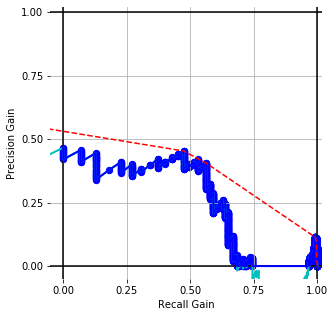

2020-08-03 03:48:05,355 : INFO : auprg:  0.217
2020-08-03 03:48:05,355 : INFO : compute_precision_recall_gain Complete: SimilarityMetric.SCM_sim


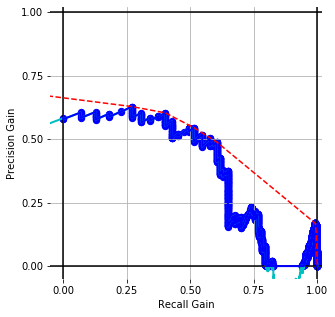

2020-08-03 03:48:05,717 : INFO : auprg:  0.380
2020-08-03 03:48:05,717 : INFO : compute_precision_recall_gain Complete: SimilarityMetric.WMD_sim


In [ ]:
supevisedEval.Compute_precision_recall_gain()

## Compute the average precision score¶
Precision is a metric that quantifies the number of correct positive predictions made.

Recall is a metric that quantifies the number of correct positive predictions made out of all positive predictions that could have been made.

2020-08-03 03:48:08,602 : INFO : Average precision-recall score: 0.03
2020-08-03 03:48:08,602 : INFO : Precision-Recall AUC: 0.03
2020-08-03 03:48:08,613 : INFO : Average precision-recall score: 0.03
2020-08-03 03:48:08,616 : INFO : Precision-Recall AUC: 0.03


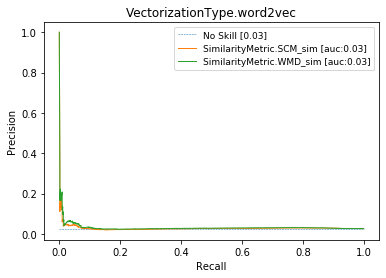

In [ ]:
supevisedEval.Compute_avg_precision_same_plot()

## Compute ROC Curve
An ROC curve (or receiver operating characteristic curve) is a plot that summarizes the performance of a binary classification model on the positive class [(see Blog)](https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-imbalanced-classification/).

Use ROC when both classes detection is equally important — When we want to give equal weight to both classes prediction ability we should look at the ROC curve [link](https://towardsdatascience.com/what-metrics-should-we-use-on-imbalanced-data-set-precision-recall-roc-e2e79252aeba).

2020-08-03 03:48:17,130 : INFO : ROC AUC 0.51
2020-08-03 03:48:17,143 : INFO : ROC AUC 0.54


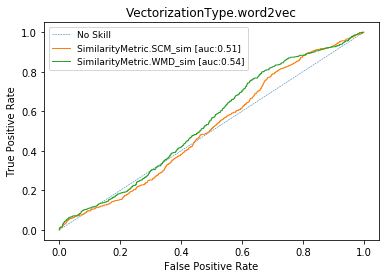

In [ ]:
supevisedEval.Compute_roc_curve()

## Compute distribution of similarities word2vec

In [ ]:
#Basic Statistics
filter_metrics = supevisedEval.df_filtered #word2vec.df_ground_link
filter_metrics.describe()

,DistanceMetric.WMD,SimilarityMetric.WMD_sim,DistanceMetric.SCM,SimilarityMetric.SCM_sim,EntropyMetric.MSI_I,EntropyMetric.MSI_X,Linked?
count,20143.000000,20143.000000,20143.000000,20143.000000,20143.000000,20143.000000,20143.000000
mean,1.157403,0.464632,0.773546,0.226454,3.174342,1.238844,0.026362
std,0.103543,0.023235,0.140662,0.140662,1.439067,0.347504,0.160212
min,0.586765,0.425668,0.177044,0.002021,0.000000,0.000000,0.000000
25%,1.094408,0.447635,0.683563,0.120180,2.321928,1.270963,0.000000
50%,1.164997,0.461894,0.795739,0.204261,3.381620,1.361898,0.000000
75%,1.233961,0.477462,0.879820,0.316437,4.264515,1.396516,0.000000
max,1.349247,0.630213,0.997979,0.822956,6.527020,1.430999,1.000000


In [ ]:
filter_metrics.shape

(20143, 9)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f8aef66b358>,
      dtype=object)

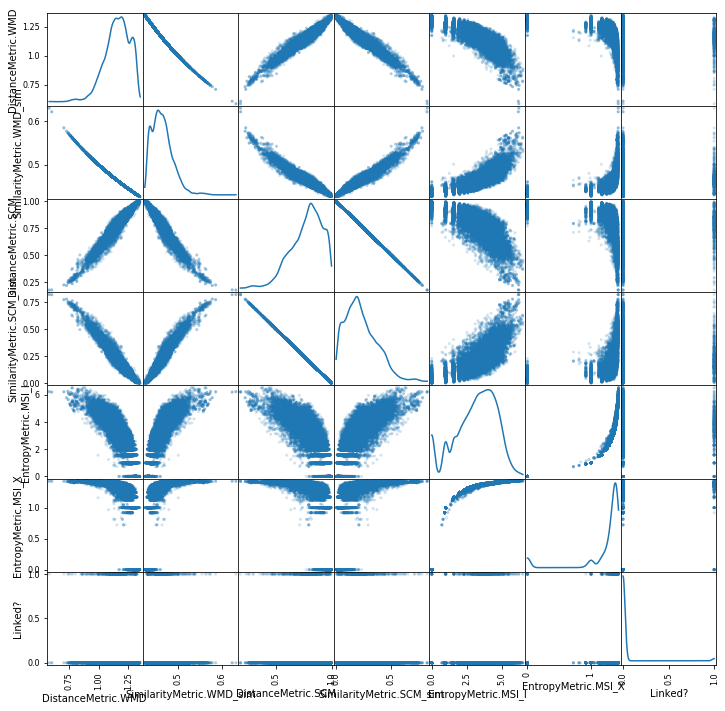

In [ ]:
scatter_matrix(filter_metrics, alpha=0.2, figsize=(12, 12), diagonal='kde')

Lag plots are used to check if a data set or time series is random. Random data should not exhibit any structure in the lag plot. Non-random structure implies that the underlying data are not random. The lag argument may be passed, and when lag=1 the plot is essentially data[:-1] vs. data[1:].

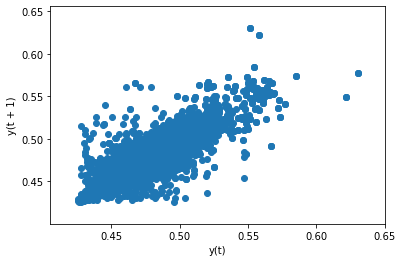

In [ ]:
lag_plot(filter_metrics[[SimilarityMetric.WMD_sim]])

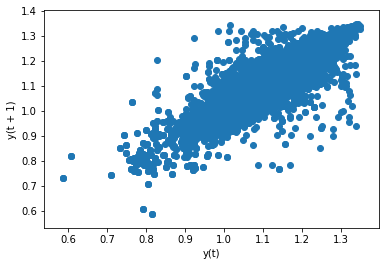

In [ ]:
lag_plot(filter_metrics[DistanceMetric.WMD])

In [ ]:
# calculate model precision-recall curve
sim = np.array(filter_metrics[SimilarityMetric.SCM_sim]) #SimilarityMetric.SCM_sim #SimilarityMetric.WMD_sim

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f8af040b048>,
      dtype=object)

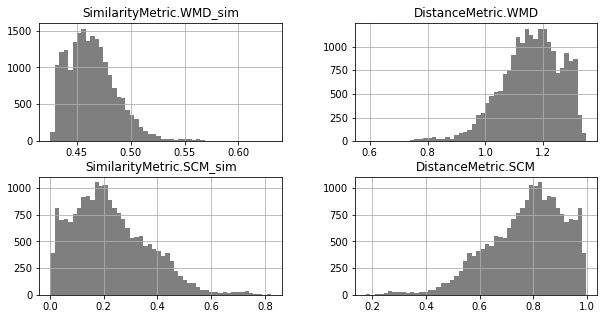

In [ ]:
filter_metrics.hist(column=[SimilarityMetric.WMD_sim,DistanceMetric.WMD,SimilarityMetric.SCM_sim,
                            DistanceMetric.SCM],color='k',bins=50,figsize=[10,5],alpha=0.5)

SimilarityMetric.WMD_sim    0.015157
DistanceMetric.WMD          0.061112
SimilarityMetric.SCM_sim    0.094660
DistanceMetric.SCM          0.094660
dtype: float64


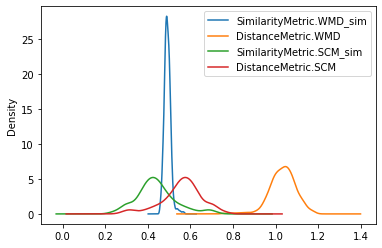

In [ ]:
errors = filter_metrics[[SimilarityMetric.WMD_sim,DistanceMetric.WMD,SimilarityMetric.SCM_sim,
                            DistanceMetric.SCM]].std()
print(errors)
filter_metrics[[SimilarityMetric.WMD_sim,DistanceMetric.WMD,SimilarityMetric.SCM_sim,
                            DistanceMetric.SCM]].plot.kde()

In [ ]:
filter_metrics[SimilarityMetric.WMD_sim].plot.kde()
filter_metrics[SimilarityMetric.WMD_sim].plot.hist(density=True) # Histogram will now be normalized

In [ ]:
filter_metrics[SimilarityMetric.SCM_sim].plot.kde()
filter_metrics[SimilarityMetric.SCM_sim].plot.hist(density=True) # Histogram will now be normalized

In [ ]:
filter_metrics[DistanceMetric.WMD].plot.kde()
filter_metrics[DistanceMetric.WMD].plot.hist(density=True)

In [ ]:
filter_metrics[DistanceMetric.SCM].plot.kde()
filter_metrics[DistanceMetric.SCM].plot.hist(density=True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f8aee5f8898>,
      dtype=object)

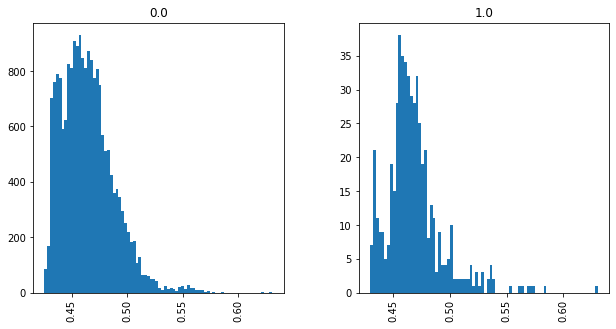

In [ ]:
filter_metrics.hist(by='Linked?',column=SimilarityMetric.WMD_sim ,figsize=[10, 5],bins=80)

In [ ]:
filter_metrics.hist(by='Linked?',column=SimilarityMetric.SCM_sim ,figsize=[10, 5],bins=80)

In [ ]:
filter_metrics.hist(by='Linked?',column=DistanceMetric.WMD,figsize=[10, 5],bins=80)

In [ ]:
filter_metrics.hist(by='Linked?',column=DistanceMetric.SCM,figsize=[10, 5],bins=80)

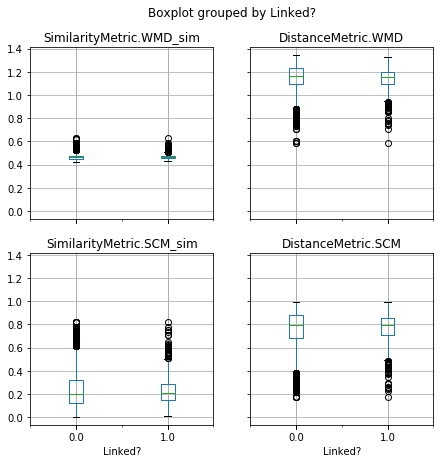

In [ ]:
boxplot = filter_metrics.boxplot(by='Linked?',column=[SimilarityMetric.WMD_sim,DistanceMetric.WMD,SimilarityMetric.SCM_sim,
                            DistanceMetric.SCM],figsize=[7, 7])

## Entropy Plots

In [ ]:
filter_metrics_01 = filter_metrics.copy()
filter_metrics_01.dropna(inplace=True)

In [ ]:
filter_metrics_01[EntropyMetric.MSI_I]

0        3.022055
1        3.084963
2        2.855389
3        2.725481
4        2.584963
           ...   
21307    1.370951
21308    2.845351
21309    3.022055
21310    2.845351
21311    2.419382
Name: EntropyMetric.MSI_I, Length: 20143, dtype: float64

In [ ]:
def compute_spearman_corr(filter_metrics_01, columns = [EntropyMetric.MSI_I,SimilarityMetric.SCM_sim] ):
    df_correlation = filter_metrics_01.copy() 
    correlation = df_correlation[columns].corr(method='spearman')
    #correlation = df_correlation.corr(method='spearman')
    return correlation[columns[0]].values[1]

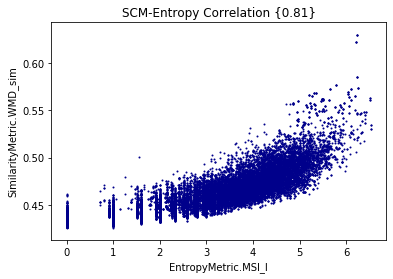

In [ ]:
# Minimum Shared Entropy and Word Distance
x1 = filter_metrics_01.plot.scatter(
    x=EntropyMetric.MSI_I,
    y=SimilarityMetric.WMD_sim, 
    c='DarkBlue', 
    s=1,
    title = 'SCM-Entropy Correlation {%.2f}' % compute_spearman_corr(filter_metrics_01)
)

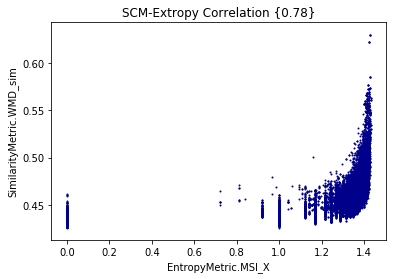

In [ ]:
x1 = filter_metrics_01.plot.scatter(
    x=EntropyMetric.MSI_X,
    y=SimilarityMetric.WMD_sim, 
    c='DarkBlue', 
    s=1,
    title = 'SCM-Extropy Correlation {%.2f}' % compute_spearman_corr(filter_metrics_01,[EntropyMetric.MSI_X,SimilarityMetric.SCM_sim] )
)

In [ ]:
filter_metrics_linked = filter_metrics_01[filter_metrics_01['Linked?'] == 1].copy()
filter_metrics_nonlinked = filter_metrics_01[filter_metrics_01['Linked?'] == 0].copy()


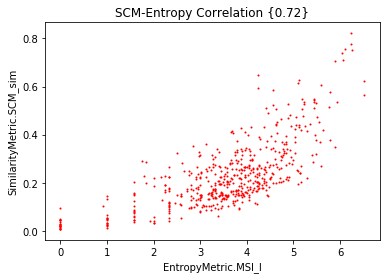

In [ ]:
x2 = filter_metrics_01[filter_metrics_01['Linked?'] == 1].plot.scatter(
    x=EntropyMetric.MSI_I,
    y=SimilarityMetric.SCM_sim, 
    c='Red',
    s=1,
    title = 'Liked SCM-Entropy Correlation {%.2f}' % compute_spearman_corr(filter_metrics_linked)
)
#x2.text(0,0,'test')

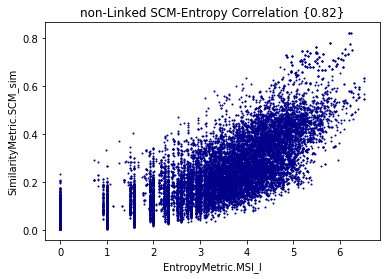

In [ ]:
x2_ = filter_metrics_nonlinked.plot.scatter(
    x=EntropyMetric.MSI_I,
    y=SimilarityMetric.SCM_sim, 
    c='DarkBlue',
    s=1,
    title = 'non-Linked SCM-Entropy Correlation {%.2f}' % compute_spearman_corr(filter_metrics_nonlinked)
)

Text(0, 0.5, 'Minimum Shared Extropy')

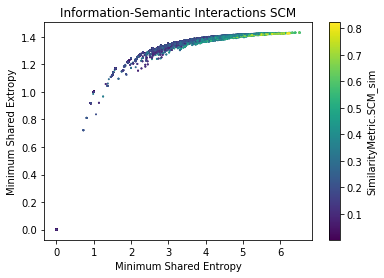

In [ ]:
#Information levels vs semantics
fig, ax = plt.subplots()
filter_metrics_01.plot.scatter(
    x = EntropyMetric.MSI_I,
    y = EntropyMetric.MSI_X,
    c = SimilarityMetric.SCM_sim,
    #figsize = [12, 6],
    title = 'Information-Semantic Interactions SCM',
    colormap = 'viridis',
    ax = ax,
    s=1
)
ax.set_xlabel("Minimum Shared Entropy")
ax.set_ylabel("Minimum Shared Extropy")

Text(0, 0.5, 'Minimum Shared Extropy')

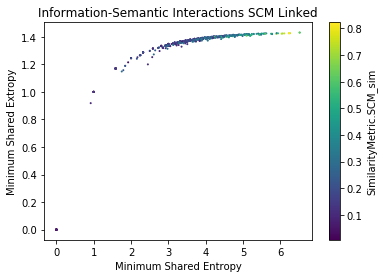

In [ ]:
#Separated by ground truth Links!
fig, ax = plt.subplots()
filter_metrics_01[filter_metrics_01['Linked?'] == 1].plot.scatter(
    x = EntropyMetric.MSI_I,
    y = EntropyMetric.MSI_X,
    c = SimilarityMetric.SCM_sim,
    #figsize = [12, 6],
    title = 'Information-Semantic Interactions SCM Linked',
    colormap = 'viridis',
    ax = ax,
    s=1
)
ax.set_xlabel("Minimum Shared Entropy")
ax.set_ylabel("Minimum Shared Extropy")

Text(0, 0.5, 'Minimum Shared Extropy')

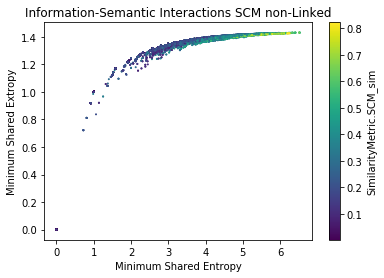

In [ ]:
#Separated by ground truth NonLinked!
fig, ax = plt.subplots()
filter_metrics_01[filter_metrics_01['Linked?'] == 0].plot.scatter(
    x = EntropyMetric.MSI_I,
    y = EntropyMetric.MSI_X,
    c = SimilarityMetric.SCM_sim,
    #figsize = [6, 5],
    title = 'Information-Semantic Interactions SCM non-Linked',
    colormap = 'viridis',
    ax = ax,
    s=1
)

ax.set_xlabel("Minimum Shared Entropy")
ax.set_ylabel("Minimum Shared Extropy")

Text(0, 0.5, 'Minimum Shared Entropy')

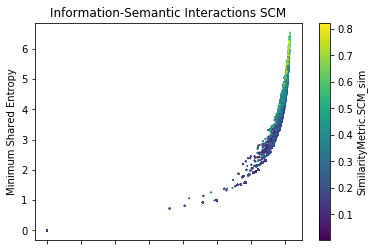

In [ ]:
ax7 = filter_metrics_01.plot.scatter(
    x = EntropyMetric.MSI_X,
    y = EntropyMetric.MSI_I,
    c = SimilarityMetric.SCM_sim,
    #figsize = [12, 6],
    title = 'Information-Semantic Interactions SCM',
    colormap = 'viridis',
    s=1
)
ax7.set_xlabel("Minimum Shared Extropy")
ax7.set_ylabel("Minimum Shared Entropy")

Text(0, 0.5, 'Minimum Shared Extropy')

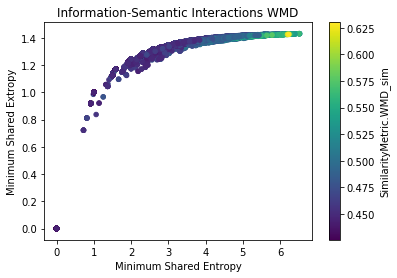

In [ ]:
fig, ax = plt.subplots()
filter_metrics_01.plot.scatter(
    x = EntropyMetric.MSI_I,
    y = EntropyMetric.MSI_X,
    c = SimilarityMetric.WMD_sim,
    #figsize = [12, 6],
    title = 'Information-Semantic Interactions WMD',
    colormap = 'viridis',
    ax = ax
)
ax.set_xlabel("Minimum Shared Entropy")
ax.set_ylabel("Minimum Shared Extropy")

Text(0, 0.5, 'Minimum Shared Extropy')

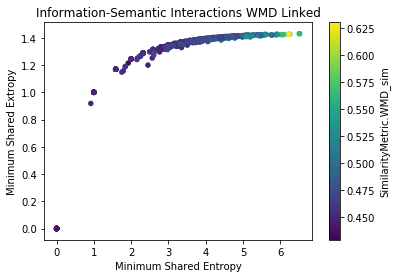

In [ ]:
fig, ax = plt.subplots()
filter_metrics_01[filter_metrics_01['Linked?'] == 1].plot.scatter(
    x = EntropyMetric.MSI_I,
    y = EntropyMetric.MSI_X,
    c = SimilarityMetric.WMD_sim,
    #figsize = [12, 6],
    title = 'Information-Semantic Interactions WMD Linked',
    colormap = 'viridis',
    ax = ax
)
ax.set_xlabel("Minimum Shared Entropy")
ax.set_ylabel("Minimum Shared Extropy")

Text(0, 0.5, 'Minimum Shared Extropy')

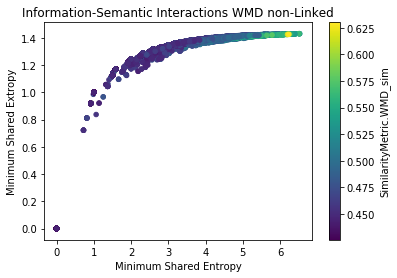

In [ ]:
fig, ax = plt.subplots()
filter_metrics_01[filter_metrics_01['Linked?'] == 0].plot.scatter(
    x = EntropyMetric.MSI_I,
    y = EntropyMetric.MSI_X,
    c = SimilarityMetric.WMD_sim,
    #figsize = [12, 6],
    title = 'Information-Semantic Interactions WMD non-Linked',
    colormap = 'viridis',
    ax = ax
)
ax.set_xlabel("Minimum Shared Entropy")
ax.set_ylabel("Minimum Shared Extropy")

In [ ]:
filter_metrics.head()

,Source,Target,DistanceMetric.WMD,SimilarityMetric.WMD_sim,DistanceMetric.SCM,SimilarityMetric.SCM_sim,EntropyMetric.MSI_I,EntropyMetric.MSI_X,Linked?
0,295,sacp-python-common/sacp_python_common/auth_uti...,1.204974,0.453520,0.780095,0.219905,3.022055,1.335963,0.0
1,295,sacp-python-common/sacp_python_common/bandit/b...,1.237703,0.446887,0.818100,0.181900,3.084963,1.348006,0.0
2,295,sacp-python-common/sacp_python_common/bandit/b...,1.230886,0.448252,0.827941,0.172059,2.855389,1.325019,1.0
3,295,sacp-python-common/sacp_python_common/cave/cav...,1.209098,0.452673,0.820322,0.179678,2.725481,1.319220,0.0
4,295,sacp-python-common/sacp_python_common/cave/cav...,1.208951,0.452703,0.812891,0.187109,2.584963,1.315172,0.0


# Artifacts Similarity with Doc2Vec

Try to reproduce the same empirical evaluation like here: [link](https://arxiv.org/pdf/1507.07998.pdf). Pay attention to:
- Accuracy vs. Dimensionality (we can replace accuracy for false positive rate or true positive rate)
- Visualize paragraph vectors using t-sne
- Computing Cosine Distance and Similarity. More about similarity [link](https://www.kdnuggets.com/2017/08/comparing-distance-measurements-python-scipy.html)

In [ ]:
#path_to_trained_model": 'test_data/models/pv/conv/[doc2vec-Py-Java-PVDBOW-500-20E-1592609630.689167].model',
#"path_to_trained_model": 'test_data/models/pv/conv/[doc2vec-Py-Java-Wiki-PVDBOW-500-20E[15]-1592941134.367976].model',
path_to_trained_model = 'test_data/models/[doc2vec-Py-Java-PVDBOW-500-20E-8k-1594572857.17191].model'

In [ ]:
def doc2vec_params():
    return {
        "vectorizationType": VectorizationType.doc2vec,
        "linkType": LinkType.req2tc,
        "system": 'libest',
        "path_to_trained_model": path_to_trained_model,
        "source_path": '/tf/main/benchmarking/traceability/testbeds/nltk/[libest-pre-req].csv',
        "target_path": '/tf/main/benchmarking/traceability/testbeds/nltk/[libest-pre-tc].csv',
        "system_path": '/tf/main/benchmarking/traceability/testbeds/nltk/[libest-pre-all].csv',
        "saving_path": 'test_data/',
        "names": ['Source','Target','Linked?']
    }

In [ ]:
doc2vec_params = doc2vec_params()
doc2vec_params

In [ ]:
#Export
class Doc2VecSeqVect(BasicSequenceVectorization):
    
    def __init__(self, params):
        super().__init__(params)
        self.new_model = gensim.models.Doc2Vec.load( params['path_to_trained_model'] )
        self.new_model.init_sims(replace=True)  # Normalizes the vectors in the word2vec class.
        self.df_inferred_src = None
        self.df_inferred_trg = None
        
        self.dict_distance_dispatcher = {
            DistanceMetric.COS: self.cos_scipy,
            SimilarityMetric.Pearson: self.pearson_abs_scipy,
            DistanceMetric.EUC: self.euclidean_scipy,
            DistanceMetric.MAN: self.manhattan_scipy
        }
    
    def distance(self, metric_list, link):
        '''Iterate on the metrics'''
        ν_inferredSource = list(self.df_inferred_src[self.df_inferred_src['ids'].str.contains(link[0])]['inf-doc2vec'])
        w_inferredTarget = list(self.df_inferred_trg[self.df_inferred_trg['ids'].str.contains(link[1])]['inf-doc2vec'])
        
        dist = [ self.dict_distance_dispatcher[metric](ν_inferredSource,w_inferredTarget) for metric in metric_list]
        logging.info("Computed distances or similarities "+ str(link) + str(dist))    
        return functools.reduce(lambda a,b : a+b, dist) #Always return a list
    
    def computeDistanceMetric(self, links, metric_list):
        '''It is computed the cosine similarity'''
        
        metric_labels = [ self.dict_labels[metric] for metric in metric_list] #tracking of the labels
        distSim = [[link[0], link[1], self.distance( metric_list, link )] for link in links] #Return the link with metrics
        distSim = [[elem[0], elem[1]] + elem[2] for elem in distSim] #Return the link with metrics
        
        return distSim, functools.reduce(lambda a,b : a+b, metric_labels)

    
    def InferDoc2Vec(self, steps=200):
        '''Activate Inference on Target and Source Corpus'''
        self.df_inferred_src = self.df_source.copy()
        self.df_inferred_trg = self.df_target.copy()
        
        self.df_inferred_src['inf-doc2vec'] =  [self.new_model.infer_vector(artifact.split(),steps=steps) for artifact in self.df_inferred_src['text'].values]
        self.df_inferred_trg['inf-doc2vec'] =  [self.new_model.infer_vector(artifact.split(),steps=steps) for artifact in self.df_inferred_trg['text'].values]
        
        logging.info("Infer Doc2Vec on Source and Target Complete")
    

### Testing Doc2Vec SequenceVectorization

In [ ]:
doc2vec = Doc2VecSeqVect(params = doc2vec_params)

In [ ]:
#[step1]Apply Doc2Vec Inference
doc2vec.InferDoc2Vec(steps=200)

In [ ]:
doc2vec.df_inferred_src.head(2)

In [ ]:
#test_inferDoc2Vec_trg = inferDoc2Vec(df_target)
#test_inferDoc2Vec_trg.head()
doc2vec.df_inferred_trg.head(2)

In [ ]:
pearsonr(doc2vec.df_inferred_trg['inf-doc2vec'][0], doc2vec.df_inferred_trg['inf-doc2vec'][0])

In [ ]:
#[step 2]NonGroundTruth Computation
metric_l = [DistanceMetric.EUC,DistanceMetric.COS,DistanceMetric.MAN]# , SimilarityMetric.Pearson]
doc2vec.ComputeDistanceArtifacts( sampling=False, samples = 50, metric_list = metric_l )
doc2vec.df_nonground_link.head()

In [ ]:
#[step 3]Saving Non-GroundTruth Links
doc2vec.SaveLinks()

In [ ]:
#Loading Non-GroundTruth Links (change the timestamp with the assigned in the previous step)
df_nonglinks_doc2vec = LoadLinks(timestamp=1594653325.258415, params=doc2vec_params)
df_nonglinks_doc2vec.head()

In [ ]:
#[step 4]GroundTruthMatching Testing
path_to_ground_truth = '/tf/main/benchmarking/traceability/testbeds/groundtruth/english/[libest-ground-req-to-tc].txt'
doc2vec.MatchWithGroundTruth(path_to_ground_truth)
doc2vec.df_ground_link

In [ ]:
#[step 5]Saving GroundTruth Links
doc2vec.SaveLinks(grtruth = True)

In [ ]:
#Loading Non-GroundTruth Links (change the timestamp with the assigned in the previous step)
df_glinks_doc2vec = LoadLinks(timestamp=1594653350.19946, params=doc2vec_params, grtruth = True)
df_glinks_doc2vec.head()

# Approach Evaluation and Interpretation (doc2vec)

In [ ]:
#supervisedEvalDoc2vec = SupervisedVectorEvaluation(doc2vec, similarity=SimilarityMetric.EUC_sim)
#supervisedEvalDoc2vec = SupervisedVectorEvaluation(doc2vec, similarity=SimilarityMetric.COS_sim)
supervisedEvalDoc2vec = SupervisedVectorEvaluation(doc2vec, similarity=SimilarityMetric.MAN_sim)

In [ ]:
supervisedEvalDoc2vec.y_test

In [ ]:
supervisedEvalDoc2vec.y_score

In [ ]:
supervisedEvalDoc2vec.Compute_precision_recall_gain()

In [ ]:
supervisedEvalDoc2vec.Compute_avg_precision()

In [ ]:
supervisedEvalDoc2vec.Compute_roc_curve()

## Compute distribution of similarities doc2vec

In [ ]:
#Basic Statistics
filter_doc2vec = doc2vec.df_ground_link
filter_doc2vec.describe()

In [ ]:
lag_plot(filter_doc2vec[[SimilarityMetric.EUC_sim]])

In [ ]:
lag_plot(filter_doc2vec[DistanceMetric.EUC])

In [ ]:
filter_doc2vec.hist(column=[SimilarityMetric.EUC_sim,DistanceMetric.EUC],color='k',bins=50,figsize=[10,5],alpha=0.5)

In [ ]:
#Separate distance from similarity analysis here
errors = filter_doc2vec[[SimilarityMetric.EUC_sim,DistanceMetric.EUC]].std()
print(errors)
filter_doc2vec[[SimilarityMetric.EUC_sim,DistanceMetric.EUC]].plot.kde()

In [ ]:
filter_doc2vec.hist(by='Linked?',column=SimilarityMetric.EUC_sim,figsize=[10, 5],bins=80)

In [ ]:
filter_doc2vec.hist(by='Linked?',column=DistanceMetric.EUC,figsize=[10, 5],bins=80)

In [ ]:
#separate the distance from the similarity plot
boxplot = filter_doc2vec.boxplot(by='Linked?',column=[SimilarityMetric.EUC_sim,DistanceMetric.EUC],figsize=[10, 5])

In [ ]:
boxplot = filter_doc2vec.boxplot(by='Linked?',column=[SimilarityMetric.EUC_sim],figsize=[10, 5])

## Combining Doc2vec and Word2vec
Please check this post for futher detatils [link](https://stats.stackexchange.com/questions/217614/intepreting-doc2vec-cosine-similarity-between-doc-vectors-and-word-vectors)

In [ ]:
! nbdev_build_docs #<-------- [Activate when stable]

converting: /tf/main/nbs/3.2_mining.unsupervised.traceability.approach.libest.ipynb
converting: /tf/main/nbs/1.3_exp.csnc_python.ipynb
converting: /tf/main/nbs/2.2_repr.roberta.eval.ipynb
converting: /tf/main/nbs/3.2_mining.unsupervised.traceability.approach.cisco.ipynb
An error occurred while executing the following cell:
------------------
#export
from nbdev.showdoc import show_doc
from ds4se.exp.csnc.python import *
------------------

---------------------------------------------------------------------------
ModuleNotFoundError                       Traceback (most recent call last)
<ipython-input-1-ca45a21c628e> in <module>
      1 #export
      2 from nbdev.showdoc import show_doc
----> 3 from ds4se.exp.csnc.python import *

ModuleNotFoundError: No module named 'ds4se'
ModuleNotFoundError: No module named 'ds4se'

An error occurred while executing the following cell:
------------------
#export
from nbdev.showdoc import show_doc
from ds4se.repr.roberta.eval import *
-------------

converting: /tf/main/nbs/1.1_exp.info.ipynb
converting: /tf/main/nbs/7.3_statistical_analysis.ipynb
An error occurred while executing the following cell:
------------------
#export
from nbdev.showdoc import show_doc
from ds4se.repr.codeberta import *
------------------

---------------------------------------------------------------------------
ModuleNotFoundError                       Traceback (most recent call last)
<ipython-input-1-2f0785517f7e> in <module>
      1 #export
      2 from nbdev.showdoc import show_doc
----> 3 from ds4se.repr.codeberta import *

ModuleNotFoundError: No module named 'ds4se'
ModuleNotFoundError: No module named 'ds4se'

An error occurred while executing the following cell:
------------------
#export
from nbdev.showdoc import show_doc
from ds4se.mgmnt.prep.conv import *
------------------

---------------------------------------------------------------------------
ModuleNotFoundError                       Traceback (most recent call last)
<ipython-input-1

An error occurred while executing the following cell:
------------------
#export
from nbdev.showdoc import show_doc
from ds4se.mining.unsupervised.traceability.eda import *
------------------

---------------------------------------------------------------------------
ModuleNotFoundError                       Traceback (most recent call last)
<ipython-input-1-521d3aff43ec> in <module>
      1 #export
      2 from nbdev.showdoc import show_doc
----> 3 from ds4se.mining.unsupervised.traceability.eda import *

ModuleNotFoundError: No module named 'ds4se'
ModuleNotFoundError: No module named 'ds4se'

converting: /tf/main/nbs/6.2_desc.metrics.main.ipynb
converting: /tf/main/nbs/1.2_exp.gen.code.ipynb
An error occurred while executing the following cell:
------------------
#export
from nbdev.showdoc import show_doc
from ds4se.mgmnt.prep.bpe import *
------------------

---------------------------------------------------------------------------
ModuleNotFoundError                       Traceb

In [ ]:
! nbdev_build_lib

Converted 0.0_mgmnt.prep.i.ipynb.
Converted 0.1_mgmnt.prep.conv.ipynb.
Converted 0.2_mgmnt.db.mongo.ipynb.
Converted 0.3_mgmnt.prep.bpe.ipynb.
Converted 0.4_mgmnt.corpus.ipynb.
Converted 0.5_mgmnt.prep.traceability.ipynb.
Converted 0.6_mgmnt.prep.nltk.ipynb.
Converted 1.0_exp.i.ipynb.
Converted 1.1_exp.info-[inspect].ipynb.
Converted 1.1_exp.info.ipynb.
Converted 1.2_exp.csnc.ipynb.
Converted 1.3_exp.csnc_python.ipynb.
Converted 2.0_repr.i.ipynb.
Converted 2.1_repr.codeberta.ipynb.
Converted 2.1_repr.roberta.train.ipynb.
Converted 2.2_repr.roberta.eval.ipynb.
Converted 2.3_repr.word2vec.train.ipynb.
Converted 2.6_repr.word2vec.eval.ipynb.
Converted 2.7_repr.distmetrics.ipynb.
Converted 3.0_mining.unsupervised.traceability.ida.ipynb.
Converted 3.1_mining.unsupervised.traceability.eda.ipynb.
Converted 3.2_mining.unsupervised.traceability.approach.cisco.ipynb.
Converted 3.2_mining.unsupervised.traceability.approach.ipynb.
Converted 3.3_mining.unsupervised.traceability.eval.ipynb.
Converte

In [ ]:
from nbdev.export import notebook2script
notebook2script()

Converted 0.0_mgmnt.prep.i.ipynb.
Converted 0.1_mgmnt.prep.conv.ipynb.
Converted 0.2_mgmnt.db.mongo.ipynb.
Converted 0.3_mgmnt.prep.bpe.ipynb.
Converted 0.4_mgmnt.corpus.ipynb.
Converted 0.5_mgmnt.prep.traceability.ipynb.
Converted 0.6_mgmnt.prep.nltk.ipynb.
Converted 1.0_exp.i.ipynb.
Converted 1.1_exp.info-[inspect]-Copy1.ipynb.
Converted 1.1_exp.info-[inspect].ipynb.
Converted 1.1_exp.info.ipynb.
Converted 1.2_exp.csnc.ipynb.
Converted 1.2_exp.gen.code.ipynb.
Converted 1.3_exp.csnc_python.ipynb.
Converted 2.0_repr.i.ipynb.
Converted 2.1_repr.codeberta.ipynb.
Converted 2.1_repr.roberta.train.ipynb.
Converted 2.2_repr.roberta.eval.ipynb.
Converted 2.3_repr.word2vec.train.ipynb.
Converted 2.6_repr.word2vec.eval.ipynb.
Converted 2.7_repr.distmetrics.ipynb.
Converted 2.8_repr.sentence_transformers.ipynb.
Converted 3.0_mining.unsupervised.traceability.ida.ipynb.
Converted 3.1_mining.unsupervised.traceability.eda.ipynb.
Converted 3.2_mining.unsupervised.traceability.approach.cisco.ipynb.
Co

In [ ]:
! pip install -e .

ERROR: File "setup.py" not found. Directory cannot be installed in editable mode: /tf/main/nbs
